# <center> Fraud Detection

    
https://www.kaggle.com/c/ieee-fraud-detection 

## Librairies

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pickle as pkl
import random
import time
from sklearn.model_selection import train_test_split, cross_validate, GridSearchCV, cross_val_score
from sklearn.metrics import accuracy_score, recall_score, confusion_matrix, plot_confusion_matrix, plot_roc_curve
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import RandomForestClassifier
import warnings
warnings.filterwarnings("ignore")

## Reload the pickle

In [2]:
with open('train_keep.pkl', 'rb') as f:
    train_final = pkl.load(f)
    f.close()

In [3]:
train_final.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,id_30,id_31,id_32,id_33,id_34,id_35,id_37,id_38,DeviceType,DeviceInfo
0,2987000,0,86400,68.5,W,13926,361.0,150.0,discover,142.0,...,Windows 10,chrome 63.0,24.0,1920x1080,match_status:2,T,T,F,desktop,Windows
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,...,Windows 10,chrome 63.0,24.0,1920x1080,match_status:2,T,T,F,desktop,Windows
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,...,Windows 10,chrome 63.0,24.0,1920x1080,match_status:2,T,T,F,desktop,Windows
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,...,Windows 10,chrome 63.0,24.0,1920x1080,match_status:2,T,T,F,desktop,Windows
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,...,Android 7.0,samsung browser 6.2,32.0,2220x1080,match_status:2,T,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M


In [4]:
data_type = train_final.dtypes
col_non_num = [data_type.index[i] for i,j in enumerate(data_type) if j not in ['int64','float64']]

## Split data

In [5]:
train_final_dummies = pd.get_dummies(train_final)

X_train, X_test, y_train, y_test = train_test_split(train_final.loc[:,train_final.columns!='isFraud'], 
                                                    train_final.isFraud, test_size=0.2, random_state=42)

X_train_dummies, X_test_dummies, y_train_dummies, y_test_dummies = train_test_split(
    train_final_dummies.loc[:,train_final_dummies.columns!='isFraud'], 
                  train_final_dummies.isFraud, test_size=0.2, random_state=42)

train_tmp = pd.merge(X_train.reset_index(drop=True),pd.DataFrame(y_train).reset_index(drop=True),left_index=True, right_index=True)

train_dummies_tmp = pd.merge(X_train_dummies.reset_index(drop=True),pd.DataFrame(y_train_dummies).reset_index(drop=True),
                             left_index=True, right_index=True)

### Downsampling

In [6]:
train_downsampling_eval = train_tmp[train_tmp['isFraud']==1] 
downsampling_eval = train_downsampling_eval.shape[0]
train_0_eval = train_tmp[train_tmp['isFraud']==0]
n_eval = train_0_eval.shape[0]
index_sampling_eval = random.sample(range(n_eval), downsampling_eval)
train_downsampling_eval = train_downsampling_eval.append(train_0_eval.iloc[index_sampling_eval])

X = train_downsampling_eval.loc[:,train_downsampling_eval.columns!='isFraud']
Y = train_downsampling_eval.isFraud

train_dummies_downsampling_eval = train_dummies_tmp[train_dummies_tmp['isFraud']==1] 
downsampling_dummies_eval = train_dummies_downsampling_eval.shape[0]
train_dummies_0_eval = train_dummies_tmp[train_dummies_tmp['isFraud']==0]
n_dummies_eval = train_dummies_0_eval.shape[0]
index_sampling_dummies_eval = random.sample(range(n_dummies_eval), downsampling_dummies_eval)
train_dummies_downsampling_eval = train_dummies_downsampling_eval.append(
    train_dummies_0_eval.iloc[index_sampling_dummies_eval])

X_dummies = train_dummies_downsampling_eval.loc[:,train_dummies_downsampling_eval.columns!='isFraud']
Y_dummies = train_dummies_downsampling_eval.isFraud

X_train, X_eval, y_train, y_eval = train_test_split(X, Y, test_size=0.25, random_state=42)

X_train_dummies, X_eval_dummies, y_train_dummies, y_eval_dummies = train_test_split(X_dummies,
                                                                    Y_dummies, test_size=0.25, random_state=42)

## Execution time

In [7]:
def temps(second):
    m, s = divmod(second, 60)
    h, m = divmod(m, 60)
    execution_time = "temps :" + '{:02.0f}:{:02.0f}:{:02.0f}'.format(h, m, s)
    return execution_time

## Test different model

In [111]:
models = []
models.append(('catboost',CatBoostClassifier(verbose=False, cat_features=col_non_num)))
models.append(('xgboost',XGBClassifier()))
models.append(('lightgbm',LGBMClassifier()))
models.append(('RandomForest',RandomForestClassifier()))
         
recall_scores = []
accuracy_scores = []
for name, model in models:
    print(f'Model : {name}')
    if name == 'catboost':
        tstart = time.time()
        cv_results = cross_validate(model,X,Y,cv=3,scoring=('recall','accuracy'))
        tend = time.time()
        exec_time = temps(tend-tstart)
        recall_scores.append(max(cv_results['test_recall']))
        accuracy_scores.append(max(cv_results['test_accuracy']))
    else:
        tstart = time.time()
        cv_results = cross_validate(model,X_dummies.values,Y_dummies,cv=3,scoring=('recall','accuracy'))
        tend = time.time()
        exec_time = temps(tend-tstart)
        recall_scores.append(max(cv_results['test_recall']))
        accuracy_scores.append(max(cv_results['test_accuracy']))
    max_recall = max(cv_results['test_recall'])
    max_acc = max(cv_results['test_accuracy'])
    print(f'Execution time : {exec_time} | Recall max : {max_recall} \t | Accuracy max : {max_acc}')
    print()

Model : catboost
Execution time : temps :00:01:43 | Recall max : 0.829923273657289 	 | Accuracy max 0.8523931311655096

Model : xgboost
[01:11:11] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:12:12] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:13:11] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Execution time : t

In [113]:
models_name = [name for name, model in models]
max_recall = max(recall_scores)
max_accuracy = max(accuracy_scores)
print(f'Best recall : {models_name[recall_scores.index(max_recall)]} {max_recall}')
print(f'Best accuracy : {models_name[accuracy_scores.index(max_accuracy)]} {max_accuracy}')

Best recall : xgboost 0.8310193642674462
Best accuracy : xgboost 0.8579519503060199


### CatBoost has a better execution time than XGBoost and a recall slightly inferior, therefor we are going to work with this algorithm  

## Catboost

### Model

In [11]:
catfit = CatBoostClassifier(verbose=False).fit(X_train, y_train, cat_features=col_non_num, eval_set=(X_eval,y_eval))

In [12]:
print(f'Accuracy train : {accuracy_score(y_train,catfit.predict(X_train))}')
print(f'Recall train : {recall_score(y_train,catfit.predict(X_train))}')
print()
print(f'Accuracy eval : {accuracy_score(y_eval,catfit.predict(X_eval))}')
print(f'Recall eval : {recall_score(y_eval,catfit.predict(X_eval))}')
print()
print(f'Accuracy test : {accuracy_score(y_test,catfit.predict(X_test))}')
print(f'Recall test : {recall_score(y_test,catfit.predict(X_test))}')

Accuracy train : 0.9198570906581137
Recall train : 0.8888435485187302

Accuracy eval : 0.8677383997077092
Recall eval : 0.8402111324376199

Accuracy test : 0.893377247942561
Recall test : 0.834983498349835


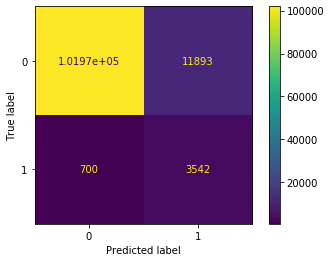

In [13]:
plot_confusion_matrix(catfit, X_test, y_test, values_format = '.5g')  
plt.show()

### Parameters tuning

In [88]:
random.seed(42)

learning_rate = random.sample(list(np.arange(0.01,0.1,0.001)), 5)
print(learning_rate)

learning_rate.append(None)

[0.040999999999999974, 0.03799999999999998, 0.02699999999999999, 0.02299999999999999, 0.09599999999999992]


In [94]:
params = {'verbose': [2],
          'cat_features' : [col_non_num],
          'learning_rate': learning_rate, 'depth': [3,6,1,None], 'l2_leaf_reg' : [3.0,0.01,1.0,2.5,None]}
cat_grid_search = GridSearchCV(CatBoostClassifier(), params,cv=3,scoring=('recall','accuracy'),refit='recall')
cat_grid_fit = cat_grid_search.fit(X_train, y_train, eval_set=(X_eval,y_eval))

Custom logger is already specified. Specify more than one logger at same time is not thread safe.

0:	learn: 0.6820751	test: 0.6821566	best: 0.6821566 (0)	total: 16.1ms	remaining: 16.1s
2:	learn: 0.6587829	test: 0.6584449	best: 0.6584449 (2)	total: 43.7ms	remaining: 14.5s
4:	learn: 0.6403589	test: 0.6399950	best: 0.6399950 (4)	total: 72.5ms	remaining: 14.4s
6:	learn: 0.6232039	test: 0.6234434	best: 0.6234434 (6)	total: 100ms	remaining: 14.2s
8:	learn: 0.6112669	test: 0.6118996	best: 0.6118996 (8)	total: 125ms	remaining: 13.8s
10:	learn: 0.6003578	test: 0.6009113	best: 0.6009113 (10)	total: 154ms	remaining: 13.8s
12:	learn: 0.5895219	test: 0.5901547	best: 0.5901547 (12)	total: 184ms	remaining: 14s
14:	learn: 0.5795760	test: 0.5805777	best: 0.5805777 (14)	total: 211ms	remaining: 13.9s
16:	learn: 0.5715596	test: 0.5724275	best: 0.5724275 (16)	total: 242ms	remaining: 14s
18:	learn: 0.5626858	test: 0.5635208	best: 0.5635208 (18)	total: 270ms	remaining: 14s
20:	learn: 0.5565543	test: 0.5577417	best: 0.5577417 (20)	total: 296ms	remaining: 13.8s
22:	learn: 0.5502654	test: 0.5515440	best: 0.

196:	learn: 0.4464824	test: 0.4548382	best: 0.4548382 (196)	total: 2.86s	remaining: 11.6s
198:	learn: 0.4460647	test: 0.4544842	best: 0.4544842 (198)	total: 2.89s	remaining: 11.6s
200:	learn: 0.4456654	test: 0.4541124	best: 0.4541124 (200)	total: 2.92s	remaining: 11.6s
202:	learn: 0.4453644	test: 0.4537856	best: 0.4537856 (202)	total: 2.95s	remaining: 11.6s
204:	learn: 0.4449760	test: 0.4533792	best: 0.4533792 (204)	total: 2.98s	remaining: 11.5s
206:	learn: 0.4445009	test: 0.4529512	best: 0.4529512 (206)	total: 3s	remaining: 11.5s
208:	learn: 0.4440700	test: 0.4525638	best: 0.4525638 (208)	total: 3.03s	remaining: 11.5s
210:	learn: 0.4436375	test: 0.4522520	best: 0.4522520 (210)	total: 3.06s	remaining: 11.4s
212:	learn: 0.4433824	test: 0.4520394	best: 0.4520394 (212)	total: 3.09s	remaining: 11.4s
214:	learn: 0.4430175	test: 0.4517739	best: 0.4517739 (214)	total: 3.12s	remaining: 11.4s
216:	learn: 0.4426906	test: 0.4514184	best: 0.4514184 (216)	total: 3.16s	remaining: 11.4s
218:	learn: 0

392:	learn: 0.4139818	test: 0.4281782	best: 0.4281782 (392)	total: 5.71s	remaining: 8.81s
394:	learn: 0.4137529	test: 0.4280790	best: 0.4280790 (394)	total: 5.74s	remaining: 8.78s
396:	learn: 0.4135567	test: 0.4278977	best: 0.4278977 (396)	total: 5.76s	remaining: 8.76s
398:	learn: 0.4132604	test: 0.4275709	best: 0.4275709 (398)	total: 5.79s	remaining: 8.72s
400:	learn: 0.4129577	test: 0.4273968	best: 0.4273968 (400)	total: 5.82s	remaining: 8.69s
402:	learn: 0.4126961	test: 0.4272464	best: 0.4272464 (402)	total: 5.84s	remaining: 8.65s
404:	learn: 0.4124869	test: 0.4271881	best: 0.4271881 (404)	total: 5.87s	remaining: 8.62s
406:	learn: 0.4122232	test: 0.4268545	best: 0.4268545 (406)	total: 5.9s	remaining: 8.6s
408:	learn: 0.4119903	test: 0.4266539	best: 0.4266539 (408)	total: 5.93s	remaining: 8.57s
410:	learn: 0.4117695	test: 0.4265444	best: 0.4265444 (410)	total: 5.96s	remaining: 8.55s
412:	learn: 0.4115416	test: 0.4263794	best: 0.4263794 (412)	total: 5.99s	remaining: 8.51s
414:	learn: 

588:	learn: 0.3934991	test: 0.4146405	best: 0.4146405 (588)	total: 8.56s	remaining: 5.97s
590:	learn: 0.3933286	test: 0.4143713	best: 0.4143713 (590)	total: 8.59s	remaining: 5.94s
592:	learn: 0.3931646	test: 0.4143966	best: 0.4143634 (591)	total: 8.62s	remaining: 5.92s
594:	learn: 0.3929493	test: 0.4142064	best: 0.4142064 (594)	total: 8.65s	remaining: 5.88s
596:	learn: 0.3928063	test: 0.4141060	best: 0.4141060 (596)	total: 8.68s	remaining: 5.86s
598:	learn: 0.3926484	test: 0.4140131	best: 0.4140131 (598)	total: 8.7s	remaining: 5.83s
600:	learn: 0.3924958	test: 0.4139303	best: 0.4139303 (600)	total: 8.73s	remaining: 5.79s
602:	learn: 0.3923133	test: 0.4137575	best: 0.4137575 (602)	total: 8.76s	remaining: 5.76s
604:	learn: 0.3921590	test: 0.4137466	best: 0.4137466 (604)	total: 8.79s	remaining: 5.74s
606:	learn: 0.3921144	test: 0.4137109	best: 0.4137070 (605)	total: 8.82s	remaining: 5.71s
608:	learn: 0.3919399	test: 0.4136397	best: 0.4136397 (608)	total: 8.84s	remaining: 5.68s
610:	learn:

778:	learn: 0.3789573	test: 0.4062168	best: 0.4062168 (778)	total: 11.2s	remaining: 3.19s
780:	learn: 0.3787713	test: 0.4060946	best: 0.4060946 (780)	total: 11.3s	remaining: 3.16s
782:	learn: 0.3786532	test: 0.4060214	best: 0.4060214 (782)	total: 11.3s	remaining: 3.13s
784:	learn: 0.3785647	test: 0.4059795	best: 0.4059757 (783)	total: 11.3s	remaining: 3.1s
786:	learn: 0.3784000	test: 0.4059444	best: 0.4059409 (785)	total: 11.4s	remaining: 3.08s
788:	learn: 0.3782989	test: 0.4058821	best: 0.4058821 (788)	total: 11.4s	remaining: 3.05s
790:	learn: 0.3781157	test: 0.4056633	best: 0.4056633 (790)	total: 11.4s	remaining: 3.02s
792:	learn: 0.3779908	test: 0.4055270	best: 0.4055270 (792)	total: 11.5s	remaining: 2.99s
794:	learn: 0.3778161	test: 0.4054669	best: 0.4054669 (794)	total: 11.5s	remaining: 2.96s
796:	learn: 0.3777284	test: 0.4054526	best: 0.4054526 (796)	total: 11.5s	remaining: 2.93s
798:	learn: 0.3776696	test: 0.4054314	best: 0.4054314 (798)	total: 11.5s	remaining: 2.9s
800:	learn: 

968:	learn: 0.3676666	test: 0.3994136	best: 0.3994136 (968)	total: 14s	remaining: 449ms
970:	learn: 0.3676217	test: 0.3993966	best: 0.3993966 (970)	total: 14.1s	remaining: 420ms
972:	learn: 0.3675533	test: 0.3992687	best: 0.3992687 (972)	total: 14.1s	remaining: 391ms
974:	learn: 0.3674426	test: 0.3992123	best: 0.3992123 (974)	total: 14.1s	remaining: 362ms
976:	learn: 0.3673070	test: 0.3991455	best: 0.3991455 (976)	total: 14.1s	remaining: 333ms
978:	learn: 0.3672096	test: 0.3990936	best: 0.3990936 (978)	total: 14.2s	remaining: 304ms
980:	learn: 0.3670806	test: 0.3989965	best: 0.3989965 (980)	total: 14.2s	remaining: 275ms
982:	learn: 0.3669532	test: 0.3989732	best: 0.3989732 (982)	total: 14.2s	remaining: 246ms
984:	learn: 0.3668855	test: 0.3989763	best: 0.3989702 (983)	total: 14.3s	remaining: 217ms
986:	learn: 0.3667909	test: 0.3988817	best: 0.3988795 (985)	total: 14.3s	remaining: 188ms
988:	learn: 0.3666349	test: 0.3988985	best: 0.3988795 (985)	total: 14.3s	remaining: 159ms
990:	learn: 

158:	learn: 0.4597134	test: 0.4601381	best: 0.4601381 (158)	total: 2.26s	remaining: 12s
160:	learn: 0.4593206	test: 0.4598502	best: 0.4598502 (160)	total: 2.29s	remaining: 11.9s
162:	learn: 0.4589161	test: 0.4595655	best: 0.4595655 (162)	total: 2.32s	remaining: 11.9s
164:	learn: 0.4580946	test: 0.4589387	best: 0.4589387 (164)	total: 2.35s	remaining: 11.9s
166:	learn: 0.4576784	test: 0.4586173	best: 0.4586173 (166)	total: 2.37s	remaining: 11.8s
168:	learn: 0.4571664	test: 0.4582041	best: 0.4582041 (168)	total: 2.4s	remaining: 11.8s
170:	learn: 0.4566887	test: 0.4577058	best: 0.4577058 (170)	total: 2.43s	remaining: 11.8s
172:	learn: 0.4562110	test: 0.4573288	best: 0.4573288 (172)	total: 2.46s	remaining: 11.7s
174:	learn: 0.4557439	test: 0.4569250	best: 0.4569250 (174)	total: 2.48s	remaining: 11.7s
176:	learn: 0.4553697	test: 0.4566456	best: 0.4566456 (176)	total: 2.51s	remaining: 11.7s
178:	learn: 0.4550683	test: 0.4564205	best: 0.4564205 (178)	total: 2.54s	remaining: 11.6s
180:	learn: 0

342:	learn: 0.4240167	test: 0.4311743	best: 0.4311743 (342)	total: 4.9s	remaining: 9.39s
344:	learn: 0.4236925	test: 0.4308705	best: 0.4308705 (344)	total: 4.94s	remaining: 9.38s
346:	learn: 0.4233719	test: 0.4306974	best: 0.4306974 (346)	total: 4.97s	remaining: 9.36s
348:	learn: 0.4231522	test: 0.4305130	best: 0.4305130 (348)	total: 5.01s	remaining: 9.34s
350:	learn: 0.4229160	test: 0.4303106	best: 0.4303106 (350)	total: 5.04s	remaining: 9.32s
352:	learn: 0.4225981	test: 0.4300148	best: 0.4300148 (352)	total: 5.07s	remaining: 9.29s
354:	learn: 0.4223312	test: 0.4298414	best: 0.4298414 (354)	total: 5.1s	remaining: 9.27s
356:	learn: 0.4220103	test: 0.4296138	best: 0.4296138 (356)	total: 5.13s	remaining: 9.25s
358:	learn: 0.4218045	test: 0.4294968	best: 0.4294968 (358)	total: 5.17s	remaining: 9.23s
360:	learn: 0.4215164	test: 0.4293109	best: 0.4293109 (360)	total: 5.2s	remaining: 9.21s
362:	learn: 0.4211621	test: 0.4290069	best: 0.4290069 (362)	total: 5.23s	remaining: 9.18s
364:	learn: 0

532:	learn: 0.4023867	test: 0.4159198	best: 0.4159198 (532)	total: 7.73s	remaining: 6.77s
534:	learn: 0.4022290	test: 0.4158576	best: 0.4158576 (534)	total: 7.76s	remaining: 6.74s
536:	learn: 0.4020588	test: 0.4157590	best: 0.4157590 (536)	total: 7.78s	remaining: 6.71s
538:	learn: 0.4018185	test: 0.4156461	best: 0.4156461 (538)	total: 7.82s	remaining: 6.68s
540:	learn: 0.4015852	test: 0.4154837	best: 0.4154837 (540)	total: 7.84s	remaining: 6.66s
542:	learn: 0.4013987	test: 0.4153464	best: 0.4153464 (542)	total: 7.87s	remaining: 6.62s
544:	learn: 0.4012369	test: 0.4152531	best: 0.4152531 (544)	total: 7.9s	remaining: 6.59s
546:	learn: 0.4010887	test: 0.4151765	best: 0.4151765 (546)	total: 7.92s	remaining: 6.56s
548:	learn: 0.4009298	test: 0.4150936	best: 0.4150936 (548)	total: 7.96s	remaining: 6.54s
550:	learn: 0.4007212	test: 0.4148997	best: 0.4148997 (550)	total: 7.98s	remaining: 6.5s
552:	learn: 0.4004800	test: 0.4146374	best: 0.4146374 (552)	total: 8.01s	remaining: 6.48s
554:	learn: 

730:	learn: 0.3866152	test: 0.4048881	best: 0.4048881 (730)	total: 10.5s	remaining: 3.88s
732:	learn: 0.3865348	test: 0.4048693	best: 0.4048693 (732)	total: 10.6s	remaining: 3.85s
734:	learn: 0.3863406	test: 0.4047302	best: 0.4047302 (734)	total: 10.6s	remaining: 3.82s
736:	learn: 0.3862648	test: 0.4047066	best: 0.4047066 (736)	total: 10.6s	remaining: 3.79s
738:	learn: 0.3861434	test: 0.4046610	best: 0.4046610 (738)	total: 10.6s	remaining: 3.76s
740:	learn: 0.3859739	test: 0.4045140	best: 0.4045140 (740)	total: 10.7s	remaining: 3.73s
742:	learn: 0.3858847	test: 0.4044748	best: 0.4044748 (742)	total: 10.7s	remaining: 3.71s
744:	learn: 0.3857717	test: 0.4043095	best: 0.4043095 (744)	total: 10.8s	remaining: 3.68s
746:	learn: 0.3856432	test: 0.4042103	best: 0.4042058 (745)	total: 10.8s	remaining: 3.67s
748:	learn: 0.3853757	test: 0.4039375	best: 0.4039375 (748)	total: 10.9s	remaining: 3.65s
750:	learn: 0.3852432	test: 0.4037800	best: 0.4037800 (750)	total: 10.9s	remaining: 3.62s
752:	learn

918:	learn: 0.3747329	test: 0.3974782	best: 0.3974782 (918)	total: 14.2s	remaining: 1.25s
920:	learn: 0.3746171	test: 0.3974163	best: 0.3974163 (920)	total: 14.2s	remaining: 1.22s
922:	learn: 0.3744165	test: 0.3972827	best: 0.3972827 (922)	total: 14.3s	remaining: 1.19s
924:	learn: 0.3743281	test: 0.3972225	best: 0.3972225 (924)	total: 14.3s	remaining: 1.16s
926:	learn: 0.3742581	test: 0.3972374	best: 0.3972225 (924)	total: 14.4s	remaining: 1.13s
928:	learn: 0.3741383	test: 0.3971537	best: 0.3971537 (928)	total: 14.4s	remaining: 1.1s
930:	learn: 0.3740478	test: 0.3971450	best: 0.3971450 (930)	total: 14.5s	remaining: 1.07s
932:	learn: 0.3739567	test: 0.3970893	best: 0.3970893 (932)	total: 14.5s	remaining: 1.04s
934:	learn: 0.3738614	test: 0.3970609	best: 0.3970609 (934)	total: 14.5s	remaining: 1.01s
936:	learn: 0.3737947	test: 0.3970215	best: 0.3970192 (935)	total: 14.6s	remaining: 980ms
938:	learn: 0.3736920	test: 0.3970179	best: 0.3970172 (937)	total: 14.6s	remaining: 949ms
940:	learn:

110:	learn: 0.4677845	test: 0.4727191	best: 0.4727191 (110)	total: 1.53s	remaining: 12.2s
112:	learn: 0.4668801	test: 0.4718633	best: 0.4718633 (112)	total: 1.55s	remaining: 12.2s
114:	learn: 0.4661380	test: 0.4712200	best: 0.4712200 (114)	total: 1.58s	remaining: 12.2s
116:	learn: 0.4655183	test: 0.4706654	best: 0.4706654 (116)	total: 1.61s	remaining: 12.2s
118:	learn: 0.4646553	test: 0.4698740	best: 0.4698740 (118)	total: 1.64s	remaining: 12.2s
120:	learn: 0.4641760	test: 0.4694043	best: 0.4694043 (120)	total: 1.68s	remaining: 12.2s
122:	learn: 0.4636887	test: 0.4689132	best: 0.4689132 (122)	total: 1.71s	remaining: 12.2s
124:	learn: 0.4629438	test: 0.4682131	best: 0.4682131 (124)	total: 1.74s	remaining: 12.2s
126:	learn: 0.4623866	test: 0.4676145	best: 0.4676145 (126)	total: 1.77s	remaining: 12.2s
128:	learn: 0.4616936	test: 0.4669871	best: 0.4669871 (128)	total: 1.8s	remaining: 12.2s
130:	learn: 0.4609107	test: 0.4662738	best: 0.4662738 (130)	total: 1.83s	remaining: 12.2s
132:	learn:

306:	learn: 0.4249603	test: 0.4349527	best: 0.4349527 (306)	total: 4.37s	remaining: 9.86s
308:	learn: 0.4245786	test: 0.4346878	best: 0.4346878 (308)	total: 4.39s	remaining: 9.83s
310:	learn: 0.4242577	test: 0.4344438	best: 0.4344438 (310)	total: 4.42s	remaining: 9.8s
312:	learn: 0.4239491	test: 0.4343372	best: 0.4343372 (312)	total: 4.45s	remaining: 9.77s
314:	learn: 0.4235717	test: 0.4340250	best: 0.4340250 (314)	total: 4.48s	remaining: 9.74s
316:	learn: 0.4232354	test: 0.4337617	best: 0.4337617 (316)	total: 4.5s	remaining: 9.7s
318:	learn: 0.4228402	test: 0.4334036	best: 0.4334036 (318)	total: 4.53s	remaining: 9.67s
320:	learn: 0.4225813	test: 0.4330942	best: 0.4330942 (320)	total: 4.56s	remaining: 9.65s
322:	learn: 0.4223052	test: 0.4328869	best: 0.4328869 (322)	total: 4.59s	remaining: 9.62s
324:	learn: 0.4220753	test: 0.4327166	best: 0.4327166 (324)	total: 4.62s	remaining: 9.59s
326:	learn: 0.4217253	test: 0.4324146	best: 0.4324146 (326)	total: 4.64s	remaining: 9.56s
328:	learn: 0

500:	learn: 0.4021707	test: 0.4187233	best: 0.4187233 (500)	total: 7.13s	remaining: 7.1s
502:	learn: 0.4019070	test: 0.4184992	best: 0.4184992 (502)	total: 7.16s	remaining: 7.07s
504:	learn: 0.4017415	test: 0.4183977	best: 0.4183977 (504)	total: 7.18s	remaining: 7.04s
506:	learn: 0.4015498	test: 0.4182207	best: 0.4182207 (506)	total: 7.21s	remaining: 7.01s
508:	learn: 0.4013640	test: 0.4180578	best: 0.4180578 (508)	total: 7.24s	remaining: 6.98s
510:	learn: 0.4012095	test: 0.4179495	best: 0.4179495 (510)	total: 7.27s	remaining: 6.95s
512:	learn: 0.4009354	test: 0.4177184	best: 0.4177184 (512)	total: 7.29s	remaining: 6.92s
514:	learn: 0.4006815	test: 0.4175605	best: 0.4175605 (514)	total: 7.32s	remaining: 6.89s
516:	learn: 0.4003786	test: 0.4173092	best: 0.4173092 (516)	total: 7.35s	remaining: 6.87s
518:	learn: 0.4001350	test: 0.4171067	best: 0.4171067 (518)	total: 7.38s	remaining: 6.84s
520:	learn: 0.4000277	test: 0.4170370	best: 0.4170370 (520)	total: 7.41s	remaining: 6.81s
522:	learn:

688:	learn: 0.3861803	test: 0.4077473	best: 0.4077473 (688)	total: 9.69s	remaining: 4.37s
690:	learn: 0.3859913	test: 0.4075963	best: 0.4075963 (690)	total: 9.72s	remaining: 4.34s
692:	learn: 0.3858521	test: 0.4075140	best: 0.4075140 (692)	total: 9.74s	remaining: 4.32s
694:	learn: 0.3857242	test: 0.4074564	best: 0.4074564 (694)	total: 9.77s	remaining: 4.29s
696:	learn: 0.3856149	test: 0.4073928	best: 0.4073928 (696)	total: 9.79s	remaining: 4.26s
698:	learn: 0.3854907	test: 0.4073239	best: 0.4073239 (698)	total: 9.82s	remaining: 4.23s
700:	learn: 0.3852691	test: 0.4071732	best: 0.4071732 (700)	total: 9.85s	remaining: 4.2s
702:	learn: 0.3850972	test: 0.4070327	best: 0.4070327 (702)	total: 9.87s	remaining: 4.17s
704:	learn: 0.3848896	test: 0.4068920	best: 0.4068920 (704)	total: 9.9s	remaining: 4.14s
706:	learn: 0.3847437	test: 0.4067986	best: 0.4067986 (706)	total: 9.93s	remaining: 4.11s
708:	learn: 0.3845710	test: 0.4066579	best: 0.4066579 (708)	total: 9.96s	remaining: 4.09s
710:	learn: 

876:	learn: 0.3736460	test: 0.3999083	best: 0.3999083 (876)	total: 12.5s	remaining: 1.75s
878:	learn: 0.3735052	test: 0.3999221	best: 0.3999083 (876)	total: 12.5s	remaining: 1.72s
880:	learn: 0.3734073	test: 0.3998613	best: 0.3998613 (880)	total: 12.6s	remaining: 1.7s
882:	learn: 0.3732896	test: 0.3997558	best: 0.3997558 (882)	total: 12.6s	remaining: 1.67s
884:	learn: 0.3731702	test: 0.3996969	best: 0.3996969 (884)	total: 12.6s	remaining: 1.64s
886:	learn: 0.3730672	test: 0.3996520	best: 0.3996520 (886)	total: 12.7s	remaining: 1.61s
888:	learn: 0.3728426	test: 0.3995041	best: 0.3995041 (888)	total: 12.7s	remaining: 1.58s
890:	learn: 0.3727383	test: 0.3994442	best: 0.3994442 (890)	total: 12.7s	remaining: 1.55s
892:	learn: 0.3725661	test: 0.3993186	best: 0.3993186 (892)	total: 12.7s	remaining: 1.53s
894:	learn: 0.3724014	test: 0.3991958	best: 0.3991958 (894)	total: 12.8s	remaining: 1.5s
896:	learn: 0.3722620	test: 0.3991821	best: 0.3991821 (896)	total: 12.8s	remaining: 1.47s
898:	learn: 

58:	learn: 0.4999693	test: 0.5039401	best: 0.5039401 (58)	total: 893ms	remaining: 14.2s
60:	learn: 0.4984233	test: 0.5024248	best: 0.5024248 (60)	total: 921ms	remaining: 14.2s
62:	learn: 0.4968979	test: 0.5010459	best: 0.5010459 (62)	total: 947ms	remaining: 14.1s
64:	learn: 0.4957050	test: 0.4998893	best: 0.4998893 (64)	total: 975ms	remaining: 14s
66:	learn: 0.4942340	test: 0.4985419	best: 0.4985419 (66)	total: 1s	remaining: 14s
68:	learn: 0.4925649	test: 0.4971374	best: 0.4971374 (68)	total: 1.03s	remaining: 13.9s
70:	learn: 0.4912417	test: 0.4959519	best: 0.4959519 (70)	total: 1.06s	remaining: 13.9s
72:	learn: 0.4896046	test: 0.4944774	best: 0.4944774 (72)	total: 1.09s	remaining: 13.9s
74:	learn: 0.4882204	test: 0.4931834	best: 0.4931834 (74)	total: 1.13s	remaining: 13.9s
76:	learn: 0.4871968	test: 0.4922680	best: 0.4922680 (76)	total: 1.16s	remaining: 13.9s
78:	learn: 0.4858680	test: 0.4908360	best: 0.4908360 (78)	total: 1.19s	remaining: 13.9s
80:	learn: 0.4848691	test: 0.4898339	be

242:	learn: 0.4406738	test: 0.4495324	best: 0.4495324 (242)	total: 3.67s	remaining: 11.4s
244:	learn: 0.4402704	test: 0.4491634	best: 0.4491634 (244)	total: 3.71s	remaining: 11.4s
246:	learn: 0.4399155	test: 0.4487968	best: 0.4487968 (246)	total: 3.74s	remaining: 11.4s
248:	learn: 0.4393004	test: 0.4483961	best: 0.4483961 (248)	total: 3.76s	remaining: 11.4s
250:	learn: 0.4389362	test: 0.4481280	best: 0.4481280 (250)	total: 3.79s	remaining: 11.3s
252:	learn: 0.4385870	test: 0.4478506	best: 0.4478506 (252)	total: 3.82s	remaining: 11.3s
254:	learn: 0.4383127	test: 0.4476004	best: 0.4476004 (254)	total: 3.85s	remaining: 11.2s
256:	learn: 0.4380123	test: 0.4473768	best: 0.4473768 (256)	total: 3.88s	remaining: 11.2s
258:	learn: 0.4377199	test: 0.4471651	best: 0.4471651 (258)	total: 3.91s	remaining: 11.2s
260:	learn: 0.4372853	test: 0.4469238	best: 0.4469238 (260)	total: 3.94s	remaining: 11.2s
262:	learn: 0.4369613	test: 0.4466805	best: 0.4466805 (262)	total: 3.97s	remaining: 11.1s
264:	learn

436:	learn: 0.4120921	test: 0.4268639	best: 0.4268639 (436)	total: 6.69s	remaining: 8.61s
438:	learn: 0.4118538	test: 0.4267641	best: 0.4267641 (438)	total: 6.72s	remaining: 8.59s
440:	learn: 0.4117006	test: 0.4266865	best: 0.4266865 (440)	total: 6.75s	remaining: 8.56s
442:	learn: 0.4114632	test: 0.4264913	best: 0.4264913 (442)	total: 6.79s	remaining: 8.54s
444:	learn: 0.4112945	test: 0.4263314	best: 0.4263314 (444)	total: 6.83s	remaining: 8.52s
446:	learn: 0.4110558	test: 0.4261457	best: 0.4261457 (446)	total: 6.86s	remaining: 8.49s
448:	learn: 0.4107429	test: 0.4259445	best: 0.4259445 (448)	total: 6.9s	remaining: 8.47s
450:	learn: 0.4104886	test: 0.4257507	best: 0.4257507 (450)	total: 6.93s	remaining: 8.44s
452:	learn: 0.4102002	test: 0.4256053	best: 0.4256053 (452)	total: 6.97s	remaining: 8.41s
454:	learn: 0.4098666	test: 0.4254778	best: 0.4254778 (454)	total: 7s	remaining: 8.39s
456:	learn: 0.4096197	test: 0.4252241	best: 0.4252241 (456)	total: 7.03s	remaining: 8.36s
458:	learn: 0.

626:	learn: 0.3941738	test: 0.4155939	best: 0.4155939 (626)	total: 9.7s	remaining: 5.77s
628:	learn: 0.3940554	test: 0.4155229	best: 0.4155229 (628)	total: 9.72s	remaining: 5.74s
630:	learn: 0.3938572	test: 0.4154112	best: 0.4154112 (630)	total: 9.75s	remaining: 5.7s
632:	learn: 0.3937038	test: 0.4153322	best: 0.4153322 (632)	total: 9.78s	remaining: 5.67s
634:	learn: 0.3935190	test: 0.4151975	best: 0.4151975 (634)	total: 9.81s	remaining: 5.64s
636:	learn: 0.3933535	test: 0.4150391	best: 0.4150391 (636)	total: 9.84s	remaining: 5.61s
638:	learn: 0.3932018	test: 0.4149553	best: 0.4149553 (638)	total: 9.87s	remaining: 5.58s
640:	learn: 0.3930999	test: 0.4148562	best: 0.4148562 (640)	total: 9.9s	remaining: 5.54s
642:	learn: 0.3929691	test: 0.4147960	best: 0.4147960 (642)	total: 9.93s	remaining: 5.51s
644:	learn: 0.3927562	test: 0.4146003	best: 0.4146003 (644)	total: 9.96s	remaining: 5.48s
646:	learn: 0.3925360	test: 0.4144212	best: 0.4144212 (646)	total: 9.99s	remaining: 5.45s
648:	learn: 0

822:	learn: 0.3805066	test: 0.4073387	best: 0.4073387 (822)	total: 12.7s	remaining: 2.73s
824:	learn: 0.3804139	test: 0.4072873	best: 0.4072873 (824)	total: 12.7s	remaining: 2.7s
826:	learn: 0.3803024	test: 0.4072344	best: 0.4072344 (826)	total: 12.7s	remaining: 2.67s
828:	learn: 0.3801246	test: 0.4071928	best: 0.4071928 (828)	total: 12.8s	remaining: 2.63s
830:	learn: 0.3799940	test: 0.4070796	best: 0.4070796 (830)	total: 12.8s	remaining: 2.6s
832:	learn: 0.3798641	test: 0.4069626	best: 0.4069626 (832)	total: 12.8s	remaining: 2.57s
834:	learn: 0.3797481	test: 0.4068323	best: 0.4068323 (834)	total: 12.9s	remaining: 2.54s
836:	learn: 0.3795874	test: 0.4067641	best: 0.4067641 (836)	total: 12.9s	remaining: 2.51s
838:	learn: 0.3794982	test: 0.4067105	best: 0.4067105 (838)	total: 13s	remaining: 2.48s
840:	learn: 0.3794241	test: 0.4066605	best: 0.4066605 (840)	total: 13s	remaining: 2.46s
842:	learn: 0.3793406	test: 0.4066381	best: 0.4066381 (842)	total: 13s	remaining: 2.42s
844:	learn: 0.3790

16:	learn: 0.5802918	test: 0.5772323	best: 0.5772323 (16)	total: 237ms	remaining: 13.7s
18:	learn: 0.5728807	test: 0.5697709	best: 0.5697709 (18)	total: 265ms	remaining: 13.7s
20:	learn: 0.5675624	test: 0.5648119	best: 0.5648119 (20)	total: 293ms	remaining: 13.7s
22:	learn: 0.5629772	test: 0.5603873	best: 0.5603873 (22)	total: 321ms	remaining: 13.6s
24:	learn: 0.5570288	test: 0.5543407	best: 0.5543407 (24)	total: 350ms	remaining: 13.6s
26:	learn: 0.5512207	test: 0.5486290	best: 0.5486290 (26)	total: 376ms	remaining: 13.5s
28:	learn: 0.5465101	test: 0.5441339	best: 0.5441339 (28)	total: 404ms	remaining: 13.5s
30:	learn: 0.5425035	test: 0.5398868	best: 0.5398868 (30)	total: 433ms	remaining: 13.5s
32:	learn: 0.5389724	test: 0.5364054	best: 0.5364054 (32)	total: 464ms	remaining: 13.6s
34:	learn: 0.5355865	test: 0.5328068	best: 0.5328068 (34)	total: 490ms	remaining: 13.5s
36:	learn: 0.5321796	test: 0.5295108	best: 0.5295108 (36)	total: 517ms	remaining: 13.4s
38:	learn: 0.5287471	test: 0.526

202:	learn: 0.4536449	test: 0.4546198	best: 0.4546198 (202)	total: 3.03s	remaining: 11.9s
204:	learn: 0.4530525	test: 0.4539782	best: 0.4539782 (204)	total: 3.08s	remaining: 12s
206:	learn: 0.4527282	test: 0.4537478	best: 0.4537478 (206)	total: 3.12s	remaining: 11.9s
208:	learn: 0.4523317	test: 0.4534867	best: 0.4534867 (208)	total: 3.15s	remaining: 11.9s
210:	learn: 0.4520421	test: 0.4532225	best: 0.4532225 (210)	total: 3.19s	remaining: 11.9s
212:	learn: 0.4517584	test: 0.4530042	best: 0.4530042 (212)	total: 3.22s	remaining: 11.9s
214:	learn: 0.4513374	test: 0.4526370	best: 0.4526370 (214)	total: 3.26s	remaining: 11.9s
216:	learn: 0.4510661	test: 0.4524336	best: 0.4524336 (216)	total: 3.29s	remaining: 11.9s
218:	learn: 0.4504515	test: 0.4518832	best: 0.4518832 (218)	total: 3.32s	remaining: 11.8s
220:	learn: 0.4500946	test: 0.4516230	best: 0.4516230 (220)	total: 3.35s	remaining: 11.8s
222:	learn: 0.4497612	test: 0.4513180	best: 0.4513180 (222)	total: 3.39s	remaining: 11.8s
224:	learn: 

396:	learn: 0.4216941	test: 0.4297681	best: 0.4297681 (396)	total: 6.24s	remaining: 9.48s
398:	learn: 0.4214487	test: 0.4295600	best: 0.4295600 (398)	total: 6.28s	remaining: 9.45s
400:	learn: 0.4211770	test: 0.4293672	best: 0.4293672 (400)	total: 6.3s	remaining: 9.42s
402:	learn: 0.4208162	test: 0.4290629	best: 0.4290629 (402)	total: 6.33s	remaining: 9.38s
404:	learn: 0.4205236	test: 0.4289057	best: 0.4289057 (404)	total: 6.36s	remaining: 9.35s
406:	learn: 0.4203256	test: 0.4288268	best: 0.4288268 (406)	total: 6.4s	remaining: 9.32s
408:	learn: 0.4201869	test: 0.4287606	best: 0.4287565 (407)	total: 6.43s	remaining: 9.3s
410:	learn: 0.4199738	test: 0.4285823	best: 0.4285823 (410)	total: 6.47s	remaining: 9.27s
412:	learn: 0.4197812	test: 0.4284330	best: 0.4284330 (412)	total: 6.5s	remaining: 9.24s
414:	learn: 0.4196532	test: 0.4283130	best: 0.4283130 (414)	total: 6.54s	remaining: 9.21s
416:	learn: 0.4194329	test: 0.4281322	best: 0.4281322 (416)	total: 6.57s	remaining: 9.18s
418:	learn: 0.

590:	learn: 0.4020123	test: 0.4158407	best: 0.4158407 (590)	total: 9.43s	remaining: 6.53s
592:	learn: 0.4017894	test: 0.4156499	best: 0.4156499 (592)	total: 9.47s	remaining: 6.5s
594:	learn: 0.4017301	test: 0.4156247	best: 0.4156247 (594)	total: 9.5s	remaining: 6.46s
596:	learn: 0.4016710	test: 0.4155992	best: 0.4155992 (596)	total: 9.53s	remaining: 6.43s
598:	learn: 0.4015195	test: 0.4155043	best: 0.4155043 (598)	total: 9.56s	remaining: 6.4s
600:	learn: 0.4013521	test: 0.4153215	best: 0.4153215 (600)	total: 9.59s	remaining: 6.37s
602:	learn: 0.4012037	test: 0.4152340	best: 0.4152340 (602)	total: 9.61s	remaining: 6.33s
604:	learn: 0.4010070	test: 0.4151004	best: 0.4151004 (604)	total: 9.64s	remaining: 6.29s
606:	learn: 0.4008512	test: 0.4150117	best: 0.4150117 (606)	total: 9.67s	remaining: 6.26s
608:	learn: 0.4007070	test: 0.4148804	best: 0.4148804 (608)	total: 9.7s	remaining: 6.23s
610:	learn: 0.4005487	test: 0.4147992	best: 0.4147992 (610)	total: 9.74s	remaining: 6.2s
612:	learn: 0.4

776:	learn: 0.3894156	test: 0.4074694	best: 0.4074694 (776)	total: 12.2s	remaining: 3.5s
778:	learn: 0.3891997	test: 0.4072841	best: 0.4072841 (778)	total: 12.3s	remaining: 3.48s
780:	learn: 0.3890932	test: 0.4071905	best: 0.4071905 (780)	total: 12.3s	remaining: 3.44s
782:	learn: 0.3888888	test: 0.4070763	best: 0.4070763 (782)	total: 12.3s	remaining: 3.42s
784:	learn: 0.3887790	test: 0.4070545	best: 0.4070530 (783)	total: 12.4s	remaining: 3.38s
786:	learn: 0.3886880	test: 0.4069990	best: 0.4069990 (786)	total: 12.4s	remaining: 3.35s
788:	learn: 0.3886182	test: 0.4069445	best: 0.4069426 (787)	total: 12.4s	remaining: 3.32s
790:	learn: 0.3885109	test: 0.4068732	best: 0.4068732 (790)	total: 12.5s	remaining: 3.29s
792:	learn: 0.3883706	test: 0.4067684	best: 0.4067684 (792)	total: 12.5s	remaining: 3.26s
794:	learn: 0.3882609	test: 0.4067154	best: 0.4067135 (793)	total: 12.5s	remaining: 3.23s
796:	learn: 0.3881381	test: 0.4066331	best: 0.4066331 (796)	total: 12.6s	remaining: 3.2s
798:	learn: 

964:	learn: 0.3780250	test: 0.3999346	best: 0.3999346 (964)	total: 15.2s	remaining: 552ms
966:	learn: 0.3779609	test: 0.3999173	best: 0.3999173 (966)	total: 15.3s	remaining: 521ms
968:	learn: 0.3778534	test: 0.3998515	best: 0.3998515 (968)	total: 15.3s	remaining: 489ms
970:	learn: 0.3777447	test: 0.3998145	best: 0.3998145 (970)	total: 15.3s	remaining: 457ms
972:	learn: 0.3776723	test: 0.3997866	best: 0.3997866 (972)	total: 15.3s	remaining: 426ms
974:	learn: 0.3775787	test: 0.3997376	best: 0.3997363 (973)	total: 15.4s	remaining: 394ms
976:	learn: 0.3775036	test: 0.3996970	best: 0.3996970 (976)	total: 15.4s	remaining: 363ms
978:	learn: 0.3773829	test: 0.3995850	best: 0.3995850 (978)	total: 15.4s	remaining: 331ms
980:	learn: 0.3772468	test: 0.3995287	best: 0.3995287 (980)	total: 15.5s	remaining: 300ms
982:	learn: 0.3770936	test: 0.3994216	best: 0.3994216 (982)	total: 15.5s	remaining: 268ms
984:	learn: 0.3770311	test: 0.3993892	best: 0.3993892 (984)	total: 15.5s	remaining: 237ms
986:	learn

150:	learn: 0.4595660	test: 0.4650393	best: 0.4650393 (150)	total: 2.41s	remaining: 13.6s
152:	learn: 0.4589069	test: 0.4644536	best: 0.4644536 (152)	total: 2.44s	remaining: 13.5s
154:	learn: 0.4584840	test: 0.4640856	best: 0.4640856 (154)	total: 2.47s	remaining: 13.4s
156:	learn: 0.4579059	test: 0.4635436	best: 0.4635436 (156)	total: 2.49s	remaining: 13.4s
158:	learn: 0.4573671	test: 0.4630124	best: 0.4630124 (158)	total: 2.52s	remaining: 13.3s
160:	learn: 0.4567723	test: 0.4624242	best: 0.4624242 (160)	total: 2.55s	remaining: 13.3s
162:	learn: 0.4564509	test: 0.4621233	best: 0.4621233 (162)	total: 2.57s	remaining: 13.2s
164:	learn: 0.4558771	test: 0.4616118	best: 0.4616118 (164)	total: 2.6s	remaining: 13.2s
166:	learn: 0.4555433	test: 0.4613066	best: 0.4613066 (166)	total: 2.63s	remaining: 13.1s
168:	learn: 0.4551622	test: 0.4608462	best: 0.4608462 (168)	total: 2.66s	remaining: 13.1s
170:	learn: 0.4547629	test: 0.4604649	best: 0.4604649 (170)	total: 2.69s	remaining: 13s
172:	learn: 0

336:	learn: 0.4247705	test: 0.4341530	best: 0.4341530 (336)	total: 5.04s	remaining: 9.91s
338:	learn: 0.4245218	test: 0.4340082	best: 0.4340082 (338)	total: 5.07s	remaining: 9.88s
340:	learn: 0.4243389	test: 0.4338877	best: 0.4338877 (340)	total: 5.1s	remaining: 9.85s
342:	learn: 0.4239657	test: 0.4335576	best: 0.4335576 (342)	total: 5.13s	remaining: 9.82s
344:	learn: 0.4237303	test: 0.4334100	best: 0.4334100 (344)	total: 5.15s	remaining: 9.79s
346:	learn: 0.4233726	test: 0.4331296	best: 0.4331296 (346)	total: 5.18s	remaining: 9.75s
348:	learn: 0.4231266	test: 0.4329487	best: 0.4329487 (348)	total: 5.21s	remaining: 9.72s
350:	learn: 0.4228707	test: 0.4327473	best: 0.4327473 (350)	total: 5.24s	remaining: 9.68s
352:	learn: 0.4226675	test: 0.4326030	best: 0.4326030 (352)	total: 5.27s	remaining: 9.65s
354:	learn: 0.4223383	test: 0.4323665	best: 0.4323665 (354)	total: 5.29s	remaining: 9.62s
356:	learn: 0.4220386	test: 0.4321270	best: 0.4321270 (356)	total: 5.32s	remaining: 9.59s
358:	learn:

520:	learn: 0.4034742	test: 0.4184667	best: 0.4184667 (520)	total: 7.68s	remaining: 7.06s
522:	learn: 0.4032987	test: 0.4183292	best: 0.4183292 (522)	total: 7.71s	remaining: 7.03s
524:	learn: 0.4030808	test: 0.4181908	best: 0.4181908 (524)	total: 7.74s	remaining: 7s
526:	learn: 0.4029375	test: 0.4181511	best: 0.4181422 (525)	total: 7.77s	remaining: 6.97s
528:	learn: 0.4027280	test: 0.4179900	best: 0.4179900 (528)	total: 7.8s	remaining: 6.94s
530:	learn: 0.4024925	test: 0.4178012	best: 0.4178012 (530)	total: 7.82s	remaining: 6.91s
532:	learn: 0.4023654	test: 0.4177351	best: 0.4177351 (532)	total: 7.85s	remaining: 6.88s
534:	learn: 0.4021908	test: 0.4175989	best: 0.4175989 (534)	total: 7.88s	remaining: 6.85s
536:	learn: 0.4019932	test: 0.4174403	best: 0.4174403 (536)	total: 7.91s	remaining: 6.82s
538:	learn: 0.4018352	test: 0.4173280	best: 0.4173280 (538)	total: 7.94s	remaining: 6.79s
540:	learn: 0.4017217	test: 0.4172525	best: 0.4172525 (540)	total: 7.97s	remaining: 6.76s
542:	learn: 0.

704:	learn: 0.3883512	test: 0.4081256	best: 0.4081256 (704)	total: 10.5s	remaining: 4.4s
706:	learn: 0.3882283	test: 0.4080399	best: 0.4080399 (706)	total: 10.5s	remaining: 4.37s
708:	learn: 0.3880995	test: 0.4079634	best: 0.4079634 (708)	total: 10.6s	remaining: 4.34s
710:	learn: 0.3879618	test: 0.4078939	best: 0.4078939 (710)	total: 10.6s	remaining: 4.31s
712:	learn: 0.3877883	test: 0.4077163	best: 0.4077163 (712)	total: 10.6s	remaining: 4.28s
714:	learn: 0.3877027	test: 0.4076732	best: 0.4076732 (714)	total: 10.7s	remaining: 4.25s
716:	learn: 0.3876267	test: 0.4076588	best: 0.4076588 (716)	total: 10.7s	remaining: 4.22s
718:	learn: 0.3874760	test: 0.4075696	best: 0.4075696 (718)	total: 10.7s	remaining: 4.19s
720:	learn: 0.3873157	test: 0.4074674	best: 0.4074674 (720)	total: 10.8s	remaining: 4.16s
722:	learn: 0.3871463	test: 0.4073589	best: 0.4073589 (722)	total: 10.8s	remaining: 4.14s
724:	learn: 0.3870174	test: 0.4073052	best: 0.4073052 (724)	total: 10.8s	remaining: 4.11s
726:	learn:

890:	learn: 0.3766118	test: 0.4010351	best: 0.4010351 (890)	total: 13.5s	remaining: 1.65s
892:	learn: 0.3764744	test: 0.4009512	best: 0.4009512 (892)	total: 13.5s	remaining: 1.62s
894:	learn: 0.3764165	test: 0.4008902	best: 0.4008902 (894)	total: 13.6s	remaining: 1.59s
896:	learn: 0.3762546	test: 0.4007793	best: 0.4007793 (896)	total: 13.6s	remaining: 1.56s
898:	learn: 0.3762028	test: 0.4007553	best: 0.4007523 (897)	total: 13.6s	remaining: 1.53s
900:	learn: 0.3760602	test: 0.4007007	best: 0.4007007 (900)	total: 13.7s	remaining: 1.5s
902:	learn: 0.3759774	test: 0.4007059	best: 0.4006942 (901)	total: 13.7s	remaining: 1.47s
904:	learn: 0.3758948	test: 0.4006476	best: 0.4006476 (904)	total: 13.8s	remaining: 1.44s
906:	learn: 0.3757196	test: 0.4005295	best: 0.4005295 (906)	total: 13.8s	remaining: 1.41s
908:	learn: 0.3756490	test: 0.4005077	best: 0.4005066 (907)	total: 13.8s	remaining: 1.38s
910:	learn: 0.3755961	test: 0.4005083	best: 0.4004919 (909)	total: 13.9s	remaining: 1.35s
912:	learn:

74:	learn: 0.5064023	test: 0.5106034	best: 0.5106034 (74)	total: 1.27s	remaining: 15.7s
76:	learn: 0.5051904	test: 0.5094098	best: 0.5094098 (76)	total: 1.31s	remaining: 15.7s
78:	learn: 0.5040870	test: 0.5083670	best: 0.5083670 (78)	total: 1.34s	remaining: 15.7s
80:	learn: 0.5027250	test: 0.5070371	best: 0.5070371 (80)	total: 1.38s	remaining: 15.6s
82:	learn: 0.5016408	test: 0.5060061	best: 0.5060061 (82)	total: 1.41s	remaining: 15.6s
84:	learn: 0.5001245	test: 0.5045037	best: 0.5045037 (84)	total: 1.45s	remaining: 15.6s
86:	learn: 0.4988484	test: 0.5033424	best: 0.5033424 (86)	total: 1.48s	remaining: 15.5s
88:	learn: 0.4977681	test: 0.5023776	best: 0.5023776 (88)	total: 1.51s	remaining: 15.4s
90:	learn: 0.4967542	test: 0.5014669	best: 0.5014669 (90)	total: 1.54s	remaining: 15.4s
92:	learn: 0.4956800	test: 0.5003514	best: 0.5003514 (92)	total: 1.57s	remaining: 15.3s
94:	learn: 0.4947429	test: 0.4994935	best: 0.4994935 (94)	total: 1.6s	remaining: 15.3s
96:	learn: 0.4936874	test: 0.4984

262:	learn: 0.4520584	test: 0.4602033	best: 0.4602033 (262)	total: 4.51s	remaining: 12.6s
264:	learn: 0.4518201	test: 0.4599939	best: 0.4599939 (264)	total: 4.55s	remaining: 12.6s
266:	learn: 0.4514225	test: 0.4596194	best: 0.4596194 (266)	total: 4.58s	remaining: 12.6s
268:	learn: 0.4511279	test: 0.4593700	best: 0.4593700 (268)	total: 4.62s	remaining: 12.6s
270:	learn: 0.4508440	test: 0.4590689	best: 0.4590689 (270)	total: 4.65s	remaining: 12.5s
272:	learn: 0.4504316	test: 0.4586769	best: 0.4586769 (272)	total: 4.69s	remaining: 12.5s
274:	learn: 0.4500166	test: 0.4583218	best: 0.4583218 (274)	total: 4.73s	remaining: 12.5s
276:	learn: 0.4495848	test: 0.4580308	best: 0.4580308 (276)	total: 4.79s	remaining: 12.5s
278:	learn: 0.4492479	test: 0.4577063	best: 0.4577063 (278)	total: 4.83s	remaining: 12.5s
280:	learn: 0.4490063	test: 0.4574800	best: 0.4574800 (280)	total: 4.86s	remaining: 12.4s
282:	learn: 0.4486941	test: 0.4571930	best: 0.4571930 (282)	total: 4.9s	remaining: 12.4s
284:	learn:

452:	learn: 0.4270531	test: 0.4384501	best: 0.4384501 (452)	total: 8.06s	remaining: 9.74s
454:	learn: 0.4268603	test: 0.4382839	best: 0.4382839 (454)	total: 8.1s	remaining: 9.7s
456:	learn: 0.4267247	test: 0.4381656	best: 0.4381656 (456)	total: 8.13s	remaining: 9.66s
458:	learn: 0.4265321	test: 0.4380044	best: 0.4380044 (458)	total: 8.16s	remaining: 9.61s
460:	learn: 0.4263666	test: 0.4378746	best: 0.4378746 (460)	total: 8.19s	remaining: 9.57s
462:	learn: 0.4261660	test: 0.4377250	best: 0.4377250 (462)	total: 8.22s	remaining: 9.54s
464:	learn: 0.4259885	test: 0.4375992	best: 0.4375992 (464)	total: 8.26s	remaining: 9.5s
466:	learn: 0.4257997	test: 0.4374136	best: 0.4374136 (466)	total: 8.3s	remaining: 9.47s
468:	learn: 0.4256164	test: 0.4373143	best: 0.4373143 (468)	total: 8.33s	remaining: 9.43s
470:	learn: 0.4254220	test: 0.4371206	best: 0.4371206 (470)	total: 8.37s	remaining: 9.4s
472:	learn: 0.4252408	test: 0.4369850	best: 0.4369850 (472)	total: 8.41s	remaining: 9.37s
474:	learn: 0.4

640:	learn: 0.4104000	test: 0.4263369	best: 0.4263369 (640)	total: 10.9s	remaining: 6.13s
642:	learn: 0.4102708	test: 0.4262147	best: 0.4262147 (642)	total: 11s	remaining: 6.09s
644:	learn: 0.4101054	test: 0.4261157	best: 0.4261157 (644)	total: 11s	remaining: 6.05s
646:	learn: 0.4100203	test: 0.4260453	best: 0.4260453 (646)	total: 11s	remaining: 6.02s
648:	learn: 0.4098576	test: 0.4259251	best: 0.4259251 (648)	total: 11.1s	remaining: 5.98s
650:	learn: 0.4096456	test: 0.4257971	best: 0.4257971 (650)	total: 11.1s	remaining: 5.94s
652:	learn: 0.4094404	test: 0.4257121	best: 0.4256941 (651)	total: 11.1s	remaining: 5.9s
654:	learn: 0.4093632	test: 0.4256340	best: 0.4256340 (654)	total: 11.1s	remaining: 5.86s
656:	learn: 0.4091663	test: 0.4254604	best: 0.4254604 (656)	total: 11.2s	remaining: 5.83s
658:	learn: 0.4089518	test: 0.4252879	best: 0.4252879 (658)	total: 11.2s	remaining: 5.79s
660:	learn: 0.4088067	test: 0.4251643	best: 0.4251643 (660)	total: 11.2s	remaining: 5.75s
662:	learn: 0.408

826:	learn: 0.3975302	test: 0.4173865	best: 0.4173865 (826)	total: 13.6s	remaining: 2.85s
828:	learn: 0.3974157	test: 0.4172832	best: 0.4172832 (828)	total: 13.7s	remaining: 2.82s
830:	learn: 0.3973332	test: 0.4172469	best: 0.4172469 (830)	total: 13.7s	remaining: 2.79s
832:	learn: 0.3972017	test: 0.4171634	best: 0.4171634 (832)	total: 13.7s	remaining: 2.75s
834:	learn: 0.3970725	test: 0.4170932	best: 0.4170932 (834)	total: 13.8s	remaining: 2.72s
836:	learn: 0.3969633	test: 0.4170123	best: 0.4170123 (836)	total: 13.8s	remaining: 2.69s
838:	learn: 0.3968203	test: 0.4169411	best: 0.4169411 (838)	total: 13.8s	remaining: 2.65s
840:	learn: 0.3967253	test: 0.4168689	best: 0.4168689 (840)	total: 13.8s	remaining: 2.62s
842:	learn: 0.3965877	test: 0.4167407	best: 0.4167407 (842)	total: 13.9s	remaining: 2.58s
844:	learn: 0.3964889	test: 0.4166862	best: 0.4166862 (844)	total: 13.9s	remaining: 2.55s
846:	learn: 0.3963714	test: 0.4166359	best: 0.4166359 (846)	total: 13.9s	remaining: 2.52s
848:	learn

16:	learn: 0.6021116	test: 0.5997983	best: 0.5997983 (16)	total: 236ms	remaining: 13.6s
18:	learn: 0.5953592	test: 0.5929241	best: 0.5929241 (18)	total: 266ms	remaining: 13.7s
20:	learn: 0.5895767	test: 0.5869596	best: 0.5869596 (20)	total: 294ms	remaining: 13.7s
22:	learn: 0.5844467	test: 0.5818816	best: 0.5818816 (22)	total: 320ms	remaining: 13.6s
24:	learn: 0.5789420	test: 0.5761994	best: 0.5761994 (24)	total: 346ms	remaining: 13.5s
26:	learn: 0.5741681	test: 0.5714513	best: 0.5714513 (26)	total: 376ms	remaining: 13.5s
28:	learn: 0.5691213	test: 0.5663712	best: 0.5663712 (28)	total: 404ms	remaining: 13.5s
30:	learn: 0.5647134	test: 0.5618835	best: 0.5618835 (30)	total: 433ms	remaining: 13.5s
32:	learn: 0.5606967	test: 0.5577569	best: 0.5577569 (32)	total: 463ms	remaining: 13.6s
34:	learn: 0.5566466	test: 0.5536422	best: 0.5536422 (34)	total: 491ms	remaining: 13.5s
36:	learn: 0.5526184	test: 0.5496492	best: 0.5496492 (36)	total: 518ms	remaining: 13.5s
38:	learn: 0.5491191	test: 0.546

206:	learn: 0.4661323	test: 0.4660916	best: 0.4660916 (206)	total: 2.89s	remaining: 11.1s
208:	learn: 0.4657986	test: 0.4657467	best: 0.4657467 (208)	total: 2.92s	remaining: 11s
210:	learn: 0.4654573	test: 0.4654867	best: 0.4654867 (210)	total: 2.95s	remaining: 11s
212:	learn: 0.4650881	test: 0.4652267	best: 0.4652267 (212)	total: 2.98s	remaining: 11s
214:	learn: 0.4647821	test: 0.4649751	best: 0.4649751 (214)	total: 3.01s	remaining: 11s
216:	learn: 0.4644912	test: 0.4646953	best: 0.4646953 (216)	total: 3.03s	remaining: 10.9s
218:	learn: 0.4641354	test: 0.4643045	best: 0.4643045 (218)	total: 3.06s	remaining: 10.9s
220:	learn: 0.4637890	test: 0.4639951	best: 0.4639951 (220)	total: 3.09s	remaining: 10.9s
222:	learn: 0.4634452	test: 0.4636887	best: 0.4636887 (222)	total: 3.12s	remaining: 10.9s
224:	learn: 0.4630717	test: 0.4633631	best: 0.4633631 (224)	total: 3.15s	remaining: 10.8s
226:	learn: 0.4627723	test: 0.4630460	best: 0.4630460 (226)	total: 3.18s	remaining: 10.8s
228:	learn: 0.4624

400:	learn: 0.4376493	test: 0.4415582	best: 0.4415582 (400)	total: 6.34s	remaining: 9.47s
402:	learn: 0.4374029	test: 0.4414351	best: 0.4414351 (402)	total: 6.39s	remaining: 9.47s
404:	learn: 0.4371585	test: 0.4412590	best: 0.4412590 (404)	total: 6.43s	remaining: 9.45s
406:	learn: 0.4369351	test: 0.4410923	best: 0.4410923 (406)	total: 6.47s	remaining: 9.42s
408:	learn: 0.4367507	test: 0.4409259	best: 0.4409259 (408)	total: 6.5s	remaining: 9.39s
410:	learn: 0.4365006	test: 0.4407854	best: 0.4407854 (410)	total: 6.53s	remaining: 9.36s
412:	learn: 0.4363171	test: 0.4406729	best: 0.4406729 (412)	total: 6.57s	remaining: 9.34s
414:	learn: 0.4361227	test: 0.4405487	best: 0.4405487 (414)	total: 6.6s	remaining: 9.31s
416:	learn: 0.4358667	test: 0.4403852	best: 0.4403852 (416)	total: 6.63s	remaining: 9.28s
418:	learn: 0.4357025	test: 0.4402172	best: 0.4402172 (418)	total: 6.67s	remaining: 9.25s
420:	learn: 0.4354944	test: 0.4400316	best: 0.4400316 (420)	total: 6.7s	remaining: 9.22s
422:	learn: 0

596:	learn: 0.4182864	test: 0.4274334	best: 0.4274334 (596)	total: 9.58s	remaining: 6.46s
598:	learn: 0.4181008	test: 0.4273191	best: 0.4273191 (598)	total: 9.61s	remaining: 6.44s
600:	learn: 0.4179109	test: 0.4272158	best: 0.4272158 (600)	total: 9.64s	remaining: 6.4s
602:	learn: 0.4177360	test: 0.4270592	best: 0.4270592 (602)	total: 9.68s	remaining: 6.37s
604:	learn: 0.4175443	test: 0.4269226	best: 0.4269226 (604)	total: 9.71s	remaining: 6.34s
606:	learn: 0.4174155	test: 0.4268017	best: 0.4268017 (606)	total: 9.74s	remaining: 6.31s
608:	learn: 0.4172136	test: 0.4266765	best: 0.4266765 (608)	total: 9.77s	remaining: 6.27s
610:	learn: 0.4170460	test: 0.4265952	best: 0.4265952 (610)	total: 9.8s	remaining: 6.24s
612:	learn: 0.4169286	test: 0.4265066	best: 0.4265066 (612)	total: 9.83s	remaining: 6.21s
614:	learn: 0.4168149	test: 0.4264450	best: 0.4264450 (614)	total: 9.87s	remaining: 6.18s
616:	learn: 0.4166572	test: 0.4263656	best: 0.4263656 (616)	total: 9.9s	remaining: 6.14s
618:	learn: 0

788:	learn: 0.4045366	test: 0.4173775	best: 0.4173775 (788)	total: 12.7s	remaining: 3.41s
790:	learn: 0.4044094	test: 0.4173127	best: 0.4173127 (790)	total: 12.8s	remaining: 3.38s
792:	learn: 0.4042793	test: 0.4171968	best: 0.4171968 (792)	total: 12.8s	remaining: 3.35s
794:	learn: 0.4041405	test: 0.4170944	best: 0.4170944 (794)	total: 12.9s	remaining: 3.32s
796:	learn: 0.4039918	test: 0.4170018	best: 0.4170018 (796)	total: 12.9s	remaining: 3.29s
798:	learn: 0.4038455	test: 0.4169071	best: 0.4169071 (798)	total: 13s	remaining: 3.26s
800:	learn: 0.4037255	test: 0.4168061	best: 0.4168061 (800)	total: 13s	remaining: 3.23s
802:	learn: 0.4035693	test: 0.4166519	best: 0.4166519 (802)	total: 13s	remaining: 3.19s
804:	learn: 0.4034779	test: 0.4165916	best: 0.4165916 (804)	total: 13.1s	remaining: 3.16s
806:	learn: 0.4032990	test: 0.4164302	best: 0.4164302 (806)	total: 13.1s	remaining: 3.13s
808:	learn: 0.4031966	test: 0.4163826	best: 0.4163826 (808)	total: 13.1s	remaining: 3.1s
810:	learn: 0.403

982:	learn: 0.3936714	test: 0.4096660	best: 0.4096660 (982)	total: 16s	remaining: 277ms
984:	learn: 0.3935710	test: 0.4096060	best: 0.4096060 (984)	total: 16.1s	remaining: 245ms
986:	learn: 0.3934600	test: 0.4095828	best: 0.4095828 (986)	total: 16.1s	remaining: 212ms
988:	learn: 0.3933193	test: 0.4095328	best: 0.4095328 (988)	total: 16.1s	remaining: 179ms
990:	learn: 0.3932470	test: 0.4094261	best: 0.4094261 (990)	total: 16.1s	remaining: 147ms
992:	learn: 0.3931538	test: 0.4094121	best: 0.4094121 (992)	total: 16.2s	remaining: 114ms
994:	learn: 0.3930229	test: 0.4093194	best: 0.4093194 (994)	total: 16.2s	remaining: 81.4ms
996:	learn: 0.3928778	test: 0.4092332	best: 0.4092332 (996)	total: 16.2s	remaining: 48.8ms
998:	learn: 0.3927389	test: 0.4091082	best: 0.4091082 (998)	total: 16.3s	remaining: 16.3ms
999:	learn: 0.3926698	test: 0.4090520	best: 0.4090520 (999)	total: 16.3s	remaining: 0us

bestTest = 0.4090520145
bestIteration = 999

0:	learn: 0.6847928	test: 0.6846861	best: 0.6846861 (0)

170:	learn: 0.4681664	test: 0.4718854	best: 0.4718854 (170)	total: 2.62s	remaining: 12.7s
172:	learn: 0.4675113	test: 0.4712162	best: 0.4712162 (172)	total: 2.68s	remaining: 12.8s
174:	learn: 0.4670313	test: 0.4707778	best: 0.4707778 (174)	total: 2.72s	remaining: 12.8s
176:	learn: 0.4665799	test: 0.4704027	best: 0.4704027 (176)	total: 2.76s	remaining: 12.8s
178:	learn: 0.4659407	test: 0.4697874	best: 0.4697874 (178)	total: 2.81s	remaining: 12.9s
180:	learn: 0.4655570	test: 0.4694236	best: 0.4694236 (180)	total: 2.85s	remaining: 12.9s
182:	learn: 0.4650771	test: 0.4689494	best: 0.4689494 (182)	total: 2.89s	remaining: 12.9s
184:	learn: 0.4645482	test: 0.4684256	best: 0.4684256 (184)	total: 2.93s	remaining: 12.9s
186:	learn: 0.4642101	test: 0.4681068	best: 0.4681068 (186)	total: 2.96s	remaining: 12.9s
188:	learn: 0.4638455	test: 0.4678199	best: 0.4678199 (188)	total: 3s	remaining: 12.9s
190:	learn: 0.4634998	test: 0.4674894	best: 0.4674894 (190)	total: 3.03s	remaining: 12.8s
192:	learn: 0

354:	learn: 0.4384200	test: 0.4449438	best: 0.4449438 (354)	total: 6.14s	remaining: 11.2s
356:	learn: 0.4381646	test: 0.4447501	best: 0.4447501 (356)	total: 6.19s	remaining: 11.1s
358:	learn: 0.4379321	test: 0.4445425	best: 0.4445425 (358)	total: 6.22s	remaining: 11.1s
360:	learn: 0.4376868	test: 0.4443465	best: 0.4443465 (360)	total: 6.26s	remaining: 11.1s
362:	learn: 0.4374341	test: 0.4441141	best: 0.4441141 (362)	total: 6.29s	remaining: 11s
364:	learn: 0.4372088	test: 0.4439154	best: 0.4439154 (364)	total: 6.34s	remaining: 11s
366:	learn: 0.4369398	test: 0.4436947	best: 0.4436947 (366)	total: 6.38s	remaining: 11s
368:	learn: 0.4367003	test: 0.4435143	best: 0.4435143 (368)	total: 6.43s	remaining: 11s
370:	learn: 0.4364224	test: 0.4433500	best: 0.4433500 (370)	total: 6.46s	remaining: 10.9s
372:	learn: 0.4361720	test: 0.4431386	best: 0.4431386 (372)	total: 6.49s	remaining: 10.9s
374:	learn: 0.4359558	test: 0.4429327	best: 0.4429327 (374)	total: 6.52s	remaining: 10.9s
376:	learn: 0.4356

546:	learn: 0.4181858	test: 0.4294094	best: 0.4294094 (546)	total: 9.3s	remaining: 7.7s
548:	learn: 0.4180543	test: 0.4292942	best: 0.4292942 (548)	total: 9.33s	remaining: 7.66s
550:	learn: 0.4179387	test: 0.4292252	best: 0.4292252 (550)	total: 9.36s	remaining: 7.62s
552:	learn: 0.4177200	test: 0.4290604	best: 0.4290604 (552)	total: 9.38s	remaining: 7.58s
554:	learn: 0.4176232	test: 0.4289890	best: 0.4289890 (554)	total: 9.41s	remaining: 7.54s
556:	learn: 0.4174345	test: 0.4288338	best: 0.4288338 (556)	total: 9.44s	remaining: 7.51s
558:	learn: 0.4173135	test: 0.4287346	best: 0.4287346 (558)	total: 9.47s	remaining: 7.47s
560:	learn: 0.4171505	test: 0.4286936	best: 0.4286936 (560)	total: 9.5s	remaining: 7.43s
562:	learn: 0.4170193	test: 0.4285820	best: 0.4285820 (562)	total: 9.53s	remaining: 7.4s
564:	learn: 0.4168246	test: 0.4283681	best: 0.4283681 (564)	total: 9.56s	remaining: 7.36s
566:	learn: 0.4166865	test: 0.4282502	best: 0.4282502 (566)	total: 9.59s	remaining: 7.32s
568:	learn: 0.

738:	learn: 0.4041609	test: 0.4193710	best: 0.4193710 (738)	total: 12.3s	remaining: 4.34s
740:	learn: 0.4039896	test: 0.4192092	best: 0.4192092 (740)	total: 12.3s	remaining: 4.31s
742:	learn: 0.4038614	test: 0.4191284	best: 0.4191284 (742)	total: 12.4s	remaining: 4.27s
744:	learn: 0.4037325	test: 0.4190740	best: 0.4190740 (744)	total: 12.4s	remaining: 4.24s
746:	learn: 0.4035693	test: 0.4189736	best: 0.4189736 (746)	total: 12.4s	remaining: 4.2s
748:	learn: 0.4034030	test: 0.4188732	best: 0.4188732 (748)	total: 12.4s	remaining: 4.17s
750:	learn: 0.4032735	test: 0.4187793	best: 0.4187793 (750)	total: 12.5s	remaining: 4.13s
752:	learn: 0.4031160	test: 0.4186627	best: 0.4186627 (752)	total: 12.5s	remaining: 4.1s
754:	learn: 0.4029587	test: 0.4185264	best: 0.4185264 (754)	total: 12.5s	remaining: 4.07s
756:	learn: 0.4028025	test: 0.4183470	best: 0.4183470 (756)	total: 12.6s	remaining: 4.03s
758:	learn: 0.4026704	test: 0.4182426	best: 0.4182426 (758)	total: 12.6s	remaining: 4s
760:	learn: 0.4

924:	learn: 0.3925946	test: 0.4112233	best: 0.4112233 (924)	total: 15.3s	remaining: 1.24s
926:	learn: 0.3924910	test: 0.4111474	best: 0.4111474 (926)	total: 15.3s	remaining: 1.2s
928:	learn: 0.3923907	test: 0.4110505	best: 0.4110505 (928)	total: 15.3s	remaining: 1.17s
930:	learn: 0.3923291	test: 0.4110251	best: 0.4110251 (930)	total: 15.3s	remaining: 1.14s
932:	learn: 0.3922272	test: 0.4109542	best: 0.4109384 (931)	total: 15.4s	remaining: 1.1s
934:	learn: 0.3921140	test: 0.4109058	best: 0.4109058 (934)	total: 15.4s	remaining: 1.07s
936:	learn: 0.3919724	test: 0.4108288	best: 0.4108288 (936)	total: 15.4s	remaining: 1.04s
938:	learn: 0.3918689	test: 0.4107125	best: 0.4107125 (938)	total: 15.4s	remaining: 1s
940:	learn: 0.3918145	test: 0.4107054	best: 0.4107054 (940)	total: 15.5s	remaining: 971ms
942:	learn: 0.3917006	test: 0.4106431	best: 0.4106431 (942)	total: 15.5s	remaining: 938ms
944:	learn: 0.3915946	test: 0.4105324	best: 0.4105324 (944)	total: 15.5s	remaining: 905ms
946:	learn: 0.3

110:	learn: 0.4946447	test: 0.4992135	best: 0.4992135 (110)	total: 1.52s	remaining: 12.2s
112:	learn: 0.4938738	test: 0.4984875	best: 0.4984875 (112)	total: 1.55s	remaining: 12.2s
114:	learn: 0.4926255	test: 0.4972740	best: 0.4972740 (114)	total: 1.58s	remaining: 12.1s
116:	learn: 0.4918452	test: 0.4964904	best: 0.4964904 (116)	total: 1.61s	remaining: 12.2s
118:	learn: 0.4909396	test: 0.4955867	best: 0.4955867 (118)	total: 1.64s	remaining: 12.1s
120:	learn: 0.4900534	test: 0.4947232	best: 0.4947232 (120)	total: 1.67s	remaining: 12.2s
122:	learn: 0.4892464	test: 0.4940605	best: 0.4940605 (122)	total: 1.7s	remaining: 12.1s
124:	learn: 0.4886583	test: 0.4935022	best: 0.4935022 (124)	total: 1.73s	remaining: 12.1s
126:	learn: 0.4880021	test: 0.4929232	best: 0.4929232 (126)	total: 1.76s	remaining: 12.1s
128:	learn: 0.4874349	test: 0.4924591	best: 0.4924591 (128)	total: 1.78s	remaining: 12.1s
130:	learn: 0.4865426	test: 0.4916696	best: 0.4916696 (130)	total: 1.81s	remaining: 12s
132:	learn: 0

300:	learn: 0.4527014	test: 0.4605524	best: 0.4605524 (300)	total: 4.35s	remaining: 10.1s
302:	learn: 0.4524886	test: 0.4603419	best: 0.4603419 (302)	total: 4.38s	remaining: 10.1s
304:	learn: 0.4523008	test: 0.4601731	best: 0.4601731 (304)	total: 4.41s	remaining: 10.1s
306:	learn: 0.4520383	test: 0.4599745	best: 0.4599745 (306)	total: 4.44s	remaining: 10s
308:	learn: 0.4516520	test: 0.4596763	best: 0.4596763 (308)	total: 4.46s	remaining: 9.99s
310:	learn: 0.4514648	test: 0.4595105	best: 0.4595105 (310)	total: 4.49s	remaining: 9.95s
312:	learn: 0.4511413	test: 0.4592052	best: 0.4592052 (312)	total: 4.52s	remaining: 9.92s
314:	learn: 0.4509513	test: 0.4590389	best: 0.4590389 (314)	total: 4.54s	remaining: 9.88s
316:	learn: 0.4506786	test: 0.4587819	best: 0.4587819 (316)	total: 4.57s	remaining: 9.86s
318:	learn: 0.4503683	test: 0.4584335	best: 0.4584335 (318)	total: 4.61s	remaining: 9.84s
320:	learn: 0.4501338	test: 0.4582153	best: 0.4582153 (320)	total: 4.64s	remaining: 9.81s
322:	learn: 

490:	learn: 0.4315008	test: 0.4414667	best: 0.4414667 (490)	total: 6.98s	remaining: 7.24s
492:	learn: 0.4313473	test: 0.4412955	best: 0.4412955 (492)	total: 7.01s	remaining: 7.21s
494:	learn: 0.4311562	test: 0.4411511	best: 0.4411511 (494)	total: 7.04s	remaining: 7.18s
496:	learn: 0.4309322	test: 0.4409695	best: 0.4409695 (496)	total: 7.06s	remaining: 7.15s
498:	learn: 0.4307426	test: 0.4407666	best: 0.4407666 (498)	total: 7.09s	remaining: 7.12s
500:	learn: 0.4305454	test: 0.4406293	best: 0.4406293 (500)	total: 7.12s	remaining: 7.09s
502:	learn: 0.4303072	test: 0.4404988	best: 0.4404988 (502)	total: 7.14s	remaining: 7.05s
504:	learn: 0.4301270	test: 0.4403512	best: 0.4403512 (504)	total: 7.17s	remaining: 7.03s
506:	learn: 0.4299415	test: 0.4402159	best: 0.4402159 (506)	total: 7.2s	remaining: 7s
508:	learn: 0.4297684	test: 0.4400520	best: 0.4400520 (508)	total: 7.23s	remaining: 6.97s
510:	learn: 0.4295574	test: 0.4399150	best: 0.4399150 (510)	total: 7.25s	remaining: 6.94s
512:	learn: 0.

686:	learn: 0.4150502	test: 0.4293551	best: 0.4293551 (686)	total: 9.82s	remaining: 4.47s
688:	learn: 0.4148657	test: 0.4292580	best: 0.4292580 (688)	total: 9.85s	remaining: 4.45s
690:	learn: 0.4147011	test: 0.4291073	best: 0.4291073 (690)	total: 9.88s	remaining: 4.42s
692:	learn: 0.4145770	test: 0.4290199	best: 0.4290199 (692)	total: 9.9s	remaining: 4.39s
694:	learn: 0.4144143	test: 0.4288788	best: 0.4288788 (694)	total: 9.93s	remaining: 4.36s
696:	learn: 0.4142980	test: 0.4287996	best: 0.4287996 (696)	total: 9.96s	remaining: 4.33s
698:	learn: 0.4141562	test: 0.4287395	best: 0.4287395 (698)	total: 9.98s	remaining: 4.3s
700:	learn: 0.4140629	test: 0.4286643	best: 0.4286643 (700)	total: 10s	remaining: 4.27s
702:	learn: 0.4139595	test: 0.4286321	best: 0.4286321 (702)	total: 10s	remaining: 4.24s
704:	learn: 0.4138879	test: 0.4285707	best: 0.4285707 (704)	total: 10.1s	remaining: 4.21s
706:	learn: 0.4137746	test: 0.4285065	best: 0.4285065 (706)	total: 10.1s	remaining: 4.18s
708:	learn: 0.41

872:	learn: 0.4035092	test: 0.4210113	best: 0.4210113 (872)	total: 12.5s	remaining: 1.81s
874:	learn: 0.4034265	test: 0.4209543	best: 0.4209543 (874)	total: 12.5s	remaining: 1.78s
876:	learn: 0.4033547	test: 0.4208636	best: 0.4208636 (876)	total: 12.5s	remaining: 1.75s
878:	learn: 0.4032465	test: 0.4207448	best: 0.4207448 (878)	total: 12.5s	remaining: 1.73s
880:	learn: 0.4031684	test: 0.4206832	best: 0.4206832 (880)	total: 12.6s	remaining: 1.7s
882:	learn: 0.4030544	test: 0.4206305	best: 0.4206305 (882)	total: 12.6s	remaining: 1.67s
884:	learn: 0.4028902	test: 0.4205311	best: 0.4205311 (884)	total: 12.6s	remaining: 1.64s
886:	learn: 0.4027493	test: 0.4204123	best: 0.4204123 (886)	total: 12.7s	remaining: 1.61s
888:	learn: 0.4026557	test: 0.4203723	best: 0.4203723 (888)	total: 12.7s	remaining: 1.58s
890:	learn: 0.4025675	test: 0.4202507	best: 0.4202507 (890)	total: 12.7s	remaining: 1.56s
892:	learn: 0.4024291	test: 0.4201576	best: 0.4201576 (892)	total: 12.8s	remaining: 1.53s
894:	learn:

58:	learn: 0.5346136	test: 0.5320214	best: 0.5320214 (58)	total: 885ms	remaining: 14.1s
60:	learn: 0.5326802	test: 0.5300193	best: 0.5300193 (60)	total: 917ms	remaining: 14.1s
62:	learn: 0.5308898	test: 0.5281357	best: 0.5281357 (62)	total: 944ms	remaining: 14s
64:	learn: 0.5290662	test: 0.5264240	best: 0.5264240 (64)	total: 971ms	remaining: 14s
66:	learn: 0.5271808	test: 0.5244470	best: 0.5244470 (66)	total: 999ms	remaining: 13.9s
68:	learn: 0.5256792	test: 0.5230451	best: 0.5230451 (68)	total: 1.02s	remaining: 13.8s
70:	learn: 0.5239828	test: 0.5213743	best: 0.5213743 (70)	total: 1.05s	remaining: 13.8s
72:	learn: 0.5225804	test: 0.5200229	best: 0.5200229 (72)	total: 1.08s	remaining: 13.7s
74:	learn: 0.5212942	test: 0.5188482	best: 0.5188482 (74)	total: 1.11s	remaining: 13.7s
76:	learn: 0.5199907	test: 0.5175973	best: 0.5175973 (76)	total: 1.15s	remaining: 13.7s
78:	learn: 0.5186801	test: 0.5162355	best: 0.5162355 (78)	total: 1.18s	remaining: 13.7s
80:	learn: 0.5171390	test: 0.5147054

254:	learn: 0.4641053	test: 0.4639670	best: 0.4639670 (254)	total: 3.94s	remaining: 11.5s
256:	learn: 0.4638615	test: 0.4637538	best: 0.4637538 (256)	total: 3.97s	remaining: 11.5s
258:	learn: 0.4636343	test: 0.4635241	best: 0.4635241 (258)	total: 4s	remaining: 11.5s
260:	learn: 0.4633491	test: 0.4632568	best: 0.4632568 (260)	total: 4.04s	remaining: 11.4s
262:	learn: 0.4630865	test: 0.4630048	best: 0.4630048 (262)	total: 4.06s	remaining: 11.4s
264:	learn: 0.4627423	test: 0.4627612	best: 0.4627612 (264)	total: 4.09s	remaining: 11.4s
266:	learn: 0.4624718	test: 0.4625321	best: 0.4625321 (266)	total: 4.12s	remaining: 11.3s
268:	learn: 0.4621223	test: 0.4623154	best: 0.4623154 (268)	total: 4.15s	remaining: 11.3s
270:	learn: 0.4617912	test: 0.4620234	best: 0.4620234 (270)	total: 4.18s	remaining: 11.2s
272:	learn: 0.4615247	test: 0.4618085	best: 0.4618085 (272)	total: 4.2s	remaining: 11.2s
274:	learn: 0.4612281	test: 0.4615123	best: 0.4615123 (274)	total: 4.23s	remaining: 11.2s
276:	learn: 0.

444:	learn: 0.4404212	test: 0.4438661	best: 0.4438661 (444)	total: 6.78s	remaining: 8.45s
446:	learn: 0.4401947	test: 0.4436487	best: 0.4436487 (446)	total: 6.81s	remaining: 8.42s
448:	learn: 0.4399911	test: 0.4435257	best: 0.4435257 (448)	total: 6.84s	remaining: 8.39s
450:	learn: 0.4398121	test: 0.4433780	best: 0.4433780 (450)	total: 6.87s	remaining: 8.36s
452:	learn: 0.4396051	test: 0.4431625	best: 0.4431625 (452)	total: 6.9s	remaining: 8.33s
454:	learn: 0.4394107	test: 0.4430393	best: 0.4430393 (454)	total: 6.92s	remaining: 8.29s
456:	learn: 0.4391879	test: 0.4428232	best: 0.4428232 (456)	total: 6.95s	remaining: 8.26s
458:	learn: 0.4389729	test: 0.4426917	best: 0.4426917 (458)	total: 6.98s	remaining: 8.23s
460:	learn: 0.4388020	test: 0.4425516	best: 0.4425516 (460)	total: 7.01s	remaining: 8.19s
462:	learn: 0.4385921	test: 0.4424007	best: 0.4424007 (462)	total: 7.04s	remaining: 8.16s
464:	learn: 0.4383517	test: 0.4422003	best: 0.4422003 (464)	total: 7.07s	remaining: 8.14s
466:	learn:

638:	learn: 0.4226619	test: 0.4306043	best: 0.4306043 (638)	total: 9.85s	remaining: 5.56s
640:	learn: 0.4224534	test: 0.4304021	best: 0.4304021 (640)	total: 9.88s	remaining: 5.53s
642:	learn: 0.4223063	test: 0.4302688	best: 0.4302688 (642)	total: 9.91s	remaining: 5.5s
644:	learn: 0.4221702	test: 0.4301973	best: 0.4301973 (644)	total: 9.94s	remaining: 5.47s
646:	learn: 0.4220289	test: 0.4300660	best: 0.4300660 (646)	total: 9.96s	remaining: 5.44s
648:	learn: 0.4218647	test: 0.4299531	best: 0.4299531 (648)	total: 10s	remaining: 5.41s
650:	learn: 0.4217216	test: 0.4298182	best: 0.4298182 (650)	total: 10s	remaining: 5.38s
652:	learn: 0.4216641	test: 0.4297895	best: 0.4297895 (652)	total: 10.1s	remaining: 5.35s
654:	learn: 0.4215132	test: 0.4296786	best: 0.4296786 (654)	total: 10.1s	remaining: 5.32s
656:	learn: 0.4213860	test: 0.4295960	best: 0.4295960 (656)	total: 10.1s	remaining: 5.29s
658:	learn: 0.4211970	test: 0.4294609	best: 0.4294609 (658)	total: 10.2s	remaining: 5.26s
660:	learn: 0.4

830:	learn: 0.4100192	test: 0.4210795	best: 0.4210795 (830)	total: 12.7s	remaining: 2.58s
832:	learn: 0.4098362	test: 0.4208533	best: 0.4208533 (832)	total: 12.7s	remaining: 2.55s
834:	learn: 0.4097199	test: 0.4207949	best: 0.4207949 (834)	total: 12.8s	remaining: 2.52s
836:	learn: 0.4095467	test: 0.4207078	best: 0.4207078 (836)	total: 12.8s	remaining: 2.49s
838:	learn: 0.4094588	test: 0.4206675	best: 0.4206675 (838)	total: 12.8s	remaining: 2.46s
840:	learn: 0.4093255	test: 0.4205833	best: 0.4205833 (840)	total: 12.8s	remaining: 2.43s
842:	learn: 0.4092412	test: 0.4205385	best: 0.4205385 (842)	total: 12.9s	remaining: 2.4s
844:	learn: 0.4091365	test: 0.4204543	best: 0.4204543 (844)	total: 12.9s	remaining: 2.37s
846:	learn: 0.4090307	test: 0.4203706	best: 0.4203706 (846)	total: 12.9s	remaining: 2.34s
848:	learn: 0.4088947	test: 0.4203264	best: 0.4203264 (848)	total: 13s	remaining: 2.31s
850:	learn: 0.4088136	test: 0.4202976	best: 0.4202976 (850)	total: 13s	remaining: 2.28s
852:	learn: 0.4

12:	learn: 0.6225277	test: 0.6222120	best: 0.6222120 (12)	total: 237ms	remaining: 18s
14:	learn: 0.6141857	test: 0.6139905	best: 0.6139905 (14)	total: 278ms	remaining: 18.3s
16:	learn: 0.6064864	test: 0.6063250	best: 0.6063250 (16)	total: 310ms	remaining: 17.9s
18:	learn: 0.5993396	test: 0.5991988	best: 0.5991988 (18)	total: 345ms	remaining: 17.8s
20:	learn: 0.5941390	test: 0.5940014	best: 0.5940014 (20)	total: 377ms	remaining: 17.6s
22:	learn: 0.5889460	test: 0.5888989	best: 0.5888989 (22)	total: 412ms	remaining: 17.5s
24:	learn: 0.5841203	test: 0.5840760	best: 0.5840760 (24)	total: 459ms	remaining: 17.9s
26:	learn: 0.5789726	test: 0.5789431	best: 0.5789431 (26)	total: 496ms	remaining: 17.9s
28:	learn: 0.5742507	test: 0.5742317	best: 0.5742317 (28)	total: 534ms	remaining: 17.9s
30:	learn: 0.5697238	test: 0.5699023	best: 0.5699023 (30)	total: 568ms	remaining: 17.8s
32:	learn: 0.5650292	test: 0.5652369	best: 0.5652369 (32)	total: 611ms	remaining: 17.9s
34:	learn: 0.5601403	test: 0.56046

210:	learn: 0.4656461	test: 0.4700623	best: 0.4700623 (210)	total: 3.77s	remaining: 14.1s
212:	learn: 0.4651085	test: 0.4695700	best: 0.4695700 (212)	total: 3.8s	remaining: 14s
214:	learn: 0.4646701	test: 0.4691419	best: 0.4691419 (214)	total: 3.83s	remaining: 14s
216:	learn: 0.4642706	test: 0.4687550	best: 0.4687550 (216)	total: 3.86s	remaining: 13.9s
218:	learn: 0.4639160	test: 0.4684238	best: 0.4684238 (218)	total: 3.89s	remaining: 13.9s
220:	learn: 0.4636250	test: 0.4681888	best: 0.4681888 (220)	total: 3.92s	remaining: 13.8s
222:	learn: 0.4632861	test: 0.4678804	best: 0.4678804 (222)	total: 3.96s	remaining: 13.8s
224:	learn: 0.4629544	test: 0.4675448	best: 0.4675448 (224)	total: 4s	remaining: 13.8s
226:	learn: 0.4626571	test: 0.4672404	best: 0.4672404 (226)	total: 4.04s	remaining: 13.7s
228:	learn: 0.4623665	test: 0.4669490	best: 0.4669490 (228)	total: 4.07s	remaining: 13.7s
230:	learn: 0.4619419	test: 0.4665005	best: 0.4665005 (230)	total: 4.1s	remaining: 13.6s
232:	learn: 0.46155

402:	learn: 0.4385732	test: 0.4450103	best: 0.4450103 (402)	total: 6.57s	remaining: 9.74s
404:	learn: 0.4383321	test: 0.4447923	best: 0.4447923 (404)	total: 6.62s	remaining: 9.73s
406:	learn: 0.4381553	test: 0.4446466	best: 0.4446466 (406)	total: 6.66s	remaining: 9.7s
408:	learn: 0.4380142	test: 0.4445343	best: 0.4445343 (408)	total: 6.69s	remaining: 9.67s
410:	learn: 0.4377793	test: 0.4443636	best: 0.4443636 (410)	total: 6.72s	remaining: 9.64s
412:	learn: 0.4375795	test: 0.4441502	best: 0.4441502 (412)	total: 6.76s	remaining: 9.61s
414:	learn: 0.4374207	test: 0.4439883	best: 0.4439883 (414)	total: 6.79s	remaining: 9.58s
416:	learn: 0.4372502	test: 0.4438672	best: 0.4438672 (416)	total: 6.82s	remaining: 9.54s
418:	learn: 0.4370099	test: 0.4436893	best: 0.4436893 (418)	total: 6.85s	remaining: 9.5s
420:	learn: 0.4367361	test: 0.4434630	best: 0.4434630 (420)	total: 6.88s	remaining: 9.46s
422:	learn: 0.4365111	test: 0.4432784	best: 0.4432784 (422)	total: 6.91s	remaining: 9.42s
424:	learn: 

598:	learn: 0.4202079	test: 0.4306926	best: 0.4306926 (598)	total: 9.52s	remaining: 6.37s
600:	learn: 0.4200931	test: 0.4306415	best: 0.4306415 (600)	total: 9.55s	remaining: 6.34s
602:	learn: 0.4199175	test: 0.4305351	best: 0.4305351 (602)	total: 9.58s	remaining: 6.31s
604:	learn: 0.4197549	test: 0.4303903	best: 0.4303903 (604)	total: 9.61s	remaining: 6.27s
606:	learn: 0.4196707	test: 0.4303387	best: 0.4303387 (606)	total: 9.63s	remaining: 6.24s
608:	learn: 0.4195434	test: 0.4302413	best: 0.4302413 (608)	total: 9.66s	remaining: 6.2s
610:	learn: 0.4193893	test: 0.4301510	best: 0.4301510 (610)	total: 9.69s	remaining: 6.17s
612:	learn: 0.4192148	test: 0.4299831	best: 0.4299831 (612)	total: 9.72s	remaining: 6.14s
614:	learn: 0.4190551	test: 0.4299190	best: 0.4299190 (614)	total: 9.76s	remaining: 6.11s
616:	learn: 0.4188684	test: 0.4297725	best: 0.4297725 (616)	total: 9.79s	remaining: 6.08s
618:	learn: 0.4187067	test: 0.4296055	best: 0.4296055 (618)	total: 9.82s	remaining: 6.05s
620:	learn:

794:	learn: 0.4069711	test: 0.4208435	best: 0.4208435 (794)	total: 12.3s	remaining: 3.18s
796:	learn: 0.4068574	test: 0.4207868	best: 0.4207868 (796)	total: 12.4s	remaining: 3.15s
798:	learn: 0.4067428	test: 0.4207157	best: 0.4207157 (798)	total: 12.4s	remaining: 3.12s
800:	learn: 0.4066270	test: 0.4206280	best: 0.4206280 (800)	total: 12.4s	remaining: 3.08s
802:	learn: 0.4064856	test: 0.4205488	best: 0.4205488 (802)	total: 12.4s	remaining: 3.05s
804:	learn: 0.4063052	test: 0.4204041	best: 0.4204041 (804)	total: 12.5s	remaining: 3.02s
806:	learn: 0.4061846	test: 0.4203444	best: 0.4203444 (806)	total: 12.5s	remaining: 2.99s
808:	learn: 0.4060251	test: 0.4202370	best: 0.4202370 (808)	total: 12.5s	remaining: 2.96s
810:	learn: 0.4059173	test: 0.4201246	best: 0.4201246 (810)	total: 12.6s	remaining: 2.93s
812:	learn: 0.4058376	test: 0.4200871	best: 0.4200871 (812)	total: 12.6s	remaining: 2.9s
814:	learn: 0.4057501	test: 0.4200481	best: 0.4200481 (814)	total: 12.6s	remaining: 2.86s
816:	learn:

990:	learn: 0.3963321	test: 0.4139108	best: 0.4139108 (990)	total: 15.4s	remaining: 140ms
992:	learn: 0.3962201	test: 0.4138172	best: 0.4138172 (992)	total: 15.4s	remaining: 109ms
994:	learn: 0.3961130	test: 0.4137294	best: 0.4137294 (994)	total: 15.4s	remaining: 77.5ms
996:	learn: 0.3959946	test: 0.4136043	best: 0.4136043 (996)	total: 15.5s	remaining: 46.5ms
998:	learn: 0.3958934	test: 0.4135493	best: 0.4135493 (998)	total: 15.5s	remaining: 15.5ms
999:	learn: 0.3958249	test: 0.4134875	best: 0.4134875 (999)	total: 15.5s	remaining: 0us

bestTest = 0.413487457
bestIteration = 999

0:	learn: 0.6681076	test: 0.6683085	best: 0.6683085 (0)	total: 16.5ms	remaining: 16.5s
2:	learn: 0.6252109	test: 0.6253213	best: 0.6253213 (2)	total: 46.3ms	remaining: 15.4s
4:	learn: 0.5988057	test: 0.5993364	best: 0.5993364 (4)	total: 78.4ms	remaining: 15.6s
6:	learn: 0.5769993	test: 0.5778303	best: 0.5778303 (6)	total: 114ms	remaining: 16.1s
8:	learn: 0.5591467	test: 0.5599198	best: 0.5599198 (8)	total: 147m

178:	learn: 0.4104382	test: 0.4273505	best: 0.4273505 (178)	total: 2.81s	remaining: 12.9s
180:	learn: 0.4100886	test: 0.4271273	best: 0.4271273 (180)	total: 2.85s	remaining: 12.9s
182:	learn: 0.4094713	test: 0.4268528	best: 0.4268528 (182)	total: 2.88s	remaining: 12.9s
184:	learn: 0.4090935	test: 0.4267118	best: 0.4267118 (184)	total: 2.91s	remaining: 12.8s
186:	learn: 0.4083911	test: 0.4262731	best: 0.4262731 (186)	total: 2.95s	remaining: 12.8s
188:	learn: 0.4078560	test: 0.4258985	best: 0.4258985 (188)	total: 2.98s	remaining: 12.8s
190:	learn: 0.4073615	test: 0.4254505	best: 0.4254505 (190)	total: 3.01s	remaining: 12.8s
192:	learn: 0.4068489	test: 0.4248853	best: 0.4248853 (192)	total: 3.05s	remaining: 12.7s
194:	learn: 0.4063862	test: 0.4247107	best: 0.4247107 (194)	total: 3.07s	remaining: 12.7s
196:	learn: 0.4059256	test: 0.4244675	best: 0.4244675 (196)	total: 3.1s	remaining: 12.6s
198:	learn: 0.4054015	test: 0.4241040	best: 0.4241040 (198)	total: 3.13s	remaining: 12.6s
200:	learn:

368:	learn: 0.3733804	test: 0.4041595	best: 0.4041595 (368)	total: 6.13s	remaining: 10.5s
370:	learn: 0.3731288	test: 0.4040668	best: 0.4040668 (370)	total: 6.17s	remaining: 10.5s
372:	learn: 0.3727728	test: 0.4038913	best: 0.4038913 (372)	total: 6.2s	remaining: 10.4s
374:	learn: 0.3725378	test: 0.4038216	best: 0.4038216 (374)	total: 6.23s	remaining: 10.4s
376:	learn: 0.3721410	test: 0.4037423	best: 0.4037423 (376)	total: 6.25s	remaining: 10.3s
378:	learn: 0.3718035	test: 0.4034867	best: 0.4034867 (378)	total: 6.28s	remaining: 10.3s
380:	learn: 0.3715443	test: 0.4033628	best: 0.4033628 (380)	total: 6.31s	remaining: 10.3s
382:	learn: 0.3714261	test: 0.4033569	best: 0.4033531 (381)	total: 6.34s	remaining: 10.2s
384:	learn: 0.3711255	test: 0.4033657	best: 0.4033531 (381)	total: 6.38s	remaining: 10.2s
386:	learn: 0.3708025	test: 0.4032416	best: 0.4032416 (386)	total: 6.41s	remaining: 10.1s
388:	learn: 0.3706303	test: 0.4031681	best: 0.4031681 (388)	total: 6.44s	remaining: 10.1s
390:	learn:

560:	learn: 0.3494437	test: 0.3914434	best: 0.3914361 (559)	total: 9.4s	remaining: 7.36s
562:	learn: 0.3492227	test: 0.3913723	best: 0.3913723 (562)	total: 9.44s	remaining: 7.33s
564:	learn: 0.3489700	test: 0.3911595	best: 0.3911595 (564)	total: 9.47s	remaining: 7.29s
566:	learn: 0.3489337	test: 0.3911775	best: 0.3911595 (564)	total: 9.5s	remaining: 7.26s
568:	learn: 0.3486075	test: 0.3909718	best: 0.3909718 (568)	total: 9.54s	remaining: 7.22s
570:	learn: 0.3482554	test: 0.3908140	best: 0.3908140 (570)	total: 9.57s	remaining: 7.19s
572:	learn: 0.3480541	test: 0.3907832	best: 0.3907832 (572)	total: 9.61s	remaining: 7.16s
574:	learn: 0.3478878	test: 0.3906266	best: 0.3906233 (573)	total: 9.64s	remaining: 7.13s
576:	learn: 0.3478159	test: 0.3906123	best: 0.3906123 (576)	total: 9.67s	remaining: 7.09s
578:	learn: 0.3475062	test: 0.3905051	best: 0.3905051 (578)	total: 9.7s	remaining: 7.05s
580:	learn: 0.3472384	test: 0.3904242	best: 0.3904242 (580)	total: 9.73s	remaining: 7.02s
582:	learn: 0

750:	learn: 0.3309206	test: 0.3824982	best: 0.3824965 (749)	total: 12.6s	remaining: 4.19s
752:	learn: 0.3307262	test: 0.3822948	best: 0.3822948 (752)	total: 12.7s	remaining: 4.16s
754:	learn: 0.3304762	test: 0.3822124	best: 0.3822124 (754)	total: 12.7s	remaining: 4.12s
756:	learn: 0.3303961	test: 0.3822627	best: 0.3822124 (754)	total: 12.7s	remaining: 4.08s
758:	learn: 0.3301305	test: 0.3821526	best: 0.3821104 (757)	total: 12.8s	remaining: 4.05s
760:	learn: 0.3299757	test: 0.3821025	best: 0.3821008 (759)	total: 12.8s	remaining: 4.01s
762:	learn: 0.3297284	test: 0.3819330	best: 0.3819330 (762)	total: 12.8s	remaining: 3.98s
764:	learn: 0.3296689	test: 0.3819166	best: 0.3819166 (764)	total: 12.8s	remaining: 3.95s
766:	learn: 0.3294994	test: 0.3817967	best: 0.3817967 (766)	total: 12.9s	remaining: 3.91s
768:	learn: 0.3293654	test: 0.3817837	best: 0.3817837 (768)	total: 12.9s	remaining: 3.88s
770:	learn: 0.3292938	test: 0.3816443	best: 0.3816443 (770)	total: 13s	remaining: 3.85s
772:	learn: 

942:	learn: 0.3162191	test: 0.3770987	best: 0.3770987 (942)	total: 15.9s	remaining: 960ms
944:	learn: 0.3159918	test: 0.3770626	best: 0.3770626 (944)	total: 15.9s	remaining: 926ms
946:	learn: 0.3158760	test: 0.3770017	best: 0.3769961 (945)	total: 16s	remaining: 893ms
948:	learn: 0.3157174	test: 0.3768877	best: 0.3768877 (948)	total: 16s	remaining: 859ms
950:	learn: 0.3155678	test: 0.3768088	best: 0.3768088 (950)	total: 16s	remaining: 826ms
952:	learn: 0.3154604	test: 0.3767020	best: 0.3767020 (952)	total: 16.1s	remaining: 792ms
954:	learn: 0.3154438	test: 0.3767275	best: 0.3767020 (952)	total: 16.1s	remaining: 759ms
956:	learn: 0.3153222	test: 0.3767010	best: 0.3767010 (956)	total: 16.1s	remaining: 725ms
958:	learn: 0.3151385	test: 0.3766236	best: 0.3766236 (958)	total: 16.2s	remaining: 691ms
960:	learn: 0.3150225	test: 0.3765670	best: 0.3765670 (960)	total: 16.2s	remaining: 658ms
962:	learn: 0.3149141	test: 0.3765284	best: 0.3764941 (961)	total: 16.2s	remaining: 624ms
964:	learn: 0.31

136:	learn: 0.4285115	test: 0.4357909	best: 0.4357909 (136)	total: 2.08s	remaining: 13.1s
138:	learn: 0.4277111	test: 0.4351703	best: 0.4351703 (138)	total: 2.11s	remaining: 13s
140:	learn: 0.4270662	test: 0.4346267	best: 0.4346267 (140)	total: 2.13s	remaining: 13s
142:	learn: 0.4265620	test: 0.4344503	best: 0.4344503 (142)	total: 2.16s	remaining: 13s
144:	learn: 0.4259331	test: 0.4339181	best: 0.4339181 (144)	total: 2.19s	remaining: 12.9s
146:	learn: 0.4250785	test: 0.4332206	best: 0.4332206 (146)	total: 2.22s	remaining: 12.9s
148:	learn: 0.4242666	test: 0.4327516	best: 0.4327516 (148)	total: 2.25s	remaining: 12.8s
150:	learn: 0.4236522	test: 0.4323720	best: 0.4323720 (150)	total: 2.27s	remaining: 12.8s
152:	learn: 0.4230343	test: 0.4319986	best: 0.4319986 (152)	total: 2.31s	remaining: 12.8s
154:	learn: 0.4224644	test: 0.4315435	best: 0.4315435 (154)	total: 2.34s	remaining: 12.7s
156:	learn: 0.4217739	test: 0.4309694	best: 0.4309694 (156)	total: 2.36s	remaining: 12.7s
158:	learn: 0.42

330:	learn: 0.3846981	test: 0.4058020	best: 0.4058020 (330)	total: 5.12s	remaining: 10.3s
332:	learn: 0.3842836	test: 0.4055755	best: 0.4055755 (332)	total: 5.15s	remaining: 10.3s
334:	learn: 0.3839629	test: 0.4053405	best: 0.4053405 (334)	total: 5.18s	remaining: 10.3s
336:	learn: 0.3838824	test: 0.4052675	best: 0.4052675 (336)	total: 5.21s	remaining: 10.2s
338:	learn: 0.3835516	test: 0.4048129	best: 0.4048129 (338)	total: 5.23s	remaining: 10.2s
340:	learn: 0.3831075	test: 0.4044077	best: 0.4044077 (340)	total: 5.26s	remaining: 10.2s
342:	learn: 0.3827474	test: 0.4042949	best: 0.4042949 (342)	total: 5.29s	remaining: 10.1s
344:	learn: 0.3823927	test: 0.4039172	best: 0.4039172 (344)	total: 5.32s	remaining: 10.1s
346:	learn: 0.3820392	test: 0.4037800	best: 0.4037800 (346)	total: 5.35s	remaining: 10.1s
348:	learn: 0.3816031	test: 0.4034732	best: 0.4034732 (348)	total: 5.38s	remaining: 10s
350:	learn: 0.3811659	test: 0.4031113	best: 0.4031113 (350)	total: 5.41s	remaining: 10s
352:	learn: 0.

518:	learn: 0.3605466	test: 0.3921038	best: 0.3921038 (518)	total: 8.15s	remaining: 7.56s
520:	learn: 0.3603103	test: 0.3919891	best: 0.3919891 (520)	total: 8.19s	remaining: 7.53s
522:	learn: 0.3599919	test: 0.3918506	best: 0.3918506 (522)	total: 8.21s	remaining: 7.49s
524:	learn: 0.3596884	test: 0.3916003	best: 0.3916003 (524)	total: 8.25s	remaining: 7.46s
526:	learn: 0.3594773	test: 0.3914906	best: 0.3914906 (526)	total: 8.28s	remaining: 7.43s
528:	learn: 0.3593694	test: 0.3913949	best: 0.3913883 (527)	total: 8.31s	remaining: 7.4s
530:	learn: 0.3590993	test: 0.3912964	best: 0.3912964 (530)	total: 8.34s	remaining: 7.36s
532:	learn: 0.3587790	test: 0.3911881	best: 0.3911881 (532)	total: 8.37s	remaining: 7.33s
534:	learn: 0.3583161	test: 0.3909687	best: 0.3909687 (534)	total: 8.4s	remaining: 7.3s
536:	learn: 0.3582256	test: 0.3909867	best: 0.3909687 (534)	total: 8.43s	remaining: 7.26s
538:	learn: 0.3581371	test: 0.3908513	best: 0.3908513 (538)	total: 8.46s	remaining: 7.23s
540:	learn: 0

712:	learn: 0.3409581	test: 0.3826369	best: 0.3826369 (712)	total: 11.2s	remaining: 4.5s
714:	learn: 0.3408625	test: 0.3825352	best: 0.3825321 (713)	total: 11.2s	remaining: 4.47s
716:	learn: 0.3406722	test: 0.3824653	best: 0.3824348 (715)	total: 11.2s	remaining: 4.44s
718:	learn: 0.3405146	test: 0.3824015	best: 0.3824015 (718)	total: 11.3s	remaining: 4.41s
720:	learn: 0.3403858	test: 0.3823136	best: 0.3823136 (720)	total: 11.3s	remaining: 4.37s
722:	learn: 0.3401977	test: 0.3821975	best: 0.3821975 (722)	total: 11.3s	remaining: 4.34s
724:	learn: 0.3400113	test: 0.3819602	best: 0.3819602 (724)	total: 11.4s	remaining: 4.31s
726:	learn: 0.3398279	test: 0.3820248	best: 0.3819545 (725)	total: 11.4s	remaining: 4.28s
728:	learn: 0.3396558	test: 0.3819224	best: 0.3819224 (728)	total: 11.4s	remaining: 4.25s
730:	learn: 0.3394576	test: 0.3817757	best: 0.3817757 (730)	total: 11.5s	remaining: 4.22s
732:	learn: 0.3392605	test: 0.3816886	best: 0.3816723 (731)	total: 11.5s	remaining: 4.19s
734:	learn:

904:	learn: 0.3251143	test: 0.3752301	best: 0.3752063 (903)	total: 14.4s	remaining: 1.51s
906:	learn: 0.3249623	test: 0.3751967	best: 0.3751967 (906)	total: 14.4s	remaining: 1.48s
908:	learn: 0.3248783	test: 0.3752390	best: 0.3751967 (906)	total: 14.5s	remaining: 1.45s
910:	learn: 0.3246820	test: 0.3751937	best: 0.3751937 (910)	total: 14.5s	remaining: 1.42s
912:	learn: 0.3245873	test: 0.3751570	best: 0.3751454 (911)	total: 14.5s	remaining: 1.38s
914:	learn: 0.3244192	test: 0.3751116	best: 0.3751116 (914)	total: 14.6s	remaining: 1.35s
916:	learn: 0.3243788	test: 0.3751050	best: 0.3751022 (915)	total: 14.6s	remaining: 1.32s
918:	learn: 0.3242343	test: 0.3749893	best: 0.3749893 (918)	total: 14.6s	remaining: 1.29s
920:	learn: 0.3240707	test: 0.3748636	best: 0.3748636 (920)	total: 14.7s	remaining: 1.26s
922:	learn: 0.3239391	test: 0.3748419	best: 0.3748419 (922)	total: 14.7s	remaining: 1.23s
924:	learn: 0.3238558	test: 0.3748305	best: 0.3748305 (924)	total: 14.7s	remaining: 1.19s
926:	learn

96:	learn: 0.4400406	test: 0.4474420	best: 0.4474420 (96)	total: 1.66s	remaining: 15.4s
98:	learn: 0.4387954	test: 0.4456453	best: 0.4456453 (98)	total: 1.69s	remaining: 15.4s
100:	learn: 0.4378499	test: 0.4445792	best: 0.4445792 (100)	total: 1.72s	remaining: 15.3s
102:	learn: 0.4371065	test: 0.4439297	best: 0.4439297 (102)	total: 1.75s	remaining: 15.3s
104:	learn: 0.4363490	test: 0.4434453	best: 0.4434453 (104)	total: 1.79s	remaining: 15.3s
106:	learn: 0.4352538	test: 0.4427190	best: 0.4427190 (106)	total: 1.84s	remaining: 15.4s
108:	learn: 0.4343207	test: 0.4418350	best: 0.4418350 (108)	total: 1.88s	remaining: 15.4s
110:	learn: 0.4334710	test: 0.4410413	best: 0.4410413 (110)	total: 1.91s	remaining: 15.3s
112:	learn: 0.4327546	test: 0.4404818	best: 0.4404818 (112)	total: 1.94s	remaining: 15.2s
114:	learn: 0.4319073	test: 0.4399091	best: 0.4399091 (114)	total: 1.99s	remaining: 15.3s
116:	learn: 0.4311206	test: 0.4392946	best: 0.4392946 (116)	total: 2.02s	remaining: 15.3s
118:	learn: 0.

282:	learn: 0.3873602	test: 0.4084196	best: 0.4084196 (282)	total: 4.57s	remaining: 11.6s
284:	learn: 0.3868544	test: 0.4082906	best: 0.4082906 (284)	total: 4.6s	remaining: 11.5s
286:	learn: 0.3863392	test: 0.4077444	best: 0.4077444 (286)	total: 4.63s	remaining: 11.5s
288:	learn: 0.3859776	test: 0.4075445	best: 0.4075445 (288)	total: 4.66s	remaining: 11.5s
290:	learn: 0.3854996	test: 0.4072363	best: 0.4072363 (290)	total: 4.68s	remaining: 11.4s
292:	learn: 0.3851115	test: 0.4069172	best: 0.4069172 (292)	total: 4.71s	remaining: 11.4s
294:	learn: 0.3848562	test: 0.4067329	best: 0.4067329 (294)	total: 4.74s	remaining: 11.3s
296:	learn: 0.3845465	test: 0.4065963	best: 0.4065963 (296)	total: 4.77s	remaining: 11.3s
298:	learn: 0.3840884	test: 0.4064151	best: 0.4064151 (298)	total: 4.8s	remaining: 11.2s
300:	learn: 0.3837150	test: 0.4061501	best: 0.4061501 (300)	total: 4.83s	remaining: 11.2s
302:	learn: 0.3833239	test: 0.4058938	best: 0.4058938 (302)	total: 4.85s	remaining: 11.2s
304:	learn: 

472:	learn: 0.3610340	test: 0.3922380	best: 0.3922380 (472)	total: 7.38s	remaining: 8.22s
474:	learn: 0.3607452	test: 0.3920247	best: 0.3920247 (474)	total: 7.41s	remaining: 8.19s
476:	learn: 0.3605797	test: 0.3920210	best: 0.3920210 (476)	total: 7.45s	remaining: 8.16s
478:	learn: 0.3604045	test: 0.3920537	best: 0.3920210 (476)	total: 7.48s	remaining: 8.13s
480:	learn: 0.3601238	test: 0.3919696	best: 0.3919696 (480)	total: 7.5s	remaining: 8.1s
482:	learn: 0.3598660	test: 0.3918560	best: 0.3918560 (482)	total: 7.53s	remaining: 8.06s
484:	learn: 0.3597555	test: 0.3918141	best: 0.3918141 (484)	total: 7.56s	remaining: 8.03s
486:	learn: 0.3595239	test: 0.3916044	best: 0.3916044 (486)	total: 7.59s	remaining: 8s
488:	learn: 0.3591696	test: 0.3914701	best: 0.3914701 (488)	total: 7.63s	remaining: 7.97s
490:	learn: 0.3588995	test: 0.3911590	best: 0.3911590 (490)	total: 7.66s	remaining: 7.94s
492:	learn: 0.3587170	test: 0.3908908	best: 0.3908908 (492)	total: 7.69s	remaining: 7.91s
494:	learn: 0.3

666:	learn: 0.3410974	test: 0.3830819	best: 0.3830504 (665)	total: 10.2s	remaining: 5.08s
668:	learn: 0.3408810	test: 0.3829217	best: 0.3829217 (668)	total: 10.2s	remaining: 5.05s
670:	learn: 0.3405899	test: 0.3827660	best: 0.3827660 (670)	total: 10.2s	remaining: 5.02s
672:	learn: 0.3403255	test: 0.3826812	best: 0.3826812 (672)	total: 10.3s	remaining: 5s
674:	learn: 0.3402088	test: 0.3825758	best: 0.3825758 (674)	total: 10.3s	remaining: 4.97s
676:	learn: 0.3401336	test: 0.3825158	best: 0.3825158 (676)	total: 10.3s	remaining: 4.94s
678:	learn: 0.3400054	test: 0.3825012	best: 0.3825012 (678)	total: 10.4s	remaining: 4.91s
680:	learn: 0.3397494	test: 0.3823632	best: 0.3823632 (680)	total: 10.4s	remaining: 4.88s
682:	learn: 0.3395283	test: 0.3822516	best: 0.3822516 (682)	total: 10.4s	remaining: 4.85s
684:	learn: 0.3393405	test: 0.3822471	best: 0.3822316 (683)	total: 10.5s	remaining: 4.82s
686:	learn: 0.3392145	test: 0.3821727	best: 0.3821707 (685)	total: 10.5s	remaining: 4.79s
688:	learn: 0

850:	learn: 0.3258155	test: 0.3762559	best: 0.3762559 (850)	total: 13s	remaining: 2.27s
852:	learn: 0.3255654	test: 0.3760935	best: 0.3760935 (852)	total: 13s	remaining: 2.24s
854:	learn: 0.3254809	test: 0.3760890	best: 0.3760890 (854)	total: 13.1s	remaining: 2.21s
856:	learn: 0.3254167	test: 0.3761599	best: 0.3760890 (854)	total: 13.1s	remaining: 2.18s
858:	learn: 0.3252582	test: 0.3760496	best: 0.3760496 (858)	total: 13.1s	remaining: 2.15s
860:	learn: 0.3251207	test: 0.3760481	best: 0.3760481 (860)	total: 13.2s	remaining: 2.12s
862:	learn: 0.3250191	test: 0.3759876	best: 0.3759876 (862)	total: 13.2s	remaining: 2.1s
864:	learn: 0.3248591	test: 0.3759503	best: 0.3759503 (864)	total: 13.2s	remaining: 2.06s
866:	learn: 0.3247513	test: 0.3759379	best: 0.3759189 (865)	total: 13.3s	remaining: 2.04s
868:	learn: 0.3246066	test: 0.3758128	best: 0.3758128 (868)	total: 13.3s	remaining: 2s
870:	learn: 0.3245215	test: 0.3757868	best: 0.3757742 (869)	total: 13.3s	remaining: 1.97s
872:	learn: 0.3243

44:	learn: 0.5292789	test: 0.5320451	best: 0.5320451 (44)	total: 644ms	remaining: 13.7s
46:	learn: 0.5262181	test: 0.5291282	best: 0.5291282 (46)	total: 675ms	remaining: 13.7s
48:	learn: 0.5238186	test: 0.5268628	best: 0.5268628 (48)	total: 706ms	remaining: 13.7s
50:	learn: 0.5212970	test: 0.5245730	best: 0.5245730 (50)	total: 731ms	remaining: 13.6s
52:	learn: 0.5188045	test: 0.5222885	best: 0.5222885 (52)	total: 758ms	remaining: 13.5s
54:	learn: 0.5168055	test: 0.5203593	best: 0.5203593 (54)	total: 785ms	remaining: 13.5s
56:	learn: 0.5147402	test: 0.5184768	best: 0.5184768 (56)	total: 811ms	remaining: 13.4s
58:	learn: 0.5126626	test: 0.5165903	best: 0.5165903 (58)	total: 837ms	remaining: 13.3s
60:	learn: 0.5110125	test: 0.5149175	best: 0.5149175 (60)	total: 872ms	remaining: 13.4s
62:	learn: 0.5091581	test: 0.5132012	best: 0.5132012 (62)	total: 899ms	remaining: 13.4s
64:	learn: 0.5075958	test: 0.5117599	best: 0.5117599 (64)	total: 927ms	remaining: 13.3s
66:	learn: 0.5061588	test: 0.510

236:	learn: 0.4520278	test: 0.4605376	best: 0.4605376 (236)	total: 3.44s	remaining: 11.1s
238:	learn: 0.4517227	test: 0.4602964	best: 0.4602964 (238)	total: 3.47s	remaining: 11.1s
240:	learn: 0.4514370	test: 0.4600546	best: 0.4600546 (240)	total: 3.5s	remaining: 11s
242:	learn: 0.4511152	test: 0.4597536	best: 0.4597536 (242)	total: 3.53s	remaining: 11s
244:	learn: 0.4507302	test: 0.4594546	best: 0.4594546 (244)	total: 3.56s	remaining: 11s
246:	learn: 0.4504492	test: 0.4591876	best: 0.4591876 (246)	total: 3.59s	remaining: 10.9s
248:	learn: 0.4501513	test: 0.4589285	best: 0.4589285 (248)	total: 3.62s	remaining: 10.9s
250:	learn: 0.4498571	test: 0.4586466	best: 0.4586466 (250)	total: 3.65s	remaining: 10.9s
252:	learn: 0.4496537	test: 0.4584475	best: 0.4584475 (252)	total: 3.68s	remaining: 10.9s
254:	learn: 0.4492589	test: 0.4581729	best: 0.4581729 (254)	total: 3.71s	remaining: 10.8s
256:	learn: 0.4489968	test: 0.4579399	best: 0.4579399 (256)	total: 3.74s	remaining: 10.8s
258:	learn: 0.448

424:	learn: 0.4260789	test: 0.4384337	best: 0.4384337 (424)	total: 6.53s	remaining: 8.83s
426:	learn: 0.4257961	test: 0.4382705	best: 0.4382705 (426)	total: 6.57s	remaining: 8.82s
428:	learn: 0.4255636	test: 0.4381052	best: 0.4381052 (428)	total: 6.61s	remaining: 8.79s
430:	learn: 0.4253324	test: 0.4378951	best: 0.4378951 (430)	total: 6.64s	remaining: 8.77s
432:	learn: 0.4251975	test: 0.4378293	best: 0.4378293 (432)	total: 6.68s	remaining: 8.75s
434:	learn: 0.4249848	test: 0.4376512	best: 0.4376512 (434)	total: 6.72s	remaining: 8.73s
436:	learn: 0.4246995	test: 0.4374449	best: 0.4374449 (436)	total: 6.76s	remaining: 8.71s
438:	learn: 0.4244998	test: 0.4372836	best: 0.4372836 (438)	total: 6.8s	remaining: 8.69s
440:	learn: 0.4242878	test: 0.4370620	best: 0.4370620 (440)	total: 6.83s	remaining: 8.66s
442:	learn: 0.4240414	test: 0.4368824	best: 0.4368824 (442)	total: 6.86s	remaining: 8.63s
444:	learn: 0.4238591	test: 0.4367901	best: 0.4367901 (444)	total: 6.89s	remaining: 8.6s
446:	learn: 

614:	learn: 0.4075644	test: 0.4251080	best: 0.4251080 (614)	total: 9.93s	remaining: 6.22s
616:	learn: 0.4072995	test: 0.4249393	best: 0.4249393 (616)	total: 9.97s	remaining: 6.19s
618:	learn: 0.4071516	test: 0.4248337	best: 0.4248337 (618)	total: 10s	remaining: 6.16s
620:	learn: 0.4069888	test: 0.4246965	best: 0.4246965 (620)	total: 10s	remaining: 6.12s
622:	learn: 0.4068538	test: 0.4246343	best: 0.4246343 (622)	total: 10.1s	remaining: 6.09s
624:	learn: 0.4067041	test: 0.4245091	best: 0.4245091 (624)	total: 10.1s	remaining: 6.06s
626:	learn: 0.4065960	test: 0.4244535	best: 0.4244535 (626)	total: 10.1s	remaining: 6.03s
628:	learn: 0.4064142	test: 0.4243509	best: 0.4243509 (628)	total: 10.2s	remaining: 6s
630:	learn: 0.4062712	test: 0.4242615	best: 0.4242615 (630)	total: 10.2s	remaining: 5.97s
632:	learn: 0.4061316	test: 0.4241956	best: 0.4241956 (632)	total: 10.2s	remaining: 5.93s
634:	learn: 0.4059634	test: 0.4240798	best: 0.4240798 (634)	total: 10.3s	remaining: 5.9s
636:	learn: 0.4058

810:	learn: 0.3939568	test: 0.4158700	best: 0.4158700 (810)	total: 13.2s	remaining: 3.07s
812:	learn: 0.3938665	test: 0.4158017	best: 0.4158017 (812)	total: 13.2s	remaining: 3.04s
814:	learn: 0.3936736	test: 0.4156468	best: 0.4156468 (814)	total: 13.2s	remaining: 3s
816:	learn: 0.3935442	test: 0.4154091	best: 0.4154091 (816)	total: 13.3s	remaining: 2.97s
818:	learn: 0.3935305	test: 0.4154072	best: 0.4154072 (818)	total: 13.3s	remaining: 2.94s
820:	learn: 0.3934215	test: 0.4153240	best: 0.4153240 (820)	total: 13.3s	remaining: 2.9s
822:	learn: 0.3933604	test: 0.4153058	best: 0.4153058 (822)	total: 13.4s	remaining: 2.87s
824:	learn: 0.3932745	test: 0.4152311	best: 0.4152311 (824)	total: 13.4s	remaining: 2.84s
826:	learn: 0.3930840	test: 0.4151260	best: 0.4151260 (826)	total: 13.4s	remaining: 2.81s
828:	learn: 0.3929950	test: 0.4150475	best: 0.4150475 (828)	total: 13.5s	remaining: 2.78s
830:	learn: 0.3928569	test: 0.4149563	best: 0.4149563 (830)	total: 13.5s	remaining: 2.75s
832:	learn: 0.

998:	learn: 0.3834851	test: 0.4091352	best: 0.4091352 (998)	total: 16.3s	remaining: 16.3ms
999:	learn: 0.3834460	test: 0.4090735	best: 0.4090735 (999)	total: 16.3s	remaining: 0us

bestTest = 0.4090734848
bestIteration = 999

0:	learn: 0.6839610	test: 0.6835909	best: 0.6835909 (0)	total: 20ms	remaining: 20s
2:	learn: 0.6683528	test: 0.6676250	best: 0.6676250 (2)	total: 54.7ms	remaining: 18.2s
4:	learn: 0.6534964	test: 0.6522228	best: 0.6522228 (4)	total: 83.1ms	remaining: 16.5s
6:	learn: 0.6418664	test: 0.6403812	best: 0.6403812 (6)	total: 115ms	remaining: 16.3s
8:	learn: 0.6305844	test: 0.6287629	best: 0.6287629 (8)	total: 146ms	remaining: 16.1s
10:	learn: 0.6206015	test: 0.6185108	best: 0.6185108 (10)	total: 176ms	remaining: 15.8s
12:	learn: 0.6117011	test: 0.6095585	best: 0.6095585 (12)	total: 205ms	remaining: 15.6s
14:	learn: 0.6039975	test: 0.6015631	best: 0.6015631 (14)	total: 239ms	remaining: 15.7s
16:	learn: 0.5968861	test: 0.5943418	best: 0.5943418 (16)	total: 274ms	remaining: 

188:	learn: 0.4654159	test: 0.4652008	best: 0.4652008 (188)	total: 3.09s	remaining: 13.3s
190:	learn: 0.4647763	test: 0.4647933	best: 0.4647933 (190)	total: 3.15s	remaining: 13.4s
192:	learn: 0.4644202	test: 0.4644612	best: 0.4644612 (192)	total: 3.21s	remaining: 13.4s
194:	learn: 0.4639926	test: 0.4640813	best: 0.4640813 (194)	total: 3.25s	remaining: 13.4s
196:	learn: 0.4636544	test: 0.4637838	best: 0.4637838 (196)	total: 3.3s	remaining: 13.4s
198:	learn: 0.4632170	test: 0.4633646	best: 0.4633646 (198)	total: 3.33s	remaining: 13.4s
200:	learn: 0.4628786	test: 0.4630457	best: 0.4630457 (200)	total: 3.37s	remaining: 13.4s
202:	learn: 0.4625672	test: 0.4627517	best: 0.4627517 (202)	total: 3.4s	remaining: 13.3s
204:	learn: 0.4621861	test: 0.4623898	best: 0.4623898 (204)	total: 3.42s	remaining: 13.3s
206:	learn: 0.4617341	test: 0.4619239	best: 0.4619239 (206)	total: 3.45s	remaining: 13.2s
208:	learn: 0.4615064	test: 0.4617335	best: 0.4617335 (208)	total: 3.48s	remaining: 13.2s
210:	learn: 

380:	learn: 0.4345180	test: 0.4394646	best: 0.4394646 (380)	total: 6.61s	remaining: 10.7s
382:	learn: 0.4342821	test: 0.4393155	best: 0.4393155 (382)	total: 6.64s	remaining: 10.7s
384:	learn: 0.4340811	test: 0.4391229	best: 0.4391229 (384)	total: 6.67s	remaining: 10.7s
386:	learn: 0.4338834	test: 0.4389358	best: 0.4389358 (386)	total: 6.69s	remaining: 10.6s
388:	learn: 0.4336432	test: 0.4387873	best: 0.4387873 (388)	total: 6.72s	remaining: 10.6s
390:	learn: 0.4333419	test: 0.4385389	best: 0.4385389 (390)	total: 6.75s	remaining: 10.5s
392:	learn: 0.4330316	test: 0.4383358	best: 0.4383358 (392)	total: 6.78s	remaining: 10.5s
394:	learn: 0.4327453	test: 0.4381150	best: 0.4381150 (394)	total: 6.81s	remaining: 10.4s
396:	learn: 0.4324575	test: 0.4378690	best: 0.4378690 (396)	total: 6.84s	remaining: 10.4s
398:	learn: 0.4322218	test: 0.4377190	best: 0.4377190 (398)	total: 6.87s	remaining: 10.3s
400:	learn: 0.4319938	test: 0.4375575	best: 0.4375575 (400)	total: 6.9s	remaining: 10.3s
402:	learn:

574:	learn: 0.4141078	test: 0.4242010	best: 0.4242010 (574)	total: 9.6s	remaining: 7.09s
576:	learn: 0.4139077	test: 0.4240658	best: 0.4240658 (576)	total: 9.64s	remaining: 7.07s
578:	learn: 0.4137089	test: 0.4240049	best: 0.4240049 (578)	total: 9.68s	remaining: 7.04s
580:	learn: 0.4135337	test: 0.4238991	best: 0.4238991 (580)	total: 9.72s	remaining: 7.01s
582:	learn: 0.4133843	test: 0.4237887	best: 0.4237887 (582)	total: 9.76s	remaining: 6.98s
584:	learn: 0.4131564	test: 0.4235915	best: 0.4235915 (584)	total: 9.8s	remaining: 6.95s
586:	learn: 0.4129425	test: 0.4234988	best: 0.4234988 (586)	total: 9.85s	remaining: 6.93s
588:	learn: 0.4127925	test: 0.4233871	best: 0.4233871 (588)	total: 9.89s	remaining: 6.9s
590:	learn: 0.4126173	test: 0.4232625	best: 0.4232625 (590)	total: 9.93s	remaining: 6.87s
592:	learn: 0.4124856	test: 0.4231948	best: 0.4231948 (592)	total: 9.96s	remaining: 6.84s
594:	learn: 0.4123072	test: 0.4230287	best: 0.4230287 (594)	total: 10s	remaining: 6.81s
596:	learn: 0.4

760:	learn: 0.4006624	test: 0.4150165	best: 0.4150165 (760)	total: 13s	remaining: 4.08s
762:	learn: 0.4005618	test: 0.4149988	best: 0.4149988 (762)	total: 13s	remaining: 4.04s
764:	learn: 0.4004671	test: 0.4148817	best: 0.4148817 (764)	total: 13.1s	remaining: 4.01s
766:	learn: 0.4003189	test: 0.4147907	best: 0.4147907 (766)	total: 13.1s	remaining: 3.98s
768:	learn: 0.4001614	test: 0.4146749	best: 0.4146749 (768)	total: 13.1s	remaining: 3.94s
770:	learn: 0.4000921	test: 0.4146512	best: 0.4146498 (769)	total: 13.2s	remaining: 3.91s
772:	learn: 0.3999739	test: 0.4145066	best: 0.4145066 (772)	total: 13.2s	remaining: 3.87s
774:	learn: 0.3998835	test: 0.4144297	best: 0.4144297 (774)	total: 13.2s	remaining: 3.84s
776:	learn: 0.3997238	test: 0.4142615	best: 0.4142615 (776)	total: 13.3s	remaining: 3.8s
778:	learn: 0.3996729	test: 0.4142278	best: 0.4142257 (777)	total: 13.3s	remaining: 3.77s
780:	learn: 0.3995692	test: 0.4141399	best: 0.4141399 (780)	total: 13.3s	remaining: 3.73s
782:	learn: 0.3

946:	learn: 0.3899709	test: 0.4076485	best: 0.4076485 (946)	total: 16.1s	remaining: 900ms
948:	learn: 0.3898185	test: 0.4075568	best: 0.4075568 (948)	total: 16.1s	remaining: 866ms
950:	learn: 0.3896754	test: 0.4074678	best: 0.4074678 (950)	total: 16.2s	remaining: 832ms
952:	learn: 0.3896342	test: 0.4074430	best: 0.4074409 (951)	total: 16.2s	remaining: 798ms
954:	learn: 0.3894952	test: 0.4073508	best: 0.4073508 (954)	total: 16.2s	remaining: 764ms
956:	learn: 0.3893729	test: 0.4072739	best: 0.4072739 (956)	total: 16.2s	remaining: 730ms
958:	learn: 0.3892336	test: 0.4071735	best: 0.4071735 (958)	total: 16.3s	remaining: 696ms
960:	learn: 0.3890942	test: 0.4070573	best: 0.4070573 (960)	total: 16.3s	remaining: 662ms
962:	learn: 0.3890560	test: 0.4070432	best: 0.4070432 (962)	total: 16.3s	remaining: 628ms
964:	learn: 0.3889729	test: 0.4069841	best: 0.4069841 (964)	total: 16.4s	remaining: 594ms
966:	learn: 0.3888682	test: 0.4069714	best: 0.4069714 (966)	total: 16.4s	remaining: 560ms
968:	learn

128:	learn: 0.4750849	test: 0.4795704	best: 0.4795704 (128)	total: 2.12s	remaining: 14.3s
130:	learn: 0.4743257	test: 0.4788336	best: 0.4788336 (130)	total: 2.16s	remaining: 14.3s
132:	learn: 0.4736725	test: 0.4782043	best: 0.4782043 (132)	total: 2.19s	remaining: 14.3s
134:	learn: 0.4732087	test: 0.4777016	best: 0.4777016 (134)	total: 2.21s	remaining: 14.2s
136:	learn: 0.4725754	test: 0.4770703	best: 0.4770703 (136)	total: 2.25s	remaining: 14.1s
138:	learn: 0.4718910	test: 0.4763982	best: 0.4763982 (138)	total: 2.28s	remaining: 14.1s
140:	learn: 0.4713499	test: 0.4759223	best: 0.4759223 (140)	total: 2.31s	remaining: 14.1s
142:	learn: 0.4708829	test: 0.4754982	best: 0.4754982 (142)	total: 2.34s	remaining: 14s
144:	learn: 0.4702741	test: 0.4749737	best: 0.4749737 (144)	total: 2.38s	remaining: 14s
146:	learn: 0.4697106	test: 0.4743755	best: 0.4743755 (146)	total: 2.41s	remaining: 14s
148:	learn: 0.4689333	test: 0.4736794	best: 0.4736794 (148)	total: 2.44s	remaining: 13.9s
150:	learn: 0.46

324:	learn: 0.4375723	test: 0.4447764	best: 0.4447764 (324)	total: 5.17s	remaining: 10.7s
326:	learn: 0.4373084	test: 0.4445838	best: 0.4445838 (326)	total: 5.21s	remaining: 10.7s
328:	learn: 0.4369903	test: 0.4442152	best: 0.4442152 (328)	total: 5.24s	remaining: 10.7s
330:	learn: 0.4366253	test: 0.4438606	best: 0.4438606 (330)	total: 5.27s	remaining: 10.7s
332:	learn: 0.4362855	test: 0.4435802	best: 0.4435802 (332)	total: 5.3s	remaining: 10.6s
334:	learn: 0.4360566	test: 0.4434056	best: 0.4434056 (334)	total: 5.34s	remaining: 10.6s
336:	learn: 0.4357091	test: 0.4431641	best: 0.4431641 (336)	total: 5.37s	remaining: 10.6s
338:	learn: 0.4354448	test: 0.4429439	best: 0.4429439 (338)	total: 5.4s	remaining: 10.5s
340:	learn: 0.4352036	test: 0.4427160	best: 0.4427160 (340)	total: 5.43s	remaining: 10.5s
342:	learn: 0.4349007	test: 0.4424249	best: 0.4424249 (342)	total: 5.46s	remaining: 10.5s
344:	learn: 0.4346102	test: 0.4422125	best: 0.4422125 (344)	total: 5.49s	remaining: 10.4s
346:	learn: 

514:	learn: 0.4160028	test: 0.4284152	best: 0.4284152 (514)	total: 8.23s	remaining: 7.75s
516:	learn: 0.4158153	test: 0.4282746	best: 0.4282746 (516)	total: 8.26s	remaining: 7.72s
518:	learn: 0.4156125	test: 0.4280746	best: 0.4280746 (518)	total: 8.29s	remaining: 7.68s
520:	learn: 0.4154268	test: 0.4279494	best: 0.4279494 (520)	total: 8.32s	remaining: 7.65s
522:	learn: 0.4152061	test: 0.4277869	best: 0.4277869 (522)	total: 8.35s	remaining: 7.61s
524:	learn: 0.4149731	test: 0.4276022	best: 0.4276022 (524)	total: 8.38s	remaining: 7.58s
526:	learn: 0.4148098	test: 0.4274617	best: 0.4274617 (526)	total: 8.4s	remaining: 7.54s
528:	learn: 0.4146411	test: 0.4272901	best: 0.4272901 (528)	total: 8.44s	remaining: 7.51s
530:	learn: 0.4144246	test: 0.4271122	best: 0.4271122 (530)	total: 8.47s	remaining: 7.48s
532:	learn: 0.4142387	test: 0.4269531	best: 0.4269531 (532)	total: 8.5s	remaining: 7.45s
534:	learn: 0.4141085	test: 0.4269057	best: 0.4269057 (534)	total: 8.54s	remaining: 7.42s
536:	learn: 

702:	learn: 0.4006075	test: 0.4173103	best: 0.4173103 (702)	total: 11.3s	remaining: 4.78s
704:	learn: 0.4004566	test: 0.4172968	best: 0.4172968 (704)	total: 11.4s	remaining: 4.75s
706:	learn: 0.4002944	test: 0.4171831	best: 0.4171831 (706)	total: 11.4s	remaining: 4.72s
708:	learn: 0.4001685	test: 0.4171064	best: 0.4171064 (708)	total: 11.4s	remaining: 4.69s
710:	learn: 0.4000264	test: 0.4170867	best: 0.4170867 (710)	total: 11.5s	remaining: 4.66s
712:	learn: 0.3999579	test: 0.4170715	best: 0.4170715 (712)	total: 11.5s	remaining: 4.63s
714:	learn: 0.3998066	test: 0.4169538	best: 0.4169538 (714)	total: 11.5s	remaining: 4.6s
716:	learn: 0.3996719	test: 0.4168630	best: 0.4168630 (716)	total: 11.6s	remaining: 4.57s
718:	learn: 0.3995447	test: 0.4167554	best: 0.4167554 (718)	total: 11.6s	remaining: 4.54s
720:	learn: 0.3994555	test: 0.4166550	best: 0.4166550 (720)	total: 11.6s	remaining: 4.51s
722:	learn: 0.3993929	test: 0.4166210	best: 0.4166210 (722)	total: 11.7s	remaining: 4.47s
724:	learn:

890:	learn: 0.3891331	test: 0.4101617	best: 0.4101601 (889)	total: 14.6s	remaining: 1.78s
892:	learn: 0.3890460	test: 0.4101358	best: 0.4101358 (892)	total: 14.6s	remaining: 1.75s
894:	learn: 0.3889799	test: 0.4100758	best: 0.4100758 (894)	total: 14.6s	remaining: 1.72s
896:	learn: 0.3889342	test: 0.4100327	best: 0.4100327 (896)	total: 14.7s	remaining: 1.68s
898:	learn: 0.3887992	test: 0.4099741	best: 0.4099741 (898)	total: 14.7s	remaining: 1.65s
900:	learn: 0.3887034	test: 0.4099352	best: 0.4099352 (900)	total: 14.7s	remaining: 1.62s
902:	learn: 0.3885881	test: 0.4098557	best: 0.4098557 (902)	total: 14.8s	remaining: 1.58s
904:	learn: 0.3885014	test: 0.4098538	best: 0.4098457 (903)	total: 14.8s	remaining: 1.55s
906:	learn: 0.3883602	test: 0.4097580	best: 0.4097580 (906)	total: 14.8s	remaining: 1.52s
908:	learn: 0.3882237	test: 0.4097015	best: 0.4097015 (908)	total: 14.9s	remaining: 1.49s
910:	learn: 0.3881757	test: 0.4096834	best: 0.4096799 (909)	total: 14.9s	remaining: 1.46s
912:	learn

78:	learn: 0.4819337	test: 0.4880788	best: 0.4880788 (78)	total: 1.28s	remaining: 15s
80:	learn: 0.4812486	test: 0.4873656	best: 0.4873656 (80)	total: 1.32s	remaining: 14.9s
82:	learn: 0.4801651	test: 0.4862593	best: 0.4862593 (82)	total: 1.35s	remaining: 14.9s
84:	learn: 0.4794030	test: 0.4855359	best: 0.4855359 (84)	total: 1.38s	remaining: 14.9s
86:	learn: 0.4783146	test: 0.4845992	best: 0.4845992 (86)	total: 1.41s	remaining: 14.8s
88:	learn: 0.4771910	test: 0.4836120	best: 0.4836120 (88)	total: 1.45s	remaining: 14.8s
90:	learn: 0.4764188	test: 0.4830037	best: 0.4830037 (90)	total: 1.48s	remaining: 14.8s
92:	learn: 0.4751537	test: 0.4817500	best: 0.4817500 (92)	total: 1.52s	remaining: 14.8s
94:	learn: 0.4742589	test: 0.4810170	best: 0.4810170 (94)	total: 1.56s	remaining: 14.9s
96:	learn: 0.4734818	test: 0.4803715	best: 0.4803715 (96)	total: 1.59s	remaining: 14.8s
98:	learn: 0.4726597	test: 0.4794499	best: 0.4794499 (98)	total: 1.63s	remaining: 14.8s
100:	learn: 0.4718106	test: 0.4786

274:	learn: 0.4304651	test: 0.4425081	best: 0.4425081 (274)	total: 4.1s	remaining: 10.8s
276:	learn: 0.4301334	test: 0.4422554	best: 0.4422554 (276)	total: 4.14s	remaining: 10.8s
278:	learn: 0.4297229	test: 0.4419676	best: 0.4419676 (278)	total: 4.17s	remaining: 10.8s
280:	learn: 0.4292778	test: 0.4414985	best: 0.4414985 (280)	total: 4.2s	remaining: 10.7s
282:	learn: 0.4287737	test: 0.4411534	best: 0.4411534 (282)	total: 4.23s	remaining: 10.7s
284:	learn: 0.4283412	test: 0.4408485	best: 0.4408485 (284)	total: 4.26s	remaining: 10.7s
286:	learn: 0.4279465	test: 0.4405184	best: 0.4405184 (286)	total: 4.29s	remaining: 10.6s
288:	learn: 0.4275347	test: 0.4402113	best: 0.4402113 (288)	total: 4.31s	remaining: 10.6s
290:	learn: 0.4271448	test: 0.4398993	best: 0.4398993 (290)	total: 4.34s	remaining: 10.6s
292:	learn: 0.4267298	test: 0.4394255	best: 0.4394255 (292)	total: 4.37s	remaining: 10.6s
294:	learn: 0.4263208	test: 0.4390665	best: 0.4390665 (294)	total: 4.4s	remaining: 10.5s
296:	learn: 0

458:	learn: 0.4021023	test: 0.4221886	best: 0.4221886 (458)	total: 6.7s	remaining: 7.9s
460:	learn: 0.4019020	test: 0.4219927	best: 0.4219927 (460)	total: 6.73s	remaining: 7.87s
462:	learn: 0.4016220	test: 0.4218733	best: 0.4218733 (462)	total: 6.76s	remaining: 7.83s
464:	learn: 0.4013913	test: 0.4216924	best: 0.4216924 (464)	total: 6.79s	remaining: 7.81s
466:	learn: 0.4010575	test: 0.4213795	best: 0.4213795 (466)	total: 6.82s	remaining: 7.78s
468:	learn: 0.4008048	test: 0.4210048	best: 0.4210048 (468)	total: 6.85s	remaining: 7.75s
470:	learn: 0.4006164	test: 0.4208935	best: 0.4208935 (470)	total: 6.88s	remaining: 7.73s
472:	learn: 0.4004310	test: 0.4207536	best: 0.4207536 (472)	total: 6.91s	remaining: 7.7s
474:	learn: 0.4002177	test: 0.4206264	best: 0.4206264 (474)	total: 6.94s	remaining: 7.67s
476:	learn: 0.4000520	test: 0.4205586	best: 0.4205586 (476)	total: 6.97s	remaining: 7.65s
478:	learn: 0.3998958	test: 0.4204263	best: 0.4204263 (478)	total: 7.01s	remaining: 7.62s
480:	learn: 0

656:	learn: 0.3819331	test: 0.4093684	best: 0.4093684 (656)	total: 9.76s	remaining: 5.1s
658:	learn: 0.3817518	test: 0.4093242	best: 0.4093242 (658)	total: 9.79s	remaining: 5.07s
660:	learn: 0.3816065	test: 0.4093092	best: 0.4093008 (659)	total: 9.82s	remaining: 5.04s
662:	learn: 0.3814274	test: 0.4092099	best: 0.4092099 (662)	total: 9.84s	remaining: 5s
664:	learn: 0.3811717	test: 0.4089805	best: 0.4089805 (664)	total: 9.87s	remaining: 4.97s
666:	learn: 0.3810329	test: 0.4088786	best: 0.4088786 (666)	total: 9.9s	remaining: 4.94s
668:	learn: 0.3808902	test: 0.4087961	best: 0.4087961 (668)	total: 9.93s	remaining: 4.91s
670:	learn: 0.3807872	test: 0.4087642	best: 0.4087642 (670)	total: 9.95s	remaining: 4.88s
672:	learn: 0.3805883	test: 0.4087699	best: 0.4087642 (670)	total: 9.98s	remaining: 4.85s
674:	learn: 0.3804722	test: 0.4087257	best: 0.4087257 (674)	total: 10s	remaining: 4.82s
676:	learn: 0.3802648	test: 0.4086366	best: 0.4086366 (676)	total: 10s	remaining: 4.79s
678:	learn: 0.38015

844:	learn: 0.3684911	test: 0.4022209	best: 0.4022209 (844)	total: 12.5s	remaining: 2.28s
846:	learn: 0.3684469	test: 0.4021663	best: 0.4021663 (846)	total: 12.5s	remaining: 2.25s
848:	learn: 0.3682980	test: 0.4020650	best: 0.4020650 (848)	total: 12.5s	remaining: 2.23s
850:	learn: 0.3681719	test: 0.4020687	best: 0.4020650 (848)	total: 12.6s	remaining: 2.2s
852:	learn: 0.3680734	test: 0.4020046	best: 0.4020046 (852)	total: 12.6s	remaining: 2.17s
854:	learn: 0.3679154	test: 0.4018691	best: 0.4018691 (854)	total: 12.6s	remaining: 2.14s
856:	learn: 0.3678049	test: 0.4018111	best: 0.4018111 (856)	total: 12.6s	remaining: 2.11s
858:	learn: 0.3676280	test: 0.4017359	best: 0.4017359 (858)	total: 12.7s	remaining: 2.08s
860:	learn: 0.3674836	test: 0.4016379	best: 0.4016379 (860)	total: 12.7s	remaining: 2.05s
862:	learn: 0.3673080	test: 0.4014602	best: 0.4014602 (862)	total: 12.7s	remaining: 2.02s
864:	learn: 0.3671810	test: 0.4014253	best: 0.4014253 (864)	total: 12.7s	remaining: 1.99s
866:	learn:

32:	learn: 0.5349790	test: 0.5324167	best: 0.5324167 (32)	total: 469ms	remaining: 13.7s
34:	learn: 0.5312403	test: 0.5288674	best: 0.5288674 (34)	total: 499ms	remaining: 13.8s
36:	learn: 0.5278638	test: 0.5255194	best: 0.5255194 (36)	total: 526ms	remaining: 13.7s
38:	learn: 0.5253475	test: 0.5228955	best: 0.5228955 (38)	total: 552ms	remaining: 13.6s
40:	learn: 0.5223301	test: 0.5197658	best: 0.5197658 (40)	total: 579ms	remaining: 13.6s
42:	learn: 0.5192616	test: 0.5167238	best: 0.5167238 (42)	total: 607ms	remaining: 13.5s
44:	learn: 0.5169494	test: 0.5145678	best: 0.5145678 (44)	total: 633ms	remaining: 13.4s
46:	learn: 0.5145855	test: 0.5123385	best: 0.5123385 (46)	total: 661ms	remaining: 13.4s
48:	learn: 0.5128927	test: 0.5107610	best: 0.5107610 (48)	total: 689ms	remaining: 13.4s
50:	learn: 0.5104392	test: 0.5084645	best: 0.5084645 (50)	total: 719ms	remaining: 13.4s
52:	learn: 0.5087057	test: 0.5067771	best: 0.5067771 (52)	total: 747ms	remaining: 13.3s
54:	learn: 0.5068414	test: 0.504

230:	learn: 0.4425629	test: 0.4466100	best: 0.4466100 (230)	total: 3.26s	remaining: 10.9s
232:	learn: 0.4421381	test: 0.4461154	best: 0.4461154 (232)	total: 3.29s	remaining: 10.8s
234:	learn: 0.4417477	test: 0.4458636	best: 0.4458636 (234)	total: 3.32s	remaining: 10.8s
236:	learn: 0.4413777	test: 0.4455189	best: 0.4455189 (236)	total: 3.35s	remaining: 10.8s
238:	learn: 0.4409283	test: 0.4451918	best: 0.4451918 (238)	total: 3.38s	remaining: 10.8s
240:	learn: 0.4405002	test: 0.4447571	best: 0.4447571 (240)	total: 3.41s	remaining: 10.7s
242:	learn: 0.4400253	test: 0.4444426	best: 0.4444426 (242)	total: 3.44s	remaining: 10.7s
244:	learn: 0.4396363	test: 0.4441390	best: 0.4441390 (244)	total: 3.47s	remaining: 10.7s
246:	learn: 0.4391538	test: 0.4436132	best: 0.4436132 (246)	total: 3.51s	remaining: 10.7s
248:	learn: 0.4388345	test: 0.4434262	best: 0.4434262 (248)	total: 3.53s	remaining: 10.7s
250:	learn: 0.4384171	test: 0.4431705	best: 0.4431705 (250)	total: 3.56s	remaining: 10.6s
252:	learn

414:	learn: 0.4123259	test: 0.4236596	best: 0.4236596 (414)	total: 5.86s	remaining: 8.26s
416:	learn: 0.4120889	test: 0.4234947	best: 0.4234947 (416)	total: 5.89s	remaining: 8.24s
418:	learn: 0.4115849	test: 0.4230610	best: 0.4230610 (418)	total: 5.92s	remaining: 8.21s
420:	learn: 0.4114171	test: 0.4229618	best: 0.4229618 (420)	total: 5.94s	remaining: 8.18s
422:	learn: 0.4111806	test: 0.4227152	best: 0.4227152 (422)	total: 5.97s	remaining: 8.15s
424:	learn: 0.4110140	test: 0.4226385	best: 0.4226385 (424)	total: 6s	remaining: 8.12s
426:	learn: 0.4107708	test: 0.4225109	best: 0.4225109 (426)	total: 6.03s	remaining: 8.09s
428:	learn: 0.4104862	test: 0.4222941	best: 0.4222941 (428)	total: 6.05s	remaining: 8.05s
430:	learn: 0.4101972	test: 0.4220744	best: 0.4220744 (430)	total: 6.08s	remaining: 8.02s
432:	learn: 0.4099780	test: 0.4219516	best: 0.4219516 (432)	total: 6.11s	remaining: 8s
434:	learn: 0.4097926	test: 0.4218362	best: 0.4218362 (434)	total: 6.13s	remaining: 7.97s
436:	learn: 0.40

602:	learn: 0.3932351	test: 0.4105648	best: 0.4105648 (602)	total: 8.47s	remaining: 5.58s
604:	learn: 0.3930134	test: 0.4103941	best: 0.4103941 (604)	total: 8.5s	remaining: 5.55s
606:	learn: 0.3929038	test: 0.4103571	best: 0.4103571 (606)	total: 8.53s	remaining: 5.52s
608:	learn: 0.3927219	test: 0.4102276	best: 0.4102276 (608)	total: 8.56s	remaining: 5.5s
610:	learn: 0.3926091	test: 0.4101798	best: 0.4101798 (610)	total: 8.59s	remaining: 5.47s
612:	learn: 0.3924824	test: 0.4101220	best: 0.4101220 (612)	total: 8.61s	remaining: 5.44s
614:	learn: 0.3922770	test: 0.4099870	best: 0.4099870 (614)	total: 8.64s	remaining: 5.41s
616:	learn: 0.3920750	test: 0.4098447	best: 0.4098447 (616)	total: 8.66s	remaining: 5.38s
618:	learn: 0.3919203	test: 0.4097775	best: 0.4097775 (618)	total: 8.7s	remaining: 5.35s
620:	learn: 0.3917728	test: 0.4096764	best: 0.4096764 (620)	total: 8.73s	remaining: 5.33s
622:	learn: 0.3915437	test: 0.4094427	best: 0.4094427 (622)	total: 8.76s	remaining: 5.3s
624:	learn: 0.

788:	learn: 0.3788504	test: 0.4012567	best: 0.4012567 (788)	total: 11.1s	remaining: 2.96s
790:	learn: 0.3786250	test: 0.4010643	best: 0.4010643 (790)	total: 11.1s	remaining: 2.94s
792:	learn: 0.3785714	test: 0.4010340	best: 0.4010340 (792)	total: 11.1s	remaining: 2.91s
794:	learn: 0.3783814	test: 0.4009365	best: 0.4009365 (794)	total: 11.2s	remaining: 2.88s
796:	learn: 0.3782825	test: 0.4008812	best: 0.4008812 (796)	total: 11.2s	remaining: 2.85s
798:	learn: 0.3781310	test: 0.4008510	best: 0.4007959 (797)	total: 11.2s	remaining: 2.82s
800:	learn: 0.3780469	test: 0.4007935	best: 0.4007935 (800)	total: 11.3s	remaining: 2.79s
802:	learn: 0.3779192	test: 0.4006762	best: 0.4006762 (802)	total: 11.3s	remaining: 2.77s
804:	learn: 0.3777336	test: 0.4006339	best: 0.4006339 (804)	total: 11.3s	remaining: 2.74s
806:	learn: 0.3775709	test: 0.4005626	best: 0.4005626 (806)	total: 11.3s	remaining: 2.71s
808:	learn: 0.3774948	test: 0.4005237	best: 0.4005237 (808)	total: 11.4s	remaining: 2.68s
810:	learn

986:	learn: 0.3658403	test: 0.3936588	best: 0.3936588 (986)	total: 13.9s	remaining: 184ms
988:	learn: 0.3657332	test: 0.3936157	best: 0.3936152 (987)	total: 14s	remaining: 155ms
990:	learn: 0.3656374	test: 0.3935386	best: 0.3935386 (990)	total: 14s	remaining: 127ms
992:	learn: 0.3655318	test: 0.3934885	best: 0.3934885 (992)	total: 14s	remaining: 98.8ms
994:	learn: 0.3654502	test: 0.3935175	best: 0.3934885 (992)	total: 14.1s	remaining: 70.6ms
996:	learn: 0.3653915	test: 0.3934983	best: 0.3934885 (992)	total: 14.1s	remaining: 42.4ms
998:	learn: 0.3652727	test: 0.3933861	best: 0.3933861 (998)	total: 14.1s	remaining: 14.1ms
999:	learn: 0.3652335	test: 0.3933796	best: 0.3933796 (999)	total: 14.1s	remaining: 0us

bestTest = 0.3933795843
bestIteration = 999

0:	learn: 0.6805808	test: 0.6804221	best: 0.6804221 (0)	total: 15.2ms	remaining: 15.2s
2:	learn: 0.6595762	test: 0.6591719	best: 0.6591719 (2)	total: 42.5ms	remaining: 14.1s
4:	learn: 0.6404523	test: 0.6398580	best: 0.6398580 (4)	total: 7

174:	learn: 0.4496822	test: 0.4564126	best: 0.4564126 (174)	total: 2.39s	remaining: 11.3s
176:	learn: 0.4491528	test: 0.4559385	best: 0.4559385 (176)	total: 2.42s	remaining: 11.3s
178:	learn: 0.4486062	test: 0.4555122	best: 0.4555122 (178)	total: 2.45s	remaining: 11.2s
180:	learn: 0.4481181	test: 0.4550189	best: 0.4550189 (180)	total: 2.48s	remaining: 11.2s
182:	learn: 0.4476678	test: 0.4546685	best: 0.4546685 (182)	total: 2.5s	remaining: 11.2s
184:	learn: 0.4471663	test: 0.4541041	best: 0.4541041 (184)	total: 2.53s	remaining: 11.1s
186:	learn: 0.4465687	test: 0.4535136	best: 0.4535136 (186)	total: 2.56s	remaining: 11.1s
188:	learn: 0.4460925	test: 0.4529868	best: 0.4529868 (188)	total: 2.58s	remaining: 11.1s
190:	learn: 0.4456153	test: 0.4525122	best: 0.4525122 (190)	total: 2.61s	remaining: 11.1s
192:	learn: 0.4452444	test: 0.4521365	best: 0.4521365 (192)	total: 2.63s	remaining: 11s
194:	learn: 0.4448616	test: 0.4518328	best: 0.4518328 (194)	total: 2.66s	remaining: 11s
196:	learn: 0.4

364:	learn: 0.4149710	test: 0.4280025	best: 0.4280025 (364)	total: 4.98s	remaining: 8.67s
366:	learn: 0.4146324	test: 0.4278228	best: 0.4278228 (366)	total: 5.01s	remaining: 8.64s
368:	learn: 0.4143727	test: 0.4275886	best: 0.4275886 (368)	total: 5.04s	remaining: 8.62s
370:	learn: 0.4141390	test: 0.4274010	best: 0.4274010 (370)	total: 5.06s	remaining: 8.59s
372:	learn: 0.4139498	test: 0.4272992	best: 0.4272992 (372)	total: 5.09s	remaining: 8.56s
374:	learn: 0.4136806	test: 0.4271050	best: 0.4271050 (374)	total: 5.12s	remaining: 8.54s
376:	learn: 0.4133936	test: 0.4268854	best: 0.4268854 (376)	total: 5.15s	remaining: 8.52s
378:	learn: 0.4131626	test: 0.4266845	best: 0.4266845 (378)	total: 5.18s	remaining: 8.49s
380:	learn: 0.4129764	test: 0.4266616	best: 0.4266616 (380)	total: 5.22s	remaining: 8.48s
382:	learn: 0.4126697	test: 0.4264995	best: 0.4264995 (382)	total: 5.25s	remaining: 8.45s
384:	learn: 0.4124140	test: 0.4262144	best: 0.4262144 (384)	total: 5.28s	remaining: 8.43s
386:	learn

556:	learn: 0.3929730	test: 0.4131490	best: 0.4131490 (556)	total: 7.8s	remaining: 6.2s
558:	learn: 0.3927877	test: 0.4129776	best: 0.4129776 (558)	total: 7.84s	remaining: 6.18s
560:	learn: 0.3926620	test: 0.4128757	best: 0.4128757 (560)	total: 7.87s	remaining: 6.16s
562:	learn: 0.3925664	test: 0.4128071	best: 0.4128071 (562)	total: 7.9s	remaining: 6.13s
564:	learn: 0.3923394	test: 0.4126209	best: 0.4126209 (564)	total: 7.94s	remaining: 6.11s
566:	learn: 0.3921497	test: 0.4125240	best: 0.4125240 (566)	total: 7.97s	remaining: 6.08s
568:	learn: 0.3919265	test: 0.4123612	best: 0.4123612 (568)	total: 8s	remaining: 6.06s
570:	learn: 0.3917273	test: 0.4121978	best: 0.4121978 (570)	total: 8.04s	remaining: 6.04s
572:	learn: 0.3916150	test: 0.4121260	best: 0.4121260 (572)	total: 8.07s	remaining: 6.01s
574:	learn: 0.3913497	test: 0.4119903	best: 0.4119903 (574)	total: 8.1s	remaining: 5.99s
576:	learn: 0.3911334	test: 0.4118430	best: 0.4118430 (576)	total: 8.14s	remaining: 5.96s
578:	learn: 0.390

752:	learn: 0.3768542	test: 0.4031631	best: 0.4031631 (752)	total: 10.8s	remaining: 3.54s
754:	learn: 0.3766961	test: 0.4030724	best: 0.4030724 (754)	total: 10.8s	remaining: 3.52s
756:	learn: 0.3765732	test: 0.4029769	best: 0.4029769 (756)	total: 10.9s	remaining: 3.49s
758:	learn: 0.3764664	test: 0.4029228	best: 0.4029228 (758)	total: 10.9s	remaining: 3.46s
760:	learn: 0.3762854	test: 0.4028023	best: 0.4028023 (760)	total: 10.9s	remaining: 3.43s
762:	learn: 0.3760794	test: 0.4027230	best: 0.4027230 (762)	total: 11s	remaining: 3.4s
764:	learn: 0.3759545	test: 0.4026936	best: 0.4026936 (764)	total: 11s	remaining: 3.38s
766:	learn: 0.3757935	test: 0.4025987	best: 0.4025987 (766)	total: 11s	remaining: 3.35s
768:	learn: 0.3757379	test: 0.4025621	best: 0.4025621 (768)	total: 11.1s	remaining: 3.32s
770:	learn: 0.3755248	test: 0.4022889	best: 0.4022889 (770)	total: 11.1s	remaining: 3.29s
772:	learn: 0.3753523	test: 0.4022199	best: 0.4022199 (772)	total: 11.1s	remaining: 3.26s
774:	learn: 0.375

948:	learn: 0.3636052	test: 0.3954665	best: 0.3954665 (948)	total: 13.8s	remaining: 741ms
950:	learn: 0.3635269	test: 0.3954184	best: 0.3954109 (949)	total: 13.8s	remaining: 712ms
952:	learn: 0.3633774	test: 0.3953389	best: 0.3953389 (952)	total: 13.8s	remaining: 683ms
954:	learn: 0.3632482	test: 0.3953043	best: 0.3953043 (954)	total: 13.9s	remaining: 654ms
956:	learn: 0.3631285	test: 0.3952283	best: 0.3952283 (956)	total: 13.9s	remaining: 625ms
958:	learn: 0.3629846	test: 0.3951672	best: 0.3951672 (958)	total: 13.9s	remaining: 596ms
960:	learn: 0.3628989	test: 0.3951738	best: 0.3951481 (959)	total: 14s	remaining: 567ms
962:	learn: 0.3628223	test: 0.3951802	best: 0.3951481 (959)	total: 14s	remaining: 538ms
964:	learn: 0.3627084	test: 0.3950709	best: 0.3950709 (964)	total: 14s	remaining: 509ms
966:	learn: 0.3626169	test: 0.3950392	best: 0.3950392 (966)	total: 14.1s	remaining: 480ms
968:	learn: 0.3624526	test: 0.3950621	best: 0.3950227 (967)	total: 14.1s	remaining: 451ms
970:	learn: 0.36

138:	learn: 0.4625002	test: 0.4697886	best: 0.4697886 (138)	total: 2.13s	remaining: 13.2s
140:	learn: 0.4619699	test: 0.4692710	best: 0.4692710 (140)	total: 2.16s	remaining: 13.2s
142:	learn: 0.4612926	test: 0.4686267	best: 0.4686267 (142)	total: 2.19s	remaining: 13.1s
144:	learn: 0.4605421	test: 0.4679616	best: 0.4679616 (144)	total: 2.22s	remaining: 13.1s
146:	learn: 0.4600090	test: 0.4675659	best: 0.4675659 (146)	total: 2.25s	remaining: 13s
148:	learn: 0.4596069	test: 0.4671973	best: 0.4671973 (148)	total: 2.27s	remaining: 13s
150:	learn: 0.4592181	test: 0.4668811	best: 0.4668811 (150)	total: 2.31s	remaining: 13s
152:	learn: 0.4586583	test: 0.4664654	best: 0.4664654 (152)	total: 2.33s	remaining: 12.9s
154:	learn: 0.4582217	test: 0.4660866	best: 0.4660866 (154)	total: 2.36s	remaining: 12.9s
156:	learn: 0.4576203	test: 0.4654958	best: 0.4654958 (156)	total: 2.39s	remaining: 12.8s
158:	learn: 0.4572258	test: 0.4651680	best: 0.4651680 (158)	total: 2.42s	remaining: 12.8s
160:	learn: 0.45

324:	learn: 0.4246511	test: 0.4373364	best: 0.4373364 (324)	total: 4.72s	remaining: 9.79s
326:	learn: 0.4243224	test: 0.4370474	best: 0.4370474 (326)	total: 4.74s	remaining: 9.76s
328:	learn: 0.4239389	test: 0.4367646	best: 0.4367646 (328)	total: 4.77s	remaining: 9.73s
330:	learn: 0.4235573	test: 0.4363947	best: 0.4363947 (330)	total: 4.8s	remaining: 9.7s
332:	learn: 0.4232876	test: 0.4360623	best: 0.4360623 (332)	total: 4.83s	remaining: 9.66s
334:	learn: 0.4229751	test: 0.4358196	best: 0.4358196 (334)	total: 4.85s	remaining: 9.63s
336:	learn: 0.4226399	test: 0.4355409	best: 0.4355409 (336)	total: 4.88s	remaining: 9.6s
338:	learn: 0.4223032	test: 0.4352488	best: 0.4352488 (338)	total: 4.91s	remaining: 9.57s
340:	learn: 0.4218313	test: 0.4348790	best: 0.4348790 (340)	total: 4.93s	remaining: 9.54s
342:	learn: 0.4214580	test: 0.4346112	best: 0.4346112 (342)	total: 4.97s	remaining: 9.51s
344:	learn: 0.4210909	test: 0.4344560	best: 0.4344560 (344)	total: 4.99s	remaining: 9.48s
346:	learn: 0

514:	learn: 0.4002248	test: 0.4201729	best: 0.4201729 (514)	total: 7.57s	remaining: 7.13s
516:	learn: 0.3999311	test: 0.4199731	best: 0.4199731 (516)	total: 7.61s	remaining: 7.11s
518:	learn: 0.3996939	test: 0.4197597	best: 0.4197597 (518)	total: 7.64s	remaining: 7.08s
520:	learn: 0.3994905	test: 0.4196087	best: 0.4196087 (520)	total: 7.67s	remaining: 7.05s
522:	learn: 0.3991621	test: 0.4193819	best: 0.4193819 (522)	total: 7.7s	remaining: 7.03s
524:	learn: 0.3989138	test: 0.4192372	best: 0.4192372 (524)	total: 7.74s	remaining: 7s
526:	learn: 0.3987442	test: 0.4191262	best: 0.4191262 (526)	total: 7.77s	remaining: 6.98s
528:	learn: 0.3985743	test: 0.4190200	best: 0.4190200 (528)	total: 7.81s	remaining: 6.95s
530:	learn: 0.3983674	test: 0.4188922	best: 0.4188922 (530)	total: 7.84s	remaining: 6.93s
532:	learn: 0.3981364	test: 0.4188658	best: 0.4188658 (532)	total: 7.87s	remaining: 6.9s
534:	learn: 0.3979778	test: 0.4187913	best: 0.4187913 (534)	total: 7.9s	remaining: 6.87s
536:	learn: 0.39

704:	learn: 0.3830118	test: 0.4098077	best: 0.4098077 (704)	total: 10.8s	remaining: 4.54s
706:	learn: 0.3828346	test: 0.4097274	best: 0.4097274 (706)	total: 10.9s	remaining: 4.51s
708:	learn: 0.3826808	test: 0.4096089	best: 0.4096089 (708)	total: 10.9s	remaining: 4.49s
710:	learn: 0.3824798	test: 0.4095479	best: 0.4095479 (710)	total: 11s	remaining: 4.46s
712:	learn: 0.3823039	test: 0.4094489	best: 0.4094489 (712)	total: 11s	remaining: 4.43s
714:	learn: 0.3821588	test: 0.4093209	best: 0.4093209 (714)	total: 11s	remaining: 4.4s
716:	learn: 0.3820427	test: 0.4092657	best: 0.4092657 (716)	total: 11.1s	remaining: 4.37s
718:	learn: 0.3819464	test: 0.4092301	best: 0.4092301 (718)	total: 11.1s	remaining: 4.34s
720:	learn: 0.3818284	test: 0.4091571	best: 0.4091571 (720)	total: 11.2s	remaining: 4.32s
722:	learn: 0.3817027	test: 0.4091235	best: 0.4091235 (722)	total: 11.2s	remaining: 4.29s
724:	learn: 0.3815317	test: 0.4089981	best: 0.4089981 (724)	total: 11.2s	remaining: 4.26s
726:	learn: 0.381

888:	learn: 0.3700129	test: 0.4027520	best: 0.4027520 (888)	total: 14.1s	remaining: 1.77s
890:	learn: 0.3698964	test: 0.4026966	best: 0.4026966 (890)	total: 14.2s	remaining: 1.74s
892:	learn: 0.3697873	test: 0.4026557	best: 0.4026557 (892)	total: 14.2s	remaining: 1.7s
894:	learn: 0.3696806	test: 0.4026115	best: 0.4026115 (894)	total: 14.2s	remaining: 1.67s
896:	learn: 0.3695644	test: 0.4025584	best: 0.4025584 (896)	total: 14.3s	remaining: 1.64s
898:	learn: 0.3694747	test: 0.4025061	best: 0.4025061 (898)	total: 14.3s	remaining: 1.61s
900:	learn: 0.3693357	test: 0.4024131	best: 0.4024131 (900)	total: 14.3s	remaining: 1.57s
902:	learn: 0.3692170	test: 0.4023549	best: 0.4023549 (902)	total: 14.4s	remaining: 1.54s
904:	learn: 0.3691068	test: 0.4022940	best: 0.4022940 (904)	total: 14.4s	remaining: 1.51s
906:	learn: 0.3689940	test: 0.4022104	best: 0.4022104 (906)	total: 14.4s	remaining: 1.48s
908:	learn: 0.3688758	test: 0.4021742	best: 0.4021742 (908)	total: 14.4s	remaining: 1.45s
910:	learn:

80:	learn: 0.4903187	test: 0.4894273	best: 0.4894273 (80)	total: 1.54s	remaining: 17.5s
82:	learn: 0.4891429	test: 0.4882165	best: 0.4882165 (82)	total: 1.58s	remaining: 17.5s
84:	learn: 0.4875598	test: 0.4865431	best: 0.4865431 (84)	total: 1.62s	remaining: 17.4s
86:	learn: 0.4867496	test: 0.4858346	best: 0.4858346 (86)	total: 1.66s	remaining: 17.4s
88:	learn: 0.4857017	test: 0.4848204	best: 0.4848204 (88)	total: 1.69s	remaining: 17.3s
90:	learn: 0.4847520	test: 0.4841033	best: 0.4841033 (90)	total: 1.73s	remaining: 17.3s
92:	learn: 0.4840238	test: 0.4834191	best: 0.4834191 (92)	total: 1.77s	remaining: 17.3s
94:	learn: 0.4833003	test: 0.4827966	best: 0.4827966 (94)	total: 1.81s	remaining: 17.2s
96:	learn: 0.4824621	test: 0.4819758	best: 0.4819758 (96)	total: 1.84s	remaining: 17.2s
98:	learn: 0.4810157	test: 0.4805100	best: 0.4805100 (98)	total: 1.88s	remaining: 17.1s
100:	learn: 0.4800004	test: 0.4794884	best: 0.4794884 (100)	total: 1.92s	remaining: 17.1s
102:	learn: 0.4788476	test: 0.

266:	learn: 0.4390658	test: 0.4427965	best: 0.4427965 (266)	total: 4.93s	remaining: 13.5s
268:	learn: 0.4387117	test: 0.4425421	best: 0.4425421 (268)	total: 4.99s	remaining: 13.6s
270:	learn: 0.4383961	test: 0.4423359	best: 0.4423359 (270)	total: 5.04s	remaining: 13.5s
272:	learn: 0.4380082	test: 0.4420505	best: 0.4420505 (272)	total: 5.09s	remaining: 13.5s
274:	learn: 0.4376839	test: 0.4417885	best: 0.4417885 (274)	total: 5.13s	remaining: 13.5s
276:	learn: 0.4373461	test: 0.4415968	best: 0.4415968 (276)	total: 5.17s	remaining: 13.5s
278:	learn: 0.4369816	test: 0.4412844	best: 0.4412844 (278)	total: 5.22s	remaining: 13.5s
280:	learn: 0.4366138	test: 0.4409567	best: 0.4409567 (280)	total: 5.27s	remaining: 13.5s
282:	learn: 0.4363088	test: 0.4407188	best: 0.4407188 (282)	total: 5.31s	remaining: 13.5s
284:	learn: 0.4360945	test: 0.4405974	best: 0.4405974 (284)	total: 5.35s	remaining: 13.4s
286:	learn: 0.4357336	test: 0.4403505	best: 0.4403505 (286)	total: 5.39s	remaining: 13.4s
288:	learn

460:	learn: 0.4107849	test: 0.4224503	best: 0.4224503 (460)	total: 8.72s	remaining: 10.2s
462:	learn: 0.4105304	test: 0.4223079	best: 0.4223079 (462)	total: 8.76s	remaining: 10.2s
464:	learn: 0.4102992	test: 0.4221823	best: 0.4221823 (464)	total: 8.79s	remaining: 10.1s
466:	learn: 0.4100713	test: 0.4220587	best: 0.4220587 (466)	total: 8.82s	remaining: 10.1s
468:	learn: 0.4098291	test: 0.4218971	best: 0.4218971 (468)	total: 8.85s	remaining: 10s
470:	learn: 0.4096025	test: 0.4217737	best: 0.4217737 (470)	total: 8.89s	remaining: 9.98s
472:	learn: 0.4094146	test: 0.4216497	best: 0.4216497 (472)	total: 8.91s	remaining: 9.93s
474:	learn: 0.4092577	test: 0.4215109	best: 0.4215109 (474)	total: 8.95s	remaining: 9.89s
476:	learn: 0.4090438	test: 0.4213561	best: 0.4213561 (476)	total: 8.98s	remaining: 9.84s
478:	learn: 0.4089114	test: 0.4212773	best: 0.4212773 (478)	total: 9.01s	remaining: 9.79s
480:	learn: 0.4086859	test: 0.4211232	best: 0.4211232 (480)	total: 9.04s	remaining: 9.75s
482:	learn: 

650:	learn: 0.3926691	test: 0.4104485	best: 0.4104485 (650)	total: 11.8s	remaining: 6.31s
652:	learn: 0.3924756	test: 0.4103592	best: 0.4103592 (652)	total: 11.8s	remaining: 6.27s
654:	learn: 0.3922216	test: 0.4101980	best: 0.4101980 (654)	total: 11.8s	remaining: 6.23s
656:	learn: 0.3921539	test: 0.4101495	best: 0.4101495 (656)	total: 11.9s	remaining: 6.19s
658:	learn: 0.3920186	test: 0.4101110	best: 0.4101110 (658)	total: 11.9s	remaining: 6.15s
660:	learn: 0.3918890	test: 0.4100003	best: 0.4100003 (660)	total: 11.9s	remaining: 6.11s
662:	learn: 0.3917207	test: 0.4098381	best: 0.4098381 (662)	total: 11.9s	remaining: 6.07s
664:	learn: 0.3916000	test: 0.4098044	best: 0.4098044 (664)	total: 12s	remaining: 6.03s
666:	learn: 0.3914336	test: 0.4096291	best: 0.4096291 (666)	total: 12s	remaining: 6s
668:	learn: 0.3911431	test: 0.4095143	best: 0.4095143 (668)	total: 12.1s	remaining: 5.96s
670:	learn: 0.3909612	test: 0.4093547	best: 0.4093547 (670)	total: 12.1s	remaining: 5.93s
672:	learn: 0.390

838:	learn: 0.3789036	test: 0.4019097	best: 0.4019097 (838)	total: 15s	remaining: 2.87s
840:	learn: 0.3787238	test: 0.4019083	best: 0.4018663 (839)	total: 15s	remaining: 2.84s
842:	learn: 0.3785823	test: 0.4018374	best: 0.4018374 (842)	total: 15s	remaining: 2.8s
844:	learn: 0.3784780	test: 0.4017478	best: 0.4017478 (844)	total: 15.1s	remaining: 2.76s
846:	learn: 0.3783804	test: 0.4017325	best: 0.4017325 (846)	total: 15.1s	remaining: 2.73s
848:	learn: 0.3782293	test: 0.4016344	best: 0.4016344 (848)	total: 15.1s	remaining: 2.69s
850:	learn: 0.3781032	test: 0.4015576	best: 0.4015576 (850)	total: 15.2s	remaining: 2.65s
852:	learn: 0.3778740	test: 0.4014102	best: 0.4014102 (852)	total: 15.2s	remaining: 2.62s
854:	learn: 0.3777408	test: 0.4012265	best: 0.4012265 (854)	total: 15.2s	remaining: 2.58s
856:	learn: 0.3775937	test: 0.4010655	best: 0.4010655 (856)	total: 15.3s	remaining: 2.54s
858:	learn: 0.3774424	test: 0.4009509	best: 0.4009509 (858)	total: 15.3s	remaining: 2.51s
860:	learn: 0.377

32:	learn: 0.5321809	test: 0.5336820	best: 0.5336820 (32)	total: 459ms	remaining: 13.4s
34:	learn: 0.5289466	test: 0.5306705	best: 0.5306705 (34)	total: 486ms	remaining: 13.4s
36:	learn: 0.5259124	test: 0.5278624	best: 0.5278624 (36)	total: 512ms	remaining: 13.3s
38:	learn: 0.5225378	test: 0.5246641	best: 0.5246641 (38)	total: 539ms	remaining: 13.3s
40:	learn: 0.5199344	test: 0.5221907	best: 0.5221907 (40)	total: 565ms	remaining: 13.2s
42:	learn: 0.5176608	test: 0.5201170	best: 0.5201170 (42)	total: 592ms	remaining: 13.2s
44:	learn: 0.5152013	test: 0.5178381	best: 0.5178381 (44)	total: 619ms	remaining: 13.1s
46:	learn: 0.5128309	test: 0.5155925	best: 0.5155925 (46)	total: 647ms	remaining: 13.1s
48:	learn: 0.5099992	test: 0.5128149	best: 0.5128149 (48)	total: 677ms	remaining: 13.1s
50:	learn: 0.5078355	test: 0.5107314	best: 0.5107314 (50)	total: 705ms	remaining: 13.1s
52:	learn: 0.5051289	test: 0.5082117	best: 0.5082117 (52)	total: 733ms	remaining: 13.1s
54:	learn: 0.5034167	test: 0.506

222:	learn: 0.4423200	test: 0.4500447	best: 0.4500447 (222)	total: 3.26s	remaining: 11.4s
224:	learn: 0.4419288	test: 0.4496829	best: 0.4496829 (224)	total: 3.3s	remaining: 11.4s
226:	learn: 0.4415617	test: 0.4493890	best: 0.4493890 (226)	total: 3.33s	remaining: 11.3s
228:	learn: 0.4412713	test: 0.4491632	best: 0.4491632 (228)	total: 3.35s	remaining: 11.3s
230:	learn: 0.4407701	test: 0.4486368	best: 0.4486368 (230)	total: 3.38s	remaining: 11.3s
232:	learn: 0.4402818	test: 0.4481127	best: 0.4481127 (232)	total: 3.4s	remaining: 11.2s
234:	learn: 0.4398881	test: 0.4476971	best: 0.4476971 (234)	total: 3.43s	remaining: 11.2s
236:	learn: 0.4394576	test: 0.4472944	best: 0.4472944 (236)	total: 3.46s	remaining: 11.1s
238:	learn: 0.4390884	test: 0.4469393	best: 0.4469393 (238)	total: 3.49s	remaining: 11.1s
240:	learn: 0.4386630	test: 0.4465012	best: 0.4465012 (240)	total: 3.51s	remaining: 11.1s
242:	learn: 0.4381789	test: 0.4461803	best: 0.4461803 (242)	total: 3.54s	remaining: 11s
244:	learn: 0.

416:	learn: 0.4119006	test: 0.4257972	best: 0.4257972 (416)	total: 6.46s	remaining: 9.03s
418:	learn: 0.4116710	test: 0.4256382	best: 0.4256382 (418)	total: 6.49s	remaining: 9.01s
420:	learn: 0.4114143	test: 0.4254575	best: 0.4254575 (420)	total: 6.53s	remaining: 8.97s
422:	learn: 0.4111669	test: 0.4252510	best: 0.4252510 (422)	total: 6.56s	remaining: 8.94s
424:	learn: 0.4108813	test: 0.4250657	best: 0.4250657 (424)	total: 6.59s	remaining: 8.91s
426:	learn: 0.4106146	test: 0.4248633	best: 0.4248633 (426)	total: 6.62s	remaining: 8.88s
428:	learn: 0.4104277	test: 0.4247553	best: 0.4247553 (428)	total: 6.65s	remaining: 8.85s
430:	learn: 0.4102126	test: 0.4246244	best: 0.4246244 (430)	total: 6.68s	remaining: 8.82s
432:	learn: 0.4100278	test: 0.4245313	best: 0.4245313 (432)	total: 6.72s	remaining: 8.8s
434:	learn: 0.4097841	test: 0.4243772	best: 0.4243772 (434)	total: 6.75s	remaining: 8.76s
436:	learn: 0.4095087	test: 0.4241167	best: 0.4241167 (436)	total: 6.78s	remaining: 8.73s
438:	learn:

608:	learn: 0.3920361	test: 0.4120906	best: 0.4120906 (608)	total: 9.43s	remaining: 6.05s
610:	learn: 0.3918506	test: 0.4119571	best: 0.4119571 (610)	total: 9.46s	remaining: 6.02s
612:	learn: 0.3916471	test: 0.4118740	best: 0.4118740 (612)	total: 9.49s	remaining: 5.99s
614:	learn: 0.3914329	test: 0.4116925	best: 0.4116925 (614)	total: 9.52s	remaining: 5.96s
616:	learn: 0.3912445	test: 0.4115602	best: 0.4115602 (616)	total: 9.55s	remaining: 5.93s
618:	learn: 0.3911519	test: 0.4114795	best: 0.4114795 (618)	total: 9.58s	remaining: 5.9s
620:	learn: 0.3909198	test: 0.4112864	best: 0.4112864 (620)	total: 9.61s	remaining: 5.86s
622:	learn: 0.3907569	test: 0.4111328	best: 0.4111328 (622)	total: 9.64s	remaining: 5.84s
624:	learn: 0.3906437	test: 0.4110719	best: 0.4110719 (624)	total: 9.67s	remaining: 5.8s
626:	learn: 0.3905094	test: 0.4109289	best: 0.4109289 (626)	total: 9.7s	remaining: 5.77s
628:	learn: 0.3903744	test: 0.4107482	best: 0.4107482 (628)	total: 9.73s	remaining: 5.74s
630:	learn: 0

798:	learn: 0.3770243	test: 0.4025438	best: 0.4025438 (798)	total: 12.6s	remaining: 3.17s
800:	learn: 0.3768871	test: 0.4024805	best: 0.4024805 (800)	total: 12.7s	remaining: 3.15s
802:	learn: 0.3767006	test: 0.4023649	best: 0.4023649 (802)	total: 12.7s	remaining: 3.11s
804:	learn: 0.3764398	test: 0.4022680	best: 0.4022680 (804)	total: 12.7s	remaining: 3.08s
806:	learn: 0.3763071	test: 0.4021907	best: 0.4021907 (806)	total: 12.8s	remaining: 3.05s
808:	learn: 0.3761763	test: 0.4021158	best: 0.4021158 (808)	total: 12.8s	remaining: 3.02s
810:	learn: 0.3760116	test: 0.4020402	best: 0.4020402 (810)	total: 12.8s	remaining: 2.99s
812:	learn: 0.3759090	test: 0.4020017	best: 0.4020017 (812)	total: 12.9s	remaining: 2.96s
814:	learn: 0.3758079	test: 0.4019066	best: 0.4019066 (814)	total: 12.9s	remaining: 2.93s
816:	learn: 0.3756605	test: 0.4018038	best: 0.4018038 (816)	total: 13s	remaining: 2.9s
818:	learn: 0.3755706	test: 0.4017579	best: 0.4017579 (818)	total: 13s	remaining: 2.87s
820:	learn: 0.3

992:	learn: 0.3651272	test: 0.3954883	best: 0.3954883 (992)	total: 15.8s	remaining: 112ms
994:	learn: 0.3649791	test: 0.3954665	best: 0.3954665 (994)	total: 15.9s	remaining: 79.8ms
996:	learn: 0.3648568	test: 0.3953966	best: 0.3953966 (996)	total: 15.9s	remaining: 47.9ms
998:	learn: 0.3647392	test: 0.3953174	best: 0.3953174 (998)	total: 15.9s	remaining: 15.9ms
999:	learn: 0.3646560	test: 0.3953170	best: 0.3953170 (999)	total: 15.9s	remaining: 0us

bestTest = 0.3953170182
bestIteration = 999

0:	learn: 0.6857923	test: 0.6858452	best: 0.6858452 (0)	total: 20.4ms	remaining: 20.4s
2:	learn: 0.6715121	test: 0.6718936	best: 0.6718936 (2)	total: 55.9ms	remaining: 18.6s
4:	learn: 0.6576106	test: 0.6580115	best: 0.6580115 (4)	total: 88.7ms	remaining: 17.7s
6:	learn: 0.6448117	test: 0.6452355	best: 0.6452355 (6)	total: 122ms	remaining: 17.4s
8:	learn: 0.6334658	test: 0.6339854	best: 0.6339854 (8)	total: 158ms	remaining: 17.4s
10:	learn: 0.6242154	test: 0.6248095	best: 0.6248095 (10)	total: 192ms

184:	learn: 0.4643778	test: 0.4705537	best: 0.4705537 (184)	total: 3.08s	remaining: 13.6s
186:	learn: 0.4639882	test: 0.4701925	best: 0.4701925 (186)	total: 3.14s	remaining: 13.6s
188:	learn: 0.4633556	test: 0.4696259	best: 0.4696259 (188)	total: 3.18s	remaining: 13.6s
190:	learn: 0.4629250	test: 0.4692168	best: 0.4692168 (190)	total: 3.22s	remaining: 13.7s
192:	learn: 0.4625500	test: 0.4687951	best: 0.4687951 (192)	total: 3.26s	remaining: 13.6s
194:	learn: 0.4622483	test: 0.4685263	best: 0.4685263 (194)	total: 3.31s	remaining: 13.7s
196:	learn: 0.4619005	test: 0.4682393	best: 0.4682393 (196)	total: 3.35s	remaining: 13.7s
198:	learn: 0.4615039	test: 0.4678834	best: 0.4678834 (198)	total: 3.39s	remaining: 13.6s
200:	learn: 0.4611639	test: 0.4675385	best: 0.4675385 (200)	total: 3.42s	remaining: 13.6s
202:	learn: 0.4608532	test: 0.4672948	best: 0.4672948 (202)	total: 3.45s	remaining: 13.6s
204:	learn: 0.4605682	test: 0.4670263	best: 0.4670263 (204)	total: 3.49s	remaining: 13.5s
206:	learn

372:	learn: 0.4363282	test: 0.4452868	best: 0.4452868 (372)	total: 5.85s	remaining: 9.83s
374:	learn: 0.4361540	test: 0.4451007	best: 0.4451007 (374)	total: 5.88s	remaining: 9.8s
376:	learn: 0.4359243	test: 0.4449105	best: 0.4449105 (376)	total: 5.92s	remaining: 9.78s
378:	learn: 0.4357068	test: 0.4447342	best: 0.4447342 (378)	total: 5.94s	remaining: 9.74s
380:	learn: 0.4354310	test: 0.4445786	best: 0.4445786 (380)	total: 5.97s	remaining: 9.71s
382:	learn: 0.4351054	test: 0.4443184	best: 0.4443184 (382)	total: 6s	remaining: 9.67s
384:	learn: 0.4348049	test: 0.4441300	best: 0.4441300 (384)	total: 6.03s	remaining: 9.63s
386:	learn: 0.4344780	test: 0.4438604	best: 0.4438604 (386)	total: 6.05s	remaining: 9.59s
388:	learn: 0.4341943	test: 0.4436722	best: 0.4436722 (388)	total: 6.09s	remaining: 9.56s
390:	learn: 0.4339052	test: 0.4434349	best: 0.4434349 (390)	total: 6.11s	remaining: 9.52s
392:	learn: 0.4336861	test: 0.4432697	best: 0.4432697 (392)	total: 6.14s	remaining: 9.48s
394:	learn: 0.

556:	learn: 0.4159089	test: 0.4303667	best: 0.4303667 (556)	total: 8.4s	remaining: 6.68s
558:	learn: 0.4157635	test: 0.4302656	best: 0.4302656 (558)	total: 8.43s	remaining: 6.65s
560:	learn: 0.4155539	test: 0.4300722	best: 0.4300722 (560)	total: 8.46s	remaining: 6.62s
562:	learn: 0.4153211	test: 0.4299238	best: 0.4299238 (562)	total: 8.49s	remaining: 6.59s
564:	learn: 0.4151387	test: 0.4297936	best: 0.4297936 (564)	total: 8.52s	remaining: 6.56s
566:	learn: 0.4149076	test: 0.4296330	best: 0.4296330 (566)	total: 8.54s	remaining: 6.53s
568:	learn: 0.4146387	test: 0.4295321	best: 0.4295321 (568)	total: 8.57s	remaining: 6.49s
570:	learn: 0.4144245	test: 0.4294081	best: 0.4294081 (570)	total: 8.6s	remaining: 6.46s
572:	learn: 0.4142929	test: 0.4293065	best: 0.4293065 (572)	total: 8.63s	remaining: 6.43s
574:	learn: 0.4141172	test: 0.4291405	best: 0.4291405 (574)	total: 8.65s	remaining: 6.4s
576:	learn: 0.4139385	test: 0.4290281	best: 0.4290281 (576)	total: 8.68s	remaining: 6.36s
578:	learn: 0

748:	learn: 0.4000039	test: 0.4195145	best: 0.4195145 (748)	total: 11.1s	remaining: 3.71s
750:	learn: 0.3998615	test: 0.4193544	best: 0.4193544 (750)	total: 11.1s	remaining: 3.68s
752:	learn: 0.3997496	test: 0.4192932	best: 0.4192932 (752)	total: 11.1s	remaining: 3.65s
754:	learn: 0.3995883	test: 0.4192017	best: 0.4192017 (754)	total: 11.2s	remaining: 3.62s
756:	learn: 0.3994663	test: 0.4191230	best: 0.4191230 (756)	total: 11.2s	remaining: 3.59s
758:	learn: 0.3993267	test: 0.4190611	best: 0.4190611 (758)	total: 11.2s	remaining: 3.56s
760:	learn: 0.3992468	test: 0.4189776	best: 0.4189776 (760)	total: 11.2s	remaining: 3.53s
762:	learn: 0.3990314	test: 0.4188172	best: 0.4188172 (762)	total: 11.3s	remaining: 3.5s
764:	learn: 0.3989195	test: 0.4187336	best: 0.4187336 (764)	total: 11.3s	remaining: 3.47s
766:	learn: 0.3988146	test: 0.4186947	best: 0.4186947 (766)	total: 11.3s	remaining: 3.44s
768:	learn: 0.3986335	test: 0.4185421	best: 0.4185421 (768)	total: 11.4s	remaining: 3.42s
770:	learn:

932:	learn: 0.3877664	test: 0.4123502	best: 0.4123502 (932)	total: 13.7s	remaining: 983ms
934:	learn: 0.3876664	test: 0.4122812	best: 0.4122812 (934)	total: 13.7s	remaining: 953ms
936:	learn: 0.3875647	test: 0.4122268	best: 0.4122268 (936)	total: 13.7s	remaining: 924ms
938:	learn: 0.3874395	test: 0.4121460	best: 0.4121460 (938)	total: 13.8s	remaining: 894ms
940:	learn: 0.3872513	test: 0.4119460	best: 0.4119460 (940)	total: 13.8s	remaining: 865ms
942:	learn: 0.3870409	test: 0.4117653	best: 0.4117653 (942)	total: 13.8s	remaining: 835ms
944:	learn: 0.3868592	test: 0.4116650	best: 0.4116650 (944)	total: 13.8s	remaining: 806ms
946:	learn: 0.3868278	test: 0.4116623	best: 0.4116623 (946)	total: 13.9s	remaining: 777ms
948:	learn: 0.3867050	test: 0.4116505	best: 0.4116417 (947)	total: 13.9s	remaining: 747ms
950:	learn: 0.3865789	test: 0.4115815	best: 0.4115815 (950)	total: 13.9s	remaining: 718ms
952:	learn: 0.3864274	test: 0.4115224	best: 0.4115224 (952)	total: 14s	remaining: 688ms
954:	learn: 

116:	learn: 0.4905880	test: 0.4889101	best: 0.4889101 (116)	total: 1.74s	remaining: 13.2s
118:	learn: 0.4898004	test: 0.4881582	best: 0.4881582 (118)	total: 1.77s	remaining: 13.1s
120:	learn: 0.4891625	test: 0.4875543	best: 0.4875543 (120)	total: 1.8s	remaining: 13.1s
122:	learn: 0.4885244	test: 0.4868768	best: 0.4868768 (122)	total: 1.83s	remaining: 13.1s
124:	learn: 0.4879575	test: 0.4863658	best: 0.4863658 (124)	total: 1.86s	remaining: 13s
126:	learn: 0.4871695	test: 0.4855647	best: 0.4855647 (126)	total: 1.89s	remaining: 13s
128:	learn: 0.4864257	test: 0.4848153	best: 0.4848153 (128)	total: 1.91s	remaining: 12.9s
130:	learn: 0.4859185	test: 0.4843288	best: 0.4843288 (130)	total: 1.94s	remaining: 12.9s
132:	learn: 0.4852209	test: 0.4836524	best: 0.4836524 (132)	total: 1.97s	remaining: 12.8s
134:	learn: 0.4845467	test: 0.4830451	best: 0.4830451 (134)	total: 2s	remaining: 12.8s
136:	learn: 0.4838704	test: 0.4824413	best: 0.4824413 (136)	total: 2.03s	remaining: 12.8s
138:	learn: 0.4833

304:	learn: 0.4486019	test: 0.4507818	best: 0.4507818 (304)	total: 4.36s	remaining: 9.93s
306:	learn: 0.4482907	test: 0.4505185	best: 0.4505185 (306)	total: 4.39s	remaining: 9.91s
308:	learn: 0.4480539	test: 0.4502911	best: 0.4502911 (308)	total: 4.42s	remaining: 9.88s
310:	learn: 0.4478172	test: 0.4501738	best: 0.4501738 (310)	total: 4.45s	remaining: 9.85s
312:	learn: 0.4475956	test: 0.4499895	best: 0.4499895 (312)	total: 4.47s	remaining: 9.82s
314:	learn: 0.4471398	test: 0.4495815	best: 0.4495815 (314)	total: 4.5s	remaining: 9.79s
316:	learn: 0.4468460	test: 0.4493036	best: 0.4493036 (316)	total: 4.54s	remaining: 9.79s
318:	learn: 0.4465718	test: 0.4490575	best: 0.4490575 (318)	total: 4.58s	remaining: 9.78s
320:	learn: 0.4462104	test: 0.4487429	best: 0.4487429 (320)	total: 4.61s	remaining: 9.75s
322:	learn: 0.4458908	test: 0.4485509	best: 0.4485509 (322)	total: 4.64s	remaining: 9.72s
324:	learn: 0.4456274	test: 0.4483582	best: 0.4483582 (324)	total: 4.67s	remaining: 9.71s
326:	learn:

488:	learn: 0.4256452	test: 0.4330241	best: 0.4330241 (488)	total: 7.38s	remaining: 7.71s
490:	learn: 0.4254814	test: 0.4328850	best: 0.4328850 (490)	total: 7.42s	remaining: 7.69s
492:	learn: 0.4253334	test: 0.4327492	best: 0.4327492 (492)	total: 7.46s	remaining: 7.67s
494:	learn: 0.4251792	test: 0.4326317	best: 0.4326317 (494)	total: 7.49s	remaining: 7.64s
496:	learn: 0.4249887	test: 0.4325424	best: 0.4325424 (496)	total: 7.52s	remaining: 7.61s
498:	learn: 0.4247890	test: 0.4324066	best: 0.4324066 (498)	total: 7.55s	remaining: 7.58s
500:	learn: 0.4246114	test: 0.4323384	best: 0.4323384 (500)	total: 7.59s	remaining: 7.56s
502:	learn: 0.4243139	test: 0.4321248	best: 0.4321248 (502)	total: 7.62s	remaining: 7.53s
504:	learn: 0.4241289	test: 0.4319721	best: 0.4319721 (504)	total: 7.66s	remaining: 7.5s
506:	learn: 0.4239522	test: 0.4318990	best: 0.4318990 (506)	total: 7.7s	remaining: 7.48s
508:	learn: 0.4237813	test: 0.4317614	best: 0.4317614 (508)	total: 7.73s	remaining: 7.46s
510:	learn: 

682:	learn: 0.4086288	test: 0.4214597	best: 0.4214597 (682)	total: 10.6s	remaining: 4.91s
684:	learn: 0.4084478	test: 0.4213268	best: 0.4213268 (684)	total: 10.6s	remaining: 4.88s
686:	learn: 0.4082888	test: 0.4212602	best: 0.4212602 (686)	total: 10.7s	remaining: 4.85s
688:	learn: 0.4080864	test: 0.4211345	best: 0.4211345 (688)	total: 10.7s	remaining: 4.82s
690:	learn: 0.4079249	test: 0.4210180	best: 0.4210180 (690)	total: 10.7s	remaining: 4.79s
692:	learn: 0.4078318	test: 0.4209574	best: 0.4209574 (692)	total: 10.7s	remaining: 4.76s
694:	learn: 0.4076754	test: 0.4208145	best: 0.4208145 (694)	total: 10.8s	remaining: 4.74s
696:	learn: 0.4074827	test: 0.4207076	best: 0.4207076 (696)	total: 10.8s	remaining: 4.71s
698:	learn: 0.4073279	test: 0.4205541	best: 0.4205541 (698)	total: 10.9s	remaining: 4.68s
700:	learn: 0.4071717	test: 0.4204615	best: 0.4204615 (700)	total: 10.9s	remaining: 4.64s
702:	learn: 0.4070072	test: 0.4203251	best: 0.4203251 (702)	total: 10.9s	remaining: 4.61s
704:	learn

872:	learn: 0.3956158	test: 0.4126537	best: 0.4126537 (872)	total: 13.8s	remaining: 2.01s
874:	learn: 0.3954768	test: 0.4124562	best: 0.4124562 (874)	total: 13.9s	remaining: 1.98s
876:	learn: 0.3953678	test: 0.4123790	best: 0.4123790 (876)	total: 13.9s	remaining: 1.95s
878:	learn: 0.3952319	test: 0.4122701	best: 0.4122701 (878)	total: 13.9s	remaining: 1.92s
880:	learn: 0.3950818	test: 0.4122133	best: 0.4122133 (880)	total: 14s	remaining: 1.89s
882:	learn: 0.3950246	test: 0.4121724	best: 0.4121724 (882)	total: 14s	remaining: 1.85s
884:	learn: 0.3949127	test: 0.4120744	best: 0.4120744 (884)	total: 14s	remaining: 1.82s
886:	learn: 0.3947958	test: 0.4119624	best: 0.4119624 (886)	total: 14.1s	remaining: 1.79s
888:	learn: 0.3947420	test: 0.4119199	best: 0.4119199 (888)	total: 14.1s	remaining: 1.76s
890:	learn: 0.3946159	test: 0.4118042	best: 0.4118042 (890)	total: 14.1s	remaining: 1.73s
892:	learn: 0.3945148	test: 0.4117542	best: 0.4117542 (892)	total: 14.2s	remaining: 1.7s
894:	learn: 0.394

62:	learn: 0.5151209	test: 0.5168429	best: 0.5168429 (62)	total: 1.1s	remaining: 16.4s
64:	learn: 0.5131562	test: 0.5149889	best: 0.5149889 (64)	total: 1.14s	remaining: 16.3s
66:	learn: 0.5115278	test: 0.5133991	best: 0.5133991 (66)	total: 1.17s	remaining: 16.3s
68:	learn: 0.5100571	test: 0.5120598	best: 0.5120598 (68)	total: 1.21s	remaining: 16.3s
70:	learn: 0.5083166	test: 0.5102919	best: 0.5102919 (70)	total: 1.25s	remaining: 16.3s
72:	learn: 0.5072422	test: 0.5093390	best: 0.5093390 (72)	total: 1.28s	remaining: 16.2s
74:	learn: 0.5056167	test: 0.5078856	best: 0.5078856 (74)	total: 1.32s	remaining: 16.3s
76:	learn: 0.5043497	test: 0.5066509	best: 0.5066509 (76)	total: 1.35s	remaining: 16.2s
78:	learn: 0.5030671	test: 0.5054233	best: 0.5054233 (78)	total: 1.38s	remaining: 16.1s
80:	learn: 0.5016863	test: 0.5040662	best: 0.5040662 (80)	total: 1.42s	remaining: 16.1s
82:	learn: 0.5001546	test: 0.5025891	best: 0.5025891 (82)	total: 1.45s	remaining: 16.1s
84:	learn: 0.4991213	test: 0.5016

250:	learn: 0.4513168	test: 0.4571501	best: 0.4571501 (250)	total: 4.13s	remaining: 12.3s
252:	learn: 0.4508795	test: 0.4567499	best: 0.4567499 (252)	total: 4.17s	remaining: 12.3s
254:	learn: 0.4505822	test: 0.4564966	best: 0.4564966 (254)	total: 4.2s	remaining: 12.3s
256:	learn: 0.4501898	test: 0.4561347	best: 0.4561347 (256)	total: 4.24s	remaining: 12.3s
258:	learn: 0.4499652	test: 0.4559139	best: 0.4559139 (258)	total: 4.27s	remaining: 12.2s
260:	learn: 0.4497018	test: 0.4556859	best: 0.4556859 (260)	total: 4.31s	remaining: 12.2s
262:	learn: 0.4493935	test: 0.4553242	best: 0.4553242 (262)	total: 4.34s	remaining: 12.2s
264:	learn: 0.4489400	test: 0.4548543	best: 0.4548543 (264)	total: 4.37s	remaining: 12.1s
266:	learn: 0.4486554	test: 0.4545801	best: 0.4545801 (266)	total: 4.41s	remaining: 12.1s
268:	learn: 0.4483379	test: 0.4541960	best: 0.4541960 (268)	total: 4.45s	remaining: 12.1s
270:	learn: 0.4479170	test: 0.4538687	best: 0.4538687 (270)	total: 4.48s	remaining: 12.1s
272:	learn:

446:	learn: 0.4252301	test: 0.4350566	best: 0.4350566 (446)	total: 7.16s	remaining: 8.85s
448:	learn: 0.4250283	test: 0.4349326	best: 0.4349326 (448)	total: 7.19s	remaining: 8.82s
450:	learn: 0.4248127	test: 0.4347799	best: 0.4347799 (450)	total: 7.22s	remaining: 8.79s
452:	learn: 0.4245837	test: 0.4346155	best: 0.4346155 (452)	total: 7.25s	remaining: 8.76s
454:	learn: 0.4243499	test: 0.4343902	best: 0.4343902 (454)	total: 7.28s	remaining: 8.72s
456:	learn: 0.4241025	test: 0.4342920	best: 0.4342920 (456)	total: 7.31s	remaining: 8.69s
458:	learn: 0.4239360	test: 0.4341463	best: 0.4341463 (458)	total: 7.35s	remaining: 8.66s
460:	learn: 0.4237144	test: 0.4340506	best: 0.4340506 (460)	total: 7.38s	remaining: 8.63s
462:	learn: 0.4235218	test: 0.4339454	best: 0.4339454 (462)	total: 7.41s	remaining: 8.59s
464:	learn: 0.4232903	test: 0.4337913	best: 0.4337913 (464)	total: 7.44s	remaining: 8.56s
466:	learn: 0.4230925	test: 0.4336493	best: 0.4336493 (466)	total: 7.47s	remaining: 8.52s
468:	learn

636:	learn: 0.4078169	test: 0.4229964	best: 0.4229964 (636)	total: 10.4s	remaining: 5.95s
638:	learn: 0.4076240	test: 0.4228220	best: 0.4228220 (638)	total: 10.5s	remaining: 5.91s
640:	learn: 0.4075103	test: 0.4227710	best: 0.4227710 (640)	total: 10.5s	remaining: 5.88s
642:	learn: 0.4073603	test: 0.4226482	best: 0.4226482 (642)	total: 10.5s	remaining: 5.84s
644:	learn: 0.4072348	test: 0.4225456	best: 0.4225456 (644)	total: 10.5s	remaining: 5.8s
646:	learn: 0.4070517	test: 0.4224187	best: 0.4224187 (646)	total: 10.6s	remaining: 5.77s
648:	learn: 0.4069215	test: 0.4223367	best: 0.4223367 (648)	total: 10.6s	remaining: 5.73s
650:	learn: 0.4067011	test: 0.4222129	best: 0.4222129 (650)	total: 10.6s	remaining: 5.7s
652:	learn: 0.4066051	test: 0.4221816	best: 0.4221816 (652)	total: 10.7s	remaining: 5.66s
654:	learn: 0.4064347	test: 0.4220592	best: 0.4220592 (654)	total: 10.7s	remaining: 5.63s
656:	learn: 0.4062804	test: 0.4219616	best: 0.4219616 (656)	total: 10.7s	remaining: 5.59s
658:	learn: 

824:	learn: 0.3944584	test: 0.4142363	best: 0.4142363 (824)	total: 13.5s	remaining: 2.86s
826:	learn: 0.3943456	test: 0.4141791	best: 0.4141791 (826)	total: 13.5s	remaining: 2.83s
828:	learn: 0.3942351	test: 0.4141305	best: 0.4141305 (828)	total: 13.5s	remaining: 2.79s
830:	learn: 0.3940814	test: 0.4140654	best: 0.4140654 (830)	total: 13.6s	remaining: 2.76s
832:	learn: 0.3939057	test: 0.4139819	best: 0.4139819 (832)	total: 13.6s	remaining: 2.73s
834:	learn: 0.3938035	test: 0.4139519	best: 0.4139519 (834)	total: 13.6s	remaining: 2.69s
836:	learn: 0.3936925	test: 0.4138912	best: 0.4138912 (836)	total: 13.7s	remaining: 2.66s
838:	learn: 0.3936171	test: 0.4138505	best: 0.4138505 (838)	total: 13.7s	remaining: 2.63s
840:	learn: 0.3934563	test: 0.4137562	best: 0.4137562 (840)	total: 13.7s	remaining: 2.6s
842:	learn: 0.3933392	test: 0.4136391	best: 0.4136391 (842)	total: 13.8s	remaining: 2.56s
844:	learn: 0.3932255	test: 0.4135948	best: 0.4135948 (844)	total: 13.8s	remaining: 2.53s
846:	learn:

16:	learn: 0.6088190	test: 0.6096485	best: 0.6096485 (16)	total: 240ms	remaining: 13.9s
18:	learn: 0.6013990	test: 0.6023002	best: 0.6023002 (18)	total: 272ms	remaining: 14s
20:	learn: 0.5947419	test: 0.5955652	best: 0.5955652 (20)	total: 304ms	remaining: 14.2s
22:	learn: 0.5891253	test: 0.5898193	best: 0.5898193 (22)	total: 332ms	remaining: 14.1s
24:	learn: 0.5838308	test: 0.5848840	best: 0.5848840 (24)	total: 360ms	remaining: 14s
26:	learn: 0.5780161	test: 0.5789567	best: 0.5789567 (26)	total: 389ms	remaining: 14s
28:	learn: 0.5735453	test: 0.5746202	best: 0.5746202 (28)	total: 416ms	remaining: 13.9s
30:	learn: 0.5689342	test: 0.5702436	best: 0.5702436 (30)	total: 444ms	remaining: 13.9s
32:	learn: 0.5646347	test: 0.5659522	best: 0.5659522 (32)	total: 475ms	remaining: 13.9s
34:	learn: 0.5603226	test: 0.5617658	best: 0.5617658 (34)	total: 504ms	remaining: 13.9s
36:	learn: 0.5571067	test: 0.5586435	best: 0.5586435 (36)	total: 531ms	remaining: 13.8s
38:	learn: 0.5540937	test: 0.5557705	b

212:	learn: 0.4656347	test: 0.4722680	best: 0.4722680 (212)	total: 3.23s	remaining: 11.9s
214:	learn: 0.4652840	test: 0.4719180	best: 0.4719180 (214)	total: 3.26s	remaining: 11.9s
216:	learn: 0.4649913	test: 0.4716416	best: 0.4716416 (216)	total: 3.3s	remaining: 11.9s
218:	learn: 0.4646174	test: 0.4712650	best: 0.4712650 (218)	total: 3.33s	remaining: 11.9s
220:	learn: 0.4642959	test: 0.4709721	best: 0.4709721 (220)	total: 3.36s	remaining: 11.8s
222:	learn: 0.4640332	test: 0.4706868	best: 0.4706868 (222)	total: 3.39s	remaining: 11.8s
224:	learn: 0.4637049	test: 0.4703946	best: 0.4703946 (224)	total: 3.42s	remaining: 11.8s
226:	learn: 0.4633855	test: 0.4701079	best: 0.4701079 (226)	total: 3.46s	remaining: 11.8s
228:	learn: 0.4630147	test: 0.4697383	best: 0.4697383 (228)	total: 3.49s	remaining: 11.8s
230:	learn: 0.4625919	test: 0.4693250	best: 0.4693250 (230)	total: 3.52s	remaining: 11.7s
232:	learn: 0.4622471	test: 0.4689856	best: 0.4689856 (232)	total: 3.56s	remaining: 11.7s
234:	learn:

408:	learn: 0.4388062	test: 0.4479823	best: 0.4479823 (408)	total: 6.53s	remaining: 9.44s
410:	learn: 0.4385741	test: 0.4477834	best: 0.4477834 (410)	total: 6.56s	remaining: 9.41s
412:	learn: 0.4383343	test: 0.4476337	best: 0.4476337 (412)	total: 6.6s	remaining: 9.38s
414:	learn: 0.4380340	test: 0.4472961	best: 0.4472961 (414)	total: 6.64s	remaining: 9.36s
416:	learn: 0.4377745	test: 0.4470460	best: 0.4470460 (416)	total: 6.67s	remaining: 9.33s
418:	learn: 0.4375914	test: 0.4469303	best: 0.4469303 (418)	total: 6.7s	remaining: 9.3s
420:	learn: 0.4373391	test: 0.4467266	best: 0.4467266 (420)	total: 6.73s	remaining: 9.26s
422:	learn: 0.4371587	test: 0.4465904	best: 0.4465904 (422)	total: 6.76s	remaining: 9.23s
424:	learn: 0.4369967	test: 0.4464439	best: 0.4464439 (424)	total: 6.79s	remaining: 9.19s
426:	learn: 0.4368224	test: 0.4462952	best: 0.4462952 (426)	total: 6.82s	remaining: 9.15s
428:	learn: 0.4366517	test: 0.4462016	best: 0.4462016 (428)	total: 6.85s	remaining: 9.12s
430:	learn: 0

600:	learn: 0.4194663	test: 0.4329882	best: 0.4329882 (600)	total: 9.78s	remaining: 6.49s
602:	learn: 0.4193220	test: 0.4329040	best: 0.4329040 (602)	total: 9.81s	remaining: 6.46s
604:	learn: 0.4191750	test: 0.4327969	best: 0.4327969 (604)	total: 9.85s	remaining: 6.43s
606:	learn: 0.4189970	test: 0.4326645	best: 0.4326645 (606)	total: 9.88s	remaining: 6.39s
608:	learn: 0.4188594	test: 0.4325608	best: 0.4325608 (608)	total: 9.91s	remaining: 6.36s
610:	learn: 0.4186900	test: 0.4324112	best: 0.4324112 (610)	total: 9.95s	remaining: 6.33s
612:	learn: 0.4185477	test: 0.4322830	best: 0.4322830 (612)	total: 9.98s	remaining: 6.3s
614:	learn: 0.4182301	test: 0.4320829	best: 0.4320829 (614)	total: 10s	remaining: 6.27s
616:	learn: 0.4181008	test: 0.4320201	best: 0.4320201 (616)	total: 10s	remaining: 6.24s
618:	learn: 0.4178924	test: 0.4318295	best: 0.4318295 (618)	total: 10.1s	remaining: 6.21s
620:	learn: 0.4176651	test: 0.4316814	best: 0.4316814 (620)	total: 10.1s	remaining: 6.17s
622:	learn: 0.4

788:	learn: 0.4052089	test: 0.4229923	best: 0.4229923 (788)	total: 12.6s	remaining: 3.36s
790:	learn: 0.4050464	test: 0.4229281	best: 0.4229281 (790)	total: 12.6s	remaining: 3.32s
792:	learn: 0.4048811	test: 0.4228572	best: 0.4228572 (792)	total: 12.6s	remaining: 3.29s
794:	learn: 0.4047024	test: 0.4227193	best: 0.4227193 (794)	total: 12.6s	remaining: 3.26s
796:	learn: 0.4046237	test: 0.4226895	best: 0.4226895 (796)	total: 12.7s	remaining: 3.23s
798:	learn: 0.4045040	test: 0.4226378	best: 0.4226378 (798)	total: 12.7s	remaining: 3.19s
800:	learn: 0.4043519	test: 0.4225362	best: 0.4225362 (800)	total: 12.7s	remaining: 3.16s
802:	learn: 0.4042473	test: 0.4224931	best: 0.4224931 (802)	total: 12.7s	remaining: 3.13s
804:	learn: 0.4040810	test: 0.4223315	best: 0.4223315 (804)	total: 12.8s	remaining: 3.1s
806:	learn: 0.4039371	test: 0.4221982	best: 0.4221982 (806)	total: 12.8s	remaining: 3.06s
808:	learn: 0.4038275	test: 0.4221356	best: 0.4221356 (808)	total: 12.8s	remaining: 3.03s
810:	learn:

984:	learn: 0.3928097	test: 0.4149604	best: 0.4149604 (984)	total: 15.5s	remaining: 236ms
986:	learn: 0.3927142	test: 0.4149011	best: 0.4149011 (986)	total: 15.6s	remaining: 205ms
988:	learn: 0.3926122	test: 0.4148381	best: 0.4148381 (988)	total: 15.6s	remaining: 173ms
990:	learn: 0.3924911	test: 0.4147895	best: 0.4147895 (990)	total: 15.6s	remaining: 142ms
992:	learn: 0.3923831	test: 0.4147469	best: 0.4147469 (992)	total: 15.6s	remaining: 110ms
994:	learn: 0.3922717	test: 0.4147025	best: 0.4147025 (994)	total: 15.7s	remaining: 78.8ms
996:	learn: 0.3921442	test: 0.4145995	best: 0.4145995 (996)	total: 15.7s	remaining: 47.3ms
998:	learn: 0.3920555	test: 0.4145134	best: 0.4145134 (998)	total: 15.8s	remaining: 15.8ms
999:	learn: 0.3920011	test: 0.4145157	best: 0.4145134 (998)	total: 15.8s	remaining: 0us

bestTest = 0.4145133673
bestIteration = 998

Shrink model to first 999 iterations.
0:	learn: 0.6860714	test: 0.6857872	best: 0.6857872 (0)	total: 16.4ms	remaining: 16.4s
2:	learn: 0.673519

170:	learn: 0.4811768	test: 0.4798215	best: 0.4798215 (170)	total: 2.85s	remaining: 13.8s
172:	learn: 0.4806596	test: 0.4793939	best: 0.4793939 (172)	total: 2.88s	remaining: 13.8s
174:	learn: 0.4799647	test: 0.4787672	best: 0.4787672 (174)	total: 2.91s	remaining: 13.7s
176:	learn: 0.4795420	test: 0.4784330	best: 0.4784330 (176)	total: 2.94s	remaining: 13.7s
178:	learn: 0.4790290	test: 0.4778880	best: 0.4778880 (178)	total: 2.97s	remaining: 13.6s
180:	learn: 0.4786328	test: 0.4775115	best: 0.4775115 (180)	total: 3s	remaining: 13.6s
182:	learn: 0.4780672	test: 0.4769379	best: 0.4769379 (182)	total: 3.04s	remaining: 13.6s
184:	learn: 0.4776879	test: 0.4766103	best: 0.4766103 (184)	total: 3.07s	remaining: 13.5s
186:	learn: 0.4772330	test: 0.4761731	best: 0.4761731 (186)	total: 3.1s	remaining: 13.5s
188:	learn: 0.4768079	test: 0.4757953	best: 0.4757953 (188)	total: 3.14s	remaining: 13.5s
190:	learn: 0.4764250	test: 0.4753911	best: 0.4753911 (190)	total: 3.17s	remaining: 13.4s
192:	learn: 0.

360:	learn: 0.4493384	test: 0.4512082	best: 0.4512082 (360)	total: 5.97s	remaining: 10.6s
362:	learn: 0.4491160	test: 0.4510219	best: 0.4510219 (362)	total: 6.01s	remaining: 10.6s
364:	learn: 0.4488461	test: 0.4507667	best: 0.4507667 (364)	total: 6.05s	remaining: 10.5s
366:	learn: 0.4486104	test: 0.4505877	best: 0.4505877 (366)	total: 6.09s	remaining: 10.5s
368:	learn: 0.4483131	test: 0.4503832	best: 0.4503832 (368)	total: 6.12s	remaining: 10.5s
370:	learn: 0.4480985	test: 0.4501624	best: 0.4501624 (370)	total: 6.15s	remaining: 10.4s
372:	learn: 0.4478007	test: 0.4499016	best: 0.4499016 (372)	total: 6.18s	remaining: 10.4s
374:	learn: 0.4475926	test: 0.4497622	best: 0.4497622 (374)	total: 6.21s	remaining: 10.4s
376:	learn: 0.4473589	test: 0.4496042	best: 0.4496042 (376)	total: 6.25s	remaining: 10.3s
378:	learn: 0.4471743	test: 0.4494164	best: 0.4494164 (378)	total: 6.28s	remaining: 10.3s
380:	learn: 0.4469497	test: 0.4492653	best: 0.4492653 (380)	total: 6.31s	remaining: 10.2s
382:	learn

544:	learn: 0.4288180	test: 0.4345714	best: 0.4345714 (544)	total: 8.71s	remaining: 7.27s
546:	learn: 0.4286626	test: 0.4344746	best: 0.4344746 (546)	total: 8.75s	remaining: 7.24s
548:	learn: 0.4284700	test: 0.4343376	best: 0.4343376 (548)	total: 8.78s	remaining: 7.21s
550:	learn: 0.4282163	test: 0.4341029	best: 0.4341029 (550)	total: 8.8s	remaining: 7.17s
552:	learn: 0.4280155	test: 0.4339846	best: 0.4339846 (552)	total: 8.83s	remaining: 7.14s
554:	learn: 0.4279190	test: 0.4339428	best: 0.4339428 (554)	total: 8.86s	remaining: 7.1s
556:	learn: 0.4277217	test: 0.4337898	best: 0.4337898 (556)	total: 8.88s	remaining: 7.07s
558:	learn: 0.4274833	test: 0.4336302	best: 0.4336302 (558)	total: 8.91s	remaining: 7.03s
560:	learn: 0.4272893	test: 0.4334260	best: 0.4334260 (560)	total: 8.95s	remaining: 7s
562:	learn: 0.4270369	test: 0.4332476	best: 0.4332476 (562)	total: 8.97s	remaining: 6.97s
564:	learn: 0.4268628	test: 0.4331770	best: 0.4331770 (564)	total: 9.01s	remaining: 6.93s
566:	learn: 0.4

734:	learn: 0.4128784	test: 0.4234366	best: 0.4234366 (734)	total: 11.9s	remaining: 4.3s
736:	learn: 0.4127254	test: 0.4233695	best: 0.4233695 (736)	total: 12s	remaining: 4.27s
738:	learn: 0.4125804	test: 0.4232731	best: 0.4232731 (738)	total: 12s	remaining: 4.24s
740:	learn: 0.4124422	test: 0.4231618	best: 0.4231618 (740)	total: 12s	remaining: 4.21s
742:	learn: 0.4122505	test: 0.4229754	best: 0.4229754 (742)	total: 12.1s	remaining: 4.17s
744:	learn: 0.4121025	test: 0.4228978	best: 0.4228978 (744)	total: 12.1s	remaining: 4.14s
746:	learn: 0.4119765	test: 0.4228483	best: 0.4228483 (746)	total: 12.1s	remaining: 4.1s
748:	learn: 0.4118514	test: 0.4227451	best: 0.4227451 (748)	total: 12.1s	remaining: 4.07s
750:	learn: 0.4117316	test: 0.4226391	best: 0.4226391 (750)	total: 12.2s	remaining: 4.03s
752:	learn: 0.4115933	test: 0.4225117	best: 0.4225117 (752)	total: 12.2s	remaining: 4s
754:	learn: 0.4114518	test: 0.4224511	best: 0.4224511 (754)	total: 12.2s	remaining: 3.97s
756:	learn: 0.4112876

926:	learn: 0.4009961	test: 0.4154802	best: 0.4154802 (926)	total: 14.7s	remaining: 1.16s
928:	learn: 0.4008906	test: 0.4154188	best: 0.4154188 (928)	total: 14.7s	remaining: 1.13s
930:	learn: 0.4007785	test: 0.4153352	best: 0.4153352 (930)	total: 14.8s	remaining: 1.09s
932:	learn: 0.4006775	test: 0.4152704	best: 0.4152704 (932)	total: 14.8s	remaining: 1.06s
934:	learn: 0.4005432	test: 0.4151725	best: 0.4151725 (934)	total: 14.8s	remaining: 1.03s
936:	learn: 0.4003572	test: 0.4149939	best: 0.4149939 (936)	total: 14.9s	remaining: 999ms
938:	learn: 0.4002497	test: 0.4149546	best: 0.4149546 (938)	total: 14.9s	remaining: 967ms
940:	learn: 0.4001159	test: 0.4148680	best: 0.4148680 (940)	total: 14.9s	remaining: 935ms
942:	learn: 0.3999445	test: 0.4147682	best: 0.4147682 (942)	total: 14.9s	remaining: 903ms
944:	learn: 0.3998316	test: 0.4146728	best: 0.4146728 (944)	total: 15s	remaining: 871ms
946:	learn: 0.3997195	test: 0.4146272	best: 0.4146272 (946)	total: 15s	remaining: 839ms
948:	learn: 0.

110:	learn: 0.4930050	test: 0.4962274	best: 0.4962274 (110)	total: 1.53s	remaining: 12.2s
112:	learn: 0.4921040	test: 0.4953666	best: 0.4953666 (112)	total: 1.56s	remaining: 12.2s
114:	learn: 0.4911571	test: 0.4946053	best: 0.4946053 (114)	total: 1.59s	remaining: 12.2s
116:	learn: 0.4904999	test: 0.4940002	best: 0.4940002 (116)	total: 1.62s	remaining: 12.2s
118:	learn: 0.4898195	test: 0.4933483	best: 0.4933483 (118)	total: 1.65s	remaining: 12.2s
120:	learn: 0.4890243	test: 0.4925248	best: 0.4925248 (120)	total: 1.68s	remaining: 12.2s
122:	learn: 0.4881101	test: 0.4916256	best: 0.4916256 (122)	total: 1.71s	remaining: 12.2s
124:	learn: 0.4875351	test: 0.4910804	best: 0.4910804 (124)	total: 1.74s	remaining: 12.2s
126:	learn: 0.4867307	test: 0.4903834	best: 0.4903834 (126)	total: 1.77s	remaining: 12.2s
128:	learn: 0.4860980	test: 0.4897537	best: 0.4897537 (128)	total: 1.8s	remaining: 12.1s
130:	learn: 0.4855288	test: 0.4891987	best: 0.4891987 (130)	total: 1.82s	remaining: 12.1s
132:	learn:

306:	learn: 0.4497695	test: 0.4560787	best: 0.4560787 (306)	total: 4.56s	remaining: 10.3s
308:	learn: 0.4495215	test: 0.4558967	best: 0.4558967 (308)	total: 4.59s	remaining: 10.3s
310:	learn: 0.4493597	test: 0.4557347	best: 0.4557347 (310)	total: 4.63s	remaining: 10.2s
312:	learn: 0.4491729	test: 0.4555354	best: 0.4555354 (312)	total: 4.66s	remaining: 10.2s
314:	learn: 0.4489917	test: 0.4553891	best: 0.4553891 (314)	total: 4.69s	remaining: 10.2s
316:	learn: 0.4487310	test: 0.4551800	best: 0.4551800 (316)	total: 4.72s	remaining: 10.2s
318:	learn: 0.4484797	test: 0.4549169	best: 0.4549169 (318)	total: 4.75s	remaining: 10.1s
320:	learn: 0.4481830	test: 0.4547209	best: 0.4547209 (320)	total: 4.78s	remaining: 10.1s
322:	learn: 0.4479661	test: 0.4545335	best: 0.4545335 (322)	total: 4.81s	remaining: 10.1s
324:	learn: 0.4477535	test: 0.4543604	best: 0.4543604 (324)	total: 4.84s	remaining: 10.1s
326:	learn: 0.4473446	test: 0.4539488	best: 0.4539488 (326)	total: 4.87s	remaining: 10s
328:	learn: 

490:	learn: 0.4288365	test: 0.4378884	best: 0.4378884 (490)	total: 7.65s	remaining: 7.93s
492:	learn: 0.4286701	test: 0.4377829	best: 0.4377829 (492)	total: 7.68s	remaining: 7.9s
494:	learn: 0.4284983	test: 0.4376853	best: 0.4376853 (494)	total: 7.71s	remaining: 7.87s
496:	learn: 0.4282519	test: 0.4375583	best: 0.4375583 (496)	total: 7.75s	remaining: 7.84s
498:	learn: 0.4280522	test: 0.4374151	best: 0.4374151 (498)	total: 7.79s	remaining: 7.82s
500:	learn: 0.4278559	test: 0.4372536	best: 0.4372536 (500)	total: 7.83s	remaining: 7.8s
502:	learn: 0.4276793	test: 0.4371106	best: 0.4371106 (502)	total: 7.87s	remaining: 7.78s
504:	learn: 0.4275448	test: 0.4369877	best: 0.4369877 (504)	total: 7.91s	remaining: 7.75s
506:	learn: 0.4273276	test: 0.4368472	best: 0.4368472 (506)	total: 7.94s	remaining: 7.72s
508:	learn: 0.4270686	test: 0.4366061	best: 0.4366061 (508)	total: 7.97s	remaining: 7.69s
510:	learn: 0.4268678	test: 0.4365071	best: 0.4365071 (510)	total: 8s	remaining: 7.66s
512:	learn: 0.4

674:	learn: 0.4131422	test: 0.4268289	best: 0.4268289 (674)	total: 10.7s	remaining: 5.14s
676:	learn: 0.4130054	test: 0.4267709	best: 0.4267709 (676)	total: 10.7s	remaining: 5.11s
678:	learn: 0.4128699	test: 0.4266815	best: 0.4266815 (678)	total: 10.7s	remaining: 5.08s
680:	learn: 0.4127518	test: 0.4266219	best: 0.4266219 (680)	total: 10.8s	remaining: 5.04s
682:	learn: 0.4126226	test: 0.4265375	best: 0.4265375 (682)	total: 10.8s	remaining: 5.01s
684:	learn: 0.4125204	test: 0.4264764	best: 0.4264764 (684)	total: 10.9s	remaining: 4.99s
686:	learn: 0.4123807	test: 0.4263600	best: 0.4263600 (686)	total: 10.9s	remaining: 4.96s
688:	learn: 0.4122673	test: 0.4262911	best: 0.4262911 (688)	total: 10.9s	remaining: 4.93s
690:	learn: 0.4121095	test: 0.4262084	best: 0.4262084 (690)	total: 11s	remaining: 4.9s
692:	learn: 0.4119466	test: 0.4260928	best: 0.4260928 (692)	total: 11s	remaining: 4.86s
694:	learn: 0.4118425	test: 0.4260036	best: 0.4260036 (694)	total: 11s	remaining: 4.83s
696:	learn: 0.411

862:	learn: 0.4004306	test: 0.4180914	best: 0.4180914 (862)	total: 13.4s	remaining: 2.13s
864:	learn: 0.4002843	test: 0.4179701	best: 0.4179701 (864)	total: 13.5s	remaining: 2.1s
866:	learn: 0.4001387	test: 0.4178942	best: 0.4178942 (866)	total: 13.5s	remaining: 2.07s
868:	learn: 0.4000101	test: 0.4178066	best: 0.4178066 (868)	total: 13.5s	remaining: 2.04s
870:	learn: 0.3998683	test: 0.4177038	best: 0.4177038 (870)	total: 13.6s	remaining: 2.01s
872:	learn: 0.3997595	test: 0.4176360	best: 0.4176360 (872)	total: 13.6s	remaining: 1.98s
874:	learn: 0.3995623	test: 0.4175002	best: 0.4175002 (874)	total: 13.6s	remaining: 1.95s
876:	learn: 0.3994947	test: 0.4174579	best: 0.4174579 (876)	total: 13.6s	remaining: 1.91s
878:	learn: 0.3993671	test: 0.4174070	best: 0.4174045 (877)	total: 13.7s	remaining: 1.88s
880:	learn: 0.3992489	test: 0.4173669	best: 0.4173669 (880)	total: 13.7s	remaining: 1.85s
882:	learn: 0.3991226	test: 0.4172674	best: 0.4172674 (882)	total: 13.7s	remaining: 1.82s
884:	learn:

44:	learn: 0.4713210	test: 0.4781361	best: 0.4781361 (44)	total: 664ms	remaining: 14.1s
46:	learn: 0.4691399	test: 0.4759902	best: 0.4759902 (46)	total: 699ms	remaining: 14.2s
48:	learn: 0.4676710	test: 0.4746315	best: 0.4746315 (48)	total: 730ms	remaining: 14.2s
50:	learn: 0.4657653	test: 0.4728908	best: 0.4728908 (50)	total: 766ms	remaining: 14.3s
52:	learn: 0.4637271	test: 0.4713251	best: 0.4713251 (52)	total: 795ms	remaining: 14.2s
54:	learn: 0.4625175	test: 0.4698824	best: 0.4698824 (54)	total: 822ms	remaining: 14.1s
56:	learn: 0.4614127	test: 0.4688999	best: 0.4688999 (56)	total: 849ms	remaining: 14s
58:	learn: 0.4602285	test: 0.4679535	best: 0.4679535 (58)	total: 875ms	remaining: 14s
60:	learn: 0.4583586	test: 0.4660013	best: 0.4660013 (60)	total: 903ms	remaining: 13.9s
62:	learn: 0.4572309	test: 0.4650076	best: 0.4650076 (62)	total: 932ms	remaining: 13.9s
64:	learn: 0.4561915	test: 0.4641890	best: 0.4641890 (64)	total: 963ms	remaining: 13.9s
66:	learn: 0.4553887	test: 0.4633485

234:	learn: 0.3922529	test: 0.4152812	best: 0.4152812 (234)	total: 3.67s	remaining: 12s
236:	learn: 0.3918591	test: 0.4150163	best: 0.4150163 (236)	total: 3.71s	remaining: 11.9s
238:	learn: 0.3914803	test: 0.4148122	best: 0.4148122 (238)	total: 3.74s	remaining: 11.9s
240:	learn: 0.3910028	test: 0.4146003	best: 0.4146003 (240)	total: 3.76s	remaining: 11.9s
242:	learn: 0.3905154	test: 0.4142155	best: 0.4142155 (242)	total: 3.79s	remaining: 11.8s
244:	learn: 0.3902384	test: 0.4140415	best: 0.4140415 (244)	total: 3.82s	remaining: 11.8s
246:	learn: 0.3898721	test: 0.4138178	best: 0.4138178 (246)	total: 3.85s	remaining: 11.7s
248:	learn: 0.3893247	test: 0.4134348	best: 0.4134348 (248)	total: 3.88s	remaining: 11.7s
250:	learn: 0.3886676	test: 0.4125274	best: 0.4125274 (250)	total: 3.91s	remaining: 11.7s
252:	learn: 0.3880092	test: 0.4120976	best: 0.4120976 (252)	total: 3.94s	remaining: 11.6s
254:	learn: 0.3876452	test: 0.4118932	best: 0.4118906 (253)	total: 3.97s	remaining: 11.6s
256:	learn: 

420:	learn: 0.3569536	test: 0.3957780	best: 0.3957780 (420)	total: 6.43s	remaining: 8.85s
422:	learn: 0.3567879	test: 0.3956877	best: 0.3956877 (422)	total: 6.46s	remaining: 8.82s
424:	learn: 0.3565109	test: 0.3955173	best: 0.3955173 (424)	total: 6.5s	remaining: 8.79s
426:	learn: 0.3562964	test: 0.3952531	best: 0.3952531 (426)	total: 6.53s	remaining: 8.76s
428:	learn: 0.3560776	test: 0.3952151	best: 0.3952151 (428)	total: 6.56s	remaining: 8.73s
430:	learn: 0.3557061	test: 0.3950406	best: 0.3950406 (430)	total: 6.58s	remaining: 8.69s
432:	learn: 0.3554471	test: 0.3948961	best: 0.3948961 (432)	total: 6.61s	remaining: 8.66s
434:	learn: 0.3552987	test: 0.3949201	best: 0.3948866 (433)	total: 6.65s	remaining: 8.63s
436:	learn: 0.3550921	test: 0.3948012	best: 0.3948012 (436)	total: 6.68s	remaining: 8.61s
438:	learn: 0.3547656	test: 0.3946306	best: 0.3946306 (438)	total: 6.71s	remaining: 8.57s
440:	learn: 0.3544539	test: 0.3945110	best: 0.3945110 (440)	total: 6.74s	remaining: 8.54s
442:	learn:

606:	learn: 0.3329912	test: 0.3852986	best: 0.3852262 (604)	total: 9.15s	remaining: 5.92s
608:	learn: 0.3328591	test: 0.3852245	best: 0.3852245 (608)	total: 9.18s	remaining: 5.9s
610:	learn: 0.3327203	test: 0.3852288	best: 0.3852245 (608)	total: 9.21s	remaining: 5.87s
612:	learn: 0.3325346	test: 0.3852176	best: 0.3852176 (612)	total: 9.24s	remaining: 5.83s
614:	learn: 0.3322609	test: 0.3849902	best: 0.3849902 (614)	total: 9.28s	remaining: 5.81s
616:	learn: 0.3319231	test: 0.3848308	best: 0.3848308 (616)	total: 9.31s	remaining: 5.78s
618:	learn: 0.3317055	test: 0.3847209	best: 0.3847209 (618)	total: 9.34s	remaining: 5.75s
620:	learn: 0.3314883	test: 0.3846289	best: 0.3846289 (620)	total: 9.37s	remaining: 5.72s
622:	learn: 0.3313710	test: 0.3845560	best: 0.3845560 (622)	total: 9.41s	remaining: 5.69s
624:	learn: 0.3312517	test: 0.3845910	best: 0.3845560 (622)	total: 9.44s	remaining: 5.66s
626:	learn: 0.3308687	test: 0.3845664	best: 0.3845545 (625)	total: 9.47s	remaining: 5.63s
628:	learn:

790:	learn: 0.3140585	test: 0.3776156	best: 0.3775627 (788)	total: 11.9s	remaining: 3.15s
792:	learn: 0.3138635	test: 0.3776820	best: 0.3775627 (788)	total: 12s	remaining: 3.12s
794:	learn: 0.3136417	test: 0.3775135	best: 0.3775135 (794)	total: 12s	remaining: 3.09s
796:	learn: 0.3135811	test: 0.3775136	best: 0.3775135 (794)	total: 12s	remaining: 3.06s
798:	learn: 0.3134910	test: 0.3775516	best: 0.3774843 (797)	total: 12s	remaining: 3.03s
800:	learn: 0.3132250	test: 0.3774285	best: 0.3774285 (800)	total: 12.1s	remaining: 3s
802:	learn: 0.3130735	test: 0.3774063	best: 0.3774063 (802)	total: 12.1s	remaining: 2.97s
804:	learn: 0.3129795	test: 0.3773710	best: 0.3773574 (803)	total: 12.1s	remaining: 2.94s
806:	learn: 0.3129037	test: 0.3773202	best: 0.3773202 (806)	total: 12.2s	remaining: 2.91s
808:	learn: 0.3126852	test: 0.3772241	best: 0.3772241 (808)	total: 12.2s	remaining: 2.88s
810:	learn: 0.3124836	test: 0.3771357	best: 0.3771357 (810)	total: 12.2s	remaining: 2.85s
812:	learn: 0.3124309

988:	learn: 0.2985157	test: 0.3726355	best: 0.3725556 (987)	total: 14.9s	remaining: 166ms
990:	learn: 0.2984306	test: 0.3725983	best: 0.3725556 (987)	total: 14.9s	remaining: 136ms
992:	learn: 0.2982644	test: 0.3723922	best: 0.3723922 (992)	total: 15s	remaining: 106ms
994:	learn: 0.2982053	test: 0.3723978	best: 0.3723922 (992)	total: 15s	remaining: 75.4ms
996:	learn: 0.2980885	test: 0.3725524	best: 0.3723922 (992)	total: 15s	remaining: 45.3ms
998:	learn: 0.2978962	test: 0.3724485	best: 0.3723922 (992)	total: 15.1s	remaining: 15.1ms
999:	learn: 0.2978868	test: 0.3724561	best: 0.3723922 (992)	total: 15.1s	remaining: 0us

bestTest = 0.3723921584
bestIteration = 992

Shrink model to first 993 iterations.
0:	learn: 0.6650475	test: 0.6638821	best: 0.6638821 (0)	total: 15.9ms	remaining: 15.9s
2:	learn: 0.6252596	test: 0.6232639	best: 0.6232639 (2)	total: 45.3ms	remaining: 15s
4:	learn: 0.6002593	test: 0.5984822	best: 0.5984822 (4)	total: 75.5ms	remaining: 15s
6:	learn: 0.5795480	test: 0.577333

180:	learn: 0.4118385	test: 0.4233173	best: 0.4233173 (180)	total: 2.62s	remaining: 11.8s
182:	learn: 0.4113088	test: 0.4228688	best: 0.4228688 (182)	total: 2.65s	remaining: 11.8s
184:	learn: 0.4108244	test: 0.4225009	best: 0.4225009 (184)	total: 2.68s	remaining: 11.8s
186:	learn: 0.4101235	test: 0.4223423	best: 0.4223423 (186)	total: 2.71s	remaining: 11.8s
188:	learn: 0.4094009	test: 0.4218169	best: 0.4218169 (188)	total: 2.74s	remaining: 11.8s
190:	learn: 0.4087492	test: 0.4216414	best: 0.4216414 (190)	total: 2.77s	remaining: 11.7s
192:	learn: 0.4084691	test: 0.4214751	best: 0.4214751 (192)	total: 2.8s	remaining: 11.7s
194:	learn: 0.4081814	test: 0.4212928	best: 0.4212928 (194)	total: 2.83s	remaining: 11.7s
196:	learn: 0.4078132	test: 0.4210725	best: 0.4210725 (196)	total: 2.87s	remaining: 11.7s
198:	learn: 0.4074960	test: 0.4209797	best: 0.4209797 (198)	total: 2.89s	remaining: 11.7s
200:	learn: 0.4066909	test: 0.4203197	best: 0.4203197 (200)	total: 2.92s	remaining: 11.6s
202:	learn:

376:	learn: 0.3706341	test: 0.3985109	best: 0.3985109 (376)	total: 5.59s	remaining: 9.24s
378:	learn: 0.3703554	test: 0.3983802	best: 0.3983802 (378)	total: 5.63s	remaining: 9.22s
380:	learn: 0.3699719	test: 0.3979067	best: 0.3979067 (380)	total: 5.66s	remaining: 9.19s
382:	learn: 0.3697461	test: 0.3978196	best: 0.3978196 (382)	total: 5.68s	remaining: 9.16s
384:	learn: 0.3694277	test: 0.3976669	best: 0.3976669 (384)	total: 5.71s	remaining: 9.13s
386:	learn: 0.3691193	test: 0.3976366	best: 0.3976022 (385)	total: 5.74s	remaining: 9.1s
388:	learn: 0.3687728	test: 0.3974129	best: 0.3974129 (388)	total: 5.77s	remaining: 9.07s
390:	learn: 0.3684516	test: 0.3973981	best: 0.3973981 (390)	total: 5.81s	remaining: 9.05s
392:	learn: 0.3681026	test: 0.3971595	best: 0.3971595 (392)	total: 5.84s	remaining: 9.02s
394:	learn: 0.3679170	test: 0.3970094	best: 0.3970094 (394)	total: 5.87s	remaining: 9s
396:	learn: 0.3677148	test: 0.3969455	best: 0.3969151 (395)	total: 5.91s	remaining: 8.97s
398:	learn: 0.

564:	learn: 0.3463435	test: 0.3864320	best: 0.3863117 (561)	total: 8.55s	remaining: 6.58s
566:	learn: 0.3460866	test: 0.3863059	best: 0.3863059 (566)	total: 8.58s	remaining: 6.55s
568:	learn: 0.3459588	test: 0.3861436	best: 0.3861436 (568)	total: 8.61s	remaining: 6.52s
570:	learn: 0.3458185	test: 0.3860189	best: 0.3860189 (570)	total: 8.64s	remaining: 6.49s
572:	learn: 0.3455820	test: 0.3858261	best: 0.3858261 (572)	total: 8.67s	remaining: 6.46s
574:	learn: 0.3453392	test: 0.3856877	best: 0.3856877 (574)	total: 8.7s	remaining: 6.43s
576:	learn: 0.3452169	test: 0.3855863	best: 0.3855863 (576)	total: 8.72s	remaining: 6.4s
578:	learn: 0.3449195	test: 0.3853069	best: 0.3853069 (578)	total: 8.76s	remaining: 6.37s
580:	learn: 0.3444954	test: 0.3851716	best: 0.3851716 (580)	total: 8.79s	remaining: 6.34s
582:	learn: 0.3442214	test: 0.3848032	best: 0.3848032 (582)	total: 8.83s	remaining: 6.31s
584:	learn: 0.3440817	test: 0.3846308	best: 0.3846308 (584)	total: 8.86s	remaining: 6.28s
586:	learn: 

756:	learn: 0.3254660	test: 0.3767572	best: 0.3767572 (756)	total: 11.4s	remaining: 3.66s
758:	learn: 0.3252159	test: 0.3769126	best: 0.3767572 (756)	total: 11.4s	remaining: 3.63s
760:	learn: 0.3250146	test: 0.3768601	best: 0.3767572 (756)	total: 11.5s	remaining: 3.6s
762:	learn: 0.3247433	test: 0.3766315	best: 0.3766315 (762)	total: 11.5s	remaining: 3.57s
764:	learn: 0.3245134	test: 0.3764796	best: 0.3764796 (764)	total: 11.5s	remaining: 3.54s
766:	learn: 0.3240899	test: 0.3762176	best: 0.3762176 (766)	total: 11.5s	remaining: 3.5s
768:	learn: 0.3238315	test: 0.3762503	best: 0.3762176 (766)	total: 11.6s	remaining: 3.47s
770:	learn: 0.3237666	test: 0.3761587	best: 0.3761587 (770)	total: 11.6s	remaining: 3.44s
772:	learn: 0.3235995	test: 0.3761245	best: 0.3761146 (771)	total: 11.6s	remaining: 3.41s
774:	learn: 0.3234528	test: 0.3759998	best: 0.3759998 (774)	total: 11.7s	remaining: 3.38s
776:	learn: 0.3233839	test: 0.3758997	best: 0.3758997 (776)	total: 11.7s	remaining: 3.35s
778:	learn: 

950:	learn: 0.3081170	test: 0.3694150	best: 0.3694150 (950)	total: 14.7s	remaining: 756ms
952:	learn: 0.3080025	test: 0.3693383	best: 0.3693383 (952)	total: 14.7s	remaining: 725ms
954:	learn: 0.3078955	test: 0.3691652	best: 0.3691652 (954)	total: 14.7s	remaining: 695ms
956:	learn: 0.3077569	test: 0.3690670	best: 0.3690670 (956)	total: 14.8s	remaining: 664ms
958:	learn: 0.3076454	test: 0.3690283	best: 0.3690283 (958)	total: 14.8s	remaining: 633ms
960:	learn: 0.3075065	test: 0.3690147	best: 0.3690147 (960)	total: 14.8s	remaining: 602ms
962:	learn: 0.3073899	test: 0.3689293	best: 0.3689293 (962)	total: 14.9s	remaining: 571ms
964:	learn: 0.3071889	test: 0.3688826	best: 0.3688826 (964)	total: 14.9s	remaining: 541ms
966:	learn: 0.3070781	test: 0.3688753	best: 0.3688753 (966)	total: 14.9s	remaining: 510ms
968:	learn: 0.3068372	test: 0.3686557	best: 0.3686557 (968)	total: 15s	remaining: 479ms
970:	learn: 0.3067672	test: 0.3686186	best: 0.3686173 (969)	total: 15s	remaining: 448ms
972:	learn: 0.

142:	learn: 0.4197756	test: 0.4320429	best: 0.4320429 (142)	total: 2.19s	remaining: 13.1s
144:	learn: 0.4191919	test: 0.4316006	best: 0.4316006 (144)	total: 2.22s	remaining: 13.1s
146:	learn: 0.4186106	test: 0.4311807	best: 0.4311807 (146)	total: 2.25s	remaining: 13.1s
148:	learn: 0.4178560	test: 0.4305931	best: 0.4305931 (148)	total: 2.28s	remaining: 13s
150:	learn: 0.4173227	test: 0.4301672	best: 0.4301672 (150)	total: 2.31s	remaining: 13s
152:	learn: 0.4163742	test: 0.4296791	best: 0.4296791 (152)	total: 2.34s	remaining: 13s
154:	learn: 0.4155450	test: 0.4290420	best: 0.4290420 (154)	total: 2.37s	remaining: 12.9s
156:	learn: 0.4148822	test: 0.4285197	best: 0.4285197 (156)	total: 2.4s	remaining: 12.9s
158:	learn: 0.4142460	test: 0.4281193	best: 0.4281193 (158)	total: 2.43s	remaining: 12.8s
160:	learn: 0.4137315	test: 0.4276872	best: 0.4276872 (160)	total: 2.46s	remaining: 12.8s
162:	learn: 0.4131285	test: 0.4274012	best: 0.4274012 (162)	total: 2.48s	remaining: 12.8s
164:	learn: 0.412

328:	learn: 0.3742010	test: 0.4018444	best: 0.4018444 (328)	total: 5.24s	remaining: 10.7s
330:	learn: 0.3738671	test: 0.4016670	best: 0.4016670 (330)	total: 5.29s	remaining: 10.7s
332:	learn: 0.3736478	test: 0.4015752	best: 0.4015752 (332)	total: 5.34s	remaining: 10.7s
334:	learn: 0.3732914	test: 0.4011888	best: 0.4011888 (334)	total: 5.38s	remaining: 10.7s
336:	learn: 0.3729310	test: 0.4010700	best: 0.4010700 (336)	total: 5.42s	remaining: 10.7s
338:	learn: 0.3727395	test: 0.4009570	best: 0.4009570 (338)	total: 5.5s	remaining: 10.7s
340:	learn: 0.3725075	test: 0.4008392	best: 0.4008392 (340)	total: 5.53s	remaining: 10.7s
342:	learn: 0.3721826	test: 0.4007079	best: 0.4007079 (342)	total: 5.55s	remaining: 10.6s
344:	learn: 0.3718511	test: 0.4006277	best: 0.4006277 (344)	total: 5.58s	remaining: 10.6s
346:	learn: 0.3715178	test: 0.4003500	best: 0.4003500 (346)	total: 5.61s	remaining: 10.6s
348:	learn: 0.3710727	test: 0.4000540	best: 0.4000540 (348)	total: 5.64s	remaining: 10.5s
350:	learn:

514:	learn: 0.3479496	test: 0.3874461	best: 0.3874461 (514)	total: 8.43s	remaining: 7.93s
516:	learn: 0.3475625	test: 0.3871431	best: 0.3871431 (516)	total: 8.46s	remaining: 7.9s
518:	learn: 0.3473810	test: 0.3871050	best: 0.3870389 (517)	total: 8.49s	remaining: 7.87s
520:	learn: 0.3471147	test: 0.3869440	best: 0.3869440 (520)	total: 8.52s	remaining: 7.83s
522:	learn: 0.3469205	test: 0.3868969	best: 0.3868937 (521)	total: 8.56s	remaining: 7.8s
524:	learn: 0.3467448	test: 0.3868984	best: 0.3868766 (523)	total: 8.59s	remaining: 7.77s
526:	learn: 0.3464968	test: 0.3868546	best: 0.3868035 (525)	total: 8.63s	remaining: 7.74s
528:	learn: 0.3462951	test: 0.3867999	best: 0.3867999 (528)	total: 8.66s	remaining: 7.71s
530:	learn: 0.3460495	test: 0.3866846	best: 0.3866846 (530)	total: 8.7s	remaining: 7.68s
532:	learn: 0.3457826	test: 0.3864824	best: 0.3864824 (532)	total: 8.74s	remaining: 7.66s
534:	learn: 0.3455824	test: 0.3863197	best: 0.3863197 (534)	total: 8.78s	remaining: 7.63s
536:	learn: 0

704:	learn: 0.3275423	test: 0.3788938	best: 0.3788889 (703)	total: 11.4s	remaining: 4.78s
706:	learn: 0.3273825	test: 0.3788296	best: 0.3788296 (706)	total: 11.5s	remaining: 4.75s
708:	learn: 0.3271058	test: 0.3786768	best: 0.3786768 (708)	total: 11.5s	remaining: 4.72s
710:	learn: 0.3268307	test: 0.3785932	best: 0.3785932 (710)	total: 11.5s	remaining: 4.69s
712:	learn: 0.3267345	test: 0.3785623	best: 0.3785623 (712)	total: 11.6s	remaining: 4.66s
714:	learn: 0.3265871	test: 0.3784624	best: 0.3784624 (714)	total: 11.6s	remaining: 4.63s
716:	learn: 0.3263468	test: 0.3784245	best: 0.3784245 (716)	total: 11.6s	remaining: 4.59s
718:	learn: 0.3261384	test: 0.3782865	best: 0.3782865 (718)	total: 11.7s	remaining: 4.57s
720:	learn: 0.3259110	test: 0.3782319	best: 0.3782319 (720)	total: 11.7s	remaining: 4.53s
722:	learn: 0.3257219	test: 0.3781526	best: 0.3781526 (722)	total: 11.7s	remaining: 4.5s
724:	learn: 0.3256301	test: 0.3781398	best: 0.3781398 (724)	total: 11.8s	remaining: 4.47s
726:	learn:

892:	learn: 0.3110823	test: 0.3721347	best: 0.3721347 (892)	total: 14.5s	remaining: 1.74s
894:	learn: 0.3109948	test: 0.3720961	best: 0.3720961 (894)	total: 14.5s	remaining: 1.7s
896:	learn: 0.3108501	test: 0.3719890	best: 0.3719890 (896)	total: 14.6s	remaining: 1.67s
898:	learn: 0.3107251	test: 0.3719322	best: 0.3719322 (898)	total: 14.6s	remaining: 1.64s
900:	learn: 0.3105322	test: 0.3718632	best: 0.3718632 (900)	total: 14.6s	remaining: 1.6s
902:	learn: 0.3103409	test: 0.3717575	best: 0.3717575 (902)	total: 14.6s	remaining: 1.57s
904:	learn: 0.3102956	test: 0.3717268	best: 0.3717222 (903)	total: 14.7s	remaining: 1.54s
906:	learn: 0.3100976	test: 0.3717599	best: 0.3717222 (903)	total: 14.7s	remaining: 1.51s
908:	learn: 0.3099105	test: 0.3716823	best: 0.3716823 (908)	total: 14.8s	remaining: 1.48s
910:	learn: 0.3096857	test: 0.3715637	best: 0.3715637 (910)	total: 14.8s	remaining: 1.45s
912:	learn: 0.3096389	test: 0.3715219	best: 0.3715219 (912)	total: 14.8s	remaining: 1.41s
914:	learn: 

84:	learn: 0.4942734	test: 0.4988611	best: 0.4988611 (84)	total: 1.55s	remaining: 16.7s
86:	learn: 0.4933192	test: 0.4979344	best: 0.4979344 (86)	total: 1.59s	remaining: 16.7s
88:	learn: 0.4921982	test: 0.4969440	best: 0.4969440 (88)	total: 1.62s	remaining: 16.6s
90:	learn: 0.4911737	test: 0.4959725	best: 0.4959725 (90)	total: 1.65s	remaining: 16.5s
92:	learn: 0.4898599	test: 0.4947591	best: 0.4947591 (92)	total: 1.69s	remaining: 16.5s
94:	learn: 0.4888799	test: 0.4937487	best: 0.4937487 (94)	total: 1.72s	remaining: 16.4s
96:	learn: 0.4881291	test: 0.4930368	best: 0.4930368 (96)	total: 1.76s	remaining: 16.4s
98:	learn: 0.4872929	test: 0.4923030	best: 0.4923030 (98)	total: 1.8s	remaining: 16.3s
100:	learn: 0.4865855	test: 0.4916659	best: 0.4916659 (100)	total: 1.83s	remaining: 16.3s
102:	learn: 0.4855198	test: 0.4905650	best: 0.4905650 (102)	total: 1.86s	remaining: 16.2s
104:	learn: 0.4849739	test: 0.4900181	best: 0.4900181 (104)	total: 1.9s	remaining: 16.2s
106:	learn: 0.4842221	test: 

268:	learn: 0.4457944	test: 0.4541169	best: 0.4541169 (268)	total: 4.44s	remaining: 12.1s
270:	learn: 0.4454767	test: 0.4538153	best: 0.4538153 (270)	total: 4.47s	remaining: 12s
272:	learn: 0.4451035	test: 0.4535874	best: 0.4535874 (272)	total: 4.5s	remaining: 12s
274:	learn: 0.4446516	test: 0.4531331	best: 0.4531331 (274)	total: 4.53s	remaining: 11.9s
276:	learn: 0.4443522	test: 0.4528610	best: 0.4528610 (276)	total: 4.55s	remaining: 11.9s
278:	learn: 0.4440340	test: 0.4525967	best: 0.4525967 (278)	total: 4.58s	remaining: 11.8s
280:	learn: 0.4437977	test: 0.4524037	best: 0.4524037 (280)	total: 4.61s	remaining: 11.8s
282:	learn: 0.4435806	test: 0.4522330	best: 0.4522330 (282)	total: 4.63s	remaining: 11.7s
284:	learn: 0.4433951	test: 0.4521763	best: 0.4521763 (284)	total: 4.66s	remaining: 11.7s
286:	learn: 0.4431235	test: 0.4520253	best: 0.4520253 (286)	total: 4.69s	remaining: 11.7s
288:	learn: 0.4425694	test: 0.4515754	best: 0.4515754 (288)	total: 4.72s	remaining: 11.6s
290:	learn: 0.4

462:	learn: 0.4197220	test: 0.4331714	best: 0.4331714 (462)	total: 7.25s	remaining: 8.4s
464:	learn: 0.4194340	test: 0.4328722	best: 0.4328722 (464)	total: 7.28s	remaining: 8.37s
466:	learn: 0.4191580	test: 0.4327192	best: 0.4327192 (466)	total: 7.31s	remaining: 8.34s
468:	learn: 0.4188765	test: 0.4325286	best: 0.4325286 (468)	total: 7.34s	remaining: 8.31s
470:	learn: 0.4187561	test: 0.4323973	best: 0.4323973 (470)	total: 7.37s	remaining: 8.27s
472:	learn: 0.4185524	test: 0.4323106	best: 0.4323106 (472)	total: 7.39s	remaining: 8.24s
474:	learn: 0.4183210	test: 0.4321840	best: 0.4321840 (474)	total: 7.42s	remaining: 8.21s
476:	learn: 0.4180451	test: 0.4319537	best: 0.4319537 (476)	total: 7.45s	remaining: 8.17s
478:	learn: 0.4178377	test: 0.4318299	best: 0.4318299 (478)	total: 7.49s	remaining: 8.14s
480:	learn: 0.4175846	test: 0.4315820	best: 0.4315820 (480)	total: 7.51s	remaining: 8.11s
482:	learn: 0.4174506	test: 0.4314965	best: 0.4314965 (482)	total: 7.54s	remaining: 8.08s
484:	learn:

656:	learn: 0.4011854	test: 0.4201409	best: 0.4201409 (656)	total: 10.2s	remaining: 5.33s
658:	learn: 0.4009117	test: 0.4199882	best: 0.4199882 (658)	total: 10.2s	remaining: 5.3s
660:	learn: 0.4007265	test: 0.4198666	best: 0.4198666 (660)	total: 10.3s	remaining: 5.27s
662:	learn: 0.4005794	test: 0.4197655	best: 0.4197655 (662)	total: 10.3s	remaining: 5.24s
664:	learn: 0.4005049	test: 0.4197108	best: 0.4197108 (664)	total: 10.3s	remaining: 5.21s
666:	learn: 0.4003554	test: 0.4195509	best: 0.4195509 (666)	total: 10.4s	remaining: 5.17s
668:	learn: 0.4002934	test: 0.4194764	best: 0.4194764 (668)	total: 10.4s	remaining: 5.14s
670:	learn: 0.4001303	test: 0.4193518	best: 0.4193518 (670)	total: 10.4s	remaining: 5.11s
672:	learn: 0.3999731	test: 0.4192989	best: 0.4192989 (672)	total: 10.4s	remaining: 5.08s
674:	learn: 0.3998206	test: 0.4192124	best: 0.4192124 (674)	total: 10.5s	remaining: 5.04s
676:	learn: 0.3996999	test: 0.4191764	best: 0.4191764 (676)	total: 10.5s	remaining: 5.01s
678:	learn:

846:	learn: 0.3871014	test: 0.4116947	best: 0.4116947 (846)	total: 13.5s	remaining: 2.43s
848:	learn: 0.3869038	test: 0.4116409	best: 0.4116409 (848)	total: 13.5s	remaining: 2.4s
850:	learn: 0.3868328	test: 0.4116230	best: 0.4116230 (850)	total: 13.5s	remaining: 2.37s
852:	learn: 0.3867070	test: 0.4115343	best: 0.4115343 (852)	total: 13.6s	remaining: 2.34s
854:	learn: 0.3865777	test: 0.4114915	best: 0.4114915 (854)	total: 13.6s	remaining: 2.31s
856:	learn: 0.3864429	test: 0.4114236	best: 0.4114236 (856)	total: 13.6s	remaining: 2.27s
858:	learn: 0.3863558	test: 0.4113640	best: 0.4113640 (858)	total: 13.7s	remaining: 2.24s
860:	learn: 0.3862009	test: 0.4112569	best: 0.4112569 (860)	total: 13.7s	remaining: 2.21s
862:	learn: 0.3860184	test: 0.4111812	best: 0.4111812 (862)	total: 13.7s	remaining: 2.18s
864:	learn: 0.3858927	test: 0.4111083	best: 0.4111083 (864)	total: 13.8s	remaining: 2.15s
866:	learn: 0.3858167	test: 0.4110571	best: 0.4110571 (865)	total: 13.8s	remaining: 2.12s
868:	learn:

28:	learn: 0.5632206	test: 0.5601036	best: 0.5601036 (28)	total: 428ms	remaining: 14.3s
30:	learn: 0.5590894	test: 0.5560993	best: 0.5560993 (30)	total: 459ms	remaining: 14.4s
32:	learn: 0.5554681	test: 0.5524774	best: 0.5524774 (32)	total: 488ms	remaining: 14.3s
34:	learn: 0.5507051	test: 0.5477792	best: 0.5477792 (34)	total: 515ms	remaining: 14.2s
36:	learn: 0.5469655	test: 0.5439383	best: 0.5439383 (36)	total: 541ms	remaining: 14.1s
38:	learn: 0.5439119	test: 0.5408701	best: 0.5408701 (38)	total: 567ms	remaining: 14s
40:	learn: 0.5411137	test: 0.5382136	best: 0.5382136 (40)	total: 592ms	remaining: 13.8s
42:	learn: 0.5384358	test: 0.5355745	best: 0.5355745 (42)	total: 620ms	remaining: 13.8s
44:	learn: 0.5355651	test: 0.5328825	best: 0.5328825 (44)	total: 649ms	remaining: 13.8s
46:	learn: 0.5329874	test: 0.5303640	best: 0.5303640 (46)	total: 683ms	remaining: 13.9s
48:	learn: 0.5299689	test: 0.5275010	best: 0.5275010 (48)	total: 718ms	remaining: 13.9s
50:	learn: 0.5277493	test: 0.52531

224:	learn: 0.4580786	test: 0.4587689	best: 0.4587689 (224)	total: 3.7s	remaining: 12.7s
226:	learn: 0.4575303	test: 0.4584085	best: 0.4584085 (226)	total: 3.73s	remaining: 12.7s
228:	learn: 0.4571965	test: 0.4580891	best: 0.4580891 (228)	total: 3.75s	remaining: 12.6s
230:	learn: 0.4567557	test: 0.4577688	best: 0.4577688 (230)	total: 3.78s	remaining: 12.6s
232:	learn: 0.4564317	test: 0.4574776	best: 0.4574776 (232)	total: 3.81s	remaining: 12.5s
234:	learn: 0.4560455	test: 0.4571028	best: 0.4571028 (234)	total: 3.84s	remaining: 12.5s
236:	learn: 0.4558249	test: 0.4569236	best: 0.4569236 (236)	total: 3.86s	remaining: 12.4s
238:	learn: 0.4556332	test: 0.4567313	best: 0.4567313 (238)	total: 3.89s	remaining: 12.4s
240:	learn: 0.4553902	test: 0.4564965	best: 0.4564965 (240)	total: 3.92s	remaining: 12.3s
242:	learn: 0.4550778	test: 0.4562100	best: 0.4562100 (242)	total: 3.95s	remaining: 12.3s
244:	learn: 0.4546341	test: 0.4558439	best: 0.4558439 (244)	total: 3.98s	remaining: 12.3s
246:	learn:

420:	learn: 0.4281555	test: 0.4344503	best: 0.4344503 (420)	total: 6.74s	remaining: 9.27s
422:	learn: 0.4279291	test: 0.4342952	best: 0.4342952 (422)	total: 6.77s	remaining: 9.23s
424:	learn: 0.4277394	test: 0.4341457	best: 0.4341457 (424)	total: 6.8s	remaining: 9.2s
426:	learn: 0.4273797	test: 0.4338515	best: 0.4338515 (426)	total: 6.83s	remaining: 9.17s
428:	learn: 0.4271076	test: 0.4336868	best: 0.4336868 (428)	total: 6.86s	remaining: 9.13s
430:	learn: 0.4268631	test: 0.4334778	best: 0.4334778 (430)	total: 6.89s	remaining: 9.1s
432:	learn: 0.4266321	test: 0.4333556	best: 0.4333556 (432)	total: 6.92s	remaining: 9.07s
434:	learn: 0.4264362	test: 0.4331620	best: 0.4331620 (434)	total: 6.96s	remaining: 9.04s
436:	learn: 0.4261755	test: 0.4330004	best: 0.4330004 (436)	total: 7s	remaining: 9.02s
438:	learn: 0.4259167	test: 0.4327604	best: 0.4327604 (438)	total: 7.03s	remaining: 8.99s
440:	learn: 0.4255579	test: 0.4324602	best: 0.4324602 (440)	total: 7.06s	remaining: 8.95s
442:	learn: 0.42

612:	learn: 0.4089682	test: 0.4206806	best: 0.4206806 (612)	total: 9.53s	remaining: 6.02s
614:	learn: 0.4087649	test: 0.4205501	best: 0.4205501 (614)	total: 9.56s	remaining: 5.98s
616:	learn: 0.4085093	test: 0.4204386	best: 0.4204386 (616)	total: 9.59s	remaining: 5.95s
618:	learn: 0.4083067	test: 0.4203561	best: 0.4203561 (618)	total: 9.62s	remaining: 5.92s
620:	learn: 0.4081151	test: 0.4202632	best: 0.4202632 (620)	total: 9.64s	remaining: 5.88s
622:	learn: 0.4079647	test: 0.4201308	best: 0.4201308 (622)	total: 9.67s	remaining: 5.85s
624:	learn: 0.4077609	test: 0.4199677	best: 0.4199677 (624)	total: 9.7s	remaining: 5.82s
626:	learn: 0.4076324	test: 0.4198983	best: 0.4198983 (626)	total: 9.72s	remaining: 5.79s
628:	learn: 0.4074831	test: 0.4197859	best: 0.4197859 (628)	total: 9.76s	remaining: 5.75s
630:	learn: 0.4073173	test: 0.4196898	best: 0.4196898 (630)	total: 9.79s	remaining: 5.72s
632:	learn: 0.4071460	test: 0.4195155	best: 0.4195155 (632)	total: 9.81s	remaining: 5.69s
634:	learn:

796:	learn: 0.3947705	test: 0.4109766	best: 0.4109766 (796)	total: 12.2s	remaining: 3.1s
798:	learn: 0.3946900	test: 0.4109629	best: 0.4109629 (798)	total: 12.2s	remaining: 3.07s
800:	learn: 0.3945982	test: 0.4108947	best: 0.4108947 (800)	total: 12.2s	remaining: 3.04s
802:	learn: 0.3944822	test: 0.4107848	best: 0.4107848 (802)	total: 12.3s	remaining: 3.01s
804:	learn: 0.3943373	test: 0.4106814	best: 0.4106814 (804)	total: 12.3s	remaining: 2.98s
806:	learn: 0.3942113	test: 0.4105450	best: 0.4105450 (806)	total: 12.3s	remaining: 2.95s
808:	learn: 0.3940072	test: 0.4103969	best: 0.4103969 (808)	total: 12.4s	remaining: 2.92s
810:	learn: 0.3938924	test: 0.4103092	best: 0.4103092 (810)	total: 12.4s	remaining: 2.89s
812:	learn: 0.3937892	test: 0.4102350	best: 0.4102350 (812)	total: 12.4s	remaining: 2.86s
814:	learn: 0.3936723	test: 0.4102045	best: 0.4102045 (814)	total: 12.5s	remaining: 2.83s
816:	learn: 0.3935370	test: 0.4101181	best: 0.4101181 (816)	total: 12.5s	remaining: 2.8s
818:	learn: 

982:	learn: 0.3837103	test: 0.4040599	best: 0.4040599 (982)	total: 14.8s	remaining: 257ms
984:	learn: 0.3836106	test: 0.4040227	best: 0.4040227 (984)	total: 14.9s	remaining: 226ms
986:	learn: 0.3835646	test: 0.4040070	best: 0.4040070 (986)	total: 14.9s	remaining: 196ms
988:	learn: 0.3834454	test: 0.4039534	best: 0.4039519 (987)	total: 14.9s	remaining: 166ms
990:	learn: 0.3833698	test: 0.4038874	best: 0.4038874 (990)	total: 14.9s	remaining: 136ms
992:	learn: 0.3831440	test: 0.4037458	best: 0.4037458 (992)	total: 15s	remaining: 106ms
994:	learn: 0.3830053	test: 0.4036915	best: 0.4036915 (994)	total: 15s	remaining: 75.4ms
996:	learn: 0.3828693	test: 0.4036009	best: 0.4036009 (996)	total: 15s	remaining: 45.2ms
998:	learn: 0.3827451	test: 0.4035407	best: 0.4035407 (998)	total: 15.1s	remaining: 15.1ms
999:	learn: 0.3827121	test: 0.4035393	best: 0.4035393 (999)	total: 15.1s	remaining: 0us

bestTest = 0.4035392787
bestIteration = 999

0:	learn: 0.6838833	test: 0.6837653	best: 0.6837653 (0)	tot

174:	learn: 0.4611442	test: 0.4653529	best: 0.4653529 (174)	total: 2.34s	remaining: 11.1s
176:	learn: 0.4606622	test: 0.4649578	best: 0.4649578 (176)	total: 2.37s	remaining: 11s
178:	learn: 0.4602524	test: 0.4645571	best: 0.4645571 (178)	total: 2.4s	remaining: 11s
180:	learn: 0.4598641	test: 0.4642495	best: 0.4642495 (180)	total: 2.42s	remaining: 11s
182:	learn: 0.4594077	test: 0.4638346	best: 0.4638346 (182)	total: 2.45s	remaining: 10.9s
184:	learn: 0.4590566	test: 0.4635422	best: 0.4635422 (184)	total: 2.48s	remaining: 10.9s
186:	learn: 0.4585956	test: 0.4631657	best: 0.4631657 (186)	total: 2.5s	remaining: 10.9s
188:	learn: 0.4580375	test: 0.4626321	best: 0.4626321 (188)	total: 2.52s	remaining: 10.8s
190:	learn: 0.4576969	test: 0.4623543	best: 0.4623543 (190)	total: 2.55s	remaining: 10.8s
192:	learn: 0.4573143	test: 0.4619640	best: 0.4619640 (192)	total: 2.58s	remaining: 10.8s
194:	learn: 0.4570090	test: 0.4616955	best: 0.4616955 (194)	total: 2.61s	remaining: 10.8s
196:	learn: 0.4566

366:	learn: 0.4300498	test: 0.4384428	best: 0.4384428 (366)	total: 4.9s	remaining: 8.45s
368:	learn: 0.4297841	test: 0.4381990	best: 0.4381990 (368)	total: 4.93s	remaining: 8.43s
370:	learn: 0.4295122	test: 0.4379840	best: 0.4379840 (370)	total: 4.95s	remaining: 8.4s
372:	learn: 0.4293299	test: 0.4378217	best: 0.4378217 (372)	total: 4.98s	remaining: 8.37s
374:	learn: 0.4290190	test: 0.4376651	best: 0.4376651 (374)	total: 5.01s	remaining: 8.34s
376:	learn: 0.4288005	test: 0.4374975	best: 0.4374975 (376)	total: 5.03s	remaining: 8.32s
378:	learn: 0.4285490	test: 0.4373795	best: 0.4373795 (378)	total: 5.06s	remaining: 8.29s
380:	learn: 0.4283309	test: 0.4372640	best: 0.4372640 (380)	total: 5.09s	remaining: 8.26s
382:	learn: 0.4281165	test: 0.4370708	best: 0.4370708 (382)	total: 5.11s	remaining: 8.24s
384:	learn: 0.4278538	test: 0.4367780	best: 0.4367780 (384)	total: 5.14s	remaining: 8.21s
386:	learn: 0.4276021	test: 0.4365513	best: 0.4365513 (386)	total: 5.16s	remaining: 8.18s
388:	learn: 

552:	learn: 0.4106177	test: 0.4243396	best: 0.4243396 (552)	total: 7.41s	remaining: 5.99s
554:	learn: 0.4103896	test: 0.4240491	best: 0.4240491 (554)	total: 7.44s	remaining: 5.96s
556:	learn: 0.4101600	test: 0.4238585	best: 0.4238585 (556)	total: 7.47s	remaining: 5.94s
558:	learn: 0.4098599	test: 0.4236637	best: 0.4236637 (558)	total: 7.5s	remaining: 5.91s
560:	learn: 0.4097086	test: 0.4235513	best: 0.4235513 (560)	total: 7.52s	remaining: 5.88s
562:	learn: 0.4094740	test: 0.4234501	best: 0.4234501 (562)	total: 7.55s	remaining: 5.86s
564:	learn: 0.4093236	test: 0.4233913	best: 0.4233913 (564)	total: 7.57s	remaining: 5.83s
566:	learn: 0.4091439	test: 0.4232722	best: 0.4232722 (566)	total: 7.6s	remaining: 5.8s
568:	learn: 0.4088457	test: 0.4230321	best: 0.4230321 (568)	total: 7.63s	remaining: 5.78s
570:	learn: 0.4086361	test: 0.4229022	best: 0.4229022 (570)	total: 7.65s	remaining: 5.75s
572:	learn: 0.4085470	test: 0.4228478	best: 0.4228478 (572)	total: 7.68s	remaining: 5.72s
574:	learn: 0

742:	learn: 0.3948340	test: 0.4139893	best: 0.4139893 (742)	total: 9.94s	remaining: 3.44s
744:	learn: 0.3946905	test: 0.4138978	best: 0.4138978 (744)	total: 9.97s	remaining: 3.41s
746:	learn: 0.3945468	test: 0.4138190	best: 0.4138190 (746)	total: 9.99s	remaining: 3.38s
748:	learn: 0.3944010	test: 0.4136930	best: 0.4136930 (748)	total: 10s	remaining: 3.36s
750:	learn: 0.3941651	test: 0.4135172	best: 0.4135172 (750)	total: 10s	remaining: 3.33s
752:	learn: 0.3940756	test: 0.4134386	best: 0.4134386 (752)	total: 10.1s	remaining: 3.3s
754:	learn: 0.3939573	test: 0.4133740	best: 0.4133740 (754)	total: 10.1s	remaining: 3.28s
756:	learn: 0.3937834	test: 0.4132591	best: 0.4132591 (756)	total: 10.1s	remaining: 3.25s
758:	learn: 0.3936219	test: 0.4131525	best: 0.4131525 (758)	total: 10.2s	remaining: 3.23s
760:	learn: 0.3935076	test: 0.4130946	best: 0.4130946 (760)	total: 10.2s	remaining: 3.2s
762:	learn: 0.3933684	test: 0.4130451	best: 0.4130451 (762)	total: 10.2s	remaining: 3.17s
764:	learn: 0.39

928:	learn: 0.3827419	test: 0.4065924	best: 0.4065924 (928)	total: 12.5s	remaining: 954ms
930:	learn: 0.3826099	test: 0.4064918	best: 0.4064918 (930)	total: 12.5s	remaining: 928ms
932:	learn: 0.3824788	test: 0.4064055	best: 0.4064055 (932)	total: 12.6s	remaining: 902ms
934:	learn: 0.3823161	test: 0.4063499	best: 0.4063499 (934)	total: 12.6s	remaining: 876ms
936:	learn: 0.3821806	test: 0.4063218	best: 0.4063218 (936)	total: 12.6s	remaining: 849ms
938:	learn: 0.3820032	test: 0.4062368	best: 0.4062368 (938)	total: 12.7s	remaining: 823ms
940:	learn: 0.3818479	test: 0.4061688	best: 0.4061688 (940)	total: 12.7s	remaining: 796ms
942:	learn: 0.3817211	test: 0.4060986	best: 0.4060986 (942)	total: 12.7s	remaining: 769ms
944:	learn: 0.3816033	test: 0.4060426	best: 0.4060426 (944)	total: 12.8s	remaining: 743ms
946:	learn: 0.3814751	test: 0.4060238	best: 0.4060165 (945)	total: 12.8s	remaining: 716ms
948:	learn: 0.3813821	test: 0.4059860	best: 0.4059860 (948)	total: 12.8s	remaining: 690ms
950:	learn

116:	learn: 0.4663333	test: 0.4724094	best: 0.4724094 (116)	total: 1.96s	remaining: 14.8s
118:	learn: 0.4654231	test: 0.4715819	best: 0.4715819 (118)	total: 1.99s	remaining: 14.7s
120:	learn: 0.4648766	test: 0.4710358	best: 0.4710358 (120)	total: 2.02s	remaining: 14.7s
122:	learn: 0.4642635	test: 0.4705550	best: 0.4705550 (122)	total: 2.05s	remaining: 14.6s
124:	learn: 0.4637575	test: 0.4701198	best: 0.4701198 (124)	total: 2.08s	remaining: 14.5s
126:	learn: 0.4631969	test: 0.4694654	best: 0.4694654 (126)	total: 2.1s	remaining: 14.5s
128:	learn: 0.4625910	test: 0.4689368	best: 0.4689368 (128)	total: 2.13s	remaining: 14.4s
130:	learn: 0.4621619	test: 0.4685784	best: 0.4685784 (130)	total: 2.16s	remaining: 14.3s
132:	learn: 0.4616575	test: 0.4681132	best: 0.4681132 (132)	total: 2.19s	remaining: 14.3s
134:	learn: 0.4611513	test: 0.4677088	best: 0.4677088 (134)	total: 2.21s	remaining: 14.2s
136:	learn: 0.4605683	test: 0.4671821	best: 0.4671821 (136)	total: 2.24s	remaining: 14.1s
138:	learn:

302:	learn: 0.4255776	test: 0.4375024	best: 0.4375024 (302)	total: 4.71s	remaining: 10.8s
304:	learn: 0.4252384	test: 0.4372625	best: 0.4372625 (304)	total: 4.74s	remaining: 10.8s
306:	learn: 0.4249157	test: 0.4369679	best: 0.4369679 (306)	total: 4.77s	remaining: 10.8s
308:	learn: 0.4245455	test: 0.4366900	best: 0.4366900 (308)	total: 4.79s	remaining: 10.7s
310:	learn: 0.4241349	test: 0.4363532	best: 0.4363532 (310)	total: 4.82s	remaining: 10.7s
312:	learn: 0.4238400	test: 0.4361197	best: 0.4361197 (312)	total: 4.85s	remaining: 10.7s
314:	learn: 0.4234799	test: 0.4359208	best: 0.4359208 (314)	total: 4.88s	remaining: 10.6s
316:	learn: 0.4231881	test: 0.4356292	best: 0.4356292 (316)	total: 4.91s	remaining: 10.6s
318:	learn: 0.4228846	test: 0.4354658	best: 0.4354658 (318)	total: 4.94s	remaining: 10.6s
320:	learn: 0.4225807	test: 0.4352343	best: 0.4352343 (320)	total: 4.97s	remaining: 10.5s
322:	learn: 0.4223013	test: 0.4350807	best: 0.4350807 (322)	total: 5s	remaining: 10.5s
324:	learn: 0

488:	learn: 0.4018683	test: 0.4208425	best: 0.4208425 (488)	total: 7.72s	remaining: 8.07s
490:	learn: 0.4016517	test: 0.4207493	best: 0.4207493 (490)	total: 7.76s	remaining: 8.04s
492:	learn: 0.4014254	test: 0.4205975	best: 0.4205975 (492)	total: 7.8s	remaining: 8.02s
494:	learn: 0.4012166	test: 0.4204562	best: 0.4204562 (494)	total: 7.83s	remaining: 7.99s
496:	learn: 0.4009361	test: 0.4202819	best: 0.4202819 (496)	total: 7.86s	remaining: 7.96s
498:	learn: 0.4008247	test: 0.4202310	best: 0.4202310 (498)	total: 7.89s	remaining: 7.92s
500:	learn: 0.4006904	test: 0.4201652	best: 0.4201652 (500)	total: 7.92s	remaining: 7.89s
502:	learn: 0.4005812	test: 0.4200961	best: 0.4200961 (502)	total: 7.96s	remaining: 7.87s
504:	learn: 0.4003852	test: 0.4199061	best: 0.4199061 (504)	total: 8s	remaining: 7.84s
506:	learn: 0.4002369	test: 0.4197124	best: 0.4197124 (506)	total: 8.03s	remaining: 7.81s
508:	learn: 0.4000492	test: 0.4196251	best: 0.4196251 (508)	total: 8.06s	remaining: 7.77s
510:	learn: 0.

682:	learn: 0.3845344	test: 0.4108582	best: 0.4108564 (681)	total: 11.1s	remaining: 5.13s
684:	learn: 0.3843269	test: 0.4107605	best: 0.4107605 (684)	total: 11.1s	remaining: 5.11s
686:	learn: 0.3841659	test: 0.4106527	best: 0.4106527 (686)	total: 11.1s	remaining: 5.08s
688:	learn: 0.3840333	test: 0.4105706	best: 0.4105706 (688)	total: 11.2s	remaining: 5.04s
690:	learn: 0.3839173	test: 0.4105034	best: 0.4105034 (690)	total: 11.2s	remaining: 5.01s
692:	learn: 0.3837257	test: 0.4102849	best: 0.4102849 (692)	total: 11.2s	remaining: 4.98s
694:	learn: 0.3835807	test: 0.4101633	best: 0.4101633 (694)	total: 11.3s	remaining: 4.95s
696:	learn: 0.3833849	test: 0.4101417	best: 0.4101417 (696)	total: 11.3s	remaining: 4.92s
698:	learn: 0.3832940	test: 0.4101087	best: 0.4101087 (698)	total: 11.3s	remaining: 4.88s
700:	learn: 0.3831202	test: 0.4100089	best: 0.4100089 (700)	total: 11.4s	remaining: 4.85s
702:	learn: 0.3829460	test: 0.4098732	best: 0.4098732 (702)	total: 11.4s	remaining: 4.82s
704:	learn

878:	learn: 0.3708733	test: 0.4030735	best: 0.4030735 (878)	total: 14.1s	remaining: 1.94s
880:	learn: 0.3707337	test: 0.4029705	best: 0.4029705 (880)	total: 14.1s	remaining: 1.91s
882:	learn: 0.3705816	test: 0.4029369	best: 0.4029369 (882)	total: 14.2s	remaining: 1.88s
884:	learn: 0.3705008	test: 0.4028595	best: 0.4028595 (884)	total: 14.2s	remaining: 1.85s
886:	learn: 0.3703869	test: 0.4028188	best: 0.4028188 (886)	total: 14.2s	remaining: 1.81s
888:	learn: 0.3702693	test: 0.4026995	best: 0.4026995 (888)	total: 14.3s	remaining: 1.78s
890:	learn: 0.3701727	test: 0.4026598	best: 0.4026540 (889)	total: 14.3s	remaining: 1.75s
892:	learn: 0.3699903	test: 0.4025154	best: 0.4025154 (892)	total: 14.3s	remaining: 1.72s
894:	learn: 0.3698203	test: 0.4024328	best: 0.4024328 (894)	total: 14.3s	remaining: 1.68s
896:	learn: 0.3696849	test: 0.4023381	best: 0.4023381 (896)	total: 14.4s	remaining: 1.65s
898:	learn: 0.3695398	test: 0.4022491	best: 0.4022491 (898)	total: 14.4s	remaining: 1.62s
900:	learn

62:	learn: 0.5010110	test: 0.4994988	best: 0.4994988 (62)	total: 862ms	remaining: 12.8s
64:	learn: 0.4994627	test: 0.4979762	best: 0.4979762 (64)	total: 889ms	remaining: 12.8s
66:	learn: 0.4982554	test: 0.4968017	best: 0.4968017 (66)	total: 921ms	remaining: 12.8s
68:	learn: 0.4962108	test: 0.4947821	best: 0.4947821 (68)	total: 953ms	remaining: 12.9s
70:	learn: 0.4943968	test: 0.4930374	best: 0.4930374 (70)	total: 982ms	remaining: 12.9s
72:	learn: 0.4930121	test: 0.4917631	best: 0.4917631 (72)	total: 1.01s	remaining: 12.9s
74:	learn: 0.4918735	test: 0.4907333	best: 0.4907333 (74)	total: 1.04s	remaining: 12.9s
76:	learn: 0.4906210	test: 0.4895086	best: 0.4895086 (76)	total: 1.07s	remaining: 12.9s
78:	learn: 0.4894760	test: 0.4884269	best: 0.4884269 (78)	total: 1.1s	remaining: 12.9s
80:	learn: 0.4886107	test: 0.4876268	best: 0.4876268 (80)	total: 1.13s	remaining: 12.8s
82:	learn: 0.4876768	test: 0.4866953	best: 0.4866953 (82)	total: 1.16s	remaining: 12.8s
84:	learn: 0.4868831	test: 0.4859

254:	learn: 0.4396094	test: 0.4435285	best: 0.4435285 (254)	total: 3.91s	remaining: 11.4s
256:	learn: 0.4392406	test: 0.4431636	best: 0.4431636 (256)	total: 3.95s	remaining: 11.4s
258:	learn: 0.4387879	test: 0.4428708	best: 0.4428708 (258)	total: 3.98s	remaining: 11.4s
260:	learn: 0.4384517	test: 0.4426475	best: 0.4426475 (260)	total: 4s	remaining: 11.3s
262:	learn: 0.4380318	test: 0.4423512	best: 0.4423512 (262)	total: 4.03s	remaining: 11.3s
264:	learn: 0.4375379	test: 0.4419796	best: 0.4419796 (264)	total: 4.05s	remaining: 11.2s
266:	learn: 0.4371393	test: 0.4417199	best: 0.4417199 (266)	total: 4.08s	remaining: 11.2s
268:	learn: 0.4368510	test: 0.4414676	best: 0.4414676 (268)	total: 4.11s	remaining: 11.2s
270:	learn: 0.4364867	test: 0.4412095	best: 0.4412095 (270)	total: 4.15s	remaining: 11.2s
272:	learn: 0.4361213	test: 0.4409651	best: 0.4409651 (272)	total: 4.17s	remaining: 11.1s
274:	learn: 0.4357957	test: 0.4406662	best: 0.4406662 (274)	total: 4.2s	remaining: 11.1s
276:	learn: 0.

446:	learn: 0.4116488	test: 0.4230659	best: 0.4230659 (446)	total: 6.88s	remaining: 8.51s
448:	learn: 0.4114181	test: 0.4228386	best: 0.4228386 (448)	total: 6.91s	remaining: 8.48s
450:	learn: 0.4112440	test: 0.4227202	best: 0.4227202 (450)	total: 6.95s	remaining: 8.46s
452:	learn: 0.4110351	test: 0.4225426	best: 0.4225426 (452)	total: 6.98s	remaining: 8.43s
454:	learn: 0.4109022	test: 0.4224669	best: 0.4224669 (454)	total: 7.02s	remaining: 8.4s
456:	learn: 0.4107091	test: 0.4222271	best: 0.4222271 (456)	total: 7.05s	remaining: 8.37s
458:	learn: 0.4105276	test: 0.4220589	best: 0.4220589 (458)	total: 7.08s	remaining: 8.34s
460:	learn: 0.4104117	test: 0.4219805	best: 0.4219805 (460)	total: 7.12s	remaining: 8.32s
462:	learn: 0.4101442	test: 0.4217850	best: 0.4217850 (462)	total: 7.15s	remaining: 8.29s
464:	learn: 0.4099942	test: 0.4216847	best: 0.4216847 (464)	total: 7.18s	remaining: 8.26s
466:	learn: 0.4097649	test: 0.4215805	best: 0.4215805 (466)	total: 7.22s	remaining: 8.23s
468:	learn:

632:	learn: 0.3941587	test: 0.4111009	best: 0.4111009 (632)	total: 10.3s	remaining: 5.98s
634:	learn: 0.3939598	test: 0.4110260	best: 0.4110260 (634)	total: 10.4s	remaining: 5.95s
636:	learn: 0.3938369	test: 0.4109920	best: 0.4109920 (636)	total: 10.4s	remaining: 5.92s
638:	learn: 0.3936412	test: 0.4108360	best: 0.4108360 (638)	total: 10.4s	remaining: 5.89s
640:	learn: 0.3935370	test: 0.4107844	best: 0.4107844 (640)	total: 10.5s	remaining: 5.86s
642:	learn: 0.3933765	test: 0.4106619	best: 0.4106619 (642)	total: 10.5s	remaining: 5.83s
644:	learn: 0.3932079	test: 0.4105968	best: 0.4105968 (644)	total: 10.5s	remaining: 5.8s
646:	learn: 0.3930730	test: 0.4104942	best: 0.4104942 (646)	total: 10.6s	remaining: 5.77s
648:	learn: 0.3929953	test: 0.4104501	best: 0.4104501 (648)	total: 10.6s	remaining: 5.74s
650:	learn: 0.3928565	test: 0.4103699	best: 0.4103699 (650)	total: 10.6s	remaining: 5.71s
652:	learn: 0.3927503	test: 0.4102755	best: 0.4102755 (652)	total: 10.7s	remaining: 5.67s
654:	learn:

820:	learn: 0.3807629	test: 0.4024917	best: 0.4024901 (818)	total: 13.3s	remaining: 2.91s
822:	learn: 0.3805604	test: 0.4023475	best: 0.4023475 (822)	total: 13.4s	remaining: 2.88s
824:	learn: 0.3803898	test: 0.4022525	best: 0.4022525 (824)	total: 13.4s	remaining: 2.84s
826:	learn: 0.3802419	test: 0.4022212	best: 0.4022212 (826)	total: 13.4s	remaining: 2.81s
828:	learn: 0.3801109	test: 0.4021915	best: 0.4021915 (828)	total: 13.5s	remaining: 2.78s
830:	learn: 0.3800183	test: 0.4021097	best: 0.4021097 (830)	total: 13.5s	remaining: 2.74s
832:	learn: 0.3799044	test: 0.4020302	best: 0.4020302 (832)	total: 13.5s	remaining: 2.71s
834:	learn: 0.3797650	test: 0.4019642	best: 0.4019642 (834)	total: 13.5s	remaining: 2.68s
836:	learn: 0.3796737	test: 0.4019065	best: 0.4019065 (836)	total: 13.6s	remaining: 2.64s
838:	learn: 0.3795777	test: 0.4018541	best: 0.4018541 (838)	total: 13.6s	remaining: 2.61s
840:	learn: 0.3794174	test: 0.4018119	best: 0.4018029 (839)	total: 13.6s	remaining: 2.58s
842:	learn

0:	learn: 0.6805808	test: 0.6804221	best: 0.6804221 (0)	total: 19.8ms	remaining: 19.8s
2:	learn: 0.6587317	test: 0.6582509	best: 0.6582509 (2)	total: 51.5ms	remaining: 17.1s
4:	learn: 0.6399430	test: 0.6392412	best: 0.6392412 (4)	total: 83.4ms	remaining: 16.6s
6:	learn: 0.6228211	test: 0.6222889	best: 0.6222889 (6)	total: 114ms	remaining: 16.2s
8:	learn: 0.6091285	test: 0.6087499	best: 0.6087499 (8)	total: 143ms	remaining: 15.7s
10:	learn: 0.5981080	test: 0.5980463	best: 0.5980463 (10)	total: 174ms	remaining: 15.7s
12:	learn: 0.5882792	test: 0.5882290	best: 0.5882290 (12)	total: 206ms	remaining: 15.6s
14:	learn: 0.5796657	test: 0.5797181	best: 0.5797181 (14)	total: 240ms	remaining: 15.8s
16:	learn: 0.5713762	test: 0.5715469	best: 0.5715469 (16)	total: 275ms	remaining: 15.9s
18:	learn: 0.5631924	test: 0.5634645	best: 0.5634645 (18)	total: 307ms	remaining: 15.9s
20:	learn: 0.5560404	test: 0.5563473	best: 0.5563473 (20)	total: 338ms	remaining: 15.8s
22:	learn: 0.5502285	test: 0.5506508	be

192:	learn: 0.4454726	test: 0.4518521	best: 0.4518521 (192)	total: 3.25s	remaining: 13.6s
194:	learn: 0.4448544	test: 0.4512792	best: 0.4512792 (194)	total: 3.28s	remaining: 13.5s
196:	learn: 0.4444855	test: 0.4509427	best: 0.4509427 (196)	total: 3.31s	remaining: 13.5s
198:	learn: 0.4440586	test: 0.4505324	best: 0.4505324 (198)	total: 3.34s	remaining: 13.4s
200:	learn: 0.4437301	test: 0.4502473	best: 0.4502473 (200)	total: 3.37s	remaining: 13.4s
202:	learn: 0.4432137	test: 0.4497294	best: 0.4497294 (202)	total: 3.4s	remaining: 13.3s
204:	learn: 0.4428397	test: 0.4494196	best: 0.4494196 (204)	total: 3.43s	remaining: 13.3s
206:	learn: 0.4424806	test: 0.4491799	best: 0.4491799 (206)	total: 3.46s	remaining: 13.2s
208:	learn: 0.4420991	test: 0.4488103	best: 0.4488103 (208)	total: 3.48s	remaining: 13.2s
210:	learn: 0.4416661	test: 0.4483922	best: 0.4483922 (210)	total: 3.52s	remaining: 13.2s
212:	learn: 0.4411379	test: 0.4479558	best: 0.4479558 (212)	total: 3.55s	remaining: 13.1s
214:	learn:

390:	learn: 0.4131533	test: 0.4263053	best: 0.4263053 (390)	total: 6.26s	remaining: 9.75s
392:	learn: 0.4129063	test: 0.4260231	best: 0.4260231 (392)	total: 6.29s	remaining: 9.72s
394:	learn: 0.4126544	test: 0.4257985	best: 0.4257985 (394)	total: 6.32s	remaining: 9.68s
396:	learn: 0.4124132	test: 0.4256151	best: 0.4256151 (396)	total: 6.35s	remaining: 9.64s
398:	learn: 0.4121872	test: 0.4254082	best: 0.4254082 (398)	total: 6.37s	remaining: 9.6s
400:	learn: 0.4119292	test: 0.4252879	best: 0.4252879 (400)	total: 6.4s	remaining: 9.56s
402:	learn: 0.4116780	test: 0.4250868	best: 0.4250868 (402)	total: 6.43s	remaining: 9.53s
404:	learn: 0.4114007	test: 0.4248330	best: 0.4248330 (404)	total: 6.46s	remaining: 9.48s
406:	learn: 0.4111519	test: 0.4246979	best: 0.4246979 (406)	total: 6.49s	remaining: 9.45s
408:	learn: 0.4109436	test: 0.4245312	best: 0.4245312 (408)	total: 6.51s	remaining: 9.41s
410:	learn: 0.4106846	test: 0.4243536	best: 0.4243536 (410)	total: 6.54s	remaining: 9.37s
412:	learn: 

586:	learn: 0.3931132	test: 0.4124087	best: 0.4124087 (586)	total: 9.03s	remaining: 6.35s
588:	learn: 0.3929412	test: 0.4122746	best: 0.4122746 (588)	total: 9.06s	remaining: 6.32s
590:	learn: 0.3927587	test: 0.4120737	best: 0.4120737 (590)	total: 9.09s	remaining: 6.29s
592:	learn: 0.3926492	test: 0.4120119	best: 0.4120119 (592)	total: 9.12s	remaining: 6.26s
594:	learn: 0.3924820	test: 0.4118642	best: 0.4118642 (594)	total: 9.14s	remaining: 6.22s
596:	learn: 0.3922555	test: 0.4116939	best: 0.4116939 (596)	total: 9.17s	remaining: 6.19s
598:	learn: 0.3920358	test: 0.4115333	best: 0.4115333 (598)	total: 9.2s	remaining: 6.16s
600:	learn: 0.3918383	test: 0.4114413	best: 0.4114413 (600)	total: 9.22s	remaining: 6.12s
602:	learn: 0.3916514	test: 0.4112568	best: 0.4112568 (602)	total: 9.25s	remaining: 6.09s
604:	learn: 0.3915465	test: 0.4112029	best: 0.4112029 (604)	total: 9.28s	remaining: 6.06s
606:	learn: 0.3913216	test: 0.4110871	best: 0.4110871 (606)	total: 9.31s	remaining: 6.03s
608:	learn:

776:	learn: 0.3786976	test: 0.4032140	best: 0.4032140 (776)	total: 12.1s	remaining: 3.46s
778:	learn: 0.3785537	test: 0.4031019	best: 0.4031019 (778)	total: 12.1s	remaining: 3.43s
780:	learn: 0.3784649	test: 0.4030218	best: 0.4030218 (780)	total: 12.1s	remaining: 3.4s
782:	learn: 0.3783107	test: 0.4029366	best: 0.4029366 (782)	total: 12.2s	remaining: 3.37s
784:	learn: 0.3782254	test: 0.4028044	best: 0.4028044 (784)	total: 12.2s	remaining: 3.34s
786:	learn: 0.3781055	test: 0.4026784	best: 0.4026784 (786)	total: 12.2s	remaining: 3.31s
788:	learn: 0.3779694	test: 0.4026011	best: 0.4026011 (788)	total: 12.3s	remaining: 3.28s
790:	learn: 0.3777737	test: 0.4024938	best: 0.4024938 (790)	total: 12.3s	remaining: 3.25s
792:	learn: 0.3775435	test: 0.4023565	best: 0.4023565 (792)	total: 12.3s	remaining: 3.22s
794:	learn: 0.3773883	test: 0.4022675	best: 0.4022675 (794)	total: 12.4s	remaining: 3.19s
796:	learn: 0.3772580	test: 0.4022077	best: 0.4022077 (796)	total: 12.4s	remaining: 3.16s
798:	learn:

968:	learn: 0.3663192	test: 0.3952321	best: 0.3952321 (968)	total: 15s	remaining: 481ms
970:	learn: 0.3661543	test: 0.3951065	best: 0.3951065 (970)	total: 15.1s	remaining: 450ms
972:	learn: 0.3660524	test: 0.3950467	best: 0.3950467 (972)	total: 15.1s	remaining: 419ms
974:	learn: 0.3659178	test: 0.3950201	best: 0.3950201 (974)	total: 15.1s	remaining: 388ms
976:	learn: 0.3657627	test: 0.3949968	best: 0.3949968 (976)	total: 15.2s	remaining: 357ms
978:	learn: 0.3656526	test: 0.3948816	best: 0.3948816 (978)	total: 15.2s	remaining: 326ms
980:	learn: 0.3655139	test: 0.3947900	best: 0.3947900 (980)	total: 15.2s	remaining: 295ms
982:	learn: 0.3654825	test: 0.3947859	best: 0.3947848 (981)	total: 15.2s	remaining: 264ms
984:	learn: 0.3653925	test: 0.3947703	best: 0.3947703 (984)	total: 15.3s	remaining: 233ms
986:	learn: 0.3653391	test: 0.3947622	best: 0.3947622 (986)	total: 15.3s	remaining: 202ms
988:	learn: 0.3652280	test: 0.3947052	best: 0.3947052 (988)	total: 15.3s	remaining: 171ms
990:	learn: 

154:	learn: 0.4586115	test: 0.4658679	best: 0.4658679 (154)	total: 2.38s	remaining: 13s
156:	learn: 0.4579809	test: 0.4653365	best: 0.4653365 (156)	total: 2.4s	remaining: 12.9s
158:	learn: 0.4576366	test: 0.4649817	best: 0.4649817 (158)	total: 2.44s	remaining: 12.9s
160:	learn: 0.4571812	test: 0.4646041	best: 0.4646041 (160)	total: 2.47s	remaining: 12.9s
162:	learn: 0.4565696	test: 0.4639817	best: 0.4639817 (162)	total: 2.5s	remaining: 12.8s
164:	learn: 0.4560069	test: 0.4635375	best: 0.4635375 (164)	total: 2.53s	remaining: 12.8s
166:	learn: 0.4554776	test: 0.4629975	best: 0.4629975 (166)	total: 2.56s	remaining: 12.8s
168:	learn: 0.4550718	test: 0.4626835	best: 0.4626835 (168)	total: 2.6s	remaining: 12.8s
170:	learn: 0.4545056	test: 0.4621621	best: 0.4621621 (170)	total: 2.63s	remaining: 12.8s
172:	learn: 0.4538518	test: 0.4615976	best: 0.4615976 (172)	total: 2.67s	remaining: 12.7s
174:	learn: 0.4533895	test: 0.4611590	best: 0.4611590 (174)	total: 2.7s	remaining: 12.7s
176:	learn: 0.45

340:	learn: 0.4236630	test: 0.4359882	best: 0.4359882 (340)	total: 5s	remaining: 9.65s
342:	learn: 0.4233364	test: 0.4356225	best: 0.4356225 (342)	total: 5.02s	remaining: 9.62s
344:	learn: 0.4230705	test: 0.4355153	best: 0.4355153 (344)	total: 5.05s	remaining: 9.59s
346:	learn: 0.4227424	test: 0.4352429	best: 0.4352429 (346)	total: 5.08s	remaining: 9.55s
348:	learn: 0.4224273	test: 0.4350279	best: 0.4350279 (348)	total: 5.11s	remaining: 9.53s
350:	learn: 0.4220726	test: 0.4347627	best: 0.4347627 (350)	total: 5.13s	remaining: 9.49s
352:	learn: 0.4217407	test: 0.4345571	best: 0.4345571 (352)	total: 5.16s	remaining: 9.46s
354:	learn: 0.4214214	test: 0.4342539	best: 0.4342539 (354)	total: 5.19s	remaining: 9.42s
356:	learn: 0.4211831	test: 0.4341498	best: 0.4341498 (356)	total: 5.21s	remaining: 9.39s
358:	learn: 0.4208837	test: 0.4339183	best: 0.4339183 (358)	total: 5.24s	remaining: 9.36s
360:	learn: 0.4205839	test: 0.4336739	best: 0.4336739 (360)	total: 5.27s	remaining: 9.32s
362:	learn: 0

526:	learn: 0.4019842	test: 0.4209578	best: 0.4209578 (526)	total: 7.72s	remaining: 6.93s
528:	learn: 0.4018377	test: 0.4208649	best: 0.4208649 (528)	total: 7.75s	remaining: 6.9s
530:	learn: 0.4015875	test: 0.4207401	best: 0.4207401 (530)	total: 7.78s	remaining: 6.87s
532:	learn: 0.4013315	test: 0.4205203	best: 0.4205203 (532)	total: 7.81s	remaining: 6.84s
534:	learn: 0.4011030	test: 0.4202999	best: 0.4202999 (534)	total: 7.84s	remaining: 6.81s
536:	learn: 0.4008679	test: 0.4201800	best: 0.4201800 (536)	total: 7.86s	remaining: 6.78s
538:	learn: 0.4007023	test: 0.4200400	best: 0.4200400 (538)	total: 7.89s	remaining: 6.75s
540:	learn: 0.4005814	test: 0.4199524	best: 0.4199524 (540)	total: 7.92s	remaining: 6.72s
542:	learn: 0.4004883	test: 0.4199441	best: 0.4199441 (542)	total: 7.96s	remaining: 6.7s
544:	learn: 0.4002059	test: 0.4197470	best: 0.4197470 (544)	total: 7.99s	remaining: 6.67s
546:	learn: 0.4000171	test: 0.4196305	best: 0.4196305 (546)	total: 8.02s	remaining: 6.64s
548:	learn: 

710:	learn: 0.3864225	test: 0.4113512	best: 0.4113512 (710)	total: 10.3s	remaining: 4.2s
712:	learn: 0.3861893	test: 0.4112098	best: 0.4112098 (712)	total: 10.4s	remaining: 4.18s
714:	learn: 0.3860224	test: 0.4111373	best: 0.4111373 (714)	total: 10.4s	remaining: 4.15s
716:	learn: 0.3859287	test: 0.4110383	best: 0.4110383 (716)	total: 10.4s	remaining: 4.12s
718:	learn: 0.3856739	test: 0.4107673	best: 0.4107673 (718)	total: 10.5s	remaining: 4.08s
720:	learn: 0.3855442	test: 0.4107226	best: 0.4107226 (720)	total: 10.5s	remaining: 4.06s
722:	learn: 0.3854074	test: 0.4106608	best: 0.4106608 (722)	total: 10.5s	remaining: 4.03s
724:	learn: 0.3852981	test: 0.4105626	best: 0.4105626 (724)	total: 10.5s	remaining: 4s
726:	learn: 0.3852339	test: 0.4104696	best: 0.4104696 (726)	total: 10.6s	remaining: 3.97s
728:	learn: 0.3851171	test: 0.4103932	best: 0.4103932 (728)	total: 10.6s	remaining: 3.94s
730:	learn: 0.3849020	test: 0.4101776	best: 0.4101776 (730)	total: 10.6s	remaining: 3.91s
732:	learn: 0.

898:	learn: 0.3742546	test: 0.4044167	best: 0.4044167 (898)	total: 13s	remaining: 1.46s
900:	learn: 0.3741556	test: 0.4043365	best: 0.4043365 (900)	total: 13s	remaining: 1.43s
902:	learn: 0.3740353	test: 0.4042869	best: 0.4042869 (902)	total: 13s	remaining: 1.4s
904:	learn: 0.3739447	test: 0.4042725	best: 0.4042725 (904)	total: 13s	remaining: 1.37s
906:	learn: 0.3738781	test: 0.4042733	best: 0.4042643 (905)	total: 13.1s	remaining: 1.34s
908:	learn: 0.3737704	test: 0.4042630	best: 0.4042630 (908)	total: 13.1s	remaining: 1.31s
910:	learn: 0.3736703	test: 0.4042067	best: 0.4042067 (910)	total: 13.1s	remaining: 1.28s
912:	learn: 0.3735672	test: 0.4041262	best: 0.4041238 (911)	total: 13.2s	remaining: 1.25s
914:	learn: 0.3734979	test: 0.4041380	best: 0.4041225 (913)	total: 13.2s	remaining: 1.22s
916:	learn: 0.3733844	test: 0.4041068	best: 0.4041068 (916)	total: 13.2s	remaining: 1.2s
918:	learn: 0.3732405	test: 0.4040201	best: 0.4040197 (917)	total: 13.2s	remaining: 1.17s
920:	learn: 0.373115

80:	learn: 0.4904632	test: 0.4891266	best: 0.4891266 (80)	total: 1.28s	remaining: 14.5s
82:	learn: 0.4894066	test: 0.4882114	best: 0.4882114 (82)	total: 1.32s	remaining: 14.6s
84:	learn: 0.4883756	test: 0.4874359	best: 0.4874359 (84)	total: 1.35s	remaining: 14.6s
86:	learn: 0.4872512	test: 0.4862876	best: 0.4862876 (86)	total: 1.39s	remaining: 14.6s
88:	learn: 0.4864236	test: 0.4855830	best: 0.4855830 (88)	total: 1.42s	remaining: 14.6s
90:	learn: 0.4855743	test: 0.4848639	best: 0.4848639 (90)	total: 1.52s	remaining: 15.2s
92:	learn: 0.4845324	test: 0.4839022	best: 0.4839022 (92)	total: 1.56s	remaining: 15.3s
94:	learn: 0.4837047	test: 0.4831121	best: 0.4831121 (94)	total: 1.59s	remaining: 15.2s
96:	learn: 0.4828220	test: 0.4822940	best: 0.4822940 (96)	total: 1.63s	remaining: 15.1s
98:	learn: 0.4819920	test: 0.4815176	best: 0.4815176 (98)	total: 1.66s	remaining: 15.1s
100:	learn: 0.4810952	test: 0.4807066	best: 0.4807066 (100)	total: 1.68s	remaining: 15s
102:	learn: 0.4803643	test: 0.48

270:	learn: 0.4386917	test: 0.4427958	best: 0.4427958 (270)	total: 4.07s	remaining: 11s
272:	learn: 0.4383763	test: 0.4425160	best: 0.4425160 (272)	total: 4.1s	remaining: 10.9s
274:	learn: 0.4380366	test: 0.4423048	best: 0.4423048 (274)	total: 4.13s	remaining: 10.9s
276:	learn: 0.4378219	test: 0.4421703	best: 0.4421703 (276)	total: 4.16s	remaining: 10.9s
278:	learn: 0.4374714	test: 0.4418069	best: 0.4418069 (278)	total: 4.18s	remaining: 10.8s
280:	learn: 0.4371699	test: 0.4415718	best: 0.4415718 (280)	total: 4.21s	remaining: 10.8s
282:	learn: 0.4367511	test: 0.4413464	best: 0.4413464 (282)	total: 4.24s	remaining: 10.7s
284:	learn: 0.4363914	test: 0.4410795	best: 0.4410795 (284)	total: 4.27s	remaining: 10.7s
286:	learn: 0.4360641	test: 0.4409326	best: 0.4409326 (286)	total: 4.3s	remaining: 10.7s
288:	learn: 0.4356393	test: 0.4405581	best: 0.4405581 (288)	total: 4.34s	remaining: 10.7s
290:	learn: 0.4352535	test: 0.4402128	best: 0.4402128 (290)	total: 4.38s	remaining: 10.7s
292:	learn: 0.

462:	learn: 0.4122493	test: 0.4232685	best: 0.4232685 (462)	total: 6.88s	remaining: 7.98s
464:	learn: 0.4120216	test: 0.4230890	best: 0.4230890 (464)	total: 6.91s	remaining: 7.95s
466:	learn: 0.4118102	test: 0.4229285	best: 0.4229285 (466)	total: 6.94s	remaining: 7.92s
468:	learn: 0.4115070	test: 0.4226043	best: 0.4226043 (468)	total: 6.97s	remaining: 7.89s
470:	learn: 0.4113258	test: 0.4224878	best: 0.4224878 (470)	total: 7s	remaining: 7.86s
472:	learn: 0.4111226	test: 0.4223336	best: 0.4223336 (472)	total: 7.03s	remaining: 7.83s
474:	learn: 0.4109868	test: 0.4222375	best: 0.4222375 (474)	total: 7.06s	remaining: 7.8s
476:	learn: 0.4107706	test: 0.4220592	best: 0.4220592 (476)	total: 7.08s	remaining: 7.77s
478:	learn: 0.4105349	test: 0.4218352	best: 0.4218352 (478)	total: 7.12s	remaining: 7.74s
480:	learn: 0.4102906	test: 0.4216637	best: 0.4216637 (480)	total: 7.15s	remaining: 7.72s
482:	learn: 0.4100749	test: 0.4215592	best: 0.4215592 (482)	total: 7.18s	remaining: 7.69s
484:	learn: 0.

650:	learn: 0.3953701	test: 0.4114232	best: 0.4114232 (650)	total: 9.71s	remaining: 5.21s
652:	learn: 0.3951686	test: 0.4112219	best: 0.4112219 (652)	total: 9.74s	remaining: 5.18s
654:	learn: 0.3950515	test: 0.4111555	best: 0.4111555 (654)	total: 9.77s	remaining: 5.15s
656:	learn: 0.3948044	test: 0.4110252	best: 0.4110252 (656)	total: 9.8s	remaining: 5.12s
658:	learn: 0.3946021	test: 0.4108390	best: 0.4108390 (658)	total: 9.83s	remaining: 5.09s
660:	learn: 0.3945066	test: 0.4108142	best: 0.4108142 (660)	total: 9.86s	remaining: 5.06s
662:	learn: 0.3943392	test: 0.4107126	best: 0.4107126 (662)	total: 9.89s	remaining: 5.03s
664:	learn: 0.3942386	test: 0.4106451	best: 0.4106451 (664)	total: 9.93s	remaining: 5s
666:	learn: 0.3941213	test: 0.4106015	best: 0.4106015 (666)	total: 9.96s	remaining: 4.97s
668:	learn: 0.3939361	test: 0.4105536	best: 0.4105454 (667)	total: 10s	remaining: 4.95s
670:	learn: 0.3937979	test: 0.4104899	best: 0.4104899 (670)	total: 10s	remaining: 4.92s
672:	learn: 0.3936

844:	learn: 0.3819868	test: 0.4027235	best: 0.4027235 (844)	total: 12.7s	remaining: 2.33s
846:	learn: 0.3819376	test: 0.4026992	best: 0.4026992 (846)	total: 12.7s	remaining: 2.3s
848:	learn: 0.3818532	test: 0.4026947	best: 0.4026902 (847)	total: 12.8s	remaining: 2.27s
850:	learn: 0.3817304	test: 0.4025776	best: 0.4025776 (850)	total: 12.8s	remaining: 2.24s
852:	learn: 0.3816392	test: 0.4025169	best: 0.4025169 (852)	total: 12.8s	remaining: 2.21s
854:	learn: 0.3815038	test: 0.4024474	best: 0.4024474 (854)	total: 12.9s	remaining: 2.18s
856:	learn: 0.3814061	test: 0.4024437	best: 0.4024437 (856)	total: 12.9s	remaining: 2.15s
858:	learn: 0.3812587	test: 0.4023977	best: 0.4023917 (857)	total: 12.9s	remaining: 2.12s
860:	learn: 0.3810979	test: 0.4022779	best: 0.4022779 (860)	total: 12.9s	remaining: 2.09s
862:	learn: 0.3810067	test: 0.4021997	best: 0.4021997 (862)	total: 13s	remaining: 2.06s
864:	learn: 0.3807791	test: 0.4020122	best: 0.4020122 (864)	total: 13s	remaining: 2.03s
866:	learn: 0.3

32:	learn: 0.5325962	test: 0.5330304	best: 0.5330304 (32)	total: 449ms	remaining: 13.1s
34:	learn: 0.5286917	test: 0.5292110	best: 0.5292110 (34)	total: 480ms	remaining: 13.2s
36:	learn: 0.5248858	test: 0.5255275	best: 0.5255275 (36)	total: 508ms	remaining: 13.2s
38:	learn: 0.5220324	test: 0.5227730	best: 0.5227730 (38)	total: 534ms	remaining: 13.2s
40:	learn: 0.5193036	test: 0.5200112	best: 0.5200112 (40)	total: 561ms	remaining: 13.1s
42:	learn: 0.5169385	test: 0.5177875	best: 0.5177875 (42)	total: 589ms	remaining: 13.1s
44:	learn: 0.5146839	test: 0.5156446	best: 0.5156446 (44)	total: 613ms	remaining: 13s
46:	learn: 0.5126566	test: 0.5138402	best: 0.5138402 (46)	total: 638ms	remaining: 12.9s
48:	learn: 0.5100201	test: 0.5114661	best: 0.5114661 (48)	total: 667ms	remaining: 12.9s
50:	learn: 0.5076230	test: 0.5092557	best: 0.5092557 (50)	total: 697ms	remaining: 13s
52:	learn: 0.5056473	test: 0.5073933	best: 0.5073933 (52)	total: 723ms	remaining: 12.9s
54:	learn: 0.5038819	test: 0.5056745

224:	learn: 0.4432345	test: 0.4491467	best: 0.4491467 (224)	total: 3.21s	remaining: 11.1s
226:	learn: 0.4428977	test: 0.4488475	best: 0.4488475 (226)	total: 3.24s	remaining: 11s
228:	learn: 0.4425566	test: 0.4485265	best: 0.4485265 (228)	total: 3.27s	remaining: 11s
230:	learn: 0.4421415	test: 0.4481792	best: 0.4481792 (230)	total: 3.29s	remaining: 11s
232:	learn: 0.4417214	test: 0.4478084	best: 0.4478084 (232)	total: 3.32s	remaining: 10.9s
234:	learn: 0.4412989	test: 0.4474593	best: 0.4474593 (234)	total: 3.35s	remaining: 10.9s
236:	learn: 0.4409259	test: 0.4472089	best: 0.4472089 (236)	total: 3.38s	remaining: 10.9s
238:	learn: 0.4404926	test: 0.4468111	best: 0.4468111 (238)	total: 3.4s	remaining: 10.8s
240:	learn: 0.4400211	test: 0.4464963	best: 0.4464963 (240)	total: 3.43s	remaining: 10.8s
242:	learn: 0.4395841	test: 0.4460797	best: 0.4460797 (242)	total: 3.46s	remaining: 10.8s
244:	learn: 0.4392448	test: 0.4457455	best: 0.4457455 (244)	total: 3.49s	remaining: 10.8s
246:	learn: 0.438

418:	learn: 0.4143264	test: 0.4267939	best: 0.4267939 (418)	total: 6.05s	remaining: 8.39s
420:	learn: 0.4141963	test: 0.4267357	best: 0.4267357 (420)	total: 6.08s	remaining: 8.36s
422:	learn: 0.4139570	test: 0.4265952	best: 0.4265952 (422)	total: 6.11s	remaining: 8.34s
424:	learn: 0.4137200	test: 0.4263868	best: 0.4263868 (424)	total: 6.14s	remaining: 8.31s
426:	learn: 0.4135253	test: 0.4261761	best: 0.4261761 (426)	total: 6.18s	remaining: 8.29s
428:	learn: 0.4133661	test: 0.4261152	best: 0.4261152 (428)	total: 6.21s	remaining: 8.27s
430:	learn: 0.4131337	test: 0.4259317	best: 0.4259317 (430)	total: 6.25s	remaining: 8.25s
432:	learn: 0.4129016	test: 0.4258359	best: 0.4258359 (432)	total: 6.29s	remaining: 8.23s
434:	learn: 0.4126932	test: 0.4256850	best: 0.4256850 (434)	total: 6.31s	remaining: 8.2s
436:	learn: 0.4125796	test: 0.4256450	best: 0.4256378 (435)	total: 6.34s	remaining: 8.17s
438:	learn: 0.4122871	test: 0.4254692	best: 0.4254692 (438)	total: 6.37s	remaining: 8.14s
440:	learn:

602:	learn: 0.3962632	test: 0.4150695	best: 0.4150695 (602)	total: 8.84s	remaining: 5.82s
604:	learn: 0.3960708	test: 0.4148640	best: 0.4148640 (604)	total: 8.87s	remaining: 5.79s
606:	learn: 0.3958160	test: 0.4147043	best: 0.4147043 (606)	total: 8.9s	remaining: 5.76s
608:	learn: 0.3956156	test: 0.4145774	best: 0.4145774 (608)	total: 8.93s	remaining: 5.73s
610:	learn: 0.3954580	test: 0.4145099	best: 0.4145099 (610)	total: 8.96s	remaining: 5.7s
612:	learn: 0.3952597	test: 0.4143833	best: 0.4143833 (612)	total: 8.98s	remaining: 5.67s
614:	learn: 0.3950970	test: 0.4142963	best: 0.4142963 (614)	total: 9.01s	remaining: 5.64s
616:	learn: 0.3949248	test: 0.4142166	best: 0.4142166 (616)	total: 9.05s	remaining: 5.62s
618:	learn: 0.3947329	test: 0.4139985	best: 0.4139985 (618)	total: 9.08s	remaining: 5.59s
620:	learn: 0.3945648	test: 0.4139054	best: 0.4139054 (620)	total: 9.12s	remaining: 5.56s
622:	learn: 0.3943905	test: 0.4137153	best: 0.4137153 (622)	total: 9.15s	remaining: 5.53s
624:	learn: 

786:	learn: 0.3820105	test: 0.4059869	best: 0.4059869 (786)	total: 11.4s	remaining: 3.09s
788:	learn: 0.3818504	test: 0.4058374	best: 0.4058374 (788)	total: 11.5s	remaining: 3.06s
790:	learn: 0.3816507	test: 0.4056526	best: 0.4056526 (790)	total: 11.5s	remaining: 3.03s
792:	learn: 0.3815700	test: 0.4056343	best: 0.4056343 (792)	total: 11.5s	remaining: 3s
794:	learn: 0.3814492	test: 0.4056045	best: 0.4056045 (794)	total: 11.5s	remaining: 2.97s
796:	learn: 0.3813387	test: 0.4054822	best: 0.4054822 (796)	total: 11.6s	remaining: 2.94s
798:	learn: 0.3812605	test: 0.4054318	best: 0.4054318 (798)	total: 11.6s	remaining: 2.92s
800:	learn: 0.3811648	test: 0.4053657	best: 0.4053657 (800)	total: 11.6s	remaining: 2.89s
802:	learn: 0.3810280	test: 0.4052969	best: 0.4052969 (802)	total: 11.6s	remaining: 2.86s
804:	learn: 0.3808937	test: 0.4052423	best: 0.4052423 (804)	total: 11.7s	remaining: 2.83s
806:	learn: 0.3806930	test: 0.4051722	best: 0.4051717 (805)	total: 11.7s	remaining: 2.8s
808:	learn: 0.

970:	learn: 0.3709693	test: 0.3994519	best: 0.3994519 (970)	total: 14s	remaining: 419ms
972:	learn: 0.3709039	test: 0.3993805	best: 0.3993805 (972)	total: 14s	remaining: 390ms
974:	learn: 0.3708329	test: 0.3993419	best: 0.3993419 (974)	total: 14.1s	remaining: 361ms
976:	learn: 0.3707633	test: 0.3993276	best: 0.3993276 (976)	total: 14.1s	remaining: 332ms
978:	learn: 0.3705132	test: 0.3991406	best: 0.3991406 (978)	total: 14.1s	remaining: 303ms
980:	learn: 0.3704070	test: 0.3990646	best: 0.3990646 (980)	total: 14.2s	remaining: 274ms
982:	learn: 0.3703026	test: 0.3989534	best: 0.3989534 (982)	total: 14.2s	remaining: 245ms
984:	learn: 0.3702164	test: 0.3989169	best: 0.3989138 (983)	total: 14.2s	remaining: 216ms
986:	learn: 0.3701628	test: 0.3988851	best: 0.3988851 (986)	total: 14.2s	remaining: 188ms
988:	learn: 0.3700570	test: 0.3988067	best: 0.3988067 (988)	total: 14.3s	remaining: 159ms
990:	learn: 0.3699846	test: 0.3987614	best: 0.3987614 (990)	total: 14.3s	remaining: 130ms
992:	learn: 0.

158:	learn: 0.4714179	test: 0.4771176	best: 0.4771176 (158)	total: 2.33s	remaining: 12.3s
160:	learn: 0.4709098	test: 0.4765774	best: 0.4765774 (160)	total: 2.37s	remaining: 12.3s
162:	learn: 0.4704070	test: 0.4761076	best: 0.4761076 (162)	total: 2.4s	remaining: 12.3s
164:	learn: 0.4699966	test: 0.4757407	best: 0.4757407 (164)	total: 2.42s	remaining: 12.3s
166:	learn: 0.4695499	test: 0.4753652	best: 0.4753652 (166)	total: 2.46s	remaining: 12.2s
168:	learn: 0.4690338	test: 0.4749704	best: 0.4749704 (168)	total: 2.48s	remaining: 12.2s
170:	learn: 0.4686227	test: 0.4745446	best: 0.4745446 (170)	total: 2.52s	remaining: 12.2s
172:	learn: 0.4681504	test: 0.4740859	best: 0.4740859 (172)	total: 2.54s	remaining: 12.2s
174:	learn: 0.4675753	test: 0.4735558	best: 0.4735558 (174)	total: 2.58s	remaining: 12.2s
176:	learn: 0.4671698	test: 0.4730931	best: 0.4730931 (176)	total: 2.6s	remaining: 12.1s
178:	learn: 0.4665792	test: 0.4725144	best: 0.4725144 (178)	total: 2.63s	remaining: 12.1s
180:	learn: 

344:	learn: 0.4406856	test: 0.4494612	best: 0.4494612 (344)	total: 5.23s	remaining: 9.93s
346:	learn: 0.4404355	test: 0.4492695	best: 0.4492695 (346)	total: 5.26s	remaining: 9.9s
348:	learn: 0.4401691	test: 0.4490413	best: 0.4490413 (348)	total: 5.29s	remaining: 9.86s
350:	learn: 0.4398581	test: 0.4487699	best: 0.4487699 (350)	total: 5.31s	remaining: 9.82s
352:	learn: 0.4396429	test: 0.4485501	best: 0.4485501 (352)	total: 5.34s	remaining: 9.79s
354:	learn: 0.4394362	test: 0.4484349	best: 0.4484349 (354)	total: 5.38s	remaining: 9.78s
356:	learn: 0.4392519	test: 0.4482419	best: 0.4482419 (356)	total: 5.41s	remaining: 9.74s
358:	learn: 0.4389501	test: 0.4480354	best: 0.4480354 (358)	total: 5.44s	remaining: 9.72s
360:	learn: 0.4387021	test: 0.4478088	best: 0.4478088 (360)	total: 5.47s	remaining: 9.68s
362:	learn: 0.4385052	test: 0.4476378	best: 0.4476378 (362)	total: 5.5s	remaining: 9.64s
364:	learn: 0.4382697	test: 0.4473755	best: 0.4473755 (364)	total: 5.52s	remaining: 9.61s
366:	learn: 

534:	learn: 0.4196950	test: 0.4319840	best: 0.4319840 (534)	total: 8.24s	remaining: 7.16s
536:	learn: 0.4195632	test: 0.4319207	best: 0.4319207 (536)	total: 8.27s	remaining: 7.13s
538:	learn: 0.4194401	test: 0.4318339	best: 0.4318339 (538)	total: 8.3s	remaining: 7.1s
540:	learn: 0.4192175	test: 0.4317116	best: 0.4317116 (540)	total: 8.33s	remaining: 7.07s
542:	learn: 0.4190597	test: 0.4316538	best: 0.4316538 (542)	total: 8.37s	remaining: 7.04s
544:	learn: 0.4188437	test: 0.4315328	best: 0.4315328 (544)	total: 8.4s	remaining: 7.01s
546:	learn: 0.4186606	test: 0.4314449	best: 0.4314449 (546)	total: 8.44s	remaining: 6.99s
548:	learn: 0.4184525	test: 0.4312690	best: 0.4312690 (548)	total: 8.47s	remaining: 6.96s
550:	learn: 0.4183413	test: 0.4311359	best: 0.4311359 (550)	total: 8.51s	remaining: 6.93s
552:	learn: 0.4181940	test: 0.4311076	best: 0.4310959 (551)	total: 8.54s	remaining: 6.9s
554:	learn: 0.4179725	test: 0.4309400	best: 0.4309400 (554)	total: 8.58s	remaining: 6.88s
556:	learn: 0.

718:	learn: 0.4047823	test: 0.4218414	best: 0.4218414 (718)	total: 11.5s	remaining: 4.5s
720:	learn: 0.4046677	test: 0.4217930	best: 0.4217930 (720)	total: 11.6s	remaining: 4.47s
722:	learn: 0.4044506	test: 0.4215876	best: 0.4215876 (722)	total: 11.6s	remaining: 4.44s
724:	learn: 0.4043234	test: 0.4215177	best: 0.4215177 (724)	total: 11.6s	remaining: 4.41s
726:	learn: 0.4042012	test: 0.4214430	best: 0.4214430 (726)	total: 11.7s	remaining: 4.38s
728:	learn: 0.4040236	test: 0.4213205	best: 0.4213205 (728)	total: 11.7s	remaining: 4.35s
730:	learn: 0.4038626	test: 0.4212024	best: 0.4212024 (730)	total: 11.7s	remaining: 4.32s
732:	learn: 0.4037273	test: 0.4210880	best: 0.4210880 (732)	total: 11.8s	remaining: 4.29s
734:	learn: 0.4035915	test: 0.4209670	best: 0.4209670 (734)	total: 11.8s	remaining: 4.26s
736:	learn: 0.4034552	test: 0.4208674	best: 0.4208674 (736)	total: 11.9s	remaining: 4.24s
738:	learn: 0.4033933	test: 0.4208389	best: 0.4208389 (738)	total: 11.9s	remaining: 4.21s
740:	learn:

908:	learn: 0.3926729	test: 0.4139527	best: 0.4139527 (908)	total: 15.1s	remaining: 1.51s
910:	learn: 0.3925713	test: 0.4138782	best: 0.4138782 (910)	total: 15.1s	remaining: 1.48s
912:	learn: 0.3925084	test: 0.4138438	best: 0.4138438 (912)	total: 15.2s	remaining: 1.45s
914:	learn: 0.3924102	test: 0.4138246	best: 0.4138246 (914)	total: 15.2s	remaining: 1.41s
916:	learn: 0.3922696	test: 0.4137311	best: 0.4137311 (916)	total: 15.2s	remaining: 1.38s
918:	learn: 0.3921988	test: 0.4136890	best: 0.4136890 (918)	total: 15.3s	remaining: 1.34s
920:	learn: 0.3920943	test: 0.4136003	best: 0.4136003 (920)	total: 15.3s	remaining: 1.31s
922:	learn: 0.3919326	test: 0.4135076	best: 0.4135076 (922)	total: 15.3s	remaining: 1.28s
924:	learn: 0.3918136	test: 0.4134732	best: 0.4134651 (923)	total: 15.4s	remaining: 1.25s
926:	learn: 0.3917040	test: 0.4134297	best: 0.4134297 (926)	total: 15.4s	remaining: 1.21s
928:	learn: 0.3915625	test: 0.4133406	best: 0.4133406 (928)	total: 15.4s	remaining: 1.18s
930:	learn

96:	learn: 0.5001942	test: 0.4986085	best: 0.4986085 (96)	total: 1.5s	remaining: 14s
98:	learn: 0.4989871	test: 0.4973190	best: 0.4973190 (98)	total: 1.54s	remaining: 14s
100:	learn: 0.4979081	test: 0.4962159	best: 0.4962159 (100)	total: 1.58s	remaining: 14s
102:	learn: 0.4971668	test: 0.4955847	best: 0.4955847 (102)	total: 1.61s	remaining: 14s
104:	learn: 0.4961706	test: 0.4946190	best: 0.4946190 (104)	total: 1.64s	remaining: 14s
106:	learn: 0.4952050	test: 0.4936532	best: 0.4936532 (106)	total: 1.67s	remaining: 13.9s
108:	learn: 0.4942866	test: 0.4927857	best: 0.4927857 (108)	total: 1.71s	remaining: 14s
110:	learn: 0.4934959	test: 0.4919466	best: 0.4919466 (110)	total: 1.77s	remaining: 14.2s
112:	learn: 0.4925008	test: 0.4909810	best: 0.4909810 (112)	total: 1.82s	remaining: 14.3s
114:	learn: 0.4915353	test: 0.4899870	best: 0.4899870 (114)	total: 1.86s	remaining: 14.3s
116:	learn: 0.4904376	test: 0.4888833	best: 0.4888833 (116)	total: 1.89s	remaining: 14.3s
118:	learn: 0.4896200	test:

284:	learn: 0.4532886	test: 0.4548653	best: 0.4548653 (284)	total: 4.72s	remaining: 11.8s
286:	learn: 0.4530890	test: 0.4547257	best: 0.4547257 (286)	total: 4.75s	remaining: 11.8s
288:	learn: 0.4528968	test: 0.4545513	best: 0.4545513 (288)	total: 4.79s	remaining: 11.8s
290:	learn: 0.4526158	test: 0.4542580	best: 0.4542580 (290)	total: 4.81s	remaining: 11.7s
292:	learn: 0.4523294	test: 0.4540149	best: 0.4540149 (292)	total: 4.84s	remaining: 11.7s
294:	learn: 0.4520664	test: 0.4538765	best: 0.4538765 (294)	total: 4.87s	remaining: 11.6s
296:	learn: 0.4517300	test: 0.4535898	best: 0.4535898 (296)	total: 4.91s	remaining: 11.6s
298:	learn: 0.4514952	test: 0.4534772	best: 0.4534772 (298)	total: 4.94s	remaining: 11.6s
300:	learn: 0.4511403	test: 0.4532696	best: 0.4532696 (300)	total: 4.98s	remaining: 11.6s
302:	learn: 0.4508060	test: 0.4529834	best: 0.4529834 (302)	total: 5.01s	remaining: 11.5s
304:	learn: 0.4504945	test: 0.4527210	best: 0.4527210 (304)	total: 5.04s	remaining: 11.5s
306:	learn

478:	learn: 0.4286145	test: 0.4352471	best: 0.4352471 (478)	total: 7.91s	remaining: 8.6s
480:	learn: 0.4283596	test: 0.4350140	best: 0.4350140 (480)	total: 7.95s	remaining: 8.57s
482:	learn: 0.4281468	test: 0.4349114	best: 0.4349114 (482)	total: 7.98s	remaining: 8.54s
484:	learn: 0.4279375	test: 0.4347486	best: 0.4347486 (484)	total: 8.02s	remaining: 8.51s
486:	learn: 0.4277069	test: 0.4344774	best: 0.4344774 (486)	total: 8.05s	remaining: 8.48s
488:	learn: 0.4273730	test: 0.4342033	best: 0.4342033 (488)	total: 8.09s	remaining: 8.45s
490:	learn: 0.4271908	test: 0.4340562	best: 0.4340562 (490)	total: 8.12s	remaining: 8.41s
492:	learn: 0.4269841	test: 0.4339343	best: 0.4339343 (492)	total: 8.15s	remaining: 8.39s
494:	learn: 0.4267970	test: 0.4337948	best: 0.4337948 (494)	total: 8.18s	remaining: 8.35s
496:	learn: 0.4265450	test: 0.4335762	best: 0.4335762 (496)	total: 8.21s	remaining: 8.31s
498:	learn: 0.4263696	test: 0.4334386	best: 0.4334386 (498)	total: 8.24s	remaining: 8.28s
500:	learn:

674:	learn: 0.4107980	test: 0.4222671	best: 0.4222671 (674)	total: 10.9s	remaining: 5.27s
676:	learn: 0.4106301	test: 0.4221367	best: 0.4221367 (676)	total: 11s	remaining: 5.24s
678:	learn: 0.4104793	test: 0.4220925	best: 0.4220925 (678)	total: 11s	remaining: 5.2s
680:	learn: 0.4103475	test: 0.4220100	best: 0.4220100 (680)	total: 11s	remaining: 5.17s
682:	learn: 0.4101798	test: 0.4219180	best: 0.4219180 (682)	total: 11.1s	remaining: 5.14s
684:	learn: 0.4100406	test: 0.4217951	best: 0.4217951 (684)	total: 11.1s	remaining: 5.11s
686:	learn: 0.4098933	test: 0.4216918	best: 0.4216918 (686)	total: 11.1s	remaining: 5.07s
688:	learn: 0.4097835	test: 0.4216137	best: 0.4216137 (688)	total: 11.2s	remaining: 5.04s
690:	learn: 0.4096293	test: 0.4214873	best: 0.4214873 (690)	total: 11.2s	remaining: 5.01s
692:	learn: 0.4094330	test: 0.4213975	best: 0.4213975 (692)	total: 11.2s	remaining: 4.98s
694:	learn: 0.4093466	test: 0.4213108	best: 0.4213108 (694)	total: 11.3s	remaining: 4.95s
696:	learn: 0.409

868:	learn: 0.3982140	test: 0.4139575	best: 0.4139575 (868)	total: 14.5s	remaining: 2.18s
870:	learn: 0.3980975	test: 0.4139219	best: 0.4139219 (870)	total: 14.5s	remaining: 2.15s
872:	learn: 0.3979292	test: 0.4137907	best: 0.4137907 (872)	total: 14.5s	remaining: 2.11s
874:	learn: 0.3978395	test: 0.4137252	best: 0.4137252 (874)	total: 14.6s	remaining: 2.08s
876:	learn: 0.3976355	test: 0.4135720	best: 0.4135720 (876)	total: 14.6s	remaining: 2.05s
878:	learn: 0.3974988	test: 0.4134089	best: 0.4134089 (878)	total: 14.6s	remaining: 2.01s
880:	learn: 0.3974246	test: 0.4133511	best: 0.4133511 (880)	total: 14.7s	remaining: 1.98s
882:	learn: 0.3972753	test: 0.4132398	best: 0.4132398 (882)	total: 14.7s	remaining: 1.95s
884:	learn: 0.3971698	test: 0.4131696	best: 0.4131696 (884)	total: 14.7s	remaining: 1.92s
886:	learn: 0.3970867	test: 0.4130872	best: 0.4130872 (886)	total: 14.8s	remaining: 1.88s
888:	learn: 0.3969503	test: 0.4129553	best: 0.4129553 (888)	total: 14.8s	remaining: 1.85s
890:	learn

50:	learn: 0.5266865	test: 0.5285285	best: 0.5285285 (50)	total: 872ms	remaining: 16.2s
52:	learn: 0.5239240	test: 0.5259411	best: 0.5259411 (52)	total: 905ms	remaining: 16.2s
54:	learn: 0.5216152	test: 0.5237321	best: 0.5237321 (54)	total: 936ms	remaining: 16.1s
56:	learn: 0.5196869	test: 0.5217801	best: 0.5217801 (56)	total: 967ms	remaining: 16s
58:	learn: 0.5177682	test: 0.5199828	best: 0.5199828 (58)	total: 993ms	remaining: 15.8s
60:	learn: 0.5156256	test: 0.5179120	best: 0.5179120 (60)	total: 1.02s	remaining: 15.7s
62:	learn: 0.5138114	test: 0.5161868	best: 0.5161868 (62)	total: 1.04s	remaining: 15.5s
64:	learn: 0.5124056	test: 0.5148477	best: 0.5148477 (64)	total: 1.07s	remaining: 15.4s
66:	learn: 0.5108769	test: 0.5134231	best: 0.5134231 (66)	total: 1.1s	remaining: 15.3s
68:	learn: 0.5093043	test: 0.5118736	best: 0.5118736 (68)	total: 1.13s	remaining: 15.3s
70:	learn: 0.5078622	test: 0.5103960	best: 0.5103960 (70)	total: 1.16s	remaining: 15.2s
72:	learn: 0.5060205	test: 0.508613

236:	learn: 0.4539488	test: 0.4598303	best: 0.4598303 (236)	total: 3.62s	remaining: 11.6s
238:	learn: 0.4536662	test: 0.4595507	best: 0.4595507 (238)	total: 3.65s	remaining: 11.6s
240:	learn: 0.4532469	test: 0.4591308	best: 0.4591308 (240)	total: 3.68s	remaining: 11.6s
242:	learn: 0.4530156	test: 0.4589064	best: 0.4589064 (242)	total: 3.71s	remaining: 11.5s
244:	learn: 0.4527410	test: 0.4586235	best: 0.4586235 (244)	total: 3.73s	remaining: 11.5s
246:	learn: 0.4524563	test: 0.4583480	best: 0.4583480 (246)	total: 3.76s	remaining: 11.5s
248:	learn: 0.4520522	test: 0.4579891	best: 0.4579891 (248)	total: 3.78s	remaining: 11.4s
250:	learn: 0.4517695	test: 0.4576367	best: 0.4576367 (250)	total: 3.81s	remaining: 11.4s
252:	learn: 0.4513419	test: 0.4571742	best: 0.4571742 (252)	total: 3.84s	remaining: 11.3s
254:	learn: 0.4508707	test: 0.4567471	best: 0.4567471 (254)	total: 3.87s	remaining: 11.3s
256:	learn: 0.4505774	test: 0.4564592	best: 0.4564592 (256)	total: 3.89s	remaining: 11.3s
258:	learn

434:	learn: 0.4279842	test: 0.4372615	best: 0.4372615 (434)	total: 6.65s	remaining: 8.64s
436:	learn: 0.4278026	test: 0.4371240	best: 0.4371240 (436)	total: 6.68s	remaining: 8.61s
438:	learn: 0.4276611	test: 0.4370197	best: 0.4370197 (438)	total: 6.71s	remaining: 8.58s
440:	learn: 0.4274434	test: 0.4368396	best: 0.4368396 (440)	total: 6.74s	remaining: 8.54s
442:	learn: 0.4272066	test: 0.4366256	best: 0.4366256 (442)	total: 6.77s	remaining: 8.51s
444:	learn: 0.4269501	test: 0.4364450	best: 0.4364450 (444)	total: 6.79s	remaining: 8.47s
446:	learn: 0.4267461	test: 0.4363120	best: 0.4363120 (446)	total: 6.83s	remaining: 8.44s
448:	learn: 0.4265799	test: 0.4361977	best: 0.4361977 (448)	total: 6.86s	remaining: 8.41s
450:	learn: 0.4262799	test: 0.4359855	best: 0.4359855 (450)	total: 6.89s	remaining: 8.38s
452:	learn: 0.4261122	test: 0.4358585	best: 0.4358585 (452)	total: 6.92s	remaining: 8.35s
454:	learn: 0.4258983	test: 0.4357398	best: 0.4357398 (454)	total: 6.95s	remaining: 8.32s
456:	learn

624:	learn: 0.4110879	test: 0.4247773	best: 0.4247773 (624)	total: 9.69s	remaining: 5.81s
626:	learn: 0.4108198	test: 0.4245666	best: 0.4245666 (626)	total: 9.72s	remaining: 5.78s
628:	learn: 0.4106729	test: 0.4245126	best: 0.4245126 (628)	total: 9.75s	remaining: 5.75s
630:	learn: 0.4105364	test: 0.4244293	best: 0.4244293 (630)	total: 9.78s	remaining: 5.72s
632:	learn: 0.4103247	test: 0.4242918	best: 0.4242918 (632)	total: 9.81s	remaining: 5.69s
634:	learn: 0.4101449	test: 0.4241740	best: 0.4241740 (634)	total: 9.84s	remaining: 5.65s
636:	learn: 0.4100127	test: 0.4240915	best: 0.4240915 (636)	total: 9.87s	remaining: 5.62s
638:	learn: 0.4098434	test: 0.4239542	best: 0.4239542 (638)	total: 9.89s	remaining: 5.59s
640:	learn: 0.4096899	test: 0.4238808	best: 0.4238808 (640)	total: 9.92s	remaining: 5.56s
642:	learn: 0.4095892	test: 0.4238392	best: 0.4238392 (642)	total: 9.95s	remaining: 5.53s
644:	learn: 0.4094040	test: 0.4236962	best: 0.4236962 (644)	total: 9.98s	remaining: 5.49s
646:	learn

820:	learn: 0.3970685	test: 0.4153314	best: 0.4153314 (820)	total: 12.5s	remaining: 2.72s
822:	learn: 0.3969955	test: 0.4153040	best: 0.4153040 (822)	total: 12.5s	remaining: 2.69s
824:	learn: 0.3969370	test: 0.4152739	best: 0.4152718 (823)	total: 12.5s	remaining: 2.66s
826:	learn: 0.3968227	test: 0.4152019	best: 0.4152019 (826)	total: 12.6s	remaining: 2.63s
828:	learn: 0.3967152	test: 0.4151585	best: 0.4151585 (828)	total: 12.6s	remaining: 2.6s
830:	learn: 0.3965658	test: 0.4149841	best: 0.4149841 (830)	total: 12.6s	remaining: 2.56s
832:	learn: 0.3964448	test: 0.4148857	best: 0.4148857 (832)	total: 12.6s	remaining: 2.53s
834:	learn: 0.3963505	test: 0.4148084	best: 0.4148084 (834)	total: 12.7s	remaining: 2.5s
836:	learn: 0.3962114	test: 0.4147376	best: 0.4147376 (836)	total: 12.7s	remaining: 2.47s
838:	learn: 0.3960655	test: 0.4146058	best: 0.4146058 (838)	total: 12.7s	remaining: 2.44s
840:	learn: 0.3959851	test: 0.4145893	best: 0.4145876 (839)	total: 12.7s	remaining: 2.41s
842:	learn: 

0:	learn: 0.6868665	test: 0.6869114	best: 0.6869114 (0)	total: 26.8ms	remaining: 26.8s
2:	learn: 0.6745259	test: 0.6748528	best: 0.6748528 (2)	total: 57.6ms	remaining: 19.2s
4:	learn: 0.6624898	test: 0.6627283	best: 0.6627283 (4)	total: 91.8ms	remaining: 18.3s
6:	learn: 0.6521727	test: 0.6526005	best: 0.6526005 (6)	total: 129ms	remaining: 18.3s
8:	learn: 0.6418611	test: 0.6422903	best: 0.6422903 (8)	total: 171ms	remaining: 18.8s
10:	learn: 0.6326440	test: 0.6333119	best: 0.6333119 (10)	total: 214ms	remaining: 19.2s
12:	learn: 0.6235696	test: 0.6243261	best: 0.6243261 (12)	total: 251ms	remaining: 19.1s
14:	learn: 0.6158944	test: 0.6166677	best: 0.6166677 (14)	total: 285ms	remaining: 18.7s
16:	learn: 0.6087693	test: 0.6096196	best: 0.6096196 (16)	total: 322ms	remaining: 18.6s
18:	learn: 0.6017397	test: 0.6026371	best: 0.6026371 (18)	total: 357ms	remaining: 18.4s
20:	learn: 0.5958745	test: 0.5971596	best: 0.5971596 (20)	total: 397ms	remaining: 18.5s
22:	learn: 0.5891569	test: 0.5903737	be

186:	learn: 0.4709009	test: 0.4771958	best: 0.4771958 (186)	total: 3.08s	remaining: 13.4s
188:	learn: 0.4703367	test: 0.4767751	best: 0.4767751 (188)	total: 3.11s	remaining: 13.4s
190:	learn: 0.4698005	test: 0.4762317	best: 0.4762317 (190)	total: 3.14s	remaining: 13.3s
192:	learn: 0.4693244	test: 0.4758562	best: 0.4758562 (192)	total: 3.17s	remaining: 13.2s
194:	learn: 0.4688425	test: 0.4753724	best: 0.4753724 (194)	total: 3.2s	remaining: 13.2s
196:	learn: 0.4684429	test: 0.4749974	best: 0.4749974 (196)	total: 3.23s	remaining: 13.1s
198:	learn: 0.4681050	test: 0.4746609	best: 0.4746609 (198)	total: 3.25s	remaining: 13.1s
200:	learn: 0.4675920	test: 0.4741206	best: 0.4741206 (200)	total: 3.29s	remaining: 13.1s
202:	learn: 0.4672378	test: 0.4737521	best: 0.4737521 (202)	total: 3.32s	remaining: 13s
204:	learn: 0.4667012	test: 0.4732061	best: 0.4732061 (204)	total: 3.35s	remaining: 13s
206:	learn: 0.4664202	test: 0.4729574	best: 0.4729574 (206)	total: 3.38s	remaining: 13s
208:	learn: 0.465

380:	learn: 0.4422968	test: 0.4515075	best: 0.4515075 (380)	total: 5.87s	remaining: 9.54s
382:	learn: 0.4420740	test: 0.4513640	best: 0.4513640 (382)	total: 5.9s	remaining: 9.5s
384:	learn: 0.4418899	test: 0.4512256	best: 0.4512256 (384)	total: 5.92s	remaining: 9.46s
386:	learn: 0.4416614	test: 0.4509932	best: 0.4509932 (386)	total: 5.96s	remaining: 9.43s
388:	learn: 0.4414752	test: 0.4508883	best: 0.4508883 (388)	total: 5.98s	remaining: 9.4s
390:	learn: 0.4412484	test: 0.4507021	best: 0.4507021 (390)	total: 6.01s	remaining: 9.36s
392:	learn: 0.4409968	test: 0.4504804	best: 0.4504804 (392)	total: 6.04s	remaining: 9.32s
394:	learn: 0.4408539	test: 0.4503268	best: 0.4503268 (394)	total: 6.07s	remaining: 9.29s
396:	learn: 0.4406873	test: 0.4501607	best: 0.4501607 (396)	total: 6.1s	remaining: 9.26s
398:	learn: 0.4403544	test: 0.4498971	best: 0.4498971 (398)	total: 6.13s	remaining: 9.23s
400:	learn: 0.4401001	test: 0.4497294	best: 0.4497294 (400)	total: 6.15s	remaining: 9.19s
402:	learn: 0.

566:	learn: 0.4237270	test: 0.4353845	best: 0.4353845 (566)	total: 8.5s	remaining: 6.49s
568:	learn: 0.4235661	test: 0.4352896	best: 0.4352896 (568)	total: 8.53s	remaining: 6.46s
570:	learn: 0.4233733	test: 0.4351580	best: 0.4351580 (570)	total: 8.56s	remaining: 6.43s
572:	learn: 0.4231968	test: 0.4350186	best: 0.4350186 (572)	total: 8.59s	remaining: 6.4s
574:	learn: 0.4230540	test: 0.4348899	best: 0.4348899 (574)	total: 8.63s	remaining: 6.38s
576:	learn: 0.4228594	test: 0.4347509	best: 0.4347509 (576)	total: 8.66s	remaining: 6.35s
578:	learn: 0.4226743	test: 0.4346348	best: 0.4346348 (578)	total: 8.69s	remaining: 6.32s
580:	learn: 0.4224761	test: 0.4345119	best: 0.4345119 (580)	total: 8.73s	remaining: 6.29s
582:	learn: 0.4222974	test: 0.4343479	best: 0.4343479 (582)	total: 8.76s	remaining: 6.26s
584:	learn: 0.4221436	test: 0.4342504	best: 0.4342504 (584)	total: 8.79s	remaining: 6.24s
586:	learn: 0.4219714	test: 0.4341459	best: 0.4341459 (586)	total: 8.82s	remaining: 6.21s
588:	learn: 

762:	learn: 0.4088895	test: 0.4248390	best: 0.4248390 (762)	total: 11.8s	remaining: 3.66s
764:	learn: 0.4087041	test: 0.4247378	best: 0.4247378 (764)	total: 11.8s	remaining: 3.63s
766:	learn: 0.4086233	test: 0.4247082	best: 0.4247082 (766)	total: 11.9s	remaining: 3.6s
768:	learn: 0.4085161	test: 0.4246042	best: 0.4246042 (768)	total: 11.9s	remaining: 3.57s
770:	learn: 0.4083757	test: 0.4245381	best: 0.4245381 (770)	total: 11.9s	remaining: 3.54s
772:	learn: 0.4082290	test: 0.4244227	best: 0.4244227 (772)	total: 12s	remaining: 3.51s
774:	learn: 0.4081050	test: 0.4243604	best: 0.4243604 (774)	total: 12s	remaining: 3.48s
776:	learn: 0.4079782	test: 0.4242597	best: 0.4242597 (776)	total: 12s	remaining: 3.45s
778:	learn: 0.4078990	test: 0.4241826	best: 0.4241826 (778)	total: 12.1s	remaining: 3.42s
780:	learn: 0.4078169	test: 0.4241712	best: 0.4241712 (780)	total: 12.1s	remaining: 3.39s
782:	learn: 0.4077180	test: 0.4241019	best: 0.4241019 (782)	total: 12.1s	remaining: 3.36s
784:	learn: 0.407

958:	learn: 0.3977034	test: 0.4174841	best: 0.4174841 (958)	total: 14.8s	remaining: 634ms
960:	learn: 0.3975734	test: 0.4173994	best: 0.4173994 (960)	total: 14.9s	remaining: 603ms
962:	learn: 0.3974632	test: 0.4172860	best: 0.4172860 (962)	total: 14.9s	remaining: 572ms
964:	learn: 0.3974090	test: 0.4172490	best: 0.4172490 (964)	total: 14.9s	remaining: 542ms
966:	learn: 0.3973154	test: 0.4171877	best: 0.4171877 (966)	total: 15s	remaining: 511ms
968:	learn: 0.3972003	test: 0.4171113	best: 0.4171113 (968)	total: 15s	remaining: 481ms
970:	learn: 0.3970952	test: 0.4170680	best: 0.4170680 (970)	total: 15.1s	remaining: 450ms
972:	learn: 0.3969911	test: 0.4170279	best: 0.4170279 (972)	total: 15.1s	remaining: 419ms
974:	learn: 0.3968775	test: 0.4169369	best: 0.4169369 (974)	total: 15.1s	remaining: 388ms
976:	learn: 0.3967466	test: 0.4168498	best: 0.4168498 (976)	total: 15.2s	remaining: 357ms
978:	learn: 0.3966477	test: 0.4167653	best: 0.4167653 (978)	total: 15.2s	remaining: 326ms
980:	learn: 0.

140:	learn: 0.4897560	test: 0.4884359	best: 0.4884359 (140)	total: 2.34s	remaining: 14.3s
142:	learn: 0.4891287	test: 0.4879363	best: 0.4879363 (142)	total: 2.38s	remaining: 14.3s
144:	learn: 0.4885434	test: 0.4873510	best: 0.4873510 (144)	total: 2.41s	remaining: 14.2s
146:	learn: 0.4880408	test: 0.4868568	best: 0.4868568 (146)	total: 2.44s	remaining: 14.2s
148:	learn: 0.4873605	test: 0.4861663	best: 0.4861663 (148)	total: 2.48s	remaining: 14.1s
150:	learn: 0.4867270	test: 0.4855214	best: 0.4855214 (150)	total: 2.51s	remaining: 14.1s
152:	learn: 0.4861830	test: 0.4850158	best: 0.4850158 (152)	total: 2.54s	remaining: 14.1s
154:	learn: 0.4855335	test: 0.4843582	best: 0.4843582 (154)	total: 2.58s	remaining: 14.1s
156:	learn: 0.4849469	test: 0.4837918	best: 0.4837918 (156)	total: 2.62s	remaining: 14.1s
158:	learn: 0.4842630	test: 0.4831172	best: 0.4831172 (158)	total: 2.65s	remaining: 14s
160:	learn: 0.4838009	test: 0.4826716	best: 0.4826716 (160)	total: 2.69s	remaining: 14s
162:	learn: 0.

328:	learn: 0.4542205	test: 0.4553787	best: 0.4553787 (328)	total: 5.58s	remaining: 11.4s
330:	learn: 0.4538996	test: 0.4550834	best: 0.4550834 (330)	total: 5.62s	remaining: 11.4s
332:	learn: 0.4536150	test: 0.4548046	best: 0.4548046 (332)	total: 5.65s	remaining: 11.3s
334:	learn: 0.4534082	test: 0.4546350	best: 0.4546350 (334)	total: 5.68s	remaining: 11.3s
336:	learn: 0.4531944	test: 0.4544353	best: 0.4544353 (336)	total: 5.72s	remaining: 11.2s
338:	learn: 0.4528863	test: 0.4541986	best: 0.4541986 (338)	total: 5.75s	remaining: 11.2s
340:	learn: 0.4525820	test: 0.4539344	best: 0.4539344 (340)	total: 5.78s	remaining: 11.2s
342:	learn: 0.4523641	test: 0.4537677	best: 0.4537677 (342)	total: 5.81s	remaining: 11.1s
344:	learn: 0.4521176	test: 0.4535965	best: 0.4535965 (344)	total: 5.84s	remaining: 11.1s
346:	learn: 0.4519313	test: 0.4534797	best: 0.4534797 (346)	total: 5.87s	remaining: 11s
348:	learn: 0.4517469	test: 0.4532934	best: 0.4532934 (348)	total: 5.9s	remaining: 11s
350:	learn: 0.4

520:	learn: 0.4326626	test: 0.4376293	best: 0.4376293 (520)	total: 8.44s	remaining: 7.75s
522:	learn: 0.4324544	test: 0.4374590	best: 0.4374590 (522)	total: 8.47s	remaining: 7.72s
524:	learn: 0.4323148	test: 0.4373478	best: 0.4373478 (524)	total: 8.5s	remaining: 7.69s
526:	learn: 0.4321566	test: 0.4372331	best: 0.4372331 (526)	total: 8.53s	remaining: 7.66s
528:	learn: 0.4320121	test: 0.4371449	best: 0.4371449 (528)	total: 8.56s	remaining: 7.62s
530:	learn: 0.4318117	test: 0.4369735	best: 0.4369735 (530)	total: 8.59s	remaining: 7.59s
532:	learn: 0.4315287	test: 0.4367470	best: 0.4367470 (532)	total: 8.62s	remaining: 7.55s
534:	learn: 0.4313432	test: 0.4365931	best: 0.4365931 (534)	total: 8.65s	remaining: 7.52s
536:	learn: 0.4311807	test: 0.4364481	best: 0.4364481 (536)	total: 8.69s	remaining: 7.49s
538:	learn: 0.4310120	test: 0.4363690	best: 0.4363690 (538)	total: 8.72s	remaining: 7.46s
540:	learn: 0.4308266	test: 0.4362411	best: 0.4362411 (540)	total: 8.75s	remaining: 7.42s
542:	learn:

710:	learn: 0.4170709	test: 0.4262027	best: 0.4262027 (710)	total: 11.7s	remaining: 4.74s
712:	learn: 0.4169607	test: 0.4261424	best: 0.4261424 (712)	total: 11.7s	remaining: 4.71s
714:	learn: 0.4168150	test: 0.4260420	best: 0.4260420 (714)	total: 11.7s	remaining: 4.68s
716:	learn: 0.4166963	test: 0.4259374	best: 0.4259374 (716)	total: 11.8s	remaining: 4.65s
718:	learn: 0.4165540	test: 0.4259005	best: 0.4259005 (718)	total: 11.8s	remaining: 4.62s
720:	learn: 0.4164118	test: 0.4257634	best: 0.4257634 (720)	total: 11.9s	remaining: 4.59s
722:	learn: 0.4162562	test: 0.4256873	best: 0.4256873 (722)	total: 11.9s	remaining: 4.56s
724:	learn: 0.4161117	test: 0.4256091	best: 0.4256091 (724)	total: 11.9s	remaining: 4.52s
726:	learn: 0.4159351	test: 0.4254871	best: 0.4254871 (726)	total: 12s	remaining: 4.49s
728:	learn: 0.4157390	test: 0.4253333	best: 0.4253333 (728)	total: 12s	remaining: 4.46s
730:	learn: 0.4156249	test: 0.4252656	best: 0.4252656 (730)	total: 12s	remaining: 4.42s
732:	learn: 0.41

896:	learn: 0.4056832	test: 0.4181452	best: 0.4181452 (896)	total: 14.8s	remaining: 1.7s
898:	learn: 0.4055659	test: 0.4180855	best: 0.4180855 (898)	total: 14.9s	remaining: 1.67s
900:	learn: 0.4054414	test: 0.4179986	best: 0.4179986 (900)	total: 14.9s	remaining: 1.64s
902:	learn: 0.4053797	test: 0.4179626	best: 0.4179626 (902)	total: 14.9s	remaining: 1.6s
904:	learn: 0.4052651	test: 0.4178610	best: 0.4178610 (904)	total: 15s	remaining: 1.57s
906:	learn: 0.4051451	test: 0.4178562	best: 0.4178562 (906)	total: 15s	remaining: 1.54s
908:	learn: 0.4050084	test: 0.4177305	best: 0.4177305 (908)	total: 15s	remaining: 1.5s
910:	learn: 0.4049244	test: 0.4176428	best: 0.4176428 (910)	total: 15.1s	remaining: 1.47s
912:	learn: 0.4048311	test: 0.4176100	best: 0.4176100 (912)	total: 15.1s	remaining: 1.44s
914:	learn: 0.4047754	test: 0.4175843	best: 0.4175843 (914)	total: 15.1s	remaining: 1.4s
916:	learn: 0.4046908	test: 0.4175097	best: 0.4175097 (916)	total: 15.1s	remaining: 1.37s
918:	learn: 0.404515

84:	learn: 0.5070485	test: 0.5094208	best: 0.5094208 (84)	total: 1.55s	remaining: 16.7s
86:	learn: 0.5058197	test: 0.5082328	best: 0.5082328 (86)	total: 1.58s	remaining: 16.6s
88:	learn: 0.5045944	test: 0.5071654	best: 0.5071654 (88)	total: 1.62s	remaining: 16.6s
90:	learn: 0.5033819	test: 0.5060687	best: 0.5060687 (90)	total: 1.65s	remaining: 16.4s
92:	learn: 0.5022280	test: 0.5050207	best: 0.5050207 (92)	total: 1.67s	remaining: 16.3s
94:	learn: 0.5012693	test: 0.5040851	best: 0.5040851 (94)	total: 1.7s	remaining: 16.2s
96:	learn: 0.5000151	test: 0.5029685	best: 0.5029685 (96)	total: 1.73s	remaining: 16.1s
98:	learn: 0.4988285	test: 0.5018207	best: 0.5018207 (98)	total: 1.75s	remaining: 16s
100:	learn: 0.4978750	test: 0.5008657	best: 0.5008657 (100)	total: 1.78s	remaining: 15.9s
102:	learn: 0.4971121	test: 0.5001630	best: 0.5001630 (102)	total: 1.81s	remaining: 15.8s
104:	learn: 0.4962378	test: 0.4993044	best: 0.4993044 (104)	total: 1.84s	remaining: 15.7s
106:	learn: 0.4952422	test: 0

276:	learn: 0.4542681	test: 0.4601240	best: 0.4601240 (276)	total: 4.37s	remaining: 11.4s
278:	learn: 0.4540101	test: 0.4599389	best: 0.4599389 (278)	total: 4.4s	remaining: 11.4s
280:	learn: 0.4538342	test: 0.4597722	best: 0.4597722 (280)	total: 4.43s	remaining: 11.3s
282:	learn: 0.4535211	test: 0.4595001	best: 0.4595001 (282)	total: 4.46s	remaining: 11.3s
284:	learn: 0.4532414	test: 0.4592444	best: 0.4592444 (284)	total: 4.49s	remaining: 11.3s
286:	learn: 0.4529403	test: 0.4589672	best: 0.4589672 (286)	total: 4.52s	remaining: 11.2s
288:	learn: 0.4526393	test: 0.4587121	best: 0.4587121 (288)	total: 4.56s	remaining: 11.2s
290:	learn: 0.4523202	test: 0.4584700	best: 0.4584700 (290)	total: 4.59s	remaining: 11.2s
292:	learn: 0.4520409	test: 0.4582010	best: 0.4582010 (292)	total: 4.62s	remaining: 11.1s
294:	learn: 0.4518224	test: 0.4579623	best: 0.4579623 (294)	total: 4.65s	remaining: 11.1s
296:	learn: 0.4515587	test: 0.4576995	best: 0.4576995 (296)	total: 4.68s	remaining: 11.1s
298:	learn:

468:	learn: 0.4321704	test: 0.4407067	best: 0.4407067 (468)	total: 7.33s	remaining: 8.3s
470:	learn: 0.4319647	test: 0.4405332	best: 0.4405332 (470)	total: 7.37s	remaining: 8.27s
472:	learn: 0.4317462	test: 0.4403650	best: 0.4403650 (472)	total: 7.39s	remaining: 8.24s
474:	learn: 0.4315771	test: 0.4402326	best: 0.4402326 (474)	total: 7.42s	remaining: 8.2s
476:	learn: 0.4313962	test: 0.4400563	best: 0.4400563 (476)	total: 7.45s	remaining: 8.17s
478:	learn: 0.4311754	test: 0.4398873	best: 0.4398873 (478)	total: 7.48s	remaining: 8.13s
480:	learn: 0.4309584	test: 0.4397025	best: 0.4397025 (480)	total: 7.51s	remaining: 8.1s
482:	learn: 0.4307586	test: 0.4395854	best: 0.4395854 (482)	total: 7.54s	remaining: 8.07s
484:	learn: 0.4305424	test: 0.4394402	best: 0.4394402 (484)	total: 7.57s	remaining: 8.04s
486:	learn: 0.4303637	test: 0.4392651	best: 0.4392651 (486)	total: 7.6s	remaining: 8s
488:	learn: 0.4301442	test: 0.4390755	best: 0.4390755 (488)	total: 7.63s	remaining: 7.97s
490:	learn: 0.429

664:	learn: 0.4155392	test: 0.4281103	best: 0.4281103 (664)	total: 10.4s	remaining: 5.23s
666:	learn: 0.4153810	test: 0.4279717	best: 0.4279717 (666)	total: 10.4s	remaining: 5.2s
668:	learn: 0.4152342	test: 0.4278614	best: 0.4278614 (668)	total: 10.4s	remaining: 5.17s
670:	learn: 0.4150975	test: 0.4277775	best: 0.4277775 (670)	total: 10.5s	remaining: 5.14s
672:	learn: 0.4149891	test: 0.4277254	best: 0.4277254 (672)	total: 10.5s	remaining: 5.11s
674:	learn: 0.4148306	test: 0.4275969	best: 0.4275969 (674)	total: 10.5s	remaining: 5.08s
676:	learn: 0.4146908	test: 0.4275080	best: 0.4275080 (676)	total: 10.6s	remaining: 5.05s
678:	learn: 0.4145300	test: 0.4273790	best: 0.4273790 (678)	total: 10.6s	remaining: 5.01s
680:	learn: 0.4144098	test: 0.4272815	best: 0.4272815 (680)	total: 10.6s	remaining: 4.99s
682:	learn: 0.4142423	test: 0.4272172	best: 0.4272172 (682)	total: 10.7s	remaining: 4.95s
684:	learn: 0.4141318	test: 0.4271696	best: 0.4271696 (684)	total: 10.7s	remaining: 4.92s
686:	learn:

856:	learn: 0.4033518	test: 0.4196895	best: 0.4196895 (856)	total: 13.4s	remaining: 2.23s
858:	learn: 0.4032528	test: 0.4196371	best: 0.4196371 (858)	total: 13.4s	remaining: 2.2s
860:	learn: 0.4031252	test: 0.4195331	best: 0.4195331 (860)	total: 13.4s	remaining: 2.17s
862:	learn: 0.4030802	test: 0.4195106	best: 0.4195106 (862)	total: 13.4s	remaining: 2.13s
864:	learn: 0.4030287	test: 0.4194765	best: 0.4194765 (864)	total: 13.5s	remaining: 2.1s
866:	learn: 0.4029043	test: 0.4194110	best: 0.4194110 (866)	total: 13.5s	remaining: 2.07s
868:	learn: 0.4027574	test: 0.4193158	best: 0.4193158 (868)	total: 13.5s	remaining: 2.04s
870:	learn: 0.4026338	test: 0.4192438	best: 0.4192438 (870)	total: 13.6s	remaining: 2.01s
872:	learn: 0.4025770	test: 0.4192042	best: 0.4192042 (872)	total: 13.6s	remaining: 1.98s
874:	learn: 0.4024519	test: 0.4191334	best: 0.4191334 (874)	total: 13.6s	remaining: 1.95s
876:	learn: 0.4023223	test: 0.4190318	best: 0.4190318 (876)	total: 13.7s	remaining: 1.92s
878:	learn: 

46:	learn: 0.4695485	test: 0.4753017	best: 0.4753017 (46)	total: 664ms	remaining: 13.5s
48:	learn: 0.4677561	test: 0.4734969	best: 0.4734969 (48)	total: 696ms	remaining: 13.5s
50:	learn: 0.4658603	test: 0.4720620	best: 0.4720620 (50)	total: 729ms	remaining: 13.6s
52:	learn: 0.4644379	test: 0.4707173	best: 0.4707173 (52)	total: 761ms	remaining: 13.6s
54:	learn: 0.4633811	test: 0.4696460	best: 0.4696460 (54)	total: 793ms	remaining: 13.6s
56:	learn: 0.4622012	test: 0.4684888	best: 0.4684888 (56)	total: 824ms	remaining: 13.6s
58:	learn: 0.4607196	test: 0.4672009	best: 0.4672009 (58)	total: 852ms	remaining: 13.6s
60:	learn: 0.4596376	test: 0.4661124	best: 0.4661124 (60)	total: 881ms	remaining: 13.6s
62:	learn: 0.4585549	test: 0.4651031	best: 0.4651031 (62)	total: 912ms	remaining: 13.6s
64:	learn: 0.4574220	test: 0.4640601	best: 0.4640601 (64)	total: 942ms	remaining: 13.5s
66:	learn: 0.4567826	test: 0.4634735	best: 0.4634735 (66)	total: 972ms	remaining: 13.5s
68:	learn: 0.4554117	test: 0.462

242:	learn: 0.3950840	test: 0.4161613	best: 0.4161613 (242)	total: 3.63s	remaining: 11.3s
244:	learn: 0.3944971	test: 0.4158443	best: 0.4158443 (244)	total: 3.66s	remaining: 11.3s
246:	learn: 0.3940301	test: 0.4154802	best: 0.4154802 (246)	total: 3.69s	remaining: 11.3s
248:	learn: 0.3935223	test: 0.4148754	best: 0.4148754 (248)	total: 3.73s	remaining: 11.2s
250:	learn: 0.3931349	test: 0.4147810	best: 0.4147810 (250)	total: 3.76s	remaining: 11.2s
252:	learn: 0.3926983	test: 0.4144430	best: 0.4144430 (252)	total: 3.8s	remaining: 11.2s
254:	learn: 0.3924097	test: 0.4143900	best: 0.4143900 (254)	total: 3.83s	remaining: 11.2s
256:	learn: 0.3920489	test: 0.4141845	best: 0.4141845 (256)	total: 3.86s	remaining: 11.2s
258:	learn: 0.3915788	test: 0.4139490	best: 0.4139490 (258)	total: 3.9s	remaining: 11.1s
260:	learn: 0.3912058	test: 0.4137022	best: 0.4137022 (260)	total: 3.93s	remaining: 11.1s
262:	learn: 0.3909824	test: 0.4135875	best: 0.4135875 (262)	total: 3.96s	remaining: 11.1s
264:	learn: 

426:	learn: 0.3638598	test: 0.3988085	best: 0.3988085 (426)	total: 6.65s	remaining: 8.93s
428:	learn: 0.3636220	test: 0.3986872	best: 0.3986872 (428)	total: 6.69s	remaining: 8.9s
430:	learn: 0.3634034	test: 0.3986851	best: 0.3986819 (429)	total: 6.72s	remaining: 8.87s
432:	learn: 0.3632607	test: 0.3986120	best: 0.3986120 (432)	total: 6.75s	remaining: 8.84s
434:	learn: 0.3631336	test: 0.3985314	best: 0.3985314 (434)	total: 6.79s	remaining: 8.81s
436:	learn: 0.3628388	test: 0.3983560	best: 0.3983560 (436)	total: 6.82s	remaining: 8.78s
438:	learn: 0.3626566	test: 0.3983005	best: 0.3983005 (438)	total: 6.86s	remaining: 8.76s
440:	learn: 0.3624355	test: 0.3981537	best: 0.3981537 (440)	total: 6.89s	remaining: 8.74s
442:	learn: 0.3620438	test: 0.3978071	best: 0.3978071 (442)	total: 6.93s	remaining: 8.72s
444:	learn: 0.3618027	test: 0.3976686	best: 0.3976686 (444)	total: 6.97s	remaining: 8.69s
446:	learn: 0.3615216	test: 0.3974482	best: 0.3974482 (446)	total: 7s	remaining: 8.66s
448:	learn: 0.

614:	learn: 0.3419631	test: 0.3877213	best: 0.3876916 (609)	total: 9.91s	remaining: 6.2s
616:	learn: 0.3417616	test: 0.3875329	best: 0.3875329 (616)	total: 9.94s	remaining: 6.17s
618:	learn: 0.3416348	test: 0.3874042	best: 0.3874042 (618)	total: 9.97s	remaining: 6.14s
620:	learn: 0.3415217	test: 0.3873736	best: 0.3873736 (620)	total: 10s	remaining: 6.11s
622:	learn: 0.3413311	test: 0.3873720	best: 0.3873601 (621)	total: 10s	remaining: 6.08s
624:	learn: 0.3410130	test: 0.3871814	best: 0.3871814 (624)	total: 10.1s	remaining: 6.04s
626:	learn: 0.3408465	test: 0.3870088	best: 0.3870088 (626)	total: 10.1s	remaining: 6.01s
628:	learn: 0.3404539	test: 0.3868074	best: 0.3868074 (628)	total: 10.1s	remaining: 5.98s
630:	learn: 0.3402133	test: 0.3868070	best: 0.3868070 (630)	total: 10.2s	remaining: 5.95s
632:	learn: 0.3401521	test: 0.3867478	best: 0.3867478 (632)	total: 10.2s	remaining: 5.92s
634:	learn: 0.3399212	test: 0.3866301	best: 0.3866301 (634)	total: 10.2s	remaining: 5.88s
636:	learn: 0.3

798:	learn: 0.3251110	test: 0.3805171	best: 0.3805171 (798)	total: 12.9s	remaining: 3.25s
800:	learn: 0.3249620	test: 0.3804283	best: 0.3804283 (800)	total: 12.9s	remaining: 3.21s
802:	learn: 0.3247597	test: 0.3803843	best: 0.3803843 (802)	total: 13s	remaining: 3.18s
804:	learn: 0.3246798	test: 0.3803741	best: 0.3803741 (804)	total: 13s	remaining: 3.15s
806:	learn: 0.3245869	test: 0.3803713	best: 0.3803713 (806)	total: 13s	remaining: 3.11s
808:	learn: 0.3245259	test: 0.3803705	best: 0.3803705 (808)	total: 13s	remaining: 3.08s
810:	learn: 0.3243032	test: 0.3803171	best: 0.3803032 (809)	total: 13.1s	remaining: 3.05s
812:	learn: 0.3241524	test: 0.3802924	best: 0.3802924 (812)	total: 13.1s	remaining: 3.01s
814:	learn: 0.3239529	test: 0.3802042	best: 0.3802042 (814)	total: 13.1s	remaining: 2.98s
816:	learn: 0.3237146	test: 0.3801223	best: 0.3801223 (816)	total: 13.2s	remaining: 2.95s
818:	learn: 0.3236396	test: 0.3800703	best: 0.3800581 (817)	total: 13.2s	remaining: 2.92s
820:	learn: 0.3234

994:	learn: 0.3100427	test: 0.3753944	best: 0.3753399 (990)	total: 15.9s	remaining: 80ms
996:	learn: 0.3097538	test: 0.3752315	best: 0.3752315 (996)	total: 15.9s	remaining: 48ms
998:	learn: 0.3096184	test: 0.3752465	best: 0.3752315 (996)	total: 16s	remaining: 16ms
999:	learn: 0.3095440	test: 0.3751368	best: 0.3751368 (999)	total: 16s	remaining: 0us

bestTest = 0.3751367688
bestIteration = 999

0:	learn: 0.6650475	test: 0.6638821	best: 0.6638821 (0)	total: 18.2ms	remaining: 18.2s
2:	learn: 0.6283695	test: 0.6265077	best: 0.6265077 (2)	total: 55.3ms	remaining: 18.4s
4:	learn: 0.5988935	test: 0.5970882	best: 0.5970882 (4)	total: 89.2ms	remaining: 17.8s
6:	learn: 0.5768396	test: 0.5745303	best: 0.5745303 (6)	total: 126ms	remaining: 17.8s
8:	learn: 0.5616711	test: 0.5583867	best: 0.5583867 (8)	total: 162ms	remaining: 17.9s
10:	learn: 0.5505142	test: 0.5470116	best: 0.5470116 (10)	total: 194ms	remaining: 17.4s
12:	learn: 0.5386434	test: 0.5353258	best: 0.5353258 (12)	total: 228ms	remaining: 

178:	learn: 0.4145455	test: 0.4243151	best: 0.4243151 (178)	total: 2.6s	remaining: 11.9s
180:	learn: 0.4139920	test: 0.4239327	best: 0.4239327 (180)	total: 2.63s	remaining: 11.9s
182:	learn: 0.4134530	test: 0.4237134	best: 0.4237134 (182)	total: 2.66s	remaining: 11.9s
184:	learn: 0.4128183	test: 0.4233074	best: 0.4233074 (184)	total: 2.69s	remaining: 11.8s
186:	learn: 0.4123603	test: 0.4231062	best: 0.4231062 (186)	total: 2.72s	remaining: 11.8s
188:	learn: 0.4118012	test: 0.4226948	best: 0.4226948 (188)	total: 2.75s	remaining: 11.8s
190:	learn: 0.4111310	test: 0.4222980	best: 0.4222980 (190)	total: 2.77s	remaining: 11.7s
192:	learn: 0.4107261	test: 0.4221486	best: 0.4221486 (192)	total: 2.8s	remaining: 11.7s
194:	learn: 0.4102209	test: 0.4218906	best: 0.4218906 (194)	total: 2.83s	remaining: 11.7s
196:	learn: 0.4098175	test: 0.4215684	best: 0.4215684 (196)	total: 2.86s	remaining: 11.7s
198:	learn: 0.4094284	test: 0.4212886	best: 0.4212886 (198)	total: 2.89s	remaining: 11.6s
200:	learn: 

362:	learn: 0.3772879	test: 0.4002809	best: 0.4002809 (362)	total: 5.42s	remaining: 9.51s
364:	learn: 0.3769219	test: 0.4000303	best: 0.4000303 (364)	total: 5.45s	remaining: 9.48s
366:	learn: 0.3767107	test: 0.4000093	best: 0.4000093 (366)	total: 5.48s	remaining: 9.45s
368:	learn: 0.3764472	test: 0.3999519	best: 0.3999519 (368)	total: 5.51s	remaining: 9.43s
370:	learn: 0.3759645	test: 0.3995518	best: 0.3995518 (370)	total: 5.54s	remaining: 9.39s
372:	learn: 0.3756541	test: 0.3993003	best: 0.3993003 (372)	total: 5.57s	remaining: 9.36s
374:	learn: 0.3755109	test: 0.3991377	best: 0.3991377 (374)	total: 5.61s	remaining: 9.34s
376:	learn: 0.3752383	test: 0.3989938	best: 0.3989938 (376)	total: 5.64s	remaining: 9.32s
378:	learn: 0.3749871	test: 0.3988143	best: 0.3988143 (378)	total: 5.67s	remaining: 9.29s
380:	learn: 0.3747137	test: 0.3987791	best: 0.3987791 (380)	total: 5.7s	remaining: 9.26s
382:	learn: 0.3746362	test: 0.3987717	best: 0.3987641 (381)	total: 5.73s	remaining: 9.24s
384:	learn:

556:	learn: 0.3530570	test: 0.3865581	best: 0.3865581 (556)	total: 8.41s	remaining: 6.69s
558:	learn: 0.3528907	test: 0.3863962	best: 0.3863962 (558)	total: 8.45s	remaining: 6.66s
560:	learn: 0.3526181	test: 0.3863017	best: 0.3863017 (560)	total: 8.47s	remaining: 6.63s
562:	learn: 0.3524000	test: 0.3861865	best: 0.3861865 (562)	total: 8.5s	remaining: 6.6s
564:	learn: 0.3521723	test: 0.3860710	best: 0.3860710 (564)	total: 8.53s	remaining: 6.57s
566:	learn: 0.3519258	test: 0.3859484	best: 0.3859484 (566)	total: 8.57s	remaining: 6.54s
568:	learn: 0.3518450	test: 0.3859427	best: 0.3859427 (568)	total: 8.6s	remaining: 6.51s
570:	learn: 0.3517185	test: 0.3858368	best: 0.3858368 (570)	total: 8.63s	remaining: 6.49s
572:	learn: 0.3515101	test: 0.3857953	best: 0.3857953 (572)	total: 8.67s	remaining: 6.46s
574:	learn: 0.3513967	test: 0.3857324	best: 0.3857324 (574)	total: 8.7s	remaining: 6.43s
576:	learn: 0.3512038	test: 0.3856129	best: 0.3856129 (576)	total: 8.73s	remaining: 6.4s
578:	learn: 0.3

740:	learn: 0.3348057	test: 0.3777664	best: 0.3777664 (740)	total: 11.2s	remaining: 3.92s
742:	learn: 0.3346295	test: 0.3776128	best: 0.3776128 (742)	total: 11.2s	remaining: 3.89s
744:	learn: 0.3345754	test: 0.3775565	best: 0.3775565 (744)	total: 11.3s	remaining: 3.86s
746:	learn: 0.3341726	test: 0.3771759	best: 0.3771759 (746)	total: 11.3s	remaining: 3.83s
748:	learn: 0.3339691	test: 0.3770407	best: 0.3770407 (748)	total: 11.3s	remaining: 3.8s
750:	learn: 0.3337772	test: 0.3769904	best: 0.3769794 (749)	total: 11.4s	remaining: 3.77s
752:	learn: 0.3335297	test: 0.3769937	best: 0.3769434 (751)	total: 11.4s	remaining: 3.74s
754:	learn: 0.3333283	test: 0.3768685	best: 0.3768685 (754)	total: 11.4s	remaining: 3.71s
756:	learn: 0.3331417	test: 0.3768434	best: 0.3768434 (756)	total: 11.5s	remaining: 3.68s
758:	learn: 0.3330198	test: 0.3768281	best: 0.3768060 (757)	total: 11.5s	remaining: 3.65s
760:	learn: 0.3329102	test: 0.3768062	best: 0.3767875 (759)	total: 11.5s	remaining: 3.62s
762:	learn:

924:	learn: 0.3192446	test: 0.3719078	best: 0.3719078 (924)	total: 13.9s	remaining: 1.13s
926:	learn: 0.3190963	test: 0.3718454	best: 0.3718454 (926)	total: 13.9s	remaining: 1.09s
928:	learn: 0.3189833	test: 0.3718224	best: 0.3718203 (927)	total: 13.9s	remaining: 1.06s
930:	learn: 0.3187285	test: 0.3718150	best: 0.3718150 (930)	total: 14s	remaining: 1.03s
932:	learn: 0.3185737	test: 0.3716901	best: 0.3716901 (932)	total: 14s	remaining: 1s
934:	learn: 0.3183562	test: 0.3715407	best: 0.3715407 (934)	total: 14s	remaining: 975ms
936:	learn: 0.3182226	test: 0.3715175	best: 0.3715175 (936)	total: 14.1s	remaining: 945ms
938:	learn: 0.3180826	test: 0.3714756	best: 0.3714756 (938)	total: 14.1s	remaining: 915ms
940:	learn: 0.3179297	test: 0.3714445	best: 0.3714445 (940)	total: 14.1s	remaining: 885ms
942:	learn: 0.3177520	test: 0.3713073	best: 0.3713073 (942)	total: 14.1s	remaining: 855ms
944:	learn: 0.3176459	test: 0.3712846	best: 0.3712846 (944)	total: 14.2s	remaining: 825ms
946:	learn: 0.31750

112:	learn: 0.4323529	test: 0.4410545	best: 0.4410545 (112)	total: 1.71s	remaining: 13.4s
114:	learn: 0.4317086	test: 0.4404367	best: 0.4404367 (114)	total: 1.74s	remaining: 13.4s
116:	learn: 0.4308541	test: 0.4396772	best: 0.4396772 (116)	total: 1.76s	remaining: 13.3s
118:	learn: 0.4297723	test: 0.4384939	best: 0.4384939 (118)	total: 1.79s	remaining: 13.3s
120:	learn: 0.4289360	test: 0.4378398	best: 0.4378398 (120)	total: 1.82s	remaining: 13.2s
122:	learn: 0.4282808	test: 0.4372942	best: 0.4372942 (122)	total: 1.85s	remaining: 13.2s
124:	learn: 0.4274421	test: 0.4366118	best: 0.4366118 (124)	total: 1.89s	remaining: 13.2s
126:	learn: 0.4266791	test: 0.4360838	best: 0.4360838 (126)	total: 1.92s	remaining: 13.2s
128:	learn: 0.4259291	test: 0.4357203	best: 0.4357203 (128)	total: 1.95s	remaining: 13.2s
130:	learn: 0.4249566	test: 0.4346912	best: 0.4346912 (130)	total: 1.98s	remaining: 13.1s
132:	learn: 0.4242345	test: 0.4340634	best: 0.4340634 (132)	total: 2.01s	remaining: 13.1s
134:	learn

300:	learn: 0.3837394	test: 0.4079125	best: 0.4079125 (300)	total: 4.5s	remaining: 10.4s
302:	learn: 0.3834044	test: 0.4077834	best: 0.4077834 (302)	total: 4.53s	remaining: 10.4s
304:	learn: 0.3830611	test: 0.4074895	best: 0.4074895 (304)	total: 4.56s	remaining: 10.4s
306:	learn: 0.3828101	test: 0.4073897	best: 0.4073725 (305)	total: 4.59s	remaining: 10.4s
308:	learn: 0.3825960	test: 0.4071753	best: 0.4071753 (308)	total: 4.62s	remaining: 10.3s
310:	learn: 0.3820246	test: 0.4068137	best: 0.4068137 (310)	total: 4.64s	remaining: 10.3s
312:	learn: 0.3816743	test: 0.4063937	best: 0.4063937 (312)	total: 4.67s	remaining: 10.3s
314:	learn: 0.3814034	test: 0.4062375	best: 0.4062375 (314)	total: 4.7s	remaining: 10.2s
316:	learn: 0.3810171	test: 0.4058913	best: 0.4058913 (316)	total: 4.74s	remaining: 10.2s
318:	learn: 0.3807667	test: 0.4058148	best: 0.4058148 (318)	total: 4.77s	remaining: 10.2s
320:	learn: 0.3804533	test: 0.4055172	best: 0.4055172 (320)	total: 4.8s	remaining: 10.2s
322:	learn: 0

490:	learn: 0.3572118	test: 0.3925754	best: 0.3925754 (490)	total: 7.29s	remaining: 7.56s
492:	learn: 0.3569402	test: 0.3925057	best: 0.3925057 (492)	total: 7.32s	remaining: 7.53s
494:	learn: 0.3566969	test: 0.3924451	best: 0.3924451 (494)	total: 7.35s	remaining: 7.5s
496:	learn: 0.3566221	test: 0.3923192	best: 0.3923192 (496)	total: 7.38s	remaining: 7.47s
498:	learn: 0.3563875	test: 0.3922255	best: 0.3922172 (497)	total: 7.42s	remaining: 7.45s
500:	learn: 0.3562260	test: 0.3921095	best: 0.3921095 (500)	total: 7.45s	remaining: 7.42s
502:	learn: 0.3560991	test: 0.3920714	best: 0.3920714 (502)	total: 7.48s	remaining: 7.39s
504:	learn: 0.3559569	test: 0.3919752	best: 0.3919752 (504)	total: 7.5s	remaining: 7.36s
506:	learn: 0.3557419	test: 0.3919578	best: 0.3919207 (505)	total: 7.54s	remaining: 7.33s
508:	learn: 0.3554180	test: 0.3917874	best: 0.3917874 (508)	total: 7.56s	remaining: 7.3s
510:	learn: 0.3552892	test: 0.3917644	best: 0.3917644 (510)	total: 7.59s	remaining: 7.27s
512:	learn: 0

678:	learn: 0.3379837	test: 0.3833831	best: 0.3833831 (678)	total: 10s	remaining: 4.75s
680:	learn: 0.3377860	test: 0.3832951	best: 0.3832951 (680)	total: 10.1s	remaining: 4.72s
682:	learn: 0.3376273	test: 0.3832552	best: 0.3832536 (681)	total: 10.1s	remaining: 4.68s
684:	learn: 0.3374021	test: 0.3831413	best: 0.3831413 (684)	total: 10.1s	remaining: 4.65s
686:	learn: 0.3372057	test: 0.3829926	best: 0.3829926 (686)	total: 10.1s	remaining: 4.62s
688:	learn: 0.3368972	test: 0.3828458	best: 0.3828458 (688)	total: 10.2s	remaining: 4.59s
690:	learn: 0.3368057	test: 0.3828207	best: 0.3828207 (690)	total: 10.2s	remaining: 4.56s
692:	learn: 0.3365143	test: 0.3826324	best: 0.3826317 (691)	total: 10.2s	remaining: 4.53s
694:	learn: 0.3363980	test: 0.3826421	best: 0.3826317 (691)	total: 10.3s	remaining: 4.5s
696:	learn: 0.3363287	test: 0.3826381	best: 0.3826100 (695)	total: 10.3s	remaining: 4.47s
698:	learn: 0.3361392	test: 0.3825766	best: 0.3825766 (698)	total: 10.3s	remaining: 4.45s
700:	learn: 0

876:	learn: 0.3220874	test: 0.3764443	best: 0.3764414 (871)	total: 12.9s	remaining: 1.81s
878:	learn: 0.3219616	test: 0.3764411	best: 0.3764411 (878)	total: 12.9s	remaining: 1.78s
880:	learn: 0.3218785	test: 0.3764038	best: 0.3764038 (880)	total: 12.9s	remaining: 1.75s
882:	learn: 0.3216910	test: 0.3763629	best: 0.3763524 (881)	total: 13s	remaining: 1.72s
884:	learn: 0.3215676	test: 0.3762398	best: 0.3762295 (883)	total: 13s	remaining: 1.69s
886:	learn: 0.3214776	test: 0.3761593	best: 0.3761593 (886)	total: 13s	remaining: 1.66s
888:	learn: 0.3214318	test: 0.3761341	best: 0.3761341 (888)	total: 13.1s	remaining: 1.63s
890:	learn: 0.3213085	test: 0.3760200	best: 0.3760200 (890)	total: 13.1s	remaining: 1.6s
892:	learn: 0.3212095	test: 0.3760145	best: 0.3759903 (891)	total: 13.1s	remaining: 1.57s
894:	learn: 0.3210007	test: 0.3760327	best: 0.3759903 (891)	total: 13.1s	remaining: 1.54s
896:	learn: 0.3208663	test: 0.3759550	best: 0.3759550 (896)	total: 13.2s	remaining: 1.51s
898:	learn: 0.320

60:	learn: 0.5114108	test: 0.5149495	best: 0.5149495 (60)	total: 872ms	remaining: 13.4s
62:	learn: 0.5092742	test: 0.5129386	best: 0.5129386 (62)	total: 905ms	remaining: 13.5s
64:	learn: 0.5077536	test: 0.5115528	best: 0.5115528 (64)	total: 935ms	remaining: 13.5s
66:	learn: 0.5061905	test: 0.5101306	best: 0.5101306 (66)	total: 969ms	remaining: 13.5s
68:	learn: 0.5046813	test: 0.5087676	best: 0.5087676 (68)	total: 1s	remaining: 13.5s
70:	learn: 0.5030625	test: 0.5071924	best: 0.5071924 (70)	total: 1.03s	remaining: 13.5s
72:	learn: 0.5014691	test: 0.5056573	best: 0.5056573 (72)	total: 1.06s	remaining: 13.5s
74:	learn: 0.5001733	test: 0.5044090	best: 0.5044090 (74)	total: 1.09s	remaining: 13.4s
76:	learn: 0.4986312	test: 0.5028516	best: 0.5028516 (76)	total: 1.13s	remaining: 13.5s
78:	learn: 0.4975181	test: 0.5017565	best: 0.5017565 (78)	total: 1.16s	remaining: 13.5s
80:	learn: 0.4965712	test: 0.5009463	best: 0.5009463 (80)	total: 1.19s	remaining: 13.5s
82:	learn: 0.4951593	test: 0.499608

254:	learn: 0.4476449	test: 0.4565464	best: 0.4565464 (254)	total: 3.73s	remaining: 10.9s
256:	learn: 0.4474111	test: 0.4564131	best: 0.4564131 (256)	total: 3.76s	remaining: 10.9s
258:	learn: 0.4471608	test: 0.4561760	best: 0.4561760 (258)	total: 3.79s	remaining: 10.8s
260:	learn: 0.4468674	test: 0.4559215	best: 0.4559215 (260)	total: 3.82s	remaining: 10.8s
262:	learn: 0.4465894	test: 0.4557026	best: 0.4557026 (262)	total: 3.84s	remaining: 10.8s
264:	learn: 0.4462891	test: 0.4554218	best: 0.4554218 (264)	total: 3.87s	remaining: 10.7s
266:	learn: 0.4460481	test: 0.4552099	best: 0.4552099 (266)	total: 3.89s	remaining: 10.7s
268:	learn: 0.4457451	test: 0.4549573	best: 0.4549573 (268)	total: 3.92s	remaining: 10.7s
270:	learn: 0.4454087	test: 0.4546894	best: 0.4546894 (270)	total: 3.95s	remaining: 10.6s
272:	learn: 0.4451075	test: 0.4544724	best: 0.4544724 (272)	total: 3.98s	remaining: 10.6s
274:	learn: 0.4448383	test: 0.4542539	best: 0.4542539 (274)	total: 4.01s	remaining: 10.6s
276:	learn

438:	learn: 0.4232008	test: 0.4360349	best: 0.4360349 (438)	total: 6.35s	remaining: 8.12s
440:	learn: 0.4230083	test: 0.4359182	best: 0.4359182 (440)	total: 6.38s	remaining: 8.09s
442:	learn: 0.4228131	test: 0.4357712	best: 0.4357712 (442)	total: 6.41s	remaining: 8.06s
444:	learn: 0.4225566	test: 0.4355515	best: 0.4355515 (444)	total: 6.44s	remaining: 8.03s
446:	learn: 0.4223956	test: 0.4354151	best: 0.4354151 (446)	total: 6.47s	remaining: 8s
448:	learn: 0.4221387	test: 0.4352506	best: 0.4352506 (448)	total: 6.5s	remaining: 7.97s
450:	learn: 0.4219607	test: 0.4351549	best: 0.4351549 (450)	total: 6.52s	remaining: 7.94s
452:	learn: 0.4217291	test: 0.4349683	best: 0.4349683 (452)	total: 6.55s	remaining: 7.91s
454:	learn: 0.4214844	test: 0.4347024	best: 0.4347024 (454)	total: 6.58s	remaining: 7.88s
456:	learn: 0.4212548	test: 0.4345169	best: 0.4345169 (456)	total: 6.61s	remaining: 7.86s
458:	learn: 0.4210706	test: 0.4343470	best: 0.4343470 (458)	total: 6.64s	remaining: 7.82s
460:	learn: 0.

636:	learn: 0.4049355	test: 0.4227707	best: 0.4227707 (636)	total: 9.2s	remaining: 5.24s
638:	learn: 0.4047256	test: 0.4226167	best: 0.4226167 (638)	total: 9.23s	remaining: 5.21s
640:	learn: 0.4045766	test: 0.4225375	best: 0.4225375 (640)	total: 9.25s	remaining: 5.18s
642:	learn: 0.4044140	test: 0.4224705	best: 0.4224705 (642)	total: 9.28s	remaining: 5.15s
644:	learn: 0.4043106	test: 0.4223984	best: 0.4223984 (644)	total: 9.31s	remaining: 5.12s
646:	learn: 0.4041187	test: 0.4222885	best: 0.4222885 (646)	total: 9.34s	remaining: 5.1s
648:	learn: 0.4039321	test: 0.4221361	best: 0.4221361 (648)	total: 9.37s	remaining: 5.07s
650:	learn: 0.4038348	test: 0.4221015	best: 0.4221015 (650)	total: 9.39s	remaining: 5.03s
652:	learn: 0.4037095	test: 0.4220149	best: 0.4220149 (652)	total: 9.42s	remaining: 5.01s
654:	learn: 0.4035867	test: 0.4219465	best: 0.4219465 (654)	total: 9.45s	remaining: 4.98s
656:	learn: 0.4033827	test: 0.4218520	best: 0.4218520 (656)	total: 9.48s	remaining: 4.95s
658:	learn: 

820:	learn: 0.3920475	test: 0.4145542	best: 0.4145542 (820)	total: 12s	remaining: 2.62s
822:	learn: 0.3920135	test: 0.4145397	best: 0.4145359 (821)	total: 12.1s	remaining: 2.59s
824:	learn: 0.3918905	test: 0.4144382	best: 0.4144382 (824)	total: 12.1s	remaining: 2.56s
826:	learn: 0.3917799	test: 0.4144275	best: 0.4144223 (825)	total: 12.1s	remaining: 2.53s
828:	learn: 0.3916422	test: 0.4143885	best: 0.4143885 (828)	total: 12.1s	remaining: 2.5s
830:	learn: 0.3914799	test: 0.4143036	best: 0.4143036 (830)	total: 12.2s	remaining: 2.47s
832:	learn: 0.3913641	test: 0.4142334	best: 0.4142334 (832)	total: 12.2s	remaining: 2.44s
834:	learn: 0.3913226	test: 0.4142255	best: 0.4142255 (834)	total: 12.2s	remaining: 2.42s
836:	learn: 0.3911925	test: 0.4141619	best: 0.4141619 (836)	total: 12.3s	remaining: 2.39s
838:	learn: 0.3910972	test: 0.4140312	best: 0.4140312 (838)	total: 12.3s	remaining: 2.36s
840:	learn: 0.3909664	test: 0.4140191	best: 0.4140191 (840)	total: 12.3s	remaining: 2.33s
842:	learn: 0

0:	learn: 0.6839609	test: 0.6835909	best: 0.6835909 (0)	total: 15.1ms	remaining: 15.1s
2:	learn: 0.6688106	test: 0.6681930	best: 0.6681930 (2)	total: 44.1ms	remaining: 14.7s
4:	learn: 0.6547955	test: 0.6538725	best: 0.6538725 (4)	total: 70.3ms	remaining: 14s
6:	learn: 0.6425689	test: 0.6414618	best: 0.6414618 (6)	total: 96.7ms	remaining: 13.7s
8:	learn: 0.6310772	test: 0.6295991	best: 0.6295991 (8)	total: 123ms	remaining: 13.6s
10:	learn: 0.6206700	test: 0.6189320	best: 0.6189320 (10)	total: 152ms	remaining: 13.6s
12:	learn: 0.6122637	test: 0.6102118	best: 0.6102118 (12)	total: 180ms	remaining: 13.7s
14:	learn: 0.6046153	test: 0.6024452	best: 0.6024452 (14)	total: 206ms	remaining: 13.5s
16:	learn: 0.5973753	test: 0.5950721	best: 0.5950721 (16)	total: 233ms	remaining: 13.5s
18:	learn: 0.5905705	test: 0.5881688	best: 0.5881688 (18)	total: 263ms	remaining: 13.6s
20:	learn: 0.5844421	test: 0.5817977	best: 0.5817977 (20)	total: 291ms	remaining: 13.6s
22:	learn: 0.5789212	test: 0.5762118	bes

190:	learn: 0.4650693	test: 0.4649583	best: 0.4649583 (190)	total: 2.63s	remaining: 11.1s
192:	learn: 0.4646648	test: 0.4646920	best: 0.4646920 (192)	total: 2.66s	remaining: 11.1s
194:	learn: 0.4643256	test: 0.4644213	best: 0.4644213 (194)	total: 2.69s	remaining: 11.1s
196:	learn: 0.4639168	test: 0.4640385	best: 0.4640385 (196)	total: 2.71s	remaining: 11.1s
198:	learn: 0.4635802	test: 0.4637774	best: 0.4637774 (198)	total: 2.74s	remaining: 11s
200:	learn: 0.4631626	test: 0.4633903	best: 0.4633903 (200)	total: 2.77s	remaining: 11s
202:	learn: 0.4627989	test: 0.4630570	best: 0.4630570 (202)	total: 2.79s	remaining: 11s
204:	learn: 0.4624693	test: 0.4627951	best: 0.4627951 (204)	total: 2.82s	remaining: 10.9s
206:	learn: 0.4620293	test: 0.4624087	best: 0.4624087 (206)	total: 2.85s	remaining: 10.9s
208:	learn: 0.4616938	test: 0.4621079	best: 0.4621079 (208)	total: 2.88s	remaining: 10.9s
210:	learn: 0.4613025	test: 0.4618392	best: 0.4618392 (210)	total: 2.91s	remaining: 10.9s
212:	learn: 0.46

382:	learn: 0.4345607	test: 0.4388187	best: 0.4388187 (382)	total: 5.25s	remaining: 8.46s
384:	learn: 0.4343187	test: 0.4386077	best: 0.4386077 (384)	total: 5.28s	remaining: 8.43s
386:	learn: 0.4340919	test: 0.4384114	best: 0.4384114 (386)	total: 5.31s	remaining: 8.41s
388:	learn: 0.4338173	test: 0.4382530	best: 0.4382530 (388)	total: 5.33s	remaining: 8.38s
390:	learn: 0.4335559	test: 0.4380703	best: 0.4380703 (390)	total: 5.36s	remaining: 8.36s
392:	learn: 0.4333127	test: 0.4378974	best: 0.4378974 (392)	total: 5.39s	remaining: 8.33s
394:	learn: 0.4330925	test: 0.4377137	best: 0.4377137 (394)	total: 5.42s	remaining: 8.3s
396:	learn: 0.4328197	test: 0.4375778	best: 0.4375778 (396)	total: 5.45s	remaining: 8.27s
398:	learn: 0.4326011	test: 0.4374305	best: 0.4374305 (398)	total: 5.47s	remaining: 8.24s
400:	learn: 0.4323460	test: 0.4371687	best: 0.4371687 (400)	total: 5.5s	remaining: 8.21s
402:	learn: 0.4320732	test: 0.4369600	best: 0.4369600 (402)	total: 5.53s	remaining: 8.19s
404:	learn: 

572:	learn: 0.4142508	test: 0.4238109	best: 0.4238109 (572)	total: 8.08s	remaining: 6.02s
574:	learn: 0.4140809	test: 0.4237189	best: 0.4237189 (574)	total: 8.11s	remaining: 6s
576:	learn: 0.4139143	test: 0.4236471	best: 0.4236471 (576)	total: 8.14s	remaining: 5.97s
578:	learn: 0.4137435	test: 0.4235508	best: 0.4235508 (578)	total: 8.17s	remaining: 5.94s
580:	learn: 0.4135850	test: 0.4234602	best: 0.4234602 (580)	total: 8.19s	remaining: 5.91s
582:	learn: 0.4133483	test: 0.4233079	best: 0.4233079 (582)	total: 8.22s	remaining: 5.88s
584:	learn: 0.4131421	test: 0.4231267	best: 0.4231267 (584)	total: 8.24s	remaining: 5.85s
586:	learn: 0.4129761	test: 0.4230563	best: 0.4230563 (586)	total: 8.27s	remaining: 5.82s
588:	learn: 0.4128606	test: 0.4229904	best: 0.4229904 (588)	total: 8.3s	remaining: 5.79s
590:	learn: 0.4127202	test: 0.4228975	best: 0.4228975 (590)	total: 8.33s	remaining: 5.76s
592:	learn: 0.4126002	test: 0.4227961	best: 0.4227961 (592)	total: 8.35s	remaining: 5.73s
594:	learn: 0.

764:	learn: 0.3997690	test: 0.4137118	best: 0.4137118 (764)	total: 11s	remaining: 3.37s
766:	learn: 0.3996561	test: 0.4135821	best: 0.4135821 (766)	total: 11s	remaining: 3.34s
768:	learn: 0.3995426	test: 0.4135079	best: 0.4135079 (768)	total: 11s	remaining: 3.32s
770:	learn: 0.3993798	test: 0.4134100	best: 0.4134100 (770)	total: 11.1s	remaining: 3.29s
772:	learn: 0.3992694	test: 0.4133828	best: 0.4133828 (772)	total: 11.1s	remaining: 3.26s
774:	learn: 0.3991876	test: 0.4133099	best: 0.4133099 (774)	total: 11.1s	remaining: 3.24s
776:	learn: 0.3991047	test: 0.4132945	best: 0.4132945 (776)	total: 11.2s	remaining: 3.21s
778:	learn: 0.3989500	test: 0.4132071	best: 0.4132071 (778)	total: 11.2s	remaining: 3.18s
780:	learn: 0.3988191	test: 0.4131273	best: 0.4131273 (780)	total: 11.3s	remaining: 3.16s
782:	learn: 0.3987393	test: 0.4130771	best: 0.4130771 (782)	total: 11.3s	remaining: 3.13s
784:	learn: 0.3986187	test: 0.4130232	best: 0.4130232 (784)	total: 11.3s	remaining: 3.1s
786:	learn: 0.398

954:	learn: 0.3886877	test: 0.4063398	best: 0.4063398 (954)	total: 14.6s	remaining: 686ms
956:	learn: 0.3886082	test: 0.4062994	best: 0.4062994 (956)	total: 14.6s	remaining: 656ms
958:	learn: 0.3885483	test: 0.4062844	best: 0.4062817 (957)	total: 14.6s	remaining: 626ms
960:	learn: 0.3884372	test: 0.4062491	best: 0.4062423 (959)	total: 14.7s	remaining: 595ms
962:	learn: 0.3883148	test: 0.4061459	best: 0.4061459 (962)	total: 14.7s	remaining: 565ms
964:	learn: 0.3881990	test: 0.4060251	best: 0.4060251 (964)	total: 14.7s	remaining: 535ms
966:	learn: 0.3880610	test: 0.4059548	best: 0.4059548 (966)	total: 14.8s	remaining: 504ms
968:	learn: 0.3879796	test: 0.4059016	best: 0.4059016 (968)	total: 14.8s	remaining: 474ms
970:	learn: 0.3878700	test: 0.4058268	best: 0.4058268 (970)	total: 14.9s	remaining: 444ms
972:	learn: 0.3877945	test: 0.4057963	best: 0.4057963 (972)	total: 14.9s	remaining: 413ms
974:	learn: 0.3877185	test: 0.4057289	best: 0.4057289 (974)	total: 14.9s	remaining: 383ms
976:	learn

136:	learn: 0.4720220	test: 0.4754825	best: 0.4754825 (136)	total: 2.15s	remaining: 13.5s
138:	learn: 0.4713212	test: 0.4748328	best: 0.4748328 (138)	total: 2.19s	remaining: 13.5s
140:	learn: 0.4707438	test: 0.4743123	best: 0.4743123 (140)	total: 2.23s	remaining: 13.6s
142:	learn: 0.4702704	test: 0.4738999	best: 0.4738999 (142)	total: 2.27s	remaining: 13.6s
144:	learn: 0.4697835	test: 0.4734661	best: 0.4734661 (144)	total: 2.32s	remaining: 13.7s
146:	learn: 0.4693745	test: 0.4730868	best: 0.4730868 (146)	total: 2.36s	remaining: 13.7s
148:	learn: 0.4688820	test: 0.4726324	best: 0.4726324 (148)	total: 2.4s	remaining: 13.7s
150:	learn: 0.4683195	test: 0.4720886	best: 0.4720886 (150)	total: 2.44s	remaining: 13.7s
152:	learn: 0.4677918	test: 0.4716437	best: 0.4716437 (152)	total: 2.47s	remaining: 13.7s
154:	learn: 0.4673595	test: 0.4712027	best: 0.4712027 (154)	total: 2.5s	remaining: 13.6s
156:	learn: 0.4667750	test: 0.4706670	best: 0.4706670 (156)	total: 2.53s	remaining: 13.6s
158:	learn: 

330:	learn: 0.4358564	test: 0.4418846	best: 0.4418846 (330)	total: 5.49s	remaining: 11.1s
332:	learn: 0.4355488	test: 0.4416312	best: 0.4416312 (332)	total: 5.53s	remaining: 11.1s
334:	learn: 0.4353032	test: 0.4414504	best: 0.4414504 (334)	total: 5.57s	remaining: 11s
336:	learn: 0.4350695	test: 0.4412534	best: 0.4412534 (336)	total: 5.6s	remaining: 11s
338:	learn: 0.4347330	test: 0.4410161	best: 0.4410161 (338)	total: 5.64s	remaining: 11s
340:	learn: 0.4344812	test: 0.4408115	best: 0.4408115 (340)	total: 5.67s	remaining: 11s
342:	learn: 0.4342218	test: 0.4407034	best: 0.4407034 (342)	total: 5.71s	remaining: 10.9s
344:	learn: 0.4339410	test: 0.4404742	best: 0.4404742 (344)	total: 5.75s	remaining: 10.9s
346:	learn: 0.4337393	test: 0.4403470	best: 0.4403470 (346)	total: 5.8s	remaining: 10.9s
348:	learn: 0.4334675	test: 0.4401388	best: 0.4401388 (348)	total: 5.84s	remaining: 10.9s
350:	learn: 0.4331531	test: 0.4398645	best: 0.4398645 (350)	total: 5.87s	remaining: 10.9s
352:	learn: 0.432886

514:	learn: 0.4154103	test: 0.4267865	best: 0.4267865 (514)	total: 8.47s	remaining: 7.98s
516:	learn: 0.4152125	test: 0.4266532	best: 0.4266532 (516)	total: 8.51s	remaining: 7.95s
518:	learn: 0.4150391	test: 0.4265280	best: 0.4265280 (518)	total: 8.53s	remaining: 7.91s
520:	learn: 0.4148591	test: 0.4264105	best: 0.4264105 (520)	total: 8.56s	remaining: 7.87s
522:	learn: 0.4146998	test: 0.4262595	best: 0.4262595 (522)	total: 8.59s	remaining: 7.83s
524:	learn: 0.4145108	test: 0.4261469	best: 0.4261469 (524)	total: 8.62s	remaining: 7.8s
526:	learn: 0.4143331	test: 0.4260397	best: 0.4260397 (526)	total: 8.65s	remaining: 7.76s
528:	learn: 0.4141666	test: 0.4259463	best: 0.4259463 (528)	total: 8.7s	remaining: 7.74s
530:	learn: 0.4139506	test: 0.4257649	best: 0.4257649 (530)	total: 8.74s	remaining: 7.72s
532:	learn: 0.4137608	test: 0.4256356	best: 0.4256356 (532)	total: 8.78s	remaining: 7.69s
534:	learn: 0.4136284	test: 0.4255723	best: 0.4255723 (534)	total: 8.81s	remaining: 7.66s
536:	learn: 

700:	learn: 0.4006843	test: 0.4168570	best: 0.4168570 (700)	total: 11.4s	remaining: 4.85s
702:	learn: 0.4005397	test: 0.4167882	best: 0.4167882 (702)	total: 11.4s	remaining: 4.81s
704:	learn: 0.4004087	test: 0.4166985	best: 0.4166985 (704)	total: 11.4s	remaining: 4.78s
706:	learn: 0.4003044	test: 0.4165887	best: 0.4165887 (706)	total: 11.4s	remaining: 4.75s
708:	learn: 0.4001517	test: 0.4164662	best: 0.4164662 (708)	total: 11.5s	remaining: 4.71s
710:	learn: 0.4001049	test: 0.4164456	best: 0.4164450 (709)	total: 11.5s	remaining: 4.68s
712:	learn: 0.3999507	test: 0.4163161	best: 0.4163161 (712)	total: 11.5s	remaining: 4.64s
714:	learn: 0.3998074	test: 0.4161948	best: 0.4161948 (714)	total: 11.6s	remaining: 4.61s
716:	learn: 0.3996583	test: 0.4161367	best: 0.4161367 (716)	total: 11.6s	remaining: 4.57s
718:	learn: 0.3995109	test: 0.4160195	best: 0.4160195 (718)	total: 11.6s	remaining: 4.54s
720:	learn: 0.3993496	test: 0.4159617	best: 0.4159617 (720)	total: 11.6s	remaining: 4.5s
722:	learn:

884:	learn: 0.3887262	test: 0.4089015	best: 0.4089015 (884)	total: 14.1s	remaining: 1.84s
886:	learn: 0.3886413	test: 0.4088600	best: 0.4088600 (886)	total: 14.2s	remaining: 1.8s
888:	learn: 0.3885179	test: 0.4087997	best: 0.4087997 (888)	total: 14.2s	remaining: 1.77s
890:	learn: 0.3883917	test: 0.4086624	best: 0.4086624 (890)	total: 14.2s	remaining: 1.74s
892:	learn: 0.3882723	test: 0.4085840	best: 0.4085840 (892)	total: 14.3s	remaining: 1.71s
894:	learn: 0.3881902	test: 0.4085484	best: 0.4085484 (894)	total: 14.3s	remaining: 1.68s
896:	learn: 0.3880708	test: 0.4084714	best: 0.4084714 (896)	total: 14.3s	remaining: 1.64s
898:	learn: 0.3879109	test: 0.4083863	best: 0.4083863 (898)	total: 14.3s	remaining: 1.61s
900:	learn: 0.3878220	test: 0.4082941	best: 0.4082941 (900)	total: 14.4s	remaining: 1.58s
902:	learn: 0.3877607	test: 0.4082651	best: 0.4082651 (902)	total: 14.4s	remaining: 1.55s
904:	learn: 0.3876366	test: 0.4082038	best: 0.4082038 (904)	total: 14.4s	remaining: 1.51s
906:	learn:

74:	learn: 0.4856549	test: 0.4904939	best: 0.4904939 (74)	total: 1.1s	remaining: 13.6s
76:	learn: 0.4842793	test: 0.4892347	best: 0.4892347 (76)	total: 1.14s	remaining: 13.7s
78:	learn: 0.4832119	test: 0.4881657	best: 0.4881657 (78)	total: 1.18s	remaining: 13.7s
80:	learn: 0.4819244	test: 0.4869908	best: 0.4869908 (80)	total: 1.21s	remaining: 13.7s
82:	learn: 0.4809144	test: 0.4860871	best: 0.4860871 (82)	total: 1.23s	remaining: 13.6s
84:	learn: 0.4798058	test: 0.4849966	best: 0.4849966 (84)	total: 1.27s	remaining: 13.7s
86:	learn: 0.4789677	test: 0.4842370	best: 0.4842370 (86)	total: 1.3s	remaining: 13.7s
88:	learn: 0.4778492	test: 0.4833084	best: 0.4833084 (88)	total: 1.34s	remaining: 13.8s
90:	learn: 0.4769858	test: 0.4825263	best: 0.4825263 (90)	total: 1.39s	remaining: 13.8s
92:	learn: 0.4761230	test: 0.4817326	best: 0.4817326 (92)	total: 1.42s	remaining: 13.9s
94:	learn: 0.4750770	test: 0.4808273	best: 0.4808273 (94)	total: 1.46s	remaining: 13.9s
96:	learn: 0.4742928	test: 0.48011

258:	learn: 0.4345083	test: 0.4452961	best: 0.4452961 (258)	total: 4.15s	remaining: 11.9s
260:	learn: 0.4342101	test: 0.4449700	best: 0.4449700 (260)	total: 4.18s	remaining: 11.8s
262:	learn: 0.4339238	test: 0.4446979	best: 0.4446979 (262)	total: 4.21s	remaining: 11.8s
264:	learn: 0.4335585	test: 0.4444549	best: 0.4444549 (264)	total: 4.24s	remaining: 11.7s
266:	learn: 0.4332547	test: 0.4441796	best: 0.4441796 (266)	total: 4.26s	remaining: 11.7s
268:	learn: 0.4329404	test: 0.4439711	best: 0.4439711 (268)	total: 4.29s	remaining: 11.7s
270:	learn: 0.4326243	test: 0.4438164	best: 0.4438164 (270)	total: 4.32s	remaining: 11.6s
272:	learn: 0.4322834	test: 0.4435988	best: 0.4435988 (272)	total: 4.35s	remaining: 11.6s
274:	learn: 0.4319590	test: 0.4433077	best: 0.4433077 (274)	total: 4.38s	remaining: 11.5s
276:	learn: 0.4315695	test: 0.4430711	best: 0.4430711 (276)	total: 4.41s	remaining: 11.5s
278:	learn: 0.4310911	test: 0.4426027	best: 0.4426027 (278)	total: 4.43s	remaining: 11.5s
280:	learn

452:	learn: 0.4073700	test: 0.4245114	best: 0.4245114 (452)	total: 6.97s	remaining: 8.41s
454:	learn: 0.4071672	test: 0.4243660	best: 0.4243660 (454)	total: 7s	remaining: 8.38s
456:	learn: 0.4069681	test: 0.4242303	best: 0.4242303 (456)	total: 7.03s	remaining: 8.35s
458:	learn: 0.4068329	test: 0.4241998	best: 0.4241998 (458)	total: 7.06s	remaining: 8.32s
460:	learn: 0.4066611	test: 0.4240320	best: 0.4240320 (460)	total: 7.09s	remaining: 8.29s
462:	learn: 0.4064502	test: 0.4238790	best: 0.4238790 (462)	total: 7.12s	remaining: 8.26s
464:	learn: 0.4061966	test: 0.4236993	best: 0.4236993 (464)	total: 7.16s	remaining: 8.24s
466:	learn: 0.4059953	test: 0.4235831	best: 0.4235831 (466)	total: 7.2s	remaining: 8.21s
468:	learn: 0.4057590	test: 0.4234198	best: 0.4234198 (468)	total: 7.23s	remaining: 8.19s
470:	learn: 0.4055954	test: 0.4232777	best: 0.4232777 (470)	total: 7.26s	remaining: 8.16s
472:	learn: 0.4054126	test: 0.4231592	best: 0.4231592 (472)	total: 7.29s	remaining: 8.13s
474:	learn: 0.

646:	learn: 0.3897208	test: 0.4129392	best: 0.4129392 (646)	total: 10.2s	remaining: 5.56s
648:	learn: 0.3894738	test: 0.4127804	best: 0.4127804 (648)	total: 10.2s	remaining: 5.54s
650:	learn: 0.3892982	test: 0.4127108	best: 0.4127108 (650)	total: 10.3s	remaining: 5.5s
652:	learn: 0.3890949	test: 0.4125155	best: 0.4125155 (652)	total: 10.3s	remaining: 5.47s
654:	learn: 0.3888633	test: 0.4123756	best: 0.4123756 (654)	total: 10.3s	remaining: 5.44s
656:	learn: 0.3887818	test: 0.4123121	best: 0.4123065 (655)	total: 10.4s	remaining: 5.41s
658:	learn: 0.3886282	test: 0.4121227	best: 0.4121227 (658)	total: 10.4s	remaining: 5.38s
660:	learn: 0.3885121	test: 0.4120812	best: 0.4120812 (660)	total: 10.4s	remaining: 5.35s
662:	learn: 0.3883376	test: 0.4120284	best: 0.4120284 (662)	total: 10.5s	remaining: 5.32s
664:	learn: 0.3882251	test: 0.4119879	best: 0.4119879 (664)	total: 10.5s	remaining: 5.28s
666:	learn: 0.3880370	test: 0.4118594	best: 0.4118594 (666)	total: 10.5s	remaining: 5.25s
668:	learn:

832:	learn: 0.3760708	test: 0.4057451	best: 0.4057451 (832)	total: 13s	remaining: 2.6s
834:	learn: 0.3758928	test: 0.4056505	best: 0.4056505 (834)	total: 13s	remaining: 2.57s
836:	learn: 0.3757159	test: 0.4055884	best: 0.4055884 (836)	total: 13s	remaining: 2.54s
838:	learn: 0.3755442	test: 0.4054635	best: 0.4054635 (838)	total: 13.1s	remaining: 2.5s
840:	learn: 0.3753639	test: 0.4053315	best: 0.4053315 (840)	total: 13.1s	remaining: 2.47s
842:	learn: 0.3752174	test: 0.4052255	best: 0.4052255 (842)	total: 13.1s	remaining: 2.44s
844:	learn: 0.3750652	test: 0.4051767	best: 0.4051767 (844)	total: 13.1s	remaining: 2.41s
846:	learn: 0.3749026	test: 0.4050797	best: 0.4050797 (846)	total: 13.2s	remaining: 2.38s
848:	learn: 0.3747299	test: 0.4049597	best: 0.4049597 (848)	total: 13.2s	remaining: 2.35s
850:	learn: 0.3746199	test: 0.4049265	best: 0.4049265 (850)	total: 13.2s	remaining: 2.32s
852:	learn: 0.3745298	test: 0.4048750	best: 0.4048750 (852)	total: 13.3s	remaining: 2.28s
854:	learn: 0.3743

16:	learn: 0.5767897	test: 0.5739876	best: 0.5739876 (16)	total: 233ms	remaining: 13.5s
18:	learn: 0.5705130	test: 0.5677106	best: 0.5677106 (18)	total: 264ms	remaining: 13.6s
20:	learn: 0.5646975	test: 0.5617932	best: 0.5617932 (20)	total: 290ms	remaining: 13.5s
22:	learn: 0.5586492	test: 0.5554133	best: 0.5554133 (22)	total: 317ms	remaining: 13.5s
24:	learn: 0.5527947	test: 0.5499202	best: 0.5499202 (24)	total: 344ms	remaining: 13.4s
26:	learn: 0.5468646	test: 0.5439276	best: 0.5439276 (26)	total: 371ms	remaining: 13.4s
28:	learn: 0.5427158	test: 0.5395763	best: 0.5395763 (28)	total: 396ms	remaining: 13.3s
30:	learn: 0.5387457	test: 0.5357402	best: 0.5357402 (30)	total: 423ms	remaining: 13.2s
32:	learn: 0.5353411	test: 0.5322930	best: 0.5322930 (32)	total: 453ms	remaining: 13.3s
34:	learn: 0.5314023	test: 0.5286790	best: 0.5286790 (34)	total: 480ms	remaining: 13.2s
36:	learn: 0.5283837	test: 0.5258764	best: 0.5258764 (36)	total: 509ms	remaining: 13.3s
38:	learn: 0.5255318	test: 0.523

202:	learn: 0.4498649	test: 0.4509798	best: 0.4509798 (202)	total: 3.07s	remaining: 12.1s
204:	learn: 0.4496223	test: 0.4508093	best: 0.4508093 (204)	total: 3.11s	remaining: 12.1s
206:	learn: 0.4492988	test: 0.4504916	best: 0.4504916 (206)	total: 3.14s	remaining: 12s
208:	learn: 0.4488461	test: 0.4501569	best: 0.4501569 (208)	total: 3.17s	remaining: 12s
210:	learn: 0.4485104	test: 0.4498629	best: 0.4498629 (210)	total: 3.21s	remaining: 12s
212:	learn: 0.4480611	test: 0.4495053	best: 0.4495053 (212)	total: 3.24s	remaining: 12s
214:	learn: 0.4475990	test: 0.4490518	best: 0.4490518 (214)	total: 3.28s	remaining: 12s
216:	learn: 0.4472250	test: 0.4486967	best: 0.4486967 (216)	total: 3.34s	remaining: 12.1s
218:	learn: 0.4469073	test: 0.4483663	best: 0.4483663 (218)	total: 3.38s	remaining: 12.1s
220:	learn: 0.4465057	test: 0.4480383	best: 0.4480383 (220)	total: 3.42s	remaining: 12.1s
222:	learn: 0.4460644	test: 0.4476846	best: 0.4476846 (222)	total: 3.45s	remaining: 12s
224:	learn: 0.4455298	

390:	learn: 0.4180815	test: 0.4262337	best: 0.4262337 (390)	total: 6.06s	remaining: 9.44s
392:	learn: 0.4177895	test: 0.4260179	best: 0.4260179 (392)	total: 6.1s	remaining: 9.42s
394:	learn: 0.4174918	test: 0.4258109	best: 0.4258109 (394)	total: 6.13s	remaining: 9.38s
396:	learn: 0.4172437	test: 0.4255424	best: 0.4255424 (396)	total: 6.16s	remaining: 9.35s
398:	learn: 0.4170233	test: 0.4254203	best: 0.4254203 (398)	total: 6.19s	remaining: 9.33s
400:	learn: 0.4167468	test: 0.4252466	best: 0.4252466 (400)	total: 6.22s	remaining: 9.3s
402:	learn: 0.4165385	test: 0.4250740	best: 0.4250740 (402)	total: 6.25s	remaining: 9.26s
404:	learn: 0.4164062	test: 0.4249864	best: 0.4249864 (404)	total: 6.28s	remaining: 9.23s
406:	learn: 0.4160937	test: 0.4247864	best: 0.4247864 (406)	total: 6.31s	remaining: 9.19s
408:	learn: 0.4158196	test: 0.4245636	best: 0.4245636 (408)	total: 6.34s	remaining: 9.16s
410:	learn: 0.4156001	test: 0.4244106	best: 0.4244106 (410)	total: 6.37s	remaining: 9.13s
412:	learn: 

576:	learn: 0.3989473	test: 0.4122793	best: 0.4122793 (576)	total: 9.12s	remaining: 6.69s
578:	learn: 0.3988396	test: 0.4121932	best: 0.4121932 (578)	total: 9.16s	remaining: 6.66s
580:	learn: 0.3985832	test: 0.4120238	best: 0.4120238 (580)	total: 9.19s	remaining: 6.63s
582:	learn: 0.3983942	test: 0.4119248	best: 0.4119248 (582)	total: 9.22s	remaining: 6.6s
584:	learn: 0.3981433	test: 0.4117481	best: 0.4117481 (584)	total: 9.25s	remaining: 6.56s
586:	learn: 0.3979375	test: 0.4116338	best: 0.4116338 (586)	total: 9.29s	remaining: 6.53s
588:	learn: 0.3978148	test: 0.4115584	best: 0.4115584 (588)	total: 9.32s	remaining: 6.5s
590:	learn: 0.3976289	test: 0.4114271	best: 0.4114271 (590)	total: 9.36s	remaining: 6.47s
592:	learn: 0.3974810	test: 0.4112987	best: 0.4112987 (592)	total: 9.39s	remaining: 6.45s
594:	learn: 0.3973587	test: 0.4112092	best: 0.4112063 (593)	total: 9.43s	remaining: 6.42s
596:	learn: 0.3972252	test: 0.4111128	best: 0.4111128 (596)	total: 9.46s	remaining: 6.39s
598:	learn: 

766:	learn: 0.3850018	test: 0.4032029	best: 0.4032029 (766)	total: 12.1s	remaining: 3.68s
768:	learn: 0.3848315	test: 0.4031021	best: 0.4031021 (768)	total: 12.1s	remaining: 3.65s
770:	learn: 0.3846547	test: 0.4030240	best: 0.4030240 (770)	total: 12.2s	remaining: 3.62s
772:	learn: 0.3844855	test: 0.4028687	best: 0.4028687 (772)	total: 12.2s	remaining: 3.58s
774:	learn: 0.3843358	test: 0.4028096	best: 0.4028096 (774)	total: 12.2s	remaining: 3.55s
776:	learn: 0.3841693	test: 0.4026079	best: 0.4026079 (776)	total: 12.3s	remaining: 3.52s
778:	learn: 0.3840967	test: 0.4026052	best: 0.4026052 (778)	total: 12.3s	remaining: 3.49s
780:	learn: 0.3839492	test: 0.4025235	best: 0.4025235 (780)	total: 12.3s	remaining: 3.45s
782:	learn: 0.3836600	test: 0.4023655	best: 0.4023520 (781)	total: 12.3s	remaining: 3.42s
784:	learn: 0.3835950	test: 0.4023547	best: 0.4023520 (781)	total: 12.4s	remaining: 3.39s
786:	learn: 0.3834793	test: 0.4023121	best: 0.4023059 (785)	total: 12.4s	remaining: 3.36s
788:	learn

952:	learn: 0.3731575	test: 0.3960298	best: 0.3960291 (951)	total: 14.9s	remaining: 735ms
954:	learn: 0.3731287	test: 0.3960289	best: 0.3960259 (953)	total: 14.9s	remaining: 703ms
956:	learn: 0.3730696	test: 0.3960009	best: 0.3960009 (956)	total: 15s	remaining: 672ms
958:	learn: 0.3728825	test: 0.3958812	best: 0.3958812 (958)	total: 15s	remaining: 640ms
960:	learn: 0.3727726	test: 0.3958015	best: 0.3958015 (960)	total: 15s	remaining: 609ms
962:	learn: 0.3726748	test: 0.3957459	best: 0.3957459 (962)	total: 15s	remaining: 578ms
964:	learn: 0.3725732	test: 0.3956961	best: 0.3956961 (964)	total: 15.1s	remaining: 546ms
966:	learn: 0.3724475	test: 0.3955859	best: 0.3955859 (966)	total: 15.1s	remaining: 515ms
968:	learn: 0.3724155	test: 0.3955732	best: 0.3955732 (968)	total: 15.1s	remaining: 484ms
970:	learn: 0.3723384	test: 0.3955430	best: 0.3955363 (969)	total: 15.1s	remaining: 452ms
972:	learn: 0.3721454	test: 0.3954421	best: 0.3954421 (972)	total: 15.2s	remaining: 421ms
974:	learn: 0.3721

136:	learn: 0.4602666	test: 0.4652240	best: 0.4652240 (136)	total: 2s	remaining: 12.6s
138:	learn: 0.4596228	test: 0.4646003	best: 0.4646003 (138)	total: 2.03s	remaining: 12.6s
140:	learn: 0.4591228	test: 0.4640735	best: 0.4640735 (140)	total: 2.06s	remaining: 12.6s
142:	learn: 0.4585598	test: 0.4635895	best: 0.4635895 (142)	total: 2.09s	remaining: 12.5s
144:	learn: 0.4581281	test: 0.4631590	best: 0.4631590 (144)	total: 2.11s	remaining: 12.5s
146:	learn: 0.4575773	test: 0.4627606	best: 0.4627606 (146)	total: 2.14s	remaining: 12.4s
148:	learn: 0.4572034	test: 0.4625377	best: 0.4625377 (148)	total: 2.17s	remaining: 12.4s
150:	learn: 0.4566414	test: 0.4620568	best: 0.4620568 (150)	total: 2.2s	remaining: 12.4s
152:	learn: 0.4559824	test: 0.4615050	best: 0.4615050 (152)	total: 2.23s	remaining: 12.4s
154:	learn: 0.4554974	test: 0.4611299	best: 0.4611299 (154)	total: 2.26s	remaining: 12.3s
156:	learn: 0.4550205	test: 0.4607063	best: 0.4607063 (156)	total: 2.29s	remaining: 12.3s
158:	learn: 0.

322:	learn: 0.4230624	test: 0.4333933	best: 0.4333933 (322)	total: 4.61s	remaining: 9.67s
324:	learn: 0.4227989	test: 0.4333431	best: 0.4333431 (324)	total: 4.64s	remaining: 9.64s
326:	learn: 0.4225612	test: 0.4331893	best: 0.4331893 (326)	total: 4.67s	remaining: 9.62s
328:	learn: 0.4222300	test: 0.4328813	best: 0.4328813 (328)	total: 4.7s	remaining: 9.59s
330:	learn: 0.4219347	test: 0.4326344	best: 0.4326344 (330)	total: 4.73s	remaining: 9.56s
332:	learn: 0.4216746	test: 0.4323774	best: 0.4323774 (332)	total: 4.75s	remaining: 9.52s
334:	learn: 0.4213608	test: 0.4322137	best: 0.4322137 (334)	total: 4.78s	remaining: 9.49s
336:	learn: 0.4210422	test: 0.4320255	best: 0.4320255 (336)	total: 4.81s	remaining: 9.46s
338:	learn: 0.4207781	test: 0.4317895	best: 0.4317895 (338)	total: 4.84s	remaining: 9.44s
340:	learn: 0.4205386	test: 0.4315293	best: 0.4315293 (340)	total: 4.87s	remaining: 9.41s
342:	learn: 0.4203705	test: 0.4313510	best: 0.4313510 (342)	total: 4.9s	remaining: 9.38s
344:	learn: 

514:	learn: 0.4009397	test: 0.4178663	best: 0.4178663 (514)	total: 7.49s	remaining: 7.05s
516:	learn: 0.4007495	test: 0.4177854	best: 0.4177854 (516)	total: 7.53s	remaining: 7.03s
518:	learn: 0.4005664	test: 0.4176640	best: 0.4176640 (518)	total: 7.57s	remaining: 7.01s
520:	learn: 0.4004079	test: 0.4176010	best: 0.4176010 (520)	total: 7.61s	remaining: 6.99s
522:	learn: 0.4003464	test: 0.4175910	best: 0.4175910 (522)	total: 7.63s	remaining: 6.96s
524:	learn: 0.4001869	test: 0.4174482	best: 0.4174482 (524)	total: 7.67s	remaining: 6.94s
526:	learn: 0.3999044	test: 0.4172521	best: 0.4172521 (526)	total: 7.7s	remaining: 6.91s
528:	learn: 0.3996712	test: 0.4170195	best: 0.4170195 (528)	total: 7.73s	remaining: 6.89s
530:	learn: 0.3995485	test: 0.4168987	best: 0.4168987 (530)	total: 7.76s	remaining: 6.86s
532:	learn: 0.3993524	test: 0.4166447	best: 0.4166447 (532)	total: 7.8s	remaining: 6.83s
534:	learn: 0.3992399	test: 0.4165461	best: 0.4165461 (534)	total: 7.83s	remaining: 6.8s
536:	learn: 0

706:	learn: 0.3849231	test: 0.4072252	best: 0.4072252 (706)	total: 10.6s	remaining: 4.41s
708:	learn: 0.3847654	test: 0.4070846	best: 0.4070846 (708)	total: 10.7s	remaining: 4.38s
710:	learn: 0.3846016	test: 0.4070542	best: 0.4070479 (709)	total: 10.7s	remaining: 4.35s
712:	learn: 0.3844887	test: 0.4069684	best: 0.4069684 (712)	total: 10.7s	remaining: 4.32s
714:	learn: 0.3843747	test: 0.4068855	best: 0.4068855 (714)	total: 10.8s	remaining: 4.29s
716:	learn: 0.3842279	test: 0.4068594	best: 0.4068594 (716)	total: 10.8s	remaining: 4.26s
718:	learn: 0.3840534	test: 0.4067913	best: 0.4067913 (718)	total: 10.8s	remaining: 4.24s
720:	learn: 0.3839600	test: 0.4067545	best: 0.4067545 (720)	total: 10.9s	remaining: 4.21s
722:	learn: 0.3838081	test: 0.4067194	best: 0.4067194 (722)	total: 10.9s	remaining: 4.18s
724:	learn: 0.3836922	test: 0.4066602	best: 0.4066602 (724)	total: 10.9s	remaining: 4.15s
726:	learn: 0.3836106	test: 0.4066375	best: 0.4066375 (726)	total: 11s	remaining: 4.12s
728:	learn: 

900:	learn: 0.3722475	test: 0.3999059	best: 0.3999059 (900)	total: 13.8s	remaining: 1.52s
902:	learn: 0.3721114	test: 0.3998387	best: 0.3998387 (902)	total: 13.9s	remaining: 1.49s
904:	learn: 0.3720373	test: 0.3997954	best: 0.3997937 (903)	total: 13.9s	remaining: 1.46s
906:	learn: 0.3719182	test: 0.3997531	best: 0.3997531 (906)	total: 13.9s	remaining: 1.43s
908:	learn: 0.3718034	test: 0.3997164	best: 0.3997164 (908)	total: 14s	remaining: 1.4s
910:	learn: 0.3716785	test: 0.3996375	best: 0.3996375 (910)	total: 14s	remaining: 1.37s
912:	learn: 0.3715374	test: 0.3994729	best: 0.3994729 (912)	total: 14s	remaining: 1.33s
914:	learn: 0.3713808	test: 0.3993836	best: 0.3993836 (914)	total: 14s	remaining: 1.3s
916:	learn: 0.3712253	test: 0.3992789	best: 0.3992789 (916)	total: 14.1s	remaining: 1.27s
918:	learn: 0.3711135	test: 0.3992540	best: 0.3992482 (917)	total: 14.1s	remaining: 1.24s
920:	learn: 0.3709814	test: 0.3991887	best: 0.3991887 (920)	total: 14.1s	remaining: 1.21s
922:	learn: 0.370890

92:	learn: 0.4784826	test: 0.4841887	best: 0.4841887 (92)	total: 1.56s	remaining: 15.2s
94:	learn: 0.4774520	test: 0.4831945	best: 0.4831945 (94)	total: 1.59s	remaining: 15.2s
96:	learn: 0.4767133	test: 0.4824436	best: 0.4824436 (96)	total: 1.63s	remaining: 15.2s
98:	learn: 0.4759188	test: 0.4817108	best: 0.4817108 (98)	total: 1.66s	remaining: 15.1s
100:	learn: 0.4751184	test: 0.4808393	best: 0.4808393 (100)	total: 1.68s	remaining: 15s
102:	learn: 0.4743132	test: 0.4799701	best: 0.4799701 (102)	total: 1.71s	remaining: 14.9s
104:	learn: 0.4735596	test: 0.4792736	best: 0.4792736 (104)	total: 1.74s	remaining: 14.8s
106:	learn: 0.4727417	test: 0.4785565	best: 0.4785565 (106)	total: 1.77s	remaining: 14.8s
108:	learn: 0.4722374	test: 0.4780873	best: 0.4780873 (108)	total: 1.8s	remaining: 14.7s
110:	learn: 0.4715619	test: 0.4774678	best: 0.4774678 (110)	total: 1.83s	remaining: 14.7s
112:	learn: 0.4707630	test: 0.4766578	best: 0.4766578 (112)	total: 1.85s	remaining: 14.6s
114:	learn: 0.4698038

284:	learn: 0.4330669	test: 0.4426760	best: 0.4426760 (284)	total: 4.59s	remaining: 11.5s
286:	learn: 0.4327577	test: 0.4424964	best: 0.4424964 (286)	total: 4.62s	remaining: 11.5s
288:	learn: 0.4323778	test: 0.4422230	best: 0.4422230 (288)	total: 4.64s	remaining: 11.4s
290:	learn: 0.4321102	test: 0.4419505	best: 0.4419505 (290)	total: 4.67s	remaining: 11.4s
292:	learn: 0.4317739	test: 0.4417705	best: 0.4417705 (292)	total: 4.7s	remaining: 11.3s
294:	learn: 0.4314267	test: 0.4415008	best: 0.4415008 (294)	total: 4.73s	remaining: 11.3s
296:	learn: 0.4310681	test: 0.4413368	best: 0.4413368 (296)	total: 4.76s	remaining: 11.3s
298:	learn: 0.4308661	test: 0.4411508	best: 0.4411508 (298)	total: 4.79s	remaining: 11.2s
300:	learn: 0.4304673	test: 0.4408366	best: 0.4408366 (300)	total: 4.81s	remaining: 11.2s
302:	learn: 0.4299891	test: 0.4405066	best: 0.4405066 (302)	total: 4.85s	remaining: 11.2s
304:	learn: 0.4297491	test: 0.4403229	best: 0.4403229 (304)	total: 4.88s	remaining: 11.1s
306:	learn:

470:	learn: 0.4085961	test: 0.4245659	best: 0.4245659 (470)	total: 7.73s	remaining: 8.68s
472:	learn: 0.4083899	test: 0.4243753	best: 0.4243753 (472)	total: 7.76s	remaining: 8.65s
474:	learn: 0.4081603	test: 0.4241585	best: 0.4241585 (474)	total: 7.79s	remaining: 8.61s
476:	learn: 0.4080146	test: 0.4240682	best: 0.4240682 (476)	total: 7.82s	remaining: 8.57s
478:	learn: 0.4078386	test: 0.4240163	best: 0.4240163 (478)	total: 7.85s	remaining: 8.54s
480:	learn: 0.4076718	test: 0.4239419	best: 0.4239419 (480)	total: 7.88s	remaining: 8.51s
482:	learn: 0.4072879	test: 0.4235819	best: 0.4235819 (482)	total: 7.92s	remaining: 8.48s
484:	learn: 0.4070163	test: 0.4233831	best: 0.4233831 (484)	total: 7.95s	remaining: 8.45s
486:	learn: 0.4068215	test: 0.4232140	best: 0.4232140 (486)	total: 7.99s	remaining: 8.41s
488:	learn: 0.4066229	test: 0.4230708	best: 0.4230708 (488)	total: 8.02s	remaining: 8.38s
490:	learn: 0.4064259	test: 0.4229019	best: 0.4229019 (490)	total: 8.05s	remaining: 8.34s
492:	learn

656:	learn: 0.3924615	test: 0.4141209	best: 0.4141209 (656)	total: 10.8s	remaining: 5.63s
658:	learn: 0.3923814	test: 0.4140457	best: 0.4140457 (658)	total: 10.8s	remaining: 5.6s
660:	learn: 0.3922756	test: 0.4139974	best: 0.4139974 (660)	total: 10.9s	remaining: 5.57s
662:	learn: 0.3921051	test: 0.4138465	best: 0.4138465 (662)	total: 10.9s	remaining: 5.54s
664:	learn: 0.3919589	test: 0.4137997	best: 0.4137997 (664)	total: 11s	remaining: 5.52s
666:	learn: 0.3918265	test: 0.4137044	best: 0.4137044 (666)	total: 11s	remaining: 5.49s
668:	learn: 0.3916756	test: 0.4135658	best: 0.4135658 (668)	total: 11s	remaining: 5.46s
670:	learn: 0.3915605	test: 0.4135011	best: 0.4135011 (670)	total: 11.1s	remaining: 5.43s
672:	learn: 0.3913424	test: 0.4133262	best: 0.4133262 (672)	total: 11.1s	remaining: 5.4s
674:	learn: 0.3912356	test: 0.4132862	best: 0.4132862 (674)	total: 11.1s	remaining: 5.36s
676:	learn: 0.3910910	test: 0.4132302	best: 0.4132302 (676)	total: 11.2s	remaining: 5.33s
678:	learn: 0.3909

840:	learn: 0.3800101	test: 0.4071753	best: 0.4071753 (840)	total: 13.7s	remaining: 2.59s
842:	learn: 0.3798547	test: 0.4071466	best: 0.4071466 (842)	total: 13.7s	remaining: 2.56s
844:	learn: 0.3796548	test: 0.4069969	best: 0.4069969 (844)	total: 13.8s	remaining: 2.52s
846:	learn: 0.3794754	test: 0.4068221	best: 0.4068221 (846)	total: 13.8s	remaining: 2.49s
848:	learn: 0.3794312	test: 0.4068073	best: 0.4068073 (848)	total: 13.8s	remaining: 2.46s
850:	learn: 0.3793371	test: 0.4067977	best: 0.4067918 (849)	total: 13.8s	remaining: 2.42s
852:	learn: 0.3791376	test: 0.4067016	best: 0.4067016 (852)	total: 13.9s	remaining: 2.39s
854:	learn: 0.3790345	test: 0.4066726	best: 0.4066726 (854)	total: 13.9s	remaining: 2.36s
856:	learn: 0.3789216	test: 0.4065965	best: 0.4065965 (856)	total: 13.9s	remaining: 2.32s
858:	learn: 0.3788085	test: 0.4065304	best: 0.4065304 (858)	total: 14s	remaining: 2.29s
860:	learn: 0.3786597	test: 0.4064679	best: 0.4064679 (860)	total: 14s	remaining: 2.26s
862:	learn: 0.

28:	learn: 0.5476658	test: 0.5443824	best: 0.5443824 (28)	total: 443ms	remaining: 14.8s
30:	learn: 0.5437321	test: 0.5403795	best: 0.5403795 (30)	total: 476ms	remaining: 14.9s
32:	learn: 0.5401247	test: 0.5369263	best: 0.5369263 (32)	total: 504ms	remaining: 14.8s
34:	learn: 0.5359703	test: 0.5327320	best: 0.5327320 (34)	total: 533ms	remaining: 14.7s
36:	learn: 0.5332561	test: 0.5300810	best: 0.5300810 (36)	total: 560ms	remaining: 14.6s
38:	learn: 0.5298350	test: 0.5265498	best: 0.5265498 (38)	total: 587ms	remaining: 14.5s
40:	learn: 0.5273742	test: 0.5239913	best: 0.5239913 (40)	total: 616ms	remaining: 14.4s
42:	learn: 0.5246776	test: 0.5211685	best: 0.5211685 (42)	total: 646ms	remaining: 14.4s
44:	learn: 0.5224141	test: 0.5190359	best: 0.5190359 (44)	total: 675ms	remaining: 14.3s
46:	learn: 0.5201462	test: 0.5167626	best: 0.5167626 (46)	total: 703ms	remaining: 14.3s
48:	learn: 0.5175363	test: 0.5142474	best: 0.5142474 (48)	total: 728ms	remaining: 14.1s
50:	learn: 0.5155371	test: 0.512

218:	learn: 0.4501370	test: 0.4517518	best: 0.4517518 (218)	total: 3.22s	remaining: 11.5s
220:	learn: 0.4497074	test: 0.4512568	best: 0.4512568 (220)	total: 3.25s	remaining: 11.5s
222:	learn: 0.4490934	test: 0.4507159	best: 0.4507159 (222)	total: 3.28s	remaining: 11.4s
224:	learn: 0.4486040	test: 0.4502864	best: 0.4502864 (224)	total: 3.31s	remaining: 11.4s
226:	learn: 0.4480934	test: 0.4497788	best: 0.4497788 (226)	total: 3.34s	remaining: 11.4s
228:	learn: 0.4477110	test: 0.4494180	best: 0.4494180 (228)	total: 3.37s	remaining: 11.3s
230:	learn: 0.4473751	test: 0.4490463	best: 0.4490463 (230)	total: 3.39s	remaining: 11.3s
232:	learn: 0.4470007	test: 0.4487070	best: 0.4487070 (232)	total: 3.42s	remaining: 11.3s
234:	learn: 0.4465688	test: 0.4482327	best: 0.4482327 (234)	total: 3.45s	remaining: 11.2s
236:	learn: 0.4461053	test: 0.4478723	best: 0.4478723 (236)	total: 3.48s	remaining: 11.2s
238:	learn: 0.4457070	test: 0.4476489	best: 0.4476489 (238)	total: 3.51s	remaining: 11.2s
240:	learn

410:	learn: 0.4194620	test: 0.4277759	best: 0.4277759 (410)	total: 6.01s	remaining: 8.61s
412:	learn: 0.4191936	test: 0.4276614	best: 0.4276614 (412)	total: 6.04s	remaining: 8.59s
414:	learn: 0.4188777	test: 0.4273646	best: 0.4273646 (414)	total: 6.07s	remaining: 8.56s
416:	learn: 0.4186323	test: 0.4271537	best: 0.4271537 (416)	total: 6.1s	remaining: 8.53s
418:	learn: 0.4184270	test: 0.4270177	best: 0.4270177 (418)	total: 6.13s	remaining: 8.5s
420:	learn: 0.4182251	test: 0.4269127	best: 0.4269127 (420)	total: 6.16s	remaining: 8.47s
422:	learn: 0.4179446	test: 0.4266728	best: 0.4266728 (422)	total: 6.18s	remaining: 8.44s
424:	learn: 0.4177491	test: 0.4265004	best: 0.4265004 (424)	total: 6.21s	remaining: 8.4s
426:	learn: 0.4175481	test: 0.4263811	best: 0.4263811 (426)	total: 6.25s	remaining: 8.38s
428:	learn: 0.4172346	test: 0.4260711	best: 0.4260711 (428)	total: 6.28s	remaining: 8.35s
430:	learn: 0.4168987	test: 0.4259107	best: 0.4259107 (430)	total: 6.3s	remaining: 8.32s
432:	learn: 0.

602:	learn: 0.4005278	test: 0.4143296	best: 0.4143296 (602)	total: 8.96s	remaining: 5.9s
604:	learn: 0.4003552	test: 0.4142488	best: 0.4142488 (604)	total: 8.99s	remaining: 5.87s
606:	learn: 0.4002449	test: 0.4141989	best: 0.4141989 (606)	total: 9.02s	remaining: 5.84s
608:	learn: 0.4000703	test: 0.4140005	best: 0.4140005 (608)	total: 9.05s	remaining: 5.81s
610:	learn: 0.3999036	test: 0.4138843	best: 0.4138843 (610)	total: 9.08s	remaining: 5.78s
612:	learn: 0.3997429	test: 0.4137622	best: 0.4137622 (612)	total: 9.11s	remaining: 5.75s
614:	learn: 0.3996034	test: 0.4136357	best: 0.4136357 (614)	total: 9.14s	remaining: 5.72s
616:	learn: 0.3994307	test: 0.4135297	best: 0.4135297 (616)	total: 9.17s	remaining: 5.69s
618:	learn: 0.3991806	test: 0.4133231	best: 0.4133231 (618)	total: 9.2s	remaining: 5.66s
620:	learn: 0.3990535	test: 0.4132177	best: 0.4132177 (620)	total: 9.23s	remaining: 5.63s
622:	learn: 0.3989054	test: 0.4131823	best: 0.4131632 (621)	total: 9.27s	remaining: 5.61s
624:	learn: 

796:	learn: 0.3866038	test: 0.4053464	best: 0.4053263 (795)	total: 11.9s	remaining: 3.03s
798:	learn: 0.3864533	test: 0.4052166	best: 0.4052166 (798)	total: 11.9s	remaining: 3s
800:	learn: 0.3863709	test: 0.4051669	best: 0.4051669 (800)	total: 12s	remaining: 2.98s
802:	learn: 0.3862885	test: 0.4050939	best: 0.4050939 (802)	total: 12s	remaining: 2.95s
804:	learn: 0.3861233	test: 0.4049606	best: 0.4049606 (804)	total: 12.1s	remaining: 2.92s
806:	learn: 0.3859224	test: 0.4048277	best: 0.4048277 (806)	total: 12.1s	remaining: 2.89s
808:	learn: 0.3857533	test: 0.4047776	best: 0.4047776 (808)	total: 12.1s	remaining: 2.86s
810:	learn: 0.3855963	test: 0.4046888	best: 0.4046888 (810)	total: 12.2s	remaining: 2.83s
812:	learn: 0.3854609	test: 0.4046444	best: 0.4046444 (812)	total: 12.2s	remaining: 2.8s
814:	learn: 0.3853740	test: 0.4045863	best: 0.4045863 (814)	total: 12.2s	remaining: 2.77s
816:	learn: 0.3852534	test: 0.4044952	best: 0.4044952 (816)	total: 12.2s	remaining: 2.74s
818:	learn: 0.3851

992:	learn: 0.3755968	test: 0.3987122	best: 0.3987122 (992)	total: 15.1s	remaining: 107ms
994:	learn: 0.3755185	test: 0.3986563	best: 0.3986563 (994)	total: 15.2s	remaining: 76.1ms
996:	learn: 0.3754397	test: 0.3986022	best: 0.3986022 (996)	total: 15.2s	remaining: 45.7ms
998:	learn: 0.3753473	test: 0.3985240	best: 0.3985240 (998)	total: 15.2s	remaining: 15.2ms
999:	learn: 0.3753400	test: 0.3985284	best: 0.3985240 (998)	total: 15.2s	remaining: 0us

bestTest = 0.3985240379
bestIteration = 998

Shrink model to first 999 iterations.
0:	learn: 0.6814765	test: 0.6813287	best: 0.6813287 (0)	total: 20.9ms	remaining: 20.9s
2:	learn: 0.6620448	test: 0.6619617	best: 0.6619617 (2)	total: 58.7ms	remaining: 19.5s
4:	learn: 0.6450863	test: 0.6449510	best: 0.6449510 (4)	total: 102ms	remaining: 20.3s
6:	learn: 0.6289709	test: 0.6289501	best: 0.6289501 (6)	total: 137ms	remaining: 19.5s
8:	learn: 0.6151326	test: 0.6149086	best: 0.6149086 (8)	total: 175ms	remaining: 19.3s
10:	learn: 0.6036477	test: 0.6037

180:	learn: 0.4521773	test: 0.4582787	best: 0.4582787 (180)	total: 2.8s	remaining: 12.7s
182:	learn: 0.4516677	test: 0.4578519	best: 0.4578519 (182)	total: 2.82s	remaining: 12.6s
184:	learn: 0.4512242	test: 0.4575107	best: 0.4575107 (184)	total: 2.85s	remaining: 12.6s
186:	learn: 0.4505999	test: 0.4569901	best: 0.4569901 (186)	total: 2.88s	remaining: 12.5s
188:	learn: 0.4502804	test: 0.4566477	best: 0.4566477 (188)	total: 2.91s	remaining: 12.5s
190:	learn: 0.4498845	test: 0.4563271	best: 0.4563271 (190)	total: 2.93s	remaining: 12.4s
192:	learn: 0.4493808	test: 0.4557984	best: 0.4557984 (192)	total: 2.96s	remaining: 12.4s
194:	learn: 0.4488230	test: 0.4553095	best: 0.4553095 (194)	total: 2.99s	remaining: 12.3s
196:	learn: 0.4484777	test: 0.4550022	best: 0.4550022 (196)	total: 3.02s	remaining: 12.3s
198:	learn: 0.4479839	test: 0.4545860	best: 0.4545860 (198)	total: 3.05s	remaining: 12.3s
200:	learn: 0.4475406	test: 0.4542617	best: 0.4542617 (200)	total: 3.08s	remaining: 12.2s
202:	learn:

368:	learn: 0.4203216	test: 0.4318262	best: 0.4318262 (368)	total: 5.59s	remaining: 9.56s
370:	learn: 0.4200609	test: 0.4316192	best: 0.4316192 (370)	total: 5.62s	remaining: 9.52s
372:	learn: 0.4197829	test: 0.4314585	best: 0.4314585 (372)	total: 5.64s	remaining: 9.49s
374:	learn: 0.4195357	test: 0.4312665	best: 0.4312665 (374)	total: 5.67s	remaining: 9.45s
376:	learn: 0.4193003	test: 0.4311105	best: 0.4311105 (376)	total: 5.7s	remaining: 9.42s
378:	learn: 0.4190739	test: 0.4309752	best: 0.4309752 (378)	total: 5.73s	remaining: 9.38s
380:	learn: 0.4188420	test: 0.4308875	best: 0.4308875 (380)	total: 5.75s	remaining: 9.35s
382:	learn: 0.4186395	test: 0.4307631	best: 0.4307631 (382)	total: 5.78s	remaining: 9.31s
384:	learn: 0.4183800	test: 0.4307140	best: 0.4307128 (383)	total: 5.81s	remaining: 9.28s
386:	learn: 0.4181638	test: 0.4305549	best: 0.4305549 (386)	total: 5.84s	remaining: 9.24s
388:	learn: 0.4179190	test: 0.4303929	best: 0.4303929 (388)	total: 5.86s	remaining: 9.21s
390:	learn:

564:	learn: 0.4000873	test: 0.4176074	best: 0.4176074 (564)	total: 8.42s	remaining: 6.48s
566:	learn: 0.3998973	test: 0.4173994	best: 0.4173994 (566)	total: 8.45s	remaining: 6.45s
568:	learn: 0.3997862	test: 0.4173586	best: 0.4173586 (568)	total: 8.47s	remaining: 6.42s
570:	learn: 0.3996398	test: 0.4172743	best: 0.4172743 (570)	total: 8.5s	remaining: 6.39s
572:	learn: 0.3995771	test: 0.4172191	best: 0.4172191 (572)	total: 8.53s	remaining: 6.36s
574:	learn: 0.3993728	test: 0.4170469	best: 0.4170469 (574)	total: 8.56s	remaining: 6.33s
576:	learn: 0.3991878	test: 0.4168869	best: 0.4168869 (576)	total: 8.59s	remaining: 6.3s
578:	learn: 0.3990106	test: 0.4167674	best: 0.4167674 (578)	total: 8.62s	remaining: 6.27s
580:	learn: 0.3988109	test: 0.4166700	best: 0.4166700 (580)	total: 8.65s	remaining: 6.24s
582:	learn: 0.3986668	test: 0.4165115	best: 0.4165115 (582)	total: 8.67s	remaining: 6.2s
584:	learn: 0.3984820	test: 0.4163827	best: 0.4163827 (584)	total: 8.7s	remaining: 6.17s
586:	learn: 0.

748:	learn: 0.3856589	test: 0.4082359	best: 0.4082359 (748)	total: 11.3s	remaining: 3.78s
750:	learn: 0.3855347	test: 0.4082115	best: 0.4081980 (749)	total: 11.3s	remaining: 3.76s
752:	learn: 0.3854487	test: 0.4081947	best: 0.4081947 (752)	total: 11.4s	remaining: 3.73s
754:	learn: 0.3851781	test: 0.4080196	best: 0.4080196 (754)	total: 11.4s	remaining: 3.7s
756:	learn: 0.3850154	test: 0.4079214	best: 0.4079214 (756)	total: 11.4s	remaining: 3.67s
758:	learn: 0.3849220	test: 0.4079013	best: 0.4079013 (758)	total: 11.5s	remaining: 3.64s
760:	learn: 0.3847490	test: 0.4076967	best: 0.4076967 (760)	total: 11.5s	remaining: 3.61s
762:	learn: 0.3846213	test: 0.4076485	best: 0.4076485 (762)	total: 11.5s	remaining: 3.58s
764:	learn: 0.3845093	test: 0.4076231	best: 0.4076231 (764)	total: 11.5s	remaining: 3.55s
766:	learn: 0.3844834	test: 0.4076284	best: 0.4076230 (765)	total: 11.6s	remaining: 3.52s
768:	learn: 0.3843988	test: 0.4075397	best: 0.4075397 (768)	total: 11.6s	remaining: 3.48s
770:	learn:

938:	learn: 0.3737022	test: 0.4004398	best: 0.4004398 (938)	total: 14.1s	remaining: 917ms
940:	learn: 0.3735969	test: 0.4003884	best: 0.4003884 (940)	total: 14.1s	remaining: 887ms
942:	learn: 0.3734922	test: 0.4003142	best: 0.4003142 (942)	total: 14.2s	remaining: 857ms
944:	learn: 0.3733880	test: 0.4003125	best: 0.4003125 (944)	total: 14.2s	remaining: 827ms
946:	learn: 0.3732915	test: 0.4002597	best: 0.4002597 (946)	total: 14.2s	remaining: 797ms
948:	learn: 0.3731336	test: 0.4001573	best: 0.4001573 (948)	total: 14.3s	remaining: 767ms
950:	learn: 0.3730073	test: 0.4000620	best: 0.4000620 (950)	total: 14.3s	remaining: 737ms
952:	learn: 0.3728674	test: 0.3999763	best: 0.3999763 (952)	total: 14.3s	remaining: 707ms
954:	learn: 0.3727493	test: 0.3998952	best: 0.3998952 (954)	total: 14.4s	remaining: 677ms
956:	learn: 0.3726587	test: 0.3998308	best: 0.3998308 (956)	total: 14.4s	remaining: 647ms
958:	learn: 0.3725149	test: 0.3997611	best: 0.3997611 (958)	total: 14.4s	remaining: 617ms
960:	learn

128:	learn: 0.4793160	test: 0.4852936	best: 0.4852936 (128)	total: 2.08s	remaining: 14.1s
130:	learn: 0.4787067	test: 0.4847911	best: 0.4847911 (130)	total: 2.11s	remaining: 14s
132:	learn: 0.4781889	test: 0.4843323	best: 0.4843323 (132)	total: 2.14s	remaining: 14s
134:	learn: 0.4775924	test: 0.4838373	best: 0.4838373 (134)	total: 2.17s	remaining: 13.9s
136:	learn: 0.4768739	test: 0.4831423	best: 0.4831423 (136)	total: 2.2s	remaining: 13.9s
138:	learn: 0.4762367	test: 0.4824434	best: 0.4824434 (138)	total: 2.23s	remaining: 13.8s
140:	learn: 0.4755488	test: 0.4817736	best: 0.4817736 (140)	total: 2.26s	remaining: 13.7s
142:	learn: 0.4749031	test: 0.4811586	best: 0.4811586 (142)	total: 2.28s	remaining: 13.7s
144:	learn: 0.4743934	test: 0.4806580	best: 0.4806580 (144)	total: 2.31s	remaining: 13.6s
146:	learn: 0.4738662	test: 0.4801722	best: 0.4801722 (146)	total: 2.34s	remaining: 13.6s
148:	learn: 0.4733526	test: 0.4796930	best: 0.4796930 (148)	total: 2.38s	remaining: 13.6s
150:	learn: 0.4

322:	learn: 0.4421470	test: 0.4516217	best: 0.4516217 (322)	total: 5.14s	remaining: 10.8s
324:	learn: 0.4419658	test: 0.4514765	best: 0.4514765 (324)	total: 5.17s	remaining: 10.7s
326:	learn: 0.4417232	test: 0.4513146	best: 0.4513146 (326)	total: 5.21s	remaining: 10.7s
328:	learn: 0.4414982	test: 0.4511672	best: 0.4511672 (328)	total: 5.24s	remaining: 10.7s
330:	learn: 0.4413260	test: 0.4510241	best: 0.4510241 (330)	total: 5.28s	remaining: 10.7s
332:	learn: 0.4411379	test: 0.4509157	best: 0.4509157 (332)	total: 5.3s	remaining: 10.6s
334:	learn: 0.4408295	test: 0.4506508	best: 0.4506508 (334)	total: 5.33s	remaining: 10.6s
336:	learn: 0.4406393	test: 0.4505294	best: 0.4505294 (336)	total: 5.36s	remaining: 10.6s
338:	learn: 0.4404184	test: 0.4503751	best: 0.4503751 (338)	total: 5.39s	remaining: 10.5s
340:	learn: 0.4402224	test: 0.4501551	best: 0.4501551 (340)	total: 5.42s	remaining: 10.5s
342:	learn: 0.4397902	test: 0.4498770	best: 0.4498770 (342)	total: 5.45s	remaining: 10.4s
344:	learn:

514:	learn: 0.4203471	test: 0.4337574	best: 0.4337574 (514)	total: 8.23s	remaining: 7.75s
516:	learn: 0.4201935	test: 0.4336392	best: 0.4336392 (516)	total: 8.27s	remaining: 7.72s
518:	learn: 0.4201263	test: 0.4335895	best: 0.4335895 (518)	total: 8.3s	remaining: 7.7s
520:	learn: 0.4198947	test: 0.4334026	best: 0.4334026 (520)	total: 8.34s	remaining: 7.67s
522:	learn: 0.4196772	test: 0.4332050	best: 0.4332050 (522)	total: 8.38s	remaining: 7.64s
524:	learn: 0.4195161	test: 0.4331085	best: 0.4331085 (524)	total: 8.41s	remaining: 7.61s
526:	learn: 0.4193523	test: 0.4329959	best: 0.4329959 (526)	total: 8.44s	remaining: 7.58s
528:	learn: 0.4191748	test: 0.4328859	best: 0.4328859 (528)	total: 8.48s	remaining: 7.55s
530:	learn: 0.4190152	test: 0.4327496	best: 0.4327496 (530)	total: 8.51s	remaining: 7.51s
532:	learn: 0.4188534	test: 0.4326814	best: 0.4326814 (532)	total: 8.54s	remaining: 7.48s
534:	learn: 0.4186547	test: 0.4325227	best: 0.4325227 (534)	total: 8.57s	remaining: 7.45s
536:	learn: 

700:	learn: 0.4053763	test: 0.4228308	best: 0.4228308 (700)	total: 11.5s	remaining: 4.91s
702:	learn: 0.4052308	test: 0.4227385	best: 0.4227385 (702)	total: 11.6s	remaining: 4.89s
704:	learn: 0.4051205	test: 0.4226646	best: 0.4226646 (704)	total: 11.6s	remaining: 4.86s
706:	learn: 0.4049873	test: 0.4226109	best: 0.4226109 (706)	total: 11.7s	remaining: 4.83s
708:	learn: 0.4048503	test: 0.4225014	best: 0.4225014 (708)	total: 11.7s	remaining: 4.8s
710:	learn: 0.4047160	test: 0.4224049	best: 0.4224049 (710)	total: 11.7s	remaining: 4.77s
712:	learn: 0.4046097	test: 0.4223791	best: 0.4223694 (711)	total: 11.8s	remaining: 4.74s
714:	learn: 0.4044594	test: 0.4222985	best: 0.4222985 (714)	total: 11.8s	remaining: 4.72s
716:	learn: 0.4043375	test: 0.4222263	best: 0.4222263 (716)	total: 11.9s	remaining: 4.69s
718:	learn: 0.4041778	test: 0.4221099	best: 0.4221099 (718)	total: 11.9s	remaining: 4.66s
720:	learn: 0.4040334	test: 0.4220073	best: 0.4220073 (720)	total: 12s	remaining: 4.63s
722:	learn: 0

886:	learn: 0.3937022	test: 0.4153281	best: 0.4153281 (886)	total: 14.8s	remaining: 1.89s
888:	learn: 0.3935551	test: 0.4152179	best: 0.4152179 (888)	total: 14.8s	remaining: 1.85s
890:	learn: 0.3934355	test: 0.4151050	best: 0.4151050 (890)	total: 14.9s	remaining: 1.82s
892:	learn: 0.3933069	test: 0.4150338	best: 0.4150338 (892)	total: 14.9s	remaining: 1.79s
894:	learn: 0.3932408	test: 0.4149963	best: 0.4149963 (894)	total: 14.9s	remaining: 1.75s
896:	learn: 0.3931215	test: 0.4148834	best: 0.4148834 (896)	total: 15s	remaining: 1.72s
898:	learn: 0.3929884	test: 0.4148233	best: 0.4148233 (898)	total: 15s	remaining: 1.69s
900:	learn: 0.3928696	test: 0.4147777	best: 0.4147777 (900)	total: 15.1s	remaining: 1.66s
902:	learn: 0.3927095	test: 0.4146548	best: 0.4146548 (902)	total: 15.1s	remaining: 1.62s
904:	learn: 0.3926181	test: 0.4146259	best: 0.4146255 (903)	total: 15.2s	remaining: 1.59s
906:	learn: 0.3924962	test: 0.4145710	best: 0.4145710 (906)	total: 15.2s	remaining: 1.56s
908:	learn: 0.

74:	learn: 0.5129712	test: 0.5108547	best: 0.5108547 (74)	total: 1.5s	remaining: 18.5s
76:	learn: 0.5114648	test: 0.5093567	best: 0.5093567 (76)	total: 1.54s	remaining: 18.5s
78:	learn: 0.5097872	test: 0.5076846	best: 0.5076846 (78)	total: 1.57s	remaining: 18.4s
80:	learn: 0.5083337	test: 0.5061945	best: 0.5061945 (80)	total: 1.6s	remaining: 18.2s
82:	learn: 0.5071712	test: 0.5051846	best: 0.5051846 (82)	total: 1.64s	remaining: 18.1s
84:	learn: 0.5058817	test: 0.5038239	best: 0.5038239 (84)	total: 1.67s	remaining: 18s
86:	learn: 0.5043907	test: 0.5022484	best: 0.5022484 (86)	total: 1.7s	remaining: 17.8s
88:	learn: 0.5032686	test: 0.5011170	best: 0.5011170 (88)	total: 1.74s	remaining: 17.8s
90:	learn: 0.5023379	test: 0.5002741	best: 0.5002741 (90)	total: 1.77s	remaining: 17.7s
92:	learn: 0.5012284	test: 0.4993327	best: 0.4993327 (92)	total: 1.8s	remaining: 17.6s
94:	learn: 0.5002956	test: 0.4984505	best: 0.4984505 (94)	total: 1.83s	remaining: 17.5s
96:	learn: 0.4994057	test: 0.4977245	b

262:	learn: 0.4556858	test: 0.4567205	best: 0.4567205 (262)	total: 4.56s	remaining: 12.8s
264:	learn: 0.4553668	test: 0.4563484	best: 0.4563484 (264)	total: 4.59s	remaining: 12.7s
266:	learn: 0.4550903	test: 0.4561000	best: 0.4561000 (266)	total: 4.62s	remaining: 12.7s
268:	learn: 0.4547726	test: 0.4558421	best: 0.4558421 (268)	total: 4.65s	remaining: 12.6s
270:	learn: 0.4543491	test: 0.4553974	best: 0.4553974 (270)	total: 4.67s	remaining: 12.6s
272:	learn: 0.4539326	test: 0.4550461	best: 0.4550461 (272)	total: 4.7s	remaining: 12.5s
274:	learn: 0.4535801	test: 0.4546976	best: 0.4546976 (274)	total: 4.73s	remaining: 12.5s
276:	learn: 0.4533086	test: 0.4544861	best: 0.4544861 (276)	total: 4.76s	remaining: 12.4s
278:	learn: 0.4530148	test: 0.4542472	best: 0.4542472 (278)	total: 4.79s	remaining: 12.4s
280:	learn: 0.4527152	test: 0.4539908	best: 0.4539908 (280)	total: 4.82s	remaining: 12.3s
282:	learn: 0.4524380	test: 0.4537626	best: 0.4537626 (282)	total: 4.85s	remaining: 12.3s
284:	learn:

446:	learn: 0.4321743	test: 0.4375721	best: 0.4375721 (446)	total: 7.51s	remaining: 9.29s
448:	learn: 0.4319320	test: 0.4373332	best: 0.4373332 (448)	total: 7.54s	remaining: 9.26s
450:	learn: 0.4317369	test: 0.4372051	best: 0.4372051 (450)	total: 7.57s	remaining: 9.22s
452:	learn: 0.4315069	test: 0.4370204	best: 0.4370204 (452)	total: 7.61s	remaining: 9.19s
454:	learn: 0.4312933	test: 0.4368266	best: 0.4368266 (454)	total: 7.64s	remaining: 9.15s
456:	learn: 0.4310315	test: 0.4366661	best: 0.4366661 (456)	total: 7.67s	remaining: 9.11s
458:	learn: 0.4308343	test: 0.4365489	best: 0.4365489 (458)	total: 7.7s	remaining: 9.08s
460:	learn: 0.4305566	test: 0.4363267	best: 0.4363267 (460)	total: 7.74s	remaining: 9.04s
462:	learn: 0.4303249	test: 0.4361595	best: 0.4361595 (462)	total: 7.77s	remaining: 9.01s
464:	learn: 0.4301024	test: 0.4359508	best: 0.4359508 (464)	total: 7.79s	remaining: 8.97s
466:	learn: 0.4298954	test: 0.4357493	best: 0.4357493 (466)	total: 7.82s	remaining: 8.93s
468:	learn:

630:	learn: 0.4152045	test: 0.4248545	best: 0.4248545 (630)	total: 10.3s	remaining: 6.01s
632:	learn: 0.4149823	test: 0.4246719	best: 0.4246719 (632)	total: 10.3s	remaining: 5.98s
634:	learn: 0.4148834	test: 0.4245886	best: 0.4245886 (634)	total: 10.3s	remaining: 5.95s
636:	learn: 0.4147048	test: 0.4244244	best: 0.4244244 (636)	total: 10.4s	remaining: 5.91s
638:	learn: 0.4145793	test: 0.4243421	best: 0.4243421 (638)	total: 10.4s	remaining: 5.88s
640:	learn: 0.4144352	test: 0.4242504	best: 0.4242504 (640)	total: 10.4s	remaining: 5.84s
642:	learn: 0.4142071	test: 0.4240911	best: 0.4240911 (642)	total: 10.5s	remaining: 5.81s
644:	learn: 0.4140406	test: 0.4239402	best: 0.4239402 (644)	total: 10.5s	remaining: 5.78s
646:	learn: 0.4139321	test: 0.4238875	best: 0.4238875 (646)	total: 10.5s	remaining: 5.75s
648:	learn: 0.4137125	test: 0.4237030	best: 0.4237030 (648)	total: 10.6s	remaining: 5.71s
650:	learn: 0.4135894	test: 0.4236007	best: 0.4236007 (650)	total: 10.6s	remaining: 5.68s
652:	learn

822:	learn: 0.4016887	test: 0.4155058	best: 0.4155058 (822)	total: 13.2s	remaining: 2.84s
824:	learn: 0.4015730	test: 0.4153890	best: 0.4153890 (824)	total: 13.3s	remaining: 2.81s
826:	learn: 0.4013845	test: 0.4152698	best: 0.4152698 (826)	total: 13.3s	remaining: 2.78s
828:	learn: 0.4012308	test: 0.4151820	best: 0.4151820 (828)	total: 13.3s	remaining: 2.75s
830:	learn: 0.4011072	test: 0.4150945	best: 0.4150945 (830)	total: 13.3s	remaining: 2.71s
832:	learn: 0.4009799	test: 0.4149574	best: 0.4149574 (832)	total: 13.4s	remaining: 2.68s
834:	learn: 0.4008604	test: 0.4149253	best: 0.4149253 (834)	total: 13.4s	remaining: 2.65s
836:	learn: 0.4008093	test: 0.4149013	best: 0.4149013 (836)	total: 13.4s	remaining: 2.61s
838:	learn: 0.4007412	test: 0.4148536	best: 0.4148536 (838)	total: 13.5s	remaining: 2.58s
840:	learn: 0.4006125	test: 0.4147489	best: 0.4147489 (840)	total: 13.5s	remaining: 2.55s
842:	learn: 0.4005123	test: 0.4146505	best: 0.4146505 (842)	total: 13.5s	remaining: 2.52s
844:	learn

14:	learn: 0.6060011	test: 0.6057068	best: 0.6057068 (14)	total: 218ms	remaining: 14.3s
16:	learn: 0.5987159	test: 0.5984046	best: 0.5984046 (16)	total: 248ms	remaining: 14.3s
18:	learn: 0.5916817	test: 0.5913087	best: 0.5913087 (18)	total: 280ms	remaining: 14.4s
20:	learn: 0.5840199	test: 0.5838121	best: 0.5838121 (20)	total: 306ms	remaining: 14.3s
22:	learn: 0.5782625	test: 0.5782138	best: 0.5782138 (22)	total: 333ms	remaining: 14.1s
24:	learn: 0.5725873	test: 0.5727664	best: 0.5727664 (24)	total: 360ms	remaining: 14s
26:	learn: 0.5678948	test: 0.5681192	best: 0.5681192 (26)	total: 389ms	remaining: 14s
28:	learn: 0.5629785	test: 0.5632155	best: 0.5632155 (28)	total: 417ms	remaining: 14s
30:	learn: 0.5583367	test: 0.5588311	best: 0.5588311 (30)	total: 451ms	remaining: 14.1s
32:	learn: 0.5545251	test: 0.5550926	best: 0.5550926 (32)	total: 480ms	remaining: 14.1s
34:	learn: 0.5503046	test: 0.5509345	best: 0.5509345 (34)	total: 507ms	remaining: 14s
36:	learn: 0.5467910	test: 0.5475745	bes

206:	learn: 0.4601428	test: 0.4650774	best: 0.4650774 (206)	total: 3.01s	remaining: 11.5s
208:	learn: 0.4596573	test: 0.4645964	best: 0.4645964 (208)	total: 3.05s	remaining: 11.5s
210:	learn: 0.4592534	test: 0.4642714	best: 0.4642714 (210)	total: 3.09s	remaining: 11.5s
212:	learn: 0.4589191	test: 0.4639464	best: 0.4639464 (212)	total: 3.12s	remaining: 11.5s
214:	learn: 0.4585232	test: 0.4635995	best: 0.4635995 (214)	total: 3.15s	remaining: 11.5s
216:	learn: 0.4581844	test: 0.4633029	best: 0.4633029 (216)	total: 3.18s	remaining: 11.5s
218:	learn: 0.4577941	test: 0.4628870	best: 0.4628870 (218)	total: 3.21s	remaining: 11.4s
220:	learn: 0.4575420	test: 0.4626401	best: 0.4626401 (220)	total: 3.24s	remaining: 11.4s
222:	learn: 0.4572401	test: 0.4623789	best: 0.4623789 (222)	total: 3.27s	remaining: 11.4s
224:	learn: 0.4569029	test: 0.4620276	best: 0.4620276 (224)	total: 3.31s	remaining: 11.4s
226:	learn: 0.4566741	test: 0.4618251	best: 0.4618251 (226)	total: 3.34s	remaining: 11.4s
228:	learn

390:	learn: 0.4342140	test: 0.4414100	best: 0.4414100 (390)	total: 5.84s	remaining: 9.1s
392:	learn: 0.4340280	test: 0.4412721	best: 0.4412721 (392)	total: 5.88s	remaining: 9.08s
394:	learn: 0.4338045	test: 0.4411454	best: 0.4411454 (394)	total: 5.91s	remaining: 9.06s
396:	learn: 0.4335533	test: 0.4409219	best: 0.4409219 (396)	total: 5.94s	remaining: 9.03s
398:	learn: 0.4333461	test: 0.4407175	best: 0.4407175 (398)	total: 5.97s	remaining: 9s
400:	learn: 0.4331169	test: 0.4404849	best: 0.4404849 (400)	total: 6s	remaining: 8.96s
402:	learn: 0.4328675	test: 0.4402625	best: 0.4402625 (402)	total: 6.03s	remaining: 8.94s
404:	learn: 0.4326324	test: 0.4400609	best: 0.4400609 (404)	total: 6.07s	remaining: 8.91s
406:	learn: 0.4324531	test: 0.4399555	best: 0.4399555 (406)	total: 6.09s	remaining: 8.88s
408:	learn: 0.4323132	test: 0.4398252	best: 0.4398252 (408)	total: 6.12s	remaining: 8.84s
410:	learn: 0.4320080	test: 0.4396180	best: 0.4396180 (410)	total: 6.14s	remaining: 8.81s
412:	learn: 0.431

582:	learn: 0.4155015	test: 0.4273819	best: 0.4273819 (582)	total: 8.74s	remaining: 6.25s
584:	learn: 0.4152961	test: 0.4272434	best: 0.4272434 (584)	total: 8.77s	remaining: 6.22s
586:	learn: 0.4151748	test: 0.4271199	best: 0.4271199 (586)	total: 8.8s	remaining: 6.19s
588:	learn: 0.4150018	test: 0.4270294	best: 0.4270294 (588)	total: 8.83s	remaining: 6.16s
590:	learn: 0.4148263	test: 0.4269123	best: 0.4269123 (590)	total: 8.86s	remaining: 6.13s
592:	learn: 0.4146727	test: 0.4267990	best: 0.4267990 (592)	total: 8.88s	remaining: 6.1s
594:	learn: 0.4144721	test: 0.4266742	best: 0.4266742 (594)	total: 8.91s	remaining: 6.07s
596:	learn: 0.4142824	test: 0.4265259	best: 0.4265259 (596)	total: 8.94s	remaining: 6.03s
598:	learn: 0.4141896	test: 0.4265011	best: 0.4265011 (598)	total: 8.97s	remaining: 6s
600:	learn: 0.4139614	test: 0.4263797	best: 0.4263797 (600)	total: 9s	remaining: 5.97s
602:	learn: 0.4138561	test: 0.4263135	best: 0.4263135 (602)	total: 9.03s	remaining: 5.94s
604:	learn: 0.4138

766:	learn: 0.4020410	test: 0.4181359	best: 0.4181359 (766)	total: 11.5s	remaining: 3.5s
768:	learn: 0.4018536	test: 0.4179953	best: 0.4179953 (768)	total: 11.6s	remaining: 3.47s
770:	learn: 0.4017590	test: 0.4179159	best: 0.4179159 (770)	total: 11.6s	remaining: 3.45s
772:	learn: 0.4015491	test: 0.4177810	best: 0.4177810 (772)	total: 11.6s	remaining: 3.42s
774:	learn: 0.4014505	test: 0.4177159	best: 0.4177159 (774)	total: 11.7s	remaining: 3.38s
776:	learn: 0.4013427	test: 0.4176743	best: 0.4176743 (776)	total: 11.7s	remaining: 3.35s
778:	learn: 0.4012269	test: 0.4175964	best: 0.4175964 (778)	total: 11.7s	remaining: 3.32s
780:	learn: 0.4011133	test: 0.4174982	best: 0.4174982 (780)	total: 11.7s	remaining: 3.29s
782:	learn: 0.4009623	test: 0.4173812	best: 0.4173812 (782)	total: 11.8s	remaining: 3.26s
784:	learn: 0.4008365	test: 0.4172727	best: 0.4172727 (784)	total: 11.8s	remaining: 3.23s
786:	learn: 0.4006940	test: 0.4171630	best: 0.4171630 (786)	total: 11.8s	remaining: 3.2s
788:	learn: 

956:	learn: 0.3908305	test: 0.4104053	best: 0.4104053 (956)	total: 14.4s	remaining: 646ms
958:	learn: 0.3907285	test: 0.4103564	best: 0.4103564 (958)	total: 14.4s	remaining: 616ms
960:	learn: 0.3905698	test: 0.4102106	best: 0.4102106 (960)	total: 14.4s	remaining: 586ms
962:	learn: 0.3904277	test: 0.4100899	best: 0.4100899 (962)	total: 14.5s	remaining: 556ms
964:	learn: 0.3903844	test: 0.4100775	best: 0.4100775 (964)	total: 14.5s	remaining: 525ms
966:	learn: 0.3902842	test: 0.4100014	best: 0.4100014 (966)	total: 14.5s	remaining: 495ms
968:	learn: 0.3902016	test: 0.4099282	best: 0.4099282 (968)	total: 14.5s	remaining: 465ms
970:	learn: 0.3900740	test: 0.4098127	best: 0.4098127 (970)	total: 14.6s	remaining: 435ms
972:	learn: 0.3899317	test: 0.4097488	best: 0.4097488 (972)	total: 14.6s	remaining: 405ms
974:	learn: 0.3898930	test: 0.4097225	best: 0.4097225 (974)	total: 14.6s	remaining: 375ms
976:	learn: 0.3898491	test: 0.4097134	best: 0.4097134 (976)	total: 14.7s	remaining: 345ms
978:	learn

140:	learn: 0.4832062	test: 0.4884916	best: 0.4884916 (140)	total: 2.13s	remaining: 13s
142:	learn: 0.4824137	test: 0.4877864	best: 0.4877864 (142)	total: 2.16s	remaining: 13s
144:	learn: 0.4815119	test: 0.4869485	best: 0.4869485 (144)	total: 2.19s	remaining: 12.9s
146:	learn: 0.4808427	test: 0.4863467	best: 0.4863467 (146)	total: 2.23s	remaining: 12.9s
148:	learn: 0.4803134	test: 0.4858907	best: 0.4858907 (148)	total: 2.26s	remaining: 12.9s
150:	learn: 0.4798866	test: 0.4855660	best: 0.4855660 (150)	total: 2.29s	remaining: 12.9s
152:	learn: 0.4792603	test: 0.4849857	best: 0.4849857 (152)	total: 2.32s	remaining: 12.8s
154:	learn: 0.4788896	test: 0.4846809	best: 0.4846809 (154)	total: 2.36s	remaining: 12.9s
156:	learn: 0.4782521	test: 0.4840525	best: 0.4840525 (156)	total: 2.41s	remaining: 13s
158:	learn: 0.4777537	test: 0.4835760	best: 0.4835760 (158)	total: 2.45s	remaining: 12.9s
160:	learn: 0.4772087	test: 0.4830597	best: 0.4830597 (160)	total: 2.48s	remaining: 12.9s
162:	learn: 0.47

330:	learn: 0.4490531	test: 0.4569386	best: 0.4569386 (330)	total: 5.08s	remaining: 10.3s
332:	learn: 0.4487921	test: 0.4566498	best: 0.4566498 (332)	total: 5.12s	remaining: 10.3s
334:	learn: 0.4485976	test: 0.4564862	best: 0.4564862 (334)	total: 5.15s	remaining: 10.2s
336:	learn: 0.4484029	test: 0.4563396	best: 0.4563396 (336)	total: 5.18s	remaining: 10.2s
338:	learn: 0.4481915	test: 0.4561819	best: 0.4561819 (338)	total: 5.21s	remaining: 10.2s
340:	learn: 0.4479543	test: 0.4560191	best: 0.4560191 (340)	total: 5.24s	remaining: 10.1s
342:	learn: 0.4477459	test: 0.4558539	best: 0.4558539 (342)	total: 5.28s	remaining: 10.1s
344:	learn: 0.4474829	test: 0.4556506	best: 0.4556506 (344)	total: 5.31s	remaining: 10.1s
346:	learn: 0.4473482	test: 0.4555564	best: 0.4555564 (346)	total: 5.34s	remaining: 10.1s
348:	learn: 0.4470711	test: 0.4552830	best: 0.4552830 (348)	total: 5.37s	remaining: 10s
350:	learn: 0.4468915	test: 0.4551340	best: 0.4551340 (350)	total: 5.4s	remaining: 9.98s
352:	learn: 0

520:	learn: 0.4286088	test: 0.4395224	best: 0.4395224 (520)	total: 7.89s	remaining: 7.25s
522:	learn: 0.4283786	test: 0.4394057	best: 0.4394057 (522)	total: 7.92s	remaining: 7.23s
524:	learn: 0.4281650	test: 0.4391884	best: 0.4391884 (524)	total: 7.95s	remaining: 7.19s
526:	learn: 0.4280238	test: 0.4390492	best: 0.4390492 (526)	total: 7.98s	remaining: 7.16s
528:	learn: 0.4278662	test: 0.4389662	best: 0.4389662 (528)	total: 8.01s	remaining: 7.13s
530:	learn: 0.4276637	test: 0.4388043	best: 0.4388043 (530)	total: 8.03s	remaining: 7.1s
532:	learn: 0.4274363	test: 0.4386818	best: 0.4386818 (532)	total: 8.06s	remaining: 7.06s
534:	learn: 0.4272824	test: 0.4385665	best: 0.4385665 (534)	total: 8.09s	remaining: 7.03s
536:	learn: 0.4271494	test: 0.4384489	best: 0.4384489 (536)	total: 8.12s	remaining: 7s
538:	learn: 0.4269414	test: 0.4383212	best: 0.4383212 (538)	total: 8.15s	remaining: 6.97s
540:	learn: 0.4267280	test: 0.4381826	best: 0.4381826 (540)	total: 8.18s	remaining: 6.94s
542:	learn: 0.

714:	learn: 0.4133148	test: 0.4282849	best: 0.4282849 (714)	total: 10.9s	remaining: 4.34s
716:	learn: 0.4132073	test: 0.4282188	best: 0.4282188 (716)	total: 10.9s	remaining: 4.32s
718:	learn: 0.4130972	test: 0.4281640	best: 0.4281640 (718)	total: 11s	remaining: 4.29s
720:	learn: 0.4129640	test: 0.4280857	best: 0.4280857 (720)	total: 11s	remaining: 4.26s
722:	learn: 0.4128200	test: 0.4279660	best: 0.4279660 (722)	total: 11s	remaining: 4.22s
724:	learn: 0.4126697	test: 0.4279026	best: 0.4279026 (724)	total: 11.1s	remaining: 4.19s
726:	learn: 0.4125462	test: 0.4278136	best: 0.4278136 (726)	total: 11.1s	remaining: 4.16s
728:	learn: 0.4123883	test: 0.4276925	best: 0.4276925 (728)	total: 11.1s	remaining: 4.13s
730:	learn: 0.4122190	test: 0.4275635	best: 0.4275635 (730)	total: 11.2s	remaining: 4.1s
732:	learn: 0.4120599	test: 0.4274205	best: 0.4274205 (732)	total: 11.2s	remaining: 4.07s
734:	learn: 0.4119724	test: 0.4273905	best: 0.4273905 (734)	total: 11.2s	remaining: 4.04s
736:	learn: 0.411

900:	learn: 0.4017628	test: 0.4202709	best: 0.4202709 (900)	total: 13.7s	remaining: 1.51s
902:	learn: 0.4016443	test: 0.4202076	best: 0.4202076 (902)	total: 13.8s	remaining: 1.48s
904:	learn: 0.4015747	test: 0.4201766	best: 0.4201766 (904)	total: 13.8s	remaining: 1.45s
906:	learn: 0.4014217	test: 0.4201084	best: 0.4201084 (906)	total: 13.8s	remaining: 1.42s
908:	learn: 0.4012923	test: 0.4199979	best: 0.4199979 (908)	total: 13.9s	remaining: 1.39s
910:	learn: 0.4011950	test: 0.4199287	best: 0.4199287 (910)	total: 13.9s	remaining: 1.36s
912:	learn: 0.4010939	test: 0.4198544	best: 0.4198544 (912)	total: 13.9s	remaining: 1.32s
914:	learn: 0.4009583	test: 0.4197975	best: 0.4197975 (914)	total: 13.9s	remaining: 1.29s
916:	learn: 0.4008682	test: 0.4197904	best: 0.4197855 (915)	total: 14s	remaining: 1.26s
918:	learn: 0.4007347	test: 0.4197010	best: 0.4197010 (918)	total: 14s	remaining: 1.23s
920:	learn: 0.4006386	test: 0.4196054	best: 0.4196054 (920)	total: 14s	remaining: 1.2s
922:	learn: 0.400

88:	learn: 0.5128685	test: 0.5104865	best: 0.5104865 (88)	total: 1.31s	remaining: 13.5s
90:	learn: 0.5118388	test: 0.5095115	best: 0.5095115 (90)	total: 1.35s	remaining: 13.5s
92:	learn: 0.5108564	test: 0.5085571	best: 0.5085571 (92)	total: 1.39s	remaining: 13.6s
94:	learn: 0.5097880	test: 0.5076046	best: 0.5076046 (94)	total: 1.43s	remaining: 13.6s
96:	learn: 0.5089222	test: 0.5067832	best: 0.5067832 (96)	total: 1.46s	remaining: 13.6s
98:	learn: 0.5079058	test: 0.5058284	best: 0.5058284 (98)	total: 1.5s	remaining: 13.6s
100:	learn: 0.5070016	test: 0.5049478	best: 0.5049478 (100)	total: 1.53s	remaining: 13.6s
102:	learn: 0.5061227	test: 0.5040728	best: 0.5040728 (102)	total: 1.56s	remaining: 13.6s
104:	learn: 0.5050147	test: 0.5028302	best: 0.5028302 (104)	total: 1.6s	remaining: 13.6s
106:	learn: 0.5041501	test: 0.5020098	best: 0.5020098 (106)	total: 1.63s	remaining: 13.6s
108:	learn: 0.5031953	test: 0.5010521	best: 0.5010521 (108)	total: 1.67s	remaining: 13.6s
110:	learn: 0.5023648	te

276:	learn: 0.4620282	test: 0.4620713	best: 0.4620713 (276)	total: 4.34s	remaining: 11.3s
278:	learn: 0.4617806	test: 0.4618133	best: 0.4618133 (278)	total: 4.39s	remaining: 11.3s
280:	learn: 0.4615273	test: 0.4616247	best: 0.4616247 (280)	total: 4.43s	remaining: 11.3s
282:	learn: 0.4612439	test: 0.4613865	best: 0.4613865 (282)	total: 4.47s	remaining: 11.3s
284:	learn: 0.4609694	test: 0.4611585	best: 0.4611585 (284)	total: 4.5s	remaining: 11.3s
286:	learn: 0.4606106	test: 0.4608258	best: 0.4608258 (286)	total: 4.53s	remaining: 11.3s
288:	learn: 0.4603401	test: 0.4605942	best: 0.4605942 (288)	total: 4.57s	remaining: 11.3s
290:	learn: 0.4600202	test: 0.4602647	best: 0.4602647 (290)	total: 4.62s	remaining: 11.2s
292:	learn: 0.4595769	test: 0.4599021	best: 0.4599021 (292)	total: 4.65s	remaining: 11.2s
294:	learn: 0.4592819	test: 0.4596719	best: 0.4596719 (294)	total: 4.69s	remaining: 11.2s
296:	learn: 0.4589879	test: 0.4593949	best: 0.4593949 (296)	total: 4.72s	remaining: 11.2s
298:	learn:

464:	learn: 0.4390359	test: 0.4427821	best: 0.4427821 (464)	total: 7.32s	remaining: 8.43s
466:	learn: 0.4388296	test: 0.4426422	best: 0.4426422 (466)	total: 7.36s	remaining: 8.4s
468:	learn: 0.4386753	test: 0.4424897	best: 0.4424897 (468)	total: 7.39s	remaining: 8.37s
470:	learn: 0.4385263	test: 0.4423504	best: 0.4423504 (470)	total: 7.42s	remaining: 8.34s
472:	learn: 0.4383230	test: 0.4421317	best: 0.4421317 (472)	total: 7.45s	remaining: 8.3s
474:	learn: 0.4381167	test: 0.4419603	best: 0.4419603 (474)	total: 7.48s	remaining: 8.27s
476:	learn: 0.4379864	test: 0.4418682	best: 0.4418682 (476)	total: 7.51s	remaining: 8.24s
478:	learn: 0.4377417	test: 0.4416342	best: 0.4416342 (478)	total: 7.54s	remaining: 8.2s
480:	learn: 0.4375096	test: 0.4413968	best: 0.4413968 (480)	total: 7.58s	remaining: 8.18s
482:	learn: 0.4372662	test: 0.4412280	best: 0.4412280 (482)	total: 7.61s	remaining: 8.15s
484:	learn: 0.4371205	test: 0.4411120	best: 0.4411120 (484)	total: 7.64s	remaining: 8.11s
486:	learn: 0

656:	learn: 0.4216291	test: 0.4293733	best: 0.4293733 (656)	total: 10.4s	remaining: 5.41s
658:	learn: 0.4214766	test: 0.4292834	best: 0.4292834 (658)	total: 10.4s	remaining: 5.38s
660:	learn: 0.4213430	test: 0.4291592	best: 0.4291592 (660)	total: 10.4s	remaining: 5.35s
662:	learn: 0.4213108	test: 0.4291480	best: 0.4291480 (662)	total: 10.5s	remaining: 5.32s
664:	learn: 0.4211860	test: 0.4290769	best: 0.4290769 (664)	total: 10.5s	remaining: 5.29s
666:	learn: 0.4210158	test: 0.4290239	best: 0.4290239 (666)	total: 10.5s	remaining: 5.25s
668:	learn: 0.4208532	test: 0.4288840	best: 0.4288840 (668)	total: 10.6s	remaining: 5.22s
670:	learn: 0.4207215	test: 0.4287815	best: 0.4287815 (670)	total: 10.6s	remaining: 5.19s
672:	learn: 0.4205909	test: 0.4286610	best: 0.4286610 (672)	total: 10.6s	remaining: 5.16s
674:	learn: 0.4204552	test: 0.4285666	best: 0.4285666 (674)	total: 10.6s	remaining: 5.13s
676:	learn: 0.4203214	test: 0.4284880	best: 0.4284880 (676)	total: 10.7s	remaining: 5.09s
678:	learn

846:	learn: 0.4093325	test: 0.4205760	best: 0.4205760 (846)	total: 13.4s	remaining: 2.42s
848:	learn: 0.4092848	test: 0.4205423	best: 0.4205423 (848)	total: 13.4s	remaining: 2.39s
850:	learn: 0.4091597	test: 0.4204728	best: 0.4204728 (850)	total: 13.5s	remaining: 2.36s
852:	learn: 0.4090409	test: 0.4203477	best: 0.4203477 (852)	total: 13.5s	remaining: 2.33s
854:	learn: 0.4089767	test: 0.4203334	best: 0.4203334 (853)	total: 13.5s	remaining: 2.29s
856:	learn: 0.4088986	test: 0.4202749	best: 0.4202749 (856)	total: 13.6s	remaining: 2.26s
858:	learn: 0.4087780	test: 0.4201843	best: 0.4201843 (858)	total: 13.6s	remaining: 2.23s
860:	learn: 0.4086774	test: 0.4201043	best: 0.4201043 (860)	total: 13.6s	remaining: 2.2s
862:	learn: 0.4085884	test: 0.4200517	best: 0.4200517 (862)	total: 13.6s	remaining: 2.17s
864:	learn: 0.4084831	test: 0.4199756	best: 0.4199756 (864)	total: 13.7s	remaining: 2.13s
866:	learn: 0.4083641	test: 0.4198967	best: 0.4198967 (866)	total: 13.7s	remaining: 2.1s
868:	learn: 

32:	learn: 0.5638930	test: 0.5646690	best: 0.5646690 (32)	total: 451ms	remaining: 13.2s
34:	learn: 0.5603731	test: 0.5610889	best: 0.5610889 (34)	total: 478ms	remaining: 13.2s
36:	learn: 0.5569658	test: 0.5577080	best: 0.5577080 (36)	total: 506ms	remaining: 13.2s
38:	learn: 0.5536188	test: 0.5544701	best: 0.5544701 (38)	total: 533ms	remaining: 13.1s
40:	learn: 0.5505286	test: 0.5515152	best: 0.5515152 (40)	total: 559ms	remaining: 13.1s
42:	learn: 0.5478944	test: 0.5490279	best: 0.5490279 (42)	total: 588ms	remaining: 13.1s
44:	learn: 0.5451472	test: 0.5463498	best: 0.5463498 (44)	total: 619ms	remaining: 13.1s
46:	learn: 0.5421504	test: 0.5434747	best: 0.5434747 (46)	total: 650ms	remaining: 13.2s
48:	learn: 0.5391367	test: 0.5404738	best: 0.5404738 (48)	total: 683ms	remaining: 13.3s
50:	learn: 0.5363512	test: 0.5378569	best: 0.5378569 (50)	total: 710ms	remaining: 13.2s
52:	learn: 0.5337554	test: 0.5352829	best: 0.5352829 (52)	total: 738ms	remaining: 13.2s
54:	learn: 0.5317209	test: 0.533

218:	learn: 0.4641272	test: 0.4692565	best: 0.4692565 (218)	total: 3.17s	remaining: 11.3s
220:	learn: 0.4637458	test: 0.4688809	best: 0.4688809 (220)	total: 3.2s	remaining: 11.3s
222:	learn: 0.4634369	test: 0.4685875	best: 0.4685875 (222)	total: 3.23s	remaining: 11.2s
224:	learn: 0.4630420	test: 0.4682314	best: 0.4682314 (224)	total: 3.25s	remaining: 11.2s
226:	learn: 0.4626825	test: 0.4678817	best: 0.4678817 (226)	total: 3.28s	remaining: 11.2s
228:	learn: 0.4623813	test: 0.4676269	best: 0.4676269 (228)	total: 3.31s	remaining: 11.1s
230:	learn: 0.4620928	test: 0.4673407	best: 0.4673407 (230)	total: 3.33s	remaining: 11.1s
232:	learn: 0.4616581	test: 0.4669277	best: 0.4669277 (232)	total: 3.37s	remaining: 11.1s
234:	learn: 0.4612972	test: 0.4665724	best: 0.4665724 (234)	total: 3.4s	remaining: 11.1s
236:	learn: 0.4609300	test: 0.4661722	best: 0.4661722 (236)	total: 3.44s	remaining: 11.1s
238:	learn: 0.4606199	test: 0.4658709	best: 0.4658709 (238)	total: 3.47s	remaining: 11s
240:	learn: 0.

412:	learn: 0.4385667	test: 0.4456461	best: 0.4456461 (412)	total: 6.15s	remaining: 8.74s
414:	learn: 0.4383947	test: 0.4454522	best: 0.4454522 (414)	total: 6.18s	remaining: 8.72s
416:	learn: 0.4382068	test: 0.4453137	best: 0.4453137 (416)	total: 6.21s	remaining: 8.69s
418:	learn: 0.4380079	test: 0.4451221	best: 0.4451221 (418)	total: 6.24s	remaining: 8.66s
420:	learn: 0.4378079	test: 0.4449640	best: 0.4449640 (420)	total: 6.28s	remaining: 8.63s
422:	learn: 0.4376358	test: 0.4448410	best: 0.4448410 (422)	total: 6.3s	remaining: 8.6s
424:	learn: 0.4373198	test: 0.4445004	best: 0.4445004 (424)	total: 6.33s	remaining: 8.57s
426:	learn: 0.4371060	test: 0.4443486	best: 0.4443486 (426)	total: 6.36s	remaining: 8.53s
428:	learn: 0.4368659	test: 0.4441449	best: 0.4441449 (428)	total: 6.39s	remaining: 8.51s
430:	learn: 0.4366634	test: 0.4440126	best: 0.4440126 (430)	total: 6.42s	remaining: 8.48s
432:	learn: 0.4364534	test: 0.4438904	best: 0.4438904 (432)	total: 6.45s	remaining: 8.44s
434:	learn: 

606:	learn: 0.4202077	test: 0.4310334	best: 0.4310334 (606)	total: 9.11s	remaining: 5.9s
608:	learn: 0.4200482	test: 0.4309235	best: 0.4309235 (608)	total: 9.14s	remaining: 5.87s
610:	learn: 0.4198811	test: 0.4307079	best: 0.4307079 (610)	total: 9.17s	remaining: 5.84s
612:	learn: 0.4197809	test: 0.4306342	best: 0.4306342 (612)	total: 9.21s	remaining: 5.81s
614:	learn: 0.4195913	test: 0.4304908	best: 0.4304908 (614)	total: 9.24s	remaining: 5.78s
616:	learn: 0.4194821	test: 0.4304166	best: 0.4304166 (616)	total: 9.27s	remaining: 5.75s
618:	learn: 0.4193732	test: 0.4303301	best: 0.4303301 (618)	total: 9.3s	remaining: 5.72s
620:	learn: 0.4192777	test: 0.4302656	best: 0.4302656 (620)	total: 9.33s	remaining: 5.7s
622:	learn: 0.4191399	test: 0.4301788	best: 0.4301788 (622)	total: 9.37s	remaining: 5.67s
624:	learn: 0.4189288	test: 0.4300320	best: 0.4300320 (624)	total: 9.39s	remaining: 5.64s
626:	learn: 0.4188405	test: 0.4299957	best: 0.4299957 (626)	total: 9.42s	remaining: 5.6s
628:	learn: 0.

802:	learn: 0.4072097	test: 0.4214989	best: 0.4214927 (801)	total: 12.1s	remaining: 2.96s
804:	learn: 0.4071068	test: 0.4213961	best: 0.4213961 (804)	total: 12.1s	remaining: 2.93s
806:	learn: 0.4069937	test: 0.4213344	best: 0.4213344 (806)	total: 12.1s	remaining: 2.9s
808:	learn: 0.4069160	test: 0.4212936	best: 0.4212876 (807)	total: 12.1s	remaining: 2.87s
810:	learn: 0.4068397	test: 0.4212604	best: 0.4212573 (809)	total: 12.2s	remaining: 2.84s
812:	learn: 0.4067401	test: 0.4211706	best: 0.4211706 (812)	total: 12.2s	remaining: 2.81s
814:	learn: 0.4066412	test: 0.4211191	best: 0.4211191 (814)	total: 12.2s	remaining: 2.78s
816:	learn: 0.4065023	test: 0.4210328	best: 0.4210328 (816)	total: 12.3s	remaining: 2.75s
818:	learn: 0.4063774	test: 0.4209478	best: 0.4209478 (818)	total: 12.3s	remaining: 2.71s
820:	learn: 0.4062438	test: 0.4208087	best: 0.4208087 (820)	total: 12.3s	remaining: 2.69s
822:	learn: 0.4061246	test: 0.4207170	best: 0.4207170 (822)	total: 12.3s	remaining: 2.65s
824:	learn:

986:	learn: 0.3969140	test: 0.4142330	best: 0.4142330 (986)	total: 14.9s	remaining: 197ms
988:	learn: 0.3968311	test: 0.4141912	best: 0.4141912 (988)	total: 15s	remaining: 167ms
990:	learn: 0.3967426	test: 0.4141178	best: 0.4141121 (989)	total: 15s	remaining: 136ms
992:	learn: 0.3966473	test: 0.4140521	best: 0.4140521 (992)	total: 15s	remaining: 106ms
994:	learn: 0.3965325	test: 0.4139957	best: 0.4139957 (994)	total: 15.1s	remaining: 75.7ms
996:	learn: 0.3964315	test: 0.4139006	best: 0.4139006 (996)	total: 15.1s	remaining: 45.4ms
998:	learn: 0.3963479	test: 0.4138756	best: 0.4138748 (997)	total: 15.1s	remaining: 15.1ms
999:	learn: 0.3962680	test: 0.4138216	best: 0.4138216 (999)	total: 15.1s	remaining: 0us

bestTest = 0.4138216287
bestIteration = 999

0:	learn: 0.6681076	test: 0.6683085	best: 0.6683085 (0)	total: 15.5ms	remaining: 15.5s
2:	learn: 0.6267756	test: 0.6264601	best: 0.6264601 (2)	total: 44.8ms	remaining: 14.9s
4:	learn: 0.5943021	test: 0.5954080	best: 0.5954080 (4)	total: 72

170:	learn: 0.4140977	test: 0.4306323	best: 0.4306323 (170)	total: 2.57s	remaining: 12.5s
172:	learn: 0.4134528	test: 0.4301045	best: 0.4301045 (172)	total: 2.6s	remaining: 12.4s
174:	learn: 0.4127351	test: 0.4295065	best: 0.4295065 (174)	total: 2.63s	remaining: 12.4s
176:	learn: 0.4123541	test: 0.4293156	best: 0.4293156 (176)	total: 2.66s	remaining: 12.4s
178:	learn: 0.4118432	test: 0.4289815	best: 0.4289815 (178)	total: 2.69s	remaining: 12.4s
180:	learn: 0.4111267	test: 0.4282308	best: 0.4282308 (180)	total: 2.72s	remaining: 12.3s
182:	learn: 0.4104007	test: 0.4276140	best: 0.4276140 (182)	total: 2.75s	remaining: 12.3s
184:	learn: 0.4099057	test: 0.4266966	best: 0.4266966 (184)	total: 2.78s	remaining: 12.3s
186:	learn: 0.4095027	test: 0.4265402	best: 0.4265402 (186)	total: 2.82s	remaining: 12.2s
188:	learn: 0.4087265	test: 0.4258660	best: 0.4258660 (188)	total: 2.85s	remaining: 12.2s
190:	learn: 0.4082305	test: 0.4254329	best: 0.4254329 (190)	total: 2.88s	remaining: 12.2s
192:	learn:

366:	learn: 0.3740124	test: 0.4045880	best: 0.4045880 (366)	total: 5.5s	remaining: 9.48s
368:	learn: 0.3737902	test: 0.4045268	best: 0.4045268 (368)	total: 5.53s	remaining: 9.45s
370:	learn: 0.3734488	test: 0.4042927	best: 0.4042927 (370)	total: 5.58s	remaining: 9.46s
372:	learn: 0.3732610	test: 0.4041566	best: 0.4041566 (372)	total: 5.61s	remaining: 9.43s
374:	learn: 0.3728030	test: 0.4039876	best: 0.4039876 (374)	total: 5.64s	remaining: 9.4s
376:	learn: 0.3725977	test: 0.4039928	best: 0.4039821 (375)	total: 5.68s	remaining: 9.38s
378:	learn: 0.3723288	test: 0.4039137	best: 0.4039137 (378)	total: 5.71s	remaining: 9.36s
380:	learn: 0.3718834	test: 0.4034844	best: 0.4034844 (380)	total: 5.75s	remaining: 9.34s
382:	learn: 0.3716054	test: 0.4033267	best: 0.4033267 (382)	total: 5.78s	remaining: 9.31s
384:	learn: 0.3713364	test: 0.4032653	best: 0.4032653 (384)	total: 5.81s	remaining: 9.28s
386:	learn: 0.3707272	test: 0.4026842	best: 0.4026842 (386)	total: 5.84s	remaining: 9.26s
388:	learn: 

558:	learn: 0.3505712	test: 0.3920378	best: 0.3920378 (558)	total: 8.56s	remaining: 6.76s
560:	learn: 0.3502618	test: 0.3919689	best: 0.3919689 (560)	total: 8.6s	remaining: 6.73s
562:	learn: 0.3499508	test: 0.3919004	best: 0.3918477 (561)	total: 8.64s	remaining: 6.71s
564:	learn: 0.3496676	test: 0.3917523	best: 0.3917523 (564)	total: 8.68s	remaining: 6.68s
566:	learn: 0.3493584	test: 0.3915901	best: 0.3915901 (566)	total: 8.71s	remaining: 6.65s
568:	learn: 0.3490556	test: 0.3914392	best: 0.3914392 (568)	total: 8.74s	remaining: 6.62s
570:	learn: 0.3489737	test: 0.3914201	best: 0.3914201 (570)	total: 8.78s	remaining: 6.59s
572:	learn: 0.3487445	test: 0.3913530	best: 0.3913530 (572)	total: 8.81s	remaining: 6.57s
574:	learn: 0.3484013	test: 0.3911633	best: 0.3911633 (574)	total: 8.85s	remaining: 6.54s
576:	learn: 0.3481501	test: 0.3909574	best: 0.3909574 (576)	total: 8.89s	remaining: 6.51s
578:	learn: 0.3479252	test: 0.3908859	best: 0.3908859 (578)	total: 8.92s	remaining: 6.49s
580:	learn:

744:	learn: 0.3319086	test: 0.3843387	best: 0.3843387 (744)	total: 11.5s	remaining: 3.93s
746:	learn: 0.3318278	test: 0.3843301	best: 0.3843301 (746)	total: 11.5s	remaining: 3.9s
748:	learn: 0.3316480	test: 0.3842404	best: 0.3842404 (748)	total: 11.6s	remaining: 3.87s
750:	learn: 0.3314024	test: 0.3841178	best: 0.3841178 (750)	total: 11.6s	remaining: 3.84s
752:	learn: 0.3312497	test: 0.3841131	best: 0.3841131 (752)	total: 11.6s	remaining: 3.81s
754:	learn: 0.3310458	test: 0.3839988	best: 0.3839774 (753)	total: 11.6s	remaining: 3.78s
756:	learn: 0.3308678	test: 0.3839683	best: 0.3839683 (756)	total: 11.7s	remaining: 3.75s
758:	learn: 0.3307319	test: 0.3839553	best: 0.3839553 (758)	total: 11.7s	remaining: 3.72s
760:	learn: 0.3305029	test: 0.3838799	best: 0.3838799 (760)	total: 11.7s	remaining: 3.69s
762:	learn: 0.3302040	test: 0.3836203	best: 0.3836203 (762)	total: 11.8s	remaining: 3.66s
764:	learn: 0.3299889	test: 0.3836048	best: 0.3835761 (763)	total: 11.8s	remaining: 3.63s
766:	learn:

930:	learn: 0.3166083	test: 0.3771633	best: 0.3771422 (925)	total: 14.4s	remaining: 1.06s
932:	learn: 0.3164070	test: 0.3771184	best: 0.3771184 (932)	total: 14.4s	remaining: 1.03s
934:	learn: 0.3162752	test: 0.3771272	best: 0.3771184 (932)	total: 14.4s	remaining: 1s
936:	learn: 0.3160703	test: 0.3770051	best: 0.3770051 (936)	total: 14.5s	remaining: 973ms
938:	learn: 0.3158996	test: 0.3770058	best: 0.3770051 (936)	total: 14.5s	remaining: 941ms
940:	learn: 0.3158086	test: 0.3769868	best: 0.3769802 (939)	total: 14.5s	remaining: 911ms
942:	learn: 0.3156824	test: 0.3770033	best: 0.3769802 (939)	total: 14.5s	remaining: 879ms
944:	learn: 0.3154896	test: 0.3768827	best: 0.3768827 (944)	total: 14.6s	remaining: 848ms
946:	learn: 0.3153613	test: 0.3768606	best: 0.3768423 (945)	total: 14.6s	remaining: 818ms
948:	learn: 0.3151987	test: 0.3768623	best: 0.3768423 (945)	total: 14.6s	remaining: 787ms
950:	learn: 0.3151088	test: 0.3768447	best: 0.3768404 (949)	total: 14.7s	remaining: 755ms
952:	learn: 0

126:	learn: 0.4311470	test: 0.4357720	best: 0.4357720 (126)	total: 1.92s	remaining: 13.2s
128:	learn: 0.4304924	test: 0.4353294	best: 0.4353294 (128)	total: 1.95s	remaining: 13.1s
130:	learn: 0.4297578	test: 0.4349718	best: 0.4349718 (130)	total: 1.98s	remaining: 13.1s
132:	learn: 0.4293513	test: 0.4346778	best: 0.4346778 (132)	total: 2.01s	remaining: 13.1s
134:	learn: 0.4284162	test: 0.4339523	best: 0.4339523 (134)	total: 2.04s	remaining: 13.1s
136:	learn: 0.4277115	test: 0.4335400	best: 0.4335400 (136)	total: 2.07s	remaining: 13.1s
138:	learn: 0.4272639	test: 0.4332984	best: 0.4332984 (138)	total: 2.11s	remaining: 13.1s
140:	learn: 0.4265541	test: 0.4328851	best: 0.4328851 (140)	total: 2.14s	remaining: 13.1s
142:	learn: 0.4257767	test: 0.4326089	best: 0.4326089 (142)	total: 2.18s	remaining: 13s
144:	learn: 0.4249510	test: 0.4321250	best: 0.4321250 (144)	total: 2.21s	remaining: 13s
146:	learn: 0.4240454	test: 0.4313423	best: 0.4313423 (146)	total: 2.24s	remaining: 13s
148:	learn: 0.42

310:	learn: 0.3864763	test: 0.4058407	best: 0.4058407 (310)	total: 4.94s	remaining: 11s
312:	learn: 0.3862405	test: 0.4056772	best: 0.4056772 (312)	total: 4.98s	remaining: 10.9s
314:	learn: 0.3858152	test: 0.4054381	best: 0.4054381 (314)	total: 5.01s	remaining: 10.9s
316:	learn: 0.3854639	test: 0.4051446	best: 0.4051446 (316)	total: 5.04s	remaining: 10.9s
318:	learn: 0.3850415	test: 0.4049240	best: 0.4049240 (318)	total: 5.08s	remaining: 10.8s
320:	learn: 0.3846238	test: 0.4046766	best: 0.4046766 (320)	total: 5.11s	remaining: 10.8s
322:	learn: 0.3841742	test: 0.4044321	best: 0.4044321 (322)	total: 5.13s	remaining: 10.8s
324:	learn: 0.3838878	test: 0.4044346	best: 0.4044321 (322)	total: 5.16s	remaining: 10.7s
326:	learn: 0.3835181	test: 0.4040331	best: 0.4040331 (326)	total: 5.19s	remaining: 10.7s
328:	learn: 0.3833463	test: 0.4039767	best: 0.4039767 (328)	total: 5.22s	remaining: 10.7s
330:	learn: 0.3831819	test: 0.4037883	best: 0.4037794 (329)	total: 5.25s	remaining: 10.6s
332:	learn: 

494:	learn: 0.3614026	test: 0.3918229	best: 0.3918229 (494)	total: 7.66s	remaining: 7.81s
496:	learn: 0.3610373	test: 0.3916996	best: 0.3916996 (496)	total: 7.69s	remaining: 7.78s
498:	learn: 0.3607814	test: 0.3914430	best: 0.3914430 (498)	total: 7.72s	remaining: 7.75s
500:	learn: 0.3605024	test: 0.3913235	best: 0.3913235 (500)	total: 7.75s	remaining: 7.71s
502:	learn: 0.3603613	test: 0.3912648	best: 0.3912648 (502)	total: 7.77s	remaining: 7.68s
504:	learn: 0.3600948	test: 0.3909220	best: 0.3909220 (504)	total: 7.8s	remaining: 7.65s
506:	learn: 0.3599877	test: 0.3908276	best: 0.3908276 (506)	total: 7.84s	remaining: 7.62s
508:	learn: 0.3598770	test: 0.3907304	best: 0.3907200 (507)	total: 7.87s	remaining: 7.59s
510:	learn: 0.3597350	test: 0.3905716	best: 0.3905716 (510)	total: 7.9s	remaining: 7.56s
512:	learn: 0.3594540	test: 0.3905324	best: 0.3905222 (511)	total: 7.93s	remaining: 7.52s
514:	learn: 0.3590723	test: 0.3903236	best: 0.3903236 (514)	total: 7.95s	remaining: 7.49s
516:	learn: 

684:	learn: 0.3414776	test: 0.3806734	best: 0.3806734 (684)	total: 10.7s	remaining: 4.91s
686:	learn: 0.3413973	test: 0.3806228	best: 0.3806228 (686)	total: 10.7s	remaining: 4.88s
688:	learn: 0.3410757	test: 0.3804293	best: 0.3804293 (688)	total: 10.7s	remaining: 4.85s
690:	learn: 0.3409368	test: 0.3804342	best: 0.3804284 (689)	total: 10.8s	remaining: 4.82s
692:	learn: 0.3407456	test: 0.3803195	best: 0.3803195 (692)	total: 10.8s	remaining: 4.78s
694:	learn: 0.3405553	test: 0.3802278	best: 0.3802278 (694)	total: 10.8s	remaining: 4.75s
696:	learn: 0.3402488	test: 0.3801601	best: 0.3801601 (696)	total: 10.9s	remaining: 4.72s
698:	learn: 0.3400223	test: 0.3799880	best: 0.3799866 (697)	total: 10.9s	remaining: 4.69s
700:	learn: 0.3398733	test: 0.3798820	best: 0.3798820 (700)	total: 10.9s	remaining: 4.66s
702:	learn: 0.3398565	test: 0.3798820	best: 0.3798812 (701)	total: 10.9s	remaining: 4.62s
704:	learn: 0.3397072	test: 0.3798455	best: 0.3798455 (704)	total: 11s	remaining: 4.59s
706:	learn: 

876:	learn: 0.3258673	test: 0.3737054	best: 0.3737054 (876)	total: 13.7s	remaining: 1.92s
878:	learn: 0.3256868	test: 0.3736305	best: 0.3736305 (878)	total: 13.7s	remaining: 1.89s
880:	learn: 0.3254979	test: 0.3736147	best: 0.3735797 (879)	total: 13.8s	remaining: 1.86s
882:	learn: 0.3253027	test: 0.3735816	best: 0.3735522 (881)	total: 13.8s	remaining: 1.83s
884:	learn: 0.3251964	test: 0.3735464	best: 0.3735464 (884)	total: 13.8s	remaining: 1.79s
886:	learn: 0.3250443	test: 0.3735083	best: 0.3734988 (885)	total: 13.8s	remaining: 1.76s
888:	learn: 0.3249763	test: 0.3734500	best: 0.3734500 (888)	total: 13.9s	remaining: 1.73s
890:	learn: 0.3248315	test: 0.3733504	best: 0.3733504 (890)	total: 13.9s	remaining: 1.7s
892:	learn: 0.3245259	test: 0.3731768	best: 0.3731768 (892)	total: 13.9s	remaining: 1.67s
894:	learn: 0.3243901	test: 0.3731251	best: 0.3731247 (893)	total: 14s	remaining: 1.64s
896:	learn: 0.3242937	test: 0.3730991	best: 0.3730991 (896)	total: 14s	remaining: 1.61s
898:	learn: 0.3

58:	learn: 0.4598213	test: 0.4652073	best: 0.4652073 (58)	total: 843ms	remaining: 13.4s
60:	learn: 0.4585186	test: 0.4639614	best: 0.4639614 (60)	total: 872ms	remaining: 13.4s
62:	learn: 0.4567985	test: 0.4622274	best: 0.4622274 (62)	total: 902ms	remaining: 13.4s
64:	learn: 0.4555997	test: 0.4611274	best: 0.4611274 (64)	total: 931ms	remaining: 13.4s
66:	learn: 0.4540962	test: 0.4598536	best: 0.4598536 (66)	total: 958ms	remaining: 13.3s
68:	learn: 0.4534050	test: 0.4592220	best: 0.4592220 (68)	total: 985ms	remaining: 13.3s
70:	learn: 0.4522131	test: 0.4581350	best: 0.4581350 (70)	total: 1.01s	remaining: 13.3s
72:	learn: 0.4511867	test: 0.4572102	best: 0.4572102 (72)	total: 1.04s	remaining: 13.2s
74:	learn: 0.4492183	test: 0.4552884	best: 0.4552884 (74)	total: 1.08s	remaining: 13.4s
76:	learn: 0.4479684	test: 0.4537227	best: 0.4537227 (76)	total: 1.11s	remaining: 13.3s
78:	learn: 0.4467487	test: 0.4527027	best: 0.4527027 (78)	total: 1.15s	remaining: 13.4s
80:	learn: 0.4456228	test: 0.451

248:	learn: 0.3938585	test: 0.4129200	best: 0.4129200 (248)	total: 3.62s	remaining: 10.9s
250:	learn: 0.3934816	test: 0.4126705	best: 0.4126705 (250)	total: 3.66s	remaining: 10.9s
252:	learn: 0.3930577	test: 0.4124338	best: 0.4124338 (252)	total: 3.69s	remaining: 10.9s
254:	learn: 0.3926731	test: 0.4121779	best: 0.4121779 (254)	total: 3.72s	remaining: 10.9s
256:	learn: 0.3922221	test: 0.4119885	best: 0.4119885 (256)	total: 3.75s	remaining: 10.8s
258:	learn: 0.3918055	test: 0.4118076	best: 0.4118076 (258)	total: 3.77s	remaining: 10.8s
260:	learn: 0.3914848	test: 0.4114542	best: 0.4114542 (260)	total: 3.8s	remaining: 10.8s
262:	learn: 0.3910004	test: 0.4109592	best: 0.4109592 (262)	total: 3.83s	remaining: 10.7s
264:	learn: 0.3905427	test: 0.4106562	best: 0.4106562 (264)	total: 3.86s	remaining: 10.7s
266:	learn: 0.3902939	test: 0.4105136	best: 0.4105136 (266)	total: 3.89s	remaining: 10.7s
268:	learn: 0.3900068	test: 0.4103011	best: 0.4103011 (268)	total: 3.92s	remaining: 10.7s
270:	learn:

432:	learn: 0.3643757	test: 0.3955523	best: 0.3955523 (432)	total: 6.36s	remaining: 8.32s
434:	learn: 0.3642326	test: 0.3954765	best: 0.3954765 (434)	total: 6.39s	remaining: 8.3s
436:	learn: 0.3638183	test: 0.3953522	best: 0.3953522 (436)	total: 6.43s	remaining: 8.28s
438:	learn: 0.3633284	test: 0.3949732	best: 0.3949732 (438)	total: 6.46s	remaining: 8.26s
440:	learn: 0.3631605	test: 0.3949710	best: 0.3949638 (439)	total: 6.5s	remaining: 8.24s
442:	learn: 0.3630844	test: 0.3949129	best: 0.3949129 (442)	total: 6.53s	remaining: 8.21s
444:	learn: 0.3630282	test: 0.3948628	best: 0.3948628 (444)	total: 6.56s	remaining: 8.18s
446:	learn: 0.3627573	test: 0.3947038	best: 0.3947038 (446)	total: 6.59s	remaining: 8.15s
448:	learn: 0.3624800	test: 0.3946521	best: 0.3946521 (448)	total: 6.62s	remaining: 8.13s
450:	learn: 0.3621661	test: 0.3944266	best: 0.3944266 (450)	total: 6.65s	remaining: 8.09s
452:	learn: 0.3619181	test: 0.3943754	best: 0.3943754 (452)	total: 6.67s	remaining: 8.06s
454:	learn: 

622:	learn: 0.3443919	test: 0.3851252	best: 0.3851252 (622)	total: 9.11s	remaining: 5.51s
624:	learn: 0.3440742	test: 0.3851309	best: 0.3851252 (622)	total: 9.14s	remaining: 5.49s
626:	learn: 0.3438464	test: 0.3850362	best: 0.3850362 (626)	total: 9.17s	remaining: 5.46s
628:	learn: 0.3436986	test: 0.3849421	best: 0.3849421 (628)	total: 9.2s	remaining: 5.42s
630:	learn: 0.3434265	test: 0.3848401	best: 0.3848401 (630)	total: 9.23s	remaining: 5.4s
632:	learn: 0.3432124	test: 0.3847801	best: 0.3847801 (632)	total: 9.26s	remaining: 5.37s
634:	learn: 0.3430250	test: 0.3846886	best: 0.3846886 (634)	total: 9.29s	remaining: 5.34s
636:	learn: 0.3425750	test: 0.3844328	best: 0.3844328 (636)	total: 9.31s	remaining: 5.31s
638:	learn: 0.3424045	test: 0.3842648	best: 0.3842648 (638)	total: 9.34s	remaining: 5.28s
640:	learn: 0.3422498	test: 0.3842245	best: 0.3842245 (640)	total: 9.37s	remaining: 5.25s
642:	learn: 0.3420185	test: 0.3840323	best: 0.3840323 (642)	total: 9.4s	remaining: 5.22s
644:	learn: 0

806:	learn: 0.3270299	test: 0.3769031	best: 0.3769031 (806)	total: 11.7s	remaining: 2.8s
808:	learn: 0.3268978	test: 0.3768954	best: 0.3768954 (808)	total: 11.8s	remaining: 2.77s
810:	learn: 0.3268713	test: 0.3768873	best: 0.3768873 (810)	total: 11.8s	remaining: 2.75s
812:	learn: 0.3266858	test: 0.3767283	best: 0.3767283 (812)	total: 11.8s	remaining: 2.72s
814:	learn: 0.3264939	test: 0.3766589	best: 0.3766589 (814)	total: 11.8s	remaining: 2.69s
816:	learn: 0.3263885	test: 0.3765804	best: 0.3765804 (816)	total: 11.9s	remaining: 2.66s
818:	learn: 0.3263294	test: 0.3765546	best: 0.3765483 (817)	total: 11.9s	remaining: 2.63s
820:	learn: 0.3261430	test: 0.3765274	best: 0.3765009 (819)	total: 11.9s	remaining: 2.6s
822:	learn: 0.3259109	test: 0.3763976	best: 0.3763976 (822)	total: 12s	remaining: 2.57s
824:	learn: 0.3257529	test: 0.3762771	best: 0.3762771 (824)	total: 12s	remaining: 2.54s
826:	learn: 0.3255365	test: 0.3762537	best: 0.3762537 (826)	total: 12s	remaining: 2.51s
828:	learn: 0.3253

994:	learn: 0.3133597	test: 0.3718593	best: 0.3718175 (992)	total: 14.4s	remaining: 72.4ms
996:	learn: 0.3130827	test: 0.3717034	best: 0.3717034 (996)	total: 14.4s	remaining: 43.4ms
998:	learn: 0.3128760	test: 0.3714754	best: 0.3714754 (998)	total: 14.5s	remaining: 14.5ms
999:	learn: 0.3128047	test: 0.3714847	best: 0.3714754 (998)	total: 14.5s	remaining: 0us

bestTest = 0.3714753589
bestIteration = 998

Shrink model to first 999 iterations.
0:	learn: 0.6849902	test: 0.6850492	best: 0.6850492 (0)	total: 15.6ms	remaining: 15.6s
2:	learn: 0.6672386	test: 0.6669848	best: 0.6669848 (2)	total: 43ms	remaining: 14.3s
4:	learn: 0.6522736	test: 0.6518232	best: 0.6518232 (4)	total: 71.5ms	remaining: 14.2s
6:	learn: 0.6384119	test: 0.6382676	best: 0.6382676 (6)	total: 99.2ms	remaining: 14.1s
8:	learn: 0.6267227	test: 0.6267295	best: 0.6267295 (8)	total: 127ms	remaining: 13.9s
10:	learn: 0.6153863	test: 0.6154394	best: 0.6154394 (10)	total: 154ms	remaining: 13.9s
12:	learn: 0.6065447	test: 0.606807

180:	learn: 0.4624139	test: 0.4694724	best: 0.4694724 (180)	total: 2.59s	remaining: 11.7s
182:	learn: 0.4619516	test: 0.4690240	best: 0.4690240 (182)	total: 2.62s	remaining: 11.7s
184:	learn: 0.4612963	test: 0.4683573	best: 0.4683573 (184)	total: 2.65s	remaining: 11.7s
186:	learn: 0.4608000	test: 0.4678720	best: 0.4678720 (186)	total: 2.68s	remaining: 11.7s
188:	learn: 0.4603236	test: 0.4673816	best: 0.4673816 (188)	total: 2.71s	remaining: 11.6s
190:	learn: 0.4600245	test: 0.4671074	best: 0.4671074 (190)	total: 2.74s	remaining: 11.6s
192:	learn: 0.4596655	test: 0.4668254	best: 0.4668254 (192)	total: 2.77s	remaining: 11.6s
194:	learn: 0.4592763	test: 0.4664271	best: 0.4664271 (194)	total: 2.8s	remaining: 11.6s
196:	learn: 0.4589868	test: 0.4661704	best: 0.4661704 (196)	total: 2.83s	remaining: 11.5s
198:	learn: 0.4586560	test: 0.4658563	best: 0.4658563 (198)	total: 2.86s	remaining: 11.5s
200:	learn: 0.4582670	test: 0.4655330	best: 0.4655330 (200)	total: 2.89s	remaining: 11.5s
202:	learn:

372:	learn: 0.4318320	test: 0.4421872	best: 0.4421872 (372)	total: 5.33s	remaining: 8.97s
374:	learn: 0.4315412	test: 0.4418750	best: 0.4418750 (374)	total: 5.37s	remaining: 8.94s
376:	learn: 0.4312366	test: 0.4415682	best: 0.4415682 (376)	total: 5.39s	remaining: 8.92s
378:	learn: 0.4309361	test: 0.4413842	best: 0.4413842 (378)	total: 5.42s	remaining: 8.89s
380:	learn: 0.4306291	test: 0.4410841	best: 0.4410841 (380)	total: 5.45s	remaining: 8.86s
382:	learn: 0.4303860	test: 0.4408867	best: 0.4408867 (382)	total: 5.48s	remaining: 8.83s
384:	learn: 0.4301886	test: 0.4406798	best: 0.4406798 (384)	total: 5.51s	remaining: 8.8s
386:	learn: 0.4299372	test: 0.4404894	best: 0.4404894 (386)	total: 5.54s	remaining: 8.78s
388:	learn: 0.4296729	test: 0.4402254	best: 0.4402254 (388)	total: 5.57s	remaining: 8.75s
390:	learn: 0.4294496	test: 0.4400102	best: 0.4400102 (390)	total: 5.6s	remaining: 8.72s
392:	learn: 0.4292878	test: 0.4398993	best: 0.4398993 (392)	total: 5.63s	remaining: 8.69s
394:	learn: 

558:	learn: 0.4123173	test: 0.4276310	best: 0.4276310 (558)	total: 8.15s	remaining: 6.43s
560:	learn: 0.4121867	test: 0.4275758	best: 0.4275758 (560)	total: 8.18s	remaining: 6.4s
562:	learn: 0.4120407	test: 0.4275006	best: 0.4275006 (562)	total: 8.21s	remaining: 6.38s
564:	learn: 0.4119082	test: 0.4273740	best: 0.4273740 (564)	total: 8.25s	remaining: 6.35s
566:	learn: 0.4117387	test: 0.4272461	best: 0.4272461 (566)	total: 8.28s	remaining: 6.33s
568:	learn: 0.4115273	test: 0.4270831	best: 0.4270831 (568)	total: 8.32s	remaining: 6.3s
570:	learn: 0.4113626	test: 0.4270066	best: 0.4270066 (570)	total: 8.35s	remaining: 6.28s
572:	learn: 0.4111818	test: 0.4268841	best: 0.4268841 (572)	total: 8.39s	remaining: 6.25s
574:	learn: 0.4110496	test: 0.4267973	best: 0.4267973 (574)	total: 8.43s	remaining: 6.23s
576:	learn: 0.4109181	test: 0.4266773	best: 0.4266773 (576)	total: 8.46s	remaining: 6.2s
578:	learn: 0.4108057	test: 0.4266135	best: 0.4266135 (578)	total: 8.49s	remaining: 6.18s
580:	learn: 0

744:	learn: 0.3979041	test: 0.4175533	best: 0.4175533 (744)	total: 11.1s	remaining: 3.81s
746:	learn: 0.3977733	test: 0.4174934	best: 0.4174934 (746)	total: 11.2s	remaining: 3.79s
748:	learn: 0.3976473	test: 0.4174183	best: 0.4174183 (748)	total: 11.2s	remaining: 3.76s
750:	learn: 0.3974789	test: 0.4172507	best: 0.4172507 (750)	total: 11.3s	remaining: 3.73s
752:	learn: 0.3973200	test: 0.4171480	best: 0.4171480 (752)	total: 11.3s	remaining: 3.7s
754:	learn: 0.3971393	test: 0.4169474	best: 0.4169474 (754)	total: 11.3s	remaining: 3.67s
756:	learn: 0.3970279	test: 0.4169053	best: 0.4169053 (756)	total: 11.3s	remaining: 3.64s
758:	learn: 0.3969082	test: 0.4168076	best: 0.4168076 (758)	total: 11.4s	remaining: 3.61s
760:	learn: 0.3967751	test: 0.4167756	best: 0.4167756 (760)	total: 11.4s	remaining: 3.58s
762:	learn: 0.3966816	test: 0.4166898	best: 0.4166898 (762)	total: 11.4s	remaining: 3.55s
764:	learn: 0.3965484	test: 0.4165905	best: 0.4165905 (764)	total: 11.5s	remaining: 3.52s
766:	learn:

928:	learn: 0.3863767	test: 0.4101233	best: 0.4101233 (928)	total: 14.1s	remaining: 1.08s
930:	learn: 0.3862980	test: 0.4100685	best: 0.4100685 (930)	total: 14.1s	remaining: 1.05s
932:	learn: 0.3861991	test: 0.4100104	best: 0.4100104 (932)	total: 14.2s	remaining: 1.02s
934:	learn: 0.3860249	test: 0.4099390	best: 0.4099390 (934)	total: 14.2s	remaining: 988ms
936:	learn: 0.3858822	test: 0.4098651	best: 0.4098651 (936)	total: 14.2s	remaining: 958ms
938:	learn: 0.3857914	test: 0.4098414	best: 0.4098380 (937)	total: 14.3s	remaining: 927ms
940:	learn: 0.3857351	test: 0.4098520	best: 0.4098380 (937)	total: 14.3s	remaining: 897ms
942:	learn: 0.3855962	test: 0.4097080	best: 0.4097080 (942)	total: 14.3s	remaining: 867ms
944:	learn: 0.3854278	test: 0.4095918	best: 0.4095918 (944)	total: 14.4s	remaining: 837ms
946:	learn: 0.3853356	test: 0.4095378	best: 0.4095378 (946)	total: 14.4s	remaining: 806ms
948:	learn: 0.3852451	test: 0.4095078	best: 0.4095078 (948)	total: 14.4s	remaining: 776ms
950:	learn

122:	learn: 0.4842908	test: 0.4834467	best: 0.4834467 (122)	total: 1.74s	remaining: 12.4s
124:	learn: 0.4834693	test: 0.4826422	best: 0.4826422 (124)	total: 1.77s	remaining: 12.4s
126:	learn: 0.4827489	test: 0.4819338	best: 0.4819338 (126)	total: 1.8s	remaining: 12.4s
128:	learn: 0.4821234	test: 0.4813713	best: 0.4813713 (128)	total: 1.83s	remaining: 12.4s
130:	learn: 0.4813819	test: 0.4806765	best: 0.4806765 (130)	total: 1.86s	remaining: 12.3s
132:	learn: 0.4808835	test: 0.4802033	best: 0.4802033 (132)	total: 1.89s	remaining: 12.3s
134:	learn: 0.4803640	test: 0.4797789	best: 0.4797789 (134)	total: 1.92s	remaining: 12.3s
136:	learn: 0.4798035	test: 0.4792295	best: 0.4792295 (136)	total: 1.94s	remaining: 12.2s
138:	learn: 0.4791346	test: 0.4787444	best: 0.4787444 (138)	total: 1.98s	remaining: 12.3s
140:	learn: 0.4786399	test: 0.4782909	best: 0.4782909 (140)	total: 2.01s	remaining: 12.3s
142:	learn: 0.4781198	test: 0.4777906	best: 0.4777906 (142)	total: 2.04s	remaining: 12.2s
144:	learn:

308:	learn: 0.4458502	test: 0.4488030	best: 0.4488030 (308)	total: 4.82s	remaining: 10.8s
310:	learn: 0.4455855	test: 0.4485770	best: 0.4485770 (310)	total: 4.86s	remaining: 10.8s
312:	learn: 0.4452654	test: 0.4482557	best: 0.4482557 (312)	total: 4.89s	remaining: 10.7s
314:	learn: 0.4450224	test: 0.4479971	best: 0.4479971 (314)	total: 4.92s	remaining: 10.7s
316:	learn: 0.4447554	test: 0.4478125	best: 0.4478125 (316)	total: 4.95s	remaining: 10.7s
318:	learn: 0.4444066	test: 0.4475456	best: 0.4475456 (318)	total: 4.99s	remaining: 10.6s
320:	learn: 0.4440642	test: 0.4472698	best: 0.4472698 (320)	total: 5.02s	remaining: 10.6s
322:	learn: 0.4438449	test: 0.4470611	best: 0.4470611 (322)	total: 5.06s	remaining: 10.6s
324:	learn: 0.4435992	test: 0.4468541	best: 0.4468541 (324)	total: 5.1s	remaining: 10.6s
326:	learn: 0.4433181	test: 0.4466111	best: 0.4466111 (326)	total: 5.14s	remaining: 10.6s
328:	learn: 0.4430638	test: 0.4463756	best: 0.4463756 (328)	total: 5.17s	remaining: 10.5s
330:	learn:

492:	learn: 0.4227107	test: 0.4310733	best: 0.4310733 (492)	total: 7.85s	remaining: 8.07s
494:	learn: 0.4225435	test: 0.4309295	best: 0.4309295 (494)	total: 7.89s	remaining: 8.05s
496:	learn: 0.4223532	test: 0.4307390	best: 0.4307390 (496)	total: 7.92s	remaining: 8.02s
498:	learn: 0.4221864	test: 0.4306116	best: 0.4306116 (498)	total: 7.97s	remaining: 8.01s
500:	learn: 0.4220115	test: 0.4303998	best: 0.4303998 (500)	total: 8.02s	remaining: 7.99s
502:	learn: 0.4217770	test: 0.4302538	best: 0.4302538 (502)	total: 8.07s	remaining: 7.97s
504:	learn: 0.4215643	test: 0.4300750	best: 0.4300750 (504)	total: 8.11s	remaining: 7.95s
506:	learn: 0.4213924	test: 0.4299950	best: 0.4299950 (506)	total: 8.15s	remaining: 7.92s
508:	learn: 0.4211871	test: 0.4298720	best: 0.4298720 (508)	total: 8.18s	remaining: 7.89s
510:	learn: 0.4210024	test: 0.4297099	best: 0.4297099 (510)	total: 8.21s	remaining: 7.86s
512:	learn: 0.4208782	test: 0.4296275	best: 0.4296275 (512)	total: 8.24s	remaining: 7.82s
514:	learn

678:	learn: 0.4066316	test: 0.4196311	best: 0.4196311 (678)	total: 11.2s	remaining: 5.29s
680:	learn: 0.4065141	test: 0.4195860	best: 0.4195860 (680)	total: 11.2s	remaining: 5.26s
682:	learn: 0.4063422	test: 0.4194098	best: 0.4194098 (682)	total: 11.3s	remaining: 5.22s
684:	learn: 0.4062329	test: 0.4193392	best: 0.4193392 (684)	total: 11.3s	remaining: 5.19s
686:	learn: 0.4060830	test: 0.4192189	best: 0.4192189 (686)	total: 11.3s	remaining: 5.15s
688:	learn: 0.4058830	test: 0.4191189	best: 0.4191189 (688)	total: 11.3s	remaining: 5.12s
690:	learn: 0.4057351	test: 0.4190513	best: 0.4190513 (690)	total: 11.4s	remaining: 5.09s
692:	learn: 0.4056381	test: 0.4189944	best: 0.4189944 (692)	total: 11.4s	remaining: 5.06s
694:	learn: 0.4055845	test: 0.4189626	best: 0.4189626 (694)	total: 11.4s	remaining: 5.03s
696:	learn: 0.4054402	test: 0.4188763	best: 0.4188763 (696)	total: 11.5s	remaining: 4.99s
698:	learn: 0.4052688	test: 0.4187189	best: 0.4187189 (698)	total: 11.5s	remaining: 4.96s
700:	learn

872:	learn: 0.3941798	test: 0.4102526	best: 0.4102526 (872)	total: 14.6s	remaining: 2.13s
874:	learn: 0.3941070	test: 0.4102108	best: 0.4102108 (874)	total: 14.7s	remaining: 2.09s
876:	learn: 0.3939643	test: 0.4101215	best: 0.4101215 (876)	total: 14.7s	remaining: 2.06s
878:	learn: 0.3938906	test: 0.4100639	best: 0.4100639 (878)	total: 14.7s	remaining: 2.03s
880:	learn: 0.3938465	test: 0.4100419	best: 0.4100419 (880)	total: 14.8s	remaining: 1.99s
882:	learn: 0.3937031	test: 0.4098453	best: 0.4098453 (882)	total: 14.8s	remaining: 1.96s
884:	learn: 0.3936133	test: 0.4098079	best: 0.4098079 (884)	total: 14.8s	remaining: 1.93s
886:	learn: 0.3935118	test: 0.4097538	best: 0.4097538 (886)	total: 14.9s	remaining: 1.89s
888:	learn: 0.3934105	test: 0.4097001	best: 0.4097001 (888)	total: 14.9s	remaining: 1.86s
890:	learn: 0.3933767	test: 0.4096869	best: 0.4096869 (890)	total: 14.9s	remaining: 1.83s
892:	learn: 0.3932191	test: 0.4095814	best: 0.4095814 (892)	total: 15s	remaining: 1.79s
894:	learn: 

58:	learn: 0.5132015	test: 0.5154129	best: 0.5154129 (58)	total: 870ms	remaining: 13.9s
60:	learn: 0.5113193	test: 0.5136166	best: 0.5136166 (60)	total: 901ms	remaining: 13.9s
62:	learn: 0.5092339	test: 0.5116253	best: 0.5116253 (62)	total: 931ms	remaining: 13.8s
64:	learn: 0.5076691	test: 0.5101717	best: 0.5101717 (64)	total: 962ms	remaining: 13.8s
66:	learn: 0.5058552	test: 0.5083471	best: 0.5083471 (66)	total: 992ms	remaining: 13.8s
68:	learn: 0.5037678	test: 0.5064021	best: 0.5064021 (68)	total: 1.02s	remaining: 13.8s
70:	learn: 0.5023037	test: 0.5050203	best: 0.5050203 (70)	total: 1.06s	remaining: 13.8s
72:	learn: 0.5009447	test: 0.5037186	best: 0.5037186 (72)	total: 1.09s	remaining: 13.9s
74:	learn: 0.4996918	test: 0.5025775	best: 0.5025775 (74)	total: 1.13s	remaining: 13.9s
76:	learn: 0.4986636	test: 0.5015727	best: 0.5015727 (76)	total: 1.16s	remaining: 13.9s
78:	learn: 0.4973127	test: 0.5001962	best: 0.5001962 (78)	total: 1.19s	remaining: 13.9s
80:	learn: 0.4958819	test: 0.498

246:	learn: 0.4486156	test: 0.4546771	best: 0.4546771 (246)	total: 3.85s	remaining: 11.7s
248:	learn: 0.4483053	test: 0.4544180	best: 0.4544180 (248)	total: 3.88s	remaining: 11.7s
250:	learn: 0.4479871	test: 0.4541730	best: 0.4541730 (250)	total: 3.92s	remaining: 11.7s
252:	learn: 0.4476843	test: 0.4538733	best: 0.4538733 (252)	total: 3.95s	remaining: 11.7s
254:	learn: 0.4473903	test: 0.4535839	best: 0.4535839 (254)	total: 3.98s	remaining: 11.6s
256:	learn: 0.4471356	test: 0.4533314	best: 0.4533314 (256)	total: 4.02s	remaining: 11.6s
258:	learn: 0.4469374	test: 0.4531603	best: 0.4531603 (258)	total: 4.06s	remaining: 11.6s
260:	learn: 0.4466531	test: 0.4528589	best: 0.4528589 (260)	total: 4.1s	remaining: 11.6s
262:	learn: 0.4463982	test: 0.4526735	best: 0.4526735 (262)	total: 4.13s	remaining: 11.6s
264:	learn: 0.4461642	test: 0.4524705	best: 0.4524705 (264)	total: 4.16s	remaining: 11.6s
266:	learn: 0.4458968	test: 0.4522694	best: 0.4522694 (266)	total: 4.2s	remaining: 11.5s
268:	learn: 

438:	learn: 0.4225101	test: 0.4328657	best: 0.4328657 (438)	total: 7.3s	remaining: 9.33s
440:	learn: 0.4222895	test: 0.4327708	best: 0.4327708 (440)	total: 7.35s	remaining: 9.32s
442:	learn: 0.4220673	test: 0.4326729	best: 0.4326729 (442)	total: 7.39s	remaining: 9.29s
444:	learn: 0.4218125	test: 0.4325007	best: 0.4325007 (444)	total: 7.42s	remaining: 9.26s
446:	learn: 0.4215964	test: 0.4323433	best: 0.4323433 (446)	total: 7.46s	remaining: 9.23s
448:	learn: 0.4213145	test: 0.4321182	best: 0.4321182 (448)	total: 7.49s	remaining: 9.19s
450:	learn: 0.4210338	test: 0.4320017	best: 0.4320017 (450)	total: 7.53s	remaining: 9.16s
452:	learn: 0.4208935	test: 0.4318917	best: 0.4318917 (452)	total: 7.57s	remaining: 9.15s
454:	learn: 0.4207002	test: 0.4317590	best: 0.4317590 (454)	total: 7.6s	remaining: 9.11s
456:	learn: 0.4205543	test: 0.4316302	best: 0.4316302 (456)	total: 7.63s	remaining: 9.07s
458:	learn: 0.4203423	test: 0.4314628	best: 0.4314628 (458)	total: 7.66s	remaining: 9.03s
460:	learn: 

622:	learn: 0.4062624	test: 0.4211209	best: 0.4211209 (622)	total: 11.1s	remaining: 6.71s
624:	learn: 0.4059961	test: 0.4209799	best: 0.4209799 (624)	total: 11.1s	remaining: 6.67s
626:	learn: 0.4058317	test: 0.4207992	best: 0.4207992 (626)	total: 11.2s	remaining: 6.64s
628:	learn: 0.4056806	test: 0.4207138	best: 0.4207138 (628)	total: 11.2s	remaining: 6.6s
630:	learn: 0.4055420	test: 0.4206005	best: 0.4206005 (630)	total: 11.2s	remaining: 6.57s
632:	learn: 0.4053990	test: 0.4204733	best: 0.4204733 (632)	total: 11.3s	remaining: 6.53s
634:	learn: 0.4052622	test: 0.4204102	best: 0.4204102 (634)	total: 11.3s	remaining: 6.49s
636:	learn: 0.4051100	test: 0.4203452	best: 0.4203452 (636)	total: 11.3s	remaining: 6.46s
638:	learn: 0.4049555	test: 0.4202489	best: 0.4202489 (638)	total: 11.4s	remaining: 6.43s
640:	learn: 0.4047996	test: 0.4201011	best: 0.4201011 (640)	total: 11.4s	remaining: 6.39s
642:	learn: 0.4046109	test: 0.4199484	best: 0.4199484 (642)	total: 11.5s	remaining: 6.36s
644:	learn:

806:	learn: 0.3933999	test: 0.4124923	best: 0.4124923 (806)	total: 14.2s	remaining: 3.41s
808:	learn: 0.3932524	test: 0.4123978	best: 0.4123978 (808)	total: 14.3s	remaining: 3.37s
810:	learn: 0.3931907	test: 0.4124046	best: 0.4123978 (808)	total: 14.3s	remaining: 3.33s
812:	learn: 0.3930272	test: 0.4122439	best: 0.4122439 (812)	total: 14.3s	remaining: 3.3s
814:	learn: 0.3929861	test: 0.4122096	best: 0.4122096 (814)	total: 14.4s	remaining: 3.26s
816:	learn: 0.3928645	test: 0.4121449	best: 0.4121449 (816)	total: 14.4s	remaining: 3.23s
818:	learn: 0.3927019	test: 0.4120680	best: 0.4120680 (818)	total: 14.4s	remaining: 3.19s
820:	learn: 0.3926361	test: 0.4120228	best: 0.4120228 (820)	total: 14.5s	remaining: 3.15s
822:	learn: 0.3924620	test: 0.4119074	best: 0.4119074 (822)	total: 14.5s	remaining: 3.12s
824:	learn: 0.3923377	test: 0.4118255	best: 0.4118255 (824)	total: 14.5s	remaining: 3.08s
826:	learn: 0.3922704	test: 0.4117822	best: 0.4117822 (826)	total: 14.6s	remaining: 3.04s
828:	learn:

998:	learn: 0.3825645	test: 0.4057898	best: 0.4057898 (998)	total: 17.4s	remaining: 17.5ms
999:	learn: 0.3825228	test: 0.4057816	best: 0.4057816 (999)	total: 17.5s	remaining: 0us

bestTest = 0.4057815678
bestIteration = 999

0:	learn: 0.6820751	test: 0.6821566	best: 0.6821566 (0)	total: 19.1ms	remaining: 19.1s
2:	learn: 0.6587829	test: 0.6584449	best: 0.6584449 (2)	total: 53.7ms	remaining: 17.9s
4:	learn: 0.6403589	test: 0.6399950	best: 0.6399950 (4)	total: 88.6ms	remaining: 17.6s
6:	learn: 0.6232039	test: 0.6234434	best: 0.6234434 (6)	total: 119ms	remaining: 16.9s
8:	learn: 0.6112669	test: 0.6118996	best: 0.6118996 (8)	total: 150ms	remaining: 16.6s
10:	learn: 0.6003578	test: 0.6009113	best: 0.6009113 (10)	total: 180ms	remaining: 16.2s
12:	learn: 0.5895219	test: 0.5901547	best: 0.5901547 (12)	total: 209ms	remaining: 15.8s
14:	learn: 0.5795760	test: 0.5805777	best: 0.5805777 (14)	total: 237ms	remaining: 15.6s
16:	learn: 0.5715596	test: 0.5724275	best: 0.5724275 (16)	total: 269ms	remaini

192:	learn: 0.4474339	test: 0.4557995	best: 0.4557995 (192)	total: 3.48s	remaining: 14.6s
194:	learn: 0.4469964	test: 0.4552975	best: 0.4552975 (194)	total: 3.53s	remaining: 14.6s
196:	learn: 0.4464824	test: 0.4548382	best: 0.4548382 (196)	total: 3.56s	remaining: 14.5s
198:	learn: 0.4460647	test: 0.4544842	best: 0.4544842 (198)	total: 3.59s	remaining: 14.5s
200:	learn: 0.4456654	test: 0.4541124	best: 0.4541124 (200)	total: 3.63s	remaining: 14.4s
202:	learn: 0.4453644	test: 0.4537856	best: 0.4537856 (202)	total: 3.67s	remaining: 14.4s
204:	learn: 0.4449760	test: 0.4533792	best: 0.4533792 (204)	total: 3.71s	remaining: 14.4s
206:	learn: 0.4445009	test: 0.4529512	best: 0.4529512 (206)	total: 3.75s	remaining: 14.4s
208:	learn: 0.4440700	test: 0.4525638	best: 0.4525638 (208)	total: 3.8s	remaining: 14.4s
210:	learn: 0.4436375	test: 0.4522520	best: 0.4522520 (210)	total: 3.84s	remaining: 14.4s
212:	learn: 0.4433824	test: 0.4520394	best: 0.4520394 (212)	total: 3.89s	remaining: 14.4s
214:	learn:

376:	learn: 0.4160428	test: 0.4296618	best: 0.4296618 (376)	total: 6.49s	remaining: 10.7s
378:	learn: 0.4158008	test: 0.4294327	best: 0.4294327 (378)	total: 6.52s	remaining: 10.7s
380:	learn: 0.4155713	test: 0.4292205	best: 0.4292205 (380)	total: 6.56s	remaining: 10.7s
382:	learn: 0.4153243	test: 0.4290030	best: 0.4290030 (382)	total: 6.59s	remaining: 10.6s
384:	learn: 0.4151536	test: 0.4289043	best: 0.4289043 (384)	total: 6.62s	remaining: 10.6s
386:	learn: 0.4148930	test: 0.4287448	best: 0.4287244 (385)	total: 6.66s	remaining: 10.5s
388:	learn: 0.4145873	test: 0.4286205	best: 0.4286205 (388)	total: 6.69s	remaining: 10.5s
390:	learn: 0.4143820	test: 0.4283781	best: 0.4283781 (390)	total: 6.73s	remaining: 10.5s
392:	learn: 0.4139818	test: 0.4281782	best: 0.4281782 (392)	total: 6.77s	remaining: 10.5s
394:	learn: 0.4137529	test: 0.4280790	best: 0.4280790 (394)	total: 6.8s	remaining: 10.4s
396:	learn: 0.4135567	test: 0.4278977	best: 0.4278977 (396)	total: 6.83s	remaining: 10.4s
398:	learn:

562:	learn: 0.3959172	test: 0.4162074	best: 0.4162074 (562)	total: 9.48s	remaining: 7.36s
564:	learn: 0.3957529	test: 0.4161598	best: 0.4161598 (564)	total: 9.51s	remaining: 7.32s
566:	learn: 0.3955217	test: 0.4160316	best: 0.4160316 (566)	total: 9.55s	remaining: 7.29s
568:	learn: 0.3953171	test: 0.4158541	best: 0.4158541 (568)	total: 9.58s	remaining: 7.26s
570:	learn: 0.3951163	test: 0.4157115	best: 0.4157115 (570)	total: 9.61s	remaining: 7.22s
572:	learn: 0.3949308	test: 0.4155777	best: 0.4155777 (572)	total: 9.64s	remaining: 7.19s
574:	learn: 0.3947606	test: 0.4154554	best: 0.4154554 (574)	total: 9.68s	remaining: 7.16s
576:	learn: 0.3945879	test: 0.4153947	best: 0.4153947 (576)	total: 9.72s	remaining: 7.13s
578:	learn: 0.3943787	test: 0.4152214	best: 0.4152214 (578)	total: 9.75s	remaining: 7.09s
580:	learn: 0.3942027	test: 0.4150905	best: 0.4150905 (580)	total: 9.78s	remaining: 7.05s
582:	learn: 0.3940175	test: 0.4149983	best: 0.4149983 (582)	total: 9.81s	remaining: 7.02s
584:	learn

748:	learn: 0.3811053	test: 0.4072043	best: 0.4072043 (748)	total: 12.7s	remaining: 4.25s
750:	learn: 0.3809479	test: 0.4071360	best: 0.4071360 (750)	total: 12.7s	remaining: 4.21s
752:	learn: 0.3808284	test: 0.4070806	best: 0.4070806 (752)	total: 12.7s	remaining: 4.17s
754:	learn: 0.3806667	test: 0.4069915	best: 0.4069915 (754)	total: 12.8s	remaining: 4.14s
756:	learn: 0.3805146	test: 0.4070005	best: 0.4069804 (755)	total: 12.8s	remaining: 4.1s
758:	learn: 0.3803686	test: 0.4070079	best: 0.4069804 (755)	total: 12.8s	remaining: 4.07s
760:	learn: 0.3802075	test: 0.4069541	best: 0.4069541 (760)	total: 12.8s	remaining: 4.03s
762:	learn: 0.3800869	test: 0.4068937	best: 0.4068937 (762)	total: 12.9s	remaining: 4s
764:	learn: 0.3799849	test: 0.4068238	best: 0.4068238 (764)	total: 12.9s	remaining: 3.96s
766:	learn: 0.3797296	test: 0.4065496	best: 0.4065496 (766)	total: 12.9s	remaining: 3.93s
768:	learn: 0.3795994	test: 0.4065227	best: 0.4065227 (768)	total: 13s	remaining: 3.89s
770:	learn: 0.37

934:	learn: 0.3693306	test: 0.4003577	best: 0.4003577 (934)	total: 15.5s	remaining: 1.07s
936:	learn: 0.3692540	test: 0.4002689	best: 0.4002689 (936)	total: 15.5s	remaining: 1.04s
938:	learn: 0.3691465	test: 0.4002394	best: 0.4002394 (938)	total: 15.5s	remaining: 1.01s
940:	learn: 0.3690355	test: 0.4001674	best: 0.4001674 (940)	total: 15.6s	remaining: 975ms
942:	learn: 0.3689221	test: 0.4000831	best: 0.4000831 (942)	total: 15.6s	remaining: 942ms
944:	learn: 0.3688599	test: 0.4000103	best: 0.4000103 (944)	total: 15.6s	remaining: 909ms
946:	learn: 0.3687177	test: 0.3999299	best: 0.3999299 (946)	total: 15.7s	remaining: 876ms
948:	learn: 0.3685617	test: 0.3998830	best: 0.3998830 (948)	total: 15.7s	remaining: 843ms
950:	learn: 0.3683821	test: 0.3996847	best: 0.3996847 (950)	total: 15.7s	remaining: 810ms
952:	learn: 0.3683170	test: 0.3996225	best: 0.3996225 (952)	total: 15.8s	remaining: 777ms
954:	learn: 0.3682058	test: 0.3996038	best: 0.3996038 (954)	total: 15.8s	remaining: 744ms
956:	learn

126:	learn: 0.4686852	test: 0.4682340	best: 0.4682340 (126)	total: 2.1s	remaining: 14.4s
128:	learn: 0.4681182	test: 0.4676730	best: 0.4676730 (128)	total: 2.14s	remaining: 14.5s
130:	learn: 0.4675540	test: 0.4672059	best: 0.4672059 (130)	total: 2.18s	remaining: 14.5s
132:	learn: 0.4668589	test: 0.4665932	best: 0.4665932 (132)	total: 2.22s	remaining: 14.5s
134:	learn: 0.4663640	test: 0.4662442	best: 0.4662442 (134)	total: 2.25s	remaining: 14.4s
136:	learn: 0.4658620	test: 0.4657353	best: 0.4657353 (136)	total: 2.29s	remaining: 14.4s
138:	learn: 0.4653548	test: 0.4653087	best: 0.4653087 (138)	total: 2.32s	remaining: 14.4s
140:	learn: 0.4646270	test: 0.4646323	best: 0.4646323 (140)	total: 2.36s	remaining: 14.4s
142:	learn: 0.4641522	test: 0.4642472	best: 0.4642472 (142)	total: 2.39s	remaining: 14.3s
144:	learn: 0.4633839	test: 0.4635330	best: 0.4635330 (144)	total: 2.42s	remaining: 14.3s
146:	learn: 0.4628532	test: 0.4630121	best: 0.4630121 (146)	total: 2.45s	remaining: 14.2s
148:	learn:

316:	learn: 0.4279148	test: 0.4339810	best: 0.4339810 (316)	total: 5.43s	remaining: 11.7s
318:	learn: 0.4274699	test: 0.4338163	best: 0.4338163 (318)	total: 5.46s	remaining: 11.7s
320:	learn: 0.4271807	test: 0.4335182	best: 0.4335182 (320)	total: 5.5s	remaining: 11.6s
322:	learn: 0.4268838	test: 0.4333794	best: 0.4333794 (322)	total: 5.53s	remaining: 11.6s
324:	learn: 0.4265691	test: 0.4332220	best: 0.4332220 (324)	total: 5.57s	remaining: 11.6s
326:	learn: 0.4262614	test: 0.4329418	best: 0.4329418 (326)	total: 5.6s	remaining: 11.5s
328:	learn: 0.4259126	test: 0.4326253	best: 0.4326253 (328)	total: 5.64s	remaining: 11.5s
330:	learn: 0.4257501	test: 0.4324456	best: 0.4324456 (330)	total: 5.68s	remaining: 11.5s
332:	learn: 0.4254857	test: 0.4323284	best: 0.4323284 (332)	total: 5.71s	remaining: 11.4s
334:	learn: 0.4252127	test: 0.4321082	best: 0.4321082 (334)	total: 5.75s	remaining: 11.4s
336:	learn: 0.4248923	test: 0.4318198	best: 0.4318198 (336)	total: 5.78s	remaining: 11.4s
338:	learn: 

508:	learn: 0.4045299	test: 0.4176717	best: 0.4176717 (508)	total: 8.41s	remaining: 8.11s
510:	learn: 0.4043413	test: 0.4174681	best: 0.4174681 (510)	total: 8.44s	remaining: 8.08s
512:	learn: 0.4040947	test: 0.4172859	best: 0.4172859 (512)	total: 8.47s	remaining: 8.04s
514:	learn: 0.4039757	test: 0.4172169	best: 0.4172169 (514)	total: 8.5s	remaining: 8.01s
516:	learn: 0.4038014	test: 0.4170697	best: 0.4170697 (516)	total: 8.53s	remaining: 7.97s
518:	learn: 0.4035869	test: 0.4168541	best: 0.4168541 (518)	total: 8.56s	remaining: 7.93s
520:	learn: 0.4034069	test: 0.4166813	best: 0.4166813 (520)	total: 8.59s	remaining: 7.89s
522:	learn: 0.4031456	test: 0.4164693	best: 0.4164693 (522)	total: 8.62s	remaining: 7.86s
524:	learn: 0.4029710	test: 0.4163436	best: 0.4163436 (524)	total: 8.65s	remaining: 7.83s
526:	learn: 0.4028489	test: 0.4162749	best: 0.4162736 (525)	total: 8.68s	remaining: 7.79s
528:	learn: 0.4026445	test: 0.4161380	best: 0.4161380 (528)	total: 8.71s	remaining: 7.75s
530:	learn:

696:	learn: 0.3889572	test: 0.4063356	best: 0.4063356 (696)	total: 11.2s	remaining: 4.88s
698:	learn: 0.3887563	test: 0.4061371	best: 0.4061371 (698)	total: 11.3s	remaining: 4.84s
700:	learn: 0.3887057	test: 0.4060896	best: 0.4060896 (700)	total: 11.3s	remaining: 4.81s
702:	learn: 0.3885196	test: 0.4059148	best: 0.4059148 (702)	total: 11.3s	remaining: 4.78s
704:	learn: 0.3883755	test: 0.4058238	best: 0.4058238 (704)	total: 11.3s	remaining: 4.75s
706:	learn: 0.3882524	test: 0.4057495	best: 0.4057495 (706)	total: 11.4s	remaining: 4.72s
708:	learn: 0.3881189	test: 0.4056547	best: 0.4056547 (708)	total: 11.4s	remaining: 4.68s
710:	learn: 0.3879359	test: 0.4055280	best: 0.4055280 (710)	total: 11.4s	remaining: 4.65s
712:	learn: 0.3878373	test: 0.4054582	best: 0.4054555 (711)	total: 11.5s	remaining: 4.62s
714:	learn: 0.3877096	test: 0.4054253	best: 0.4054253 (714)	total: 11.5s	remaining: 4.58s
716:	learn: 0.3875985	test: 0.4053708	best: 0.4053687 (715)	total: 11.5s	remaining: 4.55s
718:	learn

880:	learn: 0.3769158	test: 0.3987147	best: 0.3987147 (880)	total: 14.1s	remaining: 1.9s
882:	learn: 0.3767753	test: 0.3986618	best: 0.3986618 (882)	total: 14.1s	remaining: 1.87s
884:	learn: 0.3766196	test: 0.3985463	best: 0.3985463 (884)	total: 14.1s	remaining: 1.84s
886:	learn: 0.3765346	test: 0.3985025	best: 0.3984952 (885)	total: 14.2s	remaining: 1.8s
888:	learn: 0.3764146	test: 0.3984547	best: 0.3984523 (887)	total: 14.2s	remaining: 1.77s
890:	learn: 0.3762891	test: 0.3983986	best: 0.3983986 (890)	total: 14.2s	remaining: 1.74s
892:	learn: 0.3761776	test: 0.3983552	best: 0.3983552 (892)	total: 14.3s	remaining: 1.71s
894:	learn: 0.3760910	test: 0.3983092	best: 0.3983092 (894)	total: 14.3s	remaining: 1.68s
896:	learn: 0.3759590	test: 0.3982530	best: 0.3982530 (896)	total: 14.3s	remaining: 1.64s
898:	learn: 0.3758823	test: 0.3982270	best: 0.3982270 (898)	total: 14.4s	remaining: 1.61s
900:	learn: 0.3758090	test: 0.3981595	best: 0.3981595 (900)	total: 14.4s	remaining: 1.58s
902:	learn: 

62:	learn: 0.4932461	test: 0.4965973	best: 0.4965973 (62)	total: 1.1s	remaining: 16.4s
64:	learn: 0.4914214	test: 0.4949921	best: 0.4949921 (64)	total: 1.14s	remaining: 16.4s
66:	learn: 0.4898484	test: 0.4933822	best: 0.4933822 (66)	total: 1.18s	remaining: 16.4s
68:	learn: 0.4882717	test: 0.4919384	best: 0.4919384 (68)	total: 1.22s	remaining: 16.4s
70:	learn: 0.4871146	test: 0.4909073	best: 0.4909073 (70)	total: 1.25s	remaining: 16.4s
72:	learn: 0.4858479	test: 0.4895955	best: 0.4895955 (72)	total: 1.29s	remaining: 16.4s
74:	learn: 0.4842751	test: 0.4881210	best: 0.4881210 (74)	total: 1.32s	remaining: 16.3s
76:	learn: 0.4834587	test: 0.4873052	best: 0.4873052 (76)	total: 1.36s	remaining: 16.3s
78:	learn: 0.4820713	test: 0.4861070	best: 0.4861070 (78)	total: 1.4s	remaining: 16.3s
80:	learn: 0.4808483	test: 0.4849976	best: 0.4849976 (80)	total: 1.43s	remaining: 16.3s
82:	learn: 0.4799436	test: 0.4841816	best: 0.4841816 (82)	total: 1.47s	remaining: 16.2s
84:	learn: 0.4788782	test: 0.48321

256:	learn: 0.4335708	test: 0.4415693	best: 0.4415693 (256)	total: 4.55s	remaining: 13.2s
258:	learn: 0.4331296	test: 0.4412497	best: 0.4412497 (258)	total: 4.59s	remaining: 13.1s
260:	learn: 0.4327682	test: 0.4409565	best: 0.4409565 (260)	total: 4.62s	remaining: 13.1s
262:	learn: 0.4324037	test: 0.4406464	best: 0.4406464 (262)	total: 4.65s	remaining: 13s
264:	learn: 0.4321054	test: 0.4403854	best: 0.4403854 (264)	total: 4.67s	remaining: 13s
266:	learn: 0.4317217	test: 0.4400331	best: 0.4400331 (266)	total: 4.7s	remaining: 12.9s
268:	learn: 0.4313329	test: 0.4397020	best: 0.4397020 (268)	total: 4.72s	remaining: 12.8s
270:	learn: 0.4309675	test: 0.4394412	best: 0.4394412 (270)	total: 4.75s	remaining: 12.8s
272:	learn: 0.4306429	test: 0.4392572	best: 0.4392572 (272)	total: 4.78s	remaining: 12.7s
274:	learn: 0.4302462	test: 0.4390103	best: 0.4390103 (274)	total: 4.81s	remaining: 12.7s
276:	learn: 0.4299301	test: 0.4386974	best: 0.4386974 (276)	total: 4.84s	remaining: 12.6s
278:	learn: 0.4

446:	learn: 0.4071837	test: 0.4220516	best: 0.4220516 (446)	total: 7.34s	remaining: 9.08s
448:	learn: 0.4070759	test: 0.4219597	best: 0.4219597 (448)	total: 7.38s	remaining: 9.05s
450:	learn: 0.4069654	test: 0.4219078	best: 0.4219078 (450)	total: 7.42s	remaining: 9.03s
452:	learn: 0.4067581	test: 0.4218003	best: 0.4218003 (452)	total: 7.45s	remaining: 9s
454:	learn: 0.4066485	test: 0.4217741	best: 0.4217741 (454)	total: 7.49s	remaining: 8.97s
456:	learn: 0.4065181	test: 0.4216740	best: 0.4216740 (456)	total: 7.52s	remaining: 8.94s
458:	learn: 0.4062728	test: 0.4215053	best: 0.4215053 (458)	total: 7.56s	remaining: 8.91s
460:	learn: 0.4061074	test: 0.4214173	best: 0.4214173 (460)	total: 7.59s	remaining: 8.88s
462:	learn: 0.4059632	test: 0.4213681	best: 0.4213681 (462)	total: 7.64s	remaining: 8.86s
464:	learn: 0.4057155	test: 0.4212181	best: 0.4212181 (464)	total: 7.68s	remaining: 8.84s
466:	learn: 0.4055536	test: 0.4211125	best: 0.4211125 (466)	total: 7.72s	remaining: 8.81s
468:	learn: 0

640:	learn: 0.3896645	test: 0.4099929	best: 0.4099929 (640)	total: 10.8s	remaining: 6.06s
642:	learn: 0.3895592	test: 0.4099712	best: 0.4099712 (642)	total: 10.9s	remaining: 6.03s
644:	learn: 0.3894111	test: 0.4099038	best: 0.4099038 (644)	total: 10.9s	remaining: 6s
646:	learn: 0.3891968	test: 0.4097403	best: 0.4097403 (646)	total: 10.9s	remaining: 5.96s
648:	learn: 0.3890216	test: 0.4096190	best: 0.4096190 (648)	total: 11s	remaining: 5.92s
650:	learn: 0.3888595	test: 0.4095053	best: 0.4095053 (650)	total: 11s	remaining: 5.89s
652:	learn: 0.3887326	test: 0.4094244	best: 0.4094244 (652)	total: 11s	remaining: 5.85s
654:	learn: 0.3885674	test: 0.4093151	best: 0.4093151 (654)	total: 11s	remaining: 5.81s
656:	learn: 0.3884183	test: 0.4092452	best: 0.4092452 (656)	total: 11.1s	remaining: 5.78s
658:	learn: 0.3881895	test: 0.4090760	best: 0.4090760 (658)	total: 11.1s	remaining: 5.74s
660:	learn: 0.3880439	test: 0.4089519	best: 0.4089519 (660)	total: 11.1s	remaining: 5.71s
662:	learn: 0.3879080

824:	learn: 0.3766185	test: 0.4015265	best: 0.4015265 (824)	total: 13.6s	remaining: 2.89s
826:	learn: 0.3765029	test: 0.4015064	best: 0.4015064 (826)	total: 13.7s	remaining: 2.86s
828:	learn: 0.3764016	test: 0.4014205	best: 0.4014205 (828)	total: 13.7s	remaining: 2.83s
830:	learn: 0.3762986	test: 0.4013968	best: 0.4013968 (830)	total: 13.7s	remaining: 2.79s
832:	learn: 0.3761078	test: 0.4013176	best: 0.4013176 (832)	total: 13.8s	remaining: 2.76s
834:	learn: 0.3760934	test: 0.4013209	best: 0.4013175 (833)	total: 13.8s	remaining: 2.72s
836:	learn: 0.3759369	test: 0.4012824	best: 0.4012824 (836)	total: 13.8s	remaining: 2.69s
838:	learn: 0.3758349	test: 0.4012073	best: 0.4012073 (838)	total: 13.8s	remaining: 2.65s
840:	learn: 0.3756433	test: 0.4010877	best: 0.4010877 (840)	total: 13.9s	remaining: 2.62s
842:	learn: 0.3755526	test: 0.4010434	best: 0.4010434 (842)	total: 13.9s	remaining: 2.59s
844:	learn: 0.3754479	test: 0.4009409	best: 0.4009409 (844)	total: 13.9s	remaining: 2.55s
846:	learn

16:	learn: 0.5735280	test: 0.5741763	best: 0.5741763 (16)	total: 234ms	remaining: 13.5s
18:	learn: 0.5663558	test: 0.5671512	best: 0.5671512 (18)	total: 264ms	remaining: 13.6s
20:	learn: 0.5601006	test: 0.5612504	best: 0.5612504 (20)	total: 292ms	remaining: 13.6s
22:	learn: 0.5538532	test: 0.5550264	best: 0.5550264 (22)	total: 320ms	remaining: 13.6s
24:	learn: 0.5484205	test: 0.5495457	best: 0.5495457 (24)	total: 349ms	remaining: 13.6s
26:	learn: 0.5438157	test: 0.5453375	best: 0.5453375 (26)	total: 377ms	remaining: 13.6s
28:	learn: 0.5398482	test: 0.5414602	best: 0.5414602 (28)	total: 405ms	remaining: 13.6s
30:	learn: 0.5362550	test: 0.5379104	best: 0.5379104 (30)	total: 433ms	remaining: 13.5s
32:	learn: 0.5325469	test: 0.5345532	best: 0.5345532 (32)	total: 463ms	remaining: 13.6s
34:	learn: 0.5283531	test: 0.5307050	best: 0.5307050 (34)	total: 493ms	remaining: 13.6s
36:	learn: 0.5251682	test: 0.5275924	best: 0.5275924 (36)	total: 519ms	remaining: 13.5s
38:	learn: 0.5215025	test: 0.524

214:	learn: 0.4458417	test: 0.4540646	best: 0.4540646 (214)	total: 3.04s	remaining: 11.1s
216:	learn: 0.4455796	test: 0.4538481	best: 0.4538481 (216)	total: 3.07s	remaining: 11.1s
218:	learn: 0.4451764	test: 0.4535100	best: 0.4535100 (218)	total: 3.09s	remaining: 11s
220:	learn: 0.4446599	test: 0.4530696	best: 0.4530696 (220)	total: 3.12s	remaining: 11s
222:	learn: 0.4443215	test: 0.4527726	best: 0.4527726 (222)	total: 3.15s	remaining: 11s
224:	learn: 0.4439018	test: 0.4523485	best: 0.4523485 (224)	total: 3.18s	remaining: 10.9s
226:	learn: 0.4435984	test: 0.4520521	best: 0.4520521 (226)	total: 3.2s	remaining: 10.9s
228:	learn: 0.4433387	test: 0.4518507	best: 0.4518507 (228)	total: 3.23s	remaining: 10.9s
230:	learn: 0.4429641	test: 0.4515667	best: 0.4515667 (230)	total: 3.26s	remaining: 10.9s
232:	learn: 0.4425842	test: 0.4511755	best: 0.4511755 (232)	total: 3.29s	remaining: 10.8s
234:	learn: 0.4422903	test: 0.4509110	best: 0.4509110 (234)	total: 3.32s	remaining: 10.8s
236:	learn: 0.441

404:	learn: 0.4159272	test: 0.4296126	best: 0.4296126 (404)	total: 6.08s	remaining: 8.94s
406:	learn: 0.4156840	test: 0.4294540	best: 0.4294540 (406)	total: 6.12s	remaining: 8.92s
408:	learn: 0.4153981	test: 0.4291706	best: 0.4291706 (408)	total: 6.16s	remaining: 8.9s
410:	learn: 0.4152384	test: 0.4290753	best: 0.4290753 (410)	total: 6.19s	remaining: 8.87s
412:	learn: 0.4149209	test: 0.4288457	best: 0.4288457 (412)	total: 6.22s	remaining: 8.84s
414:	learn: 0.4146050	test: 0.4287205	best: 0.4287205 (414)	total: 6.25s	remaining: 8.81s
416:	learn: 0.4144882	test: 0.4286435	best: 0.4286435 (416)	total: 6.28s	remaining: 8.78s
418:	learn: 0.4142673	test: 0.4284436	best: 0.4284436 (418)	total: 6.31s	remaining: 8.75s
420:	learn: 0.4140602	test: 0.4283291	best: 0.4283291 (420)	total: 6.34s	remaining: 8.72s
422:	learn: 0.4138809	test: 0.4281973	best: 0.4281973 (422)	total: 6.37s	remaining: 8.69s
424:	learn: 0.4136857	test: 0.4279381	best: 0.4279381 (424)	total: 6.39s	remaining: 8.65s
426:	learn:

588:	learn: 0.3967391	test: 0.4169409	best: 0.4169409 (588)	total: 9.05s	remaining: 6.31s
590:	learn: 0.3965408	test: 0.4168220	best: 0.4168220 (590)	total: 9.07s	remaining: 6.28s
592:	learn: 0.3964486	test: 0.4168249	best: 0.4168220 (590)	total: 9.11s	remaining: 6.25s
594:	learn: 0.3963196	test: 0.4167781	best: 0.4167781 (594)	total: 9.13s	remaining: 6.22s
596:	learn: 0.3961693	test: 0.4167255	best: 0.4167255 (596)	total: 9.17s	remaining: 6.19s
598:	learn: 0.3959862	test: 0.4166504	best: 0.4166504 (598)	total: 9.2s	remaining: 6.16s
600:	learn: 0.3958745	test: 0.4165940	best: 0.4165940 (600)	total: 9.23s	remaining: 6.13s
602:	learn: 0.3956437	test: 0.4164413	best: 0.4164413 (602)	total: 9.27s	remaining: 6.1s
604:	learn: 0.3955923	test: 0.4164132	best: 0.4164132 (604)	total: 9.3s	remaining: 6.07s
606:	learn: 0.3954370	test: 0.4162887	best: 0.4162887 (606)	total: 9.33s	remaining: 6.04s
608:	learn: 0.3953689	test: 0.4162541	best: 0.4162541 (608)	total: 9.37s	remaining: 6.01s
610:	learn: 0

780:	learn: 0.3831712	test: 0.4090335	best: 0.4090335 (780)	total: 12.2s	remaining: 3.43s
782:	learn: 0.3830134	test: 0.4089832	best: 0.4089832 (782)	total: 12.3s	remaining: 3.42s
784:	learn: 0.3829938	test: 0.4089801	best: 0.4089801 (784)	total: 12.4s	remaining: 3.39s
786:	learn: 0.3829391	test: 0.4089577	best: 0.4089577 (786)	total: 12.4s	remaining: 3.36s
788:	learn: 0.3827671	test: 0.4088416	best: 0.4088416 (788)	total: 12.5s	remaining: 3.34s
790:	learn: 0.3826126	test: 0.4087295	best: 0.4087295 (790)	total: 12.5s	remaining: 3.31s
792:	learn: 0.3824586	test: 0.4086138	best: 0.4086138 (792)	total: 12.6s	remaining: 3.28s
794:	learn: 0.3823169	test: 0.4085096	best: 0.4085096 (794)	total: 12.6s	remaining: 3.25s
796:	learn: 0.3821757	test: 0.4084069	best: 0.4084069 (796)	total: 12.6s	remaining: 3.22s
798:	learn: 0.3820672	test: 0.4083831	best: 0.4083831 (798)	total: 12.7s	remaining: 3.19s
800:	learn: 0.3819706	test: 0.4083179	best: 0.4083179 (800)	total: 12.7s	remaining: 3.16s
802:	learn

964:	learn: 0.3722094	test: 0.4029964	best: 0.4029964 (964)	total: 15.3s	remaining: 555ms
966:	learn: 0.3721228	test: 0.4029540	best: 0.4029540 (966)	total: 15.3s	remaining: 524ms
968:	learn: 0.3720028	test: 0.4028445	best: 0.4028445 (968)	total: 15.4s	remaining: 492ms
970:	learn: 0.3718729	test: 0.4027774	best: 0.4027774 (970)	total: 15.4s	remaining: 460ms
972:	learn: 0.3717104	test: 0.4027431	best: 0.4027402 (971)	total: 15.4s	remaining: 429ms
974:	learn: 0.3715670	test: 0.4026070	best: 0.4026070 (974)	total: 15.5s	remaining: 397ms
976:	learn: 0.3714186	test: 0.4025673	best: 0.4025673 (976)	total: 15.5s	remaining: 365ms
978:	learn: 0.3712971	test: 0.4024441	best: 0.4024441 (978)	total: 15.6s	remaining: 334ms
980:	learn: 0.3711932	test: 0.4023977	best: 0.4023977 (980)	total: 15.6s	remaining: 302ms
982:	learn: 0.3711382	test: 0.4023657	best: 0.4023657 (982)	total: 15.6s	remaining: 270ms
984:	learn: 0.3710773	test: 0.4023341	best: 0.4023341 (984)	total: 15.7s	remaining: 239ms
986:	learn

152:	learn: 0.4647479	test: 0.4648684	best: 0.4648684 (152)	total: 2.37s	remaining: 13.1s
154:	learn: 0.4643659	test: 0.4645316	best: 0.4645316 (154)	total: 2.4s	remaining: 13.1s
156:	learn: 0.4639365	test: 0.4640577	best: 0.4640577 (156)	total: 2.43s	remaining: 13s
158:	learn: 0.4632655	test: 0.4634088	best: 0.4634088 (158)	total: 2.46s	remaining: 13s
160:	learn: 0.4628892	test: 0.4630923	best: 0.4630923 (160)	total: 2.49s	remaining: 13s
162:	learn: 0.4625030	test: 0.4627971	best: 0.4627971 (162)	total: 2.52s	remaining: 12.9s
164:	learn: 0.4620706	test: 0.4623823	best: 0.4623823 (164)	total: 2.55s	remaining: 12.9s
166:	learn: 0.4615771	test: 0.4619074	best: 0.4619074 (166)	total: 2.58s	remaining: 12.9s
168:	learn: 0.4611263	test: 0.4615456	best: 0.4615456 (168)	total: 2.62s	remaining: 12.9s
170:	learn: 0.4607027	test: 0.4611288	best: 0.4611288 (170)	total: 2.65s	remaining: 12.8s
172:	learn: 0.4602847	test: 0.4607335	best: 0.4607335 (172)	total: 2.67s	remaining: 12.8s
174:	learn: 0.459

336:	learn: 0.4298753	test: 0.4360196	best: 0.4360196 (336)	total: 5.16s	remaining: 10.1s
338:	learn: 0.4295086	test: 0.4357628	best: 0.4357628 (338)	total: 5.19s	remaining: 10.1s
340:	learn: 0.4291615	test: 0.4354284	best: 0.4354284 (340)	total: 5.22s	remaining: 10.1s
342:	learn: 0.4288173	test: 0.4350661	best: 0.4350661 (342)	total: 5.25s	remaining: 10.1s
344:	learn: 0.4285412	test: 0.4348483	best: 0.4348483 (344)	total: 5.29s	remaining: 10s
346:	learn: 0.4282567	test: 0.4346554	best: 0.4346554 (346)	total: 5.32s	remaining: 10s
348:	learn: 0.4279832	test: 0.4345353	best: 0.4345353 (348)	total: 5.35s	remaining: 9.97s
350:	learn: 0.4276122	test: 0.4342550	best: 0.4342550 (350)	total: 5.38s	remaining: 9.94s
352:	learn: 0.4273245	test: 0.4340236	best: 0.4340236 (352)	total: 5.41s	remaining: 9.92s
354:	learn: 0.4270853	test: 0.4338218	best: 0.4338218 (354)	total: 5.44s	remaining: 9.89s
356:	learn: 0.4267913	test: 0.4335879	best: 0.4335879 (356)	total: 5.47s	remaining: 9.85s
358:	learn: 0.

524:	learn: 0.4080806	test: 0.4200014	best: 0.4200014 (524)	total: 8.19s	remaining: 7.41s
526:	learn: 0.4078821	test: 0.4200120	best: 0.4199965 (525)	total: 8.23s	remaining: 7.39s
528:	learn: 0.4076668	test: 0.4198756	best: 0.4198756 (528)	total: 8.26s	remaining: 7.36s
530:	learn: 0.4074050	test: 0.4196910	best: 0.4196910 (530)	total: 8.3s	remaining: 7.33s
532:	learn: 0.4072072	test: 0.4194792	best: 0.4194792 (532)	total: 8.33s	remaining: 7.3s
534:	learn: 0.4070941	test: 0.4193922	best: 0.4193922 (534)	total: 8.37s	remaining: 7.27s
536:	learn: 0.4069524	test: 0.4192928	best: 0.4192928 (536)	total: 8.4s	remaining: 7.25s
538:	learn: 0.4067657	test: 0.4191278	best: 0.4191278 (538)	total: 8.44s	remaining: 7.22s
540:	learn: 0.4065840	test: 0.4189704	best: 0.4189704 (540)	total: 8.48s	remaining: 7.19s
542:	learn: 0.4063156	test: 0.4187080	best: 0.4187080 (542)	total: 8.51s	remaining: 7.16s
544:	learn: 0.4061769	test: 0.4185957	best: 0.4185957 (544)	total: 8.54s	remaining: 7.13s
546:	learn: 0

716:	learn: 0.3929161	test: 0.4096311	best: 0.4096311 (716)	total: 11.2s	remaining: 4.43s
718:	learn: 0.3928307	test: 0.4095743	best: 0.4095743 (718)	total: 11.3s	remaining: 4.4s
720:	learn: 0.3927060	test: 0.4094808	best: 0.4094808 (720)	total: 11.3s	remaining: 4.37s
722:	learn: 0.3926502	test: 0.4094622	best: 0.4094622 (722)	total: 11.3s	remaining: 4.34s
724:	learn: 0.3925519	test: 0.4094547	best: 0.4094547 (724)	total: 11.3s	remaining: 4.3s
726:	learn: 0.3924281	test: 0.4093950	best: 0.4093950 (726)	total: 11.4s	remaining: 4.27s
728:	learn: 0.3922633	test: 0.4093189	best: 0.4093189 (728)	total: 11.4s	remaining: 4.24s
730:	learn: 0.3922148	test: 0.4093054	best: 0.4093054 (730)	total: 11.4s	remaining: 4.21s
732:	learn: 0.3921053	test: 0.4091945	best: 0.4091945 (732)	total: 11.5s	remaining: 4.18s
734:	learn: 0.3920047	test: 0.4090946	best: 0.4090946 (734)	total: 11.5s	remaining: 4.15s
736:	learn: 0.3919381	test: 0.4090291	best: 0.4090276 (735)	total: 11.5s	remaining: 4.12s
738:	learn: 

910:	learn: 0.3810761	test: 0.4017021	best: 0.4017021 (910)	total: 14.2s	remaining: 1.39s
912:	learn: 0.3810374	test: 0.4016978	best: 0.4016978 (912)	total: 14.2s	remaining: 1.36s
914:	learn: 0.3809539	test: 0.4016188	best: 0.4016188 (914)	total: 14.3s	remaining: 1.33s
916:	learn: 0.3808371	test: 0.4015663	best: 0.4015663 (916)	total: 14.3s	remaining: 1.29s
918:	learn: 0.3806999	test: 0.4014952	best: 0.4014952 (918)	total: 14.3s	remaining: 1.26s
920:	learn: 0.3806318	test: 0.4014465	best: 0.4014465 (920)	total: 14.4s	remaining: 1.23s
922:	learn: 0.3804638	test: 0.4013335	best: 0.4013335 (922)	total: 14.4s	remaining: 1.2s
924:	learn: 0.3803889	test: 0.4013495	best: 0.4013335 (922)	total: 14.4s	remaining: 1.17s
926:	learn: 0.3802871	test: 0.4013050	best: 0.4013050 (926)	total: 14.5s	remaining: 1.14s
928:	learn: 0.3801860	test: 0.4012720	best: 0.4012698 (927)	total: 14.5s	remaining: 1.11s
930:	learn: 0.3800982	test: 0.4012444	best: 0.4012444 (930)	total: 14.5s	remaining: 1.07s
932:	learn:

98:	learn: 0.4762325	test: 0.4802962	best: 0.4802962 (98)	total: 1.47s	remaining: 13.4s
100:	learn: 0.4754499	test: 0.4795505	best: 0.4795505 (100)	total: 1.5s	remaining: 13.4s
102:	learn: 0.4745060	test: 0.4785854	best: 0.4785854 (102)	total: 1.53s	remaining: 13.4s
104:	learn: 0.4737734	test: 0.4778802	best: 0.4778802 (104)	total: 1.56s	remaining: 13.3s
106:	learn: 0.4730473	test: 0.4773244	best: 0.4773244 (106)	total: 1.59s	remaining: 13.3s
108:	learn: 0.4723035	test: 0.4765315	best: 0.4765315 (108)	total: 1.62s	remaining: 13.3s
110:	learn: 0.4715526	test: 0.4758997	best: 0.4758997 (110)	total: 1.65s	remaining: 13.2s
112:	learn: 0.4708411	test: 0.4752632	best: 0.4752632 (112)	total: 1.68s	remaining: 13.2s
114:	learn: 0.4702477	test: 0.4747879	best: 0.4747879 (114)	total: 1.71s	remaining: 13.2s
116:	learn: 0.4691787	test: 0.4737754	best: 0.4737754 (116)	total: 1.74s	remaining: 13.2s
118:	learn: 0.4687079	test: 0.4733462	best: 0.4733462 (118)	total: 1.78s	remaining: 13.2s
120:	learn: 0

290:	learn: 0.4319047	test: 0.4398104	best: 0.4398104 (290)	total: 4.46s	remaining: 10.9s
292:	learn: 0.4315579	test: 0.4394990	best: 0.4394990 (292)	total: 4.5s	remaining: 10.9s
294:	learn: 0.4311763	test: 0.4391540	best: 0.4391540 (294)	total: 4.53s	remaining: 10.8s
296:	learn: 0.4307702	test: 0.4388597	best: 0.4388597 (296)	total: 4.56s	remaining: 10.8s
298:	learn: 0.4305025	test: 0.4386275	best: 0.4386275 (298)	total: 4.59s	remaining: 10.8s
300:	learn: 0.4302913	test: 0.4384995	best: 0.4384995 (300)	total: 4.62s	remaining: 10.7s
302:	learn: 0.4300291	test: 0.4383025	best: 0.4383025 (302)	total: 4.65s	remaining: 10.7s
304:	learn: 0.4297313	test: 0.4380910	best: 0.4380910 (304)	total: 4.68s	remaining: 10.7s
306:	learn: 0.4293987	test: 0.4379372	best: 0.4379372 (306)	total: 4.71s	remaining: 10.6s
308:	learn: 0.4291227	test: 0.4377642	best: 0.4377642 (308)	total: 4.74s	remaining: 10.6s
310:	learn: 0.4288154	test: 0.4375070	best: 0.4375070 (310)	total: 4.77s	remaining: 10.6s
312:	learn:

486:	learn: 0.4070426	test: 0.4209947	best: 0.4209947 (486)	total: 7.44s	remaining: 7.84s
488:	learn: 0.4067538	test: 0.4208291	best: 0.4208291 (488)	total: 7.47s	remaining: 7.81s
490:	learn: 0.4064761	test: 0.4206192	best: 0.4206192 (490)	total: 7.5s	remaining: 7.78s
492:	learn: 0.4063124	test: 0.4205064	best: 0.4205064 (492)	total: 7.53s	remaining: 7.75s
494:	learn: 0.4061163	test: 0.4203688	best: 0.4203688 (494)	total: 7.56s	remaining: 7.72s
496:	learn: 0.4059928	test: 0.4202830	best: 0.4202830 (496)	total: 7.59s	remaining: 7.69s
498:	learn: 0.4057605	test: 0.4201270	best: 0.4201270 (498)	total: 7.62s	remaining: 7.65s
500:	learn: 0.4055299	test: 0.4199750	best: 0.4199750 (500)	total: 7.65s	remaining: 7.62s
502:	learn: 0.4053793	test: 0.4199394	best: 0.4199394 (502)	total: 7.68s	remaining: 7.59s
504:	learn: 0.4052498	test: 0.4198429	best: 0.4198429 (504)	total: 7.71s	remaining: 7.55s
506:	learn: 0.4050507	test: 0.4198023	best: 0.4198023 (506)	total: 7.74s	remaining: 7.52s
508:	learn:

670:	learn: 0.3909604	test: 0.4097525	best: 0.4097515 (669)	total: 10.2s	remaining: 4.98s
672:	learn: 0.3907898	test: 0.4096288	best: 0.4096288 (672)	total: 10.2s	remaining: 4.96s
674:	learn: 0.3907170	test: 0.4096028	best: 0.4096028 (674)	total: 10.2s	remaining: 4.92s
676:	learn: 0.3905869	test: 0.4095263	best: 0.4095263 (676)	total: 10.3s	remaining: 4.89s
678:	learn: 0.3904121	test: 0.4094741	best: 0.4094741 (678)	total: 10.3s	remaining: 4.86s
680:	learn: 0.3902671	test: 0.4093309	best: 0.4093309 (680)	total: 10.3s	remaining: 4.83s
682:	learn: 0.3901455	test: 0.4092268	best: 0.4092268 (682)	total: 10.3s	remaining: 4.8s
684:	learn: 0.3899652	test: 0.4091037	best: 0.4091037 (684)	total: 10.4s	remaining: 4.77s
686:	learn: 0.3898012	test: 0.4090210	best: 0.4090210 (686)	total: 10.4s	remaining: 4.74s
688:	learn: 0.3896282	test: 0.4089570	best: 0.4089570 (688)	total: 10.4s	remaining: 4.71s
690:	learn: 0.3894462	test: 0.4089109	best: 0.4089109 (690)	total: 10.5s	remaining: 4.68s
692:	learn:

864:	learn: 0.3782003	test: 0.4018959	best: 0.4018959 (864)	total: 13.2s	remaining: 2.06s
866:	learn: 0.3780885	test: 0.4018407	best: 0.4018407 (866)	total: 13.2s	remaining: 2.03s
868:	learn: 0.3779796	test: 0.4017786	best: 0.4017786 (868)	total: 13.3s	remaining: 2s
870:	learn: 0.3778426	test: 0.4016386	best: 0.4016386 (870)	total: 13.3s	remaining: 1.97s
872:	learn: 0.3777044	test: 0.4015268	best: 0.4015268 (872)	total: 13.3s	remaining: 1.94s
874:	learn: 0.3775584	test: 0.4014812	best: 0.4014812 (874)	total: 13.4s	remaining: 1.91s
876:	learn: 0.3773815	test: 0.4013575	best: 0.4013575 (876)	total: 13.4s	remaining: 1.88s
878:	learn: 0.3772115	test: 0.4012505	best: 0.4012505 (878)	total: 13.4s	remaining: 1.85s
880:	learn: 0.3771680	test: 0.4012329	best: 0.4012329 (880)	total: 13.4s	remaining: 1.81s
882:	learn: 0.3770815	test: 0.4011811	best: 0.4011811 (882)	total: 13.5s	remaining: 1.78s
884:	learn: 0.3769780	test: 0.4011243	best: 0.4011243 (884)	total: 13.5s	remaining: 1.75s
886:	learn: 0

56:	learn: 0.5215819	test: 0.5243322	best: 0.5243322 (56)	total: 861ms	remaining: 14.2s
58:	learn: 0.5194450	test: 0.5223064	best: 0.5223064 (58)	total: 892ms	remaining: 14.2s
60:	learn: 0.5173636	test: 0.5204846	best: 0.5204846 (60)	total: 924ms	remaining: 14.2s
62:	learn: 0.5156311	test: 0.5189145	best: 0.5189145 (62)	total: 955ms	remaining: 14.2s
64:	learn: 0.5139248	test: 0.5172858	best: 0.5172858 (64)	total: 986ms	remaining: 14.2s
66:	learn: 0.5123498	test: 0.5159160	best: 0.5159160 (66)	total: 1.01s	remaining: 14.1s
68:	learn: 0.5109613	test: 0.5146985	best: 0.5146985 (68)	total: 1.04s	remaining: 14.1s
70:	learn: 0.5093945	test: 0.5132765	best: 0.5132765 (70)	total: 1.07s	remaining: 14s
72:	learn: 0.5079011	test: 0.5120165	best: 0.5120165 (72)	total: 1.1s	remaining: 14s
74:	learn: 0.5064023	test: 0.5106034	best: 0.5106034 (74)	total: 1.13s	remaining: 14s
76:	learn: 0.5051904	test: 0.5094098	best: 0.5094098 (76)	total: 1.16s	remaining: 13.9s
78:	learn: 0.5040870	test: 0.5083670	be

250:	learn: 0.4537704	test: 0.4617131	best: 0.4617131 (250)	total: 3.88s	remaining: 11.6s
252:	learn: 0.4534455	test: 0.4614306	best: 0.4614306 (252)	total: 3.92s	remaining: 11.6s
254:	learn: 0.4531528	test: 0.4611603	best: 0.4611603 (254)	total: 3.95s	remaining: 11.6s
256:	learn: 0.4527764	test: 0.4608352	best: 0.4608352 (256)	total: 3.99s	remaining: 11.5s
258:	learn: 0.4525089	test: 0.4605701	best: 0.4605701 (258)	total: 4.01s	remaining: 11.5s
260:	learn: 0.4522765	test: 0.4603322	best: 0.4603322 (260)	total: 4.04s	remaining: 11.4s
262:	learn: 0.4520584	test: 0.4602033	best: 0.4602033 (262)	total: 4.07s	remaining: 11.4s
264:	learn: 0.4518201	test: 0.4599939	best: 0.4599939 (264)	total: 4.1s	remaining: 11.4s
266:	learn: 0.4514225	test: 0.4596194	best: 0.4596194 (266)	total: 4.13s	remaining: 11.4s
268:	learn: 0.4511279	test: 0.4593700	best: 0.4593700 (268)	total: 4.17s	remaining: 11.3s
270:	learn: 0.4508440	test: 0.4590689	best: 0.4590689 (270)	total: 4.19s	remaining: 11.3s
272:	learn:

444:	learn: 0.4280729	test: 0.4392464	best: 0.4392464 (444)	total: 6.89s	remaining: 8.59s
446:	learn: 0.4278234	test: 0.4390352	best: 0.4390352 (446)	total: 6.93s	remaining: 8.57s
448:	learn: 0.4275719	test: 0.4388591	best: 0.4388591 (448)	total: 6.97s	remaining: 8.55s
450:	learn: 0.4272950	test: 0.4386700	best: 0.4386700 (450)	total: 7s	remaining: 8.52s
452:	learn: 0.4270531	test: 0.4384501	best: 0.4384501 (452)	total: 7.03s	remaining: 8.49s
454:	learn: 0.4268603	test: 0.4382839	best: 0.4382839 (454)	total: 7.07s	remaining: 8.47s
456:	learn: 0.4267247	test: 0.4381656	best: 0.4381656 (456)	total: 7.1s	remaining: 8.44s
458:	learn: 0.4265321	test: 0.4380044	best: 0.4380044 (458)	total: 7.14s	remaining: 8.41s
460:	learn: 0.4263666	test: 0.4378746	best: 0.4378746 (460)	total: 7.18s	remaining: 8.39s
462:	learn: 0.4261660	test: 0.4377250	best: 0.4377250 (462)	total: 7.21s	remaining: 8.36s
464:	learn: 0.4259885	test: 0.4375992	best: 0.4375992 (464)	total: 7.25s	remaining: 8.34s
466:	learn: 0.

628:	learn: 0.4112453	test: 0.4269043	best: 0.4269043 (628)	total: 9.87s	remaining: 5.82s
630:	learn: 0.4110939	test: 0.4268157	best: 0.4268157 (630)	total: 9.9s	remaining: 5.79s
632:	learn: 0.4109352	test: 0.4266974	best: 0.4266974 (632)	total: 9.94s	remaining: 5.76s
634:	learn: 0.4107724	test: 0.4265785	best: 0.4265785 (634)	total: 9.96s	remaining: 5.73s
636:	learn: 0.4106152	test: 0.4264705	best: 0.4264705 (636)	total: 9.99s	remaining: 5.7s
638:	learn: 0.4105598	test: 0.4264404	best: 0.4264404 (638)	total: 10s	remaining: 5.66s
640:	learn: 0.4104000	test: 0.4263369	best: 0.4263369 (640)	total: 10.1s	remaining: 5.63s
642:	learn: 0.4102708	test: 0.4262147	best: 0.4262147 (642)	total: 10.1s	remaining: 5.6s
644:	learn: 0.4101054	test: 0.4261157	best: 0.4261157 (644)	total: 10.1s	remaining: 5.57s
646:	learn: 0.4100203	test: 0.4260453	best: 0.4260453 (646)	total: 10.1s	remaining: 5.54s
648:	learn: 0.4098576	test: 0.4259251	best: 0.4259251 (648)	total: 10.2s	remaining: 5.51s
650:	learn: 0.4

824:	learn: 0.3977458	test: 0.4175380	best: 0.4175380 (824)	total: 12.9s	remaining: 2.74s
826:	learn: 0.3975302	test: 0.4173865	best: 0.4173865 (826)	total: 12.9s	remaining: 2.71s
828:	learn: 0.3974157	test: 0.4172832	best: 0.4172832 (828)	total: 13s	remaining: 2.68s
830:	learn: 0.3973332	test: 0.4172469	best: 0.4172469 (830)	total: 13s	remaining: 2.65s
832:	learn: 0.3972017	test: 0.4171634	best: 0.4171634 (832)	total: 13s	remaining: 2.62s
834:	learn: 0.3970725	test: 0.4170932	best: 0.4170932 (834)	total: 13.1s	remaining: 2.58s
836:	learn: 0.3969633	test: 0.4170123	best: 0.4170123 (836)	total: 13.1s	remaining: 2.55s
838:	learn: 0.3968203	test: 0.4169411	best: 0.4169411 (838)	total: 13.1s	remaining: 2.52s
840:	learn: 0.3967253	test: 0.4168689	best: 0.4168689 (840)	total: 13.2s	remaining: 2.49s
842:	learn: 0.3965877	test: 0.4167407	best: 0.4167407 (842)	total: 13.2s	remaining: 2.46s
844:	learn: 0.3964889	test: 0.4166862	best: 0.4166862 (844)	total: 13.2s	remaining: 2.43s
846:	learn: 0.39

10:	learn: 0.6256457	test: 0.6239291	best: 0.6239291 (10)	total: 217ms	remaining: 19.5s
12:	learn: 0.6167727	test: 0.6148772	best: 0.6148772 (12)	total: 251ms	remaining: 19.1s
14:	learn: 0.6088062	test: 0.6067825	best: 0.6067825 (14)	total: 287ms	remaining: 18.8s
16:	learn: 0.6021116	test: 0.5997983	best: 0.5997983 (16)	total: 321ms	remaining: 18.6s
18:	learn: 0.5953592	test: 0.5929241	best: 0.5929241 (18)	total: 356ms	remaining: 18.4s
20:	learn: 0.5895767	test: 0.5869596	best: 0.5869596 (20)	total: 391ms	remaining: 18.2s
22:	learn: 0.5844467	test: 0.5818816	best: 0.5818816 (22)	total: 424ms	remaining: 18s
24:	learn: 0.5789420	test: 0.5761994	best: 0.5761994 (24)	total: 457ms	remaining: 17.8s
26:	learn: 0.5741681	test: 0.5714513	best: 0.5714513 (26)	total: 490ms	remaining: 17.7s
28:	learn: 0.5691213	test: 0.5663712	best: 0.5663712 (28)	total: 520ms	remaining: 17.4s
30:	learn: 0.5647134	test: 0.5618835	best: 0.5618835 (30)	total: 551ms	remaining: 17.2s
32:	learn: 0.5606967	test: 0.55775

200:	learn: 0.4674735	test: 0.4673395	best: 0.4673395 (200)	total: 3.47s	remaining: 13.8s
202:	learn: 0.4670173	test: 0.4668805	best: 0.4668805 (202)	total: 3.5s	remaining: 13.8s
204:	learn: 0.4664904	test: 0.4663499	best: 0.4663499 (204)	total: 3.54s	remaining: 13.7s
206:	learn: 0.4661323	test: 0.4660916	best: 0.4660916 (206)	total: 3.58s	remaining: 13.7s
208:	learn: 0.4657986	test: 0.4657467	best: 0.4657467 (208)	total: 3.61s	remaining: 13.7s
210:	learn: 0.4654573	test: 0.4654867	best: 0.4654867 (210)	total: 3.65s	remaining: 13.6s
212:	learn: 0.4650881	test: 0.4652267	best: 0.4652267 (212)	total: 3.69s	remaining: 13.6s
214:	learn: 0.4647821	test: 0.4649751	best: 0.4649751 (214)	total: 3.73s	remaining: 13.6s
216:	learn: 0.4644912	test: 0.4646953	best: 0.4646953 (216)	total: 3.76s	remaining: 13.6s
218:	learn: 0.4641354	test: 0.4643045	best: 0.4643045 (218)	total: 3.79s	remaining: 13.5s
220:	learn: 0.4637890	test: 0.4639951	best: 0.4639951 (220)	total: 3.83s	remaining: 13.5s
222:	learn:

392:	learn: 0.4387270	test: 0.4423471	best: 0.4423471 (392)	total: 6.95s	remaining: 10.7s
394:	learn: 0.4383995	test: 0.4421960	best: 0.4421960 (394)	total: 6.99s	remaining: 10.7s
396:	learn: 0.4381310	test: 0.4419160	best: 0.4419160 (396)	total: 7.02s	remaining: 10.7s
398:	learn: 0.4378838	test: 0.4417570	best: 0.4417570 (398)	total: 7.05s	remaining: 10.6s
400:	learn: 0.4376493	test: 0.4415582	best: 0.4415582 (400)	total: 7.09s	remaining: 10.6s
402:	learn: 0.4374029	test: 0.4414351	best: 0.4414351 (402)	total: 7.12s	remaining: 10.6s
404:	learn: 0.4371585	test: 0.4412590	best: 0.4412590 (404)	total: 7.16s	remaining: 10.5s
406:	learn: 0.4369351	test: 0.4410923	best: 0.4410923 (406)	total: 7.2s	remaining: 10.5s
408:	learn: 0.4367507	test: 0.4409259	best: 0.4409259 (408)	total: 7.24s	remaining: 10.5s
410:	learn: 0.4365006	test: 0.4407854	best: 0.4407854 (410)	total: 7.27s	remaining: 10.4s
412:	learn: 0.4363171	test: 0.4406729	best: 0.4406729 (412)	total: 7.3s	remaining: 10.4s
414:	learn: 

582:	learn: 0.4195491	test: 0.4284443	best: 0.4284443 (582)	total: 10.4s	remaining: 7.46s
584:	learn: 0.4193751	test: 0.4283368	best: 0.4283368 (584)	total: 10.4s	remaining: 7.41s
586:	learn: 0.4192168	test: 0.4281824	best: 0.4281824 (586)	total: 10.5s	remaining: 7.37s
588:	learn: 0.4190073	test: 0.4279811	best: 0.4279811 (588)	total: 10.5s	remaining: 7.33s
590:	learn: 0.4188161	test: 0.4277947	best: 0.4277947 (590)	total: 10.5s	remaining: 7.29s
592:	learn: 0.4186373	test: 0.4276478	best: 0.4276478 (592)	total: 10.6s	remaining: 7.25s
594:	learn: 0.4184601	test: 0.4275319	best: 0.4275319 (594)	total: 10.6s	remaining: 7.21s
596:	learn: 0.4182864	test: 0.4274334	best: 0.4274334 (596)	total: 10.6s	remaining: 7.17s
598:	learn: 0.4181008	test: 0.4273191	best: 0.4273191 (598)	total: 10.7s	remaining: 7.13s
600:	learn: 0.4179109	test: 0.4272158	best: 0.4272158 (600)	total: 10.7s	remaining: 7.09s
602:	learn: 0.4177360	test: 0.4270592	best: 0.4270592 (602)	total: 10.7s	remaining: 7.05s
604:	learn

774:	learn: 0.4054975	test: 0.4180903	best: 0.4180903 (774)	total: 13.4s	remaining: 3.88s
776:	learn: 0.4053632	test: 0.4180188	best: 0.4180188 (776)	total: 13.4s	remaining: 3.85s
778:	learn: 0.4052351	test: 0.4179054	best: 0.4179054 (778)	total: 13.4s	remaining: 3.81s
780:	learn: 0.4051137	test: 0.4177563	best: 0.4177563 (780)	total: 13.5s	remaining: 3.78s
782:	learn: 0.4050171	test: 0.4176648	best: 0.4176648 (782)	total: 13.5s	remaining: 3.75s
784:	learn: 0.4048657	test: 0.4176287	best: 0.4176287 (784)	total: 13.6s	remaining: 3.71s
786:	learn: 0.4047176	test: 0.4175369	best: 0.4175369 (786)	total: 13.6s	remaining: 3.68s
788:	learn: 0.4045366	test: 0.4173775	best: 0.4173775 (788)	total: 13.6s	remaining: 3.64s
790:	learn: 0.4044094	test: 0.4173127	best: 0.4173127 (790)	total: 13.6s	remaining: 3.61s
792:	learn: 0.4042793	test: 0.4171968	best: 0.4171968 (792)	total: 13.7s	remaining: 3.57s
794:	learn: 0.4041405	test: 0.4170944	best: 0.4170944 (794)	total: 13.7s	remaining: 3.53s
796:	learn

964:	learn: 0.3946530	test: 0.4103119	best: 0.4103119 (964)	total: 16.6s	remaining: 601ms
966:	learn: 0.3945145	test: 0.4101616	best: 0.4101616 (966)	total: 16.6s	remaining: 567ms
968:	learn: 0.3943907	test: 0.4100987	best: 0.4100987 (968)	total: 16.6s	remaining: 533ms
970:	learn: 0.3942585	test: 0.4100019	best: 0.4100019 (970)	total: 16.7s	remaining: 498ms
972:	learn: 0.3941230	test: 0.4099486	best: 0.4099486 (972)	total: 16.7s	remaining: 464ms
974:	learn: 0.3939854	test: 0.4099022	best: 0.4099022 (974)	total: 16.8s	remaining: 430ms
976:	learn: 0.3939186	test: 0.4098147	best: 0.4098147 (976)	total: 16.8s	remaining: 395ms
978:	learn: 0.3938169	test: 0.4097403	best: 0.4097403 (978)	total: 16.8s	remaining: 361ms
980:	learn: 0.3937777	test: 0.4097236	best: 0.4097236 (980)	total: 16.9s	remaining: 327ms
982:	learn: 0.3936714	test: 0.4096660	best: 0.4096660 (982)	total: 16.9s	remaining: 292ms
984:	learn: 0.3935710	test: 0.4096060	best: 0.4096060 (984)	total: 16.9s	remaining: 258ms
986:	learn

150:	learn: 0.4733487	test: 0.4767084	best: 0.4767084 (150)	total: 2.88s	remaining: 16.2s
152:	learn: 0.4727430	test: 0.4761742	best: 0.4761742 (152)	total: 2.91s	remaining: 16.1s
154:	learn: 0.4722755	test: 0.4757799	best: 0.4757799 (154)	total: 2.94s	remaining: 16.1s
156:	learn: 0.4714701	test: 0.4750172	best: 0.4750172 (156)	total: 2.97s	remaining: 16s
158:	learn: 0.4709621	test: 0.4745361	best: 0.4745361 (158)	total: 3s	remaining: 15.9s
160:	learn: 0.4705727	test: 0.4741625	best: 0.4741625 (160)	total: 3.03s	remaining: 15.8s
162:	learn: 0.4701262	test: 0.4737612	best: 0.4737612 (162)	total: 3.06s	remaining: 15.7s
164:	learn: 0.4697192	test: 0.4733446	best: 0.4733446 (164)	total: 3.09s	remaining: 15.6s
166:	learn: 0.4692897	test: 0.4729415	best: 0.4729415 (166)	total: 3.13s	remaining: 15.6s
168:	learn: 0.4686563	test: 0.4723629	best: 0.4723629 (168)	total: 3.17s	remaining: 15.6s
170:	learn: 0.4681664	test: 0.4718854	best: 0.4718854 (170)	total: 3.2s	remaining: 15.5s
172:	learn: 0.46

340:	learn: 0.4400460	test: 0.4463574	best: 0.4463574 (340)	total: 5.79s	remaining: 11.2s
342:	learn: 0.4397960	test: 0.4461159	best: 0.4461159 (342)	total: 5.83s	remaining: 11.2s
344:	learn: 0.4395356	test: 0.4458357	best: 0.4458357 (344)	total: 5.86s	remaining: 11.1s
346:	learn: 0.4393005	test: 0.4456297	best: 0.4456297 (346)	total: 5.89s	remaining: 11.1s
348:	learn: 0.4391053	test: 0.4455111	best: 0.4455111 (348)	total: 5.92s	remaining: 11s
350:	learn: 0.4388988	test: 0.4453343	best: 0.4453343 (350)	total: 5.95s	remaining: 11s
352:	learn: 0.4386388	test: 0.4451034	best: 0.4451034 (352)	total: 5.97s	remaining: 10.9s
354:	learn: 0.4384200	test: 0.4449438	best: 0.4449438 (354)	total: 6s	remaining: 10.9s
356:	learn: 0.4381646	test: 0.4447501	best: 0.4447501 (356)	total: 6.04s	remaining: 10.9s
358:	learn: 0.4379321	test: 0.4445425	best: 0.4445425 (358)	total: 6.07s	remaining: 10.8s
360:	learn: 0.4376868	test: 0.4443465	best: 0.4443465 (360)	total: 6.09s	remaining: 10.8s
362:	learn: 0.437

524:	learn: 0.4201322	test: 0.4307969	best: 0.4307969 (524)	total: 9.12s	remaining: 8.25s
526:	learn: 0.4199671	test: 0.4306454	best: 0.4306454 (526)	total: 9.16s	remaining: 8.22s
528:	learn: 0.4198413	test: 0.4305609	best: 0.4305609 (528)	total: 9.2s	remaining: 8.19s
530:	learn: 0.4196748	test: 0.4304785	best: 0.4304785 (530)	total: 9.23s	remaining: 8.15s
532:	learn: 0.4194813	test: 0.4303034	best: 0.4303034 (532)	total: 9.27s	remaining: 8.12s
534:	learn: 0.4193332	test: 0.4302438	best: 0.4302438 (534)	total: 9.31s	remaining: 8.09s
536:	learn: 0.4191416	test: 0.4300936	best: 0.4300936 (536)	total: 9.35s	remaining: 8.06s
538:	learn: 0.4189353	test: 0.4299086	best: 0.4299086 (538)	total: 9.38s	remaining: 8.03s
540:	learn: 0.4186809	test: 0.4298005	best: 0.4298005 (540)	total: 9.42s	remaining: 7.99s
542:	learn: 0.4185434	test: 0.4296876	best: 0.4296876 (542)	total: 9.46s	remaining: 7.96s
544:	learn: 0.4183466	test: 0.4295430	best: 0.4295430 (544)	total: 9.49s	remaining: 7.92s
546:	learn:

708:	learn: 0.4062181	test: 0.4207000	best: 0.4207000 (708)	total: 12.5s	remaining: 5.12s
710:	learn: 0.4061388	test: 0.4206656	best: 0.4206656 (710)	total: 12.5s	remaining: 5.08s
712:	learn: 0.4059493	test: 0.4205468	best: 0.4205468 (712)	total: 12.5s	remaining: 5.05s
714:	learn: 0.4057770	test: 0.4204215	best: 0.4204215 (714)	total: 12.6s	remaining: 5.02s
716:	learn: 0.4056958	test: 0.4203416	best: 0.4203416 (716)	total: 12.6s	remaining: 4.98s
718:	learn: 0.4055339	test: 0.4202268	best: 0.4202268 (718)	total: 12.7s	remaining: 4.95s
720:	learn: 0.4053579	test: 0.4200676	best: 0.4200676 (720)	total: 12.7s	remaining: 4.91s
722:	learn: 0.4052088	test: 0.4199844	best: 0.4199844 (722)	total: 12.7s	remaining: 4.88s
724:	learn: 0.4050612	test: 0.4198537	best: 0.4198537 (724)	total: 12.8s	remaining: 4.84s
726:	learn: 0.4049689	test: 0.4197854	best: 0.4197854 (726)	total: 12.8s	remaining: 4.81s
728:	learn: 0.4048335	test: 0.4196694	best: 0.4196694 (728)	total: 12.8s	remaining: 4.77s
730:	learn

896:	learn: 0.3942109	test: 0.4123223	best: 0.4123223 (896)	total: 15.5s	remaining: 1.78s
898:	learn: 0.3940901	test: 0.4122380	best: 0.4122380 (898)	total: 15.5s	remaining: 1.74s
900:	learn: 0.3939511	test: 0.4121404	best: 0.4121404 (900)	total: 15.5s	remaining: 1.71s
902:	learn: 0.3937508	test: 0.4119857	best: 0.4119857 (902)	total: 15.6s	remaining: 1.67s
904:	learn: 0.3936166	test: 0.4118987	best: 0.4118987 (904)	total: 15.6s	remaining: 1.64s
906:	learn: 0.3935434	test: 0.4118389	best: 0.4118389 (906)	total: 15.6s	remaining: 1.6s
908:	learn: 0.3934252	test: 0.4117755	best: 0.4117755 (908)	total: 15.7s	remaining: 1.57s
910:	learn: 0.3933316	test: 0.4117146	best: 0.4117146 (910)	total: 15.7s	remaining: 1.53s
912:	learn: 0.3932508	test: 0.4116536	best: 0.4116536 (912)	total: 15.7s	remaining: 1.5s
914:	learn: 0.3930951	test: 0.4115450	best: 0.4115450 (914)	total: 15.8s	remaining: 1.46s
916:	learn: 0.3929809	test: 0.4115019	best: 0.4115019 (916)	total: 15.8s	remaining: 1.43s
918:	learn: 

86:	learn: 0.5067916	test: 0.5107572	best: 0.5107572 (86)	total: 1.3s	remaining: 13.6s
88:	learn: 0.5055773	test: 0.5095592	best: 0.5095592 (88)	total: 1.33s	remaining: 13.6s
90:	learn: 0.5044596	test: 0.5084552	best: 0.5084552 (90)	total: 1.35s	remaining: 13.5s
92:	learn: 0.5033143	test: 0.5073928	best: 0.5073928 (92)	total: 1.38s	remaining: 13.5s
94:	learn: 0.5025228	test: 0.5066000	best: 0.5066000 (94)	total: 1.42s	remaining: 13.5s
96:	learn: 0.5013908	test: 0.5055112	best: 0.5055112 (96)	total: 1.45s	remaining: 13.5s
98:	learn: 0.5004108	test: 0.5046400	best: 0.5046400 (98)	total: 1.48s	remaining: 13.5s
100:	learn: 0.4994197	test: 0.5037157	best: 0.5037157 (100)	total: 1.51s	remaining: 13.4s
102:	learn: 0.4983784	test: 0.5026356	best: 0.5026356 (102)	total: 1.54s	remaining: 13.4s
104:	learn: 0.4975171	test: 0.5018078	best: 0.5018078 (104)	total: 1.57s	remaining: 13.4s
106:	learn: 0.4967279	test: 0.5011415	best: 0.5011415 (106)	total: 1.6s	remaining: 13.4s
108:	learn: 0.4955725	test

274:	learn: 0.4563604	test: 0.4636652	best: 0.4636652 (274)	total: 4.32s	remaining: 11.4s
276:	learn: 0.4560733	test: 0.4633544	best: 0.4633544 (276)	total: 4.36s	remaining: 11.4s
278:	learn: 0.4557670	test: 0.4631267	best: 0.4631267 (278)	total: 4.39s	remaining: 11.4s
280:	learn: 0.4555650	test: 0.4629757	best: 0.4629757 (280)	total: 4.43s	remaining: 11.3s
282:	learn: 0.4553537	test: 0.4627972	best: 0.4627972 (282)	total: 4.46s	remaining: 11.3s
284:	learn: 0.4550485	test: 0.4625387	best: 0.4625387 (284)	total: 4.5s	remaining: 11.3s
286:	learn: 0.4547286	test: 0.4621991	best: 0.4621991 (286)	total: 4.53s	remaining: 11.3s
288:	learn: 0.4545112	test: 0.4620302	best: 0.4620302 (288)	total: 4.57s	remaining: 11.2s
290:	learn: 0.4541346	test: 0.4617677	best: 0.4617677 (290)	total: 4.6s	remaining: 11.2s
292:	learn: 0.4538429	test: 0.4615536	best: 0.4615536 (292)	total: 4.63s	remaining: 11.2s
294:	learn: 0.4536085	test: 0.4613419	best: 0.4613419 (294)	total: 4.72s	remaining: 11.3s
296:	learn: 

460:	learn: 0.4345610	test: 0.4444118	best: 0.4444118 (460)	total: 7.56s	remaining: 8.84s
462:	learn: 0.4344033	test: 0.4442438	best: 0.4442438 (462)	total: 7.59s	remaining: 8.81s
464:	learn: 0.4342355	test: 0.4440948	best: 0.4440948 (464)	total: 7.62s	remaining: 8.77s
466:	learn: 0.4340787	test: 0.4439136	best: 0.4439136 (466)	total: 7.65s	remaining: 8.73s
468:	learn: 0.4338499	test: 0.4436898	best: 0.4436898 (468)	total: 7.68s	remaining: 8.69s
470:	learn: 0.4336818	test: 0.4435431	best: 0.4435431 (470)	total: 7.71s	remaining: 8.65s
472:	learn: 0.4334338	test: 0.4433021	best: 0.4433021 (472)	total: 7.74s	remaining: 8.62s
474:	learn: 0.4331990	test: 0.4430919	best: 0.4430919 (474)	total: 7.76s	remaining: 8.58s
476:	learn: 0.4330168	test: 0.4429630	best: 0.4429630 (476)	total: 7.79s	remaining: 8.55s
478:	learn: 0.4328074	test: 0.4427482	best: 0.4427482 (478)	total: 7.82s	remaining: 8.51s
480:	learn: 0.4325571	test: 0.4424341	best: 0.4424341 (480)	total: 7.85s	remaining: 8.47s
482:	learn

644:	learn: 0.4182247	test: 0.4316293	best: 0.4316293 (644)	total: 10.8s	remaining: 5.93s
646:	learn: 0.4181275	test: 0.4315698	best: 0.4315698 (646)	total: 10.8s	remaining: 5.89s
648:	learn: 0.4180068	test: 0.4314869	best: 0.4314869 (648)	total: 10.8s	remaining: 5.87s
650:	learn: 0.4178651	test: 0.4313961	best: 0.4313961 (650)	total: 10.9s	remaining: 5.83s
652:	learn: 0.4177429	test: 0.4312944	best: 0.4312944 (652)	total: 10.9s	remaining: 5.8s
654:	learn: 0.4175768	test: 0.4311555	best: 0.4311555 (654)	total: 11s	remaining: 5.78s
656:	learn: 0.4173970	test: 0.4310216	best: 0.4310216 (656)	total: 11s	remaining: 5.75s
658:	learn: 0.4172020	test: 0.4308548	best: 0.4308548 (658)	total: 11s	remaining: 5.71s
660:	learn: 0.4170628	test: 0.4307639	best: 0.4307639 (660)	total: 11.1s	remaining: 5.68s
662:	learn: 0.4168634	test: 0.4305888	best: 0.4305888 (662)	total: 11.1s	remaining: 5.65s
664:	learn: 0.4166820	test: 0.4304740	best: 0.4304740 (664)	total: 11.2s	remaining: 5.62s
666:	learn: 0.416

830:	learn: 0.4059823	test: 0.4227101	best: 0.4227101 (830)	total: 14s	remaining: 2.84s
832:	learn: 0.4059088	test: 0.4226465	best: 0.4226465 (832)	total: 14s	remaining: 2.81s
834:	learn: 0.4057471	test: 0.4224895	best: 0.4224895 (834)	total: 14s	remaining: 2.77s
836:	learn: 0.4056610	test: 0.4224170	best: 0.4224170 (836)	total: 14.1s	remaining: 2.74s
838:	learn: 0.4055749	test: 0.4223877	best: 0.4223877 (838)	total: 14.1s	remaining: 2.7s
840:	learn: 0.4054297	test: 0.4223247	best: 0.4223247 (840)	total: 14.1s	remaining: 2.67s
842:	learn: 0.4052938	test: 0.4222360	best: 0.4222360 (842)	total: 14.1s	remaining: 2.63s
844:	learn: 0.4052101	test: 0.4221994	best: 0.4221994 (844)	total: 14.2s	remaining: 2.6s
846:	learn: 0.4050440	test: 0.4220909	best: 0.4220909 (846)	total: 14.2s	remaining: 2.56s
848:	learn: 0.4049672	test: 0.4220131	best: 0.4220131 (848)	total: 14.2s	remaining: 2.53s
850:	learn: 0.4048255	test: 0.4219690	best: 0.4219690 (850)	total: 14.3s	remaining: 2.5s
852:	learn: 0.40468

16:	learn: 0.6125122	test: 0.6104759	best: 0.6104759 (16)	total: 235ms	remaining: 13.6s
18:	learn: 0.6061516	test: 0.6038815	best: 0.6038815 (18)	total: 266ms	remaining: 13.7s
20:	learn: 0.6004997	test: 0.5981533	best: 0.5981533 (20)	total: 294ms	remaining: 13.7s
22:	learn: 0.5951458	test: 0.5928850	best: 0.5928850 (22)	total: 319ms	remaining: 13.6s
24:	learn: 0.5899003	test: 0.5875879	best: 0.5875879 (24)	total: 348ms	remaining: 13.6s
26:	learn: 0.5845879	test: 0.5821067	best: 0.5821067 (26)	total: 374ms	remaining: 13.5s
28:	learn: 0.5800019	test: 0.5774573	best: 0.5774573 (28)	total: 403ms	remaining: 13.5s
30:	learn: 0.5757853	test: 0.5733083	best: 0.5733083 (30)	total: 428ms	remaining: 13.4s
32:	learn: 0.5718425	test: 0.5691823	best: 0.5691823 (32)	total: 455ms	remaining: 13.3s
34:	learn: 0.5676305	test: 0.5647431	best: 0.5647431 (34)	total: 485ms	remaining: 13.4s
36:	learn: 0.5636884	test: 0.5607758	best: 0.5607758 (36)	total: 512ms	remaining: 13.3s
38:	learn: 0.5602978	test: 0.557

206:	learn: 0.4727355	test: 0.4720856	best: 0.4720856 (206)	total: 3.27s	remaining: 12.5s
208:	learn: 0.4724152	test: 0.4718168	best: 0.4718168 (208)	total: 3.32s	remaining: 12.6s
210:	learn: 0.4719812	test: 0.4713506	best: 0.4713506 (210)	total: 3.4s	remaining: 12.7s
212:	learn: 0.4715805	test: 0.4709320	best: 0.4709320 (212)	total: 3.44s	remaining: 12.7s
214:	learn: 0.4709877	test: 0.4703753	best: 0.4703753 (214)	total: 3.49s	remaining: 12.7s
216:	learn: 0.4706392	test: 0.4700713	best: 0.4700713 (216)	total: 3.54s	remaining: 12.8s
218:	learn: 0.4702620	test: 0.4696838	best: 0.4696838 (218)	total: 3.57s	remaining: 12.7s
220:	learn: 0.4698225	test: 0.4692215	best: 0.4692215 (220)	total: 3.61s	remaining: 12.7s
222:	learn: 0.4693693	test: 0.4687616	best: 0.4687616 (222)	total: 3.64s	remaining: 12.7s
224:	learn: 0.4691220	test: 0.4685332	best: 0.4685332 (224)	total: 3.67s	remaining: 12.7s
226:	learn: 0.4687851	test: 0.4681790	best: 0.4681790 (226)	total: 3.71s	remaining: 12.6s
228:	learn:

402:	learn: 0.4449369	test: 0.4476214	best: 0.4476214 (402)	total: 6.6s	remaining: 9.78s
404:	learn: 0.4446513	test: 0.4473467	best: 0.4473467 (404)	total: 6.63s	remaining: 9.75s
406:	learn: 0.4444499	test: 0.4471512	best: 0.4471512 (406)	total: 6.66s	remaining: 9.71s
408:	learn: 0.4442137	test: 0.4469312	best: 0.4469312 (408)	total: 6.69s	remaining: 9.67s
410:	learn: 0.4439701	test: 0.4467376	best: 0.4467376 (410)	total: 6.72s	remaining: 9.63s
412:	learn: 0.4437680	test: 0.4466199	best: 0.4466199 (412)	total: 6.75s	remaining: 9.6s
414:	learn: 0.4434974	test: 0.4463594	best: 0.4463594 (414)	total: 6.78s	remaining: 9.56s
416:	learn: 0.4432293	test: 0.4460469	best: 0.4460469 (416)	total: 6.81s	remaining: 9.53s
418:	learn: 0.4430191	test: 0.4459181	best: 0.4459181 (418)	total: 6.85s	remaining: 9.5s
420:	learn: 0.4428437	test: 0.4458126	best: 0.4458126 (420)	total: 6.89s	remaining: 9.48s
422:	learn: 0.4426414	test: 0.4456454	best: 0.4456454 (422)	total: 6.92s	remaining: 9.45s
424:	learn: 0

586:	learn: 0.4271295	test: 0.4337344	best: 0.4337344 (586)	total: 9.36s	remaining: 6.59s
588:	learn: 0.4269196	test: 0.4335698	best: 0.4335698 (588)	total: 9.39s	remaining: 6.55s
590:	learn: 0.4267652	test: 0.4334806	best: 0.4334806 (590)	total: 9.42s	remaining: 6.52s
592:	learn: 0.4265410	test: 0.4332760	best: 0.4332760 (592)	total: 9.45s	remaining: 6.49s
594:	learn: 0.4263128	test: 0.4331499	best: 0.4331499 (594)	total: 9.48s	remaining: 6.45s
596:	learn: 0.4261198	test: 0.4329794	best: 0.4329794 (596)	total: 9.51s	remaining: 6.42s
598:	learn: 0.4259262	test: 0.4328346	best: 0.4328346 (598)	total: 9.54s	remaining: 6.38s
600:	learn: 0.4257837	test: 0.4327336	best: 0.4327336 (600)	total: 9.57s	remaining: 6.35s
602:	learn: 0.4255930	test: 0.4326317	best: 0.4326317 (602)	total: 9.59s	remaining: 6.32s
604:	learn: 0.4254472	test: 0.4325196	best: 0.4325196 (604)	total: 9.63s	remaining: 6.28s
606:	learn: 0.4252653	test: 0.4324404	best: 0.4324404 (606)	total: 9.65s	remaining: 6.25s
608:	learn

770:	learn: 0.4134615	test: 0.4236391	best: 0.4236391 (770)	total: 12.2s	remaining: 3.61s
772:	learn: 0.4133302	test: 0.4235290	best: 0.4235290 (772)	total: 12.2s	remaining: 3.59s
774:	learn: 0.4131705	test: 0.4233346	best: 0.4233346 (774)	total: 12.3s	remaining: 3.56s
776:	learn: 0.4130337	test: 0.4232603	best: 0.4232603 (776)	total: 12.3s	remaining: 3.53s
778:	learn: 0.4129074	test: 0.4231844	best: 0.4231844 (778)	total: 12.3s	remaining: 3.5s
780:	learn: 0.4127860	test: 0.4230881	best: 0.4230881 (780)	total: 12.4s	remaining: 3.47s
782:	learn: 0.4126860	test: 0.4230079	best: 0.4230079 (782)	total: 12.4s	remaining: 3.45s
784:	learn: 0.4125990	test: 0.4229299	best: 0.4229299 (784)	total: 12.5s	remaining: 3.42s
786:	learn: 0.4125010	test: 0.4228943	best: 0.4228943 (786)	total: 12.5s	remaining: 3.39s
788:	learn: 0.4124269	test: 0.4228410	best: 0.4228410 (788)	total: 12.6s	remaining: 3.36s
790:	learn: 0.4123133	test: 0.4227448	best: 0.4227448 (790)	total: 12.6s	remaining: 3.33s
792:	learn:

958:	learn: 0.4026082	test: 0.4156121	best: 0.4156121 (958)	total: 15.5s	remaining: 661ms
960:	learn: 0.4025003	test: 0.4155144	best: 0.4155144 (960)	total: 15.5s	remaining: 628ms
962:	learn: 0.4024128	test: 0.4154626	best: 0.4154626 (962)	total: 15.5s	remaining: 596ms
964:	learn: 0.4022914	test: 0.4154083	best: 0.4154083 (964)	total: 15.5s	remaining: 564ms
966:	learn: 0.4022089	test: 0.4153704	best: 0.4153704 (966)	total: 15.6s	remaining: 531ms
968:	learn: 0.4021056	test: 0.4153113	best: 0.4153113 (968)	total: 15.6s	remaining: 499ms
970:	learn: 0.4019803	test: 0.4151255	best: 0.4151255 (970)	total: 15.6s	remaining: 467ms
972:	learn: 0.4018909	test: 0.4150670	best: 0.4150670 (972)	total: 15.7s	remaining: 435ms
974:	learn: 0.4018034	test: 0.4149995	best: 0.4149995 (974)	total: 15.7s	remaining: 403ms
976:	learn: 0.4017215	test: 0.4149197	best: 0.4149197 (976)	total: 15.7s	remaining: 370ms
978:	learn: 0.4016889	test: 0.4149256	best: 0.4149197 (976)	total: 15.8s	remaining: 338ms
980:	learn

142:	learn: 0.4811788	test: 0.4846998	best: 0.4846998 (142)	total: 2.2s	remaining: 13.2s
144:	learn: 0.4805831	test: 0.4840942	best: 0.4840942 (144)	total: 2.24s	remaining: 13.2s
146:	learn: 0.4799103	test: 0.4834522	best: 0.4834522 (146)	total: 2.27s	remaining: 13.2s
148:	learn: 0.4793563	test: 0.4829590	best: 0.4829590 (148)	total: 2.31s	remaining: 13.2s
150:	learn: 0.4788879	test: 0.4824966	best: 0.4824966 (150)	total: 2.34s	remaining: 13.2s
152:	learn: 0.4783851	test: 0.4820307	best: 0.4820307 (152)	total: 2.38s	remaining: 13.2s
154:	learn: 0.4779056	test: 0.4815245	best: 0.4815245 (154)	total: 2.41s	remaining: 13.1s
156:	learn: 0.4774552	test: 0.4811173	best: 0.4811173 (156)	total: 2.45s	remaining: 13.1s
158:	learn: 0.4770023	test: 0.4807527	best: 0.4807527 (158)	total: 2.48s	remaining: 13.1s
160:	learn: 0.4764545	test: 0.4802107	best: 0.4802107 (160)	total: 2.51s	remaining: 13.1s
162:	learn: 0.4760319	test: 0.4798474	best: 0.4798474 (162)	total: 2.54s	remaining: 13s
164:	learn: 0

328:	learn: 0.4470427	test: 0.4522584	best: 0.4522584 (328)	total: 5s	remaining: 10.2s
330:	learn: 0.4467595	test: 0.4520034	best: 0.4520034 (330)	total: 5.03s	remaining: 10.2s
332:	learn: 0.4465768	test: 0.4518251	best: 0.4518251 (332)	total: 5.06s	remaining: 10.1s
334:	learn: 0.4461941	test: 0.4514969	best: 0.4514969 (334)	total: 5.09s	remaining: 10.1s
336:	learn: 0.4459689	test: 0.4513210	best: 0.4513210 (336)	total: 5.12s	remaining: 10.1s
338:	learn: 0.4457781	test: 0.4511417	best: 0.4511417 (338)	total: 5.15s	remaining: 10s
340:	learn: 0.4454799	test: 0.4509244	best: 0.4509244 (340)	total: 5.18s	remaining: 10s
342:	learn: 0.4452482	test: 0.4506718	best: 0.4506718 (342)	total: 5.21s	remaining: 9.97s
344:	learn: 0.4450334	test: 0.4504542	best: 0.4504542 (344)	total: 5.24s	remaining: 9.95s
346:	learn: 0.4448186	test: 0.4502757	best: 0.4502757 (346)	total: 5.27s	remaining: 9.92s
348:	learn: 0.4446343	test: 0.4501171	best: 0.4501171 (348)	total: 5.3s	remaining: 9.88s
350:	learn: 0.4444

512:	learn: 0.4273540	test: 0.4358279	best: 0.4358279 (512)	total: 7.83s	remaining: 7.43s
514:	learn: 0.4272078	test: 0.4357416	best: 0.4357416 (514)	total: 7.86s	remaining: 7.4s
516:	learn: 0.4270497	test: 0.4356682	best: 0.4356682 (516)	total: 7.89s	remaining: 7.37s
518:	learn: 0.4268755	test: 0.4354856	best: 0.4354856 (518)	total: 7.92s	remaining: 7.34s
520:	learn: 0.4267043	test: 0.4353390	best: 0.4353390 (520)	total: 7.95s	remaining: 7.31s
522:	learn: 0.4265191	test: 0.4352580	best: 0.4352466 (521)	total: 8.03s	remaining: 7.32s
524:	learn: 0.4262999	test: 0.4350891	best: 0.4350891 (524)	total: 8.06s	remaining: 7.3s
526:	learn: 0.4261360	test: 0.4349554	best: 0.4349554 (526)	total: 8.1s	remaining: 7.27s
528:	learn: 0.4259661	test: 0.4348370	best: 0.4348370 (528)	total: 8.13s	remaining: 7.24s
530:	learn: 0.4257350	test: 0.4346870	best: 0.4346870 (530)	total: 8.16s	remaining: 7.21s
532:	learn: 0.4255829	test: 0.4345493	best: 0.4345493 (532)	total: 8.19s	remaining: 7.18s
534:	learn: 0

706:	learn: 0.4125301	test: 0.4250422	best: 0.4250422 (706)	total: 11.4s	remaining: 4.72s
708:	learn: 0.4123785	test: 0.4248910	best: 0.4248910 (708)	total: 11.4s	remaining: 4.69s
710:	learn: 0.4122213	test: 0.4247361	best: 0.4247361 (710)	total: 11.5s	remaining: 4.66s
712:	learn: 0.4121027	test: 0.4246435	best: 0.4246435 (712)	total: 11.5s	remaining: 4.64s
714:	learn: 0.4120147	test: 0.4245606	best: 0.4245606 (714)	total: 11.6s	remaining: 4.61s
716:	learn: 0.4119011	test: 0.4244435	best: 0.4244435 (716)	total: 11.6s	remaining: 4.58s
718:	learn: 0.4117779	test: 0.4243234	best: 0.4243234 (718)	total: 11.6s	remaining: 4.55s
720:	learn: 0.4116432	test: 0.4242137	best: 0.4242137 (720)	total: 11.7s	remaining: 4.52s
722:	learn: 0.4115138	test: 0.4240953	best: 0.4240953 (722)	total: 11.7s	remaining: 4.48s
724:	learn: 0.4113435	test: 0.4240214	best: 0.4240214 (724)	total: 11.7s	remaining: 4.45s
726:	learn: 0.4112056	test: 0.4239250	best: 0.4239250 (726)	total: 11.8s	remaining: 4.42s
728:	learn

894:	learn: 0.4014584	test: 0.4170845	best: 0.4170845 (894)	total: 14.4s	remaining: 1.69s
896:	learn: 0.4013785	test: 0.4170474	best: 0.4170474 (896)	total: 14.4s	remaining: 1.66s
898:	learn: 0.4012439	test: 0.4170020	best: 0.4170020 (898)	total: 14.5s	remaining: 1.63s
900:	learn: 0.4011524	test: 0.4169561	best: 0.4169561 (900)	total: 14.5s	remaining: 1.59s
902:	learn: 0.4010353	test: 0.4168810	best: 0.4168810 (902)	total: 14.5s	remaining: 1.56s
904:	learn: 0.4009093	test: 0.4168286	best: 0.4168286 (904)	total: 14.6s	remaining: 1.53s
906:	learn: 0.4007794	test: 0.4167605	best: 0.4167605 (906)	total: 14.6s	remaining: 1.5s
908:	learn: 0.4006901	test: 0.4166961	best: 0.4166961 (908)	total: 14.6s	remaining: 1.46s
910:	learn: 0.4006360	test: 0.4166762	best: 0.4166762 (910)	total: 14.7s	remaining: 1.43s
912:	learn: 0.4005632	test: 0.4166377	best: 0.4166367 (911)	total: 14.7s	remaining: 1.4s
914:	learn: 0.4004412	test: 0.4165629	best: 0.4165629 (914)	total: 14.7s	remaining: 1.37s
916:	learn: 

82:	learn: 0.4487461	test: 0.4577353	best: 0.4577353 (82)	total: 1.31s	remaining: 14.5s
84:	learn: 0.4479858	test: 0.4570808	best: 0.4570808 (84)	total: 1.34s	remaining: 14.5s
86:	learn: 0.4467673	test: 0.4560292	best: 0.4560292 (86)	total: 1.37s	remaining: 14.4s
88:	learn: 0.4456391	test: 0.4550915	best: 0.4550915 (88)	total: 1.4s	remaining: 14.4s
90:	learn: 0.4445968	test: 0.4541883	best: 0.4541883 (90)	total: 1.44s	remaining: 14.3s
92:	learn: 0.4436958	test: 0.4530553	best: 0.4530553 (92)	total: 1.47s	remaining: 14.3s
94:	learn: 0.4426409	test: 0.4520942	best: 0.4520942 (94)	total: 1.5s	remaining: 14.3s
96:	learn: 0.4416666	test: 0.4511936	best: 0.4511936 (96)	total: 1.53s	remaining: 14.3s
98:	learn: 0.4409849	test: 0.4506384	best: 0.4506384 (98)	total: 1.57s	remaining: 14.3s
100:	learn: 0.4399948	test: 0.4495228	best: 0.4495228 (100)	total: 1.6s	remaining: 14.2s
102:	learn: 0.4390384	test: 0.4487967	best: 0.4487967 (102)	total: 1.63s	remaining: 14.2s
104:	learn: 0.4384915	test: 0.4

270:	learn: 0.3892125	test: 0.4131569	best: 0.4131569 (270)	total: 4.4s	remaining: 11.8s
272:	learn: 0.3888143	test: 0.4129558	best: 0.4129558 (272)	total: 4.43s	remaining: 11.8s
274:	learn: 0.3882035	test: 0.4127362	best: 0.4127362 (274)	total: 4.46s	remaining: 11.8s
276:	learn: 0.3878475	test: 0.4124128	best: 0.4124128 (276)	total: 4.49s	remaining: 11.7s
278:	learn: 0.3876989	test: 0.4123951	best: 0.4123951 (278)	total: 4.52s	remaining: 11.7s
280:	learn: 0.3873441	test: 0.4123365	best: 0.4123365 (280)	total: 4.55s	remaining: 11.6s
282:	learn: 0.3869145	test: 0.4120338	best: 0.4120338 (282)	total: 4.58s	remaining: 11.6s
284:	learn: 0.3865284	test: 0.4117643	best: 0.4117643 (284)	total: 4.61s	remaining: 11.6s
286:	learn: 0.3862280	test: 0.4115418	best: 0.4115418 (286)	total: 4.64s	remaining: 11.5s
288:	learn: 0.3859347	test: 0.4114263	best: 0.4114263 (288)	total: 4.68s	remaining: 11.5s
290:	learn: 0.3855407	test: 0.4115299	best: 0.4114263 (288)	total: 4.7s	remaining: 11.5s
292:	learn: 

456:	learn: 0.3615648	test: 0.3992158	best: 0.3992005 (455)	total: 7.39s	remaining: 8.78s
458:	learn: 0.3612447	test: 0.3989883	best: 0.3989883 (458)	total: 7.42s	remaining: 8.74s
460:	learn: 0.3608386	test: 0.3987162	best: 0.3987162 (460)	total: 7.45s	remaining: 8.71s
462:	learn: 0.3605387	test: 0.3982687	best: 0.3982687 (462)	total: 7.48s	remaining: 8.68s
464:	learn: 0.3602863	test: 0.3981419	best: 0.3981419 (464)	total: 7.51s	remaining: 8.64s
466:	learn: 0.3599103	test: 0.3977345	best: 0.3977345 (466)	total: 7.54s	remaining: 8.61s
468:	learn: 0.3596614	test: 0.3975408	best: 0.3975408 (468)	total: 7.57s	remaining: 8.57s
470:	learn: 0.3594116	test: 0.3974438	best: 0.3974438 (470)	total: 7.6s	remaining: 8.53s
472:	learn: 0.3592511	test: 0.3973442	best: 0.3973442 (472)	total: 7.62s	remaining: 8.49s
474:	learn: 0.3590493	test: 0.3972296	best: 0.3972296 (474)	total: 7.65s	remaining: 8.46s
476:	learn: 0.3589265	test: 0.3972287	best: 0.3972226 (475)	total: 7.68s	remaining: 8.42s
478:	learn:

642:	learn: 0.3408176	test: 0.3877960	best: 0.3877960 (642)	total: 10.8s	remaining: 5.99s
644:	learn: 0.3407816	test: 0.3877627	best: 0.3877627 (644)	total: 10.8s	remaining: 5.96s
646:	learn: 0.3407147	test: 0.3877151	best: 0.3877151 (646)	total: 10.9s	remaining: 5.92s
648:	learn: 0.3405110	test: 0.3877087	best: 0.3877087 (648)	total: 10.9s	remaining: 5.9s
650:	learn: 0.3404298	test: 0.3877002	best: 0.3876981 (649)	total: 11s	remaining: 5.88s
652:	learn: 0.3402949	test: 0.3876239	best: 0.3876239 (652)	total: 11s	remaining: 5.84s
654:	learn: 0.3400816	test: 0.3875560	best: 0.3875560 (654)	total: 11s	remaining: 5.81s
656:	learn: 0.3398678	test: 0.3874347	best: 0.3874347 (656)	total: 11.1s	remaining: 5.77s
658:	learn: 0.3395117	test: 0.3871309	best: 0.3871309 (658)	total: 11.1s	remaining: 5.74s
660:	learn: 0.3393726	test: 0.3870272	best: 0.3870272 (660)	total: 11.1s	remaining: 5.7s
662:	learn: 0.3390787	test: 0.3868901	best: 0.3868901 (662)	total: 11.1s	remaining: 5.67s
664:	learn: 0.3387

828:	learn: 0.3244524	test: 0.3799644	best: 0.3799644 (828)	total: 13.8s	remaining: 2.84s
830:	learn: 0.3241868	test: 0.3799294	best: 0.3799294 (830)	total: 13.8s	remaining: 2.81s
832:	learn: 0.3240155	test: 0.3798704	best: 0.3798704 (832)	total: 13.8s	remaining: 2.77s
834:	learn: 0.3239251	test: 0.3798166	best: 0.3798166 (834)	total: 13.9s	remaining: 2.74s
836:	learn: 0.3238713	test: 0.3797625	best: 0.3797621 (835)	total: 13.9s	remaining: 2.7s
838:	learn: 0.3236875	test: 0.3797351	best: 0.3797191 (837)	total: 13.9s	remaining: 2.67s
840:	learn: 0.3235809	test: 0.3796873	best: 0.3796873 (840)	total: 13.9s	remaining: 2.64s
842:	learn: 0.3233906	test: 0.3797013	best: 0.3796691 (841)	total: 14s	remaining: 2.6s
844:	learn: 0.3231520	test: 0.3797208	best: 0.3796691 (841)	total: 14s	remaining: 2.57s
846:	learn: 0.3229562	test: 0.3795717	best: 0.3795717 (846)	total: 14s	remaining: 2.54s
848:	learn: 0.3227124	test: 0.3794982	best: 0.3794982 (848)	total: 14.1s	remaining: 2.5s
850:	learn: 0.32266

12:	learn: 0.5404917	test: 0.5385260	best: 0.5385260 (12)	total: 249ms	remaining: 18.9s
14:	learn: 0.5308176	test: 0.5288780	best: 0.5288780 (14)	total: 286ms	remaining: 18.8s
16:	learn: 0.5233837	test: 0.5220004	best: 0.5220004 (16)	total: 317ms	remaining: 18.4s
18:	learn: 0.5167680	test: 0.5158041	best: 0.5158041 (18)	total: 352ms	remaining: 18.2s
20:	learn: 0.5125367	test: 0.5115743	best: 0.5115743 (20)	total: 387ms	remaining: 18.1s
22:	learn: 0.5075673	test: 0.5070345	best: 0.5070345 (22)	total: 415ms	remaining: 17.6s
24:	learn: 0.5041539	test: 0.5039416	best: 0.5039416 (24)	total: 444ms	remaining: 17.3s
26:	learn: 0.5001598	test: 0.5000618	best: 0.5000618 (26)	total: 478ms	remaining: 17.2s
28:	learn: 0.4958724	test: 0.4959783	best: 0.4959783 (28)	total: 515ms	remaining: 17.2s
30:	learn: 0.4929666	test: 0.4932809	best: 0.4932809 (30)	total: 547ms	remaining: 17.1s
32:	learn: 0.4900777	test: 0.4903909	best: 0.4903909 (32)	total: 582ms	remaining: 17s
34:	learn: 0.4864983	test: 0.48663

200:	learn: 0.4095671	test: 0.4222484	best: 0.4222484 (200)	total: 3.55s	remaining: 14.1s
202:	learn: 0.4090254	test: 0.4219541	best: 0.4219541 (202)	total: 3.59s	remaining: 14.1s
204:	learn: 0.4086613	test: 0.4216044	best: 0.4216044 (204)	total: 3.62s	remaining: 14.1s
206:	learn: 0.4081808	test: 0.4212231	best: 0.4212231 (206)	total: 3.65s	remaining: 14s
208:	learn: 0.4078009	test: 0.4211335	best: 0.4211335 (208)	total: 3.68s	remaining: 13.9s
210:	learn: 0.4074370	test: 0.4208649	best: 0.4208649 (210)	total: 3.71s	remaining: 13.9s
212:	learn: 0.4068779	test: 0.4205551	best: 0.4205551 (212)	total: 3.74s	remaining: 13.8s
214:	learn: 0.4064707	test: 0.4203247	best: 0.4203247 (214)	total: 3.77s	remaining: 13.8s
216:	learn: 0.4059632	test: 0.4200819	best: 0.4200819 (216)	total: 3.8s	remaining: 13.7s
218:	learn: 0.4056492	test: 0.4199832	best: 0.4199832 (218)	total: 3.83s	remaining: 13.7s
220:	learn: 0.4052703	test: 0.4197677	best: 0.4197677 (220)	total: 3.87s	remaining: 13.6s
222:	learn: 0

388:	learn: 0.3765116	test: 0.4005639	best: 0.4005639 (388)	total: 6.5s	remaining: 10.2s
390:	learn: 0.3763201	test: 0.4005095	best: 0.4005095 (390)	total: 6.53s	remaining: 10.2s
392:	learn: 0.3759570	test: 0.4002415	best: 0.4002415 (392)	total: 6.56s	remaining: 10.1s
394:	learn: 0.3757632	test: 0.4001726	best: 0.4001726 (394)	total: 6.6s	remaining: 10.1s
396:	learn: 0.3754079	test: 0.3999690	best: 0.3999690 (396)	total: 6.63s	remaining: 10.1s
398:	learn: 0.3750714	test: 0.3998616	best: 0.3998397 (397)	total: 6.66s	remaining: 10s
400:	learn: 0.3745622	test: 0.3995668	best: 0.3995668 (400)	total: 6.69s	remaining: 10s
402:	learn: 0.3743026	test: 0.3995242	best: 0.3995242 (402)	total: 6.73s	remaining: 9.96s
404:	learn: 0.3740329	test: 0.3992935	best: 0.3992935 (404)	total: 6.76s	remaining: 9.93s
406:	learn: 0.3736196	test: 0.3990160	best: 0.3990160 (406)	total: 6.79s	remaining: 9.89s
408:	learn: 0.3733591	test: 0.3989127	best: 0.3989127 (408)	total: 6.82s	remaining: 9.85s
410:	learn: 0.37

580:	learn: 0.3536870	test: 0.3888722	best: 0.3888513 (579)	total: 9.7s	remaining: 7s
582:	learn: 0.3533945	test: 0.3887134	best: 0.3887134 (582)	total: 9.73s	remaining: 6.96s
584:	learn: 0.3531007	test: 0.3886311	best: 0.3886311 (584)	total: 9.77s	remaining: 6.93s
586:	learn: 0.3529127	test: 0.3885846	best: 0.3885821 (585)	total: 9.8s	remaining: 6.9s
588:	learn: 0.3527832	test: 0.3885081	best: 0.3885081 (588)	total: 9.83s	remaining: 6.86s
590:	learn: 0.3524906	test: 0.3883671	best: 0.3883671 (590)	total: 9.86s	remaining: 6.82s
592:	learn: 0.3523385	test: 0.3883092	best: 0.3883092 (592)	total: 9.89s	remaining: 6.79s
594:	learn: 0.3522700	test: 0.3882397	best: 0.3882397 (594)	total: 9.92s	remaining: 6.75s
596:	learn: 0.3519318	test: 0.3880417	best: 0.3880218 (595)	total: 9.96s	remaining: 6.72s
598:	learn: 0.3517482	test: 0.3879241	best: 0.3879241 (598)	total: 9.99s	remaining: 6.69s
600:	learn: 0.3515120	test: 0.3877578	best: 0.3877578 (600)	total: 10s	remaining: 6.66s
602:	learn: 0.3513

764:	learn: 0.3364225	test: 0.3805948	best: 0.3805948 (764)	total: 12.7s	remaining: 3.91s
766:	learn: 0.3363755	test: 0.3805924	best: 0.3805920 (765)	total: 12.8s	remaining: 3.88s
768:	learn: 0.3362454	test: 0.3806032	best: 0.3805920 (765)	total: 12.8s	remaining: 3.85s
770:	learn: 0.3360093	test: 0.3805370	best: 0.3805358 (769)	total: 12.8s	remaining: 3.82s
772:	learn: 0.3359403	test: 0.3804781	best: 0.3804781 (772)	total: 12.9s	remaining: 3.78s
774:	learn: 0.3358843	test: 0.3804578	best: 0.3804578 (774)	total: 12.9s	remaining: 3.75s
776:	learn: 0.3356355	test: 0.3803294	best: 0.3803294 (776)	total: 13s	remaining: 3.72s
778:	learn: 0.3354349	test: 0.3803014	best: 0.3802999 (777)	total: 13s	remaining: 3.69s
780:	learn: 0.3352126	test: 0.3801961	best: 0.3801961 (780)	total: 13s	remaining: 3.66s
782:	learn: 0.3350757	test: 0.3801249	best: 0.3801249 (782)	total: 13.1s	remaining: 3.62s
784:	learn: 0.3348026	test: 0.3800436	best: 0.3800436 (784)	total: 13.1s	remaining: 3.59s
786:	learn: 0.33

954:	learn: 0.3216848	test: 0.3739781	best: 0.3739781 (954)	total: 16s	remaining: 752ms
956:	learn: 0.3215987	test: 0.3738967	best: 0.3738967 (956)	total: 16s	remaining: 719ms
958:	learn: 0.3214637	test: 0.3738309	best: 0.3738062 (957)	total: 16s	remaining: 685ms
960:	learn: 0.3212687	test: 0.3737108	best: 0.3737108 (960)	total: 16.1s	remaining: 652ms
962:	learn: 0.3211253	test: 0.3736378	best: 0.3736360 (961)	total: 16.1s	remaining: 619ms
964:	learn: 0.3211014	test: 0.3736556	best: 0.3736360 (961)	total: 16.1s	remaining: 585ms
966:	learn: 0.3210830	test: 0.3736416	best: 0.3736360 (961)	total: 16.2s	remaining: 552ms
968:	learn: 0.3209274	test: 0.3736393	best: 0.3736237 (967)	total: 16.2s	remaining: 518ms
970:	learn: 0.3208154	test: 0.3735441	best: 0.3735441 (970)	total: 16.2s	remaining: 485ms
972:	learn: 0.3208032	test: 0.3735448	best: 0.3735441 (970)	total: 16.3s	remaining: 451ms
974:	learn: 0.3206819	test: 0.3735445	best: 0.3735430 (973)	total: 16.3s	remaining: 418ms
976:	learn: 0.32

144:	learn: 0.4207435	test: 0.4319957	best: 0.4319957 (144)	total: 2.24s	remaining: 13.2s
146:	learn: 0.4197153	test: 0.4310364	best: 0.4310364 (146)	total: 2.27s	remaining: 13.2s
148:	learn: 0.4191575	test: 0.4305761	best: 0.4305761 (148)	total: 2.3s	remaining: 13.1s
150:	learn: 0.4184721	test: 0.4301256	best: 0.4301256 (150)	total: 2.33s	remaining: 13.1s
152:	learn: 0.4178499	test: 0.4295278	best: 0.4295278 (152)	total: 2.36s	remaining: 13.1s
154:	learn: 0.4174503	test: 0.4293516	best: 0.4293516 (154)	total: 2.39s	remaining: 13s
156:	learn: 0.4168139	test: 0.4289121	best: 0.4289121 (156)	total: 2.42s	remaining: 13s
158:	learn: 0.4163148	test: 0.4284867	best: 0.4284867 (158)	total: 2.45s	remaining: 13s
160:	learn: 0.4158184	test: 0.4282453	best: 0.4282453 (160)	total: 2.48s	remaining: 12.9s
162:	learn: 0.4153862	test: 0.4280496	best: 0.4280496 (162)	total: 2.51s	remaining: 12.9s
164:	learn: 0.4148827	test: 0.4276771	best: 0.4276771 (164)	total: 2.54s	remaining: 12.9s
166:	learn: 0.414

332:	learn: 0.3790862	test: 0.4034509	best: 0.4034509 (332)	total: 5.07s	remaining: 10.2s
334:	learn: 0.3786330	test: 0.4032269	best: 0.4032269 (334)	total: 5.1s	remaining: 10.1s
336:	learn: 0.3783680	test: 0.4030075	best: 0.4030075 (336)	total: 5.14s	remaining: 10.1s
338:	learn: 0.3781665	test: 0.4029554	best: 0.4029554 (338)	total: 5.17s	remaining: 10.1s
340:	learn: 0.3777448	test: 0.4026714	best: 0.4026714 (340)	total: 5.2s	remaining: 10.1s
342:	learn: 0.3775025	test: 0.4025141	best: 0.4025141 (342)	total: 5.23s	remaining: 10s
344:	learn: 0.3771769	test: 0.4022891	best: 0.4022891 (344)	total: 5.27s	remaining: 10s
346:	learn: 0.3766917	test: 0.4019191	best: 0.4019191 (346)	total: 5.3s	remaining: 9.97s
348:	learn: 0.3765051	test: 0.4018813	best: 0.4018813 (348)	total: 5.33s	remaining: 9.95s
350:	learn: 0.3762459	test: 0.4017685	best: 0.4017685 (350)	total: 5.36s	remaining: 9.92s
352:	learn: 0.3759504	test: 0.4015357	best: 0.4015357 (352)	total: 5.39s	remaining: 9.88s
354:	learn: 0.375

522:	learn: 0.3552816	test: 0.3891535	best: 0.3891535 (522)	total: 8.3s	remaining: 7.57s
524:	learn: 0.3550816	test: 0.3890548	best: 0.3890548 (524)	total: 8.34s	remaining: 7.54s
526:	learn: 0.3549228	test: 0.3889802	best: 0.3889802 (526)	total: 8.38s	remaining: 7.52s
528:	learn: 0.3546450	test: 0.3887289	best: 0.3887289 (528)	total: 8.41s	remaining: 7.49s
530:	learn: 0.3545921	test: 0.3887194	best: 0.3887194 (530)	total: 8.45s	remaining: 7.46s
532:	learn: 0.3542065	test: 0.3885036	best: 0.3885036 (532)	total: 8.48s	remaining: 7.43s
534:	learn: 0.3540086	test: 0.3884199	best: 0.3884199 (534)	total: 8.51s	remaining: 7.4s
536:	learn: 0.3537314	test: 0.3884320	best: 0.3883522 (535)	total: 8.55s	remaining: 7.37s
538:	learn: 0.3534451	test: 0.3883055	best: 0.3883055 (538)	total: 8.59s	remaining: 7.34s
540:	learn: 0.3533680	test: 0.3882597	best: 0.3882597 (540)	total: 8.62s	remaining: 7.31s
542:	learn: 0.3532149	test: 0.3881871	best: 0.3881871 (542)	total: 8.65s	remaining: 7.28s
544:	learn: 

712:	learn: 0.3370721	test: 0.3809346	best: 0.3809346 (712)	total: 11.7s	remaining: 4.72s
714:	learn: 0.3368641	test: 0.3808345	best: 0.3808345 (714)	total: 11.8s	remaining: 4.69s
716:	learn: 0.3366971	test: 0.3808571	best: 0.3808040 (715)	total: 11.8s	remaining: 4.66s
718:	learn: 0.3364714	test: 0.3807598	best: 0.3807598 (718)	total: 11.8s	remaining: 4.62s
720:	learn: 0.3363860	test: 0.3807675	best: 0.3807516 (719)	total: 11.9s	remaining: 4.59s
722:	learn: 0.3363057	test: 0.3807290	best: 0.3807290 (722)	total: 11.9s	remaining: 4.55s
724:	learn: 0.3361328	test: 0.3806232	best: 0.3806232 (724)	total: 11.9s	remaining: 4.52s
726:	learn: 0.3359971	test: 0.3805182	best: 0.3805182 (726)	total: 11.9s	remaining: 4.48s
728:	learn: 0.3358462	test: 0.3804999	best: 0.3804956 (727)	total: 12s	remaining: 4.45s
730:	learn: 0.3356701	test: 0.3803951	best: 0.3803951 (730)	total: 12s	remaining: 4.42s
732:	learn: 0.3354952	test: 0.3803388	best: 0.3803388 (732)	total: 12s	remaining: 4.38s
734:	learn: 0.33

896:	learn: 0.3221716	test: 0.3747237	best: 0.3747237 (896)	total: 14.5s	remaining: 1.66s
898:	learn: 0.3221120	test: 0.3746398	best: 0.3746398 (898)	total: 14.5s	remaining: 1.63s
900:	learn: 0.3219018	test: 0.3745311	best: 0.3745311 (900)	total: 14.5s	remaining: 1.6s
902:	learn: 0.3218220	test: 0.3744983	best: 0.3744983 (902)	total: 14.6s	remaining: 1.56s
904:	learn: 0.3216204	test: 0.3745190	best: 0.3744983 (902)	total: 14.6s	remaining: 1.53s
906:	learn: 0.3213386	test: 0.3743409	best: 0.3743409 (906)	total: 14.6s	remaining: 1.5s
908:	learn: 0.3211572	test: 0.3742497	best: 0.3742497 (908)	total: 14.7s	remaining: 1.47s
910:	learn: 0.3210467	test: 0.3742377	best: 0.3742377 (910)	total: 14.7s	remaining: 1.43s
912:	learn: 0.3208911	test: 0.3741967	best: 0.3741967 (912)	total: 14.7s	remaining: 1.4s
914:	learn: 0.3208481	test: 0.3741766	best: 0.3741766 (914)	total: 14.8s	remaining: 1.37s
916:	learn: 0.3207583	test: 0.3740849	best: 0.3740849 (916)	total: 14.8s	remaining: 1.34s
918:	learn: 0

82:	learn: 0.4632507	test: 0.4695424	best: 0.4695424 (82)	total: 1.25s	remaining: 13.8s
84:	learn: 0.4622789	test: 0.4687650	best: 0.4687650 (84)	total: 1.28s	remaining: 13.8s
86:	learn: 0.4615493	test: 0.4680125	best: 0.4680125 (86)	total: 1.31s	remaining: 13.8s
88:	learn: 0.4606331	test: 0.4671864	best: 0.4671864 (88)	total: 1.34s	remaining: 13.7s
90:	learn: 0.4598692	test: 0.4665438	best: 0.4665438 (90)	total: 1.37s	remaining: 13.7s
92:	learn: 0.4590923	test: 0.4658105	best: 0.4658105 (92)	total: 1.4s	remaining: 13.6s
94:	learn: 0.4583512	test: 0.4652206	best: 0.4652206 (94)	total: 1.43s	remaining: 13.6s
96:	learn: 0.4575576	test: 0.4645694	best: 0.4645694 (96)	total: 1.46s	remaining: 13.6s
98:	learn: 0.4565899	test: 0.4635927	best: 0.4635927 (98)	total: 1.49s	remaining: 13.6s
100:	learn: 0.4559467	test: 0.4629560	best: 0.4629560 (100)	total: 1.52s	remaining: 13.5s
102:	learn: 0.4551288	test: 0.4622513	best: 0.4622513 (102)	total: 1.55s	remaining: 13.5s
104:	learn: 0.4544257	test: 0

272:	learn: 0.4097849	test: 0.4262445	best: 0.4262445 (272)	total: 4.28s	remaining: 11.4s
274:	learn: 0.4094885	test: 0.4260317	best: 0.4260317 (274)	total: 4.31s	remaining: 11.4s
276:	learn: 0.4091908	test: 0.4258318	best: 0.4258318 (276)	total: 4.34s	remaining: 11.3s
278:	learn: 0.4088700	test: 0.4255556	best: 0.4255556 (278)	total: 4.38s	remaining: 11.3s
280:	learn: 0.4086167	test: 0.4253456	best: 0.4253456 (280)	total: 4.4s	remaining: 11.3s
282:	learn: 0.4082600	test: 0.4251133	best: 0.4251133 (282)	total: 4.44s	remaining: 11.3s
284:	learn: 0.4079758	test: 0.4249733	best: 0.4249733 (284)	total: 4.47s	remaining: 11.2s
286:	learn: 0.4075574	test: 0.4245072	best: 0.4245072 (286)	total: 4.51s	remaining: 11.2s
288:	learn: 0.4073922	test: 0.4243921	best: 0.4243921 (288)	total: 4.55s	remaining: 11.2s
290:	learn: 0.4070814	test: 0.4241332	best: 0.4241332 (290)	total: 4.59s	remaining: 11.2s
292:	learn: 0.4067116	test: 0.4239883	best: 0.4239883 (292)	total: 4.62s	remaining: 11.1s
294:	learn:

460:	learn: 0.3838691	test: 0.4096141	best: 0.4096141 (460)	total: 7.56s	remaining: 8.83s
462:	learn: 0.3837000	test: 0.4095044	best: 0.4095044 (462)	total: 7.59s	remaining: 8.8s
464:	learn: 0.3834689	test: 0.4094310	best: 0.4094310 (464)	total: 7.62s	remaining: 8.77s
466:	learn: 0.3831797	test: 0.4091879	best: 0.4091879 (466)	total: 7.65s	remaining: 8.73s
468:	learn: 0.3829248	test: 0.4090577	best: 0.4090577 (468)	total: 7.68s	remaining: 8.7s
470:	learn: 0.3828629	test: 0.4090217	best: 0.4090217 (470)	total: 7.71s	remaining: 8.66s
472:	learn: 0.3825368	test: 0.4088639	best: 0.4088639 (472)	total: 7.75s	remaining: 8.63s
474:	learn: 0.3824113	test: 0.4088197	best: 0.4088197 (474)	total: 7.78s	remaining: 8.59s
476:	learn: 0.3822466	test: 0.4087329	best: 0.4087329 (476)	total: 7.81s	remaining: 8.56s
478:	learn: 0.3820522	test: 0.4087545	best: 0.4087238 (477)	total: 7.84s	remaining: 8.53s
480:	learn: 0.3818252	test: 0.4086198	best: 0.4086198 (480)	total: 7.87s	remaining: 8.49s
482:	learn: 

644:	learn: 0.3667954	test: 0.4010897	best: 0.4010897 (644)	total: 10.6s	remaining: 5.83s
646:	learn: 0.3666459	test: 0.4009064	best: 0.4009064 (646)	total: 10.6s	remaining: 5.8s
648:	learn: 0.3664036	test: 0.4007151	best: 0.4007151 (648)	total: 10.7s	remaining: 5.76s
650:	learn: 0.3661923	test: 0.4006230	best: 0.4006230 (650)	total: 10.7s	remaining: 5.73s
652:	learn: 0.3660042	test: 0.4004823	best: 0.4004823 (652)	total: 10.7s	remaining: 5.69s
654:	learn: 0.3658465	test: 0.4003906	best: 0.4003906 (654)	total: 10.7s	remaining: 5.66s
656:	learn: 0.3655852	test: 0.4002250	best: 0.4002250 (656)	total: 10.8s	remaining: 5.63s
658:	learn: 0.3653181	test: 0.3999994	best: 0.3999994 (658)	total: 10.8s	remaining: 5.59s
660:	learn: 0.3650705	test: 0.3999499	best: 0.3999499 (660)	total: 10.8s	remaining: 5.56s
662:	learn: 0.3649739	test: 0.3998945	best: 0.3998945 (662)	total: 10.9s	remaining: 5.53s
664:	learn: 0.3648361	test: 0.3998068	best: 0.3998068 (664)	total: 10.9s	remaining: 5.49s
666:	learn:

832:	learn: 0.3520789	test: 0.3932962	best: 0.3932564 (828)	total: 13.5s	remaining: 2.71s
834:	learn: 0.3518872	test: 0.3932091	best: 0.3932091 (834)	total: 13.5s	remaining: 2.67s
836:	learn: 0.3516972	test: 0.3931100	best: 0.3931100 (836)	total: 13.6s	remaining: 2.64s
838:	learn: 0.3515630	test: 0.3930617	best: 0.3930617 (838)	total: 13.6s	remaining: 2.61s
840:	learn: 0.3513446	test: 0.3928121	best: 0.3928121 (840)	total: 13.6s	remaining: 2.58s
842:	learn: 0.3511583	test: 0.3928212	best: 0.3928121 (840)	total: 13.7s	remaining: 2.54s
844:	learn: 0.3511294	test: 0.3928105	best: 0.3928105 (844)	total: 13.7s	remaining: 2.51s
846:	learn: 0.3510902	test: 0.3928045	best: 0.3928045 (846)	total: 13.7s	remaining: 2.48s
848:	learn: 0.3508339	test: 0.3926224	best: 0.3926224 (848)	total: 13.7s	remaining: 2.44s
850:	learn: 0.3507298	test: 0.3925002	best: 0.3925002 (850)	total: 13.8s	remaining: 2.41s
852:	learn: 0.3505769	test: 0.3923704	best: 0.3923704 (852)	total: 13.8s	remaining: 2.38s
854:	learn

12:	learn: 0.5647894	test: 0.5611988	best: 0.5611988 (12)	total: 226ms	remaining: 17.1s
14:	learn: 0.5557628	test: 0.5521916	best: 0.5521916 (14)	total: 261ms	remaining: 17.1s
16:	learn: 0.5488149	test: 0.5455078	best: 0.5455078 (16)	total: 293ms	remaining: 17s
18:	learn: 0.5416949	test: 0.5383397	best: 0.5383397 (18)	total: 327ms	remaining: 16.9s
20:	learn: 0.5363634	test: 0.5330825	best: 0.5330825 (20)	total: 362ms	remaining: 16.9s
22:	learn: 0.5305407	test: 0.5270723	best: 0.5270723 (22)	total: 394ms	remaining: 16.7s
24:	learn: 0.5252847	test: 0.5218780	best: 0.5218780 (24)	total: 423ms	remaining: 16.5s
26:	learn: 0.5206373	test: 0.5172119	best: 0.5172119 (26)	total: 452ms	remaining: 16.3s
28:	learn: 0.5169682	test: 0.5135419	best: 0.5135419 (28)	total: 481ms	remaining: 16.1s
30:	learn: 0.5136286	test: 0.5102518	best: 0.5102518 (30)	total: 518ms	remaining: 16.2s
32:	learn: 0.5098859	test: 0.5066105	best: 0.5066105 (32)	total: 554ms	remaining: 16.2s
34:	learn: 0.5069112	test: 0.50389

200:	learn: 0.4304453	test: 0.4355329	best: 0.4355329 (200)	total: 3.23s	remaining: 12.8s
202:	learn: 0.4301326	test: 0.4354330	best: 0.4354330 (202)	total: 3.26s	remaining: 12.8s
204:	learn: 0.4296037	test: 0.4348909	best: 0.4348909 (204)	total: 3.3s	remaining: 12.8s
206:	learn: 0.4291850	test: 0.4346073	best: 0.4346073 (206)	total: 3.33s	remaining: 12.8s
208:	learn: 0.4286246	test: 0.4341753	best: 0.4341753 (208)	total: 3.37s	remaining: 12.7s
210:	learn: 0.4280570	test: 0.4336013	best: 0.4336013 (210)	total: 3.4s	remaining: 12.7s
212:	learn: 0.4275666	test: 0.4332567	best: 0.4332567 (212)	total: 3.43s	remaining: 12.7s
214:	learn: 0.4272254	test: 0.4331032	best: 0.4331032 (214)	total: 3.46s	remaining: 12.6s
216:	learn: 0.4268509	test: 0.4328024	best: 0.4328024 (216)	total: 3.49s	remaining: 12.6s
218:	learn: 0.4263706	test: 0.4324319	best: 0.4324319 (218)	total: 3.52s	remaining: 12.6s
220:	learn: 0.4257924	test: 0.4319116	best: 0.4319116 (220)	total: 3.55s	remaining: 12.5s
222:	learn: 

394:	learn: 0.3966400	test: 0.4112666	best: 0.4112666 (394)	total: 6.42s	remaining: 9.83s
396:	learn: 0.3964333	test: 0.4110902	best: 0.4110902 (396)	total: 6.45s	remaining: 9.79s
398:	learn: 0.3963920	test: 0.4110980	best: 0.4110902 (396)	total: 6.48s	remaining: 9.76s
400:	learn: 0.3962803	test: 0.4109903	best: 0.4109903 (400)	total: 6.51s	remaining: 9.72s
402:	learn: 0.3960300	test: 0.4108038	best: 0.4108038 (402)	total: 6.54s	remaining: 9.69s
404:	learn: 0.3957860	test: 0.4106525	best: 0.4106525 (404)	total: 6.57s	remaining: 9.65s
406:	learn: 0.3954391	test: 0.4103758	best: 0.4103758 (406)	total: 6.6s	remaining: 9.62s
408:	learn: 0.3950810	test: 0.4100249	best: 0.4100249 (408)	total: 6.63s	remaining: 9.59s
410:	learn: 0.3947865	test: 0.4097460	best: 0.4097460 (410)	total: 6.67s	remaining: 9.55s
412:	learn: 0.3945126	test: 0.4096328	best: 0.4096328 (412)	total: 6.7s	remaining: 9.52s
414:	learn: 0.3944021	test: 0.4095907	best: 0.4095907 (414)	total: 6.72s	remaining: 9.48s
416:	learn: 

586:	learn: 0.3768404	test: 0.3991747	best: 0.3991747 (586)	total: 9.64s	remaining: 6.78s
588:	learn: 0.3766989	test: 0.3990802	best: 0.3990802 (588)	total: 9.67s	remaining: 6.75s
590:	learn: 0.3765088	test: 0.3989798	best: 0.3989798 (590)	total: 9.71s	remaining: 6.72s
592:	learn: 0.3763288	test: 0.3988728	best: 0.3988728 (592)	total: 9.73s	remaining: 6.68s
594:	learn: 0.3760602	test: 0.3986553	best: 0.3986553 (594)	total: 9.77s	remaining: 6.65s
596:	learn: 0.3758617	test: 0.3985263	best: 0.3985263 (596)	total: 9.8s	remaining: 6.62s
598:	learn: 0.3757098	test: 0.3984401	best: 0.3984401 (598)	total: 9.84s	remaining: 6.58s
600:	learn: 0.3755616	test: 0.3982880	best: 0.3982880 (600)	total: 9.87s	remaining: 6.55s
602:	learn: 0.3754704	test: 0.3982424	best: 0.3982424 (602)	total: 9.9s	remaining: 6.52s
604:	learn: 0.3753328	test: 0.3981613	best: 0.3981613 (604)	total: 9.93s	remaining: 6.48s
606:	learn: 0.3750736	test: 0.3979650	best: 0.3979650 (606)	total: 9.96s	remaining: 6.45s
608:	learn: 

780:	learn: 0.3617624	test: 0.3906012	best: 0.3906012 (780)	total: 12.9s	remaining: 3.62s
782:	learn: 0.3615429	test: 0.3904706	best: 0.3904706 (782)	total: 13s	remaining: 3.59s
784:	learn: 0.3614017	test: 0.3904041	best: 0.3904041 (784)	total: 13s	remaining: 3.56s
786:	learn: 0.3611804	test: 0.3903585	best: 0.3903544 (785)	total: 13s	remaining: 3.52s
788:	learn: 0.3608522	test: 0.3900858	best: 0.3900858 (788)	total: 13.1s	remaining: 3.49s
790:	learn: 0.3607793	test: 0.3900106	best: 0.3900072 (789)	total: 13.1s	remaining: 3.46s
792:	learn: 0.3606261	test: 0.3898464	best: 0.3898464 (792)	total: 13.1s	remaining: 3.43s
794:	learn: 0.3604316	test: 0.3896819	best: 0.3896819 (794)	total: 13.2s	remaining: 3.4s
796:	learn: 0.3602682	test: 0.3896373	best: 0.3896373 (796)	total: 13.2s	remaining: 3.36s
798:	learn: 0.3601363	test: 0.3896361	best: 0.3896329 (797)	total: 13.2s	remaining: 3.33s
800:	learn: 0.3599624	test: 0.3895856	best: 0.3895856 (800)	total: 13.3s	remaining: 3.29s
802:	learn: 0.359

974:	learn: 0.3485629	test: 0.3840726	best: 0.3840726 (974)	total: 16.2s	remaining: 415ms
976:	learn: 0.3483986	test: 0.3839223	best: 0.3839223 (976)	total: 16.2s	remaining: 381ms
978:	learn: 0.3481939	test: 0.3837466	best: 0.3837466 (978)	total: 16.2s	remaining: 348ms
980:	learn: 0.3480429	test: 0.3836921	best: 0.3836921 (980)	total: 16.3s	remaining: 315ms
982:	learn: 0.3478683	test: 0.3835266	best: 0.3835266 (982)	total: 16.3s	remaining: 282ms
984:	learn: 0.3476781	test: 0.3834880	best: 0.3834880 (984)	total: 16.3s	remaining: 249ms
986:	learn: 0.3475659	test: 0.3834296	best: 0.3834296 (986)	total: 16.4s	remaining: 215ms
988:	learn: 0.3474623	test: 0.3832969	best: 0.3832969 (988)	total: 16.4s	remaining: 182ms
990:	learn: 0.3472831	test: 0.3832052	best: 0.3832052 (990)	total: 16.4s	remaining: 149ms
992:	learn: 0.3471771	test: 0.3831344	best: 0.3831337 (991)	total: 16.4s	remaining: 116ms
994:	learn: 0.3470666	test: 0.3831035	best: 0.3831035 (994)	total: 16.5s	remaining: 82.8ms
996:	lear

162:	learn: 0.4350550	test: 0.4416263	best: 0.4416263 (162)	total: 2.35s	remaining: 12.1s
164:	learn: 0.4345773	test: 0.4410808	best: 0.4410808 (164)	total: 2.38s	remaining: 12.1s
166:	learn: 0.4338835	test: 0.4406179	best: 0.4406179 (166)	total: 2.41s	remaining: 12s
168:	learn: 0.4333937	test: 0.4402869	best: 0.4402869 (168)	total: 2.44s	remaining: 12s
170:	learn: 0.4327791	test: 0.4397399	best: 0.4397399 (170)	total: 2.47s	remaining: 12s
172:	learn: 0.4321620	test: 0.4390889	best: 0.4390889 (172)	total: 2.5s	remaining: 12s
174:	learn: 0.4316170	test: 0.4385428	best: 0.4385428 (174)	total: 2.53s	remaining: 11.9s
176:	learn: 0.4310671	test: 0.4382769	best: 0.4382769 (176)	total: 2.56s	remaining: 11.9s
178:	learn: 0.4304307	test: 0.4378154	best: 0.4378154 (178)	total: 2.58s	remaining: 11.9s
180:	learn: 0.4298100	test: 0.4374323	best: 0.4374323 (180)	total: 2.61s	remaining: 11.8s
182:	learn: 0.4292316	test: 0.4369660	best: 0.4369660 (182)	total: 2.64s	remaining: 11.8s
184:	learn: 0.42865

354:	learn: 0.3985982	test: 0.4155470	best: 0.4155470 (354)	total: 5.12s	remaining: 9.29s
356:	learn: 0.3982707	test: 0.4153038	best: 0.4153038 (356)	total: 5.14s	remaining: 9.26s
358:	learn: 0.3980070	test: 0.4150889	best: 0.4150889 (358)	total: 5.17s	remaining: 9.24s
360:	learn: 0.3977387	test: 0.4149902	best: 0.4149888 (359)	total: 5.2s	remaining: 9.21s
362:	learn: 0.3975347	test: 0.4148817	best: 0.4148817 (362)	total: 5.23s	remaining: 9.18s
364:	learn: 0.3973131	test: 0.4147561	best: 0.4147561 (364)	total: 5.26s	remaining: 9.15s
366:	learn: 0.3970623	test: 0.4145671	best: 0.4145540 (365)	total: 5.29s	remaining: 9.12s
368:	learn: 0.3967566	test: 0.4142568	best: 0.4142568 (368)	total: 5.31s	remaining: 9.08s
370:	learn: 0.3964236	test: 0.4139692	best: 0.4139692 (370)	total: 5.34s	remaining: 9.05s
372:	learn: 0.3961803	test: 0.4138739	best: 0.4138739 (372)	total: 5.37s	remaining: 9.03s
374:	learn: 0.3959659	test: 0.4138215	best: 0.4137930 (373)	total: 5.4s	remaining: 9s
376:	learn: 0.3

544:	learn: 0.3756655	test: 0.4000834	best: 0.4000834 (544)	total: 8.41s	remaining: 7.02s
546:	learn: 0.3756094	test: 0.4000421	best: 0.4000421 (546)	total: 8.44s	remaining: 6.99s
548:	learn: 0.3754130	test: 0.3999470	best: 0.3999470 (548)	total: 8.48s	remaining: 6.96s
550:	learn: 0.3751638	test: 0.3997484	best: 0.3997484 (550)	total: 8.51s	remaining: 6.93s
552:	learn: 0.3749814	test: 0.3996386	best: 0.3996386 (552)	total: 8.54s	remaining: 6.9s
554:	learn: 0.3748034	test: 0.3995344	best: 0.3995344 (554)	total: 8.58s	remaining: 6.88s
556:	learn: 0.3745655	test: 0.3993173	best: 0.3993173 (556)	total: 8.61s	remaining: 6.85s
558:	learn: 0.3743343	test: 0.3991707	best: 0.3991707 (558)	total: 8.65s	remaining: 6.83s
560:	learn: 0.3741107	test: 0.3990069	best: 0.3990069 (560)	total: 8.68s	remaining: 6.79s
562:	learn: 0.3740607	test: 0.3989703	best: 0.3989703 (562)	total: 8.72s	remaining: 6.77s
564:	learn: 0.3739624	test: 0.3989247	best: 0.3989247 (564)	total: 8.75s	remaining: 6.74s
566:	learn:

730:	learn: 0.3602037	test: 0.3914413	best: 0.3914413 (730)	total: 11.2s	remaining: 4.11s
732:	learn: 0.3600762	test: 0.3913192	best: 0.3913192 (732)	total: 11.2s	remaining: 4.08s
734:	learn: 0.3599040	test: 0.3911897	best: 0.3911897 (734)	total: 11.2s	remaining: 4.05s
736:	learn: 0.3597787	test: 0.3911822	best: 0.3911632 (735)	total: 11.3s	remaining: 4.02s
738:	learn: 0.3596046	test: 0.3911121	best: 0.3911121 (738)	total: 11.3s	remaining: 3.99s
740:	learn: 0.3594412	test: 0.3910413	best: 0.3910413 (740)	total: 11.3s	remaining: 3.96s
742:	learn: 0.3593014	test: 0.3908970	best: 0.3908970 (742)	total: 11.3s	remaining: 3.92s
744:	learn: 0.3592867	test: 0.3909029	best: 0.3908970 (742)	total: 11.4s	remaining: 3.89s
746:	learn: 0.3592422	test: 0.3909076	best: 0.3908970 (742)	total: 11.4s	remaining: 3.86s
748:	learn: 0.3591069	test: 0.3909064	best: 0.3908946 (747)	total: 11.4s	remaining: 3.83s
750:	learn: 0.3589542	test: 0.3908448	best: 0.3908448 (750)	total: 11.5s	remaining: 3.8s
752:	learn:

922:	learn: 0.3468241	test: 0.3850409	best: 0.3850409 (922)	total: 14.1s	remaining: 1.17s
924:	learn: 0.3467505	test: 0.3850297	best: 0.3850297 (924)	total: 14.1s	remaining: 1.14s
926:	learn: 0.3466893	test: 0.3849714	best: 0.3849714 (926)	total: 14.1s	remaining: 1.11s
928:	learn: 0.3465895	test: 0.3849608	best: 0.3849608 (928)	total: 14.2s	remaining: 1.08s
930:	learn: 0.3463668	test: 0.3848546	best: 0.3848546 (930)	total: 14.2s	remaining: 1.05s
932:	learn: 0.3462735	test: 0.3848302	best: 0.3848286 (931)	total: 14.2s	remaining: 1.02s
934:	learn: 0.3461037	test: 0.3847365	best: 0.3847365 (934)	total: 14.2s	remaining: 990ms
936:	learn: 0.3459039	test: 0.3846654	best: 0.3846654 (936)	total: 14.3s	remaining: 959ms
938:	learn: 0.3457057	test: 0.3844930	best: 0.3844930 (938)	total: 14.3s	remaining: 928ms
940:	learn: 0.3455404	test: 0.3842884	best: 0.3842884 (940)	total: 14.3s	remaining: 898ms
942:	learn: 0.3453899	test: 0.3842046	best: 0.3842039 (941)	total: 14.3s	remaining: 867ms
944:	learn

104:	learn: 0.4319893	test: 0.4477453	best: 0.4477453 (104)	total: 3.52s	remaining: 30s
106:	learn: 0.4308846	test: 0.4468873	best: 0.4468873 (106)	total: 3.59s	remaining: 30s
108:	learn: 0.4302021	test: 0.4463535	best: 0.4463535 (108)	total: 3.65s	remaining: 29.8s
110:	learn: 0.4292999	test: 0.4455569	best: 0.4455569 (110)	total: 3.72s	remaining: 29.8s
112:	learn: 0.4284782	test: 0.4448086	best: 0.4448086 (112)	total: 3.79s	remaining: 29.8s
114:	learn: 0.4276303	test: 0.4442574	best: 0.4442574 (114)	total: 3.86s	remaining: 29.7s
116:	learn: 0.4267712	test: 0.4436901	best: 0.4436901 (116)	total: 3.92s	remaining: 29.6s
118:	learn: 0.4258332	test: 0.4429547	best: 0.4429547 (118)	total: 3.98s	remaining: 29.5s
120:	learn: 0.4250676	test: 0.4423441	best: 0.4423441 (120)	total: 4.05s	remaining: 29.4s
122:	learn: 0.4243331	test: 0.4418515	best: 0.4418515 (122)	total: 4.11s	remaining: 29.3s
124:	learn: 0.4233513	test: 0.4411068	best: 0.4411068 (124)	total: 4.17s	remaining: 29.2s
126:	learn: 0.

290:	learn: 0.3738052	test: 0.4075086	best: 0.4075086 (290)	total: 10.3s	remaining: 25.1s
292:	learn: 0.3732632	test: 0.4073065	best: 0.4073065 (292)	total: 10.4s	remaining: 25s
294:	learn: 0.3726864	test: 0.4069514	best: 0.4069514 (294)	total: 10.5s	remaining: 25.1s
296:	learn: 0.3719459	test: 0.4065525	best: 0.4065525 (296)	total: 10.6s	remaining: 25.1s
298:	learn: 0.3715902	test: 0.4063500	best: 0.4063499 (297)	total: 10.7s	remaining: 25.1s
300:	learn: 0.3711684	test: 0.4061529	best: 0.4061529 (300)	total: 10.8s	remaining: 25s
302:	learn: 0.3705837	test: 0.4059390	best: 0.4059390 (302)	total: 10.9s	remaining: 25s
304:	learn: 0.3699429	test: 0.4056300	best: 0.4056300 (304)	total: 10.9s	remaining: 24.9s
306:	learn: 0.3694648	test: 0.4054967	best: 0.4054967 (306)	total: 11s	remaining: 24.8s
308:	learn: 0.3689129	test: 0.4051139	best: 0.4051139 (308)	total: 11.1s	remaining: 24.8s
310:	learn: 0.3685332	test: 0.4048682	best: 0.4048682 (310)	total: 11.2s	remaining: 24.7s
312:	learn: 0.3680

478:	learn: 0.3364037	test: 0.3882596	best: 0.3882596 (478)	total: 17.1s	remaining: 18.6s
480:	learn: 0.3359249	test: 0.3879691	best: 0.3879691 (480)	total: 17.2s	remaining: 18.5s
482:	learn: 0.3354671	test: 0.3877036	best: 0.3877036 (482)	total: 17.3s	remaining: 18.5s
484:	learn: 0.3348693	test: 0.3873888	best: 0.3873888 (484)	total: 17.4s	remaining: 18.4s
486:	learn: 0.3343359	test: 0.3871525	best: 0.3871525 (486)	total: 17.4s	remaining: 18.4s
488:	learn: 0.3339202	test: 0.3870214	best: 0.3870214 (488)	total: 17.5s	remaining: 18.3s
490:	learn: 0.3335654	test: 0.3868299	best: 0.3868299 (490)	total: 17.6s	remaining: 18.2s
492:	learn: 0.3333186	test: 0.3867104	best: 0.3867060 (491)	total: 17.7s	remaining: 18.2s
494:	learn: 0.3329800	test: 0.3865770	best: 0.3865770 (494)	total: 17.7s	remaining: 18.1s
496:	learn: 0.3325429	test: 0.3863416	best: 0.3863416 (496)	total: 17.8s	remaining: 18s
498:	learn: 0.3320943	test: 0.3861167	best: 0.3861167 (498)	total: 17.9s	remaining: 18s
500:	learn: 0.

662:	learn: 0.3074293	test: 0.3747085	best: 0.3747085 (662)	total: 23.6s	remaining: 12s
664:	learn: 0.3071583	test: 0.3746088	best: 0.3746088 (664)	total: 23.7s	remaining: 11.9s
666:	learn: 0.3068087	test: 0.3744042	best: 0.3744042 (666)	total: 23.8s	remaining: 11.9s
668:	learn: 0.3066599	test: 0.3743352	best: 0.3743352 (668)	total: 23.8s	remaining: 11.8s
670:	learn: 0.3064250	test: 0.3742318	best: 0.3742318 (670)	total: 23.9s	remaining: 11.7s
672:	learn: 0.3060664	test: 0.3741221	best: 0.3741221 (672)	total: 24s	remaining: 11.6s
674:	learn: 0.3057252	test: 0.3738939	best: 0.3738939 (674)	total: 24s	remaining: 11.6s
676:	learn: 0.3054030	test: 0.3736459	best: 0.3736459 (676)	total: 24.1s	remaining: 11.5s
678:	learn: 0.3052527	test: 0.3735909	best: 0.3735909 (678)	total: 24.2s	remaining: 11.4s
680:	learn: 0.3049554	test: 0.3733875	best: 0.3733875 (680)	total: 24.2s	remaining: 11.4s
682:	learn: 0.3047713	test: 0.3732619	best: 0.3732619 (682)	total: 24.3s	remaining: 11.3s
684:	learn: 0.30

846:	learn: 0.2843518	test: 0.3649791	best: 0.3649791 (846)	total: 29.6s	remaining: 5.35s
848:	learn: 0.2842016	test: 0.3649550	best: 0.3649531 (847)	total: 29.7s	remaining: 5.28s
850:	learn: 0.2839715	test: 0.3648656	best: 0.3648656 (850)	total: 29.7s	remaining: 5.21s
852:	learn: 0.2838588	test: 0.3648222	best: 0.3648222 (852)	total: 29.8s	remaining: 5.14s
854:	learn: 0.2837595	test: 0.3646912	best: 0.3646912 (854)	total: 29.9s	remaining: 5.07s
856:	learn: 0.2836673	test: 0.3646943	best: 0.3646912 (854)	total: 29.9s	remaining: 5s
858:	learn: 0.2832765	test: 0.3645176	best: 0.3645176 (858)	total: 30s	remaining: 4.92s
860:	learn: 0.2830858	test: 0.3644312	best: 0.3644312 (860)	total: 30.1s	remaining: 4.85s
862:	learn: 0.2828364	test: 0.3643712	best: 0.3643712 (862)	total: 30.1s	remaining: 4.78s
864:	learn: 0.2827906	test: 0.3643367	best: 0.3643367 (864)	total: 30.2s	remaining: 4.71s
866:	learn: 0.2825648	test: 0.3642560	best: 0.3642560 (866)	total: 30.3s	remaining: 4.64s
868:	learn: 0.2

30:	learn: 0.5018285	test: 0.5016783	best: 0.5016783 (30)	total: 1.1s	remaining: 34.3s
32:	learn: 0.4975668	test: 0.4975953	best: 0.4975953 (32)	total: 1.17s	remaining: 34.2s
34:	learn: 0.4942637	test: 0.4945733	best: 0.4945733 (34)	total: 1.23s	remaining: 33.9s
36:	learn: 0.4911096	test: 0.4916257	best: 0.4916257 (36)	total: 1.29s	remaining: 33.7s
38:	learn: 0.4880860	test: 0.4886702	best: 0.4886702 (38)	total: 1.36s	remaining: 33.6s
40:	learn: 0.4855374	test: 0.4865355	best: 0.4865355 (40)	total: 1.43s	remaining: 33.5s
42:	learn: 0.4824857	test: 0.4836921	best: 0.4836921 (42)	total: 1.5s	remaining: 33.4s
44:	learn: 0.4794665	test: 0.4810414	best: 0.4810414 (44)	total: 1.57s	remaining: 33.3s
46:	learn: 0.4773009	test: 0.4790265	best: 0.4790265 (46)	total: 1.65s	remaining: 33.4s
48:	learn: 0.4753387	test: 0.4771770	best: 0.4771770 (48)	total: 1.71s	remaining: 33.1s
50:	learn: 0.4727638	test: 0.4746606	best: 0.4746606 (50)	total: 1.77s	remaining: 32.9s
52:	learn: 0.4712549	test: 0.47345

216:	learn: 0.4004957	test: 0.4186408	best: 0.4186408 (216)	total: 8.14s	remaining: 29.4s
218:	learn: 0.4001770	test: 0.4184266	best: 0.4184266 (218)	total: 8.22s	remaining: 29.3s
220:	learn: 0.3995414	test: 0.4180169	best: 0.4180169 (220)	total: 8.31s	remaining: 29.3s
222:	learn: 0.3987886	test: 0.4175287	best: 0.4175287 (222)	total: 8.4s	remaining: 29.3s
224:	learn: 0.3980028	test: 0.4170446	best: 0.4170446 (224)	total: 8.48s	remaining: 29.2s
226:	learn: 0.3972776	test: 0.4165430	best: 0.4165430 (226)	total: 8.55s	remaining: 29.1s
228:	learn: 0.3965880	test: 0.4160950	best: 0.4160950 (228)	total: 8.62s	remaining: 29s
230:	learn: 0.3960383	test: 0.4156853	best: 0.4156853 (230)	total: 8.69s	remaining: 28.9s
232:	learn: 0.3954284	test: 0.4152934	best: 0.4152934 (232)	total: 8.76s	remaining: 28.8s
234:	learn: 0.3947724	test: 0.4148076	best: 0.4148076 (234)	total: 8.83s	remaining: 28.7s
236:	learn: 0.3941853	test: 0.4144979	best: 0.4144979 (236)	total: 8.91s	remaining: 28.7s
238:	learn: 0

404:	learn: 0.3540398	test: 0.3903959	best: 0.3903959 (404)	total: 15.5s	remaining: 22.7s
406:	learn: 0.3537853	test: 0.3902356	best: 0.3902356 (406)	total: 15.6s	remaining: 22.7s
408:	learn: 0.3536923	test: 0.3901833	best: 0.3901833 (408)	total: 15.6s	remaining: 22.6s
410:	learn: 0.3534262	test: 0.3900378	best: 0.3900378 (410)	total: 15.7s	remaining: 22.5s
412:	learn: 0.3531840	test: 0.3899074	best: 0.3899074 (412)	total: 15.9s	remaining: 22.6s
414:	learn: 0.3526365	test: 0.3896849	best: 0.3896849 (414)	total: 16s	remaining: 22.6s
416:	learn: 0.3522196	test: 0.3894689	best: 0.3894689 (416)	total: 16.1s	remaining: 22.5s
418:	learn: 0.3519136	test: 0.3893931	best: 0.3893931 (418)	total: 16.2s	remaining: 22.5s
420:	learn: 0.3516692	test: 0.3891993	best: 0.3891993 (420)	total: 16.3s	remaining: 22.4s
422:	learn: 0.3514377	test: 0.3889926	best: 0.3889926 (422)	total: 16.4s	remaining: 22.4s
424:	learn: 0.3511258	test: 0.3888804	best: 0.3888804 (424)	total: 16.5s	remaining: 22.3s
426:	learn: 

588:	learn: 0.3254987	test: 0.3771321	best: 0.3771321 (588)	total: 23s	remaining: 16.1s
590:	learn: 0.3251701	test: 0.3769993	best: 0.3769993 (590)	total: 23.1s	remaining: 16s
592:	learn: 0.3247977	test: 0.3768036	best: 0.3768036 (592)	total: 23.2s	remaining: 15.9s
594:	learn: 0.3244147	test: 0.3767332	best: 0.3767332 (594)	total: 23.2s	remaining: 15.8s
596:	learn: 0.3241018	test: 0.3766277	best: 0.3766277 (596)	total: 23.3s	remaining: 15.8s
598:	learn: 0.3238169	test: 0.3765241	best: 0.3765241 (598)	total: 23.4s	remaining: 15.7s
600:	learn: 0.3236721	test: 0.3764555	best: 0.3764555 (600)	total: 23.5s	remaining: 15.6s
602:	learn: 0.3233928	test: 0.3762524	best: 0.3762524 (602)	total: 23.6s	remaining: 15.5s
604:	learn: 0.3232741	test: 0.3761716	best: 0.3761716 (604)	total: 23.7s	remaining: 15.5s
606:	learn: 0.3230965	test: 0.3760883	best: 0.3760883 (606)	total: 23.7s	remaining: 15.4s
608:	learn: 0.3228137	test: 0.3759580	best: 0.3759580 (608)	total: 23.8s	remaining: 15.3s
610:	learn: 0.

774:	learn: 0.2998092	test: 0.3651025	best: 0.3651025 (774)	total: 30.1s	remaining: 8.75s
776:	learn: 0.2994843	test: 0.3650393	best: 0.3650393 (776)	total: 30.2s	remaining: 8.67s
778:	learn: 0.2993163	test: 0.3649598	best: 0.3649598 (778)	total: 30.3s	remaining: 8.59s
780:	learn: 0.2991416	test: 0.3648799	best: 0.3648799 (780)	total: 30.4s	remaining: 8.52s
782:	learn: 0.2987819	test: 0.3646473	best: 0.3646473 (782)	total: 30.4s	remaining: 8.44s
784:	learn: 0.2986376	test: 0.3645957	best: 0.3645957 (784)	total: 30.5s	remaining: 8.36s
786:	learn: 0.2984388	test: 0.3645063	best: 0.3645063 (786)	total: 30.6s	remaining: 8.28s
788:	learn: 0.2980804	test: 0.3643736	best: 0.3643736 (788)	total: 30.7s	remaining: 8.2s
790:	learn: 0.2979532	test: 0.3643325	best: 0.3643325 (790)	total: 30.7s	remaining: 8.12s
792:	learn: 0.2975945	test: 0.3642271	best: 0.3642271 (792)	total: 30.8s	remaining: 8.04s
794:	learn: 0.2974533	test: 0.3642225	best: 0.3642225 (794)	total: 30.9s	remaining: 7.96s
796:	learn:

962:	learn: 0.2790604	test: 0.3565698	best: 0.3565698 (962)	total: 37.3s	remaining: 1.43s
964:	learn: 0.2788154	test: 0.3564593	best: 0.3564593 (964)	total: 37.4s	remaining: 1.35s
966:	learn: 0.2787359	test: 0.3564379	best: 0.3564379 (966)	total: 37.4s	remaining: 1.28s
968:	learn: 0.2785634	test: 0.3563946	best: 0.3563946 (968)	total: 37.5s	remaining: 1.2s
970:	learn: 0.2784061	test: 0.3563248	best: 0.3563248 (970)	total: 37.6s	remaining: 1.12s
972:	learn: 0.2782652	test: 0.3562678	best: 0.3562678 (972)	total: 37.7s	remaining: 1.04s
974:	learn: 0.2780748	test: 0.3562106	best: 0.3562106 (974)	total: 37.8s	remaining: 969ms
976:	learn: 0.2778282	test: 0.3561026	best: 0.3561026 (976)	total: 37.9s	remaining: 891ms
978:	learn: 0.2776238	test: 0.3560474	best: 0.3560474 (978)	total: 37.9s	remaining: 814ms
980:	learn: 0.2775099	test: 0.3560409	best: 0.3560409 (980)	total: 38s	remaining: 736ms
982:	learn: 0.2773284	test: 0.3559310	best: 0.3559310 (982)	total: 38.1s	remaining: 659ms
984:	learn: 0

150:	learn: 0.4146980	test: 0.4319310	best: 0.4319310 (150)	total: 5.69s	remaining: 32s
152:	learn: 0.4139591	test: 0.4313569	best: 0.4313569 (152)	total: 5.76s	remaining: 31.9s
154:	learn: 0.4135724	test: 0.4310572	best: 0.4310572 (154)	total: 5.83s	remaining: 31.8s
156:	learn: 0.4130318	test: 0.4306431	best: 0.4306431 (156)	total: 5.9s	remaining: 31.7s
158:	learn: 0.4122686	test: 0.4299364	best: 0.4299364 (158)	total: 5.97s	remaining: 31.6s
160:	learn: 0.4115465	test: 0.4292054	best: 0.4292054 (160)	total: 6.04s	remaining: 31.5s
162:	learn: 0.4108492	test: 0.4286805	best: 0.4286805 (162)	total: 6.1s	remaining: 31.3s
164:	learn: 0.4101436	test: 0.4279440	best: 0.4279440 (164)	total: 6.17s	remaining: 31.2s
166:	learn: 0.4094962	test: 0.4275014	best: 0.4275014 (166)	total: 6.23s	remaining: 31.1s
168:	learn: 0.4090252	test: 0.4271106	best: 0.4271106 (168)	total: 6.3s	remaining: 31s
170:	learn: 0.4085144	test: 0.4266388	best: 0.4266388 (170)	total: 6.38s	remaining: 30.9s
172:	learn: 0.408

338:	learn: 0.3632120	test: 0.3962286	best: 0.3962286 (338)	total: 13.2s	remaining: 25.7s
340:	learn: 0.3627129	test: 0.3960143	best: 0.3960143 (340)	total: 13.2s	remaining: 25.6s
342:	learn: 0.3622353	test: 0.3957749	best: 0.3957749 (342)	total: 13.3s	remaining: 25.5s
344:	learn: 0.3618004	test: 0.3954565	best: 0.3954565 (344)	total: 13.4s	remaining: 25.4s
346:	learn: 0.3613855	test: 0.3951801	best: 0.3951801 (346)	total: 13.5s	remaining: 25.3s
348:	learn: 0.3610811	test: 0.3950206	best: 0.3950206 (348)	total: 13.5s	remaining: 25.2s
350:	learn: 0.3604067	test: 0.3946933	best: 0.3946933 (350)	total: 13.6s	remaining: 25.1s
352:	learn: 0.3597221	test: 0.3943090	best: 0.3943090 (352)	total: 13.7s	remaining: 25s
354:	learn: 0.3592567	test: 0.3940971	best: 0.3940971 (354)	total: 13.7s	remaining: 25s
356:	learn: 0.3590238	test: 0.3939703	best: 0.3939703 (356)	total: 13.8s	remaining: 24.9s
358:	learn: 0.3585652	test: 0.3936751	best: 0.3936751 (358)	total: 13.9s	remaining: 24.8s
360:	learn: 0.

526:	learn: 0.3293470	test: 0.3782467	best: 0.3782467 (526)	total: 19.7s	remaining: 17.7s
528:	learn: 0.3290520	test: 0.3781210	best: 0.3781210 (528)	total: 19.8s	remaining: 17.6s
530:	learn: 0.3287649	test: 0.3780116	best: 0.3780116 (530)	total: 19.8s	remaining: 17.5s
532:	learn: 0.3284780	test: 0.3779272	best: 0.3779272 (532)	total: 19.9s	remaining: 17.4s
534:	learn: 0.3283300	test: 0.3778903	best: 0.3778903 (534)	total: 20s	remaining: 17.3s
536:	learn: 0.3280332	test: 0.3777589	best: 0.3777589 (536)	total: 20s	remaining: 17.3s
538:	learn: 0.3276383	test: 0.3775194	best: 0.3775194 (538)	total: 20.1s	remaining: 17.2s
540:	learn: 0.3275636	test: 0.3774880	best: 0.3774880 (540)	total: 20.2s	remaining: 17.1s
542:	learn: 0.3272610	test: 0.3773109	best: 0.3773109 (542)	total: 20.2s	remaining: 17s
544:	learn: 0.3271608	test: 0.3772515	best: 0.3772515 (544)	total: 20.3s	remaining: 17s
546:	learn: 0.3269394	test: 0.3771725	best: 0.3771725 (546)	total: 20.4s	remaining: 16.9s
548:	learn: 0.3265

712:	learn: 0.3047308	test: 0.3668870	best: 0.3668870 (712)	total: 26.4s	remaining: 10.6s
714:	learn: 0.3044802	test: 0.3668327	best: 0.3668327 (714)	total: 26.4s	remaining: 10.5s
716:	learn: 0.3039693	test: 0.3666801	best: 0.3666801 (716)	total: 26.5s	remaining: 10.5s
718:	learn: 0.3037684	test: 0.3666645	best: 0.3666645 (718)	total: 26.6s	remaining: 10.4s
720:	learn: 0.3036144	test: 0.3666117	best: 0.3666117 (720)	total: 26.6s	remaining: 10.3s
722:	learn: 0.3033399	test: 0.3664893	best: 0.3664893 (722)	total: 26.7s	remaining: 10.2s
724:	learn: 0.3032220	test: 0.3664929	best: 0.3664891 (723)	total: 26.8s	remaining: 10.2s
726:	learn: 0.3029366	test: 0.3663185	best: 0.3663185 (726)	total: 26.8s	remaining: 10.1s
728:	learn: 0.3025720	test: 0.3661002	best: 0.3661002 (728)	total: 26.9s	remaining: 10s
730:	learn: 0.3024758	test: 0.3660873	best: 0.3660873 (730)	total: 27s	remaining: 9.92s
732:	learn: 0.3021854	test: 0.3659518	best: 0.3659518 (732)	total: 27s	remaining: 9.84s
734:	learn: 0.30

898:	learn: 0.2846706	test: 0.3593881	best: 0.3593881 (898)	total: 32.7s	remaining: 3.67s
900:	learn: 0.2844815	test: 0.3593423	best: 0.3593423 (900)	total: 32.7s	remaining: 3.6s
902:	learn: 0.2841589	test: 0.3592010	best: 0.3592010 (902)	total: 32.8s	remaining: 3.52s
904:	learn: 0.2840261	test: 0.3591466	best: 0.3591466 (904)	total: 32.9s	remaining: 3.45s
906:	learn: 0.2838384	test: 0.3591242	best: 0.3591189 (905)	total: 33s	remaining: 3.38s
908:	learn: 0.2836850	test: 0.3590895	best: 0.3590895 (908)	total: 33s	remaining: 3.31s
910:	learn: 0.2835988	test: 0.3590938	best: 0.3590836 (909)	total: 33.1s	remaining: 3.23s
912:	learn: 0.2833752	test: 0.3590062	best: 0.3590062 (912)	total: 33.1s	remaining: 3.16s
914:	learn: 0.2831187	test: 0.3589154	best: 0.3589154 (914)	total: 33.2s	remaining: 3.08s
916:	learn: 0.2828853	test: 0.3588711	best: 0.3588710 (915)	total: 33.3s	remaining: 3.01s
918:	learn: 0.2828149	test: 0.3588549	best: 0.3588549 (918)	total: 33.3s	remaining: 2.94s
920:	learn: 0.2

84:	learn: 0.4458778	test: 0.4572491	best: 0.4572491 (84)	total: 3.23s	remaining: 34.8s
86:	learn: 0.4444045	test: 0.4562631	best: 0.4562631 (86)	total: 3.31s	remaining: 34.8s
88:	learn: 0.4435545	test: 0.4554999	best: 0.4554999 (88)	total: 3.39s	remaining: 34.7s
90:	learn: 0.4423816	test: 0.4545010	best: 0.4545010 (90)	total: 3.47s	remaining: 34.6s
92:	learn: 0.4413297	test: 0.4537182	best: 0.4537182 (92)	total: 3.55s	remaining: 34.6s
94:	learn: 0.4399952	test: 0.4526056	best: 0.4526056 (94)	total: 3.61s	remaining: 34.4s
96:	learn: 0.4390813	test: 0.4520028	best: 0.4520028 (96)	total: 3.68s	remaining: 34.3s
98:	learn: 0.4381628	test: 0.4514582	best: 0.4514582 (98)	total: 3.76s	remaining: 34.2s
100:	learn: 0.4370863	test: 0.4505772	best: 0.4505772 (100)	total: 3.83s	remaining: 34s
102:	learn: 0.4359948	test: 0.4496124	best: 0.4496124 (102)	total: 3.9s	remaining: 33.9s
104:	learn: 0.4351571	test: 0.4489598	best: 0.4489598 (104)	total: 3.97s	remaining: 33.8s
106:	learn: 0.4343592	test: 0

272:	learn: 0.3857859	test: 0.4136387	best: 0.4136387 (272)	total: 10.1s	remaining: 27s
274:	learn: 0.3852097	test: 0.4131774	best: 0.4131774 (274)	total: 10.2s	remaining: 27s
276:	learn: 0.3844977	test: 0.4127823	best: 0.4127823 (276)	total: 10.3s	remaining: 26.9s
278:	learn: 0.3838725	test: 0.4123933	best: 0.4123933 (278)	total: 10.4s	remaining: 26.8s
280:	learn: 0.3834642	test: 0.4120941	best: 0.4120941 (280)	total: 10.5s	remaining: 26.8s
282:	learn: 0.3827525	test: 0.4116262	best: 0.4116262 (282)	total: 10.5s	remaining: 26.7s
284:	learn: 0.3822593	test: 0.4114052	best: 0.4114052 (284)	total: 10.6s	remaining: 26.6s
286:	learn: 0.3818878	test: 0.4111153	best: 0.4111153 (286)	total: 10.7s	remaining: 26.5s
288:	learn: 0.3814361	test: 0.4108591	best: 0.4108591 (288)	total: 10.7s	remaining: 26.4s
290:	learn: 0.3809905	test: 0.4106020	best: 0.4106020 (290)	total: 10.8s	remaining: 26.3s
292:	learn: 0.3807687	test: 0.4104097	best: 0.4104097 (292)	total: 10.9s	remaining: 26.2s
294:	learn: 0.

458:	learn: 0.3452049	test: 0.3907166	best: 0.3907166 (458)	total: 16.5s	remaining: 19.5s
460:	learn: 0.3448698	test: 0.3905937	best: 0.3905937 (460)	total: 16.6s	remaining: 19.4s
462:	learn: 0.3447181	test: 0.3905364	best: 0.3905364 (462)	total: 16.6s	remaining: 19.3s
464:	learn: 0.3445162	test: 0.3904446	best: 0.3904446 (464)	total: 16.7s	remaining: 19.2s
466:	learn: 0.3441557	test: 0.3903006	best: 0.3903006 (466)	total: 16.8s	remaining: 19.1s
468:	learn: 0.3437167	test: 0.3900456	best: 0.3900456 (468)	total: 16.8s	remaining: 19.1s
470:	learn: 0.3431673	test: 0.3897360	best: 0.3897360 (470)	total: 16.9s	remaining: 19s
472:	learn: 0.3427862	test: 0.3895710	best: 0.3895710 (472)	total: 17s	remaining: 18.9s
474:	learn: 0.3422842	test: 0.3892390	best: 0.3892390 (474)	total: 17.1s	remaining: 18.8s
476:	learn: 0.3418584	test: 0.3889781	best: 0.3889781 (476)	total: 17.1s	remaining: 18.8s
478:	learn: 0.3413504	test: 0.3886520	best: 0.3886520 (478)	total: 17.2s	remaining: 18.7s
480:	learn: 0.

644:	learn: 0.3173588	test: 0.3780498	best: 0.3780498 (644)	total: 22.9s	remaining: 12.6s
646:	learn: 0.3170295	test: 0.3779498	best: 0.3779498 (646)	total: 22.9s	remaining: 12.5s
648:	learn: 0.3168165	test: 0.3778362	best: 0.3778362 (648)	total: 23s	remaining: 12.4s
650:	learn: 0.3164378	test: 0.3777663	best: 0.3777604 (649)	total: 23.1s	remaining: 12.4s
652:	learn: 0.3161060	test: 0.3775838	best: 0.3775838 (652)	total: 23.1s	remaining: 12.3s
654:	learn: 0.3159780	test: 0.3775438	best: 0.3775438 (654)	total: 23.2s	remaining: 12.2s
656:	learn: 0.3157014	test: 0.3774825	best: 0.3774820 (655)	total: 23.3s	remaining: 12.2s
658:	learn: 0.3153697	test: 0.3774003	best: 0.3774003 (658)	total: 23.4s	remaining: 12.1s
660:	learn: 0.3149490	test: 0.3772716	best: 0.3772716 (660)	total: 23.4s	remaining: 12s
662:	learn: 0.3146873	test: 0.3771937	best: 0.3771937 (662)	total: 23.5s	remaining: 11.9s
664:	learn: 0.3144344	test: 0.3770764	best: 0.3770764 (664)	total: 23.6s	remaining: 11.9s
666:	learn: 0.

832:	learn: 0.2951934	test: 0.3694455	best: 0.3694455 (832)	total: 29.3s	remaining: 5.87s
834:	learn: 0.2949565	test: 0.3693204	best: 0.3693204 (834)	total: 29.4s	remaining: 5.8s
836:	learn: 0.2949036	test: 0.3693288	best: 0.3693204 (834)	total: 29.4s	remaining: 5.73s
838:	learn: 0.2946013	test: 0.3691749	best: 0.3691749 (838)	total: 29.5s	remaining: 5.66s
840:	learn: 0.2943829	test: 0.3691412	best: 0.3691412 (840)	total: 29.6s	remaining: 5.59s
842:	learn: 0.2941475	test: 0.3691127	best: 0.3691127 (842)	total: 29.6s	remaining: 5.52s
844:	learn: 0.2939956	test: 0.3690283	best: 0.3690283 (844)	total: 29.7s	remaining: 5.45s
846:	learn: 0.2936465	test: 0.3689025	best: 0.3689025 (846)	total: 29.8s	remaining: 5.38s
848:	learn: 0.2932175	test: 0.3686389	best: 0.3686389 (848)	total: 29.8s	remaining: 5.31s
850:	learn: 0.2929181	test: 0.3686044	best: 0.3686044 (850)	total: 29.9s	remaining: 5.24s
852:	learn: 0.2926620	test: 0.3684541	best: 0.3684527 (851)	total: 30s	remaining: 5.17s
854:	learn: 0

12:	learn: 0.5687183	test: 0.5672057	best: 0.5672057 (12)	total: 445ms	remaining: 33.8s
14:	learn: 0.5578193	test: 0.5563692	best: 0.5563692 (14)	total: 528ms	remaining: 34.7s
16:	learn: 0.5479190	test: 0.5465308	best: 0.5465308 (16)	total: 613ms	remaining: 35.4s
18:	learn: 0.5395185	test: 0.5384454	best: 0.5384454 (18)	total: 683ms	remaining: 35.3s
20:	learn: 0.5317155	test: 0.5305891	best: 0.5305891 (20)	total: 752ms	remaining: 35.1s
22:	learn: 0.5252783	test: 0.5241273	best: 0.5241273 (22)	total: 826ms	remaining: 35.1s
24:	learn: 0.5199181	test: 0.5187497	best: 0.5187497 (24)	total: 893ms	remaining: 34.8s
26:	learn: 0.5150287	test: 0.5140339	best: 0.5140339 (26)	total: 958ms	remaining: 34.5s
28:	learn: 0.5107869	test: 0.5098392	best: 0.5098392 (28)	total: 1.02s	remaining: 34.2s
30:	learn: 0.5058571	test: 0.5050904	best: 0.5050904 (30)	total: 1.09s	remaining: 34.1s
32:	learn: 0.5019519	test: 0.5016052	best: 0.5016052 (32)	total: 1.16s	remaining: 34.1s
34:	learn: 0.4984632	test: 0.498

202:	learn: 0.4078510	test: 0.4231172	best: 0.4231172 (202)	total: 7.63s	remaining: 30s
204:	learn: 0.4073825	test: 0.4227418	best: 0.4227418 (204)	total: 7.7s	remaining: 29.9s
206:	learn: 0.4068666	test: 0.4224022	best: 0.4224022 (206)	total: 7.77s	remaining: 29.8s
208:	learn: 0.4062814	test: 0.4220040	best: 0.4220040 (208)	total: 7.84s	remaining: 29.7s
210:	learn: 0.4055527	test: 0.4216727	best: 0.4216727 (210)	total: 7.91s	remaining: 29.6s
212:	learn: 0.4050169	test: 0.4213079	best: 0.4213079 (212)	total: 7.98s	remaining: 29.5s
214:	learn: 0.4046495	test: 0.4210330	best: 0.4210330 (214)	total: 8.04s	remaining: 29.4s
216:	learn: 0.4042332	test: 0.4207825	best: 0.4207825 (216)	total: 8.11s	remaining: 29.3s
218:	learn: 0.4038152	test: 0.4205170	best: 0.4205170 (218)	total: 8.18s	remaining: 29.2s
220:	learn: 0.4033891	test: 0.4201596	best: 0.4201596 (220)	total: 8.24s	remaining: 29s
222:	learn: 0.4028362	test: 0.4197372	best: 0.4197372 (222)	total: 8.31s	remaining: 29s
224:	learn: 0.402

392:	learn: 0.3616353	test: 0.3944425	best: 0.3944425 (392)	total: 14.2s	remaining: 22s
394:	learn: 0.3611902	test: 0.3942575	best: 0.3942575 (394)	total: 14.3s	remaining: 21.9s
396:	learn: 0.3606366	test: 0.3939161	best: 0.3939161 (396)	total: 14.4s	remaining: 21.8s
398:	learn: 0.3602334	test: 0.3937406	best: 0.3937364 (397)	total: 14.4s	remaining: 21.7s
400:	learn: 0.3595800	test: 0.3933129	best: 0.3933129 (400)	total: 14.5s	remaining: 21.7s
402:	learn: 0.3591746	test: 0.3931599	best: 0.3931599 (402)	total: 14.6s	remaining: 21.6s
404:	learn: 0.3587533	test: 0.3928823	best: 0.3928823 (404)	total: 14.6s	remaining: 21.5s
406:	learn: 0.3583699	test: 0.3927267	best: 0.3927267 (406)	total: 14.7s	remaining: 21.4s
408:	learn: 0.3580409	test: 0.3924358	best: 0.3924358 (408)	total: 14.8s	remaining: 21.3s
410:	learn: 0.3578654	test: 0.3923418	best: 0.3923377 (409)	total: 14.8s	remaining: 21.3s
412:	learn: 0.3573730	test: 0.3921749	best: 0.3921749 (412)	total: 14.9s	remaining: 21.2s
414:	learn: 

578:	learn: 0.3329011	test: 0.3798783	best: 0.3798783 (578)	total: 20.5s	remaining: 14.9s
580:	learn: 0.3324991	test: 0.3796162	best: 0.3796162 (580)	total: 20.5s	remaining: 14.8s
582:	learn: 0.3322911	test: 0.3795839	best: 0.3795839 (582)	total: 20.6s	remaining: 14.7s
584:	learn: 0.3320938	test: 0.3794575	best: 0.3794575 (584)	total: 20.7s	remaining: 14.7s
586:	learn: 0.3316685	test: 0.3792910	best: 0.3792910 (586)	total: 20.8s	remaining: 14.6s
588:	learn: 0.3313792	test: 0.3791513	best: 0.3791513 (588)	total: 20.8s	remaining: 14.5s
590:	learn: 0.3311040	test: 0.3790351	best: 0.3790351 (590)	total: 20.9s	remaining: 14.4s
592:	learn: 0.3309974	test: 0.3789913	best: 0.3789913 (592)	total: 20.9s	remaining: 14.4s
594:	learn: 0.3308095	test: 0.3788708	best: 0.3788708 (594)	total: 21s	remaining: 14.3s
596:	learn: 0.3304849	test: 0.3786544	best: 0.3786544 (596)	total: 21.1s	remaining: 14.2s
598:	learn: 0.3303684	test: 0.3785858	best: 0.3785858 (598)	total: 21.2s	remaining: 14.2s
600:	learn: 

762:	learn: 0.3096215	test: 0.3685308	best: 0.3685308 (762)	total: 26.8s	remaining: 8.33s
764:	learn: 0.3093375	test: 0.3684356	best: 0.3684356 (764)	total: 26.9s	remaining: 8.26s
766:	learn: 0.3090835	test: 0.3683259	best: 0.3683259 (766)	total: 27s	remaining: 8.2s
768:	learn: 0.3088499	test: 0.3682068	best: 0.3682068 (768)	total: 27s	remaining: 8.12s
770:	learn: 0.3086182	test: 0.3680779	best: 0.3680779 (770)	total: 27.1s	remaining: 8.05s
772:	learn: 0.3083214	test: 0.3679363	best: 0.3679363 (772)	total: 27.2s	remaining: 7.98s
774:	learn: 0.3080994	test: 0.3678429	best: 0.3678429 (774)	total: 27.2s	remaining: 7.91s
776:	learn: 0.3079063	test: 0.3677334	best: 0.3677334 (776)	total: 27.3s	remaining: 7.84s
778:	learn: 0.3076933	test: 0.3676344	best: 0.3676344 (778)	total: 27.4s	remaining: 7.76s
780:	learn: 0.3074583	test: 0.3674959	best: 0.3674959 (780)	total: 27.4s	remaining: 7.69s
782:	learn: 0.3073230	test: 0.3673731	best: 0.3673731 (782)	total: 27.5s	remaining: 7.62s
784:	learn: 0.3

948:	learn: 0.2899917	test: 0.3596006	best: 0.3596006 (948)	total: 33.2s	remaining: 1.78s
950:	learn: 0.2898137	test: 0.3595232	best: 0.3595232 (950)	total: 33.2s	remaining: 1.71s
952:	learn: 0.2896647	test: 0.3595275	best: 0.3595232 (950)	total: 33.3s	remaining: 1.64s
954:	learn: 0.2895936	test: 0.3594795	best: 0.3594795 (954)	total: 33.4s	remaining: 1.57s
956:	learn: 0.2894452	test: 0.3594372	best: 0.3594372 (956)	total: 33.4s	remaining: 1.5s
958:	learn: 0.2892799	test: 0.3593408	best: 0.3593408 (958)	total: 33.5s	remaining: 1.43s
960:	learn: 0.2890567	test: 0.3592954	best: 0.3592954 (960)	total: 33.6s	remaining: 1.36s
962:	learn: 0.2888964	test: 0.3592453	best: 0.3592453 (962)	total: 33.7s	remaining: 1.29s
964:	learn: 0.2885741	test: 0.3591486	best: 0.3591486 (964)	total: 33.7s	remaining: 1.22s
966:	learn: 0.2885039	test: 0.3591399	best: 0.3591399 (966)	total: 33.8s	remaining: 1.15s
968:	learn: 0.2883046	test: 0.3590236	best: 0.3590236 (968)	total: 33.9s	remaining: 1.08s
970:	learn:

136:	learn: 0.4237801	test: 0.4377665	best: 0.4377665 (136)	total: 5.08s	remaining: 32s
138:	learn: 0.4230904	test: 0.4372109	best: 0.4372109 (138)	total: 5.15s	remaining: 31.9s
140:	learn: 0.4226004	test: 0.4367641	best: 0.4367641 (140)	total: 5.22s	remaining: 31.8s
142:	learn: 0.4219238	test: 0.4362072	best: 0.4362072 (142)	total: 5.28s	remaining: 31.6s
144:	learn: 0.4212812	test: 0.4357822	best: 0.4357822 (144)	total: 5.34s	remaining: 31.5s
146:	learn: 0.4206505	test: 0.4353052	best: 0.4353052 (146)	total: 5.41s	remaining: 31.4s
148:	learn: 0.4201103	test: 0.4350015	best: 0.4350015 (148)	total: 5.47s	remaining: 31.2s
150:	learn: 0.4194039	test: 0.4344467	best: 0.4344467 (150)	total: 5.53s	remaining: 31.1s
152:	learn: 0.4189044	test: 0.4340712	best: 0.4340712 (152)	total: 5.6s	remaining: 31s
154:	learn: 0.4181873	test: 0.4335697	best: 0.4335697 (154)	total: 5.66s	remaining: 30.9s
156:	learn: 0.4176465	test: 0.4330706	best: 0.4330706 (156)	total: 5.72s	remaining: 30.7s
158:	learn: 0.4

322:	learn: 0.3739756	test: 0.4031518	best: 0.4031518 (322)	total: 11.3s	remaining: 23.6s
324:	learn: 0.3735086	test: 0.4029619	best: 0.4029619 (324)	total: 11.3s	remaining: 23.6s
326:	learn: 0.3732518	test: 0.4027382	best: 0.4027382 (326)	total: 11.4s	remaining: 23.5s
328:	learn: 0.3729659	test: 0.4024732	best: 0.4024732 (328)	total: 11.5s	remaining: 23.4s
330:	learn: 0.3726275	test: 0.4022951	best: 0.4022951 (330)	total: 11.5s	remaining: 23.3s
332:	learn: 0.3720371	test: 0.4020343	best: 0.4020343 (332)	total: 11.6s	remaining: 23.3s
334:	learn: 0.3716299	test: 0.4018708	best: 0.4018708 (334)	total: 11.7s	remaining: 23.2s
336:	learn: 0.3712285	test: 0.4016114	best: 0.4016114 (336)	total: 11.8s	remaining: 23.1s
338:	learn: 0.3706621	test: 0.4012092	best: 0.4012092 (338)	total: 11.8s	remaining: 23.1s
340:	learn: 0.3699770	test: 0.4008748	best: 0.4008748 (340)	total: 11.9s	remaining: 23s
342:	learn: 0.3695354	test: 0.4006318	best: 0.4006318 (342)	total: 12s	remaining: 22.9s
344:	learn: 0.

508:	learn: 0.3387449	test: 0.3841229	best: 0.3841229 (508)	total: 17.5s	remaining: 16.9s
510:	learn: 0.3382087	test: 0.3838706	best: 0.3838706 (510)	total: 17.6s	remaining: 16.8s
512:	learn: 0.3378793	test: 0.3836920	best: 0.3836920 (512)	total: 17.7s	remaining: 16.8s
514:	learn: 0.3374850	test: 0.3835069	best: 0.3835069 (514)	total: 17.8s	remaining: 16.7s
516:	learn: 0.3372164	test: 0.3833542	best: 0.3833542 (516)	total: 17.8s	remaining: 16.7s
518:	learn: 0.3368305	test: 0.3831745	best: 0.3831745 (518)	total: 17.9s	remaining: 16.6s
520:	learn: 0.3365928	test: 0.3830425	best: 0.3830425 (520)	total: 18s	remaining: 16.5s
522:	learn: 0.3362632	test: 0.3828713	best: 0.3828713 (522)	total: 18.1s	remaining: 16.5s
524:	learn: 0.3358489	test: 0.3827387	best: 0.3827387 (524)	total: 18.1s	remaining: 16.4s
526:	learn: 0.3355138	test: 0.3825524	best: 0.3825524 (526)	total: 18.2s	remaining: 16.3s
528:	learn: 0.3351882	test: 0.3824541	best: 0.3824541 (528)	total: 18.3s	remaining: 16.3s
530:	learn: 

698:	learn: 0.3115315	test: 0.3712881	best: 0.3712881 (698)	total: 23.9s	remaining: 10.3s
700:	learn: 0.3113696	test: 0.3712279	best: 0.3712279 (700)	total: 23.9s	remaining: 10.2s
702:	learn: 0.3112143	test: 0.3711981	best: 0.3711981 (702)	total: 24s	remaining: 10.1s
704:	learn: 0.3110697	test: 0.3710953	best: 0.3710953 (704)	total: 24s	remaining: 10.1s
706:	learn: 0.3107192	test: 0.3709243	best: 0.3709243 (706)	total: 24.1s	remaining: 9.99s
708:	learn: 0.3106387	test: 0.3709036	best: 0.3709036 (708)	total: 24.2s	remaining: 9.92s
710:	learn: 0.3105121	test: 0.3708347	best: 0.3708347 (710)	total: 24.2s	remaining: 9.86s
712:	learn: 0.3101952	test: 0.3706373	best: 0.3706373 (712)	total: 24.3s	remaining: 9.79s
714:	learn: 0.3100372	test: 0.3705820	best: 0.3705820 (714)	total: 24.4s	remaining: 9.71s
716:	learn: 0.3096553	test: 0.3704072	best: 0.3704072 (716)	total: 24.4s	remaining: 9.64s
718:	learn: 0.3093731	test: 0.3703485	best: 0.3703485 (718)	total: 24.5s	remaining: 9.57s
720:	learn: 0.

884:	learn: 0.2926224	test: 0.3637111	best: 0.3637111 (884)	total: 30.1s	remaining: 3.91s
886:	learn: 0.2922879	test: 0.3636119	best: 0.3636119 (886)	total: 30.1s	remaining: 3.84s
888:	learn: 0.2921363	test: 0.3635382	best: 0.3635382 (888)	total: 30.2s	remaining: 3.77s
890:	learn: 0.2918528	test: 0.3633498	best: 0.3633498 (890)	total: 30.3s	remaining: 3.7s
892:	learn: 0.2916593	test: 0.3632729	best: 0.3632729 (892)	total: 30.3s	remaining: 3.63s
894:	learn: 0.2915113	test: 0.3632111	best: 0.3632111 (894)	total: 30.4s	remaining: 3.56s
896:	learn: 0.2912326	test: 0.3631567	best: 0.3631567 (896)	total: 30.5s	remaining: 3.5s
898:	learn: 0.2910758	test: 0.3631019	best: 0.3631019 (898)	total: 30.5s	remaining: 3.43s
900:	learn: 0.2908116	test: 0.3630259	best: 0.3630249 (899)	total: 30.6s	remaining: 3.36s
902:	learn: 0.2905915	test: 0.3629696	best: 0.3629696 (902)	total: 30.7s	remaining: 3.29s
904:	learn: 0.2902184	test: 0.3627220	best: 0.3627220 (904)	total: 30.7s	remaining: 3.23s
906:	learn: 

66:	learn: 0.4752544	test: 0.4831219	best: 0.4831219 (66)	total: 2.33s	remaining: 32.4s
68:	learn: 0.4735813	test: 0.4816785	best: 0.4816785 (68)	total: 2.4s	remaining: 32.3s
70:	learn: 0.4720897	test: 0.4804260	best: 0.4804260 (70)	total: 2.46s	remaining: 32.2s
72:	learn: 0.4705135	test: 0.4789418	best: 0.4789418 (72)	total: 2.53s	remaining: 32.1s
74:	learn: 0.4691748	test: 0.4778199	best: 0.4778199 (74)	total: 2.6s	remaining: 32.1s
76:	learn: 0.4675916	test: 0.4763451	best: 0.4763451 (76)	total: 2.67s	remaining: 32s
78:	learn: 0.4660196	test: 0.4749981	best: 0.4749981 (78)	total: 2.74s	remaining: 32s
80:	learn: 0.4648396	test: 0.4740029	best: 0.4740029 (80)	total: 2.81s	remaining: 31.9s
82:	learn: 0.4638558	test: 0.4731993	best: 0.4731993 (82)	total: 2.88s	remaining: 31.8s
84:	learn: 0.4625764	test: 0.4721845	best: 0.4721845 (84)	total: 2.94s	remaining: 31.7s
86:	learn: 0.4615433	test: 0.4713831	best: 0.4713831 (86)	total: 3s	remaining: 31.5s
88:	learn: 0.4601365	test: 0.4701268	best

250:	learn: 0.4120127	test: 0.4317795	best: 0.4317795 (250)	total: 8.57s	remaining: 25.6s
252:	learn: 0.4116702	test: 0.4315851	best: 0.4315851 (252)	total: 8.63s	remaining: 25.5s
254:	learn: 0.4113527	test: 0.4314164	best: 0.4314164 (254)	total: 8.7s	remaining: 25.4s
256:	learn: 0.4110982	test: 0.4312376	best: 0.4312376 (256)	total: 8.77s	remaining: 25.3s
258:	learn: 0.4107410	test: 0.4309485	best: 0.4309485 (258)	total: 8.84s	remaining: 25.3s
260:	learn: 0.4102615	test: 0.4306751	best: 0.4306751 (260)	total: 8.9s	remaining: 25.2s
262:	learn: 0.4099460	test: 0.4304248	best: 0.4304248 (262)	total: 8.96s	remaining: 25.1s
264:	learn: 0.4094446	test: 0.4300010	best: 0.4300010 (264)	total: 9.04s	remaining: 25.1s
266:	learn: 0.4089631	test: 0.4296405	best: 0.4296405 (266)	total: 9.11s	remaining: 25s
268:	learn: 0.4085813	test: 0.4293493	best: 0.4293493 (268)	total: 9.17s	remaining: 24.9s
270:	learn: 0.4081767	test: 0.4290486	best: 0.4290486 (270)	total: 9.24s	remaining: 24.8s
272:	learn: 0.

436:	learn: 0.3765116	test: 0.4076753	best: 0.4076753 (436)	total: 15.2s	remaining: 19.6s
438:	learn: 0.3762900	test: 0.4075633	best: 0.4075633 (438)	total: 15.3s	remaining: 19.5s
440:	learn: 0.3759420	test: 0.4073314	best: 0.4073314 (440)	total: 15.3s	remaining: 19.4s
442:	learn: 0.3755695	test: 0.4071404	best: 0.4071404 (442)	total: 15.4s	remaining: 19.4s
444:	learn: 0.3752324	test: 0.4069236	best: 0.4069236 (444)	total: 15.5s	remaining: 19.3s
446:	learn: 0.3748559	test: 0.4067220	best: 0.4067220 (446)	total: 15.5s	remaining: 19.2s
448:	learn: 0.3746577	test: 0.4065654	best: 0.4065654 (448)	total: 15.6s	remaining: 19.1s
450:	learn: 0.3742484	test: 0.4063766	best: 0.4063766 (450)	total: 15.7s	remaining: 19.1s
452:	learn: 0.3741120	test: 0.4063137	best: 0.4063137 (452)	total: 15.7s	remaining: 19s
454:	learn: 0.3737519	test: 0.4060950	best: 0.4060950 (454)	total: 15.8s	remaining: 18.9s
456:	learn: 0.3733410	test: 0.4059102	best: 0.4059102 (456)	total: 15.9s	remaining: 18.8s
458:	learn: 

624:	learn: 0.3488149	test: 0.3934135	best: 0.3934135 (624)	total: 21.3s	remaining: 12.8s
626:	learn: 0.3486685	test: 0.3933791	best: 0.3933791 (626)	total: 21.4s	remaining: 12.7s
628:	learn: 0.3482862	test: 0.3931618	best: 0.3931618 (628)	total: 21.5s	remaining: 12.7s
630:	learn: 0.3481453	test: 0.3930949	best: 0.3930949 (630)	total: 21.5s	remaining: 12.6s
632:	learn: 0.3478604	test: 0.3929445	best: 0.3929445 (632)	total: 21.6s	remaining: 12.5s
634:	learn: 0.3477666	test: 0.3929172	best: 0.3929135 (633)	total: 21.7s	remaining: 12.4s
636:	learn: 0.3477534	test: 0.3929214	best: 0.3929135 (633)	total: 21.7s	remaining: 12.4s
638:	learn: 0.3475535	test: 0.3928790	best: 0.3928790 (638)	total: 21.8s	remaining: 12.3s
640:	learn: 0.3473392	test: 0.3927830	best: 0.3927830 (640)	total: 21.9s	remaining: 12.2s
642:	learn: 0.3470596	test: 0.3926377	best: 0.3926377 (642)	total: 21.9s	remaining: 12.2s
644:	learn: 0.3469051	test: 0.3925563	best: 0.3925563 (644)	total: 22s	remaining: 12.1s
646:	learn: 

812:	learn: 0.3287332	test: 0.3838823	best: 0.3838823 (812)	total: 28.1s	remaining: 6.46s
814:	learn: 0.3287212	test: 0.3838806	best: 0.3838806 (814)	total: 28.2s	remaining: 6.39s
816:	learn: 0.3286550	test: 0.3838424	best: 0.3838376 (815)	total: 28.2s	remaining: 6.32s
818:	learn: 0.3282580	test: 0.3836249	best: 0.3836249 (818)	total: 28.3s	remaining: 6.25s
820:	learn: 0.3281127	test: 0.3835442	best: 0.3835442 (820)	total: 28.4s	remaining: 6.19s
822:	learn: 0.3277971	test: 0.3833585	best: 0.3833585 (822)	total: 28.4s	remaining: 6.12s
824:	learn: 0.3276055	test: 0.3832441	best: 0.3832441 (824)	total: 28.5s	remaining: 6.05s
826:	learn: 0.3273611	test: 0.3832038	best: 0.3832038 (826)	total: 28.6s	remaining: 5.98s
828:	learn: 0.3271078	test: 0.3831125	best: 0.3831125 (828)	total: 28.7s	remaining: 5.91s
830:	learn: 0.3268118	test: 0.3829655	best: 0.3829655 (830)	total: 28.7s	remaining: 5.84s
832:	learn: 0.3265307	test: 0.3828242	best: 0.3828242 (832)	total: 28.8s	remaining: 5.77s
834:	learn

0:	learn: 0.6829891	test: 0.6826204	best: 0.6826204 (0)	total: 36ms	remaining: 36s
2:	learn: 0.6638224	test: 0.6632510	best: 0.6632510 (2)	total: 106ms	remaining: 35.2s
4:	learn: 0.6458535	test: 0.6450055	best: 0.6450055 (4)	total: 172ms	remaining: 34.3s
6:	learn: 0.6302458	test: 0.6289646	best: 0.6289646 (6)	total: 237ms	remaining: 33.6s
8:	learn: 0.6174800	test: 0.6163007	best: 0.6163007 (8)	total: 306ms	remaining: 33.7s
10:	learn: 0.6058238	test: 0.6046761	best: 0.6046761 (10)	total: 373ms	remaining: 33.5s
12:	learn: 0.5928345	test: 0.5915336	best: 0.5915336 (12)	total: 443ms	remaining: 33.7s
14:	learn: 0.5832330	test: 0.5818803	best: 0.5818803 (14)	total: 515ms	remaining: 33.8s
16:	learn: 0.5739828	test: 0.5725277	best: 0.5725277 (16)	total: 582ms	remaining: 33.7s
18:	learn: 0.5661927	test: 0.5647933	best: 0.5647933 (18)	total: 652ms	remaining: 33.6s
20:	learn: 0.5591655	test: 0.5578307	best: 0.5578307 (20)	total: 723ms	remaining: 33.7s
22:	learn: 0.5521065	test: 0.5506828	best: 0.

186:	learn: 0.4290723	test: 0.4392915	best: 0.4392915 (186)	total: 6.6s	remaining: 28.7s
188:	learn: 0.4285645	test: 0.4389723	best: 0.4389723 (188)	total: 6.69s	remaining: 28.7s
190:	learn: 0.4280241	test: 0.4385896	best: 0.4385896 (190)	total: 6.76s	remaining: 28.6s
192:	learn: 0.4271801	test: 0.4380169	best: 0.4380169 (192)	total: 6.83s	remaining: 28.6s
194:	learn: 0.4267145	test: 0.4376247	best: 0.4376247 (194)	total: 6.9s	remaining: 28.5s
196:	learn: 0.4260427	test: 0.4372478	best: 0.4372478 (196)	total: 6.97s	remaining: 28.4s
198:	learn: 0.4255361	test: 0.4369387	best: 0.4369387 (198)	total: 7.05s	remaining: 28.4s
200:	learn: 0.4249111	test: 0.4363594	best: 0.4363594 (200)	total: 7.13s	remaining: 28.3s
202:	learn: 0.4243482	test: 0.4359004	best: 0.4359004 (202)	total: 7.2s	remaining: 28.3s
204:	learn: 0.4237770	test: 0.4355171	best: 0.4355171 (204)	total: 7.27s	remaining: 28.2s
206:	learn: 0.4233534	test: 0.4351347	best: 0.4351347 (206)	total: 7.34s	remaining: 28.1s
208:	learn: 0

374:	learn: 0.3903412	test: 0.4123324	best: 0.4123324 (374)	total: 13.7s	remaining: 22.8s
376:	learn: 0.3899436	test: 0.4120893	best: 0.4120893 (376)	total: 13.7s	remaining: 22.7s
378:	learn: 0.3896633	test: 0.4119264	best: 0.4119264 (378)	total: 13.8s	remaining: 22.6s
380:	learn: 0.3893626	test: 0.4117465	best: 0.4117465 (380)	total: 13.9s	remaining: 22.5s
382:	learn: 0.3888394	test: 0.4114185	best: 0.4114185 (382)	total: 13.9s	remaining: 22.4s
384:	learn: 0.3885075	test: 0.4112225	best: 0.4112225 (384)	total: 14s	remaining: 22.4s
386:	learn: 0.3881969	test: 0.4109774	best: 0.4109774 (386)	total: 14.1s	remaining: 22.3s
388:	learn: 0.3876871	test: 0.4105543	best: 0.4105543 (388)	total: 14.1s	remaining: 22.2s
390:	learn: 0.3872233	test: 0.4102250	best: 0.4102250 (390)	total: 14.2s	remaining: 22.1s
392:	learn: 0.3868001	test: 0.4100414	best: 0.4100414 (392)	total: 14.3s	remaining: 22s
394:	learn: 0.3863921	test: 0.4098012	best: 0.4098012 (394)	total: 14.3s	remaining: 22s
396:	learn: 0.38

560:	learn: 0.3612212	test: 0.3954745	best: 0.3954745 (560)	total: 19.9s	remaining: 15.6s
562:	learn: 0.3609939	test: 0.3953327	best: 0.3953327 (562)	total: 20s	remaining: 15.5s
564:	learn: 0.3607274	test: 0.3951891	best: 0.3951891 (564)	total: 20.1s	remaining: 15.4s
566:	learn: 0.3604258	test: 0.3950032	best: 0.3950032 (566)	total: 20.1s	remaining: 15.4s
568:	learn: 0.3602771	test: 0.3949392	best: 0.3949326 (567)	total: 20.2s	remaining: 15.3s
570:	learn: 0.3601826	test: 0.3948856	best: 0.3948856 (570)	total: 20.2s	remaining: 15.2s
572:	learn: 0.3599542	test: 0.3947946	best: 0.3947946 (572)	total: 20.3s	remaining: 15.1s
574:	learn: 0.3594610	test: 0.3945685	best: 0.3945685 (574)	total: 20.4s	remaining: 15.1s
576:	learn: 0.3592360	test: 0.3944839	best: 0.3944839 (576)	total: 20.4s	remaining: 15s
578:	learn: 0.3588379	test: 0.3943360	best: 0.3943360 (578)	total: 20.5s	remaining: 14.9s
580:	learn: 0.3584910	test: 0.3941572	best: 0.3941572 (580)	total: 20.6s	remaining: 14.8s
582:	learn: 0.

746:	learn: 0.3387401	test: 0.3832340	best: 0.3832340 (746)	total: 26.3s	remaining: 8.91s
748:	learn: 0.3383758	test: 0.3830073	best: 0.3830073 (748)	total: 26.4s	remaining: 8.84s
750:	learn: 0.3380980	test: 0.3828582	best: 0.3828582 (750)	total: 26.4s	remaining: 8.77s
752:	learn: 0.3378654	test: 0.3827651	best: 0.3827651 (752)	total: 26.5s	remaining: 8.7s
754:	learn: 0.3375545	test: 0.3826515	best: 0.3826515 (754)	total: 26.6s	remaining: 8.63s
756:	learn: 0.3371831	test: 0.3824899	best: 0.3824899 (756)	total: 26.7s	remaining: 8.56s
758:	learn: 0.3369609	test: 0.3823608	best: 0.3823608 (758)	total: 26.7s	remaining: 8.49s
760:	learn: 0.3368672	test: 0.3823268	best: 0.3823268 (760)	total: 26.8s	remaining: 8.43s
762:	learn: 0.3365629	test: 0.3820639	best: 0.3820639 (762)	total: 26.9s	remaining: 8.37s
764:	learn: 0.3364267	test: 0.3819866	best: 0.3819866 (764)	total: 27s	remaining: 8.3s
766:	learn: 0.3362842	test: 0.3819149	best: 0.3819149 (766)	total: 27.1s	remaining: 8.23s
768:	learn: 0.

934:	learn: 0.3199477	test: 0.3737154	best: 0.3737145 (933)	total: 34s	remaining: 2.36s
936:	learn: 0.3198237	test: 0.3736636	best: 0.3736589 (935)	total: 34.1s	remaining: 2.29s
938:	learn: 0.3195791	test: 0.3735278	best: 0.3735278 (938)	total: 34.3s	remaining: 2.23s
940:	learn: 0.3192782	test: 0.3733738	best: 0.3733738 (940)	total: 34.4s	remaining: 2.16s
942:	learn: 0.3191159	test: 0.3733273	best: 0.3733273 (942)	total: 34.6s	remaining: 2.09s
944:	learn: 0.3189317	test: 0.3731995	best: 0.3731995 (944)	total: 34.7s	remaining: 2.02s
946:	learn: 0.3187943	test: 0.3730982	best: 0.3730982 (946)	total: 34.8s	remaining: 1.95s
948:	learn: 0.3187109	test: 0.3730622	best: 0.3730622 (948)	total: 34.9s	remaining: 1.87s
950:	learn: 0.3185847	test: 0.3730541	best: 0.3730541 (950)	total: 35s	remaining: 1.8s
952:	learn: 0.3182877	test: 0.3727656	best: 0.3727656 (952)	total: 35s	remaining: 1.73s
954:	learn: 0.3181840	test: 0.3727272	best: 0.3727199 (953)	total: 35.1s	remaining: 1.65s
956:	learn: 0.318

118:	learn: 0.4447528	test: 0.4550672	best: 0.4550672 (118)	total: 4.96s	remaining: 36.7s
120:	learn: 0.4440444	test: 0.4544256	best: 0.4544256 (120)	total: 5.04s	remaining: 36.6s
122:	learn: 0.4433658	test: 0.4538663	best: 0.4538663 (122)	total: 5.12s	remaining: 36.5s
124:	learn: 0.4426005	test: 0.4531778	best: 0.4531778 (124)	total: 5.21s	remaining: 36.5s
126:	learn: 0.4416030	test: 0.4523497	best: 0.4523497 (126)	total: 5.29s	remaining: 36.4s
128:	learn: 0.4407957	test: 0.4516423	best: 0.4516423 (128)	total: 5.37s	remaining: 36.3s
130:	learn: 0.4401253	test: 0.4510961	best: 0.4510961 (130)	total: 5.45s	remaining: 36.2s
132:	learn: 0.4392793	test: 0.4504057	best: 0.4504057 (132)	total: 5.54s	remaining: 36.1s
134:	learn: 0.4384904	test: 0.4497576	best: 0.4497576 (134)	total: 5.61s	remaining: 36s
136:	learn: 0.4376916	test: 0.4491902	best: 0.4491902 (136)	total: 5.7s	remaining: 35.9s
138:	learn: 0.4371615	test: 0.4487732	best: 0.4487732 (138)	total: 5.77s	remaining: 35.7s
140:	learn: 0

304:	learn: 0.4006832	test: 0.4208066	best: 0.4208066 (304)	total: 11.8s	remaining: 26.9s
306:	learn: 0.4003896	test: 0.4206803	best: 0.4206803 (306)	total: 11.9s	remaining: 26.9s
308:	learn: 0.4000428	test: 0.4203974	best: 0.4203974 (308)	total: 12s	remaining: 26.8s
310:	learn: 0.3996159	test: 0.4201141	best: 0.4201141 (310)	total: 12.1s	remaining: 26.8s
312:	learn: 0.3992250	test: 0.4198597	best: 0.4198597 (312)	total: 12.2s	remaining: 26.7s
314:	learn: 0.3988160	test: 0.4195888	best: 0.4195888 (314)	total: 12.3s	remaining: 26.6s
316:	learn: 0.3983388	test: 0.4192839	best: 0.4192839 (316)	total: 12.3s	remaining: 26.6s
318:	learn: 0.3980917	test: 0.4191454	best: 0.4191454 (318)	total: 12.4s	remaining: 26.5s
320:	learn: 0.3978410	test: 0.4189250	best: 0.4189250 (320)	total: 12.5s	remaining: 26.4s
322:	learn: 0.3974445	test: 0.4186040	best: 0.4186040 (322)	total: 12.6s	remaining: 26.3s
324:	learn: 0.3971586	test: 0.4183621	best: 0.4183621 (324)	total: 12.6s	remaining: 26.2s
326:	learn: 

492:	learn: 0.3666635	test: 0.3996346	best: 0.3996346 (492)	total: 18.4s	remaining: 18.9s
494:	learn: 0.3663267	test: 0.3994963	best: 0.3994963 (494)	total: 18.5s	remaining: 18.9s
496:	learn: 0.3660009	test: 0.3993687	best: 0.3993687 (496)	total: 18.6s	remaining: 18.8s
498:	learn: 0.3656815	test: 0.3992317	best: 0.3992317 (498)	total: 18.6s	remaining: 18.7s
500:	learn: 0.3653643	test: 0.3990227	best: 0.3990227 (500)	total: 18.7s	remaining: 18.6s
502:	learn: 0.3651214	test: 0.3988998	best: 0.3988998 (502)	total: 18.8s	remaining: 18.5s
504:	learn: 0.3648692	test: 0.3987323	best: 0.3987323 (504)	total: 18.8s	remaining: 18.5s
506:	learn: 0.3645912	test: 0.3985725	best: 0.3985725 (506)	total: 18.9s	remaining: 18.4s
508:	learn: 0.3642079	test: 0.3983787	best: 0.3983787 (508)	total: 19s	remaining: 18.3s
510:	learn: 0.3640765	test: 0.3983397	best: 0.3983397 (510)	total: 19s	remaining: 18.2s
512:	learn: 0.3638389	test: 0.3982121	best: 0.3982121 (512)	total: 19.1s	remaining: 18.1s
514:	learn: 0.

682:	learn: 0.3420859	test: 0.3864386	best: 0.3864386 (682)	total: 24.9s	remaining: 11.5s
684:	learn: 0.3417427	test: 0.3863018	best: 0.3863018 (684)	total: 24.9s	remaining: 11.5s
686:	learn: 0.3415452	test: 0.3861766	best: 0.3861766 (686)	total: 25s	remaining: 11.4s
688:	learn: 0.3412908	test: 0.3860502	best: 0.3860502 (688)	total: 25.1s	remaining: 11.3s
690:	learn: 0.3411347	test: 0.3859639	best: 0.3859639 (690)	total: 25.1s	remaining: 11.2s
692:	learn: 0.3407905	test: 0.3857594	best: 0.3857594 (692)	total: 25.2s	remaining: 11.2s
694:	learn: 0.3406325	test: 0.3856145	best: 0.3856145 (694)	total: 25.3s	remaining: 11.1s
696:	learn: 0.3403853	test: 0.3854592	best: 0.3854592 (696)	total: 25.4s	remaining: 11s
698:	learn: 0.3401617	test: 0.3853956	best: 0.3853956 (698)	total: 25.4s	remaining: 10.9s
700:	learn: 0.3400162	test: 0.3853119	best: 0.3853119 (700)	total: 25.5s	remaining: 10.9s
702:	learn: 0.3398163	test: 0.3852367	best: 0.3852367 (702)	total: 25.6s	remaining: 10.8s
704:	learn: 0.

866:	learn: 0.3231991	test: 0.3772101	best: 0.3772101 (866)	total: 31.2s	remaining: 4.79s
868:	learn: 0.3230028	test: 0.3771364	best: 0.3771364 (868)	total: 31.3s	remaining: 4.72s
870:	learn: 0.3227459	test: 0.3769911	best: 0.3769911 (870)	total: 31.4s	remaining: 4.65s
872:	learn: 0.3225698	test: 0.3769156	best: 0.3769156 (872)	total: 31.4s	remaining: 4.57s
874:	learn: 0.3223504	test: 0.3768144	best: 0.3768144 (874)	total: 31.5s	remaining: 4.5s
876:	learn: 0.3221547	test: 0.3767224	best: 0.3767224 (876)	total: 31.6s	remaining: 4.43s
878:	learn: 0.3218766	test: 0.3765738	best: 0.3765738 (878)	total: 31.7s	remaining: 4.36s
880:	learn: 0.3216777	test: 0.3765507	best: 0.3765507 (880)	total: 31.7s	remaining: 4.29s
882:	learn: 0.3214324	test: 0.3764100	best: 0.3764100 (882)	total: 31.8s	remaining: 4.21s
884:	learn: 0.3212586	test: 0.3763550	best: 0.3763550 (884)	total: 31.9s	remaining: 4.14s
886:	learn: 0.3210325	test: 0.3761943	best: 0.3761943 (886)	total: 31.9s	remaining: 4.07s
888:	learn:

50:	learn: 0.5027169	test: 0.5079091	best: 0.5079091 (50)	total: 1.85s	remaining: 34.5s
52:	learn: 0.5006758	test: 0.5061538	best: 0.5061538 (52)	total: 1.92s	remaining: 34.4s
54:	learn: 0.4984923	test: 0.5041706	best: 0.5041706 (54)	total: 1.99s	remaining: 34.2s
56:	learn: 0.4960052	test: 0.5018526	best: 0.5018526 (56)	total: 2.07s	remaining: 34.2s
58:	learn: 0.4936726	test: 0.4997573	best: 0.4997573 (58)	total: 2.14s	remaining: 34.2s
60:	learn: 0.4909746	test: 0.4972334	best: 0.4972334 (60)	total: 2.21s	remaining: 34s
62:	learn: 0.4888739	test: 0.4953737	best: 0.4953737 (62)	total: 2.29s	remaining: 34s
64:	learn: 0.4868071	test: 0.4933819	best: 0.4933819 (64)	total: 2.36s	remaining: 33.9s
66:	learn: 0.4851834	test: 0.4919381	best: 0.4919381 (66)	total: 2.42s	remaining: 33.8s
68:	learn: 0.4836762	test: 0.4904741	best: 0.4904741 (68)	total: 2.49s	remaining: 33.6s
70:	learn: 0.4822626	test: 0.4891495	best: 0.4891495 (70)	total: 2.57s	remaining: 33.6s
72:	learn: 0.4805250	test: 0.4876696

236:	learn: 0.4219336	test: 0.4391849	best: 0.4391849 (236)	total: 8.52s	remaining: 27.4s
238:	learn: 0.4215542	test: 0.4388640	best: 0.4388640 (238)	total: 8.6s	remaining: 27.4s
240:	learn: 0.4212657	test: 0.4385942	best: 0.4385942 (240)	total: 8.67s	remaining: 27.3s
242:	learn: 0.4208959	test: 0.4383130	best: 0.4383130 (242)	total: 8.74s	remaining: 27.2s
244:	learn: 0.4204867	test: 0.4380124	best: 0.4380124 (244)	total: 8.81s	remaining: 27.1s
246:	learn: 0.4199998	test: 0.4377016	best: 0.4377016 (246)	total: 8.88s	remaining: 27.1s
248:	learn: 0.4196485	test: 0.4375285	best: 0.4375285 (248)	total: 8.96s	remaining: 27s
250:	learn: 0.4191089	test: 0.4371477	best: 0.4371477 (250)	total: 9.05s	remaining: 27s
252:	learn: 0.4188668	test: 0.4369250	best: 0.4369250 (252)	total: 9.13s	remaining: 27s
254:	learn: 0.4184706	test: 0.4366588	best: 0.4366588 (254)	total: 9.21s	remaining: 26.9s
256:	learn: 0.4181506	test: 0.4364264	best: 0.4364264 (256)	total: 9.28s	remaining: 26.8s
258:	learn: 0.417

420:	learn: 0.3905975	test: 0.4168975	best: 0.4168975 (420)	total: 15.2s	remaining: 21s
422:	learn: 0.3902307	test: 0.4166723	best: 0.4166723 (422)	total: 15.3s	remaining: 20.9s
424:	learn: 0.3899724	test: 0.4165053	best: 0.4165053 (424)	total: 15.4s	remaining: 20.9s
426:	learn: 0.3896028	test: 0.4162853	best: 0.4162853 (426)	total: 15.5s	remaining: 20.8s
428:	learn: 0.3892911	test: 0.4161464	best: 0.4161464 (428)	total: 15.6s	remaining: 20.8s
430:	learn: 0.3889009	test: 0.4158659	best: 0.4158659 (430)	total: 15.7s	remaining: 20.7s
432:	learn: 0.3887168	test: 0.4157612	best: 0.4157612 (432)	total: 15.8s	remaining: 20.7s
434:	learn: 0.3882742	test: 0.4154427	best: 0.4154427 (434)	total: 15.9s	remaining: 20.6s
436:	learn: 0.3878534	test: 0.4151889	best: 0.4151889 (436)	total: 16s	remaining: 20.6s
438:	learn: 0.3874852	test: 0.4149597	best: 0.4149597 (438)	total: 16.1s	remaining: 20.5s
440:	learn: 0.3870364	test: 0.4146880	best: 0.4146880 (440)	total: 16.1s	remaining: 20.5s
442:	learn: 0.

608:	learn: 0.3617987	test: 0.3998821	best: 0.3998821 (608)	total: 22.9s	remaining: 14.7s
610:	learn: 0.3616875	test: 0.3998603	best: 0.3998590 (609)	total: 22.9s	remaining: 14.6s
612:	learn: 0.3613474	test: 0.3997081	best: 0.3997081 (612)	total: 23s	remaining: 14.5s
614:	learn: 0.3611533	test: 0.3995925	best: 0.3995925 (614)	total: 23.1s	remaining: 14.5s
616:	learn: 0.3609974	test: 0.3995453	best: 0.3995431 (615)	total: 23.2s	remaining: 14.4s
618:	learn: 0.3607083	test: 0.3994206	best: 0.3994206 (618)	total: 23.2s	remaining: 14.3s
620:	learn: 0.3604308	test: 0.3993282	best: 0.3993282 (620)	total: 23.3s	remaining: 14.2s
622:	learn: 0.3602468	test: 0.3992640	best: 0.3992640 (622)	total: 23.4s	remaining: 14.2s
624:	learn: 0.3599419	test: 0.3991376	best: 0.3991376 (624)	total: 23.5s	remaining: 14.1s
626:	learn: 0.3597779	test: 0.3989999	best: 0.3989999 (626)	total: 23.5s	remaining: 14s
628:	learn: 0.3597589	test: 0.3990042	best: 0.3989999 (626)	total: 23.6s	remaining: 13.9s
630:	learn: 0.

798:	learn: 0.3432087	test: 0.3906108	best: 0.3906108 (798)	total: 30.7s	remaining: 7.73s
800:	learn: 0.3430116	test: 0.3905464	best: 0.3905464 (800)	total: 30.8s	remaining: 7.65s
802:	learn: 0.3428200	test: 0.3904369	best: 0.3904369 (802)	total: 30.9s	remaining: 7.57s
804:	learn: 0.3426806	test: 0.3903565	best: 0.3903565 (804)	total: 30.9s	remaining: 7.49s
806:	learn: 0.3424865	test: 0.3903415	best: 0.3903415 (806)	total: 31s	remaining: 7.41s
808:	learn: 0.3423161	test: 0.3902782	best: 0.3902782 (808)	total: 31.1s	remaining: 7.33s
810:	learn: 0.3420767	test: 0.3901729	best: 0.3901729 (810)	total: 31.1s	remaining: 7.25s
812:	learn: 0.3419169	test: 0.3901371	best: 0.3901371 (812)	total: 31.2s	remaining: 7.17s
814:	learn: 0.3418425	test: 0.3900832	best: 0.3900832 (814)	total: 31.2s	remaining: 7.09s
816:	learn: 0.3414977	test: 0.3898828	best: 0.3898828 (816)	total: 31.3s	remaining: 7.01s
818:	learn: 0.3412919	test: 0.3897409	best: 0.3897409 (818)	total: 31.4s	remaining: 6.93s
820:	learn: 

984:	learn: 0.3252280	test: 0.3821977	best: 0.3821977 (984)	total: 37.4s	remaining: 570ms
986:	learn: 0.3249985	test: 0.3821043	best: 0.3821043 (986)	total: 37.5s	remaining: 494ms
988:	learn: 0.3248193	test: 0.3820173	best: 0.3820173 (988)	total: 37.6s	remaining: 418ms
990:	learn: 0.3246730	test: 0.3819546	best: 0.3819546 (990)	total: 37.7s	remaining: 342ms
992:	learn: 0.3245600	test: 0.3818969	best: 0.3818969 (992)	total: 37.8s	remaining: 266ms
994:	learn: 0.3244862	test: 0.3818668	best: 0.3818668 (994)	total: 37.9s	remaining: 190ms
996:	learn: 0.3243214	test: 0.3817967	best: 0.3817967 (996)	total: 37.9s	remaining: 114ms
998:	learn: 0.3241683	test: 0.3816928	best: 0.3816917 (997)	total: 38s	remaining: 38.1ms
999:	learn: 0.3239896	test: 0.3815431	best: 0.3815431 (999)	total: 38.1s	remaining: 0us

bestTest = 0.3815430823
bestIteration = 999

0:	learn: 0.6844698	test: 0.6841551	best: 0.6841551 (0)	total: 46.2ms	remaining: 46.2s
2:	learn: 0.6703274	test: 0.6699344	best: 0.6699344 (2)	tota

172:	learn: 0.4391771	test: 0.4457824	best: 0.4457824 (172)	total: 6.79s	remaining: 32.5s
174:	learn: 0.4387070	test: 0.4453696	best: 0.4453696 (174)	total: 6.87s	remaining: 32.4s
176:	learn: 0.4382572	test: 0.4449710	best: 0.4449710 (176)	total: 6.93s	remaining: 32.2s
178:	learn: 0.4375689	test: 0.4444992	best: 0.4444992 (178)	total: 7s	remaining: 32.1s
180:	learn: 0.4369886	test: 0.4439633	best: 0.4439633 (180)	total: 7.08s	remaining: 32s
182:	learn: 0.4364805	test: 0.4435457	best: 0.4435457 (182)	total: 7.14s	remaining: 31.9s
184:	learn: 0.4359674	test: 0.4430885	best: 0.4430885 (184)	total: 7.21s	remaining: 31.8s
186:	learn: 0.4355313	test: 0.4427893	best: 0.4427893 (186)	total: 7.28s	remaining: 31.7s
188:	learn: 0.4351357	test: 0.4424944	best: 0.4424944 (188)	total: 7.35s	remaining: 31.5s
190:	learn: 0.4347228	test: 0.4421429	best: 0.4421429 (190)	total: 7.42s	remaining: 31.4s
192:	learn: 0.4343518	test: 0.4418281	best: 0.4418281 (192)	total: 7.49s	remaining: 31.3s
194:	learn: 0.4

358:	learn: 0.4034650	test: 0.4193302	best: 0.4193302 (358)	total: 13.4s	remaining: 23.9s
360:	learn: 0.4031640	test: 0.4190980	best: 0.4190980 (360)	total: 13.4s	remaining: 23.8s
362:	learn: 0.4030166	test: 0.4189633	best: 0.4189633 (362)	total: 13.5s	remaining: 23.7s
364:	learn: 0.4026863	test: 0.4187186	best: 0.4187186 (364)	total: 13.6s	remaining: 23.7s
366:	learn: 0.4023941	test: 0.4184830	best: 0.4184830 (366)	total: 13.7s	remaining: 23.6s
368:	learn: 0.4019219	test: 0.4181572	best: 0.4181572 (368)	total: 13.8s	remaining: 23.6s
370:	learn: 0.4016250	test: 0.4178830	best: 0.4178830 (370)	total: 13.9s	remaining: 23.5s
372:	learn: 0.4013297	test: 0.4177188	best: 0.4177188 (372)	total: 13.9s	remaining: 23.4s
374:	learn: 0.4009153	test: 0.4174582	best: 0.4174582 (374)	total: 14s	remaining: 23.3s
376:	learn: 0.4006434	test: 0.4172808	best: 0.4172808 (376)	total: 14.1s	remaining: 23.2s
378:	learn: 0.4003809	test: 0.4171704	best: 0.4171704 (378)	total: 14.1s	remaining: 23.2s
380:	learn: 

542:	learn: 0.3742442	test: 0.4010736	best: 0.4010736 (542)	total: 20.1s	remaining: 16.9s
544:	learn: 0.3739251	test: 0.4009568	best: 0.4009568 (544)	total: 20.2s	remaining: 16.9s
546:	learn: 0.3737141	test: 0.4008541	best: 0.4008541 (546)	total: 20.3s	remaining: 16.8s
548:	learn: 0.3733308	test: 0.4006967	best: 0.4006967 (548)	total: 20.3s	remaining: 16.7s
550:	learn: 0.3731971	test: 0.4006000	best: 0.4006000 (550)	total: 20.4s	remaining: 16.6s
552:	learn: 0.3729217	test: 0.4004306	best: 0.4004306 (552)	total: 20.5s	remaining: 16.6s
554:	learn: 0.3727386	test: 0.4003228	best: 0.4003204 (553)	total: 20.6s	remaining: 16.5s
556:	learn: 0.3725610	test: 0.4001905	best: 0.4001905 (556)	total: 20.7s	remaining: 16.4s
558:	learn: 0.3721147	test: 0.3999102	best: 0.3999102 (558)	total: 20.7s	remaining: 16.4s
560:	learn: 0.3719576	test: 0.3998319	best: 0.3998309 (559)	total: 20.8s	remaining: 16.3s
562:	learn: 0.3717488	test: 0.3996904	best: 0.3996904 (562)	total: 20.9s	remaining: 16.2s
564:	learn

726:	learn: 0.3540859	test: 0.3896461	best: 0.3896461 (726)	total: 26.9s	remaining: 10.1s
728:	learn: 0.3538749	test: 0.3895769	best: 0.3895769 (728)	total: 27s	remaining: 10s
730:	learn: 0.3538031	test: 0.3894654	best: 0.3894647 (729)	total: 27s	remaining: 9.95s
732:	learn: 0.3535350	test: 0.3892926	best: 0.3892926 (732)	total: 27.1s	remaining: 9.87s
734:	learn: 0.3531936	test: 0.3891072	best: 0.3891072 (734)	total: 27.2s	remaining: 9.8s
736:	learn: 0.3530135	test: 0.3890449	best: 0.3890449 (736)	total: 27.2s	remaining: 9.72s
738:	learn: 0.3528050	test: 0.3889643	best: 0.3889643 (738)	total: 27.3s	remaining: 9.64s
740:	learn: 0.3525563	test: 0.3888097	best: 0.3888097 (740)	total: 27.4s	remaining: 9.57s
742:	learn: 0.3524785	test: 0.3887641	best: 0.3887641 (742)	total: 27.5s	remaining: 9.5s
744:	learn: 0.3522753	test: 0.3885913	best: 0.3885913 (744)	total: 27.6s	remaining: 9.43s
746:	learn: 0.3520283	test: 0.3885002	best: 0.3885002 (746)	total: 27.6s	remaining: 9.36s
748:	learn: 0.3518

914:	learn: 0.3364494	test: 0.3807487	best: 0.3807487 (914)	total: 33.8s	remaining: 3.14s
916:	learn: 0.3363970	test: 0.3807303	best: 0.3807303 (916)	total: 33.9s	remaining: 3.07s
918:	learn: 0.3361131	test: 0.3806183	best: 0.3806183 (918)	total: 34s	remaining: 2.99s
920:	learn: 0.3358175	test: 0.3804211	best: 0.3804211 (920)	total: 34s	remaining: 2.92s
922:	learn: 0.3357255	test: 0.3803736	best: 0.3803678 (921)	total: 34.1s	remaining: 2.85s
924:	learn: 0.3355706	test: 0.3802560	best: 0.3802560 (924)	total: 34.2s	remaining: 2.77s
926:	learn: 0.3354410	test: 0.3801309	best: 0.3801309 (926)	total: 34.3s	remaining: 2.7s
928:	learn: 0.3352609	test: 0.3800216	best: 0.3800216 (928)	total: 34.3s	remaining: 2.62s
930:	learn: 0.3350655	test: 0.3798733	best: 0.3798733 (930)	total: 34.4s	remaining: 2.55s
932:	learn: 0.3348189	test: 0.3797919	best: 0.3797919 (932)	total: 34.5s	remaining: 2.48s
934:	learn: 0.3347497	test: 0.3797548	best: 0.3797548 (934)	total: 34.6s	remaining: 2.4s
936:	learn: 0.33

102:	learn: 0.4606037	test: 0.4679351	best: 0.4679351 (102)	total: 3.88s	remaining: 33.8s
104:	learn: 0.4595790	test: 0.4670427	best: 0.4670427 (104)	total: 3.96s	remaining: 33.8s
106:	learn: 0.4586739	test: 0.4662901	best: 0.4662901 (106)	total: 4.03s	remaining: 33.6s
108:	learn: 0.4577604	test: 0.4655965	best: 0.4655965 (108)	total: 4.11s	remaining: 33.6s
110:	learn: 0.4568174	test: 0.4648526	best: 0.4648526 (110)	total: 4.19s	remaining: 33.6s
112:	learn: 0.4556021	test: 0.4637653	best: 0.4637653 (112)	total: 4.26s	remaining: 33.4s
114:	learn: 0.4548784	test: 0.4631418	best: 0.4631418 (114)	total: 4.33s	remaining: 33.3s
116:	learn: 0.4539341	test: 0.4623011	best: 0.4623011 (116)	total: 4.41s	remaining: 33.3s
118:	learn: 0.4531349	test: 0.4616684	best: 0.4616684 (118)	total: 4.48s	remaining: 33.2s
120:	learn: 0.4523420	test: 0.4609913	best: 0.4609913 (120)	total: 4.56s	remaining: 33.1s
122:	learn: 0.4516649	test: 0.4603867	best: 0.4603867 (122)	total: 4.63s	remaining: 33s
124:	learn: 

288:	learn: 0.4125464	test: 0.4285413	best: 0.4285413 (288)	total: 11.1s	remaining: 27.3s
290:	learn: 0.4121466	test: 0.4282257	best: 0.4282257 (290)	total: 11.2s	remaining: 27.2s
292:	learn: 0.4119335	test: 0.4281073	best: 0.4281073 (292)	total: 11.3s	remaining: 27.1s
294:	learn: 0.4116410	test: 0.4279507	best: 0.4279507 (294)	total: 11.3s	remaining: 27.1s
296:	learn: 0.4114027	test: 0.4277051	best: 0.4277051 (296)	total: 11.4s	remaining: 27s
298:	learn: 0.4109845	test: 0.4273992	best: 0.4273992 (298)	total: 11.5s	remaining: 26.9s
300:	learn: 0.4107269	test: 0.4271684	best: 0.4271684 (300)	total: 11.6s	remaining: 26.8s
302:	learn: 0.4104066	test: 0.4269828	best: 0.4269828 (302)	total: 11.6s	remaining: 26.8s
304:	learn: 0.4099315	test: 0.4266398	best: 0.4266398 (304)	total: 11.7s	remaining: 26.7s
306:	learn: 0.4095594	test: 0.4263197	best: 0.4263197 (306)	total: 11.8s	remaining: 26.6s
308:	learn: 0.4092618	test: 0.4261438	best: 0.4261438 (308)	total: 11.9s	remaining: 26.5s
310:	learn: 

476:	learn: 0.3835983	test: 0.4088322	best: 0.4088322 (476)	total: 18.1s	remaining: 19.9s
478:	learn: 0.3833014	test: 0.4087121	best: 0.4087121 (478)	total: 18.2s	remaining: 19.8s
480:	learn: 0.3829330	test: 0.4085627	best: 0.4085627 (480)	total: 18.2s	remaining: 19.7s
482:	learn: 0.3826257	test: 0.4083469	best: 0.4083469 (482)	total: 18.3s	remaining: 19.6s
484:	learn: 0.3823359	test: 0.4082313	best: 0.4082313 (484)	total: 18.4s	remaining: 19.5s
486:	learn: 0.3820653	test: 0.4081072	best: 0.4081072 (486)	total: 18.5s	remaining: 19.4s
488:	learn: 0.3818943	test: 0.4079475	best: 0.4079475 (488)	total: 18.5s	remaining: 19.3s
490:	learn: 0.3816076	test: 0.4077702	best: 0.4077702 (490)	total: 18.6s	remaining: 19.3s
492:	learn: 0.3811319	test: 0.4074899	best: 0.4074899 (492)	total: 18.7s	remaining: 19.2s
494:	learn: 0.3809045	test: 0.4074310	best: 0.4074310 (494)	total: 18.7s	remaining: 19.1s
496:	learn: 0.3806034	test: 0.4072049	best: 0.4072049 (496)	total: 18.8s	remaining: 19s
498:	learn: 

664:	learn: 0.3572704	test: 0.3932174	best: 0.3932174 (664)	total: 24.6s	remaining: 12.4s
666:	learn: 0.3570024	test: 0.3930835	best: 0.3930835 (666)	total: 24.6s	remaining: 12.3s
668:	learn: 0.3569879	test: 0.3930801	best: 0.3930801 (668)	total: 24.7s	remaining: 12.2s
670:	learn: 0.3568475	test: 0.3929983	best: 0.3929983 (670)	total: 24.8s	remaining: 12.1s
672:	learn: 0.3565889	test: 0.3928177	best: 0.3928177 (672)	total: 24.8s	remaining: 12.1s
674:	learn: 0.3563025	test: 0.3926415	best: 0.3926415 (674)	total: 24.9s	remaining: 12s
676:	learn: 0.3560354	test: 0.3925829	best: 0.3925829 (676)	total: 25s	remaining: 11.9s
678:	learn: 0.3557256	test: 0.3924131	best: 0.3924131 (678)	total: 25.1s	remaining: 11.8s
680:	learn: 0.3553667	test: 0.3921714	best: 0.3921714 (680)	total: 25.1s	remaining: 11.8s
682:	learn: 0.3552321	test: 0.3920890	best: 0.3920890 (682)	total: 25.2s	remaining: 11.7s
684:	learn: 0.3550571	test: 0.3919564	best: 0.3919564 (684)	total: 25.2s	remaining: 11.6s
686:	learn: 0.

852:	learn: 0.3384923	test: 0.3833492	best: 0.3833492 (852)	total: 30.9s	remaining: 5.32s
854:	learn: 0.3381912	test: 0.3832730	best: 0.3832730 (854)	total: 30.9s	remaining: 5.25s
856:	learn: 0.3380115	test: 0.3832028	best: 0.3832028 (856)	total: 31s	remaining: 5.17s
858:	learn: 0.3378094	test: 0.3830889	best: 0.3830889 (858)	total: 31.1s	remaining: 5.1s
860:	learn: 0.3375944	test: 0.3829890	best: 0.3829890 (860)	total: 31.1s	remaining: 5.03s
862:	learn: 0.3373799	test: 0.3828900	best: 0.3828900 (862)	total: 31.2s	remaining: 4.95s
864:	learn: 0.3372263	test: 0.3828035	best: 0.3828035 (864)	total: 31.3s	remaining: 4.88s
866:	learn: 0.3369754	test: 0.3826515	best: 0.3826515 (866)	total: 31.3s	remaining: 4.81s
868:	learn: 0.3368806	test: 0.3826188	best: 0.3826188 (868)	total: 31.4s	remaining: 4.73s
870:	learn: 0.3366887	test: 0.3825685	best: 0.3825685 (870)	total: 31.5s	remaining: 4.66s
872:	learn: 0.3364262	test: 0.3824681	best: 0.3824507 (871)	total: 31.5s	remaining: 4.59s
874:	learn: 0

36:	learn: 0.4428074	test: 0.4563197	best: 0.4563197 (36)	total: 1.33s	remaining: 34.6s
38:	learn: 0.4405658	test: 0.4547218	best: 0.4547218 (38)	total: 1.4s	remaining: 34.5s
40:	learn: 0.4381738	test: 0.4528383	best: 0.4528383 (40)	total: 1.47s	remaining: 34.3s
42:	learn: 0.4360602	test: 0.4505941	best: 0.4505941 (42)	total: 1.53s	remaining: 34.1s
44:	learn: 0.4341886	test: 0.4492843	best: 0.4492843 (44)	total: 1.6s	remaining: 34.1s
46:	learn: 0.4328093	test: 0.4481699	best: 0.4481699 (46)	total: 1.67s	remaining: 33.8s
48:	learn: 0.4315415	test: 0.4471536	best: 0.4471536 (48)	total: 1.72s	remaining: 33.4s
50:	learn: 0.4295241	test: 0.4454093	best: 0.4454093 (50)	total: 1.79s	remaining: 33.4s
52:	learn: 0.4278873	test: 0.4440309	best: 0.4440309 (52)	total: 1.86s	remaining: 33.2s
54:	learn: 0.4256117	test: 0.4421561	best: 0.4421561 (54)	total: 1.93s	remaining: 33.1s
56:	learn: 0.4242549	test: 0.4409782	best: 0.4409782 (56)	total: 2s	remaining: 33.1s
58:	learn: 0.4225011	test: 0.4396348	

224:	learn: 0.3267804	test: 0.3832485	best: 0.3832485 (224)	total: 7.89s	remaining: 27.2s
226:	learn: 0.3255798	test: 0.3828578	best: 0.3828578 (226)	total: 7.96s	remaining: 27.1s
228:	learn: 0.3246477	test: 0.3823762	best: 0.3823762 (228)	total: 8.03s	remaining: 27s
230:	learn: 0.3238784	test: 0.3818344	best: 0.3818344 (230)	total: 8.1s	remaining: 27s
232:	learn: 0.3233059	test: 0.3817089	best: 0.3817089 (232)	total: 8.16s	remaining: 26.9s
234:	learn: 0.3230512	test: 0.3815864	best: 0.3815864 (234)	total: 8.23s	remaining: 26.8s
236:	learn: 0.3224199	test: 0.3814773	best: 0.3814773 (236)	total: 8.29s	remaining: 26.7s
238:	learn: 0.3214056	test: 0.3812104	best: 0.3812104 (238)	total: 8.37s	remaining: 26.7s
240:	learn: 0.3208662	test: 0.3810745	best: 0.3810745 (240)	total: 8.44s	remaining: 26.6s
242:	learn: 0.3205083	test: 0.3807694	best: 0.3807694 (242)	total: 8.5s	remaining: 26.5s
244:	learn: 0.3195451	test: 0.3803141	best: 0.3803141 (244)	total: 8.56s	remaining: 26.4s
246:	learn: 0.31

412:	learn: 0.2691687	test: 0.3621972	best: 0.3621972 (412)	total: 14.6s	remaining: 20.8s
414:	learn: 0.2687926	test: 0.3621315	best: 0.3621315 (414)	total: 14.7s	remaining: 20.7s
416:	learn: 0.2683806	test: 0.3620052	best: 0.3620052 (416)	total: 14.8s	remaining: 20.6s
418:	learn: 0.2681480	test: 0.3620162	best: 0.3620052 (416)	total: 14.8s	remaining: 20.6s
420:	learn: 0.2676860	test: 0.3619021	best: 0.3619021 (420)	total: 14.9s	remaining: 20.5s
422:	learn: 0.2671266	test: 0.3616122	best: 0.3616122 (422)	total: 15s	remaining: 20.4s
424:	learn: 0.2664808	test: 0.3615254	best: 0.3615158 (423)	total: 15.1s	remaining: 20.4s
426:	learn: 0.2660217	test: 0.3614745	best: 0.3614588 (425)	total: 15.1s	remaining: 20.3s
428:	learn: 0.2659024	test: 0.3614282	best: 0.3614282 (428)	total: 15.2s	remaining: 20.2s
430:	learn: 0.2653949	test: 0.3613282	best: 0.3613282 (430)	total: 15.3s	remaining: 20.1s
432:	learn: 0.2647265	test: 0.3609447	best: 0.3609447 (432)	total: 15.3s	remaining: 20.1s
434:	learn: 

598:	learn: 0.2335261	test: 0.3520593	best: 0.3519856 (596)	total: 21.3s	remaining: 14.2s
600:	learn: 0.2332765	test: 0.3520707	best: 0.3519856 (596)	total: 21.3s	remaining: 14.2s
602:	learn: 0.2329115	test: 0.3518972	best: 0.3518972 (602)	total: 21.4s	remaining: 14.1s
604:	learn: 0.2324455	test: 0.3516988	best: 0.3516988 (604)	total: 21.5s	remaining: 14s
606:	learn: 0.2321447	test: 0.3515934	best: 0.3515934 (606)	total: 21.5s	remaining: 14s
608:	learn: 0.2319441	test: 0.3515052	best: 0.3515052 (608)	total: 21.6s	remaining: 13.9s
610:	learn: 0.2315667	test: 0.3513255	best: 0.3513255 (610)	total: 21.7s	remaining: 13.8s
612:	learn: 0.2309411	test: 0.3511897	best: 0.3511897 (612)	total: 21.8s	remaining: 13.7s
614:	learn: 0.2306380	test: 0.3510399	best: 0.3510399 (614)	total: 21.8s	remaining: 13.7s
616:	learn: 0.2300607	test: 0.3505120	best: 0.3505120 (616)	total: 21.9s	remaining: 13.6s
618:	learn: 0.2296513	test: 0.3503431	best: 0.3503127 (617)	total: 22s	remaining: 13.5s
620:	learn: 0.22

784:	learn: 0.2055895	test: 0.3446274	best: 0.3445361 (783)	total: 28s	remaining: 7.66s
786:	learn: 0.2051262	test: 0.3444851	best: 0.3444851 (786)	total: 28s	remaining: 7.59s
788:	learn: 0.2047811	test: 0.3444474	best: 0.3444474 (788)	total: 28.1s	remaining: 7.52s
790:	learn: 0.2047497	test: 0.3444512	best: 0.3444474 (788)	total: 28.2s	remaining: 7.44s
792:	learn: 0.2044715	test: 0.3444204	best: 0.3444204 (792)	total: 28.2s	remaining: 7.37s
794:	learn: 0.2041180	test: 0.3444715	best: 0.3444204 (792)	total: 28.3s	remaining: 7.3s
796:	learn: 0.2038905	test: 0.3444580	best: 0.3444204 (792)	total: 28.4s	remaining: 7.23s
798:	learn: 0.2035544	test: 0.3445169	best: 0.3444204 (792)	total: 28.5s	remaining: 7.16s
800:	learn: 0.2032368	test: 0.3443884	best: 0.3443884 (800)	total: 28.5s	remaining: 7.09s
802:	learn: 0.2030837	test: 0.3443071	best: 0.3443071 (802)	total: 28.6s	remaining: 7.02s
804:	learn: 0.2029808	test: 0.3443045	best: 0.3443045 (804)	total: 28.7s	remaining: 6.95s
806:	learn: 0.2

972:	learn: 0.1816457	test: 0.3403204	best: 0.3403070 (967)	total: 34.8s	remaining: 966ms
974:	learn: 0.1815022	test: 0.3402175	best: 0.3402136 (973)	total: 34.9s	remaining: 894ms
976:	learn: 0.1813131	test: 0.3402121	best: 0.3402121 (976)	total: 34.9s	remaining: 823ms
978:	learn: 0.1812262	test: 0.3402156	best: 0.3402121 (976)	total: 35s	remaining: 751ms
980:	learn: 0.1810081	test: 0.3402405	best: 0.3402121 (976)	total: 35.1s	remaining: 680ms
982:	learn: 0.1806505	test: 0.3401145	best: 0.3401145 (982)	total: 35.2s	remaining: 608ms
984:	learn: 0.1803960	test: 0.3400475	best: 0.3400475 (984)	total: 35.2s	remaining: 537ms
986:	learn: 0.1802748	test: 0.3401538	best: 0.3400475 (984)	total: 35.3s	remaining: 465ms
988:	learn: 0.1801432	test: 0.3401408	best: 0.3400475 (984)	total: 35.4s	remaining: 393ms
990:	learn: 0.1800168	test: 0.3401457	best: 0.3400475 (984)	total: 35.4s	remaining: 322ms
992:	learn: 0.1795936	test: 0.3401871	best: 0.3400475 (984)	total: 35.5s	remaining: 250ms
994:	learn: 

156:	learn: 0.3628219	test: 0.3982967	best: 0.3982967 (156)	total: 5.99s	remaining: 32.2s
158:	learn: 0.3620380	test: 0.3978935	best: 0.3978935 (158)	total: 6.06s	remaining: 32.1s
160:	learn: 0.3605700	test: 0.3970576	best: 0.3970576 (160)	total: 6.13s	remaining: 32s
162:	learn: 0.3594238	test: 0.3962770	best: 0.3962770 (162)	total: 6.2s	remaining: 31.8s
164:	learn: 0.3587070	test: 0.3957645	best: 0.3957645 (164)	total: 6.28s	remaining: 31.8s
166:	learn: 0.3580263	test: 0.3951401	best: 0.3951401 (166)	total: 6.34s	remaining: 31.6s
168:	learn: 0.3568143	test: 0.3943827	best: 0.3943827 (168)	total: 6.41s	remaining: 31.5s
170:	learn: 0.3557867	test: 0.3936707	best: 0.3936707 (170)	total: 6.49s	remaining: 31.5s
172:	learn: 0.3547918	test: 0.3932913	best: 0.3932913 (172)	total: 6.56s	remaining: 31.4s
174:	learn: 0.3542236	test: 0.3931958	best: 0.3931958 (174)	total: 6.63s	remaining: 31.2s
176:	learn: 0.3532566	test: 0.3924434	best: 0.3924434 (176)	total: 6.7s	remaining: 31.1s
178:	learn: 0.

344:	learn: 0.3001004	test: 0.3664374	best: 0.3664374 (344)	total: 12.8s	remaining: 24.4s
346:	learn: 0.2990942	test: 0.3659331	best: 0.3659331 (346)	total: 12.9s	remaining: 24.3s
348:	learn: 0.2989238	test: 0.3660525	best: 0.3659331 (346)	total: 13s	remaining: 24.2s
350:	learn: 0.2985902	test: 0.3660082	best: 0.3659331 (346)	total: 13s	remaining: 24.1s
352:	learn: 0.2983720	test: 0.3659296	best: 0.3659296 (352)	total: 13.1s	remaining: 24s
354:	learn: 0.2980961	test: 0.3659093	best: 0.3659093 (354)	total: 13.2s	remaining: 24s
356:	learn: 0.2975618	test: 0.3656878	best: 0.3656878 (356)	total: 13.3s	remaining: 23.9s
358:	learn: 0.2969670	test: 0.3654120	best: 0.3654120 (358)	total: 13.3s	remaining: 23.8s
360:	learn: 0.2964492	test: 0.3653316	best: 0.3653184 (359)	total: 13.4s	remaining: 23.7s
362:	learn: 0.2961208	test: 0.3652185	best: 0.3652006 (361)	total: 13.5s	remaining: 23.6s
364:	learn: 0.2955048	test: 0.3649087	best: 0.3649087 (364)	total: 13.6s	remaining: 23.6s
366:	learn: 0.2949

532:	learn: 0.2574468	test: 0.3509164	best: 0.3509164 (532)	total: 19.6s	remaining: 17.2s
534:	learn: 0.2567751	test: 0.3503940	best: 0.3503940 (534)	total: 19.7s	remaining: 17.1s
536:	learn: 0.2559991	test: 0.3502941	best: 0.3502941 (536)	total: 19.8s	remaining: 17s
538:	learn: 0.2555698	test: 0.3502461	best: 0.3502461 (538)	total: 19.8s	remaining: 17s
540:	learn: 0.2551084	test: 0.3499717	best: 0.3499717 (540)	total: 19.9s	remaining: 16.9s
542:	learn: 0.2547753	test: 0.3499365	best: 0.3499365 (542)	total: 20s	remaining: 16.8s
544:	learn: 0.2545933	test: 0.3498911	best: 0.3498911 (544)	total: 20s	remaining: 16.7s
546:	learn: 0.2545035	test: 0.3497910	best: 0.3497910 (546)	total: 20.1s	remaining: 16.7s
548:	learn: 0.2544071	test: 0.3498015	best: 0.3497910 (546)	total: 20.2s	remaining: 16.6s
550:	learn: 0.2541709	test: 0.3495892	best: 0.3495892 (550)	total: 20.3s	remaining: 16.5s
552:	learn: 0.2538260	test: 0.3495172	best: 0.3495172 (552)	total: 20.4s	remaining: 16.5s
554:	learn: 0.2533

718:	learn: 0.2273708	test: 0.3412488	best: 0.3412488 (718)	total: 26.5s	remaining: 10.4s
720:	learn: 0.2268701	test: 0.3412259	best: 0.3412259 (720)	total: 26.6s	remaining: 10.3s
722:	learn: 0.2264334	test: 0.3414280	best: 0.3412259 (720)	total: 26.7s	remaining: 10.2s
724:	learn: 0.2261663	test: 0.3414406	best: 0.3412259 (720)	total: 26.7s	remaining: 10.1s
726:	learn: 0.2258138	test: 0.3413903	best: 0.3412259 (720)	total: 26.8s	remaining: 10.1s
728:	learn: 0.2254981	test: 0.3411719	best: 0.3411719 (728)	total: 26.9s	remaining: 9.99s
730:	learn: 0.2252544	test: 0.3411518	best: 0.3411518 (730)	total: 26.9s	remaining: 9.91s
732:	learn: 0.2250134	test: 0.3410677	best: 0.3410677 (732)	total: 27s	remaining: 9.84s
734:	learn: 0.2247981	test: 0.3408945	best: 0.3408945 (734)	total: 27.1s	remaining: 9.76s
736:	learn: 0.2245773	test: 0.3408451	best: 0.3408451 (736)	total: 27.1s	remaining: 9.69s
738:	learn: 0.2243332	test: 0.3407211	best: 0.3407211 (738)	total: 27.2s	remaining: 9.62s
740:	learn: 

904:	learn: 0.2036111	test: 0.3358952	best: 0.3358952 (904)	total: 33.2s	remaining: 3.49s
906:	learn: 0.2032131	test: 0.3357207	best: 0.3357207 (906)	total: 33.3s	remaining: 3.42s
908:	learn: 0.2030622	test: 0.3356364	best: 0.3356364 (908)	total: 33.4s	remaining: 3.34s
910:	learn: 0.2029832	test: 0.3356144	best: 0.3356085 (909)	total: 33.4s	remaining: 3.27s
912:	learn: 0.2028714	test: 0.3355089	best: 0.3355089 (912)	total: 33.5s	remaining: 3.19s
914:	learn: 0.2024716	test: 0.3354388	best: 0.3354388 (914)	total: 33.6s	remaining: 3.12s
916:	learn: 0.2023241	test: 0.3354018	best: 0.3354018 (916)	total: 33.6s	remaining: 3.04s
918:	learn: 0.2022532	test: 0.3353796	best: 0.3353796 (918)	total: 33.7s	remaining: 2.97s
920:	learn: 0.2020752	test: 0.3354189	best: 0.3353796 (918)	total: 33.8s	remaining: 2.9s
922:	learn: 0.2017938	test: 0.3352248	best: 0.3352248 (922)	total: 33.8s	remaining: 2.82s
924:	learn: 0.2015001	test: 0.3351673	best: 0.3351673 (924)	total: 33.9s	remaining: 2.75s
926:	learn:

88:	learn: 0.4003257	test: 0.4211223	best: 0.4211223 (88)	total: 3.22s	remaining: 32.9s
90:	learn: 0.3990461	test: 0.4201964	best: 0.4201964 (90)	total: 3.29s	remaining: 32.9s
92:	learn: 0.3980930	test: 0.4197149	best: 0.4197149 (92)	total: 3.36s	remaining: 32.7s
94:	learn: 0.3974963	test: 0.4194240	best: 0.4194240 (94)	total: 3.42s	remaining: 32.6s
96:	learn: 0.3961533	test: 0.4185821	best: 0.4185821 (96)	total: 3.48s	remaining: 32.5s
98:	learn: 0.3947818	test: 0.4177916	best: 0.4177916 (98)	total: 3.55s	remaining: 32.3s
100:	learn: 0.3932100	test: 0.4167428	best: 0.4167428 (100)	total: 3.62s	remaining: 32.2s
102:	learn: 0.3910628	test: 0.4150774	best: 0.4150774 (102)	total: 3.68s	remaining: 32.1s
104:	learn: 0.3895225	test: 0.4144352	best: 0.4144352 (104)	total: 3.75s	remaining: 32s
106:	learn: 0.3885986	test: 0.4138835	best: 0.4138835 (106)	total: 3.81s	remaining: 31.8s
108:	learn: 0.3873354	test: 0.4130335	best: 0.4130335 (108)	total: 3.88s	remaining: 31.7s
110:	learn: 0.3856972	te

274:	learn: 0.3124716	test: 0.3739639	best: 0.3739639 (274)	total: 9.64s	remaining: 25.4s
276:	learn: 0.3121119	test: 0.3736268	best: 0.3736176 (275)	total: 9.71s	remaining: 25.4s
278:	learn: 0.3112822	test: 0.3734666	best: 0.3734489 (277)	total: 9.78s	remaining: 25.3s
280:	learn: 0.3110340	test: 0.3734409	best: 0.3734409 (280)	total: 9.85s	remaining: 25.2s
282:	learn: 0.3102101	test: 0.3730641	best: 0.3730641 (282)	total: 9.93s	remaining: 25.2s
284:	learn: 0.3093149	test: 0.3726412	best: 0.3726412 (284)	total: 10s	remaining: 25.1s
286:	learn: 0.3084508	test: 0.3723939	best: 0.3723939 (286)	total: 10.1s	remaining: 25.1s
288:	learn: 0.3078527	test: 0.3722007	best: 0.3722007 (288)	total: 10.2s	remaining: 25s
290:	learn: 0.3069127	test: 0.3718913	best: 0.3718913 (290)	total: 10.2s	remaining: 24.9s
292:	learn: 0.3064110	test: 0.3717584	best: 0.3717584 (292)	total: 10.3s	remaining: 24.8s
294:	learn: 0.3058289	test: 0.3714428	best: 0.3714428 (294)	total: 10.4s	remaining: 24.8s
296:	learn: 0.

464:	learn: 0.2657213	test: 0.3555268	best: 0.3555268 (464)	total: 16.2s	remaining: 18.6s
466:	learn: 0.2653040	test: 0.3553097	best: 0.3553097 (466)	total: 16.2s	remaining: 18.5s
468:	learn: 0.2649455	test: 0.3551371	best: 0.3551371 (468)	total: 16.3s	remaining: 18.4s
470:	learn: 0.2645151	test: 0.3549591	best: 0.3549591 (470)	total: 16.4s	remaining: 18.4s
472:	learn: 0.2643154	test: 0.3548457	best: 0.3548457 (472)	total: 16.4s	remaining: 18.3s
474:	learn: 0.2640616	test: 0.3548579	best: 0.3548457 (472)	total: 16.5s	remaining: 18.2s
476:	learn: 0.2634972	test: 0.3546472	best: 0.3546472 (476)	total: 16.6s	remaining: 18.2s
478:	learn: 0.2628303	test: 0.3542699	best: 0.3542699 (478)	total: 16.6s	remaining: 18.1s
480:	learn: 0.2620684	test: 0.3539431	best: 0.3539431 (480)	total: 16.7s	remaining: 18s
482:	learn: 0.2613097	test: 0.3538884	best: 0.3538884 (482)	total: 16.8s	remaining: 17.9s
484:	learn: 0.2606907	test: 0.3538184	best: 0.3538169 (483)	total: 16.8s	remaining: 17.9s
486:	learn: 

652:	learn: 0.2336450	test: 0.3458943	best: 0.3458943 (652)	total: 22.5s	remaining: 12s
654:	learn: 0.2332966	test: 0.3458022	best: 0.3458022 (654)	total: 22.6s	remaining: 11.9s
656:	learn: 0.2330981	test: 0.3457104	best: 0.3457104 (656)	total: 22.6s	remaining: 11.8s
658:	learn: 0.2327590	test: 0.3455117	best: 0.3455117 (658)	total: 22.7s	remaining: 11.8s
660:	learn: 0.2323234	test: 0.3454686	best: 0.3454686 (660)	total: 22.8s	remaining: 11.7s
662:	learn: 0.2320353	test: 0.3454415	best: 0.3454168 (661)	total: 22.8s	remaining: 11.6s
664:	learn: 0.2317763	test: 0.3453883	best: 0.3453883 (664)	total: 22.9s	remaining: 11.5s
666:	learn: 0.2311162	test: 0.3453029	best: 0.3453029 (666)	total: 23s	remaining: 11.5s
668:	learn: 0.2305895	test: 0.3452065	best: 0.3452065 (668)	total: 23.1s	remaining: 11.4s
670:	learn: 0.2303118	test: 0.3451887	best: 0.3451887 (670)	total: 23.1s	remaining: 11.3s
672:	learn: 0.2298340	test: 0.3450929	best: 0.3450929 (672)	total: 23.2s	remaining: 11.3s
674:	learn: 0.

838:	learn: 0.2056273	test: 0.3391235	best: 0.3391228 (837)	total: 29.5s	remaining: 5.66s
840:	learn: 0.2054931	test: 0.3390855	best: 0.3390807 (839)	total: 29.6s	remaining: 5.59s
842:	learn: 0.2053882	test: 0.3390214	best: 0.3390214 (842)	total: 29.7s	remaining: 5.53s
844:	learn: 0.2051511	test: 0.3389595	best: 0.3389595 (844)	total: 29.8s	remaining: 5.46s
846:	learn: 0.2049515	test: 0.3389342	best: 0.3389342 (846)	total: 29.8s	remaining: 5.39s
848:	learn: 0.2047467	test: 0.3389455	best: 0.3389342 (846)	total: 29.9s	remaining: 5.32s
850:	learn: 0.2046086	test: 0.3389357	best: 0.3389342 (846)	total: 30s	remaining: 5.26s
852:	learn: 0.2043529	test: 0.3389254	best: 0.3389254 (852)	total: 30.1s	remaining: 5.19s
854:	learn: 0.2040695	test: 0.3388145	best: 0.3388145 (854)	total: 30.2s	remaining: 5.12s
856:	learn: 0.2037601	test: 0.3388727	best: 0.3388145 (854)	total: 30.3s	remaining: 5.05s
858:	learn: 0.2034323	test: 0.3388232	best: 0.3387761 (857)	total: 30.4s	remaining: 4.98s
860:	learn: 

18:	learn: 0.5557404	test: 0.5583407	best: 0.5583407 (18)	total: 747ms	remaining: 38.6s
20:	learn: 0.5483764	test: 0.5512034	best: 0.5512034 (20)	total: 822ms	remaining: 38.3s
22:	learn: 0.5400202	test: 0.5430357	best: 0.5430357 (22)	total: 900ms	remaining: 38.2s
24:	learn: 0.5334497	test: 0.5364520	best: 0.5364520 (24)	total: 974ms	remaining: 38s
26:	learn: 0.5284128	test: 0.5317284	best: 0.5317284 (26)	total: 1.05s	remaining: 38s
28:	learn: 0.5236109	test: 0.5272917	best: 0.5272917 (28)	total: 1.13s	remaining: 37.9s
30:	learn: 0.5189231	test: 0.5227678	best: 0.5227678 (30)	total: 1.21s	remaining: 37.8s
32:	learn: 0.5147550	test: 0.5187583	best: 0.5187583 (32)	total: 1.3s	remaining: 38.1s
34:	learn: 0.5109727	test: 0.5153973	best: 0.5153973 (34)	total: 1.38s	remaining: 38.1s
36:	learn: 0.5070767	test: 0.5119746	best: 0.5119746 (36)	total: 1.47s	remaining: 38.1s
38:	learn: 0.5035978	test: 0.5085731	best: 0.5085731 (38)	total: 1.54s	remaining: 38s
40:	learn: 0.5000767	test: 0.5053266	be

208:	learn: 0.4153591	test: 0.4347621	best: 0.4347621 (208)	total: 7.77s	remaining: 29.4s
210:	learn: 0.4149019	test: 0.4343388	best: 0.4343388 (210)	total: 7.85s	remaining: 29.4s
212:	learn: 0.4143732	test: 0.4339401	best: 0.4339401 (212)	total: 7.93s	remaining: 29.3s
214:	learn: 0.4139411	test: 0.4336699	best: 0.4336699 (214)	total: 8s	remaining: 29.2s
216:	learn: 0.4135786	test: 0.4334341	best: 0.4334341 (216)	total: 8.08s	remaining: 29.2s
218:	learn: 0.4132318	test: 0.4332463	best: 0.4332463 (218)	total: 8.15s	remaining: 29.1s
220:	learn: 0.4129067	test: 0.4329295	best: 0.4329295 (220)	total: 8.22s	remaining: 29s
222:	learn: 0.4126081	test: 0.4327592	best: 0.4327592 (222)	total: 8.29s	remaining: 28.9s
224:	learn: 0.4121333	test: 0.4323551	best: 0.4323551 (224)	total: 8.35s	remaining: 28.8s
226:	learn: 0.4115079	test: 0.4317708	best: 0.4317708 (226)	total: 8.42s	remaining: 28.7s
228:	learn: 0.4108941	test: 0.4311815	best: 0.4311815 (228)	total: 8.5s	remaining: 28.6s
230:	learn: 0.41

392:	learn: 0.3766707	test: 0.4086436	best: 0.4086436 (392)	total: 14.5s	remaining: 22.4s
394:	learn: 0.3762783	test: 0.4084267	best: 0.4084267 (394)	total: 14.6s	remaining: 22.4s
396:	learn: 0.3758160	test: 0.4081410	best: 0.4081410 (396)	total: 14.7s	remaining: 22.3s
398:	learn: 0.3754637	test: 0.4079917	best: 0.4079917 (398)	total: 14.7s	remaining: 22.2s
400:	learn: 0.3752527	test: 0.4079666	best: 0.4079526 (399)	total: 14.8s	remaining: 22.1s
402:	learn: 0.3749846	test: 0.4078226	best: 0.4078226 (402)	total: 14.9s	remaining: 22s
404:	learn: 0.3745788	test: 0.4077091	best: 0.4077091 (404)	total: 14.9s	remaining: 22s
406:	learn: 0.3741395	test: 0.4073914	best: 0.4073914 (406)	total: 15s	remaining: 21.9s
408:	learn: 0.3738290	test: 0.4071955	best: 0.4071955 (408)	total: 15.1s	remaining: 21.8s
410:	learn: 0.3735982	test: 0.4070406	best: 0.4070406 (410)	total: 15.2s	remaining: 21.7s
412:	learn: 0.3732027	test: 0.4067982	best: 0.4067982 (412)	total: 15.2s	remaining: 21.7s
414:	learn: 0.37

576:	learn: 0.3474461	test: 0.3928626	best: 0.3928626 (576)	total: 21s	remaining: 15.4s
578:	learn: 0.3474294	test: 0.3928621	best: 0.3928613 (577)	total: 21.1s	remaining: 15.4s
580:	learn: 0.3472102	test: 0.3927458	best: 0.3927458 (580)	total: 21.2s	remaining: 15.3s
582:	learn: 0.3470219	test: 0.3926741	best: 0.3926741 (582)	total: 21.2s	remaining: 15.2s
584:	learn: 0.3466972	test: 0.3924964	best: 0.3924964 (584)	total: 21.3s	remaining: 15.1s
586:	learn: 0.3464699	test: 0.3923751	best: 0.3923751 (586)	total: 21.4s	remaining: 15s
588:	learn: 0.3463035	test: 0.3922772	best: 0.3922772 (588)	total: 21.5s	remaining: 15s
590:	learn: 0.3460510	test: 0.3921940	best: 0.3921940 (590)	total: 21.5s	remaining: 14.9s
592:	learn: 0.3458931	test: 0.3921261	best: 0.3921261 (592)	total: 21.6s	remaining: 14.8s
594:	learn: 0.3456368	test: 0.3919702	best: 0.3919702 (594)	total: 21.7s	remaining: 14.7s
596:	learn: 0.3452895	test: 0.3917733	best: 0.3917733 (596)	total: 21.7s	remaining: 14.7s
598:	learn: 0.34

764:	learn: 0.3252376	test: 0.3828849	best: 0.3828849 (764)	total: 28.3s	remaining: 8.7s
766:	learn: 0.3251461	test: 0.3828314	best: 0.3828314 (766)	total: 28.4s	remaining: 8.63s
768:	learn: 0.3248692	test: 0.3827115	best: 0.3827115 (768)	total: 28.5s	remaining: 8.55s
770:	learn: 0.3245913	test: 0.3825645	best: 0.3825645 (770)	total: 28.5s	remaining: 8.48s
772:	learn: 0.3243045	test: 0.3824121	best: 0.3824121 (772)	total: 28.6s	remaining: 8.4s
774:	learn: 0.3241837	test: 0.3823852	best: 0.3823852 (774)	total: 28.7s	remaining: 8.33s
776:	learn: 0.3240656	test: 0.3823255	best: 0.3823255 (776)	total: 28.7s	remaining: 8.25s
778:	learn: 0.3238173	test: 0.3822132	best: 0.3822132 (778)	total: 28.8s	remaining: 8.18s
780:	learn: 0.3235246	test: 0.3820885	best: 0.3820885 (780)	total: 28.9s	remaining: 8.1s
782:	learn: 0.3232442	test: 0.3819803	best: 0.3819803 (782)	total: 29s	remaining: 8.03s
784:	learn: 0.3230439	test: 0.3818684	best: 0.3818684 (784)	total: 29s	remaining: 7.95s
786:	learn: 0.322

950:	learn: 0.3068058	test: 0.3749599	best: 0.3749599 (950)	total: 34.9s	remaining: 1.8s
952:	learn: 0.3065869	test: 0.3747838	best: 0.3747838 (952)	total: 34.9s	remaining: 1.72s
954:	learn: 0.3065388	test: 0.3747503	best: 0.3747503 (954)	total: 35s	remaining: 1.65s
956:	learn: 0.3062694	test: 0.3746327	best: 0.3746327 (956)	total: 35.1s	remaining: 1.58s
958:	learn: 0.3060223	test: 0.3745937	best: 0.3745937 (958)	total: 35.2s	remaining: 1.5s
960:	learn: 0.3056753	test: 0.3743856	best: 0.3743856 (960)	total: 35.2s	remaining: 1.43s
962:	learn: 0.3054248	test: 0.3742226	best: 0.3742226 (962)	total: 35.3s	remaining: 1.36s
964:	learn: 0.3052295	test: 0.3741273	best: 0.3741273 (964)	total: 35.4s	remaining: 1.28s
966:	learn: 0.3049900	test: 0.3740143	best: 0.3740143 (966)	total: 35.4s	remaining: 1.21s
968:	learn: 0.3046477	test: 0.3738791	best: 0.3738791 (968)	total: 35.5s	remaining: 1.14s
970:	learn: 0.3044037	test: 0.3737808	best: 0.3737808 (970)	total: 35.6s	remaining: 1.06s
972:	learn: 0.

138:	learn: 0.4384739	test: 0.4457107	best: 0.4457107 (138)	total: 5.13s	remaining: 31.8s
140:	learn: 0.4379102	test: 0.4451641	best: 0.4451641 (140)	total: 5.21s	remaining: 31.7s
142:	learn: 0.4373496	test: 0.4446776	best: 0.4446776 (142)	total: 5.27s	remaining: 31.6s
144:	learn: 0.4368716	test: 0.4442435	best: 0.4442435 (144)	total: 5.33s	remaining: 31.5s
146:	learn: 0.4361011	test: 0.4437069	best: 0.4437069 (146)	total: 5.4s	remaining: 31.3s
148:	learn: 0.4354796	test: 0.4432803	best: 0.4432803 (148)	total: 5.47s	remaining: 31.2s
150:	learn: 0.4348884	test: 0.4427227	best: 0.4427227 (150)	total: 5.54s	remaining: 31.1s
152:	learn: 0.4339154	test: 0.4421177	best: 0.4421177 (152)	total: 5.61s	remaining: 31s
154:	learn: 0.4333837	test: 0.4417703	best: 0.4417703 (154)	total: 5.67s	remaining: 30.9s
156:	learn: 0.4325153	test: 0.4412182	best: 0.4412182 (156)	total: 5.74s	remaining: 30.8s
158:	learn: 0.4321824	test: 0.4409189	best: 0.4409189 (158)	total: 5.81s	remaining: 30.7s
160:	learn: 0

322:	learn: 0.3956755	test: 0.4150714	best: 0.4150714 (322)	total: 11.6s	remaining: 24.4s
324:	learn: 0.3952652	test: 0.4146838	best: 0.4146838 (324)	total: 11.7s	remaining: 24.3s
326:	learn: 0.3948895	test: 0.4144019	best: 0.4144019 (326)	total: 11.8s	remaining: 24.3s
328:	learn: 0.3942998	test: 0.4140469	best: 0.4140469 (328)	total: 11.8s	remaining: 24.2s
330:	learn: 0.3938940	test: 0.4137688	best: 0.4137688 (330)	total: 11.9s	remaining: 24.1s
332:	learn: 0.3935488	test: 0.4135991	best: 0.4135991 (332)	total: 12s	remaining: 24s
334:	learn: 0.3931524	test: 0.4133740	best: 0.4133740 (334)	total: 12.1s	remaining: 24s
336:	learn: 0.3926388	test: 0.4130890	best: 0.4130890 (336)	total: 12.1s	remaining: 23.9s
338:	learn: 0.3921717	test: 0.4127893	best: 0.4127893 (338)	total: 12.2s	remaining: 23.8s
340:	learn: 0.3916813	test: 0.4124804	best: 0.4124804 (340)	total: 12.3s	remaining: 23.7s
342:	learn: 0.3911742	test: 0.4121751	best: 0.4121751 (342)	total: 12.3s	remaining: 23.6s
344:	learn: 0.39

510:	learn: 0.3616229	test: 0.3953168	best: 0.3953168 (510)	total: 18.3s	remaining: 17.5s
512:	learn: 0.3613540	test: 0.3950814	best: 0.3950814 (512)	total: 18.4s	remaining: 17.5s
514:	learn: 0.3610014	test: 0.3948441	best: 0.3948441 (514)	total: 18.5s	remaining: 17.4s
516:	learn: 0.3606583	test: 0.3945921	best: 0.3945921 (516)	total: 18.5s	remaining: 17.3s
518:	learn: 0.3604249	test: 0.3944312	best: 0.3944312 (518)	total: 18.6s	remaining: 17.3s
520:	learn: 0.3601581	test: 0.3943189	best: 0.3943189 (520)	total: 18.7s	remaining: 17.2s
522:	learn: 0.3599873	test: 0.3942522	best: 0.3942522 (522)	total: 18.7s	remaining: 17.1s
524:	learn: 0.3595998	test: 0.3940664	best: 0.3940664 (524)	total: 18.8s	remaining: 17s
526:	learn: 0.3593702	test: 0.3938787	best: 0.3938787 (526)	total: 18.9s	remaining: 16.9s
528:	learn: 0.3587652	test: 0.3935757	best: 0.3935757 (528)	total: 18.9s	remaining: 16.9s
530:	learn: 0.3585132	test: 0.3934434	best: 0.3934396 (529)	total: 19s	remaining: 16.8s
532:	learn: 0.

694:	learn: 0.3381231	test: 0.3822619	best: 0.3822619 (694)	total: 24.9s	remaining: 10.9s
696:	learn: 0.3379708	test: 0.3821570	best: 0.3821570 (696)	total: 24.9s	remaining: 10.8s
698:	learn: 0.3377014	test: 0.3820587	best: 0.3820587 (698)	total: 25s	remaining: 10.8s
700:	learn: 0.3374255	test: 0.3818852	best: 0.3818852 (700)	total: 25.1s	remaining: 10.7s
702:	learn: 0.3371418	test: 0.3817632	best: 0.3817632 (702)	total: 25.2s	remaining: 10.7s
704:	learn: 0.3369527	test: 0.3816347	best: 0.3816347 (704)	total: 25.3s	remaining: 10.6s
706:	learn: 0.3366756	test: 0.3814380	best: 0.3814380 (706)	total: 25.4s	remaining: 10.5s
708:	learn: 0.3363614	test: 0.3812708	best: 0.3812708 (708)	total: 25.5s	remaining: 10.5s
710:	learn: 0.3361987	test: 0.3811766	best: 0.3811766 (710)	total: 25.5s	remaining: 10.4s
712:	learn: 0.3360543	test: 0.3811326	best: 0.3811326 (712)	total: 25.6s	remaining: 10.3s
714:	learn: 0.3357908	test: 0.3809896	best: 0.3809896 (714)	total: 25.7s	remaining: 10.2s
716:	learn: 

880:	learn: 0.3188019	test: 0.3729558	best: 0.3729452 (879)	total: 32.8s	remaining: 4.42s
882:	learn: 0.3186987	test: 0.3729191	best: 0.3729160 (881)	total: 32.8s	remaining: 4.35s
884:	learn: 0.3186301	test: 0.3728825	best: 0.3728825 (884)	total: 32.9s	remaining: 4.28s
886:	learn: 0.3184464	test: 0.3727894	best: 0.3727894 (886)	total: 33s	remaining: 4.21s
888:	learn: 0.3183595	test: 0.3727426	best: 0.3727426 (888)	total: 33.1s	remaining: 4.14s
890:	learn: 0.3181231	test: 0.3726516	best: 0.3726516 (890)	total: 33.3s	remaining: 4.07s
892:	learn: 0.3178823	test: 0.3724737	best: 0.3724737 (892)	total: 33.4s	remaining: 4s
894:	learn: 0.3176890	test: 0.3724468	best: 0.3724468 (894)	total: 33.5s	remaining: 3.93s
896:	learn: 0.3173987	test: 0.3723250	best: 0.3723250 (896)	total: 33.6s	remaining: 3.86s
898:	learn: 0.3171936	test: 0.3722106	best: 0.3722106 (898)	total: 33.7s	remaining: 3.78s
900:	learn: 0.3170762	test: 0.3721424	best: 0.3721424 (900)	total: 33.7s	remaining: 3.71s
902:	learn: 0.3

64:	learn: 0.4719620	test: 0.4793164	best: 0.4793164 (64)	total: 2.31s	remaining: 33.2s
66:	learn: 0.4703955	test: 0.4778562	best: 0.4778562 (66)	total: 2.38s	remaining: 33.1s
68:	learn: 0.4688712	test: 0.4763550	best: 0.4763550 (68)	total: 2.44s	remaining: 33s
70:	learn: 0.4668963	test: 0.4745496	best: 0.4745496 (70)	total: 2.52s	remaining: 32.9s
72:	learn: 0.4654791	test: 0.4733739	best: 0.4733739 (72)	total: 2.58s	remaining: 32.8s
74:	learn: 0.4641384	test: 0.4720868	best: 0.4720868 (74)	total: 2.65s	remaining: 32.7s
76:	learn: 0.4625735	test: 0.4707949	best: 0.4707949 (76)	total: 2.73s	remaining: 32.7s
78:	learn: 0.4615401	test: 0.4698101	best: 0.4698101 (78)	total: 2.8s	remaining: 32.7s
80:	learn: 0.4603441	test: 0.4687029	best: 0.4687029 (80)	total: 2.88s	remaining: 32.7s
82:	learn: 0.4590518	test: 0.4675238	best: 0.4675238 (82)	total: 2.95s	remaining: 32.6s
84:	learn: 0.4577108	test: 0.4663904	best: 0.4663904 (84)	total: 3.02s	remaining: 32.6s
86:	learn: 0.4566845	test: 0.465455

250:	learn: 0.4064246	test: 0.4250202	best: 0.4250202 (250)	total: 8.91s	remaining: 26.6s
252:	learn: 0.4058036	test: 0.4246603	best: 0.4246603 (252)	total: 9.01s	remaining: 26.6s
254:	learn: 0.4054326	test: 0.4243772	best: 0.4243772 (254)	total: 9.1s	remaining: 26.6s
256:	learn: 0.4049193	test: 0.4240483	best: 0.4240483 (256)	total: 9.23s	remaining: 26.7s
258:	learn: 0.4046240	test: 0.4238349	best: 0.4238349 (258)	total: 9.31s	remaining: 26.6s
260:	learn: 0.4039650	test: 0.4233511	best: 0.4233511 (260)	total: 9.39s	remaining: 26.6s
262:	learn: 0.4034742	test: 0.4230146	best: 0.4230146 (262)	total: 9.48s	remaining: 26.6s
264:	learn: 0.4030774	test: 0.4227187	best: 0.4227187 (264)	total: 9.55s	remaining: 26.5s
266:	learn: 0.4024765	test: 0.4223403	best: 0.4223403 (266)	total: 9.63s	remaining: 26.4s
268:	learn: 0.4020912	test: 0.4220880	best: 0.4220880 (268)	total: 9.72s	remaining: 26.4s
270:	learn: 0.4017896	test: 0.4218632	best: 0.4218632 (270)	total: 9.81s	remaining: 26.4s
272:	learn:

436:	learn: 0.3691892	test: 0.4008887	best: 0.4008887 (436)	total: 15.9s	remaining: 20.4s
438:	learn: 0.3687292	test: 0.4006397	best: 0.4006397 (438)	total: 15.9s	remaining: 20.4s
440:	learn: 0.3683234	test: 0.4004359	best: 0.4004359 (440)	total: 16s	remaining: 20.3s
442:	learn: 0.3678578	test: 0.4001232	best: 0.4001232 (442)	total: 16.1s	remaining: 20.2s
444:	learn: 0.3675499	test: 0.3999575	best: 0.3999575 (444)	total: 16.1s	remaining: 20.1s
446:	learn: 0.3672310	test: 0.3997651	best: 0.3997651 (446)	total: 16.2s	remaining: 20s
448:	learn: 0.3668172	test: 0.3994609	best: 0.3994609 (448)	total: 16.3s	remaining: 20s
450:	learn: 0.3665453	test: 0.3993176	best: 0.3993176 (450)	total: 16.3s	remaining: 19.9s
452:	learn: 0.3661880	test: 0.3991118	best: 0.3991118 (452)	total: 16.4s	remaining: 19.8s
454:	learn: 0.3660201	test: 0.3989999	best: 0.3989999 (454)	total: 16.5s	remaining: 19.7s
456:	learn: 0.3658432	test: 0.3988965	best: 0.3988965 (456)	total: 16.6s	remaining: 19.7s
458:	learn: 0.36

622:	learn: 0.3417945	test: 0.3860921	best: 0.3860921 (622)	total: 22.6s	remaining: 13.7s
624:	learn: 0.3414996	test: 0.3859629	best: 0.3859629 (624)	total: 22.7s	remaining: 13.6s
626:	learn: 0.3411623	test: 0.3857449	best: 0.3857449 (626)	total: 22.8s	remaining: 13.6s
628:	learn: 0.3410331	test: 0.3856794	best: 0.3856794 (628)	total: 22.9s	remaining: 13.5s
630:	learn: 0.3408200	test: 0.3856814	best: 0.3856769 (629)	total: 23s	remaining: 13.4s
632:	learn: 0.3405282	test: 0.3853960	best: 0.3853960 (632)	total: 23.1s	remaining: 13.4s
634:	learn: 0.3403057	test: 0.3853543	best: 0.3853543 (634)	total: 23.2s	remaining: 13.3s
636:	learn: 0.3399644	test: 0.3851983	best: 0.3851983 (636)	total: 23.2s	remaining: 13.2s
638:	learn: 0.3396516	test: 0.3850091	best: 0.3850091 (638)	total: 23.3s	remaining: 13.2s
640:	learn: 0.3393749	test: 0.3848635	best: 0.3848635 (640)	total: 23.4s	remaining: 13.1s
642:	learn: 0.3392070	test: 0.3847613	best: 0.3847613 (642)	total: 23.5s	remaining: 13s
644:	learn: 0.

806:	learn: 0.3215481	test: 0.3764815	best: 0.3764815 (806)	total: 30.6s	remaining: 7.33s
808:	learn: 0.3213555	test: 0.3764385	best: 0.3764385 (808)	total: 30.7s	remaining: 7.25s
810:	learn: 0.3211539	test: 0.3764093	best: 0.3764093 (810)	total: 30.8s	remaining: 7.17s
812:	learn: 0.3209639	test: 0.3763017	best: 0.3763017 (812)	total: 30.8s	remaining: 7.09s
814:	learn: 0.3207143	test: 0.3761023	best: 0.3761023 (814)	total: 30.9s	remaining: 7.02s
816:	learn: 0.3206303	test: 0.3760288	best: 0.3760288 (816)	total: 31s	remaining: 6.94s
818:	learn: 0.3203406	test: 0.3759023	best: 0.3759023 (818)	total: 31s	remaining: 6.86s
820:	learn: 0.3200905	test: 0.3757532	best: 0.3757532 (820)	total: 31.1s	remaining: 6.78s
822:	learn: 0.3199437	test: 0.3756774	best: 0.3756774 (822)	total: 31.2s	remaining: 6.7s
824:	learn: 0.3198551	test: 0.3756462	best: 0.3756462 (824)	total: 31.2s	remaining: 6.63s
826:	learn: 0.3196836	test: 0.3755961	best: 0.3755961 (826)	total: 31.3s	remaining: 6.55s
828:	learn: 0.3

992:	learn: 0.3029018	test: 0.3686580	best: 0.3686580 (992)	total: 37.2s	remaining: 262ms
994:	learn: 0.3027869	test: 0.3686573	best: 0.3686433 (993)	total: 37.3s	remaining: 187ms
996:	learn: 0.3025696	test: 0.3685543	best: 0.3685543 (996)	total: 37.4s	remaining: 112ms
998:	learn: 0.3023023	test: 0.3684177	best: 0.3684177 (998)	total: 37.4s	remaining: 37.5ms
999:	learn: 0.3022308	test: 0.3683741	best: 0.3683741 (999)	total: 37.5s	remaining: 0us

bestTest = 0.3683740651
bestIteration = 999

0:	learn: 0.6784716	test: 0.6786258	best: 0.6786258 (0)	total: 36.4ms	remaining: 36.4s
2:	learn: 0.6502837	test: 0.6507698	best: 0.6507698 (2)	total: 103ms	remaining: 34.2s
4:	learn: 0.6252203	test: 0.6257711	best: 0.6257711 (4)	total: 173ms	remaining: 34.4s
6:	learn: 0.6033339	test: 0.6040637	best: 0.6040637 (6)	total: 237ms	remaining: 33.6s
8:	learn: 0.5874135	test: 0.5888335	best: 0.5888335 (8)	total: 311ms	remaining: 34.2s
10:	learn: 0.5714378	test: 0.5732343	best: 0.5732343 (10)	total: 379ms	rem

174:	learn: 0.3981203	test: 0.4260793	best: 0.4260793 (174)	total: 6.96s	remaining: 32.8s
176:	learn: 0.3971722	test: 0.4255298	best: 0.4255298 (176)	total: 7.04s	remaining: 32.7s
178:	learn: 0.3966837	test: 0.4252061	best: 0.4252061 (178)	total: 7.12s	remaining: 32.7s
180:	learn: 0.3957103	test: 0.4245899	best: 0.4245899 (180)	total: 7.2s	remaining: 32.6s
182:	learn: 0.3947614	test: 0.4239694	best: 0.4239694 (182)	total: 7.27s	remaining: 32.5s
184:	learn: 0.3939954	test: 0.4235264	best: 0.4235264 (184)	total: 7.34s	remaining: 32.4s
186:	learn: 0.3932972	test: 0.4231123	best: 0.4231123 (186)	total: 7.42s	remaining: 32.2s
188:	learn: 0.3925094	test: 0.4224206	best: 0.4224206 (188)	total: 7.5s	remaining: 32.2s
190:	learn: 0.3917278	test: 0.4220091	best: 0.4220091 (190)	total: 7.56s	remaining: 32s
192:	learn: 0.3909402	test: 0.4212154	best: 0.4212154 (192)	total: 7.63s	remaining: 31.9s
194:	learn: 0.3902149	test: 0.4206359	best: 0.4206359 (194)	total: 7.71s	remaining: 31.8s
196:	learn: 0.

362:	learn: 0.3345024	test: 0.3911878	best: 0.3911878 (362)	total: 13.8s	remaining: 24.2s
364:	learn: 0.3339916	test: 0.3909323	best: 0.3909323 (364)	total: 13.8s	remaining: 24.1s
366:	learn: 0.3335481	test: 0.3907426	best: 0.3907426 (366)	total: 13.9s	remaining: 24s
368:	learn: 0.3330337	test: 0.3906098	best: 0.3906098 (368)	total: 14s	remaining: 23.9s
370:	learn: 0.3324583	test: 0.3903820	best: 0.3903820 (370)	total: 14.1s	remaining: 23.8s
372:	learn: 0.3319006	test: 0.3900905	best: 0.3900905 (372)	total: 14.1s	remaining: 23.8s
374:	learn: 0.3312688	test: 0.3898582	best: 0.3898582 (374)	total: 14.2s	remaining: 23.7s
376:	learn: 0.3307529	test: 0.3895599	best: 0.3895599 (376)	total: 14.3s	remaining: 23.6s
378:	learn: 0.3301202	test: 0.3893791	best: 0.3893791 (378)	total: 14.4s	remaining: 23.6s
380:	learn: 0.3296472	test: 0.3891615	best: 0.3891615 (380)	total: 14.5s	remaining: 23.5s
382:	learn: 0.3292011	test: 0.3890800	best: 0.3890800 (382)	total: 14.5s	remaining: 23.4s
384:	learn: 0.

546:	learn: 0.2925321	test: 0.3746373	best: 0.3746373 (546)	total: 20.6s	remaining: 17s
548:	learn: 0.2922293	test: 0.3746427	best: 0.3746373 (546)	total: 20.6s	remaining: 16.9s
550:	learn: 0.2920862	test: 0.3745944	best: 0.3745944 (550)	total: 20.7s	remaining: 16.9s
552:	learn: 0.2918662	test: 0.3746413	best: 0.3745944 (550)	total: 20.8s	remaining: 16.8s
554:	learn: 0.2914852	test: 0.3744436	best: 0.3744436 (554)	total: 20.9s	remaining: 16.8s
556:	learn: 0.2910362	test: 0.3743865	best: 0.3743865 (556)	total: 21s	remaining: 16.7s
558:	learn: 0.2905284	test: 0.3742728	best: 0.3742669 (557)	total: 21.1s	remaining: 16.6s
560:	learn: 0.2901727	test: 0.3741511	best: 0.3741511 (560)	total: 21.2s	remaining: 16.6s
562:	learn: 0.2898184	test: 0.3741345	best: 0.3741345 (562)	total: 21.3s	remaining: 16.5s
564:	learn: 0.2895801	test: 0.3739958	best: 0.3739958 (564)	total: 21.4s	remaining: 16.4s
566:	learn: 0.2891339	test: 0.3738808	best: 0.3738808 (566)	total: 21.4s	remaining: 16.4s
568:	learn: 0.

732:	learn: 0.2610969	test: 0.3647556	best: 0.3647524 (731)	total: 28.1s	remaining: 10.2s
734:	learn: 0.2605447	test: 0.3645250	best: 0.3645250 (734)	total: 28.2s	remaining: 10.2s
736:	learn: 0.2601165	test: 0.3645026	best: 0.3644852 (735)	total: 28.3s	remaining: 10.1s
738:	learn: 0.2598311	test: 0.3643177	best: 0.3643177 (738)	total: 28.4s	remaining: 10s
740:	learn: 0.2595899	test: 0.3641743	best: 0.3641743 (740)	total: 28.5s	remaining: 9.95s
742:	learn: 0.2593166	test: 0.3641519	best: 0.3641448 (741)	total: 28.5s	remaining: 9.87s
744:	learn: 0.2589914	test: 0.3640727	best: 0.3640399 (743)	total: 28.6s	remaining: 9.79s
746:	learn: 0.2585059	test: 0.3638090	best: 0.3638090 (746)	total: 28.7s	remaining: 9.71s
748:	learn: 0.2581816	test: 0.3635737	best: 0.3635737 (748)	total: 28.7s	remaining: 9.63s
750:	learn: 0.2579412	test: 0.3634435	best: 0.3634435 (750)	total: 28.8s	remaining: 9.55s
752:	learn: 0.2575040	test: 0.3632213	best: 0.3632213 (752)	total: 28.9s	remaining: 9.47s
754:	learn: 

920:	learn: 0.2335497	test: 0.3547489	best: 0.3547489 (920)	total: 34.9s	remaining: 2.99s
922:	learn: 0.2333261	test: 0.3546417	best: 0.3546417 (922)	total: 35s	remaining: 2.92s
924:	learn: 0.2331285	test: 0.3545782	best: 0.3545782 (924)	total: 35s	remaining: 2.84s
926:	learn: 0.2328892	test: 0.3544473	best: 0.3544473 (926)	total: 35.1s	remaining: 2.76s
928:	learn: 0.2327194	test: 0.3543951	best: 0.3543951 (928)	total: 35.2s	remaining: 2.69s
930:	learn: 0.2325479	test: 0.3543056	best: 0.3543056 (930)	total: 35.2s	remaining: 2.61s
932:	learn: 0.2324197	test: 0.3542431	best: 0.3542431 (932)	total: 35.3s	remaining: 2.54s
934:	learn: 0.2321540	test: 0.3541699	best: 0.3541699 (934)	total: 35.4s	remaining: 2.46s
936:	learn: 0.2319327	test: 0.3541330	best: 0.3541330 (936)	total: 35.5s	remaining: 2.38s
938:	learn: 0.2317454	test: 0.3540592	best: 0.3540592 (938)	total: 35.5s	remaining: 2.31s
940:	learn: 0.2314860	test: 0.3539558	best: 0.3539558 (940)	total: 35.6s	remaining: 2.23s
942:	learn: 0.

108:	learn: 0.4275003	test: 0.4392411	best: 0.4392411 (108)	total: 4.37s	remaining: 35.7s
110:	learn: 0.4263886	test: 0.4383258	best: 0.4383258 (110)	total: 4.46s	remaining: 35.8s
112:	learn: 0.4254560	test: 0.4376444	best: 0.4376444 (112)	total: 4.56s	remaining: 35.8s
114:	learn: 0.4242135	test: 0.4369231	best: 0.4369231 (114)	total: 4.66s	remaining: 35.9s
116:	learn: 0.4233906	test: 0.4362837	best: 0.4362837 (116)	total: 4.76s	remaining: 35.9s
118:	learn: 0.4222567	test: 0.4355053	best: 0.4355053 (118)	total: 4.86s	remaining: 36s
120:	learn: 0.4217943	test: 0.4351565	best: 0.4351565 (120)	total: 4.94s	remaining: 35.9s
122:	learn: 0.4208759	test: 0.4347176	best: 0.4347176 (122)	total: 5.01s	remaining: 35.8s
124:	learn: 0.4199919	test: 0.4341351	best: 0.4341351 (124)	total: 5.1s	remaining: 35.7s
126:	learn: 0.4193047	test: 0.4336429	best: 0.4336429 (126)	total: 5.18s	remaining: 35.6s
128:	learn: 0.4184120	test: 0.4330797	best: 0.4330797 (128)	total: 5.26s	remaining: 35.5s
130:	learn: 0

294:	learn: 0.3600999	test: 0.3984272	best: 0.3984272 (294)	total: 12.4s	remaining: 29.5s
296:	learn: 0.3596265	test: 0.3981344	best: 0.3981344 (296)	total: 12.4s	remaining: 29.5s
298:	learn: 0.3590707	test: 0.3975174	best: 0.3975174 (298)	total: 12.5s	remaining: 29.4s
300:	learn: 0.3584790	test: 0.3972659	best: 0.3972659 (300)	total: 12.6s	remaining: 29.3s
302:	learn: 0.3578117	test: 0.3970423	best: 0.3970423 (302)	total: 12.7s	remaining: 29.2s
304:	learn: 0.3570987	test: 0.3966765	best: 0.3966765 (304)	total: 12.8s	remaining: 29.1s
306:	learn: 0.3565275	test: 0.3964636	best: 0.3964636 (306)	total: 13s	remaining: 29.3s
308:	learn: 0.3558422	test: 0.3959226	best: 0.3959226 (308)	total: 13s	remaining: 29.2s
310:	learn: 0.3553505	test: 0.3957462	best: 0.3957462 (310)	total: 13.1s	remaining: 29.1s
312:	learn: 0.3545988	test: 0.3955746	best: 0.3955746 (312)	total: 13.2s	remaining: 29.1s
314:	learn: 0.3539755	test: 0.3952601	best: 0.3952601 (314)	total: 13.3s	remaining: 29s
316:	learn: 0.35

480:	learn: 0.3124499	test: 0.3752252	best: 0.3752252 (480)	total: 20.4s	remaining: 22.1s
482:	learn: 0.3122159	test: 0.3751732	best: 0.3751732 (482)	total: 20.5s	remaining: 22s
484:	learn: 0.3117757	test: 0.3747890	best: 0.3747890 (484)	total: 20.6s	remaining: 21.9s
486:	learn: 0.3114296	test: 0.3746890	best: 0.3746890 (486)	total: 20.7s	remaining: 21.8s
488:	learn: 0.3109834	test: 0.3745037	best: 0.3745037 (488)	total: 20.7s	remaining: 21.7s
490:	learn: 0.3104452	test: 0.3742546	best: 0.3742546 (490)	total: 20.8s	remaining: 21.6s
492:	learn: 0.3101445	test: 0.3742091	best: 0.3742091 (492)	total: 20.9s	remaining: 21.5s
494:	learn: 0.3098252	test: 0.3740360	best: 0.3740360 (494)	total: 21s	remaining: 21.4s
496:	learn: 0.3093682	test: 0.3737769	best: 0.3737769 (496)	total: 21s	remaining: 21.3s
498:	learn: 0.3091053	test: 0.3736100	best: 0.3736100 (498)	total: 21.1s	remaining: 21.2s
500:	learn: 0.3085197	test: 0.3733320	best: 0.3733320 (500)	total: 21.2s	remaining: 21.1s
502:	learn: 0.30

664:	learn: 0.2782476	test: 0.3615530	best: 0.3615530 (664)	total: 27.9s	remaining: 14.1s
666:	learn: 0.2779696	test: 0.3615063	best: 0.3615063 (666)	total: 28s	remaining: 14s
668:	learn: 0.2777603	test: 0.3614305	best: 0.3614305 (668)	total: 28.1s	remaining: 13.9s
670:	learn: 0.2775041	test: 0.3613639	best: 0.3613639 (670)	total: 28.1s	remaining: 13.8s
672:	learn: 0.2769465	test: 0.3611330	best: 0.3611330 (672)	total: 28.2s	remaining: 13.7s
674:	learn: 0.2766316	test: 0.3610256	best: 0.3610256 (674)	total: 28.3s	remaining: 13.6s
676:	learn: 0.2763187	test: 0.3609194	best: 0.3609194 (676)	total: 28.3s	remaining: 13.5s
678:	learn: 0.2759602	test: 0.3608887	best: 0.3608805 (677)	total: 28.4s	remaining: 13.4s
680:	learn: 0.2755617	test: 0.3608191	best: 0.3607841 (679)	total: 28.5s	remaining: 13.3s
682:	learn: 0.2753932	test: 0.3607432	best: 0.3607432 (682)	total: 28.5s	remaining: 13.2s
684:	learn: 0.2751887	test: 0.3606683	best: 0.3606683 (684)	total: 28.6s	remaining: 13.2s
686:	learn: 0.

852:	learn: 0.2506405	test: 0.3518566	best: 0.3518566 (852)	total: 34.8s	remaining: 5.99s
854:	learn: 0.2504354	test: 0.3517569	best: 0.3517569 (854)	total: 34.8s	remaining: 5.91s
856:	learn: 0.2502062	test: 0.3517562	best: 0.3517562 (856)	total: 34.9s	remaining: 5.83s
858:	learn: 0.2500336	test: 0.3517198	best: 0.3517198 (858)	total: 35s	remaining: 5.75s
860:	learn: 0.2497025	test: 0.3515279	best: 0.3515279 (860)	total: 35.1s	remaining: 5.67s
862:	learn: 0.2493748	test: 0.3513312	best: 0.3513312 (862)	total: 35.2s	remaining: 5.58s
864:	learn: 0.2490243	test: 0.3512831	best: 0.3512831 (864)	total: 35.3s	remaining: 5.5s
866:	learn: 0.2487377	test: 0.3512039	best: 0.3512039 (866)	total: 35.4s	remaining: 5.42s
868:	learn: 0.2485299	test: 0.3511097	best: 0.3511097 (868)	total: 35.4s	remaining: 5.34s
870:	learn: 0.2482878	test: 0.3510758	best: 0.3510735 (869)	total: 35.5s	remaining: 5.26s
872:	learn: 0.2478851	test: 0.3508025	best: 0.3508025 (872)	total: 35.6s	remaining: 5.18s
874:	learn: 0

36:	learn: 0.4820104	test: 0.4883795	best: 0.4883795 (36)	total: 1.33s	remaining: 34.7s
38:	learn: 0.4793898	test: 0.4862082	best: 0.4862082 (38)	total: 1.41s	remaining: 34.9s
40:	learn: 0.4757635	test: 0.4829904	best: 0.4829904 (40)	total: 1.5s	remaining: 35.2s
42:	learn: 0.4738458	test: 0.4813489	best: 0.4813489 (42)	total: 1.58s	remaining: 35.2s
44:	learn: 0.4707153	test: 0.4786455	best: 0.4786455 (44)	total: 1.66s	remaining: 35.2s
46:	learn: 0.4682277	test: 0.4766778	best: 0.4766778 (46)	total: 1.73s	remaining: 35.1s
48:	learn: 0.4661558	test: 0.4748757	best: 0.4748757 (48)	total: 1.8s	remaining: 34.9s
50:	learn: 0.4634753	test: 0.4727289	best: 0.4727289 (50)	total: 1.87s	remaining: 34.8s
52:	learn: 0.4615310	test: 0.4709723	best: 0.4709723 (52)	total: 1.93s	remaining: 34.6s
54:	learn: 0.4595375	test: 0.4693889	best: 0.4693889 (54)	total: 2.01s	remaining: 34.5s
56:	learn: 0.4577527	test: 0.4679564	best: 0.4679564 (56)	total: 2.09s	remaining: 34.6s
58:	learn: 0.4556041	test: 0.46632

226:	learn: 0.3800406	test: 0.4114378	best: 0.4114378 (226)	total: 8.13s	remaining: 27.7s
228:	learn: 0.3793089	test: 0.4110590	best: 0.4110590 (228)	total: 8.2s	remaining: 27.6s
230:	learn: 0.3787086	test: 0.4107067	best: 0.4107067 (230)	total: 8.27s	remaining: 27.5s
232:	learn: 0.3782669	test: 0.4102768	best: 0.4102768 (232)	total: 8.34s	remaining: 27.4s
234:	learn: 0.3776680	test: 0.4100158	best: 0.4100158 (234)	total: 8.4s	remaining: 27.4s
236:	learn: 0.3771703	test: 0.4096401	best: 0.4096401 (236)	total: 8.47s	remaining: 27.3s
238:	learn: 0.3766844	test: 0.4093454	best: 0.4093454 (238)	total: 8.54s	remaining: 27.2s
240:	learn: 0.3759811	test: 0.4090263	best: 0.4090263 (240)	total: 8.62s	remaining: 27.1s
242:	learn: 0.3754178	test: 0.4087483	best: 0.4087483 (242)	total: 8.67s	remaining: 27s
244:	learn: 0.3746588	test: 0.4082131	best: 0.4082131 (244)	total: 8.74s	remaining: 26.9s
246:	learn: 0.3737425	test: 0.4074793	best: 0.4074793 (246)	total: 8.83s	remaining: 26.9s
248:	learn: 0.

412:	learn: 0.3255607	test: 0.3827783	best: 0.3827783 (412)	total: 14.6s	remaining: 20.8s
414:	learn: 0.3252514	test: 0.3826258	best: 0.3826258 (414)	total: 14.7s	remaining: 20.7s
416:	learn: 0.3249447	test: 0.3823996	best: 0.3823996 (416)	total: 14.8s	remaining: 20.7s
418:	learn: 0.3247164	test: 0.3822953	best: 0.3822953 (418)	total: 14.9s	remaining: 20.6s
420:	learn: 0.3242893	test: 0.3819534	best: 0.3819534 (420)	total: 14.9s	remaining: 20.6s
422:	learn: 0.3236953	test: 0.3816367	best: 0.3816367 (422)	total: 15s	remaining: 20.5s
424:	learn: 0.3233245	test: 0.3814383	best: 0.3814383 (424)	total: 15.1s	remaining: 20.4s
426:	learn: 0.3229577	test: 0.3812398	best: 0.3812398 (426)	total: 15.2s	remaining: 20.4s
428:	learn: 0.3225800	test: 0.3810740	best: 0.3810740 (428)	total: 15.3s	remaining: 20.3s
430:	learn: 0.3220827	test: 0.3808024	best: 0.3808024 (430)	total: 15.3s	remaining: 20.2s
432:	learn: 0.3214646	test: 0.3805436	best: 0.3805436 (432)	total: 15.4s	remaining: 20.2s
434:	learn: 

600:	learn: 0.2873198	test: 0.3662431	best: 0.3662431 (600)	total: 21.3s	remaining: 14.2s
602:	learn: 0.2867855	test: 0.3659209	best: 0.3659209 (602)	total: 21.4s	remaining: 14.1s
604:	learn: 0.2866299	test: 0.3658661	best: 0.3658661 (604)	total: 21.5s	remaining: 14s
606:	learn: 0.2862499	test: 0.3656330	best: 0.3656330 (606)	total: 21.5s	remaining: 13.9s
608:	learn: 0.2859512	test: 0.3655494	best: 0.3655494 (608)	total: 21.6s	remaining: 13.9s
610:	learn: 0.2856436	test: 0.3654496	best: 0.3654496 (610)	total: 21.7s	remaining: 13.8s
612:	learn: 0.2852916	test: 0.3653641	best: 0.3653641 (612)	total: 21.7s	remaining: 13.7s
614:	learn: 0.2848542	test: 0.3650236	best: 0.3650236 (614)	total: 21.8s	remaining: 13.7s
616:	learn: 0.2844093	test: 0.3649256	best: 0.3649256 (616)	total: 21.9s	remaining: 13.6s
618:	learn: 0.2840967	test: 0.3647932	best: 0.3647684 (617)	total: 21.9s	remaining: 13.5s
620:	learn: 0.2837867	test: 0.3646774	best: 0.3646774 (620)	total: 22s	remaining: 13.4s
622:	learn: 0.

786:	learn: 0.2565114	test: 0.3561328	best: 0.3561328 (786)	total: 27.9s	remaining: 7.55s
788:	learn: 0.2562968	test: 0.3561282	best: 0.3561282 (788)	total: 28s	remaining: 7.48s
790:	learn: 0.2560413	test: 0.3559750	best: 0.3559750 (790)	total: 28s	remaining: 7.41s
792:	learn: 0.2558617	test: 0.3559711	best: 0.3559711 (792)	total: 28.1s	remaining: 7.34s
794:	learn: 0.2555360	test: 0.3558474	best: 0.3558474 (794)	total: 28.2s	remaining: 7.27s
796:	learn: 0.2552611	test: 0.3557094	best: 0.3557094 (796)	total: 28.3s	remaining: 7.2s
798:	learn: 0.2549532	test: 0.3556333	best: 0.3556333 (798)	total: 28.3s	remaining: 7.12s
800:	learn: 0.2545985	test: 0.3555283	best: 0.3555283 (800)	total: 28.4s	remaining: 7.05s
802:	learn: 0.2542602	test: 0.3554748	best: 0.3554748 (802)	total: 28.5s	remaining: 6.98s
804:	learn: 0.2540947	test: 0.3553900	best: 0.3553900 (804)	total: 28.5s	remaining: 6.91s
806:	learn: 0.2538451	test: 0.3553441	best: 0.3553441 (806)	total: 28.6s	remaining: 6.84s
808:	learn: 0.2

972:	learn: 0.2330294	test: 0.3485422	best: 0.3485422 (972)	total: 34.4s	remaining: 955ms
974:	learn: 0.2328028	test: 0.3485715	best: 0.3485422 (972)	total: 34.5s	remaining: 885ms
976:	learn: 0.2325510	test: 0.3484334	best: 0.3484334 (976)	total: 34.6s	remaining: 814ms
978:	learn: 0.2324016	test: 0.3483666	best: 0.3483666 (978)	total: 34.6s	remaining: 743ms
980:	learn: 0.2321061	test: 0.3483027	best: 0.3483027 (980)	total: 34.7s	remaining: 672ms
982:	learn: 0.2318470	test: 0.3482475	best: 0.3482475 (982)	total: 34.8s	remaining: 601ms
984:	learn: 0.2315551	test: 0.3481030	best: 0.3481030 (984)	total: 34.8s	remaining: 531ms
986:	learn: 0.2314531	test: 0.3481116	best: 0.3481030 (984)	total: 34.9s	remaining: 460ms
988:	learn: 0.2311362	test: 0.3480143	best: 0.3480143 (988)	total: 35s	remaining: 389ms
990:	learn: 0.2309926	test: 0.3479825	best: 0.3479825 (990)	total: 35s	remaining: 318ms
992:	learn: 0.2307293	test: 0.3479018	best: 0.3479018 (992)	total: 35.1s	remaining: 248ms
994:	learn: 0.

154:	learn: 0.4093218	test: 0.4331112	best: 0.4331112 (154)	total: 5.6s	remaining: 30.5s
156:	learn: 0.4086266	test: 0.4326497	best: 0.4326497 (156)	total: 5.67s	remaining: 30.5s
158:	learn: 0.4078123	test: 0.4319655	best: 0.4319655 (158)	total: 5.74s	remaining: 30.3s
160:	learn: 0.4070527	test: 0.4315506	best: 0.4315506 (160)	total: 5.8s	remaining: 30.2s
162:	learn: 0.4063297	test: 0.4311346	best: 0.4311346 (162)	total: 5.87s	remaining: 30.2s
164:	learn: 0.4058071	test: 0.4308644	best: 0.4308644 (164)	total: 5.94s	remaining: 30.1s
166:	learn: 0.4052483	test: 0.4305186	best: 0.4305186 (166)	total: 6.01s	remaining: 30s
168:	learn: 0.4047231	test: 0.4302556	best: 0.4302556 (168)	total: 6.08s	remaining: 29.9s
170:	learn: 0.4039270	test: 0.4296567	best: 0.4296567 (170)	total: 6.15s	remaining: 29.8s
172:	learn: 0.4031471	test: 0.4290959	best: 0.4290959 (172)	total: 6.23s	remaining: 29.8s
174:	learn: 0.4026599	test: 0.4287623	best: 0.4287623 (174)	total: 6.3s	remaining: 29.7s
176:	learn: 0.4

338:	learn: 0.3510547	test: 0.3985700	best: 0.3985700 (338)	total: 12.3s	remaining: 23.9s
340:	learn: 0.3505434	test: 0.3983551	best: 0.3983551 (340)	total: 12.4s	remaining: 23.9s
342:	learn: 0.3499966	test: 0.3980860	best: 0.3980860 (342)	total: 12.4s	remaining: 23.8s
344:	learn: 0.3495014	test: 0.3979354	best: 0.3979354 (344)	total: 12.5s	remaining: 23.7s
346:	learn: 0.3487967	test: 0.3976711	best: 0.3976711 (346)	total: 12.6s	remaining: 23.7s
348:	learn: 0.3481289	test: 0.3974935	best: 0.3974935 (348)	total: 12.6s	remaining: 23.6s
350:	learn: 0.3475789	test: 0.3972660	best: 0.3972660 (350)	total: 12.7s	remaining: 23.5s
352:	learn: 0.3469074	test: 0.3968429	best: 0.3968429 (352)	total: 12.8s	remaining: 23.5s
354:	learn: 0.3464172	test: 0.3966848	best: 0.3966848 (354)	total: 12.9s	remaining: 23.4s
356:	learn: 0.3457747	test: 0.3963821	best: 0.3963821 (356)	total: 12.9s	remaining: 23.3s
358:	learn: 0.3451718	test: 0.3962662	best: 0.3962662 (358)	total: 13s	remaining: 23.2s
360:	learn: 

524:	learn: 0.3051969	test: 0.3772310	best: 0.3772310 (524)	total: 19s	remaining: 17.2s
526:	learn: 0.3047015	test: 0.3770939	best: 0.3770939 (526)	total: 19.1s	remaining: 17.1s
528:	learn: 0.3043768	test: 0.3769337	best: 0.3769337 (528)	total: 19.1s	remaining: 17s
530:	learn: 0.3040206	test: 0.3767137	best: 0.3767137 (530)	total: 19.2s	remaining: 17s
532:	learn: 0.3036083	test: 0.3765816	best: 0.3765687 (531)	total: 19.3s	remaining: 16.9s
534:	learn: 0.3028918	test: 0.3762715	best: 0.3762715 (534)	total: 19.4s	remaining: 16.9s
536:	learn: 0.3024742	test: 0.3760939	best: 0.3760939 (536)	total: 19.5s	remaining: 16.8s
538:	learn: 0.3021327	test: 0.3759410	best: 0.3759410 (538)	total: 19.5s	remaining: 16.7s
540:	learn: 0.3014872	test: 0.3758230	best: 0.3758230 (540)	total: 19.6s	remaining: 16.6s
542:	learn: 0.3011528	test: 0.3757005	best: 0.3757005 (542)	total: 19.7s	remaining: 16.6s
544:	learn: 0.3007950	test: 0.3755456	best: 0.3755456 (544)	total: 19.8s	remaining: 16.5s
546:	learn: 0.30

710:	learn: 0.2715081	test: 0.3643984	best: 0.3643674 (709)	total: 25.9s	remaining: 10.5s
712:	learn: 0.2712438	test: 0.3643466	best: 0.3643466 (712)	total: 26s	remaining: 10.5s
714:	learn: 0.2709574	test: 0.3642251	best: 0.3642251 (714)	total: 26.1s	remaining: 10.4s
716:	learn: 0.2706837	test: 0.3641640	best: 0.3641332 (715)	total: 26.1s	remaining: 10.3s
718:	learn: 0.2704239	test: 0.3640515	best: 0.3640515 (718)	total: 26.2s	remaining: 10.2s
720:	learn: 0.2701825	test: 0.3639462	best: 0.3639462 (720)	total: 26.3s	remaining: 10.2s
722:	learn: 0.2697846	test: 0.3638794	best: 0.3638794 (722)	total: 26.4s	remaining: 10.1s
724:	learn: 0.2695368	test: 0.3638380	best: 0.3638380 (724)	total: 26.5s	remaining: 10s
726:	learn: 0.2690827	test: 0.3638010	best: 0.3638010 (726)	total: 26.6s	remaining: 9.98s
728:	learn: 0.2688406	test: 0.3637595	best: 0.3637593 (727)	total: 26.7s	remaining: 9.91s
730:	learn: 0.2686183	test: 0.3636181	best: 0.3636181 (730)	total: 26.7s	remaining: 9.84s
732:	learn: 0.

896:	learn: 0.2458433	test: 0.3561910	best: 0.3561910 (896)	total: 32.3s	remaining: 3.71s
898:	learn: 0.2455530	test: 0.3559345	best: 0.3559345 (898)	total: 32.4s	remaining: 3.63s
900:	learn: 0.2453191	test: 0.3557846	best: 0.3557846 (900)	total: 32.4s	remaining: 3.56s
902:	learn: 0.2450651	test: 0.3556737	best: 0.3556737 (902)	total: 32.5s	remaining: 3.49s
904:	learn: 0.2447925	test: 0.3555595	best: 0.3555595 (904)	total: 32.6s	remaining: 3.42s
906:	learn: 0.2442912	test: 0.3553007	best: 0.3553007 (906)	total: 32.6s	remaining: 3.35s
908:	learn: 0.2441074	test: 0.3552226	best: 0.3552226 (908)	total: 32.7s	remaining: 3.27s
910:	learn: 0.2438163	test: 0.3552180	best: 0.3552180 (910)	total: 32.8s	remaining: 3.2s
912:	learn: 0.2435456	test: 0.3549781	best: 0.3549781 (912)	total: 32.9s	remaining: 3.13s
914:	learn: 0.2433194	test: 0.3549012	best: 0.3549012 (914)	total: 32.9s	remaining: 3.06s
916:	learn: 0.2431421	test: 0.3548505	best: 0.3548505 (916)	total: 33s	remaining: 2.99s
918:	learn: 0

82:	learn: 0.4468504	test: 0.4538976	best: 0.4538976 (82)	total: 2.69s	remaining: 29.7s
84:	learn: 0.4456253	test: 0.4528446	best: 0.4528446 (84)	total: 2.77s	remaining: 29.8s
86:	learn: 0.4443822	test: 0.4520182	best: 0.4520182 (86)	total: 2.83s	remaining: 29.7s
88:	learn: 0.4433691	test: 0.4511087	best: 0.4511087 (88)	total: 2.9s	remaining: 29.7s
90:	learn: 0.4421814	test: 0.4502233	best: 0.4502233 (90)	total: 2.97s	remaining: 29.6s
92:	learn: 0.4412348	test: 0.4494159	best: 0.4494159 (92)	total: 3.02s	remaining: 29.5s
94:	learn: 0.4402141	test: 0.4488430	best: 0.4488430 (94)	total: 3.09s	remaining: 29.4s
96:	learn: 0.4393596	test: 0.4480619	best: 0.4480619 (96)	total: 3.15s	remaining: 29.3s
98:	learn: 0.4377817	test: 0.4469280	best: 0.4469280 (98)	total: 3.22s	remaining: 29.3s
100:	learn: 0.4366652	test: 0.4462040	best: 0.4462040 (100)	total: 3.28s	remaining: 29.2s
102:	learn: 0.4357188	test: 0.4453999	best: 0.4453999 (102)	total: 3.34s	remaining: 29.1s
104:	learn: 0.4349298	test: 0

272:	learn: 0.3760003	test: 0.4068861	best: 0.4068861 (272)	total: 8.76s	remaining: 23.3s
274:	learn: 0.3753554	test: 0.4064871	best: 0.4064871 (274)	total: 8.83s	remaining: 23.3s
276:	learn: 0.3745408	test: 0.4061287	best: 0.4061287 (276)	total: 8.89s	remaining: 23.2s
278:	learn: 0.3739526	test: 0.4056998	best: 0.4056998 (278)	total: 8.95s	remaining: 23.1s
280:	learn: 0.3733359	test: 0.4053097	best: 0.4053097 (280)	total: 9.02s	remaining: 23.1s
282:	learn: 0.3729578	test: 0.4050220	best: 0.4050220 (282)	total: 9.09s	remaining: 23s
284:	learn: 0.3723280	test: 0.4047756	best: 0.4047756 (284)	total: 9.15s	remaining: 23s
286:	learn: 0.3714167	test: 0.4042600	best: 0.4042600 (286)	total: 9.21s	remaining: 22.9s
288:	learn: 0.3708962	test: 0.4038362	best: 0.4038362 (288)	total: 9.28s	remaining: 22.8s
290:	learn: 0.3701780	test: 0.4034244	best: 0.4034244 (290)	total: 9.34s	remaining: 22.8s
292:	learn: 0.3692641	test: 0.4029786	best: 0.4029786 (292)	total: 9.4s	remaining: 22.7s
294:	learn: 0.3

462:	learn: 0.3257038	test: 0.3807531	best: 0.3807531 (462)	total: 14.9s	remaining: 17.3s
464:	learn: 0.3254688	test: 0.3805896	best: 0.3805896 (464)	total: 15s	remaining: 17.2s
466:	learn: 0.3250033	test: 0.3803184	best: 0.3803184 (466)	total: 15s	remaining: 17.2s
468:	learn: 0.3245534	test: 0.3800931	best: 0.3800931 (468)	total: 15.1s	remaining: 17.1s
470:	learn: 0.3240445	test: 0.3798413	best: 0.3798413 (470)	total: 15.2s	remaining: 17.1s
472:	learn: 0.3236960	test: 0.3796282	best: 0.3796282 (472)	total: 15.3s	remaining: 17s
474:	learn: 0.3230524	test: 0.3793407	best: 0.3793407 (474)	total: 15.3s	remaining: 16.9s
476:	learn: 0.3227369	test: 0.3792295	best: 0.3792280 (475)	total: 15.4s	remaining: 16.9s
478:	learn: 0.3220243	test: 0.3788702	best: 0.3788702 (478)	total: 15.4s	remaining: 16.8s
480:	learn: 0.3216927	test: 0.3787832	best: 0.3787832 (480)	total: 15.5s	remaining: 16.7s
482:	learn: 0.3213026	test: 0.3786265	best: 0.3786265 (482)	total: 15.6s	remaining: 16.7s
484:	learn: 0.32

646:	learn: 0.2905463	test: 0.3657905	best: 0.3657905 (646)	total: 20.7s	remaining: 11.3s
648:	learn: 0.2903615	test: 0.3656691	best: 0.3656691 (648)	total: 20.8s	remaining: 11.3s
650:	learn: 0.2900700	test: 0.3655446	best: 0.3655446 (650)	total: 20.9s	remaining: 11.2s
652:	learn: 0.2898383	test: 0.3654771	best: 0.3654771 (652)	total: 20.9s	remaining: 11.1s
654:	learn: 0.2895345	test: 0.3654793	best: 0.3654062 (653)	total: 21s	remaining: 11.1s
656:	learn: 0.2890318	test: 0.3651288	best: 0.3651288 (656)	total: 21.1s	remaining: 11s
658:	learn: 0.2886896	test: 0.3649585	best: 0.3649585 (658)	total: 21.1s	remaining: 10.9s
660:	learn: 0.2882701	test: 0.3646298	best: 0.3646298 (660)	total: 21.2s	remaining: 10.9s
662:	learn: 0.2879917	test: 0.3644634	best: 0.3644634 (662)	total: 21.3s	remaining: 10.8s
664:	learn: 0.2876794	test: 0.3644011	best: 0.3644011 (664)	total: 21.3s	remaining: 10.7s
666:	learn: 0.2874293	test: 0.3642169	best: 0.3642169 (666)	total: 21.4s	remaining: 10.7s
668:	learn: 0.

832:	learn: 0.2638089	test: 0.3563558	best: 0.3563558 (832)	total: 26.7s	remaining: 5.36s
834:	learn: 0.2634128	test: 0.3562955	best: 0.3562262 (833)	total: 26.8s	remaining: 5.29s
836:	learn: 0.2630714	test: 0.3562225	best: 0.3562225 (836)	total: 26.8s	remaining: 5.23s
838:	learn: 0.2628984	test: 0.3561583	best: 0.3561572 (837)	total: 26.9s	remaining: 5.16s
840:	learn: 0.2626131	test: 0.3560574	best: 0.3560574 (840)	total: 27s	remaining: 5.1s
842:	learn: 0.2621962	test: 0.3560281	best: 0.3560281 (842)	total: 27s	remaining: 5.04s
844:	learn: 0.2618135	test: 0.3560094	best: 0.3560094 (844)	total: 27.1s	remaining: 4.97s
846:	learn: 0.2614925	test: 0.3558819	best: 0.3558819 (846)	total: 27.2s	remaining: 4.91s
848:	learn: 0.2611023	test: 0.3557258	best: 0.3557258 (848)	total: 27.2s	remaining: 4.84s
850:	learn: 0.2607070	test: 0.3555294	best: 0.3555294 (850)	total: 27.3s	remaining: 4.78s
852:	learn: 0.2605038	test: 0.3554323	best: 0.3554323 (852)	total: 27.4s	remaining: 4.72s
854:	learn: 0.2

16:	learn: 0.5423488	test: 0.5443953	best: 0.5443953 (16)	total: 538ms	remaining: 31.1s
18:	learn: 0.5346301	test: 0.5370916	best: 0.5370916 (18)	total: 605ms	remaining: 31.2s
20:	learn: 0.5270962	test: 0.5296807	best: 0.5296807 (20)	total: 662ms	remaining: 30.9s
22:	learn: 0.5199597	test: 0.5229348	best: 0.5229348 (22)	total: 723ms	remaining: 30.7s
24:	learn: 0.5128573	test: 0.5164555	best: 0.5164555 (24)	total: 787ms	remaining: 30.7s
26:	learn: 0.5073854	test: 0.5112819	best: 0.5112819 (26)	total: 854ms	remaining: 30.8s
28:	learn: 0.5021376	test: 0.5064515	best: 0.5064515 (28)	total: 916ms	remaining: 30.7s
30:	learn: 0.4975420	test: 0.5023048	best: 0.5023048 (30)	total: 977ms	remaining: 30.5s
32:	learn: 0.4933127	test: 0.4987607	best: 0.4987607 (32)	total: 1.04s	remaining: 30.6s
34:	learn: 0.4896963	test: 0.4956784	best: 0.4956784 (34)	total: 1.11s	remaining: 30.5s
36:	learn: 0.4858546	test: 0.4922269	best: 0.4922269 (36)	total: 1.17s	remaining: 30.4s
38:	learn: 0.4826544	test: 0.489

206:	learn: 0.3921962	test: 0.4182711	best: 0.4182711 (206)	total: 7.21s	remaining: 27.6s
208:	learn: 0.3914310	test: 0.4178179	best: 0.4178179 (208)	total: 7.29s	remaining: 27.6s
210:	learn: 0.3906477	test: 0.4173025	best: 0.4173025 (210)	total: 7.36s	remaining: 27.5s
212:	learn: 0.3900738	test: 0.4168607	best: 0.4168607 (212)	total: 7.44s	remaining: 27.5s
214:	learn: 0.3894374	test: 0.4164391	best: 0.4164391 (214)	total: 7.53s	remaining: 27.5s
216:	learn: 0.3887326	test: 0.4161376	best: 0.4161376 (216)	total: 7.61s	remaining: 27.4s
218:	learn: 0.3880035	test: 0.4155961	best: 0.4155961 (218)	total: 7.68s	remaining: 27.4s
220:	learn: 0.3871154	test: 0.4149179	best: 0.4149179 (220)	total: 7.76s	remaining: 27.3s
222:	learn: 0.3865746	test: 0.4146287	best: 0.4146287 (222)	total: 7.83s	remaining: 27.3s
224:	learn: 0.3860302	test: 0.4143119	best: 0.4143119 (224)	total: 7.89s	remaining: 27.2s
226:	learn: 0.3853209	test: 0.4139394	best: 0.4139394 (226)	total: 7.97s	remaining: 27.1s
228:	learn

394:	learn: 0.3349398	test: 0.3867475	best: 0.3867475 (394)	total: 14.3s	remaining: 21.9s
396:	learn: 0.3343625	test: 0.3865081	best: 0.3865081 (396)	total: 14.4s	remaining: 21.8s
398:	learn: 0.3339508	test: 0.3862029	best: 0.3862029 (398)	total: 14.4s	remaining: 21.8s
400:	learn: 0.3335314	test: 0.3859547	best: 0.3859547 (400)	total: 14.5s	remaining: 21.7s
402:	learn: 0.3331457	test: 0.3858096	best: 0.3858096 (402)	total: 14.6s	remaining: 21.6s
404:	learn: 0.3324634	test: 0.3854440	best: 0.3854440 (404)	total: 14.6s	remaining: 21.5s
406:	learn: 0.3319114	test: 0.3851040	best: 0.3851040 (406)	total: 14.7s	remaining: 21.4s
408:	learn: 0.3315648	test: 0.3848795	best: 0.3848795 (408)	total: 14.8s	remaining: 21.4s
410:	learn: 0.3310714	test: 0.3845600	best: 0.3845600 (410)	total: 14.9s	remaining: 21.3s
412:	learn: 0.3305997	test: 0.3844739	best: 0.3844739 (412)	total: 14.9s	remaining: 21.2s
414:	learn: 0.3300794	test: 0.3842000	best: 0.3842000 (414)	total: 15s	remaining: 21.1s
416:	learn: 

582:	learn: 0.2967496	test: 0.3688346	best: 0.3688346 (582)	total: 21s	remaining: 15s
584:	learn: 0.2962528	test: 0.3685979	best: 0.3685979 (584)	total: 21.1s	remaining: 15s
586:	learn: 0.2957230	test: 0.3683691	best: 0.3683691 (586)	total: 21.2s	remaining: 14.9s
588:	learn: 0.2954573	test: 0.3683098	best: 0.3682968 (587)	total: 21.3s	remaining: 14.8s
590:	learn: 0.2950874	test: 0.3681253	best: 0.3681253 (590)	total: 21.3s	remaining: 14.8s
592:	learn: 0.2946597	test: 0.3679425	best: 0.3679425 (592)	total: 21.4s	remaining: 14.7s
594:	learn: 0.2943511	test: 0.3678283	best: 0.3678283 (594)	total: 21.5s	remaining: 14.6s
596:	learn: 0.2939904	test: 0.3675978	best: 0.3675978 (596)	total: 21.5s	remaining: 14.5s
598:	learn: 0.2936107	test: 0.3673586	best: 0.3673586 (598)	total: 21.6s	remaining: 14.5s
600:	learn: 0.2931542	test: 0.3672450	best: 0.3672450 (600)	total: 21.7s	remaining: 14.4s
602:	learn: 0.2927240	test: 0.3670759	best: 0.3670759 (602)	total: 21.8s	remaining: 14.3s
604:	learn: 0.29

768:	learn: 0.2674809	test: 0.3577286	best: 0.3577286 (768)	total: 27.7s	remaining: 8.33s
770:	learn: 0.2672481	test: 0.3576802	best: 0.3576802 (770)	total: 27.8s	remaining: 8.26s
772:	learn: 0.2669237	test: 0.3575436	best: 0.3575436 (772)	total: 27.9s	remaining: 8.19s
774:	learn: 0.2666729	test: 0.3575070	best: 0.3575070 (774)	total: 27.9s	remaining: 8.11s
776:	learn: 0.2665935	test: 0.3574652	best: 0.3574652 (776)	total: 28s	remaining: 8.04s
778:	learn: 0.2662797	test: 0.3574323	best: 0.3573953 (777)	total: 28.1s	remaining: 7.97s
780:	learn: 0.2660810	test: 0.3574041	best: 0.3573953 (777)	total: 28.2s	remaining: 7.9s
782:	learn: 0.2656894	test: 0.3571966	best: 0.3571966 (782)	total: 28.2s	remaining: 7.82s
784:	learn: 0.2653712	test: 0.3569079	best: 0.3569079 (784)	total: 28.3s	remaining: 7.75s
786:	learn: 0.2651749	test: 0.3568498	best: 0.3568498 (786)	total: 28.4s	remaining: 7.68s
788:	learn: 0.2649307	test: 0.3567885	best: 0.3567715 (787)	total: 28.4s	remaining: 7.61s
790:	learn: 0

954:	learn: 0.2439095	test: 0.3500572	best: 0.3500572 (954)	total: 34.2s	remaining: 1.61s
956:	learn: 0.2437020	test: 0.3500521	best: 0.3500113 (955)	total: 34.3s	remaining: 1.54s
958:	learn: 0.2435554	test: 0.3500360	best: 0.3499935 (957)	total: 34.4s	remaining: 1.47s
960:	learn: 0.2434379	test: 0.3500458	best: 0.3499935 (957)	total: 34.4s	remaining: 1.4s
962:	learn: 0.2432497	test: 0.3499956	best: 0.3499652 (961)	total: 34.5s	remaining: 1.32s
964:	learn: 0.2431223	test: 0.3499944	best: 0.3499652 (961)	total: 34.6s	remaining: 1.25s
966:	learn: 0.2428422	test: 0.3499583	best: 0.3499583 (966)	total: 34.6s	remaining: 1.18s
968:	learn: 0.2426391	test: 0.3499040	best: 0.3499040 (968)	total: 34.7s	remaining: 1.11s
970:	learn: 0.2424434	test: 0.3498518	best: 0.3498410 (969)	total: 34.8s	remaining: 1.04s
972:	learn: 0.2421899	test: 0.3496836	best: 0.3496836 (972)	total: 34.8s	remaining: 966ms
974:	learn: 0.2419347	test: 0.3495153	best: 0.3495153 (974)	total: 34.9s	remaining: 894ms
976:	learn:

138:	learn: 0.4328143	test: 0.4504510	best: 0.4504510 (138)	total: 5.13s	remaining: 31.8s
140:	learn: 0.4321093	test: 0.4498027	best: 0.4498027 (140)	total: 5.21s	remaining: 31.7s
142:	learn: 0.4313615	test: 0.4492208	best: 0.4492208 (142)	total: 5.28s	remaining: 31.7s
144:	learn: 0.4307709	test: 0.4488255	best: 0.4488255 (144)	total: 5.35s	remaining: 31.6s
146:	learn: 0.4300553	test: 0.4482791	best: 0.4482791 (146)	total: 5.43s	remaining: 31.5s
148:	learn: 0.4289731	test: 0.4473551	best: 0.4473551 (148)	total: 5.5s	remaining: 31.4s
150:	learn: 0.4280766	test: 0.4465861	best: 0.4465861 (150)	total: 5.57s	remaining: 31.3s
152:	learn: 0.4275096	test: 0.4461345	best: 0.4461345 (152)	total: 5.65s	remaining: 31.3s
154:	learn: 0.4263437	test: 0.4452557	best: 0.4452557 (154)	total: 5.72s	remaining: 31.2s
156:	learn: 0.4256158	test: 0.4447954	best: 0.4447954 (156)	total: 5.79s	remaining: 31.1s
158:	learn: 0.4248109	test: 0.4441309	best: 0.4441309 (158)	total: 5.87s	remaining: 31.1s
160:	learn:

324:	learn: 0.3830811	test: 0.4163909	best: 0.4163909 (324)	total: 12.3s	remaining: 25.5s
326:	learn: 0.3826886	test: 0.4161961	best: 0.4161961 (326)	total: 12.4s	remaining: 25.5s
328:	learn: 0.3821031	test: 0.4159285	best: 0.4159285 (328)	total: 12.5s	remaining: 25.4s
330:	learn: 0.3818215	test: 0.4157816	best: 0.4157816 (330)	total: 12.6s	remaining: 25.4s
332:	learn: 0.3813831	test: 0.4156343	best: 0.4156343 (332)	total: 12.6s	remaining: 25.3s
334:	learn: 0.3811047	test: 0.4155457	best: 0.4155254 (333)	total: 12.7s	remaining: 25.2s
336:	learn: 0.3807308	test: 0.4152823	best: 0.4152823 (336)	total: 12.8s	remaining: 25.1s
338:	learn: 0.3803230	test: 0.4149291	best: 0.4149291 (338)	total: 12.8s	remaining: 25.1s
340:	learn: 0.3798907	test: 0.4147060	best: 0.4147060 (340)	total: 12.9s	remaining: 25s
342:	learn: 0.3794365	test: 0.4145152	best: 0.4145152 (342)	total: 13s	remaining: 24.9s
344:	learn: 0.3791569	test: 0.4144275	best: 0.4144275 (344)	total: 13.1s	remaining: 24.8s
346:	learn: 0.

508:	learn: 0.3422627	test: 0.3943303	best: 0.3943303 (508)	total: 19.5s	remaining: 18.8s
510:	learn: 0.3418794	test: 0.3942612	best: 0.3942612 (510)	total: 19.6s	remaining: 18.7s
512:	learn: 0.3414747	test: 0.3939965	best: 0.3939965 (512)	total: 19.6s	remaining: 18.6s
514:	learn: 0.3410481	test: 0.3937196	best: 0.3937196 (514)	total: 19.7s	remaining: 18.6s
516:	learn: 0.3407172	test: 0.3935094	best: 0.3935094 (516)	total: 19.8s	remaining: 18.5s
518:	learn: 0.3404532	test: 0.3933694	best: 0.3933694 (518)	total: 19.9s	remaining: 18.4s
520:	learn: 0.3401611	test: 0.3931000	best: 0.3931000 (520)	total: 19.9s	remaining: 18.3s
522:	learn: 0.3398381	test: 0.3929161	best: 0.3929161 (522)	total: 20s	remaining: 18.2s
524:	learn: 0.3394422	test: 0.3927277	best: 0.3927277 (524)	total: 20.1s	remaining: 18.2s
526:	learn: 0.3390888	test: 0.3925677	best: 0.3925677 (526)	total: 20.2s	remaining: 18.1s
528:	learn: 0.3388124	test: 0.3924870	best: 0.3924870 (528)	total: 20.2s	remaining: 18s
530:	learn: 0.

694:	learn: 0.3116099	test: 0.3802902	best: 0.3802902 (694)	total: 26.3s	remaining: 11.5s
696:	learn: 0.3113223	test: 0.3801797	best: 0.3801797 (696)	total: 26.4s	remaining: 11.5s
698:	learn: 0.3111227	test: 0.3800921	best: 0.3800921 (698)	total: 26.4s	remaining: 11.4s
700:	learn: 0.3107669	test: 0.3799192	best: 0.3799137 (699)	total: 26.5s	remaining: 11.3s
702:	learn: 0.3105045	test: 0.3798551	best: 0.3798551 (702)	total: 26.6s	remaining: 11.2s
704:	learn: 0.3102494	test: 0.3797646	best: 0.3797646 (704)	total: 26.7s	remaining: 11.2s
706:	learn: 0.3095368	test: 0.3794374	best: 0.3794374 (706)	total: 26.7s	remaining: 11.1s
708:	learn: 0.3093561	test: 0.3793758	best: 0.3793758 (708)	total: 26.8s	remaining: 11s
710:	learn: 0.3090863	test: 0.3792675	best: 0.3792675 (710)	total: 26.9s	remaining: 10.9s
712:	learn: 0.3087702	test: 0.3792044	best: 0.3792044 (712)	total: 26.9s	remaining: 10.8s
714:	learn: 0.3085473	test: 0.3791711	best: 0.3791711 (714)	total: 27s	remaining: 10.8s
716:	learn: 0.

878:	learn: 0.2866406	test: 0.3706044	best: 0.3706044 (878)	total: 33s	remaining: 4.54s
880:	learn: 0.2862864	test: 0.3704646	best: 0.3704646 (880)	total: 33.1s	remaining: 4.47s
882:	learn: 0.2860090	test: 0.3702638	best: 0.3702638 (882)	total: 33.1s	remaining: 4.39s
884:	learn: 0.2858678	test: 0.3702146	best: 0.3702128 (883)	total: 33.2s	remaining: 4.32s
886:	learn: 0.2855784	test: 0.3701304	best: 0.3701304 (886)	total: 33.3s	remaining: 4.24s
888:	learn: 0.2854365	test: 0.3700669	best: 0.3700669 (888)	total: 33.3s	remaining: 4.16s
890:	learn: 0.2852386	test: 0.3700386	best: 0.3700258 (889)	total: 33.4s	remaining: 4.09s
892:	learn: 0.2849780	test: 0.3699514	best: 0.3699467 (891)	total: 33.5s	remaining: 4.01s
894:	learn: 0.2847491	test: 0.3699349	best: 0.3699347 (893)	total: 33.6s	remaining: 3.94s
896:	learn: 0.2844679	test: 0.3697687	best: 0.3697687 (896)	total: 33.6s	remaining: 3.86s
898:	learn: 0.2842891	test: 0.3696428	best: 0.3696428 (898)	total: 33.7s	remaining: 3.79s
900:	learn: 

60:	learn: 0.4834305	test: 0.4859375	best: 0.4859375 (60)	total: 2.31s	remaining: 35.5s
62:	learn: 0.4813674	test: 0.4842225	best: 0.4842225 (62)	total: 2.38s	remaining: 35.3s
64:	learn: 0.4795815	test: 0.4824736	best: 0.4824736 (64)	total: 2.44s	remaining: 35.2s
66:	learn: 0.4774161	test: 0.4806999	best: 0.4806999 (66)	total: 2.52s	remaining: 35.1s
68:	learn: 0.4755525	test: 0.4789258	best: 0.4789258 (68)	total: 2.6s	remaining: 35.1s
70:	learn: 0.4738395	test: 0.4775617	best: 0.4775617 (70)	total: 2.67s	remaining: 34.9s
72:	learn: 0.4724986	test: 0.4763929	best: 0.4763929 (72)	total: 2.73s	remaining: 34.7s
74:	learn: 0.4710405	test: 0.4750308	best: 0.4750308 (74)	total: 2.81s	remaining: 34.6s
76:	learn: 0.4695866	test: 0.4737902	best: 0.4737902 (76)	total: 2.88s	remaining: 34.5s
78:	learn: 0.4678778	test: 0.4722986	best: 0.4722986 (78)	total: 2.95s	remaining: 34.4s
80:	learn: 0.4666100	test: 0.4709979	best: 0.4709979 (80)	total: 3.03s	remaining: 34.4s
82:	learn: 0.4651996	test: 0.4698

244:	learn: 0.4057238	test: 0.4256791	best: 0.4256791 (244)	total: 8.96s	remaining: 27.6s
246:	learn: 0.4052792	test: 0.4253578	best: 0.4253578 (246)	total: 9.03s	remaining: 27.5s
248:	learn: 0.4049491	test: 0.4251610	best: 0.4251610 (248)	total: 9.1s	remaining: 27.5s
250:	learn: 0.4044724	test: 0.4249329	best: 0.4249329 (250)	total: 9.18s	remaining: 27.4s
252:	learn: 0.4039094	test: 0.4245814	best: 0.4245814 (252)	total: 9.25s	remaining: 27.3s
254:	learn: 0.4034491	test: 0.4242853	best: 0.4242853 (254)	total: 9.32s	remaining: 27.2s
256:	learn: 0.4030715	test: 0.4240627	best: 0.4240627 (256)	total: 9.38s	remaining: 27.1s
258:	learn: 0.4027803	test: 0.4237832	best: 0.4237832 (258)	total: 9.46s	remaining: 27.1s
260:	learn: 0.4020018	test: 0.4232405	best: 0.4232405 (260)	total: 9.53s	remaining: 27s
262:	learn: 0.4013764	test: 0.4227905	best: 0.4227905 (262)	total: 9.6s	remaining: 26.9s
264:	learn: 0.4009728	test: 0.4224890	best: 0.4224890 (264)	total: 9.67s	remaining: 26.8s
266:	learn: 0.

428:	learn: 0.3624239	test: 0.3998428	best: 0.3998428 (428)	total: 15.5s	remaining: 20.7s
430:	learn: 0.3619498	test: 0.3995268	best: 0.3995268 (430)	total: 15.6s	remaining: 20.6s
432:	learn: 0.3615732	test: 0.3992787	best: 0.3992787 (432)	total: 15.7s	remaining: 20.5s
434:	learn: 0.3609895	test: 0.3989094	best: 0.3989094 (434)	total: 15.8s	remaining: 20.5s
436:	learn: 0.3605106	test: 0.3987768	best: 0.3987768 (436)	total: 15.8s	remaining: 20.4s
438:	learn: 0.3601041	test: 0.3986549	best: 0.3986549 (438)	total: 15.9s	remaining: 20.3s
440:	learn: 0.3596832	test: 0.3984177	best: 0.3984177 (440)	total: 16s	remaining: 20.2s
442:	learn: 0.3593214	test: 0.3981858	best: 0.3981858 (442)	total: 16s	remaining: 20.2s
444:	learn: 0.3588549	test: 0.3979103	best: 0.3979103 (444)	total: 16.1s	remaining: 20.1s
446:	learn: 0.3584496	test: 0.3977779	best: 0.3977779 (446)	total: 16.2s	remaining: 20s
448:	learn: 0.3581057	test: 0.3975658	best: 0.3975658 (448)	total: 16.2s	remaining: 19.9s
450:	learn: 0.35

614:	learn: 0.3273172	test: 0.3816198	best: 0.3816198 (614)	total: 22.2s	remaining: 13.9s
616:	learn: 0.3270655	test: 0.3814723	best: 0.3814723 (616)	total: 22.3s	remaining: 13.8s
618:	learn: 0.3267729	test: 0.3813120	best: 0.3813120 (618)	total: 22.3s	remaining: 13.8s
620:	learn: 0.3265135	test: 0.3812005	best: 0.3812005 (620)	total: 22.4s	remaining: 13.7s
622:	learn: 0.3260788	test: 0.3809866	best: 0.3809866 (622)	total: 22.5s	remaining: 13.6s
624:	learn: 0.3257877	test: 0.3808956	best: 0.3808956 (624)	total: 22.6s	remaining: 13.5s
626:	learn: 0.3256003	test: 0.3808553	best: 0.3808553 (626)	total: 22.6s	remaining: 13.5s
628:	learn: 0.3251815	test: 0.3806168	best: 0.3806168 (628)	total: 22.7s	remaining: 13.4s
630:	learn: 0.3248119	test: 0.3804436	best: 0.3804436 (630)	total: 22.8s	remaining: 13.3s
632:	learn: 0.3245095	test: 0.3802269	best: 0.3802269 (632)	total: 22.8s	remaining: 13.2s
634:	learn: 0.3241015	test: 0.3800156	best: 0.3800156 (634)	total: 22.9s	remaining: 13.2s
636:	learn

800:	learn: 0.3010472	test: 0.3697510	best: 0.3697101 (796)	total: 29.1s	remaining: 7.23s
802:	learn: 0.3008425	test: 0.3696742	best: 0.3696742 (802)	total: 29.2s	remaining: 7.16s
804:	learn: 0.3006282	test: 0.3695230	best: 0.3695230 (804)	total: 29.3s	remaining: 7.09s
806:	learn: 0.3003463	test: 0.3694109	best: 0.3694109 (806)	total: 29.3s	remaining: 7.01s
808:	learn: 0.3000193	test: 0.3693482	best: 0.3693482 (808)	total: 29.4s	remaining: 6.94s
810:	learn: 0.2997070	test: 0.3691365	best: 0.3691365 (810)	total: 29.5s	remaining: 6.87s
812:	learn: 0.2994716	test: 0.3690348	best: 0.3690348 (812)	total: 29.5s	remaining: 6.79s
814:	learn: 0.2991449	test: 0.3687853	best: 0.3687853 (814)	total: 29.6s	remaining: 6.72s
816:	learn: 0.2989290	test: 0.3686228	best: 0.3686228 (816)	total: 29.7s	remaining: 6.64s
818:	learn: 0.2986711	test: 0.3684916	best: 0.3684916 (818)	total: 29.7s	remaining: 6.57s
820:	learn: 0.2983632	test: 0.3683363	best: 0.3683363 (820)	total: 29.8s	remaining: 6.5s
822:	learn:

986:	learn: 0.2803419	test: 0.3610155	best: 0.3610155 (986)	total: 35.8s	remaining: 472ms
988:	learn: 0.2800318	test: 0.3608797	best: 0.3608797 (988)	total: 35.9s	remaining: 400ms
990:	learn: 0.2799027	test: 0.3608354	best: 0.3608354 (990)	total: 36s	remaining: 327ms
992:	learn: 0.2796970	test: 0.3607287	best: 0.3607287 (992)	total: 36.1s	remaining: 254ms
994:	learn: 0.2794298	test: 0.3606331	best: 0.3606331 (994)	total: 36.1s	remaining: 182ms
996:	learn: 0.2792834	test: 0.3606005	best: 0.3605770 (995)	total: 36.2s	remaining: 109ms
998:	learn: 0.2789058	test: 0.3605151	best: 0.3605151 (998)	total: 36.3s	remaining: 36.3ms
999:	learn: 0.2788363	test: 0.3605160	best: 0.3605151 (998)	total: 36.3s	remaining: 0us

bestTest = 0.3605151119
bestIteration = 998

Shrink model to first 999 iterations.
0:	learn: 0.6830435	test: 0.6830400	best: 0.6830400 (0)	total: 36ms	remaining: 36s
2:	learn: 0.6623609	test: 0.6620197	best: 0.6620197 (2)	total: 109ms	remaining: 36.1s
4:	learn: 0.6419052	test: 0.64

170:	learn: 0.4220655	test: 0.4389095	best: 0.4389095 (170)	total: 6.17s	remaining: 29.9s
172:	learn: 0.4214218	test: 0.4383931	best: 0.4383931 (172)	total: 6.24s	remaining: 29.8s
174:	learn: 0.4208909	test: 0.4379785	best: 0.4379785 (174)	total: 6.31s	remaining: 29.7s
176:	learn: 0.4200301	test: 0.4374803	best: 0.4374803 (176)	total: 6.37s	remaining: 29.6s
178:	learn: 0.4193735	test: 0.4371168	best: 0.4371168 (178)	total: 6.44s	remaining: 29.6s
180:	learn: 0.4187734	test: 0.4366410	best: 0.4366410 (180)	total: 6.51s	remaining: 29.4s
182:	learn: 0.4182482	test: 0.4362566	best: 0.4362566 (182)	total: 6.57s	remaining: 29.3s
184:	learn: 0.4176057	test: 0.4357302	best: 0.4357302 (184)	total: 6.64s	remaining: 29.3s
186:	learn: 0.4169368	test: 0.4352890	best: 0.4352890 (186)	total: 6.71s	remaining: 29.2s
188:	learn: 0.4164722	test: 0.4349094	best: 0.4349094 (188)	total: 6.78s	remaining: 29.1s
190:	learn: 0.4161071	test: 0.4347490	best: 0.4347490 (190)	total: 6.84s	remaining: 29s
192:	learn: 

354:	learn: 0.3793299	test: 0.4098989	best: 0.4098989 (354)	total: 12.5s	remaining: 22.7s
356:	learn: 0.3789650	test: 0.4095738	best: 0.4095738 (356)	total: 12.6s	remaining: 22.7s
358:	learn: 0.3784972	test: 0.4094560	best: 0.4094560 (358)	total: 12.7s	remaining: 22.6s
360:	learn: 0.3780771	test: 0.4092554	best: 0.4092554 (360)	total: 12.7s	remaining: 22.5s
362:	learn: 0.3776711	test: 0.4089788	best: 0.4089788 (362)	total: 12.8s	remaining: 22.5s
364:	learn: 0.3773252	test: 0.4087592	best: 0.4087592 (364)	total: 12.9s	remaining: 22.4s
366:	learn: 0.3768113	test: 0.4083563	best: 0.4083563 (366)	total: 12.9s	remaining: 22.3s
368:	learn: 0.3763055	test: 0.4080664	best: 0.4080664 (368)	total: 13s	remaining: 22.2s
370:	learn: 0.3757795	test: 0.4079022	best: 0.4079022 (370)	total: 13.1s	remaining: 22.2s
372:	learn: 0.3751847	test: 0.4074839	best: 0.4074839 (372)	total: 13.1s	remaining: 22.1s
374:	learn: 0.3747306	test: 0.4072617	best: 0.4072617 (374)	total: 13.2s	remaining: 22s
376:	learn: 0.

544:	learn: 0.3388554	test: 0.3880183	best: 0.3880183 (544)	total: 19.3s	remaining: 16.1s
546:	learn: 0.3385258	test: 0.3879458	best: 0.3879458 (546)	total: 19.3s	remaining: 16s
548:	learn: 0.3382500	test: 0.3878147	best: 0.3878147 (548)	total: 19.4s	remaining: 15.9s
550:	learn: 0.3377605	test: 0.3875626	best: 0.3875626 (550)	total: 19.5s	remaining: 15.9s
552:	learn: 0.3373208	test: 0.3873715	best: 0.3873715 (552)	total: 19.6s	remaining: 15.8s
554:	learn: 0.3369367	test: 0.3872539	best: 0.3872539 (554)	total: 19.6s	remaining: 15.8s
556:	learn: 0.3363901	test: 0.3869950	best: 0.3869950 (556)	total: 19.7s	remaining: 15.7s
558:	learn: 0.3359995	test: 0.3868554	best: 0.3868554 (558)	total: 19.8s	remaining: 15.6s
560:	learn: 0.3356736	test: 0.3867039	best: 0.3867039 (560)	total: 19.9s	remaining: 15.5s
562:	learn: 0.3353630	test: 0.3865795	best: 0.3865795 (562)	total: 19.9s	remaining: 15.5s
564:	learn: 0.3350481	test: 0.3864290	best: 0.3864290 (564)	total: 20s	remaining: 15.4s
566:	learn: 0.

734:	learn: 0.3097068	test: 0.3745870	best: 0.3745870 (734)	total: 25.9s	remaining: 9.33s
736:	learn: 0.3095258	test: 0.3746050	best: 0.3745870 (734)	total: 25.9s	remaining: 9.26s
738:	learn: 0.3092057	test: 0.3743136	best: 0.3743136 (738)	total: 26s	remaining: 9.19s
740:	learn: 0.3089635	test: 0.3742858	best: 0.3742858 (740)	total: 26.1s	remaining: 9.12s
742:	learn: 0.3086468	test: 0.3741350	best: 0.3741350 (742)	total: 26.2s	remaining: 9.05s
744:	learn: 0.3084494	test: 0.3740631	best: 0.3740456 (743)	total: 26.2s	remaining: 8.97s
746:	learn: 0.3081826	test: 0.3739354	best: 0.3739354 (746)	total: 26.3s	remaining: 8.9s
748:	learn: 0.3079992	test: 0.3738371	best: 0.3738371 (748)	total: 26.4s	remaining: 8.83s
750:	learn: 0.3077414	test: 0.3736978	best: 0.3736978 (750)	total: 26.4s	remaining: 8.76s
752:	learn: 0.3074940	test: 0.3736075	best: 0.3736075 (752)	total: 26.5s	remaining: 8.69s
754:	learn: 0.3072631	test: 0.3735613	best: 0.3735613 (754)	total: 26.6s	remaining: 8.62s
756:	learn: 0

918:	learn: 0.2878477	test: 0.3662227	best: 0.3662227 (918)	total: 32.4s	remaining: 2.86s
920:	learn: 0.2875636	test: 0.3660440	best: 0.3660440 (920)	total: 32.5s	remaining: 2.79s
922:	learn: 0.2874186	test: 0.3659570	best: 0.3659570 (922)	total: 32.6s	remaining: 2.72s
924:	learn: 0.2872411	test: 0.3658991	best: 0.3658991 (924)	total: 32.7s	remaining: 2.65s
926:	learn: 0.2869226	test: 0.3656815	best: 0.3656815 (926)	total: 32.7s	remaining: 2.58s
928:	learn: 0.2866350	test: 0.3654828	best: 0.3654828 (928)	total: 32.8s	remaining: 2.51s
930:	learn: 0.2863025	test: 0.3653895	best: 0.3653895 (930)	total: 32.9s	remaining: 2.44s
932:	learn: 0.2861590	test: 0.3653358	best: 0.3653358 (932)	total: 33s	remaining: 2.37s
934:	learn: 0.2860187	test: 0.3653130	best: 0.3653130 (934)	total: 33s	remaining: 2.29s
936:	learn: 0.2857773	test: 0.3652138	best: 0.3652138 (936)	total: 33.1s	remaining: 2.23s
938:	learn: 0.2855114	test: 0.3651501	best: 0.3651501 (938)	total: 33.2s	remaining: 2.15s
940:	learn: 0.

102:	learn: 0.4566305	test: 0.4693512	best: 0.4693512 (102)	total: 3.99s	remaining: 34.7s
104:	learn: 0.4555138	test: 0.4683937	best: 0.4683937 (104)	total: 4.07s	remaining: 34.7s
106:	learn: 0.4545126	test: 0.4675913	best: 0.4675913 (106)	total: 4.14s	remaining: 34.6s
108:	learn: 0.4533217	test: 0.4666103	best: 0.4666103 (108)	total: 4.22s	remaining: 34.5s
110:	learn: 0.4523642	test: 0.4658009	best: 0.4658009 (110)	total: 4.29s	remaining: 34.3s
112:	learn: 0.4513484	test: 0.4649622	best: 0.4649622 (112)	total: 4.35s	remaining: 34.2s
114:	learn: 0.4504649	test: 0.4642326	best: 0.4642326 (114)	total: 4.43s	remaining: 34.1s
116:	learn: 0.4495546	test: 0.4635781	best: 0.4635781 (116)	total: 4.5s	remaining: 34s
118:	learn: 0.4488145	test: 0.4629346	best: 0.4629346 (118)	total: 4.57s	remaining: 33.8s
120:	learn: 0.4481143	test: 0.4622833	best: 0.4622833 (120)	total: 4.64s	remaining: 33.7s
122:	learn: 0.4471028	test: 0.4614892	best: 0.4614892 (122)	total: 4.71s	remaining: 33.6s
124:	learn: 0

288:	learn: 0.4012363	test: 0.4277244	best: 0.4277244 (288)	total: 11s	remaining: 27.1s
290:	learn: 0.4006217	test: 0.4273202	best: 0.4273202 (290)	total: 11.1s	remaining: 27.1s
292:	learn: 0.4003091	test: 0.4270189	best: 0.4270189 (292)	total: 11.2s	remaining: 27s
294:	learn: 0.3997733	test: 0.4268075	best: 0.4268075 (294)	total: 11.3s	remaining: 26.9s
296:	learn: 0.3994908	test: 0.4266667	best: 0.4266667 (296)	total: 11.4s	remaining: 26.9s
298:	learn: 0.3990510	test: 0.4263552	best: 0.4263552 (298)	total: 11.4s	remaining: 26.8s
300:	learn: 0.3985699	test: 0.4259424	best: 0.4259424 (300)	total: 11.5s	remaining: 26.8s
302:	learn: 0.3981062	test: 0.4256144	best: 0.4256144 (302)	total: 11.6s	remaining: 26.8s
304:	learn: 0.3976992	test: 0.4253866	best: 0.4253866 (304)	total: 11.7s	remaining: 26.7s
306:	learn: 0.3973255	test: 0.4251680	best: 0.4251680 (306)	total: 11.8s	remaining: 26.7s
308:	learn: 0.3969227	test: 0.4249444	best: 0.4249444 (308)	total: 11.9s	remaining: 26.6s
310:	learn: 0.

474:	learn: 0.3632873	test: 0.4044038	best: 0.4044038 (474)	total: 18.7s	remaining: 20.7s
476:	learn: 0.3629061	test: 0.4042228	best: 0.4042228 (476)	total: 18.8s	remaining: 20.6s
478:	learn: 0.3625268	test: 0.4039865	best: 0.4039865 (478)	total: 18.9s	remaining: 20.6s
480:	learn: 0.3621146	test: 0.4038404	best: 0.4038404 (480)	total: 19s	remaining: 20.5s
482:	learn: 0.3615950	test: 0.4035585	best: 0.4035585 (482)	total: 19.1s	remaining: 20.4s
484:	learn: 0.3611978	test: 0.4033537	best: 0.4033537 (484)	total: 19.1s	remaining: 20.3s
486:	learn: 0.3608338	test: 0.4031511	best: 0.4031511 (486)	total: 19.2s	remaining: 20.2s
488:	learn: 0.3604383	test: 0.4029741	best: 0.4029741 (488)	total: 19.3s	remaining: 20.1s
490:	learn: 0.3597879	test: 0.4025026	best: 0.4025026 (490)	total: 19.4s	remaining: 20.1s
492:	learn: 0.3593858	test: 0.4023427	best: 0.4023427 (492)	total: 19.4s	remaining: 20s
494:	learn: 0.3590004	test: 0.4021123	best: 0.4021123 (494)	total: 19.5s	remaining: 19.9s
496:	learn: 0.

660:	learn: 0.3312837	test: 0.3879998	best: 0.3879998 (660)	total: 25.9s	remaining: 13.3s
662:	learn: 0.3309884	test: 0.3878289	best: 0.3878289 (662)	total: 26s	remaining: 13.2s
664:	learn: 0.3306581	test: 0.3876917	best: 0.3876917 (664)	total: 26.1s	remaining: 13.1s
666:	learn: 0.3303611	test: 0.3875480	best: 0.3875480 (666)	total: 26.1s	remaining: 13s
668:	learn: 0.3299706	test: 0.3873661	best: 0.3873270 (667)	total: 26.2s	remaining: 13s
670:	learn: 0.3295482	test: 0.3872321	best: 0.3872321 (670)	total: 26.3s	remaining: 12.9s
672:	learn: 0.3292118	test: 0.3871171	best: 0.3871171 (672)	total: 26.3s	remaining: 12.8s
674:	learn: 0.3290038	test: 0.3870119	best: 0.3870119 (674)	total: 26.4s	remaining: 12.7s
676:	learn: 0.3287096	test: 0.3869165	best: 0.3869165 (676)	total: 26.5s	remaining: 12.6s
678:	learn: 0.3285544	test: 0.3869100	best: 0.3869100 (678)	total: 26.5s	remaining: 12.5s
680:	learn: 0.3283464	test: 0.3868025	best: 0.3868025 (680)	total: 26.6s	remaining: 12.5s
682:	learn: 0.32

848:	learn: 0.3063444	test: 0.3776963	best: 0.3776954 (846)	total: 32.6s	remaining: 5.79s
850:	learn: 0.3061306	test: 0.3775778	best: 0.3775778 (850)	total: 32.6s	remaining: 5.71s
852:	learn: 0.3057023	test: 0.3772967	best: 0.3772967 (852)	total: 32.7s	remaining: 5.64s
854:	learn: 0.3054238	test: 0.3771102	best: 0.3771102 (854)	total: 32.8s	remaining: 5.56s
856:	learn: 0.3053033	test: 0.3770226	best: 0.3770226 (856)	total: 32.9s	remaining: 5.48s
858:	learn: 0.3050592	test: 0.3768997	best: 0.3768997 (858)	total: 32.9s	remaining: 5.4s
860:	learn: 0.3048390	test: 0.3767699	best: 0.3767699 (860)	total: 33s	remaining: 5.33s
862:	learn: 0.3045922	test: 0.3766226	best: 0.3766226 (862)	total: 33.1s	remaining: 5.25s
864:	learn: 0.3043453	test: 0.3765176	best: 0.3765176 (864)	total: 33.1s	remaining: 5.17s
866:	learn: 0.3041859	test: 0.3764600	best: 0.3764600 (866)	total: 33.2s	remaining: 5.09s
868:	learn: 0.3040435	test: 0.3765536	best: 0.3764600 (866)	total: 33.3s	remaining: 5.02s
870:	learn: 0

30:	learn: 0.5399255	test: 0.5383355	best: 0.5383355 (30)	total: 1.34s	remaining: 41.9s
32:	learn: 0.5353092	test: 0.5338973	best: 0.5338973 (32)	total: 1.44s	remaining: 42.2s
34:	learn: 0.5313926	test: 0.5300991	best: 0.5300991 (34)	total: 1.53s	remaining: 42.1s
36:	learn: 0.5271207	test: 0.5259203	best: 0.5259203 (36)	total: 1.62s	remaining: 42.2s
38:	learn: 0.5233967	test: 0.5224310	best: 0.5224310 (38)	total: 1.69s	remaining: 41.7s
40:	learn: 0.5197404	test: 0.5189129	best: 0.5189129 (40)	total: 1.77s	remaining: 41.4s
42:	learn: 0.5164412	test: 0.5157992	best: 0.5157992 (42)	total: 1.85s	remaining: 41.2s
44:	learn: 0.5134317	test: 0.5128940	best: 0.5128940 (44)	total: 1.93s	remaining: 40.9s
46:	learn: 0.5106727	test: 0.5103298	best: 0.5103298 (46)	total: 2s	remaining: 40.6s
48:	learn: 0.5077421	test: 0.5077191	best: 0.5077191 (48)	total: 2.08s	remaining: 40.3s
50:	learn: 0.5055447	test: 0.5055298	best: 0.5055298 (50)	total: 2.15s	remaining: 40.1s
52:	learn: 0.5023639	test: 0.502512

216:	learn: 0.4213812	test: 0.4348199	best: 0.4348199 (216)	total: 8.69s	remaining: 31.4s
218:	learn: 0.4209079	test: 0.4343957	best: 0.4343957 (218)	total: 8.78s	remaining: 31.3s
220:	learn: 0.4204027	test: 0.4339899	best: 0.4339899 (220)	total: 8.88s	remaining: 31.3s
222:	learn: 0.4200499	test: 0.4337129	best: 0.4337129 (222)	total: 8.97s	remaining: 31.3s
224:	learn: 0.4195416	test: 0.4333768	best: 0.4333768 (224)	total: 9.05s	remaining: 31.2s
226:	learn: 0.4192320	test: 0.4330915	best: 0.4330915 (226)	total: 9.13s	remaining: 31.1s
228:	learn: 0.4185693	test: 0.4326114	best: 0.4326114 (228)	total: 9.21s	remaining: 31s
230:	learn: 0.4180180	test: 0.4321983	best: 0.4321983 (230)	total: 9.3s	remaining: 30.9s
232:	learn: 0.4176695	test: 0.4318990	best: 0.4318990 (232)	total: 9.37s	remaining: 30.8s
234:	learn: 0.4170882	test: 0.4314753	best: 0.4314753 (234)	total: 9.43s	remaining: 30.7s
236:	learn: 0.4167563	test: 0.4312078	best: 0.4312078 (236)	total: 9.5s	remaining: 30.6s
238:	learn: 0.

402:	learn: 0.3842489	test: 0.4114749	best: 0.4114749 (402)	total: 15.1s	remaining: 22.4s
404:	learn: 0.3839070	test: 0.4112493	best: 0.4112493 (404)	total: 15.2s	remaining: 22.3s
406:	learn: 0.3835882	test: 0.4110244	best: 0.4110244 (406)	total: 15.3s	remaining: 22.2s
408:	learn: 0.3831674	test: 0.4108632	best: 0.4108632 (408)	total: 15.3s	remaining: 22.1s
410:	learn: 0.3829286	test: 0.4107293	best: 0.4107293 (410)	total: 15.4s	remaining: 22s
412:	learn: 0.3827194	test: 0.4106300	best: 0.4106300 (412)	total: 15.4s	remaining: 22s
414:	learn: 0.3820544	test: 0.4103128	best: 0.4103128 (414)	total: 15.5s	remaining: 21.9s
416:	learn: 0.3817251	test: 0.4101554	best: 0.4101554 (416)	total: 15.6s	remaining: 21.8s
418:	learn: 0.3811281	test: 0.4097764	best: 0.4097764 (418)	total: 15.7s	remaining: 21.7s
420:	learn: 0.3807326	test: 0.4095301	best: 0.4095301 (420)	total: 15.7s	remaining: 21.6s
422:	learn: 0.3801880	test: 0.4093191	best: 0.4093191 (422)	total: 15.8s	remaining: 21.6s
424:	learn: 0.

588:	learn: 0.3502727	test: 0.3934557	best: 0.3934557 (588)	total: 23.5s	remaining: 16.4s
590:	learn: 0.3499153	test: 0.3933401	best: 0.3933401 (590)	total: 23.6s	remaining: 16.3s
592:	learn: 0.3495457	test: 0.3931270	best: 0.3931270 (592)	total: 23.6s	remaining: 16.2s
594:	learn: 0.3492871	test: 0.3929974	best: 0.3929974 (594)	total: 23.7s	remaining: 16.2s
596:	learn: 0.3490861	test: 0.3928817	best: 0.3928817 (596)	total: 23.9s	remaining: 16.1s
598:	learn: 0.3487487	test: 0.3927084	best: 0.3927084 (598)	total: 24s	remaining: 16.1s
600:	learn: 0.3484558	test: 0.3925372	best: 0.3925372 (600)	total: 24.1s	remaining: 16s
602:	learn: 0.3481180	test: 0.3923032	best: 0.3923032 (602)	total: 24.2s	remaining: 15.9s
604:	learn: 0.3479064	test: 0.3921479	best: 0.3921479 (604)	total: 24.3s	remaining: 15.8s
606:	learn: 0.3477170	test: 0.3920371	best: 0.3920371 (606)	total: 24.3s	remaining: 15.8s
608:	learn: 0.3475145	test: 0.3919782	best: 0.3919782 (608)	total: 24.4s	remaining: 15.7s
610:	learn: 0.

772:	learn: 0.3231858	test: 0.3797047	best: 0.3797047 (772)	total: 32.9s	remaining: 9.66s
774:	learn: 0.3229372	test: 0.3795688	best: 0.3795688 (774)	total: 33s	remaining: 9.57s
776:	learn: 0.3227696	test: 0.3794692	best: 0.3794692 (776)	total: 33s	remaining: 9.48s
778:	learn: 0.3224354	test: 0.3791959	best: 0.3791959 (778)	total: 33.1s	remaining: 9.39s
780:	learn: 0.3222671	test: 0.3791064	best: 0.3791064 (780)	total: 33.2s	remaining: 9.3s
782:	learn: 0.3218815	test: 0.3789988	best: 0.3789988 (782)	total: 33.2s	remaining: 9.21s
784:	learn: 0.3216456	test: 0.3788486	best: 0.3788486 (784)	total: 33.3s	remaining: 9.12s
786:	learn: 0.3214732	test: 0.3787885	best: 0.3787885 (786)	total: 33.4s	remaining: 9.03s
788:	learn: 0.3212187	test: 0.3786834	best: 0.3786834 (788)	total: 33.4s	remaining: 8.94s
790:	learn: 0.3210437	test: 0.3786236	best: 0.3786236 (790)	total: 33.5s	remaining: 8.85s
792:	learn: 0.3207790	test: 0.3784787	best: 0.3784787 (792)	total: 33.6s	remaining: 8.76s
794:	learn: 0.3

956:	learn: 0.3015086	test: 0.3693793	best: 0.3693679 (955)	total: 40.7s	remaining: 1.83s
958:	learn: 0.3013397	test: 0.3692488	best: 0.3692488 (958)	total: 40.8s	remaining: 1.74s
960:	learn: 0.3011669	test: 0.3692070	best: 0.3692070 (960)	total: 40.8s	remaining: 1.66s
962:	learn: 0.3008961	test: 0.3691717	best: 0.3691717 (962)	total: 41s	remaining: 1.57s
964:	learn: 0.3008119	test: 0.3691351	best: 0.3691351 (964)	total: 41.1s	remaining: 1.49s
966:	learn: 0.3005617	test: 0.3691026	best: 0.3691026 (966)	total: 41.2s	remaining: 1.41s
968:	learn: 0.3003872	test: 0.3690508	best: 0.3690508 (968)	total: 41.3s	remaining: 1.32s
970:	learn: 0.3002380	test: 0.3689570	best: 0.3689570 (970)	total: 41.4s	remaining: 1.24s
972:	learn: 0.3000751	test: 0.3689295	best: 0.3689295 (972)	total: 41.6s	remaining: 1.15s
974:	learn: 0.2998750	test: 0.3688083	best: 0.3688083 (974)	total: 41.7s	remaining: 1.07s
976:	learn: 0.2997329	test: 0.3687798	best: 0.3687798 (976)	total: 41.8s	remaining: 984ms
978:	learn: 

140:	learn: 0.4418233	test: 0.4535894	best: 0.4535894 (140)	total: 6.19s	remaining: 37.7s
142:	learn: 0.4410330	test: 0.4530426	best: 0.4530426 (142)	total: 6.32s	remaining: 37.9s
144:	learn: 0.4401128	test: 0.4522355	best: 0.4522355 (144)	total: 6.42s	remaining: 37.9s
146:	learn: 0.4393037	test: 0.4516405	best: 0.4516405 (146)	total: 6.51s	remaining: 37.8s
148:	learn: 0.4386101	test: 0.4510304	best: 0.4510304 (148)	total: 6.59s	remaining: 37.7s
150:	learn: 0.4380484	test: 0.4506185	best: 0.4506185 (150)	total: 6.67s	remaining: 37.5s
152:	learn: 0.4371491	test: 0.4500027	best: 0.4500027 (152)	total: 6.76s	remaining: 37.4s
154:	learn: 0.4362083	test: 0.4493101	best: 0.4493101 (154)	total: 6.83s	remaining: 37.2s
156:	learn: 0.4354405	test: 0.4485830	best: 0.4485830 (156)	total: 6.91s	remaining: 37.1s
158:	learn: 0.4349496	test: 0.4481671	best: 0.4481671 (158)	total: 6.98s	remaining: 36.9s
160:	learn: 0.4343305	test: 0.4477540	best: 0.4477540 (160)	total: 7.05s	remaining: 36.8s
162:	learn

328:	learn: 0.3959957	test: 0.4202739	best: 0.4202739 (328)	total: 15.1s	remaining: 30.7s
330:	learn: 0.3955391	test: 0.4198866	best: 0.4198866 (330)	total: 15.2s	remaining: 30.6s
332:	learn: 0.3951437	test: 0.4196527	best: 0.4196527 (332)	total: 15.2s	remaining: 30.5s
334:	learn: 0.3946457	test: 0.4193125	best: 0.4193125 (334)	total: 15.3s	remaining: 30.3s
336:	learn: 0.3943628	test: 0.4191536	best: 0.4191536 (336)	total: 15.4s	remaining: 30.2s
338:	learn: 0.3940118	test: 0.4189459	best: 0.4189459 (338)	total: 15.4s	remaining: 30.1s
340:	learn: 0.3935556	test: 0.4186837	best: 0.4186837 (340)	total: 15.5s	remaining: 29.9s
342:	learn: 0.3927468	test: 0.4182323	best: 0.4182323 (342)	total: 15.6s	remaining: 29.8s
344:	learn: 0.3924430	test: 0.4180360	best: 0.4180360 (344)	total: 15.6s	remaining: 29.7s
346:	learn: 0.3919917	test: 0.4176309	best: 0.4176309 (346)	total: 15.7s	remaining: 29.6s
348:	learn: 0.3917708	test: 0.4174472	best: 0.4174472 (348)	total: 15.8s	remaining: 29.4s
350:	learn

512:	learn: 0.3606296	test: 0.3986276	best: 0.3986276 (512)	total: 23s	remaining: 21.8s
514:	learn: 0.3603152	test: 0.3984891	best: 0.3984891 (514)	total: 23.1s	remaining: 21.7s
516:	learn: 0.3600016	test: 0.3983171	best: 0.3983171 (516)	total: 23.1s	remaining: 21.6s
518:	learn: 0.3596649	test: 0.3981329	best: 0.3981329 (518)	total: 23.2s	remaining: 21.5s
520:	learn: 0.3592368	test: 0.3980644	best: 0.3980644 (520)	total: 23.3s	remaining: 21.4s
522:	learn: 0.3587311	test: 0.3977750	best: 0.3977750 (522)	total: 23.4s	remaining: 21.3s
524:	learn: 0.3581708	test: 0.3973901	best: 0.3973901 (524)	total: 23.6s	remaining: 21.3s
526:	learn: 0.3578421	test: 0.3972048	best: 0.3972048 (526)	total: 23.7s	remaining: 21.3s
528:	learn: 0.3575087	test: 0.3969991	best: 0.3969991 (528)	total: 23.9s	remaining: 21.3s
530:	learn: 0.3570064	test: 0.3967732	best: 0.3967732 (530)	total: 24s	remaining: 21.2s
532:	learn: 0.3565606	test: 0.3964973	best: 0.3964973 (532)	total: 24.1s	remaining: 21.1s
534:	learn: 0.

702:	learn: 0.3295700	test: 0.3832158	best: 0.3832158 (702)	total: 30.4s	remaining: 12.9s
704:	learn: 0.3292952	test: 0.3830582	best: 0.3830582 (704)	total: 30.5s	remaining: 12.8s
706:	learn: 0.3290237	test: 0.3829680	best: 0.3829680 (706)	total: 30.6s	remaining: 12.7s
708:	learn: 0.3287694	test: 0.3828901	best: 0.3828901 (708)	total: 30.6s	remaining: 12.6s
710:	learn: 0.3285449	test: 0.3826702	best: 0.3826702 (710)	total: 30.7s	remaining: 12.5s
712:	learn: 0.3282370	test: 0.3824867	best: 0.3824867 (712)	total: 30.8s	remaining: 12.4s
714:	learn: 0.3280312	test: 0.3823958	best: 0.3823958 (714)	total: 30.8s	remaining: 12.3s
716:	learn: 0.3277485	test: 0.3822000	best: 0.3822000 (716)	total: 30.9s	remaining: 12.2s
718:	learn: 0.3274806	test: 0.3820205	best: 0.3820205 (718)	total: 31s	remaining: 12.1s
720:	learn: 0.3271854	test: 0.3818828	best: 0.3818828 (720)	total: 31.1s	remaining: 12s
722:	learn: 0.3268928	test: 0.3818537	best: 0.3818537 (722)	total: 31.2s	remaining: 11.9s
724:	learn: 0.

890:	learn: 0.3058394	test: 0.3727927	best: 0.3727927 (890)	total: 37.7s	remaining: 4.61s
892:	learn: 0.3055982	test: 0.3727433	best: 0.3727433 (892)	total: 37.7s	remaining: 4.52s
894:	learn: 0.3053730	test: 0.3726793	best: 0.3726793 (894)	total: 37.8s	remaining: 4.44s
896:	learn: 0.3051235	test: 0.3724972	best: 0.3724972 (896)	total: 37.9s	remaining: 4.35s
898:	learn: 0.3048811	test: 0.3723299	best: 0.3723299 (898)	total: 38s	remaining: 4.27s
900:	learn: 0.3047217	test: 0.3722451	best: 0.3722451 (900)	total: 38.1s	remaining: 4.18s
902:	learn: 0.3045259	test: 0.3721881	best: 0.3721881 (902)	total: 38.2s	remaining: 4.1s
904:	learn: 0.3042628	test: 0.3720670	best: 0.3720670 (904)	total: 38.2s	remaining: 4.01s
906:	learn: 0.3040593	test: 0.3718945	best: 0.3718945 (906)	total: 38.3s	remaining: 3.93s
908:	learn: 0.3038554	test: 0.3718206	best: 0.3718206 (908)	total: 38.4s	remaining: 3.84s
910:	learn: 0.3036522	test: 0.3717255	best: 0.3717255 (910)	total: 38.4s	remaining: 3.75s
912:	learn: 0

76:	learn: 0.3964314	test: 0.4265963	best: 0.4265963 (76)	total: 3.17s	remaining: 38s
78:	learn: 0.3951091	test: 0.4258796	best: 0.4258796 (78)	total: 3.25s	remaining: 37.9s
80:	learn: 0.3937238	test: 0.4248269	best: 0.4248269 (80)	total: 3.32s	remaining: 37.7s
82:	learn: 0.3919609	test: 0.4238616	best: 0.4238616 (82)	total: 3.46s	remaining: 38.3s
84:	learn: 0.3895549	test: 0.4220789	best: 0.4220789 (84)	total: 3.6s	remaining: 38.8s
86:	learn: 0.3876765	test: 0.4206461	best: 0.4206461 (86)	total: 3.69s	remaining: 38.7s
88:	learn: 0.3865546	test: 0.4198822	best: 0.4198822 (88)	total: 3.77s	remaining: 38.6s
90:	learn: 0.3855324	test: 0.4188581	best: 0.4188581 (90)	total: 3.84s	remaining: 38.4s
92:	learn: 0.3838134	test: 0.4178230	best: 0.4178230 (92)	total: 3.93s	remaining: 38.3s
94:	learn: 0.3827812	test: 0.4171702	best: 0.4171702 (94)	total: 4.05s	remaining: 38.6s
96:	learn: 0.3811743	test: 0.4162276	best: 0.4162276 (96)	total: 4.17s	remaining: 38.8s
98:	learn: 0.3795810	test: 0.415375

260:	learn: 0.2787543	test: 0.3727008	best: 0.3727008 (260)	total: 10.9s	remaining: 31s
262:	learn: 0.2779036	test: 0.3719611	best: 0.3719611 (262)	total: 11s	remaining: 30.9s
264:	learn: 0.2770753	test: 0.3715453	best: 0.3715453 (264)	total: 11.1s	remaining: 30.8s
266:	learn: 0.2761513	test: 0.3711644	best: 0.3711644 (266)	total: 11.2s	remaining: 30.7s
268:	learn: 0.2753491	test: 0.3711180	best: 0.3711180 (268)	total: 11.3s	remaining: 30.6s
270:	learn: 0.2744556	test: 0.3709953	best: 0.3708574 (269)	total: 11.3s	remaining: 30.5s
272:	learn: 0.2734950	test: 0.3705565	best: 0.3705565 (272)	total: 11.4s	remaining: 30.4s
274:	learn: 0.2727493	test: 0.3702049	best: 0.3702049 (274)	total: 11.5s	remaining: 30.3s
276:	learn: 0.2721121	test: 0.3700337	best: 0.3700337 (276)	total: 11.5s	remaining: 30.1s
278:	learn: 0.2714739	test: 0.3695322	best: 0.3695322 (278)	total: 11.6s	remaining: 30s
280:	learn: 0.2704992	test: 0.3689631	best: 0.3689631 (280)	total: 11.7s	remaining: 29.9s
282:	learn: 0.26

448:	learn: 0.2174846	test: 0.3534586	best: 0.3531534 (442)	total: 19.3s	remaining: 23.7s
450:	learn: 0.2170572	test: 0.3533345	best: 0.3531534 (442)	total: 19.4s	remaining: 23.6s
452:	learn: 0.2167424	test: 0.3532779	best: 0.3531534 (442)	total: 19.5s	remaining: 23.5s
454:	learn: 0.2161828	test: 0.3532933	best: 0.3531534 (442)	total: 19.5s	remaining: 23.4s
456:	learn: 0.2156164	test: 0.3533109	best: 0.3531534 (442)	total: 19.6s	remaining: 23.3s
458:	learn: 0.2150721	test: 0.3531821	best: 0.3531534 (442)	total: 19.7s	remaining: 23.2s
460:	learn: 0.2148131	test: 0.3531024	best: 0.3531024 (460)	total: 19.7s	remaining: 23.1s
462:	learn: 0.2143419	test: 0.3530189	best: 0.3529385 (461)	total: 19.8s	remaining: 22.9s
464:	learn: 0.2138294	test: 0.3530651	best: 0.3529385 (461)	total: 19.8s	remaining: 22.8s
466:	learn: 0.2131436	test: 0.3528495	best: 0.3528495 (466)	total: 19.9s	remaining: 22.7s
468:	learn: 0.2127837	test: 0.3527462	best: 0.3527462 (468)	total: 20s	remaining: 22.6s
470:	learn: 

632:	learn: 0.1768564	test: 0.3467609	best: 0.3467246 (618)	total: 26.6s	remaining: 15.4s
634:	learn: 0.1765492	test: 0.3468761	best: 0.3467246 (618)	total: 26.7s	remaining: 15.4s
636:	learn: 0.1762014	test: 0.3471156	best: 0.3467246 (618)	total: 26.8s	remaining: 15.3s
638:	learn: 0.1756990	test: 0.3469980	best: 0.3467246 (618)	total: 26.9s	remaining: 15.2s
640:	learn: 0.1753108	test: 0.3466990	best: 0.3466990 (640)	total: 26.9s	remaining: 15.1s
642:	learn: 0.1749090	test: 0.3466056	best: 0.3466056 (642)	total: 27s	remaining: 15s
644:	learn: 0.1743179	test: 0.3462725	best: 0.3462725 (644)	total: 27.1s	remaining: 14.9s
646:	learn: 0.1739512	test: 0.3462081	best: 0.3462081 (646)	total: 27.2s	remaining: 14.8s
648:	learn: 0.1735830	test: 0.3460396	best: 0.3460349 (647)	total: 27.3s	remaining: 14.8s
650:	learn: 0.1731813	test: 0.3457619	best: 0.3457619 (650)	total: 27.4s	remaining: 14.7s
652:	learn: 0.1728438	test: 0.3456439	best: 0.3456439 (652)	total: 27.5s	remaining: 14.6s
654:	learn: 0.

820:	learn: 0.1460277	test: 0.3424723	best: 0.3423422 (818)	total: 36s	remaining: 7.84s
822:	learn: 0.1458963	test: 0.3424802	best: 0.3423422 (818)	total: 36s	remaining: 7.75s
824:	learn: 0.1455010	test: 0.3424039	best: 0.3423422 (818)	total: 36.1s	remaining: 7.66s
826:	learn: 0.1450729	test: 0.3425785	best: 0.3423422 (818)	total: 36.2s	remaining: 7.57s
828:	learn: 0.1448481	test: 0.3426369	best: 0.3423422 (818)	total: 36.3s	remaining: 7.48s
830:	learn: 0.1446086	test: 0.3426577	best: 0.3423422 (818)	total: 36.3s	remaining: 7.39s
832:	learn: 0.1444427	test: 0.3427015	best: 0.3423422 (818)	total: 36.4s	remaining: 7.3s
834:	learn: 0.1441014	test: 0.3426887	best: 0.3423422 (818)	total: 36.5s	remaining: 7.21s
836:	learn: 0.1439093	test: 0.3428265	best: 0.3423422 (818)	total: 36.5s	remaining: 7.12s
838:	learn: 0.1437653	test: 0.3428695	best: 0.3423422 (818)	total: 36.6s	remaining: 7.03s
840:	learn: 0.1435649	test: 0.3431326	best: 0.3423422 (818)	total: 36.7s	remaining: 6.93s
842:	learn: 0.1

0:	learn: 0.6585786	test: 0.6573547	best: 0.6573547 (0)	total: 36ms	remaining: 35.9s
2:	learn: 0.6020551	test: 0.6004657	best: 0.6004657 (2)	total: 108ms	remaining: 35.8s
4:	learn: 0.5651903	test: 0.5637239	best: 0.5637239 (4)	total: 177ms	remaining: 35.2s
6:	learn: 0.5418873	test: 0.5405825	best: 0.5405825 (6)	total: 245ms	remaining: 34.7s
8:	learn: 0.5240943	test: 0.5231719	best: 0.5231719 (8)	total: 319ms	remaining: 35.1s
10:	learn: 0.5088185	test: 0.5084788	best: 0.5084788 (10)	total: 392ms	remaining: 35.2s
12:	learn: 0.4996089	test: 0.5002121	best: 0.5002121 (12)	total: 460ms	remaining: 34.9s
14:	learn: 0.4912401	test: 0.4926282	best: 0.4926282 (14)	total: 547ms	remaining: 35.9s
16:	learn: 0.4841376	test: 0.4861999	best: 0.4861999 (16)	total: 629ms	remaining: 36.4s
18:	learn: 0.4785689	test: 0.4817024	best: 0.4817024 (18)	total: 708ms	remaining: 36.5s
20:	learn: 0.4717779	test: 0.4758859	best: 0.4758859 (20)	total: 799ms	remaining: 37.2s
22:	learn: 0.4672291	test: 0.4724942	best: 

186:	learn: 0.3227676	test: 0.3828753	best: 0.3828753 (186)	total: 8.08s	remaining: 35.1s
188:	learn: 0.3209732	test: 0.3823175	best: 0.3823175 (188)	total: 8.18s	remaining: 35.1s
190:	learn: 0.3196583	test: 0.3815107	best: 0.3815107 (190)	total: 8.26s	remaining: 35s
192:	learn: 0.3186456	test: 0.3811850	best: 0.3811850 (192)	total: 8.33s	remaining: 34.8s
194:	learn: 0.3171485	test: 0.3799924	best: 0.3799924 (194)	total: 8.4s	remaining: 34.7s
196:	learn: 0.3163182	test: 0.3793178	best: 0.3793178 (196)	total: 8.48s	remaining: 34.6s
198:	learn: 0.3153922	test: 0.3790052	best: 0.3790052 (198)	total: 8.61s	remaining: 34.7s
200:	learn: 0.3143570	test: 0.3785254	best: 0.3785254 (200)	total: 8.69s	remaining: 34.5s
202:	learn: 0.3136877	test: 0.3784352	best: 0.3783697 (201)	total: 8.78s	remaining: 34.5s
204:	learn: 0.3128022	test: 0.3780409	best: 0.3780409 (204)	total: 8.84s	remaining: 34.3s
206:	learn: 0.3120409	test: 0.3778542	best: 0.3778542 (206)	total: 8.92s	remaining: 34.2s
208:	learn: 0

374:	learn: 0.2460175	test: 0.3575880	best: 0.3575880 (374)	total: 15.9s	remaining: 26.5s
376:	learn: 0.2453492	test: 0.3572768	best: 0.3572768 (376)	total: 16s	remaining: 26.4s
378:	learn: 0.2448236	test: 0.3571519	best: 0.3571519 (378)	total: 16s	remaining: 26.3s
380:	learn: 0.2440968	test: 0.3571593	best: 0.3571519 (378)	total: 16.1s	remaining: 26.1s
382:	learn: 0.2432576	test: 0.3564590	best: 0.3564590 (382)	total: 16.2s	remaining: 26s
384:	learn: 0.2426812	test: 0.3562178	best: 0.3562178 (384)	total: 16.2s	remaining: 25.9s
386:	learn: 0.2420622	test: 0.3558786	best: 0.3558786 (386)	total: 16.3s	remaining: 25.8s
388:	learn: 0.2414695	test: 0.3556933	best: 0.3556933 (388)	total: 16.4s	remaining: 25.7s
390:	learn: 0.2410159	test: 0.3557871	best: 0.3556933 (388)	total: 16.5s	remaining: 25.6s
392:	learn: 0.2399847	test: 0.3553505	best: 0.3553505 (392)	total: 16.5s	remaining: 25.5s
394:	learn: 0.2394183	test: 0.3552172	best: 0.3552172 (394)	total: 16.6s	remaining: 25.4s
396:	learn: 0.23

560:	learn: 0.1982039	test: 0.3469801	best: 0.3469801 (560)	total: 23.6s	remaining: 18.4s
562:	learn: 0.1976118	test: 0.3469248	best: 0.3469248 (562)	total: 23.6s	remaining: 18.3s
564:	learn: 0.1974585	test: 0.3467845	best: 0.3467845 (564)	total: 23.7s	remaining: 18.2s
566:	learn: 0.1968194	test: 0.3466036	best: 0.3465871 (565)	total: 23.8s	remaining: 18.2s
568:	learn: 0.1965112	test: 0.3463833	best: 0.3463833 (568)	total: 23.8s	remaining: 18.1s
570:	learn: 0.1959824	test: 0.3462261	best: 0.3462261 (570)	total: 23.9s	remaining: 18s
572:	learn: 0.1955454	test: 0.3461638	best: 0.3461638 (572)	total: 24s	remaining: 17.9s
574:	learn: 0.1949468	test: 0.3459910	best: 0.3459910 (574)	total: 24.1s	remaining: 17.8s
576:	learn: 0.1945653	test: 0.3457972	best: 0.3457972 (576)	total: 24.1s	remaining: 17.7s
578:	learn: 0.1940015	test: 0.3454700	best: 0.3454700 (578)	total: 24.2s	remaining: 17.6s
580:	learn: 0.1937517	test: 0.3454648	best: 0.3454580 (579)	total: 24.3s	remaining: 17.5s
582:	learn: 0.

746:	learn: 0.1621641	test: 0.3393706	best: 0.3392327 (728)	total: 31s	remaining: 10.5s
748:	learn: 0.1616352	test: 0.3391545	best: 0.3391545 (748)	total: 31.1s	remaining: 10.4s
750:	learn: 0.1612903	test: 0.3391551	best: 0.3391449 (749)	total: 31.2s	remaining: 10.3s
752:	learn: 0.1607726	test: 0.3390634	best: 0.3390634 (752)	total: 31.3s	remaining: 10.3s
754:	learn: 0.1605276	test: 0.3390926	best: 0.3390400 (753)	total: 31.4s	remaining: 10.2s
756:	learn: 0.1602080	test: 0.3391310	best: 0.3389763 (755)	total: 31.5s	remaining: 10.1s
758:	learn: 0.1599491	test: 0.3392437	best: 0.3389763 (755)	total: 31.5s	remaining: 10s
760:	learn: 0.1593940	test: 0.3392432	best: 0.3389763 (755)	total: 31.6s	remaining: 9.93s
762:	learn: 0.1592577	test: 0.3389766	best: 0.3389763 (755)	total: 31.7s	remaining: 9.85s
764:	learn: 0.1589631	test: 0.3390262	best: 0.3389763 (755)	total: 31.8s	remaining: 9.76s
766:	learn: 0.1587126	test: 0.3390976	best: 0.3389763 (755)	total: 31.9s	remaining: 9.68s
768:	learn: 0.

930:	learn: 0.1332801	test: 0.3348075	best: 0.3347994 (893)	total: 38.7s	remaining: 2.87s
932:	learn: 0.1331690	test: 0.3348681	best: 0.3347994 (893)	total: 38.8s	remaining: 2.79s
934:	learn: 0.1329408	test: 0.3349003	best: 0.3347988 (933)	total: 38.9s	remaining: 2.7s
936:	learn: 0.1325230	test: 0.3349510	best: 0.3347988 (933)	total: 38.9s	remaining: 2.62s
938:	learn: 0.1322124	test: 0.3350291	best: 0.3347988 (933)	total: 39s	remaining: 2.53s
940:	learn: 0.1320445	test: 0.3349056	best: 0.3347988 (933)	total: 39.1s	remaining: 2.45s
942:	learn: 0.1316895	test: 0.3348136	best: 0.3347988 (933)	total: 39.2s	remaining: 2.37s
944:	learn: 0.1314094	test: 0.3349327	best: 0.3347988 (933)	total: 39.3s	remaining: 2.29s
946:	learn: 0.1311708	test: 0.3350343	best: 0.3347988 (933)	total: 39.5s	remaining: 2.21s
948:	learn: 0.1309175	test: 0.3350889	best: 0.3347988 (933)	total: 39.5s	remaining: 2.12s
950:	learn: 0.1306645	test: 0.3348823	best: 0.3347988 (933)	total: 39.6s	remaining: 2.04s
952:	learn: 0

114:	learn: 0.3666888	test: 0.4064223	best: 0.4064223 (114)	total: 4.66s	remaining: 35.8s
116:	learn: 0.3646040	test: 0.4054856	best: 0.4054856 (116)	total: 4.73s	remaining: 35.7s
118:	learn: 0.3628588	test: 0.4045719	best: 0.4045719 (118)	total: 4.8s	remaining: 35.5s
120:	learn: 0.3611409	test: 0.4033261	best: 0.4033261 (120)	total: 4.86s	remaining: 35.3s
122:	learn: 0.3595970	test: 0.4030471	best: 0.4030471 (122)	total: 4.94s	remaining: 35.2s
124:	learn: 0.3580271	test: 0.4020217	best: 0.4020217 (124)	total: 5.01s	remaining: 35s
126:	learn: 0.3572378	test: 0.4019380	best: 0.4019380 (126)	total: 5.08s	remaining: 34.9s
128:	learn: 0.3558041	test: 0.4013863	best: 0.4013863 (128)	total: 5.15s	remaining: 34.7s
130:	learn: 0.3547118	test: 0.4005614	best: 0.4005614 (130)	total: 5.21s	remaining: 34.5s
132:	learn: 0.3529375	test: 0.3991401	best: 0.3991401 (132)	total: 5.27s	remaining: 34.3s
134:	learn: 0.3513032	test: 0.3983295	best: 0.3983295 (134)	total: 5.34s	remaining: 34.2s
136:	learn: 0

302:	learn: 0.2710011	test: 0.3634646	best: 0.3633966 (301)	total: 11.3s	remaining: 26s
304:	learn: 0.2702995	test: 0.3631538	best: 0.3631538 (304)	total: 11.4s	remaining: 25.9s
306:	learn: 0.2696616	test: 0.3627358	best: 0.3627358 (306)	total: 11.4s	remaining: 25.8s
308:	learn: 0.2690707	test: 0.3625627	best: 0.3625615 (307)	total: 11.5s	remaining: 25.7s
310:	learn: 0.2684677	test: 0.3624082	best: 0.3624082 (310)	total: 11.6s	remaining: 25.7s
312:	learn: 0.2678849	test: 0.3624099	best: 0.3623520 (311)	total: 11.7s	remaining: 25.7s
314:	learn: 0.2674299	test: 0.3623043	best: 0.3623043 (314)	total: 11.8s	remaining: 25.6s
316:	learn: 0.2666254	test: 0.3621576	best: 0.3621576 (316)	total: 11.9s	remaining: 25.5s
318:	learn: 0.2660467	test: 0.3619693	best: 0.3619693 (318)	total: 11.9s	remaining: 25.5s
320:	learn: 0.2650968	test: 0.3618001	best: 0.3617455 (319)	total: 12s	remaining: 25.4s
322:	learn: 0.2640520	test: 0.3614381	best: 0.3614381 (322)	total: 12.1s	remaining: 25.3s
324:	learn: 0.

486:	learn: 0.2159847	test: 0.3501688	best: 0.3499462 (480)	total: 18.7s	remaining: 19.6s
488:	learn: 0.2152526	test: 0.3499833	best: 0.3499462 (480)	total: 18.7s	remaining: 19.6s
490:	learn: 0.2149148	test: 0.3498454	best: 0.3498454 (490)	total: 18.8s	remaining: 19.5s
492:	learn: 0.2144218	test: 0.3497017	best: 0.3496248 (491)	total: 18.9s	remaining: 19.4s
494:	learn: 0.2137327	test: 0.3495786	best: 0.3495421 (493)	total: 19s	remaining: 19.3s
496:	learn: 0.2134968	test: 0.3495398	best: 0.3495398 (496)	total: 19s	remaining: 19.3s
498:	learn: 0.2129666	test: 0.3493908	best: 0.3493821 (497)	total: 19.1s	remaining: 19.2s
500:	learn: 0.2126670	test: 0.3492247	best: 0.3492247 (500)	total: 19.2s	remaining: 19.1s
502:	learn: 0.2123016	test: 0.3490904	best: 0.3490904 (502)	total: 19.2s	remaining: 19s
504:	learn: 0.2119746	test: 0.3491801	best: 0.3490904 (502)	total: 19.3s	remaining: 18.9s
506:	learn: 0.2118023	test: 0.3492028	best: 0.3490904 (502)	total: 19.3s	remaining: 18.8s
508:	learn: 0.21

674:	learn: 0.1777187	test: 0.3456501	best: 0.3456285 (670)	total: 25.8s	remaining: 12.4s
676:	learn: 0.1772580	test: 0.3455823	best: 0.3455704 (675)	total: 25.9s	remaining: 12.3s
678:	learn: 0.1770914	test: 0.3454046	best: 0.3454046 (678)	total: 25.9s	remaining: 12.3s
680:	learn: 0.1769327	test: 0.3453876	best: 0.3453876 (680)	total: 26s	remaining: 12.2s
682:	learn: 0.1763977	test: 0.3452641	best: 0.3452641 (682)	total: 26.1s	remaining: 12.1s
684:	learn: 0.1760529	test: 0.3451816	best: 0.3451816 (684)	total: 26.1s	remaining: 12s
686:	learn: 0.1756842	test: 0.3452360	best: 0.3451816 (684)	total: 26.2s	remaining: 11.9s
688:	learn: 0.1750688	test: 0.3449514	best: 0.3449514 (688)	total: 26.3s	remaining: 11.9s
690:	learn: 0.1749187	test: 0.3450992	best: 0.3449514 (688)	total: 26.4s	remaining: 11.8s
692:	learn: 0.1745409	test: 0.3450022	best: 0.3449514 (688)	total: 26.4s	remaining: 11.7s
694:	learn: 0.1741340	test: 0.3449387	best: 0.3449387 (694)	total: 26.5s	remaining: 11.6s
696:	learn: 0.

862:	learn: 0.1487195	test: 0.3414302	best: 0.3413142 (858)	total: 33.1s	remaining: 5.26s
864:	learn: 0.1481010	test: 0.3412608	best: 0.3412608 (864)	total: 33.3s	remaining: 5.19s
866:	learn: 0.1478113	test: 0.3410871	best: 0.3410871 (866)	total: 33.3s	remaining: 5.11s
868:	learn: 0.1475169	test: 0.3412665	best: 0.3410821 (867)	total: 33.4s	remaining: 5.04s
870:	learn: 0.1472567	test: 0.3414990	best: 0.3410821 (867)	total: 33.5s	remaining: 4.96s
872:	learn: 0.1470469	test: 0.3416457	best: 0.3410821 (867)	total: 33.5s	remaining: 4.88s
874:	learn: 0.1469008	test: 0.3415584	best: 0.3410821 (867)	total: 33.6s	remaining: 4.8s
876:	learn: 0.1466370	test: 0.3415045	best: 0.3410821 (867)	total: 33.7s	remaining: 4.72s
878:	learn: 0.1462111	test: 0.3413793	best: 0.3410821 (867)	total: 33.7s	remaining: 4.64s
880:	learn: 0.1458679	test: 0.3412534	best: 0.3410821 (867)	total: 33.8s	remaining: 4.57s
882:	learn: 0.1456946	test: 0.3411679	best: 0.3410821 (867)	total: 33.9s	remaining: 4.49s
884:	learn:

46:	learn: 0.4869580	test: 0.4952126	best: 0.4952126 (46)	total: 2.08s	remaining: 42.3s
48:	learn: 0.4844481	test: 0.4929743	best: 0.4929743 (48)	total: 2.17s	remaining: 42.2s
50:	learn: 0.4816293	test: 0.4904525	best: 0.4904525 (50)	total: 2.25s	remaining: 41.9s
52:	learn: 0.4790733	test: 0.4881651	best: 0.4881651 (52)	total: 2.33s	remaining: 41.7s
54:	learn: 0.4768625	test: 0.4862262	best: 0.4862262 (54)	total: 2.4s	remaining: 41.2s
56:	learn: 0.4745234	test: 0.4841660	best: 0.4841660 (56)	total: 2.49s	remaining: 41.2s
58:	learn: 0.4725542	test: 0.4824198	best: 0.4824198 (58)	total: 2.6s	remaining: 41.4s
60:	learn: 0.4706912	test: 0.4808689	best: 0.4808689 (60)	total: 2.67s	remaining: 41.1s
62:	learn: 0.4689436	test: 0.4795705	best: 0.4795705 (62)	total: 2.74s	remaining: 40.8s
64:	learn: 0.4672201	test: 0.4781608	best: 0.4781608 (64)	total: 2.82s	remaining: 40.5s
66:	learn: 0.4657407	test: 0.4770381	best: 0.4770381 (66)	total: 2.9s	remaining: 40.4s
68:	learn: 0.4641917	test: 0.475757

232:	learn: 0.3994783	test: 0.4266597	best: 0.4266597 (232)	total: 9.85s	remaining: 32.4s
234:	learn: 0.3990643	test: 0.4264471	best: 0.4264471 (234)	total: 9.92s	remaining: 32.3s
236:	learn: 0.3986181	test: 0.4260382	best: 0.4260382 (236)	total: 9.98s	remaining: 32.1s
238:	learn: 0.3979924	test: 0.4257290	best: 0.4257290 (238)	total: 10.1s	remaining: 32s
240:	learn: 0.3975436	test: 0.4254482	best: 0.4254482 (240)	total: 10.2s	remaining: 32.1s
242:	learn: 0.3971143	test: 0.4252436	best: 0.4252436 (242)	total: 10.3s	remaining: 32.1s
244:	learn: 0.3966459	test: 0.4247961	best: 0.4247961 (244)	total: 10.5s	remaining: 32.2s
246:	learn: 0.3963783	test: 0.4246607	best: 0.4246607 (246)	total: 10.6s	remaining: 32.3s
248:	learn: 0.3959226	test: 0.4244576	best: 0.4244576 (248)	total: 10.7s	remaining: 32.2s
250:	learn: 0.3952249	test: 0.4240658	best: 0.4240658 (250)	total: 10.8s	remaining: 32.2s
252:	learn: 0.3944369	test: 0.4235218	best: 0.4235218 (252)	total: 10.9s	remaining: 32.1s
254:	learn: 

418:	learn: 0.3522947	test: 0.3992513	best: 0.3992513 (418)	total: 16.5s	remaining: 22.9s
420:	learn: 0.3518349	test: 0.3989609	best: 0.3989609 (420)	total: 16.5s	remaining: 22.8s
422:	learn: 0.3513264	test: 0.3987734	best: 0.3987734 (422)	total: 16.6s	remaining: 22.6s
424:	learn: 0.3508839	test: 0.3986139	best: 0.3986139 (424)	total: 16.7s	remaining: 22.5s
426:	learn: 0.3502610	test: 0.3983591	best: 0.3983591 (426)	total: 16.7s	remaining: 22.4s
428:	learn: 0.3498452	test: 0.3981042	best: 0.3981042 (428)	total: 16.8s	remaining: 22.3s
430:	learn: 0.3494261	test: 0.3978806	best: 0.3978806 (430)	total: 16.9s	remaining: 22.2s
432:	learn: 0.3488053	test: 0.3975340	best: 0.3975340 (432)	total: 16.9s	remaining: 22.1s
434:	learn: 0.3483614	test: 0.3972048	best: 0.3972048 (434)	total: 17s	remaining: 22.1s
436:	learn: 0.3479420	test: 0.3970084	best: 0.3970084 (436)	total: 17s	remaining: 22s
438:	learn: 0.3474589	test: 0.3966562	best: 0.3966562 (438)	total: 17.1s	remaining: 21.9s
440:	learn: 0.34

606:	learn: 0.3160098	test: 0.3814625	best: 0.3814625 (606)	total: 22.6s	remaining: 14.7s
608:	learn: 0.3155900	test: 0.3812546	best: 0.3812546 (608)	total: 22.7s	remaining: 14.6s
610:	learn: 0.3153354	test: 0.3811731	best: 0.3811731 (610)	total: 22.8s	remaining: 14.5s
612:	learn: 0.3150524	test: 0.3810663	best: 0.3810663 (612)	total: 22.8s	remaining: 14.4s
614:	learn: 0.3148059	test: 0.3809969	best: 0.3809969 (614)	total: 22.9s	remaining: 14.3s
616:	learn: 0.3144210	test: 0.3810107	best: 0.3809969 (614)	total: 23s	remaining: 14.3s
618:	learn: 0.3139833	test: 0.3806877	best: 0.3806877 (618)	total: 23s	remaining: 14.2s
620:	learn: 0.3137540	test: 0.3806202	best: 0.3806202 (620)	total: 23.1s	remaining: 14.1s
622:	learn: 0.3134539	test: 0.3803545	best: 0.3803545 (622)	total: 23.2s	remaining: 14s
624:	learn: 0.3131737	test: 0.3802249	best: 0.3802249 (624)	total: 23.2s	remaining: 13.9s
626:	learn: 0.3129374	test: 0.3800874	best: 0.3800874 (626)	total: 23.3s	remaining: 13.9s
628:	learn: 0.31

794:	learn: 0.2869556	test: 0.3700077	best: 0.3700077 (794)	total: 29.7s	remaining: 7.66s
796:	learn: 0.2868021	test: 0.3699510	best: 0.3699510 (796)	total: 29.8s	remaining: 7.58s
798:	learn: 0.2864268	test: 0.3696490	best: 0.3696490 (798)	total: 29.9s	remaining: 7.51s
800:	learn: 0.2861378	test: 0.3696398	best: 0.3696369 (799)	total: 29.9s	remaining: 7.44s
802:	learn: 0.2857191	test: 0.3695524	best: 0.3695524 (802)	total: 30s	remaining: 7.36s
804:	learn: 0.2854776	test: 0.3695083	best: 0.3695083 (804)	total: 30.1s	remaining: 7.29s
806:	learn: 0.2851243	test: 0.3695176	best: 0.3695083 (804)	total: 30.1s	remaining: 7.21s
808:	learn: 0.2847533	test: 0.3693761	best: 0.3693761 (808)	total: 30.3s	remaining: 7.14s
810:	learn: 0.2843032	test: 0.3690174	best: 0.3690174 (810)	total: 30.4s	remaining: 7.08s
812:	learn: 0.2840415	test: 0.3689228	best: 0.3689207 (811)	total: 30.5s	remaining: 7.02s
814:	learn: 0.2836887	test: 0.3688145	best: 0.3688145 (814)	total: 30.6s	remaining: 6.96s
816:	learn: 

980:	learn: 0.2617718	test: 0.3615185	best: 0.3615185 (980)	total: 37.2s	remaining: 721ms
982:	learn: 0.2615741	test: 0.3614269	best: 0.3614269 (982)	total: 37.3s	remaining: 645ms
984:	learn: 0.2612640	test: 0.3613847	best: 0.3613847 (984)	total: 37.4s	remaining: 570ms
986:	learn: 0.2610881	test: 0.3612557	best: 0.3612557 (986)	total: 37.5s	remaining: 494ms
988:	learn: 0.2606866	test: 0.3610994	best: 0.3610994 (988)	total: 37.5s	remaining: 418ms
990:	learn: 0.2603490	test: 0.3609380	best: 0.3609380 (990)	total: 37.6s	remaining: 342ms
992:	learn: 0.2602085	test: 0.3608972	best: 0.3608942 (991)	total: 37.7s	remaining: 266ms
994:	learn: 0.2599896	test: 0.3608099	best: 0.3608099 (994)	total: 37.8s	remaining: 190ms
996:	learn: 0.2597898	test: 0.3607343	best: 0.3607343 (996)	total: 37.8s	remaining: 114ms
998:	learn: 0.2595517	test: 0.3607167	best: 0.3607078 (997)	total: 37.9s	remaining: 38ms
999:	learn: 0.2594111	test: 0.3606906	best: 0.3606906 (999)	total: 38s	remaining: 0us

bestTest = 0.3

162:	learn: 0.4230451	test: 0.4367333	best: 0.4367333 (162)	total: 6.73s	remaining: 34.6s
164:	learn: 0.4220147	test: 0.4359584	best: 0.4359584 (164)	total: 6.82s	remaining: 34.5s
166:	learn: 0.4213135	test: 0.4353749	best: 0.4353749 (166)	total: 6.91s	remaining: 34.5s
168:	learn: 0.4206729	test: 0.4348768	best: 0.4348768 (168)	total: 7s	remaining: 34.4s
170:	learn: 0.4198361	test: 0.4343034	best: 0.4343034 (170)	total: 7.07s	remaining: 34.3s
172:	learn: 0.4186734	test: 0.4334476	best: 0.4334476 (172)	total: 7.14s	remaining: 34.1s
174:	learn: 0.4181625	test: 0.4329603	best: 0.4329603 (174)	total: 7.21s	remaining: 34s
176:	learn: 0.4177250	test: 0.4326304	best: 0.4326304 (176)	total: 7.29s	remaining: 33.9s
178:	learn: 0.4169654	test: 0.4320976	best: 0.4320976 (178)	total: 7.35s	remaining: 33.7s
180:	learn: 0.4162986	test: 0.4315921	best: 0.4315921 (180)	total: 7.41s	remaining: 33.5s
182:	learn: 0.4157594	test: 0.4312153	best: 0.4312153 (182)	total: 7.48s	remaining: 33.4s
184:	learn: 0.4

346:	learn: 0.3734457	test: 0.4059272	best: 0.4059272 (346)	total: 13.2s	remaining: 24.9s
348:	learn: 0.3728435	test: 0.4056223	best: 0.4056223 (348)	total: 13.3s	remaining: 24.9s
350:	learn: 0.3723171	test: 0.4052941	best: 0.4052941 (350)	total: 13.4s	remaining: 24.8s
352:	learn: 0.3718315	test: 0.4049317	best: 0.4049317 (352)	total: 13.5s	remaining: 24.7s
354:	learn: 0.3712160	test: 0.4045352	best: 0.4045352 (354)	total: 13.6s	remaining: 24.6s
356:	learn: 0.3707941	test: 0.4042464	best: 0.4042464 (356)	total: 13.6s	remaining: 24.6s
358:	learn: 0.3701077	test: 0.4039078	best: 0.4039078 (358)	total: 13.7s	remaining: 24.5s
360:	learn: 0.3697666	test: 0.4036779	best: 0.4036779 (360)	total: 13.9s	remaining: 24.5s
362:	learn: 0.3692202	test: 0.4032877	best: 0.4032877 (362)	total: 13.9s	remaining: 24.5s
364:	learn: 0.3688685	test: 0.4029822	best: 0.4029822 (364)	total: 14s	remaining: 24.4s
366:	learn: 0.3683966	test: 0.4027012	best: 0.4027012 (366)	total: 14.1s	remaining: 24.3s
368:	learn: 

532:	learn: 0.3335378	test: 0.3844451	best: 0.3844451 (532)	total: 20.1s	remaining: 17.6s
534:	learn: 0.3331498	test: 0.3842528	best: 0.3842528 (534)	total: 20.2s	remaining: 17.6s
536:	learn: 0.3326672	test: 0.3839350	best: 0.3839350 (536)	total: 20.3s	remaining: 17.5s
538:	learn: 0.3321593	test: 0.3838469	best: 0.3838231 (537)	total: 20.4s	remaining: 17.4s
540:	learn: 0.3319101	test: 0.3837881	best: 0.3837881 (540)	total: 20.5s	remaining: 17.4s
542:	learn: 0.3317061	test: 0.3836852	best: 0.3836852 (542)	total: 20.6s	remaining: 17.3s
544:	learn: 0.3310881	test: 0.3834040	best: 0.3834040 (544)	total: 20.6s	remaining: 17.2s
546:	learn: 0.3306410	test: 0.3832036	best: 0.3832036 (546)	total: 20.7s	remaining: 17.2s
548:	learn: 0.3302564	test: 0.3829181	best: 0.3829181 (548)	total: 20.8s	remaining: 17.1s
550:	learn: 0.3299404	test: 0.3826598	best: 0.3826598 (550)	total: 20.9s	remaining: 17.1s
552:	learn: 0.3294535	test: 0.3824515	best: 0.3824515 (552)	total: 21s	remaining: 17s
554:	learn: 0.

718:	learn: 0.3006342	test: 0.3680903	best: 0.3680903 (718)	total: 26.7s	remaining: 10.4s
720:	learn: 0.3004292	test: 0.3680196	best: 0.3680196 (720)	total: 26.8s	remaining: 10.4s
722:	learn: 0.3001909	test: 0.3678434	best: 0.3678434 (722)	total: 26.9s	remaining: 10.3s
724:	learn: 0.2998842	test: 0.3676929	best: 0.3676929 (724)	total: 26.9s	remaining: 10.2s
726:	learn: 0.2995082	test: 0.3673094	best: 0.3673094 (726)	total: 27s	remaining: 10.1s
728:	learn: 0.2991775	test: 0.3671975	best: 0.3671975 (728)	total: 27.1s	remaining: 10.1s
730:	learn: 0.2988497	test: 0.3670635	best: 0.3670635 (730)	total: 27.1s	remaining: 9.98s
732:	learn: 0.2985329	test: 0.3668771	best: 0.3668771 (732)	total: 27.2s	remaining: 9.9s
734:	learn: 0.2983385	test: 0.3667537	best: 0.3667537 (734)	total: 27.2s	remaining: 9.82s
736:	learn: 0.2979978	test: 0.3665553	best: 0.3665553 (736)	total: 27.3s	remaining: 9.74s
738:	learn: 0.2976729	test: 0.3664347	best: 0.3664347 (738)	total: 27.4s	remaining: 9.67s
740:	learn: 0

906:	learn: 0.2753543	test: 0.3579416	best: 0.3579416 (906)	total: 32.8s	remaining: 3.37s
908:	learn: 0.2752121	test: 0.3579127	best: 0.3579127 (908)	total: 32.9s	remaining: 3.29s
910:	learn: 0.2750867	test: 0.3578496	best: 0.3578496 (910)	total: 32.9s	remaining: 3.22s
912:	learn: 0.2748085	test: 0.3576907	best: 0.3576907 (912)	total: 33s	remaining: 3.15s
914:	learn: 0.2746521	test: 0.3575848	best: 0.3575848 (914)	total: 33.1s	remaining: 3.07s
916:	learn: 0.2744440	test: 0.3575278	best: 0.3575278 (916)	total: 33.1s	remaining: 3s
918:	learn: 0.2742210	test: 0.3573996	best: 0.3573996 (918)	total: 33.2s	remaining: 2.93s
920:	learn: 0.2739116	test: 0.3572487	best: 0.3571695 (919)	total: 33.3s	remaining: 2.85s
922:	learn: 0.2737216	test: 0.3572514	best: 0.3571695 (919)	total: 33.3s	remaining: 2.78s
924:	learn: 0.2736279	test: 0.3572288	best: 0.3571695 (919)	total: 33.4s	remaining: 2.71s
926:	learn: 0.2733049	test: 0.3571487	best: 0.3571487 (926)	total: 33.5s	remaining: 2.63s
928:	learn: 0.2

94:	learn: 0.4467023	test: 0.4575881	best: 0.4575881 (94)	total: 3.01s	remaining: 28.7s
96:	learn: 0.4454664	test: 0.4566336	best: 0.4566336 (96)	total: 3.08s	remaining: 28.7s
98:	learn: 0.4442593	test: 0.4556637	best: 0.4556637 (98)	total: 3.14s	remaining: 28.6s
100:	learn: 0.4432060	test: 0.4547744	best: 0.4547744 (100)	total: 3.2s	remaining: 28.5s
102:	learn: 0.4419741	test: 0.4538954	best: 0.4538954 (102)	total: 3.26s	remaining: 28.4s
104:	learn: 0.4411255	test: 0.4531942	best: 0.4531942 (104)	total: 3.33s	remaining: 28.4s
106:	learn: 0.4400474	test: 0.4523282	best: 0.4523282 (106)	total: 3.38s	remaining: 28.3s
108:	learn: 0.4391921	test: 0.4515531	best: 0.4515531 (108)	total: 3.45s	remaining: 28.2s
110:	learn: 0.4382658	test: 0.4508247	best: 0.4508247 (110)	total: 3.52s	remaining: 28.2s
112:	learn: 0.4372133	test: 0.4500684	best: 0.4500684 (112)	total: 3.58s	remaining: 28.1s
114:	learn: 0.4363732	test: 0.4494594	best: 0.4494594 (114)	total: 3.63s	remaining: 28s
116:	learn: 0.43556

278:	learn: 0.3881869	test: 0.4151879	best: 0.4151879 (278)	total: 8.73s	remaining: 22.6s
280:	learn: 0.3873898	test: 0.4147417	best: 0.4147417 (280)	total: 8.8s	remaining: 22.5s
282:	learn: 0.3869799	test: 0.4145272	best: 0.4145272 (282)	total: 8.86s	remaining: 22.4s
284:	learn: 0.3864481	test: 0.4142439	best: 0.4142439 (284)	total: 8.92s	remaining: 22.4s
286:	learn: 0.3859732	test: 0.4140103	best: 0.4140103 (286)	total: 8.98s	remaining: 22.3s
288:	learn: 0.3855441	test: 0.4137720	best: 0.4137720 (288)	total: 9.04s	remaining: 22.3s
290:	learn: 0.3851005	test: 0.4134663	best: 0.4134663 (290)	total: 9.11s	remaining: 22.2s
292:	learn: 0.3845827	test: 0.4132055	best: 0.4132055 (292)	total: 9.17s	remaining: 22.1s
294:	learn: 0.3839745	test: 0.4128656	best: 0.4128656 (294)	total: 9.23s	remaining: 22.1s
296:	learn: 0.3836417	test: 0.4126411	best: 0.4126411 (296)	total: 9.29s	remaining: 22s
298:	learn: 0.3832527	test: 0.4124128	best: 0.4124128 (298)	total: 9.35s	remaining: 21.9s
300:	learn: 0

466:	learn: 0.3428019	test: 0.3905567	best: 0.3905567 (466)	total: 14.6s	remaining: 16.7s
468:	learn: 0.3422650	test: 0.3901930	best: 0.3901930 (468)	total: 14.7s	remaining: 16.7s
470:	learn: 0.3416005	test: 0.3896237	best: 0.3896237 (470)	total: 14.8s	remaining: 16.6s
472:	learn: 0.3411814	test: 0.3894307	best: 0.3894307 (472)	total: 14.8s	remaining: 16.5s
474:	learn: 0.3408441	test: 0.3892979	best: 0.3892979 (474)	total: 14.9s	remaining: 16.5s
476:	learn: 0.3403663	test: 0.3890073	best: 0.3890073 (476)	total: 15s	remaining: 16.4s
478:	learn: 0.3401186	test: 0.3889453	best: 0.3889453 (478)	total: 15s	remaining: 16.3s
480:	learn: 0.3398706	test: 0.3887880	best: 0.3887880 (480)	total: 15.1s	remaining: 16.3s
482:	learn: 0.3395904	test: 0.3886722	best: 0.3886722 (482)	total: 15.2s	remaining: 16.2s
484:	learn: 0.3390558	test: 0.3884693	best: 0.3884693 (484)	total: 15.2s	remaining: 16.2s
486:	learn: 0.3386840	test: 0.3882490	best: 0.3882490 (486)	total: 15.3s	remaining: 16.1s
488:	learn: 0.

652:	learn: 0.3086944	test: 0.3747200	best: 0.3747200 (652)	total: 20.5s	remaining: 10.9s
654:	learn: 0.3083473	test: 0.3745860	best: 0.3745860 (654)	total: 20.6s	remaining: 10.9s
656:	learn: 0.3080513	test: 0.3744660	best: 0.3744660 (656)	total: 20.7s	remaining: 10.8s
658:	learn: 0.3076273	test: 0.3742065	best: 0.3742065 (658)	total: 20.7s	remaining: 10.7s
660:	learn: 0.3074115	test: 0.3741599	best: 0.3741599 (660)	total: 20.8s	remaining: 10.7s
662:	learn: 0.3071683	test: 0.3740414	best: 0.3740414 (662)	total: 20.9s	remaining: 10.6s
664:	learn: 0.3068566	test: 0.3739357	best: 0.3739357 (664)	total: 20.9s	remaining: 10.5s
666:	learn: 0.3065744	test: 0.3737601	best: 0.3737601 (666)	total: 21s	remaining: 10.5s
668:	learn: 0.3062669	test: 0.3737057	best: 0.3737057 (668)	total: 21.1s	remaining: 10.4s
670:	learn: 0.3059478	test: 0.3735808	best: 0.3735808 (670)	total: 21.1s	remaining: 10.4s
672:	learn: 0.3056421	test: 0.3734557	best: 0.3734557 (672)	total: 21.2s	remaining: 10.3s
674:	learn: 

838:	learn: 0.2833672	test: 0.3649293	best: 0.3649293 (838)	total: 26.6s	remaining: 5.1s
840:	learn: 0.2831218	test: 0.3647879	best: 0.3647879 (840)	total: 26.7s	remaining: 5.04s
842:	learn: 0.2828656	test: 0.3647004	best: 0.3647004 (842)	total: 26.7s	remaining: 4.98s
844:	learn: 0.2825300	test: 0.3645283	best: 0.3645283 (844)	total: 26.8s	remaining: 4.91s
846:	learn: 0.2821670	test: 0.3644042	best: 0.3644042 (846)	total: 26.9s	remaining: 4.85s
848:	learn: 0.2819615	test: 0.3643529	best: 0.3643529 (848)	total: 26.9s	remaining: 4.79s
850:	learn: 0.2815366	test: 0.3641235	best: 0.3641235 (850)	total: 27s	remaining: 4.72s
852:	learn: 0.2812539	test: 0.3639948	best: 0.3639948 (852)	total: 27.1s	remaining: 4.66s
854:	learn: 0.2811113	test: 0.3639454	best: 0.3639454 (854)	total: 27.1s	remaining: 4.6s
856:	learn: 0.2809378	test: 0.3638789	best: 0.3638789 (856)	total: 27.2s	remaining: 4.54s
858:	learn: 0.2806972	test: 0.3638514	best: 0.3638514 (858)	total: 27.2s	remaining: 4.47s
860:	learn: 0.

22:	learn: 0.5152116	test: 0.5193561	best: 0.5193561 (22)	total: 767ms	remaining: 32.6s
24:	learn: 0.5102963	test: 0.5149689	best: 0.5149689 (24)	total: 845ms	remaining: 33s
26:	learn: 0.5054973	test: 0.5107122	best: 0.5107122 (26)	total: 918ms	remaining: 33.1s
28:	learn: 0.5004149	test: 0.5060227	best: 0.5060227 (28)	total: 997ms	remaining: 33.4s
30:	learn: 0.4962168	test: 0.5020915	best: 0.5020915 (30)	total: 1.07s	remaining: 33.5s
32:	learn: 0.4922158	test: 0.4984733	best: 0.4984733 (32)	total: 1.15s	remaining: 33.6s
34:	learn: 0.4891461	test: 0.4957534	best: 0.4957534 (34)	total: 1.22s	remaining: 33.7s
36:	learn: 0.4856810	test: 0.4927944	best: 0.4927944 (36)	total: 1.3s	remaining: 33.9s
38:	learn: 0.4825072	test: 0.4897778	best: 0.4897778 (38)	total: 1.39s	remaining: 34.3s
40:	learn: 0.4797723	test: 0.4873355	best: 0.4873355 (40)	total: 1.48s	remaining: 34.7s
42:	learn: 0.4765262	test: 0.4845834	best: 0.4845834 (42)	total: 1.55s	remaining: 34.6s
44:	learn: 0.4744192	test: 0.482701

208:	learn: 0.3968318	test: 0.4223352	best: 0.4223352 (208)	total: 6.82s	remaining: 25.8s
210:	learn: 0.3963594	test: 0.4220685	best: 0.4220685 (210)	total: 6.88s	remaining: 25.7s
212:	learn: 0.3959686	test: 0.4218397	best: 0.4218397 (212)	total: 6.95s	remaining: 25.7s
214:	learn: 0.3955964	test: 0.4216120	best: 0.4216120 (214)	total: 7s	remaining: 25.6s
216:	learn: 0.3952659	test: 0.4213880	best: 0.4213880 (216)	total: 7.07s	remaining: 25.5s
218:	learn: 0.3947635	test: 0.4210795	best: 0.4210795 (218)	total: 7.13s	remaining: 25.4s
220:	learn: 0.3940345	test: 0.4206448	best: 0.4206448 (220)	total: 7.19s	remaining: 25.4s
222:	learn: 0.3934225	test: 0.4202901	best: 0.4202901 (222)	total: 7.25s	remaining: 25.3s
224:	learn: 0.3928564	test: 0.4198889	best: 0.4198889 (224)	total: 7.31s	remaining: 25.2s
226:	learn: 0.3921357	test: 0.4194411	best: 0.4194411 (226)	total: 7.38s	remaining: 25.1s
228:	learn: 0.3913582	test: 0.4189685	best: 0.4189685 (228)	total: 7.44s	remaining: 25s
230:	learn: 0.3

392:	learn: 0.3460859	test: 0.3941002	best: 0.3941002 (392)	total: 12.8s	remaining: 19.8s
394:	learn: 0.3457159	test: 0.3939697	best: 0.3939697 (394)	total: 12.9s	remaining: 19.7s
396:	learn: 0.3452804	test: 0.3936841	best: 0.3936841 (396)	total: 12.9s	remaining: 19.6s
398:	learn: 0.3450380	test: 0.3935998	best: 0.3935998 (398)	total: 13s	remaining: 19.6s
400:	learn: 0.3447873	test: 0.3935048	best: 0.3935048 (400)	total: 13s	remaining: 19.5s
402:	learn: 0.3443373	test: 0.3933254	best: 0.3933254 (402)	total: 13.1s	remaining: 19.4s
404:	learn: 0.3438564	test: 0.3930776	best: 0.3930776 (404)	total: 13.2s	remaining: 19.4s
406:	learn: 0.3434068	test: 0.3928581	best: 0.3928581 (406)	total: 13.2s	remaining: 19.3s
408:	learn: 0.3429631	test: 0.3925685	best: 0.3925685 (408)	total: 13.3s	remaining: 19.2s
410:	learn: 0.3425161	test: 0.3923955	best: 0.3923955 (410)	total: 13.4s	remaining: 19.2s
412:	learn: 0.3423248	test: 0.3923152	best: 0.3923152 (412)	total: 13.4s	remaining: 19.1s
414:	learn: 0.

578:	learn: 0.3104187	test: 0.3780971	best: 0.3780971 (578)	total: 18.8s	remaining: 13.7s
580:	learn: 0.3101031	test: 0.3778921	best: 0.3778921 (580)	total: 18.9s	remaining: 13.6s
582:	learn: 0.3097598	test: 0.3777634	best: 0.3777634 (582)	total: 18.9s	remaining: 13.5s
584:	learn: 0.3094546	test: 0.3776475	best: 0.3776475 (584)	total: 19s	remaining: 13.5s
586:	learn: 0.3090856	test: 0.3774682	best: 0.3774682 (586)	total: 19s	remaining: 13.4s
588:	learn: 0.3089240	test: 0.3774179	best: 0.3774179 (588)	total: 19.1s	remaining: 13.3s
590:	learn: 0.3087317	test: 0.3772602	best: 0.3772602 (590)	total: 19.2s	remaining: 13.3s
592:	learn: 0.3084595	test: 0.3771269	best: 0.3771269 (592)	total: 19.2s	remaining: 13.2s
594:	learn: 0.3083730	test: 0.3770481	best: 0.3770469 (593)	total: 19.3s	remaining: 13.1s
596:	learn: 0.3080228	test: 0.3768409	best: 0.3768409 (596)	total: 19.4s	remaining: 13.1s
598:	learn: 0.3077612	test: 0.3766818	best: 0.3766818 (598)	total: 19.4s	remaining: 13s
600:	learn: 0.30

764:	learn: 0.2845324	test: 0.3675494	best: 0.3675374 (762)	total: 24.8s	remaining: 7.61s
766:	learn: 0.2843668	test: 0.3675512	best: 0.3675364 (765)	total: 24.8s	remaining: 7.55s
768:	learn: 0.2841606	test: 0.3675095	best: 0.3675095 (768)	total: 24.9s	remaining: 7.48s
770:	learn: 0.2839636	test: 0.3674139	best: 0.3674139 (770)	total: 25s	remaining: 7.42s
772:	learn: 0.2836247	test: 0.3673146	best: 0.3673146 (772)	total: 25s	remaining: 7.35s
774:	learn: 0.2833863	test: 0.3672265	best: 0.3672265 (774)	total: 25.1s	remaining: 7.29s
776:	learn: 0.2832133	test: 0.3671346	best: 0.3671346 (776)	total: 25.2s	remaining: 7.22s
778:	learn: 0.2829430	test: 0.3670940	best: 0.3670931 (777)	total: 25.2s	remaining: 7.16s
780:	learn: 0.2827820	test: 0.3670439	best: 0.3670439 (780)	total: 25.3s	remaining: 7.09s
782:	learn: 0.2824319	test: 0.3669470	best: 0.3669470 (782)	total: 25.4s	remaining: 7.03s
784:	learn: 0.2821641	test: 0.3667500	best: 0.3667500 (784)	total: 25.4s	remaining: 6.96s
786:	learn: 0.

948:	learn: 0.2631289	test: 0.3599132	best: 0.3599126 (946)	total: 30.6s	remaining: 1.64s
950:	learn: 0.2630033	test: 0.3598438	best: 0.3598438 (950)	total: 30.6s	remaining: 1.58s
952:	learn: 0.2626902	test: 0.3596760	best: 0.3596760 (952)	total: 30.7s	remaining: 1.51s
954:	learn: 0.2625359	test: 0.3595385	best: 0.3595385 (954)	total: 30.7s	remaining: 1.45s
956:	learn: 0.2622784	test: 0.3595181	best: 0.3595151 (955)	total: 30.8s	remaining: 1.38s
958:	learn: 0.2620271	test: 0.3594462	best: 0.3594462 (958)	total: 30.9s	remaining: 1.32s
960:	learn: 0.2617064	test: 0.3593837	best: 0.3593837 (960)	total: 30.9s	remaining: 1.25s
962:	learn: 0.2616585	test: 0.3593673	best: 0.3593559 (961)	total: 31s	remaining: 1.19s
964:	learn: 0.2614800	test: 0.3592627	best: 0.3592627 (964)	total: 31.1s	remaining: 1.13s
966:	learn: 0.2613607	test: 0.3591589	best: 0.3591589 (966)	total: 31.1s	remaining: 1.06s
968:	learn: 0.2610577	test: 0.3589149	best: 0.3589149 (968)	total: 31.2s	remaining: 998ms
970:	learn: 

138:	learn: 0.4213295	test: 0.4335488	best: 0.4335488 (138)	total: 4.46s	remaining: 27.6s
140:	learn: 0.4207387	test: 0.4331662	best: 0.4331662 (140)	total: 4.53s	remaining: 27.6s
142:	learn: 0.4202150	test: 0.4328030	best: 0.4328030 (142)	total: 4.59s	remaining: 27.5s
144:	learn: 0.4195857	test: 0.4322713	best: 0.4322713 (144)	total: 4.65s	remaining: 27.4s
146:	learn: 0.4189191	test: 0.4316947	best: 0.4316947 (146)	total: 4.72s	remaining: 27.4s
148:	learn: 0.4183673	test: 0.4313152	best: 0.4313152 (148)	total: 4.79s	remaining: 27.3s
150:	learn: 0.4176451	test: 0.4309056	best: 0.4309056 (150)	total: 4.85s	remaining: 27.3s
152:	learn: 0.4168832	test: 0.4303878	best: 0.4303878 (152)	total: 4.91s	remaining: 27.2s
154:	learn: 0.4164746	test: 0.4301265	best: 0.4301265 (154)	total: 4.98s	remaining: 27.1s
156:	learn: 0.4159477	test: 0.4297537	best: 0.4297537 (156)	total: 5.04s	remaining: 27.1s
158:	learn: 0.4152289	test: 0.4293188	best: 0.4293188 (158)	total: 5.1s	remaining: 27s
160:	learn: 0

326:	learn: 0.3648676	test: 0.3973907	best: 0.3973907 (326)	total: 10.6s	remaining: 21.8s
328:	learn: 0.3644044	test: 0.3971671	best: 0.3971671 (328)	total: 10.7s	remaining: 21.7s
330:	learn: 0.3638343	test: 0.3967246	best: 0.3967246 (330)	total: 10.7s	remaining: 21.7s
332:	learn: 0.3633992	test: 0.3964766	best: 0.3964766 (332)	total: 10.8s	remaining: 21.6s
334:	learn: 0.3629356	test: 0.3962858	best: 0.3962858 (334)	total: 10.8s	remaining: 21.5s
336:	learn: 0.3621716	test: 0.3959436	best: 0.3959436 (336)	total: 10.9s	remaining: 21.4s
338:	learn: 0.3614530	test: 0.3953949	best: 0.3953949 (338)	total: 11s	remaining: 21.4s
340:	learn: 0.3609104	test: 0.3950096	best: 0.3950096 (340)	total: 11s	remaining: 21.3s
342:	learn: 0.3604652	test: 0.3947190	best: 0.3947190 (342)	total: 11.1s	remaining: 21.2s
344:	learn: 0.3599485	test: 0.3944344	best: 0.3944344 (344)	total: 11.2s	remaining: 21.2s
346:	learn: 0.3596113	test: 0.3943172	best: 0.3943172 (346)	total: 11.2s	remaining: 21.1s
348:	learn: 0.

516:	learn: 0.3260760	test: 0.3772841	best: 0.3772841 (516)	total: 16.6s	remaining: 15.5s
518:	learn: 0.3257721	test: 0.3770882	best: 0.3770882 (518)	total: 16.7s	remaining: 15.4s
520:	learn: 0.3254327	test: 0.3769127	best: 0.3769127 (520)	total: 16.7s	remaining: 15.4s
522:	learn: 0.3252304	test: 0.3768282	best: 0.3768282 (522)	total: 16.8s	remaining: 15.3s
524:	learn: 0.3248323	test: 0.3766336	best: 0.3766336 (524)	total: 16.9s	remaining: 15.2s
526:	learn: 0.3244959	test: 0.3765450	best: 0.3765450 (526)	total: 16.9s	remaining: 15.2s
528:	learn: 0.3241910	test: 0.3763850	best: 0.3763850 (528)	total: 17s	remaining: 15.1s
530:	learn: 0.3237145	test: 0.3761586	best: 0.3761586 (530)	total: 17s	remaining: 15s
532:	learn: 0.3234328	test: 0.3760580	best: 0.3760580 (532)	total: 17.1s	remaining: 15s
534:	learn: 0.3232300	test: 0.3759916	best: 0.3759916 (534)	total: 17.2s	remaining: 14.9s
536:	learn: 0.3228743	test: 0.3758534	best: 0.3758534 (536)	total: 17.2s	remaining: 14.9s
538:	learn: 0.3224

700:	learn: 0.2979328	test: 0.3649968	best: 0.3649968 (700)	total: 22.7s	remaining: 9.67s
702:	learn: 0.2977770	test: 0.3649313	best: 0.3649313 (702)	total: 22.7s	remaining: 9.61s
704:	learn: 0.2975266	test: 0.3648588	best: 0.3648588 (704)	total: 22.8s	remaining: 9.54s
706:	learn: 0.2972670	test: 0.3647103	best: 0.3647103 (706)	total: 22.9s	remaining: 9.48s
708:	learn: 0.2968888	test: 0.3645148	best: 0.3645148 (708)	total: 23s	remaining: 9.42s
710:	learn: 0.2967424	test: 0.3644630	best: 0.3644630 (710)	total: 23s	remaining: 9.36s
712:	learn: 0.2964417	test: 0.3644137	best: 0.3644137 (712)	total: 23.1s	remaining: 9.29s
714:	learn: 0.2962040	test: 0.3643288	best: 0.3643288 (714)	total: 23.2s	remaining: 9.23s
716:	learn: 0.2958857	test: 0.3641557	best: 0.3641557 (716)	total: 23.2s	remaining: 9.17s
718:	learn: 0.2955248	test: 0.3639616	best: 0.3639616 (718)	total: 23.3s	remaining: 9.11s
720:	learn: 0.2951823	test: 0.3638673	best: 0.3638673 (720)	total: 23.4s	remaining: 9.05s
722:	learn: 0.

890:	learn: 0.2753279	test: 0.3557349	best: 0.3557349 (890)	total: 30.6s	remaining: 3.74s
892:	learn: 0.2751537	test: 0.3556241	best: 0.3556241 (892)	total: 30.7s	remaining: 3.67s
894:	learn: 0.2748457	test: 0.3554690	best: 0.3554690 (894)	total: 30.7s	remaining: 3.61s
896:	learn: 0.2747080	test: 0.3554104	best: 0.3554104 (896)	total: 30.8s	remaining: 3.54s
898:	learn: 0.2745505	test: 0.3553521	best: 0.3553521 (898)	total: 30.9s	remaining: 3.47s
900:	learn: 0.2742910	test: 0.3553021	best: 0.3553021 (900)	total: 31s	remaining: 3.4s
902:	learn: 0.2741217	test: 0.3552379	best: 0.3552379 (902)	total: 31s	remaining: 3.33s
904:	learn: 0.2738700	test: 0.3550992	best: 0.3550992 (904)	total: 31.1s	remaining: 3.27s
906:	learn: 0.2735140	test: 0.3550428	best: 0.3550428 (906)	total: 31.2s	remaining: 3.2s
908:	learn: 0.2732892	test: 0.3550137	best: 0.3550137 (908)	total: 31.3s	remaining: 3.13s
910:	learn: 0.2730371	test: 0.3548627	best: 0.3548627 (910)	total: 31.3s	remaining: 3.06s
912:	learn: 0.27

78:	learn: 0.4456007	test: 0.4556125	best: 0.4556125 (78)	total: 2.54s	remaining: 29.6s
80:	learn: 0.4438844	test: 0.4541316	best: 0.4541316 (80)	total: 2.61s	remaining: 29.6s
82:	learn: 0.4424004	test: 0.4530504	best: 0.4530504 (82)	total: 2.67s	remaining: 29.5s
84:	learn: 0.4413179	test: 0.4522203	best: 0.4522203 (84)	total: 2.74s	remaining: 29.5s
86:	learn: 0.4401188	test: 0.4511730	best: 0.4511730 (86)	total: 2.82s	remaining: 29.6s
88:	learn: 0.4393169	test: 0.4505431	best: 0.4505431 (88)	total: 2.89s	remaining: 29.6s
90:	learn: 0.4383188	test: 0.4495704	best: 0.4495704 (90)	total: 2.97s	remaining: 29.6s
92:	learn: 0.4373050	test: 0.4487886	best: 0.4487886 (92)	total: 3.04s	remaining: 29.6s
94:	learn: 0.4362035	test: 0.4478502	best: 0.4478502 (94)	total: 3.1s	remaining: 29.6s
96:	learn: 0.4350049	test: 0.4470096	best: 0.4470096 (96)	total: 3.17s	remaining: 29.5s
98:	learn: 0.4342648	test: 0.4463737	best: 0.4463737 (98)	total: 3.24s	remaining: 29.5s
100:	learn: 0.4333005	test: 0.445

268:	learn: 0.3779572	test: 0.4063762	best: 0.4063762 (268)	total: 8.49s	remaining: 23.1s
270:	learn: 0.3773795	test: 0.4059962	best: 0.4059962 (270)	total: 8.55s	remaining: 23s
272:	learn: 0.3766503	test: 0.4056999	best: 0.4056999 (272)	total: 8.61s	remaining: 22.9s
274:	learn: 0.3762671	test: 0.4055100	best: 0.4055100 (274)	total: 8.67s	remaining: 22.9s
276:	learn: 0.3757989	test: 0.4052625	best: 0.4052625 (276)	total: 8.74s	remaining: 22.8s
278:	learn: 0.3751786	test: 0.4048153	best: 0.4048153 (278)	total: 8.8s	remaining: 22.7s
280:	learn: 0.3746171	test: 0.4046216	best: 0.4046216 (280)	total: 8.86s	remaining: 22.7s
282:	learn: 0.3741670	test: 0.4043440	best: 0.4043440 (282)	total: 8.91s	remaining: 22.6s
284:	learn: 0.3734727	test: 0.4038469	best: 0.4038469 (284)	total: 8.98s	remaining: 22.5s
286:	learn: 0.3729549	test: 0.4034947	best: 0.4034947 (286)	total: 9.04s	remaining: 22.5s
288:	learn: 0.3723297	test: 0.4031305	best: 0.4031305 (288)	total: 9.1s	remaining: 22.4s
290:	learn: 0.

452:	learn: 0.3335737	test: 0.3822322	best: 0.3822322 (452)	total: 14.3s	remaining: 17.3s
454:	learn: 0.3333712	test: 0.3822099	best: 0.3822099 (454)	total: 14.4s	remaining: 17.2s
456:	learn: 0.3331132	test: 0.3821172	best: 0.3821172 (456)	total: 14.4s	remaining: 17.1s
458:	learn: 0.3326109	test: 0.3818981	best: 0.3818981 (458)	total: 14.5s	remaining: 17.1s
460:	learn: 0.3322525	test: 0.3817331	best: 0.3817331 (460)	total: 14.5s	remaining: 17s
462:	learn: 0.3319762	test: 0.3815274	best: 0.3815274 (462)	total: 14.6s	remaining: 16.9s
464:	learn: 0.3317022	test: 0.3814329	best: 0.3814329 (464)	total: 14.7s	remaining: 16.9s
466:	learn: 0.3312725	test: 0.3812819	best: 0.3812819 (466)	total: 14.7s	remaining: 16.8s
468:	learn: 0.3310637	test: 0.3811511	best: 0.3811511 (468)	total: 14.8s	remaining: 16.7s
470:	learn: 0.3306752	test: 0.3808116	best: 0.3808116 (470)	total: 14.9s	remaining: 16.7s
472:	learn: 0.3301807	test: 0.3805471	best: 0.3805471 (472)	total: 14.9s	remaining: 16.6s
474:	learn: 

636:	learn: 0.3036347	test: 0.3686745	best: 0.3686745 (636)	total: 20s	remaining: 11.4s
638:	learn: 0.3034919	test: 0.3686013	best: 0.3686013 (638)	total: 20s	remaining: 11.3s
640:	learn: 0.3032676	test: 0.3685725	best: 0.3685403 (639)	total: 20.1s	remaining: 11.3s
642:	learn: 0.3028787	test: 0.3683172	best: 0.3683172 (642)	total: 20.2s	remaining: 11.2s
644:	learn: 0.3025902	test: 0.3682230	best: 0.3682230 (644)	total: 20.2s	remaining: 11.1s
646:	learn: 0.3022325	test: 0.3681092	best: 0.3681092 (646)	total: 20.3s	remaining: 11.1s
648:	learn: 0.3019085	test: 0.3679070	best: 0.3679070 (648)	total: 20.3s	remaining: 11s
650:	learn: 0.3014485	test: 0.3676725	best: 0.3676725 (650)	total: 20.4s	remaining: 10.9s
652:	learn: 0.3010849	test: 0.3675871	best: 0.3675871 (652)	total: 20.5s	remaining: 10.9s
654:	learn: 0.3007867	test: 0.3675429	best: 0.3675429 (654)	total: 20.5s	remaining: 10.8s
656:	learn: 0.3005432	test: 0.3675013	best: 0.3675013 (656)	total: 20.6s	remaining: 10.7s
658:	learn: 0.30

820:	learn: 0.2800239	test: 0.3601585	best: 0.3601585 (820)	total: 25.7s	remaining: 5.59s
822:	learn: 0.2797038	test: 0.3598986	best: 0.3598986 (822)	total: 25.7s	remaining: 5.53s
824:	learn: 0.2794280	test: 0.3597551	best: 0.3597551 (824)	total: 25.8s	remaining: 5.47s
826:	learn: 0.2791950	test: 0.3597043	best: 0.3597043 (826)	total: 25.8s	remaining: 5.4s
828:	learn: 0.2789851	test: 0.3596384	best: 0.3596384 (828)	total: 25.9s	remaining: 5.34s
830:	learn: 0.2787952	test: 0.3596159	best: 0.3596159 (830)	total: 26s	remaining: 5.28s
832:	learn: 0.2784204	test: 0.3595119	best: 0.3594856 (831)	total: 26s	remaining: 5.21s
834:	learn: 0.2780930	test: 0.3594424	best: 0.3594424 (834)	total: 26.1s	remaining: 5.15s
836:	learn: 0.2777685	test: 0.3592333	best: 0.3592333 (836)	total: 26.1s	remaining: 5.09s
838:	learn: 0.2775811	test: 0.3591809	best: 0.3591809 (838)	total: 26.2s	remaining: 5.03s
840:	learn: 0.2774381	test: 0.3590790	best: 0.3590790 (840)	total: 26.3s	remaining: 4.96s
842:	learn: 0.2

0:	learn: 0.6795386	test: 0.6797130	best: 0.6797130 (0)	total: 32.4ms	remaining: 32.4s
2:	learn: 0.6504345	test: 0.6508101	best: 0.6508101 (2)	total: 94.5ms	remaining: 31.4s
4:	learn: 0.6306008	test: 0.6313670	best: 0.6313670 (4)	total: 158ms	remaining: 31.4s
6:	learn: 0.6104493	test: 0.6118942	best: 0.6118942 (6)	total: 229ms	remaining: 32.5s
8:	learn: 0.5950300	test: 0.5966755	best: 0.5966755 (8)	total: 300ms	remaining: 33.1s
10:	learn: 0.5806735	test: 0.5825658	best: 0.5825658 (10)	total: 370ms	remaining: 33.3s
12:	learn: 0.5657262	test: 0.5678721	best: 0.5678721 (12)	total: 438ms	remaining: 33.2s
14:	learn: 0.5553579	test: 0.5576819	best: 0.5576819 (14)	total: 500ms	remaining: 32.8s
16:	learn: 0.5464305	test: 0.5493100	best: 0.5493100 (16)	total: 572ms	remaining: 33.1s
18:	learn: 0.5366469	test: 0.5398531	best: 0.5398531 (18)	total: 634ms	remaining: 32.7s
20:	learn: 0.5292967	test: 0.5327685	best: 0.5327685 (20)	total: 699ms	remaining: 32.6s
22:	learn: 0.5227135	test: 0.5265562	bes

186:	learn: 0.4079780	test: 0.4297984	best: 0.4297984 (186)	total: 6.16s	remaining: 26.8s
188:	learn: 0.4071897	test: 0.4292786	best: 0.4292786 (188)	total: 6.22s	remaining: 26.7s
190:	learn: 0.4063305	test: 0.4287055	best: 0.4287055 (190)	total: 6.29s	remaining: 26.6s
192:	learn: 0.4058735	test: 0.4284103	best: 0.4284103 (192)	total: 6.35s	remaining: 26.6s
194:	learn: 0.4051516	test: 0.4278767	best: 0.4278767 (194)	total: 6.42s	remaining: 26.5s
196:	learn: 0.4043625	test: 0.4274665	best: 0.4274665 (196)	total: 6.48s	remaining: 26.4s
198:	learn: 0.4037729	test: 0.4270987	best: 0.4270987 (198)	total: 6.54s	remaining: 26.3s
200:	learn: 0.4033319	test: 0.4267706	best: 0.4267706 (200)	total: 6.6s	remaining: 26.2s
202:	learn: 0.4029045	test: 0.4265369	best: 0.4265369 (202)	total: 6.66s	remaining: 26.2s
204:	learn: 0.4022849	test: 0.4260258	best: 0.4260258 (204)	total: 6.73s	remaining: 26.1s
206:	learn: 0.4018062	test: 0.4257096	best: 0.4257096 (206)	total: 6.79s	remaining: 26s
208:	learn: 0

376:	learn: 0.3556378	test: 0.3975860	best: 0.3975860 (376)	total: 12.3s	remaining: 20.3s
378:	learn: 0.3550931	test: 0.3973425	best: 0.3973425 (378)	total: 12.3s	remaining: 20.2s
380:	learn: 0.3546836	test: 0.3970560	best: 0.3970560 (380)	total: 12.4s	remaining: 20.1s
382:	learn: 0.3540610	test: 0.3967156	best: 0.3967156 (382)	total: 12.5s	remaining: 20.1s
384:	learn: 0.3535538	test: 0.3965243	best: 0.3965243 (384)	total: 12.5s	remaining: 20s
386:	learn: 0.3532854	test: 0.3964119	best: 0.3964119 (386)	total: 12.6s	remaining: 19.9s
388:	learn: 0.3529421	test: 0.3962649	best: 0.3962649 (388)	total: 12.7s	remaining: 19.9s
390:	learn: 0.3524503	test: 0.3960846	best: 0.3960846 (390)	total: 12.7s	remaining: 19.8s
392:	learn: 0.3519154	test: 0.3958345	best: 0.3958345 (392)	total: 12.8s	remaining: 19.7s
394:	learn: 0.3514535	test: 0.3956828	best: 0.3956828 (394)	total: 12.8s	remaining: 19.7s
396:	learn: 0.3511202	test: 0.3955129	best: 0.3955129 (396)	total: 12.9s	remaining: 19.6s
398:	learn: 

566:	learn: 0.3201318	test: 0.3809122	best: 0.3809122 (566)	total: 18.5s	remaining: 14.1s
568:	learn: 0.3195978	test: 0.3806353	best: 0.3806353 (568)	total: 18.6s	remaining: 14.1s
570:	learn: 0.3193106	test: 0.3805608	best: 0.3805608 (570)	total: 18.6s	remaining: 14s
572:	learn: 0.3190651	test: 0.3804847	best: 0.3804847 (572)	total: 18.7s	remaining: 14s
574:	learn: 0.3186511	test: 0.3802878	best: 0.3802878 (574)	total: 18.8s	remaining: 13.9s
576:	learn: 0.3179654	test: 0.3799722	best: 0.3799722 (576)	total: 18.9s	remaining: 13.8s
578:	learn: 0.3176055	test: 0.3798022	best: 0.3798022 (578)	total: 18.9s	remaining: 13.8s
580:	learn: 0.3173568	test: 0.3796524	best: 0.3796524 (580)	total: 19s	remaining: 13.7s
582:	learn: 0.3171260	test: 0.3795495	best: 0.3795495 (582)	total: 19.1s	remaining: 13.6s
584:	learn: 0.3167757	test: 0.3793687	best: 0.3793687 (584)	total: 19.1s	remaining: 13.6s
586:	learn: 0.3164150	test: 0.3792546	best: 0.3792546 (586)	total: 19.2s	remaining: 13.5s
588:	learn: 0.31

756:	learn: 0.2919880	test: 0.3686907	best: 0.3686851 (755)	total: 25.1s	remaining: 8.04s
758:	learn: 0.2915716	test: 0.3684874	best: 0.3684874 (758)	total: 25.1s	remaining: 7.98s
760:	learn: 0.2911802	test: 0.3683580	best: 0.3683580 (760)	total: 25.2s	remaining: 7.91s
762:	learn: 0.2908440	test: 0.3681962	best: 0.3681962 (762)	total: 25.3s	remaining: 7.85s
764:	learn: 0.2906709	test: 0.3681211	best: 0.3681211 (764)	total: 25.3s	remaining: 7.78s
766:	learn: 0.2903940	test: 0.3680678	best: 0.3680557 (765)	total: 25.4s	remaining: 7.72s
768:	learn: 0.2901829	test: 0.3680607	best: 0.3680509 (767)	total: 25.5s	remaining: 7.65s
770:	learn: 0.2898595	test: 0.3679543	best: 0.3679543 (770)	total: 25.5s	remaining: 7.58s
772:	learn: 0.2895015	test: 0.3678166	best: 0.3678166 (772)	total: 25.6s	remaining: 7.52s
774:	learn: 0.2892293	test: 0.3676984	best: 0.3676984 (774)	total: 25.7s	remaining: 7.45s
776:	learn: 0.2888295	test: 0.3674953	best: 0.3674953 (776)	total: 25.7s	remaining: 7.39s
778:	learn

940:	learn: 0.2694311	test: 0.3600452	best: 0.3600452 (940)	total: 31.1s	remaining: 1.95s
942:	learn: 0.2691575	test: 0.3599459	best: 0.3599459 (942)	total: 31.2s	remaining: 1.89s
944:	learn: 0.2689297	test: 0.3598058	best: 0.3598058 (944)	total: 31.3s	remaining: 1.82s
946:	learn: 0.2686625	test: 0.3597147	best: 0.3597147 (946)	total: 31.4s	remaining: 1.75s
948:	learn: 0.2683579	test: 0.3596745	best: 0.3596745 (948)	total: 31.4s	remaining: 1.69s
950:	learn: 0.2681922	test: 0.3596534	best: 0.3596489 (949)	total: 31.5s	remaining: 1.62s
952:	learn: 0.2679473	test: 0.3595296	best: 0.3595296 (952)	total: 31.6s	remaining: 1.56s
954:	learn: 0.2677625	test: 0.3594767	best: 0.3594767 (954)	total: 31.7s	remaining: 1.49s
956:	learn: 0.2674886	test: 0.3594260	best: 0.3594260 (956)	total: 31.7s	remaining: 1.43s
958:	learn: 0.2672454	test: 0.3592498	best: 0.3592498 (958)	total: 31.8s	remaining: 1.36s
960:	learn: 0.2670414	test: 0.3592101	best: 0.3592101 (960)	total: 31.9s	remaining: 1.29s
962:	learn

126:	learn: 0.4300366	test: 0.4394734	best: 0.4394734 (126)	total: 4.04s	remaining: 27.8s
128:	learn: 0.4290058	test: 0.4387918	best: 0.4387918 (128)	total: 4.11s	remaining: 27.7s
130:	learn: 0.4282396	test: 0.4383573	best: 0.4383573 (130)	total: 4.17s	remaining: 27.7s
132:	learn: 0.4274778	test: 0.4380142	best: 0.4380142 (132)	total: 4.23s	remaining: 27.6s
134:	learn: 0.4268955	test: 0.4375836	best: 0.4375836 (134)	total: 4.29s	remaining: 27.5s
136:	learn: 0.4262781	test: 0.4370610	best: 0.4370610 (136)	total: 4.35s	remaining: 27.4s
138:	learn: 0.4255902	test: 0.4365791	best: 0.4365791 (138)	total: 4.41s	remaining: 27.3s
140:	learn: 0.4245733	test: 0.4356255	best: 0.4356255 (140)	total: 4.48s	remaining: 27.3s
142:	learn: 0.4236513	test: 0.4349346	best: 0.4349346 (142)	total: 4.54s	remaining: 27.2s
144:	learn: 0.4231210	test: 0.4345098	best: 0.4345098 (144)	total: 4.61s	remaining: 27.2s
146:	learn: 0.4226740	test: 0.4342251	best: 0.4342251 (146)	total: 4.67s	remaining: 27.1s
148:	learn

310:	learn: 0.3754204	test: 0.4033061	best: 0.4033061 (310)	total: 9.85s	remaining: 21.8s
312:	learn: 0.3748883	test: 0.4029937	best: 0.4029937 (312)	total: 9.92s	remaining: 21.8s
314:	learn: 0.3743632	test: 0.4026324	best: 0.4026324 (314)	total: 9.97s	remaining: 21.7s
316:	learn: 0.3737647	test: 0.4022295	best: 0.4022295 (316)	total: 10s	remaining: 21.6s
318:	learn: 0.3732985	test: 0.4018653	best: 0.4018653 (318)	total: 10.1s	remaining: 21.6s
320:	learn: 0.3728951	test: 0.4016562	best: 0.4016562 (320)	total: 10.2s	remaining: 21.5s
322:	learn: 0.3724366	test: 0.4014491	best: 0.4014491 (322)	total: 10.2s	remaining: 21.4s
324:	learn: 0.3719718	test: 0.4008986	best: 0.4008986 (324)	total: 10.3s	remaining: 21.4s
326:	learn: 0.3714806	test: 0.4007086	best: 0.4007086 (326)	total: 10.3s	remaining: 21.3s
328:	learn: 0.3710431	test: 0.4003606	best: 0.4003606 (328)	total: 10.4s	remaining: 21.2s
330:	learn: 0.3701486	test: 0.3998153	best: 0.3998153 (330)	total: 10.5s	remaining: 21.2s
332:	learn: 

494:	learn: 0.3374650	test: 0.3822861	best: 0.3822861 (494)	total: 15.6s	remaining: 15.9s
496:	learn: 0.3372066	test: 0.3822565	best: 0.3822528 (495)	total: 15.6s	remaining: 15.8s
498:	learn: 0.3370078	test: 0.3821688	best: 0.3821688 (498)	total: 15.7s	remaining: 15.7s
500:	learn: 0.3366309	test: 0.3819070	best: 0.3819070 (500)	total: 15.7s	remaining: 15.7s
502:	learn: 0.3364400	test: 0.3817727	best: 0.3817727 (502)	total: 15.8s	remaining: 15.6s
504:	learn: 0.3363620	test: 0.3817325	best: 0.3817325 (504)	total: 15.9s	remaining: 15.6s
506:	learn: 0.3361491	test: 0.3817300	best: 0.3817300 (506)	total: 15.9s	remaining: 15.5s
508:	learn: 0.3357360	test: 0.3815210	best: 0.3815210 (508)	total: 16s	remaining: 15.4s
510:	learn: 0.3355086	test: 0.3813693	best: 0.3813693 (510)	total: 16.1s	remaining: 15.4s
512:	learn: 0.3352958	test: 0.3812621	best: 0.3812621 (512)	total: 16.1s	remaining: 15.3s
514:	learn: 0.3349389	test: 0.3811200	best: 0.3811200 (514)	total: 16.2s	remaining: 15.2s
516:	learn: 

684:	learn: 0.3109755	test: 0.3700661	best: 0.3700661 (684)	total: 21.7s	remaining: 9.97s
686:	learn: 0.3107719	test: 0.3699682	best: 0.3699682 (686)	total: 21.8s	remaining: 9.91s
688:	learn: 0.3104558	test: 0.3698647	best: 0.3698647 (688)	total: 21.8s	remaining: 9.85s
690:	learn: 0.3101596	test: 0.3698762	best: 0.3698647 (688)	total: 21.9s	remaining: 9.78s
692:	learn: 0.3098923	test: 0.3697957	best: 0.3697957 (692)	total: 21.9s	remaining: 9.72s
694:	learn: 0.3096316	test: 0.3696868	best: 0.3696868 (694)	total: 22s	remaining: 9.66s
696:	learn: 0.3094243	test: 0.3695258	best: 0.3695258 (696)	total: 22.1s	remaining: 9.59s
698:	learn: 0.3091419	test: 0.3694260	best: 0.3694260 (698)	total: 22.1s	remaining: 9.53s
700:	learn: 0.3089080	test: 0.3692868	best: 0.3692868 (700)	total: 22.2s	remaining: 9.47s
702:	learn: 0.3087571	test: 0.3692333	best: 0.3692333 (702)	total: 22.3s	remaining: 9.4s
704:	learn: 0.3084053	test: 0.3690864	best: 0.3690864 (704)	total: 22.3s	remaining: 9.34s
706:	learn: 0

868:	learn: 0.2875848	test: 0.3602105	best: 0.3602105 (868)	total: 27.7s	remaining: 4.17s
870:	learn: 0.2874322	test: 0.3601783	best: 0.3601783 (870)	total: 27.8s	remaining: 4.12s
872:	learn: 0.2872524	test: 0.3601651	best: 0.3601651 (872)	total: 27.9s	remaining: 4.05s
874:	learn: 0.2869542	test: 0.3600626	best: 0.3600626 (874)	total: 27.9s	remaining: 3.99s
876:	learn: 0.2866003	test: 0.3598446	best: 0.3598446 (876)	total: 28s	remaining: 3.93s
878:	learn: 0.2864380	test: 0.3597957	best: 0.3597957 (878)	total: 28.1s	remaining: 3.86s
880:	learn: 0.2863072	test: 0.3597814	best: 0.3597814 (880)	total: 28.1s	remaining: 3.8s
882:	learn: 0.2861810	test: 0.3597066	best: 0.3597066 (882)	total: 28.2s	remaining: 3.73s
884:	learn: 0.2859614	test: 0.3596367	best: 0.3596367 (884)	total: 28.2s	remaining: 3.67s
886:	learn: 0.2855754	test: 0.3595129	best: 0.3595129 (886)	total: 28.3s	remaining: 3.61s
888:	learn: 0.2852841	test: 0.3594086	best: 0.3594086 (888)	total: 28.4s	remaining: 3.54s
890:	learn: 0

54:	learn: 0.4657531	test: 0.4732949	best: 0.4732949 (54)	total: 1.76s	remaining: 30.3s
56:	learn: 0.4636256	test: 0.4714541	best: 0.4714541 (56)	total: 1.83s	remaining: 30.2s
58:	learn: 0.4618410	test: 0.4699641	best: 0.4699641 (58)	total: 1.89s	remaining: 30.1s
60:	learn: 0.4600722	test: 0.4684823	best: 0.4684823 (60)	total: 1.95s	remaining: 30s
62:	learn: 0.4582888	test: 0.4668125	best: 0.4668125 (62)	total: 2.01s	remaining: 29.9s
64:	learn: 0.4565412	test: 0.4652548	best: 0.4652548 (64)	total: 2.07s	remaining: 29.8s
66:	learn: 0.4548278	test: 0.4638547	best: 0.4638547 (66)	total: 2.13s	remaining: 29.7s
68:	learn: 0.4533669	test: 0.4625565	best: 0.4625565 (68)	total: 2.19s	remaining: 29.6s
70:	learn: 0.4521541	test: 0.4614716	best: 0.4614716 (70)	total: 2.26s	remaining: 29.6s
72:	learn: 0.4507237	test: 0.4602171	best: 0.4602171 (72)	total: 2.32s	remaining: 29.5s
74:	learn: 0.4489696	test: 0.4586564	best: 0.4586564 (74)	total: 2.39s	remaining: 29.4s
76:	learn: 0.4479650	test: 0.45783

238:	learn: 0.3933186	test: 0.4158174	best: 0.4158174 (238)	total: 7.51s	remaining: 23.9s
240:	learn: 0.3926550	test: 0.4154033	best: 0.4154033 (240)	total: 7.57s	remaining: 23.8s
242:	learn: 0.3920048	test: 0.4148923	best: 0.4148923 (242)	total: 7.63s	remaining: 23.8s
244:	learn: 0.3912267	test: 0.4143887	best: 0.4143887 (244)	total: 7.69s	remaining: 23.7s
246:	learn: 0.3906657	test: 0.4139767	best: 0.4139767 (246)	total: 7.75s	remaining: 23.6s
248:	learn: 0.3902474	test: 0.4136903	best: 0.4136903 (248)	total: 7.82s	remaining: 23.6s
250:	learn: 0.3897212	test: 0.4133278	best: 0.4133278 (250)	total: 7.88s	remaining: 23.5s
252:	learn: 0.3892583	test: 0.4130788	best: 0.4130788 (252)	total: 7.93s	remaining: 23.4s
254:	learn: 0.3886631	test: 0.4126844	best: 0.4126844 (254)	total: 7.99s	remaining: 23.3s
256:	learn: 0.3880610	test: 0.4122878	best: 0.4122878 (256)	total: 8.06s	remaining: 23.3s
258:	learn: 0.3875333	test: 0.4119488	best: 0.4119488 (258)	total: 8.11s	remaining: 23.2s
260:	learn

426:	learn: 0.3474410	test: 0.3896107	best: 0.3896107 (426)	total: 13.3s	remaining: 17.9s
428:	learn: 0.3469282	test: 0.3892809	best: 0.3892809 (428)	total: 13.4s	remaining: 17.8s
430:	learn: 0.3464832	test: 0.3889889	best: 0.3889889 (430)	total: 13.4s	remaining: 17.8s
432:	learn: 0.3460307	test: 0.3888038	best: 0.3888038 (432)	total: 13.5s	remaining: 17.7s
434:	learn: 0.3455948	test: 0.3885111	best: 0.3885111 (434)	total: 13.6s	remaining: 17.6s
436:	learn: 0.3452170	test: 0.3882676	best: 0.3882676 (436)	total: 13.6s	remaining: 17.6s
438:	learn: 0.3448620	test: 0.3880895	best: 0.3880895 (438)	total: 13.7s	remaining: 17.5s
440:	learn: 0.3446267	test: 0.3879433	best: 0.3879433 (440)	total: 13.8s	remaining: 17.4s
442:	learn: 0.3444288	test: 0.3878733	best: 0.3878733 (442)	total: 13.8s	remaining: 17.4s
444:	learn: 0.3441060	test: 0.3876013	best: 0.3876013 (444)	total: 13.9s	remaining: 17.3s
446:	learn: 0.3435989	test: 0.3872565	best: 0.3872565 (446)	total: 13.9s	remaining: 17.3s
448:	learn

612:	learn: 0.3160548	test: 0.3734406	best: 0.3734406 (612)	total: 19.2s	remaining: 12.1s
614:	learn: 0.3157983	test: 0.3732894	best: 0.3732894 (614)	total: 19.3s	remaining: 12.1s
616:	learn: 0.3156147	test: 0.3731082	best: 0.3731082 (616)	total: 19.3s	remaining: 12s
618:	learn: 0.3153386	test: 0.3730782	best: 0.3730782 (618)	total: 19.4s	remaining: 11.9s
620:	learn: 0.3148393	test: 0.3728417	best: 0.3728417 (620)	total: 19.4s	remaining: 11.9s
622:	learn: 0.3144705	test: 0.3727620	best: 0.3727620 (622)	total: 19.5s	remaining: 11.8s
624:	learn: 0.3141716	test: 0.3726681	best: 0.3726681 (624)	total: 19.6s	remaining: 11.7s
626:	learn: 0.3140697	test: 0.3726381	best: 0.3726381 (626)	total: 19.6s	remaining: 11.7s
628:	learn: 0.3139062	test: 0.3725591	best: 0.3725538 (627)	total: 19.7s	remaining: 11.6s
630:	learn: 0.3135769	test: 0.3724070	best: 0.3724070 (630)	total: 19.8s	remaining: 11.6s
632:	learn: 0.3133124	test: 0.3722673	best: 0.3722673 (632)	total: 19.8s	remaining: 11.5s
634:	learn: 

796:	learn: 0.2921554	test: 0.3634429	best: 0.3634429 (796)	total: 25s	remaining: 6.36s
798:	learn: 0.2918592	test: 0.3633032	best: 0.3633032 (798)	total: 25.1s	remaining: 6.3s
800:	learn: 0.2916435	test: 0.3631823	best: 0.3631823 (800)	total: 25.1s	remaining: 6.24s
802:	learn: 0.2913751	test: 0.3631622	best: 0.3631541 (801)	total: 25.2s	remaining: 6.18s
804:	learn: 0.2912697	test: 0.3631750	best: 0.3631480 (803)	total: 25.3s	remaining: 6.12s
806:	learn: 0.2909884	test: 0.3630412	best: 0.3630412 (806)	total: 25.3s	remaining: 6.06s
808:	learn: 0.2908431	test: 0.3629443	best: 0.3629443 (808)	total: 25.4s	remaining: 6s
810:	learn: 0.2905785	test: 0.3627814	best: 0.3627814 (810)	total: 25.5s	remaining: 5.94s
812:	learn: 0.2904681	test: 0.3627564	best: 0.3627564 (812)	total: 25.5s	remaining: 5.87s
814:	learn: 0.2902681	test: 0.3626567	best: 0.3626567 (814)	total: 25.6s	remaining: 5.81s
816:	learn: 0.2900516	test: 0.3625856	best: 0.3625856 (816)	total: 25.7s	remaining: 5.75s
818:	learn: 0.28

984:	learn: 0.2717694	test: 0.3556728	best: 0.3556329 (982)	total: 30.9s	remaining: 470ms
986:	learn: 0.2714840	test: 0.3555964	best: 0.3555964 (986)	total: 30.9s	remaining: 408ms
988:	learn: 0.2712922	test: 0.3555553	best: 0.3555553 (988)	total: 31s	remaining: 345ms
990:	learn: 0.2710829	test: 0.3554630	best: 0.3554630 (990)	total: 31.1s	remaining: 282ms
992:	learn: 0.2708911	test: 0.3552894	best: 0.3552894 (992)	total: 31.1s	remaining: 219ms
994:	learn: 0.2707207	test: 0.3552669	best: 0.3552669 (994)	total: 31.2s	remaining: 157ms
996:	learn: 0.2706052	test: 0.3552728	best: 0.3552669 (994)	total: 31.2s	remaining: 94ms
998:	learn: 0.2703680	test: 0.3551857	best: 0.3551857 (998)	total: 31.3s	remaining: 31.3ms
999:	learn: 0.2702700	test: 0.3551592	best: 0.3551592 (999)	total: 31.3s	remaining: 0us

bestTest = 0.3551591729
bestIteration = 999

0:	learn: 0.6834024	test: 0.6835269	best: 0.6835269 (0)	total: 34.8ms	remaining: 34.8s
2:	learn: 0.6623161	test: 0.6625203	best: 0.6625203 (2)	total

172:	learn: 0.4272570	test: 0.4450249	best: 0.4450249 (172)	total: 5.55s	remaining: 26.5s
174:	learn: 0.4267294	test: 0.4446694	best: 0.4446694 (174)	total: 5.62s	remaining: 26.5s
176:	learn: 0.4262042	test: 0.4442151	best: 0.4442151 (176)	total: 5.68s	remaining: 26.4s
178:	learn: 0.4256825	test: 0.4438512	best: 0.4438512 (178)	total: 5.74s	remaining: 26.3s
180:	learn: 0.4251507	test: 0.4434307	best: 0.4434307 (180)	total: 5.81s	remaining: 26.3s
182:	learn: 0.4246944	test: 0.4430794	best: 0.4430794 (182)	total: 5.88s	remaining: 26.2s
184:	learn: 0.4239738	test: 0.4425667	best: 0.4425667 (184)	total: 5.94s	remaining: 26.2s
186:	learn: 0.4233835	test: 0.4422006	best: 0.4422006 (186)	total: 6s	remaining: 26.1s
188:	learn: 0.4228848	test: 0.4416972	best: 0.4416972 (188)	total: 6.06s	remaining: 26s
190:	learn: 0.4223292	test: 0.4412843	best: 0.4412843 (190)	total: 6.13s	remaining: 26s
192:	learn: 0.4219305	test: 0.4410030	best: 0.4410030 (192)	total: 6.19s	remaining: 25.9s
194:	learn: 0.421

356:	learn: 0.3879400	test: 0.4170224	best: 0.4170224 (356)	total: 11.4s	remaining: 20.5s
358:	learn: 0.3875112	test: 0.4167470	best: 0.4167470 (358)	total: 11.5s	remaining: 20.5s
360:	learn: 0.3871563	test: 0.4165944	best: 0.4165944 (360)	total: 11.5s	remaining: 20.4s
362:	learn: 0.3866614	test: 0.4162918	best: 0.4162918 (362)	total: 11.6s	remaining: 20.3s
364:	learn: 0.3861602	test: 0.4159949	best: 0.4159949 (364)	total: 11.7s	remaining: 20.3s
366:	learn: 0.3857978	test: 0.4158468	best: 0.4158468 (366)	total: 11.7s	remaining: 20.2s
368:	learn: 0.3854348	test: 0.4156415	best: 0.4156415 (368)	total: 11.8s	remaining: 20.2s
370:	learn: 0.3852005	test: 0.4154912	best: 0.4154912 (370)	total: 11.9s	remaining: 20.1s
372:	learn: 0.3848634	test: 0.4153408	best: 0.4153408 (372)	total: 11.9s	remaining: 20.1s
374:	learn: 0.3842225	test: 0.4149613	best: 0.4149613 (374)	total: 12s	remaining: 20s
376:	learn: 0.3836532	test: 0.4146481	best: 0.4146481 (376)	total: 12.1s	remaining: 19.9s
378:	learn: 0.

542:	learn: 0.3528041	test: 0.3972336	best: 0.3972335 (541)	total: 17.5s	remaining: 14.7s
544:	learn: 0.3524562	test: 0.3969633	best: 0.3969633 (544)	total: 17.5s	remaining: 14.6s
546:	learn: 0.3520614	test: 0.3967554	best: 0.3967554 (546)	total: 17.6s	remaining: 14.6s
548:	learn: 0.3516928	test: 0.3965147	best: 0.3965147 (548)	total: 17.6s	remaining: 14.5s
550:	learn: 0.3514695	test: 0.3963318	best: 0.3963318 (550)	total: 17.7s	remaining: 14.4s
552:	learn: 0.3511200	test: 0.3961844	best: 0.3961844 (552)	total: 17.8s	remaining: 14.4s
554:	learn: 0.3509116	test: 0.3960744	best: 0.3960744 (554)	total: 17.8s	remaining: 14.3s
556:	learn: 0.3507653	test: 0.3960003	best: 0.3960003 (556)	total: 17.9s	remaining: 14.2s
558:	learn: 0.3504943	test: 0.3958138	best: 0.3958138 (558)	total: 17.9s	remaining: 14.2s
560:	learn: 0.3501054	test: 0.3956091	best: 0.3956091 (560)	total: 18s	remaining: 14.1s
562:	learn: 0.3497247	test: 0.3953756	best: 0.3953756 (562)	total: 18.1s	remaining: 14s
564:	learn: 0.

726:	learn: 0.3275646	test: 0.3850614	best: 0.3850470 (725)	total: 23.4s	remaining: 8.78s
728:	learn: 0.3272852	test: 0.3849786	best: 0.3849786 (728)	total: 23.5s	remaining: 8.72s
730:	learn: 0.3271034	test: 0.3849058	best: 0.3849058 (730)	total: 23.5s	remaining: 8.66s
732:	learn: 0.3268245	test: 0.3847272	best: 0.3847272 (732)	total: 23.6s	remaining: 8.59s
734:	learn: 0.3265565	test: 0.3846310	best: 0.3846310 (734)	total: 23.7s	remaining: 8.53s
736:	learn: 0.3263239	test: 0.3845187	best: 0.3845187 (736)	total: 23.7s	remaining: 8.46s
738:	learn: 0.3260726	test: 0.3844578	best: 0.3844539 (737)	total: 23.8s	remaining: 8.4s
740:	learn: 0.3258465	test: 0.3843522	best: 0.3843522 (740)	total: 23.9s	remaining: 8.34s
742:	learn: 0.3256380	test: 0.3842415	best: 0.3842415 (742)	total: 23.9s	remaining: 8.27s
744:	learn: 0.3254352	test: 0.3841907	best: 0.3841907 (744)	total: 24s	remaining: 8.21s
746:	learn: 0.3251635	test: 0.3840607	best: 0.3840607 (746)	total: 24s	remaining: 8.14s
748:	learn: 0.3

910:	learn: 0.3072696	test: 0.3769213	best: 0.3769213 (910)	total: 29.3s	remaining: 2.86s
912:	learn: 0.3070854	test: 0.3768482	best: 0.3768482 (912)	total: 29.4s	remaining: 2.8s
914:	learn: 0.3067976	test: 0.3766430	best: 0.3766430 (914)	total: 29.4s	remaining: 2.73s
916:	learn: 0.3065339	test: 0.3765223	best: 0.3765223 (916)	total: 29.5s	remaining: 2.67s
918:	learn: 0.3064006	test: 0.3764725	best: 0.3764725 (918)	total: 29.6s	remaining: 2.6s
920:	learn: 0.3062300	test: 0.3763835	best: 0.3763835 (920)	total: 29.6s	remaining: 2.54s
922:	learn: 0.3059171	test: 0.3762345	best: 0.3762345 (922)	total: 29.7s	remaining: 2.48s
924:	learn: 0.3057632	test: 0.3762034	best: 0.3762034 (924)	total: 29.7s	remaining: 2.41s
926:	learn: 0.3055440	test: 0.3761640	best: 0.3761640 (926)	total: 29.8s	remaining: 2.35s
928:	learn: 0.3053516	test: 0.3760109	best: 0.3760109 (928)	total: 29.9s	remaining: 2.28s
930:	learn: 0.3051616	test: 0.3759395	best: 0.3759395 (930)	total: 29.9s	remaining: 2.22s
932:	learn: 

96:	learn: 0.4589675	test: 0.4624978	best: 0.4624978 (96)	total: 3.37s	remaining: 31.3s
98:	learn: 0.4579293	test: 0.4615706	best: 0.4615706 (98)	total: 3.44s	remaining: 31.3s
100:	learn: 0.4568454	test: 0.4606765	best: 0.4606765 (100)	total: 3.5s	remaining: 31.2s
102:	learn: 0.4559667	test: 0.4598353	best: 0.4598353 (102)	total: 3.57s	remaining: 31.1s
104:	learn: 0.4552448	test: 0.4592363	best: 0.4592363 (104)	total: 3.64s	remaining: 31.1s
106:	learn: 0.4544163	test: 0.4584693	best: 0.4584693 (106)	total: 3.71s	remaining: 31s
108:	learn: 0.4533118	test: 0.4575698	best: 0.4575698 (108)	total: 3.78s	remaining: 30.9s
110:	learn: 0.4523905	test: 0.4568571	best: 0.4568571 (110)	total: 3.84s	remaining: 30.8s
112:	learn: 0.4514808	test: 0.4560600	best: 0.4560600 (112)	total: 3.92s	remaining: 30.7s
114:	learn: 0.4503727	test: 0.4552329	best: 0.4552329 (114)	total: 3.98s	remaining: 30.6s
116:	learn: 0.4494072	test: 0.4545245	best: 0.4545245 (116)	total: 4.04s	remaining: 30.5s
118:	learn: 0.448

286:	learn: 0.4055446	test: 0.4217586	best: 0.4217586 (286)	total: 9.63s	remaining: 23.9s
288:	learn: 0.4050860	test: 0.4215206	best: 0.4215206 (288)	total: 9.7s	remaining: 23.9s
290:	learn: 0.4047313	test: 0.4213035	best: 0.4213035 (290)	total: 9.76s	remaining: 23.8s
292:	learn: 0.4043247	test: 0.4210634	best: 0.4210634 (292)	total: 9.84s	remaining: 23.7s
294:	learn: 0.4040153	test: 0.4209461	best: 0.4209461 (294)	total: 9.91s	remaining: 23.7s
296:	learn: 0.4035989	test: 0.4206581	best: 0.4206581 (296)	total: 9.98s	remaining: 23.6s
298:	learn: 0.4031027	test: 0.4203993	best: 0.4203993 (298)	total: 10.1s	remaining: 23.6s
300:	learn: 0.4027174	test: 0.4202144	best: 0.4202144 (300)	total: 10.1s	remaining: 23.5s
302:	learn: 0.4024025	test: 0.4199989	best: 0.4199989 (302)	total: 10.2s	remaining: 23.5s
304:	learn: 0.4021903	test: 0.4198214	best: 0.4198214 (304)	total: 10.3s	remaining: 23.4s
306:	learn: 0.4018556	test: 0.4196684	best: 0.4196684 (306)	total: 10.3s	remaining: 23.4s
308:	learn:

476:	learn: 0.3688223	test: 0.4000537	best: 0.4000537 (476)	total: 15.8s	remaining: 17.3s
478:	learn: 0.3683597	test: 0.3997749	best: 0.3997749 (478)	total: 15.9s	remaining: 17.2s
480:	learn: 0.3681396	test: 0.3996597	best: 0.3996597 (480)	total: 15.9s	remaining: 17.2s
482:	learn: 0.3678798	test: 0.3994738	best: 0.3994738 (482)	total: 16s	remaining: 17.1s
484:	learn: 0.3676753	test: 0.3993418	best: 0.3993418 (484)	total: 16s	remaining: 17s
486:	learn: 0.3671702	test: 0.3991256	best: 0.3991256 (486)	total: 16.1s	remaining: 17s
488:	learn: 0.3668461	test: 0.3989570	best: 0.3989570 (488)	total: 16.2s	remaining: 16.9s
490:	learn: 0.3664233	test: 0.3987137	best: 0.3987137 (490)	total: 16.3s	remaining: 16.9s
492:	learn: 0.3661135	test: 0.3985425	best: 0.3985425 (492)	total: 16.3s	remaining: 16.8s
494:	learn: 0.3656874	test: 0.3983006	best: 0.3983006 (494)	total: 16.4s	remaining: 16.7s
496:	learn: 0.3653147	test: 0.3981036	best: 0.3981036 (496)	total: 16.5s	remaining: 16.7s
498:	learn: 0.3651

660:	learn: 0.3430533	test: 0.3855500	best: 0.3855500 (660)	total: 22.5s	remaining: 11.5s
662:	learn: 0.3427161	test: 0.3853652	best: 0.3853652 (662)	total: 22.6s	remaining: 11.5s
664:	learn: 0.3424648	test: 0.3852069	best: 0.3852069 (664)	total: 22.6s	remaining: 11.4s
666:	learn: 0.3420944	test: 0.3850185	best: 0.3850185 (666)	total: 22.7s	remaining: 11.3s
668:	learn: 0.3417870	test: 0.3849107	best: 0.3849107 (668)	total: 22.8s	remaining: 11.3s
670:	learn: 0.3415486	test: 0.3847832	best: 0.3847832 (670)	total: 22.9s	remaining: 11.2s
672:	learn: 0.3412976	test: 0.3845034	best: 0.3845034 (672)	total: 22.9s	remaining: 11.1s
674:	learn: 0.3409741	test: 0.3842220	best: 0.3842220 (674)	total: 23s	remaining: 11.1s
676:	learn: 0.3407420	test: 0.3840613	best: 0.3840613 (676)	total: 23.1s	remaining: 11s
678:	learn: 0.3404469	test: 0.3839758	best: 0.3839758 (678)	total: 23.1s	remaining: 10.9s
680:	learn: 0.3402208	test: 0.3839151	best: 0.3839151 (680)	total: 23.2s	remaining: 10.9s
682:	learn: 0.

846:	learn: 0.3215576	test: 0.3749518	best: 0.3749518 (846)	total: 29.1s	remaining: 5.25s
848:	learn: 0.3212844	test: 0.3747564	best: 0.3747564 (848)	total: 29.1s	remaining: 5.18s
850:	learn: 0.3211380	test: 0.3746314	best: 0.3746314 (850)	total: 29.2s	remaining: 5.11s
852:	learn: 0.3209699	test: 0.3745452	best: 0.3745452 (852)	total: 29.3s	remaining: 5.04s
854:	learn: 0.3208272	test: 0.3744255	best: 0.3744255 (854)	total: 29.3s	remaining: 4.97s
856:	learn: 0.3205239	test: 0.3742068	best: 0.3742068 (856)	total: 29.4s	remaining: 4.91s
858:	learn: 0.3202912	test: 0.3740253	best: 0.3740253 (858)	total: 29.5s	remaining: 4.84s
860:	learn: 0.3200711	test: 0.3739333	best: 0.3739333 (860)	total: 29.5s	remaining: 4.77s
862:	learn: 0.3197888	test: 0.3737370	best: 0.3737370 (862)	total: 29.6s	remaining: 4.7s
864:	learn: 0.3195884	test: 0.3736781	best: 0.3736781 (864)	total: 29.7s	remaining: 4.63s
866:	learn: 0.3193875	test: 0.3736115	best: 0.3736115 (866)	total: 29.8s	remaining: 4.56s
868:	learn:

32:	learn: 0.5197239	test: 0.5223468	best: 0.5223468 (32)	total: 1.08s	remaining: 31.7s
34:	learn: 0.5155119	test: 0.5183471	best: 0.5183471 (34)	total: 1.15s	remaining: 31.7s
36:	learn: 0.5115100	test: 0.5147764	best: 0.5147764 (36)	total: 1.21s	remaining: 31.5s
38:	learn: 0.5070093	test: 0.5107508	best: 0.5107508 (38)	total: 1.27s	remaining: 31.4s
40:	learn: 0.5038654	test: 0.5077375	best: 0.5077375 (40)	total: 1.34s	remaining: 31.5s
42:	learn: 0.5011607	test: 0.5052821	best: 0.5052821 (42)	total: 1.4s	remaining: 31.3s
44:	learn: 0.4979141	test: 0.5022515	best: 0.5022515 (44)	total: 1.47s	remaining: 31.2s
46:	learn: 0.4945433	test: 0.4993177	best: 0.4993177 (46)	total: 1.53s	remaining: 31.1s
48:	learn: 0.4920103	test: 0.4968431	best: 0.4968431 (48)	total: 1.6s	remaining: 31.1s
50:	learn: 0.4896543	test: 0.4948175	best: 0.4948175 (50)	total: 1.67s	remaining: 31s
52:	learn: 0.4872368	test: 0.4926176	best: 0.4926176 (52)	total: 1.73s	remaining: 30.9s
54:	learn: 0.4851691	test: 0.4906740

222:	learn: 0.4131402	test: 0.4302221	best: 0.4302221 (222)	total: 7.05s	remaining: 24.6s
224:	learn: 0.4127107	test: 0.4299037	best: 0.4299037 (224)	total: 7.12s	remaining: 24.5s
226:	learn: 0.4123880	test: 0.4296249	best: 0.4296249 (226)	total: 7.18s	remaining: 24.4s
228:	learn: 0.4120793	test: 0.4294150	best: 0.4294150 (228)	total: 7.24s	remaining: 24.4s
230:	learn: 0.4116057	test: 0.4291195	best: 0.4291195 (230)	total: 7.3s	remaining: 24.3s
232:	learn: 0.4112125	test: 0.4288273	best: 0.4288273 (232)	total: 7.36s	remaining: 24.2s
234:	learn: 0.4106736	test: 0.4284975	best: 0.4284975 (234)	total: 7.42s	remaining: 24.2s
236:	learn: 0.4103099	test: 0.4282481	best: 0.4282481 (236)	total: 7.48s	remaining: 24.1s
238:	learn: 0.4099130	test: 0.4279169	best: 0.4279169 (238)	total: 7.55s	remaining: 24s
240:	learn: 0.4095101	test: 0.4275593	best: 0.4275593 (240)	total: 7.61s	remaining: 24s
242:	learn: 0.4091584	test: 0.4273730	best: 0.4273730 (242)	total: 7.68s	remaining: 23.9s
244:	learn: 0.4

406:	learn: 0.3772321	test: 0.4064589	best: 0.4064589 (406)	total: 12.8s	remaining: 18.6s
408:	learn: 0.3768629	test: 0.4061361	best: 0.4061361 (408)	total: 12.8s	remaining: 18.5s
410:	learn: 0.3764428	test: 0.4058852	best: 0.4058852 (410)	total: 12.9s	remaining: 18.5s
412:	learn: 0.3760140	test: 0.4056669	best: 0.4056669 (412)	total: 12.9s	remaining: 18.4s
414:	learn: 0.3756579	test: 0.4054510	best: 0.4054510 (414)	total: 13s	remaining: 18.3s
416:	learn: 0.3753473	test: 0.4051671	best: 0.4051671 (416)	total: 13.1s	remaining: 18.3s
418:	learn: 0.3749565	test: 0.4049357	best: 0.4049357 (418)	total: 13.1s	remaining: 18.2s
420:	learn: 0.3745497	test: 0.4046939	best: 0.4046939 (420)	total: 13.2s	remaining: 18.1s
422:	learn: 0.3741980	test: 0.4045032	best: 0.4045032 (422)	total: 13.2s	remaining: 18.1s
424:	learn: 0.3738251	test: 0.4042666	best: 0.4042666 (424)	total: 13.3s	remaining: 18s
426:	learn: 0.3735989	test: 0.4041378	best: 0.4041378 (426)	total: 13.4s	remaining: 17.9s
428:	learn: 0.

590:	learn: 0.3456401	test: 0.3884972	best: 0.3884972 (590)	total: 18.6s	remaining: 12.8s
592:	learn: 0.3451981	test: 0.3882789	best: 0.3882789 (592)	total: 18.6s	remaining: 12.8s
594:	learn: 0.3448819	test: 0.3881283	best: 0.3881283 (594)	total: 18.7s	remaining: 12.7s
596:	learn: 0.3445786	test: 0.3879503	best: 0.3879503 (596)	total: 18.8s	remaining: 12.7s
598:	learn: 0.3442410	test: 0.3877967	best: 0.3877967 (598)	total: 18.8s	remaining: 12.6s
600:	learn: 0.3440206	test: 0.3876748	best: 0.3876748 (600)	total: 18.9s	remaining: 12.5s
602:	learn: 0.3435855	test: 0.3875288	best: 0.3875288 (602)	total: 18.9s	remaining: 12.5s
604:	learn: 0.3434448	test: 0.3874242	best: 0.3874242 (604)	total: 19s	remaining: 12.4s
606:	learn: 0.3432558	test: 0.3873344	best: 0.3873344 (606)	total: 19.1s	remaining: 12.3s
608:	learn: 0.3428791	test: 0.3871586	best: 0.3871586 (608)	total: 19.1s	remaining: 12.3s
610:	learn: 0.3426244	test: 0.3869850	best: 0.3869850 (610)	total: 19.2s	remaining: 12.2s
612:	learn: 

774:	learn: 0.3228401	test: 0.3771138	best: 0.3771138 (774)	total: 24.2s	remaining: 7.04s
776:	learn: 0.3224827	test: 0.3769619	best: 0.3769619 (776)	total: 24.3s	remaining: 6.97s
778:	learn: 0.3221519	test: 0.3768604	best: 0.3768604 (778)	total: 24.4s	remaining: 6.91s
780:	learn: 0.3219315	test: 0.3766991	best: 0.3766991 (780)	total: 24.4s	remaining: 6.85s
782:	learn: 0.3215826	test: 0.3764938	best: 0.3764938 (782)	total: 24.5s	remaining: 6.79s
784:	learn: 0.3214451	test: 0.3764146	best: 0.3764146 (784)	total: 24.6s	remaining: 6.73s
786:	learn: 0.3211331	test: 0.3762673	best: 0.3762673 (786)	total: 24.6s	remaining: 6.67s
788:	learn: 0.3208567	test: 0.3762006	best: 0.3762006 (788)	total: 24.7s	remaining: 6.61s
790:	learn: 0.3205919	test: 0.3761024	best: 0.3761024 (790)	total: 24.8s	remaining: 6.55s
792:	learn: 0.3203956	test: 0.3760407	best: 0.3760407 (792)	total: 24.8s	remaining: 6.48s
794:	learn: 0.3202136	test: 0.3759387	best: 0.3759387 (794)	total: 24.9s	remaining: 6.42s
796:	learn

960:	learn: 0.3032368	test: 0.3691187	best: 0.3691187 (960)	total: 30.1s	remaining: 1.22s
962:	learn: 0.3031183	test: 0.3690260	best: 0.3690260 (962)	total: 30.2s	remaining: 1.16s
964:	learn: 0.3029448	test: 0.3689799	best: 0.3689799 (964)	total: 30.2s	remaining: 1.1s
966:	learn: 0.3027761	test: 0.3689289	best: 0.3689289 (966)	total: 30.3s	remaining: 1.03s
968:	learn: 0.3026689	test: 0.3688570	best: 0.3688570 (968)	total: 30.4s	remaining: 971ms
970:	learn: 0.3025238	test: 0.3687605	best: 0.3687605 (970)	total: 30.4s	remaining: 908ms
972:	learn: 0.3022328	test: 0.3686303	best: 0.3686303 (972)	total: 30.5s	remaining: 846ms
974:	learn: 0.3020621	test: 0.3686010	best: 0.3686010 (974)	total: 30.5s	remaining: 783ms
976:	learn: 0.3017366	test: 0.3684115	best: 0.3684115 (976)	total: 30.6s	remaining: 721ms
978:	learn: 0.3015386	test: 0.3683086	best: 0.3683086 (978)	total: 30.7s	remaining: 658ms
980:	learn: 0.3014528	test: 0.3682932	best: 0.3682932 (980)	total: 30.7s	remaining: 595ms
982:	learn:

150:	learn: 0.4401595	test: 0.4531427	best: 0.4531427 (150)	total: 4.91s	remaining: 27.6s
152:	learn: 0.4395905	test: 0.4526250	best: 0.4526250 (152)	total: 4.98s	remaining: 27.6s
154:	learn: 0.4388025	test: 0.4521774	best: 0.4521774 (154)	total: 5.04s	remaining: 27.5s
156:	learn: 0.4381590	test: 0.4516718	best: 0.4516718 (156)	total: 5.11s	remaining: 27.4s
158:	learn: 0.4373272	test: 0.4510319	best: 0.4510319 (158)	total: 5.17s	remaining: 27.4s
160:	learn: 0.4368019	test: 0.4506192	best: 0.4506192 (160)	total: 5.23s	remaining: 27.3s
162:	learn: 0.4362278	test: 0.4501206	best: 0.4501206 (162)	total: 5.3s	remaining: 27.2s
164:	learn: 0.4357686	test: 0.4497667	best: 0.4497667 (164)	total: 5.36s	remaining: 27.1s
166:	learn: 0.4353364	test: 0.4494313	best: 0.4494313 (166)	total: 5.43s	remaining: 27.1s
168:	learn: 0.4347926	test: 0.4489696	best: 0.4489696 (168)	total: 5.5s	remaining: 27s
170:	learn: 0.4343197	test: 0.4485809	best: 0.4485809 (170)	total: 5.56s	remaining: 26.9s
172:	learn: 0.

334:	learn: 0.4009850	test: 0.4240383	best: 0.4240383 (334)	total: 10.7s	remaining: 21.3s
336:	learn: 0.4006589	test: 0.4238372	best: 0.4238372 (336)	total: 10.8s	remaining: 21.2s
338:	learn: 0.4002156	test: 0.4235653	best: 0.4235653 (338)	total: 10.8s	remaining: 21.2s
340:	learn: 0.3999556	test: 0.4234531	best: 0.4234531 (340)	total: 10.9s	remaining: 21.1s
342:	learn: 0.3997401	test: 0.4233114	best: 0.4233114 (342)	total: 11s	remaining: 21s
344:	learn: 0.3993661	test: 0.4230931	best: 0.4230931 (344)	total: 11.1s	remaining: 21s
346:	learn: 0.3988575	test: 0.4227998	best: 0.4227998 (346)	total: 11.1s	remaining: 20.9s
348:	learn: 0.3986194	test: 0.4226590	best: 0.4226590 (348)	total: 11.2s	remaining: 20.8s
350:	learn: 0.3983229	test: 0.4224886	best: 0.4224886 (350)	total: 11.2s	remaining: 20.8s
352:	learn: 0.3981568	test: 0.4224041	best: 0.4224041 (352)	total: 11.3s	remaining: 20.7s
354:	learn: 0.3977603	test: 0.4221377	best: 0.4221377 (354)	total: 11.4s	remaining: 20.6s
356:	learn: 0.39

518:	learn: 0.3701748	test: 0.4051643	best: 0.4051643 (518)	total: 16.8s	remaining: 15.5s
520:	learn: 0.3699583	test: 0.4050476	best: 0.4050476 (520)	total: 16.8s	remaining: 15.5s
522:	learn: 0.3696232	test: 0.4047682	best: 0.4047682 (522)	total: 16.9s	remaining: 15.4s
524:	learn: 0.3693345	test: 0.4045746	best: 0.4045746 (524)	total: 16.9s	remaining: 15.3s
526:	learn: 0.3690392	test: 0.4044043	best: 0.4044043 (526)	total: 17s	remaining: 15.3s
528:	learn: 0.3687706	test: 0.4042347	best: 0.4042347 (528)	total: 17.1s	remaining: 15.2s
530:	learn: 0.3684296	test: 0.4040242	best: 0.4040242 (530)	total: 17.1s	remaining: 15.1s
532:	learn: 0.3682045	test: 0.4038978	best: 0.4038978 (532)	total: 17.2s	remaining: 15.1s
534:	learn: 0.3678643	test: 0.4037499	best: 0.4037499 (534)	total: 17.3s	remaining: 15s
536:	learn: 0.3675663	test: 0.4036365	best: 0.4036365 (536)	total: 17.3s	remaining: 14.9s
538:	learn: 0.3673330	test: 0.4034871	best: 0.4034871 (538)	total: 17.4s	remaining: 14.9s
540:	learn: 0.

702:	learn: 0.3457074	test: 0.3922950	best: 0.3922950 (702)	total: 22.9s	remaining: 9.66s
704:	learn: 0.3454497	test: 0.3921622	best: 0.3921622 (704)	total: 23s	remaining: 9.61s
706:	learn: 0.3452909	test: 0.3921323	best: 0.3921315 (705)	total: 23s	remaining: 9.55s
708:	learn: 0.3448998	test: 0.3919105	best: 0.3919105 (708)	total: 23.1s	remaining: 9.49s
710:	learn: 0.3446931	test: 0.3918581	best: 0.3918581 (710)	total: 23.2s	remaining: 9.44s
712:	learn: 0.3444823	test: 0.3917724	best: 0.3917724 (712)	total: 23.3s	remaining: 9.38s
714:	learn: 0.3442430	test: 0.3916761	best: 0.3916761 (714)	total: 23.4s	remaining: 9.32s
716:	learn: 0.3440535	test: 0.3915586	best: 0.3915586 (716)	total: 23.5s	remaining: 9.27s
718:	learn: 0.3438620	test: 0.3914902	best: 0.3914902 (718)	total: 23.6s	remaining: 9.21s
720:	learn: 0.3435919	test: 0.3913454	best: 0.3913454 (720)	total: 23.6s	remaining: 9.14s
722:	learn: 0.3434007	test: 0.3912752	best: 0.3912752 (722)	total: 23.7s	remaining: 9.08s
724:	learn: 0.

886:	learn: 0.3249849	test: 0.3824719	best: 0.3824719 (886)	total: 29.6s	remaining: 3.77s
888:	learn: 0.3248593	test: 0.3824301	best: 0.3824301 (888)	total: 29.7s	remaining: 3.7s
890:	learn: 0.3245905	test: 0.3822964	best: 0.3822964 (890)	total: 29.7s	remaining: 3.64s
892:	learn: 0.3243913	test: 0.3822278	best: 0.3822278 (892)	total: 29.8s	remaining: 3.57s
894:	learn: 0.3242302	test: 0.3822011	best: 0.3822011 (894)	total: 29.9s	remaining: 3.5s
896:	learn: 0.3239708	test: 0.3820761	best: 0.3820761 (896)	total: 29.9s	remaining: 3.44s
898:	learn: 0.3237843	test: 0.3819819	best: 0.3819819 (898)	total: 30s	remaining: 3.37s
900:	learn: 0.3235646	test: 0.3818896	best: 0.3818896 (900)	total: 30.1s	remaining: 3.3s
902:	learn: 0.3233255	test: 0.3817874	best: 0.3817874 (902)	total: 30.1s	remaining: 3.24s
904:	learn: 0.3231592	test: 0.3817419	best: 0.3817330 (903)	total: 30.2s	remaining: 3.17s
906:	learn: 0.3229626	test: 0.3816581	best: 0.3816581 (906)	total: 30.3s	remaining: 3.1s
908:	learn: 0.32

70:	learn: 0.4871384	test: 0.4874320	best: 0.4874320 (70)	total: 2.4s	remaining: 31.4s
72:	learn: 0.4854786	test: 0.4858765	best: 0.4858765 (72)	total: 2.47s	remaining: 31.4s
74:	learn: 0.4839440	test: 0.4844847	best: 0.4844847 (74)	total: 2.53s	remaining: 31.3s
76:	learn: 0.4824458	test: 0.4831120	best: 0.4831120 (76)	total: 2.6s	remaining: 31.1s
78:	learn: 0.4808677	test: 0.4818026	best: 0.4818026 (78)	total: 2.67s	remaining: 31.1s
80:	learn: 0.4793175	test: 0.4803806	best: 0.4803806 (80)	total: 2.73s	remaining: 31s
82:	learn: 0.4778911	test: 0.4791408	best: 0.4791408 (82)	total: 2.79s	remaining: 30.9s
84:	learn: 0.4767178	test: 0.4781240	best: 0.4781240 (84)	total: 2.86s	remaining: 30.7s
86:	learn: 0.4751840	test: 0.4767793	best: 0.4767793 (86)	total: 2.92s	remaining: 30.6s
88:	learn: 0.4741005	test: 0.4758232	best: 0.4758232 (88)	total: 2.98s	remaining: 30.5s
90:	learn: 0.4727286	test: 0.4745334	best: 0.4745334 (90)	total: 3.05s	remaining: 30.4s
92:	learn: 0.4711515	test: 0.4731268

254:	learn: 0.4184955	test: 0.4315541	best: 0.4315541 (254)	total: 8.64s	remaining: 25.2s
256:	learn: 0.4181198	test: 0.4312540	best: 0.4312540 (256)	total: 8.7s	remaining: 25.2s
258:	learn: 0.4179111	test: 0.4310593	best: 0.4310593 (258)	total: 8.76s	remaining: 25.1s
260:	learn: 0.4175917	test: 0.4308637	best: 0.4308637 (260)	total: 8.83s	remaining: 25s
262:	learn: 0.4171909	test: 0.4305921	best: 0.4305921 (262)	total: 8.89s	remaining: 24.9s
264:	learn: 0.4168915	test: 0.4303700	best: 0.4303700 (264)	total: 8.96s	remaining: 24.8s
266:	learn: 0.4163745	test: 0.4300216	best: 0.4300216 (266)	total: 9.02s	remaining: 24.8s
268:	learn: 0.4161053	test: 0.4298067	best: 0.4298067 (268)	total: 9.09s	remaining: 24.7s
270:	learn: 0.4158255	test: 0.4296581	best: 0.4296581 (270)	total: 9.16s	remaining: 24.7s
272:	learn: 0.4153520	test: 0.4293948	best: 0.4293948 (272)	total: 9.24s	remaining: 24.6s
274:	learn: 0.4150441	test: 0.4290930	best: 0.4290930 (274)	total: 9.3s	remaining: 24.5s
276:	learn: 0.

442:	learn: 0.3875167	test: 0.4112757	best: 0.4112757 (442)	total: 15.6s	remaining: 19.6s
444:	learn: 0.3870611	test: 0.4110301	best: 0.4110301 (444)	total: 15.7s	remaining: 19.5s
446:	learn: 0.3866896	test: 0.4108151	best: 0.4108151 (446)	total: 15.7s	remaining: 19.5s
448:	learn: 0.3864168	test: 0.4105760	best: 0.4105760 (448)	total: 15.8s	remaining: 19.4s
450:	learn: 0.3860210	test: 0.4102506	best: 0.4102506 (450)	total: 15.9s	remaining: 19.3s
452:	learn: 0.3856507	test: 0.4099116	best: 0.4099116 (452)	total: 16s	remaining: 19.3s
454:	learn: 0.3852129	test: 0.4096209	best: 0.4096209 (454)	total: 16s	remaining: 19.2s
456:	learn: 0.3849762	test: 0.4094939	best: 0.4094939 (456)	total: 16.1s	remaining: 19.2s
458:	learn: 0.3846498	test: 0.4092523	best: 0.4092523 (458)	total: 16.2s	remaining: 19.1s
460:	learn: 0.3842335	test: 0.4089199	best: 0.4089199 (460)	total: 16.3s	remaining: 19s
462:	learn: 0.3839250	test: 0.4087059	best: 0.4087059 (462)	total: 16.3s	remaining: 19s
464:	learn: 0.3836

630:	learn: 0.3586317	test: 0.3931751	best: 0.3931751 (630)	total: 22.9s	remaining: 13.4s
632:	learn: 0.3583408	test: 0.3930155	best: 0.3930155 (632)	total: 23s	remaining: 13.3s
634:	learn: 0.3581620	test: 0.3928950	best: 0.3928950 (634)	total: 23.1s	remaining: 13.3s
636:	learn: 0.3579014	test: 0.3927423	best: 0.3927423 (636)	total: 23.2s	remaining: 13.2s
638:	learn: 0.3576853	test: 0.3926763	best: 0.3926763 (638)	total: 23.3s	remaining: 13.2s
640:	learn: 0.3575827	test: 0.3925997	best: 0.3925997 (640)	total: 23.4s	remaining: 13.1s
642:	learn: 0.3572900	test: 0.3924340	best: 0.3924340 (642)	total: 23.5s	remaining: 13s
644:	learn: 0.3570793	test: 0.3923172	best: 0.3923172 (644)	total: 23.5s	remaining: 13s
646:	learn: 0.3566098	test: 0.3920474	best: 0.3920474 (646)	total: 23.6s	remaining: 12.9s
648:	learn: 0.3562296	test: 0.3918348	best: 0.3918348 (648)	total: 23.7s	remaining: 12.8s
650:	learn: 0.3560415	test: 0.3916733	best: 0.3916733 (650)	total: 23.8s	remaining: 12.7s
652:	learn: 0.35

820:	learn: 0.3381669	test: 0.3828071	best: 0.3828071 (820)	total: 30.1s	remaining: 6.55s
822:	learn: 0.3379215	test: 0.3827140	best: 0.3827140 (822)	total: 30.1s	remaining: 6.48s
824:	learn: 0.3376542	test: 0.3826341	best: 0.3826341 (824)	total: 30.2s	remaining: 6.4s
826:	learn: 0.3374704	test: 0.3825410	best: 0.3825410 (826)	total: 30.3s	remaining: 6.33s
828:	learn: 0.3372676	test: 0.3824321	best: 0.3824321 (828)	total: 30.3s	remaining: 6.26s
830:	learn: 0.3370289	test: 0.3822903	best: 0.3822903 (830)	total: 30.4s	remaining: 6.19s
832:	learn: 0.3368743	test: 0.3822334	best: 0.3822334 (832)	total: 30.5s	remaining: 6.11s
834:	learn: 0.3367304	test: 0.3821437	best: 0.3821437 (834)	total: 30.6s	remaining: 6.04s
836:	learn: 0.3365153	test: 0.3820152	best: 0.3820152 (836)	total: 30.6s	remaining: 5.96s
838:	learn: 0.3362064	test: 0.3818190	best: 0.3818190 (838)	total: 30.7s	remaining: 5.89s
840:	learn: 0.3361247	test: 0.3817935	best: 0.3817935 (840)	total: 30.7s	remaining: 5.81s
842:	learn:

0:	learn: 0.6845878	test: 0.6845498	best: 0.6845498 (0)	total: 36.7ms	remaining: 36.6s
2:	learn: 0.6672488	test: 0.6670083	best: 0.6670083 (2)	total: 111ms	remaining: 36.8s
4:	learn: 0.6511398	test: 0.6508926	best: 0.6508926 (4)	total: 181ms	remaining: 36s
6:	learn: 0.6373003	test: 0.6371886	best: 0.6371886 (6)	total: 256ms	remaining: 36.3s
8:	learn: 0.6241871	test: 0.6243340	best: 0.6243340 (8)	total: 346ms	remaining: 38.1s
10:	learn: 0.6124987	test: 0.6128404	best: 0.6128404 (10)	total: 423ms	remaining: 38.1s
12:	learn: 0.6014583	test: 0.6018962	best: 0.6018962 (12)	total: 498ms	remaining: 37.8s
14:	learn: 0.5900505	test: 0.5905709	best: 0.5905709 (14)	total: 565ms	remaining: 37.1s
16:	learn: 0.5808224	test: 0.5814050	best: 0.5814050 (16)	total: 649ms	remaining: 37.5s
18:	learn: 0.5725501	test: 0.5730277	best: 0.5730277 (18)	total: 741ms	remaining: 38.2s
20:	learn: 0.5647996	test: 0.5654586	best: 0.5654586 (20)	total: 827ms	remaining: 38.5s
22:	learn: 0.5573177	test: 0.5582456	best: 

192:	learn: 0.4291562	test: 0.4428842	best: 0.4428842 (192)	total: 6.58s	remaining: 27.5s
194:	learn: 0.4287322	test: 0.4425863	best: 0.4425863 (194)	total: 6.64s	remaining: 27.4s
196:	learn: 0.4282609	test: 0.4422287	best: 0.4422287 (196)	total: 6.71s	remaining: 27.4s
198:	learn: 0.4278493	test: 0.4418929	best: 0.4418929 (198)	total: 6.77s	remaining: 27.3s
200:	learn: 0.4274539	test: 0.4416287	best: 0.4416287 (200)	total: 6.84s	remaining: 27.2s
202:	learn: 0.4269509	test: 0.4412542	best: 0.4412542 (202)	total: 6.9s	remaining: 27.1s
204:	learn: 0.4265747	test: 0.4409733	best: 0.4409733 (204)	total: 6.96s	remaining: 27s
206:	learn: 0.4261448	test: 0.4406291	best: 0.4406291 (206)	total: 7.01s	remaining: 26.9s
208:	learn: 0.4256049	test: 0.4402294	best: 0.4402294 (208)	total: 7.08s	remaining: 26.8s
210:	learn: 0.4252504	test: 0.4399794	best: 0.4399794 (210)	total: 7.14s	remaining: 26.7s
212:	learn: 0.4248835	test: 0.4396507	best: 0.4396507 (212)	total: 7.2s	remaining: 26.6s
214:	learn: 0.

376:	learn: 0.3957087	test: 0.4175483	best: 0.4175483 (376)	total: 12.6s	remaining: 20.8s
378:	learn: 0.3953006	test: 0.4172866	best: 0.4172866 (378)	total: 12.7s	remaining: 20.8s
380:	learn: 0.3950323	test: 0.4171080	best: 0.4171080 (380)	total: 12.7s	remaining: 20.7s
382:	learn: 0.3947148	test: 0.4168914	best: 0.4168914 (382)	total: 12.8s	remaining: 20.6s
384:	learn: 0.3945085	test: 0.4167376	best: 0.4167376 (384)	total: 12.9s	remaining: 20.6s
386:	learn: 0.3941212	test: 0.4164810	best: 0.4164810 (386)	total: 12.9s	remaining: 20.5s
388:	learn: 0.3937973	test: 0.4163041	best: 0.4163041 (388)	total: 13s	remaining: 20.4s
390:	learn: 0.3934311	test: 0.4161150	best: 0.4161150 (390)	total: 13.1s	remaining: 20.4s
392:	learn: 0.3931632	test: 0.4159972	best: 0.4159972 (392)	total: 13.2s	remaining: 20.3s
394:	learn: 0.3928122	test: 0.4156983	best: 0.4156983 (394)	total: 13.2s	remaining: 20.3s
396:	learn: 0.3925576	test: 0.4154750	best: 0.4154750 (396)	total: 13.3s	remaining: 20.2s
398:	learn: 

562:	learn: 0.3655760	test: 0.3988532	best: 0.3988532 (562)	total: 19.2s	remaining: 14.9s
564:	learn: 0.3653090	test: 0.3987702	best: 0.3987702 (564)	total: 19.2s	remaining: 14.8s
566:	learn: 0.3649670	test: 0.3986301	best: 0.3986301 (566)	total: 19.3s	remaining: 14.7s
568:	learn: 0.3647875	test: 0.3985142	best: 0.3985142 (568)	total: 19.3s	remaining: 14.6s
570:	learn: 0.3644513	test: 0.3983264	best: 0.3983264 (570)	total: 19.4s	remaining: 14.6s
572:	learn: 0.3641158	test: 0.3981475	best: 0.3981475 (572)	total: 19.5s	remaining: 14.5s
574:	learn: 0.3637643	test: 0.3979697	best: 0.3979697 (574)	total: 19.5s	remaining: 14.4s
576:	learn: 0.3635143	test: 0.3978542	best: 0.3978542 (576)	total: 19.6s	remaining: 14.4s
578:	learn: 0.3631804	test: 0.3976690	best: 0.3976690 (578)	total: 19.7s	remaining: 14.3s
580:	learn: 0.3629253	test: 0.3974812	best: 0.3974812 (580)	total: 19.8s	remaining: 14.2s
582:	learn: 0.3625713	test: 0.3972473	best: 0.3972473 (582)	total: 19.8s	remaining: 14.2s
584:	learn

746:	learn: 0.3416849	test: 0.3854335	best: 0.3854335 (746)	total: 25.8s	remaining: 8.74s
748:	learn: 0.3414847	test: 0.3853475	best: 0.3853475 (748)	total: 25.9s	remaining: 8.68s
750:	learn: 0.3412888	test: 0.3852176	best: 0.3852176 (750)	total: 26s	remaining: 8.62s
752:	learn: 0.3410002	test: 0.3851415	best: 0.3851415 (752)	total: 26.1s	remaining: 8.57s
754:	learn: 0.3407617	test: 0.3849846	best: 0.3849846 (754)	total: 26.2s	remaining: 8.51s
756:	learn: 0.3405645	test: 0.3848678	best: 0.3848678 (756)	total: 26.3s	remaining: 8.44s
758:	learn: 0.3402113	test: 0.3846593	best: 0.3846593 (758)	total: 26.4s	remaining: 8.38s
760:	learn: 0.3399354	test: 0.3845294	best: 0.3845294 (760)	total: 26.5s	remaining: 8.31s
762:	learn: 0.3397002	test: 0.3844223	best: 0.3844223 (762)	total: 26.5s	remaining: 8.25s
764:	learn: 0.3395606	test: 0.3842562	best: 0.3842562 (764)	total: 26.6s	remaining: 8.18s
766:	learn: 0.3393665	test: 0.3841613	best: 0.3841613 (766)	total: 26.7s	remaining: 8.12s
768:	learn: 

936:	learn: 0.3216945	test: 0.3755752	best: 0.3755752 (936)	total: 33.1s	remaining: 2.23s
938:	learn: 0.3214353	test: 0.3754877	best: 0.3754877 (938)	total: 33.2s	remaining: 2.15s
940:	learn: 0.3212051	test: 0.3754064	best: 0.3754064 (940)	total: 33.2s	remaining: 2.08s
942:	learn: 0.3210441	test: 0.3753408	best: 0.3753408 (942)	total: 33.3s	remaining: 2.01s
944:	learn: 0.3209673	test: 0.3753207	best: 0.3753207 (944)	total: 33.4s	remaining: 1.94s
946:	learn: 0.3207571	test: 0.3752539	best: 0.3752539 (946)	total: 33.4s	remaining: 1.87s
948:	learn: 0.3206076	test: 0.3751976	best: 0.3751976 (948)	total: 33.5s	remaining: 1.8s
950:	learn: 0.3203226	test: 0.3750211	best: 0.3750211 (950)	total: 33.6s	remaining: 1.73s
952:	learn: 0.3200293	test: 0.3748982	best: 0.3748982 (952)	total: 33.6s	remaining: 1.66s
954:	learn: 0.3198560	test: 0.3748115	best: 0.3748115 (954)	total: 33.7s	remaining: 1.59s
956:	learn: 0.3195963	test: 0.3746973	best: 0.3746973 (956)	total: 33.8s	remaining: 1.52s
958:	learn:

124:	learn: 0.3711550	test: 0.4073645	best: 0.4073645 (124)	total: 4.38s	remaining: 30.7s
126:	learn: 0.3695970	test: 0.4063705	best: 0.4063705 (126)	total: 4.46s	remaining: 30.7s
128:	learn: 0.3687618	test: 0.4061536	best: 0.4061536 (128)	total: 4.54s	remaining: 30.6s
130:	learn: 0.3675421	test: 0.4056322	best: 0.4056322 (130)	total: 4.63s	remaining: 30.7s
132:	learn: 0.3665200	test: 0.4050906	best: 0.4050906 (132)	total: 4.71s	remaining: 30.7s
134:	learn: 0.3652235	test: 0.4040553	best: 0.4040553 (134)	total: 4.78s	remaining: 30.6s
136:	learn: 0.3641042	test: 0.4036292	best: 0.4036292 (136)	total: 4.84s	remaining: 30.5s
138:	learn: 0.3629514	test: 0.4029269	best: 0.4029269 (138)	total: 4.91s	remaining: 30.4s
140:	learn: 0.3614950	test: 0.4022241	best: 0.4022241 (140)	total: 4.97s	remaining: 30.3s
142:	learn: 0.3603124	test: 0.4018293	best: 0.4018293 (142)	total: 5.04s	remaining: 30.2s
144:	learn: 0.3593179	test: 0.4013629	best: 0.4013629 (144)	total: 5.16s	remaining: 30.4s
146:	learn

312:	learn: 0.2877867	test: 0.3694676	best: 0.3694676 (312)	total: 11.7s	remaining: 25.7s
314:	learn: 0.2870808	test: 0.3691278	best: 0.3691278 (314)	total: 11.8s	remaining: 25.6s
316:	learn: 0.2865754	test: 0.3691267	best: 0.3691262 (315)	total: 11.8s	remaining: 25.5s
318:	learn: 0.2860796	test: 0.3689190	best: 0.3689190 (318)	total: 11.9s	remaining: 25.4s
320:	learn: 0.2853317	test: 0.3685966	best: 0.3685966 (320)	total: 12s	remaining: 25.3s
322:	learn: 0.2846147	test: 0.3684090	best: 0.3684090 (322)	total: 12s	remaining: 25.2s
324:	learn: 0.2839060	test: 0.3682119	best: 0.3682119 (324)	total: 12.1s	remaining: 25.2s
326:	learn: 0.2830882	test: 0.3682032	best: 0.3681951 (325)	total: 12.2s	remaining: 25.1s
328:	learn: 0.2827556	test: 0.3680516	best: 0.3680516 (328)	total: 12.3s	remaining: 25s
330:	learn: 0.2821154	test: 0.3677157	best: 0.3677157 (330)	total: 12.3s	remaining: 24.9s
332:	learn: 0.2813924	test: 0.3675214	best: 0.3675214 (332)	total: 12.4s	remaining: 24.9s
334:	learn: 0.28

496:	learn: 0.2403694	test: 0.3536794	best: 0.3536794 (496)	total: 17.9s	remaining: 18.2s
498:	learn: 0.2399010	test: 0.3535046	best: 0.3535046 (498)	total: 18s	remaining: 18.1s
500:	learn: 0.2397862	test: 0.3534715	best: 0.3534715 (500)	total: 18.1s	remaining: 18s
502:	learn: 0.2393394	test: 0.3532736	best: 0.3532736 (502)	total: 18.1s	remaining: 17.9s
504:	learn: 0.2388369	test: 0.3532342	best: 0.3532060 (503)	total: 18.2s	remaining: 17.9s
506:	learn: 0.2385259	test: 0.3531459	best: 0.3531318 (505)	total: 18.3s	remaining: 17.8s
508:	learn: 0.2382349	test: 0.3530379	best: 0.3530379 (508)	total: 18.4s	remaining: 17.7s
510:	learn: 0.2374839	test: 0.3527840	best: 0.3527840 (510)	total: 18.4s	remaining: 17.6s
512:	learn: 0.2371729	test: 0.3526872	best: 0.3526872 (512)	total: 18.5s	remaining: 17.6s
514:	learn: 0.2367079	test: 0.3524404	best: 0.3524404 (514)	total: 18.6s	remaining: 17.5s
516:	learn: 0.2363885	test: 0.3523768	best: 0.3523768 (516)	total: 18.6s	remaining: 17.4s
518:	learn: 0.

684:	learn: 0.2049661	test: 0.3438705	best: 0.3438705 (684)	total: 24.1s	remaining: 11.1s
686:	learn: 0.2047851	test: 0.3438163	best: 0.3438163 (686)	total: 24.1s	remaining: 11s
688:	learn: 0.2046751	test: 0.3437800	best: 0.3437800 (688)	total: 24.2s	remaining: 10.9s
690:	learn: 0.2042816	test: 0.3437025	best: 0.3437025 (690)	total: 24.3s	remaining: 10.8s
692:	learn: 0.2038748	test: 0.3436049	best: 0.3436049 (692)	total: 24.3s	remaining: 10.8s
694:	learn: 0.2035936	test: 0.3436853	best: 0.3436049 (692)	total: 24.4s	remaining: 10.7s
696:	learn: 0.2032647	test: 0.3436952	best: 0.3436049 (692)	total: 24.5s	remaining: 10.6s
698:	learn: 0.2027501	test: 0.3434026	best: 0.3434026 (698)	total: 24.5s	remaining: 10.6s
700:	learn: 0.2025941	test: 0.3433868	best: 0.3433868 (700)	total: 24.6s	remaining: 10.5s
702:	learn: 0.2024373	test: 0.3433874	best: 0.3433868 (700)	total: 24.7s	remaining: 10.4s
704:	learn: 0.2020663	test: 0.3432525	best: 0.3432525 (704)	total: 24.8s	remaining: 10.4s
706:	learn: 

868:	learn: 0.1809447	test: 0.3397193	best: 0.3397193 (868)	total: 30.6s	remaining: 4.61s
870:	learn: 0.1805875	test: 0.3395204	best: 0.3395204 (870)	total: 30.7s	remaining: 4.54s
872:	learn: 0.1803382	test: 0.3394336	best: 0.3394336 (872)	total: 30.8s	remaining: 4.47s
874:	learn: 0.1798641	test: 0.3390978	best: 0.3390978 (874)	total: 30.8s	remaining: 4.4s
876:	learn: 0.1796116	test: 0.3390626	best: 0.3390543 (875)	total: 30.9s	remaining: 4.34s
878:	learn: 0.1792236	test: 0.3389378	best: 0.3389378 (878)	total: 31s	remaining: 4.26s
880:	learn: 0.1790209	test: 0.3389732	best: 0.3389214 (879)	total: 31s	remaining: 4.19s
882:	learn: 0.1785734	test: 0.3387503	best: 0.3387503 (882)	total: 31.1s	remaining: 4.12s
884:	learn: 0.1782769	test: 0.3386860	best: 0.3386860 (884)	total: 31.2s	remaining: 4.05s
886:	learn: 0.1779386	test: 0.3385419	best: 0.3385299 (885)	total: 31.3s	remaining: 3.98s
888:	learn: 0.1777743	test: 0.3384472	best: 0.3384472 (888)	total: 31.3s	remaining: 3.91s
890:	learn: 0.1

52:	learn: 0.4265604	test: 0.4373975	best: 0.4373975 (52)	total: 1.86s	remaining: 33.2s
54:	learn: 0.4245681	test: 0.4355601	best: 0.4355601 (54)	total: 1.94s	remaining: 33.3s
56:	learn: 0.4227282	test: 0.4342921	best: 0.4342921 (56)	total: 2.01s	remaining: 33.3s
58:	learn: 0.4216154	test: 0.4336169	best: 0.4336169 (58)	total: 2.08s	remaining: 33.2s
60:	learn: 0.4198915	test: 0.4323422	best: 0.4323422 (60)	total: 2.15s	remaining: 33.1s
62:	learn: 0.4186995	test: 0.4316149	best: 0.4316149 (62)	total: 2.22s	remaining: 33s
64:	learn: 0.4163746	test: 0.4300602	best: 0.4300602 (64)	total: 2.28s	remaining: 32.8s
66:	learn: 0.4149871	test: 0.4291716	best: 0.4291716 (66)	total: 2.35s	remaining: 32.8s
68:	learn: 0.4135539	test: 0.4281326	best: 0.4281326 (68)	total: 2.42s	remaining: 32.6s
70:	learn: 0.4122372	test: 0.4272096	best: 0.4272096 (70)	total: 2.48s	remaining: 32.5s
72:	learn: 0.4109559	test: 0.4261607	best: 0.4261607 (72)	total: 2.55s	remaining: 32.4s
74:	learn: 0.4092233	test: 0.42501

238:	learn: 0.3201743	test: 0.3751459	best: 0.3751459 (238)	total: 8.88s	remaining: 28.3s
240:	learn: 0.3199627	test: 0.3751221	best: 0.3751220 (239)	total: 8.96s	remaining: 28.2s
242:	learn: 0.3189534	test: 0.3746757	best: 0.3746757 (242)	total: 9.04s	remaining: 28.2s
244:	learn: 0.3181273	test: 0.3745738	best: 0.3745117 (243)	total: 9.12s	remaining: 28.1s
246:	learn: 0.3176454	test: 0.3744859	best: 0.3744859 (246)	total: 9.22s	remaining: 28.1s
248:	learn: 0.3168288	test: 0.3738274	best: 0.3738274 (248)	total: 9.31s	remaining: 28.1s
250:	learn: 0.3164495	test: 0.3737008	best: 0.3737008 (250)	total: 9.39s	remaining: 28s
252:	learn: 0.3159881	test: 0.3736617	best: 0.3736617 (252)	total: 9.47s	remaining: 28s
254:	learn: 0.3148539	test: 0.3727829	best: 0.3727829 (254)	total: 9.54s	remaining: 27.9s
256:	learn: 0.3138255	test: 0.3725737	best: 0.3725737 (256)	total: 9.62s	remaining: 27.8s
258:	learn: 0.3130681	test: 0.3722700	best: 0.3722700 (258)	total: 9.71s	remaining: 27.8s
260:	learn: 0.

424:	learn: 0.2651112	test: 0.3544957	best: 0.3544957 (424)	total: 16.7s	remaining: 22.6s
426:	learn: 0.2646893	test: 0.3543528	best: 0.3543528 (426)	total: 16.8s	remaining: 22.5s
428:	learn: 0.2638251	test: 0.3539528	best: 0.3539528 (428)	total: 16.9s	remaining: 22.4s
430:	learn: 0.2630567	test: 0.3539479	best: 0.3539463 (429)	total: 16.9s	remaining: 22.3s
432:	learn: 0.2626715	test: 0.3539397	best: 0.3539288 (431)	total: 17s	remaining: 22.3s
434:	learn: 0.2619637	test: 0.3535701	best: 0.3535701 (434)	total: 17.1s	remaining: 22.2s
436:	learn: 0.2613657	test: 0.3532803	best: 0.3532803 (436)	total: 17.1s	remaining: 22.1s
438:	learn: 0.2607665	test: 0.3529957	best: 0.3529957 (438)	total: 17.2s	remaining: 22s
440:	learn: 0.2602108	test: 0.3528690	best: 0.3528690 (440)	total: 17.3s	remaining: 21.9s
442:	learn: 0.2597649	test: 0.3526728	best: 0.3526728 (442)	total: 17.3s	remaining: 21.8s
444:	learn: 0.2594355	test: 0.3526556	best: 0.3526556 (444)	total: 17.4s	remaining: 21.7s
446:	learn: 0.

608:	learn: 0.2255972	test: 0.3416331	best: 0.3415589 (607)	total: 23.2s	remaining: 14.9s
610:	learn: 0.2251414	test: 0.3414877	best: 0.3414877 (610)	total: 23.2s	remaining: 14.8s
612:	learn: 0.2248837	test: 0.3413887	best: 0.3413887 (612)	total: 23.3s	remaining: 14.7s
614:	learn: 0.2247750	test: 0.3412852	best: 0.3412852 (614)	total: 23.4s	remaining: 14.6s
616:	learn: 0.2244979	test: 0.3412004	best: 0.3412004 (616)	total: 23.4s	remaining: 14.6s
618:	learn: 0.2241357	test: 0.3410322	best: 0.3410322 (618)	total: 23.5s	remaining: 14.5s
620:	learn: 0.2236472	test: 0.3408733	best: 0.3408733 (620)	total: 23.6s	remaining: 14.4s
622:	learn: 0.2234658	test: 0.3408915	best: 0.3408733 (620)	total: 23.6s	remaining: 14.3s
624:	learn: 0.2232904	test: 0.3408265	best: 0.3408265 (624)	total: 23.7s	remaining: 14.2s
626:	learn: 0.2230090	test: 0.3406745	best: 0.3406745 (626)	total: 23.8s	remaining: 14.2s
628:	learn: 0.2225078	test: 0.3404622	best: 0.3404622 (628)	total: 23.9s	remaining: 14.1s
630:	learn

794:	learn: 0.1963161	test: 0.3344606	best: 0.3343878 (793)	total: 30.2s	remaining: 7.79s
796:	learn: 0.1960365	test: 0.3344854	best: 0.3343878 (793)	total: 30.3s	remaining: 7.72s
798:	learn: 0.1958261	test: 0.3344719	best: 0.3343878 (793)	total: 30.4s	remaining: 7.64s
800:	learn: 0.1956887	test: 0.3344669	best: 0.3343878 (793)	total: 30.4s	remaining: 7.56s
802:	learn: 0.1955021	test: 0.3343515	best: 0.3343515 (802)	total: 30.5s	remaining: 7.48s
804:	learn: 0.1954507	test: 0.3343246	best: 0.3343175 (803)	total: 30.6s	remaining: 7.4s
806:	learn: 0.1951597	test: 0.3341455	best: 0.3341455 (806)	total: 30.6s	remaining: 7.32s
808:	learn: 0.1947807	test: 0.3340789	best: 0.3340663 (807)	total: 30.7s	remaining: 7.24s
810:	learn: 0.1946870	test: 0.3340789	best: 0.3340663 (807)	total: 30.7s	remaining: 7.17s
812:	learn: 0.1945363	test: 0.3340375	best: 0.3340249 (811)	total: 30.8s	remaining: 7.09s
814:	learn: 0.1942642	test: 0.3340417	best: 0.3340249 (811)	total: 30.9s	remaining: 7.01s
816:	learn:

980:	learn: 0.1721092	test: 0.3288880	best: 0.3288845 (979)	total: 37.3s	remaining: 723ms
982:	learn: 0.1717735	test: 0.3287250	best: 0.3287250 (982)	total: 37.4s	remaining: 647ms
984:	learn: 0.1713441	test: 0.3285393	best: 0.3285393 (984)	total: 37.5s	remaining: 571ms
986:	learn: 0.1711956	test: 0.3284680	best: 0.3284680 (986)	total: 37.6s	remaining: 495ms
988:	learn: 0.1710734	test: 0.3283420	best: 0.3283420 (988)	total: 37.7s	remaining: 419ms
990:	learn: 0.1708823	test: 0.3282749	best: 0.3282749 (990)	total: 37.7s	remaining: 343ms
992:	learn: 0.1706726	test: 0.3282396	best: 0.3282396 (992)	total: 37.8s	remaining: 266ms
994:	learn: 0.1703965	test: 0.3282645	best: 0.3282396 (992)	total: 37.9s	remaining: 190ms
996:	learn: 0.1702212	test: 0.3282101	best: 0.3282101 (996)	total: 38s	remaining: 114ms
998:	learn: 0.1699123	test: 0.3281659	best: 0.3281659 (998)	total: 38s	remaining: 38.1ms
999:	learn: 0.1697989	test: 0.3281207	best: 0.3281207 (999)	total: 38.1s	remaining: 0us

bestTest = 0.3

168:	learn: 0.3474088	test: 0.3921935	best: 0.3921935 (168)	total: 5.58s	remaining: 27.4s
170:	learn: 0.3465435	test: 0.3919479	best: 0.3919479 (170)	total: 5.64s	remaining: 27.4s
172:	learn: 0.3449113	test: 0.3910426	best: 0.3910426 (172)	total: 5.7s	remaining: 27.3s
174:	learn: 0.3438974	test: 0.3905187	best: 0.3905187 (174)	total: 5.76s	remaining: 27.2s
176:	learn: 0.3430395	test: 0.3898898	best: 0.3898898 (176)	total: 5.83s	remaining: 27.1s
178:	learn: 0.3424835	test: 0.3896467	best: 0.3896467 (178)	total: 5.9s	remaining: 27.1s
180:	learn: 0.3412412	test: 0.3889075	best: 0.3889075 (180)	total: 5.96s	remaining: 27s
182:	learn: 0.3407621	test: 0.3888571	best: 0.3888348 (181)	total: 6.02s	remaining: 26.9s
184:	learn: 0.3399699	test: 0.3885528	best: 0.3885528 (184)	total: 6.08s	remaining: 26.8s
186:	learn: 0.3386930	test: 0.3876998	best: 0.3876998 (186)	total: 6.16s	remaining: 26.8s
188:	learn: 0.3376623	test: 0.3872098	best: 0.3872098 (188)	total: 6.23s	remaining: 26.7s
190:	learn: 0.

356:	learn: 0.2775434	test: 0.3610124	best: 0.3610124 (356)	total: 12.4s	remaining: 22.4s
358:	learn: 0.2769455	test: 0.3607272	best: 0.3607272 (358)	total: 12.5s	remaining: 22.4s
360:	learn: 0.2765302	test: 0.3607231	best: 0.3606406 (359)	total: 12.6s	remaining: 22.3s
362:	learn: 0.2760948	test: 0.3604921	best: 0.3604921 (362)	total: 12.7s	remaining: 22.3s
364:	learn: 0.2754185	test: 0.3602040	best: 0.3602040 (364)	total: 12.8s	remaining: 22.2s
366:	learn: 0.2748796	test: 0.3600927	best: 0.3600927 (366)	total: 12.8s	remaining: 22.1s
368:	learn: 0.2744173	test: 0.3600049	best: 0.3600049 (368)	total: 12.9s	remaining: 22.1s
370:	learn: 0.2737614	test: 0.3597275	best: 0.3597275 (370)	total: 13.1s	remaining: 22.1s
372:	learn: 0.2731982	test: 0.3594109	best: 0.3594102 (371)	total: 13.1s	remaining: 22.1s
374:	learn: 0.2731048	test: 0.3593063	best: 0.3593063 (374)	total: 13.2s	remaining: 22s
376:	learn: 0.2726948	test: 0.3589895	best: 0.3589895 (376)	total: 13.3s	remaining: 22s
378:	learn: 0.

544:	learn: 0.2358318	test: 0.3480058	best: 0.3480058 (544)	total: 19.3s	remaining: 16.1s
546:	learn: 0.2354565	test: 0.3476943	best: 0.3476943 (546)	total: 19.4s	remaining: 16.1s
548:	learn: 0.2353126	test: 0.3476864	best: 0.3476864 (548)	total: 19.5s	remaining: 16s
550:	learn: 0.2350516	test: 0.3476560	best: 0.3476560 (550)	total: 19.5s	remaining: 15.9s
552:	learn: 0.2346022	test: 0.3475998	best: 0.3475286 (551)	total: 19.6s	remaining: 15.8s
554:	learn: 0.2341714	test: 0.3475235	best: 0.3475235 (554)	total: 19.7s	remaining: 15.8s
556:	learn: 0.2338967	test: 0.3475663	best: 0.3475235 (554)	total: 19.8s	remaining: 15.7s
558:	learn: 0.2334980	test: 0.3474777	best: 0.3474777 (558)	total: 19.8s	remaining: 15.6s
560:	learn: 0.2332540	test: 0.3473340	best: 0.3473340 (560)	total: 19.9s	remaining: 15.6s
562:	learn: 0.2326023	test: 0.3471675	best: 0.3471675 (562)	total: 20s	remaining: 15.5s
564:	learn: 0.2322383	test: 0.3470935	best: 0.3470935 (564)	total: 20s	remaining: 15.4s
566:	learn: 0.23

734:	learn: 0.2056400	test: 0.3411274	best: 0.3411274 (734)	total: 25.9s	remaining: 9.35s
736:	learn: 0.2053174	test: 0.3408946	best: 0.3408946 (736)	total: 26s	remaining: 9.28s
738:	learn: 0.2050040	test: 0.3408333	best: 0.3408333 (738)	total: 26.1s	remaining: 9.21s
740:	learn: 0.2046146	test: 0.3407851	best: 0.3407513 (739)	total: 26.1s	remaining: 9.13s
742:	learn: 0.2043837	test: 0.3407998	best: 0.3407513 (739)	total: 26.2s	remaining: 9.06s
744:	learn: 0.2040028	test: 0.3405897	best: 0.3405897 (744)	total: 26.3s	remaining: 8.99s
746:	learn: 0.2036517	test: 0.3405951	best: 0.3405897 (744)	total: 26.3s	remaining: 8.92s
748:	learn: 0.2033635	test: 0.3406241	best: 0.3405897 (744)	total: 26.4s	remaining: 8.85s
750:	learn: 0.2030279	test: 0.3406449	best: 0.3405897 (744)	total: 26.5s	remaining: 8.78s
752:	learn: 0.2026790	test: 0.3406202	best: 0.3405897 (744)	total: 26.5s	remaining: 8.71s
754:	learn: 0.2024795	test: 0.3405242	best: 0.3405242 (754)	total: 26.6s	remaining: 8.64s
756:	learn: 

920:	learn: 0.1794343	test: 0.3357818	best: 0.3357601 (919)	total: 32.7s	remaining: 2.81s
922:	learn: 0.1792292	test: 0.3357037	best: 0.3357037 (922)	total: 32.8s	remaining: 2.73s
924:	learn: 0.1788662	test: 0.3355936	best: 0.3355936 (924)	total: 32.9s	remaining: 2.66s
926:	learn: 0.1785560	test: 0.3357244	best: 0.3355936 (924)	total: 32.9s	remaining: 2.59s
928:	learn: 0.1784218	test: 0.3357202	best: 0.3355936 (924)	total: 33s	remaining: 2.52s
930:	learn: 0.1781262	test: 0.3357544	best: 0.3355936 (924)	total: 33.1s	remaining: 2.45s
932:	learn: 0.1779250	test: 0.3357788	best: 0.3355936 (924)	total: 33.2s	remaining: 2.38s
934:	learn: 0.1776472	test: 0.3357277	best: 0.3355936 (924)	total: 33.3s	remaining: 2.31s
936:	learn: 0.1774357	test: 0.3356572	best: 0.3355936 (924)	total: 33.3s	remaining: 2.24s
938:	learn: 0.1772194	test: 0.3355676	best: 0.3355676 (938)	total: 33.4s	remaining: 2.17s
940:	learn: 0.1771016	test: 0.3355876	best: 0.3355676 (938)	total: 33.5s	remaining: 2.1s
942:	learn: 0

102:	learn: 0.4471358	test: 0.4584839	best: 0.4584839 (102)	total: 3.73s	remaining: 32.5s
104:	learn: 0.4463041	test: 0.4578029	best: 0.4578029 (104)	total: 3.81s	remaining: 32.4s
106:	learn: 0.4455913	test: 0.4571381	best: 0.4571381 (106)	total: 3.87s	remaining: 32.3s
108:	learn: 0.4446297	test: 0.4563990	best: 0.4563990 (108)	total: 3.95s	remaining: 32.3s
110:	learn: 0.4435586	test: 0.4555283	best: 0.4555283 (110)	total: 4.02s	remaining: 32.2s
112:	learn: 0.4425682	test: 0.4547999	best: 0.4547999 (112)	total: 4.09s	remaining: 32.1s
114:	learn: 0.4412416	test: 0.4539112	best: 0.4539112 (114)	total: 4.16s	remaining: 32s
116:	learn: 0.4404262	test: 0.4532146	best: 0.4532146 (116)	total: 4.24s	remaining: 32s
118:	learn: 0.4396805	test: 0.4526064	best: 0.4526064 (118)	total: 4.31s	remaining: 31.9s
120:	learn: 0.4391444	test: 0.4521673	best: 0.4521673 (120)	total: 4.38s	remaining: 31.8s
122:	learn: 0.4385748	test: 0.4516698	best: 0.4516698 (122)	total: 4.45s	remaining: 31.7s
124:	learn: 0.

290:	learn: 0.3954150	test: 0.4202623	best: 0.4202623 (290)	total: 10.9s	remaining: 26.6s
292:	learn: 0.3947221	test: 0.4198068	best: 0.4198068 (292)	total: 11s	remaining: 26.5s
294:	learn: 0.3945049	test: 0.4196814	best: 0.4196814 (294)	total: 11.1s	remaining: 26.5s
296:	learn: 0.3941838	test: 0.4195124	best: 0.4195124 (296)	total: 11.2s	remaining: 26.4s
298:	learn: 0.3936044	test: 0.4191485	best: 0.4191485 (298)	total: 11.2s	remaining: 26.3s
300:	learn: 0.3931859	test: 0.4188519	best: 0.4188519 (300)	total: 11.3s	remaining: 26.2s
302:	learn: 0.3926934	test: 0.4184720	best: 0.4184720 (302)	total: 11.4s	remaining: 26.2s
304:	learn: 0.3923517	test: 0.4182766	best: 0.4182766 (304)	total: 11.5s	remaining: 26.1s
306:	learn: 0.3917818	test: 0.4179034	best: 0.4179034 (306)	total: 11.5s	remaining: 26.1s
308:	learn: 0.3914848	test: 0.4177659	best: 0.4177659 (308)	total: 11.6s	remaining: 26s
310:	learn: 0.3909343	test: 0.4174648	best: 0.4174648 (310)	total: 11.7s	remaining: 25.9s
312:	learn: 0.

478:	learn: 0.3569865	test: 0.3979244	best: 0.3979244 (478)	total: 18.1s	remaining: 19.6s
480:	learn: 0.3566270	test: 0.3977388	best: 0.3977388 (480)	total: 18.1s	remaining: 19.6s
482:	learn: 0.3563269	test: 0.3975764	best: 0.3975764 (482)	total: 18.2s	remaining: 19.5s
484:	learn: 0.3560573	test: 0.3974002	best: 0.3974002 (484)	total: 18.3s	remaining: 19.4s
486:	learn: 0.3556096	test: 0.3971398	best: 0.3971398 (486)	total: 18.4s	remaining: 19.3s
488:	learn: 0.3553147	test: 0.3970283	best: 0.3970283 (488)	total: 18.4s	remaining: 19.3s
490:	learn: 0.3550134	test: 0.3968660	best: 0.3968660 (490)	total: 18.5s	remaining: 19.2s
492:	learn: 0.3545646	test: 0.3966310	best: 0.3966310 (492)	total: 18.6s	remaining: 19.1s
494:	learn: 0.3542420	test: 0.3964925	best: 0.3964925 (494)	total: 18.6s	remaining: 19s
496:	learn: 0.3538417	test: 0.3962767	best: 0.3962767 (496)	total: 18.7s	remaining: 18.9s
498:	learn: 0.3534893	test: 0.3961504	best: 0.3961504 (498)	total: 18.8s	remaining: 18.9s
500:	learn: 

662:	learn: 0.3292415	test: 0.3846860	best: 0.3846860 (662)	total: 24.9s	remaining: 12.6s
664:	learn: 0.3289853	test: 0.3845416	best: 0.3845416 (664)	total: 24.9s	remaining: 12.6s
666:	learn: 0.3288352	test: 0.3844572	best: 0.3844572 (666)	total: 25s	remaining: 12.5s
668:	learn: 0.3285963	test: 0.3843387	best: 0.3843387 (668)	total: 25.1s	remaining: 12.4s
670:	learn: 0.3282126	test: 0.3841447	best: 0.3841447 (670)	total: 25.2s	remaining: 12.3s
672:	learn: 0.3278479	test: 0.3840005	best: 0.3840005 (672)	total: 25.2s	remaining: 12.3s
674:	learn: 0.3276367	test: 0.3839122	best: 0.3839122 (674)	total: 25.3s	remaining: 12.2s
676:	learn: 0.3271929	test: 0.3837060	best: 0.3837060 (676)	total: 25.3s	remaining: 12.1s
678:	learn: 0.3269447	test: 0.3836009	best: 0.3836009 (678)	total: 25.4s	remaining: 12s
680:	learn: 0.3266708	test: 0.3834877	best: 0.3834877 (680)	total: 25.5s	remaining: 11.9s
682:	learn: 0.3265091	test: 0.3834186	best: 0.3834186 (682)	total: 25.5s	remaining: 11.9s
684:	learn: 0.

850:	learn: 0.3054411	test: 0.3745648	best: 0.3745648 (850)	total: 32s	remaining: 5.6s
852:	learn: 0.3051990	test: 0.3744712	best: 0.3744712 (852)	total: 32.1s	remaining: 5.53s
854:	learn: 0.3050850	test: 0.3744252	best: 0.3744252 (854)	total: 32.2s	remaining: 5.45s
856:	learn: 0.3049324	test: 0.3744115	best: 0.3744115 (856)	total: 32.2s	remaining: 5.38s
858:	learn: 0.3047579	test: 0.3743475	best: 0.3743475 (858)	total: 32.3s	remaining: 5.3s
860:	learn: 0.3044821	test: 0.3742493	best: 0.3742493 (860)	total: 32.4s	remaining: 5.23s
862:	learn: 0.3043405	test: 0.3741868	best: 0.3741868 (862)	total: 32.5s	remaining: 5.15s
864:	learn: 0.3041154	test: 0.3741747	best: 0.3741716 (863)	total: 32.6s	remaining: 5.08s
866:	learn: 0.3039117	test: 0.3741373	best: 0.3741373 (866)	total: 32.6s	remaining: 5s
868:	learn: 0.3037709	test: 0.3740393	best: 0.3740393 (868)	total: 32.7s	remaining: 4.93s
870:	learn: 0.3035416	test: 0.3739800	best: 0.3739800 (870)	total: 32.8s	remaining: 4.85s
872:	learn: 0.303

36:	learn: 0.5111433	test: 0.5111280	best: 0.5111280 (36)	total: 1.26s	remaining: 32.7s
38:	learn: 0.5073470	test: 0.5072863	best: 0.5072863 (38)	total: 1.35s	remaining: 33.2s
40:	learn: 0.5041059	test: 0.5043828	best: 0.5043828 (40)	total: 1.42s	remaining: 33.2s
42:	learn: 0.5007526	test: 0.5010988	best: 0.5010988 (42)	total: 1.48s	remaining: 33s
44:	learn: 0.4976030	test: 0.4982972	best: 0.4982972 (44)	total: 1.56s	remaining: 33.1s
46:	learn: 0.4947337	test: 0.4957366	best: 0.4957366 (46)	total: 1.63s	remaining: 33s
48:	learn: 0.4926157	test: 0.4938849	best: 0.4938849 (48)	total: 1.7s	remaining: 32.9s
50:	learn: 0.4898676	test: 0.4912775	best: 0.4912775 (50)	total: 1.77s	remaining: 32.9s
52:	learn: 0.4873204	test: 0.4889595	best: 0.4889595 (52)	total: 1.83s	remaining: 32.7s
54:	learn: 0.4854654	test: 0.4872984	best: 0.4872984 (54)	total: 1.89s	remaining: 32.5s
56:	learn: 0.4830746	test: 0.4850183	best: 0.4850183 (56)	total: 1.97s	remaining: 32.5s
58:	learn: 0.4811053	test: 0.4833441	

222:	learn: 0.4128990	test: 0.4275120	best: 0.4275120 (222)	total: 7.95s	remaining: 27.7s
224:	learn: 0.4123518	test: 0.4271486	best: 0.4271486 (224)	total: 8.02s	remaining: 27.6s
226:	learn: 0.4116167	test: 0.4266695	best: 0.4266695 (226)	total: 8.08s	remaining: 27.5s
228:	learn: 0.4112513	test: 0.4264387	best: 0.4264387 (228)	total: 8.15s	remaining: 27.4s
230:	learn: 0.4108604	test: 0.4261903	best: 0.4261903 (230)	total: 8.22s	remaining: 27.4s
232:	learn: 0.4105231	test: 0.4259678	best: 0.4259678 (232)	total: 8.28s	remaining: 27.3s
234:	learn: 0.4101827	test: 0.4256287	best: 0.4256287 (234)	total: 8.34s	remaining: 27.1s
236:	learn: 0.4097605	test: 0.4253976	best: 0.4253976 (236)	total: 8.4s	remaining: 27.1s
238:	learn: 0.4095158	test: 0.4251829	best: 0.4251829 (238)	total: 8.46s	remaining: 27s
240:	learn: 0.4091148	test: 0.4248980	best: 0.4248980 (240)	total: 8.53s	remaining: 26.9s
242:	learn: 0.4086312	test: 0.4245828	best: 0.4245828 (242)	total: 8.6s	remaining: 26.8s
244:	learn: 0.

410:	learn: 0.3715570	test: 0.4011599	best: 0.4011599 (410)	total: 14.8s	remaining: 21.2s
412:	learn: 0.3712378	test: 0.4010085	best: 0.4010085 (412)	total: 14.8s	remaining: 21.1s
414:	learn: 0.3709219	test: 0.4008443	best: 0.4008443 (414)	total: 14.9s	remaining: 21s
416:	learn: 0.3706553	test: 0.4007143	best: 0.4007143 (416)	total: 15s	remaining: 21s
418:	learn: 0.3704132	test: 0.4005889	best: 0.4005889 (418)	total: 15.1s	remaining: 20.9s
420:	learn: 0.3698905	test: 0.4003478	best: 0.4003478 (420)	total: 15.1s	remaining: 20.8s
422:	learn: 0.3695592	test: 0.4001834	best: 0.4001834 (422)	total: 15.3s	remaining: 20.8s
424:	learn: 0.3692423	test: 0.3999802	best: 0.3999802 (424)	total: 15.3s	remaining: 20.8s
426:	learn: 0.3688567	test: 0.3997691	best: 0.3997691 (426)	total: 15.4s	remaining: 20.7s
428:	learn: 0.3684745	test: 0.3995284	best: 0.3995284 (428)	total: 15.5s	remaining: 20.6s
430:	learn: 0.3681728	test: 0.3993214	best: 0.3993214 (430)	total: 15.6s	remaining: 20.6s
432:	learn: 0.36

596:	learn: 0.3418016	test: 0.3852173	best: 0.3852173 (596)	total: 22.1s	remaining: 14.9s
598:	learn: 0.3416477	test: 0.3851731	best: 0.3851731 (598)	total: 22.2s	remaining: 14.9s
600:	learn: 0.3413030	test: 0.3849607	best: 0.3849607 (600)	total: 22.3s	remaining: 14.8s
602:	learn: 0.3411452	test: 0.3848553	best: 0.3848553 (602)	total: 22.4s	remaining: 14.8s
604:	learn: 0.3408640	test: 0.3847305	best: 0.3847305 (604)	total: 22.5s	remaining: 14.7s
606:	learn: 0.3406771	test: 0.3846815	best: 0.3846815 (606)	total: 22.6s	remaining: 14.6s
608:	learn: 0.3403199	test: 0.3845360	best: 0.3845360 (608)	total: 22.7s	remaining: 14.6s
610:	learn: 0.3398581	test: 0.3841603	best: 0.3841603 (610)	total: 22.8s	remaining: 14.5s
612:	learn: 0.3396653	test: 0.3841099	best: 0.3841099 (612)	total: 22.9s	remaining: 14.4s
614:	learn: 0.3393894	test: 0.3839618	best: 0.3839618 (614)	total: 23s	remaining: 14.4s
616:	learn: 0.3391366	test: 0.3838175	best: 0.3838175 (616)	total: 23.1s	remaining: 14.3s
618:	learn: 

782:	learn: 0.3196015	test: 0.3743838	best: 0.3743838 (782)	total: 30.5s	remaining: 8.46s
784:	learn: 0.3193314	test: 0.3742843	best: 0.3742843 (784)	total: 30.6s	remaining: 8.39s
786:	learn: 0.3190366	test: 0.3740388	best: 0.3740388 (786)	total: 30.7s	remaining: 8.31s
788:	learn: 0.3187573	test: 0.3739250	best: 0.3739250 (788)	total: 30.8s	remaining: 8.23s
790:	learn: 0.3185944	test: 0.3738128	best: 0.3738128 (790)	total: 30.9s	remaining: 8.16s
792:	learn: 0.3184308	test: 0.3737542	best: 0.3737542 (792)	total: 31s	remaining: 8.08s
794:	learn: 0.3182353	test: 0.3737320	best: 0.3737320 (794)	total: 31s	remaining: 8s
796:	learn: 0.3179597	test: 0.3735949	best: 0.3735949 (796)	total: 31.1s	remaining: 7.92s
798:	learn: 0.3178068	test: 0.3735037	best: 0.3735037 (798)	total: 31.2s	remaining: 7.84s
800:	learn: 0.3176939	test: 0.3734915	best: 0.3734915 (800)	total: 31.2s	remaining: 7.76s
802:	learn: 0.3174673	test: 0.3733699	best: 0.3733699 (802)	total: 31.3s	remaining: 7.68s
804:	learn: 0.317

968:	learn: 0.2995248	test: 0.3657460	best: 0.3657409 (967)	total: 37.3s	remaining: 1.19s
970:	learn: 0.2992998	test: 0.3656520	best: 0.3656520 (970)	total: 37.3s	remaining: 1.11s
972:	learn: 0.2990535	test: 0.3655714	best: 0.3655714 (972)	total: 37.4s	remaining: 1.04s
974:	learn: 0.2987699	test: 0.3654303	best: 0.3654303 (974)	total: 37.5s	remaining: 961ms
976:	learn: 0.2984048	test: 0.3653147	best: 0.3653147 (976)	total: 37.5s	remaining: 884ms
978:	learn: 0.2982488	test: 0.3652665	best: 0.3652665 (978)	total: 37.6s	remaining: 807ms
980:	learn: 0.2981790	test: 0.3652439	best: 0.3652439 (980)	total: 37.7s	remaining: 730ms
982:	learn: 0.2979486	test: 0.3651681	best: 0.3651681 (982)	total: 37.8s	remaining: 653ms
984:	learn: 0.2975599	test: 0.3649322	best: 0.3649322 (984)	total: 37.8s	remaining: 576ms
986:	learn: 0.2973752	test: 0.3648818	best: 0.3648818 (986)	total: 37.9s	remaining: 499ms
988:	learn: 0.2971327	test: 0.3648105	best: 0.3648105 (988)	total: 38s	remaining: 422ms
990:	learn: 

150:	learn: 0.4272285	test: 0.4416036	best: 0.4416036 (150)	total: 5.97s	remaining: 33.5s
152:	learn: 0.4268187	test: 0.4413004	best: 0.4413004 (152)	total: 6.05s	remaining: 33.5s
154:	learn: 0.4260333	test: 0.4406821	best: 0.4406821 (154)	total: 6.13s	remaining: 33.4s
156:	learn: 0.4255504	test: 0.4403107	best: 0.4403107 (156)	total: 6.23s	remaining: 33.5s
158:	learn: 0.4249492	test: 0.4397881	best: 0.4397881 (158)	total: 6.32s	remaining: 33.4s
160:	learn: 0.4243631	test: 0.4393555	best: 0.4393555 (160)	total: 6.39s	remaining: 33.3s
162:	learn: 0.4239154	test: 0.4390307	best: 0.4390307 (162)	total: 6.47s	remaining: 33.2s
164:	learn: 0.4232456	test: 0.4385844	best: 0.4385844 (164)	total: 6.56s	remaining: 33.2s
166:	learn: 0.4227379	test: 0.4381658	best: 0.4381658 (166)	total: 6.64s	remaining: 33.1s
168:	learn: 0.4223710	test: 0.4378936	best: 0.4378936 (168)	total: 6.73s	remaining: 33.1s
170:	learn: 0.4218050	test: 0.4373888	best: 0.4373888 (170)	total: 6.82s	remaining: 33.1s
172:	learn

340:	learn: 0.3849612	test: 0.4111535	best: 0.4111535 (340)	total: 12.6s	remaining: 24.3s
342:	learn: 0.3843676	test: 0.4107169	best: 0.4107169 (342)	total: 12.7s	remaining: 24.3s
344:	learn: 0.3839669	test: 0.4104893	best: 0.4104893 (344)	total: 12.7s	remaining: 24.2s
346:	learn: 0.3836166	test: 0.4102807	best: 0.4102807 (346)	total: 12.8s	remaining: 24.1s
348:	learn: 0.3831868	test: 0.4100159	best: 0.4100159 (348)	total: 12.9s	remaining: 24.1s
350:	learn: 0.3826664	test: 0.4095290	best: 0.4095290 (350)	total: 13s	remaining: 24s
352:	learn: 0.3822818	test: 0.4092718	best: 0.4092718 (352)	total: 13s	remaining: 23.9s
354:	learn: 0.3817952	test: 0.4089697	best: 0.4089697 (354)	total: 13.1s	remaining: 23.8s
356:	learn: 0.3813087	test: 0.4086929	best: 0.4086929 (356)	total: 13.2s	remaining: 23.7s
358:	learn: 0.3809638	test: 0.4085343	best: 0.4085343 (358)	total: 13.3s	remaining: 23.7s
360:	learn: 0.3804886	test: 0.4081279	best: 0.4081279 (360)	total: 13.3s	remaining: 23.6s
362:	learn: 0.37

528:	learn: 0.3483992	test: 0.3903035	best: 0.3903035 (528)	total: 19.8s	remaining: 17.6s
530:	learn: 0.3480375	test: 0.3900352	best: 0.3900352 (530)	total: 19.9s	remaining: 17.5s
532:	learn: 0.3477342	test: 0.3899165	best: 0.3899165 (532)	total: 19.9s	remaining: 17.5s
534:	learn: 0.3473368	test: 0.3897185	best: 0.3897185 (534)	total: 20s	remaining: 17.4s
536:	learn: 0.3470779	test: 0.3895841	best: 0.3895841 (536)	total: 20.1s	remaining: 17.3s
538:	learn: 0.3467506	test: 0.3894004	best: 0.3894004 (538)	total: 20.1s	remaining: 17.2s
540:	learn: 0.3465284	test: 0.3893199	best: 0.3893199 (540)	total: 20.2s	remaining: 17.1s
542:	learn: 0.3461777	test: 0.3891303	best: 0.3891303 (542)	total: 20.2s	remaining: 17s
544:	learn: 0.3458411	test: 0.3889067	best: 0.3889067 (544)	total: 20.3s	remaining: 17s
546:	learn: 0.3455593	test: 0.3887857	best: 0.3887857 (546)	total: 20.4s	remaining: 16.9s
548:	learn: 0.3452089	test: 0.3885248	best: 0.3885248 (548)	total: 20.4s	remaining: 16.8s
550:	learn: 0.34

716:	learn: 0.3226310	test: 0.3776738	best: 0.3776687 (715)	total: 26.7s	remaining: 10.5s
718:	learn: 0.3223677	test: 0.3775290	best: 0.3775290 (718)	total: 26.7s	remaining: 10.5s
720:	learn: 0.3221268	test: 0.3774255	best: 0.3774255 (720)	total: 26.8s	remaining: 10.4s
722:	learn: 0.3218087	test: 0.3773126	best: 0.3773126 (722)	total: 26.9s	remaining: 10.3s
724:	learn: 0.3216883	test: 0.3772804	best: 0.3772804 (724)	total: 27s	remaining: 10.3s
726:	learn: 0.3215565	test: 0.3772314	best: 0.3772314 (726)	total: 27.1s	remaining: 10.2s
728:	learn: 0.3213000	test: 0.3770803	best: 0.3770803 (728)	total: 27.2s	remaining: 10.1s
730:	learn: 0.3210188	test: 0.3769576	best: 0.3769576 (730)	total: 27.3s	remaining: 10.1s
732:	learn: 0.3207685	test: 0.3768257	best: 0.3768257 (732)	total: 27.4s	remaining: 9.98s
734:	learn: 0.3206312	test: 0.3767446	best: 0.3767443 (733)	total: 27.5s	remaining: 9.91s
736:	learn: 0.3203815	test: 0.3766743	best: 0.3766743 (736)	total: 27.6s	remaining: 9.84s
738:	learn: 

902:	learn: 0.3022817	test: 0.3688867	best: 0.3688867 (902)	total: 34s	remaining: 3.65s
904:	learn: 0.3020108	test: 0.3686811	best: 0.3686811 (904)	total: 34.1s	remaining: 3.58s
906:	learn: 0.3018274	test: 0.3686352	best: 0.3686087 (905)	total: 34.2s	remaining: 3.5s
908:	learn: 0.3016644	test: 0.3685598	best: 0.3685598 (908)	total: 34.3s	remaining: 3.43s
910:	learn: 0.3015425	test: 0.3685684	best: 0.3685598 (908)	total: 34.4s	remaining: 3.36s
912:	learn: 0.3013181	test: 0.3685288	best: 0.3685288 (912)	total: 34.5s	remaining: 3.28s
914:	learn: 0.3010918	test: 0.3684474	best: 0.3684474 (914)	total: 34.5s	remaining: 3.21s
916:	learn: 0.3008966	test: 0.3683440	best: 0.3683440 (916)	total: 34.6s	remaining: 3.13s
918:	learn: 0.3006438	test: 0.3682763	best: 0.3682705 (917)	total: 34.7s	remaining: 3.06s
920:	learn: 0.3004450	test: 0.3682159	best: 0.3682159 (920)	total: 34.8s	remaining: 2.98s
922:	learn: 0.3000941	test: 0.3680505	best: 0.3680505 (922)	total: 34.9s	remaining: 2.91s
924:	learn: 0

84:	learn: 0.4414048	test: 0.4555718	best: 0.4555718 (84)	total: 3.15s	remaining: 33.9s
86:	learn: 0.4405730	test: 0.4549422	best: 0.4549422 (86)	total: 3.22s	remaining: 33.8s
88:	learn: 0.4388408	test: 0.4537638	best: 0.4537638 (88)	total: 3.29s	remaining: 33.6s
90:	learn: 0.4377554	test: 0.4528569	best: 0.4528569 (90)	total: 3.35s	remaining: 33.5s
92:	learn: 0.4368920	test: 0.4521899	best: 0.4521899 (92)	total: 3.42s	remaining: 33.4s
94:	learn: 0.4356410	test: 0.4512853	best: 0.4512853 (94)	total: 3.49s	remaining: 33.2s
96:	learn: 0.4347948	test: 0.4504602	best: 0.4504602 (96)	total: 3.56s	remaining: 33.1s
98:	learn: 0.4339670	test: 0.4498514	best: 0.4498514 (98)	total: 3.63s	remaining: 33s
100:	learn: 0.4328804	test: 0.4490196	best: 0.4490196 (100)	total: 3.69s	remaining: 32.9s
102:	learn: 0.4319020	test: 0.4483015	best: 0.4483015 (102)	total: 3.76s	remaining: 32.7s
104:	learn: 0.4306878	test: 0.4474839	best: 0.4474839 (104)	total: 3.83s	remaining: 32.6s
106:	learn: 0.4299207	test: 

270:	learn: 0.3795062	test: 0.4119895	best: 0.4119895 (270)	total: 9.91s	remaining: 26.7s
272:	learn: 0.3790933	test: 0.4117009	best: 0.4117009 (272)	total: 9.98s	remaining: 26.6s
274:	learn: 0.3784878	test: 0.4112416	best: 0.4112416 (274)	total: 10.1s	remaining: 26.5s
276:	learn: 0.3778181	test: 0.4109375	best: 0.4109375 (276)	total: 10.1s	remaining: 26.4s
278:	learn: 0.3771225	test: 0.4106358	best: 0.4106358 (278)	total: 10.2s	remaining: 26.4s
280:	learn: 0.3763929	test: 0.4101559	best: 0.4101559 (280)	total: 10.3s	remaining: 26.3s
282:	learn: 0.3759644	test: 0.4100096	best: 0.4100096 (282)	total: 10.3s	remaining: 26.2s
284:	learn: 0.3754601	test: 0.4096325	best: 0.4096325 (284)	total: 10.4s	remaining: 26.1s
286:	learn: 0.3749374	test: 0.4093541	best: 0.4093541 (286)	total: 10.5s	remaining: 26s
288:	learn: 0.3743868	test: 0.4089577	best: 0.4089577 (288)	total: 10.5s	remaining: 25.9s
290:	learn: 0.3739228	test: 0.4086201	best: 0.4086201 (290)	total: 10.6s	remaining: 25.8s
292:	learn: 

454:	learn: 0.3380766	test: 0.3888401	best: 0.3888401 (454)	total: 16.1s	remaining: 19.3s
456:	learn: 0.3377979	test: 0.3886477	best: 0.3886477 (456)	total: 16.2s	remaining: 19.2s
458:	learn: 0.3376745	test: 0.3886118	best: 0.3886086 (457)	total: 16.3s	remaining: 19.2s
460:	learn: 0.3376241	test: 0.3885704	best: 0.3885704 (460)	total: 16.3s	remaining: 19.1s
462:	learn: 0.3374431	test: 0.3886077	best: 0.3885704 (460)	total: 16.4s	remaining: 19s
464:	learn: 0.3371454	test: 0.3884542	best: 0.3884542 (464)	total: 16.5s	remaining: 18.9s
466:	learn: 0.3370150	test: 0.3883995	best: 0.3883995 (466)	total: 16.5s	remaining: 18.8s
468:	learn: 0.3366871	test: 0.3882596	best: 0.3882596 (468)	total: 16.6s	remaining: 18.8s
470:	learn: 0.3365171	test: 0.3882120	best: 0.3882120 (470)	total: 16.6s	remaining: 18.7s
472:	learn: 0.3362521	test: 0.3880329	best: 0.3880329 (472)	total: 16.7s	remaining: 18.6s
474:	learn: 0.3359983	test: 0.3879515	best: 0.3879515 (474)	total: 16.8s	remaining: 18.6s
476:	learn: 

638:	learn: 0.3098795	test: 0.3756908	best: 0.3756908 (638)	total: 22.5s	remaining: 12.7s
640:	learn: 0.3096011	test: 0.3755359	best: 0.3755359 (640)	total: 22.6s	remaining: 12.6s
642:	learn: 0.3095309	test: 0.3754572	best: 0.3754572 (642)	total: 22.6s	remaining: 12.6s
644:	learn: 0.3091188	test: 0.3752894	best: 0.3752894 (644)	total: 22.7s	remaining: 12.5s
646:	learn: 0.3089684	test: 0.3752472	best: 0.3752472 (646)	total: 22.8s	remaining: 12.4s
648:	learn: 0.3088461	test: 0.3752384	best: 0.3752384 (648)	total: 22.8s	remaining: 12.3s
650:	learn: 0.3087478	test: 0.3752399	best: 0.3752384 (648)	total: 22.9s	remaining: 12.3s
652:	learn: 0.3083996	test: 0.3749535	best: 0.3749535 (652)	total: 23s	remaining: 12.2s
654:	learn: 0.3080839	test: 0.3748949	best: 0.3748949 (654)	total: 23s	remaining: 12.1s
656:	learn: 0.3078652	test: 0.3747752	best: 0.3747752 (656)	total: 23.1s	remaining: 12.1s
658:	learn: 0.3075676	test: 0.3746331	best: 0.3746331 (658)	total: 23.2s	remaining: 12s
660:	learn: 0.30

822:	learn: 0.2870423	test: 0.3662518	best: 0.3662518 (822)	total: 29s	remaining: 6.23s
824:	learn: 0.2868559	test: 0.3661209	best: 0.3661209 (824)	total: 29.1s	remaining: 6.16s
826:	learn: 0.2865232	test: 0.3660683	best: 0.3660683 (826)	total: 29.1s	remaining: 6.1s
828:	learn: 0.2863602	test: 0.3660441	best: 0.3660441 (828)	total: 29.2s	remaining: 6.03s
830:	learn: 0.2859657	test: 0.3659161	best: 0.3659161 (830)	total: 29.3s	remaining: 5.96s
832:	learn: 0.2856977	test: 0.3658125	best: 0.3658118 (831)	total: 29.4s	remaining: 5.89s
834:	learn: 0.2855942	test: 0.3657860	best: 0.3657860 (834)	total: 29.5s	remaining: 5.83s
836:	learn: 0.2853059	test: 0.3656351	best: 0.3656351 (836)	total: 29.6s	remaining: 5.76s
838:	learn: 0.2851341	test: 0.3655559	best: 0.3655559 (838)	total: 29.7s	remaining: 5.69s
840:	learn: 0.2850015	test: 0.3654840	best: 0.3654840 (840)	total: 29.7s	remaining: 5.62s
842:	learn: 0.2848609	test: 0.3654462	best: 0.3654451 (841)	total: 29.8s	remaining: 5.55s
844:	learn: 0

6:	learn: 0.6039262	test: 0.6021967	best: 0.6021967 (6)	total: 262ms	remaining: 37.2s
8:	learn: 0.5879716	test: 0.5864586	best: 0.5864586 (8)	total: 336ms	remaining: 37s
10:	learn: 0.5749109	test: 0.5736237	best: 0.5736237 (10)	total: 402ms	remaining: 36.1s
12:	learn: 0.5629908	test: 0.5614486	best: 0.5614486 (12)	total: 470ms	remaining: 35.7s
14:	learn: 0.5518228	test: 0.5503708	best: 0.5503708 (14)	total: 545ms	remaining: 35.8s
16:	learn: 0.5420193	test: 0.5406464	best: 0.5406464 (16)	total: 616ms	remaining: 35.6s
18:	learn: 0.5339731	test: 0.5330743	best: 0.5330743 (18)	total: 682ms	remaining: 35.2s
20:	learn: 0.5264031	test: 0.5255685	best: 0.5255685 (20)	total: 754ms	remaining: 35.2s
22:	learn: 0.5194362	test: 0.5186989	best: 0.5186989 (22)	total: 819ms	remaining: 34.8s
24:	learn: 0.5140278	test: 0.5133887	best: 0.5133887 (24)	total: 880ms	remaining: 34.3s
26:	learn: 0.5091247	test: 0.5089884	best: 0.5089884 (26)	total: 949ms	remaining: 34.2s
28:	learn: 0.5050128	test: 0.5049266	b

194:	learn: 0.4061094	test: 0.4220535	best: 0.4220535 (194)	total: 6.36s	remaining: 26.3s
196:	learn: 0.4055024	test: 0.4215906	best: 0.4215906 (196)	total: 6.42s	remaining: 26.2s
198:	learn: 0.4050687	test: 0.4212997	best: 0.4212997 (198)	total: 6.49s	remaining: 26.1s
200:	learn: 0.4047018	test: 0.4210891	best: 0.4210891 (200)	total: 6.55s	remaining: 26s
202:	learn: 0.4040649	test: 0.4206680	best: 0.4206680 (202)	total: 6.61s	remaining: 26s
204:	learn: 0.4033218	test: 0.4202777	best: 0.4202777 (204)	total: 6.68s	remaining: 25.9s
206:	learn: 0.4027943	test: 0.4199868	best: 0.4199868 (206)	total: 6.74s	remaining: 25.8s
208:	learn: 0.4020561	test: 0.4194446	best: 0.4194446 (208)	total: 6.8s	remaining: 25.7s
210:	learn: 0.4015100	test: 0.4190241	best: 0.4190241 (210)	total: 6.87s	remaining: 25.7s
212:	learn: 0.4006164	test: 0.4183320	best: 0.4183320 (212)	total: 6.93s	remaining: 25.6s
214:	learn: 0.4000840	test: 0.4178722	best: 0.4178722 (214)	total: 7s	remaining: 25.6s
216:	learn: 0.3998

380:	learn: 0.3581114	test: 0.3930754	best: 0.3930754 (380)	total: 12.8s	remaining: 20.8s
382:	learn: 0.3577968	test: 0.3928726	best: 0.3928726 (382)	total: 12.9s	remaining: 20.7s
384:	learn: 0.3574637	test: 0.3926925	best: 0.3926925 (384)	total: 12.9s	remaining: 20.6s
386:	learn: 0.3574302	test: 0.3926932	best: 0.3926925 (384)	total: 13s	remaining: 20.5s
388:	learn: 0.3570168	test: 0.3923713	best: 0.3923713 (388)	total: 13s	remaining: 20.5s
390:	learn: 0.3567013	test: 0.3922176	best: 0.3922176 (390)	total: 13.1s	remaining: 20.4s
392:	learn: 0.3562234	test: 0.3919918	best: 0.3919918 (392)	total: 13.2s	remaining: 20.3s
394:	learn: 0.3559437	test: 0.3918395	best: 0.3918395 (394)	total: 13.2s	remaining: 20.3s
396:	learn: 0.3557940	test: 0.3917906	best: 0.3917906 (396)	total: 13.3s	remaining: 20.2s
398:	learn: 0.3555288	test: 0.3916280	best: 0.3916280 (398)	total: 13.4s	remaining: 20.1s
400:	learn: 0.3547717	test: 0.3912627	best: 0.3912627 (400)	total: 13.4s	remaining: 20s
402:	learn: 0.35

568:	learn: 0.3256442	test: 0.3761158	best: 0.3761158 (568)	total: 19.5s	remaining: 14.8s
570:	learn: 0.3253234	test: 0.3760043	best: 0.3760043 (570)	total: 19.6s	remaining: 14.7s
572:	learn: 0.3249544	test: 0.3757761	best: 0.3757761 (572)	total: 19.6s	remaining: 14.6s
574:	learn: 0.3246138	test: 0.3756460	best: 0.3756460 (574)	total: 19.7s	remaining: 14.6s
576:	learn: 0.3241069	test: 0.3754380	best: 0.3754380 (576)	total: 19.8s	remaining: 14.5s
578:	learn: 0.3238669	test: 0.3753575	best: 0.3753575 (578)	total: 19.8s	remaining: 14.4s
580:	learn: 0.3237016	test: 0.3752581	best: 0.3752581 (580)	total: 19.9s	remaining: 14.4s
582:	learn: 0.3234732	test: 0.3751279	best: 0.3751279 (582)	total: 20s	remaining: 14.3s
584:	learn: 0.3230219	test: 0.3748885	best: 0.3748885 (584)	total: 20s	remaining: 14.2s
586:	learn: 0.3228065	test: 0.3748494	best: 0.3748494 (586)	total: 20.1s	remaining: 14.2s
588:	learn: 0.3225237	test: 0.3746466	best: 0.3746466 (588)	total: 20.2s	remaining: 14.1s
590:	learn: 0.

756:	learn: 0.3010111	test: 0.3653167	best: 0.3653167 (756)	total: 26.6s	remaining: 8.52s
758:	learn: 0.3007534	test: 0.3651530	best: 0.3651530 (758)	total: 26.6s	remaining: 8.46s
760:	learn: 0.3004351	test: 0.3650419	best: 0.3650419 (760)	total: 26.7s	remaining: 8.39s
762:	learn: 0.3002786	test: 0.3649919	best: 0.3649919 (762)	total: 26.8s	remaining: 8.33s
764:	learn: 0.3002567	test: 0.3649920	best: 0.3649907 (763)	total: 26.9s	remaining: 8.26s
766:	learn: 0.2998662	test: 0.3648559	best: 0.3648558 (765)	total: 27s	remaining: 8.2s
768:	learn: 0.2998409	test: 0.3648578	best: 0.3648558 (765)	total: 27.1s	remaining: 8.13s
770:	learn: 0.2995829	test: 0.3647939	best: 0.3647939 (770)	total: 27.2s	remaining: 8.06s
772:	learn: 0.2993544	test: 0.3647429	best: 0.3647429 (772)	total: 27.3s	remaining: 8.01s
774:	learn: 0.2990542	test: 0.3646482	best: 0.3646482 (774)	total: 27.4s	remaining: 7.95s
776:	learn: 0.2986872	test: 0.3645308	best: 0.3645308 (776)	total: 27.5s	remaining: 7.88s
778:	learn: 0

944:	learn: 0.2795481	test: 0.3566628	best: 0.3566628 (944)	total: 34.1s	remaining: 1.99s
946:	learn: 0.2793360	test: 0.3565849	best: 0.3565849 (946)	total: 34.2s	remaining: 1.91s
948:	learn: 0.2790406	test: 0.3565132	best: 0.3565132 (948)	total: 34.3s	remaining: 1.84s
950:	learn: 0.2788248	test: 0.3564361	best: 0.3564361 (950)	total: 34.3s	remaining: 1.77s
952:	learn: 0.2786392	test: 0.3563585	best: 0.3563585 (952)	total: 34.4s	remaining: 1.7s
954:	learn: 0.2783349	test: 0.3561636	best: 0.3561636 (954)	total: 34.5s	remaining: 1.63s
956:	learn: 0.2781521	test: 0.3561123	best: 0.3561101 (955)	total: 34.6s	remaining: 1.55s
958:	learn: 0.2779056	test: 0.3560394	best: 0.3560394 (958)	total: 34.7s	remaining: 1.48s
960:	learn: 0.2777708	test: 0.3560100	best: 0.3560011 (959)	total: 34.7s	remaining: 1.41s
962:	learn: 0.2776926	test: 0.3560144	best: 0.3560011 (959)	total: 34.8s	remaining: 1.34s
964:	learn: 0.2775598	test: 0.3559613	best: 0.3559613 (964)	total: 34.9s	remaining: 1.26s
966:	learn:

128:	learn: 0.4225523	test: 0.4378232	best: 0.4378232 (128)	total: 4.82s	remaining: 32.5s
130:	learn: 0.4220683	test: 0.4375824	best: 0.4375824 (130)	total: 4.9s	remaining: 32.5s
132:	learn: 0.4214182	test: 0.4372037	best: 0.4372037 (132)	total: 4.96s	remaining: 32.4s
134:	learn: 0.4208832	test: 0.4369025	best: 0.4369025 (134)	total: 5.02s	remaining: 32.2s
136:	learn: 0.4200815	test: 0.4361162	best: 0.4361162 (136)	total: 5.08s	remaining: 32s
138:	learn: 0.4195050	test: 0.4355977	best: 0.4355977 (138)	total: 5.15s	remaining: 31.9s
140:	learn: 0.4189645	test: 0.4351729	best: 0.4351729 (140)	total: 5.2s	remaining: 31.7s
142:	learn: 0.4181861	test: 0.4345942	best: 0.4345942 (142)	total: 5.27s	remaining: 31.6s
144:	learn: 0.4177602	test: 0.4341981	best: 0.4341981 (144)	total: 5.33s	remaining: 31.4s
146:	learn: 0.4170807	test: 0.4336628	best: 0.4336628 (146)	total: 5.38s	remaining: 31.2s
148:	learn: 0.4164483	test: 0.4331702	best: 0.4331702 (148)	total: 5.45s	remaining: 31.1s
150:	learn: 0.

316:	learn: 0.3699251	test: 0.4025200	best: 0.4025200 (316)	total: 11.2s	remaining: 24s
318:	learn: 0.3693532	test: 0.4021629	best: 0.4021629 (318)	total: 11.2s	remaining: 24s
320:	learn: 0.3685398	test: 0.4019408	best: 0.4019408 (320)	total: 11.3s	remaining: 23.9s
322:	learn: 0.3680093	test: 0.4015988	best: 0.4015988 (322)	total: 11.4s	remaining: 23.8s
324:	learn: 0.3675014	test: 0.4014596	best: 0.4014596 (324)	total: 11.4s	remaining: 23.7s
326:	learn: 0.3670608	test: 0.4012930	best: 0.4012930 (326)	total: 11.5s	remaining: 23.6s
328:	learn: 0.3665346	test: 0.4008845	best: 0.4008845 (328)	total: 11.6s	remaining: 23.6s
330:	learn: 0.3660534	test: 0.4005686	best: 0.4005686 (330)	total: 11.6s	remaining: 23.5s
332:	learn: 0.3653460	test: 0.4002189	best: 0.4002189 (332)	total: 11.7s	remaining: 23.4s
334:	learn: 0.3649727	test: 0.4000432	best: 0.4000432 (334)	total: 11.8s	remaining: 23.4s
336:	learn: 0.3645363	test: 0.3999029	best: 0.3999029 (336)	total: 11.9s	remaining: 23.4s
338:	learn: 0.

504:	learn: 0.3323504	test: 0.3821474	best: 0.3821474 (504)	total: 17.9s	remaining: 17.5s
506:	learn: 0.3320325	test: 0.3819811	best: 0.3819811 (506)	total: 18s	remaining: 17.5s
508:	learn: 0.3316533	test: 0.3816767	best: 0.3816767 (508)	total: 18s	remaining: 17.4s
510:	learn: 0.3311956	test: 0.3814121	best: 0.3814121 (510)	total: 18.1s	remaining: 17.3s
512:	learn: 0.3309862	test: 0.3812964	best: 0.3812964 (512)	total: 18.2s	remaining: 17.2s
514:	learn: 0.3305538	test: 0.3810761	best: 0.3810761 (514)	total: 18.3s	remaining: 17.2s
516:	learn: 0.3302756	test: 0.3809562	best: 0.3809562 (516)	total: 18.3s	remaining: 17.1s
518:	learn: 0.3299050	test: 0.3807702	best: 0.3807702 (518)	total: 18.4s	remaining: 17.1s
520:	learn: 0.3296473	test: 0.3806250	best: 0.3806223 (519)	total: 18.5s	remaining: 17s
522:	learn: 0.3292985	test: 0.3804629	best: 0.3804629 (522)	total: 18.5s	remaining: 16.9s
524:	learn: 0.3289876	test: 0.3802878	best: 0.3802878 (524)	total: 18.6s	remaining: 16.9s
526:	learn: 0.32

690:	learn: 0.3052358	test: 0.3691531	best: 0.3691531 (690)	total: 24.6s	remaining: 11s
692:	learn: 0.3049534	test: 0.3689969	best: 0.3689969 (692)	total: 24.7s	remaining: 10.9s
694:	learn: 0.3046831	test: 0.3689734	best: 0.3689734 (694)	total: 24.8s	remaining: 10.9s
696:	learn: 0.3044408	test: 0.3688427	best: 0.3688427 (696)	total: 24.8s	remaining: 10.8s
698:	learn: 0.3042372	test: 0.3687919	best: 0.3687839 (697)	total: 24.9s	remaining: 10.7s
700:	learn: 0.3040775	test: 0.3687673	best: 0.3687669 (699)	total: 25s	remaining: 10.7s
702:	learn: 0.3038876	test: 0.3687232	best: 0.3687232 (702)	total: 25.1s	remaining: 10.6s
704:	learn: 0.3035149	test: 0.3685946	best: 0.3685946 (704)	total: 25.2s	remaining: 10.5s
706:	learn: 0.3033778	test: 0.3685861	best: 0.3685861 (706)	total: 25.3s	remaining: 10.5s
708:	learn: 0.3031731	test: 0.3685031	best: 0.3685031 (708)	total: 25.4s	remaining: 10.4s
710:	learn: 0.3030430	test: 0.3684578	best: 0.3684551 (709)	total: 25.4s	remaining: 10.3s
712:	learn: 0.

874:	learn: 0.2831091	test: 0.3599861	best: 0.3599861 (874)	total: 31.7s	remaining: 4.53s
876:	learn: 0.2829001	test: 0.3598718	best: 0.3598718 (876)	total: 31.8s	remaining: 4.46s
878:	learn: 0.2827487	test: 0.3597986	best: 0.3597986 (878)	total: 31.9s	remaining: 4.39s
880:	learn: 0.2825876	test: 0.3597637	best: 0.3597637 (880)	total: 32s	remaining: 4.32s
882:	learn: 0.2822800	test: 0.3596807	best: 0.3596807 (882)	total: 32s	remaining: 4.25s
884:	learn: 0.2820440	test: 0.3595660	best: 0.3595660 (884)	total: 32.1s	remaining: 4.17s
886:	learn: 0.2818428	test: 0.3595445	best: 0.3595255 (885)	total: 32.2s	remaining: 4.1s
888:	learn: 0.2817038	test: 0.3594641	best: 0.3594641 (888)	total: 32.3s	remaining: 4.03s
890:	learn: 0.2815460	test: 0.3594329	best: 0.3594329 (890)	total: 32.3s	remaining: 3.96s
892:	learn: 0.2814636	test: 0.3594084	best: 0.3594084 (892)	total: 32.4s	remaining: 3.88s
894:	learn: 0.2812729	test: 0.3593589	best: 0.3593589 (894)	total: 32.5s	remaining: 3.81s
896:	learn: 0.2

58:	learn: 0.4629102	test: 0.4730106	best: 0.4730106 (58)	total: 2.06s	remaining: 32.8s
60:	learn: 0.4614778	test: 0.4717499	best: 0.4717499 (60)	total: 2.13s	remaining: 32.9s
62:	learn: 0.4600318	test: 0.4705887	best: 0.4705887 (62)	total: 2.2s	remaining: 32.8s
64:	learn: 0.4583448	test: 0.4692242	best: 0.4692242 (64)	total: 2.28s	remaining: 32.7s
66:	learn: 0.4569633	test: 0.4681018	best: 0.4681018 (66)	total: 2.35s	remaining: 32.7s
68:	learn: 0.4553722	test: 0.4665608	best: 0.4665608 (68)	total: 2.42s	remaining: 32.7s
70:	learn: 0.4541203	test: 0.4654388	best: 0.4654388 (70)	total: 2.5s	remaining: 32.7s
72:	learn: 0.4530953	test: 0.4645916	best: 0.4645916 (72)	total: 2.58s	remaining: 32.7s
74:	learn: 0.4516114	test: 0.4633620	best: 0.4633620 (74)	total: 2.65s	remaining: 32.7s
76:	learn: 0.4506142	test: 0.4625730	best: 0.4625730 (76)	total: 2.71s	remaining: 32.5s
78:	learn: 0.4489819	test: 0.4613838	best: 0.4613838 (78)	total: 2.78s	remaining: 32.5s
80:	learn: 0.4478844	test: 0.46073

246:	learn: 0.3918874	test: 0.4192224	best: 0.4192224 (246)	total: 9.07s	remaining: 27.7s
248:	learn: 0.3916189	test: 0.4190523	best: 0.4190523 (248)	total: 9.15s	remaining: 27.6s
250:	learn: 0.3911131	test: 0.4187076	best: 0.4187076 (250)	total: 9.22s	remaining: 27.5s
252:	learn: 0.3904370	test: 0.4182342	best: 0.4182342 (252)	total: 9.29s	remaining: 27.4s
254:	learn: 0.3898295	test: 0.4178841	best: 0.4178841 (254)	total: 9.36s	remaining: 27.4s
256:	learn: 0.3891187	test: 0.4174460	best: 0.4174460 (256)	total: 9.44s	remaining: 27.3s
258:	learn: 0.3885062	test: 0.4170479	best: 0.4170479 (258)	total: 9.5s	remaining: 27.2s
260:	learn: 0.3881026	test: 0.4167059	best: 0.4167059 (260)	total: 9.58s	remaining: 27.1s
262:	learn: 0.3874337	test: 0.4163555	best: 0.4163555 (262)	total: 9.65s	remaining: 27s
264:	learn: 0.3867857	test: 0.4159013	best: 0.4159013 (264)	total: 9.73s	remaining: 27s
266:	learn: 0.3862634	test: 0.4156214	best: 0.4156214 (266)	total: 9.81s	remaining: 26.9s
268:	learn: 0.3

432:	learn: 0.3505047	test: 0.3958852	best: 0.3958852 (432)	total: 15.9s	remaining: 20.8s
434:	learn: 0.3499631	test: 0.3954501	best: 0.3954501 (434)	total: 16s	remaining: 20.7s
436:	learn: 0.3495526	test: 0.3952431	best: 0.3952431 (436)	total: 16s	remaining: 20.7s
438:	learn: 0.3490924	test: 0.3949931	best: 0.3949931 (438)	total: 16.1s	remaining: 20.6s
440:	learn: 0.3488352	test: 0.3948668	best: 0.3948591 (439)	total: 16.2s	remaining: 20.5s
442:	learn: 0.3484543	test: 0.3946177	best: 0.3946177 (442)	total: 16.3s	remaining: 20.5s
444:	learn: 0.3479876	test: 0.3942832	best: 0.3942832 (444)	total: 16.3s	remaining: 20.4s
446:	learn: 0.3475809	test: 0.3941314	best: 0.3941314 (446)	total: 16.4s	remaining: 20.3s
448:	learn: 0.3471873	test: 0.3938984	best: 0.3938984 (448)	total: 16.5s	remaining: 20.2s
450:	learn: 0.3469579	test: 0.3938298	best: 0.3938298 (450)	total: 16.5s	remaining: 20.1s
452:	learn: 0.3463937	test: 0.3935294	best: 0.3935294 (452)	total: 16.6s	remaining: 20.1s
454:	learn: 0.

620:	learn: 0.3193083	test: 0.3804980	best: 0.3804980 (620)	total: 23s	remaining: 14s
622:	learn: 0.3190599	test: 0.3803783	best: 0.3803783 (622)	total: 23.1s	remaining: 14s
624:	learn: 0.3188886	test: 0.3803644	best: 0.3803640 (623)	total: 23.1s	remaining: 13.9s
626:	learn: 0.3187595	test: 0.3803694	best: 0.3803640 (623)	total: 23.2s	remaining: 13.8s
628:	learn: 0.3181484	test: 0.3801169	best: 0.3801169 (628)	total: 23.3s	remaining: 13.7s
630:	learn: 0.3177611	test: 0.3800837	best: 0.3800837 (630)	total: 23.3s	remaining: 13.6s
632:	learn: 0.3174512	test: 0.3799077	best: 0.3799077 (632)	total: 23.4s	remaining: 13.6s
634:	learn: 0.3172584	test: 0.3798008	best: 0.3798008 (634)	total: 23.4s	remaining: 13.5s
636:	learn: 0.3170628	test: 0.3797683	best: 0.3797643 (635)	total: 23.5s	remaining: 13.4s
638:	learn: 0.3167937	test: 0.3796078	best: 0.3796078 (638)	total: 23.6s	remaining: 13.3s
640:	learn: 0.3165326	test: 0.3794402	best: 0.3794402 (640)	total: 23.6s	remaining: 13.2s
642:	learn: 0.31

808:	learn: 0.2971147	test: 0.3707400	best: 0.3707400 (808)	total: 29.5s	remaining: 6.96s
810:	learn: 0.2968474	test: 0.3706722	best: 0.3706722 (810)	total: 29.5s	remaining: 6.88s
812:	learn: 0.2967334	test: 0.3705814	best: 0.3705814 (812)	total: 29.6s	remaining: 6.81s
814:	learn: 0.2965829	test: 0.3705173	best: 0.3705173 (814)	total: 29.7s	remaining: 6.73s
816:	learn: 0.2962551	test: 0.3703665	best: 0.3703665 (816)	total: 29.7s	remaining: 6.66s
818:	learn: 0.2961746	test: 0.3703408	best: 0.3703408 (818)	total: 29.8s	remaining: 6.59s
820:	learn: 0.2960864	test: 0.3703145	best: 0.3703145 (820)	total: 29.9s	remaining: 6.51s
822:	learn: 0.2958545	test: 0.3701438	best: 0.3701438 (822)	total: 30s	remaining: 6.44s
824:	learn: 0.2957465	test: 0.3701236	best: 0.3701236 (824)	total: 30s	remaining: 6.37s
826:	learn: 0.2955357	test: 0.3699159	best: 0.3699159 (826)	total: 30.1s	remaining: 6.29s
828:	learn: 0.2954010	test: 0.3698731	best: 0.3698731 (828)	total: 30.2s	remaining: 6.22s
830:	learn: 0.

996:	learn: 0.2768418	test: 0.3621845	best: 0.3621845 (996)	total: 36.3s	remaining: 109ms
998:	learn: 0.2765553	test: 0.3620821	best: 0.3620821 (998)	total: 36.4s	remaining: 36.4ms
999:	learn: 0.2764834	test: 0.3620810	best: 0.3620810 (999)	total: 36.4s	remaining: 0us

bestTest = 0.3620810164
bestIteration = 999

0:	learn: 0.6789561	test: 0.6784407	best: 0.6784407 (0)	total: 34.8ms	remaining: 34.8s
2:	learn: 0.6518973	test: 0.6512249	best: 0.6512249 (2)	total: 109ms	remaining: 36.2s
4:	learn: 0.6288104	test: 0.6277891	best: 0.6277891 (4)	total: 184ms	remaining: 36.6s
6:	learn: 0.6088322	test: 0.6071889	best: 0.6071889 (6)	total: 253ms	remaining: 35.9s
8:	learn: 0.5933602	test: 0.5919069	best: 0.5919069 (8)	total: 325ms	remaining: 35.8s
10:	learn: 0.5805201	test: 0.5792709	best: 0.5792709 (10)	total: 399ms	remaining: 35.9s
12:	learn: 0.5686693	test: 0.5671641	best: 0.5671641 (12)	total: 475ms	remaining: 36.1s
14:	learn: 0.5577640	test: 0.5563249	best: 0.5563249 (14)	total: 553ms	remaini

180:	learn: 0.4131357	test: 0.4272699	best: 0.4272699 (180)	total: 6.83s	remaining: 30.9s
182:	learn: 0.4128039	test: 0.4270438	best: 0.4270438 (182)	total: 6.91s	remaining: 30.8s
184:	learn: 0.4122952	test: 0.4265154	best: 0.4265154 (184)	total: 6.98s	remaining: 30.8s
186:	learn: 0.4118941	test: 0.4263456	best: 0.4263456 (186)	total: 7.05s	remaining: 30.7s
188:	learn: 0.4115507	test: 0.4261204	best: 0.4261204 (188)	total: 7.12s	remaining: 30.6s
190:	learn: 0.4111773	test: 0.4258246	best: 0.4258246 (190)	total: 7.22s	remaining: 30.6s
192:	learn: 0.4107110	test: 0.4255082	best: 0.4255082 (192)	total: 7.3s	remaining: 30.5s
194:	learn: 0.4102516	test: 0.4251492	best: 0.4251492 (194)	total: 7.38s	remaining: 30.5s
196:	learn: 0.4097410	test: 0.4246952	best: 0.4246952 (196)	total: 7.46s	remaining: 30.4s
198:	learn: 0.4093254	test: 0.4244392	best: 0.4244392 (198)	total: 7.53s	remaining: 30.3s
200:	learn: 0.4086190	test: 0.4239317	best: 0.4239317 (200)	total: 7.61s	remaining: 30.2s
202:	learn:

366:	learn: 0.3650626	test: 0.3975125	best: 0.3975125 (366)	total: 14.2s	remaining: 24.5s
368:	learn: 0.3647720	test: 0.3972689	best: 0.3972689 (368)	total: 14.3s	remaining: 24.4s
370:	learn: 0.3643718	test: 0.3968985	best: 0.3968985 (370)	total: 14.4s	remaining: 24.4s
372:	learn: 0.3636916	test: 0.3962614	best: 0.3962614 (372)	total: 14.5s	remaining: 24.3s
374:	learn: 0.3633511	test: 0.3960918	best: 0.3960918 (374)	total: 14.5s	remaining: 24.2s
376:	learn: 0.3629202	test: 0.3958209	best: 0.3958209 (376)	total: 14.6s	remaining: 24.2s
378:	learn: 0.3626507	test: 0.3956445	best: 0.3956445 (378)	total: 14.7s	remaining: 24.1s
380:	learn: 0.3623235	test: 0.3954361	best: 0.3954361 (380)	total: 14.8s	remaining: 24s
382:	learn: 0.3619865	test: 0.3952920	best: 0.3952920 (382)	total: 14.9s	remaining: 23.9s
384:	learn: 0.3616230	test: 0.3950711	best: 0.3950711 (384)	total: 15s	remaining: 23.9s
386:	learn: 0.3611999	test: 0.3948753	best: 0.3948753 (386)	total: 15s	remaining: 23.8s
388:	learn: 0.36

556:	learn: 0.3333686	test: 0.3803529	best: 0.3803499 (555)	total: 21.4s	remaining: 17s
558:	learn: 0.3329947	test: 0.3801905	best: 0.3801905 (558)	total: 21.4s	remaining: 16.9s
560:	learn: 0.3324803	test: 0.3799995	best: 0.3799995 (560)	total: 21.5s	remaining: 16.8s
562:	learn: 0.3321918	test: 0.3798051	best: 0.3798051 (562)	total: 21.6s	remaining: 16.8s
564:	learn: 0.3319104	test: 0.3797432	best: 0.3797432 (564)	total: 21.7s	remaining: 16.7s
566:	learn: 0.3314483	test: 0.3795371	best: 0.3795371 (566)	total: 21.7s	remaining: 16.6s
568:	learn: 0.3311310	test: 0.3793980	best: 0.3793980 (568)	total: 21.8s	remaining: 16.5s
570:	learn: 0.3307759	test: 0.3792340	best: 0.3792340 (570)	total: 21.9s	remaining: 16.5s
572:	learn: 0.3305647	test: 0.3790287	best: 0.3790287 (572)	total: 22s	remaining: 16.4s
574:	learn: 0.3303316	test: 0.3789374	best: 0.3789374 (574)	total: 22.1s	remaining: 16.3s
576:	learn: 0.3300609	test: 0.3787676	best: 0.3787676 (576)	total: 22.2s	remaining: 16.2s
578:	learn: 0.

746:	learn: 0.3081888	test: 0.3685526	best: 0.3685526 (746)	total: 28.6s	remaining: 9.68s
748:	learn: 0.3079548	test: 0.3684407	best: 0.3684407 (748)	total: 28.6s	remaining: 9.6s
750:	learn: 0.3078275	test: 0.3684059	best: 0.3684059 (750)	total: 28.7s	remaining: 9.52s
752:	learn: 0.3075245	test: 0.3683127	best: 0.3683127 (752)	total: 28.8s	remaining: 9.44s
754:	learn: 0.3071785	test: 0.3682414	best: 0.3682414 (754)	total: 28.9s	remaining: 9.37s
756:	learn: 0.3068223	test: 0.3680495	best: 0.3680495 (756)	total: 28.9s	remaining: 9.29s
758:	learn: 0.3066268	test: 0.3679332	best: 0.3679332 (758)	total: 29s	remaining: 9.21s
760:	learn: 0.3063063	test: 0.3677960	best: 0.3677960 (760)	total: 29.1s	remaining: 9.13s
762:	learn: 0.3062320	test: 0.3677719	best: 0.3677719 (762)	total: 29.1s	remaining: 9.05s
764:	learn: 0.3062135	test: 0.3677827	best: 0.3677719 (762)	total: 29.2s	remaining: 8.97s
766:	learn: 0.3060536	test: 0.3677704	best: 0.3677704 (766)	total: 29.3s	remaining: 8.9s
768:	learn: 0.

934:	learn: 0.2882243	test: 0.3595863	best: 0.3595863 (934)	total: 35.2s	remaining: 2.45s
936:	learn: 0.2879660	test: 0.3594931	best: 0.3594931 (936)	total: 35.3s	remaining: 2.37s
938:	learn: 0.2877877	test: 0.3595003	best: 0.3594931 (936)	total: 35.4s	remaining: 2.3s
940:	learn: 0.2875880	test: 0.3594271	best: 0.3594271 (940)	total: 35.5s	remaining: 2.23s
942:	learn: 0.2873172	test: 0.3592059	best: 0.3592059 (942)	total: 35.6s	remaining: 2.15s
944:	learn: 0.2872169	test: 0.3591576	best: 0.3591576 (944)	total: 35.6s	remaining: 2.07s
946:	learn: 0.2869309	test: 0.3590088	best: 0.3590088 (946)	total: 35.7s	remaining: 2s
948:	learn: 0.2867115	test: 0.3589077	best: 0.3589077 (948)	total: 35.8s	remaining: 1.92s
950:	learn: 0.2864970	test: 0.3588784	best: 0.3588784 (950)	total: 35.9s	remaining: 1.85s
952:	learn: 0.2863875	test: 0.3588051	best: 0.3588051 (952)	total: 35.9s	remaining: 1.77s
954:	learn: 0.2862281	test: 0.3587829	best: 0.3587829 (954)	total: 36s	remaining: 1.7s
956:	learn: 0.286

120:	learn: 0.4303477	test: 0.4439352	best: 0.4439352 (120)	total: 4.2s	remaining: 30.5s
122:	learn: 0.4295676	test: 0.4433887	best: 0.4433887 (122)	total: 4.26s	remaining: 30.4s
124:	learn: 0.4289492	test: 0.4429197	best: 0.4429197 (124)	total: 4.32s	remaining: 30.3s
126:	learn: 0.4280551	test: 0.4422059	best: 0.4422059 (126)	total: 4.39s	remaining: 30.2s
128:	learn: 0.4273656	test: 0.4416667	best: 0.4416667 (128)	total: 4.47s	remaining: 30.2s
130:	learn: 0.4266917	test: 0.4411883	best: 0.4411883 (130)	total: 4.53s	remaining: 30.1s
132:	learn: 0.4260671	test: 0.4407651	best: 0.4407651 (132)	total: 4.59s	remaining: 29.9s
134:	learn: 0.4252317	test: 0.4401221	best: 0.4401221 (134)	total: 4.66s	remaining: 29.8s
136:	learn: 0.4245717	test: 0.4395236	best: 0.4395236 (136)	total: 4.72s	remaining: 29.8s
138:	learn: 0.4240665	test: 0.4392508	best: 0.4392508 (138)	total: 4.79s	remaining: 29.7s
140:	learn: 0.4234678	test: 0.4387653	best: 0.4387653 (140)	total: 4.86s	remaining: 29.6s
142:	learn:

306:	learn: 0.3772948	test: 0.4061939	best: 0.4061939 (306)	total: 10.8s	remaining: 24.3s
308:	learn: 0.3767349	test: 0.4057875	best: 0.4057875 (308)	total: 10.9s	remaining: 24.3s
310:	learn: 0.3762924	test: 0.4055160	best: 0.4055160 (310)	total: 10.9s	remaining: 24.3s
312:	learn: 0.3759117	test: 0.4052435	best: 0.4052435 (312)	total: 11s	remaining: 24.2s
314:	learn: 0.3753709	test: 0.4047718	best: 0.4047718 (314)	total: 11.1s	remaining: 24.1s
316:	learn: 0.3747691	test: 0.4044210	best: 0.4044210 (316)	total: 11.2s	remaining: 24.1s
318:	learn: 0.3744412	test: 0.4041580	best: 0.4041580 (318)	total: 11.2s	remaining: 24s
320:	learn: 0.3741096	test: 0.4039009	best: 0.4039009 (320)	total: 11.3s	remaining: 24s
322:	learn: 0.3736314	test: 0.4035793	best: 0.4035793 (322)	total: 11.4s	remaining: 23.9s
324:	learn: 0.3731760	test: 0.4033319	best: 0.4033319 (324)	total: 11.5s	remaining: 23.9s
326:	learn: 0.3726959	test: 0.4030012	best: 0.4030012 (326)	total: 11.6s	remaining: 23.8s
328:	learn: 0.37

494:	learn: 0.3402566	test: 0.3854890	best: 0.3854890 (494)	total: 17.5s	remaining: 17.8s
496:	learn: 0.3400578	test: 0.3854038	best: 0.3854038 (496)	total: 17.5s	remaining: 17.8s
498:	learn: 0.3397413	test: 0.3852672	best: 0.3852672 (498)	total: 17.6s	remaining: 17.7s
500:	learn: 0.3393894	test: 0.3851390	best: 0.3851390 (500)	total: 17.7s	remaining: 17.6s
502:	learn: 0.3390868	test: 0.3850424	best: 0.3850424 (502)	total: 17.7s	remaining: 17.5s
504:	learn: 0.3387732	test: 0.3849110	best: 0.3849110 (504)	total: 17.8s	remaining: 17.5s
506:	learn: 0.3382226	test: 0.3846608	best: 0.3846608 (506)	total: 17.9s	remaining: 17.4s
508:	learn: 0.3378653	test: 0.3843750	best: 0.3843750 (508)	total: 17.9s	remaining: 17.3s
510:	learn: 0.3376173	test: 0.3842569	best: 0.3842569 (510)	total: 18s	remaining: 17.2s
512:	learn: 0.3371389	test: 0.3839198	best: 0.3839198 (512)	total: 18.1s	remaining: 17.2s
514:	learn: 0.3367731	test: 0.3837739	best: 0.3837739 (514)	total: 18.1s	remaining: 17.1s
516:	learn: 

680:	learn: 0.3129046	test: 0.3725299	best: 0.3725299 (680)	total: 23.8s	remaining: 11.1s
682:	learn: 0.3127594	test: 0.3724549	best: 0.3724549 (682)	total: 23.8s	remaining: 11.1s
684:	learn: 0.3124772	test: 0.3723472	best: 0.3723472 (684)	total: 23.9s	remaining: 11s
686:	learn: 0.3122981	test: 0.3722128	best: 0.3722128 (686)	total: 23.9s	remaining: 10.9s
688:	learn: 0.3120723	test: 0.3720951	best: 0.3720951 (688)	total: 24s	remaining: 10.8s
690:	learn: 0.3117111	test: 0.3719150	best: 0.3719150 (690)	total: 24.1s	remaining: 10.8s
692:	learn: 0.3114095	test: 0.3718231	best: 0.3718231 (692)	total: 24.2s	remaining: 10.7s
694:	learn: 0.3111234	test: 0.3717008	best: 0.3717008 (694)	total: 24.2s	remaining: 10.6s
696:	learn: 0.3108359	test: 0.3716223	best: 0.3716223 (696)	total: 24.3s	remaining: 10.6s
698:	learn: 0.3106360	test: 0.3716064	best: 0.3715736 (697)	total: 24.4s	remaining: 10.5s
700:	learn: 0.3104036	test: 0.3715374	best: 0.3715374 (700)	total: 24.4s	remaining: 10.4s
702:	learn: 0.

864:	learn: 0.2910005	test: 0.3632651	best: 0.3632638 (863)	total: 30.4s	remaining: 4.75s
866:	learn: 0.2909817	test: 0.3632672	best: 0.3632638 (863)	total: 30.5s	remaining: 4.68s
868:	learn: 0.2908345	test: 0.3631885	best: 0.3631885 (868)	total: 30.6s	remaining: 4.61s
870:	learn: 0.2905733	test: 0.3630884	best: 0.3630884 (870)	total: 30.6s	remaining: 4.54s
872:	learn: 0.2904399	test: 0.3630126	best: 0.3630126 (872)	total: 30.7s	remaining: 4.47s
874:	learn: 0.2903107	test: 0.3629471	best: 0.3629457 (873)	total: 30.8s	remaining: 4.4s
876:	learn: 0.2900665	test: 0.3628649	best: 0.3628649 (876)	total: 30.9s	remaining: 4.33s
878:	learn: 0.2899835	test: 0.3628084	best: 0.3628084 (878)	total: 30.9s	remaining: 4.26s
880:	learn: 0.2898516	test: 0.3627937	best: 0.3627937 (880)	total: 31s	remaining: 4.19s
882:	learn: 0.2897239	test: 0.3627359	best: 0.3627349 (881)	total: 31.1s	remaining: 4.12s
884:	learn: 0.2896888	test: 0.3626992	best: 0.3626992 (884)	total: 31.2s	remaining: 4.05s
886:	learn: 0

48:	learn: 0.4932615	test: 0.4993975	best: 0.4993975 (48)	total: 1.93s	remaining: 37.4s
50:	learn: 0.4904146	test: 0.4968285	best: 0.4968285 (50)	total: 2.01s	remaining: 37.4s
52:	learn: 0.4879930	test: 0.4946282	best: 0.4946282 (52)	total: 2.09s	remaining: 37.3s
54:	learn: 0.4858128	test: 0.4927153	best: 0.4927153 (54)	total: 2.16s	remaining: 37.2s
56:	learn: 0.4837290	test: 0.4909101	best: 0.4909101 (56)	total: 2.24s	remaining: 37s
58:	learn: 0.4815457	test: 0.4888391	best: 0.4888391 (58)	total: 2.31s	remaining: 36.9s
60:	learn: 0.4798563	test: 0.4873289	best: 0.4873289 (60)	total: 2.38s	remaining: 36.7s
62:	learn: 0.4783164	test: 0.4858978	best: 0.4858978 (62)	total: 2.46s	remaining: 36.6s
64:	learn: 0.4767478	test: 0.4845160	best: 0.4845160 (64)	total: 2.54s	remaining: 36.5s
66:	learn: 0.4751109	test: 0.4830261	best: 0.4830261 (66)	total: 2.61s	remaining: 36.3s
68:	learn: 0.4733553	test: 0.4815090	best: 0.4815090 (68)	total: 2.69s	remaining: 36.3s
70:	learn: 0.4717601	test: 0.48012

232:	learn: 0.4140165	test: 0.4342620	best: 0.4342620 (232)	total: 8.51s	remaining: 28s
234:	learn: 0.4135874	test: 0.4339328	best: 0.4339328 (234)	total: 8.58s	remaining: 27.9s
236:	learn: 0.4133064	test: 0.4337387	best: 0.4337387 (236)	total: 8.66s	remaining: 27.9s
238:	learn: 0.4129894	test: 0.4335545	best: 0.4335545 (238)	total: 8.73s	remaining: 27.8s
240:	learn: 0.4126491	test: 0.4332284	best: 0.4332284 (240)	total: 8.84s	remaining: 27.8s
242:	learn: 0.4123601	test: 0.4329844	best: 0.4329844 (242)	total: 8.92s	remaining: 27.8s
244:	learn: 0.4120008	test: 0.4327451	best: 0.4327451 (244)	total: 9s	remaining: 27.7s
246:	learn: 0.4117341	test: 0.4325336	best: 0.4325336 (246)	total: 9.08s	remaining: 27.7s
248:	learn: 0.4113347	test: 0.4323037	best: 0.4323037 (248)	total: 9.15s	remaining: 27.6s
250:	learn: 0.4110829	test: 0.4321348	best: 0.4321348 (250)	total: 9.27s	remaining: 27.7s
252:	learn: 0.4107265	test: 0.4319250	best: 0.4319250 (252)	total: 9.34s	remaining: 27.6s
254:	learn: 0.4

420:	learn: 0.3772711	test: 0.4090052	best: 0.4090052 (420)	total: 15.6s	remaining: 21.4s
422:	learn: 0.3767964	test: 0.4087097	best: 0.4087097 (422)	total: 15.7s	remaining: 21.4s
424:	learn: 0.3763111	test: 0.4084556	best: 0.4084556 (424)	total: 15.7s	remaining: 21.3s
426:	learn: 0.3759569	test: 0.4082172	best: 0.4082172 (426)	total: 15.8s	remaining: 21.2s
428:	learn: 0.3755670	test: 0.4080701	best: 0.4080701 (428)	total: 15.9s	remaining: 21.2s
430:	learn: 0.3751084	test: 0.4078222	best: 0.4078222 (430)	total: 16s	remaining: 21.1s
432:	learn: 0.3748917	test: 0.4076731	best: 0.4076731 (432)	total: 16.1s	remaining: 21.1s
434:	learn: 0.3746720	test: 0.4074970	best: 0.4074970 (434)	total: 16.2s	remaining: 21s
436:	learn: 0.3744301	test: 0.4073774	best: 0.4073774 (436)	total: 16.2s	remaining: 20.9s
438:	learn: 0.3741421	test: 0.4071629	best: 0.4071629 (438)	total: 16.3s	remaining: 20.9s
440:	learn: 0.3736768	test: 0.4068846	best: 0.4068846 (440)	total: 16.4s	remaining: 20.8s
442:	learn: 0.

606:	learn: 0.3502665	test: 0.3944699	best: 0.3944699 (606)	total: 22.1s	remaining: 14.3s
608:	learn: 0.3499380	test: 0.3943838	best: 0.3943838 (608)	total: 22.2s	remaining: 14.2s
610:	learn: 0.3497340	test: 0.3942918	best: 0.3942918 (610)	total: 22.2s	remaining: 14.2s
612:	learn: 0.3493640	test: 0.3941220	best: 0.3941220 (612)	total: 22.3s	remaining: 14.1s
614:	learn: 0.3491104	test: 0.3939872	best: 0.3939872 (614)	total: 22.4s	remaining: 14s
616:	learn: 0.3488180	test: 0.3938633	best: 0.3938633 (616)	total: 22.5s	remaining: 14s
618:	learn: 0.3485486	test: 0.3936758	best: 0.3936758 (618)	total: 22.6s	remaining: 13.9s
620:	learn: 0.3483919	test: 0.3935952	best: 0.3935952 (620)	total: 22.7s	remaining: 13.8s
622:	learn: 0.3481117	test: 0.3934335	best: 0.3934335 (622)	total: 22.8s	remaining: 13.8s
624:	learn: 0.3477750	test: 0.3933165	best: 0.3933165 (624)	total: 22.9s	remaining: 13.7s
626:	learn: 0.3475105	test: 0.3932582	best: 0.3932582 (626)	total: 22.9s	remaining: 13.7s
628:	learn: 0.

796:	learn: 0.3277313	test: 0.3837618	best: 0.3837618 (796)	total: 29.2s	remaining: 7.43s
798:	learn: 0.3274605	test: 0.3835777	best: 0.3835777 (798)	total: 29.2s	remaining: 7.35s
800:	learn: 0.3271666	test: 0.3834032	best: 0.3834032 (800)	total: 29.3s	remaining: 7.28s
802:	learn: 0.3268845	test: 0.3833935	best: 0.3833935 (802)	total: 29.4s	remaining: 7.2s
804:	learn: 0.3267081	test: 0.3832942	best: 0.3832942 (804)	total: 29.4s	remaining: 7.13s
806:	learn: 0.3264359	test: 0.3832324	best: 0.3832324 (806)	total: 29.5s	remaining: 7.05s
808:	learn: 0.3261719	test: 0.3830870	best: 0.3830870 (808)	total: 29.5s	remaining: 6.97s
810:	learn: 0.3259370	test: 0.3829876	best: 0.3829876 (810)	total: 29.6s	remaining: 6.9s
812:	learn: 0.3257629	test: 0.3828897	best: 0.3828897 (812)	total: 29.7s	remaining: 6.82s
814:	learn: 0.3254327	test: 0.3827899	best: 0.3827899 (814)	total: 29.7s	remaining: 6.75s
816:	learn: 0.3253535	test: 0.3827463	best: 0.3827463 (816)	total: 29.8s	remaining: 6.67s
818:	learn: 

980:	learn: 0.3101903	test: 0.3761639	best: 0.3761639 (980)	total: 35.7s	remaining: 691ms
982:	learn: 0.3100087	test: 0.3760879	best: 0.3760879 (982)	total: 35.7s	remaining: 618ms
984:	learn: 0.3098729	test: 0.3760271	best: 0.3760271 (984)	total: 35.8s	remaining: 545ms
986:	learn: 0.3096263	test: 0.3759370	best: 0.3759370 (986)	total: 35.9s	remaining: 472ms
988:	learn: 0.3094333	test: 0.3758480	best: 0.3758480 (988)	total: 36s	remaining: 400ms
990:	learn: 0.3091979	test: 0.3757182	best: 0.3757182 (990)	total: 36s	remaining: 327ms
992:	learn: 0.3089671	test: 0.3756543	best: 0.3756543 (992)	total: 36.1s	remaining: 254ms
994:	learn: 0.3089034	test: 0.3756394	best: 0.3756374 (993)	total: 36.2s	remaining: 182ms
996:	learn: 0.3087531	test: 0.3755857	best: 0.3755857 (996)	total: 36.2s	remaining: 109ms
998:	learn: 0.3085941	test: 0.3755340	best: 0.3755340 (998)	total: 36.3s	remaining: 36.3ms
999:	learn: 0.3084723	test: 0.3755296	best: 0.3755296 (999)	total: 36.3s	remaining: 0us

bestTest = 0.3

166:	learn: 0.4340652	test: 0.4422738	best: 0.4422738 (166)	total: 5.91s	remaining: 29.5s
168:	learn: 0.4334776	test: 0.4418624	best: 0.4418624 (168)	total: 6s	remaining: 29.5s
170:	learn: 0.4328595	test: 0.4413652	best: 0.4413652 (170)	total: 6.08s	remaining: 29.5s
172:	learn: 0.4322318	test: 0.4408257	best: 0.4408257 (172)	total: 6.17s	remaining: 29.5s
174:	learn: 0.4317803	test: 0.4404864	best: 0.4404864 (174)	total: 6.25s	remaining: 29.5s
176:	learn: 0.4312803	test: 0.4401260	best: 0.4401260 (176)	total: 6.34s	remaining: 29.5s
178:	learn: 0.4308182	test: 0.4397296	best: 0.4397296 (178)	total: 6.44s	remaining: 29.5s
180:	learn: 0.4302521	test: 0.4393014	best: 0.4393014 (180)	total: 6.53s	remaining: 29.5s
182:	learn: 0.4295246	test: 0.4387646	best: 0.4387646 (182)	total: 6.62s	remaining: 29.5s
184:	learn: 0.4289812	test: 0.4383657	best: 0.4383657 (184)	total: 6.72s	remaining: 29.6s
186:	learn: 0.4284584	test: 0.4379217	best: 0.4379217 (186)	total: 6.81s	remaining: 29.6s
188:	learn: 0

352:	learn: 0.3945098	test: 0.4148779	best: 0.4148779 (352)	total: 13.3s	remaining: 24.3s
354:	learn: 0.3941804	test: 0.4146832	best: 0.4146832 (354)	total: 13.3s	remaining: 24.2s
356:	learn: 0.3937928	test: 0.4145301	best: 0.4145301 (356)	total: 13.4s	remaining: 24.1s
358:	learn: 0.3934495	test: 0.4143039	best: 0.4143039 (358)	total: 13.5s	remaining: 24.1s
360:	learn: 0.3929561	test: 0.4140122	best: 0.4140122 (360)	total: 13.6s	remaining: 24s
362:	learn: 0.3925073	test: 0.4136685	best: 0.4136685 (362)	total: 13.6s	remaining: 23.9s
364:	learn: 0.3919431	test: 0.4134130	best: 0.4134130 (364)	total: 13.7s	remaining: 23.8s
366:	learn: 0.3916340	test: 0.4131428	best: 0.4131428 (366)	total: 13.8s	remaining: 23.8s
368:	learn: 0.3911013	test: 0.4127954	best: 0.4127954 (368)	total: 13.8s	remaining: 23.7s
370:	learn: 0.3906855	test: 0.4125237	best: 0.4125237 (370)	total: 13.9s	remaining: 23.6s
372:	learn: 0.3905127	test: 0.4124418	best: 0.4124418 (372)	total: 14s	remaining: 23.5s
374:	learn: 0.

540:	learn: 0.3630577	test: 0.3961580	best: 0.3961580 (540)	total: 20.2s	remaining: 17.2s
542:	learn: 0.3626891	test: 0.3959337	best: 0.3959337 (542)	total: 20.3s	remaining: 17.1s
544:	learn: 0.3623785	test: 0.3957221	best: 0.3957221 (544)	total: 20.4s	remaining: 17s
546:	learn: 0.3619724	test: 0.3955222	best: 0.3955222 (546)	total: 20.5s	remaining: 16.9s
548:	learn: 0.3618487	test: 0.3954528	best: 0.3954528 (548)	total: 20.5s	remaining: 16.9s
550:	learn: 0.3615092	test: 0.3953045	best: 0.3953045 (550)	total: 20.6s	remaining: 16.8s
552:	learn: 0.3613026	test: 0.3952184	best: 0.3952155 (551)	total: 20.7s	remaining: 16.7s
554:	learn: 0.3610596	test: 0.3951255	best: 0.3951255 (554)	total: 20.8s	remaining: 16.7s
556:	learn: 0.3608362	test: 0.3950009	best: 0.3950009 (556)	total: 20.9s	remaining: 16.6s
558:	learn: 0.3606256	test: 0.3949227	best: 0.3949227 (558)	total: 20.9s	remaining: 16.5s
560:	learn: 0.3606050	test: 0.3949279	best: 0.3949227 (558)	total: 21s	remaining: 16.4s
562:	learn: 0.

730:	learn: 0.3395808	test: 0.3832327	best: 0.3832327 (730)	total: 26.6s	remaining: 9.79s
732:	learn: 0.3394576	test: 0.3831935	best: 0.3831870 (731)	total: 26.7s	remaining: 9.72s
734:	learn: 0.3393357	test: 0.3831100	best: 0.3831100 (734)	total: 26.7s	remaining: 9.64s
736:	learn: 0.3391457	test: 0.3829743	best: 0.3829743 (736)	total: 26.8s	remaining: 9.57s
738:	learn: 0.3390003	test: 0.3829526	best: 0.3829526 (738)	total: 26.9s	remaining: 9.5s
740:	learn: 0.3386907	test: 0.3828027	best: 0.3828027 (740)	total: 27s	remaining: 9.43s
742:	learn: 0.3384417	test: 0.3827137	best: 0.3827137 (742)	total: 27.1s	remaining: 9.36s
744:	learn: 0.3382726	test: 0.3826925	best: 0.3826925 (744)	total: 27.2s	remaining: 9.29s
746:	learn: 0.3381682	test: 0.3826564	best: 0.3826564 (746)	total: 27.2s	remaining: 9.22s
748:	learn: 0.3380091	test: 0.3826011	best: 0.3826011 (748)	total: 27.3s	remaining: 9.15s
750:	learn: 0.3377074	test: 0.3824470	best: 0.3824470 (750)	total: 27.4s	remaining: 9.08s
752:	learn: 0

914:	learn: 0.3222461	test: 0.3745206	best: 0.3745206 (914)	total: 33.6s	remaining: 3.12s
916:	learn: 0.3220847	test: 0.3744126	best: 0.3744126 (916)	total: 33.7s	remaining: 3.05s
918:	learn: 0.3218883	test: 0.3742932	best: 0.3742932 (918)	total: 33.8s	remaining: 2.98s
920:	learn: 0.3218084	test: 0.3742855	best: 0.3742793 (919)	total: 33.8s	remaining: 2.9s
922:	learn: 0.3216173	test: 0.3741853	best: 0.3741853 (922)	total: 33.9s	remaining: 2.83s
924:	learn: 0.3214107	test: 0.3741271	best: 0.3741271 (924)	total: 34s	remaining: 2.75s
926:	learn: 0.3213196	test: 0.3741024	best: 0.3741024 (926)	total: 34s	remaining: 2.68s
928:	learn: 0.3211052	test: 0.3740193	best: 0.3740193 (928)	total: 34.1s	remaining: 2.61s
930:	learn: 0.3208865	test: 0.3739660	best: 0.3739660 (930)	total: 34.2s	remaining: 2.54s
932:	learn: 0.3207521	test: 0.3739151	best: 0.3739151 (932)	total: 34.3s	remaining: 2.46s
934:	learn: 0.3206523	test: 0.3738990	best: 0.3738990 (934)	total: 34.4s	remaining: 2.39s
936:	learn: 0.3

100:	learn: 0.4534446	test: 0.4620878	best: 0.4620878 (100)	total: 3.52s	remaining: 31.3s
102:	learn: 0.4523189	test: 0.4611883	best: 0.4611883 (102)	total: 3.58s	remaining: 31.2s
104:	learn: 0.4512149	test: 0.4603371	best: 0.4603371 (104)	total: 3.65s	remaining: 31.1s
106:	learn: 0.4503581	test: 0.4595570	best: 0.4595570 (106)	total: 3.71s	remaining: 31s
108:	learn: 0.4497530	test: 0.4589800	best: 0.4589800 (108)	total: 3.78s	remaining: 30.9s
110:	learn: 0.4490235	test: 0.4584544	best: 0.4584544 (110)	total: 3.85s	remaining: 30.8s
112:	learn: 0.4482302	test: 0.4578635	best: 0.4578635 (112)	total: 3.91s	remaining: 30.7s
114:	learn: 0.4472627	test: 0.4570445	best: 0.4570445 (114)	total: 3.97s	remaining: 30.6s
116:	learn: 0.4464006	test: 0.4563973	best: 0.4563973 (116)	total: 4.05s	remaining: 30.6s
118:	learn: 0.4455234	test: 0.4556197	best: 0.4556197 (118)	total: 4.12s	remaining: 30.5s
120:	learn: 0.4445851	test: 0.4547546	best: 0.4547546 (120)	total: 4.18s	remaining: 30.4s
122:	learn: 

288:	learn: 0.4036408	test: 0.4230835	best: 0.4230835 (288)	total: 10s	remaining: 24.7s
290:	learn: 0.4030438	test: 0.4226563	best: 0.4226563 (290)	total: 10.1s	remaining: 24.7s
292:	learn: 0.4026323	test: 0.4223272	best: 0.4223272 (292)	total: 10.2s	remaining: 24.6s
294:	learn: 0.4022866	test: 0.4220186	best: 0.4220186 (294)	total: 10.3s	remaining: 24.5s
296:	learn: 0.4019275	test: 0.4217836	best: 0.4217836 (296)	total: 10.4s	remaining: 24.5s
298:	learn: 0.4016050	test: 0.4215699	best: 0.4215699 (298)	total: 10.4s	remaining: 24.4s
300:	learn: 0.4011589	test: 0.4212646	best: 0.4212646 (300)	total: 10.5s	remaining: 24.4s
302:	learn: 0.4010204	test: 0.4212256	best: 0.4212256 (302)	total: 10.6s	remaining: 24.4s
304:	learn: 0.4006848	test: 0.4209793	best: 0.4209793 (304)	total: 10.7s	remaining: 24.3s
306:	learn: 0.4003670	test: 0.4207974	best: 0.4207974 (306)	total: 10.8s	remaining: 24.3s
308:	learn: 0.3999886	test: 0.4205240	best: 0.4205240 (308)	total: 10.8s	remaining: 24.3s
310:	learn: 

474:	learn: 0.3695501	test: 0.4014788	best: 0.4014788 (474)	total: 16.8s	remaining: 18.6s
476:	learn: 0.3692849	test: 0.4013368	best: 0.4013368 (476)	total: 16.9s	remaining: 18.5s
478:	learn: 0.3688147	test: 0.4010703	best: 0.4010703 (478)	total: 17s	remaining: 18.4s
480:	learn: 0.3684505	test: 0.4007178	best: 0.4007178 (480)	total: 17s	remaining: 18.4s
482:	learn: 0.3681969	test: 0.4005182	best: 0.4005182 (482)	total: 17.1s	remaining: 18.3s
484:	learn: 0.3678796	test: 0.4003558	best: 0.4003558 (484)	total: 17.2s	remaining: 18.3s
486:	learn: 0.3675538	test: 0.4002188	best: 0.4002188 (486)	total: 17.3s	remaining: 18.2s
488:	learn: 0.3672674	test: 0.3999983	best: 0.3999983 (488)	total: 17.4s	remaining: 18.2s
490:	learn: 0.3668176	test: 0.3998694	best: 0.3998694 (490)	total: 17.4s	remaining: 18.1s
492:	learn: 0.3665820	test: 0.3997210	best: 0.3997210 (492)	total: 17.5s	remaining: 18s
494:	learn: 0.3662235	test: 0.3995841	best: 0.3995841 (494)	total: 17.6s	remaining: 17.9s
496:	learn: 0.36

662:	learn: 0.3432271	test: 0.3868919	best: 0.3868919 (662)	total: 23.6s	remaining: 12s
664:	learn: 0.3431456	test: 0.3868560	best: 0.3868560 (664)	total: 23.6s	remaining: 11.9s
666:	learn: 0.3429064	test: 0.3867825	best: 0.3867825 (666)	total: 23.7s	remaining: 11.8s
668:	learn: 0.3426408	test: 0.3866012	best: 0.3866012 (668)	total: 23.8s	remaining: 11.8s
670:	learn: 0.3423260	test: 0.3864599	best: 0.3864599 (670)	total: 23.9s	remaining: 11.7s
672:	learn: 0.3419674	test: 0.3862577	best: 0.3862577 (672)	total: 23.9s	remaining: 11.6s
674:	learn: 0.3416153	test: 0.3859958	best: 0.3859958 (674)	total: 24s	remaining: 11.6s
676:	learn: 0.3413776	test: 0.3858617	best: 0.3858617 (676)	total: 24.1s	remaining: 11.5s
678:	learn: 0.3411152	test: 0.3857280	best: 0.3857280 (678)	total: 24.2s	remaining: 11.4s
680:	learn: 0.3409383	test: 0.3856884	best: 0.3856884 (680)	total: 24.2s	remaining: 11.4s
682:	learn: 0.3406312	test: 0.3856022	best: 0.3856022 (682)	total: 24.3s	remaining: 11.3s
684:	learn: 0.

848:	learn: 0.3228119	test: 0.3770536	best: 0.3770536 (848)	total: 30.7s	remaining: 5.46s
850:	learn: 0.3227286	test: 0.3770127	best: 0.3770127 (850)	total: 30.8s	remaining: 5.39s
852:	learn: 0.3224092	test: 0.3767933	best: 0.3767933 (852)	total: 30.9s	remaining: 5.32s
854:	learn: 0.3220963	test: 0.3765711	best: 0.3765711 (854)	total: 30.9s	remaining: 5.25s
856:	learn: 0.3219289	test: 0.3764611	best: 0.3764611 (856)	total: 31s	remaining: 5.17s
858:	learn: 0.3217817	test: 0.3763807	best: 0.3763773 (857)	total: 31.1s	remaining: 5.1s
860:	learn: 0.3216370	test: 0.3762996	best: 0.3762967 (859)	total: 31.2s	remaining: 5.03s
862:	learn: 0.3213420	test: 0.3761755	best: 0.3761755 (862)	total: 31.3s	remaining: 4.97s
864:	learn: 0.3212258	test: 0.3760747	best: 0.3760747 (864)	total: 31.4s	remaining: 4.91s
866:	learn: 0.3210452	test: 0.3759785	best: 0.3759777 (865)	total: 31.5s	remaining: 4.83s
868:	learn: 0.3209854	test: 0.3759533	best: 0.3759533 (868)	total: 31.6s	remaining: 4.76s
870:	learn: 0

32:	learn: 0.5335749	test: 0.5368827	best: 0.5368827 (32)	total: 1.14s	remaining: 33.5s
34:	learn: 0.5290054	test: 0.5323723	best: 0.5323723 (34)	total: 1.22s	remaining: 33.7s
36:	learn: 0.5251804	test: 0.5288352	best: 0.5288352 (36)	total: 1.29s	remaining: 33.5s
38:	learn: 0.5222628	test: 0.5261464	best: 0.5261464 (38)	total: 1.36s	remaining: 33.5s
40:	learn: 0.5182357	test: 0.5224170	best: 0.5224170 (40)	total: 1.44s	remaining: 33.6s
42:	learn: 0.5146590	test: 0.5190315	best: 0.5190315 (42)	total: 1.52s	remaining: 33.7s
44:	learn: 0.5116973	test: 0.5162948	best: 0.5162948 (44)	total: 1.59s	remaining: 33.7s
46:	learn: 0.5087673	test: 0.5135006	best: 0.5135006 (46)	total: 1.66s	remaining: 33.7s
48:	learn: 0.5052575	test: 0.5102463	best: 0.5102463 (48)	total: 1.73s	remaining: 33.6s
50:	learn: 0.5028866	test: 0.5080400	best: 0.5080400 (50)	total: 1.79s	remaining: 33.4s
52:	learn: 0.5008337	test: 0.5062774	best: 0.5062774 (52)	total: 1.87s	remaining: 33.4s
54:	learn: 0.4986363	test: 0.504

222:	learn: 0.4244055	test: 0.4410386	best: 0.4410386 (222)	total: 7.89s	remaining: 27.5s
224:	learn: 0.4240512	test: 0.4407105	best: 0.4407105 (224)	total: 7.96s	remaining: 27.4s
226:	learn: 0.4237067	test: 0.4404117	best: 0.4404117 (226)	total: 8.04s	remaining: 27.4s
228:	learn: 0.4231171	test: 0.4401063	best: 0.4401063 (228)	total: 8.13s	remaining: 27.4s
230:	learn: 0.4226257	test: 0.4397736	best: 0.4397736 (230)	total: 8.22s	remaining: 27.4s
232:	learn: 0.4222088	test: 0.4395148	best: 0.4395148 (232)	total: 8.3s	remaining: 27.3s
234:	learn: 0.4218126	test: 0.4391905	best: 0.4391905 (234)	total: 8.38s	remaining: 27.3s
236:	learn: 0.4214435	test: 0.4388685	best: 0.4388685 (236)	total: 8.46s	remaining: 27.2s
238:	learn: 0.4208579	test: 0.4385763	best: 0.4385763 (238)	total: 8.54s	remaining: 27.2s
240:	learn: 0.4205022	test: 0.4382854	best: 0.4382854 (240)	total: 8.61s	remaining: 27.1s
242:	learn: 0.4201018	test: 0.4379380	best: 0.4379380 (242)	total: 8.68s	remaining: 27.1s
244:	learn:

408:	learn: 0.3926618	test: 0.4184584	best: 0.4184584 (408)	total: 14.9s	remaining: 21.5s
410:	learn: 0.3922965	test: 0.4182098	best: 0.4182098 (410)	total: 14.9s	remaining: 21.4s
412:	learn: 0.3920442	test: 0.4180010	best: 0.4180010 (412)	total: 15s	remaining: 21.4s
414:	learn: 0.3917069	test: 0.4177542	best: 0.4177542 (414)	total: 15.1s	remaining: 21.3s
416:	learn: 0.3914061	test: 0.4175027	best: 0.4175027 (416)	total: 15.2s	remaining: 21.3s
418:	learn: 0.3910368	test: 0.4172614	best: 0.4172614 (418)	total: 15.3s	remaining: 21.2s
420:	learn: 0.3906777	test: 0.4170373	best: 0.4170373 (420)	total: 15.4s	remaining: 21.1s
422:	learn: 0.3904432	test: 0.4169327	best: 0.4169327 (422)	total: 15.5s	remaining: 21.1s
424:	learn: 0.3901875	test: 0.4167613	best: 0.4167613 (424)	total: 15.5s	remaining: 21s
426:	learn: 0.3899747	test: 0.4165938	best: 0.4165938 (426)	total: 15.6s	remaining: 20.9s
428:	learn: 0.3896342	test: 0.4163558	best: 0.4163558 (428)	total: 15.7s	remaining: 20.9s
430:	learn: 0.

594:	learn: 0.3647228	test: 0.4017792	best: 0.4017760 (592)	total: 21.5s	remaining: 14.7s
596:	learn: 0.3645172	test: 0.4016389	best: 0.4016389 (596)	total: 21.6s	remaining: 14.6s
598:	learn: 0.3642954	test: 0.4015431	best: 0.4015431 (598)	total: 21.7s	remaining: 14.5s
600:	learn: 0.3641259	test: 0.4014597	best: 0.4014597 (600)	total: 21.7s	remaining: 14.4s
602:	learn: 0.3638954	test: 0.4013307	best: 0.4013307 (602)	total: 21.8s	remaining: 14.4s
604:	learn: 0.3636264	test: 0.4011730	best: 0.4011730 (604)	total: 21.9s	remaining: 14.3s
606:	learn: 0.3633489	test: 0.4010789	best: 0.4010789 (606)	total: 22s	remaining: 14.2s
608:	learn: 0.3631407	test: 0.4009515	best: 0.4009515 (608)	total: 22s	remaining: 14.1s
610:	learn: 0.3629136	test: 0.4008495	best: 0.4008495 (610)	total: 22.1s	remaining: 14.1s
612:	learn: 0.3627202	test: 0.4007529	best: 0.4007529 (612)	total: 22.1s	remaining: 14s
614:	learn: 0.3624033	test: 0.4006276	best: 0.4006276 (614)	total: 22.2s	remaining: 13.9s
616:	learn: 0.36

778:	learn: 0.3446963	test: 0.3916047	best: 0.3916043 (777)	total: 27.9s	remaining: 7.93s
780:	learn: 0.3445661	test: 0.3915626	best: 0.3915626 (780)	total: 28s	remaining: 7.86s
782:	learn: 0.3442858	test: 0.3914308	best: 0.3914308 (782)	total: 28.1s	remaining: 7.78s
784:	learn: 0.3440328	test: 0.3913237	best: 0.3913237 (784)	total: 28.1s	remaining: 7.71s
786:	learn: 0.3438746	test: 0.3912584	best: 0.3912584 (786)	total: 28.2s	remaining: 7.64s
788:	learn: 0.3436258	test: 0.3911129	best: 0.3911129 (788)	total: 28.3s	remaining: 7.57s
790:	learn: 0.3433003	test: 0.3909129	best: 0.3909129 (790)	total: 28.4s	remaining: 7.5s
792:	learn: 0.3430556	test: 0.3907666	best: 0.3907666 (792)	total: 28.5s	remaining: 7.43s
794:	learn: 0.3428023	test: 0.3906321	best: 0.3906321 (794)	total: 28.5s	remaining: 7.36s
796:	learn: 0.3426838	test: 0.3905668	best: 0.3905668 (796)	total: 28.6s	remaining: 7.28s
798:	learn: 0.3424408	test: 0.3904866	best: 0.3904866 (798)	total: 28.7s	remaining: 7.21s
800:	learn: 0

962:	learn: 0.3265126	test: 0.3831346	best: 0.3831346 (962)	total: 34.5s	remaining: 1.32s
964:	learn: 0.3263458	test: 0.3830859	best: 0.3830859 (964)	total: 34.6s	remaining: 1.25s
966:	learn: 0.3261319	test: 0.3829769	best: 0.3829769 (966)	total: 34.7s	remaining: 1.18s
968:	learn: 0.3260325	test: 0.3829369	best: 0.3829369 (968)	total: 34.7s	remaining: 1.11s
970:	learn: 0.3258259	test: 0.3828333	best: 0.3828333 (970)	total: 34.8s	remaining: 1.04s
972:	learn: 0.3257113	test: 0.3827415	best: 0.3827415 (972)	total: 34.9s	remaining: 968ms
974:	learn: 0.3255896	test: 0.3827050	best: 0.3827050 (974)	total: 34.9s	remaining: 896ms
976:	learn: 0.3253386	test: 0.3825973	best: 0.3825973 (976)	total: 35s	remaining: 824ms
978:	learn: 0.3251812	test: 0.3825095	best: 0.3825095 (978)	total: 35.1s	remaining: 752ms
980:	learn: 0.3248963	test: 0.3824282	best: 0.3824282 (980)	total: 35.2s	remaining: 681ms
982:	learn: 0.3246577	test: 0.3823596	best: 0.3823596 (982)	total: 35.2s	remaining: 609ms
984:	learn: 

146:	learn: 0.4495253	test: 0.4545573	best: 0.4545573 (146)	total: 5.66s	remaining: 32.8s
148:	learn: 0.4488731	test: 0.4540544	best: 0.4540544 (148)	total: 5.74s	remaining: 32.8s
150:	learn: 0.4482085	test: 0.4535552	best: 0.4535552 (150)	total: 5.81s	remaining: 32.7s
152:	learn: 0.4474550	test: 0.4529612	best: 0.4529612 (152)	total: 5.88s	remaining: 32.6s
154:	learn: 0.4468667	test: 0.4524673	best: 0.4524673 (154)	total: 5.97s	remaining: 32.5s
156:	learn: 0.4462000	test: 0.4519810	best: 0.4519810 (156)	total: 6.04s	remaining: 32.4s
158:	learn: 0.4455130	test: 0.4514014	best: 0.4514014 (158)	total: 6.1s	remaining: 32.3s
160:	learn: 0.4447620	test: 0.4507623	best: 0.4507623 (160)	total: 6.18s	remaining: 32.2s
162:	learn: 0.4442187	test: 0.4503432	best: 0.4503432 (162)	total: 6.25s	remaining: 32.1s
164:	learn: 0.4433995	test: 0.4495955	best: 0.4495955 (164)	total: 6.31s	remaining: 31.9s
166:	learn: 0.4428472	test: 0.4491518	best: 0.4491518 (166)	total: 6.38s	remaining: 31.8s
168:	learn:

334:	learn: 0.4080595	test: 0.4236960	best: 0.4236960 (334)	total: 12.7s	remaining: 25.2s
336:	learn: 0.4076079	test: 0.4234091	best: 0.4234091 (336)	total: 12.8s	remaining: 25.1s
338:	learn: 0.4072198	test: 0.4231072	best: 0.4231072 (338)	total: 12.8s	remaining: 25.1s
340:	learn: 0.4069390	test: 0.4229475	best: 0.4229475 (340)	total: 12.9s	remaining: 25s
342:	learn: 0.4066218	test: 0.4227010	best: 0.4227010 (342)	total: 13s	remaining: 24.9s
344:	learn: 0.4063984	test: 0.4225124	best: 0.4225124 (344)	total: 13.1s	remaining: 24.8s
346:	learn: 0.4061268	test: 0.4223161	best: 0.4223161 (346)	total: 13.1s	remaining: 24.7s
348:	learn: 0.4057185	test: 0.4221351	best: 0.4221351 (348)	total: 13.2s	remaining: 24.7s
350:	learn: 0.4054969	test: 0.4219755	best: 0.4219755 (350)	total: 13.3s	remaining: 24.6s
352:	learn: 0.4052433	test: 0.4218167	best: 0.4218167 (352)	total: 13.4s	remaining: 24.6s
354:	learn: 0.4049137	test: 0.4215548	best: 0.4215548 (354)	total: 13.5s	remaining: 24.5s
356:	learn: 0.

520:	learn: 0.3785292	test: 0.4049938	best: 0.4049927 (519)	total: 19.6s	remaining: 18s
522:	learn: 0.3781224	test: 0.4047432	best: 0.4047432 (522)	total: 19.7s	remaining: 18s
524:	learn: 0.3778510	test: 0.4045566	best: 0.4045566 (524)	total: 19.8s	remaining: 17.9s
526:	learn: 0.3775153	test: 0.4043320	best: 0.4043320 (526)	total: 19.8s	remaining: 17.8s
528:	learn: 0.3772830	test: 0.4042241	best: 0.4042241 (528)	total: 19.9s	remaining: 17.7s
530:	learn: 0.3769592	test: 0.4040057	best: 0.4040057 (530)	total: 20s	remaining: 17.6s
532:	learn: 0.3766336	test: 0.4038234	best: 0.4038234 (532)	total: 20s	remaining: 17.5s
534:	learn: 0.3764491	test: 0.4037159	best: 0.4037159 (534)	total: 20.1s	remaining: 17.5s
536:	learn: 0.3761233	test: 0.4034920	best: 0.4034920 (536)	total: 20.2s	remaining: 17.4s
538:	learn: 0.3760191	test: 0.4034346	best: 0.4034346 (538)	total: 20.2s	remaining: 17.3s
540:	learn: 0.3756782	test: 0.4031525	best: 0.4031525 (540)	total: 20.3s	remaining: 17.2s
542:	learn: 0.3754

708:	learn: 0.3558813	test: 0.3920600	best: 0.3920600 (708)	total: 26.3s	remaining: 10.8s
710:	learn: 0.3556384	test: 0.3919616	best: 0.3919616 (710)	total: 26.4s	remaining: 10.7s
712:	learn: 0.3552698	test: 0.3917343	best: 0.3917343 (712)	total: 26.5s	remaining: 10.7s
714:	learn: 0.3549213	test: 0.3915865	best: 0.3915865 (714)	total: 26.5s	remaining: 10.6s
716:	learn: 0.3546257	test: 0.3914310	best: 0.3914310 (716)	total: 26.6s	remaining: 10.5s
718:	learn: 0.3544097	test: 0.3913121	best: 0.3913121 (718)	total: 26.6s	remaining: 10.4s
720:	learn: 0.3541492	test: 0.3911277	best: 0.3911277 (720)	total: 26.7s	remaining: 10.3s
722:	learn: 0.3539432	test: 0.3910238	best: 0.3910238 (722)	total: 26.8s	remaining: 10.3s
724:	learn: 0.3537370	test: 0.3908820	best: 0.3908820 (724)	total: 26.8s	remaining: 10.2s
726:	learn: 0.3535126	test: 0.3907510	best: 0.3907510 (726)	total: 26.9s	remaining: 10.1s
728:	learn: 0.3531430	test: 0.3905076	best: 0.3905076 (728)	total: 27s	remaining: 10s
730:	learn: 0.

892:	learn: 0.3364202	test: 0.3819158	best: 0.3819158 (892)	total: 32.3s	remaining: 3.88s
894:	learn: 0.3363111	test: 0.3818714	best: 0.3818714 (894)	total: 32.4s	remaining: 3.8s
896:	learn: 0.3360411	test: 0.3816862	best: 0.3816862 (896)	total: 32.5s	remaining: 3.73s
898:	learn: 0.3358358	test: 0.3815810	best: 0.3815810 (898)	total: 32.5s	remaining: 3.65s
900:	learn: 0.3357115	test: 0.3814976	best: 0.3814976 (900)	total: 32.6s	remaining: 3.58s
902:	learn: 0.3354242	test: 0.3814205	best: 0.3814205 (902)	total: 32.7s	remaining: 3.51s
904:	learn: 0.3353105	test: 0.3813506	best: 0.3813506 (904)	total: 32.7s	remaining: 3.44s
906:	learn: 0.3350751	test: 0.3812387	best: 0.3812387 (906)	total: 32.8s	remaining: 3.36s
908:	learn: 0.3349651	test: 0.3812434	best: 0.3812387 (906)	total: 32.9s	remaining: 3.29s
910:	learn: 0.3347620	test: 0.3811431	best: 0.3811431 (910)	total: 32.9s	remaining: 3.22s
912:	learn: 0.3345913	test: 0.3810405	best: 0.3810405 (912)	total: 33s	remaining: 3.14s
914:	learn: 0

78:	learn: 0.4747472	test: 0.4811848	best: 0.4811848 (78)	total: 2.99s	remaining: 34.9s
80:	learn: 0.4731975	test: 0.4798591	best: 0.4798591 (80)	total: 3.07s	remaining: 34.8s
82:	learn: 0.4717782	test: 0.4784920	best: 0.4784920 (82)	total: 3.15s	remaining: 34.8s
84:	learn: 0.4705351	test: 0.4773884	best: 0.4773884 (84)	total: 3.23s	remaining: 34.8s
86:	learn: 0.4694375	test: 0.4764690	best: 0.4764690 (86)	total: 3.31s	remaining: 34.7s
88:	learn: 0.4676827	test: 0.4747669	best: 0.4747669 (88)	total: 3.37s	remaining: 34.5s
90:	learn: 0.4665778	test: 0.4738566	best: 0.4738566 (90)	total: 3.44s	remaining: 34.4s
92:	learn: 0.4654360	test: 0.4728405	best: 0.4728405 (92)	total: 3.52s	remaining: 34.3s
94:	learn: 0.4641419	test: 0.4716871	best: 0.4716871 (94)	total: 3.6s	remaining: 34.3s
96:	learn: 0.4632034	test: 0.4708860	best: 0.4708860 (96)	total: 3.68s	remaining: 34.3s
98:	learn: 0.4623318	test: 0.4701751	best: 0.4701751 (98)	total: 3.77s	remaining: 34.3s
100:	learn: 0.4610978	test: 0.469

266:	learn: 0.4144505	test: 0.4302689	best: 0.4302689 (266)	total: 10.1s	remaining: 27.8s
268:	learn: 0.4141965	test: 0.4300136	best: 0.4300136 (268)	total: 10.2s	remaining: 27.8s
270:	learn: 0.4138028	test: 0.4297450	best: 0.4297450 (270)	total: 10.3s	remaining: 27.8s
272:	learn: 0.4134742	test: 0.4294337	best: 0.4294337 (272)	total: 10.4s	remaining: 27.8s
274:	learn: 0.4131763	test: 0.4292382	best: 0.4292382 (274)	total: 10.5s	remaining: 27.7s
276:	learn: 0.4128391	test: 0.4290085	best: 0.4290085 (276)	total: 10.6s	remaining: 27.6s
278:	learn: 0.4125414	test: 0.4288037	best: 0.4288037 (278)	total: 10.7s	remaining: 27.6s
280:	learn: 0.4121277	test: 0.4285258	best: 0.4285258 (280)	total: 10.7s	remaining: 27.5s
282:	learn: 0.4118388	test: 0.4283030	best: 0.4283030 (282)	total: 10.8s	remaining: 27.4s
284:	learn: 0.4115338	test: 0.4280785	best: 0.4280785 (284)	total: 10.9s	remaining: 27.3s
286:	learn: 0.4111833	test: 0.4277671	best: 0.4277671 (286)	total: 11s	remaining: 27.3s
288:	learn: 

454:	learn: 0.3855870	test: 0.4106019	best: 0.4106019 (454)	total: 16.9s	remaining: 20.3s
456:	learn: 0.3851550	test: 0.4103859	best: 0.4103859 (456)	total: 17s	remaining: 20.2s
458:	learn: 0.3847525	test: 0.4101184	best: 0.4101184 (458)	total: 17.1s	remaining: 20.1s
460:	learn: 0.3846201	test: 0.4100050	best: 0.4100050 (460)	total: 17.1s	remaining: 20s
462:	learn: 0.3842434	test: 0.4097469	best: 0.4097469 (462)	total: 17.2s	remaining: 19.9s
464:	learn: 0.3838495	test: 0.4095703	best: 0.4095703 (464)	total: 17.2s	remaining: 19.8s
466:	learn: 0.3835255	test: 0.4093887	best: 0.4093887 (466)	total: 17.3s	remaining: 19.8s
468:	learn: 0.3832157	test: 0.4091944	best: 0.4091944 (468)	total: 17.4s	remaining: 19.7s
470:	learn: 0.3829243	test: 0.4090419	best: 0.4090419 (470)	total: 17.5s	remaining: 19.6s
472:	learn: 0.3825723	test: 0.4087927	best: 0.4087927 (472)	total: 17.5s	remaining: 19.5s
474:	learn: 0.3821673	test: 0.4085976	best: 0.4085976 (474)	total: 17.6s	remaining: 19.5s
476:	learn: 0.

638:	learn: 0.3594057	test: 0.3951227	best: 0.3951227 (638)	total: 23.5s	remaining: 13.3s
640:	learn: 0.3592099	test: 0.3950292	best: 0.3950292 (640)	total: 23.5s	remaining: 13.2s
642:	learn: 0.3589474	test: 0.3948314	best: 0.3948314 (642)	total: 23.6s	remaining: 13.1s
644:	learn: 0.3586705	test: 0.3946727	best: 0.3946727 (644)	total: 23.7s	remaining: 13s
646:	learn: 0.3585207	test: 0.3946021	best: 0.3946021 (646)	total: 23.7s	remaining: 13s
648:	learn: 0.3583313	test: 0.3945065	best: 0.3945065 (648)	total: 23.8s	remaining: 12.9s
650:	learn: 0.3580206	test: 0.3943582	best: 0.3943582 (650)	total: 23.9s	remaining: 12.8s
652:	learn: 0.3577597	test: 0.3941211	best: 0.3941211 (652)	total: 23.9s	remaining: 12.7s
654:	learn: 0.3575146	test: 0.3939323	best: 0.3939323 (654)	total: 24s	remaining: 12.6s
656:	learn: 0.3573093	test: 0.3938165	best: 0.3938165 (656)	total: 24.1s	remaining: 12.6s
658:	learn: 0.3571789	test: 0.3937449	best: 0.3937449 (658)	total: 24.2s	remaining: 12.5s
660:	learn: 0.35

822:	learn: 0.3395488	test: 0.3847583	best: 0.3847583 (822)	total: 31.1s	remaining: 6.69s
824:	learn: 0.3392908	test: 0.3846174	best: 0.3846174 (824)	total: 31.2s	remaining: 6.61s
826:	learn: 0.3391768	test: 0.3845297	best: 0.3845297 (826)	total: 31.3s	remaining: 6.54s
828:	learn: 0.3389685	test: 0.3843701	best: 0.3843701 (828)	total: 31.4s	remaining: 6.47s
830:	learn: 0.3388292	test: 0.3843019	best: 0.3842999 (829)	total: 31.5s	remaining: 6.4s
832:	learn: 0.3386483	test: 0.3842061	best: 0.3842061 (832)	total: 31.5s	remaining: 6.32s
834:	learn: 0.3385505	test: 0.3841973	best: 0.3841973 (834)	total: 31.6s	remaining: 6.25s
836:	learn: 0.3385363	test: 0.3841985	best: 0.3841973 (834)	total: 31.7s	remaining: 6.17s
838:	learn: 0.3381850	test: 0.3840093	best: 0.3840093 (838)	total: 31.8s	remaining: 6.1s
840:	learn: 0.3379155	test: 0.3838312	best: 0.3838312 (840)	total: 31.9s	remaining: 6.02s
842:	learn: 0.3377093	test: 0.3837146	best: 0.3837146 (842)	total: 31.9s	remaining: 5.95s
844:	learn: 

6:	learn: 0.5422455	test: 0.5444740	best: 0.5444740 (6)	total: 262ms	remaining: 37.1s
8:	learn: 0.5218431	test: 0.5249643	best: 0.5249643 (8)	total: 332ms	remaining: 36.6s
10:	learn: 0.5084235	test: 0.5125628	best: 0.5125628 (10)	total: 399ms	remaining: 35.9s
12:	learn: 0.4981334	test: 0.5033777	best: 0.5033777 (12)	total: 472ms	remaining: 35.8s
14:	learn: 0.4893049	test: 0.4952609	best: 0.4952609 (14)	total: 549ms	remaining: 36.1s
16:	learn: 0.4801792	test: 0.4869588	best: 0.4869588 (16)	total: 618ms	remaining: 35.7s
18:	learn: 0.4729563	test: 0.4808403	best: 0.4808403 (18)	total: 698ms	remaining: 36s
20:	learn: 0.4687922	test: 0.4771912	best: 0.4771912 (20)	total: 794ms	remaining: 37s
22:	learn: 0.4654622	test: 0.4744711	best: 0.4744711 (22)	total: 875ms	remaining: 37.2s
24:	learn: 0.4609994	test: 0.4703435	best: 0.4703435 (24)	total: 990ms	remaining: 38.6s
26:	learn: 0.4573578	test: 0.4675707	best: 0.4675707 (26)	total: 1.07s	remaining: 38.6s
28:	learn: 0.4544403	test: 0.4653332	bes

196:	learn: 0.3378808	test: 0.3891831	best: 0.3891831 (196)	total: 7.93s	remaining: 32.3s
198:	learn: 0.3373143	test: 0.3889247	best: 0.3889247 (198)	total: 8s	remaining: 32.2s
200:	learn: 0.3364595	test: 0.3885658	best: 0.3885658 (200)	total: 8.06s	remaining: 32.1s
202:	learn: 0.3359336	test: 0.3882023	best: 0.3882023 (202)	total: 8.13s	remaining: 31.9s
204:	learn: 0.3351841	test: 0.3878245	best: 0.3878245 (204)	total: 8.2s	remaining: 31.8s
206:	learn: 0.3351310	test: 0.3878209	best: 0.3878201 (205)	total: 8.25s	remaining: 31.6s
208:	learn: 0.3340788	test: 0.3872075	best: 0.3872075 (208)	total: 8.32s	remaining: 31.5s
210:	learn: 0.3328896	test: 0.3865801	best: 0.3865801 (210)	total: 8.4s	remaining: 31.4s
212:	learn: 0.3320271	test: 0.3862424	best: 0.3862424 (212)	total: 8.48s	remaining: 31.3s
214:	learn: 0.3313070	test: 0.3858767	best: 0.3858767 (214)	total: 8.57s	remaining: 31.3s
216:	learn: 0.3306385	test: 0.3858744	best: 0.3858744 (216)	total: 8.66s	remaining: 31.3s
218:	learn: 0.3

382:	learn: 0.2814669	test: 0.3659956	best: 0.3659527 (381)	total: 15.2s	remaining: 24.4s
384:	learn: 0.2810844	test: 0.3659459	best: 0.3659459 (384)	total: 15.3s	remaining: 24.4s
386:	learn: 0.2802651	test: 0.3655656	best: 0.3655656 (386)	total: 15.3s	remaining: 24.3s
388:	learn: 0.2797046	test: 0.3655182	best: 0.3654868 (387)	total: 15.4s	remaining: 24.2s
390:	learn: 0.2790654	test: 0.3651740	best: 0.3651740 (390)	total: 15.6s	remaining: 24.3s
392:	learn: 0.2788002	test: 0.3651692	best: 0.3651692 (392)	total: 15.7s	remaining: 24.2s
394:	learn: 0.2782993	test: 0.3648618	best: 0.3648618 (394)	total: 15.8s	remaining: 24.2s
396:	learn: 0.2777924	test: 0.3644756	best: 0.3644756 (396)	total: 15.8s	remaining: 24.1s
398:	learn: 0.2766924	test: 0.3640191	best: 0.3640191 (398)	total: 15.9s	remaining: 24s
400:	learn: 0.2762210	test: 0.3639289	best: 0.3639289 (400)	total: 16s	remaining: 23.9s
402:	learn: 0.2755203	test: 0.3638309	best: 0.3638079 (401)	total: 16.1s	remaining: 23.8s
404:	learn: 0.

566:	learn: 0.2386803	test: 0.3534431	best: 0.3534431 (566)	total: 22.5s	remaining: 17.2s
568:	learn: 0.2380585	test: 0.3532500	best: 0.3532500 (568)	total: 22.6s	remaining: 17.1s
570:	learn: 0.2377488	test: 0.3530883	best: 0.3530883 (570)	total: 22.7s	remaining: 17.1s
572:	learn: 0.2371967	test: 0.3529354	best: 0.3529243 (571)	total: 22.8s	remaining: 17s
574:	learn: 0.2364771	test: 0.3528137	best: 0.3528137 (574)	total: 22.9s	remaining: 16.9s
576:	learn: 0.2358878	test: 0.3527395	best: 0.3527395 (576)	total: 22.9s	remaining: 16.8s
578:	learn: 0.2354141	test: 0.3527905	best: 0.3527395 (576)	total: 23s	remaining: 16.7s
580:	learn: 0.2349623	test: 0.3527882	best: 0.3527395 (576)	total: 23.1s	remaining: 16.7s
582:	learn: 0.2344196	test: 0.3524976	best: 0.3524976 (582)	total: 23.2s	remaining: 16.6s
584:	learn: 0.2342664	test: 0.3524175	best: 0.3523704 (583)	total: 23.2s	remaining: 16.5s
586:	learn: 0.2341024	test: 0.3524948	best: 0.3523704 (583)	total: 23.3s	remaining: 16.4s
588:	learn: 0.

752:	learn: 0.2079107	test: 0.3455764	best: 0.3455764 (752)	total: 29.7s	remaining: 9.76s
754:	learn: 0.2078392	test: 0.3455955	best: 0.3455727 (753)	total: 29.8s	remaining: 9.68s
756:	learn: 0.2074204	test: 0.3454203	best: 0.3454203 (756)	total: 29.9s	remaining: 9.6s
758:	learn: 0.2070138	test: 0.3451886	best: 0.3451886 (758)	total: 30s	remaining: 9.52s
760:	learn: 0.2066539	test: 0.3453465	best: 0.3451886 (758)	total: 30.1s	remaining: 9.44s
762:	learn: 0.2062938	test: 0.3453240	best: 0.3451886 (758)	total: 30.1s	remaining: 9.36s
764:	learn: 0.2060501	test: 0.3452516	best: 0.3451886 (758)	total: 30.2s	remaining: 9.28s
766:	learn: 0.2058817	test: 0.3452569	best: 0.3451886 (758)	total: 30.3s	remaining: 9.2s
768:	learn: 0.2056637	test: 0.3452988	best: 0.3451886 (758)	total: 30.4s	remaining: 9.12s
770:	learn: 0.2054026	test: 0.3452688	best: 0.3451886 (758)	total: 30.4s	remaining: 9.04s
772:	learn: 0.2050907	test: 0.3451500	best: 0.3451500 (772)	total: 30.5s	remaining: 8.96s
774:	learn: 0.

940:	learn: 0.1838845	test: 0.3403121	best: 0.3403121 (940)	total: 37s	remaining: 2.32s
942:	learn: 0.1835853	test: 0.3402077	best: 0.3402077 (942)	total: 37.1s	remaining: 2.24s
944:	learn: 0.1834317	test: 0.3402574	best: 0.3402077 (942)	total: 37.2s	remaining: 2.16s
946:	learn: 0.1829307	test: 0.3399041	best: 0.3399041 (946)	total: 37.2s	remaining: 2.08s
948:	learn: 0.1826760	test: 0.3397913	best: 0.3397913 (948)	total: 37.3s	remaining: 2s
950:	learn: 0.1823621	test: 0.3396256	best: 0.3396256 (950)	total: 37.4s	remaining: 1.93s
952:	learn: 0.1821328	test: 0.3397410	best: 0.3396256 (950)	total: 37.5s	remaining: 1.85s
954:	learn: 0.1818530	test: 0.3397605	best: 0.3396256 (950)	total: 37.6s	remaining: 1.77s
956:	learn: 0.1815324	test: 0.3398264	best: 0.3396256 (950)	total: 37.7s	remaining: 1.69s
958:	learn: 0.1812337	test: 0.3395924	best: 0.3395924 (958)	total: 37.7s	remaining: 1.61s
960:	learn: 0.1808909	test: 0.3395017	best: 0.3395017 (960)	total: 37.8s	remaining: 1.53s
962:	learn: 0.1

130:	learn: 0.3729927	test: 0.4028478	best: 0.4028478 (130)	total: 5.27s	remaining: 35s
132:	learn: 0.3718256	test: 0.4017562	best: 0.4017562 (132)	total: 5.34s	remaining: 34.8s
134:	learn: 0.3704068	test: 0.4010038	best: 0.4010038 (134)	total: 5.42s	remaining: 34.7s
136:	learn: 0.3694252	test: 0.4005532	best: 0.4005532 (136)	total: 5.49s	remaining: 34.6s
138:	learn: 0.3685139	test: 0.4000824	best: 0.4000824 (138)	total: 5.56s	remaining: 34.4s
140:	learn: 0.3675153	test: 0.3993914	best: 0.3993914 (140)	total: 5.64s	remaining: 34.3s
142:	learn: 0.3661578	test: 0.3985616	best: 0.3985616 (142)	total: 5.71s	remaining: 34.2s
144:	learn: 0.3651018	test: 0.3981391	best: 0.3981391 (144)	total: 5.78s	remaining: 34.1s
146:	learn: 0.3646314	test: 0.3978811	best: 0.3978681 (145)	total: 5.85s	remaining: 34s
148:	learn: 0.3640076	test: 0.3975641	best: 0.3975641 (148)	total: 5.92s	remaining: 33.8s
150:	learn: 0.3631199	test: 0.3972478	best: 0.3972478 (150)	total: 5.99s	remaining: 33.7s
152:	learn: 0.

314:	learn: 0.3044691	test: 0.3691849	best: 0.3691849 (314)	total: 12.3s	remaining: 26.7s
316:	learn: 0.3040150	test: 0.3689748	best: 0.3689748 (316)	total: 12.3s	remaining: 26.6s
318:	learn: 0.3030229	test: 0.3685997	best: 0.3685997 (318)	total: 12.5s	remaining: 26.6s
320:	learn: 0.3028276	test: 0.3685624	best: 0.3685624 (320)	total: 12.5s	remaining: 26.5s
322:	learn: 0.3024970	test: 0.3684248	best: 0.3684248 (322)	total: 12.6s	remaining: 26.4s
324:	learn: 0.3020866	test: 0.3682414	best: 0.3682414 (324)	total: 12.7s	remaining: 26.3s
326:	learn: 0.3015313	test: 0.3678853	best: 0.3678853 (326)	total: 12.7s	remaining: 26.2s
328:	learn: 0.3009565	test: 0.3678558	best: 0.3678558 (328)	total: 12.8s	remaining: 26.1s
330:	learn: 0.3004921	test: 0.3675947	best: 0.3675947 (330)	total: 12.9s	remaining: 26s
332:	learn: 0.2998638	test: 0.3672728	best: 0.3672728 (332)	total: 12.9s	remaining: 25.9s
334:	learn: 0.2992775	test: 0.3671296	best: 0.3671296 (334)	total: 13s	remaining: 25.8s
336:	learn: 0.

500:	learn: 0.2605693	test: 0.3528090	best: 0.3528090 (500)	total: 19.7s	remaining: 19.7s
502:	learn: 0.2600365	test: 0.3527384	best: 0.3527384 (502)	total: 19.8s	remaining: 19.6s
504:	learn: 0.2594403	test: 0.3526187	best: 0.3526187 (504)	total: 19.9s	remaining: 19.5s
506:	learn: 0.2587220	test: 0.3523990	best: 0.3523990 (506)	total: 20s	remaining: 19.4s
508:	learn: 0.2583292	test: 0.3522053	best: 0.3522053 (508)	total: 20s	remaining: 19.3s
510:	learn: 0.2578588	test: 0.3520589	best: 0.3520423 (509)	total: 20.1s	remaining: 19.2s
512:	learn: 0.2572909	test: 0.3520210	best: 0.3519361 (511)	total: 20.2s	remaining: 19.1s
514:	learn: 0.2568486	test: 0.3518319	best: 0.3518319 (514)	total: 20.3s	remaining: 19.1s
516:	learn: 0.2562364	test: 0.3518869	best: 0.3518062 (515)	total: 20.3s	remaining: 19s
518:	learn: 0.2553825	test: 0.3515383	best: 0.3515383 (518)	total: 20.4s	remaining: 18.9s
520:	learn: 0.2550580	test: 0.3514863	best: 0.3514863 (520)	total: 20.5s	remaining: 18.8s
522:	learn: 0.25

686:	learn: 0.2253346	test: 0.3434082	best: 0.3434082 (686)	total: 26.6s	remaining: 12.1s
688:	learn: 0.2248459	test: 0.3435168	best: 0.3434082 (686)	total: 26.7s	remaining: 12.1s
690:	learn: 0.2243414	test: 0.3433759	best: 0.3433759 (690)	total: 26.8s	remaining: 12s
692:	learn: 0.2241986	test: 0.3433865	best: 0.3433759 (690)	total: 26.8s	remaining: 11.9s
694:	learn: 0.2238304	test: 0.3432854	best: 0.3432854 (694)	total: 26.9s	remaining: 11.8s
696:	learn: 0.2232774	test: 0.3430930	best: 0.3430930 (696)	total: 27s	remaining: 11.7s
698:	learn: 0.2226739	test: 0.3429235	best: 0.3429235 (698)	total: 27.1s	remaining: 11.7s
700:	learn: 0.2220291	test: 0.3426218	best: 0.3426218 (700)	total: 27.1s	remaining: 11.6s
702:	learn: 0.2219423	test: 0.3425648	best: 0.3425648 (702)	total: 27.2s	remaining: 11.5s
704:	learn: 0.2217875	test: 0.3425272	best: 0.3425272 (704)	total: 27.3s	remaining: 11.4s
706:	learn: 0.2215001	test: 0.3424055	best: 0.3424055 (706)	total: 27.4s	remaining: 11.3s
708:	learn: 0.

874:	learn: 0.1984223	test: 0.3364233	best: 0.3363757 (869)	total: 34.4s	remaining: 4.92s
876:	learn: 0.1983674	test: 0.3363605	best: 0.3363605 (876)	total: 34.5s	remaining: 4.84s
878:	learn: 0.1981954	test: 0.3362103	best: 0.3362103 (878)	total: 34.6s	remaining: 4.76s
880:	learn: 0.1980144	test: 0.3361683	best: 0.3361683 (880)	total: 34.7s	remaining: 4.68s
882:	learn: 0.1975403	test: 0.3359776	best: 0.3359776 (882)	total: 34.8s	remaining: 4.61s
884:	learn: 0.1973486	test: 0.3359244	best: 0.3359244 (884)	total: 34.8s	remaining: 4.53s
886:	learn: 0.1969768	test: 0.3357113	best: 0.3357113 (886)	total: 34.9s	remaining: 4.45s
888:	learn: 0.1967000	test: 0.3357978	best: 0.3357113 (886)	total: 35s	remaining: 4.37s
890:	learn: 0.1963462	test: 0.3355718	best: 0.3355718 (890)	total: 35.1s	remaining: 4.29s
892:	learn: 0.1961827	test: 0.3355985	best: 0.3355718 (890)	total: 35.1s	remaining: 4.21s
894:	learn: 0.1958594	test: 0.3354924	best: 0.3354924 (894)	total: 35.2s	remaining: 4.13s
896:	learn: 

56:	learn: 0.4231983	test: 0.4378496	best: 0.4378496 (56)	total: 2.16s	remaining: 35.8s
58:	learn: 0.4214579	test: 0.4364412	best: 0.4364412 (58)	total: 2.25s	remaining: 36s
60:	learn: 0.4192324	test: 0.4345554	best: 0.4345554 (60)	total: 2.34s	remaining: 36s
62:	learn: 0.4177768	test: 0.4334319	best: 0.4334319 (62)	total: 2.43s	remaining: 36.1s
64:	learn: 0.4163383	test: 0.4325874	best: 0.4325874 (64)	total: 2.5s	remaining: 36s
66:	learn: 0.4150977	test: 0.4316236	best: 0.4316236 (66)	total: 2.58s	remaining: 35.9s
68:	learn: 0.4138654	test: 0.4305756	best: 0.4305756 (68)	total: 2.66s	remaining: 35.9s
70:	learn: 0.4119649	test: 0.4292213	best: 0.4292213 (70)	total: 2.74s	remaining: 35.9s
72:	learn: 0.4108278	test: 0.4280505	best: 0.4280505 (72)	total: 2.83s	remaining: 35.9s
74:	learn: 0.4097702	test: 0.4272056	best: 0.4272056 (74)	total: 2.96s	remaining: 36.5s
76:	learn: 0.4082647	test: 0.4260168	best: 0.4260168 (76)	total: 3.07s	remaining: 36.8s
78:	learn: 0.4066171	test: 0.4250395	be

244:	learn: 0.3222041	test: 0.3770577	best: 0.3770577 (244)	total: 9.53s	remaining: 29.4s
246:	learn: 0.3213240	test: 0.3768302	best: 0.3768302 (246)	total: 9.61s	remaining: 29.3s
248:	learn: 0.3204891	test: 0.3763978	best: 0.3763978 (248)	total: 9.67s	remaining: 29.2s
250:	learn: 0.3196449	test: 0.3758347	best: 0.3758347 (250)	total: 9.73s	remaining: 29.1s
252:	learn: 0.3193278	test: 0.3757952	best: 0.3757952 (252)	total: 9.81s	remaining: 29s
254:	learn: 0.3186219	test: 0.3754835	best: 0.3754835 (254)	total: 9.88s	remaining: 28.9s
256:	learn: 0.3176956	test: 0.3750652	best: 0.3750652 (256)	total: 9.96s	remaining: 28.8s
258:	learn: 0.3170413	test: 0.3748790	best: 0.3748790 (258)	total: 10s	remaining: 28.7s
260:	learn: 0.3160523	test: 0.3743598	best: 0.3743598 (260)	total: 10.1s	remaining: 28.6s
262:	learn: 0.3157932	test: 0.3742348	best: 0.3742317 (261)	total: 10.2s	remaining: 28.5s
264:	learn: 0.3154703	test: 0.3742180	best: 0.3742180 (264)	total: 10.2s	remaining: 28.4s
266:	learn: 0.

432:	learn: 0.2696047	test: 0.3564259	best: 0.3564259 (432)	total: 16.7s	remaining: 21.9s
434:	learn: 0.2694255	test: 0.3564179	best: 0.3564179 (434)	total: 16.8s	remaining: 21.8s
436:	learn: 0.2690852	test: 0.3562501	best: 0.3562501 (436)	total: 16.9s	remaining: 21.7s
438:	learn: 0.2685303	test: 0.3559688	best: 0.3559401 (437)	total: 16.9s	remaining: 21.6s
440:	learn: 0.2684855	test: 0.3559682	best: 0.3559401 (437)	total: 17s	remaining: 21.6s
442:	learn: 0.2679922	test: 0.3558357	best: 0.3558357 (442)	total: 17.1s	remaining: 21.5s
444:	learn: 0.2676800	test: 0.3558240	best: 0.3558240 (444)	total: 17.1s	remaining: 21.4s
446:	learn: 0.2674405	test: 0.3557822	best: 0.3557822 (446)	total: 17.2s	remaining: 21.3s
448:	learn: 0.2669002	test: 0.3556807	best: 0.3556807 (448)	total: 17.3s	remaining: 21.2s
450:	learn: 0.2667722	test: 0.3556902	best: 0.3556716 (449)	total: 17.3s	remaining: 21.1s
452:	learn: 0.2666149	test: 0.3556010	best: 0.3556010 (452)	total: 17.4s	remaining: 21s
454:	learn: 0.

620:	learn: 0.2355574	test: 0.3475556	best: 0.3474846 (618)	total: 23.8s	remaining: 14.5s
622:	learn: 0.2351839	test: 0.3475782	best: 0.3474846 (618)	total: 23.9s	remaining: 14.4s
624:	learn: 0.2347549	test: 0.3475189	best: 0.3474846 (618)	total: 23.9s	remaining: 14.4s
626:	learn: 0.2346517	test: 0.3475082	best: 0.3474846 (618)	total: 24s	remaining: 14.3s
628:	learn: 0.2345285	test: 0.3474806	best: 0.3474787 (627)	total: 24.1s	remaining: 14.2s
630:	learn: 0.2341383	test: 0.3471329	best: 0.3471329 (630)	total: 24.1s	remaining: 14.1s
632:	learn: 0.2337246	test: 0.3470200	best: 0.3470200 (632)	total: 24.2s	remaining: 14s
634:	learn: 0.2333646	test: 0.3469706	best: 0.3469635 (633)	total: 24.3s	remaining: 13.9s
636:	learn: 0.2329715	test: 0.3467344	best: 0.3467344 (636)	total: 24.3s	remaining: 13.9s
638:	learn: 0.2327304	test: 0.3467722	best: 0.3467344 (636)	total: 24.4s	remaining: 13.8s
640:	learn: 0.2322460	test: 0.3467794	best: 0.3467344 (636)	total: 24.5s	remaining: 13.7s
642:	learn: 0.

808:	learn: 0.2080704	test: 0.3395297	best: 0.3395265 (807)	total: 30.4s	remaining: 7.19s
810:	learn: 0.2076997	test: 0.3393318	best: 0.3393318 (810)	total: 30.5s	remaining: 7.11s
812:	learn: 0.2075096	test: 0.3392530	best: 0.3392530 (812)	total: 30.6s	remaining: 7.04s
814:	learn: 0.2072131	test: 0.3391764	best: 0.3391764 (814)	total: 30.7s	remaining: 6.97s
816:	learn: 0.2069160	test: 0.3391584	best: 0.3391093 (815)	total: 30.8s	remaining: 6.9s
818:	learn: 0.2066124	test: 0.3390661	best: 0.3390661 (818)	total: 30.9s	remaining: 6.82s
820:	learn: 0.2063835	test: 0.3388967	best: 0.3388967 (820)	total: 31s	remaining: 6.75s
822:	learn: 0.2061274	test: 0.3388496	best: 0.3388496 (822)	total: 31.1s	remaining: 6.68s
824:	learn: 0.2058840	test: 0.3388061	best: 0.3387704 (823)	total: 31.1s	remaining: 6.61s
826:	learn: 0.2055956	test: 0.3389284	best: 0.3387704 (823)	total: 31.2s	remaining: 6.53s
828:	learn: 0.2054151	test: 0.3388558	best: 0.3387704 (823)	total: 31.3s	remaining: 6.46s
830:	learn: 0

994:	learn: 0.1858502	test: 0.3347520	best: 0.3347520 (994)	total: 38.2s	remaining: 192ms
996:	learn: 0.1855706	test: 0.3346642	best: 0.3346642 (996)	total: 38.3s	remaining: 115ms
998:	learn: 0.1853133	test: 0.3347120	best: 0.3346642 (996)	total: 38.4s	remaining: 38.5ms
999:	learn: 0.1853042	test: 0.3347184	best: 0.3346642 (996)	total: 38.5s	remaining: 0us

bestTest = 0.3346642432
bestIteration = 996

Shrink model to first 997 iterations.
0:	learn: 0.6823472	test: 0.6824906	best: 0.6824906 (0)	total: 87.3ms	remaining: 1m 27s
2:	learn: 0.6592339	test: 0.6594641	best: 0.6594641 (2)	total: 188ms	remaining: 1m 2s
4:	learn: 0.6420901	test: 0.6427820	best: 0.6427820 (4)	total: 274ms	remaining: 54.6s
6:	learn: 0.6250882	test: 0.6261316	best: 0.6261316 (6)	total: 356ms	remaining: 50.4s
8:	learn: 0.6092459	test: 0.6106485	best: 0.6106485 (8)	total: 428ms	remaining: 47.1s
10:	learn: 0.5950753	test: 0.5966165	best: 0.5966165 (10)	total: 514ms	remaining: 46.2s
12:	learn: 0.5823140	test: 0.5840012	

178:	learn: 0.4214080	test: 0.4386069	best: 0.4386069 (178)	total: 7.83s	remaining: 35.9s
180:	learn: 0.4209408	test: 0.4382681	best: 0.4382681 (180)	total: 7.91s	remaining: 35.8s
182:	learn: 0.4204204	test: 0.4379757	best: 0.4379757 (182)	total: 7.98s	remaining: 35.6s
184:	learn: 0.4199429	test: 0.4376481	best: 0.4376481 (184)	total: 8.12s	remaining: 35.8s
186:	learn: 0.4192818	test: 0.4371293	best: 0.4371293 (186)	total: 8.21s	remaining: 35.7s
188:	learn: 0.4187979	test: 0.4367985	best: 0.4367985 (188)	total: 8.27s	remaining: 35.5s
190:	learn: 0.4183053	test: 0.4364885	best: 0.4364885 (190)	total: 8.34s	remaining: 35.3s
192:	learn: 0.4179775	test: 0.4361511	best: 0.4361511 (192)	total: 8.41s	remaining: 35.2s
194:	learn: 0.4176080	test: 0.4359691	best: 0.4359691 (194)	total: 8.47s	remaining: 35s
196:	learn: 0.4170990	test: 0.4356118	best: 0.4356118 (196)	total: 8.53s	remaining: 34.8s
198:	learn: 0.4163771	test: 0.4350623	best: 0.4350623 (198)	total: 8.6s	remaining: 34.6s
200:	learn: 0

362:	learn: 0.3813202	test: 0.4119329	best: 0.4119329 (362)	total: 14.8s	remaining: 25.9s
364:	learn: 0.3806538	test: 0.4115704	best: 0.4115704 (364)	total: 14.8s	remaining: 25.8s
366:	learn: 0.3802729	test: 0.4112187	best: 0.4112187 (366)	total: 14.9s	remaining: 25.7s
368:	learn: 0.3799472	test: 0.4110383	best: 0.4110383 (368)	total: 15s	remaining: 25.6s
370:	learn: 0.3795576	test: 0.4107838	best: 0.4107838 (370)	total: 15.1s	remaining: 25.5s
372:	learn: 0.3790608	test: 0.4104198	best: 0.4104198 (372)	total: 15.1s	remaining: 25.4s
374:	learn: 0.3790010	test: 0.4103571	best: 0.4103571 (374)	total: 15.2s	remaining: 25.3s
376:	learn: 0.3784230	test: 0.4099553	best: 0.4099553 (376)	total: 15.3s	remaining: 25.2s
378:	learn: 0.3779850	test: 0.4097287	best: 0.4097287 (378)	total: 15.3s	remaining: 25.1s
380:	learn: 0.3775024	test: 0.4094298	best: 0.4094298 (380)	total: 15.4s	remaining: 25s
382:	learn: 0.3768931	test: 0.4090929	best: 0.4090929 (382)	total: 15.5s	remaining: 24.9s
384:	learn: 0.

546:	learn: 0.3511468	test: 0.3947516	best: 0.3947516 (546)	total: 21.3s	remaining: 17.6s
548:	learn: 0.3509918	test: 0.3946157	best: 0.3946082 (547)	total: 21.3s	remaining: 17.5s
550:	learn: 0.3506925	test: 0.3945297	best: 0.3945297 (550)	total: 21.4s	remaining: 17.4s
552:	learn: 0.3503704	test: 0.3943281	best: 0.3943281 (552)	total: 21.5s	remaining: 17.4s
554:	learn: 0.3499542	test: 0.3941121	best: 0.3941121 (554)	total: 21.6s	remaining: 17.3s
556:	learn: 0.3496274	test: 0.3939786	best: 0.3939786 (556)	total: 21.6s	remaining: 17.2s
558:	learn: 0.3493917	test: 0.3938897	best: 0.3938897 (558)	total: 21.7s	remaining: 17.1s
560:	learn: 0.3490364	test: 0.3936923	best: 0.3936923 (560)	total: 21.8s	remaining: 17s
562:	learn: 0.3488514	test: 0.3936899	best: 0.3936899 (562)	total: 21.9s	remaining: 17s
564:	learn: 0.3484806	test: 0.3934631	best: 0.3934631 (564)	total: 21.9s	remaining: 16.9s
566:	learn: 0.3483853	test: 0.3934011	best: 0.3934011 (566)	total: 22s	remaining: 16.8s
568:	learn: 0.34

730:	learn: 0.3275892	test: 0.3837212	best: 0.3837212 (730)	total: 27.8s	remaining: 10.2s
732:	learn: 0.3273003	test: 0.3836369	best: 0.3836369 (732)	total: 27.9s	remaining: 10.2s
734:	learn: 0.3271012	test: 0.3835846	best: 0.3835846 (734)	total: 27.9s	remaining: 10.1s
736:	learn: 0.3269560	test: 0.3835493	best: 0.3835493 (736)	total: 28s	remaining: 9.99s
738:	learn: 0.3269073	test: 0.3835269	best: 0.3835263 (737)	total: 28.1s	remaining: 9.92s
740:	learn: 0.3266162	test: 0.3834352	best: 0.3834074 (739)	total: 28.2s	remaining: 9.84s
742:	learn: 0.3263836	test: 0.3832994	best: 0.3832994 (742)	total: 28.2s	remaining: 9.76s
744:	learn: 0.3261696	test: 0.3831738	best: 0.3831738 (744)	total: 28.3s	remaining: 9.69s
746:	learn: 0.3260752	test: 0.3831449	best: 0.3831443 (745)	total: 28.4s	remaining: 9.61s
748:	learn: 0.3257631	test: 0.3829913	best: 0.3829913 (748)	total: 28.4s	remaining: 9.53s
750:	learn: 0.3254707	test: 0.3828052	best: 0.3828052 (750)	total: 28.5s	remaining: 9.45s
752:	learn: 

918:	learn: 0.3062013	test: 0.3744932	best: 0.3744932 (918)	total: 34.6s	remaining: 3.05s
920:	learn: 0.3060034	test: 0.3743870	best: 0.3743870 (920)	total: 34.7s	remaining: 2.98s
922:	learn: 0.3059823	test: 0.3743927	best: 0.3743870 (920)	total: 34.8s	remaining: 2.9s
924:	learn: 0.3058065	test: 0.3743726	best: 0.3743726 (924)	total: 34.8s	remaining: 2.83s
926:	learn: 0.3056559	test: 0.3743105	best: 0.3743105 (926)	total: 34.9s	remaining: 2.75s
928:	learn: 0.3052941	test: 0.3741017	best: 0.3741017 (928)	total: 35s	remaining: 2.68s
930:	learn: 0.3051667	test: 0.3740400	best: 0.3740400 (930)	total: 35.1s	remaining: 2.6s
932:	learn: 0.3049521	test: 0.3739405	best: 0.3739405 (932)	total: 35.2s	remaining: 2.52s
934:	learn: 0.3048592	test: 0.3738876	best: 0.3738876 (934)	total: 35.2s	remaining: 2.45s
936:	learn: 0.3045938	test: 0.3738083	best: 0.3738083 (936)	total: 35.3s	remaining: 2.37s
938:	learn: 0.3043788	test: 0.3737687	best: 0.3737687 (938)	total: 35.4s	remaining: 2.3s
940:	learn: 0.3

108:	learn: 0.4496040	test: 0.4552602	best: 0.4552602 (108)	total: 4.45s	remaining: 36.4s
110:	learn: 0.4485463	test: 0.4544564	best: 0.4544564 (110)	total: 4.52s	remaining: 36.2s
112:	learn: 0.4477668	test: 0.4539489	best: 0.4539489 (112)	total: 4.58s	remaining: 36s
114:	learn: 0.4468479	test: 0.4532507	best: 0.4532507 (114)	total: 4.64s	remaining: 35.7s
116:	learn: 0.4463180	test: 0.4527619	best: 0.4527619 (116)	total: 4.71s	remaining: 35.5s
118:	learn: 0.4454322	test: 0.4519484	best: 0.4519484 (118)	total: 4.78s	remaining: 35.4s
120:	learn: 0.4447107	test: 0.4512591	best: 0.4512591 (120)	total: 4.84s	remaining: 35.1s
122:	learn: 0.4439570	test: 0.4507608	best: 0.4507608 (122)	total: 4.9s	remaining: 34.9s
124:	learn: 0.4432509	test: 0.4502156	best: 0.4502156 (124)	total: 4.96s	remaining: 34.7s
126:	learn: 0.4424036	test: 0.4495467	best: 0.4495467 (126)	total: 5.03s	remaining: 34.6s
128:	learn: 0.4416607	test: 0.4489805	best: 0.4489805 (128)	total: 5.09s	remaining: 34.4s
130:	learn: 0

296:	learn: 0.3991391	test: 0.4178295	best: 0.4178295 (296)	total: 11.2s	remaining: 26.6s
298:	learn: 0.3986780	test: 0.4174812	best: 0.4174812 (298)	total: 11.3s	remaining: 26.5s
300:	learn: 0.3982172	test: 0.4172635	best: 0.4172635 (300)	total: 11.4s	remaining: 26.4s
302:	learn: 0.3977974	test: 0.4169057	best: 0.4169057 (302)	total: 11.4s	remaining: 26.3s
304:	learn: 0.3974462	test: 0.4166120	best: 0.4166120 (304)	total: 11.5s	remaining: 26.2s
306:	learn: 0.3968033	test: 0.4161504	best: 0.4161504 (306)	total: 11.6s	remaining: 26.2s
308:	learn: 0.3963856	test: 0.4159260	best: 0.4159260 (308)	total: 11.7s	remaining: 26.1s
310:	learn: 0.3959815	test: 0.4157901	best: 0.4157901 (310)	total: 11.7s	remaining: 26s
312:	learn: 0.3957197	test: 0.4156587	best: 0.4156587 (312)	total: 11.8s	remaining: 25.9s
314:	learn: 0.3951822	test: 0.4154218	best: 0.4154218 (314)	total: 11.8s	remaining: 25.8s
316:	learn: 0.3947657	test: 0.4151374	best: 0.4151374 (316)	total: 11.9s	remaining: 25.7s
318:	learn: 

480:	learn: 0.3640712	test: 0.3969320	best: 0.3969320 (480)	total: 18.1s	remaining: 19.5s
482:	learn: 0.3638129	test: 0.3967421	best: 0.3967421 (482)	total: 18.2s	remaining: 19.5s
484:	learn: 0.3635645	test: 0.3966259	best: 0.3966207 (483)	total: 18.3s	remaining: 19.4s
486:	learn: 0.3632624	test: 0.3964789	best: 0.3964789 (486)	total: 18.3s	remaining: 19.3s
488:	learn: 0.3630636	test: 0.3963686	best: 0.3963686 (488)	total: 18.4s	remaining: 19.2s
490:	learn: 0.3626750	test: 0.3961575	best: 0.3961575 (490)	total: 18.4s	remaining: 19.1s
492:	learn: 0.3624707	test: 0.3960151	best: 0.3960151 (492)	total: 18.5s	remaining: 19s
494:	learn: 0.3622630	test: 0.3959734	best: 0.3959734 (494)	total: 18.6s	remaining: 18.9s
496:	learn: 0.3621680	test: 0.3959225	best: 0.3959225 (496)	total: 18.6s	remaining: 18.8s
498:	learn: 0.3617522	test: 0.3956665	best: 0.3956665 (498)	total: 18.7s	remaining: 18.8s
500:	learn: 0.3613971	test: 0.3955356	best: 0.3955356 (500)	total: 18.8s	remaining: 18.7s
502:	learn: 

666:	learn: 0.3390679	test: 0.3843250	best: 0.3843250 (666)	total: 24.9s	remaining: 12.5s
668:	learn: 0.3387242	test: 0.3841923	best: 0.3841712 (667)	total: 25s	remaining: 12.4s
670:	learn: 0.3383788	test: 0.3839926	best: 0.3839926 (670)	total: 25.1s	remaining: 12.3s
672:	learn: 0.3381773	test: 0.3838387	best: 0.3838387 (672)	total: 25.2s	remaining: 12.2s
674:	learn: 0.3377782	test: 0.3836370	best: 0.3836370 (674)	total: 25.2s	remaining: 12.2s
676:	learn: 0.3375827	test: 0.3834715	best: 0.3834715 (676)	total: 25.3s	remaining: 12.1s
678:	learn: 0.3373339	test: 0.3833835	best: 0.3833835 (678)	total: 25.4s	remaining: 12s
680:	learn: 0.3370476	test: 0.3832729	best: 0.3832729 (680)	total: 25.5s	remaining: 11.9s
682:	learn: 0.3368186	test: 0.3831767	best: 0.3831767 (682)	total: 25.6s	remaining: 11.9s
684:	learn: 0.3365396	test: 0.3830567	best: 0.3830567 (684)	total: 25.6s	remaining: 11.8s
686:	learn: 0.3363204	test: 0.3829606	best: 0.3829560 (685)	total: 25.7s	remaining: 11.7s
688:	learn: 0.

852:	learn: 0.3182201	test: 0.3741533	best: 0.3741533 (852)	total: 31.7s	remaining: 5.47s
854:	learn: 0.3181025	test: 0.3740869	best: 0.3740869 (854)	total: 31.8s	remaining: 5.39s
856:	learn: 0.3178986	test: 0.3740196	best: 0.3740196 (856)	total: 31.9s	remaining: 5.32s
858:	learn: 0.3178227	test: 0.3739716	best: 0.3739716 (858)	total: 31.9s	remaining: 5.24s
860:	learn: 0.3175396	test: 0.3738361	best: 0.3738361 (860)	total: 32s	remaining: 5.17s
862:	learn: 0.3173708	test: 0.3737488	best: 0.3737488 (862)	total: 32.1s	remaining: 5.09s
864:	learn: 0.3172653	test: 0.3737166	best: 0.3737166 (864)	total: 32.1s	remaining: 5.02s
866:	learn: 0.3171518	test: 0.3735828	best: 0.3735801 (865)	total: 32.2s	remaining: 4.94s
868:	learn: 0.3170129	test: 0.3735683	best: 0.3735683 (868)	total: 32.3s	remaining: 4.87s
870:	learn: 0.3168576	test: 0.3734636	best: 0.3734636 (870)	total: 32.4s	remaining: 4.8s
872:	learn: 0.3166732	test: 0.3733995	best: 0.3733995 (872)	total: 32.5s	remaining: 4.72s
874:	learn: 0

36:	learn: 0.5034798	test: 0.5075164	best: 0.5075164 (36)	total: 1.38s	remaining: 36s
38:	learn: 0.5007862	test: 0.5051333	best: 0.5051333 (38)	total: 1.48s	remaining: 36.4s
40:	learn: 0.4979989	test: 0.5027219	best: 0.5027219 (40)	total: 1.55s	remaining: 36.4s
42:	learn: 0.4952069	test: 0.5002273	best: 0.5002273 (42)	total: 1.64s	remaining: 36.6s
44:	learn: 0.4925107	test: 0.4977226	best: 0.4977226 (44)	total: 1.73s	remaining: 36.8s
46:	learn: 0.4892483	test: 0.4947620	best: 0.4947620 (46)	total: 1.81s	remaining: 36.7s
48:	learn: 0.4871502	test: 0.4929712	best: 0.4929712 (48)	total: 1.89s	remaining: 36.8s
50:	learn: 0.4848200	test: 0.4909571	best: 0.4909571 (50)	total: 1.98s	remaining: 36.8s
52:	learn: 0.4818746	test: 0.4883558	best: 0.4883558 (52)	total: 2.05s	remaining: 36.7s
54:	learn: 0.4799812	test: 0.4867776	best: 0.4867776 (54)	total: 2.13s	remaining: 36.7s
56:	learn: 0.4778583	test: 0.4847870	best: 0.4847870 (56)	total: 2.22s	remaining: 36.8s
58:	learn: 0.4759119	test: 0.48303

226:	learn: 0.4105801	test: 0.4291254	best: 0.4291254 (226)	total: 7.87s	remaining: 26.8s
228:	learn: 0.4102453	test: 0.4288121	best: 0.4288121 (228)	total: 7.93s	remaining: 26.7s
230:	learn: 0.4099006	test: 0.4285259	best: 0.4285259 (230)	total: 7.99s	remaining: 26.6s
232:	learn: 0.4095252	test: 0.4282423	best: 0.4282423 (232)	total: 8.05s	remaining: 26.5s
234:	learn: 0.4090550	test: 0.4278847	best: 0.4278847 (234)	total: 8.11s	remaining: 26.4s
236:	learn: 0.4085270	test: 0.4275059	best: 0.4275059 (236)	total: 8.17s	remaining: 26.3s
238:	learn: 0.4082281	test: 0.4272568	best: 0.4272568 (238)	total: 8.23s	remaining: 26.2s
240:	learn: 0.4077598	test: 0.4269102	best: 0.4269102 (240)	total: 8.29s	remaining: 26.1s
242:	learn: 0.4073322	test: 0.4265876	best: 0.4265876 (242)	total: 8.36s	remaining: 26s
244:	learn: 0.4070428	test: 0.4263082	best: 0.4263082 (244)	total: 8.42s	remaining: 26s
246:	learn: 0.4066918	test: 0.4259175	best: 0.4259175 (246)	total: 8.48s	remaining: 25.9s
248:	learn: 0.

410:	learn: 0.3732692	test: 0.4039587	best: 0.4039587 (410)	total: 14.1s	remaining: 20.2s
412:	learn: 0.3728875	test: 0.4036988	best: 0.4036988 (412)	total: 14.2s	remaining: 20.1s
414:	learn: 0.3725163	test: 0.4035101	best: 0.4035101 (414)	total: 14.2s	remaining: 20.1s
416:	learn: 0.3721525	test: 0.4032521	best: 0.4032521 (416)	total: 14.3s	remaining: 20s
418:	learn: 0.3715907	test: 0.4029604	best: 0.4029604 (418)	total: 14.4s	remaining: 19.9s
420:	learn: 0.3712473	test: 0.4027756	best: 0.4027756 (420)	total: 14.4s	remaining: 19.9s
422:	learn: 0.3707786	test: 0.4024843	best: 0.4024843 (422)	total: 14.5s	remaining: 19.8s
424:	learn: 0.3704983	test: 0.4023506	best: 0.4023506 (424)	total: 14.6s	remaining: 19.7s
426:	learn: 0.3700765	test: 0.4021064	best: 0.4021064 (426)	total: 14.6s	remaining: 19.7s
428:	learn: 0.3694462	test: 0.4016966	best: 0.4016966 (428)	total: 14.7s	remaining: 19.6s
430:	learn: 0.3691027	test: 0.4015516	best: 0.4015516 (430)	total: 14.8s	remaining: 19.5s
432:	learn: 

598:	learn: 0.3427248	test: 0.3867791	best: 0.3867791 (598)	total: 21s	remaining: 14.1s
600:	learn: 0.3425726	test: 0.3867209	best: 0.3867199 (599)	total: 21.1s	remaining: 14s
602:	learn: 0.3422862	test: 0.3865546	best: 0.3865546 (602)	total: 21.1s	remaining: 13.9s
604:	learn: 0.3420141	test: 0.3864152	best: 0.3864152 (604)	total: 21.2s	remaining: 13.8s
606:	learn: 0.3417977	test: 0.3863159	best: 0.3863159 (606)	total: 21.3s	remaining: 13.8s
608:	learn: 0.3416937	test: 0.3862584	best: 0.3862584 (608)	total: 21.3s	remaining: 13.7s
610:	learn: 0.3415798	test: 0.3862105	best: 0.3862105 (610)	total: 21.4s	remaining: 13.6s
612:	learn: 0.3414115	test: 0.3860872	best: 0.3860872 (612)	total: 21.5s	remaining: 13.5s
614:	learn: 0.3410132	test: 0.3858983	best: 0.3858983 (614)	total: 21.5s	remaining: 13.5s
616:	learn: 0.3405779	test: 0.3857151	best: 0.3857151 (616)	total: 21.6s	remaining: 13.4s
618:	learn: 0.3403778	test: 0.3855904	best: 0.3855904 (618)	total: 21.7s	remaining: 13.3s
620:	learn: 0.

782:	learn: 0.3217096	test: 0.3768542	best: 0.3768542 (782)	total: 26.9s	remaining: 7.46s
784:	learn: 0.3215553	test: 0.3768386	best: 0.3768386 (784)	total: 27s	remaining: 7.39s
786:	learn: 0.3213655	test: 0.3766898	best: 0.3766898 (786)	total: 27s	remaining: 7.32s
788:	learn: 0.3212577	test: 0.3766649	best: 0.3766649 (788)	total: 27.1s	remaining: 7.25s
790:	learn: 0.3209654	test: 0.3765054	best: 0.3765054 (790)	total: 27.2s	remaining: 7.18s
792:	learn: 0.3208198	test: 0.3763740	best: 0.3763740 (792)	total: 27.2s	remaining: 7.11s
794:	learn: 0.3205035	test: 0.3762006	best: 0.3762006 (794)	total: 27.3s	remaining: 7.04s
796:	learn: 0.3202082	test: 0.3760586	best: 0.3760586 (796)	total: 27.4s	remaining: 6.97s
798:	learn: 0.3200943	test: 0.3759788	best: 0.3759788 (798)	total: 27.4s	remaining: 6.9s
800:	learn: 0.3198419	test: 0.3758553	best: 0.3758553 (800)	total: 27.5s	remaining: 6.83s
802:	learn: 0.3195483	test: 0.3757132	best: 0.3757132 (802)	total: 27.5s	remaining: 6.76s
804:	learn: 0.3

972:	learn: 0.3029776	test: 0.3682631	best: 0.3682631 (972)	total: 32.9s	remaining: 913ms
974:	learn: 0.3029280	test: 0.3682591	best: 0.3682591 (974)	total: 33s	remaining: 846ms
976:	learn: 0.3028066	test: 0.3681794	best: 0.3681794 (976)	total: 33.1s	remaining: 778ms
978:	learn: 0.3026961	test: 0.3681489	best: 0.3681487 (977)	total: 33.1s	remaining: 711ms
980:	learn: 0.3024990	test: 0.3680851	best: 0.3680851 (980)	total: 33.2s	remaining: 643ms
982:	learn: 0.3024052	test: 0.3680850	best: 0.3680823 (981)	total: 33.3s	remaining: 576ms
984:	learn: 0.3022878	test: 0.3680081	best: 0.3680081 (984)	total: 33.4s	remaining: 508ms
986:	learn: 0.3021411	test: 0.3679832	best: 0.3679832 (986)	total: 33.4s	remaining: 441ms
988:	learn: 0.3019194	test: 0.3678994	best: 0.3678964 (987)	total: 33.5s	remaining: 373ms
990:	learn: 0.3017041	test: 0.3678253	best: 0.3678253 (990)	total: 33.6s	remaining: 305ms
992:	learn: 0.3015065	test: 0.3677818	best: 0.3677818 (992)	total: 33.7s	remaining: 237ms
994:	learn: 

160:	learn: 0.4114613	test: 0.4318889	best: 0.4318889 (160)	total: 5.44s	remaining: 28.4s
162:	learn: 0.4109551	test: 0.4315114	best: 0.4315114 (162)	total: 5.49s	remaining: 28.2s
164:	learn: 0.4105897	test: 0.4312382	best: 0.4312382 (164)	total: 5.55s	remaining: 28.1s
166:	learn: 0.4097525	test: 0.4307514	best: 0.4307514 (166)	total: 5.62s	remaining: 28s
168:	learn: 0.4091425	test: 0.4302590	best: 0.4302590 (168)	total: 5.69s	remaining: 28s
170:	learn: 0.4087039	test: 0.4299042	best: 0.4299042 (170)	total: 5.76s	remaining: 27.9s
172:	learn: 0.4080000	test: 0.4295359	best: 0.4295359 (172)	total: 5.83s	remaining: 27.9s
174:	learn: 0.4075499	test: 0.4292350	best: 0.4292350 (174)	total: 5.9s	remaining: 27.8s
176:	learn: 0.4071431	test: 0.4289238	best: 0.4289238 (176)	total: 5.97s	remaining: 27.8s
178:	learn: 0.4066690	test: 0.4285145	best: 0.4285145 (178)	total: 6.04s	remaining: 27.7s
180:	learn: 0.4059328	test: 0.4279183	best: 0.4279183 (180)	total: 6.1s	remaining: 27.6s
182:	learn: 0.40

346:	learn: 0.3602370	test: 0.4000335	best: 0.4000335 (346)	total: 11.6s	remaining: 21.8s
348:	learn: 0.3599245	test: 0.3998228	best: 0.3998228 (348)	total: 11.6s	remaining: 21.7s
350:	learn: 0.3595099	test: 0.3997440	best: 0.3997440 (350)	total: 11.7s	remaining: 21.6s
352:	learn: 0.3592271	test: 0.3995133	best: 0.3995102 (351)	total: 11.8s	remaining: 21.6s
354:	learn: 0.3589747	test: 0.3995222	best: 0.3994847 (353)	total: 11.8s	remaining: 21.5s
356:	learn: 0.3583067	test: 0.3990671	best: 0.3990671 (356)	total: 11.9s	remaining: 21.4s
358:	learn: 0.3581749	test: 0.3990030	best: 0.3990030 (358)	total: 11.9s	remaining: 21.3s
360:	learn: 0.3578126	test: 0.3987644	best: 0.3987644 (360)	total: 12s	remaining: 21.3s
362:	learn: 0.3574351	test: 0.3985780	best: 0.3985716 (361)	total: 12.1s	remaining: 21.2s
364:	learn: 0.3569822	test: 0.3983037	best: 0.3983037 (364)	total: 12.1s	remaining: 21.1s
366:	learn: 0.3565695	test: 0.3980445	best: 0.3980445 (366)	total: 12.2s	remaining: 21s
368:	learn: 0.

534:	learn: 0.3260786	test: 0.3830595	best: 0.3830595 (534)	total: 17.5s	remaining: 15.2s
536:	learn: 0.3258744	test: 0.3829612	best: 0.3829612 (536)	total: 17.6s	remaining: 15.2s
538:	learn: 0.3256072	test: 0.3828553	best: 0.3828553 (538)	total: 17.7s	remaining: 15.1s
540:	learn: 0.3252903	test: 0.3827434	best: 0.3827434 (540)	total: 17.7s	remaining: 15s
542:	learn: 0.3247571	test: 0.3824186	best: 0.3824186 (542)	total: 17.8s	remaining: 15s
544:	learn: 0.3245504	test: 0.3823381	best: 0.3823335 (543)	total: 17.9s	remaining: 14.9s
546:	learn: 0.3244782	test: 0.3823249	best: 0.3823249 (546)	total: 17.9s	remaining: 14.8s
548:	learn: 0.3241893	test: 0.3821060	best: 0.3821060 (548)	total: 18s	remaining: 14.8s
550:	learn: 0.3239557	test: 0.3820477	best: 0.3820477 (550)	total: 18s	remaining: 14.7s
552:	learn: 0.3235063	test: 0.3818756	best: 0.3818756 (552)	total: 18.1s	remaining: 14.6s
554:	learn: 0.3232905	test: 0.3818319	best: 0.3818319 (554)	total: 18.2s	remaining: 14.6s
556:	learn: 0.3227

724:	learn: 0.2992797	test: 0.3709004	best: 0.3709004 (724)	total: 23.5s	remaining: 8.92s
726:	learn: 0.2989143	test: 0.3707715	best: 0.3707715 (726)	total: 23.6s	remaining: 8.86s
728:	learn: 0.2986474	test: 0.3707732	best: 0.3707715 (726)	total: 23.6s	remaining: 8.79s
730:	learn: 0.2983486	test: 0.3706457	best: 0.3706457 (730)	total: 23.7s	remaining: 8.72s
732:	learn: 0.2980964	test: 0.3705093	best: 0.3705093 (732)	total: 23.8s	remaining: 8.66s
734:	learn: 0.2977291	test: 0.3704476	best: 0.3704476 (734)	total: 23.8s	remaining: 8.59s
736:	learn: 0.2973362	test: 0.3703727	best: 0.3703727 (736)	total: 23.9s	remaining: 8.53s
738:	learn: 0.2972681	test: 0.3703665	best: 0.3703665 (738)	total: 24s	remaining: 8.46s
740:	learn: 0.2969541	test: 0.3702330	best: 0.3702330 (740)	total: 24s	remaining: 8.4s
742:	learn: 0.2965696	test: 0.3700009	best: 0.3700009 (742)	total: 24.1s	remaining: 8.33s
744:	learn: 0.2962733	test: 0.3699160	best: 0.3699160 (744)	total: 24.2s	remaining: 8.27s
746:	learn: 0.2

914:	learn: 0.2772137	test: 0.3624517	best: 0.3624517 (914)	total: 29.7s	remaining: 2.76s
916:	learn: 0.2767957	test: 0.3623186	best: 0.3623186 (916)	total: 29.8s	remaining: 2.69s
918:	learn: 0.2766159	test: 0.3622293	best: 0.3622293 (918)	total: 29.8s	remaining: 2.63s
920:	learn: 0.2763921	test: 0.3621802	best: 0.3621802 (920)	total: 29.9s	remaining: 2.56s
922:	learn: 0.2762171	test: 0.3620990	best: 0.3620990 (922)	total: 29.9s	remaining: 2.5s
924:	learn: 0.2758492	test: 0.3619282	best: 0.3619282 (924)	total: 30s	remaining: 2.43s
926:	learn: 0.2755467	test: 0.3618092	best: 0.3618092 (926)	total: 30.1s	remaining: 2.37s
928:	learn: 0.2753592	test: 0.3616936	best: 0.3616936 (928)	total: 30.1s	remaining: 2.3s
930:	learn: 0.2751742	test: 0.3616001	best: 0.3615962 (929)	total: 30.2s	remaining: 2.24s
932:	learn: 0.2749089	test: 0.3614625	best: 0.3614625 (932)	total: 30.3s	remaining: 2.17s
934:	learn: 0.2746654	test: 0.3614023	best: 0.3614023 (934)	total: 30.3s	remaining: 2.11s
936:	learn: 0.

96:	learn: 0.4418844	test: 0.4484709	best: 0.4484709 (96)	total: 3.08s	remaining: 28.7s
98:	learn: 0.4409133	test: 0.4475657	best: 0.4475657 (98)	total: 3.15s	remaining: 28.6s
100:	learn: 0.4396353	test: 0.4464877	best: 0.4464877 (100)	total: 3.21s	remaining: 28.6s
102:	learn: 0.4385180	test: 0.4455484	best: 0.4455484 (102)	total: 3.26s	remaining: 28.4s
104:	learn: 0.4377989	test: 0.4448681	best: 0.4448681 (104)	total: 3.32s	remaining: 28.3s
106:	learn: 0.4371258	test: 0.4443510	best: 0.4443510 (106)	total: 3.38s	remaining: 28.2s
108:	learn: 0.4358468	test: 0.4434437	best: 0.4434437 (108)	total: 3.44s	remaining: 28.1s
110:	learn: 0.4350144	test: 0.4428184	best: 0.4428184 (110)	total: 3.5s	remaining: 28.1s
112:	learn: 0.4341899	test: 0.4422396	best: 0.4422396 (112)	total: 3.57s	remaining: 28s
114:	learn: 0.4334527	test: 0.4417639	best: 0.4417639 (114)	total: 3.63s	remaining: 28s
116:	learn: 0.4325535	test: 0.4411775	best: 0.4411775 (116)	total: 3.7s	remaining: 27.9s
118:	learn: 0.431799

282:	learn: 0.3800507	test: 0.4054415	best: 0.4054415 (282)	total: 9.06s	remaining: 23s
284:	learn: 0.3795285	test: 0.4052749	best: 0.4052749 (284)	total: 9.12s	remaining: 22.9s
286:	learn: 0.3791038	test: 0.4049498	best: 0.4049498 (286)	total: 9.19s	remaining: 22.8s
288:	learn: 0.3787855	test: 0.4047241	best: 0.4047241 (288)	total: 9.24s	remaining: 22.7s
290:	learn: 0.3783628	test: 0.4044271	best: 0.4044271 (290)	total: 9.31s	remaining: 22.7s
292:	learn: 0.3776469	test: 0.4040200	best: 0.4040200 (292)	total: 9.37s	remaining: 22.6s
294:	learn: 0.3770614	test: 0.4037043	best: 0.4037043 (294)	total: 9.43s	remaining: 22.5s
296:	learn: 0.3763629	test: 0.4033146	best: 0.4033146 (296)	total: 9.5s	remaining: 22.5s
298:	learn: 0.3755880	test: 0.4028400	best: 0.4028400 (298)	total: 9.56s	remaining: 22.4s
300:	learn: 0.3751229	test: 0.4026124	best: 0.4026124 (300)	total: 9.62s	remaining: 22.3s
302:	learn: 0.3746645	test: 0.4024121	best: 0.4024121 (302)	total: 9.68s	remaining: 22.3s
304:	learn: 0

466:	learn: 0.3434259	test: 0.3852021	best: 0.3852021 (466)	total: 14.8s	remaining: 16.9s
468:	learn: 0.3430110	test: 0.3849487	best: 0.3849487 (468)	total: 14.8s	remaining: 16.8s
470:	learn: 0.3428539	test: 0.3848799	best: 0.3848799 (470)	total: 14.9s	remaining: 16.7s
472:	learn: 0.3425393	test: 0.3846776	best: 0.3846776 (472)	total: 15s	remaining: 16.7s
474:	learn: 0.3421462	test: 0.3845863	best: 0.3845863 (474)	total: 15s	remaining: 16.6s
476:	learn: 0.3416901	test: 0.3842723	best: 0.3842723 (476)	total: 15.1s	remaining: 16.5s
478:	learn: 0.3411866	test: 0.3840890	best: 0.3840890 (478)	total: 15.1s	remaining: 16.5s
480:	learn: 0.3407418	test: 0.3838829	best: 0.3838829 (480)	total: 15.2s	remaining: 16.4s
482:	learn: 0.3406297	test: 0.3838303	best: 0.3838303 (482)	total: 15.3s	remaining: 16.3s
484:	learn: 0.3402648	test: 0.3836473	best: 0.3836473 (484)	total: 15.3s	remaining: 16.3s
486:	learn: 0.3398918	test: 0.3835812	best: 0.3835812 (486)	total: 15.4s	remaining: 16.2s
488:	learn: 0.

654:	learn: 0.3160130	test: 0.3727258	best: 0.3727258 (654)	total: 20.7s	remaining: 10.9s
656:	learn: 0.3157654	test: 0.3726075	best: 0.3726075 (656)	total: 20.8s	remaining: 10.8s
658:	learn: 0.3153498	test: 0.3724903	best: 0.3724903 (658)	total: 20.8s	remaining: 10.8s
660:	learn: 0.3149332	test: 0.3722692	best: 0.3722692 (660)	total: 20.9s	remaining: 10.7s
662:	learn: 0.3145853	test: 0.3720827	best: 0.3720827 (662)	total: 20.9s	remaining: 10.6s
664:	learn: 0.3144462	test: 0.3720695	best: 0.3720695 (664)	total: 21s	remaining: 10.6s
666:	learn: 0.3139887	test: 0.3718321	best: 0.3718321 (666)	total: 21.1s	remaining: 10.5s
668:	learn: 0.3134689	test: 0.3715292	best: 0.3715292 (668)	total: 21.1s	remaining: 10.4s
670:	learn: 0.3131836	test: 0.3713951	best: 0.3713951 (670)	total: 21.2s	remaining: 10.4s
672:	learn: 0.3129882	test: 0.3711785	best: 0.3711785 (672)	total: 21.2s	remaining: 10.3s
674:	learn: 0.3128883	test: 0.3711448	best: 0.3711448 (674)	total: 21.3s	remaining: 10.3s
676:	learn: 

838:	learn: 0.2923111	test: 0.3621466	best: 0.3621466 (838)	total: 26.5s	remaining: 5.08s
840:	learn: 0.2918939	test: 0.3619018	best: 0.3619018 (840)	total: 26.5s	remaining: 5.02s
842:	learn: 0.2914985	test: 0.3618272	best: 0.3618272 (842)	total: 26.6s	remaining: 4.95s
844:	learn: 0.2912222	test: 0.3616951	best: 0.3616951 (844)	total: 26.7s	remaining: 4.89s
846:	learn: 0.2908903	test: 0.3614772	best: 0.3614772 (846)	total: 26.7s	remaining: 4.83s
848:	learn: 0.2907971	test: 0.3614311	best: 0.3614311 (848)	total: 26.8s	remaining: 4.76s
850:	learn: 0.2907800	test: 0.3614243	best: 0.3614243 (850)	total: 26.8s	remaining: 4.7s
852:	learn: 0.2904969	test: 0.3612999	best: 0.3612999 (852)	total: 26.9s	remaining: 4.63s
854:	learn: 0.2904664	test: 0.3613011	best: 0.3612999 (852)	total: 27s	remaining: 4.57s
856:	learn: 0.2902234	test: 0.3612295	best: 0.3612295 (856)	total: 27s	remaining: 4.51s
858:	learn: 0.2899570	test: 0.3611436	best: 0.3611436 (858)	total: 27.1s	remaining: 4.45s
860:	learn: 0.2

24:	learn: 0.5095787	test: 0.5134398	best: 0.5134398 (24)	total: 795ms	remaining: 31s
26:	learn: 0.5034173	test: 0.5076543	best: 0.5076543 (26)	total: 864ms	remaining: 31.1s
28:	learn: 0.4986848	test: 0.5030246	best: 0.5030246 (28)	total: 925ms	remaining: 31s
30:	learn: 0.4946362	test: 0.4993170	best: 0.4993170 (30)	total: 986ms	remaining: 30.8s
32:	learn: 0.4899104	test: 0.4948486	best: 0.4948486 (32)	total: 1.06s	remaining: 31s
34:	learn: 0.4863800	test: 0.4915835	best: 0.4915835 (34)	total: 1.12s	remaining: 30.9s
36:	learn: 0.4829377	test: 0.4882994	best: 0.4882994 (36)	total: 1.19s	remaining: 31.1s
38:	learn: 0.4800607	test: 0.4857025	best: 0.4857025 (38)	total: 1.26s	remaining: 31s
40:	learn: 0.4774273	test: 0.4835126	best: 0.4835126 (40)	total: 1.32s	remaining: 31s
42:	learn: 0.4747305	test: 0.4810896	best: 0.4810896 (42)	total: 1.39s	remaining: 31s
44:	learn: 0.4722345	test: 0.4788355	best: 0.4788355 (44)	total: 1.46s	remaining: 31s
46:	learn: 0.4697266	test: 0.4765018	best: 0.4

216:	learn: 0.3960075	test: 0.4176678	best: 0.4176678 (216)	total: 6.74s	remaining: 24.3s
218:	learn: 0.3952718	test: 0.4170055	best: 0.4170055 (218)	total: 6.8s	remaining: 24.3s
220:	learn: 0.3948900	test: 0.4166896	best: 0.4166896 (220)	total: 6.86s	remaining: 24.2s
222:	learn: 0.3944639	test: 0.4162804	best: 0.4162804 (222)	total: 6.92s	remaining: 24.1s
224:	learn: 0.3939653	test: 0.4160174	best: 0.4160174 (224)	total: 6.98s	remaining: 24s
226:	learn: 0.3936129	test: 0.4157099	best: 0.4157099 (226)	total: 7.05s	remaining: 24s
228:	learn: 0.3931216	test: 0.4153991	best: 0.4153991 (228)	total: 7.1s	remaining: 23.9s
230:	learn: 0.3925601	test: 0.4151686	best: 0.4151686 (230)	total: 7.16s	remaining: 23.8s
232:	learn: 0.3918222	test: 0.4147767	best: 0.4147767 (232)	total: 7.22s	remaining: 23.8s
234:	learn: 0.3913554	test: 0.4144782	best: 0.4144782 (234)	total: 7.29s	remaining: 23.7s
236:	learn: 0.3907154	test: 0.4140987	best: 0.4140987 (236)	total: 7.35s	remaining: 23.7s
238:	learn: 0.39

406:	learn: 0.3481588	test: 0.3882667	best: 0.3882667 (406)	total: 12.6s	remaining: 18.3s
408:	learn: 0.3477503	test: 0.3880608	best: 0.3880608 (408)	total: 12.6s	remaining: 18.3s
410:	learn: 0.3474350	test: 0.3879887	best: 0.3879887 (410)	total: 12.7s	remaining: 18.2s
412:	learn: 0.3469770	test: 0.3875958	best: 0.3875958 (412)	total: 12.8s	remaining: 18.1s
414:	learn: 0.3465171	test: 0.3874064	best: 0.3874064 (414)	total: 12.8s	remaining: 18.1s
416:	learn: 0.3460910	test: 0.3871288	best: 0.3871288 (416)	total: 12.9s	remaining: 18s
418:	learn: 0.3454520	test: 0.3867246	best: 0.3867246 (418)	total: 13s	remaining: 18s
420:	learn: 0.3450675	test: 0.3865273	best: 0.3865273 (420)	total: 13s	remaining: 17.9s
422:	learn: 0.3446144	test: 0.3863574	best: 0.3863574 (422)	total: 13.1s	remaining: 17.8s
424:	learn: 0.3443592	test: 0.3861314	best: 0.3861314 (424)	total: 13.2s	remaining: 17.8s
426:	learn: 0.3442288	test: 0.3860612	best: 0.3860612 (426)	total: 13.2s	remaining: 17.7s
428:	learn: 0.3438

590:	learn: 0.3194814	test: 0.3733530	best: 0.3733530 (590)	total: 18.4s	remaining: 12.7s
592:	learn: 0.3190201	test: 0.3731423	best: 0.3731423 (592)	total: 18.4s	remaining: 12.7s
594:	learn: 0.3187167	test: 0.3729897	best: 0.3729897 (594)	total: 18.5s	remaining: 12.6s
596:	learn: 0.3185287	test: 0.3728886	best: 0.3728886 (596)	total: 18.6s	remaining: 12.5s
598:	learn: 0.3181740	test: 0.3726971	best: 0.3726971 (598)	total: 18.6s	remaining: 12.5s
600:	learn: 0.3179435	test: 0.3725224	best: 0.3725224 (600)	total: 18.7s	remaining: 12.4s
602:	learn: 0.3179232	test: 0.3725158	best: 0.3725154 (601)	total: 18.7s	remaining: 12.3s
604:	learn: 0.3176057	test: 0.3723780	best: 0.3723780 (604)	total: 18.8s	remaining: 12.3s
606:	learn: 0.3173383	test: 0.3723377	best: 0.3723321 (605)	total: 18.9s	remaining: 12.2s
608:	learn: 0.3170912	test: 0.3722617	best: 0.3722617 (608)	total: 18.9s	remaining: 12.1s
610:	learn: 0.3167938	test: 0.3720568	best: 0.3720568 (610)	total: 19s	remaining: 12.1s
612:	learn: 

774:	learn: 0.2975219	test: 0.3641942	best: 0.3641940 (772)	total: 24s	remaining: 6.96s
776:	learn: 0.2972494	test: 0.3640840	best: 0.3640840 (776)	total: 24s	remaining: 6.9s
778:	learn: 0.2970557	test: 0.3640405	best: 0.3640405 (778)	total: 24.1s	remaining: 6.84s
780:	learn: 0.2969455	test: 0.3639307	best: 0.3639307 (780)	total: 24.2s	remaining: 6.78s
782:	learn: 0.2967904	test: 0.3638463	best: 0.3638463 (782)	total: 24.2s	remaining: 6.71s
784:	learn: 0.2966059	test: 0.3637607	best: 0.3637607 (784)	total: 24.3s	remaining: 6.65s
786:	learn: 0.2964994	test: 0.3637149	best: 0.3637149 (786)	total: 24.3s	remaining: 6.59s
788:	learn: 0.2962838	test: 0.3637057	best: 0.3637023 (787)	total: 24.4s	remaining: 6.53s
790:	learn: 0.2960546	test: 0.3636162	best: 0.3636162 (790)	total: 24.5s	remaining: 6.46s
792:	learn: 0.2958305	test: 0.3635337	best: 0.3635337 (792)	total: 24.5s	remaining: 6.4s
794:	learn: 0.2956609	test: 0.3634479	best: 0.3634479 (794)	total: 24.6s	remaining: 6.34s
796:	learn: 0.29

960:	learn: 0.2782811	test: 0.3574978	best: 0.3574928 (959)	total: 29.8s	remaining: 1.21s
962:	learn: 0.2782476	test: 0.3574859	best: 0.3574859 (962)	total: 29.8s	remaining: 1.15s
964:	learn: 0.2779775	test: 0.3573835	best: 0.3573835 (964)	total: 29.9s	remaining: 1.08s
966:	learn: 0.2778221	test: 0.3572923	best: 0.3572923 (966)	total: 30s	remaining: 1.02s
968:	learn: 0.2777526	test: 0.3572800	best: 0.3572753 (967)	total: 30s	remaining: 960ms
970:	learn: 0.2775445	test: 0.3571585	best: 0.3571585 (970)	total: 30.1s	remaining: 898ms
972:	learn: 0.2773389	test: 0.3570788	best: 0.3570788 (972)	total: 30.1s	remaining: 836ms
974:	learn: 0.2771090	test: 0.3569921	best: 0.3569921 (974)	total: 30.2s	remaining: 774ms
976:	learn: 0.2768478	test: 0.3569581	best: 0.3569462 (975)	total: 30.3s	remaining: 713ms
978:	learn: 0.2766083	test: 0.3568168	best: 0.3568168 (978)	total: 30.3s	remaining: 651ms
980:	learn: 0.2764643	test: 0.3568234	best: 0.3568110 (979)	total: 30.4s	remaining: 589ms
982:	learn: 0.

148:	learn: 0.4193324	test: 0.4369858	best: 0.4369858 (148)	total: 4.69s	remaining: 26.8s
150:	learn: 0.4183546	test: 0.4362880	best: 0.4362880 (150)	total: 4.76s	remaining: 26.7s
152:	learn: 0.4179211	test: 0.4359675	best: 0.4359675 (152)	total: 4.82s	remaining: 26.7s
154:	learn: 0.4172537	test: 0.4352979	best: 0.4352979 (154)	total: 4.88s	remaining: 26.6s
156:	learn: 0.4167236	test: 0.4349375	best: 0.4349375 (156)	total: 4.94s	remaining: 26.5s
158:	learn: 0.4159529	test: 0.4342189	best: 0.4342189 (158)	total: 5.01s	remaining: 26.5s
160:	learn: 0.4154981	test: 0.4338819	best: 0.4338819 (160)	total: 5.07s	remaining: 26.4s
162:	learn: 0.4150389	test: 0.4335354	best: 0.4335354 (162)	total: 5.13s	remaining: 26.4s
164:	learn: 0.4145326	test: 0.4331874	best: 0.4331874 (164)	total: 5.19s	remaining: 26.3s
166:	learn: 0.4141082	test: 0.4329204	best: 0.4329204 (166)	total: 5.26s	remaining: 26.2s
168:	learn: 0.4135017	test: 0.4323657	best: 0.4323657 (168)	total: 5.32s	remaining: 26.1s
170:	learn

332:	learn: 0.3705961	test: 0.4044283	best: 0.4044283 (332)	total: 10.4s	remaining: 20.9s
334:	learn: 0.3701230	test: 0.4041486	best: 0.4041486 (334)	total: 10.5s	remaining: 20.8s
336:	learn: 0.3695676	test: 0.4038660	best: 0.4038660 (336)	total: 10.5s	remaining: 20.8s
338:	learn: 0.3694142	test: 0.4037357	best: 0.4037357 (338)	total: 10.6s	remaining: 20.7s
340:	learn: 0.3688642	test: 0.4034876	best: 0.4034876 (340)	total: 10.7s	remaining: 20.6s
342:	learn: 0.3682783	test: 0.4032455	best: 0.4032455 (342)	total: 10.7s	remaining: 20.6s
344:	learn: 0.3679950	test: 0.4030642	best: 0.4030642 (344)	total: 10.8s	remaining: 20.5s
346:	learn: 0.3672895	test: 0.4027681	best: 0.4027681 (346)	total: 10.9s	remaining: 20.5s
348:	learn: 0.3667878	test: 0.4024015	best: 0.4024015 (348)	total: 10.9s	remaining: 20.4s
350:	learn: 0.3661943	test: 0.4021645	best: 0.4021645 (350)	total: 11s	remaining: 20.4s
352:	learn: 0.3657251	test: 0.4020007	best: 0.4020007 (352)	total: 11.1s	remaining: 20.3s
354:	learn: 

518:	learn: 0.3352864	test: 0.3859159	best: 0.3859159 (518)	total: 16.5s	remaining: 15.3s
520:	learn: 0.3348628	test: 0.3856929	best: 0.3856929 (520)	total: 16.5s	remaining: 15.2s
522:	learn: 0.3344604	test: 0.3854910	best: 0.3854910 (522)	total: 16.6s	remaining: 15.1s
524:	learn: 0.3340540	test: 0.3852893	best: 0.3852893 (524)	total: 16.7s	remaining: 15.1s
526:	learn: 0.3338583	test: 0.3851777	best: 0.3851777 (526)	total: 16.7s	remaining: 15s
528:	learn: 0.3334210	test: 0.3850323	best: 0.3850323 (528)	total: 16.8s	remaining: 15s
530:	learn: 0.3331993	test: 0.3848694	best: 0.3848627 (529)	total: 16.9s	remaining: 14.9s
532:	learn: 0.3327799	test: 0.3846669	best: 0.3846669 (532)	total: 16.9s	remaining: 14.8s
534:	learn: 0.3323249	test: 0.3844255	best: 0.3844255 (534)	total: 17s	remaining: 14.8s
536:	learn: 0.3319209	test: 0.3842677	best: 0.3842677 (536)	total: 17s	remaining: 14.7s
538:	learn: 0.3317603	test: 0.3842311	best: 0.3842311 (538)	total: 17.1s	remaining: 14.6s
540:	learn: 0.3312

702:	learn: 0.3095327	test: 0.3752089	best: 0.3752089 (702)	total: 22.3s	remaining: 9.43s
704:	learn: 0.3095121	test: 0.3752148	best: 0.3752089 (702)	total: 22.4s	remaining: 9.37s
706:	learn: 0.3093690	test: 0.3751605	best: 0.3751605 (706)	total: 22.5s	remaining: 9.3s
708:	learn: 0.3093589	test: 0.3751602	best: 0.3751602 (708)	total: 22.5s	remaining: 9.24s
710:	learn: 0.3092340	test: 0.3751033	best: 0.3751033 (710)	total: 22.6s	remaining: 9.18s
712:	learn: 0.3091595	test: 0.3750826	best: 0.3750826 (712)	total: 22.7s	remaining: 9.12s
714:	learn: 0.3087503	test: 0.3748859	best: 0.3748859 (714)	total: 22.7s	remaining: 9.06s
716:	learn: 0.3086442	test: 0.3748304	best: 0.3748304 (716)	total: 22.8s	remaining: 8.99s
718:	learn: 0.3085046	test: 0.3747657	best: 0.3747657 (718)	total: 22.9s	remaining: 8.93s
720:	learn: 0.3083355	test: 0.3746673	best: 0.3746665 (719)	total: 22.9s	remaining: 8.87s
722:	learn: 0.3082847	test: 0.3746466	best: 0.3746440 (721)	total: 23s	remaining: 8.8s
724:	learn: 0.

888:	learn: 0.2884734	test: 0.3667376	best: 0.3667376 (888)	total: 28.3s	remaining: 3.53s
890:	learn: 0.2883319	test: 0.3667042	best: 0.3667013 (889)	total: 28.3s	remaining: 3.47s
892:	learn: 0.2880701	test: 0.3666015	best: 0.3666015 (892)	total: 28.4s	remaining: 3.4s
894:	learn: 0.2878796	test: 0.3665641	best: 0.3665641 (894)	total: 28.5s	remaining: 3.34s
896:	learn: 0.2877463	test: 0.3664541	best: 0.3664541 (896)	total: 28.5s	remaining: 3.27s
898:	learn: 0.2874768	test: 0.3663276	best: 0.3663276 (898)	total: 28.6s	remaining: 3.21s
900:	learn: 0.2873044	test: 0.3662988	best: 0.3662988 (900)	total: 28.7s	remaining: 3.15s
902:	learn: 0.2871674	test: 0.3662314	best: 0.3662314 (902)	total: 28.7s	remaining: 3.08s
904:	learn: 0.2868677	test: 0.3661911	best: 0.3661911 (904)	total: 28.8s	remaining: 3.02s
906:	learn: 0.2866928	test: 0.3661165	best: 0.3661165 (906)	total: 28.8s	remaining: 2.96s
908:	learn: 0.2865033	test: 0.3660491	best: 0.3660491 (908)	total: 28.9s	remaining: 2.89s
910:	learn:

72:	learn: 0.4578412	test: 0.4617362	best: 0.4617362 (72)	total: 2.44s	remaining: 30.9s
74:	learn: 0.4563285	test: 0.4604211	best: 0.4604211 (74)	total: 2.5s	remaining: 30.8s
76:	learn: 0.4552764	test: 0.4593493	best: 0.4593493 (76)	total: 2.56s	remaining: 30.7s
78:	learn: 0.4540603	test: 0.4582732	best: 0.4582732 (78)	total: 2.62s	remaining: 30.6s
80:	learn: 0.4529451	test: 0.4573451	best: 0.4573451 (80)	total: 2.69s	remaining: 30.5s
82:	learn: 0.4518361	test: 0.4564714	best: 0.4564714 (82)	total: 2.75s	remaining: 30.4s
84:	learn: 0.4503500	test: 0.4552564	best: 0.4552564 (84)	total: 2.82s	remaining: 30.3s
86:	learn: 0.4493849	test: 0.4545110	best: 0.4545110 (86)	total: 2.87s	remaining: 30.1s
88:	learn: 0.4483043	test: 0.4535102	best: 0.4535102 (88)	total: 2.94s	remaining: 30.1s
90:	learn: 0.4471026	test: 0.4525317	best: 0.4525317 (90)	total: 3s	remaining: 30s
92:	learn: 0.4458246	test: 0.4514161	best: 0.4514161 (92)	total: 3.06s	remaining: 29.9s
94:	learn: 0.4449476	test: 0.4508324	b

256:	learn: 0.3935669	test: 0.4138677	best: 0.4138677 (256)	total: 8.74s	remaining: 25.3s
258:	learn: 0.3929427	test: 0.4134936	best: 0.4134936 (258)	total: 8.83s	remaining: 25.3s
260:	learn: 0.3922506	test: 0.4129731	best: 0.4129731 (260)	total: 8.91s	remaining: 25.2s
262:	learn: 0.3916705	test: 0.4125930	best: 0.4125930 (262)	total: 8.99s	remaining: 25.2s
264:	learn: 0.3911039	test: 0.4122233	best: 0.4122233 (264)	total: 9.07s	remaining: 25.2s
266:	learn: 0.3907321	test: 0.4118656	best: 0.4118656 (266)	total: 9.15s	remaining: 25.1s
268:	learn: 0.3899985	test: 0.4114924	best: 0.4114924 (268)	total: 9.24s	remaining: 25.1s
270:	learn: 0.3895617	test: 0.4112348	best: 0.4112348 (270)	total: 9.31s	remaining: 25s
272:	learn: 0.3889170	test: 0.4108395	best: 0.4108395 (272)	total: 9.37s	remaining: 25s
274:	learn: 0.3884847	test: 0.4105802	best: 0.4105802 (274)	total: 9.45s	remaining: 24.9s
276:	learn: 0.3881884	test: 0.4103963	best: 0.4103963 (276)	total: 9.53s	remaining: 24.9s
278:	learn: 0.

446:	learn: 0.3520508	test: 0.3894337	best: 0.3894337 (446)	total: 15.8s	remaining: 19.5s
448:	learn: 0.3518802	test: 0.3893263	best: 0.3893263 (448)	total: 15.9s	remaining: 19.5s
450:	learn: 0.3515590	test: 0.3891769	best: 0.3891769 (450)	total: 15.9s	remaining: 19.4s
452:	learn: 0.3512260	test: 0.3889466	best: 0.3889466 (452)	total: 16s	remaining: 19.3s
454:	learn: 0.3510785	test: 0.3888720	best: 0.3888720 (454)	total: 16.1s	remaining: 19.3s
456:	learn: 0.3506957	test: 0.3887023	best: 0.3887023 (456)	total: 16.1s	remaining: 19.2s
458:	learn: 0.3502056	test: 0.3885874	best: 0.3885874 (458)	total: 16.2s	remaining: 19.1s
460:	learn: 0.3498550	test: 0.3884488	best: 0.3884488 (460)	total: 16.3s	remaining: 19s
462:	learn: 0.3494623	test: 0.3881676	best: 0.3881676 (462)	total: 16.3s	remaining: 18.9s
464:	learn: 0.3491187	test: 0.3880503	best: 0.3880503 (464)	total: 16.4s	remaining: 18.9s
466:	learn: 0.3488620	test: 0.3879322	best: 0.3879322 (466)	total: 16.5s	remaining: 18.8s
468:	learn: 0.

636:	learn: 0.3256202	test: 0.3764818	best: 0.3764818 (636)	total: 21.9s	remaining: 12.5s
638:	learn: 0.3255689	test: 0.3764620	best: 0.3764571 (637)	total: 22s	remaining: 12.4s
640:	learn: 0.3252646	test: 0.3762784	best: 0.3762784 (640)	total: 22.1s	remaining: 12.4s
642:	learn: 0.3251507	test: 0.3762067	best: 0.3762004 (641)	total: 22.1s	remaining: 12.3s
644:	learn: 0.3247823	test: 0.3760115	best: 0.3760115 (644)	total: 22.2s	remaining: 12.2s
646:	learn: 0.3242481	test: 0.3757384	best: 0.3757384 (646)	total: 22.3s	remaining: 12.1s
648:	learn: 0.3239009	test: 0.3755742	best: 0.3755742 (648)	total: 22.3s	remaining: 12.1s
650:	learn: 0.3237003	test: 0.3754212	best: 0.3754212 (650)	total: 22.4s	remaining: 12s
652:	learn: 0.3232936	test: 0.3752179	best: 0.3752179 (652)	total: 22.4s	remaining: 11.9s
654:	learn: 0.3230365	test: 0.3751001	best: 0.3751001 (654)	total: 22.5s	remaining: 11.9s
656:	learn: 0.3229640	test: 0.3750436	best: 0.3750436 (656)	total: 22.6s	remaining: 11.8s
658:	learn: 0.

826:	learn: 0.3017402	test: 0.3648081	best: 0.3648081 (826)	total: 27.9s	remaining: 5.84s
828:	learn: 0.3016239	test: 0.3647173	best: 0.3647151 (827)	total: 28s	remaining: 5.78s
830:	learn: 0.3014986	test: 0.3647076	best: 0.3647035 (829)	total: 28.1s	remaining: 5.71s
832:	learn: 0.3012110	test: 0.3646191	best: 0.3646191 (832)	total: 28.1s	remaining: 5.64s
834:	learn: 0.3010889	test: 0.3645410	best: 0.3645410 (834)	total: 28.2s	remaining: 5.57s
836:	learn: 0.3008710	test: 0.3644176	best: 0.3644176 (836)	total: 28.3s	remaining: 5.5s
838:	learn: 0.3005947	test: 0.3643194	best: 0.3643194 (838)	total: 28.3s	remaining: 5.43s
840:	learn: 0.3002593	test: 0.3642195	best: 0.3642195 (840)	total: 28.4s	remaining: 5.36s
842:	learn: 0.3000893	test: 0.3641491	best: 0.3641491 (842)	total: 28.4s	remaining: 5.29s
844:	learn: 0.2998986	test: 0.3640080	best: 0.3640080 (844)	total: 28.5s	remaining: 5.23s
846:	learn: 0.2997940	test: 0.3639766	best: 0.3639766 (846)	total: 28.6s	remaining: 5.16s
848:	learn: 0

8:	learn: 0.5905208	test: 0.5908130	best: 0.5908130 (8)	total: 284ms	remaining: 31.2s
10:	learn: 0.5774905	test: 0.5779939	best: 0.5779939 (10)	total: 349ms	remaining: 31.4s
12:	learn: 0.5631334	test: 0.5642435	best: 0.5642435 (12)	total: 412ms	remaining: 31.3s
14:	learn: 0.5503014	test: 0.5517694	best: 0.5517694 (14)	total: 471ms	remaining: 30.9s
16:	learn: 0.5409535	test: 0.5427586	best: 0.5427586 (16)	total: 534ms	remaining: 30.9s
18:	learn: 0.5322421	test: 0.5345907	best: 0.5345907 (18)	total: 598ms	remaining: 30.9s
20:	learn: 0.5238514	test: 0.5267829	best: 0.5267829 (20)	total: 658ms	remaining: 30.7s
22:	learn: 0.5174818	test: 0.5207939	best: 0.5207939 (22)	total: 718ms	remaining: 30.5s
24:	learn: 0.5122711	test: 0.5158363	best: 0.5158363 (24)	total: 781ms	remaining: 30.4s
26:	learn: 0.5078295	test: 0.5117979	best: 0.5117979 (26)	total: 846ms	remaining: 30.5s
28:	learn: 0.5034103	test: 0.5077310	best: 0.5077310 (28)	total: 902ms	remaining: 30.2s
30:	learn: 0.4993710	test: 0.50397

200:	learn: 0.4059411	test: 0.4237533	best: 0.4237533 (200)	total: 6.09s	remaining: 24.2s
202:	learn: 0.4056622	test: 0.4234712	best: 0.4234712 (202)	total: 6.15s	remaining: 24.1s
204:	learn: 0.4052127	test: 0.4231130	best: 0.4231130 (204)	total: 6.21s	remaining: 24.1s
206:	learn: 0.4047151	test: 0.4226721	best: 0.4226721 (206)	total: 6.27s	remaining: 24s
208:	learn: 0.4042993	test: 0.4223205	best: 0.4223205 (208)	total: 6.33s	remaining: 24s
210:	learn: 0.4038679	test: 0.4219650	best: 0.4219650 (210)	total: 6.39s	remaining: 23.9s
212:	learn: 0.4034400	test: 0.4216094	best: 0.4216094 (212)	total: 6.45s	remaining: 23.8s
214:	learn: 0.4027639	test: 0.4212259	best: 0.4212259 (214)	total: 6.51s	remaining: 23.8s
216:	learn: 0.4021701	test: 0.4208428	best: 0.4208428 (216)	total: 6.57s	remaining: 23.7s
218:	learn: 0.4018550	test: 0.4206129	best: 0.4206129 (218)	total: 6.64s	remaining: 23.7s
220:	learn: 0.4015056	test: 0.4203764	best: 0.4203764 (220)	total: 6.7s	remaining: 23.6s
222:	learn: 0.4

384:	learn: 0.3600945	test: 0.3954064	best: 0.3954064 (384)	total: 11.8s	remaining: 18.8s
386:	learn: 0.3598727	test: 0.3952294	best: 0.3952294 (386)	total: 11.8s	remaining: 18.7s
388:	learn: 0.3595167	test: 0.3949861	best: 0.3949861 (388)	total: 11.9s	remaining: 18.7s
390:	learn: 0.3592352	test: 0.3948994	best: 0.3948994 (390)	total: 12s	remaining: 18.6s
392:	learn: 0.3588007	test: 0.3946619	best: 0.3946619 (392)	total: 12s	remaining: 18.6s
394:	learn: 0.3583959	test: 0.3944192	best: 0.3944192 (394)	total: 12.1s	remaining: 18.5s
396:	learn: 0.3581021	test: 0.3943012	best: 0.3943012 (396)	total: 12.2s	remaining: 18.5s
398:	learn: 0.3577808	test: 0.3942066	best: 0.3942066 (398)	total: 12.2s	remaining: 18.4s
400:	learn: 0.3573225	test: 0.3939645	best: 0.3939645 (400)	total: 12.3s	remaining: 18.3s
402:	learn: 0.3568890	test: 0.3936933	best: 0.3936933 (402)	total: 12.3s	remaining: 18.3s
404:	learn: 0.3564841	test: 0.3934030	best: 0.3934030 (404)	total: 12.4s	remaining: 18.2s
406:	learn: 0.

574:	learn: 0.3287596	test: 0.3795418	best: 0.3795418 (574)	total: 17.6s	remaining: 13s
576:	learn: 0.3285891	test: 0.3794403	best: 0.3794403 (576)	total: 17.7s	remaining: 13s
578:	learn: 0.3283194	test: 0.3793100	best: 0.3793100 (578)	total: 17.7s	remaining: 12.9s
580:	learn: 0.3279612	test: 0.3792079	best: 0.3792079 (580)	total: 17.8s	remaining: 12.8s
582:	learn: 0.3275979	test: 0.3790379	best: 0.3790379 (582)	total: 17.9s	remaining: 12.8s
584:	learn: 0.3275542	test: 0.3790049	best: 0.3790028 (583)	total: 17.9s	remaining: 12.7s
586:	learn: 0.3273267	test: 0.3788840	best: 0.3788840 (586)	total: 18s	remaining: 12.7s
588:	learn: 0.3270853	test: 0.3787727	best: 0.3787727 (588)	total: 18s	remaining: 12.6s
590:	learn: 0.3266955	test: 0.3785811	best: 0.3785811 (590)	total: 18.1s	remaining: 12.5s
592:	learn: 0.3263334	test: 0.3783961	best: 0.3783961 (592)	total: 18.2s	remaining: 12.5s
594:	learn: 0.3259946	test: 0.3782083	best: 0.3782083 (594)	total: 18.2s	remaining: 12.4s
596:	learn: 0.3254

758:	learn: 0.3051641	test: 0.3685539	best: 0.3685539 (758)	total: 23.3s	remaining: 7.38s
760:	learn: 0.3049132	test: 0.3684479	best: 0.3684479 (760)	total: 23.3s	remaining: 7.32s
762:	learn: 0.3047073	test: 0.3683721	best: 0.3683721 (762)	total: 23.4s	remaining: 7.26s
764:	learn: 0.3045116	test: 0.3682610	best: 0.3682610 (764)	total: 23.4s	remaining: 7.2s
766:	learn: 0.3042886	test: 0.3682182	best: 0.3682182 (766)	total: 23.5s	remaining: 7.14s
768:	learn: 0.3040058	test: 0.3680616	best: 0.3680616 (768)	total: 23.6s	remaining: 7.08s
770:	learn: 0.3037464	test: 0.3679870	best: 0.3679870 (770)	total: 23.6s	remaining: 7.01s
772:	learn: 0.3036057	test: 0.3679615	best: 0.3679615 (772)	total: 23.7s	remaining: 6.95s
774:	learn: 0.3033808	test: 0.3678592	best: 0.3678592 (774)	total: 23.7s	remaining: 6.89s
776:	learn: 0.3032543	test: 0.3678175	best: 0.3678175 (776)	total: 23.8s	remaining: 6.83s
778:	learn: 0.3029604	test: 0.3676640	best: 0.3676640 (778)	total: 23.9s	remaining: 6.77s
780:	learn:

942:	learn: 0.2865130	test: 0.3613834	best: 0.3613834 (942)	total: 29s	remaining: 1.75s
944:	learn: 0.2863217	test: 0.3613230	best: 0.3613230 (944)	total: 29s	remaining: 1.69s
946:	learn: 0.2861147	test: 0.3612035	best: 0.3612035 (946)	total: 29.1s	remaining: 1.63s
948:	learn: 0.2858810	test: 0.3610821	best: 0.3610821 (948)	total: 29.1s	remaining: 1.57s
950:	learn: 0.2856957	test: 0.3610355	best: 0.3610355 (950)	total: 29.2s	remaining: 1.5s
952:	learn: 0.2855448	test: 0.3609279	best: 0.3609279 (952)	total: 29.3s	remaining: 1.44s
954:	learn: 0.2852660	test: 0.3608679	best: 0.3608679 (954)	total: 29.3s	remaining: 1.38s
956:	learn: 0.2851448	test: 0.3607827	best: 0.3607827 (956)	total: 29.4s	remaining: 1.32s
958:	learn: 0.2850190	test: 0.3607332	best: 0.3607332 (958)	total: 29.5s	remaining: 1.26s
960:	learn: 0.2848645	test: 0.3606523	best: 0.3606523 (960)	total: 29.5s	remaining: 1.2s
962:	learn: 0.2847895	test: 0.3606366	best: 0.3606366 (962)	total: 29.6s	remaining: 1.14s
964:	learn: 0.28

130:	learn: 0.4417211	test: 0.4545643	best: 0.4545643 (130)	total: 4.21s	remaining: 28s
132:	learn: 0.4406906	test: 0.4537727	best: 0.4537727 (132)	total: 4.28s	remaining: 27.9s
134:	learn: 0.4400119	test: 0.4533419	best: 0.4533419 (134)	total: 4.34s	remaining: 27.8s
136:	learn: 0.4393141	test: 0.4528367	best: 0.4528367 (136)	total: 4.41s	remaining: 27.8s
138:	learn: 0.4388222	test: 0.4523445	best: 0.4523445 (138)	total: 4.47s	remaining: 27.7s
140:	learn: 0.4381905	test: 0.4518044	best: 0.4518044 (140)	total: 4.53s	remaining: 27.6s
142:	learn: 0.4374228	test: 0.4511043	best: 0.4511043 (142)	total: 4.59s	remaining: 27.5s
144:	learn: 0.4367307	test: 0.4505720	best: 0.4505720 (144)	total: 4.65s	remaining: 27.4s
146:	learn: 0.4361314	test: 0.4500967	best: 0.4500967 (146)	total: 4.72s	remaining: 27.4s
148:	learn: 0.4353324	test: 0.4495976	best: 0.4495976 (148)	total: 4.79s	remaining: 27.3s
150:	learn: 0.4346870	test: 0.4489235	best: 0.4489235 (150)	total: 4.84s	remaining: 27.2s
152:	learn: 

314:	learn: 0.3995386	test: 0.4234625	best: 0.4234625 (314)	total: 9.9s	remaining: 21.5s
316:	learn: 0.3992888	test: 0.4232932	best: 0.4232932 (316)	total: 9.97s	remaining: 21.5s
318:	learn: 0.3989349	test: 0.4230734	best: 0.4230734 (318)	total: 10s	remaining: 21.4s
320:	learn: 0.3986141	test: 0.4227767	best: 0.4227767 (320)	total: 10.1s	remaining: 21.3s
322:	learn: 0.3980869	test: 0.4224677	best: 0.4224677 (322)	total: 10.1s	remaining: 21.3s
324:	learn: 0.3977638	test: 0.4222079	best: 0.4222079 (324)	total: 10.2s	remaining: 21.2s
326:	learn: 0.3973388	test: 0.4219168	best: 0.4219168 (326)	total: 10.3s	remaining: 21.2s
328:	learn: 0.3969366	test: 0.4216128	best: 0.4216128 (328)	total: 10.3s	remaining: 21.1s
330:	learn: 0.3966304	test: 0.4214763	best: 0.4214763 (330)	total: 10.4s	remaining: 21s
332:	learn: 0.3961958	test: 0.4211626	best: 0.4211626 (332)	total: 10.5s	remaining: 21s
334:	learn: 0.3958798	test: 0.4209860	best: 0.4209860 (334)	total: 10.5s	remaining: 20.9s
336:	learn: 0.395

504:	learn: 0.3656494	test: 0.4018168	best: 0.4018168 (504)	total: 16s	remaining: 15.7s
506:	learn: 0.3652426	test: 0.4017185	best: 0.4017185 (506)	total: 16.1s	remaining: 15.6s
508:	learn: 0.3649562	test: 0.4015819	best: 0.4015819 (508)	total: 16.1s	remaining: 15.6s
510:	learn: 0.3646071	test: 0.4013664	best: 0.4013664 (510)	total: 16.2s	remaining: 15.5s
512:	learn: 0.3643543	test: 0.4013273	best: 0.4013273 (512)	total: 16.3s	remaining: 15.4s
514:	learn: 0.3640073	test: 0.4010825	best: 0.4010825 (514)	total: 16.3s	remaining: 15.4s
516:	learn: 0.3636980	test: 0.4009228	best: 0.4009228 (516)	total: 16.4s	remaining: 15.3s
518:	learn: 0.3633203	test: 0.4006862	best: 0.4006862 (518)	total: 16.5s	remaining: 15.3s
520:	learn: 0.3631776	test: 0.4005961	best: 0.4005956 (519)	total: 16.5s	remaining: 15.2s
522:	learn: 0.3629532	test: 0.4004837	best: 0.4004808 (521)	total: 16.6s	remaining: 15.1s
524:	learn: 0.3626353	test: 0.4003009	best: 0.4003009 (524)	total: 16.6s	remaining: 15.1s
526:	learn: 

688:	learn: 0.3415676	test: 0.3898022	best: 0.3898022 (688)	total: 21.8s	remaining: 9.83s
690:	learn: 0.3414444	test: 0.3897849	best: 0.3897849 (690)	total: 21.8s	remaining: 9.77s
692:	learn: 0.3412532	test: 0.3896946	best: 0.3896946 (692)	total: 21.9s	remaining: 9.7s
694:	learn: 0.3410018	test: 0.3895915	best: 0.3895915 (694)	total: 22s	remaining: 9.64s
696:	learn: 0.3406986	test: 0.3894477	best: 0.3894477 (696)	total: 22s	remaining: 9.58s
698:	learn: 0.3406744	test: 0.3894240	best: 0.3894240 (698)	total: 22.1s	remaining: 9.51s
700:	learn: 0.3403774	test: 0.3892863	best: 0.3892863 (700)	total: 22.2s	remaining: 9.45s
702:	learn: 0.3401555	test: 0.3891742	best: 0.3891742 (702)	total: 22.2s	remaining: 9.38s
704:	learn: 0.3399972	test: 0.3891238	best: 0.3891238 (704)	total: 22.3s	remaining: 9.32s
706:	learn: 0.3398181	test: 0.3890551	best: 0.3890551 (706)	total: 22.3s	remaining: 9.26s
708:	learn: 0.3395272	test: 0.3888768	best: 0.3888768 (708)	total: 22.4s	remaining: 9.2s
710:	learn: 0.33

874:	learn: 0.3226208	test: 0.3809792	best: 0.3809792 (874)	total: 27.7s	remaining: 3.96s
876:	learn: 0.3222614	test: 0.3807956	best: 0.3807956 (876)	total: 27.8s	remaining: 3.9s
878:	learn: 0.3219121	test: 0.3806627	best: 0.3806627 (878)	total: 27.8s	remaining: 3.83s
880:	learn: 0.3215697	test: 0.3805093	best: 0.3805093 (880)	total: 27.9s	remaining: 3.77s
882:	learn: 0.3212644	test: 0.3803576	best: 0.3803576 (882)	total: 28s	remaining: 3.71s
884:	learn: 0.3209916	test: 0.3802745	best: 0.3802745 (884)	total: 28.1s	remaining: 3.65s
886:	learn: 0.3208716	test: 0.3802433	best: 0.3802433 (886)	total: 28.2s	remaining: 3.59s
888:	learn: 0.3207734	test: 0.3801781	best: 0.3801781 (888)	total: 28.2s	remaining: 3.52s
890:	learn: 0.3205234	test: 0.3800336	best: 0.3800336 (890)	total: 28.3s	remaining: 3.46s
892:	learn: 0.3202589	test: 0.3799014	best: 0.3799014 (892)	total: 28.4s	remaining: 3.4s
894:	learn: 0.3200380	test: 0.3798124	best: 0.3798124 (894)	total: 28.4s	remaining: 3.33s
896:	learn: 0.

58:	learn: 0.4886927	test: 0.4894361	best: 0.4894361 (58)	total: 1.98s	remaining: 31.5s
60:	learn: 0.4866397	test: 0.4875061	best: 0.4875061 (60)	total: 2.05s	remaining: 31.5s
62:	learn: 0.4848493	test: 0.4857893	best: 0.4857893 (62)	total: 2.11s	remaining: 31.4s
64:	learn: 0.4828080	test: 0.4838307	best: 0.4838307 (64)	total: 2.17s	remaining: 31.2s
66:	learn: 0.4810538	test: 0.4822682	best: 0.4822682 (66)	total: 2.23s	remaining: 31.1s
68:	learn: 0.4794423	test: 0.4808796	best: 0.4808796 (68)	total: 2.3s	remaining: 31.1s
70:	learn: 0.4779142	test: 0.4796256	best: 0.4796256 (70)	total: 2.36s	remaining: 30.9s
72:	learn: 0.4762979	test: 0.4780842	best: 0.4780842 (72)	total: 2.43s	remaining: 30.8s
74:	learn: 0.4747905	test: 0.4766711	best: 0.4766711 (74)	total: 2.5s	remaining: 30.8s
76:	learn: 0.4733241	test: 0.4753255	best: 0.4753255 (76)	total: 2.56s	remaining: 30.7s
78:	learn: 0.4716937	test: 0.4738772	best: 0.4738772 (78)	total: 2.62s	remaining: 30.6s
80:	learn: 0.4702449	test: 0.47249

242:	learn: 0.4154660	test: 0.4291306	best: 0.4291306 (242)	total: 7.81s	remaining: 24.3s
244:	learn: 0.4149794	test: 0.4288230	best: 0.4288230 (244)	total: 7.88s	remaining: 24.3s
246:	learn: 0.4145038	test: 0.4284974	best: 0.4284974 (246)	total: 7.94s	remaining: 24.2s
248:	learn: 0.4140874	test: 0.4281552	best: 0.4281552 (248)	total: 8s	remaining: 24.1s
250:	learn: 0.4136137	test: 0.4278204	best: 0.4278204 (250)	total: 8.06s	remaining: 24.1s
252:	learn: 0.4132270	test: 0.4275645	best: 0.4275645 (252)	total: 8.13s	remaining: 24s
254:	learn: 0.4126714	test: 0.4270782	best: 0.4270782 (254)	total: 8.19s	remaining: 23.9s
256:	learn: 0.4123040	test: 0.4267736	best: 0.4267736 (256)	total: 8.25s	remaining: 23.9s
258:	learn: 0.4119020	test: 0.4265449	best: 0.4265449 (258)	total: 8.31s	remaining: 23.8s
260:	learn: 0.4115460	test: 0.4262472	best: 0.4262472 (260)	total: 8.38s	remaining: 23.7s
262:	learn: 0.4112545	test: 0.4260980	best: 0.4260980 (262)	total: 8.44s	remaining: 23.6s
264:	learn: 0.4

432:	learn: 0.3801018	test: 0.4060471	best: 0.4060471 (432)	total: 14.1s	remaining: 18.4s
434:	learn: 0.3797826	test: 0.4059364	best: 0.4059364 (434)	total: 14.1s	remaining: 18.4s
436:	learn: 0.3794053	test: 0.4057258	best: 0.4057258 (436)	total: 14.2s	remaining: 18.3s
438:	learn: 0.3790210	test: 0.4054585	best: 0.4054585 (438)	total: 14.3s	remaining: 18.2s
440:	learn: 0.3785418	test: 0.4051821	best: 0.4051821 (440)	total: 14.3s	remaining: 18.2s
442:	learn: 0.3781835	test: 0.4049838	best: 0.4049838 (442)	total: 14.4s	remaining: 18.1s
444:	learn: 0.3778792	test: 0.4047959	best: 0.4047959 (444)	total: 14.5s	remaining: 18s
446:	learn: 0.3775127	test: 0.4045697	best: 0.4045697 (446)	total: 14.5s	remaining: 18s
448:	learn: 0.3772906	test: 0.4044504	best: 0.4044504 (448)	total: 14.6s	remaining: 17.9s
450:	learn: 0.3768739	test: 0.4042057	best: 0.4042057 (450)	total: 14.7s	remaining: 17.8s
452:	learn: 0.3763293	test: 0.4039144	best: 0.4039144 (452)	total: 14.7s	remaining: 17.8s
454:	learn: 0.

616:	learn: 0.3539195	test: 0.3912791	best: 0.3912791 (616)	total: 19.9s	remaining: 12.4s
618:	learn: 0.3533724	test: 0.3908788	best: 0.3908788 (618)	total: 20s	remaining: 12.3s
620:	learn: 0.3531717	test: 0.3907448	best: 0.3907448 (620)	total: 20.1s	remaining: 12.2s
622:	learn: 0.3529843	test: 0.3906294	best: 0.3906294 (622)	total: 20.1s	remaining: 12.2s
624:	learn: 0.3527161	test: 0.3905382	best: 0.3905382 (624)	total: 20.2s	remaining: 12.1s
626:	learn: 0.3524577	test: 0.3904458	best: 0.3904458 (626)	total: 20.3s	remaining: 12.1s
628:	learn: 0.3522359	test: 0.3903311	best: 0.3903311 (628)	total: 20.3s	remaining: 12s
630:	learn: 0.3517795	test: 0.3900641	best: 0.3900641 (630)	total: 20.4s	remaining: 11.9s
632:	learn: 0.3515589	test: 0.3899030	best: 0.3899030 (632)	total: 20.4s	remaining: 11.8s
634:	learn: 0.3512788	test: 0.3898321	best: 0.3898321 (634)	total: 20.5s	remaining: 11.8s
636:	learn: 0.3509744	test: 0.3896556	best: 0.3896556 (636)	total: 20.6s	remaining: 11.7s
638:	learn: 0.

800:	learn: 0.3332172	test: 0.3803598	best: 0.3803598 (800)	total: 25.7s	remaining: 6.38s
802:	learn: 0.3330025	test: 0.3803018	best: 0.3803018 (802)	total: 25.7s	remaining: 6.31s
804:	learn: 0.3327729	test: 0.3801883	best: 0.3801883 (804)	total: 25.8s	remaining: 6.25s
806:	learn: 0.3325747	test: 0.3800705	best: 0.3800705 (806)	total: 25.9s	remaining: 6.18s
808:	learn: 0.3324124	test: 0.3800224	best: 0.3800224 (808)	total: 25.9s	remaining: 6.12s
810:	learn: 0.3321010	test: 0.3798367	best: 0.3798367 (810)	total: 26s	remaining: 6.05s
812:	learn: 0.3318164	test: 0.3797632	best: 0.3797632 (812)	total: 26s	remaining: 5.99s
814:	learn: 0.3317072	test: 0.3797363	best: 0.3797363 (814)	total: 26.1s	remaining: 5.92s
816:	learn: 0.3314209	test: 0.3795513	best: 0.3795513 (816)	total: 26.2s	remaining: 5.86s
818:	learn: 0.3312190	test: 0.3795035	best: 0.3795035 (818)	total: 26.2s	remaining: 5.8s
820:	learn: 0.3309285	test: 0.3793463	best: 0.3793463 (820)	total: 26.3s	remaining: 5.73s
822:	learn: 0.3

984:	learn: 0.3158224	test: 0.3715329	best: 0.3715329 (984)	total: 31.4s	remaining: 479ms
986:	learn: 0.3156768	test: 0.3714544	best: 0.3714544 (986)	total: 31.5s	remaining: 415ms
988:	learn: 0.3155420	test: 0.3713806	best: 0.3713806 (988)	total: 31.6s	remaining: 351ms
990:	learn: 0.3154653	test: 0.3713484	best: 0.3713484 (990)	total: 31.6s	remaining: 287ms
992:	learn: 0.3154023	test: 0.3713297	best: 0.3713297 (992)	total: 31.7s	remaining: 223ms
994:	learn: 0.3153644	test: 0.3712948	best: 0.3712948 (994)	total: 31.8s	remaining: 160ms
996:	learn: 0.3151442	test: 0.3712218	best: 0.3712218 (996)	total: 31.8s	remaining: 95.7ms
998:	learn: 0.3149870	test: 0.3711685	best: 0.3711685 (998)	total: 31.9s	remaining: 31.9ms
999:	learn: 0.3149028	test: 0.3711159	best: 0.3711159 (999)	total: 31.9s	remaining: 0us

bestTest = 0.3711158884
bestIteration = 999

0:	learn: 0.6831494	test: 0.6830942	best: 0.6830942 (0)	total: 32.1ms	remaining: 32.1s
2:	learn: 0.6632147	test: 0.6629452	best: 0.6629452 (2)	t

166:	learn: 0.4286227	test: 0.4419752	best: 0.4419752 (166)	total: 5.25s	remaining: 26.2s
168:	learn: 0.4281740	test: 0.4415778	best: 0.4415778 (168)	total: 5.32s	remaining: 26.2s
170:	learn: 0.4276614	test: 0.4412150	best: 0.4412150 (170)	total: 5.38s	remaining: 26.1s
172:	learn: 0.4271504	test: 0.4406776	best: 0.4406776 (172)	total: 5.45s	remaining: 26s
174:	learn: 0.4267068	test: 0.4402269	best: 0.4402269 (174)	total: 5.51s	remaining: 26s
176:	learn: 0.4262261	test: 0.4396627	best: 0.4396627 (176)	total: 5.57s	remaining: 25.9s
178:	learn: 0.4256293	test: 0.4390826	best: 0.4390826 (178)	total: 5.63s	remaining: 25.8s
180:	learn: 0.4252256	test: 0.4388279	best: 0.4388279 (180)	total: 5.68s	remaining: 25.7s
182:	learn: 0.4248104	test: 0.4384311	best: 0.4384311 (182)	total: 5.75s	remaining: 25.7s
184:	learn: 0.4241296	test: 0.4378329	best: 0.4378329 (184)	total: 5.81s	remaining: 25.6s
186:	learn: 0.4236178	test: 0.4374888	best: 0.4374888 (186)	total: 5.87s	remaining: 25.5s
188:	learn: 0.

350:	learn: 0.3922382	test: 0.4150618	best: 0.4150618 (350)	total: 10.8s	remaining: 20s
352:	learn: 0.3918337	test: 0.4147607	best: 0.4147607 (352)	total: 10.9s	remaining: 19.9s
354:	learn: 0.3913254	test: 0.4144695	best: 0.4144695 (354)	total: 10.9s	remaining: 19.9s
356:	learn: 0.3909751	test: 0.4142303	best: 0.4142303 (356)	total: 11s	remaining: 19.8s
358:	learn: 0.3905210	test: 0.4139111	best: 0.4139111 (358)	total: 11.1s	remaining: 19.8s
360:	learn: 0.3900617	test: 0.4135365	best: 0.4135365 (360)	total: 11.1s	remaining: 19.7s
362:	learn: 0.3895852	test: 0.4132564	best: 0.4132564 (362)	total: 11.2s	remaining: 19.6s
364:	learn: 0.3892142	test: 0.4130059	best: 0.4130059 (364)	total: 11.3s	remaining: 19.6s
366:	learn: 0.3889658	test: 0.4129076	best: 0.4129076 (366)	total: 11.3s	remaining: 19.5s
368:	learn: 0.3885635	test: 0.4126314	best: 0.4126314 (368)	total: 11.4s	remaining: 19.5s
370:	learn: 0.3881738	test: 0.4123735	best: 0.4123735 (370)	total: 11.4s	remaining: 19.4s
372:	learn: 0.

534:	learn: 0.3608327	test: 0.3965896	best: 0.3965896 (534)	total: 16.4s	remaining: 14.2s
536:	learn: 0.3605654	test: 0.3964409	best: 0.3964409 (536)	total: 16.4s	remaining: 14.2s
538:	learn: 0.3602419	test: 0.3962254	best: 0.3962254 (538)	total: 16.5s	remaining: 14.1s
540:	learn: 0.3599925	test: 0.3960099	best: 0.3960099 (540)	total: 16.6s	remaining: 14.1s
542:	learn: 0.3596308	test: 0.3957770	best: 0.3957770 (542)	total: 16.6s	remaining: 14s
544:	learn: 0.3593230	test: 0.3955605	best: 0.3955605 (544)	total: 16.7s	remaining: 13.9s
546:	learn: 0.3590682	test: 0.3954623	best: 0.3954623 (546)	total: 16.8s	remaining: 13.9s
548:	learn: 0.3588346	test: 0.3953199	best: 0.3953199 (548)	total: 16.8s	remaining: 13.8s
550:	learn: 0.3587191	test: 0.3952631	best: 0.3952631 (550)	total: 16.9s	remaining: 13.8s
552:	learn: 0.3583744	test: 0.3951128	best: 0.3951128 (552)	total: 16.9s	remaining: 13.7s
554:	learn: 0.3582182	test: 0.3950283	best: 0.3950283 (554)	total: 17s	remaining: 13.6s
556:	learn: 0.

720:	learn: 0.3380286	test: 0.3844501	best: 0.3844501 (720)	total: 22.2s	remaining: 8.58s
722:	learn: 0.3376737	test: 0.3842252	best: 0.3842252 (722)	total: 22.2s	remaining: 8.52s
724:	learn: 0.3375008	test: 0.3841684	best: 0.3841684 (724)	total: 22.3s	remaining: 8.45s
726:	learn: 0.3373654	test: 0.3840880	best: 0.3840880 (726)	total: 22.3s	remaining: 8.39s
728:	learn: 0.3371595	test: 0.3839447	best: 0.3839447 (728)	total: 22.4s	remaining: 8.32s
730:	learn: 0.3369780	test: 0.3838566	best: 0.3838566 (730)	total: 22.5s	remaining: 8.27s
732:	learn: 0.3365958	test: 0.3836838	best: 0.3836838 (732)	total: 22.5s	remaining: 8.2s
734:	learn: 0.3363997	test: 0.3836275	best: 0.3836275 (734)	total: 22.6s	remaining: 8.14s
736:	learn: 0.3362077	test: 0.3835279	best: 0.3835279 (736)	total: 22.6s	remaining: 8.08s
738:	learn: 0.3359362	test: 0.3834023	best: 0.3834023 (738)	total: 22.7s	remaining: 8.02s
740:	learn: 0.3357015	test: 0.3832785	best: 0.3832785 (740)	total: 22.8s	remaining: 7.96s
742:	learn:

910:	learn: 0.3188071	test: 0.3751930	best: 0.3751930 (910)	total: 28s	remaining: 2.74s
912:	learn: 0.3184679	test: 0.3750980	best: 0.3750980 (912)	total: 28.1s	remaining: 2.67s
914:	learn: 0.3182662	test: 0.3749507	best: 0.3749507 (914)	total: 28.1s	remaining: 2.61s
916:	learn: 0.3180772	test: 0.3748993	best: 0.3748993 (916)	total: 28.2s	remaining: 2.55s
918:	learn: 0.3179479	test: 0.3748362	best: 0.3748362 (918)	total: 28.3s	remaining: 2.49s
920:	learn: 0.3177646	test: 0.3747564	best: 0.3747564 (920)	total: 28.3s	remaining: 2.43s
922:	learn: 0.3175372	test: 0.3746891	best: 0.3746891 (922)	total: 28.4s	remaining: 2.37s
924:	learn: 0.3173225	test: 0.3745653	best: 0.3745653 (924)	total: 28.5s	remaining: 2.31s
926:	learn: 0.3170520	test: 0.3744095	best: 0.3744095 (926)	total: 28.5s	remaining: 2.25s
928:	learn: 0.3169566	test: 0.3743540	best: 0.3743540 (928)	total: 28.6s	remaining: 2.19s
930:	learn: 0.3167500	test: 0.3742470	best: 0.3742470 (930)	total: 28.7s	remaining: 2.12s
932:	learn: 

98:	learn: 0.4643110	test: 0.4736334	best: 0.4736334 (98)	total: 3.22s	remaining: 29.3s
100:	learn: 0.4631395	test: 0.4725491	best: 0.4725491 (100)	total: 3.29s	remaining: 29.3s
102:	learn: 0.4621104	test: 0.4716245	best: 0.4716245 (102)	total: 3.35s	remaining: 29.2s
104:	learn: 0.4611936	test: 0.4708609	best: 0.4708609 (104)	total: 3.41s	remaining: 29.1s
106:	learn: 0.4602712	test: 0.4700010	best: 0.4700010 (106)	total: 3.47s	remaining: 29s
108:	learn: 0.4592626	test: 0.4690544	best: 0.4690544 (108)	total: 3.54s	remaining: 28.9s
110:	learn: 0.4584171	test: 0.4684604	best: 0.4684604 (110)	total: 3.6s	remaining: 28.8s
112:	learn: 0.4573457	test: 0.4675692	best: 0.4675692 (112)	total: 3.66s	remaining: 28.8s
114:	learn: 0.4566228	test: 0.4669867	best: 0.4669867 (114)	total: 3.73s	remaining: 28.7s
116:	learn: 0.4557306	test: 0.4662869	best: 0.4662869 (116)	total: 3.79s	remaining: 28.6s
118:	learn: 0.4548107	test: 0.4654925	best: 0.4654925 (118)	total: 3.85s	remaining: 28.5s
120:	learn: 0.4

282:	learn: 0.4127081	test: 0.4325351	best: 0.4325351 (282)	total: 9.09s	remaining: 23s
284:	learn: 0.4125194	test: 0.4324322	best: 0.4324322 (284)	total: 9.16s	remaining: 23s
286:	learn: 0.4122562	test: 0.4321923	best: 0.4321923 (286)	total: 9.22s	remaining: 22.9s
288:	learn: 0.4119631	test: 0.4319097	best: 0.4319097 (288)	total: 9.29s	remaining: 22.8s
290:	learn: 0.4116406	test: 0.4316954	best: 0.4316954 (290)	total: 9.36s	remaining: 22.8s
292:	learn: 0.4112782	test: 0.4315099	best: 0.4315099 (292)	total: 9.42s	remaining: 22.7s
294:	learn: 0.4108856	test: 0.4312313	best: 0.4312313 (294)	total: 9.48s	remaining: 22.7s
296:	learn: 0.4105970	test: 0.4310347	best: 0.4310347 (296)	total: 9.54s	remaining: 22.6s
298:	learn: 0.4102970	test: 0.4308390	best: 0.4308390 (298)	total: 9.6s	remaining: 22.5s
300:	learn: 0.4100149	test: 0.4306032	best: 0.4306032 (300)	total: 9.67s	remaining: 22.5s
302:	learn: 0.4097218	test: 0.4303271	best: 0.4303271 (302)	total: 9.73s	remaining: 22.4s
304:	learn: 0.4

472:	learn: 0.3816017	test: 0.4112716	best: 0.4112716 (472)	total: 15.2s	remaining: 17s
474:	learn: 0.3813385	test: 0.4109939	best: 0.4109939 (474)	total: 15.3s	remaining: 16.9s
476:	learn: 0.3811242	test: 0.4108493	best: 0.4108493 (476)	total: 15.4s	remaining: 16.8s
478:	learn: 0.3806312	test: 0.4105650	best: 0.4105650 (478)	total: 15.4s	remaining: 16.8s
480:	learn: 0.3802394	test: 0.4102792	best: 0.4102792 (480)	total: 15.5s	remaining: 16.7s
482:	learn: 0.3799298	test: 0.4100808	best: 0.4100808 (482)	total: 15.5s	remaining: 16.6s
484:	learn: 0.3796770	test: 0.4099484	best: 0.4099484 (484)	total: 15.6s	remaining: 16.6s
486:	learn: 0.3792678	test: 0.4096587	best: 0.4096587 (486)	total: 15.7s	remaining: 16.5s
488:	learn: 0.3788212	test: 0.4093923	best: 0.4093923 (488)	total: 15.7s	remaining: 16.4s
490:	learn: 0.3785132	test: 0.4092367	best: 0.4092367 (490)	total: 15.8s	remaining: 16.4s
492:	learn: 0.3782773	test: 0.4090652	best: 0.4090652 (492)	total: 15.9s	remaining: 16.3s
494:	learn: 

662:	learn: 0.3557496	test: 0.3968195	best: 0.3968195 (662)	total: 21.1s	remaining: 10.7s
664:	learn: 0.3556379	test: 0.3968050	best: 0.3968050 (664)	total: 21.2s	remaining: 10.7s
666:	learn: 0.3555495	test: 0.3967855	best: 0.3967855 (666)	total: 21.2s	remaining: 10.6s
668:	learn: 0.3553899	test: 0.3967144	best: 0.3967111 (667)	total: 21.3s	remaining: 10.5s
670:	learn: 0.3552940	test: 0.3966513	best: 0.3966513 (670)	total: 21.4s	remaining: 10.5s
672:	learn: 0.3552117	test: 0.3966222	best: 0.3966194 (671)	total: 21.4s	remaining: 10.4s
674:	learn: 0.3551961	test: 0.3966261	best: 0.3966194 (671)	total: 21.5s	remaining: 10.3s
676:	learn: 0.3551820	test: 0.3966278	best: 0.3966194 (671)	total: 21.5s	remaining: 10.3s
678:	learn: 0.3549837	test: 0.3965012	best: 0.3965012 (678)	total: 21.6s	remaining: 10.2s
680:	learn: 0.3547495	test: 0.3964375	best: 0.3964375 (680)	total: 21.7s	remaining: 10.1s
682:	learn: 0.3546185	test: 0.3964164	best: 0.3964164 (682)	total: 21.7s	remaining: 10.1s
684:	learn

846:	learn: 0.3385353	test: 0.3883470	best: 0.3883470 (846)	total: 26.8s	remaining: 4.83s
848:	learn: 0.3384159	test: 0.3882652	best: 0.3882652 (848)	total: 26.8s	remaining: 4.77s
850:	learn: 0.3381841	test: 0.3881750	best: 0.3881750 (850)	total: 26.9s	remaining: 4.71s
852:	learn: 0.3378600	test: 0.3879327	best: 0.3879327 (852)	total: 27s	remaining: 4.65s
854:	learn: 0.3376211	test: 0.3878217	best: 0.3878217 (854)	total: 27.1s	remaining: 4.59s
856:	learn: 0.3374405	test: 0.3877413	best: 0.3877413 (856)	total: 27.1s	remaining: 4.53s
858:	learn: 0.3372396	test: 0.3876743	best: 0.3876743 (858)	total: 27.2s	remaining: 4.47s
860:	learn: 0.3370145	test: 0.3875471	best: 0.3875471 (860)	total: 27.3s	remaining: 4.41s
862:	learn: 0.3367783	test: 0.3874281	best: 0.3874281 (862)	total: 27.4s	remaining: 4.34s
864:	learn: 0.3365620	test: 0.3873278	best: 0.3873278 (864)	total: 27.4s	remaining: 4.28s
866:	learn: 0.3364199	test: 0.3872404	best: 0.3872404 (866)	total: 27.5s	remaining: 4.22s
868:	learn: 

30:	learn: 0.5433775	test: 0.5416096	best: 0.5416096 (30)	total: 1.01s	remaining: 31.5s
32:	learn: 0.5393180	test: 0.5373954	best: 0.5373954 (32)	total: 1.07s	remaining: 31.4s
34:	learn: 0.5349634	test: 0.5330459	best: 0.5330459 (34)	total: 1.14s	remaining: 31.4s
36:	learn: 0.5310990	test: 0.5293365	best: 0.5293365 (36)	total: 1.21s	remaining: 31.6s
38:	learn: 0.5269362	test: 0.5253134	best: 0.5253134 (38)	total: 1.29s	remaining: 31.7s
40:	learn: 0.5230394	test: 0.5216005	best: 0.5216005 (40)	total: 1.35s	remaining: 31.6s
42:	learn: 0.5195946	test: 0.5183830	best: 0.5183830 (42)	total: 1.41s	remaining: 31.3s
44:	learn: 0.5168287	test: 0.5157342	best: 0.5157342 (44)	total: 1.47s	remaining: 31.3s
46:	learn: 0.5134988	test: 0.5125041	best: 0.5125041 (46)	total: 1.54s	remaining: 31.2s
48:	learn: 0.5104558	test: 0.5096214	best: 0.5096214 (48)	total: 1.59s	remaining: 30.9s
50:	learn: 0.5080547	test: 0.5074728	best: 0.5074728 (50)	total: 1.65s	remaining: 30.7s
52:	learn: 0.5052290	test: 0.504

220:	learn: 0.4270448	test: 0.4364523	best: 0.4364523 (220)	total: 6.99s	remaining: 24.7s
222:	learn: 0.4267155	test: 0.4362979	best: 0.4362979 (222)	total: 7.06s	remaining: 24.6s
224:	learn: 0.4261893	test: 0.4358433	best: 0.4358433 (224)	total: 7.12s	remaining: 24.5s
226:	learn: 0.4257993	test: 0.4355358	best: 0.4355358 (226)	total: 7.18s	remaining: 24.5s
228:	learn: 0.4253314	test: 0.4351020	best: 0.4351020 (228)	total: 7.24s	remaining: 24.4s
230:	learn: 0.4248732	test: 0.4347854	best: 0.4347854 (230)	total: 7.31s	remaining: 24.3s
232:	learn: 0.4245949	test: 0.4346434	best: 0.4346434 (232)	total: 7.37s	remaining: 24.3s
234:	learn: 0.4242692	test: 0.4343156	best: 0.4343156 (234)	total: 7.42s	remaining: 24.2s
236:	learn: 0.4238077	test: 0.4340959	best: 0.4340959 (236)	total: 7.48s	remaining: 24.1s
238:	learn: 0.4235242	test: 0.4338795	best: 0.4338795 (238)	total: 7.55s	remaining: 24s
240:	learn: 0.4231351	test: 0.4335698	best: 0.4335698 (240)	total: 7.62s	remaining: 24s
242:	learn: 0.

404:	learn: 0.3967927	test: 0.4149779	best: 0.4149779 (404)	total: 12.9s	remaining: 18.9s
406:	learn: 0.3965595	test: 0.4148502	best: 0.4148502 (406)	total: 12.9s	remaining: 18.8s
408:	learn: 0.3961259	test: 0.4146673	best: 0.4146673 (408)	total: 13s	remaining: 18.8s
410:	learn: 0.3958296	test: 0.4144931	best: 0.4144931 (410)	total: 13.1s	remaining: 18.7s
412:	learn: 0.3955645	test: 0.4143612	best: 0.4143612 (412)	total: 13.1s	remaining: 18.6s
414:	learn: 0.3950762	test: 0.4141266	best: 0.4141266 (414)	total: 13.2s	remaining: 18.6s
416:	learn: 0.3948365	test: 0.4139909	best: 0.4139909 (416)	total: 13.2s	remaining: 18.5s
418:	learn: 0.3944277	test: 0.4137093	best: 0.4137093 (418)	total: 13.3s	remaining: 18.4s
420:	learn: 0.3941925	test: 0.4135172	best: 0.4135172 (420)	total: 13.4s	remaining: 18.4s
422:	learn: 0.3938699	test: 0.4133310	best: 0.4133310 (422)	total: 13.4s	remaining: 18.3s
424:	learn: 0.3936280	test: 0.4132059	best: 0.4132059 (424)	total: 13.5s	remaining: 18.3s
426:	learn: 

588:	learn: 0.3689684	test: 0.3980085	best: 0.3980085 (588)	total: 18.6s	remaining: 13s
590:	learn: 0.3686310	test: 0.3977666	best: 0.3977666 (590)	total: 18.7s	remaining: 13s
592:	learn: 0.3684017	test: 0.3976436	best: 0.3976436 (592)	total: 18.8s	remaining: 12.9s
594:	learn: 0.3681632	test: 0.3975547	best: 0.3975547 (594)	total: 18.8s	remaining: 12.8s
596:	learn: 0.3680296	test: 0.3974513	best: 0.3974513 (596)	total: 18.9s	remaining: 12.8s
598:	learn: 0.3676562	test: 0.3971949	best: 0.3971949 (598)	total: 19s	remaining: 12.7s
600:	learn: 0.3673256	test: 0.3970155	best: 0.3970155 (600)	total: 19s	remaining: 12.6s
602:	learn: 0.3672192	test: 0.3969368	best: 0.3969368 (602)	total: 19.1s	remaining: 12.6s
604:	learn: 0.3670159	test: 0.3967820	best: 0.3967820 (604)	total: 19.1s	remaining: 12.5s
606:	learn: 0.3668444	test: 0.3967060	best: 0.3967060 (606)	total: 19.2s	remaining: 12.4s
608:	learn: 0.3664410	test: 0.3964308	best: 0.3964308 (608)	total: 19.3s	remaining: 12.4s
610:	learn: 0.3660

772:	learn: 0.3492030	test: 0.3869670	best: 0.3869670 (772)	total: 24.4s	remaining: 7.16s
774:	learn: 0.3489690	test: 0.3868137	best: 0.3868137 (774)	total: 24.4s	remaining: 7.09s
776:	learn: 0.3488145	test: 0.3867344	best: 0.3867344 (776)	total: 24.5s	remaining: 7.03s
778:	learn: 0.3485564	test: 0.3865950	best: 0.3865950 (778)	total: 24.6s	remaining: 6.97s
780:	learn: 0.3484930	test: 0.3865492	best: 0.3865492 (780)	total: 24.6s	remaining: 6.91s
782:	learn: 0.3483796	test: 0.3865253	best: 0.3865253 (782)	total: 24.7s	remaining: 6.84s
784:	learn: 0.3482112	test: 0.3864756	best: 0.3864667 (783)	total: 24.8s	remaining: 6.78s
786:	learn: 0.3479621	test: 0.3862962	best: 0.3862962 (786)	total: 24.8s	remaining: 6.72s
788:	learn: 0.3477274	test: 0.3861680	best: 0.3861680 (788)	total: 24.9s	remaining: 6.66s
790:	learn: 0.3474941	test: 0.3860225	best: 0.3860225 (790)	total: 25s	remaining: 6.59s
792:	learn: 0.3472641	test: 0.3858945	best: 0.3858945 (792)	total: 25s	remaining: 6.53s
794:	learn: 0.

962:	learn: 0.3325782	test: 0.3786235	best: 0.3786235 (962)	total: 30.6s	remaining: 1.18s
964:	learn: 0.3324134	test: 0.3785704	best: 0.3785704 (964)	total: 30.7s	remaining: 1.11s
966:	learn: 0.3322717	test: 0.3785065	best: 0.3785065 (966)	total: 30.8s	remaining: 1.05s
968:	learn: 0.3321513	test: 0.3784375	best: 0.3784375 (968)	total: 30.8s	remaining: 986ms
970:	learn: 0.3320151	test: 0.3783574	best: 0.3783574 (970)	total: 30.9s	remaining: 922ms
972:	learn: 0.3318306	test: 0.3782592	best: 0.3782592 (972)	total: 31s	remaining: 859ms
974:	learn: 0.3317239	test: 0.3782384	best: 0.3782357 (973)	total: 31s	remaining: 795ms
976:	learn: 0.3315962	test: 0.3781773	best: 0.3781755 (975)	total: 31.1s	remaining: 731ms
978:	learn: 0.3313780	test: 0.3781147	best: 0.3781147 (978)	total: 31.1s	remaining: 668ms
980:	learn: 0.3311998	test: 0.3780305	best: 0.3780305 (980)	total: 31.2s	remaining: 604ms
982:	learn: 0.3311784	test: 0.3780255	best: 0.3780255 (982)	total: 31.3s	remaining: 540ms
984:	learn: 0.

150:	learn: 0.4422038	test: 0.4522609	best: 0.4522609 (150)	total: 4.93s	remaining: 27.7s
152:	learn: 0.4415360	test: 0.4517550	best: 0.4517550 (152)	total: 5s	remaining: 27.7s
154:	learn: 0.4409750	test: 0.4513425	best: 0.4513425 (154)	total: 5.06s	remaining: 27.6s
156:	learn: 0.4402456	test: 0.4507594	best: 0.4507594 (156)	total: 5.13s	remaining: 27.5s
158:	learn: 0.4396885	test: 0.4503539	best: 0.4503539 (158)	total: 5.19s	remaining: 27.5s
160:	learn: 0.4390191	test: 0.4498678	best: 0.4498678 (160)	total: 5.26s	remaining: 27.4s
162:	learn: 0.4386186	test: 0.4495014	best: 0.4495014 (162)	total: 5.32s	remaining: 27.3s
164:	learn: 0.4380872	test: 0.4490529	best: 0.4490529 (164)	total: 5.38s	remaining: 27.2s
166:	learn: 0.4376385	test: 0.4487286	best: 0.4487286 (166)	total: 5.44s	remaining: 27.1s
168:	learn: 0.4370792	test: 0.4481716	best: 0.4481716 (168)	total: 5.5s	remaining: 27.1s
170:	learn: 0.4365024	test: 0.4475812	best: 0.4475812 (170)	total: 5.56s	remaining: 27s
172:	learn: 0.43

334:	learn: 0.4056657	test: 0.4237817	best: 0.4237817 (334)	total: 10.7s	remaining: 21.2s
336:	learn: 0.4054054	test: 0.4236679	best: 0.4236679 (336)	total: 10.7s	remaining: 21.1s
338:	learn: 0.4051217	test: 0.4234259	best: 0.4234259 (338)	total: 10.8s	remaining: 21.1s
340:	learn: 0.4048612	test: 0.4232675	best: 0.4232675 (340)	total: 10.9s	remaining: 21s
342:	learn: 0.4045832	test: 0.4230347	best: 0.4230347 (342)	total: 10.9s	remaining: 21s
344:	learn: 0.4043909	test: 0.4228346	best: 0.4228346 (344)	total: 11s	remaining: 20.9s
346:	learn: 0.4041683	test: 0.4226962	best: 0.4226962 (346)	total: 11.1s	remaining: 20.8s
348:	learn: 0.4039564	test: 0.4225636	best: 0.4225636 (348)	total: 11.1s	remaining: 20.7s
350:	learn: 0.4037353	test: 0.4224855	best: 0.4224855 (350)	total: 11.2s	remaining: 20.7s
352:	learn: 0.4034200	test: 0.4222676	best: 0.4222676 (352)	total: 11.2s	remaining: 20.6s
354:	learn: 0.4030346	test: 0.4219850	best: 0.4219850 (354)	total: 11.3s	remaining: 20.5s
356:	learn: 0.40

518:	learn: 0.3770991	test: 0.4048271	best: 0.4048271 (518)	total: 16.3s	remaining: 15.1s
520:	learn: 0.3767617	test: 0.4045815	best: 0.4045815 (520)	total: 16.4s	remaining: 15s
522:	learn: 0.3764983	test: 0.4044291	best: 0.4044291 (522)	total: 16.4s	remaining: 15s
524:	learn: 0.3762445	test: 0.4043154	best: 0.4043154 (524)	total: 16.5s	remaining: 14.9s
526:	learn: 0.3760943	test: 0.4041954	best: 0.4041954 (526)	total: 16.5s	remaining: 14.8s
528:	learn: 0.3757642	test: 0.4040409	best: 0.4040409 (528)	total: 16.6s	remaining: 14.8s
530:	learn: 0.3754655	test: 0.4039798	best: 0.4039798 (530)	total: 16.7s	remaining: 14.7s
532:	learn: 0.3752355	test: 0.4038491	best: 0.4038491 (532)	total: 16.7s	remaining: 14.7s
534:	learn: 0.3747600	test: 0.4034979	best: 0.4034979 (534)	total: 16.8s	remaining: 14.6s
536:	learn: 0.3744914	test: 0.4033823	best: 0.4033823 (536)	total: 16.8s	remaining: 14.5s
538:	learn: 0.3743075	test: 0.4032162	best: 0.4032162 (538)	total: 16.9s	remaining: 14.5s
540:	learn: 0.

702:	learn: 0.3533083	test: 0.3910158	best: 0.3910053 (701)	total: 21.9s	remaining: 9.25s
704:	learn: 0.3530824	test: 0.3909414	best: 0.3909414 (704)	total: 21.9s	remaining: 9.18s
706:	learn: 0.3529368	test: 0.3908723	best: 0.3908723 (706)	total: 22s	remaining: 9.12s
708:	learn: 0.3528422	test: 0.3908595	best: 0.3908595 (708)	total: 22.1s	remaining: 9.06s
710:	learn: 0.3527097	test: 0.3907381	best: 0.3907381 (710)	total: 22.1s	remaining: 9s
712:	learn: 0.3524099	test: 0.3904706	best: 0.3904706 (712)	total: 22.2s	remaining: 8.94s
714:	learn: 0.3523151	test: 0.3904158	best: 0.3904151 (713)	total: 22.3s	remaining: 8.88s
716:	learn: 0.3520838	test: 0.3903206	best: 0.3903206 (716)	total: 22.3s	remaining: 8.82s
718:	learn: 0.3519974	test: 0.3902798	best: 0.3902798 (718)	total: 22.4s	remaining: 8.76s
720:	learn: 0.3517663	test: 0.3901265	best: 0.3901265 (720)	total: 22.5s	remaining: 8.69s
722:	learn: 0.3515174	test: 0.3900329	best: 0.3900329 (722)	total: 22.5s	remaining: 8.63s
724:	learn: 0.3

886:	learn: 0.3354170	test: 0.3820300	best: 0.3820300 (886)	total: 27.5s	remaining: 3.5s
888:	learn: 0.3351452	test: 0.3819205	best: 0.3819205 (888)	total: 27.6s	remaining: 3.44s
890:	learn: 0.3348861	test: 0.3818268	best: 0.3818268 (890)	total: 27.6s	remaining: 3.38s
892:	learn: 0.3348423	test: 0.3818075	best: 0.3818075 (892)	total: 27.7s	remaining: 3.32s
894:	learn: 0.3347403	test: 0.3817721	best: 0.3817721 (894)	total: 27.8s	remaining: 3.26s
896:	learn: 0.3345689	test: 0.3816836	best: 0.3816836 (896)	total: 27.8s	remaining: 3.19s
898:	learn: 0.3343899	test: 0.3816611	best: 0.3816611 (898)	total: 27.9s	remaining: 3.13s
900:	learn: 0.3342632	test: 0.3816248	best: 0.3816248 (900)	total: 27.9s	remaining: 3.07s
902:	learn: 0.3340855	test: 0.3815705	best: 0.3815705 (902)	total: 28s	remaining: 3.01s
904:	learn: 0.3338747	test: 0.3814200	best: 0.3814200 (904)	total: 28.1s	remaining: 2.94s
906:	learn: 0.3337100	test: 0.3813528	best: 0.3813528 (906)	total: 28.1s	remaining: 2.88s
908:	learn: 0

72:	learn: 0.4112852	test: 0.4324573	best: 0.4324573 (72)	total: 2.28s	remaining: 29s
74:	learn: 0.4098568	test: 0.4316036	best: 0.4316036 (74)	total: 2.35s	remaining: 29s
76:	learn: 0.4084245	test: 0.4303028	best: 0.4303028 (76)	total: 2.41s	remaining: 28.9s
78:	learn: 0.4064008	test: 0.4288874	best: 0.4288874 (78)	total: 2.48s	remaining: 28.9s
80:	learn: 0.4054668	test: 0.4279949	best: 0.4279949 (80)	total: 2.54s	remaining: 28.8s
82:	learn: 0.4038509	test: 0.4264401	best: 0.4264401 (82)	total: 2.61s	remaining: 28.8s
84:	learn: 0.4025380	test: 0.4253231	best: 0.4253231 (84)	total: 2.67s	remaining: 28.7s
86:	learn: 0.4014001	test: 0.4243726	best: 0.4243726 (86)	total: 2.73s	remaining: 28.7s
88:	learn: 0.3999374	test: 0.4235184	best: 0.4235184 (88)	total: 2.8s	remaining: 28.7s
90:	learn: 0.3991936	test: 0.4231412	best: 0.4231412 (90)	total: 2.85s	remaining: 28.4s
92:	learn: 0.3979380	test: 0.4222217	best: 0.4222217 (92)	total: 2.91s	remaining: 28.4s
94:	learn: 0.3961530	test: 0.4208953	

256:	learn: 0.3141621	test: 0.3782166	best: 0.3782166 (256)	total: 8s	remaining: 23.1s
258:	learn: 0.3140103	test: 0.3782049	best: 0.3782049 (258)	total: 8.07s	remaining: 23.1s
260:	learn: 0.3131843	test: 0.3780098	best: 0.3780098 (260)	total: 8.13s	remaining: 23s
262:	learn: 0.3125585	test: 0.3774432	best: 0.3774432 (262)	total: 8.19s	remaining: 23s
264:	learn: 0.3117550	test: 0.3770852	best: 0.3770852 (264)	total: 8.26s	remaining: 22.9s
266:	learn: 0.3116797	test: 0.3771006	best: 0.3770852 (264)	total: 8.32s	remaining: 22.8s
268:	learn: 0.3111594	test: 0.3766744	best: 0.3766744 (268)	total: 8.38s	remaining: 22.8s
270:	learn: 0.3107478	test: 0.3767055	best: 0.3766744 (268)	total: 8.44s	remaining: 22.7s
272:	learn: 0.3102386	test: 0.3765780	best: 0.3765780 (272)	total: 8.5s	remaining: 22.6s
274:	learn: 0.3093778	test: 0.3765736	best: 0.3765736 (274)	total: 8.57s	remaining: 22.6s
276:	learn: 0.3085173	test: 0.3763092	best: 0.3763092 (276)	total: 8.62s	remaining: 22.5s
278:	learn: 0.3075

440:	learn: 0.2626357	test: 0.3603331	best: 0.3603331 (440)	total: 13.7s	remaining: 17.4s
442:	learn: 0.2623860	test: 0.3603545	best: 0.3603006 (441)	total: 13.8s	remaining: 17.4s
444:	learn: 0.2618744	test: 0.3601488	best: 0.3601488 (444)	total: 13.9s	remaining: 17.3s
446:	learn: 0.2617177	test: 0.3601489	best: 0.3601446 (445)	total: 13.9s	remaining: 17.2s
448:	learn: 0.2613848	test: 0.3599943	best: 0.3599943 (448)	total: 14s	remaining: 17.2s
450:	learn: 0.2607551	test: 0.3597157	best: 0.3597157 (450)	total: 14.1s	remaining: 17.1s
452:	learn: 0.2602853	test: 0.3596397	best: 0.3596397 (452)	total: 14.1s	remaining: 17s
454:	learn: 0.2598438	test: 0.3595840	best: 0.3595840 (454)	total: 14.2s	remaining: 17s
456:	learn: 0.2596088	test: 0.3595270	best: 0.3595270 (456)	total: 14.2s	remaining: 16.9s
458:	learn: 0.2593193	test: 0.3593296	best: 0.3593296 (458)	total: 14.3s	remaining: 16.9s
460:	learn: 0.2587579	test: 0.3592748	best: 0.3592748 (460)	total: 14.4s	remaining: 16.8s
462:	learn: 0.25

626:	learn: 0.2282039	test: 0.3499623	best: 0.3499623 (626)	total: 19.7s	remaining: 11.7s
628:	learn: 0.2279172	test: 0.3500216	best: 0.3499623 (626)	total: 19.8s	remaining: 11.7s
630:	learn: 0.2273732	test: 0.3500285	best: 0.3499623 (626)	total: 19.8s	remaining: 11.6s
632:	learn: 0.2270066	test: 0.3498637	best: 0.3498637 (632)	total: 19.9s	remaining: 11.5s
634:	learn: 0.2267717	test: 0.3497793	best: 0.3497793 (634)	total: 20s	remaining: 11.5s
636:	learn: 0.2265638	test: 0.3497659	best: 0.3497603 (635)	total: 20s	remaining: 11.4s
638:	learn: 0.2262623	test: 0.3497519	best: 0.3497428 (637)	total: 20.1s	remaining: 11.4s
640:	learn: 0.2259693	test: 0.3498388	best: 0.3497428 (637)	total: 20.2s	remaining: 11.3s
642:	learn: 0.2257338	test: 0.3497879	best: 0.3497428 (637)	total: 20.2s	remaining: 11.2s
644:	learn: 0.2255037	test: 0.3495283	best: 0.3495283 (644)	total: 20.3s	remaining: 11.2s
646:	learn: 0.2249622	test: 0.3492735	best: 0.3492735 (646)	total: 20.4s	remaining: 11.1s
648:	learn: 0.

816:	learn: 0.2014616	test: 0.3438955	best: 0.3438955 (816)	total: 25.7s	remaining: 5.75s
818:	learn: 0.2009935	test: 0.3440187	best: 0.3438955 (816)	total: 25.8s	remaining: 5.69s
820:	learn: 0.2006866	test: 0.3438631	best: 0.3438631 (820)	total: 25.8s	remaining: 5.63s
822:	learn: 0.2001899	test: 0.3437426	best: 0.3437426 (822)	total: 25.9s	remaining: 5.57s
824:	learn: 0.2001780	test: 0.3437406	best: 0.3437406 (824)	total: 25.9s	remaining: 5.5s
826:	learn: 0.1999410	test: 0.3436665	best: 0.3436665 (826)	total: 26s	remaining: 5.44s
828:	learn: 0.1995433	test: 0.3435855	best: 0.3435321 (827)	total: 26.1s	remaining: 5.38s
830:	learn: 0.1992596	test: 0.3435907	best: 0.3435321 (827)	total: 26.1s	remaining: 5.31s
832:	learn: 0.1990814	test: 0.3437315	best: 0.3435321 (827)	total: 26.2s	remaining: 5.25s
834:	learn: 0.1987687	test: 0.3436793	best: 0.3435321 (827)	total: 26.2s	remaining: 5.19s
836:	learn: 0.1983524	test: 0.3436528	best: 0.3435321 (827)	total: 26.3s	remaining: 5.12s
838:	learn: 0

0:	learn: 0.6587668	test: 0.6575011	best: 0.6575011 (0)	total: 33.9ms	remaining: 33.8s
2:	learn: 0.6052132	test: 0.6042320	best: 0.6042320 (2)	total: 105ms	remaining: 35s
4:	learn: 0.5718246	test: 0.5708695	best: 0.5708695 (4)	total: 169ms	remaining: 33.6s
6:	learn: 0.5453105	test: 0.5447840	best: 0.5447840 (6)	total: 231ms	remaining: 32.8s
8:	learn: 0.5277866	test: 0.5279423	best: 0.5279423 (8)	total: 299ms	remaining: 33s
10:	learn: 0.5145404	test: 0.5146674	best: 0.5146674 (10)	total: 370ms	remaining: 33.3s
12:	learn: 0.5047964	test: 0.5056887	best: 0.5056887 (12)	total: 431ms	remaining: 32.7s
14:	learn: 0.4952934	test: 0.4967004	best: 0.4967004 (14)	total: 491ms	remaining: 32.3s
16:	learn: 0.4869882	test: 0.4888877	best: 0.4888877 (16)	total: 553ms	remaining: 32s
18:	learn: 0.4813590	test: 0.4837972	best: 0.4837972 (18)	total: 620ms	remaining: 32s
20:	learn: 0.4763075	test: 0.4793373	best: 0.4793373 (20)	total: 678ms	remaining: 31.6s
22:	learn: 0.4700500	test: 0.4735799	best: 0.4735

192:	learn: 0.3463747	test: 0.3886750	best: 0.3886750 (192)	total: 6.01s	remaining: 25.1s
194:	learn: 0.3462777	test: 0.3886175	best: 0.3886138 (193)	total: 6.07s	remaining: 25.1s
196:	learn: 0.3458547	test: 0.3884562	best: 0.3884562 (196)	total: 6.13s	remaining: 25s
198:	learn: 0.3448354	test: 0.3878500	best: 0.3878500 (198)	total: 6.19s	remaining: 24.9s
200:	learn: 0.3447859	test: 0.3878722	best: 0.3878500 (198)	total: 6.25s	remaining: 24.8s
202:	learn: 0.3436829	test: 0.3869107	best: 0.3869107 (202)	total: 6.32s	remaining: 24.8s
204:	learn: 0.3428518	test: 0.3865536	best: 0.3865536 (204)	total: 6.38s	remaining: 24.7s
206:	learn: 0.3420495	test: 0.3861537	best: 0.3861537 (206)	total: 6.44s	remaining: 24.7s
208:	learn: 0.3414855	test: 0.3859129	best: 0.3859129 (208)	total: 6.5s	remaining: 24.6s
210:	learn: 0.3407101	test: 0.3854075	best: 0.3854075 (210)	total: 6.56s	remaining: 24.5s
212:	learn: 0.3404370	test: 0.3852272	best: 0.3852272 (212)	total: 6.62s	remaining: 24.4s
214:	learn: 0

376:	learn: 0.2926165	test: 0.3638239	best: 0.3638239 (376)	total: 11.7s	remaining: 19.3s
378:	learn: 0.2917862	test: 0.3635684	best: 0.3635684 (378)	total: 11.8s	remaining: 19.3s
380:	learn: 0.2912538	test: 0.3632736	best: 0.3632736 (380)	total: 11.8s	remaining: 19.2s
382:	learn: 0.2912169	test: 0.3632636	best: 0.3632636 (382)	total: 11.9s	remaining: 19.1s
384:	learn: 0.2906694	test: 0.3630416	best: 0.3630416 (384)	total: 11.9s	remaining: 19.1s
386:	learn: 0.2906149	test: 0.3630557	best: 0.3630416 (384)	total: 12s	remaining: 19s
388:	learn: 0.2901492	test: 0.3628605	best: 0.3628605 (388)	total: 12.1s	remaining: 18.9s
390:	learn: 0.2894561	test: 0.3624726	best: 0.3624726 (390)	total: 12.1s	remaining: 18.9s
392:	learn: 0.2890515	test: 0.3623807	best: 0.3623807 (392)	total: 12.2s	remaining: 18.8s
394:	learn: 0.2886445	test: 0.3623656	best: 0.3623656 (394)	total: 12.3s	remaining: 18.8s
396:	learn: 0.2886219	test: 0.3623697	best: 0.3623619 (395)	total: 12.3s	remaining: 18.7s
398:	learn: 0.

562:	learn: 0.2520480	test: 0.3490918	best: 0.3490490 (558)	total: 17.7s	remaining: 13.7s
564:	learn: 0.2515282	test: 0.3489793	best: 0.3489793 (564)	total: 17.7s	remaining: 13.6s
566:	learn: 0.2511914	test: 0.3490265	best: 0.3489418 (565)	total: 17.8s	remaining: 13.6s
568:	learn: 0.2508514	test: 0.3489145	best: 0.3489145 (568)	total: 17.8s	remaining: 13.5s
570:	learn: 0.2505150	test: 0.3488670	best: 0.3488670 (570)	total: 17.9s	remaining: 13.4s
572:	learn: 0.2503928	test: 0.3487708	best: 0.3487708 (572)	total: 18s	remaining: 13.4s
574:	learn: 0.2500288	test: 0.3487470	best: 0.3486872 (573)	total: 18s	remaining: 13.3s
576:	learn: 0.2495407	test: 0.3486261	best: 0.3486261 (576)	total: 18.1s	remaining: 13.3s
578:	learn: 0.2494947	test: 0.3485524	best: 0.3485452 (577)	total: 18.2s	remaining: 13.2s
580:	learn: 0.2489883	test: 0.3485593	best: 0.3485452 (577)	total: 18.2s	remaining: 13.2s
582:	learn: 0.2485589	test: 0.3484653	best: 0.3484653 (582)	total: 18.3s	remaining: 13.1s
584:	learn: 0.

752:	learn: 0.2217860	test: 0.3397077	best: 0.3396960 (751)	total: 23.7s	remaining: 7.79s
754:	learn: 0.2217201	test: 0.3397519	best: 0.3396960 (751)	total: 23.8s	remaining: 7.72s
756:	learn: 0.2214909	test: 0.3397108	best: 0.3396960 (751)	total: 23.9s	remaining: 7.66s
758:	learn: 0.2212740	test: 0.3397666	best: 0.3396960 (751)	total: 23.9s	remaining: 7.6s
760:	learn: 0.2209638	test: 0.3396480	best: 0.3396433 (759)	total: 24s	remaining: 7.53s
762:	learn: 0.2206148	test: 0.3395747	best: 0.3395747 (762)	total: 24.1s	remaining: 7.47s
764:	learn: 0.2201561	test: 0.3394926	best: 0.3394926 (764)	total: 24.1s	remaining: 7.41s
766:	learn: 0.2198806	test: 0.3394417	best: 0.3394417 (766)	total: 24.2s	remaining: 7.34s
768:	learn: 0.2194820	test: 0.3391900	best: 0.3391900 (768)	total: 24.2s	remaining: 7.28s
770:	learn: 0.2193605	test: 0.3391138	best: 0.3391138 (770)	total: 24.3s	remaining: 7.22s
772:	learn: 0.2191474	test: 0.3390458	best: 0.3390458 (772)	total: 24.4s	remaining: 7.15s
774:	learn: 0

936:	learn: 0.1993008	test: 0.3342548	best: 0.3342548 (936)	total: 29.5s	remaining: 1.98s
938:	learn: 0.1991321	test: 0.3341729	best: 0.3341729 (938)	total: 29.6s	remaining: 1.92s
940:	learn: 0.1990305	test: 0.3341396	best: 0.3341396 (940)	total: 29.6s	remaining: 1.86s
942:	learn: 0.1988032	test: 0.3341057	best: 0.3340854 (941)	total: 29.7s	remaining: 1.79s
944:	learn: 0.1987027	test: 0.3340456	best: 0.3340456 (944)	total: 29.8s	remaining: 1.73s
946:	learn: 0.1983062	test: 0.3339663	best: 0.3339663 (946)	total: 29.8s	remaining: 1.67s
948:	learn: 0.1981426	test: 0.3338639	best: 0.3338639 (948)	total: 29.9s	remaining: 1.61s
950:	learn: 0.1978752	test: 0.3338452	best: 0.3338452 (950)	total: 30s	remaining: 1.54s
952:	learn: 0.1976368	test: 0.3339806	best: 0.3338200 (951)	total: 30s	remaining: 1.48s
954:	learn: 0.1974048	test: 0.3338319	best: 0.3338200 (951)	total: 30.1s	remaining: 1.42s
956:	learn: 0.1971851	test: 0.3337592	best: 0.3337592 (956)	total: 30.2s	remaining: 1.35s
958:	learn: 0.

120:	learn: 0.3801274	test: 0.4086035	best: 0.4086035 (120)	total: 3.72s	remaining: 27s
122:	learn: 0.3794273	test: 0.4080216	best: 0.4080216 (122)	total: 3.78s	remaining: 27s
124:	learn: 0.3777883	test: 0.4072885	best: 0.4072885 (124)	total: 3.85s	remaining: 26.9s
126:	learn: 0.3762220	test: 0.4064007	best: 0.4064007 (126)	total: 3.9s	remaining: 26.8s
128:	learn: 0.3749941	test: 0.4060933	best: 0.4060933 (128)	total: 3.97s	remaining: 26.8s
130:	learn: 0.3738023	test: 0.4054010	best: 0.4054010 (130)	total: 4.03s	remaining: 26.7s
132:	learn: 0.3729873	test: 0.4046755	best: 0.4046755 (132)	total: 4.09s	remaining: 26.7s
134:	learn: 0.3723583	test: 0.4042996	best: 0.4042996 (134)	total: 4.16s	remaining: 26.6s
136:	learn: 0.3712626	test: 0.4038803	best: 0.4038803 (136)	total: 4.22s	remaining: 26.6s
138:	learn: 0.3695857	test: 0.4029147	best: 0.4029147 (138)	total: 4.29s	remaining: 26.6s
140:	learn: 0.3687487	test: 0.4026218	best: 0.4026218 (140)	total: 4.34s	remaining: 26.5s
142:	learn: 0.3

304:	learn: 0.3021320	test: 0.3693296	best: 0.3693296 (304)	total: 9.37s	remaining: 21.3s
306:	learn: 0.3017878	test: 0.3690701	best: 0.3690668 (305)	total: 9.43s	remaining: 21.3s
308:	learn: 0.3010626	test: 0.3687067	best: 0.3687067 (308)	total: 9.49s	remaining: 21.2s
310:	learn: 0.3004671	test: 0.3684715	best: 0.3684715 (310)	total: 9.55s	remaining: 21.2s
312:	learn: 0.2999119	test: 0.3683407	best: 0.3683407 (312)	total: 9.61s	remaining: 21.1s
314:	learn: 0.2994684	test: 0.3681520	best: 0.3681520 (314)	total: 9.67s	remaining: 21s
316:	learn: 0.2992182	test: 0.3681529	best: 0.3681520 (314)	total: 9.73s	remaining: 21s
318:	learn: 0.2991856	test: 0.3681536	best: 0.3681520 (314)	total: 9.79s	remaining: 20.9s
320:	learn: 0.2990258	test: 0.3680999	best: 0.3680999 (320)	total: 9.84s	remaining: 20.8s
322:	learn: 0.2984590	test: 0.3678550	best: 0.3678550 (322)	total: 9.91s	remaining: 20.8s
324:	learn: 0.2980443	test: 0.3675917	best: 0.3675917 (324)	total: 9.97s	remaining: 20.7s
326:	learn: 0.

490:	learn: 0.2593186	test: 0.3535441	best: 0.3535441 (490)	total: 15.2s	remaining: 15.8s
492:	learn: 0.2590064	test: 0.3535733	best: 0.3535361 (491)	total: 15.3s	remaining: 15.7s
494:	learn: 0.2584599	test: 0.3534814	best: 0.3534814 (494)	total: 15.3s	remaining: 15.7s
496:	learn: 0.2581143	test: 0.3532731	best: 0.3532731 (496)	total: 15.4s	remaining: 15.6s
498:	learn: 0.2575349	test: 0.3530097	best: 0.3530097 (498)	total: 15.5s	remaining: 15.5s
500:	learn: 0.2571563	test: 0.3530309	best: 0.3530097 (498)	total: 15.5s	remaining: 15.5s
502:	learn: 0.2566562	test: 0.3528301	best: 0.3528301 (502)	total: 15.6s	remaining: 15.4s
504:	learn: 0.2562963	test: 0.3527201	best: 0.3527084 (503)	total: 15.6s	remaining: 15.3s
506:	learn: 0.2561546	test: 0.3526584	best: 0.3526582 (505)	total: 15.7s	remaining: 15.3s
508:	learn: 0.2558867	test: 0.3526233	best: 0.3526233 (508)	total: 15.8s	remaining: 15.2s
510:	learn: 0.2557811	test: 0.3525963	best: 0.3525963 (510)	total: 15.8s	remaining: 15.1s
512:	learn

674:	learn: 0.2295259	test: 0.3450078	best: 0.3450078 (674)	total: 20.9s	remaining: 10s
676:	learn: 0.2292093	test: 0.3449520	best: 0.3449006 (675)	total: 20.9s	remaining: 9.98s
678:	learn: 0.2286847	test: 0.3448404	best: 0.3448404 (678)	total: 21s	remaining: 9.92s
680:	learn: 0.2284952	test: 0.3448220	best: 0.3448220 (680)	total: 21s	remaining: 9.85s
682:	learn: 0.2281147	test: 0.3447252	best: 0.3447252 (682)	total: 21.1s	remaining: 9.79s
684:	learn: 0.2277207	test: 0.3447286	best: 0.3447252 (682)	total: 21.2s	remaining: 9.73s
686:	learn: 0.2273558	test: 0.3445797	best: 0.3445797 (686)	total: 21.2s	remaining: 9.67s
688:	learn: 0.2269828	test: 0.3445316	best: 0.3445316 (688)	total: 21.3s	remaining: 9.6s
690:	learn: 0.2265234	test: 0.3443792	best: 0.3443792 (690)	total: 21.3s	remaining: 9.54s
692:	learn: 0.2261010	test: 0.3442728	best: 0.3442728 (692)	total: 21.4s	remaining: 9.48s
694:	learn: 0.2258083	test: 0.3443446	best: 0.3442728 (692)	total: 21.5s	remaining: 9.42s
696:	learn: 0.225

858:	learn: 0.2034323	test: 0.3388232	best: 0.3387761 (857)	total: 26.6s	remaining: 4.36s
860:	learn: 0.2032971	test: 0.3387612	best: 0.3387612 (860)	total: 26.6s	remaining: 4.3s
862:	learn: 0.2029526	test: 0.3386750	best: 0.3386750 (862)	total: 26.7s	remaining: 4.24s
864:	learn: 0.2025790	test: 0.3385348	best: 0.3385039 (863)	total: 26.8s	remaining: 4.17s
866:	learn: 0.2022368	test: 0.3384562	best: 0.3384562 (866)	total: 26.8s	remaining: 4.11s
868:	learn: 0.2021720	test: 0.3384561	best: 0.3384406 (867)	total: 26.9s	remaining: 4.05s
870:	learn: 0.2017630	test: 0.3384687	best: 0.3384406 (867)	total: 27s	remaining: 3.99s
872:	learn: 0.2015601	test: 0.3384607	best: 0.3384406 (867)	total: 27s	remaining: 3.93s
874:	learn: 0.2013260	test: 0.3383564	best: 0.3383564 (874)	total: 27.1s	remaining: 3.87s
876:	learn: 0.2010061	test: 0.3380847	best: 0.3380847 (876)	total: 27.2s	remaining: 3.81s
878:	learn: 0.2007968	test: 0.3380394	best: 0.3380394 (878)	total: 27.3s	remaining: 3.75s
880:	learn: 0.2

38:	learn: 0.4607805	test: 0.4711423	best: 0.4711423 (38)	total: 1.25s	remaining: 30.7s
40:	learn: 0.4585974	test: 0.4693976	best: 0.4693976 (40)	total: 1.31s	remaining: 30.7s
42:	learn: 0.4565215	test: 0.4675006	best: 0.4675006 (42)	total: 1.38s	remaining: 30.6s
44:	learn: 0.4540574	test: 0.4653470	best: 0.4653470 (44)	total: 1.44s	remaining: 30.6s
46:	learn: 0.4520101	test: 0.4637872	best: 0.4637872 (46)	total: 1.51s	remaining: 30.6s
48:	learn: 0.4498721	test: 0.4620612	best: 0.4620612 (48)	total: 1.57s	remaining: 30.5s
50:	learn: 0.4477570	test: 0.4602025	best: 0.4602025 (50)	total: 1.63s	remaining: 30.4s
52:	learn: 0.4459558	test: 0.4589129	best: 0.4589129 (52)	total: 1.7s	remaining: 30.4s
54:	learn: 0.4441705	test: 0.4573909	best: 0.4573909 (54)	total: 1.77s	remaining: 30.4s
56:	learn: 0.4424270	test: 0.4558127	best: 0.4558127 (56)	total: 1.84s	remaining: 30.4s
58:	learn: 0.4413175	test: 0.4550741	best: 0.4550741 (58)	total: 1.9s	remaining: 30.3s
60:	learn: 0.4400043	test: 0.45409

228:	learn: 0.3598360	test: 0.4002866	best: 0.4002866 (228)	total: 7.34s	remaining: 24.7s
230:	learn: 0.3593979	test: 0.4001215	best: 0.4001215 (230)	total: 7.41s	remaining: 24.7s
232:	learn: 0.3588524	test: 0.3999923	best: 0.3999923 (232)	total: 7.46s	remaining: 24.6s
234:	learn: 0.3584180	test: 0.3997460	best: 0.3997460 (234)	total: 7.52s	remaining: 24.5s
236:	learn: 0.3579345	test: 0.3995062	best: 0.3995062 (236)	total: 7.59s	remaining: 24.4s
238:	learn: 0.3572437	test: 0.3991405	best: 0.3991405 (238)	total: 7.65s	remaining: 24.4s
240:	learn: 0.3562628	test: 0.3986012	best: 0.3986012 (240)	total: 7.71s	remaining: 24.3s
242:	learn: 0.3554003	test: 0.3982361	best: 0.3982361 (242)	total: 7.77s	remaining: 24.2s
244:	learn: 0.3553444	test: 0.3982195	best: 0.3982195 (244)	total: 7.83s	remaining: 24.1s
246:	learn: 0.3545990	test: 0.3976938	best: 0.3976938 (246)	total: 7.89s	remaining: 24.1s
248:	learn: 0.3540431	test: 0.3973772	best: 0.3973772 (248)	total: 7.95s	remaining: 24s
250:	learn: 

412:	learn: 0.3102292	test: 0.3776927	best: 0.3776927 (412)	total: 13.1s	remaining: 18.5s
414:	learn: 0.3097825	test: 0.3776080	best: 0.3775835 (413)	total: 13.1s	remaining: 18.5s
416:	learn: 0.3094607	test: 0.3774939	best: 0.3774939 (416)	total: 13.2s	remaining: 18.4s
418:	learn: 0.3092092	test: 0.3773786	best: 0.3773786 (418)	total: 13.2s	remaining: 18.3s
420:	learn: 0.3088482	test: 0.3772761	best: 0.3772761 (420)	total: 13.3s	remaining: 18.3s
422:	learn: 0.3084355	test: 0.3770901	best: 0.3770901 (422)	total: 13.4s	remaining: 18.2s
424:	learn: 0.3078013	test: 0.3768969	best: 0.3768969 (424)	total: 13.4s	remaining: 18.2s
426:	learn: 0.3072759	test: 0.3765261	best: 0.3765261 (426)	total: 13.5s	remaining: 18.1s
428:	learn: 0.3070012	test: 0.3764197	best: 0.3764102 (427)	total: 13.6s	remaining: 18s
430:	learn: 0.3069522	test: 0.3764210	best: 0.3764102 (427)	total: 13.6s	remaining: 18s
432:	learn: 0.3068469	test: 0.3764089	best: 0.3764089 (432)	total: 13.7s	remaining: 17.9s
434:	learn: 0.

596:	learn: 0.2772498	test: 0.3646865	best: 0.3646865 (596)	total: 19s	remaining: 12.8s
598:	learn: 0.2769779	test: 0.3645575	best: 0.3645575 (598)	total: 19.1s	remaining: 12.8s
600:	learn: 0.2767658	test: 0.3644228	best: 0.3644228 (600)	total: 19.1s	remaining: 12.7s
602:	learn: 0.2763689	test: 0.3641453	best: 0.3641453 (602)	total: 19.2s	remaining: 12.6s
604:	learn: 0.2760001	test: 0.3640029	best: 0.3640029 (604)	total: 19.2s	remaining: 12.6s
606:	learn: 0.2756319	test: 0.3638935	best: 0.3638935 (606)	total: 19.3s	remaining: 12.5s
608:	learn: 0.2751170	test: 0.3636409	best: 0.3636409 (608)	total: 19.4s	remaining: 12.4s
610:	learn: 0.2748157	test: 0.3635224	best: 0.3635224 (610)	total: 19.4s	remaining: 12.4s
612:	learn: 0.2747406	test: 0.3635045	best: 0.3634963 (611)	total: 19.5s	remaining: 12.3s
614:	learn: 0.2743259	test: 0.3634027	best: 0.3634027 (614)	total: 19.5s	remaining: 12.2s
616:	learn: 0.2739315	test: 0.3632325	best: 0.3632325 (616)	total: 19.6s	remaining: 12.2s
618:	learn: 

780:	learn: 0.2510952	test: 0.3559395	best: 0.3559395 (780)	total: 24.8s	remaining: 6.95s
782:	learn: 0.2508660	test: 0.3558601	best: 0.3558601 (782)	total: 24.8s	remaining: 6.88s
784:	learn: 0.2507227	test: 0.3557555	best: 0.3557555 (784)	total: 24.9s	remaining: 6.82s
786:	learn: 0.2504643	test: 0.3557514	best: 0.3557504 (785)	total: 25s	remaining: 6.76s
788:	learn: 0.2503200	test: 0.3557001	best: 0.3556978 (787)	total: 25s	remaining: 6.7s
790:	learn: 0.2501411	test: 0.3556309	best: 0.3556309 (790)	total: 25.1s	remaining: 6.63s
792:	learn: 0.2497655	test: 0.3555099	best: 0.3555099 (792)	total: 25.2s	remaining: 6.57s
794:	learn: 0.2494624	test: 0.3555273	best: 0.3555099 (792)	total: 25.2s	remaining: 6.5s
796:	learn: 0.2491240	test: 0.3555004	best: 0.3555004 (796)	total: 25.3s	remaining: 6.44s
798:	learn: 0.2487997	test: 0.3553894	best: 0.3553894 (798)	total: 25.4s	remaining: 6.38s
800:	learn: 0.2485029	test: 0.3553116	best: 0.3553116 (800)	total: 25.4s	remaining: 6.31s
802:	learn: 0.24

964:	learn: 0.2287346	test: 0.3500349	best: 0.3500349 (964)	total: 30.5s	remaining: 1.11s
966:	learn: 0.2285621	test: 0.3499825	best: 0.3499825 (966)	total: 30.6s	remaining: 1.04s
968:	learn: 0.2283446	test: 0.3499775	best: 0.3499460 (967)	total: 30.6s	remaining: 980ms
970:	learn: 0.2280997	test: 0.3499352	best: 0.3499352 (970)	total: 30.7s	remaining: 917ms
972:	learn: 0.2278012	test: 0.3498550	best: 0.3498550 (972)	total: 30.8s	remaining: 853ms
974:	learn: 0.2275324	test: 0.3497452	best: 0.3497452 (974)	total: 30.8s	remaining: 790ms
976:	learn: 0.2273908	test: 0.3496916	best: 0.3496916 (976)	total: 30.9s	remaining: 727ms
978:	learn: 0.2271346	test: 0.3496622	best: 0.3496622 (978)	total: 30.9s	remaining: 664ms
980:	learn: 0.2270690	test: 0.3495756	best: 0.3495756 (980)	total: 31s	remaining: 601ms
982:	learn: 0.2268453	test: 0.3495442	best: 0.3495442 (982)	total: 31.1s	remaining: 537ms
984:	learn: 0.2266608	test: 0.3495087	best: 0.3495087 (984)	total: 31.1s	remaining: 474ms
986:	learn: 

150:	learn: 0.3977509	test: 0.4177865	best: 0.4177865 (150)	total: 4.79s	remaining: 27s
152:	learn: 0.3967590	test: 0.4170575	best: 0.4170575 (152)	total: 4.86s	remaining: 26.9s
154:	learn: 0.3955787	test: 0.4165320	best: 0.4165320 (154)	total: 4.93s	remaining: 26.9s
156:	learn: 0.3943848	test: 0.4158483	best: 0.4158483 (156)	total: 4.99s	remaining: 26.8s
158:	learn: 0.3937106	test: 0.4154679	best: 0.4154679 (158)	total: 5.05s	remaining: 26.7s
160:	learn: 0.3928565	test: 0.4147139	best: 0.4147139 (160)	total: 5.12s	remaining: 26.7s
162:	learn: 0.3915591	test: 0.4139443	best: 0.4139443 (162)	total: 5.18s	remaining: 26.6s
164:	learn: 0.3910216	test: 0.4135955	best: 0.4135955 (164)	total: 5.25s	remaining: 26.5s
166:	learn: 0.3903530	test: 0.4131375	best: 0.4131375 (166)	total: 5.31s	remaining: 26.5s
168:	learn: 0.3893645	test: 0.4123965	best: 0.4123965 (168)	total: 5.38s	remaining: 26.4s
170:	learn: 0.3878451	test: 0.4114763	best: 0.4114763 (170)	total: 5.43s	remaining: 26.3s
172:	learn: 

334:	learn: 0.3373846	test: 0.3828722	best: 0.3828722 (334)	total: 10.5s	remaining: 20.9s
336:	learn: 0.3371137	test: 0.3826748	best: 0.3826748 (336)	total: 10.6s	remaining: 20.8s
338:	learn: 0.3365829	test: 0.3824298	best: 0.3824298 (338)	total: 10.6s	remaining: 20.8s
340:	learn: 0.3360904	test: 0.3820676	best: 0.3820676 (340)	total: 10.7s	remaining: 20.7s
342:	learn: 0.3359026	test: 0.3820195	best: 0.3820195 (342)	total: 10.8s	remaining: 20.6s
344:	learn: 0.3354928	test: 0.3819595	best: 0.3819580 (343)	total: 10.8s	remaining: 20.6s
346:	learn: 0.3349228	test: 0.3818113	best: 0.3818113 (346)	total: 10.9s	remaining: 20.5s
348:	learn: 0.3347685	test: 0.3817419	best: 0.3817419 (348)	total: 10.9s	remaining: 20.4s
350:	learn: 0.3338669	test: 0.3814585	best: 0.3814585 (350)	total: 11s	remaining: 20.4s
352:	learn: 0.3331825	test: 0.3811775	best: 0.3811775 (352)	total: 11.1s	remaining: 20.3s
354:	learn: 0.3326788	test: 0.3807408	best: 0.3807408 (354)	total: 11.1s	remaining: 20.2s
356:	learn: 

518:	learn: 0.2992866	test: 0.3656143	best: 0.3656143 (518)	total: 16.5s	remaining: 15.3s
520:	learn: 0.2991274	test: 0.3655506	best: 0.3655506 (520)	total: 16.5s	remaining: 15.2s
522:	learn: 0.2986915	test: 0.3653149	best: 0.3653149 (522)	total: 16.6s	remaining: 15.1s
524:	learn: 0.2984888	test: 0.3652244	best: 0.3652244 (524)	total: 16.7s	remaining: 15.1s
526:	learn: 0.2978920	test: 0.3650662	best: 0.3650662 (526)	total: 16.7s	remaining: 15s
528:	learn: 0.2974738	test: 0.3649139	best: 0.3649139 (528)	total: 16.8s	remaining: 14.9s
530:	learn: 0.2972025	test: 0.3647575	best: 0.3647575 (530)	total: 16.8s	remaining: 14.9s
532:	learn: 0.2968512	test: 0.3646829	best: 0.3646829 (532)	total: 16.9s	remaining: 14.8s
534:	learn: 0.2964342	test: 0.3646361	best: 0.3646361 (534)	total: 17s	remaining: 14.8s
536:	learn: 0.2962210	test: 0.3646043	best: 0.3646043 (536)	total: 17s	remaining: 14.7s
538:	learn: 0.2957846	test: 0.3642898	best: 0.3642898 (538)	total: 17.1s	remaining: 14.6s
540:	learn: 0.29

702:	learn: 0.2696096	test: 0.3543232	best: 0.3543232 (702)	total: 22.4s	remaining: 9.45s
704:	learn: 0.2694897	test: 0.3542641	best: 0.3542641 (704)	total: 22.4s	remaining: 9.39s
706:	learn: 0.2689155	test: 0.3540429	best: 0.3540429 (706)	total: 22.5s	remaining: 9.32s
708:	learn: 0.2685748	test: 0.3537623	best: 0.3537623 (708)	total: 22.6s	remaining: 9.26s
710:	learn: 0.2684045	test: 0.3536654	best: 0.3536654 (710)	total: 22.6s	remaining: 9.2s
712:	learn: 0.2680488	test: 0.3535942	best: 0.3535942 (712)	total: 22.7s	remaining: 9.13s
714:	learn: 0.2679396	test: 0.3535545	best: 0.3535544 (713)	total: 22.8s	remaining: 9.07s
716:	learn: 0.2677869	test: 0.3535531	best: 0.3535531 (716)	total: 22.8s	remaining: 9s
718:	learn: 0.2676113	test: 0.3534753	best: 0.3534710 (717)	total: 22.9s	remaining: 8.94s
720:	learn: 0.2674573	test: 0.3534490	best: 0.3534490 (720)	total: 22.9s	remaining: 8.88s
722:	learn: 0.2673201	test: 0.3534185	best: 0.3534185 (722)	total: 23s	remaining: 8.81s
724:	learn: 0.26

886:	learn: 0.2461162	test: 0.3462311	best: 0.3462311 (886)	total: 28.2s	remaining: 3.59s
888:	learn: 0.2458867	test: 0.3461517	best: 0.3461517 (888)	total: 28.2s	remaining: 3.52s
890:	learn: 0.2457986	test: 0.3461767	best: 0.3461503 (889)	total: 28.3s	remaining: 3.46s
892:	learn: 0.2457241	test: 0.3461525	best: 0.3461503 (889)	total: 28.4s	remaining: 3.4s
894:	learn: 0.2454864	test: 0.3460350	best: 0.3460350 (894)	total: 28.4s	remaining: 3.33s
896:	learn: 0.2453019	test: 0.3460064	best: 0.3459781 (895)	total: 28.5s	remaining: 3.27s
898:	learn: 0.2449605	test: 0.3458229	best: 0.3458229 (898)	total: 28.6s	remaining: 3.21s
900:	learn: 0.2448039	test: 0.3458201	best: 0.3457839 (899)	total: 28.6s	remaining: 3.15s
902:	learn: 0.2445276	test: 0.3456266	best: 0.3456266 (902)	total: 28.7s	remaining: 3.08s
904:	learn: 0.2440971	test: 0.3454788	best: 0.3454788 (904)	total: 28.8s	remaining: 3.02s
906:	learn: 0.2439582	test: 0.3454103	best: 0.3454103 (906)	total: 28.8s	remaining: 2.96s
908:	learn:

72:	learn: 0.4296378	test: 0.4427861	best: 0.4427861 (72)	total: 2.43s	remaining: 30.9s
74:	learn: 0.4282169	test: 0.4416343	best: 0.4416343 (74)	total: 2.49s	remaining: 30.8s
76:	learn: 0.4265414	test: 0.4404493	best: 0.4404493 (76)	total: 2.55s	remaining: 30.6s
78:	learn: 0.4251024	test: 0.4393248	best: 0.4393248 (78)	total: 2.61s	remaining: 30.4s
80:	learn: 0.4239492	test: 0.4382191	best: 0.4382191 (80)	total: 2.67s	remaining: 30.3s
82:	learn: 0.4230642	test: 0.4375058	best: 0.4375058 (82)	total: 2.73s	remaining: 30.2s
84:	learn: 0.4220722	test: 0.4367546	best: 0.4367546 (84)	total: 2.79s	remaining: 30.1s
86:	learn: 0.4205999	test: 0.4359479	best: 0.4359479 (86)	total: 2.85s	remaining: 30s
88:	learn: 0.4192773	test: 0.4348548	best: 0.4348548 (88)	total: 2.92s	remaining: 29.9s
90:	learn: 0.4180097	test: 0.4339174	best: 0.4339174 (90)	total: 2.98s	remaining: 29.8s
92:	learn: 0.4168503	test: 0.4327435	best: 0.4327435 (92)	total: 3.03s	remaining: 29.6s
94:	learn: 0.4158005	test: 0.43179

256:	learn: 0.3516634	test: 0.3915947	best: 0.3915947 (256)	total: 8.02s	remaining: 23.2s
258:	learn: 0.3513186	test: 0.3914552	best: 0.3914552 (258)	total: 8.08s	remaining: 23.1s
260:	learn: 0.3508070	test: 0.3912323	best: 0.3912323 (260)	total: 8.14s	remaining: 23s
262:	learn: 0.3503336	test: 0.3909144	best: 0.3909144 (262)	total: 8.2s	remaining: 23s
264:	learn: 0.3496270	test: 0.3905086	best: 0.3905086 (264)	total: 8.26s	remaining: 22.9s
266:	learn: 0.3491465	test: 0.3903617	best: 0.3903617 (266)	total: 8.32s	remaining: 22.9s
268:	learn: 0.3487046	test: 0.3902078	best: 0.3902054 (267)	total: 8.39s	remaining: 22.8s
270:	learn: 0.3481424	test: 0.3899774	best: 0.3899774 (270)	total: 8.45s	remaining: 22.7s
272:	learn: 0.3474257	test: 0.3893964	best: 0.3893964 (272)	total: 8.51s	remaining: 22.7s
274:	learn: 0.3469064	test: 0.3890134	best: 0.3890134 (274)	total: 8.57s	remaining: 22.6s
276:	learn: 0.3460014	test: 0.3885106	best: 0.3885106 (276)	total: 8.63s	remaining: 22.5s
278:	learn: 0.3

440:	learn: 0.3081107	test: 0.3717489	best: 0.3717489 (440)	total: 13.7s	remaining: 17.3s
442:	learn: 0.3078218	test: 0.3715186	best: 0.3715186 (442)	total: 13.7s	remaining: 17.3s
444:	learn: 0.3074079	test: 0.3713633	best: 0.3713633 (444)	total: 13.8s	remaining: 17.2s
446:	learn: 0.3069499	test: 0.3711901	best: 0.3711901 (446)	total: 13.8s	remaining: 17.1s
448:	learn: 0.3064762	test: 0.3710364	best: 0.3710364 (448)	total: 13.9s	remaining: 17.1s
450:	learn: 0.3060782	test: 0.3708246	best: 0.3708246 (450)	total: 14s	remaining: 17s
452:	learn: 0.3056735	test: 0.3706851	best: 0.3706851 (452)	total: 14s	remaining: 16.9s
454:	learn: 0.3053629	test: 0.3705457	best: 0.3705457 (454)	total: 14.1s	remaining: 16.9s
456:	learn: 0.3050054	test: 0.3705255	best: 0.3705255 (456)	total: 14.2s	remaining: 16.8s
458:	learn: 0.3048758	test: 0.3704607	best: 0.3704595 (457)	total: 14.2s	remaining: 16.8s
460:	learn: 0.3048263	test: 0.3704071	best: 0.3704071 (460)	total: 14.3s	remaining: 16.7s
462:	learn: 0.30

624:	learn: 0.2778225	test: 0.3598312	best: 0.3598312 (624)	total: 19.5s	remaining: 11.7s
626:	learn: 0.2775033	test: 0.3597823	best: 0.3597823 (626)	total: 19.5s	remaining: 11.6s
628:	learn: 0.2772201	test: 0.3596483	best: 0.3596466 (627)	total: 19.6s	remaining: 11.5s
630:	learn: 0.2766046	test: 0.3593264	best: 0.3593264 (630)	total: 19.6s	remaining: 11.5s
632:	learn: 0.2762940	test: 0.3592365	best: 0.3592365 (632)	total: 19.7s	remaining: 11.4s
634:	learn: 0.2759411	test: 0.3590647	best: 0.3590647 (634)	total: 19.8s	remaining: 11.4s
636:	learn: 0.2755882	test: 0.3589118	best: 0.3589118 (636)	total: 19.8s	remaining: 11.3s
638:	learn: 0.2752119	test: 0.3588045	best: 0.3588045 (638)	total: 19.9s	remaining: 11.2s
640:	learn: 0.2750456	test: 0.3588039	best: 0.3588008 (639)	total: 20s	remaining: 11.2s
642:	learn: 0.2747659	test: 0.3586748	best: 0.3586748 (642)	total: 20s	remaining: 11.1s
644:	learn: 0.2746384	test: 0.3586419	best: 0.3586419 (644)	total: 20.1s	remaining: 11s
646:	learn: 0.27

808:	learn: 0.2518951	test: 0.3512593	best: 0.3512446 (807)	total: 25.1s	remaining: 5.92s
810:	learn: 0.2516866	test: 0.3512172	best: 0.3512172 (810)	total: 25.2s	remaining: 5.86s
812:	learn: 0.2514840	test: 0.3512199	best: 0.3512172 (810)	total: 25.2s	remaining: 5.8s
814:	learn: 0.2511024	test: 0.3511631	best: 0.3511631 (814)	total: 25.3s	remaining: 5.74s
816:	learn: 0.2509547	test: 0.3511224	best: 0.3511224 (816)	total: 25.3s	remaining: 5.67s
818:	learn: 0.2507960	test: 0.3510052	best: 0.3510052 (818)	total: 25.4s	remaining: 5.61s
820:	learn: 0.2506305	test: 0.3509673	best: 0.3509673 (820)	total: 25.5s	remaining: 5.55s
822:	learn: 0.2503770	test: 0.3507949	best: 0.3507949 (822)	total: 25.5s	remaining: 5.49s
824:	learn: 0.2500974	test: 0.3507849	best: 0.3507849 (824)	total: 25.6s	remaining: 5.42s
826:	learn: 0.2497141	test: 0.3507535	best: 0.3507379 (825)	total: 25.6s	remaining: 5.36s
828:	learn: 0.2494577	test: 0.3506265	best: 0.3506265 (828)	total: 25.7s	remaining: 5.3s
830:	learn: 

992:	learn: 0.2313247	test: 0.3453755	best: 0.3453755 (992)	total: 30.7s	remaining: 216ms
994:	learn: 0.2310680	test: 0.3452963	best: 0.3452963 (994)	total: 30.8s	remaining: 155ms
996:	learn: 0.2308549	test: 0.3452991	best: 0.3452915 (995)	total: 30.8s	remaining: 92.7ms
998:	learn: 0.2306881	test: 0.3453006	best: 0.3452915 (995)	total: 30.9s	remaining: 30.9ms
999:	learn: 0.2306365	test: 0.3452905	best: 0.3452905 (999)	total: 30.9s	remaining: 0us

bestTest = 0.3452905475
bestIteration = 999

0:	learn: 0.6868177	test: 0.6869388	best: 0.6869388 (0)	total: 8.39ms	remaining: 8.38s
2:	learn: 0.6735694	test: 0.6735739	best: 0.6735739 (2)	total: 23ms	remaining: 7.64s
4:	learn: 0.6641272	test: 0.6640383	best: 0.6640383 (4)	total: 36.1ms	remaining: 7.19s
6:	learn: 0.6565895	test: 0.6563773	best: 0.6563773 (6)	total: 48.1ms	remaining: 6.82s
8:	learn: 0.6480124	test: 0.6475616	best: 0.6475616 (8)	total: 60.7ms	remaining: 6.68s
10:	learn: 0.6408180	test: 0.6406851	best: 0.6406851 (10)	total: 72.8ms

180:	learn: 0.5054652	test: 0.5091235	best: 0.5091235 (180)	total: 1.23s	remaining: 5.58s
182:	learn: 0.5050584	test: 0.5087032	best: 0.5087032 (182)	total: 1.25s	remaining: 5.57s
184:	learn: 0.5045725	test: 0.5082363	best: 0.5082363 (184)	total: 1.26s	remaining: 5.56s
186:	learn: 0.5041837	test: 0.5079423	best: 0.5079423 (186)	total: 1.27s	remaining: 5.55s
188:	learn: 0.5037472	test: 0.5075525	best: 0.5075525 (188)	total: 1.29s	remaining: 5.54s
190:	learn: 0.5033774	test: 0.5070689	best: 0.5070689 (190)	total: 1.3s	remaining: 5.53s
192:	learn: 0.5030071	test: 0.5066862	best: 0.5066862 (192)	total: 1.32s	remaining: 5.52s
194:	learn: 0.5022543	test: 0.5059364	best: 0.5059364 (194)	total: 1.33s	remaining: 5.51s
196:	learn: 0.5014160	test: 0.5051072	best: 0.5051072 (196)	total: 1.35s	remaining: 5.5s
198:	learn: 0.5010091	test: 0.5046950	best: 0.5046950 (198)	total: 1.36s	remaining: 5.5s
200:	learn: 0.5003721	test: 0.5040743	best: 0.5040743 (200)	total: 1.38s	remaining: 5.49s
202:	learn: 0

388:	learn: 0.4770681	test: 0.4817637	best: 0.4817637 (388)	total: 2.68s	remaining: 4.21s
390:	learn: 0.4769310	test: 0.4816213	best: 0.4816213 (390)	total: 2.69s	remaining: 4.2s
392:	learn: 0.4767800	test: 0.4814478	best: 0.4814478 (392)	total: 2.71s	remaining: 4.18s
394:	learn: 0.4766047	test: 0.4813133	best: 0.4813133 (394)	total: 2.72s	remaining: 4.17s
396:	learn: 0.4764677	test: 0.4811405	best: 0.4811405 (396)	total: 2.74s	remaining: 4.16s
398:	learn: 0.4763494	test: 0.4809869	best: 0.4809869 (398)	total: 2.75s	remaining: 4.15s
400:	learn: 0.4761886	test: 0.4808754	best: 0.4808754 (400)	total: 2.77s	remaining: 4.14s
402:	learn: 0.4760222	test: 0.4807611	best: 0.4807611 (402)	total: 2.78s	remaining: 4.13s
404:	learn: 0.4757992	test: 0.4805672	best: 0.4805672 (404)	total: 2.8s	remaining: 4.12s
406:	learn: 0.4756330	test: 0.4804596	best: 0.4804596 (406)	total: 2.82s	remaining: 4.11s
408:	learn: 0.4754631	test: 0.4803033	best: 0.4803033 (408)	total: 2.83s	remaining: 4.09s
410:	learn: 

576:	learn: 0.4633182	test: 0.4682018	best: 0.4682018 (576)	total: 4.07s	remaining: 2.98s
578:	learn: 0.4632164	test: 0.4680902	best: 0.4680902 (578)	total: 4.08s	remaining: 2.97s
580:	learn: 0.4630896	test: 0.4679922	best: 0.4679922 (580)	total: 4.1s	remaining: 2.96s
582:	learn: 0.4628575	test: 0.4677831	best: 0.4677831 (582)	total: 4.11s	remaining: 2.94s
584:	learn: 0.4627479	test: 0.4676759	best: 0.4676759 (584)	total: 4.12s	remaining: 2.92s
586:	learn: 0.4626774	test: 0.4675650	best: 0.4675650 (586)	total: 4.14s	remaining: 2.91s
588:	learn: 0.4625623	test: 0.4675072	best: 0.4675072 (588)	total: 4.15s	remaining: 2.9s
590:	learn: 0.4624557	test: 0.4673803	best: 0.4673803 (590)	total: 4.16s	remaining: 2.88s
592:	learn: 0.4623814	test: 0.4673095	best: 0.4673095 (592)	total: 4.18s	remaining: 2.87s
594:	learn: 0.4623153	test: 0.4672728	best: 0.4672728 (594)	total: 4.19s	remaining: 2.85s
596:	learn: 0.4621831	test: 0.4671731	best: 0.4671731 (596)	total: 4.2s	remaining: 2.84s
598:	learn: 0

762:	learn: 0.4543743	test: 0.4600871	best: 0.4600871 (762)	total: 5.31s	remaining: 1.65s
764:	learn: 0.4542552	test: 0.4599623	best: 0.4599623 (764)	total: 5.32s	remaining: 1.63s
766:	learn: 0.4541543	test: 0.4598882	best: 0.4598882 (766)	total: 5.34s	remaining: 1.62s
768:	learn: 0.4540902	test: 0.4598478	best: 0.4598478 (768)	total: 5.35s	remaining: 1.61s
770:	learn: 0.4539922	test: 0.4597611	best: 0.4597611 (770)	total: 5.36s	remaining: 1.59s
772:	learn: 0.4539072	test: 0.4596805	best: 0.4596805 (772)	total: 5.38s	remaining: 1.58s
774:	learn: 0.4538450	test: 0.4595976	best: 0.4595976 (774)	total: 5.39s	remaining: 1.56s
776:	learn: 0.4537991	test: 0.4595477	best: 0.4595477 (776)	total: 5.41s	remaining: 1.55s
778:	learn: 0.4537329	test: 0.4594791	best: 0.4594791 (778)	total: 5.42s	remaining: 1.54s
780:	learn: 0.4536741	test: 0.4594404	best: 0.4594404 (780)	total: 5.43s	remaining: 1.52s
782:	learn: 0.4536020	test: 0.4593822	best: 0.4593822 (782)	total: 5.44s	remaining: 1.51s
784:	learn

952:	learn: 0.4475436	test: 0.4544689	best: 0.4544689 (952)	total: 6.53s	remaining: 322ms
954:	learn: 0.4474890	test: 0.4543841	best: 0.4543841 (954)	total: 6.54s	remaining: 308ms
956:	learn: 0.4474255	test: 0.4543715	best: 0.4543715 (956)	total: 6.55s	remaining: 295ms
958:	learn: 0.4473733	test: 0.4543328	best: 0.4543328 (958)	total: 6.57s	remaining: 281ms
960:	learn: 0.4472518	test: 0.4542610	best: 0.4542610 (960)	total: 6.58s	remaining: 267ms
962:	learn: 0.4471831	test: 0.4541761	best: 0.4541761 (962)	total: 6.59s	remaining: 253ms
964:	learn: 0.4471091	test: 0.4541024	best: 0.4541024 (964)	total: 6.61s	remaining: 240ms
966:	learn: 0.4470504	test: 0.4540615	best: 0.4540615 (966)	total: 6.62s	remaining: 226ms
968:	learn: 0.4469980	test: 0.4540201	best: 0.4540201 (968)	total: 6.63s	remaining: 212ms
970:	learn: 0.4469535	test: 0.4539531	best: 0.4539531 (970)	total: 6.65s	remaining: 199ms
972:	learn: 0.4469110	test: 0.4539281	best: 0.4539270 (971)	total: 6.66s	remaining: 185ms
974:	learn

156:	learn: 0.5184641	test: 0.5155329	best: 0.5155329 (156)	total: 1.02s	remaining: 5.48s
158:	learn: 0.5180289	test: 0.5151265	best: 0.5151265 (158)	total: 1.03s	remaining: 5.47s
160:	learn: 0.5175177	test: 0.5146551	best: 0.5146551 (160)	total: 1.05s	remaining: 5.45s
162:	learn: 0.5169890	test: 0.5141057	best: 0.5141057 (162)	total: 1.06s	remaining: 5.46s
164:	learn: 0.5164191	test: 0.5135438	best: 0.5135438 (164)	total: 1.08s	remaining: 5.45s
166:	learn: 0.5156555	test: 0.5127340	best: 0.5127340 (166)	total: 1.09s	remaining: 5.44s
168:	learn: 0.5151161	test: 0.5121885	best: 0.5121885 (168)	total: 1.11s	remaining: 5.44s
170:	learn: 0.5142712	test: 0.5113506	best: 0.5113506 (170)	total: 1.12s	remaining: 5.44s
172:	learn: 0.5138149	test: 0.5109706	best: 0.5109706 (172)	total: 1.14s	remaining: 5.43s
174:	learn: 0.5133565	test: 0.5104134	best: 0.5104134 (174)	total: 1.15s	remaining: 5.41s
176:	learn: 0.5128599	test: 0.5100200	best: 0.5100200 (176)	total: 1.16s	remaining: 5.39s
178:	learn

340:	learn: 0.4868398	test: 0.4844420	best: 0.4844420 (340)	total: 2.23s	remaining: 4.32s
342:	learn: 0.4866403	test: 0.4842494	best: 0.4842494 (342)	total: 2.25s	remaining: 4.3s
344:	learn: 0.4864458	test: 0.4841067	best: 0.4841067 (344)	total: 2.26s	remaining: 4.29s
346:	learn: 0.4862735	test: 0.4839357	best: 0.4839357 (346)	total: 2.27s	remaining: 4.28s
348:	learn: 0.4858820	test: 0.4834873	best: 0.4834873 (348)	total: 2.29s	remaining: 4.27s
350:	learn: 0.4853440	test: 0.4828335	best: 0.4828335 (350)	total: 2.3s	remaining: 4.25s
352:	learn: 0.4848973	test: 0.4822883	best: 0.4822883 (352)	total: 2.32s	remaining: 4.25s
354:	learn: 0.4845835	test: 0.4819347	best: 0.4819347 (354)	total: 2.33s	remaining: 4.23s
356:	learn: 0.4844243	test: 0.4817797	best: 0.4817797 (356)	total: 2.34s	remaining: 4.22s
358:	learn: 0.4842352	test: 0.4815946	best: 0.4815946 (358)	total: 2.35s	remaining: 4.2s
360:	learn: 0.4840085	test: 0.4812902	best: 0.4812902 (360)	total: 2.37s	remaining: 4.19s
362:	learn: 0

530:	learn: 0.4702222	test: 0.4684781	best: 0.4684781 (530)	total: 3.46s	remaining: 3.06s
532:	learn: 0.4701249	test: 0.4684082	best: 0.4684082 (532)	total: 3.47s	remaining: 3.04s
534:	learn: 0.4699760	test: 0.4682811	best: 0.4682811 (534)	total: 3.49s	remaining: 3.03s
536:	learn: 0.4698427	test: 0.4681563	best: 0.4681563 (536)	total: 3.5s	remaining: 3.02s
538:	learn: 0.4696002	test: 0.4678766	best: 0.4678766 (538)	total: 3.52s	remaining: 3.01s
540:	learn: 0.4695075	test: 0.4678097	best: 0.4678097 (540)	total: 3.53s	remaining: 2.99s
542:	learn: 0.4694085	test: 0.4676968	best: 0.4676968 (542)	total: 3.54s	remaining: 2.98s
544:	learn: 0.4691984	test: 0.4674394	best: 0.4674394 (544)	total: 3.56s	remaining: 2.97s
546:	learn: 0.4690946	test: 0.4673898	best: 0.4673898 (546)	total: 3.57s	remaining: 2.96s
548:	learn: 0.4689800	test: 0.4672925	best: 0.4672925 (548)	total: 3.58s	remaining: 2.94s
550:	learn: 0.4688506	test: 0.4671701	best: 0.4671701 (550)	total: 3.59s	remaining: 2.93s
552:	learn:

720:	learn: 0.4597600	test: 0.4592025	best: 0.4592025 (720)	total: 4.68s	remaining: 1.81s
722:	learn: 0.4596811	test: 0.4591364	best: 0.4591364 (722)	total: 4.7s	remaining: 1.8s
724:	learn: 0.4595982	test: 0.4590919	best: 0.4590919 (724)	total: 4.71s	remaining: 1.79s
726:	learn: 0.4594961	test: 0.4589805	best: 0.4589805 (726)	total: 4.72s	remaining: 1.77s
728:	learn: 0.4594264	test: 0.4589047	best: 0.4589047 (728)	total: 4.74s	remaining: 1.76s
730:	learn: 0.4593620	test: 0.4588374	best: 0.4588374 (730)	total: 4.75s	remaining: 1.75s
732:	learn: 0.4592780	test: 0.4587781	best: 0.4587781 (732)	total: 4.76s	remaining: 1.73s
734:	learn: 0.4592292	test: 0.4587464	best: 0.4587464 (734)	total: 4.78s	remaining: 1.72s
736:	learn: 0.4591512	test: 0.4586866	best: 0.4586866 (736)	total: 4.79s	remaining: 1.71s
738:	learn: 0.4590782	test: 0.4586152	best: 0.4586152 (738)	total: 4.8s	remaining: 1.7s
740:	learn: 0.4589980	test: 0.4585884	best: 0.4585884 (740)	total: 4.81s	remaining: 1.68s
742:	learn: 0.

934:	learn: 0.4515067	test: 0.4523060	best: 0.4523060 (934)	total: 6.07s	remaining: 422ms
936:	learn: 0.4514469	test: 0.4522539	best: 0.4522539 (936)	total: 6.08s	remaining: 409ms
938:	learn: 0.4513985	test: 0.4522372	best: 0.4522372 (938)	total: 6.09s	remaining: 396ms
940:	learn: 0.4513039	test: 0.4521603	best: 0.4521603 (940)	total: 6.11s	remaining: 383ms
942:	learn: 0.4512302	test: 0.4520991	best: 0.4520991 (942)	total: 6.12s	remaining: 370ms
944:	learn: 0.4511660	test: 0.4520857	best: 0.4520857 (944)	total: 6.14s	remaining: 357ms
946:	learn: 0.4511089	test: 0.4520448	best: 0.4520448 (946)	total: 6.15s	remaining: 344ms
948:	learn: 0.4510273	test: 0.4519797	best: 0.4519797 (948)	total: 6.17s	remaining: 331ms
950:	learn: 0.4509623	test: 0.4519637	best: 0.4519518 (949)	total: 6.18s	remaining: 318ms
952:	learn: 0.4509070	test: 0.4519173	best: 0.4519173 (952)	total: 6.19s	remaining: 305ms
954:	learn: 0.4508320	test: 0.4518614	best: 0.4518614 (954)	total: 6.2s	remaining: 292ms
956:	learn:

124:	learn: 0.5223189	test: 0.5242844	best: 0.5242844 (124)	total: 829ms	remaining: 5.8s
126:	learn: 0.5212463	test: 0.5231778	best: 0.5231778 (126)	total: 842ms	remaining: 5.79s
128:	learn: 0.5205537	test: 0.5224728	best: 0.5224728 (128)	total: 855ms	remaining: 5.77s
130:	learn: 0.5198735	test: 0.5217406	best: 0.5217406 (130)	total: 868ms	remaining: 5.75s
132:	learn: 0.5191825	test: 0.5210971	best: 0.5210971 (132)	total: 881ms	remaining: 5.74s
134:	learn: 0.5184979	test: 0.5203861	best: 0.5203861 (134)	total: 895ms	remaining: 5.74s
136:	learn: 0.5179231	test: 0.5198420	best: 0.5198420 (136)	total: 910ms	remaining: 5.73s
138:	learn: 0.5172653	test: 0.5192619	best: 0.5192619 (138)	total: 923ms	remaining: 5.72s
140:	learn: 0.5164042	test: 0.5183928	best: 0.5183928 (140)	total: 935ms	remaining: 5.7s
142:	learn: 0.5158008	test: 0.5178254	best: 0.5178254 (142)	total: 947ms	remaining: 5.68s
144:	learn: 0.5152845	test: 0.5173181	best: 0.5173181 (144)	total: 959ms	remaining: 5.66s
146:	learn: 

314:	learn: 0.4832424	test: 0.4862638	best: 0.4862638 (314)	total: 2.06s	remaining: 4.47s
316:	learn: 0.4830443	test: 0.4860544	best: 0.4860544 (316)	total: 2.07s	remaining: 4.46s
318:	learn: 0.4828333	test: 0.4858527	best: 0.4858527 (318)	total: 2.08s	remaining: 4.45s
320:	learn: 0.4826167	test: 0.4856610	best: 0.4856610 (320)	total: 2.1s	remaining: 4.44s
322:	learn: 0.4824191	test: 0.4854521	best: 0.4854521 (322)	total: 2.11s	remaining: 4.42s
324:	learn: 0.4822060	test: 0.4852005	best: 0.4852005 (324)	total: 2.12s	remaining: 4.41s
326:	learn: 0.4820008	test: 0.4849609	best: 0.4849609 (326)	total: 2.14s	remaining: 4.4s
328:	learn: 0.4818093	test: 0.4847864	best: 0.4847864 (328)	total: 2.15s	remaining: 4.39s
330:	learn: 0.4816387	test: 0.4846461	best: 0.4846461 (330)	total: 2.16s	remaining: 4.37s
332:	learn: 0.4814381	test: 0.4844793	best: 0.4844793 (332)	total: 2.18s	remaining: 4.36s
334:	learn: 0.4809539	test: 0.4839970	best: 0.4839970 (334)	total: 2.19s	remaining: 4.35s
336:	learn: 

518:	learn: 0.4650537	test: 0.4684650	best: 0.4684650 (518)	total: 3.48s	remaining: 3.23s
520:	learn: 0.4649514	test: 0.4683894	best: 0.4683894 (520)	total: 3.5s	remaining: 3.22s
522:	learn: 0.4648384	test: 0.4682829	best: 0.4682829 (522)	total: 3.52s	remaining: 3.21s
524:	learn: 0.4645855	test: 0.4680665	best: 0.4680665 (524)	total: 3.53s	remaining: 3.2s
526:	learn: 0.4644840	test: 0.4680057	best: 0.4680057 (526)	total: 3.55s	remaining: 3.19s
528:	learn: 0.4643367	test: 0.4678458	best: 0.4678458 (528)	total: 3.56s	remaining: 3.17s
530:	learn: 0.4642045	test: 0.4677600	best: 0.4677600 (530)	total: 3.58s	remaining: 3.16s
532:	learn: 0.4640603	test: 0.4676070	best: 0.4676070 (532)	total: 3.59s	remaining: 3.15s
534:	learn: 0.4639397	test: 0.4674839	best: 0.4674839 (534)	total: 3.61s	remaining: 3.14s
536:	learn: 0.4637742	test: 0.4673485	best: 0.4673485 (536)	total: 3.62s	remaining: 3.12s
538:	learn: 0.4636697	test: 0.4672431	best: 0.4672431 (538)	total: 3.64s	remaining: 3.11s
540:	learn: 

710:	learn: 0.4544459	test: 0.4589145	best: 0.4589145 (710)	total: 4.96s	remaining: 2.02s
712:	learn: 0.4543396	test: 0.4588462	best: 0.4588462 (712)	total: 4.98s	remaining: 2s
714:	learn: 0.4541081	test: 0.4585972	best: 0.4585972 (714)	total: 4.99s	remaining: 1.99s
716:	learn: 0.4540299	test: 0.4585502	best: 0.4585502 (716)	total: 5.01s	remaining: 1.98s
718:	learn: 0.4539298	test: 0.4584708	best: 0.4584708 (718)	total: 5.03s	remaining: 1.97s
720:	learn: 0.4538541	test: 0.4583884	best: 0.4583884 (720)	total: 5.04s	remaining: 1.95s
722:	learn: 0.4537703	test: 0.4583253	best: 0.4583253 (722)	total: 5.05s	remaining: 1.94s
724:	learn: 0.4536988	test: 0.4582514	best: 0.4582514 (724)	total: 5.07s	remaining: 1.92s
726:	learn: 0.4536293	test: 0.4581740	best: 0.4581740 (726)	total: 5.08s	remaining: 1.91s
728:	learn: 0.4534849	test: 0.4580565	best: 0.4580565 (728)	total: 5.09s	remaining: 1.89s
730:	learn: 0.4534207	test: 0.4580364	best: 0.4580364 (730)	total: 5.11s	remaining: 1.88s
732:	learn: 0

920:	learn: 0.4460704	test: 0.4521882	best: 0.4521882 (920)	total: 6.38s	remaining: 547ms
922:	learn: 0.4460111	test: 0.4521282	best: 0.4521282 (922)	total: 6.39s	remaining: 533ms
924:	learn: 0.4459507	test: 0.4521308	best: 0.4521227 (923)	total: 6.41s	remaining: 519ms
926:	learn: 0.4458992	test: 0.4520722	best: 0.4520722 (926)	total: 6.42s	remaining: 505ms
928:	learn: 0.4458507	test: 0.4520403	best: 0.4520403 (928)	total: 6.43s	remaining: 492ms
930:	learn: 0.4457971	test: 0.4520070	best: 0.4520070 (930)	total: 6.45s	remaining: 478ms
932:	learn: 0.4457335	test: 0.4519218	best: 0.4519218 (932)	total: 6.46s	remaining: 464ms
934:	learn: 0.4456751	test: 0.4518867	best: 0.4518867 (934)	total: 6.48s	remaining: 450ms
936:	learn: 0.4456266	test: 0.4518454	best: 0.4518454 (936)	total: 6.5s	remaining: 437ms
938:	learn: 0.4455486	test: 0.4517744	best: 0.4517744 (938)	total: 6.51s	remaining: 423ms
940:	learn: 0.4454760	test: 0.4517264	best: 0.4517264 (940)	total: 6.53s	remaining: 409ms
942:	learn:

122:	learn: 0.5265493	test: 0.5293648	best: 0.5293648 (122)	total: 831ms	remaining: 5.93s
124:	learn: 0.5258078	test: 0.5287413	best: 0.5287413 (124)	total: 845ms	remaining: 5.91s
126:	learn: 0.5250349	test: 0.5280091	best: 0.5280091 (126)	total: 858ms	remaining: 5.9s
128:	learn: 0.5242194	test: 0.5272792	best: 0.5272792 (128)	total: 871ms	remaining: 5.88s
130:	learn: 0.5236051	test: 0.5266446	best: 0.5266446 (130)	total: 885ms	remaining: 5.87s
132:	learn: 0.5229212	test: 0.5260331	best: 0.5260331 (132)	total: 898ms	remaining: 5.86s
134:	learn: 0.5222544	test: 0.5253052	best: 0.5253052 (134)	total: 911ms	remaining: 5.84s
136:	learn: 0.5215906	test: 0.5246525	best: 0.5246525 (136)	total: 923ms	remaining: 5.81s
138:	learn: 0.5209687	test: 0.5240409	best: 0.5240409 (138)	total: 935ms	remaining: 5.79s
140:	learn: 0.5203768	test: 0.5233307	best: 0.5233307 (140)	total: 947ms	remaining: 5.77s
142:	learn: 0.5196934	test: 0.5226822	best: 0.5226822 (142)	total: 961ms	remaining: 5.76s
144:	learn:

336:	learn: 0.4839224	test: 0.4884987	best: 0.4884987 (336)	total: 2.26s	remaining: 4.44s
338:	learn: 0.4837487	test: 0.4883041	best: 0.4883041 (338)	total: 2.27s	remaining: 4.43s
340:	learn: 0.4835392	test: 0.4880770	best: 0.4880770 (340)	total: 2.28s	remaining: 4.41s
342:	learn: 0.4833614	test: 0.4878834	best: 0.4878834 (342)	total: 2.3s	remaining: 4.4s
344:	learn: 0.4831436	test: 0.4877534	best: 0.4877534 (344)	total: 2.31s	remaining: 4.39s
346:	learn: 0.4829474	test: 0.4875739	best: 0.4875739 (346)	total: 2.32s	remaining: 4.38s
348:	learn: 0.4827263	test: 0.4873802	best: 0.4873802 (348)	total: 2.34s	remaining: 4.36s
350:	learn: 0.4825397	test: 0.4872393	best: 0.4872393 (350)	total: 2.35s	remaining: 4.35s
352:	learn: 0.4823509	test: 0.4870086	best: 0.4870086 (352)	total: 2.36s	remaining: 4.33s
354:	learn: 0.4821491	test: 0.4868690	best: 0.4868690 (354)	total: 2.37s	remaining: 4.31s
356:	learn: 0.4819742	test: 0.4867409	best: 0.4867409 (356)	total: 2.39s	remaining: 4.3s
358:	learn: 0

520:	learn: 0.4689752	test: 0.4734239	best: 0.4734239 (520)	total: 3.5s	remaining: 3.22s
522:	learn: 0.4688674	test: 0.4732872	best: 0.4732872 (522)	total: 3.52s	remaining: 3.21s
524:	learn: 0.4687262	test: 0.4731339	best: 0.4731339 (524)	total: 3.53s	remaining: 3.19s
526:	learn: 0.4686346	test: 0.4730816	best: 0.4730816 (526)	total: 3.54s	remaining: 3.18s
528:	learn: 0.4685747	test: 0.4730586	best: 0.4730586 (528)	total: 3.56s	remaining: 3.17s
530:	learn: 0.4684884	test: 0.4729989	best: 0.4729989 (530)	total: 3.57s	remaining: 3.16s
532:	learn: 0.4683779	test: 0.4729378	best: 0.4729378 (532)	total: 3.58s	remaining: 3.14s
534:	learn: 0.4682443	test: 0.4728637	best: 0.4728637 (534)	total: 3.6s	remaining: 3.13s
536:	learn: 0.4681283	test: 0.4727453	best: 0.4727453 (536)	total: 3.61s	remaining: 3.11s
538:	learn: 0.4676777	test: 0.4723431	best: 0.4723431 (538)	total: 3.62s	remaining: 3.1s
540:	learn: 0.4675124	test: 0.4721907	best: 0.4721907 (540)	total: 3.64s	remaining: 3.09s
542:	learn: 0

726:	learn: 0.4578556	test: 0.4632016	best: 0.4632016 (726)	total: 4.95s	remaining: 1.86s
728:	learn: 0.4577814	test: 0.4631883	best: 0.4631856 (727)	total: 4.96s	remaining: 1.84s
730:	learn: 0.4577007	test: 0.4631007	best: 0.4631007 (730)	total: 4.98s	remaining: 1.83s
732:	learn: 0.4576102	test: 0.4630347	best: 0.4630347 (732)	total: 4.99s	remaining: 1.82s
734:	learn: 0.4575303	test: 0.4629664	best: 0.4629664 (734)	total: 5s	remaining: 1.8s
736:	learn: 0.4574404	test: 0.4629385	best: 0.4629385 (736)	total: 5.02s	remaining: 1.79s
738:	learn: 0.4573452	test: 0.4628765	best: 0.4628765 (738)	total: 5.03s	remaining: 1.78s
740:	learn: 0.4572610	test: 0.4627735	best: 0.4627735 (740)	total: 5.04s	remaining: 1.76s
742:	learn: 0.4571907	test: 0.4626893	best: 0.4626893 (742)	total: 5.06s	remaining: 1.75s
744:	learn: 0.4571059	test: 0.4626550	best: 0.4626550 (744)	total: 5.07s	remaining: 1.74s
746:	learn: 0.4570005	test: 0.4625683	best: 0.4625683 (746)	total: 5.08s	remaining: 1.72s
748:	learn: 0.

912:	learn: 0.4506945	test: 0.4570807	best: 0.4570807 (912)	total: 6.17s	remaining: 588ms
914:	learn: 0.4506310	test: 0.4570331	best: 0.4570331 (914)	total: 6.18s	remaining: 575ms
916:	learn: 0.4505734	test: 0.4570019	best: 0.4570019 (916)	total: 6.2s	remaining: 561ms
918:	learn: 0.4505046	test: 0.4569365	best: 0.4569365 (918)	total: 6.21s	remaining: 547ms
920:	learn: 0.4504355	test: 0.4568528	best: 0.4568528 (920)	total: 6.22s	remaining: 534ms
922:	learn: 0.4503660	test: 0.4567977	best: 0.4567977 (922)	total: 6.24s	remaining: 520ms
924:	learn: 0.4503144	test: 0.4567492	best: 0.4567492 (924)	total: 6.25s	remaining: 507ms
926:	learn: 0.4502413	test: 0.4566904	best: 0.4566904 (926)	total: 6.27s	remaining: 493ms
928:	learn: 0.4501768	test: 0.4566669	best: 0.4566669 (928)	total: 6.28s	remaining: 480ms
930:	learn: 0.4501414	test: 0.4566250	best: 0.4566250 (930)	total: 6.29s	remaining: 466ms
932:	learn: 0.4500837	test: 0.4565684	best: 0.4565684 (932)	total: 6.3s	remaining: 453ms
934:	learn: 

94:	learn: 0.5456621	test: 0.5417411	best: 0.5417411 (94)	total: 591ms	remaining: 5.63s
96:	learn: 0.5447865	test: 0.5409275	best: 0.5409275 (96)	total: 605ms	remaining: 5.63s
98:	learn: 0.5439195	test: 0.5400485	best: 0.5400485 (98)	total: 618ms	remaining: 5.62s
100:	learn: 0.5429455	test: 0.5391150	best: 0.5391150 (100)	total: 630ms	remaining: 5.61s
102:	learn: 0.5420516	test: 0.5382045	best: 0.5382045 (102)	total: 644ms	remaining: 5.61s
104:	learn: 0.5412105	test: 0.5374632	best: 0.5374632 (104)	total: 658ms	remaining: 5.61s
106:	learn: 0.5402895	test: 0.5364492	best: 0.5364492 (106)	total: 671ms	remaining: 5.6s
108:	learn: 0.5391285	test: 0.5352707	best: 0.5352707 (108)	total: 686ms	remaining: 5.6s
110:	learn: 0.5383083	test: 0.5345287	best: 0.5345287 (110)	total: 697ms	remaining: 5.58s
112:	learn: 0.5375122	test: 0.5337131	best: 0.5337131 (112)	total: 708ms	remaining: 5.56s
114:	learn: 0.5367515	test: 0.5330414	best: 0.5330414 (114)	total: 720ms	remaining: 5.54s
116:	learn: 0.5359

284:	learn: 0.4966626	test: 0.4939348	best: 0.4939348 (284)	total: 1.81s	remaining: 4.55s
286:	learn: 0.4964021	test: 0.4936701	best: 0.4936701 (286)	total: 1.83s	remaining: 4.54s
288:	learn: 0.4961490	test: 0.4934639	best: 0.4934639 (288)	total: 1.84s	remaining: 4.54s
290:	learn: 0.4959139	test: 0.4931951	best: 0.4931951 (290)	total: 1.86s	remaining: 4.54s
292:	learn: 0.4956481	test: 0.4929500	best: 0.4929500 (292)	total: 1.88s	remaining: 4.53s
294:	learn: 0.4954275	test: 0.4927226	best: 0.4927226 (294)	total: 1.89s	remaining: 4.52s
296:	learn: 0.4952144	test: 0.4924907	best: 0.4924907 (296)	total: 1.9s	remaining: 4.51s
298:	learn: 0.4949361	test: 0.4922198	best: 0.4922198 (298)	total: 1.92s	remaining: 4.49s
300:	learn: 0.4944742	test: 0.4918400	best: 0.4918400 (300)	total: 1.93s	remaining: 4.48s
302:	learn: 0.4941872	test: 0.4915127	best: 0.4915127 (302)	total: 1.94s	remaining: 4.47s
304:	learn: 0.4939432	test: 0.4913026	best: 0.4913026 (304)	total: 1.95s	remaining: 4.45s
306:	learn:

474:	learn: 0.4771264	test: 0.4743969	best: 0.4743969 (474)	total: 3.04s	remaining: 3.36s
476:	learn: 0.4769860	test: 0.4742659	best: 0.4742659 (476)	total: 3.05s	remaining: 3.35s
478:	learn: 0.4768546	test: 0.4741743	best: 0.4741743 (478)	total: 3.07s	remaining: 3.33s
480:	learn: 0.4767229	test: 0.4740201	best: 0.4740201 (480)	total: 3.08s	remaining: 3.32s
482:	learn: 0.4764359	test: 0.4736885	best: 0.4736885 (482)	total: 3.09s	remaining: 3.31s
484:	learn: 0.4763070	test: 0.4736223	best: 0.4736223 (484)	total: 3.11s	remaining: 3.3s
486:	learn: 0.4762094	test: 0.4734914	best: 0.4734914 (486)	total: 3.12s	remaining: 3.29s
488:	learn: 0.4760816	test: 0.4733760	best: 0.4733760 (488)	total: 3.13s	remaining: 3.27s
490:	learn: 0.4759356	test: 0.4732084	best: 0.4732084 (490)	total: 3.15s	remaining: 3.26s
492:	learn: 0.4758099	test: 0.4730981	best: 0.4730981 (492)	total: 3.16s	remaining: 3.25s
494:	learn: 0.4756842	test: 0.4729660	best: 0.4729660 (494)	total: 3.17s	remaining: 3.23s
496:	learn:

662:	learn: 0.4654264	test: 0.4635747	best: 0.4635747 (662)	total: 4.25s	remaining: 2.16s
664:	learn: 0.4653116	test: 0.4635051	best: 0.4635051 (664)	total: 4.26s	remaining: 2.15s
666:	learn: 0.4652095	test: 0.4634548	best: 0.4634548 (666)	total: 4.28s	remaining: 2.14s
668:	learn: 0.4651099	test: 0.4633934	best: 0.4633934 (668)	total: 4.29s	remaining: 2.12s
670:	learn: 0.4650039	test: 0.4633037	best: 0.4633037 (670)	total: 4.3s	remaining: 2.11s
672:	learn: 0.4649207	test: 0.4632168	best: 0.4632168 (672)	total: 4.32s	remaining: 2.1s
674:	learn: 0.4648388	test: 0.4631781	best: 0.4631781 (674)	total: 4.33s	remaining: 2.09s
676:	learn: 0.4647426	test: 0.4630835	best: 0.4630835 (676)	total: 4.34s	remaining: 2.07s
678:	learn: 0.4646771	test: 0.4630205	best: 0.4630205 (678)	total: 4.36s	remaining: 2.06s
680:	learn: 0.4646050	test: 0.4629816	best: 0.4629816 (680)	total: 4.37s	remaining: 2.05s
682:	learn: 0.4645254	test: 0.4629336	best: 0.4629336 (682)	total: 4.38s	remaining: 2.03s
684:	learn: 

850:	learn: 0.4572277	test: 0.4566932	best: 0.4566932 (850)	total: 5.49s	remaining: 961ms
852:	learn: 0.4571514	test: 0.4566532	best: 0.4566532 (852)	total: 5.5s	remaining: 948ms
854:	learn: 0.4570718	test: 0.4565824	best: 0.4565824 (854)	total: 5.51s	remaining: 935ms
856:	learn: 0.4569903	test: 0.4565002	best: 0.4565002 (856)	total: 5.53s	remaining: 922ms
858:	learn: 0.4569185	test: 0.4564380	best: 0.4564380 (858)	total: 5.54s	remaining: 909ms
860:	learn: 0.4568614	test: 0.4563937	best: 0.4563937 (860)	total: 5.55s	remaining: 897ms
862:	learn: 0.4567982	test: 0.4563401	best: 0.4563401 (862)	total: 5.57s	remaining: 884ms
864:	learn: 0.4566971	test: 0.4562097	best: 0.4562097 (864)	total: 5.58s	remaining: 871ms
866:	learn: 0.4566416	test: 0.4561977	best: 0.4561966 (865)	total: 5.59s	remaining: 858ms
868:	learn: 0.4565759	test: 0.4561690	best: 0.4561690 (868)	total: 5.6s	remaining: 845ms
870:	learn: 0.4565101	test: 0.4561197	best: 0.4561197 (870)	total: 5.62s	remaining: 832ms
872:	learn: 

32:	learn: 0.5957544	test: 0.5946554	best: 0.5946554 (32)	total: 206ms	remaining: 6.04s
34:	learn: 0.5919828	test: 0.5907717	best: 0.5907717 (34)	total: 219ms	remaining: 6.03s
36:	learn: 0.5894269	test: 0.5883269	best: 0.5883269 (36)	total: 232ms	remaining: 6.04s
38:	learn: 0.5870065	test: 0.5858744	best: 0.5858744 (38)	total: 245ms	remaining: 6.03s
40:	learn: 0.5844760	test: 0.5833872	best: 0.5833872 (40)	total: 257ms	remaining: 6.02s
42:	learn: 0.5820945	test: 0.5811288	best: 0.5811288 (42)	total: 271ms	remaining: 6.03s
44:	learn: 0.5790266	test: 0.5781252	best: 0.5781252 (44)	total: 285ms	remaining: 6.04s
46:	learn: 0.5761263	test: 0.5753816	best: 0.5753816 (46)	total: 299ms	remaining: 6.06s
48:	learn: 0.5740220	test: 0.5734684	best: 0.5734684 (48)	total: 311ms	remaining: 6.03s
50:	learn: 0.5719483	test: 0.5715111	best: 0.5715111 (50)	total: 323ms	remaining: 6.01s
52:	learn: 0.5701049	test: 0.5697222	best: 0.5697222 (52)	total: 335ms	remaining: 5.98s
54:	learn: 0.5683246	test: 0.568

216:	learn: 0.5002995	test: 0.5022687	best: 0.5022687 (216)	total: 1.41s	remaining: 5.08s
218:	learn: 0.4999874	test: 0.5019947	best: 0.5019947 (218)	total: 1.43s	remaining: 5.08s
220:	learn: 0.4996581	test: 0.5017105	best: 0.5017105 (220)	total: 1.44s	remaining: 5.07s
222:	learn: 0.4993480	test: 0.5013946	best: 0.5013946 (222)	total: 1.45s	remaining: 5.06s
224:	learn: 0.4990116	test: 0.5010436	best: 0.5010436 (224)	total: 1.46s	remaining: 5.04s
226:	learn: 0.4986952	test: 0.5007174	best: 0.5007174 (226)	total: 1.48s	remaining: 5.04s
228:	learn: 0.4983808	test: 0.5004744	best: 0.5004744 (228)	total: 1.49s	remaining: 5.03s
230:	learn: 0.4978223	test: 0.4999225	best: 0.4999225 (230)	total: 1.51s	remaining: 5.01s
232:	learn: 0.4974801	test: 0.4995811	best: 0.4995811 (232)	total: 1.52s	remaining: 5s
234:	learn: 0.4971469	test: 0.4992530	best: 0.4992530 (234)	total: 1.53s	remaining: 4.98s
236:	learn: 0.4966888	test: 0.4988074	best: 0.4988074 (236)	total: 1.54s	remaining: 4.96s
238:	learn: 0

406:	learn: 0.4769990	test: 0.4799018	best: 0.4799018 (406)	total: 2.63s	remaining: 3.83s
408:	learn: 0.4767977	test: 0.4797301	best: 0.4797301 (408)	total: 2.64s	remaining: 3.82s
410:	learn: 0.4765561	test: 0.4794841	best: 0.4794841 (410)	total: 2.66s	remaining: 3.81s
412:	learn: 0.4764103	test: 0.4793271	best: 0.4793271 (412)	total: 2.67s	remaining: 3.79s
414:	learn: 0.4762508	test: 0.4791926	best: 0.4791926 (414)	total: 2.68s	remaining: 3.78s
416:	learn: 0.4760882	test: 0.4790533	best: 0.4790533 (416)	total: 2.7s	remaining: 3.77s
418:	learn: 0.4757766	test: 0.4787706	best: 0.4787706 (418)	total: 2.71s	remaining: 3.76s
420:	learn: 0.4756430	test: 0.4786051	best: 0.4786051 (420)	total: 2.72s	remaining: 3.75s
422:	learn: 0.4754834	test: 0.4784412	best: 0.4784412 (422)	total: 2.74s	remaining: 3.73s
424:	learn: 0.4753343	test: 0.4782917	best: 0.4782917 (424)	total: 2.75s	remaining: 3.72s
426:	learn: 0.4751726	test: 0.4781218	best: 0.4781218 (426)	total: 2.76s	remaining: 3.7s
428:	learn: 

598:	learn: 0.4627525	test: 0.4661842	best: 0.4661842 (598)	total: 3.85s	remaining: 2.58s
600:	learn: 0.4626598	test: 0.4660747	best: 0.4660747 (600)	total: 3.87s	remaining: 2.57s
602:	learn: 0.4625727	test: 0.4659972	best: 0.4659972 (602)	total: 3.88s	remaining: 2.56s
604:	learn: 0.4623680	test: 0.4657982	best: 0.4657982 (604)	total: 3.89s	remaining: 2.54s
606:	learn: 0.4622695	test: 0.4657001	best: 0.4657001 (606)	total: 3.91s	remaining: 2.53s
608:	learn: 0.4619926	test: 0.4654654	best: 0.4654654 (608)	total: 3.92s	remaining: 2.52s
610:	learn: 0.4617219	test: 0.4652055	best: 0.4652055 (610)	total: 3.94s	remaining: 2.5s
612:	learn: 0.4616273	test: 0.4651244	best: 0.4651244 (612)	total: 3.95s	remaining: 2.49s
614:	learn: 0.4615029	test: 0.4650477	best: 0.4650477 (614)	total: 3.96s	remaining: 2.48s
616:	learn: 0.4614109	test: 0.4649483	best: 0.4649483 (616)	total: 3.97s	remaining: 2.47s
618:	learn: 0.4613162	test: 0.4648448	best: 0.4648448 (618)	total: 3.99s	remaining: 2.45s
620:	learn:

782:	learn: 0.4535945	test: 0.4581287	best: 0.4581287 (782)	total: 5.07s	remaining: 1.4s
784:	learn: 0.4535188	test: 0.4580620	best: 0.4580620 (784)	total: 5.08s	remaining: 1.39s
786:	learn: 0.4534506	test: 0.4579738	best: 0.4579738 (786)	total: 5.09s	remaining: 1.38s
788:	learn: 0.4533702	test: 0.4579370	best: 0.4579370 (788)	total: 5.11s	remaining: 1.36s
790:	learn: 0.4532843	test: 0.4578771	best: 0.4578771 (790)	total: 5.12s	remaining: 1.35s
792:	learn: 0.4532186	test: 0.4578590	best: 0.4578590 (792)	total: 5.13s	remaining: 1.34s
794:	learn: 0.4531262	test: 0.4577597	best: 0.4577597 (794)	total: 5.15s	remaining: 1.33s
796:	learn: 0.4530466	test: 0.4576844	best: 0.4576844 (796)	total: 5.16s	remaining: 1.31s
798:	learn: 0.4529859	test: 0.4576188	best: 0.4576188 (798)	total: 5.17s	remaining: 1.3s
800:	learn: 0.4529063	test: 0.4575606	best: 0.4575606 (800)	total: 5.18s	remaining: 1.29s
802:	learn: 0.4527227	test: 0.4574402	best: 0.4574402 (802)	total: 5.2s	remaining: 1.27s
804:	learn: 0

970:	learn: 0.4465484	test: 0.4520346	best: 0.4520346 (970)	total: 6.28s	remaining: 187ms
972:	learn: 0.4464895	test: 0.4520316	best: 0.4520316 (972)	total: 6.29s	remaining: 175ms
974:	learn: 0.4464373	test: 0.4519877	best: 0.4519877 (974)	total: 6.3s	remaining: 162ms
976:	learn: 0.4463821	test: 0.4519781	best: 0.4519781 (976)	total: 6.32s	remaining: 149ms
978:	learn: 0.4462736	test: 0.4518711	best: 0.4518711 (978)	total: 6.33s	remaining: 136ms
980:	learn: 0.4462029	test: 0.4518039	best: 0.4518039 (980)	total: 6.34s	remaining: 123ms
982:	learn: 0.4461515	test: 0.4517730	best: 0.4517730 (982)	total: 6.36s	remaining: 110ms
984:	learn: 0.4460890	test: 0.4517343	best: 0.4517343 (984)	total: 6.37s	remaining: 97ms
986:	learn: 0.4460396	test: 0.4517109	best: 0.4517099 (985)	total: 6.38s	remaining: 84.1ms
988:	learn: 0.4459906	test: 0.4516552	best: 0.4516552 (988)	total: 6.39s	remaining: 71.1ms
990:	learn: 0.4459382	test: 0.4516341	best: 0.4516341 (990)	total: 6.41s	remaining: 58.2ms
992:	lear

170:	learn: 0.5275585	test: 0.5305908	best: 0.5305908 (170)	total: 1.22s	remaining: 5.92s
172:	learn: 0.5269911	test: 0.5301124	best: 0.5301124 (172)	total: 1.23s	remaining: 5.9s
174:	learn: 0.5261972	test: 0.5293212	best: 0.5293212 (174)	total: 1.25s	remaining: 5.89s
176:	learn: 0.5254211	test: 0.5285696	best: 0.5285696 (176)	total: 1.26s	remaining: 5.88s
178:	learn: 0.5248773	test: 0.5280073	best: 0.5280073 (178)	total: 1.28s	remaining: 5.87s
180:	learn: 0.5243606	test: 0.5275339	best: 0.5275339 (180)	total: 1.29s	remaining: 5.86s
182:	learn: 0.5238285	test: 0.5269617	best: 0.5269617 (182)	total: 1.31s	remaining: 5.85s
184:	learn: 0.5233424	test: 0.5264951	best: 0.5264951 (184)	total: 1.32s	remaining: 5.84s
186:	learn: 0.5228840	test: 0.5259958	best: 0.5259958 (186)	total: 1.34s	remaining: 5.82s
188:	learn: 0.5224059	test: 0.5255399	best: 0.5255399 (188)	total: 1.35s	remaining: 5.81s
190:	learn: 0.5219389	test: 0.5251810	best: 0.5251810 (190)	total: 1.37s	remaining: 5.81s
192:	learn:

354:	learn: 0.4944866	test: 0.4987948	best: 0.4987948 (354)	total: 2.45s	remaining: 4.45s
356:	learn: 0.4943044	test: 0.4986279	best: 0.4986279 (356)	total: 2.46s	remaining: 4.43s
358:	learn: 0.4940434	test: 0.4983771	best: 0.4983771 (358)	total: 2.47s	remaining: 4.42s
360:	learn: 0.4938636	test: 0.4981991	best: 0.4981991 (360)	total: 2.48s	remaining: 4.4s
362:	learn: 0.4934383	test: 0.4977570	best: 0.4977570 (362)	total: 2.5s	remaining: 4.39s
364:	learn: 0.4932156	test: 0.4975729	best: 0.4975729 (364)	total: 2.52s	remaining: 4.38s
366:	learn: 0.4929828	test: 0.4973413	best: 0.4973413 (366)	total: 2.53s	remaining: 4.36s
368:	learn: 0.4928224	test: 0.4972420	best: 0.4972420 (368)	total: 2.54s	remaining: 4.35s
370:	learn: 0.4926366	test: 0.4970544	best: 0.4970544 (370)	total: 2.56s	remaining: 4.33s
372:	learn: 0.4924314	test: 0.4968397	best: 0.4968397 (372)	total: 2.57s	remaining: 4.32s
374:	learn: 0.4922094	test: 0.4965889	best: 0.4965889 (374)	total: 2.58s	remaining: 4.3s
376:	learn: 0

544:	learn: 0.4791645	test: 0.4841064	best: 0.4841064 (544)	total: 3.68s	remaining: 3.07s
546:	learn: 0.4790122	test: 0.4839576	best: 0.4839576 (546)	total: 3.69s	remaining: 3.06s
548:	learn: 0.4789059	test: 0.4838736	best: 0.4838736 (548)	total: 3.7s	remaining: 3.04s
550:	learn: 0.4788023	test: 0.4837584	best: 0.4837584 (550)	total: 3.71s	remaining: 3.03s
552:	learn: 0.4786724	test: 0.4836403	best: 0.4836403 (552)	total: 3.73s	remaining: 3.01s
554:	learn: 0.4785577	test: 0.4835485	best: 0.4835485 (554)	total: 3.74s	remaining: 3s
556:	learn: 0.4784544	test: 0.4834346	best: 0.4834346 (556)	total: 3.76s	remaining: 2.99s
558:	learn: 0.4783503	test: 0.4833193	best: 0.4833193 (558)	total: 3.77s	remaining: 2.97s
560:	learn: 0.4782331	test: 0.4832389	best: 0.4832389 (560)	total: 3.78s	remaining: 2.96s
562:	learn: 0.4781318	test: 0.4831463	best: 0.4831463 (562)	total: 3.79s	remaining: 2.94s
564:	learn: 0.4780267	test: 0.4830405	best: 0.4830405 (564)	total: 3.81s	remaining: 2.93s
566:	learn: 0.

732:	learn: 0.4690050	test: 0.4736560	best: 0.4736560 (732)	total: 4.9s	remaining: 1.78s
734:	learn: 0.4689194	test: 0.4735925	best: 0.4735925 (734)	total: 4.91s	remaining: 1.77s
736:	learn: 0.4688419	test: 0.4735367	best: 0.4735367 (736)	total: 4.93s	remaining: 1.76s
738:	learn: 0.4687466	test: 0.4734402	best: 0.4734402 (738)	total: 4.94s	remaining: 1.74s
740:	learn: 0.4686687	test: 0.4733627	best: 0.4733627 (740)	total: 4.95s	remaining: 1.73s
742:	learn: 0.4685724	test: 0.4732858	best: 0.4732858 (742)	total: 4.97s	remaining: 1.72s
744:	learn: 0.4684569	test: 0.4731605	best: 0.4731605 (744)	total: 4.98s	remaining: 1.71s
746:	learn: 0.4684198	test: 0.4731429	best: 0.4731429 (746)	total: 5s	remaining: 1.69s
748:	learn: 0.4683426	test: 0.4730683	best: 0.4730683 (748)	total: 5.01s	remaining: 1.68s
750:	learn: 0.4682589	test: 0.4729867	best: 0.4729867 (750)	total: 5.02s	remaining: 1.66s
752:	learn: 0.4681839	test: 0.4729251	best: 0.4729251 (752)	total: 5.03s	remaining: 1.65s
754:	learn: 0.

924:	learn: 0.4612170	test: 0.4664132	best: 0.4664132 (924)	total: 6.12s	remaining: 497ms
926:	learn: 0.4611823	test: 0.4663913	best: 0.4663913 (926)	total: 6.14s	remaining: 483ms
928:	learn: 0.4611201	test: 0.4663426	best: 0.4663426 (928)	total: 6.15s	remaining: 470ms
930:	learn: 0.4610522	test: 0.4662730	best: 0.4662730 (930)	total: 6.16s	remaining: 457ms
932:	learn: 0.4609853	test: 0.4662222	best: 0.4662222 (932)	total: 6.18s	remaining: 444ms
934:	learn: 0.4609254	test: 0.4661472	best: 0.4661472 (934)	total: 6.19s	remaining: 430ms
936:	learn: 0.4608918	test: 0.4661344	best: 0.4661344 (936)	total: 6.2s	remaining: 417ms
938:	learn: 0.4608158	test: 0.4660326	best: 0.4660326 (938)	total: 6.22s	remaining: 404ms
940:	learn: 0.4607550	test: 0.4659720	best: 0.4659720 (940)	total: 6.23s	remaining: 391ms
942:	learn: 0.4606979	test: 0.4659334	best: 0.4659334 (942)	total: 6.24s	remaining: 377ms
944:	learn: 0.4606433	test: 0.4658630	best: 0.4658630 (944)	total: 6.25s	remaining: 364ms
946:	learn:

126:	learn: 0.5482359	test: 0.5445699	best: 0.5445699 (126)	total: 830ms	remaining: 5.71s
128:	learn: 0.5475244	test: 0.5438598	best: 0.5438598 (128)	total: 846ms	remaining: 5.71s
130:	learn: 0.5467545	test: 0.5430884	best: 0.5430884 (130)	total: 861ms	remaining: 5.71s
132:	learn: 0.5461498	test: 0.5424579	best: 0.5424579 (132)	total: 876ms	remaining: 5.71s
134:	learn: 0.5454854	test: 0.5417646	best: 0.5417646 (134)	total: 891ms	remaining: 5.71s
136:	learn: 0.5447871	test: 0.5410984	best: 0.5410984 (136)	total: 906ms	remaining: 5.71s
138:	learn: 0.5441050	test: 0.5403484	best: 0.5403484 (138)	total: 920ms	remaining: 5.7s
140:	learn: 0.5434827	test: 0.5396899	best: 0.5396899 (140)	total: 933ms	remaining: 5.69s
142:	learn: 0.5428059	test: 0.5389896	best: 0.5389896 (142)	total: 948ms	remaining: 5.68s
144:	learn: 0.5421369	test: 0.5383198	best: 0.5383198 (144)	total: 960ms	remaining: 5.66s
146:	learn: 0.5415246	test: 0.5377836	best: 0.5377836 (146)	total: 972ms	remaining: 5.64s
148:	learn:

316:	learn: 0.5061765	test: 0.5032611	best: 0.5032611 (316)	total: 2.06s	remaining: 4.43s
318:	learn: 0.5059440	test: 0.5030804	best: 0.5030804 (318)	total: 2.07s	remaining: 4.41s
320:	learn: 0.5057010	test: 0.5028335	best: 0.5028335 (320)	total: 2.08s	remaining: 4.4s
322:	learn: 0.5052140	test: 0.5023089	best: 0.5023089 (322)	total: 2.09s	remaining: 4.39s
324:	learn: 0.5050288	test: 0.5021121	best: 0.5021121 (324)	total: 2.11s	remaining: 4.38s
326:	learn: 0.5047888	test: 0.5018891	best: 0.5018891 (326)	total: 2.12s	remaining: 4.37s
328:	learn: 0.5044787	test: 0.5016172	best: 0.5016172 (328)	total: 2.14s	remaining: 4.36s
330:	learn: 0.5042698	test: 0.5014658	best: 0.5014658 (330)	total: 2.15s	remaining: 4.34s
332:	learn: 0.5039953	test: 0.5012371	best: 0.5012371 (332)	total: 2.16s	remaining: 4.33s
334:	learn: 0.5037936	test: 0.5010804	best: 0.5010804 (334)	total: 2.17s	remaining: 4.32s
336:	learn: 0.5035578	test: 0.5008539	best: 0.5008539 (336)	total: 2.19s	remaining: 4.31s
338:	learn:

506:	learn: 0.4882028	test: 0.4855318	best: 0.4855318 (506)	total: 3.27s	remaining: 3.18s
508:	learn: 0.4880920	test: 0.4854281	best: 0.4854281 (508)	total: 3.29s	remaining: 3.17s
510:	learn: 0.4879575	test: 0.4853167	best: 0.4853167 (510)	total: 3.3s	remaining: 3.16s
512:	learn: 0.4878263	test: 0.4852135	best: 0.4852135 (512)	total: 3.32s	remaining: 3.15s
514:	learn: 0.4876845	test: 0.4851325	best: 0.4851325 (514)	total: 3.33s	remaining: 3.14s
516:	learn: 0.4875482	test: 0.4850150	best: 0.4850150 (516)	total: 3.34s	remaining: 3.12s
518:	learn: 0.4874092	test: 0.4848722	best: 0.4848722 (518)	total: 3.36s	remaining: 3.11s
520:	learn: 0.4872756	test: 0.4847548	best: 0.4847548 (520)	total: 3.37s	remaining: 3.1s
522:	learn: 0.4871637	test: 0.4846587	best: 0.4846587 (522)	total: 3.38s	remaining: 3.08s
524:	learn: 0.4870428	test: 0.4845484	best: 0.4845484 (524)	total: 3.4s	remaining: 3.07s
526:	learn: 0.4869323	test: 0.4844328	best: 0.4844328 (526)	total: 3.41s	remaining: 3.06s
528:	learn: 0

710:	learn: 0.4750237	test: 0.4726243	best: 0.4726243 (710)	total: 4.69s	remaining: 1.91s
712:	learn: 0.4749092	test: 0.4725039	best: 0.4725039 (712)	total: 4.71s	remaining: 1.89s
714:	learn: 0.4748272	test: 0.4724359	best: 0.4724359 (714)	total: 4.72s	remaining: 1.88s
716:	learn: 0.4747214	test: 0.4723562	best: 0.4723562 (716)	total: 4.73s	remaining: 1.87s
718:	learn: 0.4746516	test: 0.4722667	best: 0.4722667 (718)	total: 4.75s	remaining: 1.85s
720:	learn: 0.4745663	test: 0.4722030	best: 0.4722030 (720)	total: 4.76s	remaining: 1.84s
722:	learn: 0.4744922	test: 0.4721720	best: 0.4721720 (722)	total: 4.78s	remaining: 1.83s
724:	learn: 0.4743985	test: 0.4720459	best: 0.4720459 (724)	total: 4.79s	remaining: 1.82s
726:	learn: 0.4742145	test: 0.4718283	best: 0.4718283 (726)	total: 4.8s	remaining: 1.8s
728:	learn: 0.4741152	test: 0.4717377	best: 0.4717377 (728)	total: 4.81s	remaining: 1.79s
730:	learn: 0.4740280	test: 0.4716732	best: 0.4716732 (730)	total: 4.83s	remaining: 1.78s
732:	learn: 

900:	learn: 0.4667431	test: 0.4649866	best: 0.4649866 (900)	total: 5.91s	remaining: 650ms
902:	learn: 0.4666338	test: 0.4648741	best: 0.4648741 (902)	total: 5.92s	remaining: 636ms
904:	learn: 0.4665395	test: 0.4648156	best: 0.4648156 (904)	total: 5.94s	remaining: 623ms
906:	learn: 0.4664710	test: 0.4647607	best: 0.4647607 (906)	total: 5.95s	remaining: 610ms
908:	learn: 0.4664092	test: 0.4646992	best: 0.4646992 (908)	total: 5.96s	remaining: 597ms
910:	learn: 0.4663466	test: 0.4646582	best: 0.4646582 (910)	total: 5.98s	remaining: 584ms
912:	learn: 0.4662818	test: 0.4645930	best: 0.4645930 (912)	total: 5.99s	remaining: 571ms
914:	learn: 0.4662072	test: 0.4644962	best: 0.4644962 (914)	total: 6s	remaining: 558ms
916:	learn: 0.4661204	test: 0.4644307	best: 0.4644307 (916)	total: 6.02s	remaining: 545ms
918:	learn: 0.4660550	test: 0.4643602	best: 0.4643602 (918)	total: 6.03s	remaining: 532ms
920:	learn: 0.4659827	test: 0.4642966	best: 0.4642966 (920)	total: 6.04s	remaining: 519ms
922:	learn: 0

98:	learn: 0.5559243	test: 0.5563301	best: 0.5563301 (98)	total: 617ms	remaining: 5.62s
100:	learn: 0.5549555	test: 0.5554846	best: 0.5554846 (100)	total: 630ms	remaining: 5.6s
102:	learn: 0.5537285	test: 0.5542691	best: 0.5542691 (102)	total: 643ms	remaining: 5.6s
104:	learn: 0.5527748	test: 0.5532380	best: 0.5532380 (104)	total: 657ms	remaining: 5.6s
106:	learn: 0.5514327	test: 0.5519211	best: 0.5519211 (106)	total: 671ms	remaining: 5.6s
108:	learn: 0.5505002	test: 0.5509754	best: 0.5509754 (108)	total: 684ms	remaining: 5.59s
110:	learn: 0.5491943	test: 0.5496600	best: 0.5496600 (110)	total: 698ms	remaining: 5.59s
112:	learn: 0.5483423	test: 0.5488478	best: 0.5488478 (112)	total: 714ms	remaining: 5.6s
114:	learn: 0.5474363	test: 0.5480173	best: 0.5480173 (114)	total: 725ms	remaining: 5.58s
116:	learn: 0.5466113	test: 0.5473071	best: 0.5473071 (116)	total: 738ms	remaining: 5.57s
118:	learn: 0.5458705	test: 0.5466226	best: 0.5466226 (118)	total: 750ms	remaining: 5.56s
120:	learn: 0.545

288:	learn: 0.5031477	test: 0.5050255	best: 0.5050255 (288)	total: 1.84s	remaining: 4.53s
290:	learn: 0.5026829	test: 0.5045356	best: 0.5045356 (290)	total: 1.85s	remaining: 4.52s
292:	learn: 0.5024244	test: 0.5041996	best: 0.5041996 (292)	total: 1.87s	remaining: 4.51s
294:	learn: 0.5021968	test: 0.5040022	best: 0.5040022 (294)	total: 1.88s	remaining: 4.5s
296:	learn: 0.5019123	test: 0.5037997	best: 0.5037997 (296)	total: 1.89s	remaining: 4.48s
298:	learn: 0.5016508	test: 0.5035458	best: 0.5035458 (298)	total: 1.91s	remaining: 4.47s
300:	learn: 0.5014218	test: 0.5032752	best: 0.5032752 (300)	total: 1.92s	remaining: 4.46s
302:	learn: 0.5011685	test: 0.5029957	best: 0.5029957 (302)	total: 1.93s	remaining: 4.45s
304:	learn: 0.5009258	test: 0.5027076	best: 0.5027076 (304)	total: 1.95s	remaining: 4.43s
306:	learn: 0.5006818	test: 0.5024647	best: 0.5024647 (306)	total: 1.96s	remaining: 4.42s
308:	learn: 0.5002728	test: 0.5020847	best: 0.5020847 (308)	total: 1.97s	remaining: 4.41s
310:	learn:

478:	learn: 0.4840066	test: 0.4863133	best: 0.4863133 (478)	total: 3.06s	remaining: 3.33s
480:	learn: 0.4838788	test: 0.4861892	best: 0.4861892 (480)	total: 3.07s	remaining: 3.32s
482:	learn: 0.4837427	test: 0.4860637	best: 0.4860637 (482)	total: 3.09s	remaining: 3.3s
484:	learn: 0.4835799	test: 0.4859200	best: 0.4859200 (484)	total: 3.1s	remaining: 3.29s
486:	learn: 0.4834276	test: 0.4858060	best: 0.4858060 (486)	total: 3.11s	remaining: 3.28s
488:	learn: 0.4832815	test: 0.4856278	best: 0.4856278 (488)	total: 3.13s	remaining: 3.27s
490:	learn: 0.4831517	test: 0.4855035	best: 0.4855035 (490)	total: 3.14s	remaining: 3.25s
492:	learn: 0.4830365	test: 0.4853937	best: 0.4853937 (492)	total: 3.15s	remaining: 3.24s
494:	learn: 0.4828974	test: 0.4852556	best: 0.4852556 (494)	total: 3.17s	remaining: 3.23s
496:	learn: 0.4827548	test: 0.4851355	best: 0.4851355 (496)	total: 3.18s	remaining: 3.22s
498:	learn: 0.4825664	test: 0.4849737	best: 0.4849737 (498)	total: 3.19s	remaining: 3.21s
500:	learn: 

670:	learn: 0.4710104	test: 0.4733976	best: 0.4733976 (670)	total: 4.29s	remaining: 2.11s
672:	learn: 0.4709132	test: 0.4732919	best: 0.4732919 (672)	total: 4.31s	remaining: 2.09s
674:	learn: 0.4708197	test: 0.4732302	best: 0.4732302 (674)	total: 4.32s	remaining: 2.08s
676:	learn: 0.4706935	test: 0.4731267	best: 0.4731267 (676)	total: 4.33s	remaining: 2.07s
678:	learn: 0.4705993	test: 0.4730577	best: 0.4730577 (678)	total: 4.35s	remaining: 2.06s
680:	learn: 0.4705181	test: 0.4730160	best: 0.4730160 (680)	total: 4.36s	remaining: 2.04s
682:	learn: 0.4704270	test: 0.4729684	best: 0.4729684 (682)	total: 4.37s	remaining: 2.03s
684:	learn: 0.4703352	test: 0.4728674	best: 0.4728674 (684)	total: 4.39s	remaining: 2.02s
686:	learn: 0.4702540	test: 0.4727972	best: 0.4727972 (686)	total: 4.4s	remaining: 2s
688:	learn: 0.4700137	test: 0.4725534	best: 0.4725534 (688)	total: 4.41s	remaining: 1.99s
690:	learn: 0.4699111	test: 0.4724687	best: 0.4724687 (690)	total: 4.43s	remaining: 1.98s
692:	learn: 0.

862:	learn: 0.4621965	test: 0.4655144	best: 0.4655144 (862)	total: 5.53s	remaining: 878ms
864:	learn: 0.4620434	test: 0.4653545	best: 0.4653545 (864)	total: 5.54s	remaining: 865ms
866:	learn: 0.4619738	test: 0.4652871	best: 0.4652871 (866)	total: 5.55s	remaining: 852ms
868:	learn: 0.4618910	test: 0.4652082	best: 0.4652082 (868)	total: 5.57s	remaining: 839ms
870:	learn: 0.4618246	test: 0.4651357	best: 0.4651357 (870)	total: 5.58s	remaining: 827ms
872:	learn: 0.4617623	test: 0.4650626	best: 0.4650626 (872)	total: 5.59s	remaining: 814ms
874:	learn: 0.4616855	test: 0.4650125	best: 0.4650125 (874)	total: 5.61s	remaining: 801ms
876:	learn: 0.4616252	test: 0.4649738	best: 0.4649738 (876)	total: 5.62s	remaining: 788ms
878:	learn: 0.4615443	test: 0.4649029	best: 0.4649029 (878)	total: 5.63s	remaining: 775ms
880:	learn: 0.4614690	test: 0.4648322	best: 0.4648322 (880)	total: 5.64s	remaining: 763ms
882:	learn: 0.4613678	test: 0.4647379	best: 0.4647379 (882)	total: 5.66s	remaining: 750ms
884:	learn

54:	learn: 0.5955792	test: 0.5958222	best: 0.5958222 (54)	total: 407ms	remaining: 7s
56:	learn: 0.5938778	test: 0.5941057	best: 0.5941057 (56)	total: 421ms	remaining: 6.97s
58:	learn: 0.5917365	test: 0.5920326	best: 0.5920326 (58)	total: 439ms	remaining: 7s
60:	learn: 0.5895258	test: 0.5899003	best: 0.5899003 (60)	total: 454ms	remaining: 6.98s
62:	learn: 0.5879780	test: 0.5884479	best: 0.5884479 (62)	total: 467ms	remaining: 6.94s
64:	learn: 0.5863656	test: 0.5866610	best: 0.5866610 (64)	total: 482ms	remaining: 6.93s
66:	learn: 0.5844384	test: 0.5847805	best: 0.5847805 (66)	total: 496ms	remaining: 6.91s
68:	learn: 0.5830164	test: 0.5834038	best: 0.5834038 (68)	total: 509ms	remaining: 6.87s
70:	learn: 0.5816841	test: 0.5820744	best: 0.5820744 (70)	total: 522ms	remaining: 6.83s
72:	learn: 0.5803378	test: 0.5807507	best: 0.5807507 (72)	total: 535ms	remaining: 6.79s
74:	learn: 0.5789541	test: 0.5794361	best: 0.5794361 (74)	total: 547ms	remaining: 6.75s
76:	learn: 0.5776186	test: 0.5780732	b

266:	learn: 0.5139573	test: 0.5172362	best: 0.5172362 (266)	total: 1.83s	remaining: 5.02s
268:	learn: 0.5136288	test: 0.5168987	best: 0.5168987 (268)	total: 1.84s	remaining: 5s
270:	learn: 0.5132074	test: 0.5164851	best: 0.5164851 (270)	total: 1.85s	remaining: 4.99s
272:	learn: 0.5126989	test: 0.5159310	best: 0.5159310 (272)	total: 1.87s	remaining: 4.98s
274:	learn: 0.5124034	test: 0.5155619	best: 0.5155619 (274)	total: 1.88s	remaining: 4.96s
276:	learn: 0.5121018	test: 0.5152742	best: 0.5152742 (276)	total: 1.9s	remaining: 4.95s
278:	learn: 0.5117802	test: 0.5149281	best: 0.5149281 (278)	total: 1.91s	remaining: 4.94s
280:	learn: 0.5114282	test: 0.5145450	best: 0.5145450 (280)	total: 1.92s	remaining: 4.92s
282:	learn: 0.5111023	test: 0.5141894	best: 0.5141894 (282)	total: 1.94s	remaining: 4.91s
284:	learn: 0.5108029	test: 0.5139401	best: 0.5139401 (284)	total: 1.95s	remaining: 4.89s
286:	learn: 0.5103458	test: 0.5135108	best: 0.5135108 (286)	total: 1.96s	remaining: 4.87s
288:	learn: 0.

478:	learn: 0.4898338	test: 0.4939820	best: 0.4939820 (478)	total: 3.25s	remaining: 3.53s
480:	learn: 0.4896817	test: 0.4938387	best: 0.4938387 (480)	total: 3.26s	remaining: 3.52s
482:	learn: 0.4895398	test: 0.4936991	best: 0.4936991 (482)	total: 3.27s	remaining: 3.5s
484:	learn: 0.4893958	test: 0.4935662	best: 0.4935662 (484)	total: 3.29s	remaining: 3.49s
486:	learn: 0.4892215	test: 0.4933932	best: 0.4933932 (486)	total: 3.3s	remaining: 3.48s
488:	learn: 0.4890763	test: 0.4932400	best: 0.4932400 (488)	total: 3.31s	remaining: 3.46s
490:	learn: 0.4889302	test: 0.4930927	best: 0.4930927 (490)	total: 3.33s	remaining: 3.45s
492:	learn: 0.4887941	test: 0.4929808	best: 0.4929808 (492)	total: 3.34s	remaining: 3.43s
494:	learn: 0.4886458	test: 0.4928387	best: 0.4928387 (494)	total: 3.35s	remaining: 3.42s
496:	learn: 0.4884993	test: 0.4927231	best: 0.4927231 (496)	total: 3.37s	remaining: 3.4s
498:	learn: 0.4883694	test: 0.4926035	best: 0.4926035 (498)	total: 3.38s	remaining: 3.39s
500:	learn: 0

664:	learn: 0.4783478	test: 0.4830550	best: 0.4830550 (664)	total: 4.46s	remaining: 2.25s
666:	learn: 0.4782623	test: 0.4829656	best: 0.4829656 (666)	total: 4.48s	remaining: 2.23s
668:	learn: 0.4781768	test: 0.4828560	best: 0.4828560 (668)	total: 4.49s	remaining: 2.22s
670:	learn: 0.4780846	test: 0.4827635	best: 0.4827635 (670)	total: 4.5s	remaining: 2.21s
672:	learn: 0.4778155	test: 0.4824858	best: 0.4824858 (672)	total: 4.52s	remaining: 2.19s
674:	learn: 0.4777123	test: 0.4824190	best: 0.4824190 (674)	total: 4.53s	remaining: 2.18s
676:	learn: 0.4775196	test: 0.4822246	best: 0.4822246 (676)	total: 4.54s	remaining: 2.17s
678:	learn: 0.4774423	test: 0.4821424	best: 0.4821424 (678)	total: 4.56s	remaining: 2.15s
680:	learn: 0.4773693	test: 0.4820708	best: 0.4820708 (680)	total: 4.57s	remaining: 2.14s
682:	learn: 0.4772637	test: 0.4819955	best: 0.4819955 (682)	total: 4.58s	remaining: 2.13s
684:	learn: 0.4771895	test: 0.4819145	best: 0.4819145 (684)	total: 4.59s	remaining: 2.11s
686:	learn:

854:	learn: 0.4693832	test: 0.4735732	best: 0.4735732 (854)	total: 5.68s	remaining: 964ms
856:	learn: 0.4693080	test: 0.4735061	best: 0.4735061 (856)	total: 5.7s	remaining: 950ms
858:	learn: 0.4692337	test: 0.4734534	best: 0.4734534 (858)	total: 5.71s	remaining: 937ms
860:	learn: 0.4691657	test: 0.4733811	best: 0.4733811 (860)	total: 5.72s	remaining: 924ms
862:	learn: 0.4690916	test: 0.4733249	best: 0.4733249 (862)	total: 5.74s	remaining: 911ms
864:	learn: 0.4690008	test: 0.4732289	best: 0.4732289 (864)	total: 5.75s	remaining: 897ms
866:	learn: 0.4689409	test: 0.4731855	best: 0.4731855 (866)	total: 5.76s	remaining: 884ms
868:	learn: 0.4688574	test: 0.4730975	best: 0.4730975 (868)	total: 5.78s	remaining: 871ms
870:	learn: 0.4687452	test: 0.4729795	best: 0.4729795 (870)	total: 5.79s	remaining: 858ms
872:	learn: 0.4686787	test: 0.4729048	best: 0.4729048 (872)	total: 5.8s	remaining: 844ms
874:	learn: 0.4686416	test: 0.4728789	best: 0.4728723 (873)	total: 5.82s	remaining: 831ms
876:	learn: 

64:	learn: 0.5914915	test: 0.5882497	best: 0.5882497 (64)	total: 413ms	remaining: 5.94s
66:	learn: 0.5899605	test: 0.5866633	best: 0.5866633 (66)	total: 425ms	remaining: 5.92s
68:	learn: 0.5884793	test: 0.5851116	best: 0.5851116 (68)	total: 438ms	remaining: 5.9s
70:	learn: 0.5865588	test: 0.5830667	best: 0.5830667 (70)	total: 452ms	remaining: 5.91s
72:	learn: 0.5852810	test: 0.5818366	best: 0.5818366 (72)	total: 466ms	remaining: 5.91s
74:	learn: 0.5839355	test: 0.5805070	best: 0.5805070 (74)	total: 479ms	remaining: 5.91s
76:	learn: 0.5822352	test: 0.5787530	best: 0.5787530 (76)	total: 494ms	remaining: 5.92s
78:	learn: 0.5810488	test: 0.5776052	best: 0.5776052 (78)	total: 507ms	remaining: 5.91s
80:	learn: 0.5798020	test: 0.5763962	best: 0.5763962 (80)	total: 521ms	remaining: 5.91s
82:	learn: 0.5786654	test: 0.5752614	best: 0.5752614 (82)	total: 533ms	remaining: 5.89s
84:	learn: 0.5775156	test: 0.5741674	best: 0.5741674 (84)	total: 545ms	remaining: 5.86s
86:	learn: 0.5763900	test: 0.5730

254:	learn: 0.5230880	test: 0.5201206	best: 0.5201206 (254)	total: 1.62s	remaining: 4.73s
256:	learn: 0.5227836	test: 0.5197873	best: 0.5197873 (256)	total: 1.63s	remaining: 4.72s
258:	learn: 0.5223982	test: 0.5193859	best: 0.5193859 (258)	total: 1.65s	remaining: 4.71s
260:	learn: 0.5220195	test: 0.5190313	best: 0.5190313 (260)	total: 1.66s	remaining: 4.69s
262:	learn: 0.5217050	test: 0.5187020	best: 0.5187020 (262)	total: 1.67s	remaining: 4.68s
264:	learn: 0.5213726	test: 0.5183523	best: 0.5183523 (264)	total: 1.68s	remaining: 4.67s
266:	learn: 0.5210956	test: 0.5180881	best: 0.5180881 (266)	total: 1.7s	remaining: 4.66s
268:	learn: 0.5207758	test: 0.5177857	best: 0.5177857 (268)	total: 1.71s	remaining: 4.65s
270:	learn: 0.5204396	test: 0.5174817	best: 0.5174817 (270)	total: 1.73s	remaining: 4.64s
272:	learn: 0.5201370	test: 0.5172258	best: 0.5172258 (272)	total: 1.74s	remaining: 4.63s
274:	learn: 0.5198074	test: 0.5169012	best: 0.5169012 (274)	total: 1.75s	remaining: 4.62s
276:	learn:

440:	learn: 0.4991292	test: 0.4965279	best: 0.4965279 (440)	total: 2.84s	remaining: 3.6s
442:	learn: 0.4989515	test: 0.4963149	best: 0.4963149 (442)	total: 2.85s	remaining: 3.58s
444:	learn: 0.4987880	test: 0.4961805	best: 0.4961805 (444)	total: 2.86s	remaining: 3.57s
446:	learn: 0.4986228	test: 0.4959743	best: 0.4959743 (446)	total: 2.88s	remaining: 3.56s
448:	learn: 0.4984212	test: 0.4957542	best: 0.4957542 (448)	total: 2.89s	remaining: 3.55s
450:	learn: 0.4982505	test: 0.4955990	best: 0.4955990 (450)	total: 2.9s	remaining: 3.54s
452:	learn: 0.4980830	test: 0.4954272	best: 0.4954272 (452)	total: 2.92s	remaining: 3.52s
454:	learn: 0.4979280	test: 0.4952311	best: 0.4952311 (454)	total: 2.93s	remaining: 3.51s
456:	learn: 0.4977653	test: 0.4950722	best: 0.4950722 (456)	total: 2.94s	remaining: 3.5s
458:	learn: 0.4976018	test: 0.4949137	best: 0.4949137 (458)	total: 2.96s	remaining: 3.48s
460:	learn: 0.4974556	test: 0.4948001	best: 0.4948001 (460)	total: 2.97s	remaining: 3.47s
462:	learn: 0

632:	learn: 0.4850343	test: 0.4823250	best: 0.4823250 (632)	total: 4.07s	remaining: 2.36s
634:	learn: 0.4849546	test: 0.4822623	best: 0.4822623 (634)	total: 4.08s	remaining: 2.35s
636:	learn: 0.4848289	test: 0.4821089	best: 0.4821089 (636)	total: 4.1s	remaining: 2.33s
638:	learn: 0.4847158	test: 0.4819807	best: 0.4819807 (638)	total: 4.11s	remaining: 2.32s
640:	learn: 0.4846052	test: 0.4818591	best: 0.4818591 (640)	total: 4.12s	remaining: 2.31s
642:	learn: 0.4845196	test: 0.4818089	best: 0.4818089 (642)	total: 4.14s	remaining: 2.3s
644:	learn: 0.4844251	test: 0.4817307	best: 0.4817307 (644)	total: 4.15s	remaining: 2.29s
646:	learn: 0.4843234	test: 0.4816149	best: 0.4816149 (646)	total: 4.16s	remaining: 2.27s
648:	learn: 0.4841770	test: 0.4814556	best: 0.4814556 (648)	total: 4.18s	remaining: 2.26s
650:	learn: 0.4840733	test: 0.4813473	best: 0.4813473 (650)	total: 4.19s	remaining: 2.25s
652:	learn: 0.4839654	test: 0.4812831	best: 0.4812831 (652)	total: 4.2s	remaining: 2.23s
654:	learn: 0

822:	learn: 0.4753665	test: 0.4731241	best: 0.4731241 (822)	total: 5.29s	remaining: 1.14s
824:	learn: 0.4752129	test: 0.4729480	best: 0.4729480 (824)	total: 5.31s	remaining: 1.13s
826:	learn: 0.4751336	test: 0.4728595	best: 0.4728595 (826)	total: 5.32s	remaining: 1.11s
828:	learn: 0.4750557	test: 0.4727661	best: 0.4727661 (828)	total: 5.33s	remaining: 1.1s
830:	learn: 0.4749966	test: 0.4726895	best: 0.4726895 (830)	total: 5.35s	remaining: 1.09s
832:	learn: 0.4749213	test: 0.4726014	best: 0.4726014 (832)	total: 5.36s	remaining: 1.07s
834:	learn: 0.4748498	test: 0.4725246	best: 0.4725246 (834)	total: 5.37s	remaining: 1.06s
836:	learn: 0.4747387	test: 0.4724157	best: 0.4724157 (836)	total: 5.39s	remaining: 1.05s
838:	learn: 0.4746788	test: 0.4723267	best: 0.4723267 (838)	total: 5.4s	remaining: 1.04s
840:	learn: 0.4746071	test: 0.4722821	best: 0.4722821 (840)	total: 5.41s	remaining: 1.02s
842:	learn: 0.4745487	test: 0.4722330	best: 0.4722330 (842)	total: 5.42s	remaining: 1.01s
844:	learn: 

32:	learn: 0.6201844	test: 0.6188520	best: 0.6188520 (32)	total: 206ms	remaining: 6.03s
34:	learn: 0.6177237	test: 0.6163984	best: 0.6163984 (34)	total: 218ms	remaining: 6.01s
36:	learn: 0.6152709	test: 0.6139182	best: 0.6139182 (36)	total: 230ms	remaining: 5.99s
38:	learn: 0.6124524	test: 0.6111238	best: 0.6111238 (38)	total: 243ms	remaining: 5.99s
40:	learn: 0.6097285	test: 0.6084918	best: 0.6084918 (40)	total: 256ms	remaining: 6s
42:	learn: 0.6075495	test: 0.6063174	best: 0.6063174 (42)	total: 269ms	remaining: 5.99s
44:	learn: 0.6054496	test: 0.6043076	best: 0.6043076 (44)	total: 282ms	remaining: 5.98s
46:	learn: 0.6030905	test: 0.6019654	best: 0.6019654 (46)	total: 295ms	remaining: 5.98s
48:	learn: 0.6010920	test: 0.5999975	best: 0.5999975 (48)	total: 309ms	remaining: 5.99s
50:	learn: 0.5990920	test: 0.5980228	best: 0.5980228 (50)	total: 322ms	remaining: 5.99s
52:	learn: 0.5972807	test: 0.5962293	best: 0.5962293 (52)	total: 334ms	remaining: 5.97s
54:	learn: 0.5954638	test: 0.594411

220:	learn: 0.5223772	test: 0.5238473	best: 0.5238473 (220)	total: 1.42s	remaining: 5s
222:	learn: 0.5219703	test: 0.5234078	best: 0.5234078 (222)	total: 1.43s	remaining: 4.99s
224:	learn: 0.5215837	test: 0.5230353	best: 0.5230353 (224)	total: 1.44s	remaining: 4.97s
226:	learn: 0.5212314	test: 0.5226680	best: 0.5226680 (226)	total: 1.46s	remaining: 4.96s
228:	learn: 0.5208267	test: 0.5222985	best: 0.5222985 (228)	total: 1.47s	remaining: 4.95s
230:	learn: 0.5204791	test: 0.5219924	best: 0.5219924 (230)	total: 1.48s	remaining: 4.94s
232:	learn: 0.5200902	test: 0.5216506	best: 0.5216506 (232)	total: 1.5s	remaining: 4.93s
234:	learn: 0.5196816	test: 0.5212970	best: 0.5212970 (234)	total: 1.51s	remaining: 4.92s
236:	learn: 0.5193428	test: 0.5209553	best: 0.5209553 (236)	total: 1.52s	remaining: 4.9s
238:	learn: 0.5189949	test: 0.5206144	best: 0.5206144 (238)	total: 1.53s	remaining: 4.89s
240:	learn: 0.5185449	test: 0.5202112	best: 0.5202112 (240)	total: 1.54s	remaining: 4.87s
242:	learn: 0.5

422:	learn: 0.4940371	test: 0.4961908	best: 0.4961908 (422)	total: 2.84s	remaining: 3.88s
424:	learn: 0.4938417	test: 0.4960314	best: 0.4960314 (424)	total: 2.86s	remaining: 3.86s
426:	learn: 0.4936708	test: 0.4958606	best: 0.4958606 (426)	total: 2.87s	remaining: 3.85s
428:	learn: 0.4935238	test: 0.4956777	best: 0.4956777 (428)	total: 2.89s	remaining: 3.84s
430:	learn: 0.4933570	test: 0.4955298	best: 0.4955298 (430)	total: 2.9s	remaining: 3.83s
432:	learn: 0.4932020	test: 0.4953893	best: 0.4953893 (432)	total: 2.92s	remaining: 3.82s
434:	learn: 0.4930300	test: 0.4952004	best: 0.4952004 (434)	total: 2.93s	remaining: 3.81s
436:	learn: 0.4928428	test: 0.4950173	best: 0.4950173 (436)	total: 2.95s	remaining: 3.8s
438:	learn: 0.4926854	test: 0.4948294	best: 0.4948294 (438)	total: 2.96s	remaining: 3.79s
440:	learn: 0.4925173	test: 0.4946408	best: 0.4946408 (440)	total: 2.98s	remaining: 3.77s
442:	learn: 0.4923508	test: 0.4945076	best: 0.4945076 (442)	total: 2.99s	remaining: 3.76s
444:	learn: 

612:	learn: 0.4807517	test: 0.4833318	best: 0.4833318 (612)	total: 4.08s	remaining: 2.57s
614:	learn: 0.4806509	test: 0.4832385	best: 0.4832385 (614)	total: 4.09s	remaining: 2.56s
616:	learn: 0.4805529	test: 0.4831490	best: 0.4831490 (616)	total: 4.1s	remaining: 2.55s
618:	learn: 0.4804392	test: 0.4830566	best: 0.4830566 (618)	total: 4.12s	remaining: 2.53s
620:	learn: 0.4803207	test: 0.4829472	best: 0.4829472 (620)	total: 4.13s	remaining: 2.52s
622:	learn: 0.4802210	test: 0.4828306	best: 0.4828306 (622)	total: 4.14s	remaining: 2.51s
624:	learn: 0.4801123	test: 0.4827022	best: 0.4827022 (624)	total: 4.16s	remaining: 2.49s
626:	learn: 0.4799923	test: 0.4825797	best: 0.4825797 (626)	total: 4.17s	remaining: 2.48s
628:	learn: 0.4797255	test: 0.4823153	best: 0.4823153 (628)	total: 4.18s	remaining: 2.47s
630:	learn: 0.4796144	test: 0.4822209	best: 0.4822209 (630)	total: 4.19s	remaining: 2.45s
632:	learn: 0.4795127	test: 0.4821196	best: 0.4821196 (632)	total: 4.21s	remaining: 2.44s
634:	learn:

798:	learn: 0.4707092	test: 0.4732194	best: 0.4732194 (798)	total: 5.31s	remaining: 1.33s
800:	learn: 0.4705493	test: 0.4730948	best: 0.4730948 (800)	total: 5.32s	remaining: 1.32s
802:	learn: 0.4704336	test: 0.4729847	best: 0.4729847 (802)	total: 5.33s	remaining: 1.31s
804:	learn: 0.4703439	test: 0.4729348	best: 0.4729348 (804)	total: 5.35s	remaining: 1.3s
806:	learn: 0.4702589	test: 0.4728379	best: 0.4728379 (806)	total: 5.37s	remaining: 1.28s
808:	learn: 0.4701769	test: 0.4727378	best: 0.4727378 (808)	total: 5.38s	remaining: 1.27s
810:	learn: 0.4700676	test: 0.4726070	best: 0.4726070 (810)	total: 5.39s	remaining: 1.26s
812:	learn: 0.4699877	test: 0.4725260	best: 0.4725260 (812)	total: 5.4s	remaining: 1.24s
814:	learn: 0.4699090	test: 0.4724629	best: 0.4724629 (814)	total: 5.41s	remaining: 1.23s
816:	learn: 0.4698330	test: 0.4723957	best: 0.4723957 (816)	total: 5.43s	remaining: 1.22s
818:	learn: 0.4697652	test: 0.4723563	best: 0.4723563 (818)	total: 5.44s	remaining: 1.2s
820:	learn: 0

986:	learn: 0.4631073	test: 0.4663081	best: 0.4663081 (986)	total: 6.52s	remaining: 85.9ms
988:	learn: 0.4630412	test: 0.4662307	best: 0.4662307 (988)	total: 6.54s	remaining: 72.7ms
990:	learn: 0.4629721	test: 0.4661725	best: 0.4661725 (990)	total: 6.55s	remaining: 59.5ms
992:	learn: 0.4628451	test: 0.4660953	best: 0.4660953 (992)	total: 6.56s	remaining: 46.3ms
994:	learn: 0.4627838	test: 0.4660305	best: 0.4660305 (994)	total: 6.58s	remaining: 33ms
996:	learn: 0.4627249	test: 0.4659884	best: 0.4659884 (996)	total: 6.59s	remaining: 19.8ms
998:	learn: 0.4626004	test: 0.4658141	best: 0.4658141 (998)	total: 6.6s	remaining: 6.61ms
999:	learn: 0.4625731	test: 0.4657822	best: 0.4657822 (999)	total: 6.61s	remaining: 0us

bestTest = 0.4657822057
bestIteration = 999

0:	learn: 0.6788416	test: 0.6791323	best: 0.6791323 (0)	total: 7.76ms	remaining: 7.76s
2:	learn: 0.6565448	test: 0.6569334	best: 0.6569334 (2)	total: 22.4ms	remaining: 7.44s
4:	learn: 0.6388251	test: 0.6382188	best: 0.6382188 (4)	to

194:	learn: 0.4711609	test: 0.4766745	best: 0.4766745 (194)	total: 1.24s	remaining: 5.1s
196:	learn: 0.4708628	test: 0.4763439	best: 0.4763439 (196)	total: 1.25s	remaining: 5.1s
198:	learn: 0.4705639	test: 0.4760437	best: 0.4760437 (198)	total: 1.26s	remaining: 5.08s
200:	learn: 0.4702870	test: 0.4758291	best: 0.4758291 (200)	total: 1.28s	remaining: 5.07s
202:	learn: 0.4699294	test: 0.4754878	best: 0.4754878 (202)	total: 1.29s	remaining: 5.06s
204:	learn: 0.4696530	test: 0.4752726	best: 0.4752726 (204)	total: 1.3s	remaining: 5.05s
206:	learn: 0.4689990	test: 0.4745851	best: 0.4745851 (206)	total: 1.32s	remaining: 5.05s
208:	learn: 0.4681973	test: 0.4737557	best: 0.4737557 (208)	total: 1.33s	remaining: 5.04s
210:	learn: 0.4675707	test: 0.4730861	best: 0.4730861 (210)	total: 1.34s	remaining: 5.03s
212:	learn: 0.4673001	test: 0.4728197	best: 0.4728197 (212)	total: 1.36s	remaining: 5.01s
214:	learn: 0.4668732	test: 0.4722717	best: 0.4722717 (214)	total: 1.37s	remaining: 4.99s
216:	learn: 0

382:	learn: 0.4482629	test: 0.4554213	best: 0.4554213 (382)	total: 2.45s	remaining: 3.95s
384:	learn: 0.4481321	test: 0.4552877	best: 0.4552877 (384)	total: 2.47s	remaining: 3.94s
386:	learn: 0.4480336	test: 0.4552002	best: 0.4551978 (385)	total: 2.48s	remaining: 3.93s
388:	learn: 0.4476200	test: 0.4548118	best: 0.4548118 (388)	total: 2.5s	remaining: 3.93s
390:	learn: 0.4474676	test: 0.4546169	best: 0.4546169 (390)	total: 2.51s	remaining: 3.92s
392:	learn: 0.4473302	test: 0.4545497	best: 0.4545497 (392)	total: 2.53s	remaining: 3.91s
394:	learn: 0.4471371	test: 0.4543826	best: 0.4543826 (394)	total: 2.54s	remaining: 3.9s
396:	learn: 0.4470171	test: 0.4542821	best: 0.4542821 (396)	total: 2.56s	remaining: 3.89s
398:	learn: 0.4469043	test: 0.4542083	best: 0.4542083 (398)	total: 2.57s	remaining: 3.87s
400:	learn: 0.4467730	test: 0.4541200	best: 0.4541200 (400)	total: 2.58s	remaining: 3.86s
402:	learn: 0.4466048	test: 0.4541203	best: 0.4541200 (400)	total: 2.6s	remaining: 3.85s
404:	learn: 0

570:	learn: 0.4366386	test: 0.4460740	best: 0.4460563 (569)	total: 3.69s	remaining: 2.77s
572:	learn: 0.4365572	test: 0.4460300	best: 0.4460300 (572)	total: 3.7s	remaining: 2.75s
574:	learn: 0.4364563	test: 0.4459153	best: 0.4459153 (574)	total: 3.71s	remaining: 2.74s
576:	learn: 0.4363764	test: 0.4458372	best: 0.4458372 (576)	total: 3.72s	remaining: 2.73s
578:	learn: 0.4362823	test: 0.4458415	best: 0.4458371 (577)	total: 3.74s	remaining: 2.72s
580:	learn: 0.4361981	test: 0.4457839	best: 0.4457839 (580)	total: 3.75s	remaining: 2.7s
582:	learn: 0.4361152	test: 0.4457492	best: 0.4457492 (582)	total: 3.76s	remaining: 2.69s
584:	learn: 0.4359780	test: 0.4457373	best: 0.4456959 (583)	total: 3.78s	remaining: 2.68s
586:	learn: 0.4358991	test: 0.4457073	best: 0.4456959 (583)	total: 3.79s	remaining: 2.67s
588:	learn: 0.4358472	test: 0.4456496	best: 0.4456496 (588)	total: 3.8s	remaining: 2.65s
590:	learn: 0.4357864	test: 0.4456170	best: 0.4456170 (590)	total: 3.82s	remaining: 2.64s
592:	learn: 0

756:	learn: 0.4296660	test: 0.4409193	best: 0.4409193 (756)	total: 4.9s	remaining: 1.57s
758:	learn: 0.4295671	test: 0.4408379	best: 0.4408379 (758)	total: 4.92s	remaining: 1.56s
760:	learn: 0.4295154	test: 0.4407988	best: 0.4407988 (760)	total: 4.93s	remaining: 1.55s
762:	learn: 0.4294428	test: 0.4407829	best: 0.4407829 (762)	total: 4.95s	remaining: 1.54s
764:	learn: 0.4293884	test: 0.4407597	best: 0.4407541 (763)	total: 4.96s	remaining: 1.52s
766:	learn: 0.4293348	test: 0.4407002	best: 0.4407002 (766)	total: 4.97s	remaining: 1.51s
768:	learn: 0.4292723	test: 0.4406229	best: 0.4406229 (768)	total: 4.99s	remaining: 1.5s
770:	learn: 0.4292231	test: 0.4405904	best: 0.4405861 (769)	total: 5s	remaining: 1.49s
772:	learn: 0.4291398	test: 0.4405597	best: 0.4405597 (772)	total: 5.02s	remaining: 1.47s
774:	learn: 0.4290856	test: 0.4404838	best: 0.4404838 (774)	total: 5.03s	remaining: 1.46s
776:	learn: 0.4290455	test: 0.4404977	best: 0.4404838 (774)	total: 5.04s	remaining: 1.45s
778:	learn: 0.4

940:	learn: 0.4241358	test: 0.4366424	best: 0.4366424 (940)	total: 6.12s	remaining: 384ms
942:	learn: 0.4240919	test: 0.4365914	best: 0.4365914 (942)	total: 6.13s	remaining: 371ms
944:	learn: 0.4240500	test: 0.4365491	best: 0.4365491 (944)	total: 6.14s	remaining: 358ms
946:	learn: 0.4240186	test: 0.4365435	best: 0.4365404 (945)	total: 6.16s	remaining: 345ms
948:	learn: 0.4239797	test: 0.4365051	best: 0.4365051 (948)	total: 6.17s	remaining: 332ms
950:	learn: 0.4239163	test: 0.4365063	best: 0.4364890 (949)	total: 6.19s	remaining: 319ms
952:	learn: 0.4238880	test: 0.4364917	best: 0.4364886 (951)	total: 6.2s	remaining: 306ms
954:	learn: 0.4238449	test: 0.4364628	best: 0.4364628 (954)	total: 6.22s	remaining: 293ms
956:	learn: 0.4237921	test: 0.4364553	best: 0.4364411 (955)	total: 6.23s	remaining: 280ms
958:	learn: 0.4237679	test: 0.4365005	best: 0.4364411 (955)	total: 6.24s	remaining: 267ms
960:	learn: 0.4237365	test: 0.4364399	best: 0.4364399 (960)	total: 6.26s	remaining: 254ms
962:	learn:

128:	learn: 0.4906214	test: 0.4884891	best: 0.4884891 (128)	total: 816ms	remaining: 5.51s
130:	learn: 0.4900841	test: 0.4878903	best: 0.4878903 (130)	total: 829ms	remaining: 5.5s
132:	learn: 0.4895457	test: 0.4872666	best: 0.4872666 (132)	total: 842ms	remaining: 5.49s
134:	learn: 0.4890762	test: 0.4868346	best: 0.4868346 (134)	total: 855ms	remaining: 5.48s
136:	learn: 0.4886240	test: 0.4864195	best: 0.4864195 (136)	total: 869ms	remaining: 5.47s
138:	learn: 0.4880641	test: 0.4857860	best: 0.4857860 (138)	total: 883ms	remaining: 5.47s
140:	learn: 0.4875447	test: 0.4852791	best: 0.4852791 (140)	total: 896ms	remaining: 5.46s
142:	learn: 0.4870651	test: 0.4848855	best: 0.4848855 (142)	total: 909ms	remaining: 5.45s
144:	learn: 0.4865529	test: 0.4844283	best: 0.4844283 (144)	total: 923ms	remaining: 5.44s
146:	learn: 0.4861582	test: 0.4840064	best: 0.4840064 (146)	total: 937ms	remaining: 5.44s
148:	learn: 0.4857481	test: 0.4835694	best: 0.4835694 (148)	total: 950ms	remaining: 5.43s
150:	learn:

320:	learn: 0.4575280	test: 0.4574676	best: 0.4574676 (320)	total: 2.06s	remaining: 4.35s
322:	learn: 0.4573847	test: 0.4573816	best: 0.4573816 (322)	total: 2.07s	remaining: 4.34s
324:	learn: 0.4571915	test: 0.4571671	best: 0.4571671 (324)	total: 2.08s	remaining: 4.32s
326:	learn: 0.4569856	test: 0.4569041	best: 0.4569041 (326)	total: 2.1s	remaining: 4.31s
328:	learn: 0.4567699	test: 0.4566867	best: 0.4566867 (328)	total: 2.11s	remaining: 4.3s
330:	learn: 0.4566009	test: 0.4565598	best: 0.4565598 (330)	total: 2.12s	remaining: 4.29s
332:	learn: 0.4563665	test: 0.4564151	best: 0.4564151 (332)	total: 2.14s	remaining: 4.28s
334:	learn: 0.4561908	test: 0.4563296	best: 0.4563296 (334)	total: 2.15s	remaining: 4.27s
336:	learn: 0.4560228	test: 0.4562630	best: 0.4562630 (336)	total: 2.16s	remaining: 4.25s
338:	learn: 0.4558306	test: 0.4560606	best: 0.4560606 (338)	total: 2.17s	remaining: 4.24s
340:	learn: 0.4556601	test: 0.4558748	best: 0.4558748 (340)	total: 2.19s	remaining: 4.22s
342:	learn: 

530:	learn: 0.4422123	test: 0.4454274	best: 0.4454274 (530)	total: 3.48s	remaining: 3.07s
532:	learn: 0.4420933	test: 0.4452446	best: 0.4452446 (532)	total: 3.49s	remaining: 3.06s
534:	learn: 0.4418406	test: 0.4449432	best: 0.4449432 (534)	total: 3.51s	remaining: 3.05s
536:	learn: 0.4417883	test: 0.4449064	best: 0.4449064 (536)	total: 3.52s	remaining: 3.04s
538:	learn: 0.4417161	test: 0.4448772	best: 0.4448733 (537)	total: 3.55s	remaining: 3.03s
540:	learn: 0.4415700	test: 0.4447601	best: 0.4447601 (540)	total: 3.56s	remaining: 3.02s
542:	learn: 0.4413516	test: 0.4445634	best: 0.4445557 (541)	total: 3.58s	remaining: 3.01s
544:	learn: 0.4412468	test: 0.4444787	best: 0.4444787 (544)	total: 3.6s	remaining: 3s
546:	learn: 0.4411236	test: 0.4444398	best: 0.4444398 (546)	total: 3.62s	remaining: 2.99s
548:	learn: 0.4410228	test: 0.4443805	best: 0.4443805 (548)	total: 3.63s	remaining: 2.98s
550:	learn: 0.4408986	test: 0.4441911	best: 0.4441911 (550)	total: 3.65s	remaining: 2.97s
552:	learn: 0.

720:	learn: 0.4332921	test: 0.4385691	best: 0.4385691 (720)	total: 4.9s	remaining: 1.9s
722:	learn: 0.4331995	test: 0.4384904	best: 0.4384904 (722)	total: 4.91s	remaining: 1.88s
724:	learn: 0.4331242	test: 0.4384750	best: 0.4384692 (723)	total: 4.93s	remaining: 1.87s
726:	learn: 0.4330546	test: 0.4383688	best: 0.4383688 (726)	total: 4.94s	remaining: 1.86s
728:	learn: 0.4329862	test: 0.4382497	best: 0.4382497 (728)	total: 4.96s	remaining: 1.84s
730:	learn: 0.4328881	test: 0.4381443	best: 0.4381443 (730)	total: 4.97s	remaining: 1.83s
732:	learn: 0.4328454	test: 0.4380963	best: 0.4380962 (731)	total: 4.98s	remaining: 1.81s
734:	learn: 0.4327748	test: 0.4380340	best: 0.4380231 (733)	total: 5s	remaining: 1.8s
736:	learn: 0.4327083	test: 0.4379437	best: 0.4379437 (736)	total: 5.01s	remaining: 1.79s
738:	learn: 0.4326677	test: 0.4378994	best: 0.4378993 (737)	total: 5.02s	remaining: 1.77s
740:	learn: 0.4325994	test: 0.4378217	best: 0.4378217 (740)	total: 5.03s	remaining: 1.76s
742:	learn: 0.43

904:	learn: 0.4272682	test: 0.4340986	best: 0.4340986 (904)	total: 6.11s	remaining: 642ms
906:	learn: 0.4272179	test: 0.4339813	best: 0.4339813 (906)	total: 6.13s	remaining: 628ms
908:	learn: 0.4270499	test: 0.4338681	best: 0.4338681 (908)	total: 6.14s	remaining: 615ms
910:	learn: 0.4269895	test: 0.4338367	best: 0.4338367 (910)	total: 6.15s	remaining: 601ms
912:	learn: 0.4269518	test: 0.4338047	best: 0.4338047 (912)	total: 6.17s	remaining: 588ms
914:	learn: 0.4268944	test: 0.4337539	best: 0.4337539 (914)	total: 6.18s	remaining: 574ms
916:	learn: 0.4268325	test: 0.4337537	best: 0.4337467 (915)	total: 6.2s	remaining: 561ms
918:	learn: 0.4267686	test: 0.4337683	best: 0.4337467 (915)	total: 6.21s	remaining: 547ms
920:	learn: 0.4267336	test: 0.4337383	best: 0.4337383 (920)	total: 6.22s	remaining: 534ms
922:	learn: 0.4266714	test: 0.4336552	best: 0.4336552 (922)	total: 6.23s	remaining: 520ms
924:	learn: 0.4266448	test: 0.4336067	best: 0.4336067 (924)	total: 6.25s	remaining: 507ms
926:	learn:

96:	learn: 0.4945278	test: 0.4962233	best: 0.4962233 (96)	total: 613ms	remaining: 5.71s
98:	learn: 0.4937103	test: 0.4954741	best: 0.4954741 (98)	total: 626ms	remaining: 5.7s
100:	learn: 0.4929874	test: 0.4946621	best: 0.4946621 (100)	total: 640ms	remaining: 5.69s
102:	learn: 0.4923105	test: 0.4940577	best: 0.4940577 (102)	total: 653ms	remaining: 5.68s
104:	learn: 0.4916391	test: 0.4933774	best: 0.4933774 (104)	total: 665ms	remaining: 5.67s
106:	learn: 0.4910284	test: 0.4928124	best: 0.4928124 (106)	total: 679ms	remaining: 5.66s
108:	learn: 0.4903126	test: 0.4922798	best: 0.4922798 (108)	total: 693ms	remaining: 5.66s
110:	learn: 0.4896252	test: 0.4915951	best: 0.4915951 (110)	total: 706ms	remaining: 5.66s
112:	learn: 0.4889646	test: 0.4910835	best: 0.4910835 (112)	total: 719ms	remaining: 5.64s
114:	learn: 0.4881192	test: 0.4903175	best: 0.4903175 (114)	total: 732ms	remaining: 5.63s
116:	learn: 0.4875513	test: 0.4897254	best: 0.4897254 (116)	total: 744ms	remaining: 5.61s
118:	learn: 0.4

286:	learn: 0.4556534	test: 0.4592883	best: 0.4592883 (286)	total: 1.85s	remaining: 4.6s
288:	learn: 0.4554250	test: 0.4590726	best: 0.4590726 (288)	total: 1.86s	remaining: 4.58s
290:	learn: 0.4552147	test: 0.4588119	best: 0.4588119 (290)	total: 1.88s	remaining: 4.57s
292:	learn: 0.4550185	test: 0.4586584	best: 0.4586584 (292)	total: 1.89s	remaining: 4.56s
294:	learn: 0.4547548	test: 0.4584888	best: 0.4584888 (294)	total: 1.9s	remaining: 4.55s
296:	learn: 0.4545383	test: 0.4583286	best: 0.4583286 (296)	total: 1.92s	remaining: 4.54s
298:	learn: 0.4544122	test: 0.4581812	best: 0.4581812 (298)	total: 1.94s	remaining: 4.54s
300:	learn: 0.4542232	test: 0.4580340	best: 0.4580340 (300)	total: 1.95s	remaining: 4.53s
302:	learn: 0.4540205	test: 0.4579173	best: 0.4579173 (302)	total: 1.96s	remaining: 4.52s
304:	learn: 0.4537961	test: 0.4577058	best: 0.4577058 (304)	total: 1.98s	remaining: 4.5s
306:	learn: 0.4535783	test: 0.4574958	best: 0.4574958 (306)	total: 1.99s	remaining: 4.49s
308:	learn: 0

470:	learn: 0.4399689	test: 0.4467813	best: 0.4467639 (468)	total: 3.06s	remaining: 3.44s
472:	learn: 0.4398727	test: 0.4467140	best: 0.4467140 (472)	total: 3.08s	remaining: 3.43s
474:	learn: 0.4397698	test: 0.4466509	best: 0.4466509 (474)	total: 3.09s	remaining: 3.42s
476:	learn: 0.4396435	test: 0.4465075	best: 0.4465075 (476)	total: 3.11s	remaining: 3.41s
478:	learn: 0.4395736	test: 0.4465107	best: 0.4465063 (477)	total: 3.13s	remaining: 3.4s
480:	learn: 0.4395042	test: 0.4464393	best: 0.4464393 (480)	total: 3.14s	remaining: 3.39s
482:	learn: 0.4394176	test: 0.4463783	best: 0.4463783 (482)	total: 3.16s	remaining: 3.38s
484:	learn: 0.4393253	test: 0.4463120	best: 0.4463120 (484)	total: 3.17s	remaining: 3.37s
486:	learn: 0.4392354	test: 0.4462214	best: 0.4462214 (486)	total: 3.19s	remaining: 3.36s
488:	learn: 0.4390262	test: 0.4462353	best: 0.4461727 (487)	total: 3.2s	remaining: 3.34s
490:	learn: 0.4389164	test: 0.4461543	best: 0.4461543 (490)	total: 3.21s	remaining: 3.33s
492:	learn: 

656:	learn: 0.4310467	test: 0.4400532	best: 0.4400532 (656)	total: 4.29s	remaining: 2.24s
658:	learn: 0.4309622	test: 0.4399485	best: 0.4399485 (658)	total: 4.3s	remaining: 2.23s
660:	learn: 0.4308889	test: 0.4399205	best: 0.4399205 (660)	total: 4.32s	remaining: 2.21s
662:	learn: 0.4308471	test: 0.4399386	best: 0.4399205 (660)	total: 4.33s	remaining: 2.2s
664:	learn: 0.4307752	test: 0.4399080	best: 0.4399080 (664)	total: 4.34s	remaining: 2.19s
666:	learn: 0.4307125	test: 0.4398891	best: 0.4398891 (666)	total: 4.36s	remaining: 2.17s
668:	learn: 0.4304819	test: 0.4397699	best: 0.4397699 (668)	total: 4.37s	remaining: 2.16s
670:	learn: 0.4304239	test: 0.4397165	best: 0.4397165 (670)	total: 4.38s	remaining: 2.15s
672:	learn: 0.4303792	test: 0.4397102	best: 0.4397091 (671)	total: 4.4s	remaining: 2.14s
674:	learn: 0.4302651	test: 0.4396088	best: 0.4396088 (674)	total: 4.41s	remaining: 2.12s
676:	learn: 0.4302073	test: 0.4395553	best: 0.4395553 (676)	total: 4.42s	remaining: 2.11s
678:	learn: 0

842:	learn: 0.4244831	test: 0.4358378	best: 0.4358378 (842)	total: 5.51s	remaining: 1.03s
844:	learn: 0.4244203	test: 0.4357249	best: 0.4357249 (844)	total: 5.53s	remaining: 1.01s
846:	learn: 0.4243737	test: 0.4356846	best: 0.4356846 (846)	total: 5.54s	remaining: 1s
848:	learn: 0.4243187	test: 0.4355848	best: 0.4355848 (848)	total: 5.55s	remaining: 988ms
850:	learn: 0.4242430	test: 0.4354928	best: 0.4354928 (850)	total: 5.57s	remaining: 975ms
852:	learn: 0.4241861	test: 0.4354219	best: 0.4354219 (852)	total: 5.58s	remaining: 961ms
854:	learn: 0.4241416	test: 0.4353824	best: 0.4353788 (853)	total: 5.59s	remaining: 949ms
856:	learn: 0.4240842	test: 0.4353380	best: 0.4353380 (856)	total: 5.61s	remaining: 936ms
858:	learn: 0.4240500	test: 0.4353563	best: 0.4353380 (856)	total: 5.62s	remaining: 923ms
860:	learn: 0.4239550	test: 0.4353630	best: 0.4353380 (856)	total: 5.63s	remaining: 909ms
862:	learn: 0.4239298	test: 0.4353596	best: 0.4353380 (856)	total: 5.64s	remaining: 896ms
864:	learn: 0

32:	learn: 0.6073343	test: 0.6071253	best: 0.6071253 (32)	total: 207ms	remaining: 6.05s
34:	learn: 0.6039602	test: 0.6038349	best: 0.6038349 (34)	total: 220ms	remaining: 6.06s
36:	learn: 0.6012484	test: 0.6010988	best: 0.6010988 (36)	total: 233ms	remaining: 6.05s
38:	learn: 0.5983921	test: 0.5984111	best: 0.5984111 (38)	total: 246ms	remaining: 6.05s
40:	learn: 0.5961024	test: 0.5961693	best: 0.5961693 (40)	total: 258ms	remaining: 6.04s
42:	learn: 0.5940081	test: 0.5941221	best: 0.5941221 (42)	total: 271ms	remaining: 6.02s
44:	learn: 0.5912562	test: 0.5914465	best: 0.5914465 (44)	total: 284ms	remaining: 6.03s
46:	learn: 0.5890789	test: 0.5892564	best: 0.5892564 (46)	total: 298ms	remaining: 6.04s
48:	learn: 0.5864252	test: 0.5866888	best: 0.5866888 (48)	total: 311ms	remaining: 6.04s
50:	learn: 0.5845374	test: 0.5848433	best: 0.5848433 (50)	total: 323ms	remaining: 6.01s
52:	learn: 0.5827791	test: 0.5831528	best: 0.5831528 (52)	total: 335ms	remaining: 5.99s
54:	learn: 0.5810192	test: 0.581

224:	learn: 0.5099292	test: 0.5132471	best: 0.5132471 (224)	total: 1.41s	remaining: 4.87s
226:	learn: 0.5095198	test: 0.5128181	best: 0.5128181 (226)	total: 1.43s	remaining: 4.86s
228:	learn: 0.5090744	test: 0.5123587	best: 0.5123587 (228)	total: 1.44s	remaining: 4.85s
230:	learn: 0.5085004	test: 0.5117538	best: 0.5117538 (230)	total: 1.45s	remaining: 4.84s
232:	learn: 0.5081068	test: 0.5114024	best: 0.5114024 (232)	total: 1.47s	remaining: 4.83s
234:	learn: 0.5077131	test: 0.5110000	best: 0.5110000 (234)	total: 1.48s	remaining: 4.82s
236:	learn: 0.5073902	test: 0.5106645	best: 0.5106645 (236)	total: 1.49s	remaining: 4.8s
238:	learn: 0.5070562	test: 0.5103915	best: 0.5103915 (238)	total: 1.5s	remaining: 4.79s
240:	learn: 0.5066747	test: 0.5100476	best: 0.5100476 (240)	total: 1.52s	remaining: 4.78s
242:	learn: 0.5061624	test: 0.5095679	best: 0.5095679 (242)	total: 1.53s	remaining: 4.77s
244:	learn: 0.5058372	test: 0.5092507	best: 0.5092507 (244)	total: 1.54s	remaining: 4.76s
246:	learn: 

412:	learn: 0.4853766	test: 0.4897777	best: 0.4897777 (412)	total: 2.63s	remaining: 3.74s
414:	learn: 0.4849319	test: 0.4893310	best: 0.4893310 (414)	total: 2.64s	remaining: 3.73s
416:	learn: 0.4847887	test: 0.4891861	best: 0.4891861 (416)	total: 2.66s	remaining: 3.71s
418:	learn: 0.4846155	test: 0.4890053	best: 0.4890053 (418)	total: 2.67s	remaining: 3.7s
420:	learn: 0.4844629	test: 0.4888422	best: 0.4888422 (420)	total: 2.68s	remaining: 3.69s
422:	learn: 0.4842862	test: 0.4886652	best: 0.4886652 (422)	total: 2.7s	remaining: 3.68s
424:	learn: 0.4841399	test: 0.4885263	best: 0.4885263 (424)	total: 2.71s	remaining: 3.67s
426:	learn: 0.4839812	test: 0.4883693	best: 0.4883693 (426)	total: 2.73s	remaining: 3.66s
428:	learn: 0.4838292	test: 0.4882236	best: 0.4882236 (428)	total: 2.74s	remaining: 3.65s
430:	learn: 0.4836779	test: 0.4881059	best: 0.4881059 (430)	total: 2.75s	remaining: 3.63s
432:	learn: 0.4834967	test: 0.4879243	best: 0.4879243 (432)	total: 2.76s	remaining: 3.62s
434:	learn: 

602:	learn: 0.4721561	test: 0.4764338	best: 0.4764338 (602)	total: 3.85s	remaining: 2.53s
604:	learn: 0.4720544	test: 0.4763319	best: 0.4763319 (604)	total: 3.86s	remaining: 2.52s
606:	learn: 0.4718458	test: 0.4761493	best: 0.4761493 (606)	total: 3.87s	remaining: 2.5s
608:	learn: 0.4717285	test: 0.4760131	best: 0.4760131 (608)	total: 3.88s	remaining: 2.49s
610:	learn: 0.4716293	test: 0.4759210	best: 0.4759210 (610)	total: 3.9s	remaining: 2.48s
612:	learn: 0.4715169	test: 0.4758171	best: 0.4758171 (612)	total: 3.91s	remaining: 2.47s
614:	learn: 0.4714225	test: 0.4757192	best: 0.4757192 (614)	total: 3.92s	remaining: 2.46s
616:	learn: 0.4713521	test: 0.4756046	best: 0.4756046 (616)	total: 3.94s	remaining: 2.44s
618:	learn: 0.4712424	test: 0.4755002	best: 0.4755002 (618)	total: 3.95s	remaining: 2.43s
620:	learn: 0.4711506	test: 0.4754447	best: 0.4754447 (620)	total: 3.96s	remaining: 2.42s
622:	learn: 0.4709930	test: 0.4752911	best: 0.4752911 (622)	total: 3.98s	remaining: 2.41s
624:	learn: 

810:	learn: 0.4621990	test: 0.4670841	best: 0.4670841 (810)	total: 5.29s	remaining: 1.23s
812:	learn: 0.4621132	test: 0.4670193	best: 0.4670193 (812)	total: 5.3s	remaining: 1.22s
814:	learn: 0.4620630	test: 0.4669571	best: 0.4669571 (814)	total: 5.32s	remaining: 1.21s
816:	learn: 0.4619891	test: 0.4668710	best: 0.4668710 (816)	total: 5.33s	remaining: 1.19s
818:	learn: 0.4619254	test: 0.4668192	best: 0.4668192 (818)	total: 5.35s	remaining: 1.18s
820:	learn: 0.4618398	test: 0.4667446	best: 0.4667446 (820)	total: 5.36s	remaining: 1.17s
822:	learn: 0.4615928	test: 0.4665308	best: 0.4665308 (822)	total: 5.38s	remaining: 1.16s
824:	learn: 0.4615246	test: 0.4664738	best: 0.4664738 (824)	total: 5.39s	remaining: 1.14s
826:	learn: 0.4614873	test: 0.4664334	best: 0.4664334 (826)	total: 5.4s	remaining: 1.13s
828:	learn: 0.4613905	test: 0.4663437	best: 0.4663437 (828)	total: 5.42s	remaining: 1.12s
830:	learn: 0.4613153	test: 0.4662491	best: 0.4662491 (830)	total: 5.44s	remaining: 1.1s
832:	learn: 0

0:	learn: 0.6882318	test: 0.6879345	best: 0.6879345 (0)	total: 8.09ms	remaining: 8.08s
2:	learn: 0.6800466	test: 0.6793022	best: 0.6793022 (2)	total: 20.9ms	remaining: 6.95s
4:	learn: 0.6731084	test: 0.6720395	best: 0.6720395 (4)	total: 34ms	remaining: 6.77s
6:	learn: 0.6667250	test: 0.6653527	best: 0.6653527 (6)	total: 46.1ms	remaining: 6.54s
8:	learn: 0.6610848	test: 0.6596686	best: 0.6596686 (8)	total: 59.1ms	remaining: 6.5s
10:	learn: 0.6548674	test: 0.6530882	best: 0.6530882 (10)	total: 71ms	remaining: 6.38s
12:	learn: 0.6498159	test: 0.6478462	best: 0.6478462 (12)	total: 83.2ms	remaining: 6.32s
14:	learn: 0.6453776	test: 0.6432823	best: 0.6432823 (14)	total: 95.2ms	remaining: 6.25s
16:	learn: 0.6410078	test: 0.6387273	best: 0.6387273 (16)	total: 107ms	remaining: 6.17s
18:	learn: 0.6362269	test: 0.6336379	best: 0.6336379 (18)	total: 119ms	remaining: 6.13s
20:	learn: 0.6325405	test: 0.6297871	best: 0.6297871 (20)	total: 130ms	remaining: 6.07s
22:	learn: 0.6281650	test: 0.6254990	be

192:	learn: 0.5235757	test: 0.5200735	best: 0.5200735 (192)	total: 1.22s	remaining: 5.08s
194:	learn: 0.5231592	test: 0.5197373	best: 0.5197373 (194)	total: 1.23s	remaining: 5.07s
196:	learn: 0.5227636	test: 0.5192868	best: 0.5192868 (196)	total: 1.24s	remaining: 5.06s
198:	learn: 0.5223137	test: 0.5188487	best: 0.5188487 (198)	total: 1.25s	remaining: 5.05s
200:	learn: 0.5219148	test: 0.5184746	best: 0.5184746 (200)	total: 1.27s	remaining: 5.04s
202:	learn: 0.5214718	test: 0.5179807	best: 0.5179807 (202)	total: 1.28s	remaining: 5.03s
204:	learn: 0.5210425	test: 0.5176605	best: 0.5176605 (204)	total: 1.29s	remaining: 5.02s
206:	learn: 0.5205676	test: 0.5172086	best: 0.5172086 (206)	total: 1.31s	remaining: 5.01s
208:	learn: 0.5201882	test: 0.5168245	best: 0.5168245 (208)	total: 1.32s	remaining: 5s
210:	learn: 0.5197751	test: 0.5163745	best: 0.5163745 (210)	total: 1.33s	remaining: 4.98s
212:	learn: 0.5193891	test: 0.5160347	best: 0.5160347 (212)	total: 1.34s	remaining: 4.97s
214:	learn: 0

382:	learn: 0.4943689	test: 0.4916686	best: 0.4916686 (382)	total: 2.44s	remaining: 3.92s
384:	learn: 0.4941744	test: 0.4914988	best: 0.4914988 (384)	total: 2.45s	remaining: 3.91s
386:	learn: 0.4940001	test: 0.4913184	best: 0.4913184 (386)	total: 2.46s	remaining: 3.9s
388:	learn: 0.4938065	test: 0.4911830	best: 0.4911830 (388)	total: 2.48s	remaining: 3.89s
390:	learn: 0.4936404	test: 0.4909840	best: 0.4909840 (390)	total: 2.49s	remaining: 3.88s
392:	learn: 0.4934610	test: 0.4908475	best: 0.4908475 (392)	total: 2.5s	remaining: 3.87s
394:	learn: 0.4932893	test: 0.4906157	best: 0.4906157 (394)	total: 2.52s	remaining: 3.86s
396:	learn: 0.4930825	test: 0.4904246	best: 0.4904246 (396)	total: 2.53s	remaining: 3.85s
398:	learn: 0.4929245	test: 0.4902983	best: 0.4902983 (398)	total: 2.54s	remaining: 3.83s
400:	learn: 0.4927732	test: 0.4901480	best: 0.4901480 (400)	total: 2.56s	remaining: 3.82s
402:	learn: 0.4926043	test: 0.4900713	best: 0.4900713 (402)	total: 2.57s	remaining: 3.81s
404:	learn: 

572:	learn: 0.4786834	test: 0.4759722	best: 0.4759722 (572)	total: 3.65s	remaining: 2.72s
574:	learn: 0.4785686	test: 0.4758609	best: 0.4758609 (574)	total: 3.67s	remaining: 2.71s
576:	learn: 0.4784703	test: 0.4757668	best: 0.4757668 (576)	total: 3.68s	remaining: 2.7s
578:	learn: 0.4783641	test: 0.4757014	best: 0.4757014 (578)	total: 3.7s	remaining: 2.69s
580:	learn: 0.4782563	test: 0.4755807	best: 0.4755807 (580)	total: 3.71s	remaining: 2.67s
582:	learn: 0.4780536	test: 0.4753457	best: 0.4753457 (582)	total: 3.72s	remaining: 2.66s
584:	learn: 0.4779317	test: 0.4752084	best: 0.4752084 (584)	total: 3.74s	remaining: 2.65s
586:	learn: 0.4778331	test: 0.4751287	best: 0.4751287 (586)	total: 3.75s	remaining: 2.64s
588:	learn: 0.4776998	test: 0.4749626	best: 0.4749626 (588)	total: 3.76s	remaining: 2.63s
590:	learn: 0.4775891	test: 0.4748677	best: 0.4748677 (590)	total: 3.78s	remaining: 2.61s
592:	learn: 0.4775090	test: 0.4747725	best: 0.4747725 (592)	total: 3.79s	remaining: 2.6s
594:	learn: 0

764:	learn: 0.4686213	test: 0.4664986	best: 0.4664986 (764)	total: 4.89s	remaining: 1.5s
766:	learn: 0.4684498	test: 0.4663381	best: 0.4663381 (766)	total: 4.9s	remaining: 1.49s
768:	learn: 0.4683701	test: 0.4663026	best: 0.4663026 (768)	total: 4.92s	remaining: 1.48s
770:	learn: 0.4682828	test: 0.4662185	best: 0.4662185 (770)	total: 4.93s	remaining: 1.46s
772:	learn: 0.4681870	test: 0.4661361	best: 0.4661361 (772)	total: 4.94s	remaining: 1.45s
774:	learn: 0.4681288	test: 0.4660850	best: 0.4660850 (774)	total: 4.96s	remaining: 1.44s
776:	learn: 0.4680452	test: 0.4660333	best: 0.4660333 (776)	total: 4.97s	remaining: 1.43s
778:	learn: 0.4679739	test: 0.4659770	best: 0.4659770 (778)	total: 4.98s	remaining: 1.41s
780:	learn: 0.4678594	test: 0.4659036	best: 0.4659036 (780)	total: 5s	remaining: 1.4s
782:	learn: 0.4677837	test: 0.4658151	best: 0.4658151 (782)	total: 5.01s	remaining: 1.39s
784:	learn: 0.4676289	test: 0.4656165	best: 0.4656165 (784)	total: 5.02s	remaining: 1.38s
786:	learn: 0.46

956:	learn: 0.4610814	test: 0.4600230	best: 0.4600230 (956)	total: 6.12s	remaining: 275ms
958:	learn: 0.4610155	test: 0.4599497	best: 0.4599497 (958)	total: 6.13s	remaining: 262ms
960:	learn: 0.4609569	test: 0.4598899	best: 0.4598899 (960)	total: 6.14s	remaining: 249ms
962:	learn: 0.4608924	test: 0.4598418	best: 0.4598418 (962)	total: 6.16s	remaining: 237ms
964:	learn: 0.4608255	test: 0.4597631	best: 0.4597631 (964)	total: 6.17s	remaining: 224ms
966:	learn: 0.4607692	test: 0.4597023	best: 0.4597023 (966)	total: 6.18s	remaining: 211ms
968:	learn: 0.4607141	test: 0.4596692	best: 0.4596692 (968)	total: 6.19s	remaining: 198ms
970:	learn: 0.4606632	test: 0.4596255	best: 0.4596255 (970)	total: 6.21s	remaining: 185ms
972:	learn: 0.4606040	test: 0.4595808	best: 0.4595808 (972)	total: 6.22s	remaining: 173ms
974:	learn: 0.4604273	test: 0.4593804	best: 0.4593804 (974)	total: 6.23s	remaining: 160ms
976:	learn: 0.4603364	test: 0.4593024	best: 0.4593024 (976)	total: 6.25s	remaining: 147ms
978:	learn

160:	learn: 0.5255765	test: 0.5272136	best: 0.5272136 (160)	total: 1.01s	remaining: 5.26s
162:	learn: 0.5250185	test: 0.5266732	best: 0.5266732 (162)	total: 1.02s	remaining: 5.24s
164:	learn: 0.5244990	test: 0.5262226	best: 0.5262226 (164)	total: 1.03s	remaining: 5.23s
166:	learn: 0.5238686	test: 0.5256338	best: 0.5256338 (166)	total: 1.05s	remaining: 5.22s
168:	learn: 0.5233465	test: 0.5251075	best: 0.5251075 (168)	total: 1.06s	remaining: 5.21s
170:	learn: 0.5227898	test: 0.5245145	best: 0.5245145 (170)	total: 1.07s	remaining: 5.2s
172:	learn: 0.5222786	test: 0.5240025	best: 0.5240025 (172)	total: 1.09s	remaining: 5.19s
174:	learn: 0.5217751	test: 0.5235455	best: 0.5235455 (174)	total: 1.1s	remaining: 5.19s
176:	learn: 0.5213190	test: 0.5230918	best: 0.5230918 (176)	total: 1.11s	remaining: 5.18s
178:	learn: 0.5208289	test: 0.5226513	best: 0.5226513 (178)	total: 1.13s	remaining: 5.17s
180:	learn: 0.5203455	test: 0.5221608	best: 0.5221608 (180)	total: 1.14s	remaining: 5.15s
182:	learn: 

352:	learn: 0.4914068	test: 0.4941059	best: 0.4941059 (352)	total: 2.23s	remaining: 4.08s
354:	learn: 0.4912236	test: 0.4938598	best: 0.4938598 (354)	total: 2.24s	remaining: 4.07s
356:	learn: 0.4909562	test: 0.4936184	best: 0.4936184 (356)	total: 2.25s	remaining: 4.06s
358:	learn: 0.4907492	test: 0.4934075	best: 0.4934075 (358)	total: 2.27s	remaining: 4.04s
360:	learn: 0.4905527	test: 0.4932065	best: 0.4932065 (360)	total: 2.28s	remaining: 4.03s
362:	learn: 0.4903610	test: 0.4930260	best: 0.4930260 (362)	total: 2.29s	remaining: 4.02s
364:	learn: 0.4901762	test: 0.4928245	best: 0.4928245 (364)	total: 2.31s	remaining: 4.01s
366:	learn: 0.4899915	test: 0.4926377	best: 0.4926377 (366)	total: 2.32s	remaining: 4s
368:	learn: 0.4897783	test: 0.4924297	best: 0.4924297 (368)	total: 2.33s	remaining: 3.99s
370:	learn: 0.4895851	test: 0.4922660	best: 0.4922660 (370)	total: 2.34s	remaining: 3.97s
372:	learn: 0.4894314	test: 0.4921029	best: 0.4921029 (372)	total: 2.36s	remaining: 3.96s
374:	learn: 0

540:	learn: 0.4758774	test: 0.4789963	best: 0.4789963 (540)	total: 3.46s	remaining: 2.93s
542:	learn: 0.4756248	test: 0.4787605	best: 0.4787605 (542)	total: 3.47s	remaining: 2.92s
544:	learn: 0.4755130	test: 0.4786312	best: 0.4786312 (544)	total: 3.48s	remaining: 2.91s
546:	learn: 0.4752117	test: 0.4783337	best: 0.4783337 (546)	total: 3.5s	remaining: 2.9s
548:	learn: 0.4750995	test: 0.4782343	best: 0.4782343 (548)	total: 3.51s	remaining: 2.88s
550:	learn: 0.4749523	test: 0.4781116	best: 0.4781116 (550)	total: 3.52s	remaining: 2.87s
552:	learn: 0.4748456	test: 0.4779951	best: 0.4779951 (552)	total: 3.54s	remaining: 2.86s
554:	learn: 0.4747401	test: 0.4779083	best: 0.4779083 (554)	total: 3.55s	remaining: 2.85s
556:	learn: 0.4746268	test: 0.4778115	best: 0.4778115 (556)	total: 3.56s	remaining: 2.83s
558:	learn: 0.4745074	test: 0.4776815	best: 0.4776815 (558)	total: 3.57s	remaining: 2.82s
560:	learn: 0.4744014	test: 0.4775834	best: 0.4775834 (560)	total: 3.59s	remaining: 2.81s
562:	learn: 

730:	learn: 0.4641005	test: 0.4674315	best: 0.4674315 (730)	total: 4.68s	remaining: 1.72s
732:	learn: 0.4640175	test: 0.4673772	best: 0.4673772 (732)	total: 4.7s	remaining: 1.71s
734:	learn: 0.4639308	test: 0.4673109	best: 0.4673109 (734)	total: 4.71s	remaining: 1.7s
736:	learn: 0.4638389	test: 0.4672308	best: 0.4672308 (736)	total: 4.72s	remaining: 1.69s
738:	learn: 0.4637580	test: 0.4671613	best: 0.4671613 (738)	total: 4.74s	remaining: 1.67s
740:	learn: 0.4636419	test: 0.4670686	best: 0.4670686 (740)	total: 4.75s	remaining: 1.66s
742:	learn: 0.4635120	test: 0.4669693	best: 0.4669693 (742)	total: 4.77s	remaining: 1.65s
744:	learn: 0.4634423	test: 0.4669240	best: 0.4669240 (744)	total: 4.78s	remaining: 1.64s
746:	learn: 0.4633561	test: 0.4668279	best: 0.4668279 (746)	total: 4.79s	remaining: 1.62s
748:	learn: 0.4632745	test: 0.4667342	best: 0.4667342 (748)	total: 4.8s	remaining: 1.61s
750:	learn: 0.4631958	test: 0.4667017	best: 0.4667017 (750)	total: 4.82s	remaining: 1.6s
752:	learn: 0.

932:	learn: 0.4558795	test: 0.4602802	best: 0.4602802 (932)	total: 6.13s	remaining: 440ms
934:	learn: 0.4558232	test: 0.4602083	best: 0.4602083 (934)	total: 6.14s	remaining: 427ms
936:	learn: 0.4557685	test: 0.4601764	best: 0.4601764 (936)	total: 6.15s	remaining: 414ms
938:	learn: 0.4557060	test: 0.4601461	best: 0.4601461 (938)	total: 6.17s	remaining: 401ms
940:	learn: 0.4556468	test: 0.4601098	best: 0.4601098 (940)	total: 6.18s	remaining: 387ms
942:	learn: 0.4555786	test: 0.4600448	best: 0.4600448 (942)	total: 6.19s	remaining: 374ms
944:	learn: 0.4554482	test: 0.4599525	best: 0.4599525 (944)	total: 6.21s	remaining: 361ms
946:	learn: 0.4553767	test: 0.4598941	best: 0.4598941 (946)	total: 6.22s	remaining: 348ms
948:	learn: 0.4553175	test: 0.4598454	best: 0.4598454 (948)	total: 6.23s	remaining: 335ms
950:	learn: 0.4552493	test: 0.4598064	best: 0.4598064 (950)	total: 6.24s	remaining: 322ms
952:	learn: 0.4551856	test: 0.4597359	best: 0.4597359 (952)	total: 6.26s	remaining: 309ms
954:	learn

116:	learn: 0.5248537	test: 0.5275140	best: 0.5275140 (116)	total: 831ms	remaining: 6.27s
118:	learn: 0.5240431	test: 0.5267053	best: 0.5267053 (118)	total: 844ms	remaining: 6.25s
120:	learn: 0.5233683	test: 0.5261168	best: 0.5261168 (120)	total: 857ms	remaining: 6.23s
122:	learn: 0.5225685	test: 0.5253594	best: 0.5253594 (122)	total: 870ms	remaining: 6.21s
124:	learn: 0.5218283	test: 0.5246122	best: 0.5246122 (124)	total: 883ms	remaining: 6.18s
126:	learn: 0.5210802	test: 0.5237900	best: 0.5237900 (126)	total: 896ms	remaining: 6.16s
128:	learn: 0.5203707	test: 0.5231396	best: 0.5231396 (128)	total: 909ms	remaining: 6.14s
130:	learn: 0.5196719	test: 0.5224328	best: 0.5224328 (130)	total: 923ms	remaining: 6.12s
132:	learn: 0.5190568	test: 0.5217476	best: 0.5217476 (132)	total: 935ms	remaining: 6.09s
134:	learn: 0.5184995	test: 0.5212290	best: 0.5212290 (134)	total: 947ms	remaining: 6.07s
136:	learn: 0.5178285	test: 0.5205007	best: 0.5205007 (136)	total: 959ms	remaining: 6.04s
138:	learn

308:	learn: 0.4849794	test: 0.4892406	best: 0.4892406 (308)	total: 2.05s	remaining: 4.58s
310:	learn: 0.4845557	test: 0.4888212	best: 0.4888212 (310)	total: 2.06s	remaining: 4.57s
312:	learn: 0.4844357	test: 0.4887365	best: 0.4887226 (311)	total: 2.07s	remaining: 4.55s
314:	learn: 0.4841976	test: 0.4885074	best: 0.4885074 (314)	total: 2.09s	remaining: 4.54s
316:	learn: 0.4840083	test: 0.4882749	best: 0.4882749 (316)	total: 2.1s	remaining: 4.52s
318:	learn: 0.4838044	test: 0.4880866	best: 0.4880866 (318)	total: 2.11s	remaining: 4.51s
320:	learn: 0.4835673	test: 0.4878714	best: 0.4878714 (320)	total: 2.13s	remaining: 4.5s
322:	learn: 0.4833606	test: 0.4877144	best: 0.4877144 (322)	total: 2.14s	remaining: 4.48s
324:	learn: 0.4831412	test: 0.4875392	best: 0.4875392 (324)	total: 2.15s	remaining: 4.47s
326:	learn: 0.4829581	test: 0.4873508	best: 0.4873508 (326)	total: 2.16s	remaining: 4.45s
328:	learn: 0.4827355	test: 0.4871685	best: 0.4871685 (328)	total: 2.17s	remaining: 4.43s
330:	learn: 

502:	learn: 0.4677908	test: 0.4721280	best: 0.4721280 (502)	total: 3.26s	remaining: 3.22s
504:	learn: 0.4676708	test: 0.4720229	best: 0.4720229 (504)	total: 3.27s	remaining: 3.21s
506:	learn: 0.4675878	test: 0.4719779	best: 0.4719779 (506)	total: 3.28s	remaining: 3.19s
508:	learn: 0.4674803	test: 0.4718283	best: 0.4718283 (508)	total: 3.3s	remaining: 3.18s
510:	learn: 0.4673839	test: 0.4717223	best: 0.4717223 (510)	total: 3.31s	remaining: 3.17s
512:	learn: 0.4672675	test: 0.4716167	best: 0.4716167 (512)	total: 3.32s	remaining: 3.15s
514:	learn: 0.4671576	test: 0.4715322	best: 0.4715322 (514)	total: 3.34s	remaining: 3.14s
516:	learn: 0.4670480	test: 0.4713976	best: 0.4713976 (516)	total: 3.35s	remaining: 3.13s
518:	learn: 0.4669157	test: 0.4713071	best: 0.4713071 (518)	total: 3.36s	remaining: 3.12s
520:	learn: 0.4666877	test: 0.4710681	best: 0.4710681 (520)	total: 3.37s	remaining: 3.1s
522:	learn: 0.4663917	test: 0.4707879	best: 0.4707879 (522)	total: 3.39s	remaining: 3.09s
524:	learn: 

696:	learn: 0.4574496	test: 0.4628940	best: 0.4628940 (696)	total: 4.47s	remaining: 1.94s
698:	learn: 0.4570986	test: 0.4625688	best: 0.4625688 (698)	total: 4.48s	remaining: 1.93s
700:	learn: 0.4570212	test: 0.4624971	best: 0.4624971 (700)	total: 4.49s	remaining: 1.92s
702:	learn: 0.4569370	test: 0.4624292	best: 0.4624292 (702)	total: 4.5s	remaining: 1.9s
704:	learn: 0.4568424	test: 0.4623352	best: 0.4623352 (704)	total: 4.52s	remaining: 1.89s
706:	learn: 0.4567783	test: 0.4622915	best: 0.4622915 (706)	total: 4.53s	remaining: 1.88s
708:	learn: 0.4566685	test: 0.4622394	best: 0.4622394 (708)	total: 4.54s	remaining: 1.86s
710:	learn: 0.4565807	test: 0.4622003	best: 0.4622003 (710)	total: 4.56s	remaining: 1.85s
712:	learn: 0.4565090	test: 0.4620761	best: 0.4620761 (712)	total: 4.57s	remaining: 1.84s
714:	learn: 0.4564180	test: 0.4619901	best: 0.4619901 (714)	total: 4.58s	remaining: 1.83s
716:	learn: 0.4563295	test: 0.4619466	best: 0.4619466 (716)	total: 4.59s	remaining: 1.81s
718:	learn: 

890:	learn: 0.4494408	test: 0.4558622	best: 0.4558622 (890)	total: 5.67s	remaining: 694ms
892:	learn: 0.4493825	test: 0.4558406	best: 0.4558406 (892)	total: 5.68s	remaining: 681ms
894:	learn: 0.4493225	test: 0.4557751	best: 0.4557751 (894)	total: 5.69s	remaining: 668ms
896:	learn: 0.4492415	test: 0.4557091	best: 0.4557091 (896)	total: 5.71s	remaining: 655ms
898:	learn: 0.4491714	test: 0.4556529	best: 0.4556529 (898)	total: 5.72s	remaining: 642ms
900:	learn: 0.4491077	test: 0.4555809	best: 0.4555809 (900)	total: 5.73s	remaining: 630ms
902:	learn: 0.4490587	test: 0.4555661	best: 0.4555661 (902)	total: 5.74s	remaining: 617ms
904:	learn: 0.4490248	test: 0.4555371	best: 0.4555371 (904)	total: 5.76s	remaining: 604ms
906:	learn: 0.4489646	test: 0.4555128	best: 0.4555128 (906)	total: 5.77s	remaining: 592ms
908:	learn: 0.4488885	test: 0.4554871	best: 0.4554871 (908)	total: 5.78s	remaining: 579ms
910:	learn: 0.4488381	test: 0.4554870	best: 0.4554859 (909)	total: 5.79s	remaining: 566ms
912:	learn

96:	learn: 0.5406013	test: 0.5374374	best: 0.5374374 (96)	total: 625ms	remaining: 5.82s
98:	learn: 0.5397126	test: 0.5366083	best: 0.5366083 (98)	total: 641ms	remaining: 5.83s
100:	learn: 0.5388591	test: 0.5357514	best: 0.5357514 (100)	total: 657ms	remaining: 5.85s
102:	learn: 0.5380525	test: 0.5350350	best: 0.5350350 (102)	total: 671ms	remaining: 5.84s
104:	learn: 0.5371126	test: 0.5341141	best: 0.5341141 (104)	total: 684ms	remaining: 5.83s
106:	learn: 0.5362827	test: 0.5331204	best: 0.5331204 (106)	total: 697ms	remaining: 5.82s
108:	learn: 0.5355400	test: 0.5324139	best: 0.5324139 (108)	total: 711ms	remaining: 5.81s
110:	learn: 0.5343012	test: 0.5311380	best: 0.5311380 (110)	total: 724ms	remaining: 5.79s
112:	learn: 0.5335598	test: 0.5304049	best: 0.5304049 (112)	total: 735ms	remaining: 5.77s
114:	learn: 0.5325326	test: 0.5293355	best: 0.5293355 (114)	total: 747ms	remaining: 5.75s
116:	learn: 0.5318833	test: 0.5287479	best: 0.5287479 (116)	total: 759ms	remaining: 5.73s
118:	learn: 0.

288:	learn: 0.4924015	test: 0.4897971	best: 0.4897971 (288)	total: 1.83s	remaining: 4.51s
290:	learn: 0.4921774	test: 0.4895669	best: 0.4895669 (290)	total: 1.85s	remaining: 4.5s
292:	learn: 0.4919292	test: 0.4893268	best: 0.4893268 (292)	total: 1.86s	remaining: 4.49s
294:	learn: 0.4916882	test: 0.4891207	best: 0.4891207 (294)	total: 1.87s	remaining: 4.47s
296:	learn: 0.4914746	test: 0.4888901	best: 0.4888901 (296)	total: 1.88s	remaining: 4.46s
298:	learn: 0.4912091	test: 0.4886455	best: 0.4886455 (298)	total: 1.9s	remaining: 4.45s
300:	learn: 0.4910041	test: 0.4884761	best: 0.4884761 (300)	total: 1.91s	remaining: 4.43s
302:	learn: 0.4908332	test: 0.4883198	best: 0.4883198 (302)	total: 1.92s	remaining: 4.42s
304:	learn: 0.4905629	test: 0.4880913	best: 0.4880913 (304)	total: 1.94s	remaining: 4.41s
306:	learn: 0.4903121	test: 0.4878127	best: 0.4878127 (306)	total: 1.95s	remaining: 4.39s
308:	learn: 0.4900807	test: 0.4875627	best: 0.4875627 (308)	total: 1.96s	remaining: 4.38s
310:	learn: 

484:	learn: 0.4728818	test: 0.4705989	best: 0.4705989 (484)	total: 3.24s	remaining: 3.44s
486:	learn: 0.4727473	test: 0.4704630	best: 0.4704630 (486)	total: 3.25s	remaining: 3.42s
488:	learn: 0.4726118	test: 0.4703584	best: 0.4703584 (488)	total: 3.27s	remaining: 3.41s
490:	learn: 0.4724833	test: 0.4702549	best: 0.4702549 (490)	total: 3.28s	remaining: 3.4s
492:	learn: 0.4723212	test: 0.4701026	best: 0.4701026 (492)	total: 3.3s	remaining: 3.39s
494:	learn: 0.4721703	test: 0.4699436	best: 0.4699436 (494)	total: 3.31s	remaining: 3.38s
496:	learn: 0.4719145	test: 0.4696861	best: 0.4696861 (496)	total: 3.33s	remaining: 3.37s
498:	learn: 0.4717901	test: 0.4696143	best: 0.4696143 (498)	total: 3.35s	remaining: 3.36s
500:	learn: 0.4716509	test: 0.4694603	best: 0.4694603 (500)	total: 3.36s	remaining: 3.35s
502:	learn: 0.4715615	test: 0.4693500	best: 0.4693500 (502)	total: 3.38s	remaining: 3.34s
504:	learn: 0.4714403	test: 0.4691971	best: 0.4691971 (504)	total: 3.39s	remaining: 3.32s
506:	learn: 

672:	learn: 0.4620039	test: 0.4609388	best: 0.4609388 (672)	total: 4.44s	remaining: 2.16s
674:	learn: 0.4618399	test: 0.4607868	best: 0.4607868 (674)	total: 4.46s	remaining: 2.15s
676:	learn: 0.4617572	test: 0.4607370	best: 0.4607370 (676)	total: 4.47s	remaining: 2.13s
678:	learn: 0.4616695	test: 0.4606702	best: 0.4606702 (678)	total: 4.49s	remaining: 2.12s
680:	learn: 0.4615861	test: 0.4605647	best: 0.4605647 (680)	total: 4.5s	remaining: 2.11s
682:	learn: 0.4614927	test: 0.4605005	best: 0.4605005 (682)	total: 4.51s	remaining: 2.1s
684:	learn: 0.4614227	test: 0.4604766	best: 0.4604766 (684)	total: 4.53s	remaining: 2.08s
686:	learn: 0.4613407	test: 0.4603844	best: 0.4603844 (686)	total: 4.54s	remaining: 2.07s
688:	learn: 0.4612367	test: 0.4602787	best: 0.4602787 (688)	total: 4.56s	remaining: 2.06s
690:	learn: 0.4610318	test: 0.4600542	best: 0.4600542 (690)	total: 4.57s	remaining: 2.04s
692:	learn: 0.4609438	test: 0.4599666	best: 0.4599666 (692)	total: 4.58s	remaining: 2.03s
694:	learn: 

884:	learn: 0.4530312	test: 0.4533969	best: 0.4533969 (884)	total: 5.86s	remaining: 762ms
886:	learn: 0.4528855	test: 0.4532253	best: 0.4532253 (886)	total: 5.88s	remaining: 749ms
888:	learn: 0.4528121	test: 0.4531612	best: 0.4531612 (888)	total: 5.89s	remaining: 736ms
890:	learn: 0.4527305	test: 0.4531074	best: 0.4531074 (890)	total: 5.9s	remaining: 722ms
892:	learn: 0.4526519	test: 0.4530402	best: 0.4530402 (892)	total: 5.92s	remaining: 709ms
894:	learn: 0.4525720	test: 0.4529932	best: 0.4529932 (894)	total: 5.93s	remaining: 696ms
896:	learn: 0.4524914	test: 0.4529187	best: 0.4529187 (896)	total: 5.94s	remaining: 683ms
898:	learn: 0.4524116	test: 0.4528417	best: 0.4528417 (898)	total: 5.96s	remaining: 669ms
900:	learn: 0.4523735	test: 0.4527809	best: 0.4527809 (900)	total: 5.97s	remaining: 656ms
902:	learn: 0.4523131	test: 0.4527115	best: 0.4527115 (902)	total: 5.98s	remaining: 642ms
904:	learn: 0.4522421	test: 0.4526553	best: 0.4526553 (904)	total: 5.99s	remaining: 629ms
906:	learn:

92:	learn: 0.5366632	test: 0.5377655	best: 0.5377655 (92)	total: 605ms	remaining: 5.9s
94:	learn: 0.5356997	test: 0.5368585	best: 0.5368585 (94)	total: 618ms	remaining: 5.88s
96:	learn: 0.5347062	test: 0.5359685	best: 0.5359685 (96)	total: 631ms	remaining: 5.88s
98:	learn: 0.5337857	test: 0.5351164	best: 0.5351164 (98)	total: 645ms	remaining: 5.87s
100:	learn: 0.5328326	test: 0.5342904	best: 0.5342904 (100)	total: 660ms	remaining: 5.88s
102:	learn: 0.5318268	test: 0.5332331	best: 0.5332331 (102)	total: 676ms	remaining: 5.89s
104:	learn: 0.5308569	test: 0.5322520	best: 0.5322520 (104)	total: 690ms	remaining: 5.88s
106:	learn: 0.5298666	test: 0.5313592	best: 0.5313592 (106)	total: 704ms	remaining: 5.88s
108:	learn: 0.5290291	test: 0.5305684	best: 0.5305684 (108)	total: 719ms	remaining: 5.87s
110:	learn: 0.5282616	test: 0.5298800	best: 0.5298800 (110)	total: 733ms	remaining: 5.87s
112:	learn: 0.5273893	test: 0.5290554	best: 0.5290554 (112)	total: 747ms	remaining: 5.86s
114:	learn: 0.52621

278:	learn: 0.4873655	test: 0.4899164	best: 0.4899164 (278)	total: 1.83s	remaining: 4.74s
280:	learn: 0.4871114	test: 0.4897085	best: 0.4897085 (280)	total: 1.85s	remaining: 4.73s
282:	learn: 0.4868544	test: 0.4894731	best: 0.4894731 (282)	total: 1.86s	remaining: 4.71s
284:	learn: 0.4866394	test: 0.4892661	best: 0.4892661 (284)	total: 1.87s	remaining: 4.7s
286:	learn: 0.4863959	test: 0.4890878	best: 0.4890878 (286)	total: 1.89s	remaining: 4.68s
288:	learn: 0.4861853	test: 0.4888549	best: 0.4888549 (288)	total: 1.9s	remaining: 4.67s
290:	learn: 0.4859355	test: 0.4885523	best: 0.4885523 (290)	total: 1.91s	remaining: 4.66s
292:	learn: 0.4856474	test: 0.4882902	best: 0.4882902 (292)	total: 1.93s	remaining: 4.65s
294:	learn: 0.4854125	test: 0.4880124	best: 0.4880124 (294)	total: 1.94s	remaining: 4.63s
296:	learn: 0.4851624	test: 0.4877498	best: 0.4877498 (296)	total: 1.95s	remaining: 4.61s
298:	learn: 0.4849584	test: 0.4875717	best: 0.4875717 (298)	total: 1.96s	remaining: 4.6s
300:	learn: 0

462:	learn: 0.4684191	test: 0.4714131	best: 0.4714131 (462)	total: 3.06s	remaining: 3.55s
464:	learn: 0.4682720	test: 0.4712587	best: 0.4712587 (464)	total: 3.07s	remaining: 3.54s
466:	learn: 0.4681138	test: 0.4710877	best: 0.4710877 (466)	total: 3.09s	remaining: 3.52s
468:	learn: 0.4679839	test: 0.4709862	best: 0.4709862 (468)	total: 3.1s	remaining: 3.51s
470:	learn: 0.4678385	test: 0.4708909	best: 0.4708909 (470)	total: 3.11s	remaining: 3.49s
472:	learn: 0.4677072	test: 0.4707555	best: 0.4707555 (472)	total: 3.12s	remaining: 3.48s
474:	learn: 0.4675879	test: 0.4706711	best: 0.4706711 (474)	total: 3.14s	remaining: 3.47s
476:	learn: 0.4674780	test: 0.4705976	best: 0.4705976 (476)	total: 3.15s	remaining: 3.45s
478:	learn: 0.4673305	test: 0.4704415	best: 0.4704415 (478)	total: 3.16s	remaining: 3.44s
480:	learn: 0.4672137	test: 0.4703229	best: 0.4703229 (480)	total: 3.17s	remaining: 3.42s
482:	learn: 0.4670672	test: 0.4702211	best: 0.4702211 (482)	total: 3.19s	remaining: 3.41s
484:	learn:

662:	learn: 0.4565528	test: 0.4608054	best: 0.4608054 (662)	total: 4.3s	remaining: 2.19s
664:	learn: 0.4564700	test: 0.4607545	best: 0.4607545 (664)	total: 4.32s	remaining: 2.17s
666:	learn: 0.4563904	test: 0.4606778	best: 0.4606778 (666)	total: 4.33s	remaining: 2.16s
668:	learn: 0.4562891	test: 0.4605911	best: 0.4605911 (668)	total: 4.34s	remaining: 2.15s
670:	learn: 0.4561711	test: 0.4604956	best: 0.4604956 (670)	total: 4.35s	remaining: 2.13s
672:	learn: 0.4559761	test: 0.4603209	best: 0.4603209 (672)	total: 4.37s	remaining: 2.12s
674:	learn: 0.4558210	test: 0.4601675	best: 0.4601675 (674)	total: 4.38s	remaining: 2.11s
676:	learn: 0.4557430	test: 0.4600783	best: 0.4600783 (676)	total: 4.39s	remaining: 2.1s
678:	learn: 0.4555377	test: 0.4599113	best: 0.4599113 (678)	total: 4.4s	remaining: 2.08s
680:	learn: 0.4554476	test: 0.4598335	best: 0.4598335 (680)	total: 4.42s	remaining: 2.07s
682:	learn: 0.4553528	test: 0.4597479	best: 0.4597479 (682)	total: 4.43s	remaining: 2.05s
684:	learn: 0

862:	learn: 0.4477022	test: 0.4534616	best: 0.4534616 (862)	total: 5.53s	remaining: 878ms
864:	learn: 0.4476253	test: 0.4534369	best: 0.4534369 (864)	total: 5.54s	remaining: 865ms
866:	learn: 0.4475630	test: 0.4533825	best: 0.4533825 (866)	total: 5.55s	remaining: 852ms
868:	learn: 0.4475048	test: 0.4533303	best: 0.4533303 (868)	total: 5.57s	remaining: 839ms
870:	learn: 0.4474500	test: 0.4532528	best: 0.4532528 (870)	total: 5.58s	remaining: 826ms
872:	learn: 0.4474116	test: 0.4532463	best: 0.4532427 (871)	total: 5.59s	remaining: 814ms
874:	learn: 0.4473318	test: 0.4531515	best: 0.4531515 (874)	total: 5.61s	remaining: 801ms
876:	learn: 0.4472803	test: 0.4530968	best: 0.4530968 (876)	total: 5.62s	remaining: 788ms
878:	learn: 0.4469790	test: 0.4528200	best: 0.4528200 (878)	total: 5.63s	remaining: 775ms
880:	learn: 0.4469194	test: 0.4527502	best: 0.4527502 (880)	total: 5.64s	remaining: 762ms
882:	learn: 0.4468340	test: 0.4526829	best: 0.4526829 (882)	total: 5.66s	remaining: 749ms
884:	learn

64:	learn: 0.5583018	test: 0.5595861	best: 0.5595861 (64)	total: 408ms	remaining: 5.86s
66:	learn: 0.5568657	test: 0.5582052	best: 0.5582052 (66)	total: 421ms	remaining: 5.86s
68:	learn: 0.5554328	test: 0.5566230	best: 0.5566230 (68)	total: 433ms	remaining: 5.85s
70:	learn: 0.5539924	test: 0.5553749	best: 0.5553749 (70)	total: 446ms	remaining: 5.84s
72:	learn: 0.5521454	test: 0.5536076	best: 0.5536076 (72)	total: 460ms	remaining: 5.84s
74:	learn: 0.5509038	test: 0.5523549	best: 0.5523549 (74)	total: 473ms	remaining: 5.84s
76:	learn: 0.5495986	test: 0.5511842	best: 0.5511842 (76)	total: 486ms	remaining: 5.83s
78:	learn: 0.5483690	test: 0.5500373	best: 0.5500373 (78)	total: 499ms	remaining: 5.82s
80:	learn: 0.5471516	test: 0.5487390	best: 0.5487390 (80)	total: 512ms	remaining: 5.81s
82:	learn: 0.5453038	test: 0.5469196	best: 0.5469196 (82)	total: 524ms	remaining: 5.79s
84:	learn: 0.5442698	test: 0.5458625	best: 0.5458625 (84)	total: 537ms	remaining: 5.78s
86:	learn: 0.5430935	test: 0.544

254:	learn: 0.4943941	test: 0.4984123	best: 0.4984123 (254)	total: 1.6s	remaining: 4.68s
256:	learn: 0.4940801	test: 0.4981823	best: 0.4981823 (256)	total: 1.61s	remaining: 4.67s
258:	learn: 0.4937826	test: 0.4979404	best: 0.4979404 (258)	total: 1.63s	remaining: 4.66s
260:	learn: 0.4935254	test: 0.4975618	best: 0.4975618 (260)	total: 1.64s	remaining: 4.65s
262:	learn: 0.4932835	test: 0.4973189	best: 0.4973189 (262)	total: 1.65s	remaining: 4.64s
264:	learn: 0.4927381	test: 0.4967624	best: 0.4967624 (264)	total: 1.67s	remaining: 4.63s
266:	learn: 0.4924744	test: 0.4965068	best: 0.4965068 (266)	total: 1.68s	remaining: 4.62s
268:	learn: 0.4921529	test: 0.4962236	best: 0.4962236 (268)	total: 1.69s	remaining: 4.61s
270:	learn: 0.4918505	test: 0.4959143	best: 0.4959143 (270)	total: 1.71s	remaining: 4.59s
272:	learn: 0.4915668	test: 0.4956898	best: 0.4956898 (272)	total: 1.72s	remaining: 4.58s
274:	learn: 0.4912829	test: 0.4954360	best: 0.4954360 (274)	total: 1.73s	remaining: 4.56s
276:	learn:

448:	learn: 0.4747505	test: 0.4796574	best: 0.4796574 (448)	total: 2.8s	remaining: 3.44s
450:	learn: 0.4746113	test: 0.4795415	best: 0.4795415 (450)	total: 2.81s	remaining: 3.42s
452:	learn: 0.4744762	test: 0.4794284	best: 0.4794284 (452)	total: 2.83s	remaining: 3.41s
454:	learn: 0.4743427	test: 0.4793037	best: 0.4793037 (454)	total: 2.84s	remaining: 3.4s
456:	learn: 0.4742102	test: 0.4791847	best: 0.4791847 (456)	total: 2.85s	remaining: 3.39s
458:	learn: 0.4740739	test: 0.4790292	best: 0.4790292 (458)	total: 2.87s	remaining: 3.38s
460:	learn: 0.4739390	test: 0.4789256	best: 0.4789256 (460)	total: 2.88s	remaining: 3.36s
462:	learn: 0.4738316	test: 0.4788186	best: 0.4788186 (462)	total: 2.89s	remaining: 3.35s
464:	learn: 0.4736935	test: 0.4787322	best: 0.4787322 (464)	total: 2.9s	remaining: 3.34s
466:	learn: 0.4735632	test: 0.4785860	best: 0.4785860 (466)	total: 2.91s	remaining: 3.33s
468:	learn: 0.4734569	test: 0.4784521	best: 0.4784521 (468)	total: 2.93s	remaining: 3.31s
470:	learn: 0

640:	learn: 0.4621243	test: 0.4670779	best: 0.4670779 (640)	total: 3.98s	remaining: 2.23s
642:	learn: 0.4620789	test: 0.4670402	best: 0.4670402 (642)	total: 4s	remaining: 2.22s
644:	learn: 0.4619911	test: 0.4669629	best: 0.4669629 (644)	total: 4.01s	remaining: 2.21s
646:	learn: 0.4619014	test: 0.4668809	best: 0.4668809 (646)	total: 4.02s	remaining: 2.19s
648:	learn: 0.4618097	test: 0.4667878	best: 0.4667878 (648)	total: 4.03s	remaining: 2.18s
650:	learn: 0.4617008	test: 0.4666781	best: 0.4666781 (650)	total: 4.05s	remaining: 2.17s
652:	learn: 0.4616126	test: 0.4666087	best: 0.4666087 (652)	total: 4.06s	remaining: 2.16s
654:	learn: 0.4615278	test: 0.4665354	best: 0.4665354 (654)	total: 4.08s	remaining: 2.15s
656:	learn: 0.4614273	test: 0.4664818	best: 0.4664818 (656)	total: 4.09s	remaining: 2.13s
658:	learn: 0.4610787	test: 0.4661649	best: 0.4661649 (658)	total: 4.1s	remaining: 2.12s
660:	learn: 0.4609844	test: 0.4661219	best: 0.4661219 (660)	total: 4.12s	remaining: 2.11s
662:	learn: 0.

830:	learn: 0.4539565	test: 0.4598445	best: 0.4598445 (830)	total: 5.21s	remaining: 1.06s
832:	learn: 0.4538902	test: 0.4597647	best: 0.4597647 (832)	total: 5.23s	remaining: 1.05s
834:	learn: 0.4538288	test: 0.4597209	best: 0.4597209 (834)	total: 5.24s	remaining: 1.03s
836:	learn: 0.4537644	test: 0.4596602	best: 0.4596602 (836)	total: 5.25s	remaining: 1.02s
838:	learn: 0.4537111	test: 0.4596236	best: 0.4596236 (838)	total: 5.27s	remaining: 1.01s
840:	learn: 0.4535228	test: 0.4594496	best: 0.4594496 (840)	total: 5.28s	remaining: 999ms
842:	learn: 0.4534576	test: 0.4593668	best: 0.4593668 (842)	total: 5.29s	remaining: 986ms
844:	learn: 0.4533959	test: 0.4593042	best: 0.4593042 (844)	total: 5.31s	remaining: 974ms
846:	learn: 0.4533279	test: 0.4592359	best: 0.4592359 (846)	total: 5.32s	remaining: 961ms
848:	learn: 0.4532627	test: 0.4592223	best: 0.4592223 (848)	total: 5.33s	remaining: 949ms
850:	learn: 0.4531879	test: 0.4591590	best: 0.4591590 (850)	total: 5.35s	remaining: 936ms
852:	learn

28:	learn: 0.6064860	test: 0.6032362	best: 0.6032362 (28)	total: 215ms	remaining: 7.2s
30:	learn: 0.6035579	test: 0.6004358	best: 0.6004358 (30)	total: 230ms	remaining: 7.2s
32:	learn: 0.6008238	test: 0.5977425	best: 0.5977425 (32)	total: 244ms	remaining: 7.16s
34:	learn: 0.5967984	test: 0.5934958	best: 0.5934958 (34)	total: 258ms	remaining: 7.11s
36:	learn: 0.5941480	test: 0.5908394	best: 0.5908394 (36)	total: 274ms	remaining: 7.14s
38:	learn: 0.5915708	test: 0.5881312	best: 0.5881312 (38)	total: 290ms	remaining: 7.14s
40:	learn: 0.5891171	test: 0.5856666	best: 0.5856666 (40)	total: 306ms	remaining: 7.15s
42:	learn: 0.5868606	test: 0.5834528	best: 0.5834528 (42)	total: 321ms	remaining: 7.15s
44:	learn: 0.5846186	test: 0.5812030	best: 0.5812030 (44)	total: 337ms	remaining: 7.15s
46:	learn: 0.5820190	test: 0.5785060	best: 0.5785060 (46)	total: 353ms	remaining: 7.15s
48:	learn: 0.5800136	test: 0.5764841	best: 0.5764841 (48)	total: 369ms	remaining: 7.17s
50:	learn: 0.5782188	test: 0.57474

214:	learn: 0.5076066	test: 0.5047117	best: 0.5047117 (214)	total: 1.65s	remaining: 6.01s
216:	learn: 0.5072166	test: 0.5043512	best: 0.5043512 (216)	total: 1.66s	remaining: 6s
218:	learn: 0.5068307	test: 0.5039614	best: 0.5039614 (218)	total: 1.68s	remaining: 5.97s
220:	learn: 0.5064774	test: 0.5037162	best: 0.5037162 (220)	total: 1.69s	remaining: 5.97s
222:	learn: 0.5061349	test: 0.5033731	best: 0.5033731 (222)	total: 1.71s	remaining: 5.95s
224:	learn: 0.5054611	test: 0.5026149	best: 0.5026149 (224)	total: 1.72s	remaining: 5.94s
226:	learn: 0.5050813	test: 0.5022773	best: 0.5022773 (226)	total: 1.74s	remaining: 5.92s
228:	learn: 0.5047977	test: 0.5021027	best: 0.5021027 (228)	total: 1.75s	remaining: 5.9s
230:	learn: 0.5044286	test: 0.5018916	best: 0.5018916 (230)	total: 1.77s	remaining: 5.89s
232:	learn: 0.5041121	test: 0.5015844	best: 0.5015844 (232)	total: 1.78s	remaining: 5.87s
234:	learn: 0.5037908	test: 0.5012934	best: 0.5012934 (234)	total: 1.8s	remaining: 5.86s
236:	learn: 0.5

404:	learn: 0.4826623	test: 0.4800885	best: 0.4800885 (404)	total: 3.08s	remaining: 4.52s
406:	learn: 0.4824955	test: 0.4799656	best: 0.4799656 (406)	total: 3.09s	remaining: 4.5s
408:	learn: 0.4821867	test: 0.4796442	best: 0.4796442 (408)	total: 3.1s	remaining: 4.48s
410:	learn: 0.4820691	test: 0.4794952	best: 0.4794952 (410)	total: 3.12s	remaining: 4.47s
412:	learn: 0.4818737	test: 0.4793192	best: 0.4793192 (412)	total: 3.13s	remaining: 4.45s
414:	learn: 0.4817149	test: 0.4791967	best: 0.4791967 (414)	total: 3.15s	remaining: 4.43s
416:	learn: 0.4815688	test: 0.4790671	best: 0.4790671 (416)	total: 3.16s	remaining: 4.42s
418:	learn: 0.4814243	test: 0.4789466	best: 0.4789466 (418)	total: 3.17s	remaining: 4.4s
420:	learn: 0.4812568	test: 0.4788446	best: 0.4788446 (420)	total: 3.19s	remaining: 4.38s
422:	learn: 0.4811003	test: 0.4787101	best: 0.4787101 (422)	total: 3.2s	remaining: 4.37s
424:	learn: 0.4809390	test: 0.4785458	best: 0.4785458 (424)	total: 3.22s	remaining: 4.36s
426:	learn: 0.

592:	learn: 0.4692725	test: 0.4675417	best: 0.4675417 (592)	total: 4.54s	remaining: 3.11s
594:	learn: 0.4691257	test: 0.4674168	best: 0.4674168 (594)	total: 4.55s	remaining: 3.1s
596:	learn: 0.4690392	test: 0.4673442	best: 0.4673442 (596)	total: 4.57s	remaining: 3.08s
598:	learn: 0.4689457	test: 0.4672428	best: 0.4672428 (598)	total: 4.58s	remaining: 3.07s
600:	learn: 0.4688493	test: 0.4671730	best: 0.4671730 (600)	total: 4.59s	remaining: 3.05s
602:	learn: 0.4687647	test: 0.4671212	best: 0.4671212 (602)	total: 4.61s	remaining: 3.04s
604:	learn: 0.4686878	test: 0.4670622	best: 0.4670622 (604)	total: 4.63s	remaining: 3.02s
606:	learn: 0.4685912	test: 0.4670389	best: 0.4670379 (605)	total: 4.64s	remaining: 3s
608:	learn: 0.4684828	test: 0.4669067	best: 0.4669067 (608)	total: 4.65s	remaining: 2.99s
610:	learn: 0.4683492	test: 0.4667914	best: 0.4667914 (610)	total: 4.67s	remaining: 2.97s
612:	learn: 0.4682374	test: 0.4666607	best: 0.4666607 (612)	total: 4.68s	remaining: 2.95s
614:	learn: 0.

786:	learn: 0.4596856	test: 0.4591320	best: 0.4591320 (786)	total: 5.96s	remaining: 1.61s
788:	learn: 0.4595997	test: 0.4590756	best: 0.4590756 (788)	total: 5.98s	remaining: 1.6s
790:	learn: 0.4595393	test: 0.4590214	best: 0.4590214 (790)	total: 6s	remaining: 1.58s
792:	learn: 0.4594571	test: 0.4589986	best: 0.4589986 (792)	total: 6.01s	remaining: 1.57s
794:	learn: 0.4593362	test: 0.4588760	best: 0.4588760 (794)	total: 6.03s	remaining: 1.55s
796:	learn: 0.4592582	test: 0.4588230	best: 0.4588230 (796)	total: 6.04s	remaining: 1.54s
798:	learn: 0.4592026	test: 0.4587998	best: 0.4587998 (798)	total: 6.05s	remaining: 1.52s
800:	learn: 0.4591187	test: 0.4587084	best: 0.4587084 (800)	total: 6.06s	remaining: 1.51s
802:	learn: 0.4590306	test: 0.4586416	best: 0.4586416 (802)	total: 6.08s	remaining: 1.49s
804:	learn: 0.4589590	test: 0.4586035	best: 0.4586035 (804)	total: 6.09s	remaining: 1.47s
806:	learn: 0.4587570	test: 0.4583807	best: 0.4583807 (806)	total: 6.1s	remaining: 1.46s
808:	learn: 0.4

976:	learn: 0.4526631	test: 0.4533545	best: 0.4533545 (976)	total: 7.41s	remaining: 174ms
978:	learn: 0.4526114	test: 0.4533200	best: 0.4533200 (978)	total: 7.42s	remaining: 159ms
980:	learn: 0.4525606	test: 0.4532952	best: 0.4532952 (980)	total: 7.44s	remaining: 144ms
982:	learn: 0.4524898	test: 0.4532580	best: 0.4532580 (982)	total: 7.45s	remaining: 129ms
984:	learn: 0.4523946	test: 0.4531572	best: 0.4531572 (984)	total: 7.47s	remaining: 114ms
986:	learn: 0.4523391	test: 0.4531538	best: 0.4531511 (985)	total: 7.49s	remaining: 98.6ms
988:	learn: 0.4522793	test: 0.4530994	best: 0.4530994 (988)	total: 7.5s	remaining: 83.4ms
990:	learn: 0.4522123	test: 0.4530230	best: 0.4530230 (990)	total: 7.52s	remaining: 68.3ms
992:	learn: 0.4521569	test: 0.4530096	best: 0.4529996 (991)	total: 7.53s	remaining: 53.1ms
994:	learn: 0.4521007	test: 0.4529699	best: 0.4529699 (994)	total: 7.55s	remaining: 37.9ms
996:	learn: 0.4520421	test: 0.4529120	best: 0.4529120 (996)	total: 7.56s	remaining: 22.8ms
998:	

158:	learn: 0.5145023	test: 0.5164345	best: 0.5164345 (158)	total: 1.02s	remaining: 5.39s
160:	learn: 0.5139801	test: 0.5159412	best: 0.5159412 (160)	total: 1.03s	remaining: 5.38s
162:	learn: 0.5129552	test: 0.5149382	best: 0.5149382 (162)	total: 1.04s	remaining: 5.37s
164:	learn: 0.5121788	test: 0.5141475	best: 0.5141475 (164)	total: 1.06s	remaining: 5.36s
166:	learn: 0.5116429	test: 0.5136603	best: 0.5136603 (166)	total: 1.07s	remaining: 5.34s
168:	learn: 0.5111504	test: 0.5132542	best: 0.5132542 (168)	total: 1.08s	remaining: 5.33s
170:	learn: 0.5106518	test: 0.5127219	best: 0.5127219 (170)	total: 1.1s	remaining: 5.32s
172:	learn: 0.5102137	test: 0.5122516	best: 0.5122516 (172)	total: 1.11s	remaining: 5.31s
174:	learn: 0.5097799	test: 0.5118506	best: 0.5118506 (174)	total: 1.12s	remaining: 5.29s
176:	learn: 0.5092785	test: 0.5113839	best: 0.5113839 (176)	total: 1.13s	remaining: 5.27s
178:	learn: 0.5087972	test: 0.5108113	best: 0.5108113 (178)	total: 1.15s	remaining: 5.26s
180:	learn:

354:	learn: 0.4813788	test: 0.4839429	best: 0.4839429 (354)	total: 2.23s	remaining: 4.05s
356:	learn: 0.4809963	test: 0.4835922	best: 0.4835922 (356)	total: 2.24s	remaining: 4.04s
358:	learn: 0.4808408	test: 0.4834381	best: 0.4834381 (358)	total: 2.25s	remaining: 4.03s
360:	learn: 0.4806720	test: 0.4832571	best: 0.4832571 (360)	total: 2.27s	remaining: 4.01s
362:	learn: 0.4805140	test: 0.4831004	best: 0.4831004 (362)	total: 2.28s	remaining: 4s
364:	learn: 0.4803184	test: 0.4829655	best: 0.4829655 (364)	total: 2.29s	remaining: 3.99s
366:	learn: 0.4801336	test: 0.4828111	best: 0.4828111 (366)	total: 2.31s	remaining: 3.98s
368:	learn: 0.4799419	test: 0.4826273	best: 0.4826273 (368)	total: 2.32s	remaining: 3.96s
370:	learn: 0.4797495	test: 0.4824403	best: 0.4824403 (370)	total: 2.33s	remaining: 3.95s
372:	learn: 0.4795796	test: 0.4823021	best: 0.4823021 (372)	total: 2.34s	remaining: 3.94s
374:	learn: 0.4794080	test: 0.4821482	best: 0.4821482 (374)	total: 2.35s	remaining: 3.92s
376:	learn: 0

550:	learn: 0.4653253	test: 0.4684998	best: 0.4684998 (550)	total: 3.43s	remaining: 2.8s
552:	learn: 0.4652272	test: 0.4683934	best: 0.4683934 (552)	total: 3.45s	remaining: 2.79s
554:	learn: 0.4651077	test: 0.4683026	best: 0.4683026 (554)	total: 3.46s	remaining: 2.77s
556:	learn: 0.4649909	test: 0.4681914	best: 0.4681914 (556)	total: 3.47s	remaining: 2.76s
558:	learn: 0.4648881	test: 0.4681225	best: 0.4681225 (558)	total: 3.48s	remaining: 2.75s
560:	learn: 0.4647483	test: 0.4680143	best: 0.4680143 (560)	total: 3.5s	remaining: 2.74s
562:	learn: 0.4646191	test: 0.4678597	best: 0.4678597 (562)	total: 3.51s	remaining: 2.72s
564:	learn: 0.4645283	test: 0.4677649	best: 0.4677649 (564)	total: 3.52s	remaining: 2.71s
566:	learn: 0.4644101	test: 0.4676626	best: 0.4676626 (566)	total: 3.54s	remaining: 2.7s
568:	learn: 0.4641398	test: 0.4674142	best: 0.4674142 (568)	total: 3.55s	remaining: 2.69s
570:	learn: 0.4640421	test: 0.4673159	best: 0.4673159 (570)	total: 3.56s	remaining: 2.67s
572:	learn: 0

750:	learn: 0.4545246	test: 0.4590527	best: 0.4590527 (750)	total: 4.67s	remaining: 1.55s
752:	learn: 0.4544215	test: 0.4589438	best: 0.4589438 (752)	total: 4.68s	remaining: 1.53s
754:	learn: 0.4543493	test: 0.4588726	best: 0.4588726 (754)	total: 4.69s	remaining: 1.52s
756:	learn: 0.4542486	test: 0.4587951	best: 0.4587951 (756)	total: 4.7s	remaining: 1.51s
758:	learn: 0.4541687	test: 0.4587108	best: 0.4587108 (758)	total: 4.72s	remaining: 1.5s
760:	learn: 0.4540974	test: 0.4586219	best: 0.4586219 (760)	total: 4.73s	remaining: 1.49s
762:	learn: 0.4540321	test: 0.4585513	best: 0.4585513 (762)	total: 4.74s	remaining: 1.47s
764:	learn: 0.4539597	test: 0.4585063	best: 0.4585063 (764)	total: 4.76s	remaining: 1.46s
766:	learn: 0.4538689	test: 0.4584344	best: 0.4584344 (766)	total: 4.77s	remaining: 1.45s
768:	learn: 0.4538079	test: 0.4583924	best: 0.4583924 (768)	total: 4.78s	remaining: 1.44s
770:	learn: 0.4537362	test: 0.4583204	best: 0.4583204 (770)	total: 4.79s	remaining: 1.42s
772:	learn: 

944:	learn: 0.4473645	test: 0.4531227	best: 0.4531227 (944)	total: 5.86s	remaining: 341ms
946:	learn: 0.4472969	test: 0.4530544	best: 0.4530544 (946)	total: 5.88s	remaining: 329ms
948:	learn: 0.4472175	test: 0.4530068	best: 0.4530068 (948)	total: 5.89s	remaining: 317ms
950:	learn: 0.4471728	test: 0.4529510	best: 0.4529510 (950)	total: 5.9s	remaining: 304ms
952:	learn: 0.4471172	test: 0.4528924	best: 0.4528924 (952)	total: 5.92s	remaining: 292ms
954:	learn: 0.4470546	test: 0.4528567	best: 0.4528567 (954)	total: 5.93s	remaining: 279ms
956:	learn: 0.4469866	test: 0.4527900	best: 0.4527900 (956)	total: 5.94s	remaining: 267ms
958:	learn: 0.4469505	test: 0.4527547	best: 0.4527527 (957)	total: 5.96s	remaining: 255ms
960:	learn: 0.4469000	test: 0.4527199	best: 0.4527199 (960)	total: 5.97s	remaining: 242ms
962:	learn: 0.4468474	test: 0.4526586	best: 0.4526586 (962)	total: 5.98s	remaining: 230ms
964:	learn: 0.4467869	test: 0.4525854	best: 0.4525854 (964)	total: 5.99s	remaining: 217ms
966:	learn:

130:	learn: 0.5411358	test: 0.5432589	best: 0.5432589 (130)	total: 811ms	remaining: 5.38s
132:	learn: 0.5404790	test: 0.5425997	best: 0.5425997 (132)	total: 823ms	remaining: 5.36s
134:	learn: 0.5397124	test: 0.5418309	best: 0.5418309 (134)	total: 835ms	remaining: 5.35s
136:	learn: 0.5386094	test: 0.5407505	best: 0.5407505 (136)	total: 849ms	remaining: 5.34s
138:	learn: 0.5379127	test: 0.5401093	best: 0.5401093 (138)	total: 862ms	remaining: 5.34s
140:	learn: 0.5372148	test: 0.5394435	best: 0.5394435 (140)	total: 874ms	remaining: 5.33s
142:	learn: 0.5365470	test: 0.5388024	best: 0.5388024 (142)	total: 887ms	remaining: 5.32s
144:	learn: 0.5359245	test: 0.5382049	best: 0.5382049 (144)	total: 901ms	remaining: 5.31s
146:	learn: 0.5346719	test: 0.5369591	best: 0.5369591 (146)	total: 914ms	remaining: 5.31s
148:	learn: 0.5340675	test: 0.5363982	best: 0.5363982 (148)	total: 927ms	remaining: 5.29s
150:	learn: 0.5333741	test: 0.5356970	best: 0.5356970 (150)	total: 939ms	remaining: 5.28s
152:	learn

322:	learn: 0.4984390	test: 0.5023420	best: 0.5023420 (322)	total: 2.01s	remaining: 4.21s
324:	learn: 0.4981884	test: 0.5021201	best: 0.5021201 (324)	total: 2.02s	remaining: 4.2s
326:	learn: 0.4979329	test: 0.5018975	best: 0.5018975 (326)	total: 2.03s	remaining: 4.18s
328:	learn: 0.4977088	test: 0.5017679	best: 0.5017679 (328)	total: 2.05s	remaining: 4.17s
330:	learn: 0.4974628	test: 0.5014842	best: 0.5014842 (330)	total: 2.06s	remaining: 4.16s
332:	learn: 0.4972232	test: 0.5012642	best: 0.5012642 (332)	total: 2.07s	remaining: 4.15s
334:	learn: 0.4969960	test: 0.5010922	best: 0.5010922 (334)	total: 2.09s	remaining: 4.14s
336:	learn: 0.4967798	test: 0.5009262	best: 0.5009262 (336)	total: 2.1s	remaining: 4.13s
338:	learn: 0.4965737	test: 0.5007365	best: 0.5007365 (338)	total: 2.11s	remaining: 4.12s
340:	learn: 0.4964155	test: 0.5005968	best: 0.5005968 (340)	total: 2.12s	remaining: 4.1s
342:	learn: 0.4962610	test: 0.5004486	best: 0.5004486 (342)	total: 2.13s	remaining: 4.09s
344:	learn: 0

516:	learn: 0.4813210	test: 0.4860622	best: 0.4860622 (516)	total: 3.22s	remaining: 3.01s
518:	learn: 0.4811876	test: 0.4859585	best: 0.4859585 (518)	total: 3.23s	remaining: 2.99s
520:	learn: 0.4810472	test: 0.4858404	best: 0.4858404 (520)	total: 3.24s	remaining: 2.98s
522:	learn: 0.4809257	test: 0.4856938	best: 0.4856938 (522)	total: 3.26s	remaining: 2.97s
524:	learn: 0.4808281	test: 0.4856219	best: 0.4856219 (524)	total: 3.27s	remaining: 2.96s
526:	learn: 0.4807010	test: 0.4855309	best: 0.4855309 (526)	total: 3.28s	remaining: 2.95s
528:	learn: 0.4805916	test: 0.4854089	best: 0.4854089 (528)	total: 3.3s	remaining: 2.93s
530:	learn: 0.4804784	test: 0.4852940	best: 0.4852940 (530)	total: 3.31s	remaining: 2.92s
532:	learn: 0.4803416	test: 0.4851867	best: 0.4851867 (532)	total: 3.32s	remaining: 2.91s
534:	learn: 0.4802325	test: 0.4850609	best: 0.4850609 (534)	total: 3.33s	remaining: 2.9s
536:	learn: 0.4801209	test: 0.4849551	best: 0.4849551 (536)	total: 3.34s	remaining: 2.88s
538:	learn: 

710:	learn: 0.4702280	test: 0.4747671	best: 0.4747671 (710)	total: 4.42s	remaining: 1.79s
712:	learn: 0.4701362	test: 0.4747092	best: 0.4747092 (712)	total: 4.43s	remaining: 1.78s
714:	learn: 0.4700443	test: 0.4746244	best: 0.4746244 (714)	total: 4.44s	remaining: 1.77s
716:	learn: 0.4699626	test: 0.4745379	best: 0.4745379 (716)	total: 4.46s	remaining: 1.76s
718:	learn: 0.4698797	test: 0.4744643	best: 0.4744643 (718)	total: 4.47s	remaining: 1.75s
720:	learn: 0.4697940	test: 0.4743871	best: 0.4743871 (720)	total: 4.48s	remaining: 1.73s
722:	learn: 0.4697132	test: 0.4742943	best: 0.4742943 (722)	total: 4.49s	remaining: 1.72s
724:	learn: 0.4696442	test: 0.4742160	best: 0.4742160 (724)	total: 4.51s	remaining: 1.71s
726:	learn: 0.4695715	test: 0.4741498	best: 0.4741498 (726)	total: 4.52s	remaining: 1.7s
728:	learn: 0.4694906	test: 0.4740799	best: 0.4740799 (728)	total: 4.53s	remaining: 1.69s
730:	learn: 0.4693791	test: 0.4739743	best: 0.4739743 (730)	total: 4.54s	remaining: 1.67s
732:	learn:

906:	learn: 0.4618242	test: 0.4666837	best: 0.4666837 (906)	total: 5.64s	remaining: 578ms
908:	learn: 0.4617586	test: 0.4666284	best: 0.4666284 (908)	total: 5.65s	remaining: 566ms
910:	learn: 0.4616961	test: 0.4665843	best: 0.4665843 (910)	total: 5.66s	remaining: 553ms
912:	learn: 0.4616192	test: 0.4665409	best: 0.4665409 (912)	total: 5.67s	remaining: 541ms
914:	learn: 0.4615763	test: 0.4664923	best: 0.4664923 (914)	total: 5.69s	remaining: 528ms
916:	learn: 0.4614992	test: 0.4664178	best: 0.4664178 (916)	total: 5.7s	remaining: 516ms
918:	learn: 0.4614367	test: 0.4663725	best: 0.4663725 (918)	total: 5.72s	remaining: 504ms
920:	learn: 0.4613809	test: 0.4663144	best: 0.4663144 (920)	total: 5.73s	remaining: 492ms
922:	learn: 0.4613122	test: 0.4662612	best: 0.4662612 (922)	total: 5.74s	remaining: 479ms
924:	learn: 0.4612434	test: 0.4662058	best: 0.4662058 (924)	total: 5.75s	remaining: 467ms
926:	learn: 0.4611809	test: 0.4661549	best: 0.4661549 (926)	total: 5.76s	remaining: 454ms
928:	learn:

96:	learn: 0.5617425	test: 0.5582410	best: 0.5582410 (96)	total: 616ms	remaining: 5.73s
98:	learn: 0.5607340	test: 0.5571496	best: 0.5571496 (98)	total: 629ms	remaining: 5.73s
100:	learn: 0.5595839	test: 0.5559355	best: 0.5559355 (100)	total: 644ms	remaining: 5.73s
102:	learn: 0.5586394	test: 0.5549891	best: 0.5549891 (102)	total: 656ms	remaining: 5.72s
104:	learn: 0.5577149	test: 0.5541224	best: 0.5541224 (104)	total: 669ms	remaining: 5.7s
106:	learn: 0.5568545	test: 0.5532702	best: 0.5532702 (106)	total: 682ms	remaining: 5.69s
108:	learn: 0.5555468	test: 0.5518908	best: 0.5518908 (108)	total: 698ms	remaining: 5.7s
110:	learn: 0.5543204	test: 0.5506418	best: 0.5506418 (110)	total: 711ms	remaining: 5.7s
112:	learn: 0.5534761	test: 0.5498421	best: 0.5498421 (112)	total: 723ms	remaining: 5.68s
114:	learn: 0.5527151	test: 0.5491749	best: 0.5491749 (114)	total: 735ms	remaining: 5.65s
116:	learn: 0.5518781	test: 0.5483699	best: 0.5483699 (116)	total: 747ms	remaining: 5.64s
118:	learn: 0.551

300:	learn: 0.5080659	test: 0.5053713	best: 0.5053713 (300)	total: 2.04s	remaining: 4.75s
302:	learn: 0.5078076	test: 0.5051013	best: 0.5051013 (302)	total: 2.06s	remaining: 4.73s
304:	learn: 0.5075324	test: 0.5047913	best: 0.5047913 (304)	total: 2.07s	remaining: 4.71s
306:	learn: 0.5072532	test: 0.5045466	best: 0.5045466 (306)	total: 2.09s	remaining: 4.71s
308:	learn: 0.5068318	test: 0.5041235	best: 0.5041235 (308)	total: 2.1s	remaining: 4.71s
310:	learn: 0.5064465	test: 0.5036797	best: 0.5036797 (310)	total: 2.12s	remaining: 4.7s
312:	learn: 0.5062179	test: 0.5035233	best: 0.5035233 (312)	total: 2.13s	remaining: 4.69s
314:	learn: 0.5059586	test: 0.5032365	best: 0.5032365 (314)	total: 2.15s	remaining: 4.67s
316:	learn: 0.5057197	test: 0.5030671	best: 0.5030671 (316)	total: 2.16s	remaining: 4.66s
318:	learn: 0.5054354	test: 0.5027564	best: 0.5027564 (318)	total: 2.18s	remaining: 4.65s
320:	learn: 0.5051956	test: 0.5025602	best: 0.5025602 (320)	total: 2.19s	remaining: 4.64s
322:	learn: 

488:	learn: 0.4890761	test: 0.4868946	best: 0.4868946 (488)	total: 3.23s	remaining: 3.37s
490:	learn: 0.4889580	test: 0.4867684	best: 0.4867684 (490)	total: 3.24s	remaining: 3.36s
492:	learn: 0.4888461	test: 0.4866816	best: 0.4866816 (492)	total: 3.25s	remaining: 3.35s
494:	learn: 0.4887183	test: 0.4865564	best: 0.4865564 (494)	total: 3.27s	remaining: 3.33s
496:	learn: 0.4885910	test: 0.4864732	best: 0.4864732 (496)	total: 3.28s	remaining: 3.32s
498:	learn: 0.4884496	test: 0.4863297	best: 0.4863297 (498)	total: 3.29s	remaining: 3.3s
500:	learn: 0.4880287	test: 0.4858155	best: 0.4858155 (500)	total: 3.31s	remaining: 3.29s
502:	learn: 0.4877562	test: 0.4855030	best: 0.4855030 (502)	total: 3.32s	remaining: 3.28s
504:	learn: 0.4874063	test: 0.4850738	best: 0.4850738 (504)	total: 3.33s	remaining: 3.27s
506:	learn: 0.4870966	test: 0.4846927	best: 0.4846927 (506)	total: 3.34s	remaining: 3.25s
508:	learn: 0.4868800	test: 0.4844457	best: 0.4844457 (508)	total: 3.36s	remaining: 3.24s
510:	learn:

680:	learn: 0.4762723	test: 0.4738710	best: 0.4738710 (680)	total: 4.44s	remaining: 2.08s
682:	learn: 0.4761719	test: 0.4737885	best: 0.4737885 (682)	total: 4.45s	remaining: 2.06s
684:	learn: 0.4760686	test: 0.4737092	best: 0.4737092 (684)	total: 4.46s	remaining: 2.05s
686:	learn: 0.4759762	test: 0.4736168	best: 0.4736168 (686)	total: 4.47s	remaining: 2.04s
688:	learn: 0.4758832	test: 0.4735378	best: 0.4735378 (688)	total: 4.49s	remaining: 2.02s
690:	learn: 0.4757880	test: 0.4734454	best: 0.4734454 (690)	total: 4.5s	remaining: 2.01s
692:	learn: 0.4756974	test: 0.4733939	best: 0.4733939 (692)	total: 4.51s	remaining: 2s
694:	learn: 0.4755983	test: 0.4732780	best: 0.4732780 (694)	total: 4.52s	remaining: 1.99s
696:	learn: 0.4755019	test: 0.4731892	best: 0.4731892 (696)	total: 4.54s	remaining: 1.97s
698:	learn: 0.4754155	test: 0.4731061	best: 0.4731061 (698)	total: 4.55s	remaining: 1.96s
700:	learn: 0.4753226	test: 0.4730160	best: 0.4730160 (700)	total: 4.56s	remaining: 1.95s
702:	learn: 0.

872:	learn: 0.4677411	test: 0.4659713	best: 0.4659713 (872)	total: 5.63s	remaining: 819ms
874:	learn: 0.4676558	test: 0.4658757	best: 0.4658757 (874)	total: 5.64s	remaining: 806ms
876:	learn: 0.4675589	test: 0.4658031	best: 0.4658031 (876)	total: 5.66s	remaining: 794ms
878:	learn: 0.4674889	test: 0.4657265	best: 0.4657265 (878)	total: 5.67s	remaining: 781ms
880:	learn: 0.4674069	test: 0.4656566	best: 0.4656566 (880)	total: 5.68s	remaining: 768ms
882:	learn: 0.4673250	test: 0.4656074	best: 0.4656074 (882)	total: 5.7s	remaining: 755ms
884:	learn: 0.4671469	test: 0.4654171	best: 0.4654171 (884)	total: 5.71s	remaining: 742ms
886:	learn: 0.4669890	test: 0.4652671	best: 0.4652671 (886)	total: 5.72s	remaining: 729ms
888:	learn: 0.4669182	test: 0.4652024	best: 0.4652024 (888)	total: 5.74s	remaining: 716ms
890:	learn: 0.4668488	test: 0.4651582	best: 0.4651582 (890)	total: 5.75s	remaining: 703ms
892:	learn: 0.4668008	test: 0.4650899	best: 0.4650899 (892)	total: 5.76s	remaining: 690ms
894:	learn:

64:	learn: 0.5781088	test: 0.5772664	best: 0.5772664 (64)	total: 407ms	remaining: 5.85s
66:	learn: 0.5766549	test: 0.5758957	best: 0.5758957 (66)	total: 419ms	remaining: 5.83s
68:	learn: 0.5751679	test: 0.5744972	best: 0.5744972 (68)	total: 432ms	remaining: 5.83s
70:	learn: 0.5732351	test: 0.5725200	best: 0.5725200 (70)	total: 445ms	remaining: 5.83s
72:	learn: 0.5718588	test: 0.5712107	best: 0.5712107 (72)	total: 458ms	remaining: 5.82s
74:	learn: 0.5704888	test: 0.5699423	best: 0.5699423 (74)	total: 472ms	remaining: 5.82s
76:	learn: 0.5691409	test: 0.5687032	best: 0.5687032 (76)	total: 485ms	remaining: 5.82s
78:	learn: 0.5678542	test: 0.5674962	best: 0.5674962 (78)	total: 498ms	remaining: 5.81s
80:	learn: 0.5666093	test: 0.5663396	best: 0.5663396 (80)	total: 511ms	remaining: 5.8s
82:	learn: 0.5654061	test: 0.5652122	best: 0.5652122 (82)	total: 523ms	remaining: 5.78s
84:	learn: 0.5639657	test: 0.5637925	best: 0.5637925 (84)	total: 535ms	remaining: 5.76s
86:	learn: 0.5628810	test: 0.5627

256:	learn: 0.5087799	test: 0.5103320	best: 0.5103320 (256)	total: 1.6s	remaining: 4.63s
258:	learn: 0.5084964	test: 0.5100731	best: 0.5100731 (258)	total: 1.61s	remaining: 4.62s
260:	learn: 0.5081084	test: 0.5097342	best: 0.5097342 (260)	total: 1.63s	remaining: 4.61s
262:	learn: 0.5078084	test: 0.5094596	best: 0.5094596 (262)	total: 1.64s	remaining: 4.6s
264:	learn: 0.5072487	test: 0.5089073	best: 0.5089073 (264)	total: 1.66s	remaining: 4.6s
266:	learn: 0.5069572	test: 0.5086593	best: 0.5086593 (266)	total: 1.67s	remaining: 4.59s
268:	learn: 0.5066652	test: 0.5084022	best: 0.5084022 (268)	total: 1.69s	remaining: 4.58s
270:	learn: 0.5063758	test: 0.5081593	best: 0.5081593 (270)	total: 1.7s	remaining: 4.58s
272:	learn: 0.5060751	test: 0.5078822	best: 0.5078822 (272)	total: 1.71s	remaining: 4.56s
274:	learn: 0.5057846	test: 0.5076117	best: 0.5076117 (274)	total: 1.72s	remaining: 4.55s
276:	learn: 0.5055098	test: 0.5073228	best: 0.5073228 (276)	total: 1.74s	remaining: 4.53s
278:	learn: 0.

440:	learn: 0.4868256	test: 0.4890529	best: 0.4890529 (440)	total: 2.79s	remaining: 3.54s
442:	learn: 0.4866768	test: 0.4889119	best: 0.4889119 (442)	total: 2.81s	remaining: 3.53s
444:	learn: 0.4865323	test: 0.4887680	best: 0.4887680 (444)	total: 2.82s	remaining: 3.52s
446:	learn: 0.4863721	test: 0.4886177	best: 0.4886177 (446)	total: 2.83s	remaining: 3.51s
448:	learn: 0.4862311	test: 0.4884971	best: 0.4884971 (448)	total: 2.85s	remaining: 3.49s
450:	learn: 0.4860572	test: 0.4883443	best: 0.4883443 (450)	total: 2.86s	remaining: 3.48s
452:	learn: 0.4859114	test: 0.4882067	best: 0.4882067 (452)	total: 2.87s	remaining: 3.47s
454:	learn: 0.4857691	test: 0.4880722	best: 0.4880722 (454)	total: 2.89s	remaining: 3.46s
456:	learn: 0.4856398	test: 0.4879458	best: 0.4879458 (456)	total: 2.9s	remaining: 3.44s
458:	learn: 0.4854986	test: 0.4878309	best: 0.4878309 (458)	total: 2.91s	remaining: 3.43s
460:	learn: 0.4853341	test: 0.4876862	best: 0.4876862 (460)	total: 2.92s	remaining: 3.42s
462:	learn:

632:	learn: 0.4737495	test: 0.4766593	best: 0.4766593 (632)	total: 4.01s	remaining: 2.32s
634:	learn: 0.4736558	test: 0.4765644	best: 0.4765644 (634)	total: 4.02s	remaining: 2.31s
636:	learn: 0.4735603	test: 0.4764681	best: 0.4764681 (636)	total: 4.04s	remaining: 2.3s
638:	learn: 0.4734805	test: 0.4764112	best: 0.4764112 (638)	total: 4.05s	remaining: 2.29s
640:	learn: 0.4733975	test: 0.4763014	best: 0.4763014 (640)	total: 4.06s	remaining: 2.27s
642:	learn: 0.4732695	test: 0.4762052	best: 0.4762052 (642)	total: 4.08s	remaining: 2.26s
644:	learn: 0.4731806	test: 0.4761321	best: 0.4761321 (644)	total: 4.09s	remaining: 2.25s
646:	learn: 0.4730916	test: 0.4760482	best: 0.4760482 (646)	total: 4.1s	remaining: 2.24s
648:	learn: 0.4728603	test: 0.4757671	best: 0.4757671 (648)	total: 4.11s	remaining: 2.23s
650:	learn: 0.4725565	test: 0.4753954	best: 0.4753954 (650)	total: 4.13s	remaining: 2.21s
652:	learn: 0.4723019	test: 0.4750786	best: 0.4750786 (652)	total: 4.14s	remaining: 2.2s
654:	learn: 0

828:	learn: 0.4634195	test: 0.4665752	best: 0.4665752 (828)	total: 5.21s	remaining: 1.07s
830:	learn: 0.4633416	test: 0.4665038	best: 0.4665038 (830)	total: 5.22s	remaining: 1.06s
832:	learn: 0.4632597	test: 0.4664589	best: 0.4664589 (832)	total: 5.24s	remaining: 1.05s
834:	learn: 0.4631712	test: 0.4664135	best: 0.4664135 (834)	total: 5.25s	remaining: 1.04s
836:	learn: 0.4630854	test: 0.4663439	best: 0.4663439 (836)	total: 5.26s	remaining: 1.02s
838:	learn: 0.4630133	test: 0.4662679	best: 0.4662679 (838)	total: 5.28s	remaining: 1.01s
840:	learn: 0.4629383	test: 0.4661818	best: 0.4661818 (840)	total: 5.29s	remaining: 1s
842:	learn: 0.4628739	test: 0.4661055	best: 0.4661055 (842)	total: 5.3s	remaining: 988ms
844:	learn: 0.4628030	test: 0.4660315	best: 0.4660315 (844)	total: 5.32s	remaining: 975ms
846:	learn: 0.4627249	test: 0.4659628	best: 0.4659628 (846)	total: 5.33s	remaining: 962ms
848:	learn: 0.4626477	test: 0.4659019	best: 0.4659019 (848)	total: 5.34s	remaining: 950ms
850:	learn: 0.

32:	learn: 0.6196325	test: 0.6203831	best: 0.6203831 (32)	total: 211ms	remaining: 6.19s
34:	learn: 0.6171224	test: 0.6178428	best: 0.6178428 (34)	total: 224ms	remaining: 6.16s
36:	learn: 0.6147966	test: 0.6155285	best: 0.6155285 (36)	total: 237ms	remaining: 6.17s
38:	learn: 0.6118315	test: 0.6126362	best: 0.6126362 (38)	total: 250ms	remaining: 6.15s
40:	learn: 0.6094865	test: 0.6102067	best: 0.6102067 (40)	total: 262ms	remaining: 6.13s
42:	learn: 0.6072844	test: 0.6080460	best: 0.6080460 (42)	total: 275ms	remaining: 6.12s
44:	learn: 0.6051821	test: 0.6058632	best: 0.6058632 (44)	total: 289ms	remaining: 6.13s
46:	learn: 0.6025845	test: 0.6033099	best: 0.6033099 (46)	total: 303ms	remaining: 6.14s
48:	learn: 0.6001899	test: 0.6009846	best: 0.6009846 (48)	total: 315ms	remaining: 6.11s
50:	learn: 0.5983283	test: 0.5991532	best: 0.5991532 (50)	total: 328ms	remaining: 6.1s
52:	learn: 0.5965048	test: 0.5973479	best: 0.5973479 (52)	total: 341ms	remaining: 6.09s
54:	learn: 0.5944135	test: 0.5951

222:	learn: 0.5219279	test: 0.5252597	best: 0.5252597 (222)	total: 1.41s	remaining: 4.92s
224:	learn: 0.5211894	test: 0.5244668	best: 0.5244668 (224)	total: 1.42s	remaining: 4.9s
226:	learn: 0.5208043	test: 0.5241113	best: 0.5241113 (226)	total: 1.44s	remaining: 4.89s
228:	learn: 0.5204188	test: 0.5237917	best: 0.5237917 (228)	total: 1.45s	remaining: 4.88s
230:	learn: 0.5198002	test: 0.5231675	best: 0.5231675 (230)	total: 1.46s	remaining: 4.87s
232:	learn: 0.5193989	test: 0.5227999	best: 0.5227999 (232)	total: 1.47s	remaining: 4.85s
234:	learn: 0.5190795	test: 0.5225022	best: 0.5225022 (234)	total: 1.49s	remaining: 4.84s
236:	learn: 0.5187541	test: 0.5222289	best: 0.5222289 (236)	total: 1.5s	remaining: 4.83s
238:	learn: 0.5183481	test: 0.5218870	best: 0.5218870 (238)	total: 1.51s	remaining: 4.82s
240:	learn: 0.5178064	test: 0.5213647	best: 0.5213647 (240)	total: 1.53s	remaining: 4.81s
242:	learn: 0.5172590	test: 0.5207882	best: 0.5207882 (242)	total: 1.54s	remaining: 4.8s
244:	learn: 0

414:	learn: 0.4945851	test: 0.4988099	best: 0.4988099 (414)	total: 2.62s	remaining: 3.69s
416:	learn: 0.4942681	test: 0.4985737	best: 0.4985737 (416)	total: 2.63s	remaining: 3.68s
418:	learn: 0.4940981	test: 0.4984562	best: 0.4984562 (418)	total: 2.64s	remaining: 3.66s
420:	learn: 0.4939196	test: 0.4982789	best: 0.4982789 (420)	total: 2.65s	remaining: 3.65s
422:	learn: 0.4937128	test: 0.4980742	best: 0.4980742 (422)	total: 2.67s	remaining: 3.64s
424:	learn: 0.4935018	test: 0.4978827	best: 0.4978827 (424)	total: 2.68s	remaining: 3.63s
426:	learn: 0.4933048	test: 0.4977045	best: 0.4977045 (426)	total: 2.69s	remaining: 3.61s
428:	learn: 0.4931358	test: 0.4975321	best: 0.4975321 (428)	total: 2.71s	remaining: 3.6s
430:	learn: 0.4929561	test: 0.4973079	best: 0.4973079 (430)	total: 2.72s	remaining: 3.59s
432:	learn: 0.4927750	test: 0.4971331	best: 0.4971331 (432)	total: 2.73s	remaining: 3.58s
434:	learn: 0.4926188	test: 0.4969723	best: 0.4969723 (434)	total: 2.75s	remaining: 3.57s
436:	learn:

622:	learn: 0.4800649	test: 0.4850656	best: 0.4850656 (622)	total: 4.05s	remaining: 2.45s
624:	learn: 0.4799692	test: 0.4849979	best: 0.4849979 (624)	total: 4.06s	remaining: 2.44s
626:	learn: 0.4798740	test: 0.4849072	best: 0.4849072 (626)	total: 4.08s	remaining: 2.43s
628:	learn: 0.4797629	test: 0.4848161	best: 0.4848161 (628)	total: 4.09s	remaining: 2.41s
630:	learn: 0.4796630	test: 0.4847216	best: 0.4847216 (630)	total: 4.11s	remaining: 2.4s
632:	learn: 0.4795551	test: 0.4845985	best: 0.4845985 (632)	total: 4.12s	remaining: 2.39s
634:	learn: 0.4794647	test: 0.4845075	best: 0.4845075 (634)	total: 4.13s	remaining: 2.37s
636:	learn: 0.4793629	test: 0.4844154	best: 0.4844154 (636)	total: 4.14s	remaining: 2.36s
638:	learn: 0.4792592	test: 0.4843426	best: 0.4843426 (638)	total: 4.15s	remaining: 2.35s
640:	learn: 0.4791742	test: 0.4842580	best: 0.4842580 (640)	total: 4.17s	remaining: 2.33s
642:	learn: 0.4790687	test: 0.4841909	best: 0.4841909 (642)	total: 4.18s	remaining: 2.32s
644:	learn:

818:	learn: 0.4708142	test: 0.4755347	best: 0.4755347 (818)	total: 5.26s	remaining: 1.16s
820:	learn: 0.4707378	test: 0.4754468	best: 0.4754468 (820)	total: 5.27s	remaining: 1.15s
822:	learn: 0.4705959	test: 0.4752963	best: 0.4752963 (822)	total: 5.29s	remaining: 1.14s
824:	learn: 0.4705224	test: 0.4752476	best: 0.4752476 (824)	total: 5.3s	remaining: 1.12s
826:	learn: 0.4704459	test: 0.4751770	best: 0.4751770 (826)	total: 5.31s	remaining: 1.11s
828:	learn: 0.4703614	test: 0.4750934	best: 0.4750934 (828)	total: 5.32s	remaining: 1.1s
830:	learn: 0.4702799	test: 0.4750499	best: 0.4750499 (830)	total: 5.34s	remaining: 1.08s
832:	learn: 0.4702148	test: 0.4749851	best: 0.4749851 (832)	total: 5.35s	remaining: 1.07s
834:	learn: 0.4701506	test: 0.4749077	best: 0.4749077 (834)	total: 5.36s	remaining: 1.06s
836:	learn: 0.4701016	test: 0.4748208	best: 0.4748208 (836)	total: 5.38s	remaining: 1.05s
838:	learn: 0.4699878	test: 0.4746640	best: 0.4746640 (838)	total: 5.39s	remaining: 1.03s
840:	learn: 

0:	learn: 0.6893600	test: 0.6891313	best: 0.6891313 (0)	total: 7.86ms	remaining: 7.85s
2:	learn: 0.6829927	test: 0.6824772	best: 0.6824772 (2)	total: 21.8ms	remaining: 7.26s
4:	learn: 0.6774782	test: 0.6767120	best: 0.6767120 (4)	total: 33.8ms	remaining: 6.72s
6:	learn: 0.6724094	test: 0.6714531	best: 0.6714531 (6)	total: 47.3ms	remaining: 6.71s
8:	learn: 0.6670062	test: 0.6656981	best: 0.6656981 (8)	total: 59.2ms	remaining: 6.52s
10:	learn: 0.6624173	test: 0.6609514	best: 0.6609514 (10)	total: 71.1ms	remaining: 6.39s
12:	learn: 0.6582715	test: 0.6566968	best: 0.6566968 (12)	total: 83.1ms	remaining: 6.31s
14:	learn: 0.6543693	test: 0.6526743	best: 0.6526743 (14)	total: 95.1ms	remaining: 6.25s
16:	learn: 0.6497166	test: 0.6479307	best: 0.6479307 (16)	total: 108ms	remaining: 6.26s
18:	learn: 0.6459121	test: 0.6439386	best: 0.6439386 (18)	total: 120ms	remaining: 6.2s
20:	learn: 0.6422258	test: 0.6400343	best: 0.6400343 (20)	total: 133ms	remaining: 6.21s
22:	learn: 0.6390411	test: 0.636684

190:	learn: 0.5366162	test: 0.5332383	best: 0.5332383 (190)	total: 1.2s	remaining: 5.07s
192:	learn: 0.5361914	test: 0.5328661	best: 0.5328661 (192)	total: 1.21s	remaining: 5.07s
194:	learn: 0.5355063	test: 0.5321974	best: 0.5321974 (194)	total: 1.22s	remaining: 5.05s
196:	learn: 0.5349377	test: 0.5315594	best: 0.5315594 (196)	total: 1.24s	remaining: 5.04s
198:	learn: 0.5344702	test: 0.5310703	best: 0.5310703 (198)	total: 1.25s	remaining: 5.03s
200:	learn: 0.5340650	test: 0.5306922	best: 0.5306922 (200)	total: 1.26s	remaining: 5.02s
202:	learn: 0.5333641	test: 0.5300000	best: 0.5300000 (202)	total: 1.28s	remaining: 5.01s
204:	learn: 0.5329426	test: 0.5295715	best: 0.5295715 (204)	total: 1.29s	remaining: 5s
206:	learn: 0.5324961	test: 0.5291575	best: 0.5291575 (206)	total: 1.3s	remaining: 4.99s
208:	learn: 0.5321045	test: 0.5288086	best: 0.5288086 (208)	total: 1.31s	remaining: 4.97s
210:	learn: 0.5316564	test: 0.5284131	best: 0.5284131 (210)	total: 1.33s	remaining: 4.96s
212:	learn: 0.5

382:	learn: 0.5049424	test: 0.5020621	best: 0.5020621 (382)	total: 2.4s	remaining: 3.86s
384:	learn: 0.5047655	test: 0.5019337	best: 0.5019337 (384)	total: 2.41s	remaining: 3.85s
386:	learn: 0.5045370	test: 0.5017228	best: 0.5017228 (386)	total: 2.42s	remaining: 3.84s
388:	learn: 0.5043482	test: 0.5015419	best: 0.5015419 (388)	total: 2.44s	remaining: 3.83s
390:	learn: 0.5041461	test: 0.5013590	best: 0.5013590 (390)	total: 2.45s	remaining: 3.82s
392:	learn: 0.5039558	test: 0.5011487	best: 0.5011487 (392)	total: 2.46s	remaining: 3.81s
394:	learn: 0.5037556	test: 0.5009331	best: 0.5009331 (394)	total: 2.48s	remaining: 3.79s
396:	learn: 0.5035549	test: 0.5007399	best: 0.5007399 (396)	total: 2.49s	remaining: 3.78s
398:	learn: 0.5033671	test: 0.5005407	best: 0.5005407 (398)	total: 2.5s	remaining: 3.77s
400:	learn: 0.5030312	test: 0.5001685	best: 0.5001685 (400)	total: 2.51s	remaining: 3.76s
402:	learn: 0.5028534	test: 0.4999697	best: 0.4999697 (402)	total: 2.53s	remaining: 3.74s
404:	learn: 

578:	learn: 0.4891628	test: 0.4866926	best: 0.4866926 (578)	total: 3.62s	remaining: 2.63s
580:	learn: 0.4890529	test: 0.4866097	best: 0.4866097 (580)	total: 3.63s	remaining: 2.62s
582:	learn: 0.4889431	test: 0.4864963	best: 0.4864963 (582)	total: 3.64s	remaining: 2.6s
584:	learn: 0.4887346	test: 0.4862704	best: 0.4862704 (584)	total: 3.66s	remaining: 2.59s
586:	learn: 0.4886260	test: 0.4861444	best: 0.4861444 (586)	total: 3.67s	remaining: 2.58s
588:	learn: 0.4885059	test: 0.4860593	best: 0.4860593 (588)	total: 3.68s	remaining: 2.57s
590:	learn: 0.4883843	test: 0.4859608	best: 0.4859608 (590)	total: 3.69s	remaining: 2.56s
592:	learn: 0.4882617	test: 0.4858568	best: 0.4858568 (592)	total: 3.71s	remaining: 2.54s
594:	learn: 0.4881451	test: 0.4857323	best: 0.4857323 (594)	total: 3.72s	remaining: 2.53s
596:	learn: 0.4880370	test: 0.4856355	best: 0.4856355 (596)	total: 3.73s	remaining: 2.52s
598:	learn: 0.4879322	test: 0.4855378	best: 0.4855378 (598)	total: 3.74s	remaining: 2.5s
600:	learn: 

770:	learn: 0.4777341	test: 0.4752561	best: 0.4752561 (770)	total: 4.82s	remaining: 1.43s
772:	learn: 0.4776572	test: 0.4751951	best: 0.4751951 (772)	total: 4.83s	remaining: 1.42s
774:	learn: 0.4775662	test: 0.4751106	best: 0.4751106 (774)	total: 4.84s	remaining: 1.41s
776:	learn: 0.4774856	test: 0.4750287	best: 0.4750287 (776)	total: 4.86s	remaining: 1.39s
778:	learn: 0.4774099	test: 0.4749232	best: 0.4749232 (778)	total: 4.87s	remaining: 1.38s
780:	learn: 0.4773337	test: 0.4748496	best: 0.4748496 (780)	total: 4.89s	remaining: 1.37s
782:	learn: 0.4771750	test: 0.4746741	best: 0.4746741 (782)	total: 4.9s	remaining: 1.36s
784:	learn: 0.4771139	test: 0.4745947	best: 0.4745947 (784)	total: 4.92s	remaining: 1.35s
786:	learn: 0.4770297	test: 0.4745546	best: 0.4745546 (786)	total: 4.93s	remaining: 1.33s
788:	learn: 0.4769601	test: 0.4744955	best: 0.4744955 (788)	total: 4.94s	remaining: 1.32s
790:	learn: 0.4768946	test: 0.4744081	best: 0.4744081 (790)	total: 4.95s	remaining: 1.31s
792:	learn:

964:	learn: 0.4701017	test: 0.4681260	best: 0.4681260 (964)	total: 6.04s	remaining: 219ms
966:	learn: 0.4700387	test: 0.4680923	best: 0.4680923 (966)	total: 6.05s	remaining: 206ms
968:	learn: 0.4699722	test: 0.4680177	best: 0.4680177 (968)	total: 6.06s	remaining: 194ms
970:	learn: 0.4698451	test: 0.4678581	best: 0.4678581 (970)	total: 6.08s	remaining: 182ms
972:	learn: 0.4697909	test: 0.4678142	best: 0.4678142 (972)	total: 6.09s	remaining: 169ms
974:	learn: 0.4697308	test: 0.4678020	best: 0.4678020 (974)	total: 6.1s	remaining: 157ms
976:	learn: 0.4696379	test: 0.4677166	best: 0.4677166 (976)	total: 6.12s	remaining: 144ms
978:	learn: 0.4695753	test: 0.4676806	best: 0.4676806 (978)	total: 6.13s	remaining: 132ms
980:	learn: 0.4695244	test: 0.4676389	best: 0.4676389 (980)	total: 6.14s	remaining: 119ms
982:	learn: 0.4694599	test: 0.4675574	best: 0.4675574 (982)	total: 6.15s	remaining: 106ms
984:	learn: 0.4693690	test: 0.4674677	best: 0.4674677 (984)	total: 6.17s	remaining: 93.9ms
986:	learn

160:	learn: 0.5387100	test: 0.5398603	best: 0.5398603 (160)	total: 1.03s	remaining: 5.37s
162:	learn: 0.5381083	test: 0.5392195	best: 0.5392195 (162)	total: 1.04s	remaining: 5.36s
164:	learn: 0.5373382	test: 0.5384467	best: 0.5384467 (164)	total: 1.06s	remaining: 5.35s
166:	learn: 0.5364509	test: 0.5375887	best: 0.5375887 (166)	total: 1.07s	remaining: 5.34s
168:	learn: 0.5356774	test: 0.5368122	best: 0.5368122 (168)	total: 1.08s	remaining: 5.33s
170:	learn: 0.5351472	test: 0.5362844	best: 0.5362844 (170)	total: 1.09s	remaining: 5.31s
172:	learn: 0.5346540	test: 0.5358120	best: 0.5358120 (172)	total: 1.11s	remaining: 5.3s
174:	learn: 0.5341116	test: 0.5352527	best: 0.5352527 (174)	total: 1.12s	remaining: 5.29s
176:	learn: 0.5335551	test: 0.5347149	best: 0.5347149 (176)	total: 1.14s	remaining: 5.28s
178:	learn: 0.5329745	test: 0.5341932	best: 0.5341932 (178)	total: 1.15s	remaining: 5.27s
180:	learn: 0.5324003	test: 0.5336630	best: 0.5336630 (180)	total: 1.16s	remaining: 5.25s
182:	learn:

350:	learn: 0.5013214	test: 0.5035231	best: 0.5035231 (350)	total: 2.23s	remaining: 4.13s
352:	learn: 0.5010915	test: 0.5032718	best: 0.5032718 (352)	total: 2.25s	remaining: 4.12s
354:	learn: 0.5009030	test: 0.5030462	best: 0.5030462 (354)	total: 2.26s	remaining: 4.11s
356:	learn: 0.5004636	test: 0.5026167	best: 0.5026167 (356)	total: 2.27s	remaining: 4.1s
358:	learn: 0.5002731	test: 0.5024069	best: 0.5024069 (358)	total: 2.29s	remaining: 4.08s
360:	learn: 0.5000550	test: 0.5022122	best: 0.5022122 (360)	total: 2.3s	remaining: 4.07s
362:	learn: 0.4998715	test: 0.5020003	best: 0.5020003 (362)	total: 2.31s	remaining: 4.06s
364:	learn: 0.4996897	test: 0.5018731	best: 0.5018731 (364)	total: 2.33s	remaining: 4.05s
366:	learn: 0.4994800	test: 0.5016660	best: 0.5016660 (366)	total: 2.34s	remaining: 4.04s
368:	learn: 0.4992756	test: 0.5014607	best: 0.5014607 (368)	total: 2.35s	remaining: 4.02s
370:	learn: 0.4990749	test: 0.5012696	best: 0.5012696 (370)	total: 2.36s	remaining: 4.01s
372:	learn: 

546:	learn: 0.4844176	test: 0.4870778	best: 0.4870778 (546)	total: 3.45s	remaining: 2.86s
548:	learn: 0.4843062	test: 0.4869488	best: 0.4869488 (548)	total: 3.46s	remaining: 2.85s
550:	learn: 0.4841779	test: 0.4868376	best: 0.4868376 (550)	total: 3.48s	remaining: 2.83s
552:	learn: 0.4840640	test: 0.4867397	best: 0.4867397 (552)	total: 3.49s	remaining: 2.82s
554:	learn: 0.4839293	test: 0.4865946	best: 0.4865946 (554)	total: 3.5s	remaining: 2.81s
556:	learn: 0.4838058	test: 0.4864926	best: 0.4864926 (556)	total: 3.52s	remaining: 2.8s
558:	learn: 0.4836747	test: 0.4863916	best: 0.4863916 (558)	total: 3.53s	remaining: 2.78s
560:	learn: 0.4835577	test: 0.4862826	best: 0.4862826 (560)	total: 3.54s	remaining: 2.77s
562:	learn: 0.4833377	test: 0.4860530	best: 0.4860530 (562)	total: 3.55s	remaining: 2.76s
564:	learn: 0.4832260	test: 0.4859347	best: 0.4859347 (564)	total: 3.57s	remaining: 2.75s
566:	learn: 0.4830902	test: 0.4857902	best: 0.4857902 (566)	total: 3.58s	remaining: 2.73s
568:	learn: 

742:	learn: 0.4734750	test: 0.4766029	best: 0.4766029 (742)	total: 4.66s	remaining: 1.61s
744:	learn: 0.4732299	test: 0.4763142	best: 0.4763142 (744)	total: 4.67s	remaining: 1.6s
746:	learn: 0.4730528	test: 0.4760879	best: 0.4760879 (746)	total: 4.68s	remaining: 1.59s
748:	learn: 0.4729166	test: 0.4759102	best: 0.4759102 (748)	total: 4.7s	remaining: 1.57s
750:	learn: 0.4727067	test: 0.4756661	best: 0.4756661 (750)	total: 4.71s	remaining: 1.56s
752:	learn: 0.4725833	test: 0.4755041	best: 0.4755041 (752)	total: 4.72s	remaining: 1.55s
754:	learn: 0.4724338	test: 0.4753058	best: 0.4753058 (754)	total: 4.74s	remaining: 1.54s
756:	learn: 0.4722932	test: 0.4751342	best: 0.4751342 (756)	total: 4.75s	remaining: 1.52s
758:	learn: 0.4721328	test: 0.4749295	best: 0.4749295 (758)	total: 4.76s	remaining: 1.51s
760:	learn: 0.4720364	test: 0.4748244	best: 0.4748244 (760)	total: 4.78s	remaining: 1.5s
762:	learn: 0.4719106	test: 0.4746814	best: 0.4746814 (762)	total: 4.79s	remaining: 1.49s
764:	learn: 0

944:	learn: 0.4642986	test: 0.4675345	best: 0.4675345 (944)	total: 6.09s	remaining: 355ms
946:	learn: 0.4642227	test: 0.4674788	best: 0.4674788 (946)	total: 6.11s	remaining: 342ms
948:	learn: 0.4641635	test: 0.4674321	best: 0.4674321 (948)	total: 6.13s	remaining: 330ms
950:	learn: 0.4641087	test: 0.4673954	best: 0.4673954 (950)	total: 6.15s	remaining: 317ms
952:	learn: 0.4640439	test: 0.4673269	best: 0.4673269 (952)	total: 6.16s	remaining: 304ms
954:	learn: 0.4639691	test: 0.4672783	best: 0.4672783 (954)	total: 6.18s	remaining: 291ms
956:	learn: 0.4638492	test: 0.4671142	best: 0.4671142 (956)	total: 6.19s	remaining: 278ms
958:	learn: 0.4637938	test: 0.4670548	best: 0.4670548 (958)	total: 6.2s	remaining: 265ms
960:	learn: 0.4637376	test: 0.4669981	best: 0.4669981 (960)	total: 6.21s	remaining: 252ms
962:	learn: 0.4636775	test: 0.4669285	best: 0.4669285 (962)	total: 6.23s	remaining: 239ms
964:	learn: 0.4635435	test: 0.4668478	best: 0.4668478 (964)	total: 6.24s	remaining: 226ms
966:	learn:

156:	learn: 0.4782508	test: 0.4828122	best: 0.4828122 (156)	total: 1.01s	remaining: 5.45s
158:	learn: 0.4778804	test: 0.4824935	best: 0.4824935 (158)	total: 1.03s	remaining: 5.43s
160:	learn: 0.4774784	test: 0.4821960	best: 0.4821960 (160)	total: 1.04s	remaining: 5.42s
162:	learn: 0.4771871	test: 0.4819076	best: 0.4819076 (162)	total: 1.05s	remaining: 5.4s
164:	learn: 0.4768260	test: 0.4815170	best: 0.4815170 (164)	total: 1.06s	remaining: 5.39s
166:	learn: 0.4764372	test: 0.4812464	best: 0.4812464 (166)	total: 1.08s	remaining: 5.38s
168:	learn: 0.4760717	test: 0.4808989	best: 0.4808989 (168)	total: 1.09s	remaining: 5.37s
170:	learn: 0.4757213	test: 0.4805406	best: 0.4805406 (170)	total: 1.1s	remaining: 5.36s
172:	learn: 0.4753708	test: 0.4802080	best: 0.4802080 (172)	total: 1.12s	remaining: 5.34s
174:	learn: 0.4745662	test: 0.4795242	best: 0.4795242 (174)	total: 1.13s	remaining: 5.34s
176:	learn: 0.4742415	test: 0.4792206	best: 0.4792206 (176)	total: 1.14s	remaining: 5.32s
178:	learn: 

350:	learn: 0.4505890	test: 0.4567063	best: 0.4567063 (350)	total: 2.22s	remaining: 4.1s
352:	learn: 0.4504465	test: 0.4565820	best: 0.4565820 (352)	total: 2.23s	remaining: 4.09s
354:	learn: 0.4502710	test: 0.4563893	best: 0.4563893 (354)	total: 2.24s	remaining: 4.08s
356:	learn: 0.4501665	test: 0.4562329	best: 0.4562329 (356)	total: 2.25s	remaining: 4.06s
358:	learn: 0.4499533	test: 0.4561345	best: 0.4561345 (358)	total: 2.27s	remaining: 4.05s
360:	learn: 0.4497769	test: 0.4560793	best: 0.4560793 (360)	total: 2.28s	remaining: 4.04s
362:	learn: 0.4496691	test: 0.4559922	best: 0.4559922 (362)	total: 2.29s	remaining: 4.03s
364:	learn: 0.4494973	test: 0.4558839	best: 0.4558839 (364)	total: 2.31s	remaining: 4.01s
366:	learn: 0.4490857	test: 0.4554440	best: 0.4554440 (366)	total: 2.32s	remaining: 4s
368:	learn: 0.4489392	test: 0.4553568	best: 0.4553568 (368)	total: 2.33s	remaining: 3.99s
370:	learn: 0.4487964	test: 0.4551744	best: 0.4551744 (370)	total: 2.34s	remaining: 3.98s
372:	learn: 0.

546:	learn: 0.4381123	test: 0.4466537	best: 0.4466486 (544)	total: 3.43s	remaining: 2.84s
548:	learn: 0.4380003	test: 0.4465618	best: 0.4465618 (548)	total: 3.44s	remaining: 2.83s
550:	learn: 0.4378902	test: 0.4465499	best: 0.4465318 (549)	total: 3.46s	remaining: 2.82s
552:	learn: 0.4378156	test: 0.4464671	best: 0.4464671 (552)	total: 3.47s	remaining: 2.8s
554:	learn: 0.4377163	test: 0.4463354	best: 0.4463354 (554)	total: 3.48s	remaining: 2.79s
556:	learn: 0.4376121	test: 0.4463279	best: 0.4463122 (555)	total: 3.5s	remaining: 2.78s
558:	learn: 0.4372987	test: 0.4460711	best: 0.4460711 (558)	total: 3.51s	remaining: 2.77s
560:	learn: 0.4372043	test: 0.4459692	best: 0.4459692 (560)	total: 3.52s	remaining: 2.76s
562:	learn: 0.4371173	test: 0.4459379	best: 0.4459379 (562)	total: 3.54s	remaining: 2.74s
564:	learn: 0.4370286	test: 0.4458586	best: 0.4458586 (564)	total: 3.55s	remaining: 2.73s
566:	learn: 0.4369452	test: 0.4457666	best: 0.4457666 (566)	total: 3.56s	remaining: 2.72s
568:	learn: 

746:	learn: 0.4298250	test: 0.4400453	best: 0.4400453 (746)	total: 4.86s	remaining: 1.65s
748:	learn: 0.4296824	test: 0.4399900	best: 0.4399797 (747)	total: 4.87s	remaining: 1.63s
750:	learn: 0.4295155	test: 0.4397897	best: 0.4397897 (750)	total: 4.89s	remaining: 1.62s
752:	learn: 0.4294548	test: 0.4398117	best: 0.4397897 (750)	total: 4.9s	remaining: 1.61s
754:	learn: 0.4294033	test: 0.4397449	best: 0.4397449 (754)	total: 4.91s	remaining: 1.59s
756:	learn: 0.4293380	test: 0.4397081	best: 0.4397081 (756)	total: 4.92s	remaining: 1.58s
758:	learn: 0.4292847	test: 0.4396535	best: 0.4396422 (757)	total: 4.94s	remaining: 1.57s
760:	learn: 0.4292587	test: 0.4396320	best: 0.4396320 (760)	total: 4.95s	remaining: 1.55s
762:	learn: 0.4291921	test: 0.4396106	best: 0.4395948 (761)	total: 4.96s	remaining: 1.54s
764:	learn: 0.4291449	test: 0.4395727	best: 0.4395727 (764)	total: 4.98s	remaining: 1.53s
766:	learn: 0.4290873	test: 0.4394940	best: 0.4394940 (766)	total: 4.99s	remaining: 1.51s
768:	learn:

942:	learn: 0.4241307	test: 0.4361126	best: 0.4360944 (941)	total: 6.06s	remaining: 367ms
944:	learn: 0.4240914	test: 0.4360875	best: 0.4360867 (943)	total: 6.08s	remaining: 354ms
946:	learn: 0.4240526	test: 0.4360622	best: 0.4360622 (946)	total: 6.09s	remaining: 341ms
948:	learn: 0.4240079	test: 0.4360273	best: 0.4360273 (947)	total: 6.1s	remaining: 328ms
950:	learn: 0.4239586	test: 0.4359773	best: 0.4359773 (950)	total: 6.11s	remaining: 315ms
952:	learn: 0.4239332	test: 0.4359445	best: 0.4359445 (952)	total: 6.13s	remaining: 302ms
954:	learn: 0.4238286	test: 0.4358633	best: 0.4358585 (953)	total: 6.14s	remaining: 289ms
956:	learn: 0.4238135	test: 0.4358495	best: 0.4358495 (956)	total: 6.15s	remaining: 276ms
958:	learn: 0.4237472	test: 0.4358136	best: 0.4358136 (958)	total: 6.17s	remaining: 264ms
960:	learn: 0.4237009	test: 0.4357636	best: 0.4357636 (960)	total: 6.18s	remaining: 251ms
962:	learn: 0.4236242	test: 0.4357220	best: 0.4357220 (962)	total: 6.19s	remaining: 238ms
964:	learn:

128:	learn: 0.4891499	test: 0.4865637	best: 0.4865637 (128)	total: 817ms	remaining: 5.52s
130:	learn: 0.4886052	test: 0.4860812	best: 0.4860812 (130)	total: 829ms	remaining: 5.5s
132:	learn: 0.4881891	test: 0.4857833	best: 0.4857833 (132)	total: 841ms	remaining: 5.48s
134:	learn: 0.4876691	test: 0.4851967	best: 0.4851967 (134)	total: 853ms	remaining: 5.46s
136:	learn: 0.4871768	test: 0.4846126	best: 0.4846126 (136)	total: 866ms	remaining: 5.45s
138:	learn: 0.4867638	test: 0.4843432	best: 0.4843432 (138)	total: 878ms	remaining: 5.44s
140:	learn: 0.4854704	test: 0.4827725	best: 0.4827725 (140)	total: 892ms	remaining: 5.43s
142:	learn: 0.4847169	test: 0.4819315	best: 0.4819315 (142)	total: 906ms	remaining: 5.43s
144:	learn: 0.4843016	test: 0.4814087	best: 0.4814087 (144)	total: 919ms	remaining: 5.42s
146:	learn: 0.4838118	test: 0.4809473	best: 0.4809473 (146)	total: 932ms	remaining: 5.41s
148:	learn: 0.4834287	test: 0.4805968	best: 0.4805968 (148)	total: 944ms	remaining: 5.39s
150:	learn:

324:	learn: 0.4567591	test: 0.4559949	best: 0.4559949 (324)	total: 2.03s	remaining: 4.22s
326:	learn: 0.4565784	test: 0.4558398	best: 0.4558398 (326)	total: 2.05s	remaining: 4.21s
328:	learn: 0.4563635	test: 0.4557363	best: 0.4557363 (328)	total: 2.06s	remaining: 4.2s
330:	learn: 0.4562396	test: 0.4555723	best: 0.4555723 (330)	total: 2.07s	remaining: 4.19s
332:	learn: 0.4560916	test: 0.4554347	best: 0.4554347 (332)	total: 2.08s	remaining: 4.17s
334:	learn: 0.4556943	test: 0.4551544	best: 0.4551544 (334)	total: 2.1s	remaining: 4.16s
336:	learn: 0.4554434	test: 0.4549939	best: 0.4549939 (336)	total: 2.11s	remaining: 4.15s
338:	learn: 0.4552811	test: 0.4547996	best: 0.4547996 (338)	total: 2.12s	remaining: 4.14s
340:	learn: 0.4551178	test: 0.4547274	best: 0.4547274 (340)	total: 2.13s	remaining: 4.13s
342:	learn: 0.4549573	test: 0.4546101	best: 0.4546101 (342)	total: 2.15s	remaining: 4.11s
344:	learn: 0.4548007	test: 0.4544483	best: 0.4544483 (344)	total: 2.16s	remaining: 4.1s
346:	learn: 0

524:	learn: 0.4419764	test: 0.4442469	best: 0.4442469 (524)	total: 3.26s	remaining: 2.95s
526:	learn: 0.4418505	test: 0.4441271	best: 0.4441271 (526)	total: 3.27s	remaining: 2.94s
528:	learn: 0.4417904	test: 0.4440999	best: 0.4440999 (528)	total: 3.29s	remaining: 2.93s
530:	learn: 0.4417285	test: 0.4440631	best: 0.4440631 (530)	total: 3.3s	remaining: 2.91s
532:	learn: 0.4416203	test: 0.4439550	best: 0.4439550 (532)	total: 3.31s	remaining: 2.9s
534:	learn: 0.4415047	test: 0.4438756	best: 0.4438756 (534)	total: 3.33s	remaining: 2.89s
536:	learn: 0.4413861	test: 0.4438225	best: 0.4438225 (536)	total: 3.34s	remaining: 2.88s
538:	learn: 0.4411924	test: 0.4435841	best: 0.4435841 (538)	total: 3.35s	remaining: 2.87s
540:	learn: 0.4410447	test: 0.4434621	best: 0.4434621 (540)	total: 3.37s	remaining: 2.85s
542:	learn: 0.4409513	test: 0.4433357	best: 0.4433357 (542)	total: 3.38s	remaining: 2.84s
544:	learn: 0.4408758	test: 0.4432792	best: 0.4432790 (543)	total: 3.39s	remaining: 2.83s
546:	learn: 

718:	learn: 0.4325865	test: 0.4373459	best: 0.4373459 (718)	total: 4.48s	remaining: 1.75s
720:	learn: 0.4324131	test: 0.4371541	best: 0.4371541 (720)	total: 4.49s	remaining: 1.74s
722:	learn: 0.4323366	test: 0.4370924	best: 0.4370924 (722)	total: 4.51s	remaining: 1.73s
724:	learn: 0.4322904	test: 0.4371149	best: 0.4370924 (722)	total: 4.52s	remaining: 1.72s
726:	learn: 0.4322060	test: 0.4370222	best: 0.4370222 (726)	total: 4.54s	remaining: 1.7s
728:	learn: 0.4321447	test: 0.4370319	best: 0.4370222 (726)	total: 4.55s	remaining: 1.69s
730:	learn: 0.4320745	test: 0.4369547	best: 0.4369547 (730)	total: 4.57s	remaining: 1.68s
732:	learn: 0.4320334	test: 0.4369233	best: 0.4369233 (732)	total: 4.58s	remaining: 1.67s
734:	learn: 0.4319396	test: 0.4368424	best: 0.4368424 (734)	total: 4.59s	remaining: 1.66s
736:	learn: 0.4318631	test: 0.4367333	best: 0.4367333 (736)	total: 4.61s	remaining: 1.64s
738:	learn: 0.4318050	test: 0.4367225	best: 0.4366966 (737)	total: 4.62s	remaining: 1.63s
740:	learn:

914:	learn: 0.4261930	test: 0.4323530	best: 0.4323425 (913)	total: 5.69s	remaining: 528ms
916:	learn: 0.4261383	test: 0.4322680	best: 0.4322680 (916)	total: 5.7s	remaining: 516ms
918:	learn: 0.4260776	test: 0.4322374	best: 0.4322374 (918)	total: 5.71s	remaining: 503ms
920:	learn: 0.4260222	test: 0.4321782	best: 0.4321782 (920)	total: 5.72s	remaining: 491ms
922:	learn: 0.4259591	test: 0.4320957	best: 0.4320957 (922)	total: 5.74s	remaining: 479ms
924:	learn: 0.4258998	test: 0.4320839	best: 0.4320839 (924)	total: 5.75s	remaining: 466ms
926:	learn: 0.4258447	test: 0.4320397	best: 0.4320397 (926)	total: 5.76s	remaining: 454ms
928:	learn: 0.4257107	test: 0.4319915	best: 0.4319915 (928)	total: 5.78s	remaining: 442ms
930:	learn: 0.4256621	test: 0.4319929	best: 0.4319575 (929)	total: 5.79s	remaining: 429ms
932:	learn: 0.4256323	test: 0.4319369	best: 0.4319369 (932)	total: 5.8s	remaining: 417ms
934:	learn: 0.4255405	test: 0.4318191	best: 0.4318191 (934)	total: 5.82s	remaining: 404ms
936:	learn: 

96:	learn: 0.4937315	test: 0.4964944	best: 0.4964944 (96)	total: 611ms	remaining: 5.68s
98:	learn: 0.4930562	test: 0.4958515	best: 0.4958515 (98)	total: 623ms	remaining: 5.67s
100:	learn: 0.4924619	test: 0.4951412	best: 0.4951412 (100)	total: 635ms	remaining: 5.66s
102:	learn: 0.4918224	test: 0.4945040	best: 0.4945040 (102)	total: 648ms	remaining: 5.64s
104:	learn: 0.4910178	test: 0.4937266	best: 0.4937266 (104)	total: 661ms	remaining: 5.63s
106:	learn: 0.4902885	test: 0.4931524	best: 0.4931524 (106)	total: 675ms	remaining: 5.64s
108:	learn: 0.4896971	test: 0.4925431	best: 0.4925431 (108)	total: 691ms	remaining: 5.65s
110:	learn: 0.4891442	test: 0.4920699	best: 0.4920699 (110)	total: 706ms	remaining: 5.65s
112:	learn: 0.4885551	test: 0.4914326	best: 0.4914326 (112)	total: 721ms	remaining: 5.66s
114:	learn: 0.4879213	test: 0.4909608	best: 0.4909608 (114)	total: 734ms	remaining: 5.64s
116:	learn: 0.4872956	test: 0.4902582	best: 0.4902582 (116)	total: 747ms	remaining: 5.64s
118:	learn: 0.

300:	learn: 0.4531856	test: 0.4586711	best: 0.4586711 (300)	total: 2.04s	remaining: 4.73s
302:	learn: 0.4530077	test: 0.4584927	best: 0.4584927 (302)	total: 2.05s	remaining: 4.71s
304:	learn: 0.4528003	test: 0.4583886	best: 0.4583886 (304)	total: 2.06s	remaining: 4.7s
306:	learn: 0.4526222	test: 0.4582823	best: 0.4582823 (306)	total: 2.07s	remaining: 4.68s
308:	learn: 0.4524373	test: 0.4581801	best: 0.4581801 (308)	total: 2.08s	remaining: 4.66s
310:	learn: 0.4522480	test: 0.4579841	best: 0.4579841 (310)	total: 2.1s	remaining: 4.65s
312:	learn: 0.4520611	test: 0.4578646	best: 0.4578646 (312)	total: 2.11s	remaining: 4.63s
314:	learn: 0.4519401	test: 0.4577656	best: 0.4577656 (314)	total: 2.12s	remaining: 4.62s
316:	learn: 0.4517017	test: 0.4575522	best: 0.4575522 (316)	total: 2.14s	remaining: 4.61s
318:	learn: 0.4514847	test: 0.4573552	best: 0.4573552 (318)	total: 2.15s	remaining: 4.59s
320:	learn: 0.4511089	test: 0.4570797	best: 0.4570797 (320)	total: 2.16s	remaining: 4.57s
322:	learn: 

492:	learn: 0.4383089	test: 0.4465785	best: 0.4465785 (492)	total: 3.24s	remaining: 3.33s
494:	learn: 0.4381457	test: 0.4464562	best: 0.4464562 (494)	total: 3.25s	remaining: 3.32s
496:	learn: 0.4380321	test: 0.4463915	best: 0.4463915 (496)	total: 3.27s	remaining: 3.31s
498:	learn: 0.4379165	test: 0.4462280	best: 0.4462280 (498)	total: 3.28s	remaining: 3.29s
500:	learn: 0.4377842	test: 0.4461244	best: 0.4461244 (500)	total: 3.29s	remaining: 3.28s
502:	learn: 0.4376840	test: 0.4461123	best: 0.4461048 (501)	total: 3.3s	remaining: 3.27s
504:	learn: 0.4376172	test: 0.4461275	best: 0.4461048 (501)	total: 3.32s	remaining: 3.25s
506:	learn: 0.4375130	test: 0.4459876	best: 0.4459876 (506)	total: 3.33s	remaining: 3.24s
508:	learn: 0.4374350	test: 0.4459333	best: 0.4459333 (508)	total: 3.35s	remaining: 3.23s
510:	learn: 0.4373428	test: 0.4458195	best: 0.4458195 (510)	total: 3.36s	remaining: 3.21s
512:	learn: 0.4372754	test: 0.4457835	best: 0.4457835 (512)	total: 3.38s	remaining: 3.2s
514:	learn: 

690:	learn: 0.4290229	test: 0.4397449	best: 0.4397449 (690)	total: 4.46s	remaining: 2s
692:	learn: 0.4289593	test: 0.4397412	best: 0.4397119 (691)	total: 4.47s	remaining: 1.98s
694:	learn: 0.4288977	test: 0.4396960	best: 0.4396960 (694)	total: 4.49s	remaining: 1.97s
696:	learn: 0.4288241	test: 0.4396118	best: 0.4396118 (696)	total: 4.5s	remaining: 1.96s
698:	learn: 0.4287627	test: 0.4395329	best: 0.4395329 (698)	total: 4.51s	remaining: 1.94s
700:	learn: 0.4287188	test: 0.4395326	best: 0.4395326 (700)	total: 4.52s	remaining: 1.93s
702:	learn: 0.4286545	test: 0.4395147	best: 0.4395147 (702)	total: 4.54s	remaining: 1.92s
704:	learn: 0.4286018	test: 0.4394478	best: 0.4394478 (704)	total: 4.55s	remaining: 1.9s
706:	learn: 0.4285288	test: 0.4394152	best: 0.4394152 (706)	total: 4.56s	remaining: 1.89s
708:	learn: 0.4284886	test: 0.4393842	best: 0.4393842 (708)	total: 4.58s	remaining: 1.88s
710:	learn: 0.4284374	test: 0.4393320	best: 0.4393320 (710)	total: 4.59s	remaining: 1.86s
712:	learn: 0.4

888:	learn: 0.4225232	test: 0.4356612	best: 0.4356612 (888)	total: 5.71s	remaining: 713ms
890:	learn: 0.4224674	test: 0.4356437	best: 0.4356422 (889)	total: 5.72s	remaining: 700ms
892:	learn: 0.4224313	test: 0.4356397	best: 0.4356388 (891)	total: 5.73s	remaining: 687ms
894:	learn: 0.4223881	test: 0.4356134	best: 0.4356046 (893)	total: 5.75s	remaining: 674ms
896:	learn: 0.4223387	test: 0.4356008	best: 0.4355905 (895)	total: 5.76s	remaining: 661ms
898:	learn: 0.4222826	test: 0.4355147	best: 0.4355147 (898)	total: 5.77s	remaining: 648ms
900:	learn: 0.4222579	test: 0.4354748	best: 0.4354748 (900)	total: 5.79s	remaining: 636ms
902:	learn: 0.4222170	test: 0.4354522	best: 0.4354522 (902)	total: 5.8s	remaining: 623ms
904:	learn: 0.4221051	test: 0.4353350	best: 0.4353350 (904)	total: 5.81s	remaining: 610ms
906:	learn: 0.4219829	test: 0.4351296	best: 0.4351296 (906)	total: 5.82s	remaining: 597ms
908:	learn: 0.4219267	test: 0.4351345	best: 0.4351205 (907)	total: 5.83s	remaining: 584ms
910:	learn:

98:	learn: 0.5501174	test: 0.5522616	best: 0.5522616 (98)	total: 618ms	remaining: 5.63s
100:	learn: 0.5486276	test: 0.5506864	best: 0.5506864 (100)	total: 631ms	remaining: 5.62s
102:	learn: 0.5477080	test: 0.5498869	best: 0.5498869 (102)	total: 644ms	remaining: 5.61s
104:	learn: 0.5468248	test: 0.5490670	best: 0.5490670 (104)	total: 657ms	remaining: 5.6s
106:	learn: 0.5459824	test: 0.5482448	best: 0.5482448 (106)	total: 670ms	remaining: 5.59s
108:	learn: 0.5451746	test: 0.5475328	best: 0.5475328 (108)	total: 683ms	remaining: 5.58s
110:	learn: 0.5442206	test: 0.5465947	best: 0.5465947 (110)	total: 697ms	remaining: 5.58s
112:	learn: 0.5434211	test: 0.5458116	best: 0.5458116 (112)	total: 710ms	remaining: 5.57s
114:	learn: 0.5426508	test: 0.5450649	best: 0.5450649 (114)	total: 721ms	remaining: 5.55s
116:	learn: 0.5414558	test: 0.5438957	best: 0.5438957 (116)	total: 734ms	remaining: 5.54s
118:	learn: 0.5406675	test: 0.5432319	best: 0.5432319 (118)	total: 745ms	remaining: 5.51s
120:	learn: 0

290:	learn: 0.4984008	test: 0.5026601	best: 0.5026601 (290)	total: 1.82s	remaining: 4.43s
292:	learn: 0.4981153	test: 0.5024929	best: 0.5024929 (292)	total: 1.83s	remaining: 4.42s
294:	learn: 0.4978473	test: 0.5022024	best: 0.5022024 (294)	total: 1.84s	remaining: 4.41s
296:	learn: 0.4975694	test: 0.5018659	best: 0.5018659 (296)	total: 1.86s	remaining: 4.4s
298:	learn: 0.4972785	test: 0.5015916	best: 0.5015916 (298)	total: 1.87s	remaining: 4.38s
300:	learn: 0.4970019	test: 0.5013448	best: 0.5013448 (300)	total: 1.88s	remaining: 4.37s
302:	learn: 0.4968337	test: 0.5011622	best: 0.5011622 (302)	total: 1.9s	remaining: 4.36s
304:	learn: 0.4964279	test: 0.5007862	best: 0.5007862 (304)	total: 1.91s	remaining: 4.35s
306:	learn: 0.4962623	test: 0.5006438	best: 0.5006438 (306)	total: 1.92s	remaining: 4.34s
308:	learn: 0.4959904	test: 0.5003386	best: 0.5003386 (308)	total: 1.94s	remaining: 4.33s
310:	learn: 0.4958312	test: 0.5001553	best: 0.5001553 (310)	total: 1.95s	remaining: 4.31s
312:	learn: 

484:	learn: 0.4797815	test: 0.4848077	best: 0.4848077 (484)	total: 3.02s	remaining: 3.21s
486:	learn: 0.4796484	test: 0.4847054	best: 0.4847054 (486)	total: 3.03s	remaining: 3.19s
488:	learn: 0.4795356	test: 0.4845651	best: 0.4845651 (488)	total: 3.04s	remaining: 3.18s
490:	learn: 0.4794015	test: 0.4844477	best: 0.4844477 (490)	total: 3.06s	remaining: 3.17s
492:	learn: 0.4792809	test: 0.4843204	best: 0.4843204 (492)	total: 3.07s	remaining: 3.16s
494:	learn: 0.4791422	test: 0.4842231	best: 0.4842231 (494)	total: 3.09s	remaining: 3.15s
496:	learn: 0.4790224	test: 0.4841116	best: 0.4841116 (496)	total: 3.1s	remaining: 3.14s
498:	learn: 0.4789077	test: 0.4840069	best: 0.4840069 (498)	total: 3.12s	remaining: 3.13s
500:	learn: 0.4787942	test: 0.4838752	best: 0.4838752 (500)	total: 3.13s	remaining: 3.12s
502:	learn: 0.4786981	test: 0.4837796	best: 0.4837796 (502)	total: 3.14s	remaining: 3.11s
504:	learn: 0.4785627	test: 0.4836551	best: 0.4836551 (504)	total: 3.16s	remaining: 3.09s
506:	learn:

672:	learn: 0.4683552	test: 0.4731159	best: 0.4731159 (672)	total: 4.22s	remaining: 2.05s
674:	learn: 0.4682527	test: 0.4730594	best: 0.4730594 (674)	total: 4.23s	remaining: 2.04s
676:	learn: 0.4681608	test: 0.4729430	best: 0.4729430 (676)	total: 4.24s	remaining: 2.02s
678:	learn: 0.4680631	test: 0.4728909	best: 0.4728909 (678)	total: 4.25s	remaining: 2.01s
680:	learn: 0.4679576	test: 0.4727733	best: 0.4727733 (680)	total: 4.27s	remaining: 2s
682:	learn: 0.4678748	test: 0.4727010	best: 0.4727010 (682)	total: 4.28s	remaining: 1.99s
684:	learn: 0.4677878	test: 0.4726195	best: 0.4726195 (684)	total: 4.29s	remaining: 1.97s
686:	learn: 0.4676960	test: 0.4725262	best: 0.4725262 (686)	total: 4.31s	remaining: 1.96s
688:	learn: 0.4676130	test: 0.4724528	best: 0.4724528 (688)	total: 4.32s	remaining: 1.95s
690:	learn: 0.4675305	test: 0.4723885	best: 0.4723885 (690)	total: 4.33s	remaining: 1.94s
692:	learn: 0.4674416	test: 0.4722709	best: 0.4722709 (692)	total: 4.34s	remaining: 1.92s
694:	learn: 0

866:	learn: 0.4602526	test: 0.4656794	best: 0.4656794 (866)	total: 5.41s	remaining: 831ms
868:	learn: 0.4601472	test: 0.4655589	best: 0.4655589 (868)	total: 5.43s	remaining: 818ms
870:	learn: 0.4600555	test: 0.4654764	best: 0.4654764 (870)	total: 5.44s	remaining: 806ms
872:	learn: 0.4599929	test: 0.4654297	best: 0.4654297 (872)	total: 5.45s	remaining: 793ms
874:	learn: 0.4599099	test: 0.4653708	best: 0.4653708 (874)	total: 5.46s	remaining: 781ms
876:	learn: 0.4598182	test: 0.4652932	best: 0.4652932 (876)	total: 5.48s	remaining: 768ms
878:	learn: 0.4597570	test: 0.4652390	best: 0.4652390 (878)	total: 5.49s	remaining: 756ms
880:	learn: 0.4596938	test: 0.4651395	best: 0.4651395 (880)	total: 5.5s	remaining: 743ms
882:	learn: 0.4596342	test: 0.4650824	best: 0.4650824 (882)	total: 5.52s	remaining: 731ms
884:	learn: 0.4595693	test: 0.4650294	best: 0.4650294 (884)	total: 5.53s	remaining: 719ms
886:	learn: 0.4594987	test: 0.4649688	best: 0.4649688 (886)	total: 5.54s	remaining: 706ms
888:	learn:

66:	learn: 0.5749403	test: 0.5712089	best: 0.5712089 (66)	total: 414ms	remaining: 5.77s
68:	learn: 0.5735601	test: 0.5698417	best: 0.5698417 (68)	total: 427ms	remaining: 5.76s
70:	learn: 0.5721910	test: 0.5685140	best: 0.5685140 (70)	total: 439ms	remaining: 5.74s
72:	learn: 0.5708857	test: 0.5673980	best: 0.5673980 (72)	total: 452ms	remaining: 5.74s
74:	learn: 0.5695333	test: 0.5660832	best: 0.5660832 (74)	total: 465ms	remaining: 5.73s
76:	learn: 0.5682765	test: 0.5647507	best: 0.5647507 (76)	total: 477ms	remaining: 5.72s
78:	learn: 0.5669011	test: 0.5634093	best: 0.5634093 (78)	total: 491ms	remaining: 5.72s
80:	learn: 0.5657502	test: 0.5622623	best: 0.5622623 (80)	total: 505ms	remaining: 5.73s
82:	learn: 0.5641605	test: 0.5606738	best: 0.5606738 (82)	total: 519ms	remaining: 5.73s
84:	learn: 0.5630334	test: 0.5595869	best: 0.5595869 (84)	total: 532ms	remaining: 5.72s
86:	learn: 0.5619718	test: 0.5585543	best: 0.5585543 (86)	total: 544ms	remaining: 5.7s
88:	learn: 0.5608959	test: 0.5575

258:	learn: 0.5098647	test: 0.5072218	best: 0.5072218 (258)	total: 1.62s	remaining: 4.63s
260:	learn: 0.5092858	test: 0.5065920	best: 0.5065920 (260)	total: 1.63s	remaining: 4.62s
262:	learn: 0.5089909	test: 0.5063623	best: 0.5063623 (262)	total: 1.65s	remaining: 4.61s
264:	learn: 0.5084818	test: 0.5058878	best: 0.5058878 (264)	total: 1.66s	remaining: 4.6s
266:	learn: 0.5082245	test: 0.5055946	best: 0.5055946 (266)	total: 1.67s	remaining: 4.59s
268:	learn: 0.5078909	test: 0.5052667	best: 0.5052667 (268)	total: 1.68s	remaining: 4.58s
270:	learn: 0.5076134	test: 0.5050145	best: 0.5050145 (270)	total: 1.7s	remaining: 4.57s
272:	learn: 0.5073064	test: 0.5047693	best: 0.5047693 (272)	total: 1.71s	remaining: 4.55s
274:	learn: 0.5070082	test: 0.5045098	best: 0.5045098 (274)	total: 1.72s	remaining: 4.54s
276:	learn: 0.5067204	test: 0.5042029	best: 0.5042029 (276)	total: 1.74s	remaining: 4.53s
278:	learn: 0.5064766	test: 0.5039784	best: 0.5039784 (278)	total: 1.75s	remaining: 4.52s
280:	learn: 

450:	learn: 0.4877550	test: 0.4855315	best: 0.4855315 (450)	total: 2.82s	remaining: 3.44s
452:	learn: 0.4875838	test: 0.4853697	best: 0.4853697 (452)	total: 2.83s	remaining: 3.42s
454:	learn: 0.4872654	test: 0.4849767	best: 0.4849767 (454)	total: 2.85s	remaining: 3.41s
456:	learn: 0.4870471	test: 0.4846980	best: 0.4846980 (456)	total: 2.86s	remaining: 3.4s
458:	learn: 0.4869142	test: 0.4845435	best: 0.4845435 (458)	total: 2.88s	remaining: 3.39s
460:	learn: 0.4867650	test: 0.4844174	best: 0.4844174 (460)	total: 2.89s	remaining: 3.38s
462:	learn: 0.4865488	test: 0.4841618	best: 0.4841618 (462)	total: 2.91s	remaining: 3.37s
464:	learn: 0.4863968	test: 0.4840059	best: 0.4840059 (464)	total: 2.92s	remaining: 3.37s
466:	learn: 0.4861967	test: 0.4837769	best: 0.4837769 (466)	total: 2.94s	remaining: 3.36s
468:	learn: 0.4860607	test: 0.4836334	best: 0.4836334 (468)	total: 2.96s	remaining: 3.35s
470:	learn: 0.4859301	test: 0.4835150	best: 0.4835150 (470)	total: 2.97s	remaining: 3.34s
472:	learn:

654:	learn: 0.4739027	test: 0.4719804	best: 0.4719804 (654)	total: 4.24s	remaining: 2.23s
656:	learn: 0.4738112	test: 0.4718927	best: 0.4718927 (656)	total: 4.25s	remaining: 2.22s
658:	learn: 0.4737134	test: 0.4718459	best: 0.4718459 (658)	total: 4.26s	remaining: 2.21s
660:	learn: 0.4736178	test: 0.4717967	best: 0.4717967 (660)	total: 4.28s	remaining: 2.19s
662:	learn: 0.4735227	test: 0.4716960	best: 0.4716960 (662)	total: 4.29s	remaining: 2.18s
664:	learn: 0.4734320	test: 0.4715868	best: 0.4715868 (664)	total: 4.3s	remaining: 2.17s
666:	learn: 0.4731939	test: 0.4713272	best: 0.4713272 (666)	total: 4.31s	remaining: 2.15s
668:	learn: 0.4730933	test: 0.4712270	best: 0.4712270 (668)	total: 4.33s	remaining: 2.14s
670:	learn: 0.4730257	test: 0.4711748	best: 0.4711748 (670)	total: 4.34s	remaining: 2.13s
672:	learn: 0.4729266	test: 0.4711160	best: 0.4711160 (672)	total: 4.35s	remaining: 2.11s
674:	learn: 0.4728256	test: 0.4710176	best: 0.4710176 (674)	total: 4.36s	remaining: 2.1s
676:	learn: 

852:	learn: 0.4649022	test: 0.4639468	best: 0.4639468 (852)	total: 5.47s	remaining: 943ms
854:	learn: 0.4648364	test: 0.4638742	best: 0.4638742 (854)	total: 5.49s	remaining: 930ms
856:	learn: 0.4647621	test: 0.4638213	best: 0.4638213 (856)	total: 5.5s	remaining: 917ms
858:	learn: 0.4646928	test: 0.4637519	best: 0.4637519 (858)	total: 5.51s	remaining: 904ms
860:	learn: 0.4646273	test: 0.4636835	best: 0.4636835 (860)	total: 5.52s	remaining: 891ms
862:	learn: 0.4645576	test: 0.4636396	best: 0.4636396 (862)	total: 5.54s	remaining: 879ms
864:	learn: 0.4644529	test: 0.4635331	best: 0.4635331 (864)	total: 5.55s	remaining: 866ms
866:	learn: 0.4643764	test: 0.4634674	best: 0.4634674 (866)	total: 5.56s	remaining: 853ms
868:	learn: 0.4643044	test: 0.4633918	best: 0.4633918 (868)	total: 5.57s	remaining: 840ms
870:	learn: 0.4642458	test: 0.4633633	best: 0.4633620 (869)	total: 5.58s	remaining: 827ms
872:	learn: 0.4641765	test: 0.4633023	best: 0.4633023 (872)	total: 5.6s	remaining: 814ms
874:	learn: 

34:	learn: 0.6055295	test: 0.6046792	best: 0.6046792 (34)	total: 214ms	remaining: 5.9s
36:	learn: 0.6027988	test: 0.6019341	best: 0.6019341 (36)	total: 226ms	remaining: 5.89s
38:	learn: 0.6003129	test: 0.5995541	best: 0.5995541 (38)	total: 239ms	remaining: 5.9s
40:	learn: 0.5978981	test: 0.5972336	best: 0.5972336 (40)	total: 252ms	remaining: 5.9s
42:	learn: 0.5948560	test: 0.5941718	best: 0.5941718 (42)	total: 265ms	remaining: 5.9s
44:	learn: 0.5921204	test: 0.5914511	best: 0.5914511 (44)	total: 279ms	remaining: 5.91s
46:	learn: 0.5900022	test: 0.5894379	best: 0.5894379 (46)	total: 292ms	remaining: 5.92s
48:	learn: 0.5878706	test: 0.5872331	best: 0.5872331 (48)	total: 306ms	remaining: 5.93s
50:	learn: 0.5848938	test: 0.5842968	best: 0.5842968 (50)	total: 319ms	remaining: 5.93s
52:	learn: 0.5829351	test: 0.5823524	best: 0.5823524 (52)	total: 331ms	remaining: 5.92s
54:	learn: 0.5810832	test: 0.5804999	best: 0.5804999 (54)	total: 343ms	remaining: 5.89s
56:	learn: 0.5792220	test: 0.5787469

226:	learn: 0.5091644	test: 0.5110294	best: 0.5110294 (226)	total: 1.41s	remaining: 4.8s
228:	learn: 0.5087613	test: 0.5106485	best: 0.5106485 (228)	total: 1.42s	remaining: 4.79s
230:	learn: 0.5084007	test: 0.5102850	best: 0.5102850 (230)	total: 1.43s	remaining: 4.77s
232:	learn: 0.5079675	test: 0.5099259	best: 0.5099259 (232)	total: 1.45s	remaining: 4.76s
234:	learn: 0.5076305	test: 0.5095748	best: 0.5095748 (234)	total: 1.46s	remaining: 4.75s
236:	learn: 0.5073009	test: 0.5091952	best: 0.5091952 (236)	total: 1.47s	remaining: 4.74s
238:	learn: 0.5069774	test: 0.5088254	best: 0.5088254 (238)	total: 1.49s	remaining: 4.73s
240:	learn: 0.5066251	test: 0.5084768	best: 0.5084768 (240)	total: 1.5s	remaining: 4.72s
242:	learn: 0.5062925	test: 0.5081414	best: 0.5081414 (242)	total: 1.51s	remaining: 4.71s
244:	learn: 0.5059593	test: 0.5078429	best: 0.5078429 (244)	total: 1.52s	remaining: 4.7s
246:	learn: 0.5056307	test: 0.5075699	best: 0.5075699 (246)	total: 1.54s	remaining: 4.69s
248:	learn: 0

418:	learn: 0.4842697	test: 0.4866909	best: 0.4866909 (418)	total: 2.61s	remaining: 3.62s
420:	learn: 0.4841055	test: 0.4865722	best: 0.4865722 (420)	total: 2.62s	remaining: 3.6s
422:	learn: 0.4839660	test: 0.4864428	best: 0.4864428 (422)	total: 2.63s	remaining: 3.59s
424:	learn: 0.4838057	test: 0.4862970	best: 0.4862970 (424)	total: 2.65s	remaining: 3.58s
426:	learn: 0.4836201	test: 0.4861184	best: 0.4861184 (426)	total: 2.66s	remaining: 3.57s
428:	learn: 0.4834773	test: 0.4859994	best: 0.4859994 (428)	total: 2.67s	remaining: 3.56s
430:	learn: 0.4833225	test: 0.4858271	best: 0.4858271 (430)	total: 2.69s	remaining: 3.54s
432:	learn: 0.4831728	test: 0.4856981	best: 0.4856981 (432)	total: 2.7s	remaining: 3.53s
434:	learn: 0.4830305	test: 0.4855532	best: 0.4855532 (434)	total: 2.71s	remaining: 3.52s
436:	learn: 0.4828707	test: 0.4853663	best: 0.4853663 (436)	total: 2.72s	remaining: 3.51s
438:	learn: 0.4827308	test: 0.4852243	best: 0.4852243 (438)	total: 2.73s	remaining: 3.49s
440:	learn: 

612:	learn: 0.4702242	test: 0.4729362	best: 0.4729362 (612)	total: 3.82s	remaining: 2.41s
614:	learn: 0.4700660	test: 0.4727665	best: 0.4727665 (614)	total: 3.83s	remaining: 2.4s
616:	learn: 0.4699665	test: 0.4726642	best: 0.4726642 (616)	total: 3.85s	remaining: 2.39s
618:	learn: 0.4698690	test: 0.4725665	best: 0.4725665 (618)	total: 3.86s	remaining: 2.38s
620:	learn: 0.4697512	test: 0.4724602	best: 0.4724602 (620)	total: 3.87s	remaining: 2.36s
622:	learn: 0.4696559	test: 0.4723761	best: 0.4723761 (622)	total: 3.89s	remaining: 2.35s
624:	learn: 0.4695648	test: 0.4722813	best: 0.4722813 (624)	total: 3.9s	remaining: 2.34s
626:	learn: 0.4694681	test: 0.4722053	best: 0.4722053 (626)	total: 3.91s	remaining: 2.33s
628:	learn: 0.4693694	test: 0.4721279	best: 0.4721279 (628)	total: 3.92s	remaining: 2.31s
630:	learn: 0.4691539	test: 0.4719499	best: 0.4719499 (630)	total: 3.94s	remaining: 2.3s
632:	learn: 0.4690459	test: 0.4718674	best: 0.4718674 (632)	total: 3.95s	remaining: 2.29s
634:	learn: 0

808:	learn: 0.4605412	test: 0.4641265	best: 0.4641265 (808)	total: 5.04s	remaining: 1.19s
810:	learn: 0.4604696	test: 0.4640595	best: 0.4640595 (810)	total: 5.05s	remaining: 1.18s
812:	learn: 0.4603900	test: 0.4639537	best: 0.4639537 (812)	total: 5.06s	remaining: 1.16s
814:	learn: 0.4603105	test: 0.4638857	best: 0.4638857 (814)	total: 5.07s	remaining: 1.15s
816:	learn: 0.4602348	test: 0.4638193	best: 0.4638193 (816)	total: 5.08s	remaining: 1.14s
818:	learn: 0.4601610	test: 0.4637477	best: 0.4637477 (818)	total: 5.1s	remaining: 1.13s
820:	learn: 0.4600781	test: 0.4636756	best: 0.4636756 (820)	total: 5.11s	remaining: 1.11s
822:	learn: 0.4600044	test: 0.4636250	best: 0.4636250 (822)	total: 5.13s	remaining: 1.1s
824:	learn: 0.4599401	test: 0.4635696	best: 0.4635696 (824)	total: 5.14s	remaining: 1.09s
826:	learn: 0.4598696	test: 0.4635085	best: 0.4635085 (826)	total: 5.15s	remaining: 1.08s
828:	learn: 0.4598042	test: 0.4634473	best: 0.4634473 (828)	total: 5.16s	remaining: 1.06s
830:	learn: 

0:	learn: 0.6868177	test: 0.6869388	best: 0.6869388 (0)	total: 8.05ms	remaining: 8.04s
2:	learn: 0.6746357	test: 0.6749418	best: 0.6749418 (2)	total: 21.7ms	remaining: 7.21s
4:	learn: 0.6656321	test: 0.6659913	best: 0.6659913 (4)	total: 34.8ms	remaining: 6.93s
6:	learn: 0.6565808	test: 0.6570060	best: 0.6570060 (6)	total: 48.3ms	remaining: 6.85s
8:	learn: 0.6487833	test: 0.6487754	best: 0.6487754 (8)	total: 62ms	remaining: 6.82s
10:	learn: 0.6406722	test: 0.6406283	best: 0.6406283 (10)	total: 75.1ms	remaining: 6.76s
12:	learn: 0.6346079	test: 0.6348230	best: 0.6348230 (12)	total: 89ms	remaining: 6.75s
14:	learn: 0.6279947	test: 0.6281587	best: 0.6281587 (14)	total: 101ms	remaining: 6.66s
16:	learn: 0.6231663	test: 0.6233799	best: 0.6233799 (16)	total: 115ms	remaining: 6.63s
18:	learn: 0.6184924	test: 0.6185424	best: 0.6185424 (18)	total: 128ms	remaining: 6.61s
20:	learn: 0.6143399	test: 0.6146998	best: 0.6146998 (20)	total: 140ms	remaining: 6.53s
22:	learn: 0.6094094	test: 0.6099445	be

190:	learn: 0.5025558	test: 0.5063078	best: 0.5063078 (190)	total: 1.24s	remaining: 5.23s
192:	learn: 0.5021816	test: 0.5059953	best: 0.5059953 (192)	total: 1.25s	remaining: 5.22s
194:	learn: 0.5018011	test: 0.5055950	best: 0.5055950 (194)	total: 1.26s	remaining: 5.21s
196:	learn: 0.5014586	test: 0.5052733	best: 0.5052733 (196)	total: 1.27s	remaining: 5.19s
198:	learn: 0.5010682	test: 0.5049200	best: 0.5049200 (198)	total: 1.29s	remaining: 5.18s
200:	learn: 0.5007058	test: 0.5045203	best: 0.5045203 (200)	total: 1.3s	remaining: 5.17s
202:	learn: 0.5002786	test: 0.5041056	best: 0.5041056 (202)	total: 1.32s	remaining: 5.17s
204:	learn: 0.4999110	test: 0.5036742	best: 0.5036742 (204)	total: 1.33s	remaining: 5.16s
206:	learn: 0.4994674	test: 0.5032421	best: 0.5032421 (206)	total: 1.34s	remaining: 5.14s
208:	learn: 0.4991187	test: 0.5028899	best: 0.5028899 (208)	total: 1.35s	remaining: 5.12s
210:	learn: 0.4987399	test: 0.5025529	best: 0.5025529 (210)	total: 1.36s	remaining: 5.11s
212:	learn:

380:	learn: 0.4773627	test: 0.4820946	best: 0.4820946 (380)	total: 2.45s	remaining: 3.98s
382:	learn: 0.4771947	test: 0.4819673	best: 0.4819673 (382)	total: 2.46s	remaining: 3.97s
384:	learn: 0.4770351	test: 0.4817859	best: 0.4817859 (384)	total: 2.48s	remaining: 3.96s
386:	learn: 0.4768891	test: 0.4816319	best: 0.4816319 (386)	total: 2.49s	remaining: 3.94s
388:	learn: 0.4767378	test: 0.4815038	best: 0.4815038 (388)	total: 2.5s	remaining: 3.93s
390:	learn: 0.4765755	test: 0.4813636	best: 0.4813636 (390)	total: 2.52s	remaining: 3.92s
392:	learn: 0.4764362	test: 0.4812157	best: 0.4812157 (392)	total: 2.53s	remaining: 3.91s
394:	learn: 0.4762906	test: 0.4810510	best: 0.4810510 (394)	total: 2.54s	remaining: 3.9s
396:	learn: 0.4759814	test: 0.4807621	best: 0.4807621 (396)	total: 2.56s	remaining: 3.88s
398:	learn: 0.4758053	test: 0.4806449	best: 0.4806449 (398)	total: 2.57s	remaining: 3.87s
400:	learn: 0.4756647	test: 0.4805159	best: 0.4805159 (400)	total: 2.58s	remaining: 3.86s
402:	learn: 

566:	learn: 0.4636190	test: 0.4684508	best: 0.4684508 (566)	total: 3.68s	remaining: 2.81s
568:	learn: 0.4635073	test: 0.4683729	best: 0.4683729 (568)	total: 3.7s	remaining: 2.8s
570:	learn: 0.4634034	test: 0.4683090	best: 0.4683090 (570)	total: 3.71s	remaining: 2.79s
572:	learn: 0.4632975	test: 0.4682501	best: 0.4682501 (572)	total: 3.73s	remaining: 2.78s
574:	learn: 0.4631908	test: 0.4681566	best: 0.4681566 (574)	total: 3.75s	remaining: 2.77s
576:	learn: 0.4631062	test: 0.4680483	best: 0.4680483 (576)	total: 3.76s	remaining: 2.76s
578:	learn: 0.4628714	test: 0.4678174	best: 0.4678174 (578)	total: 3.78s	remaining: 2.75s
580:	learn: 0.4627780	test: 0.4676804	best: 0.4676804 (580)	total: 3.79s	remaining: 2.73s
582:	learn: 0.4626714	test: 0.4675762	best: 0.4675762 (582)	total: 3.8s	remaining: 2.72s
584:	learn: 0.4625491	test: 0.4674776	best: 0.4674776 (584)	total: 3.82s	remaining: 2.71s
586:	learn: 0.4624157	test: 0.4673715	best: 0.4673715 (586)	total: 3.83s	remaining: 2.69s
588:	learn: 0

762:	learn: 0.4539960	test: 0.4598352	best: 0.4598352 (762)	total: 5.1s	remaining: 1.58s
764:	learn: 0.4538942	test: 0.4597972	best: 0.4597972 (764)	total: 5.12s	remaining: 1.57s
766:	learn: 0.4538267	test: 0.4597445	best: 0.4597445 (766)	total: 5.13s	remaining: 1.56s
768:	learn: 0.4537615	test: 0.4596634	best: 0.4596634 (768)	total: 5.15s	remaining: 1.55s
770:	learn: 0.4536941	test: 0.4596162	best: 0.4596162 (770)	total: 5.17s	remaining: 1.53s
772:	learn: 0.4536196	test: 0.4595364	best: 0.4595364 (772)	total: 5.19s	remaining: 1.52s
774:	learn: 0.4535576	test: 0.4594764	best: 0.4594764 (774)	total: 5.2s	remaining: 1.51s
776:	learn: 0.4534971	test: 0.4594327	best: 0.4594327 (776)	total: 5.22s	remaining: 1.5s
778:	learn: 0.4534289	test: 0.4593676	best: 0.4593676 (778)	total: 5.23s	remaining: 1.49s
780:	learn: 0.4533584	test: 0.4593014	best: 0.4593014 (780)	total: 5.25s	remaining: 1.47s
782:	learn: 0.4532927	test: 0.4592225	best: 0.4592225 (782)	total: 5.26s	remaining: 1.46s
784:	learn: 0

958:	learn: 0.4469881	test: 0.4538134	best: 0.4538134 (958)	total: 6.56s	remaining: 280ms
960:	learn: 0.4469329	test: 0.4537959	best: 0.4537959 (960)	total: 6.57s	remaining: 267ms
962:	learn: 0.4468607	test: 0.4537169	best: 0.4537169 (962)	total: 6.59s	remaining: 253ms
964:	learn: 0.4468080	test: 0.4536953	best: 0.4536953 (964)	total: 6.6s	remaining: 240ms
966:	learn: 0.4467555	test: 0.4536403	best: 0.4536403 (966)	total: 6.62s	remaining: 226ms
968:	learn: 0.4467054	test: 0.4536046	best: 0.4536046 (968)	total: 6.63s	remaining: 212ms
970:	learn: 0.4466619	test: 0.4535594	best: 0.4535594 (970)	total: 6.65s	remaining: 199ms
972:	learn: 0.4466057	test: 0.4535134	best: 0.4535134 (972)	total: 6.66s	remaining: 185ms
974:	learn: 0.4465406	test: 0.4534535	best: 0.4534535 (974)	total: 6.68s	remaining: 171ms
976:	learn: 0.4464872	test: 0.4534223	best: 0.4534223 (976)	total: 6.69s	remaining: 158ms
978:	learn: 0.4464346	test: 0.4533733	best: 0.4533733 (978)	total: 6.71s	remaining: 144ms
980:	learn:

156:	learn: 0.5181282	test: 0.5146578	best: 0.5146578 (156)	total: 1.03s	remaining: 5.54s
158:	learn: 0.5176291	test: 0.5141931	best: 0.5141931 (158)	total: 1.04s	remaining: 5.53s
160:	learn: 0.5170529	test: 0.5135886	best: 0.5135886 (160)	total: 1.06s	remaining: 5.52s
162:	learn: 0.5165073	test: 0.5130799	best: 0.5130799 (162)	total: 1.07s	remaining: 5.5s
164:	learn: 0.5159847	test: 0.5127117	best: 0.5127117 (164)	total: 1.08s	remaining: 5.49s
166:	learn: 0.5154648	test: 0.5122479	best: 0.5122479 (166)	total: 1.1s	remaining: 5.49s
168:	learn: 0.5146324	test: 0.5113644	best: 0.5113644 (168)	total: 1.12s	remaining: 5.49s
170:	learn: 0.5141617	test: 0.5109313	best: 0.5109313 (170)	total: 1.13s	remaining: 5.48s
172:	learn: 0.5137308	test: 0.5104965	best: 0.5104965 (172)	total: 1.15s	remaining: 5.47s
174:	learn: 0.5132761	test: 0.5100846	best: 0.5100846 (174)	total: 1.16s	remaining: 5.47s
176:	learn: 0.5127191	test: 0.5095466	best: 0.5095466 (176)	total: 1.17s	remaining: 5.46s
178:	learn: 

362:	learn: 0.4848142	test: 0.4824881	best: 0.4824881 (362)	total: 2.46s	remaining: 4.31s
364:	learn: 0.4846507	test: 0.4823162	best: 0.4823162 (364)	total: 2.47s	remaining: 4.3s
366:	learn: 0.4844611	test: 0.4821348	best: 0.4821348 (366)	total: 2.48s	remaining: 4.28s
368:	learn: 0.4838878	test: 0.4814381	best: 0.4814381 (368)	total: 2.5s	remaining: 4.27s
370:	learn: 0.4834122	test: 0.4808577	best: 0.4808577 (370)	total: 2.51s	remaining: 4.25s
372:	learn: 0.4831432	test: 0.4805744	best: 0.4805744 (372)	total: 2.52s	remaining: 4.24s
374:	learn: 0.4827729	test: 0.4801198	best: 0.4801198 (374)	total: 2.54s	remaining: 4.23s
376:	learn: 0.4825088	test: 0.4798166	best: 0.4798166 (376)	total: 2.55s	remaining: 4.22s
378:	learn: 0.4823233	test: 0.4796465	best: 0.4796465 (378)	total: 2.57s	remaining: 4.21s
380:	learn: 0.4821483	test: 0.4794962	best: 0.4794962 (380)	total: 2.58s	remaining: 4.19s
382:	learn: 0.4819953	test: 0.4793651	best: 0.4793651 (382)	total: 2.59s	remaining: 4.18s
384:	learn: 

548:	learn: 0.4692145	test: 0.4673832	best: 0.4673832 (548)	total: 3.69s	remaining: 3.03s
550:	learn: 0.4691030	test: 0.4672659	best: 0.4672659 (550)	total: 3.7s	remaining: 3.01s
552:	learn: 0.4689993	test: 0.4672054	best: 0.4672054 (552)	total: 3.71s	remaining: 3s
554:	learn: 0.4688899	test: 0.4671026	best: 0.4671026 (554)	total: 3.73s	remaining: 2.99s
556:	learn: 0.4687788	test: 0.4669756	best: 0.4669756 (556)	total: 3.74s	remaining: 2.97s
558:	learn: 0.4685558	test: 0.4667721	best: 0.4667721 (558)	total: 3.75s	remaining: 2.96s
560:	learn: 0.4684623	test: 0.4666621	best: 0.4666621 (560)	total: 3.77s	remaining: 2.95s
562:	learn: 0.4683345	test: 0.4665816	best: 0.4665816 (562)	total: 3.78s	remaining: 2.93s
564:	learn: 0.4682014	test: 0.4664408	best: 0.4664408 (564)	total: 3.79s	remaining: 2.92s
566:	learn: 0.4681103	test: 0.4663221	best: 0.4663221 (566)	total: 3.81s	remaining: 2.91s
568:	learn: 0.4679899	test: 0.4662298	best: 0.4662298 (568)	total: 3.82s	remaining: 2.89s
570:	learn: 0.

740:	learn: 0.4590741	test: 0.4586515	best: 0.4586515 (740)	total: 4.92s	remaining: 1.72s
742:	learn: 0.4589679	test: 0.4585720	best: 0.4585675 (741)	total: 4.94s	remaining: 1.71s
744:	learn: 0.4588942	test: 0.4585245	best: 0.4585245 (744)	total: 4.95s	remaining: 1.69s
746:	learn: 0.4587872	test: 0.4584357	best: 0.4584357 (746)	total: 4.96s	remaining: 1.68s
748:	learn: 0.4587170	test: 0.4584079	best: 0.4584079 (748)	total: 4.98s	remaining: 1.67s
750:	learn: 0.4586021	test: 0.4583227	best: 0.4583227 (750)	total: 4.99s	remaining: 1.66s
752:	learn: 0.4585157	test: 0.4582324	best: 0.4582324 (752)	total: 5s	remaining: 1.64s
754:	learn: 0.4584391	test: 0.4581504	best: 0.4581504 (754)	total: 5.02s	remaining: 1.63s
756:	learn: 0.4583693	test: 0.4580642	best: 0.4580642 (756)	total: 5.03s	remaining: 1.61s
758:	learn: 0.4582806	test: 0.4580156	best: 0.4580156 (758)	total: 5.04s	remaining: 1.6s
760:	learn: 0.4581823	test: 0.4579522	best: 0.4579522 (760)	total: 5.06s	remaining: 1.59s
762:	learn: 0.

932:	learn: 0.4517544	test: 0.4524398	best: 0.4524398 (932)	total: 6.14s	remaining: 441ms
934:	learn: 0.4517308	test: 0.4523954	best: 0.4523954 (934)	total: 6.15s	remaining: 428ms
936:	learn: 0.4516641	test: 0.4523505	best: 0.4523505 (936)	total: 6.16s	remaining: 414ms
938:	learn: 0.4515918	test: 0.4522829	best: 0.4522829 (938)	total: 6.18s	remaining: 401ms
940:	learn: 0.4515342	test: 0.4522388	best: 0.4522388 (940)	total: 6.19s	remaining: 388ms
942:	learn: 0.4514545	test: 0.4521917	best: 0.4521917 (942)	total: 6.21s	remaining: 375ms
944:	learn: 0.4513887	test: 0.4521198	best: 0.4521198 (944)	total: 6.22s	remaining: 362ms
946:	learn: 0.4513429	test: 0.4521111	best: 0.4521095 (945)	total: 6.23s	remaining: 349ms
948:	learn: 0.4512762	test: 0.4520693	best: 0.4520693 (948)	total: 6.25s	remaining: 336ms
950:	learn: 0.4512213	test: 0.4520232	best: 0.4520232 (950)	total: 6.26s	remaining: 322ms
952:	learn: 0.4510831	test: 0.4519225	best: 0.4519225 (952)	total: 6.27s	remaining: 309ms
954:	learn

130:	learn: 0.5195260	test: 0.5211428	best: 0.5211428 (130)	total: 814ms	remaining: 5.4s
132:	learn: 0.5187901	test: 0.5204878	best: 0.5204878 (132)	total: 827ms	remaining: 5.39s
134:	learn: 0.5181048	test: 0.5198265	best: 0.5198265 (134)	total: 840ms	remaining: 5.38s
136:	learn: 0.5174508	test: 0.5191835	best: 0.5191835 (136)	total: 852ms	remaining: 5.37s
138:	learn: 0.5165254	test: 0.5183392	best: 0.5183392 (138)	total: 866ms	remaining: 5.36s
140:	learn: 0.5158711	test: 0.5176327	best: 0.5176327 (140)	total: 879ms	remaining: 5.36s
142:	learn: 0.5152767	test: 0.5170194	best: 0.5170194 (142)	total: 892ms	remaining: 5.35s
144:	learn: 0.5147151	test: 0.5164777	best: 0.5164777 (144)	total: 906ms	remaining: 5.34s
146:	learn: 0.5141432	test: 0.5159216	best: 0.5159216 (146)	total: 919ms	remaining: 5.33s
148:	learn: 0.5135808	test: 0.5153673	best: 0.5153673 (148)	total: 930ms	remaining: 5.31s
150:	learn: 0.5130641	test: 0.5148766	best: 0.5148766 (150)	total: 942ms	remaining: 5.3s
152:	learn: 

320:	learn: 0.4823060	test: 0.4850129	best: 0.4850129 (320)	total: 2.02s	remaining: 4.27s
322:	learn: 0.4820775	test: 0.4847626	best: 0.4847626 (322)	total: 2.03s	remaining: 4.26s
324:	learn: 0.4818616	test: 0.4845316	best: 0.4845316 (324)	total: 2.05s	remaining: 4.25s
326:	learn: 0.4816446	test: 0.4843172	best: 0.4843172 (326)	total: 2.06s	remaining: 4.24s
328:	learn: 0.4814267	test: 0.4841413	best: 0.4841413 (328)	total: 2.07s	remaining: 4.22s
330:	learn: 0.4812388	test: 0.4839446	best: 0.4839446 (330)	total: 2.08s	remaining: 4.21s
332:	learn: 0.4810579	test: 0.4838092	best: 0.4838092 (332)	total: 2.1s	remaining: 4.2s
334:	learn: 0.4808595	test: 0.4836564	best: 0.4836564 (334)	total: 2.11s	remaining: 4.19s
336:	learn: 0.4806644	test: 0.4834790	best: 0.4834790 (336)	total: 2.12s	remaining: 4.18s
338:	learn: 0.4804631	test: 0.4833020	best: 0.4833020 (338)	total: 2.14s	remaining: 4.17s
340:	learn: 0.4802950	test: 0.4831237	best: 0.4831237 (340)	total: 2.15s	remaining: 4.15s
342:	learn: 

512:	learn: 0.4652020	test: 0.4682202	best: 0.4682202 (512)	total: 3.23s	remaining: 3.07s
514:	learn: 0.4650932	test: 0.4680966	best: 0.4680966 (514)	total: 3.25s	remaining: 3.06s
516:	learn: 0.4649795	test: 0.4679611	best: 0.4679611 (516)	total: 3.26s	remaining: 3.04s
518:	learn: 0.4646668	test: 0.4676870	best: 0.4676870 (518)	total: 3.27s	remaining: 3.03s
520:	learn: 0.4645537	test: 0.4675719	best: 0.4675719 (520)	total: 3.29s	remaining: 3.02s
522:	learn: 0.4643970	test: 0.4674700	best: 0.4674700 (522)	total: 3.3s	remaining: 3.01s
524:	learn: 0.4642821	test: 0.4673945	best: 0.4673945 (524)	total: 3.31s	remaining: 3s
526:	learn: 0.4640761	test: 0.4670626	best: 0.4670626 (526)	total: 3.33s	remaining: 2.99s
528:	learn: 0.4639592	test: 0.4669436	best: 0.4669436 (528)	total: 3.34s	remaining: 2.97s
530:	learn: 0.4638479	test: 0.4668452	best: 0.4668452 (530)	total: 3.35s	remaining: 2.96s
532:	learn: 0.4637240	test: 0.4667354	best: 0.4667354 (532)	total: 3.36s	remaining: 2.94s
534:	learn: 0.

704:	learn: 0.4544689	test: 0.4587521	best: 0.4587521 (704)	total: 4.45s	remaining: 1.86s
706:	learn: 0.4543882	test: 0.4586905	best: 0.4586905 (706)	total: 4.46s	remaining: 1.85s
708:	learn: 0.4542790	test: 0.4586107	best: 0.4586107 (708)	total: 4.48s	remaining: 1.84s
710:	learn: 0.4542029	test: 0.4585410	best: 0.4585410 (710)	total: 4.49s	remaining: 1.82s
712:	learn: 0.4540947	test: 0.4584539	best: 0.4584539 (712)	total: 4.5s	remaining: 1.81s
714:	learn: 0.4539958	test: 0.4583663	best: 0.4583663 (714)	total: 4.51s	remaining: 1.8s
716:	learn: 0.4539093	test: 0.4583095	best: 0.4583095 (716)	total: 4.53s	remaining: 1.79s
718:	learn: 0.4538285	test: 0.4582398	best: 0.4582398 (718)	total: 4.54s	remaining: 1.77s
720:	learn: 0.4537658	test: 0.4581918	best: 0.4581918 (720)	total: 4.56s	remaining: 1.76s
722:	learn: 0.4536548	test: 0.4580884	best: 0.4580884 (722)	total: 4.57s	remaining: 1.75s
724:	learn: 0.4536054	test: 0.4580514	best: 0.4580514 (724)	total: 4.58s	remaining: 1.74s
726:	learn: 

894:	learn: 0.4467837	test: 0.4525383	best: 0.4525383 (894)	total: 5.67s	remaining: 665ms
896:	learn: 0.4467116	test: 0.4524967	best: 0.4524967 (896)	total: 5.68s	remaining: 652ms
898:	learn: 0.4466543	test: 0.4524441	best: 0.4524418 (897)	total: 5.69s	remaining: 640ms
900:	learn: 0.4465322	test: 0.4523682	best: 0.4523682 (900)	total: 5.71s	remaining: 627ms
902:	learn: 0.4464535	test: 0.4523057	best: 0.4523057 (902)	total: 5.72s	remaining: 615ms
904:	learn: 0.4463991	test: 0.4522455	best: 0.4522455 (904)	total: 5.74s	remaining: 602ms
906:	learn: 0.4463276	test: 0.4521789	best: 0.4521789 (906)	total: 5.75s	remaining: 590ms
908:	learn: 0.4462626	test: 0.4520972	best: 0.4520972 (908)	total: 5.76s	remaining: 577ms
910:	learn: 0.4461917	test: 0.4520364	best: 0.4520364 (910)	total: 5.78s	remaining: 564ms
912:	learn: 0.4461187	test: 0.4519827	best: 0.4519827 (912)	total: 5.79s	remaining: 552ms
914:	learn: 0.4458205	test: 0.4517410	best: 0.4517410 (914)	total: 5.8s	remaining: 539ms
916:	learn:

96:	learn: 0.5389503	test: 0.5414086	best: 0.5414086 (96)	total: 613ms	remaining: 5.71s
98:	learn: 0.5380040	test: 0.5403320	best: 0.5403320 (98)	total: 626ms	remaining: 5.7s
100:	learn: 0.5370320	test: 0.5393981	best: 0.5393981 (100)	total: 639ms	remaining: 5.69s
102:	learn: 0.5360996	test: 0.5385513	best: 0.5385513 (102)	total: 652ms	remaining: 5.67s
104:	learn: 0.5352113	test: 0.5377288	best: 0.5377288 (104)	total: 664ms	remaining: 5.66s
106:	learn: 0.5343831	test: 0.5369606	best: 0.5369606 (106)	total: 677ms	remaining: 5.65s
108:	learn: 0.5335178	test: 0.5361935	best: 0.5361935 (108)	total: 690ms	remaining: 5.64s
110:	learn: 0.5322144	test: 0.5348767	best: 0.5348767 (110)	total: 704ms	remaining: 5.64s
112:	learn: 0.5313751	test: 0.5340509	best: 0.5340509 (112)	total: 716ms	remaining: 5.62s
114:	learn: 0.5305285	test: 0.5333655	best: 0.5333655 (114)	total: 728ms	remaining: 5.6s
116:	learn: 0.5297580	test: 0.5324816	best: 0.5324816 (116)	total: 740ms	remaining: 5.58s
118:	learn: 0.52

284:	learn: 0.4907327	test: 0.4952585	best: 0.4952585 (284)	total: 1.83s	remaining: 4.59s
286:	learn: 0.4904638	test: 0.4949343	best: 0.4949343 (286)	total: 1.84s	remaining: 4.58s
288:	learn: 0.4901703	test: 0.4946608	best: 0.4946608 (288)	total: 1.86s	remaining: 4.57s
290:	learn: 0.4899356	test: 0.4944748	best: 0.4944748 (290)	total: 1.87s	remaining: 4.55s
292:	learn: 0.4896725	test: 0.4942694	best: 0.4942694 (292)	total: 1.88s	remaining: 4.54s
294:	learn: 0.4894479	test: 0.4940187	best: 0.4940187 (294)	total: 1.9s	remaining: 4.53s
296:	learn: 0.4892180	test: 0.4938053	best: 0.4938053 (296)	total: 1.91s	remaining: 4.52s
298:	learn: 0.4889517	test: 0.4935771	best: 0.4935771 (298)	total: 1.92s	remaining: 4.5s
300:	learn: 0.4887292	test: 0.4933437	best: 0.4933437 (300)	total: 1.93s	remaining: 4.49s
302:	learn: 0.4884879	test: 0.4931725	best: 0.4931725 (302)	total: 1.95s	remaining: 4.48s
304:	learn: 0.4882749	test: 0.4929932	best: 0.4929932 (304)	total: 1.96s	remaining: 4.47s
306:	learn: 

472:	learn: 0.4732824	test: 0.4783993	best: 0.4783993 (472)	total: 3.05s	remaining: 3.4s
474:	learn: 0.4731507	test: 0.4782748	best: 0.4782748 (474)	total: 3.06s	remaining: 3.38s
476:	learn: 0.4730072	test: 0.4781712	best: 0.4781712 (476)	total: 3.07s	remaining: 3.37s
478:	learn: 0.4728797	test: 0.4780549	best: 0.4780549 (478)	total: 3.09s	remaining: 3.36s
480:	learn: 0.4727565	test: 0.4779189	best: 0.4779189 (480)	total: 3.1s	remaining: 3.35s
482:	learn: 0.4726060	test: 0.4777666	best: 0.4777666 (482)	total: 3.11s	remaining: 3.33s
484:	learn: 0.4724756	test: 0.4776314	best: 0.4776314 (484)	total: 3.13s	remaining: 3.32s
486:	learn: 0.4723593	test: 0.4775233	best: 0.4775233 (486)	total: 3.14s	remaining: 3.31s
488:	learn: 0.4722423	test: 0.4774186	best: 0.4774186 (488)	total: 3.15s	remaining: 3.29s
490:	learn: 0.4720792	test: 0.4773093	best: 0.4773093 (490)	total: 3.17s	remaining: 3.28s
492:	learn: 0.4719442	test: 0.4771940	best: 0.4771940 (492)	total: 3.18s	remaining: 3.27s
494:	learn: 

660:	learn: 0.4615165	test: 0.4667826	best: 0.4667826 (660)	total: 4.28s	remaining: 2.19s
662:	learn: 0.4614259	test: 0.4666970	best: 0.4666970 (662)	total: 4.29s	remaining: 2.18s
664:	learn: 0.4613405	test: 0.4666059	best: 0.4666059 (664)	total: 4.31s	remaining: 2.17s
666:	learn: 0.4612576	test: 0.4665282	best: 0.4665282 (666)	total: 4.33s	remaining: 2.16s
668:	learn: 0.4611490	test: 0.4664432	best: 0.4664432 (668)	total: 4.34s	remaining: 2.15s
670:	learn: 0.4610643	test: 0.4663762	best: 0.4663762 (670)	total: 4.35s	remaining: 2.13s
672:	learn: 0.4609939	test: 0.4663435	best: 0.4663435 (672)	total: 4.37s	remaining: 2.12s
674:	learn: 0.4609088	test: 0.4662722	best: 0.4662722 (674)	total: 4.38s	remaining: 2.11s
676:	learn: 0.4605660	test: 0.4659382	best: 0.4659382 (676)	total: 4.39s	remaining: 2.1s
678:	learn: 0.4604861	test: 0.4658599	best: 0.4658599 (678)	total: 4.41s	remaining: 2.08s
680:	learn: 0.4604453	test: 0.4658587	best: 0.4658587 (680)	total: 4.43s	remaining: 2.07s
682:	learn:

870:	learn: 0.4526039	test: 0.4590020	best: 0.4590020 (870)	total: 5.7s	remaining: 844ms
872:	learn: 0.4524483	test: 0.4587897	best: 0.4587897 (872)	total: 5.71s	remaining: 831ms
874:	learn: 0.4523770	test: 0.4587427	best: 0.4587427 (874)	total: 5.72s	remaining: 817ms
876:	learn: 0.4523135	test: 0.4586345	best: 0.4586345 (876)	total: 5.74s	remaining: 804ms
878:	learn: 0.4522489	test: 0.4585989	best: 0.4585989 (878)	total: 5.75s	remaining: 791ms
880:	learn: 0.4521754	test: 0.4585650	best: 0.4585650 (880)	total: 5.76s	remaining: 778ms
882:	learn: 0.4521157	test: 0.4585345	best: 0.4585345 (882)	total: 5.77s	remaining: 765ms
884:	learn: 0.4520295	test: 0.4584599	best: 0.4584599 (884)	total: 5.79s	remaining: 752ms
886:	learn: 0.4519836	test: 0.4584342	best: 0.4584342 (886)	total: 5.8s	remaining: 739ms
888:	learn: 0.4519243	test: 0.4583668	best: 0.4583668 (888)	total: 5.81s	remaining: 726ms
890:	learn: 0.4518574	test: 0.4583069	best: 0.4583069 (890)	total: 5.83s	remaining: 713ms
892:	learn: 

66:	learn: 0.5626467	test: 0.5594383	best: 0.5594383 (66)	total: 414ms	remaining: 5.76s
68:	learn: 0.5612624	test: 0.5580508	best: 0.5580508 (68)	total: 427ms	remaining: 5.75s
70:	learn: 0.5598508	test: 0.5566454	best: 0.5566454 (70)	total: 440ms	remaining: 5.75s
72:	learn: 0.5585652	test: 0.5553777	best: 0.5553777 (72)	total: 453ms	remaining: 5.75s
74:	learn: 0.5572499	test: 0.5540968	best: 0.5540968 (74)	total: 466ms	remaining: 5.74s
76:	learn: 0.5559790	test: 0.5527948	best: 0.5527948 (76)	total: 479ms	remaining: 5.74s
78:	learn: 0.5547764	test: 0.5516996	best: 0.5516996 (78)	total: 492ms	remaining: 5.74s
80:	learn: 0.5535117	test: 0.5502597	best: 0.5502597 (80)	total: 506ms	remaining: 5.74s
82:	learn: 0.5516408	test: 0.5482457	best: 0.5482457 (82)	total: 519ms	remaining: 5.73s
84:	learn: 0.5505379	test: 0.5471194	best: 0.5471194 (84)	total: 530ms	remaining: 5.71s
86:	learn: 0.5494352	test: 0.5460971	best: 0.5460971 (86)	total: 542ms	remaining: 5.69s
88:	learn: 0.5483257	test: 0.545

258:	learn: 0.4997607	test: 0.4971071	best: 0.4971071 (258)	total: 1.62s	remaining: 4.63s
260:	learn: 0.4994739	test: 0.4968215	best: 0.4968215 (260)	total: 1.63s	remaining: 4.62s
262:	learn: 0.4991921	test: 0.4965065	best: 0.4965065 (262)	total: 1.65s	remaining: 4.61s
264:	learn: 0.4988844	test: 0.4961927	best: 0.4961927 (264)	total: 1.66s	remaining: 4.6s
266:	learn: 0.4985965	test: 0.4958560	best: 0.4958560 (266)	total: 1.67s	remaining: 4.58s
268:	learn: 0.4983156	test: 0.4955956	best: 0.4955956 (268)	total: 1.68s	remaining: 4.57s
270:	learn: 0.4980530	test: 0.4953192	best: 0.4953192 (270)	total: 1.7s	remaining: 4.56s
272:	learn: 0.4977811	test: 0.4951044	best: 0.4951044 (272)	total: 1.71s	remaining: 4.56s
274:	learn: 0.4975019	test: 0.4948547	best: 0.4948547 (274)	total: 1.72s	remaining: 4.54s
276:	learn: 0.4972426	test: 0.4945771	best: 0.4945771 (276)	total: 1.74s	remaining: 4.53s
278:	learn: 0.4969736	test: 0.4943022	best: 0.4943022 (278)	total: 1.75s	remaining: 4.52s
280:	learn: 

450:	learn: 0.4783125	test: 0.4757755	best: 0.4757755 (450)	total: 2.83s	remaining: 3.45s
452:	learn: 0.4781191	test: 0.4755703	best: 0.4755703 (452)	total: 2.85s	remaining: 3.44s
454:	learn: 0.4780054	test: 0.4754278	best: 0.4754278 (454)	total: 2.86s	remaining: 3.43s
456:	learn: 0.4778462	test: 0.4752475	best: 0.4752475 (456)	total: 2.87s	remaining: 3.42s
458:	learn: 0.4776926	test: 0.4750557	best: 0.4750557 (458)	total: 2.89s	remaining: 3.41s
460:	learn: 0.4775554	test: 0.4749293	best: 0.4749293 (460)	total: 2.9s	remaining: 3.4s
462:	learn: 0.4774230	test: 0.4748459	best: 0.4748459 (462)	total: 2.92s	remaining: 3.39s
464:	learn: 0.4772790	test: 0.4747431	best: 0.4747431 (464)	total: 2.93s	remaining: 3.38s
466:	learn: 0.4771208	test: 0.4745594	best: 0.4745594 (466)	total: 2.95s	remaining: 3.36s
468:	learn: 0.4770100	test: 0.4744662	best: 0.4744662 (468)	total: 2.96s	remaining: 3.35s
470:	learn: 0.4768646	test: 0.4743747	best: 0.4743747 (470)	total: 2.97s	remaining: 3.34s
472:	learn: 

640:	learn: 0.4660457	test: 0.4643527	best: 0.4643527 (640)	total: 4.05s	remaining: 2.27s
642:	learn: 0.4658996	test: 0.4642446	best: 0.4642446 (642)	total: 4.06s	remaining: 2.25s
644:	learn: 0.4657958	test: 0.4641288	best: 0.4641288 (644)	total: 4.08s	remaining: 2.24s
646:	learn: 0.4657138	test: 0.4640596	best: 0.4640596 (646)	total: 4.09s	remaining: 2.23s
648:	learn: 0.4656346	test: 0.4640301	best: 0.4640301 (648)	total: 4.1s	remaining: 2.22s
650:	learn: 0.4655326	test: 0.4639389	best: 0.4639389 (650)	total: 4.12s	remaining: 2.21s
652:	learn: 0.4654266	test: 0.4638684	best: 0.4638684 (652)	total: 4.13s	remaining: 2.19s
654:	learn: 0.4653344	test: 0.4637617	best: 0.4637617 (654)	total: 4.14s	remaining: 2.18s
656:	learn: 0.4652439	test: 0.4636792	best: 0.4636792 (656)	total: 4.16s	remaining: 2.17s
658:	learn: 0.4651448	test: 0.4635641	best: 0.4635641 (658)	total: 4.17s	remaining: 2.16s
660:	learn: 0.4650548	test: 0.4634853	best: 0.4634853 (660)	total: 4.18s	remaining: 2.14s
662:	learn:

830:	learn: 0.4575737	test: 0.4572748	best: 0.4572748 (830)	total: 5.26s	remaining: 1.07s
832:	learn: 0.4574939	test: 0.4571982	best: 0.4571982 (832)	total: 5.27s	remaining: 1.06s
834:	learn: 0.4574139	test: 0.4571513	best: 0.4571513 (834)	total: 5.29s	remaining: 1.04s
836:	learn: 0.4573459	test: 0.4571206	best: 0.4571206 (836)	total: 5.3s	remaining: 1.03s
838:	learn: 0.4572780	test: 0.4570291	best: 0.4570291 (838)	total: 5.31s	remaining: 1.02s
840:	learn: 0.4572112	test: 0.4569678	best: 0.4569678 (840)	total: 5.32s	remaining: 1.01s
842:	learn: 0.4571593	test: 0.4569353	best: 0.4569341 (841)	total: 5.34s	remaining: 994ms
844:	learn: 0.4571092	test: 0.4569091	best: 0.4569079 (843)	total: 5.35s	remaining: 982ms
846:	learn: 0.4570328	test: 0.4568361	best: 0.4568361 (846)	total: 5.37s	remaining: 969ms
848:	learn: 0.4569544	test: 0.4567550	best: 0.4567550 (848)	total: 5.38s	remaining: 956ms
850:	learn: 0.4568748	test: 0.4567100	best: 0.4567100 (850)	total: 5.39s	remaining: 944ms
852:	learn:

34:	learn: 0.5940865	test: 0.5931594	best: 0.5931594 (34)	total: 213ms	remaining: 5.87s
36:	learn: 0.5912335	test: 0.5905101	best: 0.5905101 (36)	total: 225ms	remaining: 5.87s
38:	learn: 0.5885824	test: 0.5879695	best: 0.5879695 (38)	total: 238ms	remaining: 5.86s
40:	learn: 0.5853160	test: 0.5846744	best: 0.5846744 (40)	total: 251ms	remaining: 5.87s
42:	learn: 0.5827309	test: 0.5821328	best: 0.5821328 (42)	total: 264ms	remaining: 5.88s
44:	learn: 0.5804223	test: 0.5799001	best: 0.5799001 (44)	total: 277ms	remaining: 5.89s
46:	learn: 0.5773356	test: 0.5767911	best: 0.5767911 (46)	total: 291ms	remaining: 5.91s
48:	learn: 0.5752081	test: 0.5748263	best: 0.5748263 (48)	total: 305ms	remaining: 5.92s
50:	learn: 0.5733093	test: 0.5730590	best: 0.5730590 (50)	total: 318ms	remaining: 5.92s
52:	learn: 0.5708974	test: 0.5707199	best: 0.5707199 (52)	total: 331ms	remaining: 5.91s
54:	learn: 0.5684488	test: 0.5682809	best: 0.5682809 (54)	total: 345ms	remaining: 5.93s
56:	learn: 0.5666049	test: 0.566

224:	learn: 0.4989119	test: 0.5011657	best: 0.5011657 (224)	total: 1.42s	remaining: 4.89s
226:	learn: 0.4985524	test: 0.5008750	best: 0.5008750 (226)	total: 1.43s	remaining: 4.88s
228:	learn: 0.4981583	test: 0.5005112	best: 0.5005112 (228)	total: 1.45s	remaining: 4.87s
230:	learn: 0.4978415	test: 0.5002101	best: 0.5002101 (230)	total: 1.46s	remaining: 4.86s
232:	learn: 0.4975473	test: 0.4998661	best: 0.4998661 (232)	total: 1.47s	remaining: 4.85s
234:	learn: 0.4972551	test: 0.4995740	best: 0.4995740 (234)	total: 1.49s	remaining: 4.84s
236:	learn: 0.4969146	test: 0.4992108	best: 0.4992108 (236)	total: 1.5s	remaining: 4.83s
238:	learn: 0.4966010	test: 0.4989138	best: 0.4989138 (238)	total: 1.51s	remaining: 4.82s
240:	learn: 0.4963565	test: 0.4986605	best: 0.4986605 (240)	total: 1.52s	remaining: 4.8s
242:	learn: 0.4960715	test: 0.4983957	best: 0.4983957 (242)	total: 1.54s	remaining: 4.79s
244:	learn: 0.4954711	test: 0.4978229	best: 0.4978229 (244)	total: 1.55s	remaining: 4.78s
246:	learn: 

416:	learn: 0.4760554	test: 0.4790912	best: 0.4790912 (416)	total: 2.64s	remaining: 3.69s
418:	learn: 0.4759106	test: 0.4789648	best: 0.4789648 (418)	total: 2.65s	remaining: 3.68s
420:	learn: 0.4757807	test: 0.4788516	best: 0.4788516 (420)	total: 2.67s	remaining: 3.67s
422:	learn: 0.4756445	test: 0.4787396	best: 0.4787396 (422)	total: 2.68s	remaining: 3.65s
424:	learn: 0.4754828	test: 0.4786115	best: 0.4786115 (424)	total: 2.69s	remaining: 3.64s
426:	learn: 0.4753449	test: 0.4784542	best: 0.4784542 (426)	total: 2.71s	remaining: 3.63s
428:	learn: 0.4752027	test: 0.4782845	best: 0.4782845 (428)	total: 2.72s	remaining: 3.62s
430:	learn: 0.4750033	test: 0.4780966	best: 0.4780966 (430)	total: 2.73s	remaining: 3.61s
432:	learn: 0.4748559	test: 0.4779586	best: 0.4779586 (432)	total: 2.75s	remaining: 3.6s
434:	learn: 0.4746868	test: 0.4778354	best: 0.4778354 (434)	total: 2.76s	remaining: 3.58s
436:	learn: 0.4745411	test: 0.4776885	best: 0.4776885 (436)	total: 2.77s	remaining: 3.57s
438:	learn:

606:	learn: 0.4620680	test: 0.4655985	best: 0.4655985 (606)	total: 3.85s	remaining: 2.5s
608:	learn: 0.4619717	test: 0.4655083	best: 0.4655083 (608)	total: 3.87s	remaining: 2.48s
610:	learn: 0.4619073	test: 0.4654502	best: 0.4654502 (610)	total: 3.88s	remaining: 2.47s
612:	learn: 0.4618148	test: 0.4653672	best: 0.4653672 (612)	total: 3.89s	remaining: 2.46s
614:	learn: 0.4617377	test: 0.4653311	best: 0.4653311 (614)	total: 3.91s	remaining: 2.44s
616:	learn: 0.4615183	test: 0.4651245	best: 0.4651245 (616)	total: 3.92s	remaining: 2.43s
618:	learn: 0.4614126	test: 0.4650115	best: 0.4650115 (618)	total: 3.93s	remaining: 2.42s
620:	learn: 0.4612887	test: 0.4649309	best: 0.4649309 (620)	total: 3.95s	remaining: 2.41s
622:	learn: 0.4611878	test: 0.4648091	best: 0.4648091 (622)	total: 3.96s	remaining: 2.4s
624:	learn: 0.4609776	test: 0.4645321	best: 0.4645321 (624)	total: 3.97s	remaining: 2.38s
626:	learn: 0.4608944	test: 0.4644401	best: 0.4644401 (626)	total: 3.99s	remaining: 2.37s
628:	learn: 

808:	learn: 0.4523151	test: 0.4572532	best: 0.4572532 (808)	total: 5.28s	remaining: 1.25s
810:	learn: 0.4522498	test: 0.4572138	best: 0.4572138 (810)	total: 5.29s	remaining: 1.23s
812:	learn: 0.4521736	test: 0.4571716	best: 0.4571716 (812)	total: 5.31s	remaining: 1.22s
814:	learn: 0.4521076	test: 0.4571312	best: 0.4571312 (814)	total: 5.32s	remaining: 1.21s
816:	learn: 0.4520445	test: 0.4570646	best: 0.4570646 (816)	total: 5.33s	remaining: 1.19s
818:	learn: 0.4519767	test: 0.4569912	best: 0.4569912 (818)	total: 5.35s	remaining: 1.18s
820:	learn: 0.4519025	test: 0.4569502	best: 0.4569502 (820)	total: 5.36s	remaining: 1.17s
822:	learn: 0.4518431	test: 0.4568652	best: 0.4568652 (822)	total: 5.38s	remaining: 1.16s
824:	learn: 0.4517745	test: 0.4567987	best: 0.4567987 (824)	total: 5.39s	remaining: 1.14s
826:	learn: 0.4517176	test: 0.4567364	best: 0.4567364 (826)	total: 5.4s	remaining: 1.13s
828:	learn: 0.4516527	test: 0.4566920	best: 0.4566920 (828)	total: 5.41s	remaining: 1.12s
830:	learn:

999:	learn: 0.4459169	test: 0.4521538	best: 0.4521538 (999)	total: 6.5s	remaining: 0us

bestTest = 0.4521538314
bestIteration = 999

0:	learn: 0.6889421	test: 0.6890213	best: 0.6890213 (0)	total: 9.36ms	remaining: 9.35s
2:	learn: 0.6797835	test: 0.6797775	best: 0.6797775 (2)	total: 23.6ms	remaining: 7.83s
4:	learn: 0.6732791	test: 0.6735172	best: 0.6735172 (4)	total: 37.4ms	remaining: 7.43s
6:	learn: 0.6669789	test: 0.6671801	best: 0.6671801 (6)	total: 49.4ms	remaining: 7.01s
8:	learn: 0.6605248	test: 0.6605448	best: 0.6605448 (8)	total: 61.1ms	remaining: 6.73s
10:	learn: 0.6550815	test: 0.6550628	best: 0.6550628 (10)	total: 72.8ms	remaining: 6.55s
12:	learn: 0.6500502	test: 0.6501318	best: 0.6501318 (12)	total: 85ms	remaining: 6.45s
14:	learn: 0.6452351	test: 0.6454554	best: 0.6454554 (14)	total: 97.2ms	remaining: 6.38s
16:	learn: 0.6410659	test: 0.6411909	best: 0.6411909 (16)	total: 109ms	remaining: 6.3s
18:	learn: 0.6369703	test: 0.6368727	best: 0.6368727 (18)	total: 121ms	remaining

192:	learn: 0.5217850	test: 0.5246011	best: 0.5246011 (192)	total: 1.22s	remaining: 5.11s
194:	learn: 0.5213281	test: 0.5241580	best: 0.5241580 (194)	total: 1.23s	remaining: 5.09s
196:	learn: 0.5209079	test: 0.5236987	best: 0.5236987 (196)	total: 1.25s	remaining: 5.08s
198:	learn: 0.5204608	test: 0.5233134	best: 0.5233134 (198)	total: 1.26s	remaining: 5.07s
200:	learn: 0.5197108	test: 0.5225847	best: 0.5225847 (200)	total: 1.27s	remaining: 5.06s
202:	learn: 0.5192666	test: 0.5221679	best: 0.5221679 (202)	total: 1.29s	remaining: 5.05s
204:	learn: 0.5188573	test: 0.5217396	best: 0.5217396 (204)	total: 1.3s	remaining: 5.04s
206:	learn: 0.5184289	test: 0.5213438	best: 0.5213438 (206)	total: 1.31s	remaining: 5.03s
208:	learn: 0.5179866	test: 0.5208425	best: 0.5208425 (208)	total: 1.32s	remaining: 5.02s
210:	learn: 0.5176066	test: 0.5204418	best: 0.5204418 (210)	total: 1.34s	remaining: 5s
212:	learn: 0.5172219	test: 0.5200739	best: 0.5200739 (212)	total: 1.35s	remaining: 4.99s
214:	learn: 0.

384:	learn: 0.4919877	test: 0.4959920	best: 0.4959920 (384)	total: 2.44s	remaining: 3.9s
386:	learn: 0.4917924	test: 0.4958205	best: 0.4958205 (386)	total: 2.45s	remaining: 3.88s
388:	learn: 0.4916132	test: 0.4956879	best: 0.4956879 (388)	total: 2.47s	remaining: 3.88s
390:	learn: 0.4912801	test: 0.4953534	best: 0.4953534 (390)	total: 2.48s	remaining: 3.87s
392:	learn: 0.4910740	test: 0.4951167	best: 0.4951167 (392)	total: 2.5s	remaining: 3.86s
394:	learn: 0.4908985	test: 0.4949563	best: 0.4949563 (394)	total: 2.51s	remaining: 3.85s
396:	learn: 0.4907142	test: 0.4947828	best: 0.4947828 (396)	total: 2.52s	remaining: 3.83s
398:	learn: 0.4905286	test: 0.4946528	best: 0.4946528 (398)	total: 2.54s	remaining: 3.83s
400:	learn: 0.4903499	test: 0.4945074	best: 0.4945074 (400)	total: 2.55s	remaining: 3.82s
402:	learn: 0.4901795	test: 0.4943508	best: 0.4943508 (402)	total: 2.57s	remaining: 3.8s
404:	learn: 0.4900049	test: 0.4941285	best: 0.4941285 (404)	total: 2.58s	remaining: 3.79s
406:	learn: 0

572:	learn: 0.4779625	test: 0.4826021	best: 0.4826021 (572)	total: 3.65s	remaining: 2.72s
574:	learn: 0.4778690	test: 0.4824849	best: 0.4824849 (574)	total: 3.66s	remaining: 2.71s
576:	learn: 0.4777454	test: 0.4824098	best: 0.4824098 (576)	total: 3.68s	remaining: 2.7s
578:	learn: 0.4776317	test: 0.4823082	best: 0.4823082 (578)	total: 3.69s	remaining: 2.68s
580:	learn: 0.4775024	test: 0.4821725	best: 0.4821725 (580)	total: 3.7s	remaining: 2.67s
582:	learn: 0.4773828	test: 0.4820437	best: 0.4820437 (582)	total: 3.72s	remaining: 2.66s
584:	learn: 0.4771809	test: 0.4818174	best: 0.4818174 (584)	total: 3.73s	remaining: 2.65s
586:	learn: 0.4770830	test: 0.4817211	best: 0.4817211 (586)	total: 3.74s	remaining: 2.63s
588:	learn: 0.4769943	test: 0.4816121	best: 0.4816121 (588)	total: 3.76s	remaining: 2.62s
590:	learn: 0.4768974	test: 0.4815240	best: 0.4815240 (590)	total: 3.77s	remaining: 2.61s
592:	learn: 0.4768070	test: 0.4814164	best: 0.4814164 (592)	total: 3.78s	remaining: 2.6s
594:	learn: 0

764:	learn: 0.4674102	test: 0.4717944	best: 0.4717944 (764)	total: 4.87s	remaining: 1.5s
766:	learn: 0.4673695	test: 0.4717763	best: 0.4717682 (765)	total: 4.88s	remaining: 1.48s
768:	learn: 0.4672906	test: 0.4717201	best: 0.4717201 (768)	total: 4.9s	remaining: 1.47s
770:	learn: 0.4672376	test: 0.4716503	best: 0.4716503 (770)	total: 4.91s	remaining: 1.46s
772:	learn: 0.4671428	test: 0.4715541	best: 0.4715541 (772)	total: 4.92s	remaining: 1.45s
774:	learn: 0.4670694	test: 0.4714983	best: 0.4714983 (774)	total: 4.93s	remaining: 1.43s
776:	learn: 0.4670332	test: 0.4714722	best: 0.4714722 (776)	total: 4.95s	remaining: 1.42s
778:	learn: 0.4669629	test: 0.4713962	best: 0.4713962 (778)	total: 4.96s	remaining: 1.41s
780:	learn: 0.4668851	test: 0.4713389	best: 0.4713389 (780)	total: 4.97s	remaining: 1.39s
782:	learn: 0.4668182	test: 0.4712951	best: 0.4712951 (782)	total: 4.99s	remaining: 1.38s
784:	learn: 0.4667379	test: 0.4712222	best: 0.4712222 (784)	total: 5s	remaining: 1.37s
786:	learn: 0.4

974:	learn: 0.4595997	test: 0.4646181	best: 0.4646181 (974)	total: 6.29s	remaining: 161ms
976:	learn: 0.4595404	test: 0.4645620	best: 0.4645620 (976)	total: 6.3s	remaining: 148ms
978:	learn: 0.4594859	test: 0.4645146	best: 0.4645146 (978)	total: 6.31s	remaining: 135ms
980:	learn: 0.4594318	test: 0.4644593	best: 0.4644593 (980)	total: 6.32s	remaining: 122ms
982:	learn: 0.4593802	test: 0.4643950	best: 0.4643950 (982)	total: 6.34s	remaining: 110ms
984:	learn: 0.4593088	test: 0.4643520	best: 0.4643520 (984)	total: 6.35s	remaining: 96.7ms
986:	learn: 0.4592315	test: 0.4643058	best: 0.4643058 (986)	total: 6.36s	remaining: 83.8ms
988:	learn: 0.4591765	test: 0.4642680	best: 0.4642680 (988)	total: 6.38s	remaining: 70.9ms
990:	learn: 0.4591205	test: 0.4642292	best: 0.4642292 (990)	total: 6.39s	remaining: 58ms
992:	learn: 0.4590584	test: 0.4641648	best: 0.4641648 (992)	total: 6.4s	remaining: 45.1ms
994:	learn: 0.4589971	test: 0.4641276	best: 0.4641276 (994)	total: 6.41s	remaining: 32.2ms
996:	lea

186:	learn: 0.5299956	test: 0.5266261	best: 0.5266261 (186)	total: 1.23s	remaining: 5.35s
188:	learn: 0.5294821	test: 0.5261429	best: 0.5261429 (188)	total: 1.24s	remaining: 5.34s
190:	learn: 0.5289896	test: 0.5256122	best: 0.5256122 (190)	total: 1.26s	remaining: 5.32s
192:	learn: 0.5284814	test: 0.5251376	best: 0.5251376 (192)	total: 1.27s	remaining: 5.31s
194:	learn: 0.5280478	test: 0.5247023	best: 0.5247023 (194)	total: 1.28s	remaining: 5.29s
196:	learn: 0.5275922	test: 0.5242820	best: 0.5242820 (196)	total: 1.29s	remaining: 5.28s
198:	learn: 0.5271850	test: 0.5238959	best: 0.5238959 (198)	total: 1.31s	remaining: 5.26s
200:	learn: 0.5267677	test: 0.5234041	best: 0.5234041 (200)	total: 1.32s	remaining: 5.25s
202:	learn: 0.5263447	test: 0.5231093	best: 0.5231093 (202)	total: 1.33s	remaining: 5.24s
204:	learn: 0.5259519	test: 0.5227716	best: 0.5227716 (204)	total: 1.35s	remaining: 5.23s
206:	learn: 0.5251514	test: 0.5219487	best: 0.5219487 (206)	total: 1.36s	remaining: 5.22s
208:	learn

378:	learn: 0.4988552	test: 0.4961445	best: 0.4961445 (378)	total: 2.46s	remaining: 4.03s
380:	learn: 0.4986626	test: 0.4959815	best: 0.4959815 (380)	total: 2.47s	remaining: 4.02s
382:	learn: 0.4984665	test: 0.4958396	best: 0.4958396 (382)	total: 2.49s	remaining: 4.01s
384:	learn: 0.4982810	test: 0.4956518	best: 0.4956518 (384)	total: 2.5s	remaining: 4s
386:	learn: 0.4980632	test: 0.4954135	best: 0.4954135 (386)	total: 2.52s	remaining: 3.99s
388:	learn: 0.4978796	test: 0.4952275	best: 0.4952275 (388)	total: 2.54s	remaining: 3.98s
390:	learn: 0.4975298	test: 0.4948989	best: 0.4948989 (390)	total: 2.55s	remaining: 3.98s
392:	learn: 0.4973252	test: 0.4947430	best: 0.4947430 (392)	total: 2.57s	remaining: 3.97s
394:	learn: 0.4971621	test: 0.4946072	best: 0.4946072 (394)	total: 2.58s	remaining: 3.96s
396:	learn: 0.4969857	test: 0.4944031	best: 0.4944031 (396)	total: 2.6s	remaining: 3.94s
398:	learn: 0.4968289	test: 0.4942310	best: 0.4942310 (398)	total: 2.61s	remaining: 3.93s
400:	learn: 0.4

562:	learn: 0.4832836	test: 0.4804293	best: 0.4804293 (562)	total: 3.67s	remaining: 2.85s
564:	learn: 0.4831422	test: 0.4803340	best: 0.4803340 (564)	total: 3.68s	remaining: 2.84s
566:	learn: 0.4830265	test: 0.4802196	best: 0.4802196 (566)	total: 3.7s	remaining: 2.82s
568:	learn: 0.4828648	test: 0.4800486	best: 0.4800486 (568)	total: 3.71s	remaining: 2.81s
570:	learn: 0.4827429	test: 0.4799232	best: 0.4799232 (570)	total: 3.73s	remaining: 2.8s
572:	learn: 0.4826174	test: 0.4798154	best: 0.4798154 (572)	total: 3.74s	remaining: 2.79s
574:	learn: 0.4825053	test: 0.4796918	best: 0.4796918 (574)	total: 3.76s	remaining: 2.78s
576:	learn: 0.4823847	test: 0.4795898	best: 0.4795898 (576)	total: 3.77s	remaining: 2.77s
578:	learn: 0.4822251	test: 0.4794073	best: 0.4794073 (578)	total: 3.79s	remaining: 2.75s
580:	learn: 0.4821119	test: 0.4793244	best: 0.4793244 (580)	total: 3.8s	remaining: 2.74s
582:	learn: 0.4819974	test: 0.4791974	best: 0.4791974 (582)	total: 3.81s	remaining: 2.73s
584:	learn: 0

766:	learn: 0.4721895	test: 0.4698498	best: 0.4698498 (766)	total: 5.09s	remaining: 1.54s
768:	learn: 0.4720886	test: 0.4697471	best: 0.4697471 (768)	total: 5.1s	remaining: 1.53s
770:	learn: 0.4720007	test: 0.4696582	best: 0.4696582 (770)	total: 5.11s	remaining: 1.52s
772:	learn: 0.4719088	test: 0.4695895	best: 0.4695895 (772)	total: 5.13s	remaining: 1.5s
774:	learn: 0.4717536	test: 0.4694691	best: 0.4694691 (774)	total: 5.14s	remaining: 1.49s
776:	learn: 0.4716414	test: 0.4693903	best: 0.4693903 (776)	total: 5.15s	remaining: 1.48s
778:	learn: 0.4715639	test: 0.4693190	best: 0.4693190 (778)	total: 5.17s	remaining: 1.47s
780:	learn: 0.4714867	test: 0.4692610	best: 0.4692610 (780)	total: 5.18s	remaining: 1.45s
782:	learn: 0.4714036	test: 0.4691911	best: 0.4691911 (782)	total: 5.19s	remaining: 1.44s
784:	learn: 0.4713293	test: 0.4691512	best: 0.4691512 (784)	total: 5.21s	remaining: 1.43s
786:	learn: 0.4711892	test: 0.4689548	best: 0.4689548 (786)	total: 5.22s	remaining: 1.41s
788:	learn: 

958:	learn: 0.4646346	test: 0.4630648	best: 0.4630648 (958)	total: 6.31s	remaining: 270ms
960:	learn: 0.4645021	test: 0.4629572	best: 0.4629572 (960)	total: 6.32s	remaining: 257ms
962:	learn: 0.4644263	test: 0.4628832	best: 0.4628832 (962)	total: 6.34s	remaining: 243ms
964:	learn: 0.4643438	test: 0.4628352	best: 0.4628352 (964)	total: 6.35s	remaining: 230ms
966:	learn: 0.4642837	test: 0.4627637	best: 0.4627637 (966)	total: 6.36s	remaining: 217ms
968:	learn: 0.4642320	test: 0.4626938	best: 0.4626938 (968)	total: 6.38s	remaining: 204ms
970:	learn: 0.4641039	test: 0.4625479	best: 0.4625479 (970)	total: 6.39s	remaining: 191ms
972:	learn: 0.4640391	test: 0.4625380	best: 0.4625380 (972)	total: 6.41s	remaining: 178ms
974:	learn: 0.4639567	test: 0.4624669	best: 0.4624669 (974)	total: 6.42s	remaining: 165ms
976:	learn: 0.4638955	test: 0.4623973	best: 0.4623973 (976)	total: 6.43s	remaining: 151ms
978:	learn: 0.4638238	test: 0.4623394	best: 0.4623394 (978)	total: 6.44s	remaining: 138ms
980:	learn

158:	learn: 0.5311368	test: 0.5324383	best: 0.5324383 (158)	total: 1.01s	remaining: 5.37s
160:	learn: 0.5305177	test: 0.5318790	best: 0.5318790 (160)	total: 1.03s	remaining: 5.36s
162:	learn: 0.5299586	test: 0.5312391	best: 0.5312391 (162)	total: 1.04s	remaining: 5.36s
164:	learn: 0.5291931	test: 0.5304955	best: 0.5304955 (164)	total: 1.06s	remaining: 5.36s
166:	learn: 0.5286260	test: 0.5299301	best: 0.5299301 (166)	total: 1.07s	remaining: 5.35s
168:	learn: 0.5280952	test: 0.5294635	best: 0.5294635 (168)	total: 1.09s	remaining: 5.34s
170:	learn: 0.5275661	test: 0.5289151	best: 0.5289151 (170)	total: 1.1s	remaining: 5.34s
172:	learn: 0.5270512	test: 0.5284483	best: 0.5284483 (172)	total: 1.11s	remaining: 5.33s
174:	learn: 0.5264774	test: 0.5278926	best: 0.5278926 (174)	total: 1.13s	remaining: 5.32s
176:	learn: 0.5258989	test: 0.5273514	best: 0.5273514 (176)	total: 1.14s	remaining: 5.31s
178:	learn: 0.5254238	test: 0.5269022	best: 0.5269022 (178)	total: 1.16s	remaining: 5.31s
180:	learn:

370:	learn: 0.4926476	test: 0.4950479	best: 0.4950479 (370)	total: 2.4s	remaining: 4.08s
372:	learn: 0.4924624	test: 0.4948645	best: 0.4948645 (372)	total: 2.42s	remaining: 4.06s
374:	learn: 0.4922706	test: 0.4946722	best: 0.4946722 (374)	total: 2.43s	remaining: 4.05s
376:	learn: 0.4921017	test: 0.4944889	best: 0.4944889 (376)	total: 2.44s	remaining: 4.04s
378:	learn: 0.4919044	test: 0.4943199	best: 0.4943199 (378)	total: 2.46s	remaining: 4.02s
380:	learn: 0.4917328	test: 0.4941187	best: 0.4941187 (380)	total: 2.47s	remaining: 4.01s
382:	learn: 0.4915803	test: 0.4939925	best: 0.4939925 (382)	total: 2.48s	remaining: 4s
384:	learn: 0.4913915	test: 0.4938536	best: 0.4938536 (384)	total: 2.49s	remaining: 3.98s
386:	learn: 0.4912048	test: 0.4936800	best: 0.4936800 (386)	total: 2.51s	remaining: 3.97s
388:	learn: 0.4910353	test: 0.4934895	best: 0.4934895 (388)	total: 2.52s	remaining: 3.96s
390:	learn: 0.4908724	test: 0.4933145	best: 0.4933145 (390)	total: 2.53s	remaining: 3.94s
392:	learn: 0.

558:	learn: 0.4778405	test: 0.4807985	best: 0.4807985 (558)	total: 3.62s	remaining: 2.86s
560:	learn: 0.4777414	test: 0.4806902	best: 0.4806902 (560)	total: 3.63s	remaining: 2.84s
562:	learn: 0.4776370	test: 0.4805835	best: 0.4805835 (562)	total: 3.65s	remaining: 2.83s
564:	learn: 0.4775109	test: 0.4804922	best: 0.4804922 (564)	total: 3.66s	remaining: 2.82s
566:	learn: 0.4774101	test: 0.4803793	best: 0.4803793 (566)	total: 3.67s	remaining: 2.81s
568:	learn: 0.4773139	test: 0.4802940	best: 0.4802940 (568)	total: 3.69s	remaining: 2.79s
570:	learn: 0.4771998	test: 0.4802101	best: 0.4802101 (570)	total: 3.7s	remaining: 2.78s
572:	learn: 0.4770898	test: 0.4800928	best: 0.4800928 (572)	total: 3.71s	remaining: 2.77s
574:	learn: 0.4769866	test: 0.4799738	best: 0.4799738 (574)	total: 3.73s	remaining: 2.75s
576:	learn: 0.4768682	test: 0.4798771	best: 0.4798771 (576)	total: 3.74s	remaining: 2.74s
578:	learn: 0.4767644	test: 0.4797795	best: 0.4797795 (578)	total: 3.75s	remaining: 2.73s
580:	learn:

748:	learn: 0.4668459	test: 0.4698724	best: 0.4698724 (748)	total: 4.83s	remaining: 1.62s
750:	learn: 0.4667725	test: 0.4698064	best: 0.4698064 (750)	total: 4.85s	remaining: 1.61s
752:	learn: 0.4666964	test: 0.4697273	best: 0.4697273 (752)	total: 4.86s	remaining: 1.59s
754:	learn: 0.4666203	test: 0.4696603	best: 0.4696603 (754)	total: 4.87s	remaining: 1.58s
756:	learn: 0.4665239	test: 0.4695683	best: 0.4695683 (756)	total: 4.89s	remaining: 1.57s
758:	learn: 0.4663620	test: 0.4694110	best: 0.4694110 (758)	total: 4.9s	remaining: 1.55s
760:	learn: 0.4662935	test: 0.4693596	best: 0.4693596 (760)	total: 4.91s	remaining: 1.54s
762:	learn: 0.4662119	test: 0.4692772	best: 0.4692772 (762)	total: 4.93s	remaining: 1.53s
764:	learn: 0.4661375	test: 0.4691731	best: 0.4691731 (764)	total: 4.94s	remaining: 1.52s
766:	learn: 0.4660393	test: 0.4690816	best: 0.4690816 (766)	total: 4.95s	remaining: 1.5s
768:	learn: 0.4658903	test: 0.4689915	best: 0.4689915 (768)	total: 4.96s	remaining: 1.49s
770:	learn: 

934:	learn: 0.4591747	test: 0.4630335	best: 0.4630335 (934)	total: 6.05s	remaining: 421ms
936:	learn: 0.4590278	test: 0.4628501	best: 0.4628501 (936)	total: 6.07s	remaining: 408ms
938:	learn: 0.4589634	test: 0.4628029	best: 0.4628029 (938)	total: 6.08s	remaining: 395ms
940:	learn: 0.4588856	test: 0.4627306	best: 0.4627306 (940)	total: 6.09s	remaining: 382ms
942:	learn: 0.4588229	test: 0.4626683	best: 0.4626683 (942)	total: 6.11s	remaining: 369ms
944:	learn: 0.4587718	test: 0.4626335	best: 0.4626335 (944)	total: 6.12s	remaining: 356ms
946:	learn: 0.4587161	test: 0.4625741	best: 0.4625741 (946)	total: 6.13s	remaining: 343ms
948:	learn: 0.4586683	test: 0.4625360	best: 0.4625360 (948)	total: 6.15s	remaining: 330ms
950:	learn: 0.4586127	test: 0.4625022	best: 0.4625022 (950)	total: 6.16s	remaining: 317ms
952:	learn: 0.4585325	test: 0.4624448	best: 0.4624448 (952)	total: 6.17s	remaining: 304ms
954:	learn: 0.4584852	test: 0.4623965	best: 0.4623965 (954)	total: 6.18s	remaining: 291ms
956:	learn

126:	learn: 0.5507576	test: 0.5523766	best: 0.5523766 (126)	total: 810ms	remaining: 5.57s
128:	learn: 0.5499153	test: 0.5515895	best: 0.5515895 (128)	total: 823ms	remaining: 5.56s
130:	learn: 0.5491459	test: 0.5508773	best: 0.5508773 (130)	total: 835ms	remaining: 5.54s
132:	learn: 0.5484117	test: 0.5501297	best: 0.5501297 (132)	total: 848ms	remaining: 5.53s
134:	learn: 0.5476933	test: 0.5493583	best: 0.5493583 (134)	total: 862ms	remaining: 5.52s
136:	learn: 0.5469562	test: 0.5486968	best: 0.5486968 (136)	total: 874ms	remaining: 5.51s
138:	learn: 0.5462900	test: 0.5480534	best: 0.5480534 (138)	total: 887ms	remaining: 5.49s
140:	learn: 0.5453034	test: 0.5470470	best: 0.5470470 (140)	total: 901ms	remaining: 5.49s
142:	learn: 0.5445938	test: 0.5464112	best: 0.5464112 (142)	total: 914ms	remaining: 5.47s
144:	learn: 0.5439153	test: 0.5457847	best: 0.5457847 (144)	total: 926ms	remaining: 5.46s
146:	learn: 0.5429388	test: 0.5448263	best: 0.5448263 (146)	total: 937ms	remaining: 5.44s
148:	learn

316:	learn: 0.5058438	test: 0.5095202	best: 0.5095202 (316)	total: 2.03s	remaining: 4.38s
318:	learn: 0.5055586	test: 0.5092705	best: 0.5092705 (318)	total: 2.04s	remaining: 4.37s
320:	learn: 0.5053249	test: 0.5090169	best: 0.5090169 (320)	total: 2.06s	remaining: 4.36s
322:	learn: 0.5051144	test: 0.5087648	best: 0.5087648 (322)	total: 2.07s	remaining: 4.34s
324:	learn: 0.5048661	test: 0.5085364	best: 0.5085364 (324)	total: 2.08s	remaining: 4.33s
326:	learn: 0.5046400	test: 0.5083159	best: 0.5083159 (326)	total: 2.1s	remaining: 4.32s
328:	learn: 0.5043943	test: 0.5080448	best: 0.5080448 (328)	total: 2.11s	remaining: 4.31s
330:	learn: 0.5041171	test: 0.5077849	best: 0.5077849 (330)	total: 2.13s	remaining: 4.3s
332:	learn: 0.5038704	test: 0.5075945	best: 0.5075945 (332)	total: 2.14s	remaining: 4.29s
334:	learn: 0.5036327	test: 0.5074140	best: 0.5074140 (334)	total: 2.15s	remaining: 4.27s
336:	learn: 0.5034204	test: 0.5072372	best: 0.5072372 (336)	total: 2.16s	remaining: 4.25s
338:	learn: 

506:	learn: 0.4876967	test: 0.4921460	best: 0.4921460 (506)	total: 3.25s	remaining: 3.17s
508:	learn: 0.4875527	test: 0.4920333	best: 0.4920333 (508)	total: 3.27s	remaining: 3.15s
510:	learn: 0.4874234	test: 0.4918910	best: 0.4918910 (510)	total: 3.28s	remaining: 3.14s
512:	learn: 0.4872771	test: 0.4917341	best: 0.4917341 (512)	total: 3.29s	remaining: 3.13s
514:	learn: 0.4871424	test: 0.4916017	best: 0.4916017 (514)	total: 3.31s	remaining: 3.12s
516:	learn: 0.4870085	test: 0.4914531	best: 0.4914531 (516)	total: 3.32s	remaining: 3.1s
518:	learn: 0.4868839	test: 0.4913309	best: 0.4913309 (518)	total: 3.33s	remaining: 3.09s
520:	learn: 0.4867598	test: 0.4911991	best: 0.4911991 (520)	total: 3.35s	remaining: 3.08s
522:	learn: 0.4866554	test: 0.4910572	best: 0.4910572 (522)	total: 3.36s	remaining: 3.06s
524:	learn: 0.4865144	test: 0.4909282	best: 0.4909282 (524)	total: 3.37s	remaining: 3.05s
526:	learn: 0.4863886	test: 0.4908330	best: 0.4908330 (526)	total: 3.38s	remaining: 3.04s
528:	learn:

694:	learn: 0.4769388	test: 0.4817744	best: 0.4817744 (694)	total: 4.47s	remaining: 1.96s
696:	learn: 0.4768362	test: 0.4816748	best: 0.4816748 (696)	total: 4.48s	remaining: 1.95s
698:	learn: 0.4767642	test: 0.4816159	best: 0.4816159 (698)	total: 4.5s	remaining: 1.94s
700:	learn: 0.4766759	test: 0.4815234	best: 0.4815234 (700)	total: 4.51s	remaining: 1.93s
702:	learn: 0.4765887	test: 0.4814358	best: 0.4814358 (702)	total: 4.53s	remaining: 1.91s
704:	learn: 0.4764943	test: 0.4813349	best: 0.4813349 (704)	total: 4.54s	remaining: 1.9s
706:	learn: 0.4763899	test: 0.4812432	best: 0.4812432 (706)	total: 4.55s	remaining: 1.89s
708:	learn: 0.4763180	test: 0.4811361	best: 0.4811361 (708)	total: 4.57s	remaining: 1.87s
710:	learn: 0.4762467	test: 0.4810632	best: 0.4810632 (710)	total: 4.58s	remaining: 1.86s
712:	learn: 0.4761582	test: 0.4810025	best: 0.4810025 (712)	total: 4.59s	remaining: 1.85s
714:	learn: 0.4760790	test: 0.4809159	best: 0.4809159 (714)	total: 4.6s	remaining: 1.83s
716:	learn: 0

902:	learn: 0.4676190	test: 0.4720324	best: 0.4720324 (902)	total: 5.91s	remaining: 634ms
904:	learn: 0.4675532	test: 0.4719623	best: 0.4719623 (904)	total: 5.92s	remaining: 621ms
906:	learn: 0.4674851	test: 0.4719177	best: 0.4719177 (906)	total: 5.93s	remaining: 608ms
908:	learn: 0.4674206	test: 0.4718686	best: 0.4718686 (908)	total: 5.95s	remaining: 595ms
910:	learn: 0.4673483	test: 0.4718088	best: 0.4718088 (910)	total: 5.96s	remaining: 582ms
912:	learn: 0.4672961	test: 0.4717368	best: 0.4717368 (912)	total: 5.97s	remaining: 569ms
914:	learn: 0.4672048	test: 0.4716762	best: 0.4716762 (914)	total: 5.99s	remaining: 556ms
916:	learn: 0.4670929	test: 0.4715645	best: 0.4715645 (916)	total: 6.01s	remaining: 544ms
918:	learn: 0.4670119	test: 0.4715037	best: 0.4715037 (918)	total: 6.03s	remaining: 531ms
920:	learn: 0.4669402	test: 0.4714388	best: 0.4714388 (920)	total: 6.04s	remaining: 518ms
922:	learn: 0.4668778	test: 0.4713552	best: 0.4713552 (922)	total: 6.05s	remaining: 505ms
924:	learn

92:	learn: 0.5719363	test: 0.5683089	best: 0.5683089 (92)	total: 608ms	remaining: 5.93s
94:	learn: 0.5709146	test: 0.5672965	best: 0.5672965 (94)	total: 625ms	remaining: 5.95s
96:	learn: 0.5699360	test: 0.5663090	best: 0.5663090 (96)	total: 637ms	remaining: 5.93s
98:	learn: 0.5689444	test: 0.5653912	best: 0.5653912 (98)	total: 652ms	remaining: 5.93s
100:	learn: 0.5680004	test: 0.5645233	best: 0.5645233 (100)	total: 665ms	remaining: 5.92s
102:	learn: 0.5671227	test: 0.5635797	best: 0.5635797 (102)	total: 678ms	remaining: 5.91s
104:	learn: 0.5662754	test: 0.5627405	best: 0.5627405 (104)	total: 692ms	remaining: 5.89s
106:	learn: 0.5654151	test: 0.5618868	best: 0.5618868 (106)	total: 704ms	remaining: 5.88s
108:	learn: 0.5645690	test: 0.5610192	best: 0.5610192 (108)	total: 717ms	remaining: 5.86s
110:	learn: 0.5636918	test: 0.5602266	best: 0.5602266 (110)	total: 728ms	remaining: 5.83s
112:	learn: 0.5624551	test: 0.5590083	best: 0.5590083 (112)	total: 742ms	remaining: 5.82s
114:	learn: 0.5617

280:	learn: 0.5180937	test: 0.5155221	best: 0.5155221 (280)	total: 1.82s	remaining: 4.66s
282:	learn: 0.5177520	test: 0.5151671	best: 0.5151671 (282)	total: 1.83s	remaining: 4.65s
284:	learn: 0.5174296	test: 0.5147824	best: 0.5147824 (284)	total: 1.85s	remaining: 4.63s
286:	learn: 0.5171247	test: 0.5144408	best: 0.5144408 (286)	total: 1.86s	remaining: 4.62s
288:	learn: 0.5168737	test: 0.5142228	best: 0.5142228 (288)	total: 1.87s	remaining: 4.61s
290:	learn: 0.5166167	test: 0.5139864	best: 0.5139864 (290)	total: 1.89s	remaining: 4.59s
292:	learn: 0.5163001	test: 0.5137116	best: 0.5137116 (292)	total: 1.9s	remaining: 4.58s
294:	learn: 0.5160189	test: 0.5134161	best: 0.5134161 (294)	total: 1.91s	remaining: 4.57s
296:	learn: 0.5157605	test: 0.5131513	best: 0.5131513 (296)	total: 1.93s	remaining: 4.56s
298:	learn: 0.5152512	test: 0.5126179	best: 0.5126179 (298)	total: 1.94s	remaining: 4.54s
300:	learn: 0.5149370	test: 0.5122686	best: 0.5122686 (300)	total: 1.95s	remaining: 4.53s
302:	learn:

468:	learn: 0.4963153	test: 0.4941469	best: 0.4941469 (468)	total: 3.05s	remaining: 3.45s
470:	learn: 0.4961700	test: 0.4939857	best: 0.4939857 (470)	total: 3.06s	remaining: 3.44s
472:	learn: 0.4959822	test: 0.4937998	best: 0.4937998 (472)	total: 3.07s	remaining: 3.42s
474:	learn: 0.4958211	test: 0.4936139	best: 0.4936139 (474)	total: 3.08s	remaining: 3.41s
476:	learn: 0.4956733	test: 0.4934449	best: 0.4934449 (476)	total: 3.1s	remaining: 3.4s
478:	learn: 0.4954934	test: 0.4932114	best: 0.4932114 (478)	total: 3.11s	remaining: 3.38s
480:	learn: 0.4953443	test: 0.4931176	best: 0.4931176 (480)	total: 3.13s	remaining: 3.37s
482:	learn: 0.4951822	test: 0.4929750	best: 0.4929750 (482)	total: 3.14s	remaining: 3.36s
484:	learn: 0.4950300	test: 0.4927953	best: 0.4927953 (484)	total: 3.15s	remaining: 3.35s
486:	learn: 0.4948910	test: 0.4926736	best: 0.4926736 (486)	total: 3.16s	remaining: 3.33s
488:	learn: 0.4947651	test: 0.4925662	best: 0.4925662 (488)	total: 3.17s	remaining: 3.32s
490:	learn: 

660:	learn: 0.4829373	test: 0.4804382	best: 0.4804382 (660)	total: 4.26s	remaining: 2.19s
662:	learn: 0.4828337	test: 0.4803507	best: 0.4803507 (662)	total: 4.28s	remaining: 2.17s
664:	learn: 0.4826954	test: 0.4801907	best: 0.4801907 (664)	total: 4.29s	remaining: 2.16s
666:	learn: 0.4826080	test: 0.4801291	best: 0.4801291 (666)	total: 4.3s	remaining: 2.15s
668:	learn: 0.4824966	test: 0.4800576	best: 0.4800576 (668)	total: 4.32s	remaining: 2.14s
670:	learn: 0.4823943	test: 0.4799772	best: 0.4799772 (670)	total: 4.33s	remaining: 2.12s
672:	learn: 0.4822833	test: 0.4799112	best: 0.4799112 (672)	total: 4.35s	remaining: 2.11s
674:	learn: 0.4821618	test: 0.4797865	best: 0.4797865 (674)	total: 4.36s	remaining: 2.1s
676:	learn: 0.4820632	test: 0.4796947	best: 0.4796947 (676)	total: 4.37s	remaining: 2.09s
678:	learn: 0.4819654	test: 0.4795868	best: 0.4795868 (678)	total: 4.38s	remaining: 2.07s
680:	learn: 0.4818649	test: 0.4794943	best: 0.4794943 (680)	total: 4.4s	remaining: 2.06s
682:	learn: 0

852:	learn: 0.4737596	test: 0.4717204	best: 0.4717204 (852)	total: 5.49s	remaining: 946ms
854:	learn: 0.4736952	test: 0.4716710	best: 0.4716710 (854)	total: 5.5s	remaining: 934ms
856:	learn: 0.4736156	test: 0.4715808	best: 0.4715808 (856)	total: 5.52s	remaining: 921ms
858:	learn: 0.4735159	test: 0.4714798	best: 0.4714798 (858)	total: 5.53s	remaining: 908ms
860:	learn: 0.4734389	test: 0.4714033	best: 0.4714033 (860)	total: 5.54s	remaining: 895ms
862:	learn: 0.4733713	test: 0.4713339	best: 0.4713339 (862)	total: 5.56s	remaining: 882ms
864:	learn: 0.4733059	test: 0.4712889	best: 0.4712889 (864)	total: 5.57s	remaining: 870ms
866:	learn: 0.4731643	test: 0.4711364	best: 0.4711364 (866)	total: 5.59s	remaining: 857ms
868:	learn: 0.4730905	test: 0.4710626	best: 0.4710626 (868)	total: 5.6s	remaining: 844ms
870:	learn: 0.4729999	test: 0.4709795	best: 0.4709795 (870)	total: 5.61s	remaining: 831ms
872:	learn: 0.4729315	test: 0.4709427	best: 0.4709427 (872)	total: 5.62s	remaining: 818ms
874:	learn: 

64:	learn: 0.5865384	test: 0.5856301	best: 0.5856301 (64)	total: 411ms	remaining: 5.91s
66:	learn: 0.5850483	test: 0.5842628	best: 0.5842628 (66)	total: 425ms	remaining: 5.92s
68:	learn: 0.5835288	test: 0.5828208	best: 0.5828208 (68)	total: 438ms	remaining: 5.9s
70:	learn: 0.5816204	test: 0.5809117	best: 0.5809117 (70)	total: 451ms	remaining: 5.9s
72:	learn: 0.5802755	test: 0.5795633	best: 0.5795633 (72)	total: 464ms	remaining: 5.89s
74:	learn: 0.5788155	test: 0.5780978	best: 0.5780978 (74)	total: 477ms	remaining: 5.88s
76:	learn: 0.5771998	test: 0.5765348	best: 0.5765348 (76)	total: 491ms	remaining: 5.88s
78:	learn: 0.5759084	test: 0.5753153	best: 0.5753153 (78)	total: 504ms	remaining: 5.88s
80:	learn: 0.5746572	test: 0.5741495	best: 0.5741495 (80)	total: 517ms	remaining: 5.87s
82:	learn: 0.5735136	test: 0.5730323	best: 0.5730323 (82)	total: 529ms	remaining: 5.85s
84:	learn: 0.5723609	test: 0.5719054	best: 0.5719054 (84)	total: 541ms	remaining: 5.83s
86:	learn: 0.5711883	test: 0.57074

256:	learn: 0.5155921	test: 0.5171475	best: 0.5171475 (256)	total: 1.63s	remaining: 4.7s
258:	learn: 0.5152536	test: 0.5168149	best: 0.5168149 (258)	total: 1.64s	remaining: 4.69s
260:	learn: 0.5149472	test: 0.5164779	best: 0.5164779 (260)	total: 1.65s	remaining: 4.68s
262:	learn: 0.5143394	test: 0.5158571	best: 0.5158571 (262)	total: 1.67s	remaining: 4.68s
264:	learn: 0.5139855	test: 0.5155197	best: 0.5155197 (264)	total: 1.68s	remaining: 4.67s
266:	learn: 0.5136832	test: 0.5152339	best: 0.5152339 (266)	total: 1.7s	remaining: 4.66s
268:	learn: 0.5133856	test: 0.5149447	best: 0.5149447 (268)	total: 1.71s	remaining: 4.64s
270:	learn: 0.5130617	test: 0.5146492	best: 0.5146492 (270)	total: 1.72s	remaining: 4.63s
272:	learn: 0.5127523	test: 0.5143323	best: 0.5143323 (272)	total: 1.73s	remaining: 4.62s
274:	learn: 0.5124738	test: 0.5140731	best: 0.5140731 (274)	total: 1.75s	remaining: 4.61s
276:	learn: 0.5119240	test: 0.5135538	best: 0.5135538 (276)	total: 1.76s	remaining: 4.59s
278:	learn: 

448:	learn: 0.4917535	test: 0.4938035	best: 0.4938035 (448)	total: 2.85s	remaining: 3.49s
450:	learn: 0.4915839	test: 0.4936423	best: 0.4936423 (450)	total: 2.86s	remaining: 3.48s
452:	learn: 0.4914413	test: 0.4935090	best: 0.4935090 (452)	total: 2.87s	remaining: 3.47s
454:	learn: 0.4912863	test: 0.4933522	best: 0.4933522 (454)	total: 2.88s	remaining: 3.46s
456:	learn: 0.4911140	test: 0.4931828	best: 0.4931828 (456)	total: 2.9s	remaining: 3.44s
458:	learn: 0.4909513	test: 0.4930242	best: 0.4930242 (458)	total: 2.91s	remaining: 3.43s
460:	learn: 0.4908112	test: 0.4928471	best: 0.4928471 (460)	total: 2.92s	remaining: 3.42s
462:	learn: 0.4906013	test: 0.4926558	best: 0.4926558 (462)	total: 2.94s	remaining: 3.41s
464:	learn: 0.4904536	test: 0.4925201	best: 0.4925201 (464)	total: 2.95s	remaining: 3.4s
466:	learn: 0.4903060	test: 0.4923850	best: 0.4923850 (466)	total: 2.96s	remaining: 3.38s
468:	learn: 0.4901510	test: 0.4922494	best: 0.4922494 (468)	total: 2.98s	remaining: 3.37s
470:	learn: 

658:	learn: 0.4780156	test: 0.4807288	best: 0.4807288 (658)	total: 4.23s	remaining: 2.19s
660:	learn: 0.4779223	test: 0.4806383	best: 0.4806383 (660)	total: 4.24s	remaining: 2.17s
662:	learn: 0.4777690	test: 0.4804957	best: 0.4804957 (662)	total: 4.25s	remaining: 2.16s
664:	learn: 0.4776822	test: 0.4804034	best: 0.4804034 (664)	total: 4.27s	remaining: 2.15s
666:	learn: 0.4775845	test: 0.4803199	best: 0.4803199 (666)	total: 4.28s	remaining: 2.14s
668:	learn: 0.4774938	test: 0.4802283	best: 0.4802283 (668)	total: 4.29s	remaining: 2.12s
670:	learn: 0.4774094	test: 0.4801227	best: 0.4801227 (670)	total: 4.3s	remaining: 2.11s
672:	learn: 0.4771993	test: 0.4799271	best: 0.4799271 (672)	total: 4.32s	remaining: 2.1s
674:	learn: 0.4771043	test: 0.4798414	best: 0.4798414 (674)	total: 4.33s	remaining: 2.09s
676:	learn: 0.4770095	test: 0.4797429	best: 0.4797429 (676)	total: 4.34s	remaining: 2.07s
678:	learn: 0.4769081	test: 0.4796642	best: 0.4796642 (678)	total: 4.36s	remaining: 2.06s
680:	learn: 

864:	learn: 0.4676416	test: 0.4702966	best: 0.4702966 (864)	total: 5.63s	remaining: 880ms
866:	learn: 0.4674928	test: 0.4701369	best: 0.4701369 (866)	total: 5.65s	remaining: 867ms
868:	learn: 0.4674284	test: 0.4700675	best: 0.4700675 (868)	total: 5.66s	remaining: 854ms
870:	learn: 0.4673281	test: 0.4699673	best: 0.4699673 (870)	total: 5.68s	remaining: 841ms
872:	learn: 0.4672578	test: 0.4699194	best: 0.4699194 (872)	total: 5.69s	remaining: 828ms
874:	learn: 0.4671101	test: 0.4698138	best: 0.4698138 (874)	total: 5.71s	remaining: 816ms
876:	learn: 0.4670496	test: 0.4697433	best: 0.4697433 (876)	total: 5.72s	remaining: 803ms
878:	learn: 0.4669549	test: 0.4696421	best: 0.4696421 (878)	total: 5.74s	remaining: 790ms
880:	learn: 0.4668866	test: 0.4695805	best: 0.4695805 (880)	total: 5.75s	remaining: 777ms
882:	learn: 0.4668065	test: 0.4695219	best: 0.4695219 (882)	total: 5.77s	remaining: 764ms
884:	learn: 0.4667371	test: 0.4694535	best: 0.4694535 (884)	total: 5.78s	remaining: 751ms
886:	learn

60:	learn: 0.5154086	test: 0.5183507	best: 0.5183507 (60)	total: 423ms	remaining: 6.52s
62:	learn: 0.5141306	test: 0.5171971	best: 0.5171971 (62)	total: 440ms	remaining: 6.54s
64:	learn: 0.5120371	test: 0.5147942	best: 0.5147942 (64)	total: 457ms	remaining: 6.57s
66:	learn: 0.5108342	test: 0.5137456	best: 0.5137456 (66)	total: 472ms	remaining: 6.57s
68:	learn: 0.5094004	test: 0.5124531	best: 0.5124531 (68)	total: 488ms	remaining: 6.58s
70:	learn: 0.5082792	test: 0.5114225	best: 0.5114225 (70)	total: 504ms	remaining: 6.59s
72:	learn: 0.5071817	test: 0.5102169	best: 0.5102169 (72)	total: 520ms	remaining: 6.6s
74:	learn: 0.5060791	test: 0.5090562	best: 0.5090562 (74)	total: 536ms	remaining: 6.61s
76:	learn: 0.5052263	test: 0.5083192	best: 0.5083192 (76)	total: 553ms	remaining: 6.63s
78:	learn: 0.5030362	test: 0.5062176	best: 0.5062176 (78)	total: 569ms	remaining: 6.63s
80:	learn: 0.5020973	test: 0.5052669	best: 0.5052669 (80)	total: 584ms	remaining: 6.62s
82:	learn: 0.5011892	test: 0.5041

264:	learn: 0.4599952	test: 0.4642774	best: 0.4642774 (264)	total: 1.85s	remaining: 5.12s
266:	learn: 0.4597222	test: 0.4640939	best: 0.4640939 (266)	total: 1.86s	remaining: 5.1s
268:	learn: 0.4595945	test: 0.4640060	best: 0.4640060 (268)	total: 1.87s	remaining: 5.08s
270:	learn: 0.4593572	test: 0.4638666	best: 0.4638666 (270)	total: 1.88s	remaining: 5.07s
272:	learn: 0.4591543	test: 0.4637179	best: 0.4637179 (272)	total: 1.9s	remaining: 5.05s
274:	learn: 0.4589468	test: 0.4635340	best: 0.4635340 (274)	total: 1.91s	remaining: 5.03s
276:	learn: 0.4586964	test: 0.4632781	best: 0.4632781 (276)	total: 1.92s	remaining: 5.02s
278:	learn: 0.4584667	test: 0.4630540	best: 0.4630540 (278)	total: 1.94s	remaining: 5s
280:	learn: 0.4582598	test: 0.4629217	best: 0.4629217 (280)	total: 1.95s	remaining: 4.99s
282:	learn: 0.4580976	test: 0.4627585	best: 0.4627585 (282)	total: 1.96s	remaining: 4.97s
284:	learn: 0.4578523	test: 0.4626287	best: 0.4626287 (284)	total: 1.97s	remaining: 4.95s
286:	learn: 0.4

452:	learn: 0.4435150	test: 0.4508393	best: 0.4508393 (452)	total: 3.07s	remaining: 3.71s
454:	learn: 0.4433587	test: 0.4506885	best: 0.4506885 (454)	total: 3.08s	remaining: 3.69s
456:	learn: 0.4432462	test: 0.4505753	best: 0.4505753 (456)	total: 3.1s	remaining: 3.68s
458:	learn: 0.4431543	test: 0.4504312	best: 0.4504312 (458)	total: 3.11s	remaining: 3.67s
460:	learn: 0.4430409	test: 0.4504358	best: 0.4504144 (459)	total: 3.12s	remaining: 3.65s
462:	learn: 0.4429254	test: 0.4502989	best: 0.4502989 (462)	total: 3.13s	remaining: 3.64s
464:	learn: 0.4427778	test: 0.4501121	best: 0.4501121 (464)	total: 3.15s	remaining: 3.62s
466:	learn: 0.4426782	test: 0.4500152	best: 0.4500093 (465)	total: 3.16s	remaining: 3.61s
468:	learn: 0.4425899	test: 0.4499292	best: 0.4499292 (468)	total: 3.17s	remaining: 3.59s
470:	learn: 0.4424755	test: 0.4498448	best: 0.4498448 (470)	total: 3.19s	remaining: 3.58s
472:	learn: 0.4423765	test: 0.4497751	best: 0.4497751 (472)	total: 3.2s	remaining: 3.57s
474:	learn: 

642:	learn: 0.4338731	test: 0.4432264	best: 0.4432232 (641)	total: 4.3s	remaining: 2.39s
644:	learn: 0.4337975	test: 0.4431282	best: 0.4431282 (644)	total: 4.31s	remaining: 2.37s
646:	learn: 0.4337372	test: 0.4430681	best: 0.4430681 (646)	total: 4.33s	remaining: 2.36s
648:	learn: 0.4336868	test: 0.4430326	best: 0.4430326 (648)	total: 4.34s	remaining: 2.35s
650:	learn: 0.4336306	test: 0.4430025	best: 0.4430025 (650)	total: 4.35s	remaining: 2.33s
652:	learn: 0.4335848	test: 0.4428904	best: 0.4428904 (652)	total: 4.36s	remaining: 2.32s
654:	learn: 0.4335087	test: 0.4428276	best: 0.4428276 (654)	total: 4.38s	remaining: 2.31s
656:	learn: 0.4334179	test: 0.4427465	best: 0.4427465 (656)	total: 4.39s	remaining: 2.29s
658:	learn: 0.4333259	test: 0.4426859	best: 0.4426859 (658)	total: 4.4s	remaining: 2.28s
660:	learn: 0.4332296	test: 0.4426167	best: 0.4426167 (660)	total: 4.42s	remaining: 2.26s
662:	learn: 0.4330305	test: 0.4424423	best: 0.4424251 (661)	total: 4.43s	remaining: 2.25s
664:	learn: 

834:	learn: 0.4273922	test: 0.4379970	best: 0.4379970 (834)	total: 5.51s	remaining: 1.09s
836:	learn: 0.4273562	test: 0.4379532	best: 0.4379532 (836)	total: 5.53s	remaining: 1.08s
838:	learn: 0.4272753	test: 0.4379488	best: 0.4379212 (837)	total: 5.54s	remaining: 1.06s
840:	learn: 0.4272259	test: 0.4379491	best: 0.4379212 (837)	total: 5.55s	remaining: 1.05s
842:	learn: 0.4271759	test: 0.4379188	best: 0.4379188 (842)	total: 5.57s	remaining: 1.04s
844:	learn: 0.4271239	test: 0.4378602	best: 0.4378602 (844)	total: 5.58s	remaining: 1.02s
846:	learn: 0.4270699	test: 0.4378339	best: 0.4378339 (846)	total: 5.59s	remaining: 1.01s
848:	learn: 0.4270341	test: 0.4378275	best: 0.4378275 (848)	total: 5.61s	remaining: 997ms
850:	learn: 0.4269747	test: 0.4378096	best: 0.4378096 (850)	total: 5.62s	remaining: 984ms
852:	learn: 0.4269250	test: 0.4378237	best: 0.4377916 (851)	total: 5.63s	remaining: 971ms
854:	learn: 0.4268654	test: 0.4377475	best: 0.4377475 (854)	total: 5.65s	remaining: 958ms
856:	learn

34:	learn: 0.5483788	test: 0.5444560	best: 0.5444560 (34)	total: 213ms	remaining: 5.87s
36:	learn: 0.5445675	test: 0.5406841	best: 0.5406841 (36)	total: 226ms	remaining: 5.88s
38:	learn: 0.5427041	test: 0.5389517	best: 0.5389517 (38)	total: 240ms	remaining: 5.92s
40:	learn: 0.5400556	test: 0.5360529	best: 0.5360529 (40)	total: 254ms	remaining: 5.94s
42:	learn: 0.5379898	test: 0.5341896	best: 0.5341896 (42)	total: 268ms	remaining: 5.97s
44:	learn: 0.5362062	test: 0.5325692	best: 0.5325692 (44)	total: 284ms	remaining: 6.03s
46:	learn: 0.5343712	test: 0.5305433	best: 0.5305433 (46)	total: 300ms	remaining: 6.08s
48:	learn: 0.5322365	test: 0.5284277	best: 0.5284277 (48)	total: 315ms	remaining: 6.11s
50:	learn: 0.5304102	test: 0.5264651	best: 0.5264651 (50)	total: 329ms	remaining: 6.11s
52:	learn: 0.5287048	test: 0.5250363	best: 0.5250363 (52)	total: 341ms	remaining: 6.1s
54:	learn: 0.5272907	test: 0.5238629	best: 0.5238629 (54)	total: 353ms	remaining: 6.06s
56:	learn: 0.5253410	test: 0.5218

222:	learn: 0.4700829	test: 0.4676967	best: 0.4676967 (222)	total: 1.43s	remaining: 4.99s
224:	learn: 0.4698528	test: 0.4674934	best: 0.4674934 (224)	total: 1.44s	remaining: 4.97s
226:	learn: 0.4695078	test: 0.4671801	best: 0.4671801 (226)	total: 1.46s	remaining: 4.96s
228:	learn: 0.4691909	test: 0.4668968	best: 0.4668968 (228)	total: 1.47s	remaining: 4.95s
230:	learn: 0.4689075	test: 0.4666450	best: 0.4666450 (230)	total: 1.48s	remaining: 4.94s
232:	learn: 0.4686590	test: 0.4663264	best: 0.4663264 (232)	total: 1.5s	remaining: 4.92s
234:	learn: 0.4683297	test: 0.4659749	best: 0.4659749 (234)	total: 1.51s	remaining: 4.91s
236:	learn: 0.4680686	test: 0.4657080	best: 0.4657080 (236)	total: 1.52s	remaining: 4.9s
238:	learn: 0.4678182	test: 0.4654226	best: 0.4654226 (238)	total: 1.53s	remaining: 4.89s
240:	learn: 0.4675731	test: 0.4652191	best: 0.4652191 (240)	total: 1.55s	remaining: 4.88s
242:	learn: 0.4673262	test: 0.4650674	best: 0.4650674 (242)	total: 1.56s	remaining: 4.86s
244:	learn: 

410:	learn: 0.4503108	test: 0.4509417	best: 0.4509417 (410)	total: 2.65s	remaining: 3.8s
412:	learn: 0.4501650	test: 0.4508665	best: 0.4508665 (412)	total: 2.67s	remaining: 3.79s
414:	learn: 0.4499978	test: 0.4507320	best: 0.4507320 (414)	total: 2.68s	remaining: 3.78s
416:	learn: 0.4498668	test: 0.4507331	best: 0.4507117 (415)	total: 2.69s	remaining: 3.76s
418:	learn: 0.4496850	test: 0.4505219	best: 0.4505219 (418)	total: 2.71s	remaining: 3.75s
420:	learn: 0.4495727	test: 0.4505364	best: 0.4505219 (418)	total: 2.72s	remaining: 3.74s
422:	learn: 0.4493978	test: 0.4504234	best: 0.4504234 (422)	total: 2.73s	remaining: 3.73s
424:	learn: 0.4492445	test: 0.4502564	best: 0.4502564 (424)	total: 2.75s	remaining: 3.71s
426:	learn: 0.4491602	test: 0.4502362	best: 0.4502362 (426)	total: 2.76s	remaining: 3.7s
428:	learn: 0.4490246	test: 0.4501382	best: 0.4501382 (428)	total: 2.77s	remaining: 3.69s
430:	learn: 0.4488915	test: 0.4500056	best: 0.4500056 (430)	total: 2.79s	remaining: 3.68s
432:	learn: 

596:	learn: 0.4393756	test: 0.4423414	best: 0.4423372 (595)	total: 3.88s	remaining: 2.62s
598:	learn: 0.4392793	test: 0.4422277	best: 0.4422277 (598)	total: 3.89s	remaining: 2.6s
600:	learn: 0.4390611	test: 0.4419415	best: 0.4419415 (600)	total: 3.9s	remaining: 2.59s
602:	learn: 0.4389913	test: 0.4419632	best: 0.4419415 (600)	total: 3.92s	remaining: 2.58s
604:	learn: 0.4388778	test: 0.4418235	best: 0.4418235 (604)	total: 3.93s	remaining: 2.57s
606:	learn: 0.4387905	test: 0.4417612	best: 0.4417612 (606)	total: 3.94s	remaining: 2.55s
608:	learn: 0.4387104	test: 0.4417121	best: 0.4417121 (608)	total: 3.96s	remaining: 2.54s
610:	learn: 0.4386259	test: 0.4416385	best: 0.4416385 (610)	total: 3.97s	remaining: 2.53s
612:	learn: 0.4385717	test: 0.4416254	best: 0.4416254 (612)	total: 3.98s	remaining: 2.52s
614:	learn: 0.4384818	test: 0.4415530	best: 0.4415530 (614)	total: 4s	remaining: 2.5s
616:	learn: 0.4383654	test: 0.4414586	best: 0.4414586 (616)	total: 4.01s	remaining: 2.49s
618:	learn: 0.43

788:	learn: 0.4312034	test: 0.4360498	best: 0.4360498 (788)	total: 5.11s	remaining: 1.36s
790:	learn: 0.4311528	test: 0.4359825	best: 0.4359825 (790)	total: 5.12s	remaining: 1.35s
792:	learn: 0.4310851	test: 0.4358865	best: 0.4358865 (792)	total: 5.13s	remaining: 1.34s
794:	learn: 0.4310538	test: 0.4358695	best: 0.4358695 (794)	total: 5.14s	remaining: 1.33s
796:	learn: 0.4310159	test: 0.4358753	best: 0.4358695 (794)	total: 5.16s	remaining: 1.31s
798:	learn: 0.4309719	test: 0.4358646	best: 0.4358646 (798)	total: 5.17s	remaining: 1.3s
800:	learn: 0.4309084	test: 0.4358726	best: 0.4358542 (799)	total: 5.19s	remaining: 1.29s
802:	learn: 0.4308458	test: 0.4358259	best: 0.4358011 (801)	total: 5.2s	remaining: 1.28s
804:	learn: 0.4307955	test: 0.4358016	best: 0.4357962 (803)	total: 5.21s	remaining: 1.26s
806:	learn: 0.4307144	test: 0.4357433	best: 0.4357433 (806)	total: 5.22s	remaining: 1.25s
808:	learn: 0.4306619	test: 0.4356619	best: 0.4356619 (808)	total: 5.24s	remaining: 1.24s
810:	learn: 

976:	learn: 0.4257204	test: 0.4321995	best: 0.4321995 (976)	total: 6.32s	remaining: 149ms
978:	learn: 0.4256705	test: 0.4321489	best: 0.4321489 (978)	total: 6.34s	remaining: 136ms
980:	learn: 0.4256203	test: 0.4320838	best: 0.4320838 (980)	total: 6.35s	remaining: 123ms
982:	learn: 0.4255796	test: 0.4320635	best: 0.4320635 (982)	total: 6.36s	remaining: 110ms
984:	learn: 0.4255158	test: 0.4320107	best: 0.4320107 (984)	total: 6.38s	remaining: 97.1ms
986:	learn: 0.4254774	test: 0.4320199	best: 0.4320107 (984)	total: 6.39s	remaining: 84.2ms
988:	learn: 0.4254179	test: 0.4319082	best: 0.4319082 (988)	total: 6.41s	remaining: 71.2ms
990:	learn: 0.4253626	test: 0.4319088	best: 0.4319040 (989)	total: 6.42s	remaining: 58.3ms
992:	learn: 0.4253121	test: 0.4318831	best: 0.4318825 (991)	total: 6.43s	remaining: 45.3ms
994:	learn: 0.4252620	test: 0.4318333	best: 0.4318333 (994)	total: 6.44s	remaining: 32.4ms
996:	learn: 0.4252101	test: 0.4317955	best: 0.4317955 (996)	total: 6.46s	remaining: 19.4ms
998

160:	learn: 0.4757161	test: 0.4788571	best: 0.4788571 (160)	total: 1.02s	remaining: 5.3s
162:	learn: 0.4752828	test: 0.4783474	best: 0.4783474 (162)	total: 1.03s	remaining: 5.29s
164:	learn: 0.4749256	test: 0.4779222	best: 0.4779222 (164)	total: 1.04s	remaining: 5.29s
166:	learn: 0.4745221	test: 0.4775978	best: 0.4775978 (166)	total: 1.06s	remaining: 5.28s
168:	learn: 0.4741698	test: 0.4772298	best: 0.4772298 (168)	total: 1.07s	remaining: 5.27s
170:	learn: 0.4738149	test: 0.4768859	best: 0.4768859 (170)	total: 1.08s	remaining: 5.26s
172:	learn: 0.4734464	test: 0.4765951	best: 0.4765951 (172)	total: 1.1s	remaining: 5.25s
174:	learn: 0.4729751	test: 0.4761569	best: 0.4761569 (174)	total: 1.11s	remaining: 5.24s
176:	learn: 0.4726591	test: 0.4758765	best: 0.4758765 (176)	total: 1.12s	remaining: 5.22s
178:	learn: 0.4721541	test: 0.4754867	best: 0.4754867 (178)	total: 1.14s	remaining: 5.21s
180:	learn: 0.4717721	test: 0.4750921	best: 0.4750921 (180)	total: 1.15s	remaining: 5.2s
182:	learn: 0

370:	learn: 0.4469267	test: 0.4525325	best: 0.4525325 (370)	total: 2.44s	remaining: 4.14s
372:	learn: 0.4467534	test: 0.4523657	best: 0.4523657 (372)	total: 2.46s	remaining: 4.13s
374:	learn: 0.4466243	test: 0.4522311	best: 0.4522311 (374)	total: 2.47s	remaining: 4.12s
376:	learn: 0.4464942	test: 0.4522084	best: 0.4522058 (375)	total: 2.48s	remaining: 4.1s
378:	learn: 0.4462824	test: 0.4519801	best: 0.4519801 (378)	total: 2.5s	remaining: 4.09s
380:	learn: 0.4461845	test: 0.4519402	best: 0.4519402 (380)	total: 2.51s	remaining: 4.08s
382:	learn: 0.4460824	test: 0.4518278	best: 0.4518278 (382)	total: 2.53s	remaining: 4.08s
384:	learn: 0.4459556	test: 0.4517496	best: 0.4517496 (384)	total: 2.54s	remaining: 4.07s
386:	learn: 0.4457798	test: 0.4516092	best: 0.4516092 (386)	total: 2.56s	remaining: 4.05s
388:	learn: 0.4456463	test: 0.4514062	best: 0.4514062 (388)	total: 2.57s	remaining: 4.04s
390:	learn: 0.4454924	test: 0.4513781	best: 0.4513781 (390)	total: 2.59s	remaining: 4.04s
392:	learn: 

556:	learn: 0.4351383	test: 0.4437688	best: 0.4437688 (556)	total: 3.68s	remaining: 2.93s
558:	learn: 0.4350496	test: 0.4437130	best: 0.4437130 (558)	total: 3.7s	remaining: 2.92s
560:	learn: 0.4349319	test: 0.4436708	best: 0.4436708 (560)	total: 3.71s	remaining: 2.9s
562:	learn: 0.4348418	test: 0.4435343	best: 0.4435343 (562)	total: 3.72s	remaining: 2.89s
564:	learn: 0.4346649	test: 0.4435747	best: 0.4435343 (562)	total: 3.74s	remaining: 2.88s
566:	learn: 0.4345540	test: 0.4434091	best: 0.4434091 (566)	total: 3.75s	remaining: 2.87s
568:	learn: 0.4344554	test: 0.4432803	best: 0.4432803 (568)	total: 3.77s	remaining: 2.85s
570:	learn: 0.4343693	test: 0.4432076	best: 0.4432076 (570)	total: 3.78s	remaining: 2.84s
572:	learn: 0.4342670	test: 0.4430914	best: 0.4430914 (572)	total: 3.79s	remaining: 2.83s
574:	learn: 0.4341842	test: 0.4430776	best: 0.4430776 (574)	total: 3.8s	remaining: 2.81s
576:	learn: 0.4341034	test: 0.4430540	best: 0.4430466 (575)	total: 3.82s	remaining: 2.8s
578:	learn: 0.

746:	learn: 0.4272856	test: 0.4381124	best: 0.4381103 (739)	total: 4.91s	remaining: 1.66s
748:	learn: 0.4272156	test: 0.4380090	best: 0.4380090 (748)	total: 4.92s	remaining: 1.65s
750:	learn: 0.4271465	test: 0.4379765	best: 0.4379765 (750)	total: 4.93s	remaining: 1.64s
752:	learn: 0.4269917	test: 0.4378731	best: 0.4378731 (752)	total: 4.95s	remaining: 1.62s
754:	learn: 0.4269226	test: 0.4377927	best: 0.4377927 (754)	total: 4.96s	remaining: 1.61s
756:	learn: 0.4268615	test: 0.4377515	best: 0.4377515 (756)	total: 4.97s	remaining: 1.59s
758:	learn: 0.4267978	test: 0.4376756	best: 0.4376756 (758)	total: 4.98s	remaining: 1.58s
760:	learn: 0.4267296	test: 0.4376711	best: 0.4376711 (760)	total: 5s	remaining: 1.57s
762:	learn: 0.4266711	test: 0.4376694	best: 0.4376389 (761)	total: 5.01s	remaining: 1.56s
764:	learn: 0.4266001	test: 0.4375658	best: 0.4375658 (764)	total: 5.02s	remaining: 1.54s
766:	learn: 0.4265144	test: 0.4375543	best: 0.4375419 (765)	total: 5.04s	remaining: 1.53s
768:	learn: 0

934:	learn: 0.4214827	test: 0.4340380	best: 0.4340380 (934)	total: 6.12s	remaining: 426ms
936:	learn: 0.4214249	test: 0.4340080	best: 0.4340080 (936)	total: 6.13s	remaining: 413ms
938:	learn: 0.4213961	test: 0.4339525	best: 0.4339525 (938)	total: 6.15s	remaining: 399ms
940:	learn: 0.4212071	test: 0.4337776	best: 0.4337776 (940)	total: 6.16s	remaining: 386ms
942:	learn: 0.4211636	test: 0.4337390	best: 0.4337390 (942)	total: 6.17s	remaining: 373ms
944:	learn: 0.4211164	test: 0.4337253	best: 0.4337200 (943)	total: 6.19s	remaining: 360ms
946:	learn: 0.4210540	test: 0.4337039	best: 0.4337039 (946)	total: 6.2s	remaining: 347ms
948:	learn: 0.4210308	test: 0.4336923	best: 0.4336888 (947)	total: 6.22s	remaining: 334ms
950:	learn: 0.4210037	test: 0.4336587	best: 0.4336586 (949)	total: 6.23s	remaining: 321ms
952:	learn: 0.4209522	test: 0.4336364	best: 0.4336364 (952)	total: 6.24s	remaining: 308ms
954:	learn: 0.4209273	test: 0.4336209	best: 0.4336209 (954)	total: 6.26s	remaining: 295ms
956:	learn:

126:	learn: 0.5372145	test: 0.5396783	best: 0.5396783 (126)	total: 815ms	remaining: 5.6s
128:	learn: 0.5365385	test: 0.5391042	best: 0.5391042 (128)	total: 828ms	remaining: 5.59s
130:	learn: 0.5358776	test: 0.5384991	best: 0.5384991 (130)	total: 841ms	remaining: 5.58s
132:	learn: 0.5352190	test: 0.5378544	best: 0.5378544 (132)	total: 854ms	remaining: 5.56s
134:	learn: 0.5341011	test: 0.5367968	best: 0.5367968 (134)	total: 868ms	remaining: 5.56s
136:	learn: 0.5334782	test: 0.5361961	best: 0.5361961 (136)	total: 880ms	remaining: 5.54s
138:	learn: 0.5326777	test: 0.5354526	best: 0.5354526 (138)	total: 894ms	remaining: 5.53s
140:	learn: 0.5319551	test: 0.5347762	best: 0.5347762 (140)	total: 907ms	remaining: 5.53s
142:	learn: 0.5312394	test: 0.5340741	best: 0.5340741 (142)	total: 921ms	remaining: 5.52s
144:	learn: 0.5302990	test: 0.5331811	best: 0.5331811 (144)	total: 933ms	remaining: 5.5s
146:	learn: 0.5291104	test: 0.5320170	best: 0.5320170 (146)	total: 946ms	remaining: 5.49s
148:	learn: 

316:	learn: 0.4950293	test: 0.4989971	best: 0.4989971 (316)	total: 2.04s	remaining: 4.39s
318:	learn: 0.4947853	test: 0.4987631	best: 0.4987631 (318)	total: 2.05s	remaining: 4.37s
320:	learn: 0.4945473	test: 0.4984974	best: 0.4984974 (320)	total: 2.06s	remaining: 4.36s
322:	learn: 0.4943171	test: 0.4982237	best: 0.4982237 (322)	total: 2.07s	remaining: 4.35s
324:	learn: 0.4940833	test: 0.4980087	best: 0.4980087 (324)	total: 2.09s	remaining: 4.33s
326:	learn: 0.4938264	test: 0.4977531	best: 0.4977531 (326)	total: 2.1s	remaining: 4.32s
328:	learn: 0.4936377	test: 0.4975644	best: 0.4975644 (328)	total: 2.11s	remaining: 4.31s
330:	learn: 0.4934773	test: 0.4974160	best: 0.4974160 (330)	total: 2.13s	remaining: 4.29s
332:	learn: 0.4929719	test: 0.4969152	best: 0.4969152 (332)	total: 2.14s	remaining: 4.29s
334:	learn: 0.4927725	test: 0.4967245	best: 0.4967245 (334)	total: 2.15s	remaining: 4.27s
336:	learn: 0.4925615	test: 0.4965377	best: 0.4965377 (336)	total: 2.16s	remaining: 4.26s
338:	learn:

508:	learn: 0.4784941	test: 0.4831701	best: 0.4831701 (508)	total: 3.25s	remaining: 3.13s
510:	learn: 0.4783677	test: 0.4830622	best: 0.4830622 (510)	total: 3.26s	remaining: 3.12s
512:	learn: 0.4782620	test: 0.4829265	best: 0.4829265 (512)	total: 3.27s	remaining: 3.11s
514:	learn: 0.4779262	test: 0.4826150	best: 0.4826150 (514)	total: 3.29s	remaining: 3.1s
516:	learn: 0.4778114	test: 0.4824912	best: 0.4824912 (516)	total: 3.3s	remaining: 3.08s
518:	learn: 0.4776946	test: 0.4823763	best: 0.4823763 (518)	total: 3.31s	remaining: 3.07s
520:	learn: 0.4775620	test: 0.4822296	best: 0.4822296 (520)	total: 3.33s	remaining: 3.06s
522:	learn: 0.4774515	test: 0.4821314	best: 0.4821314 (522)	total: 3.34s	remaining: 3.04s
524:	learn: 0.4773360	test: 0.4820233	best: 0.4820233 (524)	total: 3.35s	remaining: 3.03s
526:	learn: 0.4771930	test: 0.4819215	best: 0.4819215 (526)	total: 3.36s	remaining: 3.02s
528:	learn: 0.4770906	test: 0.4817992	best: 0.4817992 (528)	total: 3.38s	remaining: 3.01s
530:	learn: 

698:	learn: 0.4673092	test: 0.4716730	best: 0.4716730 (698)	total: 4.47s	remaining: 1.92s
700:	learn: 0.4672225	test: 0.4716279	best: 0.4716279 (700)	total: 4.48s	remaining: 1.91s
702:	learn: 0.4671369	test: 0.4715471	best: 0.4715471 (702)	total: 4.49s	remaining: 1.9s
704:	learn: 0.4670370	test: 0.4714548	best: 0.4714548 (704)	total: 4.51s	remaining: 1.89s
706:	learn: 0.4669532	test: 0.4713876	best: 0.4713876 (706)	total: 4.52s	remaining: 1.87s
708:	learn: 0.4668765	test: 0.4712859	best: 0.4712859 (708)	total: 4.54s	remaining: 1.86s
710:	learn: 0.4667781	test: 0.4712422	best: 0.4712422 (710)	total: 4.55s	remaining: 1.85s
712:	learn: 0.4667100	test: 0.4711583	best: 0.4711583 (712)	total: 4.56s	remaining: 1.84s
714:	learn: 0.4666310	test: 0.4710806	best: 0.4710806 (714)	total: 4.58s	remaining: 1.82s
716:	learn: 0.4664386	test: 0.4708972	best: 0.4708972 (716)	total: 4.59s	remaining: 1.81s
718:	learn: 0.4663612	test: 0.4707967	best: 0.4707967 (718)	total: 4.6s	remaining: 1.8s
720:	learn: 0

888:	learn: 0.4595164	test: 0.4646411	best: 0.4646411 (888)	total: 5.68s	remaining: 710ms
890:	learn: 0.4594483	test: 0.4645977	best: 0.4645977 (890)	total: 5.7s	remaining: 697ms
892:	learn: 0.4593905	test: 0.4645386	best: 0.4645386 (892)	total: 5.71s	remaining: 684ms
894:	learn: 0.4592379	test: 0.4643440	best: 0.4643440 (894)	total: 5.72s	remaining: 672ms
896:	learn: 0.4591678	test: 0.4642683	best: 0.4642683 (896)	total: 5.74s	remaining: 659ms
898:	learn: 0.4591052	test: 0.4642279	best: 0.4642279 (898)	total: 5.75s	remaining: 646ms
900:	learn: 0.4590428	test: 0.4641852	best: 0.4641852 (900)	total: 5.76s	remaining: 633ms
902:	learn: 0.4589800	test: 0.4641458	best: 0.4641458 (902)	total: 5.78s	remaining: 621ms
904:	learn: 0.4588957	test: 0.4640703	best: 0.4640703 (904)	total: 5.79s	remaining: 608ms
906:	learn: 0.4588179	test: 0.4639983	best: 0.4639983 (906)	total: 5.8s	remaining: 595ms
908:	learn: 0.4587389	test: 0.4639361	best: 0.4639361 (908)	total: 5.81s	remaining: 582ms
910:	learn: 

98:	learn: 0.5561925	test: 0.5526029	best: 0.5526029 (98)	total: 622ms	remaining: 5.66s
100:	learn: 0.5546929	test: 0.5510712	best: 0.5510712 (100)	total: 634ms	remaining: 5.64s
102:	learn: 0.5537259	test: 0.5501387	best: 0.5501387 (102)	total: 646ms	remaining: 5.63s
104:	learn: 0.5528040	test: 0.5492846	best: 0.5492846 (104)	total: 659ms	remaining: 5.62s
106:	learn: 0.5520185	test: 0.5484057	best: 0.5484057 (106)	total: 672ms	remaining: 5.61s
108:	learn: 0.5511785	test: 0.5475894	best: 0.5475894 (108)	total: 685ms	remaining: 5.6s
110:	learn: 0.5503651	test: 0.5467926	best: 0.5467926 (110)	total: 698ms	remaining: 5.59s
112:	learn: 0.5495500	test: 0.5459942	best: 0.5459942 (112)	total: 712ms	remaining: 5.59s
114:	learn: 0.5486718	test: 0.5451175	best: 0.5451175 (114)	total: 724ms	remaining: 5.57s
116:	learn: 0.5478698	test: 0.5444131	best: 0.5444131 (116)	total: 737ms	remaining: 5.57s
118:	learn: 0.5470611	test: 0.5435923	best: 0.5435923 (118)	total: 750ms	remaining: 5.55s
120:	learn: 0

286:	learn: 0.5055481	test: 0.5027755	best: 0.5027755 (286)	total: 1.83s	remaining: 4.55s
288:	learn: 0.5053425	test: 0.5026129	best: 0.5026129 (288)	total: 1.85s	remaining: 4.54s
290:	learn: 0.5050874	test: 0.5023586	best: 0.5023586 (290)	total: 1.86s	remaining: 4.53s
292:	learn: 0.5047751	test: 0.5021024	best: 0.5021024 (292)	total: 1.87s	remaining: 4.52s
294:	learn: 0.5045274	test: 0.5018161	best: 0.5018161 (294)	total: 1.88s	remaining: 4.5s
296:	learn: 0.5042680	test: 0.5015974	best: 0.5015974 (296)	total: 1.9s	remaining: 4.49s
298:	learn: 0.5040417	test: 0.5013700	best: 0.5013700 (298)	total: 1.91s	remaining: 4.48s
300:	learn: 0.5036454	test: 0.5009958	best: 0.5009958 (300)	total: 1.93s	remaining: 4.47s
302:	learn: 0.5032968	test: 0.5007198	best: 0.5007198 (302)	total: 1.94s	remaining: 4.46s
304:	learn: 0.5030479	test: 0.5005267	best: 0.5005267 (304)	total: 1.95s	remaining: 4.44s
306:	learn: 0.5027927	test: 0.5002433	best: 0.5002433 (306)	total: 1.96s	remaining: 4.43s
308:	learn: 

476:	learn: 0.4855178	test: 0.4829300	best: 0.4829300 (476)	total: 3.05s	remaining: 3.35s
478:	learn: 0.4853749	test: 0.4828091	best: 0.4828091 (478)	total: 3.07s	remaining: 3.34s
480:	learn: 0.4851894	test: 0.4826010	best: 0.4826010 (480)	total: 3.08s	remaining: 3.33s
482:	learn: 0.4850474	test: 0.4824619	best: 0.4824619 (482)	total: 3.1s	remaining: 3.31s
484:	learn: 0.4849041	test: 0.4823080	best: 0.4823080 (484)	total: 3.11s	remaining: 3.3s
486:	learn: 0.4847523	test: 0.4821641	best: 0.4821641 (486)	total: 3.12s	remaining: 3.29s
488:	learn: 0.4846001	test: 0.4819754	best: 0.4819754 (488)	total: 3.14s	remaining: 3.28s
490:	learn: 0.4844500	test: 0.4818280	best: 0.4818280 (490)	total: 3.15s	remaining: 3.27s
492:	learn: 0.4843165	test: 0.4816963	best: 0.4816963 (492)	total: 3.16s	remaining: 3.25s
494:	learn: 0.4841771	test: 0.4815952	best: 0.4815952 (494)	total: 3.17s	remaining: 3.24s
496:	learn: 0.4839440	test: 0.4813676	best: 0.4813676 (496)	total: 3.19s	remaining: 3.23s
498:	learn: 

660:	learn: 0.4736026	test: 0.4714295	best: 0.4714295 (660)	total: 4.29s	remaining: 2.2s
662:	learn: 0.4734993	test: 0.4713322	best: 0.4713322 (662)	total: 4.31s	remaining: 2.19s
664:	learn: 0.4733181	test: 0.4710920	best: 0.4710920 (664)	total: 4.33s	remaining: 2.18s
666:	learn: 0.4732501	test: 0.4709998	best: 0.4709998 (666)	total: 4.34s	remaining: 2.17s
668:	learn: 0.4731343	test: 0.4708707	best: 0.4708707 (668)	total: 4.36s	remaining: 2.16s
670:	learn: 0.4730337	test: 0.4707998	best: 0.4707998 (670)	total: 4.38s	remaining: 2.15s
672:	learn: 0.4729360	test: 0.4707249	best: 0.4707249 (672)	total: 4.39s	remaining: 2.13s
674:	learn: 0.4728530	test: 0.4706455	best: 0.4706455 (674)	total: 4.41s	remaining: 2.12s
676:	learn: 0.4727573	test: 0.4705635	best: 0.4705635 (676)	total: 4.43s	remaining: 2.11s
678:	learn: 0.4726526	test: 0.4704583	best: 0.4704583 (678)	total: 4.44s	remaining: 2.1s
680:	learn: 0.4725598	test: 0.4703699	best: 0.4703699 (680)	total: 4.46s	remaining: 2.09s
682:	learn: 

852:	learn: 0.4649697	test: 0.4636330	best: 0.4636330 (852)	total: 5.7s	remaining: 983ms
854:	learn: 0.4648813	test: 0.4635664	best: 0.4635664 (854)	total: 5.71s	remaining: 969ms
856:	learn: 0.4648089	test: 0.4635121	best: 0.4635121 (856)	total: 5.73s	remaining: 956ms
858:	learn: 0.4647256	test: 0.4634650	best: 0.4634650 (858)	total: 5.74s	remaining: 943ms
860:	learn: 0.4645705	test: 0.4633080	best: 0.4633080 (860)	total: 5.76s	remaining: 929ms
862:	learn: 0.4644895	test: 0.4632480	best: 0.4632480 (862)	total: 5.77s	remaining: 916ms
864:	learn: 0.4644223	test: 0.4632045	best: 0.4632045 (864)	total: 5.78s	remaining: 902ms
866:	learn: 0.4643485	test: 0.4631272	best: 0.4631272 (866)	total: 5.79s	remaining: 889ms
868:	learn: 0.4642831	test: 0.4630751	best: 0.4630751 (868)	total: 5.81s	remaining: 876ms
870:	learn: 0.4642171	test: 0.4630158	best: 0.4630158 (870)	total: 5.82s	remaining: 862ms
872:	learn: 0.4641267	test: 0.4629136	best: 0.4629136 (872)	total: 5.84s	remaining: 849ms
874:	learn:

62:	learn: 0.5741538	test: 0.5734731	best: 0.5734731 (62)	total: 411ms	remaining: 6.12s
64:	learn: 0.5725564	test: 0.5719719	best: 0.5719719 (64)	total: 423ms	remaining: 6.09s
66:	learn: 0.5710603	test: 0.5705210	best: 0.5705210 (66)	total: 436ms	remaining: 6.07s
68:	learn: 0.5695700	test: 0.5690798	best: 0.5690798 (68)	total: 449ms	remaining: 6.06s
70:	learn: 0.5681820	test: 0.5678553	best: 0.5678553 (70)	total: 462ms	remaining: 6.05s
72:	learn: 0.5667658	test: 0.5665434	best: 0.5665434 (72)	total: 475ms	remaining: 6.03s
74:	learn: 0.5649464	test: 0.5647089	best: 0.5647089 (74)	total: 489ms	remaining: 6.03s
76:	learn: 0.5631360	test: 0.5629029	best: 0.5629029 (76)	total: 503ms	remaining: 6.03s
78:	learn: 0.5618883	test: 0.5617710	best: 0.5617710 (78)	total: 517ms	remaining: 6.03s
80:	learn: 0.5606098	test: 0.5605189	best: 0.5605189 (80)	total: 529ms	remaining: 6.01s
82:	learn: 0.5593785	test: 0.5593518	best: 0.5593518 (82)	total: 542ms	remaining: 5.99s
84:	learn: 0.5582260	test: 0.558

254:	learn: 0.5040564	test: 0.5059358	best: 0.5059358 (254)	total: 1.65s	remaining: 4.81s
256:	learn: 0.5036606	test: 0.5055606	best: 0.5055606 (256)	total: 1.66s	remaining: 4.8s
258:	learn: 0.5033461	test: 0.5052357	best: 0.5052357 (258)	total: 1.67s	remaining: 4.79s
260:	learn: 0.5030548	test: 0.5049616	best: 0.5049616 (260)	total: 1.69s	remaining: 4.78s
262:	learn: 0.5027790	test: 0.5046786	best: 0.5046786 (262)	total: 1.7s	remaining: 4.77s
264:	learn: 0.5024665	test: 0.5043410	best: 0.5043410 (264)	total: 1.71s	remaining: 4.75s
266:	learn: 0.5019016	test: 0.5037676	best: 0.5037676 (266)	total: 1.73s	remaining: 4.75s
268:	learn: 0.5015641	test: 0.5034268	best: 0.5034268 (268)	total: 1.74s	remaining: 4.73s
270:	learn: 0.5012476	test: 0.5031388	best: 0.5031388 (270)	total: 1.75s	remaining: 4.72s
272:	learn: 0.5009291	test: 0.5028296	best: 0.5028296 (272)	total: 1.77s	remaining: 4.7s
274:	learn: 0.5006315	test: 0.5025332	best: 0.5025332 (274)	total: 1.78s	remaining: 4.69s
276:	learn: 0

440:	learn: 0.4826878	test: 0.4850397	best: 0.4850397 (440)	total: 2.87s	remaining: 3.64s
442:	learn: 0.4825336	test: 0.4849236	best: 0.4849236 (442)	total: 2.89s	remaining: 3.63s
444:	learn: 0.4823988	test: 0.4847832	best: 0.4847832 (444)	total: 2.9s	remaining: 3.62s
446:	learn: 0.4822716	test: 0.4846218	best: 0.4846218 (446)	total: 2.92s	remaining: 3.61s
448:	learn: 0.4821050	test: 0.4844881	best: 0.4844881 (448)	total: 2.93s	remaining: 3.6s
450:	learn: 0.4819604	test: 0.4843380	best: 0.4843380 (450)	total: 2.94s	remaining: 3.58s
452:	learn: 0.4818317	test: 0.4842258	best: 0.4842258 (452)	total: 2.96s	remaining: 3.57s
454:	learn: 0.4816663	test: 0.4840409	best: 0.4840409 (454)	total: 2.97s	remaining: 3.56s
456:	learn: 0.4815215	test: 0.4839135	best: 0.4839135 (456)	total: 2.99s	remaining: 3.55s
458:	learn: 0.4813979	test: 0.4837745	best: 0.4837745 (458)	total: 3s	remaining: 3.54s
460:	learn: 0.4812421	test: 0.4836678	best: 0.4836678 (460)	total: 3.01s	remaining: 3.52s
462:	learn: 0.4

624:	learn: 0.4698505	test: 0.4722410	best: 0.4722410 (624)	total: 4.26s	remaining: 2.56s
626:	learn: 0.4697466	test: 0.4721591	best: 0.4721591 (626)	total: 4.27s	remaining: 2.54s
628:	learn: 0.4696674	test: 0.4721042	best: 0.4721042 (628)	total: 4.29s	remaining: 2.53s
630:	learn: 0.4695161	test: 0.4719305	best: 0.4719305 (630)	total: 4.3s	remaining: 2.51s
632:	learn: 0.4693130	test: 0.4717383	best: 0.4717383 (632)	total: 4.31s	remaining: 2.5s
634:	learn: 0.4692099	test: 0.4716697	best: 0.4716697 (634)	total: 4.32s	remaining: 2.48s
636:	learn: 0.4691045	test: 0.4715774	best: 0.4715774 (636)	total: 4.34s	remaining: 2.47s
638:	learn: 0.4689627	test: 0.4714364	best: 0.4714364 (638)	total: 4.35s	remaining: 2.46s
640:	learn: 0.4688488	test: 0.4713223	best: 0.4713223 (640)	total: 4.36s	remaining: 2.44s
642:	learn: 0.4687491	test: 0.4712130	best: 0.4712130 (642)	total: 4.38s	remaining: 2.43s
644:	learn: 0.4686423	test: 0.4711138	best: 0.4711138 (644)	total: 4.39s	remaining: 2.42s
646:	learn: 

812:	learn: 0.4604728	test: 0.4637945	best: 0.4637945 (812)	total: 5.48s	remaining: 1.26s
814:	learn: 0.4603641	test: 0.4637329	best: 0.4637329 (814)	total: 5.5s	remaining: 1.25s
816:	learn: 0.4602781	test: 0.4636501	best: 0.4636501 (816)	total: 5.51s	remaining: 1.23s
818:	learn: 0.4602119	test: 0.4636035	best: 0.4636035 (818)	total: 5.52s	remaining: 1.22s
820:	learn: 0.4601512	test: 0.4635677	best: 0.4635677 (820)	total: 5.54s	remaining: 1.21s
822:	learn: 0.4600828	test: 0.4634888	best: 0.4634888 (822)	total: 5.55s	remaining: 1.19s
824:	learn: 0.4600072	test: 0.4634352	best: 0.4634352 (824)	total: 5.57s	remaining: 1.18s
826:	learn: 0.4599234	test: 0.4633778	best: 0.4633778 (826)	total: 5.58s	remaining: 1.17s
828:	learn: 0.4598659	test: 0.4633171	best: 0.4633171 (828)	total: 5.6s	remaining: 1.15s
830:	learn: 0.4597997	test: 0.4632455	best: 0.4632455 (830)	total: 5.61s	remaining: 1.14s
832:	learn: 0.4597154	test: 0.4631778	best: 0.4631778 (832)	total: 5.63s	remaining: 1.13s
834:	learn: 

996:	learn: 0.4535784	test: 0.4578594	best: 0.4578594 (996)	total: 6.71s	remaining: 20.2ms
998:	learn: 0.4535047	test: 0.4578098	best: 0.4578098 (998)	total: 6.72s	remaining: 6.73ms
999:	learn: 0.4534789	test: 0.4577848	best: 0.4577848 (999)	total: 6.73s	remaining: 0us

bestTest = 0.4577847648
bestIteration = 999

0:	learn: 0.6868177	test: 0.6869388	best: 0.6869388 (0)	total: 8.13ms	remaining: 8.12s
2:	learn: 0.6752887	test: 0.6756989	best: 0.6756989 (2)	total: 21.4ms	remaining: 7.13s
4:	learn: 0.6647490	test: 0.6647963	best: 0.6647963 (4)	total: 35.3ms	remaining: 7.03s
6:	learn: 0.6565056	test: 0.6565982	best: 0.6565982 (6)	total: 47.4ms	remaining: 6.73s
8:	learn: 0.6491540	test: 0.6490980	best: 0.6490980 (8)	total: 60ms	remaining: 6.6s
10:	learn: 0.6412825	test: 0.6410311	best: 0.6410311 (10)	total: 72.1ms	remaining: 6.48s
12:	learn: 0.6342116	test: 0.6339489	best: 0.6339489 (12)	total: 85.2ms	remaining: 6.47s
14:	learn: 0.6287332	test: 0.6285069	best: 0.6285069 (14)	total: 98.5ms	re

206:	learn: 0.5000746	test: 0.5036017	best: 0.5036017 (206)	total: 1.42s	remaining: 5.43s
208:	learn: 0.4997020	test: 0.5031882	best: 0.5031882 (208)	total: 1.43s	remaining: 5.42s
210:	learn: 0.4993450	test: 0.5028028	best: 0.5028028 (210)	total: 1.44s	remaining: 5.4s
212:	learn: 0.4989711	test: 0.5024691	best: 0.5024691 (212)	total: 1.46s	remaining: 5.38s
214:	learn: 0.4986484	test: 0.5021885	best: 0.5021885 (214)	total: 1.47s	remaining: 5.37s
216:	learn: 0.4983870	test: 0.5020070	best: 0.5020070 (216)	total: 1.48s	remaining: 5.36s
218:	learn: 0.4980458	test: 0.5016887	best: 0.5016887 (218)	total: 1.5s	remaining: 5.34s
220:	learn: 0.4974160	test: 0.5010570	best: 0.5010570 (220)	total: 1.51s	remaining: 5.33s
222:	learn: 0.4972115	test: 0.5008255	best: 0.5008255 (222)	total: 1.52s	remaining: 5.32s
224:	learn: 0.4967859	test: 0.5004309	best: 0.5004309 (224)	total: 1.54s	remaining: 5.3s
226:	learn: 0.4964708	test: 0.5002147	best: 0.5002147 (226)	total: 1.55s	remaining: 5.28s
228:	learn: 0

396:	learn: 0.4762729	test: 0.4807636	best: 0.4807636 (396)	total: 2.64s	remaining: 4.02s
398:	learn: 0.4761160	test: 0.4806172	best: 0.4806172 (398)	total: 2.66s	remaining: 4s
400:	learn: 0.4759526	test: 0.4804810	best: 0.4804810 (400)	total: 2.67s	remaining: 3.99s
402:	learn: 0.4755387	test: 0.4800902	best: 0.4800902 (402)	total: 2.68s	remaining: 3.98s
404:	learn: 0.4754013	test: 0.4799706	best: 0.4799706 (404)	total: 2.7s	remaining: 3.96s
406:	learn: 0.4752242	test: 0.4798287	best: 0.4798287 (406)	total: 2.71s	remaining: 3.95s
408:	learn: 0.4750923	test: 0.4796344	best: 0.4796344 (408)	total: 2.73s	remaining: 3.94s
410:	learn: 0.4749053	test: 0.4794545	best: 0.4794545 (410)	total: 2.74s	remaining: 3.93s
412:	learn: 0.4747616	test: 0.4793054	best: 0.4793054 (412)	total: 2.75s	remaining: 3.92s
414:	learn: 0.4746203	test: 0.4791770	best: 0.4791770 (414)	total: 2.77s	remaining: 3.9s
416:	learn: 0.4744947	test: 0.4790113	best: 0.4790113 (416)	total: 2.78s	remaining: 3.89s
418:	learn: 0.4

584:	learn: 0.4629724	test: 0.4676449	best: 0.4676449 (584)	total: 3.87s	remaining: 2.74s
586:	learn: 0.4628543	test: 0.4675766	best: 0.4675766 (586)	total: 3.88s	remaining: 2.73s
588:	learn: 0.4627379	test: 0.4674739	best: 0.4674739 (588)	total: 3.89s	remaining: 2.72s
590:	learn: 0.4626475	test: 0.4673859	best: 0.4673859 (590)	total: 3.9s	remaining: 2.7s
592:	learn: 0.4625693	test: 0.4672591	best: 0.4672591 (592)	total: 3.92s	remaining: 2.69s
594:	learn: 0.4624769	test: 0.4671627	best: 0.4671627 (594)	total: 3.93s	remaining: 2.68s
596:	learn: 0.4620774	test: 0.4667614	best: 0.4667614 (596)	total: 3.95s	remaining: 2.66s
598:	learn: 0.4619630	test: 0.4666716	best: 0.4666716 (598)	total: 3.96s	remaining: 2.65s
600:	learn: 0.4617238	test: 0.4664271	best: 0.4664271 (600)	total: 3.98s	remaining: 2.64s
602:	learn: 0.4616273	test: 0.4663036	best: 0.4663036 (602)	total: 3.99s	remaining: 2.63s
604:	learn: 0.4615360	test: 0.4662024	best: 0.4662024 (604)	total: 4.01s	remaining: 2.62s
606:	learn: 

796:	learn: 0.4529265	test: 0.4587210	best: 0.4587210 (796)	total: 5.29s	remaining: 1.35s
798:	learn: 0.4528777	test: 0.4587106	best: 0.4587106 (798)	total: 5.3s	remaining: 1.33s
800:	learn: 0.4528181	test: 0.4586212	best: 0.4586212 (800)	total: 5.32s	remaining: 1.32s
802:	learn: 0.4527470	test: 0.4585371	best: 0.4585371 (802)	total: 5.33s	remaining: 1.31s
804:	learn: 0.4526541	test: 0.4584565	best: 0.4584565 (804)	total: 5.34s	remaining: 1.29s
806:	learn: 0.4525899	test: 0.4583697	best: 0.4583697 (806)	total: 5.36s	remaining: 1.28s
808:	learn: 0.4525151	test: 0.4583168	best: 0.4583168 (808)	total: 5.37s	remaining: 1.27s
810:	learn: 0.4524522	test: 0.4582352	best: 0.4582352 (810)	total: 5.38s	remaining: 1.25s
812:	learn: 0.4523808	test: 0.4581845	best: 0.4581845 (812)	total: 5.39s	remaining: 1.24s
814:	learn: 0.4522896	test: 0.4580890	best: 0.4580890 (814)	total: 5.41s	remaining: 1.23s
816:	learn: 0.4522215	test: 0.4580247	best: 0.4580247 (816)	total: 5.42s	remaining: 1.21s
818:	learn:

984:	learn: 0.4463163	test: 0.4529905	best: 0.4529905 (984)	total: 6.5s	remaining: 99ms
986:	learn: 0.4462710	test: 0.4529188	best: 0.4529188 (986)	total: 6.51s	remaining: 85.8ms
988:	learn: 0.4462227	test: 0.4529340	best: 0.4529188 (986)	total: 6.53s	remaining: 72.6ms
990:	learn: 0.4461564	test: 0.4528893	best: 0.4528893 (990)	total: 6.54s	remaining: 59.4ms
992:	learn: 0.4461067	test: 0.4528518	best: 0.4528518 (992)	total: 6.56s	remaining: 46.2ms
994:	learn: 0.4460425	test: 0.4527683	best: 0.4527683 (994)	total: 6.57s	remaining: 33ms
996:	learn: 0.4459909	test: 0.4527526	best: 0.4527526 (996)	total: 6.58s	remaining: 19.8ms
998:	learn: 0.4459283	test: 0.4527173	best: 0.4527164 (997)	total: 6.6s	remaining: 6.6ms
999:	learn: 0.4459027	test: 0.4526838	best: 0.4526838 (999)	total: 6.6s	remaining: 0us

bestTest = 0.4526837658
bestIteration = 999

0:	learn: 0.6864820	test: 0.6860780	best: 0.6860780 (0)	total: 8.1ms	remaining: 8.09s
2:	learn: 0.6756214	test: 0.6747189	best: 0.6747189 (2)	tota

194:	learn: 0.5084016	test: 0.5055737	best: 0.5055737 (194)	total: 1.23s	remaining: 5.08s
196:	learn: 0.5077688	test: 0.5049244	best: 0.5049244 (196)	total: 1.24s	remaining: 5.07s
198:	learn: 0.5073988	test: 0.5046463	best: 0.5046463 (198)	total: 1.26s	remaining: 5.07s
200:	learn: 0.5070627	test: 0.5044372	best: 0.5044372 (200)	total: 1.27s	remaining: 5.06s
202:	learn: 0.5066450	test: 0.5040484	best: 0.5040484 (202)	total: 1.28s	remaining: 5.05s
204:	learn: 0.5062706	test: 0.5036631	best: 0.5036631 (204)	total: 1.3s	remaining: 5.04s
206:	learn: 0.5058993	test: 0.5032758	best: 0.5032758 (206)	total: 1.31s	remaining: 5.02s
208:	learn: 0.5055361	test: 0.5029130	best: 0.5029130 (208)	total: 1.32s	remaining: 5.01s
210:	learn: 0.5051874	test: 0.5026058	best: 0.5026058 (210)	total: 1.34s	remaining: 5s
212:	learn: 0.5048524	test: 0.5023890	best: 0.5023890 (212)	total: 1.35s	remaining: 4.99s
214:	learn: 0.5045112	test: 0.5020168	best: 0.5020168 (214)	total: 1.36s	remaining: 4.98s
216:	learn: 0.

386:	learn: 0.4812079	test: 0.4785981	best: 0.4785981 (386)	total: 2.46s	remaining: 3.9s
388:	learn: 0.4810258	test: 0.4783895	best: 0.4783895 (388)	total: 2.47s	remaining: 3.88s
390:	learn: 0.4808608	test: 0.4782465	best: 0.4782465 (390)	total: 2.48s	remaining: 3.87s
392:	learn: 0.4806968	test: 0.4781107	best: 0.4781107 (392)	total: 2.5s	remaining: 3.86s
394:	learn: 0.4805251	test: 0.4779421	best: 0.4779421 (394)	total: 2.51s	remaining: 3.85s
396:	learn: 0.4803363	test: 0.4778150	best: 0.4778150 (396)	total: 2.53s	remaining: 3.84s
398:	learn: 0.4801717	test: 0.4776455	best: 0.4776455 (398)	total: 2.54s	remaining: 3.83s
400:	learn: 0.4800287	test: 0.4774976	best: 0.4774976 (400)	total: 2.55s	remaining: 3.81s
402:	learn: 0.4798438	test: 0.4772687	best: 0.4772687 (402)	total: 2.57s	remaining: 3.8s
404:	learn: 0.4794886	test: 0.4769309	best: 0.4769309 (404)	total: 2.58s	remaining: 3.79s
406:	learn: 0.4793379	test: 0.4768313	best: 0.4768313 (406)	total: 2.59s	remaining: 3.78s
408:	learn: 0

578:	learn: 0.4670717	test: 0.4653822	best: 0.4653822 (578)	total: 3.7s	remaining: 2.69s
580:	learn: 0.4669710	test: 0.4653382	best: 0.4653382 (580)	total: 3.71s	remaining: 2.68s
582:	learn: 0.4668695	test: 0.4653147	best: 0.4653147 (582)	total: 3.73s	remaining: 2.67s
584:	learn: 0.4667346	test: 0.4651900	best: 0.4651900 (584)	total: 3.74s	remaining: 2.65s
586:	learn: 0.4666365	test: 0.4651026	best: 0.4651026 (586)	total: 3.75s	remaining: 2.64s
588:	learn: 0.4665154	test: 0.4650019	best: 0.4650019 (588)	total: 3.77s	remaining: 2.63s
590:	learn: 0.4664071	test: 0.4649185	best: 0.4649185 (590)	total: 3.78s	remaining: 2.62s
592:	learn: 0.4661634	test: 0.4647037	best: 0.4647037 (592)	total: 3.79s	remaining: 2.6s
594:	learn: 0.4660762	test: 0.4646416	best: 0.4646416 (594)	total: 3.81s	remaining: 2.59s
596:	learn: 0.4659617	test: 0.4645417	best: 0.4645417 (596)	total: 3.82s	remaining: 2.58s
598:	learn: 0.4658543	test: 0.4644375	best: 0.4644375 (598)	total: 3.83s	remaining: 2.56s
600:	learn: 

768:	learn: 0.4574928	test: 0.4572898	best: 0.4572898 (768)	total: 4.94s	remaining: 1.48s
770:	learn: 0.4574281	test: 0.4572431	best: 0.4572431 (770)	total: 4.96s	remaining: 1.47s
772:	learn: 0.4573558	test: 0.4571747	best: 0.4571747 (772)	total: 4.97s	remaining: 1.46s
774:	learn: 0.4572405	test: 0.4570941	best: 0.4570941 (774)	total: 4.99s	remaining: 1.45s
776:	learn: 0.4571512	test: 0.4570526	best: 0.4570526 (776)	total: 5s	remaining: 1.44s
778:	learn: 0.4570683	test: 0.4569950	best: 0.4569950 (778)	total: 5.02s	remaining: 1.42s
780:	learn: 0.4570149	test: 0.4569619	best: 0.4569619 (780)	total: 5.03s	remaining: 1.41s
782:	learn: 0.4569378	test: 0.4568905	best: 0.4568905 (782)	total: 5.04s	remaining: 1.4s
784:	learn: 0.4568501	test: 0.4568158	best: 0.4568158 (784)	total: 5.05s	remaining: 1.38s
786:	learn: 0.4567420	test: 0.4567339	best: 0.4567339 (786)	total: 5.07s	remaining: 1.37s
788:	learn: 0.4566733	test: 0.4566832	best: 0.4566832 (788)	total: 5.08s	remaining: 1.36s
790:	learn: 0.

956:	learn: 0.4505230	test: 0.4515260	best: 0.4515260 (956)	total: 6.16s	remaining: 277ms
958:	learn: 0.4504610	test: 0.4514925	best: 0.4514925 (958)	total: 6.18s	remaining: 264ms
960:	learn: 0.4503930	test: 0.4514443	best: 0.4514406 (959)	total: 6.19s	remaining: 251ms
962:	learn: 0.4503375	test: 0.4513908	best: 0.4513908 (962)	total: 6.2s	remaining: 238ms
964:	learn: 0.4502213	test: 0.4512712	best: 0.4512712 (964)	total: 6.22s	remaining: 226ms
966:	learn: 0.4501552	test: 0.4512017	best: 0.4512017 (966)	total: 6.23s	remaining: 213ms
968:	learn: 0.4501028	test: 0.4511722	best: 0.4511722 (968)	total: 6.25s	remaining: 200ms
970:	learn: 0.4500446	test: 0.4511287	best: 0.4511287 (970)	total: 6.26s	remaining: 187ms
972:	learn: 0.4499834	test: 0.4511156	best: 0.4511091 (971)	total: 6.27s	remaining: 174ms
974:	learn: 0.4499386	test: 0.4510897	best: 0.4510897 (974)	total: 6.28s	remaining: 161ms
976:	learn: 0.4498697	test: 0.4510355	best: 0.4510355 (976)	total: 6.3s	remaining: 148ms
978:	learn: 

160:	learn: 0.5108625	test: 0.5127589	best: 0.5127589 (160)	total: 1.02s	remaining: 5.33s
162:	learn: 0.5103813	test: 0.5122763	best: 0.5122763 (162)	total: 1.04s	remaining: 5.33s
164:	learn: 0.5097829	test: 0.5117268	best: 0.5117268 (164)	total: 1.05s	remaining: 5.32s
166:	learn: 0.5088877	test: 0.5108735	best: 0.5108735 (166)	total: 1.06s	remaining: 5.31s
168:	learn: 0.5083816	test: 0.5103327	best: 0.5103327 (168)	total: 1.08s	remaining: 5.31s
170:	learn: 0.5079319	test: 0.5098802	best: 0.5098802 (170)	total: 1.09s	remaining: 5.3s
172:	learn: 0.5071352	test: 0.5090458	best: 0.5090458 (172)	total: 1.11s	remaining: 5.3s
174:	learn: 0.5065930	test: 0.5085494	best: 0.5085494 (174)	total: 1.12s	remaining: 5.3s
176:	learn: 0.5061681	test: 0.5080934	best: 0.5080934 (176)	total: 1.14s	remaining: 5.29s
178:	learn: 0.5056769	test: 0.5075697	best: 0.5075697 (178)	total: 1.15s	remaining: 5.28s
180:	learn: 0.5051778	test: 0.5071145	best: 0.5071145 (180)	total: 1.17s	remaining: 5.28s
182:	learn: 0

374:	learn: 0.4774474	test: 0.4803158	best: 0.4803158 (374)	total: 2.45s	remaining: 4.08s
376:	learn: 0.4772747	test: 0.4801309	best: 0.4801309 (376)	total: 2.46s	remaining: 4.07s
378:	learn: 0.4770728	test: 0.4799250	best: 0.4799250 (378)	total: 2.48s	remaining: 4.06s
380:	learn: 0.4768956	test: 0.4797756	best: 0.4797756 (380)	total: 2.49s	remaining: 4.04s
382:	learn: 0.4767131	test: 0.4796099	best: 0.4796099 (382)	total: 2.5s	remaining: 4.03s
384:	learn: 0.4765352	test: 0.4794712	best: 0.4794712 (384)	total: 2.52s	remaining: 4.02s
386:	learn: 0.4763622	test: 0.4792911	best: 0.4792911 (386)	total: 2.53s	remaining: 4.01s
388:	learn: 0.4760344	test: 0.4790357	best: 0.4790357 (388)	total: 2.54s	remaining: 4s
390:	learn: 0.4758580	test: 0.4789005	best: 0.4789005 (390)	total: 2.56s	remaining: 3.98s
392:	learn: 0.4756793	test: 0.4786806	best: 0.4786806 (392)	total: 2.57s	remaining: 3.97s
394:	learn: 0.4754812	test: 0.4784864	best: 0.4784864 (394)	total: 2.58s	remaining: 3.95s
396:	learn: 0.

566:	learn: 0.4619325	test: 0.4653866	best: 0.4653866 (566)	total: 3.69s	remaining: 2.81s
568:	learn: 0.4618307	test: 0.4653001	best: 0.4653001 (568)	total: 3.7s	remaining: 2.8s
570:	learn: 0.4617099	test: 0.4652195	best: 0.4652195 (570)	total: 3.71s	remaining: 2.79s
572:	learn: 0.4615739	test: 0.4650945	best: 0.4650945 (572)	total: 3.73s	remaining: 2.78s
574:	learn: 0.4614743	test: 0.4650372	best: 0.4650372 (574)	total: 3.74s	remaining: 2.76s
576:	learn: 0.4613850	test: 0.4649604	best: 0.4649604 (576)	total: 3.75s	remaining: 2.75s
578:	learn: 0.4612762	test: 0.4648266	best: 0.4648266 (578)	total: 3.77s	remaining: 2.74s
580:	learn: 0.4611871	test: 0.4647559	best: 0.4647559 (580)	total: 3.78s	remaining: 2.73s
582:	learn: 0.4610839	test: 0.4646576	best: 0.4646576 (582)	total: 3.79s	remaining: 2.71s
584:	learn: 0.4609856	test: 0.4646036	best: 0.4646036 (584)	total: 3.8s	remaining: 2.7s
586:	learn: 0.4608682	test: 0.4645282	best: 0.4645282 (586)	total: 3.82s	remaining: 2.69s
588:	learn: 0.

756:	learn: 0.4521080	test: 0.4570363	best: 0.4570363 (756)	total: 4.91s	remaining: 1.58s
758:	learn: 0.4520154	test: 0.4569627	best: 0.4569627 (758)	total: 4.92s	remaining: 1.56s
760:	learn: 0.4519447	test: 0.4569054	best: 0.4569054 (760)	total: 4.94s	remaining: 1.55s
762:	learn: 0.4518770	test: 0.4568296	best: 0.4568296 (762)	total: 4.95s	remaining: 1.54s
764:	learn: 0.4518143	test: 0.4567427	best: 0.4567427 (764)	total: 4.96s	remaining: 1.52s
766:	learn: 0.4517282	test: 0.4566599	best: 0.4566599 (766)	total: 4.98s	remaining: 1.51s
768:	learn: 0.4516484	test: 0.4566150	best: 0.4566150 (768)	total: 4.99s	remaining: 1.5s
770:	learn: 0.4515799	test: 0.4565755	best: 0.4565755 (770)	total: 5.01s	remaining: 1.49s
772:	learn: 0.4515152	test: 0.4565087	best: 0.4565087 (772)	total: 5.02s	remaining: 1.47s
774:	learn: 0.4514308	test: 0.4564467	best: 0.4564467 (774)	total: 5.03s	remaining: 1.46s
776:	learn: 0.4511320	test: 0.4561803	best: 0.4561803 (776)	total: 5.04s	remaining: 1.45s
778:	learn:

944:	learn: 0.4450809	test: 0.4511547	best: 0.4511547 (944)	total: 6.13s	remaining: 357ms
946:	learn: 0.4450182	test: 0.4510931	best: 0.4510931 (946)	total: 6.14s	remaining: 344ms
948:	learn: 0.4449769	test: 0.4510502	best: 0.4510502 (948)	total: 6.16s	remaining: 331ms
950:	learn: 0.4449140	test: 0.4510223	best: 0.4510223 (950)	total: 6.17s	remaining: 318ms
952:	learn: 0.4448667	test: 0.4509745	best: 0.4509745 (952)	total: 6.18s	remaining: 305ms
954:	learn: 0.4448237	test: 0.4509222	best: 0.4509222 (954)	total: 6.19s	remaining: 292ms
956:	learn: 0.4447688	test: 0.4508856	best: 0.4508856 (956)	total: 6.21s	remaining: 279ms
958:	learn: 0.4447172	test: 0.4508560	best: 0.4508560 (958)	total: 6.22s	remaining: 266ms
960:	learn: 0.4446556	test: 0.4508213	best: 0.4508213 (960)	total: 6.23s	remaining: 253ms
962:	learn: 0.4445957	test: 0.4507814	best: 0.4507814 (962)	total: 6.25s	remaining: 240ms
964:	learn: 0.4445397	test: 0.4507429	best: 0.4507429 (964)	total: 6.26s	remaining: 227ms
966:	learn

156:	learn: 0.5155941	test: 0.5190241	best: 0.5190241 (156)	total: 1.03s	remaining: 5.53s
158:	learn: 0.5150041	test: 0.5184797	best: 0.5184797 (158)	total: 1.04s	remaining: 5.52s
160:	learn: 0.5142633	test: 0.5178123	best: 0.5178123 (160)	total: 1.06s	remaining: 5.51s
162:	learn: 0.5137709	test: 0.5173448	best: 0.5173448 (162)	total: 1.07s	remaining: 5.49s
164:	learn: 0.5133282	test: 0.5169755	best: 0.5169755 (164)	total: 1.08s	remaining: 5.49s
166:	learn: 0.5126971	test: 0.5163032	best: 0.5163032 (166)	total: 1.1s	remaining: 5.48s
168:	learn: 0.5121891	test: 0.5157307	best: 0.5157307 (168)	total: 1.11s	remaining: 5.46s
170:	learn: 0.5117006	test: 0.5153000	best: 0.5153000 (170)	total: 1.12s	remaining: 5.45s
172:	learn: 0.5107568	test: 0.5144013	best: 0.5144013 (172)	total: 1.14s	remaining: 5.44s
174:	learn: 0.5102420	test: 0.5139016	best: 0.5139016 (174)	total: 1.15s	remaining: 5.42s
176:	learn: 0.5096982	test: 0.5133286	best: 0.5133286 (176)	total: 1.16s	remaining: 5.4s
178:	learn: 

346:	learn: 0.4832282	test: 0.4880596	best: 0.4880596 (346)	total: 2.25s	remaining: 4.24s
348:	learn: 0.4830325	test: 0.4879066	best: 0.4879066 (348)	total: 2.26s	remaining: 4.22s
350:	learn: 0.4828725	test: 0.4877513	best: 0.4877513 (350)	total: 2.28s	remaining: 4.21s
352:	learn: 0.4827133	test: 0.4875694	best: 0.4875694 (352)	total: 2.29s	remaining: 4.2s
354:	learn: 0.4825106	test: 0.4873567	best: 0.4873567 (354)	total: 2.3s	remaining: 4.19s
356:	learn: 0.4823087	test: 0.4872105	best: 0.4872105 (356)	total: 2.32s	remaining: 4.17s
358:	learn: 0.4821217	test: 0.4869963	best: 0.4869963 (358)	total: 2.33s	remaining: 4.16s
360:	learn: 0.4819633	test: 0.4867965	best: 0.4867965 (360)	total: 2.34s	remaining: 4.15s
362:	learn: 0.4817715	test: 0.4866027	best: 0.4866027 (362)	total: 2.36s	remaining: 4.14s
364:	learn: 0.4815596	test: 0.4863897	best: 0.4863897 (364)	total: 2.37s	remaining: 4.12s
366:	learn: 0.4813784	test: 0.4862503	best: 0.4862503 (366)	total: 2.38s	remaining: 4.11s
368:	learn: 

538:	learn: 0.4679085	test: 0.4726302	best: 0.4726302 (538)	total: 3.47s	remaining: 2.97s
540:	learn: 0.4678043	test: 0.4725208	best: 0.4725208 (540)	total: 3.48s	remaining: 2.96s
542:	learn: 0.4676840	test: 0.4724053	best: 0.4724053 (542)	total: 3.5s	remaining: 2.94s
544:	learn: 0.4675963	test: 0.4723430	best: 0.4723430 (544)	total: 3.51s	remaining: 2.93s
546:	learn: 0.4674891	test: 0.4722704	best: 0.4722704 (546)	total: 3.53s	remaining: 2.92s
548:	learn: 0.4672487	test: 0.4719800	best: 0.4719800 (548)	total: 3.54s	remaining: 2.91s
550:	learn: 0.4671394	test: 0.4718622	best: 0.4718622 (550)	total: 3.56s	remaining: 2.9s
552:	learn: 0.4670393	test: 0.4717622	best: 0.4717622 (552)	total: 3.58s	remaining: 2.89s
554:	learn: 0.4669106	test: 0.4716287	best: 0.4716287 (554)	total: 3.59s	remaining: 2.88s
556:	learn: 0.4667459	test: 0.4714881	best: 0.4714881 (556)	total: 3.61s	remaining: 2.87s
558:	learn: 0.4666322	test: 0.4714024	best: 0.4714024 (558)	total: 3.62s	remaining: 2.86s
560:	learn: 

744:	learn: 0.4573824	test: 0.4629756	best: 0.4629756 (744)	total: 4.92s	remaining: 1.68s
746:	learn: 0.4572864	test: 0.4628674	best: 0.4628674 (746)	total: 4.93s	remaining: 1.67s
748:	learn: 0.4572104	test: 0.4627874	best: 0.4627874 (748)	total: 4.95s	remaining: 1.66s
750:	learn: 0.4571292	test: 0.4626773	best: 0.4626773 (750)	total: 4.96s	remaining: 1.64s
752:	learn: 0.4570282	test: 0.4626333	best: 0.4626333 (752)	total: 4.97s	remaining: 1.63s
754:	learn: 0.4569573	test: 0.4625950	best: 0.4625950 (754)	total: 4.99s	remaining: 1.62s
756:	learn: 0.4568633	test: 0.4625088	best: 0.4625088 (756)	total: 5s	remaining: 1.6s
758:	learn: 0.4567752	test: 0.4624630	best: 0.4624630 (758)	total: 5.02s	remaining: 1.59s
760:	learn: 0.4567073	test: 0.4624301	best: 0.4624301 (760)	total: 5.03s	remaining: 1.58s
762:	learn: 0.4566463	test: 0.4624060	best: 0.4624060 (762)	total: 5.04s	remaining: 1.57s
764:	learn: 0.4565953	test: 0.4624112	best: 0.4624060 (762)	total: 5.05s	remaining: 1.55s
766:	learn: 0.

936:	learn: 0.4502980	test: 0.4569940	best: 0.4569940 (936)	total: 6.15s	remaining: 413ms
938:	learn: 0.4502413	test: 0.4569349	best: 0.4569349 (938)	total: 6.16s	remaining: 400ms
940:	learn: 0.4501333	test: 0.4568268	best: 0.4568268 (940)	total: 6.17s	remaining: 387ms
942:	learn: 0.4500646	test: 0.4567731	best: 0.4567731 (942)	total: 6.19s	remaining: 374ms
944:	learn: 0.4499976	test: 0.4567193	best: 0.4567193 (944)	total: 6.2s	remaining: 361ms
946:	learn: 0.4499387	test: 0.4566625	best: 0.4566625 (946)	total: 6.21s	remaining: 348ms
948:	learn: 0.4498895	test: 0.4566109	best: 0.4566109 (948)	total: 6.23s	remaining: 335ms
950:	learn: 0.4498157	test: 0.4566030	best: 0.4566030 (950)	total: 6.24s	remaining: 322ms
952:	learn: 0.4497534	test: 0.4565575	best: 0.4565575 (952)	total: 6.25s	remaining: 308ms
954:	learn: 0.4496820	test: 0.4564798	best: 0.4564798 (954)	total: 6.27s	remaining: 295ms
956:	learn: 0.4496259	test: 0.4563892	best: 0.4563892 (956)	total: 6.28s	remaining: 282ms
958:	learn:

128:	learn: 0.5316787	test: 0.5285389	best: 0.5285389 (128)	total: 814ms	remaining: 5.5s
130:	learn: 0.5310471	test: 0.5278399	best: 0.5278399 (130)	total: 827ms	remaining: 5.48s
132:	learn: 0.5304078	test: 0.5271843	best: 0.5271843 (132)	total: 840ms	remaining: 5.47s
134:	learn: 0.5297662	test: 0.5265511	best: 0.5265511 (134)	total: 853ms	remaining: 5.46s
136:	learn: 0.5290714	test: 0.5257835	best: 0.5257835 (136)	total: 866ms	remaining: 5.45s
138:	learn: 0.5283620	test: 0.5251078	best: 0.5251078 (138)	total: 880ms	remaining: 5.45s
140:	learn: 0.5277352	test: 0.5244345	best: 0.5244345 (140)	total: 893ms	remaining: 5.44s
142:	learn: 0.5271524	test: 0.5239259	best: 0.5239259 (142)	total: 907ms	remaining: 5.43s
144:	learn: 0.5264720	test: 0.5231869	best: 0.5231869 (144)	total: 920ms	remaining: 5.42s
146:	learn: 0.5258740	test: 0.5226893	best: 0.5226893 (146)	total: 932ms	remaining: 5.41s
148:	learn: 0.5248815	test: 0.5217343	best: 0.5217343 (148)	total: 945ms	remaining: 5.39s
150:	learn:

318:	learn: 0.4919880	test: 0.4896962	best: 0.4896962 (318)	total: 2.04s	remaining: 4.34s
320:	learn: 0.4917711	test: 0.4895063	best: 0.4895063 (320)	total: 2.05s	remaining: 4.33s
322:	learn: 0.4915822	test: 0.4893266	best: 0.4893266 (322)	total: 2.06s	remaining: 4.32s
324:	learn: 0.4913810	test: 0.4891341	best: 0.4891341 (324)	total: 2.08s	remaining: 4.31s
326:	learn: 0.4911738	test: 0.4889425	best: 0.4889425 (326)	total: 2.09s	remaining: 4.3s
328:	learn: 0.4910156	test: 0.4887645	best: 0.4887645 (328)	total: 2.1s	remaining: 4.29s
330:	learn: 0.4908017	test: 0.4885329	best: 0.4885329 (330)	total: 2.11s	remaining: 4.27s
332:	learn: 0.4905572	test: 0.4882361	best: 0.4882361 (332)	total: 2.13s	remaining: 4.26s
334:	learn: 0.4903668	test: 0.4880994	best: 0.4880994 (334)	total: 2.14s	remaining: 4.25s
336:	learn: 0.4901666	test: 0.4878673	best: 0.4878673 (336)	total: 2.15s	remaining: 4.23s
338:	learn: 0.4899484	test: 0.4876648	best: 0.4876648 (338)	total: 2.16s	remaining: 4.22s
340:	learn: 

508:	learn: 0.4743018	test: 0.4720643	best: 0.4720643 (508)	total: 3.25s	remaining: 3.14s
510:	learn: 0.4741900	test: 0.4719592	best: 0.4719592 (510)	total: 3.27s	remaining: 3.13s
512:	learn: 0.4740739	test: 0.4718565	best: 0.4718565 (512)	total: 3.28s	remaining: 3.11s
514:	learn: 0.4739662	test: 0.4717883	best: 0.4717883 (514)	total: 3.29s	remaining: 3.1s
516:	learn: 0.4738335	test: 0.4716790	best: 0.4716790 (516)	total: 3.31s	remaining: 3.09s
518:	learn: 0.4737098	test: 0.4715876	best: 0.4715876 (518)	total: 3.32s	remaining: 3.08s
520:	learn: 0.4736070	test: 0.4715087	best: 0.4715087 (520)	total: 3.33s	remaining: 3.06s
522:	learn: 0.4734572	test: 0.4713606	best: 0.4713606 (522)	total: 3.35s	remaining: 3.05s
524:	learn: 0.4733106	test: 0.4711868	best: 0.4711868 (524)	total: 3.36s	remaining: 3.04s
526:	learn: 0.4731452	test: 0.4710082	best: 0.4710082 (526)	total: 3.37s	remaining: 3.02s
528:	learn: 0.4729976	test: 0.4709092	best: 0.4709092 (528)	total: 3.38s	remaining: 3.01s
530:	learn:

700:	learn: 0.4635301	test: 0.4622605	best: 0.4622605 (700)	total: 4.47s	remaining: 1.91s
702:	learn: 0.4634638	test: 0.4621668	best: 0.4621668 (702)	total: 4.48s	remaining: 1.89s
704:	learn: 0.4634002	test: 0.4621019	best: 0.4621019 (704)	total: 4.5s	remaining: 1.88s
706:	learn: 0.4632792	test: 0.4620017	best: 0.4620017 (706)	total: 4.51s	remaining: 1.87s
708:	learn: 0.4631624	test: 0.4619192	best: 0.4619192 (708)	total: 4.53s	remaining: 1.86s
710:	learn: 0.4630801	test: 0.4618332	best: 0.4618332 (710)	total: 4.54s	remaining: 1.84s
712:	learn: 0.4629861	test: 0.4617336	best: 0.4617336 (712)	total: 4.55s	remaining: 1.83s
714:	learn: 0.4629040	test: 0.4616943	best: 0.4616943 (714)	total: 4.56s	remaining: 1.82s
716:	learn: 0.4627841	test: 0.4615781	best: 0.4615781 (716)	total: 4.58s	remaining: 1.81s
718:	learn: 0.4626923	test: 0.4614673	best: 0.4614673 (718)	total: 4.59s	remaining: 1.79s
720:	learn: 0.4625986	test: 0.4613774	best: 0.4613774 (720)	total: 4.6s	remaining: 1.78s
722:	learn: 

890:	learn: 0.4556244	test: 0.4557739	best: 0.4557739 (890)	total: 5.7s	remaining: 698ms
892:	learn: 0.4554890	test: 0.4556233	best: 0.4556233 (892)	total: 5.72s	remaining: 685ms
894:	learn: 0.4554299	test: 0.4555861	best: 0.4555861 (894)	total: 5.73s	remaining: 672ms
896:	learn: 0.4553640	test: 0.4555232	best: 0.4555232 (896)	total: 5.74s	remaining: 659ms
898:	learn: 0.4552982	test: 0.4554826	best: 0.4554826 (898)	total: 5.75s	remaining: 647ms
900:	learn: 0.4552375	test: 0.4554217	best: 0.4554217 (900)	total: 5.77s	remaining: 634ms
902:	learn: 0.4551591	test: 0.4553505	best: 0.4553505 (902)	total: 5.78s	remaining: 621ms
904:	learn: 0.4551102	test: 0.4553159	best: 0.4553159 (904)	total: 5.8s	remaining: 608ms
906:	learn: 0.4550373	test: 0.4552364	best: 0.4552364 (906)	total: 5.81s	remaining: 596ms
908:	learn: 0.4549673	test: 0.4551890	best: 0.4551890 (908)	total: 5.82s	remaining: 583ms
910:	learn: 0.4549101	test: 0.4551272	best: 0.4551272 (910)	total: 5.83s	remaining: 570ms
912:	learn: 

96:	learn: 0.5382120	test: 0.5392666	best: 0.5392666 (96)	total: 610ms	remaining: 5.68s
98:	learn: 0.5371803	test: 0.5382932	best: 0.5382932 (98)	total: 624ms	remaining: 5.68s
100:	learn: 0.5363189	test: 0.5374895	best: 0.5374895 (100)	total: 637ms	remaining: 5.67s
102:	learn: 0.5353864	test: 0.5366483	best: 0.5366483 (102)	total: 650ms	remaining: 5.66s
104:	learn: 0.5343824	test: 0.5358062	best: 0.5358062 (104)	total: 664ms	remaining: 5.66s
106:	learn: 0.5331927	test: 0.5346326	best: 0.5346326 (106)	total: 680ms	remaining: 5.67s
108:	learn: 0.5324064	test: 0.5338939	best: 0.5338939 (108)	total: 694ms	remaining: 5.67s
110:	learn: 0.5314480	test: 0.5330128	best: 0.5330128 (110)	total: 710ms	remaining: 5.68s
112:	learn: 0.5305456	test: 0.5321972	best: 0.5321972 (112)	total: 723ms	remaining: 5.67s
114:	learn: 0.5297665	test: 0.5314155	best: 0.5314155 (114)	total: 736ms	remaining: 5.66s
116:	learn: 0.5289638	test: 0.5307036	best: 0.5307036 (116)	total: 748ms	remaining: 5.65s
118:	learn: 0.

286:	learn: 0.4888015	test: 0.4913993	best: 0.4913993 (286)	total: 1.83s	remaining: 4.54s
288:	learn: 0.4885244	test: 0.4911351	best: 0.4911351 (288)	total: 1.84s	remaining: 4.53s
290:	learn: 0.4882182	test: 0.4908512	best: 0.4908512 (290)	total: 1.86s	remaining: 4.52s
292:	learn: 0.4879962	test: 0.4906423	best: 0.4906423 (292)	total: 1.87s	remaining: 4.51s
294:	learn: 0.4877559	test: 0.4904132	best: 0.4904132 (294)	total: 1.89s	remaining: 4.51s
296:	learn: 0.4875214	test: 0.4901529	best: 0.4901529 (296)	total: 1.9s	remaining: 4.5s
298:	learn: 0.4872787	test: 0.4899180	best: 0.4899180 (298)	total: 1.92s	remaining: 4.49s
300:	learn: 0.4870682	test: 0.4897017	best: 0.4897017 (300)	total: 1.93s	remaining: 4.49s
302:	learn: 0.4868387	test: 0.4894991	best: 0.4894991 (302)	total: 1.95s	remaining: 4.48s
304:	learn: 0.4866212	test: 0.4892918	best: 0.4892918 (304)	total: 1.96s	remaining: 4.47s
306:	learn: 0.4864036	test: 0.4890250	best: 0.4890250 (306)	total: 1.98s	remaining: 4.46s
308:	learn: 

494:	learn: 0.4694083	test: 0.4724480	best: 0.4724480 (494)	total: 3.26s	remaining: 3.32s
496:	learn: 0.4692336	test: 0.4722394	best: 0.4722394 (496)	total: 3.27s	remaining: 3.31s
498:	learn: 0.4691104	test: 0.4721164	best: 0.4721164 (498)	total: 3.28s	remaining: 3.29s
500:	learn: 0.4689403	test: 0.4719443	best: 0.4719443 (500)	total: 3.3s	remaining: 3.28s
502:	learn: 0.4686675	test: 0.4716837	best: 0.4716837 (502)	total: 3.31s	remaining: 3.27s
504:	learn: 0.4685632	test: 0.4716125	best: 0.4716125 (504)	total: 3.32s	remaining: 3.26s
506:	learn: 0.4684471	test: 0.4715013	best: 0.4715013 (506)	total: 3.34s	remaining: 3.25s
508:	learn: 0.4683374	test: 0.4714198	best: 0.4714198 (508)	total: 3.35s	remaining: 3.23s
510:	learn: 0.4681996	test: 0.4712701	best: 0.4712701 (510)	total: 3.36s	remaining: 3.22s
512:	learn: 0.4680838	test: 0.4711223	best: 0.4711223 (512)	total: 3.37s	remaining: 3.2s
514:	learn: 0.4679631	test: 0.4710039	best: 0.4710039 (514)	total: 3.39s	remaining: 3.19s
516:	learn: 

682:	learn: 0.4580319	test: 0.4620985	best: 0.4620985 (682)	total: 4.48s	remaining: 2.08s
684:	learn: 0.4579551	test: 0.4620368	best: 0.4620368 (684)	total: 4.49s	remaining: 2.06s
686:	learn: 0.4577667	test: 0.4618929	best: 0.4618929 (686)	total: 4.5s	remaining: 2.05s
688:	learn: 0.4576520	test: 0.4617984	best: 0.4617984 (688)	total: 4.51s	remaining: 2.04s
690:	learn: 0.4575804	test: 0.4617350	best: 0.4617350 (690)	total: 4.53s	remaining: 2.02s
692:	learn: 0.4574977	test: 0.4616326	best: 0.4616326 (692)	total: 4.54s	remaining: 2.01s
694:	learn: 0.4573533	test: 0.4614812	best: 0.4614812 (694)	total: 4.56s	remaining: 2s
696:	learn: 0.4572760	test: 0.4613594	best: 0.4613594 (696)	total: 4.57s	remaining: 1.99s
698:	learn: 0.4571895	test: 0.4612831	best: 0.4612831 (698)	total: 4.58s	remaining: 1.97s
700:	learn: 0.4570327	test: 0.4611161	best: 0.4611161 (700)	total: 4.6s	remaining: 1.96s
702:	learn: 0.4569582	test: 0.4610705	best: 0.4610705 (702)	total: 4.61s	remaining: 1.95s
704:	learn: 0.4

868:	learn: 0.4500310	test: 0.4552420	best: 0.4552420 (868)	total: 5.7s	remaining: 859ms
870:	learn: 0.4499776	test: 0.4552125	best: 0.4552125 (870)	total: 5.71s	remaining: 846ms
872:	learn: 0.4499052	test: 0.4551711	best: 0.4551711 (872)	total: 5.72s	remaining: 833ms
874:	learn: 0.4498450	test: 0.4551418	best: 0.4551418 (874)	total: 5.74s	remaining: 819ms
876:	learn: 0.4497888	test: 0.4551073	best: 0.4551073 (876)	total: 5.75s	remaining: 806ms
878:	learn: 0.4497191	test: 0.4550297	best: 0.4550297 (878)	total: 5.76s	remaining: 793ms
880:	learn: 0.4496635	test: 0.4549840	best: 0.4549840 (880)	total: 5.77s	remaining: 780ms
882:	learn: 0.4496188	test: 0.4549637	best: 0.4549637 (882)	total: 5.79s	remaining: 767ms
884:	learn: 0.4494607	test: 0.4548687	best: 0.4548687 (884)	total: 5.8s	remaining: 754ms
886:	learn: 0.4494123	test: 0.4548348	best: 0.4548348 (886)	total: 5.82s	remaining: 741ms
888:	learn: 0.4493538	test: 0.4547682	best: 0.4547682 (888)	total: 5.83s	remaining: 728ms
890:	learn: 

64:	learn: 0.5784057	test: 0.5790534	best: 0.5790534 (64)	total: 420ms	remaining: 6.04s
66:	learn: 0.5768755	test: 0.5775909	best: 0.5775909 (66)	total: 435ms	remaining: 6.06s
68:	learn: 0.5747508	test: 0.5755011	best: 0.5755011 (68)	total: 452ms	remaining: 6.1s
70:	learn: 0.5727367	test: 0.5735246	best: 0.5735246 (70)	total: 470ms	remaining: 6.15s
72:	learn: 0.5713823	test: 0.5721011	best: 0.5721011 (72)	total: 487ms	remaining: 6.18s
74:	learn: 0.5700533	test: 0.5708622	best: 0.5708622 (74)	total: 502ms	remaining: 6.2s
76:	learn: 0.5688544	test: 0.5697035	best: 0.5697035 (76)	total: 516ms	remaining: 6.19s
78:	learn: 0.5672291	test: 0.5680791	best: 0.5680791 (78)	total: 530ms	remaining: 6.18s
80:	learn: 0.5656217	test: 0.5664727	best: 0.5664727 (80)	total: 545ms	remaining: 6.18s
82:	learn: 0.5644490	test: 0.5653507	best: 0.5653507 (82)	total: 557ms	remaining: 6.15s
84:	learn: 0.5632612	test: 0.5642434	best: 0.5642434 (84)	total: 569ms	remaining: 6.12s
86:	learn: 0.5620280	test: 0.56308

274:	learn: 0.5058331	test: 0.5093283	best: 0.5093283 (274)	total: 1.83s	remaining: 4.83s
276:	learn: 0.5055422	test: 0.5090946	best: 0.5090946 (276)	total: 1.84s	remaining: 4.82s
278:	learn: 0.5052254	test: 0.5087864	best: 0.5087864 (278)	total: 1.86s	remaining: 4.8s
280:	learn: 0.5049490	test: 0.5084722	best: 0.5084722 (280)	total: 1.87s	remaining: 4.79s
282:	learn: 0.5046471	test: 0.5081961	best: 0.5081961 (282)	total: 1.89s	remaining: 4.78s
284:	learn: 0.5043738	test: 0.5079287	best: 0.5079287 (284)	total: 1.9s	remaining: 4.77s
286:	learn: 0.5041087	test: 0.5076672	best: 0.5076672 (286)	total: 1.92s	remaining: 4.76s
288:	learn: 0.5038384	test: 0.5074275	best: 0.5074275 (288)	total: 1.93s	remaining: 4.75s
290:	learn: 0.5033855	test: 0.5069525	best: 0.5069525 (290)	total: 1.95s	remaining: 4.75s
292:	learn: 0.5031576	test: 0.5067547	best: 0.5067547 (292)	total: 1.96s	remaining: 4.74s
294:	learn: 0.5029219	test: 0.5065386	best: 0.5065386 (294)	total: 1.98s	remaining: 4.72s
296:	learn: 

458:	learn: 0.4859893	test: 0.4905279	best: 0.4905279 (458)	total: 3.06s	remaining: 3.6s
460:	learn: 0.4858478	test: 0.4903878	best: 0.4903878 (460)	total: 3.07s	remaining: 3.59s
462:	learn: 0.4856871	test: 0.4902427	best: 0.4902427 (462)	total: 3.09s	remaining: 3.58s
464:	learn: 0.4855399	test: 0.4901009	best: 0.4901009 (464)	total: 3.11s	remaining: 3.57s
466:	learn: 0.4853735	test: 0.4899054	best: 0.4899054 (466)	total: 3.12s	remaining: 3.56s
468:	learn: 0.4852307	test: 0.4897790	best: 0.4897790 (468)	total: 3.13s	remaining: 3.55s
470:	learn: 0.4850966	test: 0.4896506	best: 0.4896506 (470)	total: 3.15s	remaining: 3.53s
472:	learn: 0.4849433	test: 0.4895518	best: 0.4895518 (472)	total: 3.16s	remaining: 3.52s
474:	learn: 0.4847939	test: 0.4894211	best: 0.4894211 (474)	total: 3.17s	remaining: 3.51s
476:	learn: 0.4846629	test: 0.4892928	best: 0.4892928 (476)	total: 3.19s	remaining: 3.49s
478:	learn: 0.4845320	test: 0.4891821	best: 0.4891821 (478)	total: 3.2s	remaining: 3.48s
480:	learn: 

648:	learn: 0.4744795	test: 0.4792630	best: 0.4792630 (648)	total: 4.28s	remaining: 2.31s
650:	learn: 0.4743852	test: 0.4791665	best: 0.4791665 (650)	total: 4.29s	remaining: 2.3s
652:	learn: 0.4742979	test: 0.4790597	best: 0.4790597 (652)	total: 4.3s	remaining: 2.29s
654:	learn: 0.4739870	test: 0.4786914	best: 0.4786914 (654)	total: 4.32s	remaining: 2.27s
656:	learn: 0.4736933	test: 0.4783747	best: 0.4783747 (656)	total: 4.33s	remaining: 2.26s
658:	learn: 0.4734466	test: 0.4780834	best: 0.4780834 (658)	total: 4.35s	remaining: 2.25s
660:	learn: 0.4732711	test: 0.4778991	best: 0.4778991 (660)	total: 4.36s	remaining: 2.24s
662:	learn: 0.4730629	test: 0.4776541	best: 0.4776541 (662)	total: 4.38s	remaining: 2.22s
664:	learn: 0.4729640	test: 0.4775641	best: 0.4775641 (664)	total: 4.39s	remaining: 2.21s
666:	learn: 0.4728602	test: 0.4774384	best: 0.4774384 (666)	total: 4.4s	remaining: 2.2s
668:	learn: 0.4727189	test: 0.4772585	best: 0.4772585 (668)	total: 4.41s	remaining: 2.18s
670:	learn: 0.

838:	learn: 0.4651141	test: 0.4697044	best: 0.4697044 (838)	total: 5.5s	remaining: 1.05s
840:	learn: 0.4650483	test: 0.4696370	best: 0.4696370 (840)	total: 5.51s	remaining: 1.04s
842:	learn: 0.4649073	test: 0.4694668	best: 0.4694668 (842)	total: 5.53s	remaining: 1.03s
844:	learn: 0.4648366	test: 0.4694284	best: 0.4694284 (844)	total: 5.54s	remaining: 1.01s
846:	learn: 0.4647711	test: 0.4693718	best: 0.4693718 (846)	total: 5.55s	remaining: 1s
848:	learn: 0.4646799	test: 0.4692874	best: 0.4692874 (848)	total: 5.57s	remaining: 990ms
850:	learn: 0.4645287	test: 0.4691502	best: 0.4691502 (850)	total: 5.58s	remaining: 977ms
852:	learn: 0.4644512	test: 0.4690933	best: 0.4690933 (852)	total: 5.59s	remaining: 964ms
854:	learn: 0.4643914	test: 0.4690373	best: 0.4690373 (854)	total: 5.6s	remaining: 951ms
856:	learn: 0.4642999	test: 0.4689683	best: 0.4689683 (856)	total: 5.62s	remaining: 937ms
858:	learn: 0.4642330	test: 0.4689125	best: 0.4689125 (858)	total: 5.63s	remaining: 924ms
860:	learn: 0.4

32:	learn: 0.6165496	test: 0.6133433	best: 0.6133433 (32)	total: 205ms	remaining: 6s
34:	learn: 0.6139568	test: 0.6108640	best: 0.6108640 (34)	total: 217ms	remaining: 5.98s
36:	learn: 0.6116512	test: 0.6085820	best: 0.6085820 (36)	total: 231ms	remaining: 6.01s
38:	learn: 0.6092399	test: 0.6061338	best: 0.6061338 (38)	total: 249ms	remaining: 6.13s
40:	learn: 0.6067101	test: 0.6036017	best: 0.6036017 (40)	total: 264ms	remaining: 6.17s
42:	learn: 0.6038474	test: 0.6005804	best: 0.6005804 (42)	total: 280ms	remaining: 6.24s
44:	learn: 0.6018146	test: 0.5985755	best: 0.5985755 (44)	total: 294ms	remaining: 6.24s
46:	learn: 0.5997452	test: 0.5966013	best: 0.5966013 (46)	total: 308ms	remaining: 6.25s
48:	learn: 0.5974455	test: 0.5941279	best: 0.5941279 (48)	total: 322ms	remaining: 6.25s
50:	learn: 0.5955468	test: 0.5921481	best: 0.5921481 (50)	total: 337ms	remaining: 6.27s
52:	learn: 0.5938180	test: 0.5904615	best: 0.5904615 (52)	total: 349ms	remaining: 6.24s
54:	learn: 0.5908410	test: 0.587352

216:	learn: 0.5223577	test: 0.5190045	best: 0.5190045 (216)	total: 1.42s	remaining: 5.11s
218:	learn: 0.5219537	test: 0.5185888	best: 0.5185888 (218)	total: 1.43s	remaining: 5.1s
220:	learn: 0.5215241	test: 0.5182017	best: 0.5182017 (220)	total: 1.44s	remaining: 5.08s
222:	learn: 0.5210792	test: 0.5177699	best: 0.5177699 (222)	total: 1.45s	remaining: 5.07s
224:	learn: 0.5206710	test: 0.5173609	best: 0.5173609 (224)	total: 1.47s	remaining: 5.05s
226:	learn: 0.5202789	test: 0.5170006	best: 0.5170006 (226)	total: 1.48s	remaining: 5.04s
228:	learn: 0.5198722	test: 0.5166236	best: 0.5166236 (228)	total: 1.49s	remaining: 5.03s
230:	learn: 0.5194662	test: 0.5161934	best: 0.5161934 (230)	total: 1.51s	remaining: 5.01s
232:	learn: 0.5191253	test: 0.5158993	best: 0.5158993 (232)	total: 1.52s	remaining: 5s
234:	learn: 0.5187424	test: 0.5154795	best: 0.5154795 (234)	total: 1.53s	remaining: 4.99s
236:	learn: 0.5183688	test: 0.5150749	best: 0.5150749 (236)	total: 1.55s	remaining: 4.98s
238:	learn: 0.

408:	learn: 0.4954720	test: 0.4930399	best: 0.4930399 (408)	total: 2.64s	remaining: 3.82s
410:	learn: 0.4953073	test: 0.4928592	best: 0.4928592 (410)	total: 2.66s	remaining: 3.81s
412:	learn: 0.4951072	test: 0.4926972	best: 0.4926972 (412)	total: 2.67s	remaining: 3.8s
414:	learn: 0.4949437	test: 0.4925162	best: 0.4925162 (414)	total: 2.68s	remaining: 3.78s
416:	learn: 0.4946472	test: 0.4921764	best: 0.4921764 (416)	total: 2.7s	remaining: 3.77s
418:	learn: 0.4944954	test: 0.4920161	best: 0.4920161 (418)	total: 2.71s	remaining: 3.76s
420:	learn: 0.4943238	test: 0.4918489	best: 0.4918489 (420)	total: 2.73s	remaining: 3.75s
422:	learn: 0.4941527	test: 0.4917054	best: 0.4917054 (422)	total: 2.74s	remaining: 3.74s
424:	learn: 0.4939711	test: 0.4915432	best: 0.4915432 (424)	total: 2.76s	remaining: 3.73s
426:	learn: 0.4938065	test: 0.4913336	best: 0.4913336 (426)	total: 2.77s	remaining: 3.72s
428:	learn: 0.4936587	test: 0.4911922	best: 0.4911922 (428)	total: 2.78s	remaining: 3.7s
430:	learn: 0

592:	learn: 0.4812233	test: 0.4786562	best: 0.4786562 (592)	total: 3.86s	remaining: 2.65s
594:	learn: 0.4811151	test: 0.4785802	best: 0.4785802 (594)	total: 3.87s	remaining: 2.64s
596:	learn: 0.4809905	test: 0.4784510	best: 0.4784510 (596)	total: 3.89s	remaining: 2.63s
598:	learn: 0.4808654	test: 0.4783464	best: 0.4783464 (598)	total: 3.9s	remaining: 2.61s
600:	learn: 0.4807625	test: 0.4782315	best: 0.4782315 (600)	total: 3.92s	remaining: 2.6s
602:	learn: 0.4806609	test: 0.4781780	best: 0.4781780 (602)	total: 3.93s	remaining: 2.59s
604:	learn: 0.4805246	test: 0.4780230	best: 0.4780230 (604)	total: 3.95s	remaining: 2.58s
606:	learn: 0.4804071	test: 0.4778864	best: 0.4778864 (606)	total: 3.96s	remaining: 2.56s
608:	learn: 0.4802819	test: 0.4777886	best: 0.4777886 (608)	total: 3.98s	remaining: 2.55s
610:	learn: 0.4801853	test: 0.4776879	best: 0.4776879 (610)	total: 3.99s	remaining: 2.54s
612:	learn: 0.4800937	test: 0.4776010	best: 0.4776010 (612)	total: 4.01s	remaining: 2.53s
614:	learn: 

804:	learn: 0.4704196	test: 0.4684652	best: 0.4684652 (804)	total: 5.3s	remaining: 1.28s
806:	learn: 0.4703377	test: 0.4684064	best: 0.4684064 (806)	total: 5.31s	remaining: 1.27s
808:	learn: 0.4702834	test: 0.4683385	best: 0.4683385 (808)	total: 5.33s	remaining: 1.26s
810:	learn: 0.4702015	test: 0.4682465	best: 0.4682465 (810)	total: 5.34s	remaining: 1.24s
812:	learn: 0.4701255	test: 0.4681978	best: 0.4681978 (812)	total: 5.35s	remaining: 1.23s
814:	learn: 0.4699683	test: 0.4680070	best: 0.4680070 (814)	total: 5.37s	remaining: 1.22s
816:	learn: 0.4698664	test: 0.4679339	best: 0.4679339 (816)	total: 5.38s	remaining: 1.21s
818:	learn: 0.4697956	test: 0.4678678	best: 0.4678678 (818)	total: 5.39s	remaining: 1.19s
820:	learn: 0.4697549	test: 0.4678170	best: 0.4678170 (820)	total: 5.41s	remaining: 1.18s
822:	learn: 0.4696677	test: 0.4677275	best: 0.4677275 (822)	total: 5.42s	remaining: 1.17s
824:	learn: 0.4695664	test: 0.4676427	best: 0.4676427 (824)	total: 5.43s	remaining: 1.15s
826:	learn:

992:	learn: 0.4632979	test: 0.4619874	best: 0.4619874 (992)	total: 6.51s	remaining: 45.9ms
994:	learn: 0.4632121	test: 0.4619491	best: 0.4619491 (994)	total: 6.53s	remaining: 32.8ms
996:	learn: 0.4631535	test: 0.4619078	best: 0.4619078 (996)	total: 6.54s	remaining: 19.7ms
998:	learn: 0.4630955	test: 0.4618803	best: 0.4618803 (998)	total: 6.55s	remaining: 6.56ms
999:	learn: 0.4630675	test: 0.4618535	best: 0.4618535 (999)	total: 6.56s	remaining: 0us

bestTest = 0.4618534852
bestIteration = 999

0:	learn: 0.6883818	test: 0.6882374	best: 0.6882374 (0)	total: 8.82ms	remaining: 8.81s
2:	learn: 0.6797572	test: 0.6793532	best: 0.6793532 (2)	total: 22.4ms	remaining: 7.44s
4:	learn: 0.6731405	test: 0.6726282	best: 0.6726282 (4)	total: 34.3ms	remaining: 6.82s
6:	learn: 0.6671109	test: 0.6664508	best: 0.6664508 (6)	total: 46.4ms	remaining: 6.58s
8:	learn: 0.6609766	test: 0.6602072	best: 0.6602072 (8)	total: 60.4ms	remaining: 6.65s
10:	learn: 0.6550394	test: 0.6540579	best: 0.6540579 (10)	total: 73

194:	learn: 0.5208496	test: 0.5224850	best: 0.5224850 (194)	total: 1.23s	remaining: 5.09s
196:	learn: 0.5201451	test: 0.5217569	best: 0.5217569 (196)	total: 1.25s	remaining: 5.08s
198:	learn: 0.5196718	test: 0.5213461	best: 0.5213461 (198)	total: 1.26s	remaining: 5.07s
200:	learn: 0.5192152	test: 0.5209087	best: 0.5209087 (200)	total: 1.27s	remaining: 5.06s
202:	learn: 0.5188461	test: 0.5205333	best: 0.5205333 (202)	total: 1.29s	remaining: 5.05s
204:	learn: 0.5184751	test: 0.5201776	best: 0.5201776 (204)	total: 1.3s	remaining: 5.04s
206:	learn: 0.5180143	test: 0.5197368	best: 0.5197368 (206)	total: 1.31s	remaining: 5.03s
208:	learn: 0.5175388	test: 0.5193333	best: 0.5193333 (208)	total: 1.33s	remaining: 5.02s
210:	learn: 0.5171633	test: 0.5189829	best: 0.5189829 (210)	total: 1.34s	remaining: 5.01s
212:	learn: 0.5167339	test: 0.5184718	best: 0.5184718 (212)	total: 1.35s	remaining: 5s
214:	learn: 0.5163091	test: 0.5180683	best: 0.5180683 (214)	total: 1.36s	remaining: 4.98s
216:	learn: 0.

386:	learn: 0.4912064	test: 0.4935111	best: 0.4935111 (386)	total: 2.45s	remaining: 3.88s
388:	learn: 0.4910380	test: 0.4933444	best: 0.4933444 (388)	total: 2.46s	remaining: 3.86s
390:	learn: 0.4908694	test: 0.4931777	best: 0.4931777 (390)	total: 2.47s	remaining: 3.85s
392:	learn: 0.4905087	test: 0.4928354	best: 0.4928354 (392)	total: 2.49s	remaining: 3.84s
394:	learn: 0.4903407	test: 0.4926616	best: 0.4926616 (394)	total: 2.5s	remaining: 3.83s
396:	learn: 0.4901634	test: 0.4924950	best: 0.4924950 (396)	total: 2.51s	remaining: 3.82s
398:	learn: 0.4900004	test: 0.4923216	best: 0.4923216 (398)	total: 2.53s	remaining: 3.81s
400:	learn: 0.4897994	test: 0.4921076	best: 0.4921076 (400)	total: 2.54s	remaining: 3.8s
402:	learn: 0.4896063	test: 0.4919018	best: 0.4919018 (402)	total: 2.55s	remaining: 3.78s
404:	learn: 0.4894480	test: 0.4917290	best: 0.4917290 (404)	total: 2.57s	remaining: 3.77s
406:	learn: 0.4892553	test: 0.4915444	best: 0.4915444 (406)	total: 2.58s	remaining: 3.76s
408:	learn: 

570:	learn: 0.4771306	test: 0.4799107	best: 0.4799107 (570)	total: 3.64s	remaining: 2.74s
572:	learn: 0.4770208	test: 0.4797862	best: 0.4797862 (572)	total: 3.66s	remaining: 2.72s
574:	learn: 0.4769070	test: 0.4796683	best: 0.4796683 (574)	total: 3.67s	remaining: 2.71s
576:	learn: 0.4767691	test: 0.4795276	best: 0.4795276 (576)	total: 3.68s	remaining: 2.7s
578:	learn: 0.4765501	test: 0.4793320	best: 0.4793320 (578)	total: 3.7s	remaining: 2.69s
580:	learn: 0.4764412	test: 0.4792137	best: 0.4792137 (580)	total: 3.71s	remaining: 2.67s
582:	learn: 0.4763370	test: 0.4791106	best: 0.4791106 (582)	total: 3.72s	remaining: 2.66s
584:	learn: 0.4762372	test: 0.4790057	best: 0.4790057 (584)	total: 3.74s	remaining: 2.65s
586:	learn: 0.4761196	test: 0.4788985	best: 0.4788985 (586)	total: 3.75s	remaining: 2.64s
588:	learn: 0.4760143	test: 0.4788218	best: 0.4788218 (588)	total: 3.76s	remaining: 2.63s
590:	learn: 0.4759166	test: 0.4787028	best: 0.4787028 (590)	total: 3.77s	remaining: 2.61s
592:	learn: 

756:	learn: 0.4662094	test: 0.4690201	best: 0.4690201 (756)	total: 4.88s	remaining: 1.56s
758:	learn: 0.4661101	test: 0.4689427	best: 0.4689427 (758)	total: 4.89s	remaining: 1.55s
760:	learn: 0.4659825	test: 0.4688335	best: 0.4688335 (760)	total: 4.9s	remaining: 1.54s
762:	learn: 0.4658972	test: 0.4687502	best: 0.4687502 (762)	total: 4.92s	remaining: 1.53s
764:	learn: 0.4658206	test: 0.4686745	best: 0.4686745 (764)	total: 4.93s	remaining: 1.51s
766:	learn: 0.4657413	test: 0.4686165	best: 0.4686165 (766)	total: 4.94s	remaining: 1.5s
768:	learn: 0.4656637	test: 0.4685509	best: 0.4685509 (768)	total: 4.96s	remaining: 1.49s
770:	learn: 0.4655910	test: 0.4684982	best: 0.4684982 (770)	total: 4.97s	remaining: 1.48s
772:	learn: 0.4655116	test: 0.4683928	best: 0.4683928 (772)	total: 4.98s	remaining: 1.46s
774:	learn: 0.4654396	test: 0.4683347	best: 0.4683347 (774)	total: 5s	remaining: 1.45s
776:	learn: 0.4653599	test: 0.4682508	best: 0.4682508 (776)	total: 5.01s	remaining: 1.44s
778:	learn: 0.4

942:	learn: 0.4587978	test: 0.4624625	best: 0.4624625 (942)	total: 6.09s	remaining: 368ms
944:	learn: 0.4586640	test: 0.4622812	best: 0.4622812 (944)	total: 6.11s	remaining: 356ms
946:	learn: 0.4586068	test: 0.4622327	best: 0.4622327 (946)	total: 6.12s	remaining: 343ms
948:	learn: 0.4585472	test: 0.4621727	best: 0.4621727 (948)	total: 6.14s	remaining: 330ms
950:	learn: 0.4584767	test: 0.4621116	best: 0.4621116 (950)	total: 6.15s	remaining: 317ms
952:	learn: 0.4584200	test: 0.4620534	best: 0.4620534 (952)	total: 6.16s	remaining: 304ms
954:	learn: 0.4583400	test: 0.4619831	best: 0.4619831 (954)	total: 6.18s	remaining: 291ms
956:	learn: 0.4582091	test: 0.4618905	best: 0.4618905 (956)	total: 6.19s	remaining: 278ms
958:	learn: 0.4581416	test: 0.4618543	best: 0.4618543 (958)	total: 6.21s	remaining: 265ms
960:	learn: 0.4580678	test: 0.4617881	best: 0.4617881 (960)	total: 6.22s	remaining: 252ms
962:	learn: 0.4580094	test: 0.4617351	best: 0.4617351 (962)	total: 6.23s	remaining: 239ms
964:	learn

128:	learn: 0.5494540	test: 0.5513445	best: 0.5513445 (128)	total: 810ms	remaining: 5.47s
130:	learn: 0.5483323	test: 0.5502697	best: 0.5502697 (130)	total: 823ms	remaining: 5.46s
132:	learn: 0.5475417	test: 0.5495082	best: 0.5495082 (132)	total: 834ms	remaining: 5.44s
134:	learn: 0.5468260	test: 0.5488225	best: 0.5488225 (134)	total: 848ms	remaining: 5.43s
136:	learn: 0.5461777	test: 0.5482570	best: 0.5482570 (136)	total: 861ms	remaining: 5.42s
138:	learn: 0.5454877	test: 0.5475242	best: 0.5475242 (138)	total: 875ms	remaining: 5.42s
140:	learn: 0.5448381	test: 0.5467839	best: 0.5467839 (140)	total: 890ms	remaining: 5.42s
142:	learn: 0.5436837	test: 0.5456469	best: 0.5456469 (142)	total: 906ms	remaining: 5.43s
144:	learn: 0.5429957	test: 0.5449177	best: 0.5449177 (144)	total: 921ms	remaining: 5.43s
146:	learn: 0.5422979	test: 0.5443397	best: 0.5443397 (146)	total: 936ms	remaining: 5.43s
148:	learn: 0.5416329	test: 0.5437368	best: 0.5437368 (148)	total: 949ms	remaining: 5.42s
150:	learn

314:	learn: 0.5057935	test: 0.5093565	best: 0.5093565 (314)	total: 2.02s	remaining: 4.4s
316:	learn: 0.5055695	test: 0.5091321	best: 0.5091321 (316)	total: 2.04s	remaining: 4.39s
318:	learn: 0.5053049	test: 0.5088794	best: 0.5088794 (318)	total: 2.05s	remaining: 4.38s
320:	learn: 0.5050714	test: 0.5086437	best: 0.5086437 (320)	total: 2.06s	remaining: 4.36s
322:	learn: 0.5048116	test: 0.5083886	best: 0.5083886 (322)	total: 2.08s	remaining: 4.35s
324:	learn: 0.5045747	test: 0.5081545	best: 0.5081545 (324)	total: 2.09s	remaining: 4.34s
326:	learn: 0.5043007	test: 0.5078511	best: 0.5078511 (326)	total: 2.1s	remaining: 4.33s
328:	learn: 0.5040328	test: 0.5075953	best: 0.5075953 (328)	total: 2.12s	remaining: 4.32s
330:	learn: 0.5037662	test: 0.5073054	best: 0.5073054 (330)	total: 2.13s	remaining: 4.3s
332:	learn: 0.5033831	test: 0.5068871	best: 0.5068871 (332)	total: 2.14s	remaining: 4.29s
334:	learn: 0.5031707	test: 0.5066818	best: 0.5066818 (334)	total: 2.15s	remaining: 4.28s
336:	learn: 0

506:	learn: 0.4873353	test: 0.4915856	best: 0.4915856 (506)	total: 3.26s	remaining: 3.17s
508:	learn: 0.4871877	test: 0.4914559	best: 0.4914559 (508)	total: 3.28s	remaining: 3.16s
510:	learn: 0.4870529	test: 0.4913336	best: 0.4913336 (510)	total: 3.29s	remaining: 3.15s
512:	learn: 0.4869104	test: 0.4911283	best: 0.4911283 (512)	total: 3.3s	remaining: 3.13s
514:	learn: 0.4867770	test: 0.4909972	best: 0.4909972 (514)	total: 3.31s	remaining: 3.12s
516:	learn: 0.4866629	test: 0.4908616	best: 0.4908616 (516)	total: 3.33s	remaining: 3.11s
518:	learn: 0.4865056	test: 0.4907704	best: 0.4907704 (518)	total: 3.34s	remaining: 3.1s
520:	learn: 0.4863627	test: 0.4906298	best: 0.4906298 (520)	total: 3.36s	remaining: 3.09s
522:	learn: 0.4862244	test: 0.4904993	best: 0.4904993 (522)	total: 3.37s	remaining: 3.07s
524:	learn: 0.4860857	test: 0.4903408	best: 0.4903408 (524)	total: 3.38s	remaining: 3.06s
526:	learn: 0.4859815	test: 0.4902296	best: 0.4902296 (526)	total: 3.39s	remaining: 3.05s
528:	learn: 

694:	learn: 0.4766368	test: 0.4812761	best: 0.4812761 (694)	total: 4.48s	remaining: 1.97s
696:	learn: 0.4765464	test: 0.4811849	best: 0.4811849 (696)	total: 4.49s	remaining: 1.95s
698:	learn: 0.4764610	test: 0.4810796	best: 0.4810796 (698)	total: 4.5s	remaining: 1.94s
700:	learn: 0.4763638	test: 0.4810216	best: 0.4810216 (700)	total: 4.52s	remaining: 1.93s
702:	learn: 0.4762874	test: 0.4809160	best: 0.4809160 (702)	total: 4.53s	remaining: 1.91s
704:	learn: 0.4761893	test: 0.4808560	best: 0.4808560 (704)	total: 4.54s	remaining: 1.9s
706:	learn: 0.4761123	test: 0.4807799	best: 0.4807799 (706)	total: 4.56s	remaining: 1.89s
708:	learn: 0.4760241	test: 0.4806860	best: 0.4806860 (708)	total: 4.57s	remaining: 1.88s
710:	learn: 0.4759344	test: 0.4806130	best: 0.4806130 (710)	total: 4.58s	remaining: 1.86s
712:	learn: 0.4758403	test: 0.4805277	best: 0.4805277 (712)	total: 4.6s	remaining: 1.85s
714:	learn: 0.4757370	test: 0.4804590	best: 0.4804590 (714)	total: 4.61s	remaining: 1.84s
716:	learn: 0

904:	learn: 0.4673766	test: 0.4718334	best: 0.4718334 (904)	total: 5.91s	remaining: 621ms
906:	learn: 0.4673072	test: 0.4717685	best: 0.4717685 (906)	total: 5.92s	remaining: 608ms
908:	learn: 0.4672045	test: 0.4716732	best: 0.4716732 (908)	total: 5.94s	remaining: 595ms
910:	learn: 0.4671429	test: 0.4715965	best: 0.4715965 (910)	total: 5.96s	remaining: 582ms
912:	learn: 0.4670805	test: 0.4715232	best: 0.4715232 (912)	total: 5.97s	remaining: 569ms
914:	learn: 0.4670203	test: 0.4714520	best: 0.4714520 (914)	total: 5.99s	remaining: 556ms
916:	learn: 0.4669556	test: 0.4714018	best: 0.4714018 (916)	total: 6s	remaining: 543ms
918:	learn: 0.4668757	test: 0.4713503	best: 0.4713503 (918)	total: 6.02s	remaining: 530ms
920:	learn: 0.4668123	test: 0.4712926	best: 0.4712926 (920)	total: 6.03s	remaining: 518ms
922:	learn: 0.4667350	test: 0.4712029	best: 0.4712029 (922)	total: 6.05s	remaining: 505ms
924:	learn: 0.4666721	test: 0.4711399	best: 0.4711399 (924)	total: 6.07s	remaining: 492ms
926:	learn: 0

98:	learn: 0.5697821	test: 0.5661956	best: 0.5661956 (98)	total: 619ms	remaining: 5.63s
100:	learn: 0.5688939	test: 0.5653382	best: 0.5653382 (100)	total: 632ms	remaining: 5.63s
102:	learn: 0.5680202	test: 0.5645422	best: 0.5645422 (102)	total: 645ms	remaining: 5.61s
104:	learn: 0.5670810	test: 0.5635479	best: 0.5635479 (104)	total: 658ms	remaining: 5.61s
106:	learn: 0.5661820	test: 0.5626983	best: 0.5626983 (106)	total: 671ms	remaining: 5.6s
108:	learn: 0.5653143	test: 0.5618490	best: 0.5618490 (108)	total: 684ms	remaining: 5.59s
110:	learn: 0.5644163	test: 0.5609650	best: 0.5609650 (110)	total: 699ms	remaining: 5.6s
112:	learn: 0.5631202	test: 0.5596373	best: 0.5596373 (112)	total: 714ms	remaining: 5.61s
114:	learn: 0.5622909	test: 0.5588617	best: 0.5588617 (114)	total: 728ms	remaining: 5.6s
116:	learn: 0.5610808	test: 0.5576823	best: 0.5576823 (116)	total: 740ms	remaining: 5.58s
118:	learn: 0.5602753	test: 0.5568826	best: 0.5568826 (118)	total: 751ms	remaining: 5.56s
120:	learn: 0.5

286:	learn: 0.5177232	test: 0.5144705	best: 0.5144705 (286)	total: 1.83s	remaining: 4.55s
288:	learn: 0.5173975	test: 0.5141967	best: 0.5141967 (288)	total: 1.84s	remaining: 4.53s
290:	learn: 0.5171186	test: 0.5139672	best: 0.5139672 (290)	total: 1.86s	remaining: 4.52s
292:	learn: 0.5166695	test: 0.5134941	best: 0.5134941 (292)	total: 1.87s	remaining: 4.51s
294:	learn: 0.5164059	test: 0.5132825	best: 0.5132825 (294)	total: 1.88s	remaining: 4.5s
296:	learn: 0.5161072	test: 0.5129908	best: 0.5129908 (296)	total: 1.9s	remaining: 4.49s
298:	learn: 0.5157987	test: 0.5126249	best: 0.5126249 (298)	total: 1.91s	remaining: 4.47s
300:	learn: 0.5155101	test: 0.5123861	best: 0.5123861 (300)	total: 1.92s	remaining: 4.46s
302:	learn: 0.5152345	test: 0.5121011	best: 0.5121011 (302)	total: 1.94s	remaining: 4.45s
304:	learn: 0.5149908	test: 0.5118800	best: 0.5118800 (304)	total: 1.95s	remaining: 4.44s
306:	learn: 0.5146853	test: 0.5115739	best: 0.5115739 (306)	total: 1.96s	remaining: 4.43s
308:	learn: 

472:	learn: 0.4963431	test: 0.4938966	best: 0.4938966 (472)	total: 3.05s	remaining: 3.4s
474:	learn: 0.4961641	test: 0.4937106	best: 0.4937106 (474)	total: 3.06s	remaining: 3.38s
476:	learn: 0.4960313	test: 0.4936010	best: 0.4936010 (476)	total: 3.07s	remaining: 3.37s
478:	learn: 0.4958787	test: 0.4934205	best: 0.4934205 (478)	total: 3.08s	remaining: 3.36s
480:	learn: 0.4957298	test: 0.4932683	best: 0.4932683 (480)	total: 3.1s	remaining: 3.34s
482:	learn: 0.4955674	test: 0.4931015	best: 0.4931015 (482)	total: 3.11s	remaining: 3.33s
484:	learn: 0.4954361	test: 0.4929620	best: 0.4929620 (484)	total: 3.13s	remaining: 3.32s
486:	learn: 0.4952838	test: 0.4928278	best: 0.4928278 (486)	total: 3.14s	remaining: 3.31s
488:	learn: 0.4951311	test: 0.4927194	best: 0.4927194 (488)	total: 3.15s	remaining: 3.3s
490:	learn: 0.4949650	test: 0.4925824	best: 0.4925824 (490)	total: 3.17s	remaining: 3.28s
492:	learn: 0.4948147	test: 0.4924594	best: 0.4924594 (492)	total: 3.18s	remaining: 3.27s
494:	learn: 0

676:	learn: 0.4825285	test: 0.4798878	best: 0.4798878 (676)	total: 4.47s	remaining: 2.13s
678:	learn: 0.4824315	test: 0.4797957	best: 0.4797957 (678)	total: 4.49s	remaining: 2.12s
680:	learn: 0.4823087	test: 0.4796310	best: 0.4796310 (680)	total: 4.51s	remaining: 2.11s
682:	learn: 0.4821426	test: 0.4794590	best: 0.4794590 (682)	total: 4.52s	remaining: 2.1s
684:	learn: 0.4819091	test: 0.4792611	best: 0.4792611 (684)	total: 4.54s	remaining: 2.09s
686:	learn: 0.4818061	test: 0.4791845	best: 0.4791845 (686)	total: 4.56s	remaining: 2.08s
688:	learn: 0.4817157	test: 0.4791237	best: 0.4791237 (688)	total: 4.57s	remaining: 2.06s
690:	learn: 0.4816219	test: 0.4790127	best: 0.4790127 (690)	total: 4.59s	remaining: 2.05s
692:	learn: 0.4815249	test: 0.4789030	best: 0.4789030 (692)	total: 4.6s	remaining: 2.04s
694:	learn: 0.4814318	test: 0.4788223	best: 0.4788223 (694)	total: 4.61s	remaining: 2.02s
696:	learn: 0.4813306	test: 0.4787148	best: 0.4787148 (696)	total: 4.63s	remaining: 2.01s
698:	learn: 

890:	learn: 0.4728377	test: 0.4707538	best: 0.4707538 (890)	total: 5.9s	remaining: 721ms
892:	learn: 0.4727424	test: 0.4706562	best: 0.4706562 (892)	total: 5.91s	remaining: 708ms
894:	learn: 0.4726570	test: 0.4706003	best: 0.4706003 (894)	total: 5.92s	remaining: 695ms
896:	learn: 0.4725547	test: 0.4705187	best: 0.4705187 (896)	total: 5.94s	remaining: 682ms
898:	learn: 0.4724861	test: 0.4704486	best: 0.4704486 (898)	total: 5.95s	remaining: 669ms
900:	learn: 0.4723117	test: 0.4702950	best: 0.4702950 (900)	total: 5.97s	remaining: 656ms
902:	learn: 0.4722366	test: 0.4702063	best: 0.4702063 (902)	total: 5.98s	remaining: 643ms
904:	learn: 0.4721635	test: 0.4701544	best: 0.4701544 (904)	total: 6s	remaining: 629ms
906:	learn: 0.4720921	test: 0.4700882	best: 0.4700882 (906)	total: 6.01s	remaining: 616ms
908:	learn: 0.4720110	test: 0.4700350	best: 0.4700350 (908)	total: 6.02s	remaining: 603ms
910:	learn: 0.4719213	test: 0.4699335	best: 0.4699335 (910)	total: 6.03s	remaining: 589ms
912:	learn: 0.

94:	learn: 0.5658665	test: 0.5658689	best: 0.5658689 (94)	total: 610ms	remaining: 5.81s
96:	learn: 0.5647698	test: 0.5647114	best: 0.5647114 (96)	total: 623ms	remaining: 5.8s
98:	learn: 0.5637649	test: 0.5637948	best: 0.5637948 (98)	total: 636ms	remaining: 5.79s
100:	learn: 0.5627144	test: 0.5627387	best: 0.5627387 (100)	total: 649ms	remaining: 5.78s
102:	learn: 0.5617965	test: 0.5618395	best: 0.5618395 (102)	total: 662ms	remaining: 5.77s
104:	learn: 0.5608933	test: 0.5609633	best: 0.5609633 (104)	total: 675ms	remaining: 5.76s
106:	learn: 0.5597031	test: 0.5597972	best: 0.5597972 (106)	total: 689ms	remaining: 5.75s
108:	learn: 0.5587887	test: 0.5589628	best: 0.5589628 (108)	total: 702ms	remaining: 5.74s
110:	learn: 0.5577914	test: 0.5580415	best: 0.5580415 (110)	total: 716ms	remaining: 5.73s
112:	learn: 0.5569037	test: 0.5572493	best: 0.5572493 (112)	total: 731ms	remaining: 5.74s
114:	learn: 0.5560727	test: 0.5564280	best: 0.5564280 (114)	total: 744ms	remaining: 5.73s
116:	learn: 0.555

280:	learn: 0.5112494	test: 0.5129106	best: 0.5129106 (280)	total: 1.82s	remaining: 4.66s
282:	learn: 0.5109708	test: 0.5126359	best: 0.5126359 (282)	total: 1.83s	remaining: 4.64s
284:	learn: 0.5107042	test: 0.5123688	best: 0.5123688 (284)	total: 1.85s	remaining: 4.63s
286:	learn: 0.5102006	test: 0.5119025	best: 0.5119025 (286)	total: 1.86s	remaining: 4.62s
288:	learn: 0.5098969	test: 0.5115950	best: 0.5115950 (288)	total: 1.87s	remaining: 4.61s
290:	learn: 0.5096140	test: 0.5113206	best: 0.5113206 (290)	total: 1.88s	remaining: 4.59s
292:	learn: 0.5093124	test: 0.5110115	best: 0.5110115 (292)	total: 1.9s	remaining: 4.58s
294:	learn: 0.5090531	test: 0.5108062	best: 0.5108062 (294)	total: 1.91s	remaining: 4.57s
296:	learn: 0.5087672	test: 0.5105216	best: 0.5105216 (296)	total: 1.92s	remaining: 4.55s
298:	learn: 0.5084842	test: 0.5102321	best: 0.5102321 (298)	total: 1.94s	remaining: 4.54s
300:	learn: 0.5082286	test: 0.5099781	best: 0.5099781 (300)	total: 1.95s	remaining: 4.53s
302:	learn:

468:	learn: 0.4901038	test: 0.4921615	best: 0.4921615 (468)	total: 3.04s	remaining: 3.44s
470:	learn: 0.4899578	test: 0.4920251	best: 0.4920251 (470)	total: 3.05s	remaining: 3.43s
472:	learn: 0.4897925	test: 0.4918758	best: 0.4918758 (472)	total: 3.07s	remaining: 3.42s
474:	learn: 0.4896525	test: 0.4917466	best: 0.4917466 (474)	total: 3.08s	remaining: 3.4s
476:	learn: 0.4895165	test: 0.4916148	best: 0.4916148 (476)	total: 3.09s	remaining: 3.39s
478:	learn: 0.4892102	test: 0.4913303	best: 0.4913303 (478)	total: 3.11s	remaining: 3.38s
480:	learn: 0.4890683	test: 0.4912000	best: 0.4912000 (480)	total: 3.12s	remaining: 3.37s
482:	learn: 0.4889135	test: 0.4910353	best: 0.4910353 (482)	total: 3.13s	remaining: 3.35s
484:	learn: 0.4887857	test: 0.4909132	best: 0.4909132 (484)	total: 3.15s	remaining: 3.34s
486:	learn: 0.4886239	test: 0.4907415	best: 0.4907415 (486)	total: 3.16s	remaining: 3.33s
488:	learn: 0.4884848	test: 0.4905998	best: 0.4905998 (488)	total: 3.17s	remaining: 3.32s
490:	learn:

660:	learn: 0.4777405	test: 0.4804432	best: 0.4804432 (660)	total: 4.28s	remaining: 2.19s
662:	learn: 0.4776344	test: 0.4803529	best: 0.4803529 (662)	total: 4.29s	remaining: 2.18s
664:	learn: 0.4775353	test: 0.4802594	best: 0.4802594 (664)	total: 4.3s	remaining: 2.17s
666:	learn: 0.4774330	test: 0.4801311	best: 0.4801311 (666)	total: 4.32s	remaining: 2.15s
668:	learn: 0.4772535	test: 0.4799569	best: 0.4799569 (668)	total: 4.33s	remaining: 2.14s
670:	learn: 0.4771667	test: 0.4798570	best: 0.4798570 (670)	total: 4.34s	remaining: 2.13s
672:	learn: 0.4770754	test: 0.4797748	best: 0.4797748 (672)	total: 4.36s	remaining: 2.12s
674:	learn: 0.4769717	test: 0.4796916	best: 0.4796916 (674)	total: 4.37s	remaining: 2.1s
676:	learn: 0.4768732	test: 0.4796030	best: 0.4796030 (676)	total: 4.38s	remaining: 2.09s
678:	learn: 0.4767847	test: 0.4795132	best: 0.4795132 (678)	total: 4.4s	remaining: 2.08s
680:	learn: 0.4767058	test: 0.4794449	best: 0.4794449 (680)	total: 4.41s	remaining: 2.06s
682:	learn: 0

848:	learn: 0.4681296	test: 0.4708573	best: 0.4708573 (848)	total: 5.5s	remaining: 979ms
850:	learn: 0.4680621	test: 0.4707899	best: 0.4707899 (850)	total: 5.51s	remaining: 965ms
852:	learn: 0.4679848	test: 0.4707284	best: 0.4707284 (852)	total: 5.53s	remaining: 952ms
854:	learn: 0.4679169	test: 0.4706524	best: 0.4706524 (854)	total: 5.54s	remaining: 940ms
856:	learn: 0.4678478	test: 0.4706159	best: 0.4706159 (856)	total: 5.55s	remaining: 927ms
858:	learn: 0.4677560	test: 0.4705333	best: 0.4705333 (858)	total: 5.57s	remaining: 914ms
860:	learn: 0.4676825	test: 0.4704620	best: 0.4704620 (860)	total: 5.58s	remaining: 901ms
862:	learn: 0.4676080	test: 0.4703849	best: 0.4703849 (862)	total: 5.59s	remaining: 888ms
864:	learn: 0.4675356	test: 0.4703178	best: 0.4703178 (864)	total: 5.61s	remaining: 875ms
866:	learn: 0.4674645	test: 0.4702609	best: 0.4702609 (866)	total: 5.62s	remaining: 862ms
868:	learn: 0.4673621	test: 0.4701950	best: 0.4701950 (868)	total: 5.63s	remaining: 850ms
870:	learn:

32:	learn: 0.5452896	test: 0.5464026	best: 0.5464026 (32)	total: 215ms	remaining: 6.29s
34:	learn: 0.5424332	test: 0.5436818	best: 0.5436818 (34)	total: 230ms	remaining: 6.34s
36:	learn: 0.5398801	test: 0.5413977	best: 0.5413977 (36)	total: 246ms	remaining: 6.41s
38:	learn: 0.5375134	test: 0.5390679	best: 0.5390679 (38)	total: 261ms	remaining: 6.43s
40:	learn: 0.5351459	test: 0.5368194	best: 0.5368194 (40)	total: 277ms	remaining: 6.47s
42:	learn: 0.5329209	test: 0.5347393	best: 0.5347393 (42)	total: 294ms	remaining: 6.55s
44:	learn: 0.5304982	test: 0.5326933	best: 0.5326933 (44)	total: 310ms	remaining: 6.57s
46:	learn: 0.5284198	test: 0.5306815	best: 0.5306815 (46)	total: 324ms	remaining: 6.57s
48:	learn: 0.5268000	test: 0.5290394	best: 0.5290394 (48)	total: 340ms	remaining: 6.6s
50:	learn: 0.5250816	test: 0.5276425	best: 0.5276425 (50)	total: 356ms	remaining: 6.62s
52:	learn: 0.5233256	test: 0.5260183	best: 0.5260183 (52)	total: 373ms	remaining: 6.66s
54:	learn: 0.5217347	test: 0.5242

238:	learn: 0.4635105	test: 0.4687104	best: 0.4687104 (238)	total: 1.65s	remaining: 5.26s
240:	learn: 0.4632720	test: 0.4684664	best: 0.4684664 (240)	total: 1.67s	remaining: 5.25s
242:	learn: 0.4630246	test: 0.4682052	best: 0.4682052 (242)	total: 1.68s	remaining: 5.23s
244:	learn: 0.4627382	test: 0.4681096	best: 0.4681096 (244)	total: 1.69s	remaining: 5.22s
246:	learn: 0.4624713	test: 0.4679016	best: 0.4679016 (246)	total: 1.71s	remaining: 5.2s
248:	learn: 0.4622158	test: 0.4677980	best: 0.4677980 (248)	total: 1.72s	remaining: 5.19s
250:	learn: 0.4619697	test: 0.4675622	best: 0.4675622 (250)	total: 1.73s	remaining: 5.18s
252:	learn: 0.4618503	test: 0.4674814	best: 0.4674814 (252)	total: 1.75s	remaining: 5.16s
254:	learn: 0.4613822	test: 0.4668050	best: 0.4668050 (254)	total: 1.76s	remaining: 5.15s
256:	learn: 0.4611657	test: 0.4665877	best: 0.4665877 (256)	total: 1.77s	remaining: 5.13s
258:	learn: 0.4608762	test: 0.4663727	best: 0.4663727 (258)	total: 1.79s	remaining: 5.11s
260:	learn:

430:	learn: 0.4451292	test: 0.4531588	best: 0.4531588 (430)	total: 2.89s	remaining: 3.81s
432:	learn: 0.4450136	test: 0.4529866	best: 0.4529866 (432)	total: 2.9s	remaining: 3.8s
434:	learn: 0.4446427	test: 0.4526327	best: 0.4526327 (434)	total: 2.91s	remaining: 3.79s
436:	learn: 0.4445168	test: 0.4525685	best: 0.4525685 (436)	total: 2.93s	remaining: 3.77s
438:	learn: 0.4442371	test: 0.4523171	best: 0.4523171 (438)	total: 2.94s	remaining: 3.76s
440:	learn: 0.4441119	test: 0.4522154	best: 0.4522154 (440)	total: 2.95s	remaining: 3.74s
442:	learn: 0.4439960	test: 0.4521187	best: 0.4521187 (442)	total: 2.97s	remaining: 3.73s
444:	learn: 0.4439004	test: 0.4520689	best: 0.4520689 (444)	total: 2.98s	remaining: 3.71s
446:	learn: 0.4437855	test: 0.4519980	best: 0.4519980 (446)	total: 2.99s	remaining: 3.7s
448:	learn: 0.4436844	test: 0.4518696	best: 0.4518696 (448)	total: 3s	remaining: 3.69s
450:	learn: 0.4435563	test: 0.4517306	best: 0.4517306 (450)	total: 3.02s	remaining: 3.67s
452:	learn: 0.44

618:	learn: 0.4346260	test: 0.4445965	best: 0.4445965 (618)	total: 4.11s	remaining: 2.53s
620:	learn: 0.4345382	test: 0.4445908	best: 0.4445908 (620)	total: 4.12s	remaining: 2.52s
622:	learn: 0.4344723	test: 0.4445688	best: 0.4445688 (622)	total: 4.13s	remaining: 2.5s
624:	learn: 0.4344081	test: 0.4445569	best: 0.4445545 (623)	total: 4.15s	remaining: 2.49s
626:	learn: 0.4343131	test: 0.4444769	best: 0.4444769 (626)	total: 4.16s	remaining: 2.48s
628:	learn: 0.4342172	test: 0.4443954	best: 0.4443954 (628)	total: 4.17s	remaining: 2.46s
630:	learn: 0.4341309	test: 0.4443513	best: 0.4443513 (630)	total: 4.19s	remaining: 2.45s
632:	learn: 0.4340124	test: 0.4442411	best: 0.4442411 (632)	total: 4.2s	remaining: 2.44s
634:	learn: 0.4339396	test: 0.4441509	best: 0.4441509 (634)	total: 4.21s	remaining: 2.42s
636:	learn: 0.4338680	test: 0.4440574	best: 0.4440574 (636)	total: 4.23s	remaining: 2.41s
638:	learn: 0.4338149	test: 0.4440169	best: 0.4440136 (637)	total: 4.24s	remaining: 2.4s
640:	learn: 0

802:	learn: 0.4280839	test: 0.4398244	best: 0.4398244 (802)	total: 5.32s	remaining: 1.3s
804:	learn: 0.4280387	test: 0.4398536	best: 0.4398244 (802)	total: 5.33s	remaining: 1.29s
806:	learn: 0.4279849	test: 0.4398057	best: 0.4398057 (806)	total: 5.35s	remaining: 1.28s
808:	learn: 0.4279251	test: 0.4397124	best: 0.4397124 (808)	total: 5.36s	remaining: 1.26s
810:	learn: 0.4278734	test: 0.4396557	best: 0.4396557 (810)	total: 5.37s	remaining: 1.25s
812:	learn: 0.4278241	test: 0.4396990	best: 0.4396557 (810)	total: 5.39s	remaining: 1.24s
814:	learn: 0.4277770	test: 0.4396965	best: 0.4396557 (810)	total: 5.4s	remaining: 1.23s
816:	learn: 0.4277212	test: 0.4396257	best: 0.4396257 (816)	total: 5.42s	remaining: 1.21s
818:	learn: 0.4276593	test: 0.4396020	best: 0.4396020 (818)	total: 5.43s	remaining: 1.2s
820:	learn: 0.4276077	test: 0.4395746	best: 0.4395746 (820)	total: 5.44s	remaining: 1.19s
822:	learn: 0.4275483	test: 0.4395334	best: 0.4395291 (821)	total: 5.46s	remaining: 1.17s
824:	learn: 0

0:	learn: 0.6781542	test: 0.6772339	best: 0.6772339 (0)	total: 7.97ms	remaining: 7.96s
2:	learn: 0.6584389	test: 0.6565778	best: 0.6565778 (2)	total: 20.9ms	remaining: 6.94s
4:	learn: 0.6416421	test: 0.6388962	best: 0.6388962 (4)	total: 32.5ms	remaining: 6.47s
6:	learn: 0.6294812	test: 0.6264919	best: 0.6264919 (6)	total: 44.2ms	remaining: 6.27s
8:	learn: 0.6184333	test: 0.6149027	best: 0.6149027 (8)	total: 57.4ms	remaining: 6.32s
10:	learn: 0.6072677	test: 0.6035646	best: 0.6035646 (10)	total: 69.8ms	remaining: 6.28s
12:	learn: 0.5988248	test: 0.5951253	best: 0.5951253 (12)	total: 81.5ms	remaining: 6.19s
14:	learn: 0.5923373	test: 0.5887910	best: 0.5887910 (14)	total: 93.5ms	remaining: 6.14s
16:	learn: 0.5856830	test: 0.5819492	best: 0.5819492 (16)	total: 105ms	remaining: 6.1s
18:	learn: 0.5806743	test: 0.5770248	best: 0.5770248 (18)	total: 117ms	remaining: 6.03s
20:	learn: 0.5754380	test: 0.5720203	best: 0.5720203 (20)	total: 129ms	remaining: 6.01s
22:	learn: 0.5697348	test: 0.566268

190:	learn: 0.4758492	test: 0.4737640	best: 0.4737640 (190)	total: 1.22s	remaining: 5.18s
192:	learn: 0.4755549	test: 0.4736285	best: 0.4736285 (192)	total: 1.24s	remaining: 5.17s
194:	learn: 0.4748364	test: 0.4729490	best: 0.4729490 (194)	total: 1.25s	remaining: 5.16s
196:	learn: 0.4745289	test: 0.4726951	best: 0.4726951 (196)	total: 1.26s	remaining: 5.14s
198:	learn: 0.4742602	test: 0.4723539	best: 0.4723539 (198)	total: 1.27s	remaining: 5.13s
200:	learn: 0.4736701	test: 0.4716913	best: 0.4716913 (200)	total: 1.29s	remaining: 5.13s
202:	learn: 0.4733579	test: 0.4714404	best: 0.4714404 (202)	total: 1.3s	remaining: 5.12s
204:	learn: 0.4729964	test: 0.4710481	best: 0.4710481 (204)	total: 1.32s	remaining: 5.11s
206:	learn: 0.4726927	test: 0.4707936	best: 0.4707936 (206)	total: 1.33s	remaining: 5.1s
208:	learn: 0.4723448	test: 0.4704714	best: 0.4704714 (208)	total: 1.34s	remaining: 5.08s
210:	learn: 0.4720325	test: 0.4702704	best: 0.4702704 (210)	total: 1.35s	remaining: 5.06s
212:	learn: 

378:	learn: 0.4523188	test: 0.4535026	best: 0.4535026 (378)	total: 2.44s	remaining: 4s
380:	learn: 0.4521808	test: 0.4533740	best: 0.4533740 (380)	total: 2.46s	remaining: 3.99s
382:	learn: 0.4519807	test: 0.4531617	best: 0.4531617 (382)	total: 2.47s	remaining: 3.98s
384:	learn: 0.4518182	test: 0.4530738	best: 0.4530738 (384)	total: 2.48s	remaining: 3.97s
386:	learn: 0.4516725	test: 0.4529157	best: 0.4529157 (386)	total: 2.5s	remaining: 3.95s
388:	learn: 0.4514697	test: 0.4527109	best: 0.4527109 (388)	total: 2.51s	remaining: 3.94s
390:	learn: 0.4513390	test: 0.4525714	best: 0.4525714 (390)	total: 2.52s	remaining: 3.93s
392:	learn: 0.4511664	test: 0.4524685	best: 0.4524685 (392)	total: 2.53s	remaining: 3.91s
394:	learn: 0.4510259	test: 0.4523641	best: 0.4523641 (394)	total: 2.55s	remaining: 3.9s
396:	learn: 0.4508969	test: 0.4522150	best: 0.4522150 (396)	total: 2.56s	remaining: 3.89s
398:	learn: 0.4507746	test: 0.4522100	best: 0.4522100 (398)	total: 2.58s	remaining: 3.88s
400:	learn: 0.4

570:	learn: 0.4399916	test: 0.4436708	best: 0.4436708 (570)	total: 3.68s	remaining: 2.76s
572:	learn: 0.4398709	test: 0.4435837	best: 0.4435837 (572)	total: 3.69s	remaining: 2.75s
574:	learn: 0.4397691	test: 0.4435018	best: 0.4435018 (574)	total: 3.7s	remaining: 2.74s
576:	learn: 0.4396666	test: 0.4434585	best: 0.4434585 (576)	total: 3.72s	remaining: 2.73s
578:	learn: 0.4395484	test: 0.4433413	best: 0.4433413 (578)	total: 3.73s	remaining: 2.71s
580:	learn: 0.4394600	test: 0.4432942	best: 0.4432744 (579)	total: 3.75s	remaining: 2.7s
582:	learn: 0.4393552	test: 0.4432054	best: 0.4432054 (582)	total: 3.76s	remaining: 2.69s
584:	learn: 0.4392791	test: 0.4430701	best: 0.4430701 (584)	total: 3.77s	remaining: 2.68s
586:	learn: 0.4391764	test: 0.4429956	best: 0.4429956 (586)	total: 3.79s	remaining: 2.66s
588:	learn: 0.4390494	test: 0.4428148	best: 0.4428148 (588)	total: 3.8s	remaining: 2.65s
590:	learn: 0.4389845	test: 0.4428204	best: 0.4427899 (589)	total: 3.81s	remaining: 2.64s
592:	learn: 0

758:	learn: 0.4318026	test: 0.4376220	best: 0.4376220 (758)	total: 4.91s	remaining: 1.56s
760:	learn: 0.4317774	test: 0.4376182	best: 0.4376182 (760)	total: 4.93s	remaining: 1.55s
762:	learn: 0.4316936	test: 0.4376059	best: 0.4376059 (762)	total: 4.94s	remaining: 1.53s
764:	learn: 0.4316261	test: 0.4375244	best: 0.4375244 (764)	total: 4.96s	remaining: 1.52s
766:	learn: 0.4315861	test: 0.4375064	best: 0.4375064 (766)	total: 4.97s	remaining: 1.51s
768:	learn: 0.4315151	test: 0.4374193	best: 0.4374193 (768)	total: 4.99s	remaining: 1.5s
770:	learn: 0.4313624	test: 0.4372510	best: 0.4372510 (770)	total: 5s	remaining: 1.49s
772:	learn: 0.4313057	test: 0.4372196	best: 0.4372196 (772)	total: 5.02s	remaining: 1.47s
774:	learn: 0.4312299	test: 0.4371426	best: 0.4371426 (774)	total: 5.03s	remaining: 1.46s
776:	learn: 0.4311765	test: 0.4371158	best: 0.4371158 (776)	total: 5.05s	remaining: 1.45s
778:	learn: 0.4311078	test: 0.4370848	best: 0.4370848 (778)	total: 5.07s	remaining: 1.44s
780:	learn: 0.

970:	learn: 0.4253969	test: 0.4330282	best: 0.4330282 (970)	total: 6.33s	remaining: 189ms
972:	learn: 0.4253407	test: 0.4330140	best: 0.4330140 (972)	total: 6.34s	remaining: 176ms
974:	learn: 0.4252720	test: 0.4329591	best: 0.4329591 (974)	total: 6.35s	remaining: 163ms
976:	learn: 0.4252230	test: 0.4329074	best: 0.4329074 (976)	total: 6.36s	remaining: 150ms
978:	learn: 0.4251720	test: 0.4328488	best: 0.4328488 (978)	total: 6.38s	remaining: 137ms
980:	learn: 0.4251133	test: 0.4327893	best: 0.4327893 (980)	total: 6.39s	remaining: 124ms
982:	learn: 0.4250455	test: 0.4326555	best: 0.4326555 (982)	total: 6.41s	remaining: 111ms
984:	learn: 0.4250000	test: 0.4326727	best: 0.4326555 (982)	total: 6.42s	remaining: 97.8ms
986:	learn: 0.4249480	test: 0.4326201	best: 0.4326201 (986)	total: 6.43s	remaining: 84.7ms
988:	learn: 0.4249060	test: 0.4325412	best: 0.4325412 (988)	total: 6.44s	remaining: 71.7ms
990:	learn: 0.4248799	test: 0.4325460	best: 0.4325411 (989)	total: 6.46s	remaining: 58.6ms
992:	l

156:	learn: 0.4759301	test: 0.4791403	best: 0.4791403 (156)	total: 1.01s	remaining: 5.41s
158:	learn: 0.4754723	test: 0.4787653	best: 0.4787653 (158)	total: 1.02s	remaining: 5.39s
160:	learn: 0.4750248	test: 0.4782567	best: 0.4782567 (160)	total: 1.03s	remaining: 5.38s
162:	learn: 0.4745615	test: 0.4778196	best: 0.4778196 (162)	total: 1.04s	remaining: 5.37s
164:	learn: 0.4742276	test: 0.4774276	best: 0.4774276 (164)	total: 1.06s	remaining: 5.35s
166:	learn: 0.4738516	test: 0.4770731	best: 0.4770731 (166)	total: 1.07s	remaining: 5.35s
168:	learn: 0.4734545	test: 0.4767761	best: 0.4767761 (168)	total: 1.09s	remaining: 5.34s
170:	learn: 0.4731552	test: 0.4765200	best: 0.4765200 (170)	total: 1.1s	remaining: 5.33s
172:	learn: 0.4726874	test: 0.4761264	best: 0.4761264 (172)	total: 1.11s	remaining: 5.33s
174:	learn: 0.4724032	test: 0.4758965	best: 0.4758965 (174)	total: 1.13s	remaining: 5.32s
176:	learn: 0.4720445	test: 0.4755982	best: 0.4755982 (176)	total: 1.14s	remaining: 5.31s
178:	learn:

344:	learn: 0.4490253	test: 0.4544325	best: 0.4544281 (343)	total: 2.25s	remaining: 4.27s
346:	learn: 0.4489478	test: 0.4543588	best: 0.4543588 (346)	total: 2.26s	remaining: 4.26s
348:	learn: 0.4485701	test: 0.4540476	best: 0.4540476 (348)	total: 2.28s	remaining: 4.25s
350:	learn: 0.4484295	test: 0.4538978	best: 0.4538978 (350)	total: 2.29s	remaining: 4.24s
352:	learn: 0.4482636	test: 0.4537781	best: 0.4537781 (352)	total: 2.3s	remaining: 4.22s
354:	learn: 0.4480915	test: 0.4536578	best: 0.4536578 (354)	total: 2.32s	remaining: 4.21s
356:	learn: 0.4479465	test: 0.4535038	best: 0.4535038 (356)	total: 2.33s	remaining: 4.2s
358:	learn: 0.4478263	test: 0.4533636	best: 0.4533636 (358)	total: 2.35s	remaining: 4.19s
360:	learn: 0.4476774	test: 0.4532231	best: 0.4532231 (360)	total: 2.36s	remaining: 4.17s
362:	learn: 0.4475352	test: 0.4531521	best: 0.4531521 (362)	total: 2.37s	remaining: 4.16s
364:	learn: 0.4473894	test: 0.4530486	best: 0.4530486 (364)	total: 2.38s	remaining: 4.14s
366:	learn: 

532:	learn: 0.4360145	test: 0.4444449	best: 0.4444449 (532)	total: 3.47s	remaining: 3.04s
534:	learn: 0.4359598	test: 0.4444312	best: 0.4444312 (534)	total: 3.49s	remaining: 3.03s
536:	learn: 0.4359213	test: 0.4443924	best: 0.4443922 (535)	total: 3.5s	remaining: 3.02s
538:	learn: 0.4358076	test: 0.4443406	best: 0.4443406 (538)	total: 3.52s	remaining: 3.01s
540:	learn: 0.4357183	test: 0.4443759	best: 0.4443406 (538)	total: 3.53s	remaining: 2.99s
542:	learn: 0.4356202	test: 0.4442748	best: 0.4442748 (542)	total: 3.54s	remaining: 2.98s
544:	learn: 0.4355213	test: 0.4441852	best: 0.4441852 (544)	total: 3.56s	remaining: 2.97s
546:	learn: 0.4353954	test: 0.4440931	best: 0.4440931 (546)	total: 3.57s	remaining: 2.96s
548:	learn: 0.4352884	test: 0.4439438	best: 0.4439438 (548)	total: 3.58s	remaining: 2.94s
550:	learn: 0.4351817	test: 0.4439322	best: 0.4439096 (549)	total: 3.6s	remaining: 2.93s
552:	learn: 0.4348627	test: 0.4436435	best: 0.4436435 (552)	total: 3.61s	remaining: 2.92s
554:	learn: 

746:	learn: 0.4270513	test: 0.4379486	best: 0.4379486 (746)	total: 4.89s	remaining: 1.66s
748:	learn: 0.4269621	test: 0.4379040	best: 0.4379040 (748)	total: 4.9s	remaining: 1.64s
750:	learn: 0.4269000	test: 0.4378397	best: 0.4378397 (750)	total: 4.92s	remaining: 1.63s
752:	learn: 0.4268380	test: 0.4378219	best: 0.4378046 (751)	total: 4.93s	remaining: 1.62s
754:	learn: 0.4267775	test: 0.4377326	best: 0.4377326 (754)	total: 4.94s	remaining: 1.6s
756:	learn: 0.4267130	test: 0.4377464	best: 0.4377239 (755)	total: 4.96s	remaining: 1.59s
758:	learn: 0.4266786	test: 0.4377341	best: 0.4377239 (755)	total: 4.97s	remaining: 1.58s
760:	learn: 0.4265933	test: 0.4376571	best: 0.4376571 (760)	total: 4.99s	remaining: 1.57s
762:	learn: 0.4265205	test: 0.4376325	best: 0.4376325 (762)	total: 5s	remaining: 1.55s
764:	learn: 0.4264608	test: 0.4375786	best: 0.4375786 (764)	total: 5.01s	remaining: 1.54s
766:	learn: 0.4263717	test: 0.4376029	best: 0.4375786 (764)	total: 5.03s	remaining: 1.53s
768:	learn: 0.4

954:	learn: 0.4208687	test: 0.4337170	best: 0.4337170 (954)	total: 6.28s	remaining: 296ms
956:	learn: 0.4208129	test: 0.4336817	best: 0.4336817 (956)	total: 6.3s	remaining: 283ms
958:	learn: 0.4207544	test: 0.4336257	best: 0.4336257 (958)	total: 6.31s	remaining: 270ms
960:	learn: 0.4207065	test: 0.4335695	best: 0.4335695 (960)	total: 6.32s	remaining: 257ms
962:	learn: 0.4206373	test: 0.4335248	best: 0.4335248 (962)	total: 6.33s	remaining: 243ms
964:	learn: 0.4205902	test: 0.4335249	best: 0.4335197 (963)	total: 6.35s	remaining: 230ms
966:	learn: 0.4205318	test: 0.4335378	best: 0.4335197 (963)	total: 6.36s	remaining: 217ms
968:	learn: 0.4204753	test: 0.4334909	best: 0.4334909 (968)	total: 6.38s	remaining: 204ms
970:	learn: 0.4204314	test: 0.4333770	best: 0.4333770 (970)	total: 6.39s	remaining: 191ms
972:	learn: 0.4203732	test: 0.4333296	best: 0.4333296 (972)	total: 6.4s	remaining: 178ms
974:	learn: 0.4203427	test: 0.4333117	best: 0.4333085 (973)	total: 6.42s	remaining: 165ms
976:	learn: 

158:	learn: 0.5258602	test: 0.5284885	best: 0.5284885 (158)	total: 1.03s	remaining: 5.48s
160:	learn: 0.5253756	test: 0.5280489	best: 0.5280489 (160)	total: 1.05s	remaining: 5.46s
162:	learn: 0.5243036	test: 0.5270276	best: 0.5270276 (162)	total: 1.06s	remaining: 5.44s
164:	learn: 0.5237819	test: 0.5264366	best: 0.5264366 (164)	total: 1.07s	remaining: 5.43s
166:	learn: 0.5232514	test: 0.5259525	best: 0.5259525 (166)	total: 1.09s	remaining: 5.42s
168:	learn: 0.5225716	test: 0.5252454	best: 0.5252454 (168)	total: 1.1s	remaining: 5.41s
170:	learn: 0.5220028	test: 0.5246941	best: 0.5246941 (170)	total: 1.11s	remaining: 5.39s
172:	learn: 0.5215074	test: 0.5242767	best: 0.5242767 (172)	total: 1.13s	remaining: 5.38s
174:	learn: 0.5209145	test: 0.5236432	best: 0.5236432 (174)	total: 1.14s	remaining: 5.38s
176:	learn: 0.5204445	test: 0.5232060	best: 0.5232060 (176)	total: 1.15s	remaining: 5.37s
178:	learn: 0.5199734	test: 0.5228010	best: 0.5228010 (178)	total: 1.17s	remaining: 5.36s
180:	learn:

350:	learn: 0.4914188	test: 0.4954191	best: 0.4954191 (350)	total: 2.26s	remaining: 4.19s
352:	learn: 0.4912094	test: 0.4952631	best: 0.4952631 (352)	total: 2.28s	remaining: 4.17s
354:	learn: 0.4910146	test: 0.4950845	best: 0.4950845 (354)	total: 2.29s	remaining: 4.16s
356:	learn: 0.4908115	test: 0.4949028	best: 0.4949028 (356)	total: 2.3s	remaining: 4.15s
358:	learn: 0.4906169	test: 0.4947312	best: 0.4947312 (358)	total: 2.32s	remaining: 4.14s
360:	learn: 0.4904031	test: 0.4945254	best: 0.4945254 (360)	total: 2.33s	remaining: 4.12s
362:	learn: 0.4901780	test: 0.4942626	best: 0.4942626 (362)	total: 2.34s	remaining: 4.11s
364:	learn: 0.4899701	test: 0.4940725	best: 0.4940725 (364)	total: 2.36s	remaining: 4.1s
366:	learn: 0.4896114	test: 0.4936972	best: 0.4936972 (366)	total: 2.37s	remaining: 4.09s
368:	learn: 0.4894282	test: 0.4935100	best: 0.4935100 (368)	total: 2.39s	remaining: 4.08s
370:	learn: 0.4893815	test: 0.4934550	best: 0.4934550 (370)	total: 2.4s	remaining: 4.07s
372:	learn: 0

538:	learn: 0.4763451	test: 0.4809591	best: 0.4809591 (538)	total: 3.48s	remaining: 2.98s
540:	learn: 0.4762187	test: 0.4808158	best: 0.4808158 (540)	total: 3.5s	remaining: 2.96s
542:	learn: 0.4761196	test: 0.4807171	best: 0.4807171 (542)	total: 3.51s	remaining: 2.95s
544:	learn: 0.4759885	test: 0.4805863	best: 0.4805863 (544)	total: 3.52s	remaining: 2.94s
546:	learn: 0.4758707	test: 0.4804382	best: 0.4804382 (546)	total: 3.53s	remaining: 2.93s
548:	learn: 0.4757580	test: 0.4803400	best: 0.4803400 (548)	total: 3.55s	remaining: 2.91s
550:	learn: 0.4756547	test: 0.4802232	best: 0.4802232 (550)	total: 3.56s	remaining: 2.9s
552:	learn: 0.4754267	test: 0.4799663	best: 0.4799663 (552)	total: 3.57s	remaining: 2.89s
554:	learn: 0.4753211	test: 0.4798733	best: 0.4798733 (554)	total: 3.59s	remaining: 2.88s
556:	learn: 0.4752279	test: 0.4797605	best: 0.4797605 (556)	total: 3.6s	remaining: 2.86s
558:	learn: 0.4751274	test: 0.4796704	best: 0.4796704 (558)	total: 3.61s	remaining: 2.85s
560:	learn: 0

730:	learn: 0.4656821	test: 0.4699420	best: 0.4699420 (730)	total: 4.71s	remaining: 1.73s
732:	learn: 0.4655849	test: 0.4698476	best: 0.4698476 (732)	total: 4.72s	remaining: 1.72s
734:	learn: 0.4654936	test: 0.4697597	best: 0.4697597 (734)	total: 4.73s	remaining: 1.71s
736:	learn: 0.4654079	test: 0.4697336	best: 0.4697336 (736)	total: 4.74s	remaining: 1.69s
738:	learn: 0.4653361	test: 0.4696553	best: 0.4696553 (738)	total: 4.76s	remaining: 1.68s
740:	learn: 0.4652612	test: 0.4695807	best: 0.4695807 (740)	total: 4.77s	remaining: 1.67s
742:	learn: 0.4651880	test: 0.4695229	best: 0.4695229 (742)	total: 4.78s	remaining: 1.65s
744:	learn: 0.4650295	test: 0.4693511	best: 0.4693511 (744)	total: 4.8s	remaining: 1.64s
746:	learn: 0.4649543	test: 0.4692773	best: 0.4692773 (746)	total: 4.81s	remaining: 1.63s
748:	learn: 0.4648490	test: 0.4691827	best: 0.4691827 (748)	total: 4.82s	remaining: 1.62s
750:	learn: 0.4647493	test: 0.4690928	best: 0.4690928 (750)	total: 4.84s	remaining: 1.6s
752:	learn: 

920:	learn: 0.4581301	test: 0.4631131	best: 0.4631131 (920)	total: 5.93s	remaining: 509ms
922:	learn: 0.4580600	test: 0.4630763	best: 0.4630763 (922)	total: 5.94s	remaining: 496ms
924:	learn: 0.4579597	test: 0.4629762	best: 0.4629762 (924)	total: 5.96s	remaining: 483ms
926:	learn: 0.4578978	test: 0.4629093	best: 0.4629093 (926)	total: 5.97s	remaining: 470ms
928:	learn: 0.4578334	test: 0.4628538	best: 0.4628538 (928)	total: 5.98s	remaining: 457ms
930:	learn: 0.4577893	test: 0.4627913	best: 0.4627913 (930)	total: 5.99s	remaining: 444ms
932:	learn: 0.4577311	test: 0.4626978	best: 0.4626978 (932)	total: 6.01s	remaining: 431ms
934:	learn: 0.4576829	test: 0.4626609	best: 0.4626609 (934)	total: 6.02s	remaining: 419ms
936:	learn: 0.4576064	test: 0.4626070	best: 0.4626070 (936)	total: 6.03s	remaining: 406ms
938:	learn: 0.4575522	test: 0.4625691	best: 0.4625679 (937)	total: 6.05s	remaining: 393ms
940:	learn: 0.4574023	test: 0.4624290	best: 0.4624290 (940)	total: 6.06s	remaining: 380ms
942:	learn

126:	learn: 0.5433931	test: 0.5398454	best: 0.5398454 (126)	total: 821ms	remaining: 5.64s
128:	learn: 0.5423719	test: 0.5387565	best: 0.5387565 (128)	total: 835ms	remaining: 5.63s
130:	learn: 0.5417278	test: 0.5381883	best: 0.5381883 (130)	total: 847ms	remaining: 5.62s
132:	learn: 0.5410669	test: 0.5375378	best: 0.5375378 (132)	total: 860ms	remaining: 5.61s
134:	learn: 0.5404329	test: 0.5370049	best: 0.5370049 (134)	total: 874ms	remaining: 5.6s
136:	learn: 0.5397362	test: 0.5363396	best: 0.5363396 (136)	total: 887ms	remaining: 5.59s
138:	learn: 0.5391407	test: 0.5358732	best: 0.5358732 (138)	total: 901ms	remaining: 5.58s
140:	learn: 0.5384155	test: 0.5351727	best: 0.5351727 (140)	total: 914ms	remaining: 5.57s
142:	learn: 0.5374785	test: 0.5341720	best: 0.5341720 (142)	total: 928ms	remaining: 5.56s
144:	learn: 0.5368718	test: 0.5336159	best: 0.5336159 (144)	total: 940ms	remaining: 5.54s
146:	learn: 0.5363128	test: 0.5330793	best: 0.5330793 (146)	total: 951ms	remaining: 5.52s
148:	learn:

310:	learn: 0.5020399	test: 0.4994934	best: 0.4994934 (310)	total: 2.05s	remaining: 4.55s
312:	learn: 0.5018149	test: 0.4992698	best: 0.4992698 (312)	total: 2.07s	remaining: 4.54s
314:	learn: 0.5015608	test: 0.4989828	best: 0.4989828 (314)	total: 2.09s	remaining: 4.54s
316:	learn: 0.5013107	test: 0.4988098	best: 0.4988098 (316)	total: 2.1s	remaining: 4.53s
318:	learn: 0.5010909	test: 0.4985846	best: 0.4985846 (318)	total: 2.12s	remaining: 4.52s
320:	learn: 0.5008719	test: 0.4984255	best: 0.4984255 (320)	total: 2.13s	remaining: 4.51s
322:	learn: 0.5006572	test: 0.4982211	best: 0.4982211 (322)	total: 2.15s	remaining: 4.5s
324:	learn: 0.5004013	test: 0.4979783	best: 0.4979783 (324)	total: 2.16s	remaining: 4.5s
326:	learn: 0.5001787	test: 0.4977704	best: 0.4977704 (326)	total: 2.18s	remaining: 4.49s
328:	learn: 0.4997958	test: 0.4973457	best: 0.4973457 (328)	total: 2.2s	remaining: 4.48s
330:	learn: 0.4996058	test: 0.4971308	best: 0.4971308 (330)	total: 2.21s	remaining: 4.48s
332:	learn: 0.

506:	learn: 0.4832216	test: 0.4806712	best: 0.4806712 (506)	total: 3.51s	remaining: 3.41s
508:	learn: 0.4831115	test: 0.4805355	best: 0.4805355 (508)	total: 3.52s	remaining: 3.39s
510:	learn: 0.4829084	test: 0.4803373	best: 0.4803373 (510)	total: 3.53s	remaining: 3.38s
512:	learn: 0.4827718	test: 0.4802165	best: 0.4802165 (512)	total: 3.54s	remaining: 3.36s
514:	learn: 0.4826405	test: 0.4800764	best: 0.4800764 (514)	total: 3.56s	remaining: 3.35s
516:	learn: 0.4825116	test: 0.4799506	best: 0.4799506 (516)	total: 3.57s	remaining: 3.33s
518:	learn: 0.4823844	test: 0.4798186	best: 0.4798186 (518)	total: 3.58s	remaining: 3.32s
520:	learn: 0.4822760	test: 0.4797305	best: 0.4797305 (520)	total: 3.6s	remaining: 3.31s
522:	learn: 0.4820954	test: 0.4795199	best: 0.4795199 (522)	total: 3.61s	remaining: 3.29s
524:	learn: 0.4819338	test: 0.4794259	best: 0.4794259 (524)	total: 3.63s	remaining: 3.28s
526:	learn: 0.4818313	test: 0.4793160	best: 0.4793160 (526)	total: 3.64s	remaining: 3.27s
528:	learn:

690:	learn: 0.4721730	test: 0.4700892	best: 0.4700892 (690)	total: 4.72s	remaining: 2.11s
692:	learn: 0.4720760	test: 0.4700173	best: 0.4700173 (692)	total: 4.73s	remaining: 2.1s
694:	learn: 0.4719859	test: 0.4699554	best: 0.4699554 (694)	total: 4.75s	remaining: 2.08s
696:	learn: 0.4719025	test: 0.4699108	best: 0.4699108 (696)	total: 4.76s	remaining: 2.07s
698:	learn: 0.4717972	test: 0.4698169	best: 0.4698169 (698)	total: 4.77s	remaining: 2.06s
700:	learn: 0.4717118	test: 0.4697387	best: 0.4697387 (700)	total: 4.79s	remaining: 2.04s
702:	learn: 0.4716302	test: 0.4696832	best: 0.4696832 (702)	total: 4.8s	remaining: 2.03s
704:	learn: 0.4715475	test: 0.4696161	best: 0.4696161 (704)	total: 4.81s	remaining: 2.01s
706:	learn: 0.4713395	test: 0.4694352	best: 0.4694352 (706)	total: 4.83s	remaining: 2s
708:	learn: 0.4712570	test: 0.4693786	best: 0.4693786 (708)	total: 4.84s	remaining: 1.99s
710:	learn: 0.4711588	test: 0.4692887	best: 0.4692887 (710)	total: 4.85s	remaining: 1.97s
712:	learn: 0.4

902:	learn: 0.4629795	test: 0.4619017	best: 0.4619017 (902)	total: 6.15s	remaining: 661ms
904:	learn: 0.4629175	test: 0.4618351	best: 0.4618351 (904)	total: 6.17s	remaining: 647ms
906:	learn: 0.4628599	test: 0.4617816	best: 0.4617816 (906)	total: 6.18s	remaining: 634ms
908:	learn: 0.4627930	test: 0.4617290	best: 0.4617290 (908)	total: 6.19s	remaining: 620ms
910:	learn: 0.4627261	test: 0.4616876	best: 0.4616876 (910)	total: 6.2s	remaining: 606ms
912:	learn: 0.4626697	test: 0.4616750	best: 0.4616750 (912)	total: 6.22s	remaining: 593ms
914:	learn: 0.4626000	test: 0.4616245	best: 0.4616245 (914)	total: 6.23s	remaining: 579ms
916:	learn: 0.4625079	test: 0.4615489	best: 0.4615489 (916)	total: 6.25s	remaining: 565ms
918:	learn: 0.4624451	test: 0.4615136	best: 0.4615136 (918)	total: 6.26s	remaining: 552ms
920:	learn: 0.4623784	test: 0.4614355	best: 0.4614355 (920)	total: 6.27s	remaining: 538ms
922:	learn: 0.4623193	test: 0.4613791	best: 0.4613791 (922)	total: 6.28s	remaining: 524ms
924:	learn:

96:	learn: 0.5502180	test: 0.5507027	best: 0.5507027 (96)	total: 622ms	remaining: 5.79s
98:	learn: 0.5491887	test: 0.5496991	best: 0.5496991 (98)	total: 638ms	remaining: 5.81s
100:	learn: 0.5482423	test: 0.5488806	best: 0.5488806 (100)	total: 654ms	remaining: 5.82s
102:	learn: 0.5473412	test: 0.5480920	best: 0.5480920 (102)	total: 670ms	remaining: 5.83s
104:	learn: 0.5463630	test: 0.5471993	best: 0.5471993 (104)	total: 683ms	remaining: 5.82s
106:	learn: 0.5454725	test: 0.5463085	best: 0.5463085 (106)	total: 696ms	remaining: 5.81s
108:	learn: 0.5443394	test: 0.5451907	best: 0.5451907 (108)	total: 709ms	remaining: 5.8s
110:	learn: 0.5434312	test: 0.5443342	best: 0.5443342 (110)	total: 722ms	remaining: 5.78s
112:	learn: 0.5425050	test: 0.5434664	best: 0.5434664 (112)	total: 734ms	remaining: 5.76s
114:	learn: 0.5417080	test: 0.5426954	best: 0.5426954 (114)	total: 746ms	remaining: 5.74s
116:	learn: 0.5408904	test: 0.5418024	best: 0.5418024 (116)	total: 758ms	remaining: 5.72s
118:	learn: 0.5

304:	learn: 0.4961124	test: 0.4982264	best: 0.4982264 (304)	total: 2.03s	remaining: 4.62s
306:	learn: 0.4958774	test: 0.4980336	best: 0.4980336 (306)	total: 2.04s	remaining: 4.61s
308:	learn: 0.4956354	test: 0.4978321	best: 0.4978321 (308)	total: 2.05s	remaining: 4.59s
310:	learn: 0.4954012	test: 0.4975752	best: 0.4975752 (310)	total: 2.07s	remaining: 4.58s
312:	learn: 0.4951936	test: 0.4973680	best: 0.4973680 (312)	total: 2.08s	remaining: 4.57s
314:	learn: 0.4947500	test: 0.4969738	best: 0.4969738 (314)	total: 2.09s	remaining: 4.55s
316:	learn: 0.4945295	test: 0.4967742	best: 0.4967742 (316)	total: 2.11s	remaining: 4.54s
318:	learn: 0.4941527	test: 0.4963935	best: 0.4963935 (318)	total: 2.12s	remaining: 4.53s
320:	learn: 0.4939476	test: 0.4962388	best: 0.4962388 (320)	total: 2.13s	remaining: 4.51s
322:	learn: 0.4937310	test: 0.4960227	best: 0.4960227 (322)	total: 2.15s	remaining: 4.5s
324:	learn: 0.4933255	test: 0.4956416	best: 0.4956416 (324)	total: 2.16s	remaining: 4.49s
326:	learn:

490:	learn: 0.4787592	test: 0.4814363	best: 0.4814363 (490)	total: 3.24s	remaining: 3.36s
492:	learn: 0.4785674	test: 0.4812719	best: 0.4812719 (492)	total: 3.26s	remaining: 3.35s
494:	learn: 0.4784488	test: 0.4811277	best: 0.4811277 (494)	total: 3.27s	remaining: 3.33s
496:	learn: 0.4783240	test: 0.4810226	best: 0.4810226 (496)	total: 3.28s	remaining: 3.32s
498:	learn: 0.4781987	test: 0.4808929	best: 0.4808929 (498)	total: 3.29s	remaining: 3.31s
500:	learn: 0.4780819	test: 0.4807698	best: 0.4807698 (500)	total: 3.31s	remaining: 3.29s
502:	learn: 0.4779497	test: 0.4806671	best: 0.4806671 (502)	total: 3.32s	remaining: 3.28s
504:	learn: 0.4777804	test: 0.4805342	best: 0.4805342 (504)	total: 3.33s	remaining: 3.27s
506:	learn: 0.4776577	test: 0.4804182	best: 0.4804182 (506)	total: 3.35s	remaining: 3.25s
508:	learn: 0.4775260	test: 0.4803074	best: 0.4803074 (508)	total: 3.36s	remaining: 3.24s
510:	learn: 0.4774045	test: 0.4801731	best: 0.4801731 (510)	total: 3.37s	remaining: 3.23s
512:	learn

682:	learn: 0.4664198	test: 0.4692497	best: 0.4692497 (682)	total: 4.48s	remaining: 2.08s
684:	learn: 0.4663407	test: 0.4691863	best: 0.4691863 (684)	total: 4.49s	remaining: 2.06s
686:	learn: 0.4662417	test: 0.4690996	best: 0.4690996 (686)	total: 4.51s	remaining: 2.05s
688:	learn: 0.4661421	test: 0.4689966	best: 0.4689966 (688)	total: 4.52s	remaining: 2.04s
690:	learn: 0.4660510	test: 0.4689372	best: 0.4689372 (690)	total: 4.53s	remaining: 2.03s
692:	learn: 0.4659657	test: 0.4688552	best: 0.4688552 (692)	total: 4.54s	remaining: 2.01s
694:	learn: 0.4658646	test: 0.4687725	best: 0.4687725 (694)	total: 4.56s	remaining: 2s
696:	learn: 0.4657824	test: 0.4686974	best: 0.4686974 (696)	total: 4.57s	remaining: 1.99s
698:	learn: 0.4656955	test: 0.4686516	best: 0.4686516 (698)	total: 4.59s	remaining: 1.98s
700:	learn: 0.4654934	test: 0.4684808	best: 0.4684808 (700)	total: 4.6s	remaining: 1.96s
702:	learn: 0.4654157	test: 0.4683849	best: 0.4683849 (702)	total: 4.61s	remaining: 1.95s
704:	learn: 0.

872:	learn: 0.4579310	test: 0.4617884	best: 0.4617884 (872)	total: 5.71s	remaining: 830ms
874:	learn: 0.4578634	test: 0.4617394	best: 0.4617394 (874)	total: 5.72s	remaining: 817ms
876:	learn: 0.4577987	test: 0.4616839	best: 0.4616839 (876)	total: 5.73s	remaining: 804ms
878:	learn: 0.4577393	test: 0.4616143	best: 0.4616143 (878)	total: 5.74s	remaining: 791ms
880:	learn: 0.4576804	test: 0.4615555	best: 0.4615555 (880)	total: 5.76s	remaining: 778ms
882:	learn: 0.4576196	test: 0.4615074	best: 0.4615074 (882)	total: 5.77s	remaining: 765ms
884:	learn: 0.4575674	test: 0.4614715	best: 0.4614715 (884)	total: 5.79s	remaining: 752ms
886:	learn: 0.4574954	test: 0.4614239	best: 0.4614239 (886)	total: 5.8s	remaining: 739ms
888:	learn: 0.4573478	test: 0.4613293	best: 0.4613293 (888)	total: 5.81s	remaining: 726ms
890:	learn: 0.4572942	test: 0.4612855	best: 0.4612855 (890)	total: 5.83s	remaining: 713ms
892:	learn: 0.4572401	test: 0.4612596	best: 0.4612596 (892)	total: 5.84s	remaining: 700ms
894:	learn:

64:	learn: 0.5552014	test: 0.5563360	best: 0.5563360 (64)	total: 413ms	remaining: 5.94s
66:	learn: 0.5537232	test: 0.5549269	best: 0.5549269 (66)	total: 426ms	remaining: 5.93s
68:	learn: 0.5522994	test: 0.5535141	best: 0.5535141 (68)	total: 439ms	remaining: 5.92s
70:	learn: 0.5508684	test: 0.5521467	best: 0.5521467 (70)	total: 452ms	remaining: 5.91s
72:	learn: 0.5495089	test: 0.5508665	best: 0.5508665 (72)	total: 464ms	remaining: 5.89s
74:	learn: 0.5481926	test: 0.5496989	best: 0.5496989 (74)	total: 478ms	remaining: 5.89s
76:	learn: 0.5469700	test: 0.5485937	best: 0.5485937 (76)	total: 491ms	remaining: 5.88s
78:	learn: 0.5457193	test: 0.5472651	best: 0.5472651 (78)	total: 504ms	remaining: 5.88s
80:	learn: 0.5444595	test: 0.5459331	best: 0.5459331 (80)	total: 517ms	remaining: 5.86s
82:	learn: 0.5424814	test: 0.5441410	best: 0.5441410 (82)	total: 529ms	remaining: 5.84s
84:	learn: 0.5413731	test: 0.5431646	best: 0.5431646 (84)	total: 541ms	remaining: 5.82s
86:	learn: 0.5403067	test: 0.542

250:	learn: 0.4917807	test: 0.4961296	best: 0.4961296 (250)	total: 1.61s	remaining: 4.8s
252:	learn: 0.4915079	test: 0.4958542	best: 0.4958542 (252)	total: 1.62s	remaining: 4.79s
254:	learn: 0.4913024	test: 0.4956637	best: 0.4956637 (254)	total: 1.63s	remaining: 4.77s
256:	learn: 0.4909969	test: 0.4953729	best: 0.4953729 (256)	total: 1.65s	remaining: 4.76s
258:	learn: 0.4908281	test: 0.4952180	best: 0.4952180 (258)	total: 1.66s	remaining: 4.75s
260:	learn: 0.4905697	test: 0.4949740	best: 0.4949740 (260)	total: 1.67s	remaining: 4.74s
262:	learn: 0.4902563	test: 0.4945931	best: 0.4945931 (262)	total: 1.69s	remaining: 4.72s
264:	learn: 0.4900854	test: 0.4944144	best: 0.4944144 (264)	total: 1.7s	remaining: 4.71s
266:	learn: 0.4898376	test: 0.4942287	best: 0.4942287 (266)	total: 1.71s	remaining: 4.7s
268:	learn: 0.4895633	test: 0.4939213	best: 0.4939213 (268)	total: 1.73s	remaining: 4.69s
270:	learn: 0.4893186	test: 0.4936205	best: 0.4936205 (270)	total: 1.74s	remaining: 4.68s
272:	learn: 0

442:	learn: 0.4720131	test: 0.4765734	best: 0.4765734 (442)	total: 2.84s	remaining: 3.57s
444:	learn: 0.4718707	test: 0.4764133	best: 0.4764133 (444)	total: 2.85s	remaining: 3.56s
446:	learn: 0.4717411	test: 0.4762680	best: 0.4762680 (446)	total: 2.86s	remaining: 3.54s
448:	learn: 0.4716065	test: 0.4761069	best: 0.4761069 (448)	total: 2.88s	remaining: 3.53s
450:	learn: 0.4715711	test: 0.4760493	best: 0.4760493 (450)	total: 2.89s	remaining: 3.52s
452:	learn: 0.4714782	test: 0.4759285	best: 0.4759285 (452)	total: 2.9s	remaining: 3.5s
454:	learn: 0.4713404	test: 0.4757930	best: 0.4757930 (454)	total: 2.92s	remaining: 3.49s
456:	learn: 0.4710480	test: 0.4755048	best: 0.4755048 (456)	total: 2.93s	remaining: 3.48s
458:	learn: 0.4708526	test: 0.4753074	best: 0.4753074 (458)	total: 2.94s	remaining: 3.47s
460:	learn: 0.4706863	test: 0.4751748	best: 0.4751748 (460)	total: 2.96s	remaining: 3.46s
462:	learn: 0.4705569	test: 0.4750766	best: 0.4750766 (462)	total: 2.97s	remaining: 3.44s
464:	learn: 

634:	learn: 0.4600287	test: 0.4650827	best: 0.4650827 (634)	total: 4.08s	remaining: 2.34s
636:	learn: 0.4599457	test: 0.4650208	best: 0.4650208 (636)	total: 4.09s	remaining: 2.33s
638:	learn: 0.4598512	test: 0.4649592	best: 0.4649592 (638)	total: 4.11s	remaining: 2.32s
640:	learn: 0.4597579	test: 0.4648814	best: 0.4648814 (640)	total: 4.12s	remaining: 2.31s
642:	learn: 0.4596796	test: 0.4648371	best: 0.4648371 (642)	total: 4.13s	remaining: 2.29s
644:	learn: 0.4595900	test: 0.4647570	best: 0.4647570 (644)	total: 4.14s	remaining: 2.28s
646:	learn: 0.4595082	test: 0.4646554	best: 0.4646554 (646)	total: 4.16s	remaining: 2.27s
648:	learn: 0.4594175	test: 0.4645254	best: 0.4645254 (648)	total: 4.17s	remaining: 2.26s
650:	learn: 0.4593270	test: 0.4644309	best: 0.4644309 (650)	total: 4.18s	remaining: 2.24s
652:	learn: 0.4592208	test: 0.4643122	best: 0.4643122 (652)	total: 4.2s	remaining: 2.23s
654:	learn: 0.4591390	test: 0.4642207	best: 0.4642207 (654)	total: 4.21s	remaining: 2.22s
656:	learn:

822:	learn: 0.4521815	test: 0.4582449	best: 0.4582336 (821)	total: 5.31s	remaining: 1.14s
824:	learn: 0.4521136	test: 0.4581996	best: 0.4581996 (824)	total: 5.33s	remaining: 1.13s
826:	learn: 0.4520516	test: 0.4581331	best: 0.4581331 (826)	total: 5.34s	remaining: 1.12s
828:	learn: 0.4519927	test: 0.4580569	best: 0.4580569 (828)	total: 5.35s	remaining: 1.1s
830:	learn: 0.4518965	test: 0.4579791	best: 0.4579791 (830)	total: 5.37s	remaining: 1.09s
832:	learn: 0.4518310	test: 0.4579422	best: 0.4579422 (832)	total: 5.38s	remaining: 1.08s
834:	learn: 0.4517807	test: 0.4579107	best: 0.4579107 (834)	total: 5.39s	remaining: 1.06s
836:	learn: 0.4517064	test: 0.4578778	best: 0.4578778 (836)	total: 5.41s	remaining: 1.05s
838:	learn: 0.4516551	test: 0.4578186	best: 0.4578186 (838)	total: 5.42s	remaining: 1.04s
840:	learn: 0.4515911	test: 0.4577345	best: 0.4577345 (840)	total: 5.43s	remaining: 1.03s
842:	learn: 0.4515132	test: 0.4576717	best: 0.4576717 (842)	total: 5.44s	remaining: 1.01s
844:	learn:

28:	learn: 0.6031996	test: 0.6002493	best: 0.6002493 (28)	total: 217ms	remaining: 7.25s
30:	learn: 0.6000652	test: 0.5968327	best: 0.5968327 (30)	total: 235ms	remaining: 7.35s
32:	learn: 0.5970842	test: 0.5939625	best: 0.5939625 (32)	total: 251ms	remaining: 7.36s
34:	learn: 0.5936166	test: 0.5903023	best: 0.5903023 (34)	total: 265ms	remaining: 7.31s
36:	learn: 0.5903054	test: 0.5869844	best: 0.5869844 (36)	total: 279ms	remaining: 7.25s
38:	learn: 0.5877572	test: 0.5844615	best: 0.5844615 (38)	total: 292ms	remaining: 7.19s
40:	learn: 0.5852463	test: 0.5819021	best: 0.5819021 (40)	total: 305ms	remaining: 7.13s
42:	learn: 0.5830194	test: 0.5795989	best: 0.5795989 (42)	total: 317ms	remaining: 7.05s
44:	learn: 0.5807488	test: 0.5773294	best: 0.5773294 (44)	total: 329ms	remaining: 6.97s
46:	learn: 0.5786553	test: 0.5753893	best: 0.5753893 (46)	total: 341ms	remaining: 6.91s
48:	learn: 0.5758729	test: 0.5725084	best: 0.5725084 (48)	total: 353ms	remaining: 6.86s
50:	learn: 0.5731881	test: 0.569

214:	learn: 0.5043824	test: 0.5018845	best: 0.5018845 (214)	total: 1.42s	remaining: 5.2s
216:	learn: 0.5040753	test: 0.5015765	best: 0.5015765 (216)	total: 1.44s	remaining: 5.19s
218:	learn: 0.5037273	test: 0.5012373	best: 0.5012373 (218)	total: 1.45s	remaining: 5.17s
220:	learn: 0.5033022	test: 0.5009151	best: 0.5009151 (220)	total: 1.47s	remaining: 5.17s
222:	learn: 0.5029549	test: 0.5005781	best: 0.5005781 (222)	total: 1.48s	remaining: 5.15s
224:	learn: 0.5026135	test: 0.5002130	best: 0.5002130 (224)	total: 1.49s	remaining: 5.14s
226:	learn: 0.5022446	test: 0.4998574	best: 0.4998574 (226)	total: 1.51s	remaining: 5.13s
228:	learn: 0.5019440	test: 0.4996083	best: 0.4996083 (228)	total: 1.52s	remaining: 5.11s
230:	learn: 0.5016069	test: 0.4992360	best: 0.4992360 (230)	total: 1.53s	remaining: 5.11s
232:	learn: 0.5012416	test: 0.4988419	best: 0.4988419 (232)	total: 1.54s	remaining: 5.09s
234:	learn: 0.5009640	test: 0.4984938	best: 0.4984938 (234)	total: 1.56s	remaining: 5.07s
236:	learn:

404:	learn: 0.4797265	test: 0.4771172	best: 0.4771172 (404)	total: 2.67s	remaining: 3.93s
406:	learn: 0.4795697	test: 0.4770229	best: 0.4770229 (406)	total: 2.69s	remaining: 3.92s
408:	learn: 0.4794371	test: 0.4768665	best: 0.4768665 (408)	total: 2.7s	remaining: 3.9s
410:	learn: 0.4792639	test: 0.4766970	best: 0.4766970 (410)	total: 2.71s	remaining: 3.89s
412:	learn: 0.4790979	test: 0.4765453	best: 0.4765453 (412)	total: 2.73s	remaining: 3.88s
414:	learn: 0.4788952	test: 0.4763804	best: 0.4763804 (414)	total: 2.74s	remaining: 3.87s
416:	learn: 0.4787471	test: 0.4762502	best: 0.4762502 (416)	total: 2.76s	remaining: 3.85s
418:	learn: 0.4785952	test: 0.4761552	best: 0.4761552 (418)	total: 2.77s	remaining: 3.84s
420:	learn: 0.4783934	test: 0.4759670	best: 0.4759670 (420)	total: 2.78s	remaining: 3.83s
422:	learn: 0.4782531	test: 0.4758637	best: 0.4758637 (422)	total: 2.79s	remaining: 3.81s
424:	learn: 0.4780877	test: 0.4756528	best: 0.4756528 (424)	total: 2.81s	remaining: 3.8s
426:	learn: 0

596:	learn: 0.4662406	test: 0.4647663	best: 0.4647663 (596)	total: 3.91s	remaining: 2.64s
598:	learn: 0.4661130	test: 0.4646668	best: 0.4646668 (598)	total: 3.92s	remaining: 2.63s
600:	learn: 0.4660275	test: 0.4645825	best: 0.4645825 (600)	total: 3.94s	remaining: 2.62s
602:	learn: 0.4659075	test: 0.4644726	best: 0.4644726 (602)	total: 3.95s	remaining: 2.6s
604:	learn: 0.4658203	test: 0.4644351	best: 0.4644351 (604)	total: 3.96s	remaining: 2.59s
606:	learn: 0.4656915	test: 0.4642951	best: 0.4642951 (606)	total: 3.98s	remaining: 2.58s
608:	learn: 0.4655848	test: 0.4642434	best: 0.4642434 (608)	total: 3.99s	remaining: 2.56s
610:	learn: 0.4654807	test: 0.4641474	best: 0.4641474 (610)	total: 4s	remaining: 2.55s
612:	learn: 0.4653746	test: 0.4640423	best: 0.4640423 (612)	total: 4.02s	remaining: 2.54s
614:	learn: 0.4652860	test: 0.4639832	best: 0.4639832 (614)	total: 4.03s	remaining: 2.52s
616:	learn: 0.4651972	test: 0.4639021	best: 0.4639021 (616)	total: 4.04s	remaining: 2.51s
618:	learn: 0.

784:	learn: 0.4570558	test: 0.4569282	best: 0.4569282 (784)	total: 5.13s	remaining: 1.41s
786:	learn: 0.4570019	test: 0.4568494	best: 0.4568494 (786)	total: 5.14s	remaining: 1.39s
788:	learn: 0.4569117	test: 0.4567990	best: 0.4567990 (788)	total: 5.16s	remaining: 1.38s
790:	learn: 0.4568446	test: 0.4567457	best: 0.4567457 (790)	total: 5.17s	remaining: 1.37s
792:	learn: 0.4567587	test: 0.4566418	best: 0.4566418 (792)	total: 5.19s	remaining: 1.35s
794:	learn: 0.4566812	test: 0.4565478	best: 0.4565478 (794)	total: 5.2s	remaining: 1.34s
796:	learn: 0.4565881	test: 0.4564392	best: 0.4564392 (796)	total: 5.21s	remaining: 1.33s
798:	learn: 0.4565252	test: 0.4563949	best: 0.4563949 (798)	total: 5.23s	remaining: 1.31s
800:	learn: 0.4564404	test: 0.4563264	best: 0.4563264 (800)	total: 5.24s	remaining: 1.3s
802:	learn: 0.4563639	test: 0.4562366	best: 0.4562366 (802)	total: 5.25s	remaining: 1.29s
804:	learn: 0.4563013	test: 0.4561856	best: 0.4561856 (804)	total: 5.27s	remaining: 1.27s
806:	learn: 

972:	learn: 0.4503135	test: 0.4514976	best: 0.4514976 (972)	total: 6.36s	remaining: 176ms
974:	learn: 0.4502407	test: 0.4514466	best: 0.4514466 (974)	total: 6.37s	remaining: 163ms
976:	learn: 0.4501740	test: 0.4513639	best: 0.4513639 (976)	total: 6.38s	remaining: 150ms
978:	learn: 0.4501149	test: 0.4513166	best: 0.4513166 (978)	total: 6.4s	remaining: 137ms
980:	learn: 0.4500519	test: 0.4512889	best: 0.4512889 (980)	total: 6.41s	remaining: 124ms
982:	learn: 0.4499806	test: 0.4511855	best: 0.4511855 (982)	total: 6.42s	remaining: 111ms
984:	learn: 0.4499166	test: 0.4511336	best: 0.4511336 (984)	total: 6.44s	remaining: 98ms
986:	learn: 0.4498890	test: 0.4510981	best: 0.4510981 (985)	total: 6.45s	remaining: 85ms
988:	learn: 0.4498349	test: 0.4510511	best: 0.4510511 (988)	total: 6.46s	remaining: 71.9ms
990:	learn: 0.4497831	test: 0.4510135	best: 0.4510135 (990)	total: 6.48s	remaining: 58.8ms
992:	learn: 0.4496234	test: 0.4508935	best: 0.4508935 (992)	total: 6.49s	remaining: 45.8ms
994:	learn

158:	learn: 0.5109704	test: 0.5131423	best: 0.5131423 (158)	total: 1.02s	remaining: 5.38s
160:	learn: 0.5104584	test: 0.5125927	best: 0.5125927 (160)	total: 1.03s	remaining: 5.37s
162:	learn: 0.5099689	test: 0.5121257	best: 0.5121257 (162)	total: 1.04s	remaining: 5.36s
164:	learn: 0.5094961	test: 0.5116915	best: 0.5116915 (164)	total: 1.06s	remaining: 5.34s
166:	learn: 0.5090243	test: 0.5112099	best: 0.5112099 (166)	total: 1.07s	remaining: 5.34s
168:	learn: 0.5085475	test: 0.5107028	best: 0.5107028 (168)	total: 1.08s	remaining: 5.34s
170:	learn: 0.5078030	test: 0.5099267	best: 0.5099267 (170)	total: 1.1s	remaining: 5.34s
172:	learn: 0.5073361	test: 0.5095267	best: 0.5095267 (172)	total: 1.11s	remaining: 5.33s
174:	learn: 0.5067995	test: 0.5090494	best: 0.5090494 (174)	total: 1.13s	remaining: 5.32s
176:	learn: 0.5063992	test: 0.5086632	best: 0.5086632 (176)	total: 1.14s	remaining: 5.32s
178:	learn: 0.5056515	test: 0.5078869	best: 0.5078869 (178)	total: 1.16s	remaining: 5.31s
180:	learn:

348:	learn: 0.4795481	test: 0.4827276	best: 0.4827276 (348)	total: 2.25s	remaining: 4.2s
350:	learn: 0.4793625	test: 0.4825331	best: 0.4825331 (350)	total: 2.26s	remaining: 4.18s
352:	learn: 0.4791614	test: 0.4823091	best: 0.4823091 (352)	total: 2.27s	remaining: 4.17s
354:	learn: 0.4789954	test: 0.4821340	best: 0.4821340 (354)	total: 2.29s	remaining: 4.16s
356:	learn: 0.4785589	test: 0.4817214	best: 0.4817214 (356)	total: 2.3s	remaining: 4.14s
358:	learn: 0.4783510	test: 0.4815231	best: 0.4815231 (358)	total: 2.31s	remaining: 4.13s
360:	learn: 0.4781730	test: 0.4813405	best: 0.4813405 (360)	total: 2.33s	remaining: 4.12s
362:	learn: 0.4780096	test: 0.4811736	best: 0.4811736 (362)	total: 2.34s	remaining: 4.11s
364:	learn: 0.4778365	test: 0.4810029	best: 0.4810029 (364)	total: 2.35s	remaining: 4.09s
366:	learn: 0.4776663	test: 0.4808380	best: 0.4808380 (366)	total: 2.37s	remaining: 4.08s
368:	learn: 0.4775009	test: 0.4806887	best: 0.4806887 (368)	total: 2.38s	remaining: 4.07s
370:	learn: 

538:	learn: 0.4636697	test: 0.4672431	best: 0.4672431 (538)	total: 3.47s	remaining: 2.97s
540:	learn: 0.4635594	test: 0.4671649	best: 0.4671649 (540)	total: 3.49s	remaining: 2.96s
542:	learn: 0.4634476	test: 0.4670773	best: 0.4670773 (542)	total: 3.5s	remaining: 2.94s
544:	learn: 0.4633482	test: 0.4669710	best: 0.4669710 (544)	total: 3.51s	remaining: 2.93s
546:	learn: 0.4632283	test: 0.4669055	best: 0.4669055 (546)	total: 3.52s	remaining: 2.92s
548:	learn: 0.4631237	test: 0.4667959	best: 0.4667959 (548)	total: 3.54s	remaining: 2.91s
550:	learn: 0.4629907	test: 0.4666614	best: 0.4666614 (550)	total: 3.55s	remaining: 2.89s
552:	learn: 0.4628975	test: 0.4666034	best: 0.4666034 (552)	total: 3.56s	remaining: 2.88s
554:	learn: 0.4628029	test: 0.4665067	best: 0.4665067 (554)	total: 3.58s	remaining: 2.87s
556:	learn: 0.4627029	test: 0.4664047	best: 0.4664047 (556)	total: 3.59s	remaining: 2.85s
558:	learn: 0.4624724	test: 0.4662330	best: 0.4662330 (558)	total: 3.6s	remaining: 2.84s
560:	learn: 

726:	learn: 0.4536293	test: 0.4581740	best: 0.4581740 (726)	total: 4.7s	remaining: 1.76s
728:	learn: 0.4534849	test: 0.4580565	best: 0.4580565 (728)	total: 4.71s	remaining: 1.75s
730:	learn: 0.4534207	test: 0.4580364	best: 0.4580364 (730)	total: 4.73s	remaining: 1.74s
732:	learn: 0.4533338	test: 0.4579936	best: 0.4579936 (732)	total: 4.74s	remaining: 1.73s
734:	learn: 0.4532672	test: 0.4579084	best: 0.4579084 (734)	total: 4.75s	remaining: 1.71s
736:	learn: 0.4531699	test: 0.4578248	best: 0.4578248 (736)	total: 4.77s	remaining: 1.7s
738:	learn: 0.4531042	test: 0.4578007	best: 0.4578007 (738)	total: 4.78s	remaining: 1.69s
740:	learn: 0.4529374	test: 0.4576839	best: 0.4576839 (740)	total: 4.8s	remaining: 1.68s
742:	learn: 0.4528434	test: 0.4576159	best: 0.4576159 (742)	total: 4.81s	remaining: 1.66s
744:	learn: 0.4527423	test: 0.4575381	best: 0.4575381 (744)	total: 4.83s	remaining: 1.65s
746:	learn: 0.4526581	test: 0.4574841	best: 0.4574841 (746)	total: 4.84s	remaining: 1.64s
748:	learn: 0

914:	learn: 0.4463011	test: 0.4523644	best: 0.4523644 (914)	total: 5.92s	remaining: 550ms
916:	learn: 0.4461862	test: 0.4522581	best: 0.4522581 (916)	total: 5.94s	remaining: 538ms
918:	learn: 0.4461204	test: 0.4522268	best: 0.4522268 (918)	total: 5.95s	remaining: 525ms
920:	learn: 0.4460704	test: 0.4521882	best: 0.4521882 (920)	total: 5.97s	remaining: 512ms
922:	learn: 0.4460111	test: 0.4521282	best: 0.4521282 (922)	total: 5.98s	remaining: 499ms
924:	learn: 0.4459507	test: 0.4521308	best: 0.4521227 (923)	total: 5.99s	remaining: 486ms
926:	learn: 0.4458992	test: 0.4520722	best: 0.4520722 (926)	total: 6.01s	remaining: 473ms
928:	learn: 0.4458507	test: 0.4520403	best: 0.4520403 (928)	total: 6.02s	remaining: 460ms
930:	learn: 0.4457971	test: 0.4520070	best: 0.4520070 (930)	total: 6.03s	remaining: 447ms
932:	learn: 0.4457335	test: 0.4519218	best: 0.4519218 (932)	total: 6.05s	remaining: 434ms
934:	learn: 0.4456751	test: 0.4518867	best: 0.4518867 (934)	total: 6.06s	remaining: 422ms
936:	learn

98:	learn: 0.5376544	test: 0.5403558	best: 0.5403558 (98)	total: 630ms	remaining: 5.73s
100:	learn: 0.5367425	test: 0.5394658	best: 0.5394658 (100)	total: 642ms	remaining: 5.72s
102:	learn: 0.5357237	test: 0.5385044	best: 0.5385044 (102)	total: 656ms	remaining: 5.71s
104:	learn: 0.5340580	test: 0.5367975	best: 0.5367975 (104)	total: 670ms	remaining: 5.71s
106:	learn: 0.5331447	test: 0.5359392	best: 0.5359392 (106)	total: 683ms	remaining: 5.7s
108:	learn: 0.5322202	test: 0.5349322	best: 0.5349322 (108)	total: 697ms	remaining: 5.69s
110:	learn: 0.5313175	test: 0.5340615	best: 0.5340615 (110)	total: 710ms	remaining: 5.68s
112:	learn: 0.5304800	test: 0.5332290	best: 0.5332290 (112)	total: 723ms	remaining: 5.67s
114:	learn: 0.5296879	test: 0.5325114	best: 0.5325114 (114)	total: 736ms	remaining: 5.66s
116:	learn: 0.5288958	test: 0.5317594	best: 0.5317594 (116)	total: 748ms	remaining: 5.64s
118:	learn: 0.5280526	test: 0.5309170	best: 0.5309170 (118)	total: 760ms	remaining: 5.63s
120:	learn: 0

286:	learn: 0.4897420	test: 0.4938861	best: 0.4938861 (286)	total: 1.84s	remaining: 4.58s
288:	learn: 0.4894869	test: 0.4936630	best: 0.4936630 (288)	total: 1.86s	remaining: 4.57s
290:	learn: 0.4892248	test: 0.4934535	best: 0.4934535 (290)	total: 1.87s	remaining: 4.57s
292:	learn: 0.4889537	test: 0.4932017	best: 0.4932017 (292)	total: 1.89s	remaining: 4.55s
294:	learn: 0.4887142	test: 0.4930187	best: 0.4930187 (294)	total: 1.9s	remaining: 4.55s
296:	learn: 0.4884115	test: 0.4927735	best: 0.4927735 (296)	total: 1.92s	remaining: 4.53s
298:	learn: 0.4881905	test: 0.4925591	best: 0.4925591 (298)	total: 1.93s	remaining: 4.52s
300:	learn: 0.4879448	test: 0.4922977	best: 0.4922977 (300)	total: 1.94s	remaining: 4.51s
302:	learn: 0.4876874	test: 0.4920492	best: 0.4920492 (302)	total: 1.96s	remaining: 4.5s
304:	learn: 0.4874375	test: 0.4917411	best: 0.4917411 (304)	total: 1.97s	remaining: 4.49s
306:	learn: 0.4871847	test: 0.4915562	best: 0.4915562 (306)	total: 1.98s	remaining: 4.47s
308:	learn: 

476:	learn: 0.4717663	test: 0.4765184	best: 0.4765184 (476)	total: 3.07s	remaining: 3.37s
478:	learn: 0.4716312	test: 0.4763166	best: 0.4763166 (478)	total: 3.08s	remaining: 3.35s
480:	learn: 0.4715091	test: 0.4761950	best: 0.4761950 (480)	total: 3.09s	remaining: 3.34s
482:	learn: 0.4713522	test: 0.4759770	best: 0.4759770 (482)	total: 3.11s	remaining: 3.33s
484:	learn: 0.4712313	test: 0.4758666	best: 0.4758666 (484)	total: 3.12s	remaining: 3.32s
486:	learn: 0.4709559	test: 0.4755122	best: 0.4755122 (486)	total: 3.14s	remaining: 3.31s
488:	learn: 0.4708687	test: 0.4753905	best: 0.4753905 (488)	total: 3.15s	remaining: 3.3s
490:	learn: 0.4707798	test: 0.4752808	best: 0.4752808 (490)	total: 3.17s	remaining: 3.29s
492:	learn: 0.4706578	test: 0.4751704	best: 0.4751704 (492)	total: 3.18s	remaining: 3.27s
494:	learn: 0.4705304	test: 0.4750320	best: 0.4750320 (494)	total: 3.2s	remaining: 3.26s
496:	learn: 0.4704136	test: 0.4749040	best: 0.4749040 (496)	total: 3.21s	remaining: 3.25s
498:	learn: 

688:	learn: 0.4595659	test: 0.4647295	best: 0.4647295 (688)	total: 4.48s	remaining: 2.02s
690:	learn: 0.4594660	test: 0.4646711	best: 0.4646711 (690)	total: 4.5s	remaining: 2.01s
692:	learn: 0.4593873	test: 0.4645424	best: 0.4645424 (692)	total: 4.51s	remaining: 2s
694:	learn: 0.4593073	test: 0.4644821	best: 0.4644821 (694)	total: 4.52s	remaining: 1.98s
696:	learn: 0.4591995	test: 0.4643745	best: 0.4643745 (696)	total: 4.53s	remaining: 1.97s
698:	learn: 0.4590978	test: 0.4643079	best: 0.4643079 (698)	total: 4.55s	remaining: 1.96s
700:	learn: 0.4590126	test: 0.4642467	best: 0.4642467 (700)	total: 4.56s	remaining: 1.95s
702:	learn: 0.4589320	test: 0.4641748	best: 0.4641748 (702)	total: 4.57s	remaining: 1.93s
704:	learn: 0.4588229	test: 0.4640526	best: 0.4640526 (704)	total: 4.59s	remaining: 1.92s
706:	learn: 0.4587809	test: 0.4640415	best: 0.4640415 (706)	total: 4.6s	remaining: 1.91s
708:	learn: 0.4586715	test: 0.4639467	best: 0.4639467 (708)	total: 4.61s	remaining: 1.89s
710:	learn: 0.4

880:	learn: 0.4519187	test: 0.4582009	best: 0.4582009 (880)	total: 5.72s	remaining: 772ms
882:	learn: 0.4516950	test: 0.4579906	best: 0.4579906 (882)	total: 5.73s	remaining: 759ms
884:	learn: 0.4516446	test: 0.4579563	best: 0.4579563 (884)	total: 5.75s	remaining: 747ms
886:	learn: 0.4516038	test: 0.4578895	best: 0.4578895 (886)	total: 5.76s	remaining: 734ms
888:	learn: 0.4515374	test: 0.4578552	best: 0.4578552 (888)	total: 5.77s	remaining: 721ms
890:	learn: 0.4514790	test: 0.4577800	best: 0.4577800 (890)	total: 5.79s	remaining: 708ms
892:	learn: 0.4514180	test: 0.4577159	best: 0.4577159 (892)	total: 5.8s	remaining: 695ms
894:	learn: 0.4513526	test: 0.4576549	best: 0.4576549 (894)	total: 5.82s	remaining: 682ms
896:	learn: 0.4512554	test: 0.4575432	best: 0.4575432 (896)	total: 5.83s	remaining: 669ms
898:	learn: 0.4512092	test: 0.4574964	best: 0.4574954 (897)	total: 5.84s	remaining: 656ms
900:	learn: 0.4510748	test: 0.4573687	best: 0.4573687 (900)	total: 5.86s	remaining: 643ms
902:	learn:

64:	learn: 0.5650057	test: 0.5613293	best: 0.5613293 (64)	total: 413ms	remaining: 5.94s
66:	learn: 0.5631320	test: 0.5593496	best: 0.5593496 (66)	total: 425ms	remaining: 5.92s
68:	learn: 0.5618350	test: 0.5580970	best: 0.5580970 (68)	total: 438ms	remaining: 5.91s
70:	learn: 0.5604245	test: 0.5567189	best: 0.5567189 (70)	total: 451ms	remaining: 5.9s
72:	learn: 0.5590492	test: 0.5552915	best: 0.5552915 (72)	total: 466ms	remaining: 5.91s
74:	learn: 0.5577311	test: 0.5539790	best: 0.5539790 (74)	total: 479ms	remaining: 5.91s
76:	learn: 0.5565042	test: 0.5528105	best: 0.5528105 (76)	total: 492ms	remaining: 5.9s
78:	learn: 0.5553344	test: 0.5516148	best: 0.5516148 (78)	total: 507ms	remaining: 5.91s
80:	learn: 0.5538978	test: 0.5500993	best: 0.5500993 (80)	total: 520ms	remaining: 5.9s
82:	learn: 0.5526587	test: 0.5488328	best: 0.5488328 (82)	total: 535ms	remaining: 5.91s
84:	learn: 0.5515746	test: 0.5477331	best: 0.5477331 (84)	total: 547ms	remaining: 5.89s
86:	learn: 0.5497332	test: 0.545864

254:	learn: 0.5009506	test: 0.4981891	best: 0.4981891 (254)	total: 1.65s	remaining: 4.83s
256:	learn: 0.5006770	test: 0.4979296	best: 0.4979296 (256)	total: 1.67s	remaining: 4.82s
258:	learn: 0.5004078	test: 0.4976366	best: 0.4976366 (258)	total: 1.68s	remaining: 4.81s
260:	learn: 0.5001187	test: 0.4972892	best: 0.4972892 (260)	total: 1.69s	remaining: 4.79s
262:	learn: 0.4998328	test: 0.4969284	best: 0.4969284 (262)	total: 1.71s	remaining: 4.78s
264:	learn: 0.4995613	test: 0.4966207	best: 0.4966207 (264)	total: 1.72s	remaining: 4.77s
266:	learn: 0.4992941	test: 0.4964351	best: 0.4964351 (266)	total: 1.73s	remaining: 4.76s
268:	learn: 0.4990034	test: 0.4961531	best: 0.4961531 (268)	total: 1.75s	remaining: 4.75s
270:	learn: 0.4987086	test: 0.4959084	best: 0.4959084 (270)	total: 1.76s	remaining: 4.74s
272:	learn: 0.4984481	test: 0.4956858	best: 0.4956858 (272)	total: 1.77s	remaining: 4.73s
274:	learn: 0.4981877	test: 0.4955000	best: 0.4955000 (274)	total: 1.79s	remaining: 4.71s
276:	learn

442:	learn: 0.4794849	test: 0.4765952	best: 0.4765952 (442)	total: 2.89s	remaining: 3.63s
444:	learn: 0.4792921	test: 0.4763854	best: 0.4763854 (444)	total: 2.9s	remaining: 3.62s
446:	learn: 0.4791167	test: 0.4761969	best: 0.4761969 (446)	total: 2.92s	remaining: 3.61s
448:	learn: 0.4789734	test: 0.4760914	best: 0.4760914 (448)	total: 2.93s	remaining: 3.6s
450:	learn: 0.4788504	test: 0.4759929	best: 0.4759929 (450)	total: 2.94s	remaining: 3.58s
452:	learn: 0.4786965	test: 0.4758802	best: 0.4758802 (452)	total: 2.96s	remaining: 3.57s
454:	learn: 0.4785421	test: 0.4757632	best: 0.4757632 (454)	total: 2.97s	remaining: 3.56s
456:	learn: 0.4784045	test: 0.4756695	best: 0.4756695 (456)	total: 2.98s	remaining: 3.54s
458:	learn: 0.4782394	test: 0.4755021	best: 0.4755021 (458)	total: 3s	remaining: 3.53s
460:	learn: 0.4781037	test: 0.4753693	best: 0.4753693 (460)	total: 3.01s	remaining: 3.52s
462:	learn: 0.4779588	test: 0.4751891	best: 0.4751891 (462)	total: 3.02s	remaining: 3.5s
464:	learn: 0.47

654:	learn: 0.4658451	test: 0.4640203	best: 0.4640203 (654)	total: 4.31s	remaining: 2.27s
656:	learn: 0.4657543	test: 0.4639311	best: 0.4639311 (656)	total: 4.32s	remaining: 2.26s
658:	learn: 0.4656591	test: 0.4638098	best: 0.4638098 (658)	total: 4.34s	remaining: 2.24s
660:	learn: 0.4655431	test: 0.4636728	best: 0.4636728 (660)	total: 4.35s	remaining: 2.23s
662:	learn: 0.4654264	test: 0.4635747	best: 0.4635747 (662)	total: 4.37s	remaining: 2.22s
664:	learn: 0.4653116	test: 0.4635051	best: 0.4635051 (664)	total: 4.38s	remaining: 2.21s
666:	learn: 0.4652095	test: 0.4634548	best: 0.4634548 (666)	total: 4.39s	remaining: 2.19s
668:	learn: 0.4651099	test: 0.4633934	best: 0.4633934 (668)	total: 4.41s	remaining: 2.18s
670:	learn: 0.4650039	test: 0.4633037	best: 0.4633037 (670)	total: 4.42s	remaining: 2.17s
672:	learn: 0.4649207	test: 0.4632168	best: 0.4632168 (672)	total: 4.43s	remaining: 2.15s
674:	learn: 0.4648388	test: 0.4631781	best: 0.4631781 (674)	total: 4.45s	remaining: 2.14s
676:	learn

844:	learn: 0.4574679	test: 0.4569079	best: 0.4569079 (844)	total: 5.54s	remaining: 1.02s
846:	learn: 0.4573897	test: 0.4568483	best: 0.4568483 (846)	total: 5.56s	remaining: 1s
848:	learn: 0.4573023	test: 0.4567814	best: 0.4567814 (848)	total: 5.57s	remaining: 991ms
850:	learn: 0.4572277	test: 0.4566932	best: 0.4566932 (850)	total: 5.58s	remaining: 978ms
852:	learn: 0.4571514	test: 0.4566532	best: 0.4566532 (852)	total: 5.6s	remaining: 965ms
854:	learn: 0.4570718	test: 0.4565824	best: 0.4565824 (854)	total: 5.61s	remaining: 952ms
856:	learn: 0.4569903	test: 0.4565002	best: 0.4565002 (856)	total: 5.62s	remaining: 938ms
858:	learn: 0.4569185	test: 0.4564380	best: 0.4564380 (858)	total: 5.64s	remaining: 925ms
860:	learn: 0.4568614	test: 0.4563937	best: 0.4563937 (860)	total: 5.65s	remaining: 913ms
862:	learn: 0.4567982	test: 0.4563401	best: 0.4563401 (862)	total: 5.67s	remaining: 899ms
864:	learn: 0.4566971	test: 0.4562097	best: 0.4562097 (864)	total: 5.68s	remaining: 886ms
866:	learn: 0.

32:	learn: 0.5957544	test: 0.5946554	best: 0.5946554 (32)	total: 207ms	remaining: 6.07s
34:	learn: 0.5919828	test: 0.5907717	best: 0.5907717 (34)	total: 220ms	remaining: 6.05s
36:	learn: 0.5894269	test: 0.5883269	best: 0.5883269 (36)	total: 232ms	remaining: 6.03s
38:	learn: 0.5870065	test: 0.5858744	best: 0.5858744 (38)	total: 244ms	remaining: 6.01s
40:	learn: 0.5844760	test: 0.5833872	best: 0.5833872 (40)	total: 257ms	remaining: 6.01s
42:	learn: 0.5820945	test: 0.5811288	best: 0.5811288 (42)	total: 270ms	remaining: 6s
44:	learn: 0.5790266	test: 0.5781252	best: 0.5781252 (44)	total: 283ms	remaining: 6.01s
46:	learn: 0.5761263	test: 0.5753816	best: 0.5753816 (46)	total: 296ms	remaining: 6.01s
48:	learn: 0.5740220	test: 0.5734684	best: 0.5734684 (48)	total: 309ms	remaining: 6s
50:	learn: 0.5719483	test: 0.5715111	best: 0.5715111 (50)	total: 322ms	remaining: 6s
52:	learn: 0.5701049	test: 0.5697222	best: 0.5697222 (52)	total: 335ms	remaining: 5.99s
54:	learn: 0.5683246	test: 0.5680261	best

244:	learn: 0.4952449	test: 0.4974423	best: 0.4974423 (244)	total: 1.63s	remaining: 5.03s
246:	learn: 0.4948726	test: 0.4970967	best: 0.4970967 (246)	total: 1.64s	remaining: 5.01s
248:	learn: 0.4945930	test: 0.4968781	best: 0.4968781 (248)	total: 1.66s	remaining: 5s
250:	learn: 0.4943055	test: 0.4965675	best: 0.4965675 (250)	total: 1.67s	remaining: 4.98s
252:	learn: 0.4940093	test: 0.4962848	best: 0.4962848 (252)	total: 1.68s	remaining: 4.97s
254:	learn: 0.4936787	test: 0.4959289	best: 0.4959289 (254)	total: 1.7s	remaining: 4.95s
256:	learn: 0.4933748	test: 0.4955688	best: 0.4955688 (256)	total: 1.71s	remaining: 4.94s
258:	learn: 0.4931249	test: 0.4952963	best: 0.4952963 (258)	total: 1.73s	remaining: 4.93s
260:	learn: 0.4928501	test: 0.4949738	best: 0.4949738 (260)	total: 1.74s	remaining: 4.93s
262:	learn: 0.4925771	test: 0.4947591	best: 0.4947591 (262)	total: 1.75s	remaining: 4.92s
264:	learn: 0.4923309	test: 0.4945191	best: 0.4945191 (264)	total: 1.77s	remaining: 4.91s
266:	learn: 0.

428:	learn: 0.4750209	test: 0.4779680	best: 0.4779680 (428)	total: 2.85s	remaining: 3.79s
430:	learn: 0.4747280	test: 0.4777456	best: 0.4777456 (430)	total: 2.86s	remaining: 3.77s
432:	learn: 0.4745825	test: 0.4776078	best: 0.4776078 (432)	total: 2.87s	remaining: 3.76s
434:	learn: 0.4744624	test: 0.4775375	best: 0.4775375 (434)	total: 2.89s	remaining: 3.75s
436:	learn: 0.4743204	test: 0.4774016	best: 0.4774016 (436)	total: 2.9s	remaining: 3.74s
438:	learn: 0.4741648	test: 0.4772882	best: 0.4772882 (438)	total: 2.91s	remaining: 3.72s
440:	learn: 0.4740237	test: 0.4771542	best: 0.4771542 (440)	total: 2.93s	remaining: 3.71s
442:	learn: 0.4738742	test: 0.4770293	best: 0.4770293 (442)	total: 2.94s	remaining: 3.7s
444:	learn: 0.4737335	test: 0.4768782	best: 0.4768782 (444)	total: 2.96s	remaining: 3.69s
446:	learn: 0.4736004	test: 0.4767713	best: 0.4767713 (446)	total: 2.97s	remaining: 3.67s
448:	learn: 0.4734696	test: 0.4766109	best: 0.4766109 (448)	total: 2.98s	remaining: 3.66s
450:	learn: 

614:	learn: 0.4615029	test: 0.4650477	best: 0.4650477 (614)	total: 4.07s	remaining: 2.55s
616:	learn: 0.4614109	test: 0.4649483	best: 0.4649483 (616)	total: 4.09s	remaining: 2.54s
618:	learn: 0.4613162	test: 0.4648448	best: 0.4648448 (618)	total: 4.1s	remaining: 2.52s
620:	learn: 0.4612285	test: 0.4647541	best: 0.4647541 (620)	total: 4.12s	remaining: 2.51s
622:	learn: 0.4611487	test: 0.4646992	best: 0.4646992 (622)	total: 4.13s	remaining: 2.5s
624:	learn: 0.4610407	test: 0.4646068	best: 0.4646068 (624)	total: 4.14s	remaining: 2.48s
626:	learn: 0.4609703	test: 0.4645264	best: 0.4645264 (626)	total: 4.16s	remaining: 2.47s
628:	learn: 0.4608858	test: 0.4644327	best: 0.4644327 (628)	total: 4.17s	remaining: 2.46s
630:	learn: 0.4607705	test: 0.4643356	best: 0.4643356 (630)	total: 4.18s	remaining: 2.45s
632:	learn: 0.4606155	test: 0.4641995	best: 0.4641995 (632)	total: 4.2s	remaining: 2.43s
634:	learn: 0.4605151	test: 0.4640915	best: 0.4640915 (634)	total: 4.21s	remaining: 2.42s
636:	learn: 0

800:	learn: 0.4529063	test: 0.4575606	best: 0.4575606 (800)	total: 5.3s	remaining: 1.32s
802:	learn: 0.4527227	test: 0.4574402	best: 0.4574402 (802)	total: 5.32s	remaining: 1.3s
804:	learn: 0.4526750	test: 0.4573895	best: 0.4573895 (804)	total: 5.33s	remaining: 1.29s
806:	learn: 0.4526092	test: 0.4573310	best: 0.4573310 (806)	total: 5.34s	remaining: 1.28s
808:	learn: 0.4525437	test: 0.4572772	best: 0.4572772 (808)	total: 5.35s	remaining: 1.26s
810:	learn: 0.4524789	test: 0.4572652	best: 0.4572652 (810)	total: 5.37s	remaining: 1.25s
812:	learn: 0.4524138	test: 0.4571839	best: 0.4571839 (812)	total: 5.38s	remaining: 1.24s
814:	learn: 0.4523330	test: 0.4571264	best: 0.4571264 (814)	total: 5.39s	remaining: 1.22s
816:	learn: 0.4522402	test: 0.4570698	best: 0.4570698 (816)	total: 5.41s	remaining: 1.21s
818:	learn: 0.4521644	test: 0.4570269	best: 0.4570269 (818)	total: 5.42s	remaining: 1.2s
820:	learn: 0.4520186	test: 0.4568912	best: 0.4568912 (820)	total: 5.43s	remaining: 1.18s
822:	learn: 0

984:	learn: 0.4460890	test: 0.4517343	best: 0.4517343 (984)	total: 6.51s	remaining: 99.2ms
986:	learn: 0.4460396	test: 0.4517109	best: 0.4517099 (985)	total: 6.53s	remaining: 86ms
988:	learn: 0.4459906	test: 0.4516552	best: 0.4516552 (988)	total: 6.54s	remaining: 72.7ms
990:	learn: 0.4459382	test: 0.4516341	best: 0.4516341 (990)	total: 6.55s	remaining: 59.5ms
992:	learn: 0.4458811	test: 0.4515918	best: 0.4515918 (992)	total: 6.57s	remaining: 46.3ms
994:	learn: 0.4458406	test: 0.4515615	best: 0.4515615 (994)	total: 6.58s	remaining: 33.1ms
996:	learn: 0.4457868	test: 0.4514948	best: 0.4514948 (996)	total: 6.59s	remaining: 19.8ms
998:	learn: 0.4457401	test: 0.4514696	best: 0.4514696 (998)	total: 6.61s	remaining: 6.61ms
999:	learn: 0.4457125	test: 0.4514495	best: 0.4514495 (999)	total: 6.61s	remaining: 0us

bestTest = 0.4514495233
bestIteration = 999

0:	learn: 0.6889421	test: 0.6890213	best: 0.6890213 (0)	total: 8.34ms	remaining: 8.33s
2:	learn: 0.6797732	test: 0.6797669	best: 0.6797669 (

192:	learn: 0.5214997	test: 0.5247749	best: 0.5247749 (192)	total: 1.23s	remaining: 5.15s
194:	learn: 0.5208958	test: 0.5241974	best: 0.5241974 (194)	total: 1.24s	remaining: 5.14s
196:	learn: 0.5202599	test: 0.5235400	best: 0.5235400 (196)	total: 1.26s	remaining: 5.13s
198:	learn: 0.5198625	test: 0.5231655	best: 0.5231655 (198)	total: 1.27s	remaining: 5.12s
200:	learn: 0.5193814	test: 0.5226830	best: 0.5226830 (200)	total: 1.28s	remaining: 5.1s
202:	learn: 0.5189494	test: 0.5223622	best: 0.5223622 (202)	total: 1.3s	remaining: 5.09s
204:	learn: 0.5185546	test: 0.5220210	best: 0.5220210 (204)	total: 1.31s	remaining: 5.08s
206:	learn: 0.5179176	test: 0.5213764	best: 0.5213764 (206)	total: 1.32s	remaining: 5.07s
208:	learn: 0.5175025	test: 0.5210003	best: 0.5210003 (208)	total: 1.34s	remaining: 5.07s
210:	learn: 0.5171318	test: 0.5206642	best: 0.5206642 (210)	total: 1.35s	remaining: 5.05s
212:	learn: 0.5167294	test: 0.5202886	best: 0.5202886 (212)	total: 1.36s	remaining: 5.04s
214:	learn: 

382:	learn: 0.4914988	test: 0.4959100	best: 0.4959100 (382)	total: 2.45s	remaining: 3.95s
384:	learn: 0.4912949	test: 0.4957918	best: 0.4957918 (384)	total: 2.47s	remaining: 3.94s
386:	learn: 0.4911802	test: 0.4956841	best: 0.4956841 (386)	total: 2.48s	remaining: 3.93s
388:	learn: 0.4909795	test: 0.4954556	best: 0.4954556 (388)	total: 2.5s	remaining: 3.92s
390:	learn: 0.4907890	test: 0.4952699	best: 0.4952699 (390)	total: 2.51s	remaining: 3.91s
392:	learn: 0.4906353	test: 0.4950900	best: 0.4950900 (392)	total: 2.52s	remaining: 3.9s
394:	learn: 0.4904479	test: 0.4949556	best: 0.4949556 (394)	total: 2.54s	remaining: 3.88s
396:	learn: 0.4902682	test: 0.4947991	best: 0.4947991 (396)	total: 2.55s	remaining: 3.87s
398:	learn: 0.4900973	test: 0.4946224	best: 0.4946224 (398)	total: 2.56s	remaining: 3.86s
400:	learn: 0.4899027	test: 0.4944634	best: 0.4944634 (400)	total: 2.57s	remaining: 3.85s
402:	learn: 0.4897971	test: 0.4943852	best: 0.4943852 (402)	total: 2.59s	remaining: 3.83s
404:	learn: 

572:	learn: 0.4774911	test: 0.4824897	best: 0.4824897 (572)	total: 3.68s	remaining: 2.74s
574:	learn: 0.4774014	test: 0.4823994	best: 0.4823994 (574)	total: 3.7s	remaining: 2.73s
576:	learn: 0.4772989	test: 0.4823066	best: 0.4823066 (576)	total: 3.71s	remaining: 2.72s
578:	learn: 0.4772016	test: 0.4822248	best: 0.4822248 (578)	total: 3.72s	remaining: 2.71s
580:	learn: 0.4770925	test: 0.4821330	best: 0.4821330 (580)	total: 3.74s	remaining: 2.69s
582:	learn: 0.4769800	test: 0.4820460	best: 0.4820460 (582)	total: 3.75s	remaining: 2.68s
584:	learn: 0.4767427	test: 0.4818487	best: 0.4818487 (584)	total: 3.77s	remaining: 2.67s
586:	learn: 0.4766360	test: 0.4817590	best: 0.4817590 (586)	total: 3.78s	remaining: 2.66s
588:	learn: 0.4765244	test: 0.4816693	best: 0.4816693 (588)	total: 3.79s	remaining: 2.65s
590:	learn: 0.4764356	test: 0.4815768	best: 0.4815768 (590)	total: 3.81s	remaining: 2.63s
592:	learn: 0.4763367	test: 0.4814939	best: 0.4814939 (592)	total: 3.82s	remaining: 2.62s
594:	learn:

764:	learn: 0.4676304	test: 0.4723617	best: 0.4723617 (764)	total: 4.92s	remaining: 1.51s
766:	learn: 0.4675552	test: 0.4723057	best: 0.4723057 (766)	total: 4.94s	remaining: 1.5s
768:	learn: 0.4674356	test: 0.4721907	best: 0.4721907 (768)	total: 4.95s	remaining: 1.49s
770:	learn: 0.4673387	test: 0.4720979	best: 0.4720979 (770)	total: 4.96s	remaining: 1.47s
772:	learn: 0.4672581	test: 0.4720160	best: 0.4720160 (772)	total: 4.98s	remaining: 1.46s
774:	learn: 0.4671858	test: 0.4719165	best: 0.4719165 (774)	total: 4.99s	remaining: 1.45s
776:	learn: 0.4670259	test: 0.4717685	best: 0.4717685 (776)	total: 5s	remaining: 1.44s
778:	learn: 0.4669301	test: 0.4716700	best: 0.4716700 (778)	total: 5.02s	remaining: 1.42s
780:	learn: 0.4668560	test: 0.4716078	best: 0.4716078 (780)	total: 5.03s	remaining: 1.41s
782:	learn: 0.4667794	test: 0.4715379	best: 0.4715379 (782)	total: 5.04s	remaining: 1.4s
784:	learn: 0.4666874	test: 0.4714548	best: 0.4714548 (784)	total: 5.05s	remaining: 1.38s
786:	learn: 0.4

952:	learn: 0.4603673	test: 0.4655828	best: 0.4655828 (952)	total: 6.14s	remaining: 303ms
954:	learn: 0.4603117	test: 0.4655324	best: 0.4655324 (954)	total: 6.16s	remaining: 290ms
956:	learn: 0.4602518	test: 0.4654839	best: 0.4654839 (956)	total: 6.17s	remaining: 277ms
958:	learn: 0.4602031	test: 0.4654584	best: 0.4654584 (958)	total: 6.19s	remaining: 265ms
960:	learn: 0.4601351	test: 0.4654119	best: 0.4654119 (960)	total: 6.2s	remaining: 252ms
962:	learn: 0.4600759	test: 0.4653698	best: 0.4653698 (962)	total: 6.21s	remaining: 239ms
964:	learn: 0.4599955	test: 0.4653051	best: 0.4653051 (964)	total: 6.23s	remaining: 226ms
966:	learn: 0.4599563	test: 0.4652509	best: 0.4652509 (966)	total: 6.25s	remaining: 213ms
968:	learn: 0.4598818	test: 0.4652008	best: 0.4652008 (968)	total: 6.26s	remaining: 200ms
970:	learn: 0.4598232	test: 0.4651397	best: 0.4651397 (970)	total: 6.27s	remaining: 187ms
972:	learn: 0.4597542	test: 0.4650762	best: 0.4650762 (972)	total: 6.29s	remaining: 174ms
974:	learn:

160:	learn: 0.5375081	test: 0.5336355	best: 0.5336355 (160)	total: 1.02s	remaining: 5.32s
162:	learn: 0.5369637	test: 0.5331415	best: 0.5331415 (162)	total: 1.03s	remaining: 5.3s
164:	learn: 0.5364719	test: 0.5326406	best: 0.5326406 (164)	total: 1.04s	remaining: 5.29s
166:	learn: 0.5359447	test: 0.5321116	best: 0.5321116 (166)	total: 1.06s	remaining: 5.28s
168:	learn: 0.5353824	test: 0.5315507	best: 0.5315507 (168)	total: 1.07s	remaining: 5.28s
170:	learn: 0.5345727	test: 0.5307214	best: 0.5307214 (170)	total: 1.09s	remaining: 5.27s
172:	learn: 0.5337808	test: 0.5299039	best: 0.5299039 (172)	total: 1.1s	remaining: 5.27s
174:	learn: 0.5330111	test: 0.5291552	best: 0.5291552 (174)	total: 1.12s	remaining: 5.28s
176:	learn: 0.5325205	test: 0.5286793	best: 0.5286793 (176)	total: 1.14s	remaining: 5.28s
178:	learn: 0.5320495	test: 0.5282865	best: 0.5282865 (178)	total: 1.15s	remaining: 5.27s
180:	learn: 0.5315478	test: 0.5278176	best: 0.5278176 (180)	total: 1.16s	remaining: 5.26s
182:	learn: 

350:	learn: 0.5018390	test: 0.4991197	best: 0.4991197 (350)	total: 2.25s	remaining: 4.17s
352:	learn: 0.5016315	test: 0.4989792	best: 0.4989792 (352)	total: 2.27s	remaining: 4.15s
354:	learn: 0.5014113	test: 0.4986890	best: 0.4986890 (354)	total: 2.28s	remaining: 4.14s
356:	learn: 0.5011629	test: 0.4983876	best: 0.4983876 (356)	total: 2.29s	remaining: 4.13s
358:	learn: 0.5008082	test: 0.4979584	best: 0.4979584 (358)	total: 2.31s	remaining: 4.13s
360:	learn: 0.5005997	test: 0.4977005	best: 0.4977005 (360)	total: 2.33s	remaining: 4.12s
362:	learn: 0.5003899	test: 0.4974793	best: 0.4974793 (362)	total: 2.34s	remaining: 4.11s
364:	learn: 0.5001884	test: 0.4972972	best: 0.4972972 (364)	total: 2.36s	remaining: 4.1s
366:	learn: 0.4999808	test: 0.4970720	best: 0.4970720 (366)	total: 2.37s	remaining: 4.09s
368:	learn: 0.4997733	test: 0.4969494	best: 0.4969494 (368)	total: 2.38s	remaining: 4.08s
370:	learn: 0.4995873	test: 0.4967608	best: 0.4967608 (370)	total: 2.4s	remaining: 4.06s
372:	learn: 

536:	learn: 0.4863182	test: 0.4838210	best: 0.4838210 (536)	total: 3.48s	remaining: 3s
538:	learn: 0.4859175	test: 0.4833338	best: 0.4833338 (538)	total: 3.49s	remaining: 2.99s
540:	learn: 0.4855629	test: 0.4829015	best: 0.4829015 (540)	total: 3.51s	remaining: 2.97s
542:	learn: 0.4852490	test: 0.4825179	best: 0.4825179 (542)	total: 3.52s	remaining: 2.96s
544:	learn: 0.4849710	test: 0.4821770	best: 0.4821770 (544)	total: 3.53s	remaining: 2.95s
546:	learn: 0.4847768	test: 0.4819483	best: 0.4819483 (546)	total: 3.55s	remaining: 2.94s
548:	learn: 0.4846309	test: 0.4818112	best: 0.4818112 (548)	total: 3.56s	remaining: 2.92s
550:	learn: 0.4844486	test: 0.4815941	best: 0.4815941 (550)	total: 3.57s	remaining: 2.91s
552:	learn: 0.4843137	test: 0.4814932	best: 0.4814932 (552)	total: 3.59s	remaining: 2.9s
554:	learn: 0.4841811	test: 0.4813579	best: 0.4813579 (554)	total: 3.6s	remaining: 2.89s
556:	learn: 0.4840346	test: 0.4811603	best: 0.4811603 (556)	total: 3.61s	remaining: 2.87s
558:	learn: 0.4

722:	learn: 0.4744922	test: 0.4721720	best: 0.4721720 (722)	total: 4.69s	remaining: 1.8s
724:	learn: 0.4743985	test: 0.4720459	best: 0.4720459 (724)	total: 4.71s	remaining: 1.78s
726:	learn: 0.4742145	test: 0.4718283	best: 0.4718283 (726)	total: 4.72s	remaining: 1.77s
728:	learn: 0.4741152	test: 0.4717377	best: 0.4717377 (728)	total: 4.74s	remaining: 1.76s
730:	learn: 0.4740280	test: 0.4716732	best: 0.4716732 (730)	total: 4.75s	remaining: 1.75s
732:	learn: 0.4739397	test: 0.4715775	best: 0.4715775 (732)	total: 4.76s	remaining: 1.73s
734:	learn: 0.4738325	test: 0.4714720	best: 0.4714720 (734)	total: 4.77s	remaining: 1.72s
736:	learn: 0.4737372	test: 0.4714038	best: 0.4714038 (736)	total: 4.79s	remaining: 1.71s
738:	learn: 0.4736534	test: 0.4713215	best: 0.4713215 (738)	total: 4.8s	remaining: 1.7s
740:	learn: 0.4735875	test: 0.4712564	best: 0.4712564 (740)	total: 4.81s	remaining: 1.68s
742:	learn: 0.4735022	test: 0.4711630	best: 0.4711630 (742)	total: 4.83s	remaining: 1.67s
744:	learn: 0

914:	learn: 0.4662072	test: 0.4644962	best: 0.4644962 (914)	total: 5.92s	remaining: 550ms
916:	learn: 0.4661204	test: 0.4644307	best: 0.4644307 (916)	total: 5.94s	remaining: 538ms
918:	learn: 0.4660550	test: 0.4643602	best: 0.4643602 (918)	total: 5.95s	remaining: 525ms
920:	learn: 0.4659827	test: 0.4642966	best: 0.4642966 (920)	total: 5.96s	remaining: 512ms
922:	learn: 0.4659286	test: 0.4642476	best: 0.4642476 (922)	total: 5.98s	remaining: 499ms
924:	learn: 0.4658710	test: 0.4641707	best: 0.4641707 (924)	total: 5.99s	remaining: 486ms
926:	learn: 0.4658182	test: 0.4641408	best: 0.4641408 (926)	total: 6.01s	remaining: 473ms
928:	learn: 0.4657493	test: 0.4640831	best: 0.4640831 (928)	total: 6.02s	remaining: 460ms
930:	learn: 0.4656841	test: 0.4640284	best: 0.4640284 (930)	total: 6.03s	remaining: 447ms
932:	learn: 0.4656109	test: 0.4639662	best: 0.4639662 (932)	total: 6.05s	remaining: 434ms
934:	learn: 0.4655262	test: 0.4638601	best: 0.4638601 (934)	total: 6.06s	remaining: 421ms
936:	learn

98:	learn: 0.5559243	test: 0.5563301	best: 0.5563301 (98)	total: 626ms	remaining: 5.7s
100:	learn: 0.5549555	test: 0.5554846	best: 0.5554846 (100)	total: 640ms	remaining: 5.7s
102:	learn: 0.5537285	test: 0.5542691	best: 0.5542691 (102)	total: 653ms	remaining: 5.69s
104:	learn: 0.5527748	test: 0.5532380	best: 0.5532380 (104)	total: 667ms	remaining: 5.69s
106:	learn: 0.5514327	test: 0.5519211	best: 0.5519211 (106)	total: 681ms	remaining: 5.68s
108:	learn: 0.5505002	test: 0.5509754	best: 0.5509754 (108)	total: 694ms	remaining: 5.67s
110:	learn: 0.5491943	test: 0.5496600	best: 0.5496600 (110)	total: 709ms	remaining: 5.67s
112:	learn: 0.5483423	test: 0.5488478	best: 0.5488478 (112)	total: 723ms	remaining: 5.68s
114:	learn: 0.5474363	test: 0.5480173	best: 0.5480173 (114)	total: 736ms	remaining: 5.67s
116:	learn: 0.5466113	test: 0.5473071	best: 0.5473071 (116)	total: 748ms	remaining: 5.65s
118:	learn: 0.5458705	test: 0.5466226	best: 0.5466226 (118)	total: 761ms	remaining: 5.63s
120:	learn: 0.

288:	learn: 0.5031477	test: 0.5050255	best: 0.5050255 (288)	total: 1.84s	remaining: 4.53s
290:	learn: 0.5026829	test: 0.5045356	best: 0.5045356 (290)	total: 1.85s	remaining: 4.52s
292:	learn: 0.5024244	test: 0.5041996	best: 0.5041996 (292)	total: 1.87s	remaining: 4.51s
294:	learn: 0.5021968	test: 0.5040022	best: 0.5040022 (294)	total: 1.88s	remaining: 4.5s
296:	learn: 0.5019123	test: 0.5037997	best: 0.5037997 (296)	total: 1.9s	remaining: 4.49s
298:	learn: 0.5016508	test: 0.5035458	best: 0.5035458 (298)	total: 1.91s	remaining: 4.48s
300:	learn: 0.5014218	test: 0.5032752	best: 0.5032752 (300)	total: 1.93s	remaining: 4.47s
302:	learn: 0.5011685	test: 0.5029957	best: 0.5029957 (302)	total: 1.94s	remaining: 4.46s
304:	learn: 0.5009258	test: 0.5027076	best: 0.5027076 (304)	total: 1.95s	remaining: 4.45s
306:	learn: 0.5006818	test: 0.5024647	best: 0.5024647 (306)	total: 1.96s	remaining: 4.43s
308:	learn: 0.5002728	test: 0.5020847	best: 0.5020847 (308)	total: 1.98s	remaining: 4.42s
310:	learn: 

478:	learn: 0.4840066	test: 0.4863133	best: 0.4863133 (478)	total: 3.06s	remaining: 3.33s
480:	learn: 0.4838788	test: 0.4861892	best: 0.4861892 (480)	total: 3.07s	remaining: 3.31s
482:	learn: 0.4837427	test: 0.4860637	best: 0.4860637 (482)	total: 3.08s	remaining: 3.3s
484:	learn: 0.4835799	test: 0.4859200	best: 0.4859200 (484)	total: 3.1s	remaining: 3.29s
486:	learn: 0.4834276	test: 0.4858060	best: 0.4858060 (486)	total: 3.11s	remaining: 3.28s
488:	learn: 0.4832815	test: 0.4856278	best: 0.4856278 (488)	total: 3.13s	remaining: 3.27s
490:	learn: 0.4831517	test: 0.4855035	best: 0.4855035 (490)	total: 3.14s	remaining: 3.25s
492:	learn: 0.4830365	test: 0.4853937	best: 0.4853937 (492)	total: 3.15s	remaining: 3.24s
494:	learn: 0.4828974	test: 0.4852556	best: 0.4852556 (494)	total: 3.17s	remaining: 3.23s
496:	learn: 0.4827548	test: 0.4851355	best: 0.4851355 (496)	total: 3.18s	remaining: 3.22s
498:	learn: 0.4825664	test: 0.4849737	best: 0.4849737 (498)	total: 3.19s	remaining: 3.21s
500:	learn: 

666:	learn: 0.4711988	test: 0.4735849	best: 0.4735849 (666)	total: 4.27s	remaining: 2.13s
668:	learn: 0.4710999	test: 0.4734946	best: 0.4734946 (668)	total: 4.29s	remaining: 2.12s
670:	learn: 0.4710104	test: 0.4733976	best: 0.4733976 (670)	total: 4.3s	remaining: 2.11s
672:	learn: 0.4709132	test: 0.4732919	best: 0.4732919 (672)	total: 4.31s	remaining: 2.1s
674:	learn: 0.4708197	test: 0.4732302	best: 0.4732302 (674)	total: 4.33s	remaining: 2.08s
676:	learn: 0.4706935	test: 0.4731267	best: 0.4731267 (676)	total: 4.34s	remaining: 2.07s
678:	learn: 0.4705993	test: 0.4730577	best: 0.4730577 (678)	total: 4.36s	remaining: 2.06s
680:	learn: 0.4705181	test: 0.4730160	best: 0.4730160 (680)	total: 4.37s	remaining: 2.05s
682:	learn: 0.4704270	test: 0.4729684	best: 0.4729684 (682)	total: 4.38s	remaining: 2.03s
684:	learn: 0.4703352	test: 0.4728674	best: 0.4728674 (684)	total: 4.4s	remaining: 2.02s
686:	learn: 0.4702540	test: 0.4727972	best: 0.4727972 (686)	total: 4.41s	remaining: 2.01s
688:	learn: 0

854:	learn: 0.4625270	test: 0.4657994	best: 0.4657994 (854)	total: 5.52s	remaining: 936ms
856:	learn: 0.4624240	test: 0.4657242	best: 0.4657242 (856)	total: 5.53s	remaining: 923ms
858:	learn: 0.4623623	test: 0.4656569	best: 0.4656569 (858)	total: 5.55s	remaining: 911ms
860:	learn: 0.4622916	test: 0.4655809	best: 0.4655809 (860)	total: 5.56s	remaining: 898ms
862:	learn: 0.4621965	test: 0.4655144	best: 0.4655144 (862)	total: 5.58s	remaining: 886ms
864:	learn: 0.4620434	test: 0.4653545	best: 0.4653545 (864)	total: 5.59s	remaining: 873ms
866:	learn: 0.4619738	test: 0.4652871	best: 0.4652871 (866)	total: 5.61s	remaining: 861ms
868:	learn: 0.4618910	test: 0.4652082	best: 0.4652082 (868)	total: 5.62s	remaining: 848ms
870:	learn: 0.4618246	test: 0.4651357	best: 0.4651357 (870)	total: 5.64s	remaining: 835ms
872:	learn: 0.4617623	test: 0.4650626	best: 0.4650626 (872)	total: 5.65s	remaining: 822ms
874:	learn: 0.4616855	test: 0.4650125	best: 0.4650125 (874)	total: 5.66s	remaining: 809ms
876:	learn

34:	learn: 0.6167715	test: 0.6164787	best: 0.6164787 (34)	total: 214ms	remaining: 5.91s
36:	learn: 0.6144237	test: 0.6141502	best: 0.6141502 (36)	total: 227ms	remaining: 5.91s
38:	learn: 0.6119929	test: 0.6118259	best: 0.6118259 (38)	total: 240ms	remaining: 5.92s
40:	learn: 0.6095961	test: 0.6095888	best: 0.6095888 (40)	total: 253ms	remaining: 5.92s
42:	learn: 0.6074022	test: 0.6073692	best: 0.6073692 (42)	total: 266ms	remaining: 5.91s
44:	learn: 0.6052985	test: 0.6053573	best: 0.6053573 (44)	total: 278ms	remaining: 5.91s
46:	learn: 0.6033157	test: 0.6034861	best: 0.6034861 (46)	total: 291ms	remaining: 5.91s
48:	learn: 0.6009471	test: 0.6011138	best: 0.6011138 (48)	total: 304ms	remaining: 5.91s
50:	learn: 0.5990207	test: 0.5991201	best: 0.5991201 (50)	total: 318ms	remaining: 5.91s
52:	learn: 0.5972876	test: 0.5974517	best: 0.5974517 (52)	total: 331ms	remaining: 5.92s
54:	learn: 0.5955792	test: 0.5958222	best: 0.5958222 (54)	total: 343ms	remaining: 5.89s
56:	learn: 0.5938778	test: 0.594

222:	learn: 0.5224239	test: 0.5251952	best: 0.5251952 (222)	total: 1.42s	remaining: 4.94s
224:	learn: 0.5220083	test: 0.5248075	best: 0.5248075 (224)	total: 1.43s	remaining: 4.93s
226:	learn: 0.5216086	test: 0.5244292	best: 0.5244292 (226)	total: 1.45s	remaining: 4.92s
228:	learn: 0.5211890	test: 0.5240819	best: 0.5240819 (228)	total: 1.46s	remaining: 4.91s
230:	learn: 0.5208315	test: 0.5237281	best: 0.5237281 (230)	total: 1.47s	remaining: 4.9s
232:	learn: 0.5204558	test: 0.5233643	best: 0.5233643 (232)	total: 1.48s	remaining: 4.88s
234:	learn: 0.5199661	test: 0.5228773	best: 0.5228773 (234)	total: 1.5s	remaining: 4.88s
236:	learn: 0.5195733	test: 0.5224997	best: 0.5224997 (236)	total: 1.51s	remaining: 4.86s
238:	learn: 0.5189624	test: 0.5219703	best: 0.5219703 (238)	total: 1.52s	remaining: 4.86s
240:	learn: 0.5185912	test: 0.5216055	best: 0.5216055 (240)	total: 1.54s	remaining: 4.84s
242:	learn: 0.5182411	test: 0.5212586	best: 0.5212586 (242)	total: 1.55s	remaining: 4.83s
244:	learn: 

414:	learn: 0.4952750	test: 0.4992323	best: 0.4992323 (414)	total: 2.65s	remaining: 3.73s
416:	learn: 0.4950749	test: 0.4990585	best: 0.4990585 (416)	total: 2.66s	remaining: 3.72s
418:	learn: 0.4948842	test: 0.4989218	best: 0.4989218 (418)	total: 2.68s	remaining: 3.71s
420:	learn: 0.4947189	test: 0.4987271	best: 0.4987271 (420)	total: 2.69s	remaining: 3.7s
422:	learn: 0.4943224	test: 0.4983434	best: 0.4983434 (422)	total: 2.71s	remaining: 3.7s
424:	learn: 0.4941393	test: 0.4981319	best: 0.4981319 (424)	total: 2.72s	remaining: 3.69s
426:	learn: 0.4940244	test: 0.4980237	best: 0.4980237 (426)	total: 2.74s	remaining: 3.68s
428:	learn: 0.4938459	test: 0.4978548	best: 0.4978548 (428)	total: 2.77s	remaining: 3.69s
430:	learn: 0.4936427	test: 0.4976643	best: 0.4976643 (430)	total: 2.79s	remaining: 3.68s
432:	learn: 0.4933389	test: 0.4973469	best: 0.4973469 (432)	total: 2.81s	remaining: 3.67s
434:	learn: 0.4931541	test: 0.4971362	best: 0.4971362 (434)	total: 2.82s	remaining: 3.66s
436:	learn: 

612:	learn: 0.4810650	test: 0.4856359	best: 0.4856359 (612)	total: 4.09s	remaining: 2.58s
614:	learn: 0.4808682	test: 0.4854314	best: 0.4854314 (614)	total: 4.1s	remaining: 2.57s
616:	learn: 0.4807691	test: 0.4853299	best: 0.4853299 (616)	total: 4.11s	remaining: 2.55s
618:	learn: 0.4806699	test: 0.4852257	best: 0.4852257 (618)	total: 4.13s	remaining: 2.54s
620:	learn: 0.4806164	test: 0.4851979	best: 0.4851979 (620)	total: 4.14s	remaining: 2.53s
622:	learn: 0.4805186	test: 0.4850988	best: 0.4850988 (622)	total: 4.15s	remaining: 2.51s
624:	learn: 0.4803078	test: 0.4848969	best: 0.4848969 (624)	total: 4.17s	remaining: 2.5s
626:	learn: 0.4801996	test: 0.4848204	best: 0.4848204 (626)	total: 4.18s	remaining: 2.49s
628:	learn: 0.4801020	test: 0.4847166	best: 0.4847166 (628)	total: 4.19s	remaining: 2.47s
630:	learn: 0.4800133	test: 0.4846078	best: 0.4846078 (630)	total: 4.21s	remaining: 2.46s
632:	learn: 0.4799130	test: 0.4845346	best: 0.4845346 (632)	total: 4.22s	remaining: 2.45s
634:	learn: 

804:	learn: 0.4714815	test: 0.4757811	best: 0.4757811 (804)	total: 5.32s	remaining: 1.29s
806:	learn: 0.4714264	test: 0.4757038	best: 0.4757038 (806)	total: 5.33s	remaining: 1.27s
808:	learn: 0.4712714	test: 0.4755479	best: 0.4755479 (808)	total: 5.35s	remaining: 1.26s
810:	learn: 0.4711962	test: 0.4754511	best: 0.4754511 (810)	total: 5.36s	remaining: 1.25s
812:	learn: 0.4709585	test: 0.4752163	best: 0.4752163 (812)	total: 5.38s	remaining: 1.24s
814:	learn: 0.4708836	test: 0.4751664	best: 0.4751664 (814)	total: 5.39s	remaining: 1.22s
816:	learn: 0.4708104	test: 0.4750768	best: 0.4750768 (816)	total: 5.4s	remaining: 1.21s
818:	learn: 0.4707365	test: 0.4750192	best: 0.4750192 (818)	total: 5.42s	remaining: 1.2s
820:	learn: 0.4706621	test: 0.4749350	best: 0.4749350 (820)	total: 5.43s	remaining: 1.18s
822:	learn: 0.4705797	test: 0.4748207	best: 0.4748207 (822)	total: 5.44s	remaining: 1.17s
824:	learn: 0.4705066	test: 0.4747446	best: 0.4747446 (824)	total: 5.45s	remaining: 1.16s
826:	learn: 

996:	learn: 0.4643624	test: 0.4689937	best: 0.4689937 (996)	total: 6.56s	remaining: 19.8ms
998:	learn: 0.4642964	test: 0.4689356	best: 0.4689356 (998)	total: 6.58s	remaining: 6.58ms
999:	learn: 0.4642685	test: 0.4688913	best: 0.4688913 (999)	total: 6.58s	remaining: 0us

bestTest = 0.4688912953
bestIteration = 999

0:	learn: 0.6893600	test: 0.6891313	best: 0.6891313 (0)	total: 8.12ms	remaining: 8.11s
2:	learn: 0.6829726	test: 0.6823967	best: 0.6823967 (2)	total: 20.6ms	remaining: 6.83s
4:	learn: 0.6774626	test: 0.6766320	best: 0.6766320 (4)	total: 33.5ms	remaining: 6.67s
6:	learn: 0.6723320	test: 0.6713082	best: 0.6713082 (6)	total: 45.5ms	remaining: 6.46s
8:	learn: 0.6674909	test: 0.6661945	best: 0.6661945 (8)	total: 58.3ms	remaining: 6.42s
10:	learn: 0.6623501	test: 0.6607607	best: 0.6607607 (10)	total: 70.5ms	remaining: 6.34s
12:	learn: 0.6579760	test: 0.6563422	best: 0.6563422 (12)	total: 83.5ms	remaining: 6.34s
14:	learn: 0.6535557	test: 0.6516784	best: 0.6516784 (14)	total: 95.6ms

190:	learn: 0.5368655	test: 0.5337694	best: 0.5337694 (190)	total: 1.22s	remaining: 5.15s
192:	learn: 0.5364000	test: 0.5333236	best: 0.5333236 (192)	total: 1.23s	remaining: 5.14s
194:	learn: 0.5359252	test: 0.5328472	best: 0.5328472 (194)	total: 1.24s	remaining: 5.13s
196:	learn: 0.5355154	test: 0.5324945	best: 0.5324945 (196)	total: 1.25s	remaining: 5.12s
198:	learn: 0.5350310	test: 0.5320038	best: 0.5320038 (198)	total: 1.27s	remaining: 5.11s
200:	learn: 0.5342422	test: 0.5311604	best: 0.5311604 (200)	total: 1.28s	remaining: 5.1s
202:	learn: 0.5335834	test: 0.5305160	best: 0.5305160 (202)	total: 1.3s	remaining: 5.1s
204:	learn: 0.5331695	test: 0.5300878	best: 0.5300878 (204)	total: 1.31s	remaining: 5.08s
206:	learn: 0.5327554	test: 0.5296613	best: 0.5296613 (206)	total: 1.32s	remaining: 5.07s
208:	learn: 0.5323255	test: 0.5292621	best: 0.5292621 (208)	total: 1.34s	remaining: 5.06s
210:	learn: 0.5319557	test: 0.5289344	best: 0.5289344 (210)	total: 1.35s	remaining: 5.05s
212:	learn: 0

380:	learn: 0.5053426	test: 0.5026671	best: 0.5026671 (380)	total: 2.45s	remaining: 3.98s
382:	learn: 0.5051357	test: 0.5024643	best: 0.5024643 (382)	total: 2.46s	remaining: 3.96s
384:	learn: 0.5047384	test: 0.5020515	best: 0.5020515 (384)	total: 2.48s	remaining: 3.95s
386:	learn: 0.5045473	test: 0.5018487	best: 0.5018487 (386)	total: 2.49s	remaining: 3.94s
388:	learn: 0.5043688	test: 0.5017298	best: 0.5017298 (388)	total: 2.5s	remaining: 3.93s
390:	learn: 0.5041534	test: 0.5014836	best: 0.5014836 (390)	total: 2.51s	remaining: 3.91s
392:	learn: 0.5039598	test: 0.5013014	best: 0.5013014 (392)	total: 2.53s	remaining: 3.9s
394:	learn: 0.5037639	test: 0.5010665	best: 0.5010665 (394)	total: 2.54s	remaining: 3.89s
396:	learn: 0.5035846	test: 0.5008906	best: 0.5008906 (396)	total: 2.55s	remaining: 3.88s
398:	learn: 0.5033739	test: 0.5006828	best: 0.5006828 (398)	total: 2.57s	remaining: 3.87s
400:	learn: 0.5030303	test: 0.5003363	best: 0.5003363 (400)	total: 2.58s	remaining: 3.85s
402:	learn: 

570:	learn: 0.4891051	test: 0.4863120	best: 0.4863120 (570)	total: 3.68s	remaining: 2.76s
572:	learn: 0.4889266	test: 0.4861147	best: 0.4861147 (572)	total: 3.69s	remaining: 2.75s
574:	learn: 0.4888017	test: 0.4860092	best: 0.4860092 (574)	total: 3.7s	remaining: 2.74s
576:	learn: 0.4886425	test: 0.4858302	best: 0.4858302 (576)	total: 3.72s	remaining: 2.73s
578:	learn: 0.4885151	test: 0.4857127	best: 0.4857127 (578)	total: 3.73s	remaining: 2.71s
580:	learn: 0.4884274	test: 0.4856085	best: 0.4856085 (580)	total: 3.75s	remaining: 2.7s
582:	learn: 0.4882660	test: 0.4854302	best: 0.4854302 (582)	total: 3.76s	remaining: 2.69s
584:	learn: 0.4881193	test: 0.4852655	best: 0.4852655 (584)	total: 3.78s	remaining: 2.68s
586:	learn: 0.4880030	test: 0.4851585	best: 0.4851585 (586)	total: 3.79s	remaining: 2.67s
588:	learn: 0.4878902	test: 0.4850694	best: 0.4850694 (588)	total: 3.81s	remaining: 2.65s
590:	learn: 0.4877719	test: 0.4849471	best: 0.4849471 (590)	total: 3.82s	remaining: 2.64s
592:	learn: 

756:	learn: 0.4782938	test: 0.4758139	best: 0.4758139 (756)	total: 4.91s	remaining: 1.57s
758:	learn: 0.4782013	test: 0.4757580	best: 0.4757580 (758)	total: 4.92s	remaining: 1.56s
760:	learn: 0.4781320	test: 0.4756957	best: 0.4756957 (760)	total: 4.93s	remaining: 1.55s
762:	learn: 0.4780430	test: 0.4756149	best: 0.4756149 (762)	total: 4.95s	remaining: 1.54s
764:	learn: 0.4779462	test: 0.4755003	best: 0.4755003 (764)	total: 4.96s	remaining: 1.52s
766:	learn: 0.4778656	test: 0.4754295	best: 0.4754295 (766)	total: 4.97s	remaining: 1.51s
768:	learn: 0.4776870	test: 0.4752428	best: 0.4752428 (768)	total: 4.99s	remaining: 1.5s
770:	learn: 0.4776377	test: 0.4751575	best: 0.4751575 (770)	total: 5s	remaining: 1.49s
772:	learn: 0.4775593	test: 0.4750713	best: 0.4750713 (772)	total: 5.02s	remaining: 1.47s
774:	learn: 0.4774788	test: 0.4750053	best: 0.4750053 (774)	total: 5.03s	remaining: 1.46s
776:	learn: 0.4773810	test: 0.4749215	best: 0.4749215 (776)	total: 5.04s	remaining: 1.45s
778:	learn: 0.

946:	learn: 0.4704985	test: 0.4686677	best: 0.4686677 (946)	total: 6.14s	remaining: 343ms
948:	learn: 0.4704380	test: 0.4686146	best: 0.4686146 (948)	total: 6.15s	remaining: 331ms
950:	learn: 0.4703429	test: 0.4685369	best: 0.4685369 (950)	total: 6.17s	remaining: 318ms
952:	learn: 0.4702929	test: 0.4684578	best: 0.4684578 (952)	total: 6.18s	remaining: 305ms
954:	learn: 0.4702378	test: 0.4683982	best: 0.4683982 (954)	total: 6.2s	remaining: 292ms
956:	learn: 0.4701664	test: 0.4683202	best: 0.4683202 (956)	total: 6.21s	remaining: 279ms
958:	learn: 0.4701117	test: 0.4682706	best: 0.4682706 (958)	total: 6.23s	remaining: 266ms
960:	learn: 0.4700464	test: 0.4682154	best: 0.4682154 (960)	total: 6.24s	remaining: 253ms
962:	learn: 0.4699830	test: 0.4681719	best: 0.4681719 (962)	total: 6.25s	remaining: 240ms
964:	learn: 0.4699228	test: 0.4680990	best: 0.4680990 (964)	total: 6.27s	remaining: 227ms
966:	learn: 0.4698588	test: 0.4680350	best: 0.4680350 (966)	total: 6.28s	remaining: 214ms
968:	learn:

158:	learn: 0.5389103	test: 0.5398510	best: 0.5398510 (158)	total: 1.02s	remaining: 5.38s
160:	learn: 0.5383041	test: 0.5392007	best: 0.5392007 (160)	total: 1.03s	remaining: 5.36s
162:	learn: 0.5377553	test: 0.5387493	best: 0.5387493 (162)	total: 1.04s	remaining: 5.35s
164:	learn: 0.5372014	test: 0.5382483	best: 0.5382483 (164)	total: 1.05s	remaining: 5.34s
166:	learn: 0.5366547	test: 0.5377319	best: 0.5377319 (166)	total: 1.07s	remaining: 5.33s
168:	learn: 0.5360875	test: 0.5371762	best: 0.5371762 (168)	total: 1.08s	remaining: 5.32s
170:	learn: 0.5352414	test: 0.5363687	best: 0.5363687 (170)	total: 1.09s	remaining: 5.31s
172:	learn: 0.5346824	test: 0.5358759	best: 0.5358759 (172)	total: 1.11s	remaining: 5.3s
174:	learn: 0.5341640	test: 0.5353279	best: 0.5353279 (174)	total: 1.12s	remaining: 5.29s
176:	learn: 0.5335725	test: 0.5347126	best: 0.5347126 (176)	total: 1.13s	remaining: 5.28s
178:	learn: 0.5330785	test: 0.5342035	best: 0.5342035 (178)	total: 1.15s	remaining: 5.26s
180:	learn:

346:	learn: 0.5019565	test: 0.5039226	best: 0.5039226 (346)	total: 2.24s	remaining: 4.21s
348:	learn: 0.5017545	test: 0.5037287	best: 0.5037287 (348)	total: 2.25s	remaining: 4.2s
350:	learn: 0.5015579	test: 0.5035600	best: 0.5035600 (350)	total: 2.27s	remaining: 4.19s
352:	learn: 0.5013225	test: 0.5032676	best: 0.5032676 (352)	total: 2.28s	remaining: 4.17s
354:	learn: 0.5010775	test: 0.5030041	best: 0.5030041 (354)	total: 2.29s	remaining: 4.16s
356:	learn: 0.5008498	test: 0.5027948	best: 0.5027948 (356)	total: 2.3s	remaining: 4.15s
358:	learn: 0.5006489	test: 0.5026033	best: 0.5026033 (358)	total: 2.32s	remaining: 4.13s
360:	learn: 0.5004511	test: 0.5023921	best: 0.5023921 (360)	total: 2.33s	remaining: 4.12s
362:	learn: 0.5000883	test: 0.5020634	best: 0.5020634 (362)	total: 2.34s	remaining: 4.11s
364:	learn: 0.4998590	test: 0.5018267	best: 0.5018267 (364)	total: 2.36s	remaining: 4.1s
366:	learn: 0.4996605	test: 0.5016556	best: 0.5016556 (366)	total: 2.37s	remaining: 4.09s
368:	learn: 0

538:	learn: 0.4853284	test: 0.4875976	best: 0.4875976 (538)	total: 3.48s	remaining: 2.97s
540:	learn: 0.4851951	test: 0.4874706	best: 0.4874706 (540)	total: 3.49s	remaining: 2.96s
542:	learn: 0.4850620	test: 0.4873217	best: 0.4873217 (542)	total: 3.5s	remaining: 2.95s
544:	learn: 0.4849419	test: 0.4872156	best: 0.4872156 (544)	total: 3.52s	remaining: 2.93s
546:	learn: 0.4847771	test: 0.4870621	best: 0.4870621 (546)	total: 3.53s	remaining: 2.92s
548:	learn: 0.4846423	test: 0.4869670	best: 0.4869670 (548)	total: 3.54s	remaining: 2.91s
550:	learn: 0.4845040	test: 0.4868315	best: 0.4868315 (550)	total: 3.56s	remaining: 2.9s
552:	learn: 0.4843783	test: 0.4867271	best: 0.4867271 (552)	total: 3.57s	remaining: 2.89s
554:	learn: 0.4842628	test: 0.4866025	best: 0.4866025 (554)	total: 3.59s	remaining: 2.88s
556:	learn: 0.4841543	test: 0.4865111	best: 0.4865111 (556)	total: 3.6s	remaining: 2.86s
558:	learn: 0.4840035	test: 0.4863873	best: 0.4863873 (558)	total: 3.61s	remaining: 2.85s
560:	learn: 0

728:	learn: 0.4746527	test: 0.4775195	best: 0.4775195 (728)	total: 4.7s	remaining: 1.75s
730:	learn: 0.4745702	test: 0.4774412	best: 0.4774412 (730)	total: 4.72s	remaining: 1.74s
732:	learn: 0.4744804	test: 0.4773570	best: 0.4773570 (732)	total: 4.73s	remaining: 1.72s
734:	learn: 0.4743998	test: 0.4772704	best: 0.4772704 (734)	total: 4.74s	remaining: 1.71s
736:	learn: 0.4743011	test: 0.4771951	best: 0.4771951 (736)	total: 4.76s	remaining: 1.7s
738:	learn: 0.4741255	test: 0.4770089	best: 0.4770089 (738)	total: 4.77s	remaining: 1.69s
740:	learn: 0.4740432	test: 0.4769338	best: 0.4769338 (740)	total: 4.78s	remaining: 1.67s
742:	learn: 0.4739709	test: 0.4768952	best: 0.4768952 (742)	total: 4.8s	remaining: 1.66s
744:	learn: 0.4738723	test: 0.4768339	best: 0.4768339 (744)	total: 4.81s	remaining: 1.65s
746:	learn: 0.4737921	test: 0.4767448	best: 0.4767448 (746)	total: 4.83s	remaining: 1.63s
748:	learn: 0.4736897	test: 0.4766624	best: 0.4766624 (748)	total: 4.84s	remaining: 1.62s
750:	learn: 0

916:	learn: 0.4658209	test: 0.4688248	best: 0.4688248 (916)	total: 5.92s	remaining: 536ms
918:	learn: 0.4657306	test: 0.4687306	best: 0.4687306 (918)	total: 5.94s	remaining: 523ms
920:	learn: 0.4656503	test: 0.4686697	best: 0.4686697 (920)	total: 5.95s	remaining: 510ms
922:	learn: 0.4655771	test: 0.4686070	best: 0.4686070 (922)	total: 5.96s	remaining: 497ms
924:	learn: 0.4655178	test: 0.4685508	best: 0.4685508 (924)	total: 5.97s	remaining: 484ms
926:	learn: 0.4654541	test: 0.4684792	best: 0.4684792 (926)	total: 5.99s	remaining: 471ms
928:	learn: 0.4653868	test: 0.4684231	best: 0.4684231 (928)	total: 6s	remaining: 459ms
930:	learn: 0.4653125	test: 0.4683588	best: 0.4683588 (930)	total: 6.01s	remaining: 446ms
932:	learn: 0.4651592	test: 0.4682321	best: 0.4682321 (932)	total: 6.03s	remaining: 433ms
934:	learn: 0.4650652	test: 0.4681442	best: 0.4681442 (934)	total: 6.04s	remaining: 420ms
936:	learn: 0.4649961	test: 0.4680723	best: 0.4680723 (936)	total: 6.06s	remaining: 407ms
938:	learn: 0

126:	learn: 0.4846724	test: 0.4896374	best: 0.4896374 (126)	total: 827ms	remaining: 5.69s
128:	learn: 0.4841950	test: 0.4890685	best: 0.4890685 (128)	total: 841ms	remaining: 5.68s
130:	learn: 0.4836559	test: 0.4886178	best: 0.4886178 (130)	total: 854ms	remaining: 5.67s
132:	learn: 0.4831094	test: 0.4879596	best: 0.4879596 (132)	total: 868ms	remaining: 5.66s
134:	learn: 0.4826184	test: 0.4875188	best: 0.4875188 (134)	total: 881ms	remaining: 5.65s
136:	learn: 0.4821110	test: 0.4871406	best: 0.4871406 (136)	total: 896ms	remaining: 5.64s
138:	learn: 0.4816374	test: 0.4867519	best: 0.4867519 (138)	total: 909ms	remaining: 5.63s
140:	learn: 0.4812447	test: 0.4863987	best: 0.4863987 (140)	total: 923ms	remaining: 5.62s
142:	learn: 0.4810262	test: 0.4860989	best: 0.4860989 (142)	total: 937ms	remaining: 5.62s
144:	learn: 0.4801801	test: 0.4852404	best: 0.4852404 (144)	total: 950ms	remaining: 5.6s
146:	learn: 0.4796711	test: 0.4847407	best: 0.4847407 (146)	total: 962ms	remaining: 5.58s
148:	learn:

314:	learn: 0.4540828	test: 0.4603721	best: 0.4603721 (314)	total: 2.04s	remaining: 4.44s
316:	learn: 0.4539346	test: 0.4602702	best: 0.4602702 (316)	total: 2.06s	remaining: 4.43s
318:	learn: 0.4537291	test: 0.4601640	best: 0.4601640 (318)	total: 2.07s	remaining: 4.42s
320:	learn: 0.4535136	test: 0.4599333	best: 0.4599333 (320)	total: 2.08s	remaining: 4.41s
322:	learn: 0.4533496	test: 0.4597931	best: 0.4597931 (322)	total: 2.1s	remaining: 4.39s
324:	learn: 0.4532145	test: 0.4597042	best: 0.4597014 (323)	total: 2.11s	remaining: 4.38s
326:	learn: 0.4531108	test: 0.4597166	best: 0.4597014 (323)	total: 2.12s	remaining: 4.37s
328:	learn: 0.4529278	test: 0.4595060	best: 0.4595060 (328)	total: 2.14s	remaining: 4.36s
330:	learn: 0.4527773	test: 0.4594618	best: 0.4594488 (329)	total: 2.15s	remaining: 4.35s
332:	learn: 0.4526078	test: 0.4593544	best: 0.4593544 (332)	total: 2.16s	remaining: 4.33s
334:	learn: 0.4524601	test: 0.4592352	best: 0.4592352 (334)	total: 2.17s	remaining: 4.32s
336:	learn:

502:	learn: 0.4403588	test: 0.4493148	best: 0.4493148 (502)	total: 3.27s	remaining: 3.23s
504:	learn: 0.4402660	test: 0.4493360	best: 0.4493148 (502)	total: 3.28s	remaining: 3.22s
506:	learn: 0.4401912	test: 0.4492893	best: 0.4492893 (506)	total: 3.3s	remaining: 3.21s
508:	learn: 0.4400858	test: 0.4492554	best: 0.4492554 (508)	total: 3.31s	remaining: 3.19s
510:	learn: 0.4399876	test: 0.4491246	best: 0.4491246 (510)	total: 3.32s	remaining: 3.18s
512:	learn: 0.4398939	test: 0.4490403	best: 0.4490403 (512)	total: 3.33s	remaining: 3.17s
514:	learn: 0.4397956	test: 0.4487971	best: 0.4487971 (514)	total: 3.35s	remaining: 3.15s
516:	learn: 0.4396426	test: 0.4486603	best: 0.4486603 (516)	total: 3.36s	remaining: 3.14s
518:	learn: 0.4393933	test: 0.4484305	best: 0.4484305 (518)	total: 3.38s	remaining: 3.13s
520:	learn: 0.4393194	test: 0.4483314	best: 0.4483314 (520)	total: 3.39s	remaining: 3.12s
522:	learn: 0.4391562	test: 0.4481811	best: 0.4481811 (522)	total: 3.4s	remaining: 3.1s
524:	learn: 0

688:	learn: 0.4317870	test: 0.4424432	best: 0.4424432 (688)	total: 4.49s	remaining: 2.02s
690:	learn: 0.4317325	test: 0.4424397	best: 0.4424397 (690)	total: 4.5s	remaining: 2.01s
692:	learn: 0.4316862	test: 0.4423933	best: 0.4423901 (691)	total: 4.51s	remaining: 2s
694:	learn: 0.4316410	test: 0.4423761	best: 0.4423761 (694)	total: 4.53s	remaining: 1.99s
696:	learn: 0.4315770	test: 0.4422755	best: 0.4422755 (696)	total: 4.54s	remaining: 1.97s
698:	learn: 0.4315241	test: 0.4423017	best: 0.4422755 (696)	total: 4.55s	remaining: 1.96s
700:	learn: 0.4314614	test: 0.4422745	best: 0.4422745 (700)	total: 4.57s	remaining: 1.95s
702:	learn: 0.4313849	test: 0.4421615	best: 0.4421615 (702)	total: 4.58s	remaining: 1.94s
704:	learn: 0.4313360	test: 0.4420941	best: 0.4420941 (704)	total: 4.6s	remaining: 1.92s
706:	learn: 0.4312709	test: 0.4420248	best: 0.4420248 (706)	total: 4.61s	remaining: 1.91s
708:	learn: 0.4311942	test: 0.4420203	best: 0.4420203 (708)	total: 4.62s	remaining: 1.9s
710:	learn: 0.43

876:	learn: 0.4258998	test: 0.4377566	best: 0.4377566 (876)	total: 5.72s	remaining: 803ms
878:	learn: 0.4258437	test: 0.4377363	best: 0.4377363 (878)	total: 5.74s	remaining: 790ms
880:	learn: 0.4257965	test: 0.4377004	best: 0.4377004 (880)	total: 5.75s	remaining: 777ms
882:	learn: 0.4257636	test: 0.4377206	best: 0.4377004 (880)	total: 5.76s	remaining: 764ms
884:	learn: 0.4257150	test: 0.4377414	best: 0.4377004 (880)	total: 5.78s	remaining: 751ms
886:	learn: 0.4256757	test: 0.4377586	best: 0.4377004 (880)	total: 5.79s	remaining: 738ms
888:	learn: 0.4256253	test: 0.4377476	best: 0.4377004 (880)	total: 5.81s	remaining: 725ms
890:	learn: 0.4255864	test: 0.4377315	best: 0.4377004 (880)	total: 5.82s	remaining: 712ms
892:	learn: 0.4254397	test: 0.4375866	best: 0.4375866 (892)	total: 5.83s	remaining: 699ms
894:	learn: 0.4254156	test: 0.4375980	best: 0.4375866 (892)	total: 5.85s	remaining: 686ms
896:	learn: 0.4253757	test: 0.4375336	best: 0.4375336 (896)	total: 5.86s	remaining: 673ms
898:	learn

56:	learn: 0.5255830	test: 0.5226898	best: 0.5226898 (56)	total: 401ms	remaining: 6.63s
58:	learn: 0.5239186	test: 0.5210966	best: 0.5210966 (58)	total: 418ms	remaining: 6.67s
60:	learn: 0.5225535	test: 0.5198784	best: 0.5198784 (60)	total: 436ms	remaining: 6.72s
62:	learn: 0.5203714	test: 0.5177601	best: 0.5177601 (62)	total: 452ms	remaining: 6.72s
64:	learn: 0.5189710	test: 0.5161796	best: 0.5161796 (64)	total: 466ms	remaining: 6.71s
66:	learn: 0.5176900	test: 0.5148623	best: 0.5148623 (66)	total: 481ms	remaining: 6.7s
68:	learn: 0.5164372	test: 0.5136328	best: 0.5136328 (68)	total: 495ms	remaining: 6.68s
70:	learn: 0.5152256	test: 0.5124860	best: 0.5124860 (70)	total: 509ms	remaining: 6.66s
72:	learn: 0.5133790	test: 0.5104473	best: 0.5104473 (72)	total: 524ms	remaining: 6.66s
74:	learn: 0.5123216	test: 0.5092575	best: 0.5092575 (74)	total: 537ms	remaining: 6.63s
76:	learn: 0.5112026	test: 0.5085111	best: 0.5085111 (76)	total: 553ms	remaining: 6.63s
78:	learn: 0.5101096	test: 0.5074

262:	learn: 0.4640937	test: 0.4630711	best: 0.4630711 (262)	total: 2.07s	remaining: 5.79s
264:	learn: 0.4638730	test: 0.4629185	best: 0.4629185 (264)	total: 2.08s	remaining: 5.78s
266:	learn: 0.4636889	test: 0.4628175	best: 0.4628175 (266)	total: 2.1s	remaining: 5.76s
268:	learn: 0.4634853	test: 0.4626360	best: 0.4626360 (268)	total: 2.11s	remaining: 5.75s
270:	learn: 0.4632423	test: 0.4624647	best: 0.4624647 (270)	total: 2.13s	remaining: 5.73s
272:	learn: 0.4630199	test: 0.4623028	best: 0.4623028 (272)	total: 2.14s	remaining: 5.71s
274:	learn: 0.4626811	test: 0.4619508	best: 0.4619508 (274)	total: 2.16s	remaining: 5.69s
276:	learn: 0.4624748	test: 0.4617227	best: 0.4617227 (276)	total: 2.17s	remaining: 5.68s
278:	learn: 0.4623232	test: 0.4615245	best: 0.4615245 (278)	total: 2.19s	remaining: 5.66s
280:	learn: 0.4620720	test: 0.4613614	best: 0.4613614 (280)	total: 2.21s	remaining: 5.65s
282:	learn: 0.4617890	test: 0.4611378	best: 0.4611378 (282)	total: 2.22s	remaining: 5.63s
284:	learn:

470:	learn: 0.4457485	test: 0.4481347	best: 0.4481347 (470)	total: 3.51s	remaining: 3.94s
472:	learn: 0.4456223	test: 0.4479882	best: 0.4479882 (472)	total: 3.52s	remaining: 3.92s
474:	learn: 0.4455165	test: 0.4479070	best: 0.4479070 (474)	total: 3.54s	remaining: 3.91s
476:	learn: 0.4453720	test: 0.4477616	best: 0.4477616 (476)	total: 3.55s	remaining: 3.89s
478:	learn: 0.4452281	test: 0.4476006	best: 0.4476006 (478)	total: 3.56s	remaining: 3.88s
480:	learn: 0.4451113	test: 0.4475436	best: 0.4475436 (480)	total: 3.58s	remaining: 3.86s
482:	learn: 0.4449995	test: 0.4474929	best: 0.4474929 (481)	total: 3.59s	remaining: 3.84s
484:	learn: 0.4449481	test: 0.4474832	best: 0.4474832 (483)	total: 3.6s	remaining: 3.83s
486:	learn: 0.4448622	test: 0.4474010	best: 0.4474010 (486)	total: 3.62s	remaining: 3.81s
488:	learn: 0.4447316	test: 0.4473156	best: 0.4473156 (488)	total: 3.63s	remaining: 3.79s
490:	learn: 0.4446663	test: 0.4472860	best: 0.4472860 (490)	total: 3.64s	remaining: 3.78s
492:	learn:

654:	learn: 0.4359111	test: 0.4404482	best: 0.4404434 (653)	total: 4.72s	remaining: 2.49s
656:	learn: 0.4358453	test: 0.4403919	best: 0.4403919 (656)	total: 4.74s	remaining: 2.47s
658:	learn: 0.4357617	test: 0.4403565	best: 0.4403565 (658)	total: 4.75s	remaining: 2.46s
660:	learn: 0.4356515	test: 0.4402272	best: 0.4402272 (660)	total: 4.76s	remaining: 2.44s
662:	learn: 0.4355717	test: 0.4401890	best: 0.4401890 (662)	total: 4.78s	remaining: 2.43s
664:	learn: 0.4355183	test: 0.4401844	best: 0.4401844 (664)	total: 4.79s	remaining: 2.41s
666:	learn: 0.4353828	test: 0.4400716	best: 0.4400716 (666)	total: 4.8s	remaining: 2.4s
668:	learn: 0.4353112	test: 0.4400312	best: 0.4400312 (668)	total: 4.82s	remaining: 2.38s
670:	learn: 0.4352667	test: 0.4400700	best: 0.4400312 (668)	total: 4.84s	remaining: 2.37s
672:	learn: 0.4351920	test: 0.4400791	best: 0.4400312 (668)	total: 4.85s	remaining: 2.36s
674:	learn: 0.4351206	test: 0.4400665	best: 0.4400312 (668)	total: 4.87s	remaining: 2.34s
676:	learn: 

840:	learn: 0.4290830	test: 0.4355655	best: 0.4354764 (832)	total: 5.96s	remaining: 1.13s
842:	learn: 0.4290441	test: 0.4355665	best: 0.4354764 (832)	total: 5.97s	remaining: 1.11s
844:	learn: 0.4289787	test: 0.4355111	best: 0.4354764 (832)	total: 5.99s	remaining: 1.1s
846:	learn: 0.4287777	test: 0.4353132	best: 0.4353132 (846)	total: 6s	remaining: 1.08s
848:	learn: 0.4287340	test: 0.4352636	best: 0.4352636 (848)	total: 6.01s	remaining: 1.07s
850:	learn: 0.4287017	test: 0.4352069	best: 0.4352069 (850)	total: 6.03s	remaining: 1.05s
852:	learn: 0.4286626	test: 0.4351614	best: 0.4351614 (852)	total: 6.04s	remaining: 1.04s
854:	learn: 0.4286013	test: 0.4351621	best: 0.4351559 (853)	total: 6.06s	remaining: 1.03s
856:	learn: 0.4285434	test: 0.4350852	best: 0.4350852 (856)	total: 6.07s	remaining: 1.01s
858:	learn: 0.4284846	test: 0.4349890	best: 0.4349890 (858)	total: 6.08s	remaining: 998ms
860:	learn: 0.4284223	test: 0.4349404	best: 0.4349404 (860)	total: 6.09s	remaining: 984ms
862:	learn: 0.

32:	learn: 0.5454999	test: 0.5456363	best: 0.5456363 (32)	total: 206ms	remaining: 6.03s
34:	learn: 0.5429324	test: 0.5433706	best: 0.5433706 (34)	total: 218ms	remaining: 6s
36:	learn: 0.5401801	test: 0.5409066	best: 0.5409066 (36)	total: 230ms	remaining: 5.98s
38:	learn: 0.5369165	test: 0.5377609	best: 0.5377609 (38)	total: 243ms	remaining: 5.97s
40:	learn: 0.5346913	test: 0.5353957	best: 0.5353957 (40)	total: 256ms	remaining: 5.98s
42:	learn: 0.5325379	test: 0.5332917	best: 0.5332917 (42)	total: 268ms	remaining: 5.97s
44:	learn: 0.5302344	test: 0.5312412	best: 0.5312412 (44)	total: 281ms	remaining: 5.96s
46:	learn: 0.5281848	test: 0.5290657	best: 0.5290657 (46)	total: 295ms	remaining: 5.98s
48:	learn: 0.5264281	test: 0.5274579	best: 0.5274579 (48)	total: 308ms	remaining: 5.98s
50:	learn: 0.5241146	test: 0.5251586	best: 0.5251586 (50)	total: 322ms	remaining: 5.99s
52:	learn: 0.5224564	test: 0.5235365	best: 0.5235365 (52)	total: 335ms	remaining: 5.98s
54:	learn: 0.5206771	test: 0.521862

246:	learn: 0.4604015	test: 0.4635177	best: 0.4635177 (246)	total: 1.64s	remaining: 5.01s
248:	learn: 0.4601503	test: 0.4632935	best: 0.4632935 (248)	total: 1.66s	remaining: 5s
250:	learn: 0.4599034	test: 0.4629882	best: 0.4629882 (250)	total: 1.67s	remaining: 4.98s
252:	learn: 0.4597295	test: 0.4629259	best: 0.4629259 (252)	total: 1.68s	remaining: 4.97s
254:	learn: 0.4595035	test: 0.4626777	best: 0.4626777 (254)	total: 1.7s	remaining: 4.96s
256:	learn: 0.4592089	test: 0.4623630	best: 0.4623630 (256)	total: 1.71s	remaining: 4.95s
258:	learn: 0.4589961	test: 0.4620870	best: 0.4620870 (258)	total: 1.72s	remaining: 4.93s
260:	learn: 0.4585023	test: 0.4614520	best: 0.4614520 (260)	total: 1.74s	remaining: 4.92s
262:	learn: 0.4582677	test: 0.4613202	best: 0.4613202 (262)	total: 1.75s	remaining: 4.91s
264:	learn: 0.4580719	test: 0.4611797	best: 0.4611797 (264)	total: 1.76s	remaining: 4.89s
266:	learn: 0.4578167	test: 0.4609385	best: 0.4609385 (266)	total: 1.77s	remaining: 4.87s
268:	learn: 0.

432:	learn: 0.4424240	test: 0.4485098	best: 0.4485098 (432)	total: 2.88s	remaining: 3.77s
434:	learn: 0.4422662	test: 0.4483914	best: 0.4483914 (434)	total: 2.89s	remaining: 3.75s
436:	learn: 0.4421307	test: 0.4483104	best: 0.4483104 (436)	total: 2.9s	remaining: 3.74s
438:	learn: 0.4420137	test: 0.4482278	best: 0.4482278 (438)	total: 2.91s	remaining: 3.72s
440:	learn: 0.4418494	test: 0.4480625	best: 0.4480625 (440)	total: 2.93s	remaining: 3.71s
442:	learn: 0.4417394	test: 0.4479725	best: 0.4479725 (442)	total: 2.94s	remaining: 3.7s
444:	learn: 0.4416221	test: 0.4479544	best: 0.4479544 (444)	total: 2.96s	remaining: 3.69s
446:	learn: 0.4414745	test: 0.4478296	best: 0.4478296 (446)	total: 2.97s	remaining: 3.67s
448:	learn: 0.4413588	test: 0.4477133	best: 0.4477133 (448)	total: 2.98s	remaining: 3.66s
450:	learn: 0.4412179	test: 0.4475685	best: 0.4475685 (450)	total: 3s	remaining: 3.65s
452:	learn: 0.4410685	test: 0.4474954	best: 0.4474954 (452)	total: 3.01s	remaining: 3.64s
454:	learn: 0.4

618:	learn: 0.4325290	test: 0.4411177	best: 0.4411177 (618)	total: 4.1s	remaining: 2.52s
620:	learn: 0.4324652	test: 0.4410778	best: 0.4410764 (619)	total: 4.11s	remaining: 2.51s
622:	learn: 0.4323530	test: 0.4410358	best: 0.4410344 (621)	total: 4.13s	remaining: 2.5s
624:	learn: 0.4322847	test: 0.4410079	best: 0.4410079 (624)	total: 4.14s	remaining: 2.48s
626:	learn: 0.4322118	test: 0.4409866	best: 0.4409797 (625)	total: 4.15s	remaining: 2.47s
628:	learn: 0.4321294	test: 0.4409389	best: 0.4409389 (628)	total: 4.17s	remaining: 2.46s
630:	learn: 0.4320279	test: 0.4408894	best: 0.4408894 (630)	total: 4.18s	remaining: 2.44s
632:	learn: 0.4319524	test: 0.4408315	best: 0.4408315 (632)	total: 4.2s	remaining: 2.43s
634:	learn: 0.4318695	test: 0.4408221	best: 0.4408221 (634)	total: 4.21s	remaining: 2.42s
636:	learn: 0.4317660	test: 0.4407337	best: 0.4407337 (636)	total: 4.22s	remaining: 2.4s
638:	learn: 0.4316886	test: 0.4406356	best: 0.4406356 (638)	total: 4.24s	remaining: 2.39s
640:	learn: 0.

810:	learn: 0.4256143	test: 0.4367112	best: 0.4367112 (810)	total: 5.74s	remaining: 1.34s
812:	learn: 0.4255540	test: 0.4366404	best: 0.4366404 (812)	total: 5.75s	remaining: 1.32s
814:	learn: 0.4254799	test: 0.4365997	best: 0.4365997 (814)	total: 5.76s	remaining: 1.31s
816:	learn: 0.4253978	test: 0.4365018	best: 0.4365018 (816)	total: 5.78s	remaining: 1.29s
818:	learn: 0.4253437	test: 0.4364900	best: 0.4364900 (818)	total: 5.79s	remaining: 1.28s
820:	learn: 0.4252866	test: 0.4364254	best: 0.4364254 (820)	total: 5.81s	remaining: 1.26s
822:	learn: 0.4252284	test: 0.4363374	best: 0.4363374 (822)	total: 5.82s	remaining: 1.25s
824:	learn: 0.4251711	test: 0.4362727	best: 0.4362727 (824)	total: 5.83s	remaining: 1.24s
826:	learn: 0.4250876	test: 0.4362060	best: 0.4362060 (826)	total: 5.84s	remaining: 1.22s
828:	learn: 0.4250542	test: 0.4362064	best: 0.4362060 (826)	total: 5.86s	remaining: 1.21s
830:	learn: 0.4250030	test: 0.4362040	best: 0.4361851 (829)	total: 5.88s	remaining: 1.19s
832:	learn

Learning rate set to 0.063257
0:	learn: 0.6835191	test: 0.6837078	best: 0.6837078 (0)	total: 8.54ms	remaining: 8.53s
2:	learn: 0.6662489	test: 0.6658698	best: 0.6658698 (2)	total: 23.2ms	remaining: 7.71s
4:	learn: 0.6519813	test: 0.6517390	best: 0.6517390 (4)	total: 35.1ms	remaining: 6.98s
6:	learn: 0.6410771	test: 0.6400808	best: 0.6400808 (6)	total: 47ms	remaining: 6.67s
8:	learn: 0.6305340	test: 0.6296667	best: 0.6296667 (8)	total: 61.3ms	remaining: 6.75s
10:	learn: 0.6230490	test: 0.6223016	best: 0.6223016 (10)	total: 73.3ms	remaining: 6.59s
12:	learn: 0.6147683	test: 0.6139585	best: 0.6139585 (12)	total: 85.6ms	remaining: 6.5s
14:	learn: 0.6089720	test: 0.6078376	best: 0.6078376 (14)	total: 97ms	remaining: 6.37s
16:	learn: 0.6014894	test: 0.6004966	best: 0.6004966 (16)	total: 110ms	remaining: 6.34s
18:	learn: 0.5964287	test: 0.5955347	best: 0.5955347 (18)	total: 122ms	remaining: 6.3s
20:	learn: 0.5919406	test: 0.5912506	best: 0.5912506 (20)	total: 135ms	remaining: 6.29s
22:	learn:

210:	learn: 0.4823378	test: 0.4856196	best: 0.4856196 (210)	total: 1.42s	remaining: 5.31s
212:	learn: 0.4819752	test: 0.4852864	best: 0.4852864 (212)	total: 1.44s	remaining: 5.31s
214:	learn: 0.4816680	test: 0.4850750	best: 0.4850750 (214)	total: 1.45s	remaining: 5.31s
216:	learn: 0.4813846	test: 0.4848120	best: 0.4848120 (216)	total: 1.47s	remaining: 5.3s
218:	learn: 0.4810821	test: 0.4845073	best: 0.4845073 (218)	total: 1.49s	remaining: 5.29s
220:	learn: 0.4807798	test: 0.4842085	best: 0.4842085 (220)	total: 1.5s	remaining: 5.29s
222:	learn: 0.4804962	test: 0.4839248	best: 0.4839248 (222)	total: 1.51s	remaining: 5.28s
224:	learn: 0.4801891	test: 0.4837069	best: 0.4837069 (224)	total: 1.53s	remaining: 5.28s
226:	learn: 0.4799288	test: 0.4834365	best: 0.4834365 (226)	total: 1.54s	remaining: 5.26s
228:	learn: 0.4796522	test: 0.4831895	best: 0.4831895 (228)	total: 1.56s	remaining: 5.24s
230:	learn: 0.4793933	test: 0.4829763	best: 0.4829763 (230)	total: 1.57s	remaining: 5.22s
232:	learn: 

404:	learn: 0.4603259	test: 0.4644538	best: 0.4644538 (404)	total: 2.87s	remaining: 4.22s
406:	learn: 0.4601614	test: 0.4643367	best: 0.4643367 (406)	total: 2.88s	remaining: 4.2s
408:	learn: 0.4600590	test: 0.4642802	best: 0.4642802 (408)	total: 2.9s	remaining: 4.19s
410:	learn: 0.4599156	test: 0.4641961	best: 0.4641961 (410)	total: 2.92s	remaining: 4.18s
412:	learn: 0.4597655	test: 0.4640915	best: 0.4640915 (412)	total: 2.93s	remaining: 4.17s
414:	learn: 0.4596309	test: 0.4639306	best: 0.4639306 (414)	total: 2.95s	remaining: 4.16s
416:	learn: 0.4593329	test: 0.4636702	best: 0.4636702 (416)	total: 2.97s	remaining: 4.15s
418:	learn: 0.4591945	test: 0.4635680	best: 0.4635680 (418)	total: 2.98s	remaining: 4.13s
420:	learn: 0.4590779	test: 0.4634401	best: 0.4634401 (420)	total: 2.99s	remaining: 4.12s
422:	learn: 0.4589158	test: 0.4632545	best: 0.4632545 (422)	total: 3.01s	remaining: 4.1s
424:	learn: 0.4587679	test: 0.4631754	best: 0.4631754 (424)	total: 3.02s	remaining: 4.08s
426:	learn: 0

616:	learn: 0.4472917	test: 0.4533090	best: 0.4533090 (616)	total: 4.3s	remaining: 2.67s
618:	learn: 0.4471932	test: 0.4532378	best: 0.4532378 (617)	total: 4.32s	remaining: 2.66s
620:	learn: 0.4470935	test: 0.4531844	best: 0.4531844 (620)	total: 4.33s	remaining: 2.64s
622:	learn: 0.4469974	test: 0.4530955	best: 0.4530955 (622)	total: 4.34s	remaining: 2.63s
624:	learn: 0.4468853	test: 0.4530137	best: 0.4530137 (624)	total: 4.36s	remaining: 2.61s
626:	learn: 0.4468246	test: 0.4530138	best: 0.4530116 (625)	total: 4.37s	remaining: 2.6s
628:	learn: 0.4467449	test: 0.4529308	best: 0.4529308 (628)	total: 4.38s	remaining: 2.58s
630:	learn: 0.4466656	test: 0.4529080	best: 0.4529080 (630)	total: 4.39s	remaining: 2.57s
632:	learn: 0.4465885	test: 0.4528359	best: 0.4528359 (632)	total: 4.41s	remaining: 2.55s
634:	learn: 0.4464762	test: 0.4527241	best: 0.4527241 (634)	total: 4.42s	remaining: 2.54s
636:	learn: 0.4464071	test: 0.4526866	best: 0.4526866 (636)	total: 4.43s	remaining: 2.52s
638:	learn: 

826:	learn: 0.4387949	test: 0.4467214	best: 0.4467214 (826)	total: 5.72s	remaining: 1.2s
828:	learn: 0.4387253	test: 0.4465916	best: 0.4465916 (828)	total: 5.74s	remaining: 1.18s
830:	learn: 0.4386671	test: 0.4465713	best: 0.4465684 (829)	total: 5.75s	remaining: 1.17s
832:	learn: 0.4383841	test: 0.4462965	best: 0.4462965 (832)	total: 5.76s	remaining: 1.16s
834:	learn: 0.4383421	test: 0.4462647	best: 0.4462647 (834)	total: 5.78s	remaining: 1.14s
836:	learn: 0.4382814	test: 0.4462328	best: 0.4462328 (836)	total: 5.79s	remaining: 1.13s
838:	learn: 0.4382187	test: 0.4461946	best: 0.4461823 (837)	total: 5.81s	remaining: 1.11s
840:	learn: 0.4381658	test: 0.4461251	best: 0.4461251 (840)	total: 5.82s	remaining: 1.1s
842:	learn: 0.4381183	test: 0.4461231	best: 0.4461231 (842)	total: 5.83s	remaining: 1.09s
844:	learn: 0.4380606	test: 0.4460574	best: 0.4460574 (844)	total: 5.85s	remaining: 1.07s
846:	learn: 0.4379979	test: 0.4460215	best: 0.4460215 (846)	total: 5.87s	remaining: 1.06s
848:	learn: 

28:	learn: 0.5792304	test: 0.5751817	best: 0.5751817 (28)	total: 197ms	remaining: 6.58s
30:	learn: 0.5760581	test: 0.5721001	best: 0.5721001 (30)	total: 211ms	remaining: 6.61s
32:	learn: 0.5729920	test: 0.5691039	best: 0.5691039 (32)	total: 226ms	remaining: 6.63s
34:	learn: 0.5702001	test: 0.5666030	best: 0.5666030 (34)	total: 242ms	remaining: 6.66s
36:	learn: 0.5665609	test: 0.5628469	best: 0.5628469 (36)	total: 255ms	remaining: 6.65s
38:	learn: 0.5640559	test: 0.5604609	best: 0.5604609 (38)	total: 270ms	remaining: 6.64s
40:	learn: 0.5617544	test: 0.5581060	best: 0.5581060 (40)	total: 285ms	remaining: 6.67s
42:	learn: 0.5581141	test: 0.5543894	best: 0.5543894 (42)	total: 300ms	remaining: 6.68s
44:	learn: 0.5560471	test: 0.5524583	best: 0.5524583 (44)	total: 315ms	remaining: 6.68s
46:	learn: 0.5536815	test: 0.5500610	best: 0.5500610 (46)	total: 329ms	remaining: 6.67s
48:	learn: 0.5518325	test: 0.5482470	best: 0.5482470 (48)	total: 342ms	remaining: 6.64s
50:	learn: 0.5501088	test: 0.546

212:	learn: 0.4885227	test: 0.4858767	best: 0.4858767 (212)	total: 1.42s	remaining: 5.24s
214:	learn: 0.4881701	test: 0.4856000	best: 0.4856000 (214)	total: 1.43s	remaining: 5.23s
216:	learn: 0.4878371	test: 0.4853269	best: 0.4853269 (216)	total: 1.45s	remaining: 5.22s
218:	learn: 0.4875016	test: 0.4851098	best: 0.4851098 (218)	total: 1.46s	remaining: 5.21s
220:	learn: 0.4871691	test: 0.4847725	best: 0.4847725 (220)	total: 1.48s	remaining: 5.21s
222:	learn: 0.4868425	test: 0.4844859	best: 0.4844859 (222)	total: 1.49s	remaining: 5.2s
224:	learn: 0.4865174	test: 0.4841724	best: 0.4841724 (224)	total: 1.51s	remaining: 5.19s
226:	learn: 0.4862390	test: 0.4839206	best: 0.4839206 (226)	total: 1.52s	remaining: 5.17s
228:	learn: 0.4859220	test: 0.4834815	best: 0.4834815 (228)	total: 1.53s	remaining: 5.16s
230:	learn: 0.4856066	test: 0.4832041	best: 0.4832041 (230)	total: 1.55s	remaining: 5.15s
232:	learn: 0.4852791	test: 0.4829321	best: 0.4829321 (232)	total: 1.56s	remaining: 5.13s
234:	learn:

396:	learn: 0.4654484	test: 0.4640124	best: 0.4640124 (396)	total: 2.64s	remaining: 4.02s
398:	learn: 0.4653009	test: 0.4638836	best: 0.4638836 (398)	total: 2.66s	remaining: 4s
400:	learn: 0.4651611	test: 0.4637256	best: 0.4637256 (400)	total: 2.68s	remaining: 4s
402:	learn: 0.4649488	test: 0.4635452	best: 0.4635452 (402)	total: 2.69s	remaining: 3.99s
404:	learn: 0.4648199	test: 0.4634868	best: 0.4634868 (404)	total: 2.71s	remaining: 3.98s
406:	learn: 0.4645950	test: 0.4633407	best: 0.4633407 (406)	total: 2.73s	remaining: 3.97s
408:	learn: 0.4644537	test: 0.4632236	best: 0.4632236 (408)	total: 2.74s	remaining: 3.96s
410:	learn: 0.4643081	test: 0.4630790	best: 0.4630790 (410)	total: 2.75s	remaining: 3.94s
412:	learn: 0.4641691	test: 0.4629238	best: 0.4629238 (412)	total: 2.77s	remaining: 3.93s
414:	learn: 0.4637697	test: 0.4625208	best: 0.4625208 (414)	total: 2.78s	remaining: 3.92s
416:	learn: 0.4636367	test: 0.4624730	best: 0.4624730 (416)	total: 2.8s	remaining: 3.91s
418:	learn: 0.463

604:	learn: 0.4515557	test: 0.4526010	best: 0.4526010 (604)	total: 4.07s	remaining: 2.66s
606:	learn: 0.4514695	test: 0.4525250	best: 0.4525250 (606)	total: 4.09s	remaining: 2.65s
608:	learn: 0.4513481	test: 0.4524289	best: 0.4524289 (608)	total: 4.1s	remaining: 2.63s
610:	learn: 0.4512409	test: 0.4523710	best: 0.4523710 (610)	total: 4.12s	remaining: 2.62s
612:	learn: 0.4511449	test: 0.4522579	best: 0.4522579 (612)	total: 4.13s	remaining: 2.61s
614:	learn: 0.4510488	test: 0.4522134	best: 0.4522134 (614)	total: 4.14s	remaining: 2.59s
616:	learn: 0.4509731	test: 0.4522115	best: 0.4522115 (616)	total: 4.16s	remaining: 2.58s
618:	learn: 0.4508729	test: 0.4521192	best: 0.4521192 (618)	total: 4.17s	remaining: 2.57s
620:	learn: 0.4507056	test: 0.4519175	best: 0.4519175 (620)	total: 4.18s	remaining: 2.55s
622:	learn: 0.4506192	test: 0.4518568	best: 0.4518568 (622)	total: 4.2s	remaining: 2.54s
624:	learn: 0.4505486	test: 0.4518162	best: 0.4518162 (624)	total: 4.21s	remaining: 2.52s
626:	learn: 

792:	learn: 0.4431881	test: 0.4457233	best: 0.4457082 (791)	total: 5.3s	remaining: 1.38s
794:	learn: 0.4431194	test: 0.4456488	best: 0.4456488 (794)	total: 5.32s	remaining: 1.37s
796:	learn: 0.4429735	test: 0.4454288	best: 0.4454288 (796)	total: 5.33s	remaining: 1.36s
798:	learn: 0.4429196	test: 0.4454175	best: 0.4454175 (798)	total: 5.35s	remaining: 1.34s
800:	learn: 0.4428709	test: 0.4454239	best: 0.4454168 (799)	total: 5.36s	remaining: 1.33s
802:	learn: 0.4428066	test: 0.4453566	best: 0.4453566 (802)	total: 5.38s	remaining: 1.32s
804:	learn: 0.4427408	test: 0.4453087	best: 0.4453087 (804)	total: 5.39s	remaining: 1.3s
806:	learn: 0.4426931	test: 0.4452729	best: 0.4452729 (806)	total: 5.4s	remaining: 1.29s
808:	learn: 0.4426299	test: 0.4451848	best: 0.4451848 (808)	total: 5.41s	remaining: 1.28s
810:	learn: 0.4424973	test: 0.4451033	best: 0.4451033 (810)	total: 5.42s	remaining: 1.26s
812:	learn: 0.4423951	test: 0.4449742	best: 0.4449742 (812)	total: 5.44s	remaining: 1.25s
814:	learn: 0

Learning rate set to 0.063258
0:	learn: 0.6822765	test: 0.6819481	best: 0.6819481 (0)	total: 9.1ms	remaining: 9.09s
2:	learn: 0.6674257	test: 0.6666949	best: 0.6666949 (2)	total: 22ms	remaining: 7.3s
4:	learn: 0.6530640	test: 0.6519390	best: 0.6519390 (4)	total: 35.8ms	remaining: 7.12s
6:	learn: 0.6423581	test: 0.6411771	best: 0.6411771 (6)	total: 49.5ms	remaining: 7.02s
8:	learn: 0.6312206	test: 0.6299318	best: 0.6299318 (8)	total: 61.6ms	remaining: 6.78s
10:	learn: 0.6231054	test: 0.6217278	best: 0.6217278 (10)	total: 73.5ms	remaining: 6.61s
12:	learn: 0.6162656	test: 0.6146233	best: 0.6146233 (12)	total: 85.7ms	remaining: 6.51s
14:	learn: 0.6083232	test: 0.6066180	best: 0.6066180 (14)	total: 98.2ms	remaining: 6.45s
16:	learn: 0.6025056	test: 0.6007682	best: 0.6007682 (16)	total: 111ms	remaining: 6.39s
18:	learn: 0.5972028	test: 0.5956884	best: 0.5956884 (18)	total: 123ms	remaining: 6.37s
20:	learn: 0.5923033	test: 0.5909620	best: 0.5909620 (20)	total: 137ms	remaining: 6.38s
22:	lear

210:	learn: 0.4817007	test: 0.4840725	best: 0.4840725 (210)	total: 1.42s	remaining: 5.32s
212:	learn: 0.4814115	test: 0.4837908	best: 0.4837908 (212)	total: 1.44s	remaining: 5.31s
214:	learn: 0.4810884	test: 0.4834714	best: 0.4834714 (214)	total: 1.45s	remaining: 5.29s
216:	learn: 0.4808165	test: 0.4832282	best: 0.4832282 (216)	total: 1.46s	remaining: 5.28s
218:	learn: 0.4805346	test: 0.4829385	best: 0.4829385 (218)	total: 1.48s	remaining: 5.26s
220:	learn: 0.4801552	test: 0.4825067	best: 0.4825067 (220)	total: 1.49s	remaining: 5.25s
222:	learn: 0.4798691	test: 0.4822165	best: 0.4822165 (222)	total: 1.5s	remaining: 5.23s
224:	learn: 0.4795809	test: 0.4819061	best: 0.4819061 (224)	total: 1.51s	remaining: 5.21s
226:	learn: 0.4793016	test: 0.4816627	best: 0.4816627 (226)	total: 1.53s	remaining: 5.2s
228:	learn: 0.4789453	test: 0.4814297	best: 0.4814297 (228)	total: 1.54s	remaining: 5.18s
230:	learn: 0.4785797	test: 0.4810486	best: 0.4810486 (230)	total: 1.55s	remaining: 5.17s
232:	learn: 

420:	learn: 0.4570036	test: 0.4606169	best: 0.4606169 (420)	total: 2.84s	remaining: 3.9s
422:	learn: 0.4568359	test: 0.4604723	best: 0.4604723 (422)	total: 2.85s	remaining: 3.89s
424:	learn: 0.4567115	test: 0.4602717	best: 0.4602717 (424)	total: 2.87s	remaining: 3.88s
426:	learn: 0.4565784	test: 0.4601471	best: 0.4601471 (426)	total: 2.88s	remaining: 3.86s
428:	learn: 0.4564740	test: 0.4600628	best: 0.4600628 (428)	total: 2.89s	remaining: 3.85s
430:	learn: 0.4563366	test: 0.4599637	best: 0.4599637 (430)	total: 2.91s	remaining: 3.84s
432:	learn: 0.4561677	test: 0.4598275	best: 0.4598275 (432)	total: 2.92s	remaining: 3.82s
434:	learn: 0.4557913	test: 0.4595243	best: 0.4595243 (434)	total: 2.93s	remaining: 3.81s
436:	learn: 0.4556657	test: 0.4594745	best: 0.4594745 (436)	total: 2.94s	remaining: 3.79s
438:	learn: 0.4555282	test: 0.4593822	best: 0.4593822 (438)	total: 2.96s	remaining: 3.78s
440:	learn: 0.4554060	test: 0.4593083	best: 0.4593083 (440)	total: 2.97s	remaining: 3.77s
442:	learn:

628:	learn: 0.4442791	test: 0.4502141	best: 0.4502121 (627)	total: 4.28s	remaining: 2.52s
630:	learn: 0.4441927	test: 0.4501379	best: 0.4501379 (630)	total: 4.29s	remaining: 2.51s
632:	learn: 0.4441139	test: 0.4501079	best: 0.4501046 (631)	total: 4.3s	remaining: 2.49s
634:	learn: 0.4440296	test: 0.4500526	best: 0.4500526 (634)	total: 4.31s	remaining: 2.48s
636:	learn: 0.4439697	test: 0.4500142	best: 0.4500142 (636)	total: 4.33s	remaining: 2.47s
638:	learn: 0.4438970	test: 0.4499640	best: 0.4499640 (638)	total: 4.34s	remaining: 2.45s
640:	learn: 0.4438012	test: 0.4499038	best: 0.4499038 (640)	total: 4.36s	remaining: 2.44s
642:	learn: 0.4435363	test: 0.4496952	best: 0.4496952 (642)	total: 4.37s	remaining: 2.43s
644:	learn: 0.4434661	test: 0.4496811	best: 0.4496811 (644)	total: 4.39s	remaining: 2.42s
646:	learn: 0.4433868	test: 0.4496092	best: 0.4496092 (646)	total: 4.4s	remaining: 2.4s
648:	learn: 0.4432979	test: 0.4495499	best: 0.4495499 (648)	total: 4.42s	remaining: 2.39s
650:	learn: 0

832:	learn: 0.4360361	test: 0.4441061	best: 0.4441060 (831)	total: 5.68s	remaining: 1.14s
834:	learn: 0.4359727	test: 0.4440784	best: 0.4440784 (834)	total: 5.7s	remaining: 1.13s
836:	learn: 0.4359332	test: 0.4440566	best: 0.4440566 (836)	total: 5.71s	remaining: 1.11s
838:	learn: 0.4358801	test: 0.4440010	best: 0.4440010 (838)	total: 5.73s	remaining: 1.1s
840:	learn: 0.4357949	test: 0.4439425	best: 0.4439425 (840)	total: 5.74s	remaining: 1.08s
842:	learn: 0.4357349	test: 0.4438667	best: 0.4438667 (842)	total: 5.76s	remaining: 1.07s
844:	learn: 0.4356721	test: 0.4437855	best: 0.4437855 (844)	total: 5.77s	remaining: 1.06s
846:	learn: 0.4356080	test: 0.4437987	best: 0.4437855 (844)	total: 5.78s	remaining: 1.04s
848:	learn: 0.4355512	test: 0.4437797	best: 0.4437658 (847)	total: 5.79s	remaining: 1.03s
850:	learn: 0.4354985	test: 0.4437546	best: 0.4437476 (849)	total: 5.81s	remaining: 1.02s
852:	learn: 0.4354373	test: 0.4436846	best: 0.4436846 (852)	total: 5.82s	remaining: 1s
854:	learn: 0.4

16:	learn: 0.5368986	test: 0.5397920	best: 0.5397920 (16)	total: 548ms	remaining: 31.7s
18:	learn: 0.5281164	test: 0.5314651	best: 0.5314651 (18)	total: 615ms	remaining: 31.7s
20:	learn: 0.5222629	test: 0.5261119	best: 0.5261119 (20)	total: 674ms	remaining: 31.4s
22:	learn: 0.5159510	test: 0.5203590	best: 0.5203590 (22)	total: 738ms	remaining: 31.4s
24:	learn: 0.5099163	test: 0.5148185	best: 0.5148185 (24)	total: 804ms	remaining: 31.4s
26:	learn: 0.5052965	test: 0.5106780	best: 0.5106780 (26)	total: 869ms	remaining: 31.3s
28:	learn: 0.4997080	test: 0.5054993	best: 0.5054993 (28)	total: 932ms	remaining: 31.2s
30:	learn: 0.4955413	test: 0.5017073	best: 0.5017073 (30)	total: 995ms	remaining: 31.1s
32:	learn: 0.4912846	test: 0.4979734	best: 0.4979734 (32)	total: 1.06s	remaining: 31.2s
34:	learn: 0.4874557	test: 0.4945255	best: 0.4945255 (34)	total: 1.13s	remaining: 31.1s
36:	learn: 0.4844340	test: 0.4919473	best: 0.4919473 (36)	total: 1.19s	remaining: 31s
38:	learn: 0.4809363	test: 0.48888

208:	learn: 0.3974450	test: 0.4218638	best: 0.4218638 (208)	total: 6.8s	remaining: 25.7s
210:	learn: 0.3971175	test: 0.4215584	best: 0.4215584 (210)	total: 6.86s	remaining: 25.7s
212:	learn: 0.3965054	test: 0.4212470	best: 0.4212470 (212)	total: 6.93s	remaining: 25.6s
214:	learn: 0.3957491	test: 0.4208781	best: 0.4208781 (214)	total: 7s	remaining: 25.5s
216:	learn: 0.3953641	test: 0.4206393	best: 0.4206393 (216)	total: 7.07s	remaining: 25.5s
218:	learn: 0.3941823	test: 0.4198998	best: 0.4198998 (218)	total: 7.13s	remaining: 25.4s
220:	learn: 0.3937464	test: 0.4196673	best: 0.4196673 (220)	total: 7.21s	remaining: 25.4s
222:	learn: 0.3932047	test: 0.4193586	best: 0.4193586 (222)	total: 7.28s	remaining: 25.4s
224:	learn: 0.3927149	test: 0.4189921	best: 0.4189921 (224)	total: 7.34s	remaining: 25.3s
226:	learn: 0.3922917	test: 0.4186804	best: 0.4186804 (226)	total: 7.41s	remaining: 25.2s
228:	learn: 0.3915542	test: 0.4182088	best: 0.4182088 (228)	total: 7.47s	remaining: 25.2s
230:	learn: 0.

394:	learn: 0.3509588	test: 0.3951899	best: 0.3951899 (394)	total: 12.9s	remaining: 19.7s
396:	learn: 0.3504155	test: 0.3949895	best: 0.3949895 (396)	total: 12.9s	remaining: 19.6s
398:	learn: 0.3500232	test: 0.3948099	best: 0.3948099 (398)	total: 13s	remaining: 19.6s
400:	learn: 0.3496247	test: 0.3946111	best: 0.3946111 (400)	total: 13s	remaining: 19.5s
402:	learn: 0.3493506	test: 0.3945239	best: 0.3945239 (402)	total: 13.1s	remaining: 19.4s
404:	learn: 0.3489629	test: 0.3943532	best: 0.3943532 (404)	total: 13.2s	remaining: 19.4s
406:	learn: 0.3484573	test: 0.3940841	best: 0.3940841 (406)	total: 13.2s	remaining: 19.3s
408:	learn: 0.3480489	test: 0.3938481	best: 0.3938481 (408)	total: 13.3s	remaining: 19.2s
410:	learn: 0.3478400	test: 0.3937039	best: 0.3937039 (410)	total: 13.4s	remaining: 19.1s
412:	learn: 0.3478092	test: 0.3936940	best: 0.3936940 (412)	total: 13.4s	remaining: 19.1s
414:	learn: 0.3476642	test: 0.3935369	best: 0.3935369 (414)	total: 13.5s	remaining: 19s
416:	learn: 0.34

578:	learn: 0.3197841	test: 0.3803428	best: 0.3803330 (576)	total: 18.6s	remaining: 13.5s
580:	learn: 0.3196599	test: 0.3802381	best: 0.3802381 (580)	total: 18.7s	remaining: 13.5s
582:	learn: 0.3193461	test: 0.3799798	best: 0.3799798 (582)	total: 18.7s	remaining: 13.4s
584:	learn: 0.3189616	test: 0.3798400	best: 0.3798400 (584)	total: 18.8s	remaining: 13.3s
586:	learn: 0.3185663	test: 0.3796058	best: 0.3796058 (586)	total: 18.8s	remaining: 13.3s
588:	learn: 0.3182260	test: 0.3795939	best: 0.3795825 (587)	total: 18.9s	remaining: 13.2s
590:	learn: 0.3180091	test: 0.3795688	best: 0.3795688 (590)	total: 19s	remaining: 13.1s
592:	learn: 0.3177801	test: 0.3794864	best: 0.3794864 (592)	total: 19s	remaining: 13.1s
594:	learn: 0.3175413	test: 0.3793894	best: 0.3793894 (594)	total: 19.1s	remaining: 13s
596:	learn: 0.3171524	test: 0.3791264	best: 0.3791264 (596)	total: 19.2s	remaining: 12.9s
598:	learn: 0.3168631	test: 0.3790314	best: 0.3790314 (598)	total: 19.2s	remaining: 12.9s
600:	learn: 0.31

766:	learn: 0.2930723	test: 0.3684793	best: 0.3684793 (766)	total: 24.7s	remaining: 7.5s
768:	learn: 0.2928597	test: 0.3683653	best: 0.3683653 (768)	total: 24.8s	remaining: 7.44s
770:	learn: 0.2926849	test: 0.3682446	best: 0.3682442 (769)	total: 24.8s	remaining: 7.38s
772:	learn: 0.2925192	test: 0.3682337	best: 0.3682268 (771)	total: 24.9s	remaining: 7.31s
774:	learn: 0.2921895	test: 0.3679911	best: 0.3679911 (774)	total: 25s	remaining: 7.25s
776:	learn: 0.2919505	test: 0.3678178	best: 0.3678178 (776)	total: 25s	remaining: 7.19s
778:	learn: 0.2917888	test: 0.3677075	best: 0.3677070 (777)	total: 25.1s	remaining: 7.12s
780:	learn: 0.2916484	test: 0.3676733	best: 0.3676621 (779)	total: 25.2s	remaining: 7.06s
782:	learn: 0.2914557	test: 0.3675833	best: 0.3675833 (782)	total: 25.2s	remaining: 6.99s
784:	learn: 0.2912159	test: 0.3675575	best: 0.3675544 (783)	total: 25.3s	remaining: 6.93s
786:	learn: 0.2909155	test: 0.3674180	best: 0.3674180 (786)	total: 25.4s	remaining: 6.87s
788:	learn: 0.2

952:	learn: 0.2730251	test: 0.3610317	best: 0.3610125 (950)	total: 30.8s	remaining: 1.52s
954:	learn: 0.2727837	test: 0.3609086	best: 0.3609086 (954)	total: 30.9s	remaining: 1.46s
956:	learn: 0.2726913	test: 0.3608556	best: 0.3608556 (956)	total: 31s	remaining: 1.39s
958:	learn: 0.2724643	test: 0.3607878	best: 0.3607878 (958)	total: 31s	remaining: 1.33s
960:	learn: 0.2722616	test: 0.3607478	best: 0.3607472 (959)	total: 31.1s	remaining: 1.26s
962:	learn: 0.2721855	test: 0.3607741	best: 0.3607472 (959)	total: 31.2s	remaining: 1.2s
964:	learn: 0.2721126	test: 0.3607851	best: 0.3607472 (959)	total: 31.2s	remaining: 1.13s
966:	learn: 0.2719733	test: 0.3607250	best: 0.3607250 (966)	total: 31.3s	remaining: 1.07s
968:	learn: 0.2717235	test: 0.3605646	best: 0.3605646 (968)	total: 31.4s	remaining: 1s
970:	learn: 0.2714436	test: 0.3604855	best: 0.3604855 (970)	total: 31.4s	remaining: 939ms
972:	learn: 0.2710193	test: 0.3603236	best: 0.3603236 (972)	total: 31.5s	remaining: 874ms
974:	learn: 0.2709

136:	learn: 0.4244626	test: 0.4351431	best: 0.4351431 (136)	total: 4.4s	remaining: 27.7s
138:	learn: 0.4236272	test: 0.4343926	best: 0.4343926 (138)	total: 4.46s	remaining: 27.7s
140:	learn: 0.4229110	test: 0.4338872	best: 0.4338872 (140)	total: 4.52s	remaining: 27.6s
142:	learn: 0.4222677	test: 0.4334946	best: 0.4334946 (142)	total: 4.58s	remaining: 27.5s
144:	learn: 0.4217949	test: 0.4331186	best: 0.4331186 (144)	total: 4.65s	remaining: 27.4s
146:	learn: 0.4210997	test: 0.4326589	best: 0.4326589 (146)	total: 4.71s	remaining: 27.3s
148:	learn: 0.4206190	test: 0.4323421	best: 0.4323421 (148)	total: 4.78s	remaining: 27.3s
150:	learn: 0.4200500	test: 0.4319266	best: 0.4319266 (150)	total: 4.84s	remaining: 27.2s
152:	learn: 0.4196643	test: 0.4315535	best: 0.4315535 (152)	total: 4.91s	remaining: 27.2s
154:	learn: 0.4192142	test: 0.4312178	best: 0.4312178 (154)	total: 4.97s	remaining: 27.1s
156:	learn: 0.4183637	test: 0.4305600	best: 0.4305600 (156)	total: 5.04s	remaining: 27s
158:	learn: 0

320:	learn: 0.3707308	test: 0.3997027	best: 0.3997027 (320)	total: 10.2s	remaining: 21.7s
322:	learn: 0.3700054	test: 0.3993016	best: 0.3993016 (322)	total: 10.3s	remaining: 21.6s
324:	learn: 0.3697890	test: 0.3992415	best: 0.3992415 (324)	total: 10.4s	remaining: 21.5s
326:	learn: 0.3691884	test: 0.3989193	best: 0.3989193 (326)	total: 10.4s	remaining: 21.5s
328:	learn: 0.3687566	test: 0.3986324	best: 0.3986324 (328)	total: 10.5s	remaining: 21.4s
330:	learn: 0.3685356	test: 0.3984450	best: 0.3984450 (330)	total: 10.6s	remaining: 21.4s
332:	learn: 0.3678753	test: 0.3981055	best: 0.3981055 (332)	total: 10.6s	remaining: 21.3s
334:	learn: 0.3677043	test: 0.3980428	best: 0.3980383 (333)	total: 10.7s	remaining: 21.2s
336:	learn: 0.3670995	test: 0.3975454	best: 0.3975454 (336)	total: 10.8s	remaining: 21.2s
338:	learn: 0.3669292	test: 0.3974549	best: 0.3974549 (338)	total: 10.8s	remaining: 21.1s
340:	learn: 0.3666241	test: 0.3972490	best: 0.3972490 (340)	total: 10.9s	remaining: 21s
342:	learn: 

510:	learn: 0.3365128	test: 0.3821567	best: 0.3821567 (510)	total: 16.3s	remaining: 15.6s
512:	learn: 0.3361805	test: 0.3819848	best: 0.3819848 (512)	total: 16.4s	remaining: 15.6s
514:	learn: 0.3361541	test: 0.3819828	best: 0.3819828 (514)	total: 16.5s	remaining: 15.5s
516:	learn: 0.3361412	test: 0.3819924	best: 0.3819828 (514)	total: 16.5s	remaining: 15.4s
518:	learn: 0.3360172	test: 0.3819252	best: 0.3819252 (518)	total: 16.6s	remaining: 15.4s
520:	learn: 0.3358459	test: 0.3818319	best: 0.3818319 (520)	total: 16.7s	remaining: 15.3s
522:	learn: 0.3354500	test: 0.3815856	best: 0.3815856 (522)	total: 16.7s	remaining: 15.3s
524:	learn: 0.3353750	test: 0.3815757	best: 0.3815757 (524)	total: 16.8s	remaining: 15.2s
526:	learn: 0.3350770	test: 0.3813872	best: 0.3813872 (526)	total: 16.8s	remaining: 15.1s
528:	learn: 0.3345950	test: 0.3811590	best: 0.3811590 (528)	total: 16.9s	remaining: 15.1s
530:	learn: 0.3341909	test: 0.3810477	best: 0.3810477 (530)	total: 17s	remaining: 15s
532:	learn: 0.

694:	learn: 0.3099276	test: 0.3697945	best: 0.3697945 (694)	total: 22.2s	remaining: 9.74s
696:	learn: 0.3095901	test: 0.3696606	best: 0.3696606 (696)	total: 22.3s	remaining: 9.68s
698:	learn: 0.3094046	test: 0.3695785	best: 0.3695785 (698)	total: 22.3s	remaining: 9.61s
700:	learn: 0.3092796	test: 0.3694960	best: 0.3694960 (700)	total: 22.4s	remaining: 9.55s
702:	learn: 0.3089182	test: 0.3693622	best: 0.3693622 (702)	total: 22.5s	remaining: 9.49s
704:	learn: 0.3083870	test: 0.3689849	best: 0.3689849 (704)	total: 22.5s	remaining: 9.43s
706:	learn: 0.3080423	test: 0.3687331	best: 0.3687331 (706)	total: 22.6s	remaining: 9.36s
708:	learn: 0.3078452	test: 0.3686771	best: 0.3686771 (708)	total: 22.7s	remaining: 9.3s
710:	learn: 0.3076607	test: 0.3685497	best: 0.3685497 (710)	total: 22.7s	remaining: 9.24s
712:	learn: 0.3075418	test: 0.3684895	best: 0.3684810 (711)	total: 22.8s	remaining: 9.18s
714:	learn: 0.3071905	test: 0.3683669	best: 0.3683669 (714)	total: 22.9s	remaining: 9.11s
716:	learn:

880:	learn: 0.2872218	test: 0.3600885	best: 0.3600885 (880)	total: 28.4s	remaining: 3.83s
882:	learn: 0.2869402	test: 0.3598968	best: 0.3598968 (882)	total: 28.4s	remaining: 3.77s
884:	learn: 0.2865367	test: 0.3596273	best: 0.3596273 (884)	total: 28.5s	remaining: 3.7s
886:	learn: 0.2864171	test: 0.3595453	best: 0.3595453 (886)	total: 28.5s	remaining: 3.64s
888:	learn: 0.2861406	test: 0.3594670	best: 0.3594670 (888)	total: 28.6s	remaining: 3.57s
890:	learn: 0.2860477	test: 0.3594832	best: 0.3594670 (888)	total: 28.7s	remaining: 3.51s
892:	learn: 0.2859375	test: 0.3594323	best: 0.3594323 (892)	total: 28.7s	remaining: 3.44s
894:	learn: 0.2856851	test: 0.3593571	best: 0.3593571 (894)	total: 28.8s	remaining: 3.38s
896:	learn: 0.2854035	test: 0.3592426	best: 0.3592426 (896)	total: 28.9s	remaining: 3.32s
898:	learn: 0.2851380	test: 0.3591620	best: 0.3591301 (897)	total: 28.9s	remaining: 3.25s
900:	learn: 0.2848377	test: 0.3590461	best: 0.3590461 (900)	total: 29s	remaining: 3.19s
902:	learn: 0

62:	learn: 0.4551811	test: 0.4637328	best: 0.4637328 (62)	total: 2.07s	remaining: 30.8s
64:	learn: 0.4541306	test: 0.4628233	best: 0.4628233 (64)	total: 2.13s	remaining: 30.7s
66:	learn: 0.4524946	test: 0.4612885	best: 0.4612885 (66)	total: 2.19s	remaining: 30.5s
68:	learn: 0.4509030	test: 0.4600199	best: 0.4600199 (68)	total: 2.25s	remaining: 30.4s
70:	learn: 0.4494476	test: 0.4586375	best: 0.4586375 (70)	total: 2.32s	remaining: 30.4s
72:	learn: 0.4484220	test: 0.4577751	best: 0.4577751 (72)	total: 2.38s	remaining: 30.2s
74:	learn: 0.4471284	test: 0.4564788	best: 0.4564788 (74)	total: 2.44s	remaining: 30.1s
76:	learn: 0.4456236	test: 0.4553362	best: 0.4553362 (76)	total: 2.5s	remaining: 30s
78:	learn: 0.4442256	test: 0.4542686	best: 0.4542686 (78)	total: 2.57s	remaining: 30s
80:	learn: 0.4428558	test: 0.4532031	best: 0.4532031 (80)	total: 2.64s	remaining: 29.9s
82:	learn: 0.4417045	test: 0.4523377	best: 0.4523377 (82)	total: 2.7s	remaining: 29.8s
84:	learn: 0.4407189	test: 0.4514150	b

246:	learn: 0.3880750	test: 0.4123470	best: 0.4123470 (246)	total: 7.78s	remaining: 23.7s
248:	learn: 0.3875510	test: 0.4119983	best: 0.4119983 (248)	total: 7.84s	remaining: 23.6s
250:	learn: 0.3869679	test: 0.4114654	best: 0.4114654 (250)	total: 7.9s	remaining: 23.6s
252:	learn: 0.3864537	test: 0.4111008	best: 0.4111008 (252)	total: 7.97s	remaining: 23.5s
254:	learn: 0.3860534	test: 0.4108177	best: 0.4108177 (254)	total: 8.04s	remaining: 23.5s
256:	learn: 0.3853666	test: 0.4102869	best: 0.4102869 (256)	total: 8.1s	remaining: 23.4s
258:	learn: 0.3847886	test: 0.4098516	best: 0.4098516 (258)	total: 8.16s	remaining: 23.4s
260:	learn: 0.3842041	test: 0.4095642	best: 0.4095642 (260)	total: 8.23s	remaining: 23.3s
262:	learn: 0.3837934	test: 0.4093103	best: 0.4093103 (262)	total: 8.3s	remaining: 23.3s
264:	learn: 0.3831518	test: 0.4089651	best: 0.4089651 (264)	total: 8.36s	remaining: 23.2s
266:	learn: 0.3823995	test: 0.4084290	best: 0.4084290 (266)	total: 8.43s	remaining: 23.1s
268:	learn: 0

436:	learn: 0.3427328	test: 0.3852174	best: 0.3852113 (435)	total: 13.8s	remaining: 17.8s
438:	learn: 0.3424285	test: 0.3850745	best: 0.3850745 (438)	total: 13.8s	remaining: 17.7s
440:	learn: 0.3421023	test: 0.3848298	best: 0.3848298 (440)	total: 13.9s	remaining: 17.6s
442:	learn: 0.3417803	test: 0.3846591	best: 0.3846591 (442)	total: 14s	remaining: 17.6s
444:	learn: 0.3414362	test: 0.3844444	best: 0.3844444 (444)	total: 14s	remaining: 17.5s
446:	learn: 0.3411188	test: 0.3843041	best: 0.3843041 (446)	total: 14.1s	remaining: 17.4s
448:	learn: 0.3407585	test: 0.3841310	best: 0.3841310 (448)	total: 14.1s	remaining: 17.4s
450:	learn: 0.3403824	test: 0.3838672	best: 0.3838672 (450)	total: 14.2s	remaining: 17.3s
452:	learn: 0.3400775	test: 0.3836801	best: 0.3836801 (452)	total: 14.3s	remaining: 17.2s
454:	learn: 0.3396393	test: 0.3833170	best: 0.3833170 (454)	total: 14.3s	remaining: 17.2s
456:	learn: 0.3394046	test: 0.3831803	best: 0.3831803 (456)	total: 14.4s	remaining: 17.1s
458:	learn: 0.

626:	learn: 0.3155395	test: 0.3715232	best: 0.3715232 (626)	total: 19.8s	remaining: 11.8s
628:	learn: 0.3151771	test: 0.3713866	best: 0.3713866 (628)	total: 19.8s	remaining: 11.7s
630:	learn: 0.3148108	test: 0.3713260	best: 0.3713260 (630)	total: 19.9s	remaining: 11.6s
632:	learn: 0.3145484	test: 0.3712814	best: 0.3712814 (632)	total: 20s	remaining: 11.6s
634:	learn: 0.3141494	test: 0.3710937	best: 0.3710937 (634)	total: 20s	remaining: 11.5s
636:	learn: 0.3138129	test: 0.3709923	best: 0.3709923 (636)	total: 20.1s	remaining: 11.4s
638:	learn: 0.3137343	test: 0.3709577	best: 0.3709577 (638)	total: 20.2s	remaining: 11.4s
640:	learn: 0.3134148	test: 0.3707128	best: 0.3707128 (640)	total: 20.2s	remaining: 11.3s
642:	learn: 0.3132870	test: 0.3706556	best: 0.3706556 (642)	total: 20.3s	remaining: 11.3s
644:	learn: 0.3131518	test: 0.3706531	best: 0.3706531 (644)	total: 20.4s	remaining: 11.2s
646:	learn: 0.3127264	test: 0.3704519	best: 0.3704519 (646)	total: 20.4s	remaining: 11.1s
648:	learn: 0.

814:	learn: 0.2937528	test: 0.3627299	best: 0.3627299 (814)	total: 25.7s	remaining: 5.84s
816:	learn: 0.2935413	test: 0.3626872	best: 0.3626872 (816)	total: 25.8s	remaining: 5.78s
818:	learn: 0.2932103	test: 0.3625952	best: 0.3625952 (818)	total: 25.9s	remaining: 5.71s
820:	learn: 0.2930134	test: 0.3625069	best: 0.3625069 (820)	total: 25.9s	remaining: 5.65s
822:	learn: 0.2929584	test: 0.3625060	best: 0.3625033 (821)	total: 26s	remaining: 5.59s
824:	learn: 0.2928704	test: 0.3624908	best: 0.3624907 (823)	total: 26.1s	remaining: 5.53s
826:	learn: 0.2927360	test: 0.3624187	best: 0.3624187 (826)	total: 26.1s	remaining: 5.46s
828:	learn: 0.2923834	test: 0.3623555	best: 0.3623537 (827)	total: 26.2s	remaining: 5.4s
830:	learn: 0.2920298	test: 0.3622528	best: 0.3622528 (830)	total: 26.3s	remaining: 5.34s
832:	learn: 0.2917018	test: 0.3621036	best: 0.3621036 (832)	total: 26.3s	remaining: 5.28s
834:	learn: 0.2915055	test: 0.3620183	best: 0.3620183 (834)	total: 26.4s	remaining: 5.21s
836:	learn: 0

998:	learn: 0.2751700	test: 0.3565143	best: 0.3565068 (997)	total: 31.5s	remaining: 31.5ms
999:	learn: 0.2751084	test: 0.3564793	best: 0.3564793 (999)	total: 31.5s	remaining: 0us

bestTest = 0.3564793076
bestIteration = 999

0:	learn: 0.6795462	test: 0.6797283	best: 0.6797283 (0)	total: 35.4ms	remaining: 35.3s
2:	learn: 0.6505171	test: 0.6510464	best: 0.6510464 (2)	total: 98.2ms	remaining: 32.6s
4:	learn: 0.6285367	test: 0.6297942	best: 0.6297942 (4)	total: 161ms	remaining: 32s
6:	learn: 0.6098754	test: 0.6114729	best: 0.6114729 (6)	total: 222ms	remaining: 31.4s
8:	learn: 0.5932211	test: 0.5947688	best: 0.5947688 (8)	total: 290ms	remaining: 31.9s
10:	learn: 0.5801535	test: 0.5821793	best: 0.5821793 (10)	total: 348ms	remaining: 31.3s
12:	learn: 0.5667990	test: 0.5692313	best: 0.5692313 (12)	total: 411ms	remaining: 31.2s
14:	learn: 0.5550339	test: 0.5574192	best: 0.5574192 (14)	total: 473ms	remaining: 31s
16:	learn: 0.5450139	test: 0.5477770	best: 0.5477770 (16)	total: 546ms	remaining: 3

182:	learn: 0.4090409	test: 0.4290458	best: 0.4290458 (182)	total: 6.17s	remaining: 27.6s
184:	learn: 0.4082213	test: 0.4285833	best: 0.4285833 (184)	total: 6.24s	remaining: 27.5s
186:	learn: 0.4075927	test: 0.4280255	best: 0.4280255 (186)	total: 6.3s	remaining: 27.4s
188:	learn: 0.4069376	test: 0.4274588	best: 0.4274588 (188)	total: 6.37s	remaining: 27.3s
190:	learn: 0.4064926	test: 0.4270645	best: 0.4270645 (190)	total: 6.45s	remaining: 27.3s
192:	learn: 0.4062312	test: 0.4269008	best: 0.4269008 (192)	total: 6.5s	remaining: 27.2s
194:	learn: 0.4056208	test: 0.4263338	best: 0.4263338 (194)	total: 6.57s	remaining: 27.1s
196:	learn: 0.4051021	test: 0.4260545	best: 0.4260545 (196)	total: 6.64s	remaining: 27.1s
198:	learn: 0.4048631	test: 0.4259071	best: 0.4259071 (198)	total: 6.71s	remaining: 27s
200:	learn: 0.4045765	test: 0.4257105	best: 0.4257105 (200)	total: 6.77s	remaining: 26.9s
202:	learn: 0.4042456	test: 0.4254429	best: 0.4254429 (202)	total: 6.84s	remaining: 26.8s
204:	learn: 0.

372:	learn: 0.3618459	test: 0.3997125	best: 0.3997125 (372)	total: 12.4s	remaining: 20.8s
374:	learn: 0.3612589	test: 0.3993571	best: 0.3993571 (374)	total: 12.4s	remaining: 20.7s
376:	learn: 0.3609957	test: 0.3992864	best: 0.3992709 (375)	total: 12.5s	remaining: 20.7s
378:	learn: 0.3605113	test: 0.3990173	best: 0.3990173 (378)	total: 12.6s	remaining: 20.6s
380:	learn: 0.3601710	test: 0.3988459	best: 0.3988459 (380)	total: 12.6s	remaining: 20.5s
382:	learn: 0.3599697	test: 0.3987691	best: 0.3987691 (382)	total: 12.7s	remaining: 20.4s
384:	learn: 0.3594340	test: 0.3982955	best: 0.3982955 (384)	total: 12.8s	remaining: 20.4s
386:	learn: 0.3591535	test: 0.3980954	best: 0.3980954 (386)	total: 12.8s	remaining: 20.3s
388:	learn: 0.3587852	test: 0.3979556	best: 0.3979556 (388)	total: 12.9s	remaining: 20.2s
390:	learn: 0.3584424	test: 0.3977607	best: 0.3977607 (390)	total: 12.9s	remaining: 20.2s
392:	learn: 0.3582545	test: 0.3975529	best: 0.3975529 (392)	total: 13s	remaining: 20.1s
394:	learn: 

560:	learn: 0.3286380	test: 0.3829509	best: 0.3829509 (560)	total: 18.7s	remaining: 14.6s
562:	learn: 0.3282477	test: 0.3827611	best: 0.3827611 (562)	total: 18.7s	remaining: 14.6s
564:	learn: 0.3281141	test: 0.3826723	best: 0.3826723 (564)	total: 18.8s	remaining: 14.5s
566:	learn: 0.3279361	test: 0.3825620	best: 0.3825620 (566)	total: 18.9s	remaining: 14.4s
568:	learn: 0.3275085	test: 0.3823675	best: 0.3823675 (568)	total: 19s	remaining: 14.4s
570:	learn: 0.3274122	test: 0.3823610	best: 0.3823575 (569)	total: 19s	remaining: 14.3s
572:	learn: 0.3271980	test: 0.3822604	best: 0.3822604 (572)	total: 19.1s	remaining: 14.2s
574:	learn: 0.3268528	test: 0.3821198	best: 0.3821198 (574)	total: 19.2s	remaining: 14.2s
576:	learn: 0.3265713	test: 0.3819978	best: 0.3819978 (576)	total: 19.3s	remaining: 14.1s
578:	learn: 0.3261229	test: 0.3817869	best: 0.3817869 (578)	total: 19.3s	remaining: 14.1s
580:	learn: 0.3257820	test: 0.3815798	best: 0.3815798 (580)	total: 19.4s	remaining: 14s
582:	learn: 0.32

746:	learn: 0.3055664	test: 0.3735293	best: 0.3735293 (746)	total: 25.5s	remaining: 8.63s
748:	learn: 0.3051372	test: 0.3734288	best: 0.3734288 (748)	total: 25.6s	remaining: 8.56s
750:	learn: 0.3050241	test: 0.3733784	best: 0.3733784 (750)	total: 25.6s	remaining: 8.5s
752:	learn: 0.3046042	test: 0.3732005	best: 0.3732005 (752)	total: 25.7s	remaining: 8.44s
754:	learn: 0.3041564	test: 0.3728464	best: 0.3728464 (754)	total: 25.8s	remaining: 8.37s
756:	learn: 0.3038281	test: 0.3727045	best: 0.3727045 (756)	total: 25.9s	remaining: 8.31s
758:	learn: 0.3034338	test: 0.3725584	best: 0.3725584 (758)	total: 26s	remaining: 8.24s
760:	learn: 0.3032678	test: 0.3724788	best: 0.3724759 (759)	total: 26s	remaining: 8.17s
762:	learn: 0.3030007	test: 0.3723510	best: 0.3723510 (762)	total: 26.1s	remaining: 8.1s
764:	learn: 0.3027775	test: 0.3722659	best: 0.3722659 (764)	total: 26.2s	remaining: 8.03s
766:	learn: 0.3026221	test: 0.3721742	best: 0.3721742 (766)	total: 26.2s	remaining: 7.97s
768:	learn: 0.30

930:	learn: 0.2844317	test: 0.3651809	best: 0.3651809 (930)	total: 31.7s	remaining: 2.35s
932:	learn: 0.2841599	test: 0.3651049	best: 0.3651049 (932)	total: 31.7s	remaining: 2.28s
934:	learn: 0.2839091	test: 0.3650226	best: 0.3650226 (934)	total: 31.8s	remaining: 2.21s
936:	learn: 0.2837905	test: 0.3649611	best: 0.3649611 (936)	total: 31.9s	remaining: 2.14s
938:	learn: 0.2837073	test: 0.3649012	best: 0.3649012 (938)	total: 31.9s	remaining: 2.07s
940:	learn: 0.2835899	test: 0.3648632	best: 0.3648509 (939)	total: 32s	remaining: 2s
942:	learn: 0.2834270	test: 0.3648304	best: 0.3648304 (942)	total: 32s	remaining: 1.94s
944:	learn: 0.2832731	test: 0.3648072	best: 0.3648072 (944)	total: 32.1s	remaining: 1.87s
946:	learn: 0.2830854	test: 0.3646591	best: 0.3646591 (946)	total: 32.2s	remaining: 1.8s
948:	learn: 0.2829666	test: 0.3646208	best: 0.3646208 (948)	total: 32.2s	remaining: 1.73s
950:	learn: 0.2827234	test: 0.3646020	best: 0.3646020 (950)	total: 32.3s	remaining: 1.66s
952:	learn: 0.2824

114:	learn: 0.4366593	test: 0.4444714	best: 0.4444714 (114)	total: 3.86s	remaining: 29.7s
116:	learn: 0.4358313	test: 0.4439358	best: 0.4439358 (116)	total: 3.92s	remaining: 29.6s
118:	learn: 0.4351403	test: 0.4433789	best: 0.4433789 (118)	total: 3.98s	remaining: 29.5s
120:	learn: 0.4342057	test: 0.4424360	best: 0.4424360 (120)	total: 4.05s	remaining: 29.4s
122:	learn: 0.4334263	test: 0.4418092	best: 0.4418092 (122)	total: 4.12s	remaining: 29.4s
124:	learn: 0.4324480	test: 0.4411621	best: 0.4411621 (124)	total: 4.18s	remaining: 29.3s
126:	learn: 0.4317738	test: 0.4405854	best: 0.4405854 (126)	total: 4.25s	remaining: 29.2s
128:	learn: 0.4311308	test: 0.4400997	best: 0.4400997 (128)	total: 4.33s	remaining: 29.2s
130:	learn: 0.4302497	test: 0.4394578	best: 0.4394578 (130)	total: 4.4s	remaining: 29.2s
132:	learn: 0.4294077	test: 0.4389538	best: 0.4389538 (132)	total: 4.46s	remaining: 29.1s
134:	learn: 0.4288115	test: 0.4385547	best: 0.4385547 (134)	total: 4.53s	remaining: 29s
136:	learn: 0

302:	learn: 0.3809409	test: 0.4055464	best: 0.4055464 (302)	total: 9.99s	remaining: 23s
304:	learn: 0.3806296	test: 0.4053591	best: 0.4053591 (304)	total: 10.1s	remaining: 22.9s
306:	learn: 0.3801412	test: 0.4050968	best: 0.4050968 (306)	total: 10.1s	remaining: 22.8s
308:	learn: 0.3798449	test: 0.4048964	best: 0.4048964 (308)	total: 10.2s	remaining: 22.8s
310:	learn: 0.3794809	test: 0.4046837	best: 0.4046837 (310)	total: 10.2s	remaining: 22.7s
312:	learn: 0.3789596	test: 0.4044512	best: 0.4044512 (312)	total: 10.3s	remaining: 22.6s
314:	learn: 0.3785753	test: 0.4043361	best: 0.4043361 (314)	total: 10.4s	remaining: 22.5s
316:	learn: 0.3780005	test: 0.4039825	best: 0.4039825 (316)	total: 10.4s	remaining: 22.5s
318:	learn: 0.3772915	test: 0.4036122	best: 0.4036122 (318)	total: 10.5s	remaining: 22.4s
320:	learn: 0.3768880	test: 0.4033416	best: 0.4033416 (320)	total: 10.6s	remaining: 22.3s
322:	learn: 0.3765323	test: 0.4031040	best: 0.4031040 (322)	total: 10.6s	remaining: 22.3s
324:	learn: 

486:	learn: 0.3459530	test: 0.3864853	best: 0.3864817 (485)	total: 15.9s	remaining: 16.7s
488:	learn: 0.3458638	test: 0.3864768	best: 0.3864731 (487)	total: 15.9s	remaining: 16.6s
490:	learn: 0.3454453	test: 0.3862360	best: 0.3862360 (490)	total: 16s	remaining: 16.6s
492:	learn: 0.3451647	test: 0.3860118	best: 0.3860118 (492)	total: 16s	remaining: 16.5s
494:	learn: 0.3445832	test: 0.3858024	best: 0.3858024 (494)	total: 16.1s	remaining: 16.4s
496:	learn: 0.3439908	test: 0.3855579	best: 0.3855579 (496)	total: 16.2s	remaining: 16.4s
498:	learn: 0.3436366	test: 0.3853962	best: 0.3853962 (498)	total: 16.2s	remaining: 16.3s
500:	learn: 0.3434816	test: 0.3853140	best: 0.3853140 (500)	total: 16.3s	remaining: 16.2s
502:	learn: 0.3433123	test: 0.3851912	best: 0.3851912 (502)	total: 16.4s	remaining: 16.2s
504:	learn: 0.3430148	test: 0.3850867	best: 0.3850867 (504)	total: 16.4s	remaining: 16.1s
506:	learn: 0.3427088	test: 0.3848353	best: 0.3848353 (506)	total: 16.5s	remaining: 16s
508:	learn: 0.34

676:	learn: 0.3205158	test: 0.3739535	best: 0.3739535 (676)	total: 22s	remaining: 10.5s
678:	learn: 0.3200461	test: 0.3737568	best: 0.3737568 (678)	total: 22s	remaining: 10.4s
680:	learn: 0.3199693	test: 0.3737294	best: 0.3737188 (679)	total: 22.1s	remaining: 10.3s
682:	learn: 0.3195919	test: 0.3735528	best: 0.3735528 (682)	total: 22.2s	remaining: 10.3s
684:	learn: 0.3194384	test: 0.3734292	best: 0.3734292 (684)	total: 22.2s	remaining: 10.2s
686:	learn: 0.3191542	test: 0.3732329	best: 0.3732329 (686)	total: 22.3s	remaining: 10.2s
688:	learn: 0.3189479	test: 0.3730951	best: 0.3730951 (688)	total: 22.4s	remaining: 10.1s
690:	learn: 0.3188179	test: 0.3730124	best: 0.3730124 (690)	total: 22.4s	remaining: 10s
692:	learn: 0.3188052	test: 0.3730181	best: 0.3730124 (690)	total: 22.5s	remaining: 9.96s
694:	learn: 0.3185026	test: 0.3729299	best: 0.3729299 (694)	total: 22.5s	remaining: 9.89s
696:	learn: 0.3181408	test: 0.3727232	best: 0.3727232 (696)	total: 22.6s	remaining: 9.82s
698:	learn: 0.31

866:	learn: 0.2984640	test: 0.3632380	best: 0.3632377 (865)	total: 28.1s	remaining: 4.31s
868:	learn: 0.2981294	test: 0.3629158	best: 0.3629158 (868)	total: 28.1s	remaining: 4.24s
870:	learn: 0.2979482	test: 0.3629789	best: 0.3629158 (868)	total: 28.2s	remaining: 4.18s
872:	learn: 0.2977429	test: 0.3629854	best: 0.3629158 (868)	total: 28.3s	remaining: 4.11s
874:	learn: 0.2975544	test: 0.3629311	best: 0.3629158 (868)	total: 28.3s	remaining: 4.05s
876:	learn: 0.2972180	test: 0.3627587	best: 0.3627587 (876)	total: 28.4s	remaining: 3.98s
878:	learn: 0.2970281	test: 0.3626614	best: 0.3626614 (878)	total: 28.5s	remaining: 3.92s
880:	learn: 0.2967775	test: 0.3625224	best: 0.3625224 (880)	total: 28.5s	remaining: 3.85s
882:	learn: 0.2965537	test: 0.3624133	best: 0.3624133 (882)	total: 28.6s	remaining: 3.79s
884:	learn: 0.2964177	test: 0.3623567	best: 0.3623567 (884)	total: 28.7s	remaining: 3.73s
886:	learn: 0.2961635	test: 0.3623345	best: 0.3623312 (885)	total: 28.7s	remaining: 3.66s
888:	learn

48:	learn: 0.4734575	test: 0.4799715	best: 0.4799715 (48)	total: 1.55s	remaining: 30.1s
50:	learn: 0.4710221	test: 0.4778145	best: 0.4778145 (50)	total: 1.62s	remaining: 30.1s
52:	learn: 0.4690210	test: 0.4760688	best: 0.4760688 (52)	total: 1.68s	remaining: 30s
54:	learn: 0.4674209	test: 0.4747573	best: 0.4747573 (54)	total: 1.73s	remaining: 29.8s
56:	learn: 0.4656233	test: 0.4730877	best: 0.4730877 (56)	total: 1.8s	remaining: 29.8s
58:	learn: 0.4635503	test: 0.4711309	best: 0.4711309 (58)	total: 1.87s	remaining: 29.9s
60:	learn: 0.4613973	test: 0.4693796	best: 0.4693796 (60)	total: 1.94s	remaining: 29.8s
62:	learn: 0.4598597	test: 0.4679660	best: 0.4679660 (62)	total: 2s	remaining: 29.7s
64:	learn: 0.4583734	test: 0.4666967	best: 0.4666967 (64)	total: 2.06s	remaining: 29.6s
66:	learn: 0.4573114	test: 0.4656744	best: 0.4656744 (66)	total: 2.12s	remaining: 29.5s
68:	learn: 0.4560184	test: 0.4644229	best: 0.4644229 (68)	total: 2.18s	remaining: 29.4s
70:	learn: 0.4546462	test: 0.4632121	b

232:	learn: 0.3982366	test: 0.4182162	best: 0.4182162 (232)	total: 7.32s	remaining: 24.1s
234:	learn: 0.3978259	test: 0.4179940	best: 0.4179940 (234)	total: 7.38s	remaining: 24s
236:	learn: 0.3971306	test: 0.4174923	best: 0.4174923 (236)	total: 7.44s	remaining: 24s
238:	learn: 0.3965412	test: 0.4170644	best: 0.4170644 (238)	total: 7.5s	remaining: 23.9s
240:	learn: 0.3959984	test: 0.4167287	best: 0.4167287 (240)	total: 7.56s	remaining: 23.8s
242:	learn: 0.3955194	test: 0.4163587	best: 0.4163587 (242)	total: 7.62s	remaining: 23.7s
244:	learn: 0.3951041	test: 0.4160701	best: 0.4160701 (244)	total: 7.68s	remaining: 23.7s
246:	learn: 0.3947191	test: 0.4157466	best: 0.4157466 (246)	total: 7.74s	remaining: 23.6s
248:	learn: 0.3941852	test: 0.4154156	best: 0.4154156 (248)	total: 7.8s	remaining: 23.5s
250:	learn: 0.3935435	test: 0.4150570	best: 0.4150570 (250)	total: 7.87s	remaining: 23.5s
252:	learn: 0.3928400	test: 0.4146228	best: 0.4146228 (252)	total: 7.93s	remaining: 23.4s
254:	learn: 0.39

420:	learn: 0.3533358	test: 0.3918930	best: 0.3918930 (420)	total: 13.3s	remaining: 18.3s
422:	learn: 0.3528670	test: 0.3916410	best: 0.3916410 (422)	total: 13.3s	remaining: 18.2s
424:	learn: 0.3524917	test: 0.3913676	best: 0.3913676 (424)	total: 13.4s	remaining: 18.1s
426:	learn: 0.3522228	test: 0.3912329	best: 0.3912329 (426)	total: 13.5s	remaining: 18.1s
428:	learn: 0.3518782	test: 0.3909844	best: 0.3909844 (428)	total: 13.5s	remaining: 18s
430:	learn: 0.3516965	test: 0.3909502	best: 0.3909502 (430)	total: 13.6s	remaining: 18s
432:	learn: 0.3512739	test: 0.3907295	best: 0.3907295 (432)	total: 13.7s	remaining: 17.9s
434:	learn: 0.3509646	test: 0.3905915	best: 0.3905915 (434)	total: 13.7s	remaining: 17.8s
436:	learn: 0.3506228	test: 0.3903741	best: 0.3903741 (436)	total: 13.8s	remaining: 17.8s
438:	learn: 0.3502572	test: 0.3901076	best: 0.3901076 (438)	total: 13.8s	remaining: 17.7s
440:	learn: 0.3498741	test: 0.3898793	best: 0.3898793 (440)	total: 13.9s	remaining: 17.6s
442:	learn: 0.

604:	learn: 0.3241815	test: 0.3771702	best: 0.3771702 (604)	total: 19s	remaining: 12.4s
606:	learn: 0.3238437	test: 0.3769540	best: 0.3769540 (606)	total: 19s	remaining: 12.3s
608:	learn: 0.3236377	test: 0.3768244	best: 0.3768244 (608)	total: 19.1s	remaining: 12.3s
610:	learn: 0.3234211	test: 0.3767931	best: 0.3767931 (610)	total: 19.2s	remaining: 12.2s
612:	learn: 0.3231409	test: 0.3765939	best: 0.3765939 (612)	total: 19.2s	remaining: 12.1s
614:	learn: 0.3229897	test: 0.3765468	best: 0.3765446 (613)	total: 19.3s	remaining: 12.1s
616:	learn: 0.3227293	test: 0.3763999	best: 0.3763999 (616)	total: 19.3s	remaining: 12s
618:	learn: 0.3225441	test: 0.3762640	best: 0.3762640 (618)	total: 19.4s	remaining: 11.9s
620:	learn: 0.3220024	test: 0.3760248	best: 0.3760248 (620)	total: 19.5s	remaining: 11.9s
622:	learn: 0.3216518	test: 0.3758410	best: 0.3758410 (622)	total: 19.5s	remaining: 11.8s
624:	learn: 0.3213093	test: 0.3757662	best: 0.3757662 (624)	total: 19.6s	remaining: 11.7s
626:	learn: 0.32

788:	learn: 0.3017470	test: 0.3672318	best: 0.3672318 (788)	total: 24.7s	remaining: 6.6s
790:	learn: 0.3015874	test: 0.3671665	best: 0.3671665 (790)	total: 24.7s	remaining: 6.54s
792:	learn: 0.3012810	test: 0.3669813	best: 0.3669813 (792)	total: 24.8s	remaining: 6.47s
794:	learn: 0.3010307	test: 0.3669035	best: 0.3669035 (794)	total: 24.9s	remaining: 6.41s
796:	learn: 0.3007700	test: 0.3668021	best: 0.3668021 (796)	total: 24.9s	remaining: 6.35s
798:	learn: 0.3006151	test: 0.3667403	best: 0.3667403 (798)	total: 25s	remaining: 6.29s
800:	learn: 0.3002240	test: 0.3666449	best: 0.3666449 (800)	total: 25.1s	remaining: 6.23s
802:	learn: 0.2999403	test: 0.3665886	best: 0.3665886 (802)	total: 25.1s	remaining: 6.16s
804:	learn: 0.2996837	test: 0.3664714	best: 0.3664714 (804)	total: 25.2s	remaining: 6.1s
806:	learn: 0.2995759	test: 0.3664537	best: 0.3664537 (806)	total: 25.3s	remaining: 6.04s
808:	learn: 0.2993716	test: 0.3662897	best: 0.3662897 (808)	total: 25.3s	remaining: 5.98s
810:	learn: 0.

978:	learn: 0.2831605	test: 0.3600969	best: 0.3600969 (978)	total: 30.6s	remaining: 656ms
980:	learn: 0.2829772	test: 0.3600325	best: 0.3600325 (980)	total: 30.7s	remaining: 594ms
982:	learn: 0.2828071	test: 0.3600285	best: 0.3600285 (982)	total: 30.7s	remaining: 531ms
984:	learn: 0.2827150	test: 0.3600127	best: 0.3600127 (984)	total: 30.8s	remaining: 469ms
986:	learn: 0.2825587	test: 0.3599400	best: 0.3599400 (986)	total: 30.8s	remaining: 406ms
988:	learn: 0.2823035	test: 0.3599078	best: 0.3599078 (988)	total: 30.9s	remaining: 344ms
990:	learn: 0.2821360	test: 0.3598547	best: 0.3598547 (990)	total: 31s	remaining: 281ms
992:	learn: 0.2819565	test: 0.3597917	best: 0.3597917 (992)	total: 31s	remaining: 219ms
994:	learn: 0.2816525	test: 0.3596203	best: 0.3596203 (994)	total: 31.1s	remaining: 156ms
996:	learn: 0.2814458	test: 0.3595653	best: 0.3595653 (996)	total: 31.2s	remaining: 93.7ms
998:	learn: 0.2813271	test: 0.3595434	best: 0.3595434 (998)	total: 31.2s	remaining: 31.2ms
999:	learn: 

166:	learn: 0.4303525	test: 0.4454269	best: 0.4454269 (166)	total: 5.57s	remaining: 27.8s
168:	learn: 0.4298014	test: 0.4450086	best: 0.4450086 (168)	total: 5.63s	remaining: 27.7s
170:	learn: 0.4291848	test: 0.4444640	best: 0.4444640 (170)	total: 5.7s	remaining: 27.6s
172:	learn: 0.4288130	test: 0.4441628	best: 0.4441628 (172)	total: 5.76s	remaining: 27.5s
174:	learn: 0.4281451	test: 0.4436549	best: 0.4436549 (174)	total: 5.84s	remaining: 27.5s
176:	learn: 0.4276516	test: 0.4432245	best: 0.4432245 (176)	total: 5.9s	remaining: 27.4s
178:	learn: 0.4271731	test: 0.4428521	best: 0.4428521 (178)	total: 5.96s	remaining: 27.3s
180:	learn: 0.4266639	test: 0.4424259	best: 0.4424259 (180)	total: 6.02s	remaining: 27.2s
182:	learn: 0.4260390	test: 0.4420440	best: 0.4420440 (182)	total: 6.08s	remaining: 27.1s
184:	learn: 0.4256563	test: 0.4417021	best: 0.4417021 (184)	total: 6.14s	remaining: 27.1s
186:	learn: 0.4252360	test: 0.4413700	best: 0.4413700 (186)	total: 6.21s	remaining: 27s
188:	learn: 0.

354:	learn: 0.3924246	test: 0.4184761	best: 0.4184761 (354)	total: 11.6s	remaining: 21s
356:	learn: 0.3920072	test: 0.4180599	best: 0.4180599 (356)	total: 11.6s	remaining: 21s
358:	learn: 0.3917005	test: 0.4178105	best: 0.4178105 (358)	total: 11.7s	remaining: 20.9s
360:	learn: 0.3912915	test: 0.4175592	best: 0.4175592 (360)	total: 11.8s	remaining: 20.8s
362:	learn: 0.3909435	test: 0.4173595	best: 0.4173595 (362)	total: 11.8s	remaining: 20.8s
364:	learn: 0.3905350	test: 0.4169938	best: 0.4169938 (364)	total: 11.9s	remaining: 20.7s
366:	learn: 0.3902102	test: 0.4167650	best: 0.4167650 (366)	total: 12s	remaining: 20.6s
368:	learn: 0.3898420	test: 0.4164978	best: 0.4164978 (368)	total: 12s	remaining: 20.6s
370:	learn: 0.3894062	test: 0.4161769	best: 0.4161769 (370)	total: 12.1s	remaining: 20.5s
372:	learn: 0.3890829	test: 0.4160076	best: 0.4160076 (372)	total: 12.2s	remaining: 20.5s
374:	learn: 0.3886958	test: 0.4157182	best: 0.4157182 (374)	total: 12.2s	remaining: 20.4s
376:	learn: 0.3883

538:	learn: 0.3605426	test: 0.3992531	best: 0.3992531 (538)	total: 17.6s	remaining: 15s
540:	learn: 0.3603004	test: 0.3991323	best: 0.3991323 (540)	total: 17.6s	remaining: 15s
542:	learn: 0.3601161	test: 0.3990538	best: 0.3990538 (542)	total: 17.7s	remaining: 14.9s
544:	learn: 0.3598348	test: 0.3989341	best: 0.3989341 (544)	total: 17.7s	remaining: 14.8s
546:	learn: 0.3594912	test: 0.3988353	best: 0.3988353 (546)	total: 17.8s	remaining: 14.7s
548:	learn: 0.3591129	test: 0.3986064	best: 0.3986064 (548)	total: 17.9s	remaining: 14.7s
550:	learn: 0.3587996	test: 0.3984309	best: 0.3984309 (550)	total: 17.9s	remaining: 14.6s
552:	learn: 0.3587774	test: 0.3984345	best: 0.3984294 (551)	total: 18s	remaining: 14.5s
554:	learn: 0.3583666	test: 0.3982773	best: 0.3982773 (554)	total: 18.1s	remaining: 14.5s
556:	learn: 0.3581336	test: 0.3981618	best: 0.3981618 (556)	total: 18.1s	remaining: 14.4s
558:	learn: 0.3578054	test: 0.3980187	best: 0.3980187 (558)	total: 18.2s	remaining: 14.3s
560:	learn: 0.35

722:	learn: 0.3377233	test: 0.3880461	best: 0.3880461 (722)	total: 23.4s	remaining: 8.97s
724:	learn: 0.3375702	test: 0.3879759	best: 0.3879759 (724)	total: 23.5s	remaining: 8.91s
726:	learn: 0.3373158	test: 0.3878254	best: 0.3878254 (726)	total: 23.5s	remaining: 8.84s
728:	learn: 0.3371318	test: 0.3877266	best: 0.3877266 (728)	total: 23.6s	remaining: 8.77s
730:	learn: 0.3368309	test: 0.3874995	best: 0.3874995 (730)	total: 23.7s	remaining: 8.71s
732:	learn: 0.3364862	test: 0.3873144	best: 0.3873144 (732)	total: 23.7s	remaining: 8.65s
734:	learn: 0.3362630	test: 0.3872666	best: 0.3872666 (734)	total: 23.8s	remaining: 8.58s
736:	learn: 0.3359700	test: 0.3871373	best: 0.3871373 (736)	total: 23.9s	remaining: 8.51s
738:	learn: 0.3357340	test: 0.3870120	best: 0.3870120 (738)	total: 23.9s	remaining: 8.45s
740:	learn: 0.3356800	test: 0.3869924	best: 0.3869891 (739)	total: 24s	remaining: 8.38s
742:	learn: 0.3353994	test: 0.3868815	best: 0.3868815 (742)	total: 24s	remaining: 8.32s
744:	learn: 0.

910:	learn: 0.3185247	test: 0.3791565	best: 0.3791565 (910)	total: 29.4s	remaining: 2.87s
912:	learn: 0.3183794	test: 0.3790647	best: 0.3790647 (912)	total: 29.5s	remaining: 2.81s
914:	learn: 0.3181286	test: 0.3789579	best: 0.3789579 (914)	total: 29.6s	remaining: 2.75s
916:	learn: 0.3179090	test: 0.3787998	best: 0.3787998 (916)	total: 29.6s	remaining: 2.68s
918:	learn: 0.3176310	test: 0.3786679	best: 0.3786679 (918)	total: 29.7s	remaining: 2.62s
920:	learn: 0.3173405	test: 0.3785844	best: 0.3785844 (920)	total: 29.8s	remaining: 2.55s
922:	learn: 0.3171896	test: 0.3784782	best: 0.3784782 (922)	total: 29.8s	remaining: 2.49s
924:	learn: 0.3169834	test: 0.3784318	best: 0.3784318 (924)	total: 29.9s	remaining: 2.42s
926:	learn: 0.3168460	test: 0.3783674	best: 0.3783674 (926)	total: 30s	remaining: 2.36s
928:	learn: 0.3167462	test: 0.3783238	best: 0.3783238 (928)	total: 30s	remaining: 2.29s
930:	learn: 0.3165294	test: 0.3782379	best: 0.3782379 (930)	total: 30.1s	remaining: 2.23s
932:	learn: 0.

96:	learn: 0.4605778	test: 0.4641130	best: 0.4641130 (96)	total: 3.23s	remaining: 30.1s
98:	learn: 0.4596454	test: 0.4633377	best: 0.4633377 (98)	total: 3.3s	remaining: 30s
100:	learn: 0.4586883	test: 0.4625754	best: 0.4625754 (100)	total: 3.36s	remaining: 29.9s
102:	learn: 0.4578562	test: 0.4617978	best: 0.4617978 (102)	total: 3.42s	remaining: 29.8s
104:	learn: 0.4568642	test: 0.4610607	best: 0.4610607 (104)	total: 3.49s	remaining: 29.8s
106:	learn: 0.4559652	test: 0.4602790	best: 0.4602790 (106)	total: 3.56s	remaining: 29.7s
108:	learn: 0.4552608	test: 0.4597178	best: 0.4597178 (108)	total: 3.62s	remaining: 29.6s
110:	learn: 0.4545008	test: 0.4589781	best: 0.4589781 (110)	total: 3.68s	remaining: 29.5s
112:	learn: 0.4535104	test: 0.4582424	best: 0.4582424 (112)	total: 3.75s	remaining: 29.4s
114:	learn: 0.4526262	test: 0.4575219	best: 0.4575219 (114)	total: 3.81s	remaining: 29.3s
116:	learn: 0.4517059	test: 0.4568416	best: 0.4568416 (116)	total: 3.88s	remaining: 29.3s
118:	learn: 0.451

282:	learn: 0.4072679	test: 0.4235345	best: 0.4235345 (282)	total: 9.35s	remaining: 23.7s
284:	learn: 0.4069570	test: 0.4232876	best: 0.4232876 (284)	total: 9.42s	remaining: 23.6s
286:	learn: 0.4065451	test: 0.4230574	best: 0.4230574 (286)	total: 9.48s	remaining: 23.6s
288:	learn: 0.4063702	test: 0.4229153	best: 0.4229153 (288)	total: 9.55s	remaining: 23.5s
290:	learn: 0.4059310	test: 0.4226584	best: 0.4226584 (290)	total: 9.61s	remaining: 23.4s
292:	learn: 0.4056833	test: 0.4225123	best: 0.4225123 (292)	total: 9.68s	remaining: 23.4s
294:	learn: 0.4053424	test: 0.4222764	best: 0.4222764 (294)	total: 9.75s	remaining: 23.3s
296:	learn: 0.4050357	test: 0.4220853	best: 0.4220853 (296)	total: 9.82s	remaining: 23.2s
298:	learn: 0.4046339	test: 0.4217930	best: 0.4217930 (298)	total: 9.89s	remaining: 23.2s
300:	learn: 0.4041958	test: 0.4214920	best: 0.4214920 (300)	total: 9.96s	remaining: 23.1s
302:	learn: 0.4038861	test: 0.4213161	best: 0.4213161 (302)	total: 10s	remaining: 23.1s
304:	learn: 

470:	learn: 0.3735436	test: 0.4024431	best: 0.4024429 (469)	total: 15.7s	remaining: 17.7s
472:	learn: 0.3732150	test: 0.4022822	best: 0.4022822 (472)	total: 15.8s	remaining: 17.6s
474:	learn: 0.3728922	test: 0.4020279	best: 0.4020279 (474)	total: 15.9s	remaining: 17.5s
476:	learn: 0.3725066	test: 0.4017937	best: 0.4017937 (476)	total: 15.9s	remaining: 17.5s
478:	learn: 0.3722316	test: 0.4016860	best: 0.4016860 (478)	total: 16s	remaining: 17.4s
480:	learn: 0.3718942	test: 0.4015334	best: 0.4015334 (480)	total: 16.1s	remaining: 17.3s
482:	learn: 0.3717088	test: 0.4014715	best: 0.4014715 (482)	total: 16.1s	remaining: 17.2s
484:	learn: 0.3714106	test: 0.4012966	best: 0.4012966 (484)	total: 16.2s	remaining: 17.2s
486:	learn: 0.3710994	test: 0.4010846	best: 0.4010846 (486)	total: 16.2s	remaining: 17.1s
488:	learn: 0.3708629	test: 0.4009259	best: 0.4009259 (488)	total: 16.3s	remaining: 17s
490:	learn: 0.3703526	test: 0.4007126	best: 0.4007126 (490)	total: 16.4s	remaining: 17s
492:	learn: 0.37

658:	learn: 0.3488190	test: 0.3884995	best: 0.3884995 (658)	total: 21.8s	remaining: 11.3s
660:	learn: 0.3484694	test: 0.3882884	best: 0.3882884 (660)	total: 21.9s	remaining: 11.2s
662:	learn: 0.3482506	test: 0.3881493	best: 0.3881493 (662)	total: 21.9s	remaining: 11.1s
664:	learn: 0.3479615	test: 0.3880053	best: 0.3880053 (664)	total: 22s	remaining: 11.1s
666:	learn: 0.3476606	test: 0.3878153	best: 0.3878153 (666)	total: 22.1s	remaining: 11s
668:	learn: 0.3474559	test: 0.3876894	best: 0.3876863 (667)	total: 22.1s	remaining: 10.9s
670:	learn: 0.3471931	test: 0.3875134	best: 0.3875134 (670)	total: 22.2s	remaining: 10.9s
672:	learn: 0.3469023	test: 0.3873933	best: 0.3873933 (672)	total: 22.2s	remaining: 10.8s
674:	learn: 0.3465512	test: 0.3871704	best: 0.3871704 (674)	total: 22.3s	remaining: 10.7s
676:	learn: 0.3465378	test: 0.3871762	best: 0.3871704 (674)	total: 22.4s	remaining: 10.7s
678:	learn: 0.3461819	test: 0.3869830	best: 0.3869830 (678)	total: 22.5s	remaining: 10.6s
680:	learn: 0.

842:	learn: 0.3285936	test: 0.3782145	best: 0.3782145 (842)	total: 27.7s	remaining: 5.16s
844:	learn: 0.3284059	test: 0.3781233	best: 0.3781233 (844)	total: 27.7s	remaining: 5.09s
846:	learn: 0.3281310	test: 0.3780499	best: 0.3780499 (846)	total: 27.8s	remaining: 5.02s
848:	learn: 0.3280123	test: 0.3779987	best: 0.3779987 (848)	total: 27.9s	remaining: 4.96s
850:	learn: 0.3279296	test: 0.3779990	best: 0.3779981 (849)	total: 27.9s	remaining: 4.89s
852:	learn: 0.3277532	test: 0.3779318	best: 0.3779318 (852)	total: 28s	remaining: 4.83s
854:	learn: 0.3275240	test: 0.3778626	best: 0.3778623 (853)	total: 28.1s	remaining: 4.76s
856:	learn: 0.3273112	test: 0.3777846	best: 0.3777846 (856)	total: 28.1s	remaining: 4.69s
858:	learn: 0.3270781	test: 0.3776279	best: 0.3776279 (858)	total: 28.2s	remaining: 4.63s
860:	learn: 0.3267733	test: 0.3774309	best: 0.3774309 (860)	total: 28.3s	remaining: 4.56s
862:	learn: 0.3265549	test: 0.3773685	best: 0.3773685 (862)	total: 28.3s	remaining: 4.5s
864:	learn: 0

24:	learn: 0.5420927	test: 0.5436408	best: 0.5436408 (24)	total: 849ms	remaining: 33.1s
26:	learn: 0.5365310	test: 0.5383923	best: 0.5383923 (26)	total: 911ms	remaining: 32.8s
28:	learn: 0.5307654	test: 0.5330840	best: 0.5330840 (28)	total: 975ms	remaining: 32.6s
30:	learn: 0.5264834	test: 0.5290828	best: 0.5290828 (30)	total: 1.04s	remaining: 32.7s
32:	learn: 0.5210287	test: 0.5239716	best: 0.5239716 (32)	total: 1.13s	remaining: 33.1s
34:	learn: 0.5171664	test: 0.5202774	best: 0.5202774 (34)	total: 1.2s	remaining: 33.1s
36:	learn: 0.5124749	test: 0.5156943	best: 0.5156943 (36)	total: 1.27s	remaining: 33.1s
38:	learn: 0.5088052	test: 0.5123593	best: 0.5123593 (38)	total: 1.33s	remaining: 32.9s
40:	learn: 0.5052283	test: 0.5090490	best: 0.5090490 (40)	total: 1.4s	remaining: 32.8s
42:	learn: 0.5015476	test: 0.5055857	best: 0.5055857 (42)	total: 1.47s	remaining: 32.6s
44:	learn: 0.4981517	test: 0.5025013	best: 0.5025013 (44)	total: 1.53s	remaining: 32.6s
46:	learn: 0.4953564	test: 0.50001

216:	learn: 0.4170472	test: 0.4323591	best: 0.4323591 (216)	total: 6.92s	remaining: 25s
218:	learn: 0.4166662	test: 0.4320416	best: 0.4320416 (218)	total: 6.98s	remaining: 24.9s
220:	learn: 0.4162721	test: 0.4317061	best: 0.4317061 (220)	total: 7.04s	remaining: 24.8s
222:	learn: 0.4159663	test: 0.4314718	best: 0.4314718 (222)	total: 7.1s	remaining: 24.7s
224:	learn: 0.4155677	test: 0.4311006	best: 0.4311006 (224)	total: 7.16s	remaining: 24.7s
226:	learn: 0.4150843	test: 0.4307104	best: 0.4307104 (226)	total: 7.23s	remaining: 24.6s
228:	learn: 0.4145497	test: 0.4303490	best: 0.4303490 (228)	total: 7.29s	remaining: 24.5s
230:	learn: 0.4141430	test: 0.4300386	best: 0.4300386 (230)	total: 7.36s	remaining: 24.5s
232:	learn: 0.4138229	test: 0.4298318	best: 0.4298318 (232)	total: 7.43s	remaining: 24.4s
234:	learn: 0.4133981	test: 0.4295825	best: 0.4295825 (234)	total: 7.49s	remaining: 24.4s
236:	learn: 0.4130298	test: 0.4292188	best: 0.4292188 (236)	total: 7.55s	remaining: 24.3s
238:	learn: 0

406:	learn: 0.3814992	test: 0.4084570	best: 0.4084570 (406)	total: 12.9s	remaining: 18.8s
408:	learn: 0.3811340	test: 0.4082197	best: 0.4082197 (408)	total: 13s	remaining: 18.8s
410:	learn: 0.3808327	test: 0.4080180	best: 0.4080180 (410)	total: 13s	remaining: 18.7s
412:	learn: 0.3804910	test: 0.4077861	best: 0.4077861 (412)	total: 13.1s	remaining: 18.6s
414:	learn: 0.3801271	test: 0.4075498	best: 0.4075498 (414)	total: 13.2s	remaining: 18.5s
416:	learn: 0.3798067	test: 0.4073960	best: 0.4073960 (416)	total: 13.2s	remaining: 18.5s
418:	learn: 0.3794649	test: 0.4071507	best: 0.4071507 (418)	total: 13.3s	remaining: 18.4s
420:	learn: 0.3791927	test: 0.4069596	best: 0.4069596 (420)	total: 13.3s	remaining: 18.3s
422:	learn: 0.3785724	test: 0.4065614	best: 0.4065614 (422)	total: 13.4s	remaining: 18.3s
424:	learn: 0.3782609	test: 0.4063569	best: 0.4063569 (424)	total: 13.5s	remaining: 18.2s
426:	learn: 0.3779004	test: 0.4060650	best: 0.4060650 (426)	total: 13.5s	remaining: 18.2s
428:	learn: 0.

594:	learn: 0.3528131	test: 0.3922485	best: 0.3922485 (594)	total: 18.8s	remaining: 12.8s
596:	learn: 0.3525631	test: 0.3920615	best: 0.3920615 (596)	total: 18.9s	remaining: 12.8s
598:	learn: 0.3520813	test: 0.3917040	best: 0.3917040 (598)	total: 19s	remaining: 12.7s
600:	learn: 0.3517756	test: 0.3915189	best: 0.3915189 (600)	total: 19s	remaining: 12.6s
602:	learn: 0.3516564	test: 0.3914949	best: 0.3914949 (602)	total: 19.1s	remaining: 12.6s
604:	learn: 0.3513256	test: 0.3912942	best: 0.3912942 (604)	total: 19.1s	remaining: 12.5s
606:	learn: 0.3509988	test: 0.3910671	best: 0.3910671 (606)	total: 19.2s	remaining: 12.4s
608:	learn: 0.3505933	test: 0.3908665	best: 0.3908665 (608)	total: 19.3s	remaining: 12.4s
610:	learn: 0.3503845	test: 0.3907950	best: 0.3907950 (610)	total: 19.3s	remaining: 12.3s
612:	learn: 0.3502933	test: 0.3907270	best: 0.3907270 (612)	total: 19.4s	remaining: 12.2s
614:	learn: 0.3500379	test: 0.3905843	best: 0.3905843 (614)	total: 19.5s	remaining: 12.2s
616:	learn: 0.

778:	learn: 0.3316744	test: 0.3814665	best: 0.3814665 (778)	total: 24.7s	remaining: 7.01s
780:	learn: 0.3314677	test: 0.3813677	best: 0.3813677 (780)	total: 24.8s	remaining: 6.94s
782:	learn: 0.3313071	test: 0.3812652	best: 0.3812652 (782)	total: 24.8s	remaining: 6.88s
784:	learn: 0.3311954	test: 0.3812270	best: 0.3812270 (784)	total: 24.9s	remaining: 6.82s
786:	learn: 0.3310147	test: 0.3811346	best: 0.3811346 (786)	total: 24.9s	remaining: 6.75s
788:	learn: 0.3307783	test: 0.3810383	best: 0.3810383 (788)	total: 25s	remaining: 6.69s
790:	learn: 0.3305328	test: 0.3809618	best: 0.3809618 (790)	total: 25.1s	remaining: 6.62s
792:	learn: 0.3303953	test: 0.3809090	best: 0.3809090 (792)	total: 25.1s	remaining: 6.56s
794:	learn: 0.3302726	test: 0.3808651	best: 0.3808651 (794)	total: 25.2s	remaining: 6.5s
796:	learn: 0.3300621	test: 0.3807405	best: 0.3807405 (796)	total: 25.3s	remaining: 6.43s
798:	learn: 0.3297561	test: 0.3806144	best: 0.3806144 (798)	total: 25.3s	remaining: 6.37s
800:	learn: 0

964:	learn: 0.3137158	test: 0.3729162	best: 0.3729162 (964)	total: 30.6s	remaining: 1.11s
966:	learn: 0.3134693	test: 0.3728143	best: 0.3728143 (966)	total: 30.7s	remaining: 1.05s
968:	learn: 0.3133123	test: 0.3728012	best: 0.3728012 (968)	total: 30.7s	remaining: 984ms
970:	learn: 0.3131408	test: 0.3727248	best: 0.3727248 (970)	total: 30.8s	remaining: 920ms
972:	learn: 0.3129802	test: 0.3726730	best: 0.3726689 (971)	total: 30.9s	remaining: 856ms
974:	learn: 0.3129260	test: 0.3726450	best: 0.3726450 (974)	total: 30.9s	remaining: 793ms
976:	learn: 0.3127415	test: 0.3725443	best: 0.3725443 (976)	total: 31s	remaining: 729ms
978:	learn: 0.3126180	test: 0.3724638	best: 0.3724638 (978)	total: 31s	remaining: 666ms
980:	learn: 0.3124146	test: 0.3724037	best: 0.3724037 (980)	total: 31.1s	remaining: 602ms
982:	learn: 0.3122404	test: 0.3723166	best: 0.3723166 (982)	total: 31.2s	remaining: 539ms
984:	learn: 0.3120035	test: 0.3722117	best: 0.3722117 (984)	total: 31.2s	remaining: 476ms
986:	learn: 0.

152:	learn: 0.4423513	test: 0.4549016	best: 0.4549016 (152)	total: 5.09s	remaining: 28.2s
154:	learn: 0.4415246	test: 0.4542634	best: 0.4542634 (154)	total: 5.15s	remaining: 28.1s
156:	learn: 0.4410223	test: 0.4537971	best: 0.4537971 (156)	total: 5.22s	remaining: 28s
158:	learn: 0.4405907	test: 0.4533603	best: 0.4533603 (158)	total: 5.29s	remaining: 28s
160:	learn: 0.4397879	test: 0.4526663	best: 0.4526663 (160)	total: 5.35s	remaining: 27.9s
162:	learn: 0.4392733	test: 0.4522977	best: 0.4522977 (162)	total: 5.42s	remaining: 27.8s
164:	learn: 0.4387703	test: 0.4519457	best: 0.4519457 (164)	total: 5.48s	remaining: 27.8s
166:	learn: 0.4381249	test: 0.4515008	best: 0.4515008 (166)	total: 5.55s	remaining: 27.7s
168:	learn: 0.4375614	test: 0.4510947	best: 0.4510947 (168)	total: 5.62s	remaining: 27.6s
170:	learn: 0.4368963	test: 0.4505693	best: 0.4505693 (170)	total: 5.68s	remaining: 27.5s
172:	learn: 0.4363667	test: 0.4501328	best: 0.4501328 (172)	total: 5.74s	remaining: 27.4s
174:	learn: 0.

336:	learn: 0.4045962	test: 0.4266054	best: 0.4266054 (336)	total: 11s	remaining: 21.7s
338:	learn: 0.4043654	test: 0.4264286	best: 0.4264286 (338)	total: 11.1s	remaining: 21.7s
340:	learn: 0.4040127	test: 0.4261701	best: 0.4261701 (340)	total: 11.2s	remaining: 21.6s
342:	learn: 0.4037680	test: 0.4259646	best: 0.4259646 (342)	total: 11.3s	remaining: 21.6s
344:	learn: 0.4032106	test: 0.4254992	best: 0.4254992 (344)	total: 11.3s	remaining: 21.5s
346:	learn: 0.4029306	test: 0.4252879	best: 0.4252879 (346)	total: 11.4s	remaining: 21.4s
348:	learn: 0.4026323	test: 0.4250876	best: 0.4250876 (348)	total: 11.5s	remaining: 21.4s
350:	learn: 0.4023432	test: 0.4248682	best: 0.4248682 (350)	total: 11.5s	remaining: 21.3s
352:	learn: 0.4020729	test: 0.4246702	best: 0.4246702 (352)	total: 11.6s	remaining: 21.2s
354:	learn: 0.4018537	test: 0.4245517	best: 0.4245517 (354)	total: 11.7s	remaining: 21.2s
356:	learn: 0.4014834	test: 0.4242678	best: 0.4242678 (356)	total: 11.7s	remaining: 21.1s
358:	learn: 

522:	learn: 0.3735729	test: 0.4062953	best: 0.4062953 (522)	total: 17.1s	remaining: 15.6s
524:	learn: 0.3730876	test: 0.4060141	best: 0.4060141 (524)	total: 17.1s	remaining: 15.5s
526:	learn: 0.3727944	test: 0.4057838	best: 0.4057838 (526)	total: 17.2s	remaining: 15.4s
528:	learn: 0.3724082	test: 0.4055693	best: 0.4055693 (528)	total: 17.2s	remaining: 15.4s
530:	learn: 0.3721316	test: 0.4054176	best: 0.4054176 (530)	total: 17.3s	remaining: 15.3s
532:	learn: 0.3718033	test: 0.4052092	best: 0.4052092 (532)	total: 17.4s	remaining: 15.2s
534:	learn: 0.3716011	test: 0.4051033	best: 0.4051033 (534)	total: 17.4s	remaining: 15.2s
536:	learn: 0.3711711	test: 0.4049049	best: 0.4049049 (536)	total: 17.5s	remaining: 15.1s
538:	learn: 0.3710113	test: 0.4048002	best: 0.4048002 (538)	total: 17.6s	remaining: 15s
540:	learn: 0.3708059	test: 0.4046645	best: 0.4046645 (540)	total: 17.6s	remaining: 15s
542:	learn: 0.3705499	test: 0.4044838	best: 0.4044838 (542)	total: 17.7s	remaining: 14.9s
544:	learn: 0.

710:	learn: 0.3514767	test: 0.3948346	best: 0.3948346 (710)	total: 23s	remaining: 9.36s
712:	learn: 0.3512174	test: 0.3946755	best: 0.3946755 (712)	total: 23.1s	remaining: 9.3s
714:	learn: 0.3511253	test: 0.3946296	best: 0.3946296 (714)	total: 23.2s	remaining: 9.23s
716:	learn: 0.3510981	test: 0.3946147	best: 0.3946147 (716)	total: 23.2s	remaining: 9.17s
718:	learn: 0.3508054	test: 0.3943897	best: 0.3943897 (718)	total: 23.3s	remaining: 9.1s
720:	learn: 0.3505369	test: 0.3942348	best: 0.3942348 (720)	total: 23.4s	remaining: 9.04s
722:	learn: 0.3502922	test: 0.3941237	best: 0.3941237 (722)	total: 23.4s	remaining: 8.97s
724:	learn: 0.3501462	test: 0.3940647	best: 0.3940647 (724)	total: 23.5s	remaining: 8.9s
726:	learn: 0.3498639	test: 0.3939409	best: 0.3939409 (726)	total: 23.5s	remaining: 8.84s
728:	learn: 0.3498007	test: 0.3938864	best: 0.3938864 (728)	total: 23.6s	remaining: 8.77s
730:	learn: 0.3497014	test: 0.3938436	best: 0.3938431 (729)	total: 23.7s	remaining: 8.71s
732:	learn: 0.3

900:	learn: 0.3328420	test: 0.3855394	best: 0.3855394 (900)	total: 29.1s	remaining: 3.2s
902:	learn: 0.3325107	test: 0.3853994	best: 0.3853994 (902)	total: 29.2s	remaining: 3.14s
904:	learn: 0.3322748	test: 0.3853437	best: 0.3853437 (904)	total: 29.3s	remaining: 3.07s
906:	learn: 0.3320397	test: 0.3851966	best: 0.3851966 (906)	total: 29.3s	remaining: 3.01s
908:	learn: 0.3318992	test: 0.3851264	best: 0.3851264 (908)	total: 29.4s	remaining: 2.94s
910:	learn: 0.3317734	test: 0.3851048	best: 0.3850941 (909)	total: 29.5s	remaining: 2.88s
912:	learn: 0.3315122	test: 0.3849765	best: 0.3849765 (912)	total: 29.5s	remaining: 2.81s
914:	learn: 0.3313660	test: 0.3848840	best: 0.3848840 (914)	total: 29.6s	remaining: 2.75s
916:	learn: 0.3311948	test: 0.3847734	best: 0.3847734 (916)	total: 29.7s	remaining: 2.69s
918:	learn: 0.3309742	test: 0.3846597	best: 0.3846597 (918)	total: 29.7s	remaining: 2.62s
920:	learn: 0.3307604	test: 0.3845490	best: 0.3845490 (920)	total: 29.8s	remaining: 2.56s
922:	learn:

88:	learn: 0.4738587	test: 0.4756902	best: 0.4756902 (88)	total: 2.88s	remaining: 29.5s
90:	learn: 0.4727359	test: 0.4745518	best: 0.4745518 (90)	total: 2.95s	remaining: 29.5s
92:	learn: 0.4715871	test: 0.4735151	best: 0.4735151 (92)	total: 3.02s	remaining: 29.5s
94:	learn: 0.4705289	test: 0.4725180	best: 0.4725180 (94)	total: 3.1s	remaining: 29.5s
96:	learn: 0.4693908	test: 0.4715924	best: 0.4715924 (96)	total: 3.17s	remaining: 29.5s
98:	learn: 0.4684215	test: 0.4707500	best: 0.4707500 (98)	total: 3.23s	remaining: 29.4s
100:	learn: 0.4673345	test: 0.4698128	best: 0.4698128 (100)	total: 3.29s	remaining: 29.3s
102:	learn: 0.4664686	test: 0.4690814	best: 0.4690814 (102)	total: 3.36s	remaining: 29.3s
104:	learn: 0.4656573	test: 0.4683893	best: 0.4683893 (104)	total: 3.43s	remaining: 29.2s
106:	learn: 0.4645250	test: 0.4673359	best: 0.4673359 (106)	total: 3.5s	remaining: 29.2s
108:	learn: 0.4634596	test: 0.4664296	best: 0.4664296 (108)	total: 3.57s	remaining: 29.2s
110:	learn: 0.4625653	te

274:	learn: 0.4170390	test: 0.4285601	best: 0.4285601 (274)	total: 9.01s	remaining: 23.8s
276:	learn: 0.4167489	test: 0.4283595	best: 0.4283595 (276)	total: 9.07s	remaining: 23.7s
278:	learn: 0.4163222	test: 0.4281191	best: 0.4281191 (278)	total: 9.14s	remaining: 23.6s
280:	learn: 0.4159854	test: 0.4279163	best: 0.4279163 (280)	total: 9.2s	remaining: 23.5s
282:	learn: 0.4156323	test: 0.4276974	best: 0.4276974 (282)	total: 9.27s	remaining: 23.5s
284:	learn: 0.4153942	test: 0.4275211	best: 0.4275211 (284)	total: 9.33s	remaining: 23.4s
286:	learn: 0.4149907	test: 0.4272382	best: 0.4272382 (286)	total: 9.4s	remaining: 23.3s
288:	learn: 0.4145642	test: 0.4269528	best: 0.4269528 (288)	total: 9.46s	remaining: 23.3s
290:	learn: 0.4141598	test: 0.4267275	best: 0.4267275 (290)	total: 9.53s	remaining: 23.2s
292:	learn: 0.4138006	test: 0.4265459	best: 0.4265459 (292)	total: 9.59s	remaining: 23.1s
294:	learn: 0.4135793	test: 0.4263854	best: 0.4263854 (294)	total: 9.65s	remaining: 23.1s
296:	learn: 

458:	learn: 0.3875612	test: 0.4093580	best: 0.4093580 (458)	total: 14.9s	remaining: 17.5s
460:	learn: 0.3871721	test: 0.4091683	best: 0.4091683 (460)	total: 14.9s	remaining: 17.5s
462:	learn: 0.3869766	test: 0.4090498	best: 0.4090498 (462)	total: 15s	remaining: 17.4s
464:	learn: 0.3866870	test: 0.4088634	best: 0.4088634 (464)	total: 15.1s	remaining: 17.3s
466:	learn: 0.3864141	test: 0.4086918	best: 0.4086918 (466)	total: 15.1s	remaining: 17.3s
468:	learn: 0.3860389	test: 0.4084186	best: 0.4084186 (468)	total: 15.2s	remaining: 17.2s
470:	learn: 0.3856389	test: 0.4081069	best: 0.4081069 (470)	total: 15.3s	remaining: 17.1s
472:	learn: 0.3851839	test: 0.4078714	best: 0.4078714 (472)	total: 15.3s	remaining: 17.1s
474:	learn: 0.3849795	test: 0.4077095	best: 0.4077095 (474)	total: 15.4s	remaining: 17s
476:	learn: 0.3845543	test: 0.4074804	best: 0.4074804 (476)	total: 15.5s	remaining: 16.9s
478:	learn: 0.3843424	test: 0.4073815	best: 0.4073815 (478)	total: 15.5s	remaining: 16.9s
480:	learn: 0.

648:	learn: 0.3623189	test: 0.3940072	best: 0.3940072 (648)	total: 20.9s	remaining: 11.3s
650:	learn: 0.3620680	test: 0.3939164	best: 0.3939164 (650)	total: 21s	remaining: 11.2s
652:	learn: 0.3617580	test: 0.3936926	best: 0.3936926 (652)	total: 21s	remaining: 11.2s
654:	learn: 0.3615539	test: 0.3935957	best: 0.3935957 (654)	total: 21.1s	remaining: 11.1s
656:	learn: 0.3612816	test: 0.3934312	best: 0.3934312 (656)	total: 21.2s	remaining: 11.1s
658:	learn: 0.3610846	test: 0.3932707	best: 0.3932707 (658)	total: 21.2s	remaining: 11s
660:	learn: 0.3608892	test: 0.3931139	best: 0.3931139 (660)	total: 21.3s	remaining: 10.9s
662:	learn: 0.3605962	test: 0.3929720	best: 0.3929720 (662)	total: 21.4s	remaining: 10.9s
664:	learn: 0.3605755	test: 0.3929713	best: 0.3929713 (664)	total: 21.4s	remaining: 10.8s
666:	learn: 0.3604515	test: 0.3929056	best: 0.3929056 (666)	total: 21.5s	remaining: 10.7s
668:	learn: 0.3600735	test: 0.3926349	best: 0.3926349 (668)	total: 21.6s	remaining: 10.7s
670:	learn: 0.35

836:	learn: 0.3430698	test: 0.3838697	best: 0.3838697 (836)	total: 27s	remaining: 5.26s
838:	learn: 0.3429366	test: 0.3837658	best: 0.3837658 (838)	total: 27.1s	remaining: 5.19s
840:	learn: 0.3427280	test: 0.3836603	best: 0.3836603 (840)	total: 27.1s	remaining: 5.13s
842:	learn: 0.3424873	test: 0.3835121	best: 0.3835121 (842)	total: 27.2s	remaining: 5.06s
844:	learn: 0.3423459	test: 0.3834585	best: 0.3834585 (844)	total: 27.2s	remaining: 5s
846:	learn: 0.3421895	test: 0.3833665	best: 0.3833665 (846)	total: 27.3s	remaining: 4.93s
848:	learn: 0.3419353	test: 0.3832766	best: 0.3832766 (848)	total: 27.4s	remaining: 4.87s
850:	learn: 0.3417264	test: 0.3832078	best: 0.3832078 (850)	total: 27.4s	remaining: 4.8s
852:	learn: 0.3415128	test: 0.3830844	best: 0.3830844 (852)	total: 27.5s	remaining: 4.74s
854:	learn: 0.3414378	test: 0.3830389	best: 0.3830389 (854)	total: 27.6s	remaining: 4.67s
856:	learn: 0.3413098	test: 0.3829627	best: 0.3829627 (856)	total: 27.6s	remaining: 4.61s
858:	learn: 0.34

24:	learn: 0.5519679	test: 0.5527332	best: 0.5527332 (24)	total: 817ms	remaining: 31.9s
26:	learn: 0.5468051	test: 0.5478745	best: 0.5478745 (26)	total: 880ms	remaining: 31.7s
28:	learn: 0.5408057	test: 0.5420704	best: 0.5420704 (28)	total: 952ms	remaining: 31.9s
30:	learn: 0.5357323	test: 0.5372992	best: 0.5372992 (30)	total: 1.02s	remaining: 32s
32:	learn: 0.5310722	test: 0.5328212	best: 0.5328212 (32)	total: 1.09s	remaining: 31.9s
34:	learn: 0.5269212	test: 0.5289058	best: 0.5289058 (34)	total: 1.15s	remaining: 31.8s
36:	learn: 0.5228265	test: 0.5249013	best: 0.5249013 (36)	total: 1.21s	remaining: 31.6s
38:	learn: 0.5191281	test: 0.5214308	best: 0.5214308 (38)	total: 1.28s	remaining: 31.4s
40:	learn: 0.5154175	test: 0.5179246	best: 0.5179246 (40)	total: 1.35s	remaining: 31.5s
42:	learn: 0.5119462	test: 0.5146048	best: 0.5146048 (42)	total: 1.41s	remaining: 31.4s
44:	learn: 0.5087006	test: 0.5116675	best: 0.5116675 (44)	total: 1.47s	remaining: 31.2s
46:	learn: 0.5053769	test: 0.50850

216:	learn: 0.4255824	test: 0.4384475	best: 0.4384475 (216)	total: 6.83s	remaining: 24.7s
218:	learn: 0.4252035	test: 0.4381941	best: 0.4381941 (218)	total: 6.89s	remaining: 24.6s
220:	learn: 0.4248453	test: 0.4379319	best: 0.4379319 (220)	total: 6.95s	remaining: 24.5s
222:	learn: 0.4244675	test: 0.4375972	best: 0.4375972 (222)	total: 7.01s	remaining: 24.4s
224:	learn: 0.4239900	test: 0.4371520	best: 0.4371520 (224)	total: 7.07s	remaining: 24.4s
226:	learn: 0.4238032	test: 0.4370084	best: 0.4370084 (226)	total: 7.12s	remaining: 24.3s
228:	learn: 0.4234077	test: 0.4366973	best: 0.4366973 (228)	total: 7.18s	remaining: 24.2s
230:	learn: 0.4230043	test: 0.4363351	best: 0.4363351 (230)	total: 7.24s	remaining: 24.1s
232:	learn: 0.4226815	test: 0.4361639	best: 0.4361639 (232)	total: 7.3s	remaining: 24s
234:	learn: 0.4224421	test: 0.4359723	best: 0.4359723 (234)	total: 7.36s	remaining: 24s
236:	learn: 0.4220322	test: 0.4356046	best: 0.4356046 (236)	total: 7.42s	remaining: 23.9s
238:	learn: 0.4

400:	learn: 0.3959029	test: 0.4172045	best: 0.4172045 (400)	total: 12.6s	remaining: 18.8s
402:	learn: 0.3956042	test: 0.4170178	best: 0.4170178 (402)	total: 12.6s	remaining: 18.7s
404:	learn: 0.3952431	test: 0.4167754	best: 0.4167754 (404)	total: 12.7s	remaining: 18.7s
406:	learn: 0.3949675	test: 0.4165466	best: 0.4165466 (406)	total: 12.8s	remaining: 18.6s
408:	learn: 0.3946824	test: 0.4163687	best: 0.4163687 (408)	total: 12.8s	remaining: 18.5s
410:	learn: 0.3944185	test: 0.4161127	best: 0.4161127 (410)	total: 12.9s	remaining: 18.5s
412:	learn: 0.3941144	test: 0.4159070	best: 0.4159070 (412)	total: 12.9s	remaining: 18.4s
414:	learn: 0.3937682	test: 0.4156763	best: 0.4156763 (414)	total: 13s	remaining: 18.3s
416:	learn: 0.3933560	test: 0.4154554	best: 0.4154554 (416)	total: 13.1s	remaining: 18.3s
418:	learn: 0.3931435	test: 0.4153053	best: 0.4153053 (418)	total: 13.1s	remaining: 18.2s
420:	learn: 0.3928797	test: 0.4151023	best: 0.4151023 (420)	total: 13.2s	remaining: 18.2s
422:	learn: 

584:	learn: 0.3673946	test: 0.3990514	best: 0.3990514 (584)	total: 18.3s	remaining: 13s
586:	learn: 0.3671462	test: 0.3988385	best: 0.3988385 (586)	total: 18.4s	remaining: 12.9s
588:	learn: 0.3668433	test: 0.3986529	best: 0.3986529 (588)	total: 18.5s	remaining: 12.9s
590:	learn: 0.3666099	test: 0.3985111	best: 0.3985111 (590)	total: 18.5s	remaining: 12.8s
592:	learn: 0.3663848	test: 0.3983948	best: 0.3983948 (592)	total: 18.6s	remaining: 12.8s
594:	learn: 0.3661735	test: 0.3982286	best: 0.3982286 (594)	total: 18.7s	remaining: 12.7s
596:	learn: 0.3658914	test: 0.3981210	best: 0.3981210 (596)	total: 18.7s	remaining: 12.6s
598:	learn: 0.3656089	test: 0.3979108	best: 0.3979108 (598)	total: 18.8s	remaining: 12.6s
600:	learn: 0.3651090	test: 0.3977133	best: 0.3977133 (600)	total: 18.8s	remaining: 12.5s
602:	learn: 0.3647023	test: 0.3975011	best: 0.3975011 (602)	total: 18.9s	remaining: 12.4s
604:	learn: 0.3644079	test: 0.3973191	best: 0.3973191 (604)	total: 19s	remaining: 12.4s
606:	learn: 0.

768:	learn: 0.3465221	test: 0.3874809	best: 0.3874809 (768)	total: 24.1s	remaining: 7.23s
770:	learn: 0.3462475	test: 0.3873735	best: 0.3873735 (770)	total: 24.1s	remaining: 7.16s
772:	learn: 0.3460361	test: 0.3873199	best: 0.3873199 (772)	total: 24.2s	remaining: 7.1s
774:	learn: 0.3458010	test: 0.3871542	best: 0.3871542 (774)	total: 24.2s	remaining: 7.04s
776:	learn: 0.3456242	test: 0.3870334	best: 0.3870334 (776)	total: 24.3s	remaining: 6.97s
778:	learn: 0.3454995	test: 0.3869103	best: 0.3869100 (777)	total: 24.4s	remaining: 6.91s
780:	learn: 0.3454195	test: 0.3868262	best: 0.3868262 (780)	total: 24.4s	remaining: 6.85s
782:	learn: 0.3453300	test: 0.3867692	best: 0.3867692 (782)	total: 24.5s	remaining: 6.78s
784:	learn: 0.3449736	test: 0.3866228	best: 0.3866228 (784)	total: 24.5s	remaining: 6.72s
786:	learn: 0.3447489	test: 0.3864761	best: 0.3864761 (786)	total: 24.6s	remaining: 6.66s
788:	learn: 0.3446292	test: 0.3864560	best: 0.3864560 (788)	total: 24.7s	remaining: 6.6s
790:	learn: 

952:	learn: 0.3301430	test: 0.3793817	best: 0.3793817 (952)	total: 29.7s	remaining: 1.47s
954:	learn: 0.3300959	test: 0.3793702	best: 0.3793675 (953)	total: 29.8s	remaining: 1.4s
956:	learn: 0.3299210	test: 0.3793339	best: 0.3793339 (956)	total: 29.9s	remaining: 1.34s
958:	learn: 0.3297040	test: 0.3792090	best: 0.3792090 (958)	total: 29.9s	remaining: 1.28s
960:	learn: 0.3296066	test: 0.3791757	best: 0.3791757 (960)	total: 30s	remaining: 1.22s
962:	learn: 0.3295988	test: 0.3791765	best: 0.3791757 (960)	total: 30.1s	remaining: 1.16s
964:	learn: 0.3293974	test: 0.3790993	best: 0.3790993 (964)	total: 30.1s	remaining: 1.09s
966:	learn: 0.3292279	test: 0.3790067	best: 0.3790067 (966)	total: 30.2s	remaining: 1.03s
968:	learn: 0.3290074	test: 0.3788864	best: 0.3788864 (968)	total: 30.2s	remaining: 968ms
970:	learn: 0.3288933	test: 0.3788573	best: 0.3788573 (970)	total: 30.3s	remaining: 905ms
972:	learn: 0.3287601	test: 0.3787763	best: 0.3787763 (972)	total: 30.4s	remaining: 843ms
974:	learn: 0

138:	learn: 0.3650405	test: 0.4024409	best: 0.4024409 (138)	total: 4.5s	remaining: 27.8s
140:	learn: 0.3643813	test: 0.4021810	best: 0.4021726 (139)	total: 4.57s	remaining: 27.9s
142:	learn: 0.3634881	test: 0.4019343	best: 0.4019343 (142)	total: 4.63s	remaining: 27.8s
144:	learn: 0.3626467	test: 0.4013660	best: 0.4013660 (144)	total: 4.7s	remaining: 27.7s
146:	learn: 0.3618477	test: 0.4009058	best: 0.4008688 (145)	total: 4.76s	remaining: 27.6s
148:	learn: 0.3608492	test: 0.4004048	best: 0.4004048 (148)	total: 4.83s	remaining: 27.6s
150:	learn: 0.3596972	test: 0.3998444	best: 0.3998444 (150)	total: 4.89s	remaining: 27.5s
152:	learn: 0.3590720	test: 0.3995820	best: 0.3995820 (152)	total: 4.95s	remaining: 27.4s
154:	learn: 0.3579386	test: 0.3991465	best: 0.3991465 (154)	total: 5.02s	remaining: 27.4s
156:	learn: 0.3564414	test: 0.3981071	best: 0.3981071 (156)	total: 5.08s	remaining: 27.3s
158:	learn: 0.3551188	test: 0.3974993	best: 0.3974993 (158)	total: 5.16s	remaining: 27.3s
160:	learn: 

328:	learn: 0.2930382	test: 0.3699735	best: 0.3699735 (328)	total: 10.6s	remaining: 21.5s
330:	learn: 0.2920655	test: 0.3694999	best: 0.3694999 (330)	total: 10.6s	remaining: 21.5s
332:	learn: 0.2915824	test: 0.3692516	best: 0.3692516 (332)	total: 10.7s	remaining: 21.4s
334:	learn: 0.2908654	test: 0.3690587	best: 0.3690587 (334)	total: 10.8s	remaining: 21.4s
336:	learn: 0.2902231	test: 0.3688057	best: 0.3687967 (335)	total: 10.8s	remaining: 21.3s
338:	learn: 0.2900363	test: 0.3686649	best: 0.3686630 (337)	total: 10.9s	remaining: 21.2s
340:	learn: 0.2895495	test: 0.3685692	best: 0.3685692 (340)	total: 11s	remaining: 21.2s
342:	learn: 0.2891577	test: 0.3685008	best: 0.3685008 (342)	total: 11s	remaining: 21.1s
344:	learn: 0.2888468	test: 0.3683478	best: 0.3683478 (344)	total: 11.1s	remaining: 21.1s
346:	learn: 0.2880009	test: 0.3677291	best: 0.3677291 (346)	total: 11.2s	remaining: 21s
348:	learn: 0.2872725	test: 0.3676304	best: 0.3675653 (347)	total: 11.2s	remaining: 20.9s
350:	learn: 0.28

516:	learn: 0.2472753	test: 0.3553620	best: 0.3553620 (516)	total: 16.7s	remaining: 15.6s
518:	learn: 0.2467282	test: 0.3552314	best: 0.3552314 (518)	total: 16.7s	remaining: 15.5s
520:	learn: 0.2464251	test: 0.3551188	best: 0.3551188 (520)	total: 16.8s	remaining: 15.4s
522:	learn: 0.2462916	test: 0.3550692	best: 0.3550676 (521)	total: 16.9s	remaining: 15.4s
524:	learn: 0.2459317	test: 0.3548114	best: 0.3548114 (524)	total: 16.9s	remaining: 15.3s
526:	learn: 0.2457130	test: 0.3549172	best: 0.3548114 (524)	total: 17s	remaining: 15.2s
528:	learn: 0.2451457	test: 0.3547729	best: 0.3547729 (528)	total: 17s	remaining: 15.2s
530:	learn: 0.2451063	test: 0.3547992	best: 0.3547729 (528)	total: 17.1s	remaining: 15.1s
532:	learn: 0.2446530	test: 0.3547606	best: 0.3547606 (532)	total: 17.2s	remaining: 15.1s
534:	learn: 0.2442612	test: 0.3546723	best: 0.3545981 (533)	total: 17.3s	remaining: 15s
536:	learn: 0.2439104	test: 0.3545022	best: 0.3545022 (536)	total: 17.3s	remaining: 14.9s
538:	learn: 0.24

700:	learn: 0.2171410	test: 0.3466368	best: 0.3466368 (700)	total: 22.5s	remaining: 9.61s
702:	learn: 0.2169561	test: 0.3465964	best: 0.3465963 (701)	total: 22.6s	remaining: 9.54s
704:	learn: 0.2164821	test: 0.3464982	best: 0.3464982 (704)	total: 22.7s	remaining: 9.48s
706:	learn: 0.2163393	test: 0.3464994	best: 0.3464982 (704)	total: 22.7s	remaining: 9.41s
708:	learn: 0.2159098	test: 0.3463698	best: 0.3463698 (708)	total: 22.8s	remaining: 9.35s
710:	learn: 0.2155088	test: 0.3462682	best: 0.3462639 (709)	total: 22.9s	remaining: 9.29s
712:	learn: 0.2152945	test: 0.3463168	best: 0.3462448 (711)	total: 22.9s	remaining: 9.22s
714:	learn: 0.2150990	test: 0.3462347	best: 0.3462345 (713)	total: 23s	remaining: 9.15s
716:	learn: 0.2149975	test: 0.3462515	best: 0.3462345 (713)	total: 23s	remaining: 9.09s
718:	learn: 0.2147937	test: 0.3461750	best: 0.3461539 (717)	total: 23.1s	remaining: 9.03s
720:	learn: 0.2145099	test: 0.3461431	best: 0.3461431 (720)	total: 23.2s	remaining: 8.97s
722:	learn: 0.

884:	learn: 0.1931671	test: 0.3427562	best: 0.3427530 (883)	total: 28.5s	remaining: 3.71s
886:	learn: 0.1928904	test: 0.3426679	best: 0.3426679 (886)	total: 28.6s	remaining: 3.64s
888:	learn: 0.1926882	test: 0.3426660	best: 0.3426660 (888)	total: 28.7s	remaining: 3.58s
890:	learn: 0.1925287	test: 0.3426273	best: 0.3426200 (889)	total: 28.7s	remaining: 3.51s
892:	learn: 0.1922726	test: 0.3425842	best: 0.3425842 (892)	total: 28.8s	remaining: 3.45s
894:	learn: 0.1916919	test: 0.3424618	best: 0.3424618 (894)	total: 28.8s	remaining: 3.38s
896:	learn: 0.1913366	test: 0.3423219	best: 0.3423219 (896)	total: 28.9s	remaining: 3.32s
898:	learn: 0.1910585	test: 0.3422277	best: 0.3422277 (898)	total: 29s	remaining: 3.25s
900:	learn: 0.1906258	test: 0.3420539	best: 0.3420539 (900)	total: 29s	remaining: 3.19s
902:	learn: 0.1901491	test: 0.3418730	best: 0.3418730 (902)	total: 29.1s	remaining: 3.13s
904:	learn: 0.1898382	test: 0.3418352	best: 0.3418352 (904)	total: 29.2s	remaining: 3.06s
906:	learn: 0.

72:	learn: 0.4135181	test: 0.4304253	best: 0.4304253 (72)	total: 2.39s	remaining: 30.3s
74:	learn: 0.4120504	test: 0.4289376	best: 0.4289376 (74)	total: 2.45s	remaining: 30.2s
76:	learn: 0.4112701	test: 0.4281040	best: 0.4281040 (76)	total: 2.52s	remaining: 30.1s
78:	learn: 0.4102908	test: 0.4272719	best: 0.4272719 (78)	total: 2.58s	remaining: 30.1s
80:	learn: 0.4091390	test: 0.4264504	best: 0.4264504 (80)	total: 2.65s	remaining: 30s
82:	learn: 0.4079828	test: 0.4257416	best: 0.4257416 (82)	total: 2.71s	remaining: 30s
84:	learn: 0.4066170	test: 0.4249456	best: 0.4249456 (84)	total: 2.77s	remaining: 29.9s
86:	learn: 0.4058779	test: 0.4244216	best: 0.4244216 (86)	total: 2.83s	remaining: 29.7s
88:	learn: 0.4045706	test: 0.4236986	best: 0.4236986 (88)	total: 2.9s	remaining: 29.7s
90:	learn: 0.4035136	test: 0.4228975	best: 0.4228975 (90)	total: 2.96s	remaining: 29.6s
92:	learn: 0.4022331	test: 0.4218563	best: 0.4218563 (92)	total: 3.03s	remaining: 29.6s
94:	learn: 0.4006843	test: 0.4205504	

260:	learn: 0.3247846	test: 0.3782976	best: 0.3782976 (260)	total: 8.41s	remaining: 23.8s
262:	learn: 0.3238791	test: 0.3778790	best: 0.3778790 (262)	total: 8.47s	remaining: 23.7s
264:	learn: 0.3229054	test: 0.3775564	best: 0.3775564 (264)	total: 8.54s	remaining: 23.7s
266:	learn: 0.3224739	test: 0.3775037	best: 0.3775037 (266)	total: 8.6s	remaining: 23.6s
268:	learn: 0.3221189	test: 0.3773530	best: 0.3773530 (268)	total: 8.68s	remaining: 23.6s
270:	learn: 0.3214600	test: 0.3772092	best: 0.3772092 (270)	total: 8.74s	remaining: 23.5s
272:	learn: 0.3209182	test: 0.3767235	best: 0.3767235 (272)	total: 8.8s	remaining: 23.4s
274:	learn: 0.3208864	test: 0.3767367	best: 0.3767211 (273)	total: 8.87s	remaining: 23.4s
276:	learn: 0.3200453	test: 0.3761900	best: 0.3761900 (276)	total: 8.94s	remaining: 23.3s
278:	learn: 0.3191525	test: 0.3757909	best: 0.3757909 (278)	total: 9.02s	remaining: 23.3s
280:	learn: 0.3183034	test: 0.3753713	best: 0.3753713 (280)	total: 9.09s	remaining: 23.3s
282:	learn: 

446:	learn: 0.2773719	test: 0.3582207	best: 0.3582078 (445)	total: 14.5s	remaining: 18s
448:	learn: 0.2768319	test: 0.3580572	best: 0.3580572 (448)	total: 14.6s	remaining: 17.9s
450:	learn: 0.2763213	test: 0.3578781	best: 0.3578781 (450)	total: 14.7s	remaining: 17.9s
452:	learn: 0.2759678	test: 0.3576680	best: 0.3576680 (452)	total: 14.8s	remaining: 17.8s
454:	learn: 0.2753779	test: 0.3576237	best: 0.3576237 (454)	total: 14.8s	remaining: 17.7s
456:	learn: 0.2745617	test: 0.3570446	best: 0.3570446 (456)	total: 14.9s	remaining: 17.7s
458:	learn: 0.2738730	test: 0.3569716	best: 0.3569716 (458)	total: 14.9s	remaining: 17.6s
460:	learn: 0.2735861	test: 0.3569280	best: 0.3569280 (460)	total: 15s	remaining: 17.6s
462:	learn: 0.2729589	test: 0.3566270	best: 0.3566270 (462)	total: 15.1s	remaining: 17.5s
464:	learn: 0.2725962	test: 0.3563531	best: 0.3563531 (464)	total: 15.1s	remaining: 17.4s
466:	learn: 0.2722185	test: 0.3562081	best: 0.3562081 (466)	total: 15.2s	remaining: 17.4s
468:	learn: 0.

630:	learn: 0.2402535	test: 0.3458505	best: 0.3458505 (630)	total: 20.6s	remaining: 12.1s
632:	learn: 0.2401024	test: 0.3457617	best: 0.3457617 (632)	total: 20.7s	remaining: 12s
634:	learn: 0.2399107	test: 0.3457492	best: 0.3457382 (633)	total: 20.8s	remaining: 11.9s
636:	learn: 0.2395610	test: 0.3454798	best: 0.3454798 (636)	total: 20.8s	remaining: 11.9s
638:	learn: 0.2393129	test: 0.3453353	best: 0.3453353 (638)	total: 20.9s	remaining: 11.8s
640:	learn: 0.2388409	test: 0.3452335	best: 0.3452335 (640)	total: 21s	remaining: 11.7s
642:	learn: 0.2384717	test: 0.3450649	best: 0.3450649 (642)	total: 21s	remaining: 11.7s
644:	learn: 0.2378444	test: 0.3448029	best: 0.3448029 (644)	total: 21.1s	remaining: 11.6s
646:	learn: 0.2372631	test: 0.3445670	best: 0.3445670 (646)	total: 21.2s	remaining: 11.5s
648:	learn: 0.2369774	test: 0.3443821	best: 0.3443821 (648)	total: 21.2s	remaining: 11.5s
650:	learn: 0.2368826	test: 0.3443458	best: 0.3443458 (650)	total: 21.3s	remaining: 11.4s
652:	learn: 0.23

816:	learn: 0.2136505	test: 0.3379528	best: 0.3378873 (814)	total: 26.6s	remaining: 5.96s
818:	learn: 0.2134454	test: 0.3379820	best: 0.3378873 (814)	total: 26.7s	remaining: 5.9s
820:	learn: 0.2131964	test: 0.3378639	best: 0.3378602 (819)	total: 26.7s	remaining: 5.83s
822:	learn: 0.2130984	test: 0.3378129	best: 0.3378060 (821)	total: 26.8s	remaining: 5.76s
824:	learn: 0.2130896	test: 0.3378273	best: 0.3378060 (821)	total: 26.9s	remaining: 5.7s
826:	learn: 0.2128762	test: 0.3378208	best: 0.3378060 (821)	total: 26.9s	remaining: 5.64s
828:	learn: 0.2127103	test: 0.3377648	best: 0.3377648 (828)	total: 27s	remaining: 5.57s
830:	learn: 0.2122623	test: 0.3378118	best: 0.3377489 (829)	total: 27.1s	remaining: 5.51s
832:	learn: 0.2119561	test: 0.3377510	best: 0.3377489 (829)	total: 27.1s	remaining: 5.44s
834:	learn: 0.2116803	test: 0.3376155	best: 0.3376155 (834)	total: 27.2s	remaining: 5.38s
836:	learn: 0.2115340	test: 0.3376370	best: 0.3376155 (834)	total: 27.3s	remaining: 5.31s
838:	learn: 0.

999:	learn: 0.1924056	test: 0.3328809	best: 0.3328633 (997)	total: 32.5s	remaining: 0us

bestTest = 0.3328632761
bestIteration = 997

Shrink model to first 998 iterations.
0:	learn: 0.6592929	test: 0.6591133	best: 0.6591133 (0)	total: 34.3ms	remaining: 34.3s
2:	learn: 0.5988015	test: 0.5991205	best: 0.5991205 (2)	total: 104ms	remaining: 34.5s
4:	learn: 0.5623714	test: 0.5633868	best: 0.5633868 (4)	total: 167ms	remaining: 33.3s
6:	learn: 0.5389451	test: 0.5411539	best: 0.5411539 (6)	total: 232ms	remaining: 32.9s
8:	learn: 0.5208090	test: 0.5235144	best: 0.5235144 (8)	total: 300ms	remaining: 33.1s
10:	learn: 0.5065786	test: 0.5097324	best: 0.5097324 (10)	total: 362ms	remaining: 32.5s
12:	learn: 0.4971794	test: 0.5010667	best: 0.5010667 (12)	total: 423ms	remaining: 32.1s
14:	learn: 0.4886886	test: 0.4931552	best: 0.4931552 (14)	total: 486ms	remaining: 31.9s
16:	learn: 0.4815454	test: 0.4868875	best: 0.4868875 (16)	total: 550ms	remaining: 31.8s
18:	learn: 0.4756380	test: 0.4819758	best: 0.

184:	learn: 0.3471114	test: 0.3913193	best: 0.3913193 (184)	total: 5.89s	remaining: 25.9s
186:	learn: 0.3455981	test: 0.3903736	best: 0.3903736 (186)	total: 5.95s	remaining: 25.9s
188:	learn: 0.3445988	test: 0.3896479	best: 0.3896479 (188)	total: 6.01s	remaining: 25.8s
190:	learn: 0.3430738	test: 0.3887725	best: 0.3887725 (190)	total: 6.07s	remaining: 25.7s
192:	learn: 0.3417392	test: 0.3882709	best: 0.3882709 (192)	total: 6.13s	remaining: 25.6s
194:	learn: 0.3411162	test: 0.3877197	best: 0.3877197 (194)	total: 6.19s	remaining: 25.6s
196:	learn: 0.3405313	test: 0.3873393	best: 0.3873393 (196)	total: 6.25s	remaining: 25.5s
198:	learn: 0.3396723	test: 0.3870383	best: 0.3870383 (198)	total: 6.31s	remaining: 25.4s
200:	learn: 0.3385566	test: 0.3863389	best: 0.3863389 (200)	total: 6.37s	remaining: 25.3s
202:	learn: 0.3377623	test: 0.3859916	best: 0.3859916 (202)	total: 6.43s	remaining: 25.3s
204:	learn: 0.3370012	test: 0.3855927	best: 0.3855927 (204)	total: 6.49s	remaining: 25.2s
206:	learn

368:	learn: 0.2864849	test: 0.3623962	best: 0.3623962 (368)	total: 11.6s	remaining: 19.8s
370:	learn: 0.2858329	test: 0.3621191	best: 0.3621191 (370)	total: 11.6s	remaining: 19.7s
372:	learn: 0.2856911	test: 0.3621104	best: 0.3621104 (372)	total: 11.7s	remaining: 19.7s
374:	learn: 0.2852265	test: 0.3618681	best: 0.3618681 (374)	total: 11.8s	remaining: 19.6s
376:	learn: 0.2847135	test: 0.3616523	best: 0.3616523 (376)	total: 11.8s	remaining: 19.5s
378:	learn: 0.2843142	test: 0.3614167	best: 0.3614167 (378)	total: 11.9s	remaining: 19.5s
380:	learn: 0.2838964	test: 0.3613205	best: 0.3612949 (379)	total: 12s	remaining: 19.4s
382:	learn: 0.2832903	test: 0.3611208	best: 0.3611208 (382)	total: 12s	remaining: 19.4s
384:	learn: 0.2828770	test: 0.3610544	best: 0.3610544 (384)	total: 12.1s	remaining: 19.3s
386:	learn: 0.2825003	test: 0.3607748	best: 0.3607720 (385)	total: 12.2s	remaining: 19.3s
388:	learn: 0.2816949	test: 0.3605200	best: 0.3605200 (388)	total: 12.3s	remaining: 19.3s
390:	learn: 0.

558:	learn: 0.2479451	test: 0.3501463	best: 0.3501463 (558)	total: 17.7s	remaining: 13.9s
560:	learn: 0.2474015	test: 0.3499499	best: 0.3499499 (560)	total: 17.7s	remaining: 13.9s
562:	learn: 0.2472657	test: 0.3498367	best: 0.3498367 (562)	total: 17.8s	remaining: 13.8s
564:	learn: 0.2469980	test: 0.3497729	best: 0.3497729 (564)	total: 17.9s	remaining: 13.7s
566:	learn: 0.2467335	test: 0.3497977	best: 0.3497729 (564)	total: 17.9s	remaining: 13.7s
568:	learn: 0.2465269	test: 0.3497160	best: 0.3497145 (567)	total: 18s	remaining: 13.6s
570:	learn: 0.2461818	test: 0.3497380	best: 0.3497100 (569)	total: 18.1s	remaining: 13.6s
572:	learn: 0.2457813	test: 0.3497698	best: 0.3497100 (569)	total: 18.1s	remaining: 13.5s
574:	learn: 0.2455187	test: 0.3497575	best: 0.3497100 (569)	total: 18.2s	remaining: 13.4s
576:	learn: 0.2452147	test: 0.3495702	best: 0.3495702 (576)	total: 18.2s	remaining: 13.4s
578:	learn: 0.2446088	test: 0.3493251	best: 0.3493251 (578)	total: 18.3s	remaining: 13.3s
580:	learn: 

744:	learn: 0.2180005	test: 0.3417572	best: 0.3416794 (743)	total: 23.6s	remaining: 8.08s
746:	learn: 0.2175847	test: 0.3415725	best: 0.3415725 (746)	total: 23.7s	remaining: 8.02s
748:	learn: 0.2174033	test: 0.3414068	best: 0.3414065 (747)	total: 23.8s	remaining: 7.96s
750:	learn: 0.2171450	test: 0.3415003	best: 0.3414065 (747)	total: 23.8s	remaining: 7.89s
752:	learn: 0.2170223	test: 0.3414657	best: 0.3414065 (747)	total: 23.9s	remaining: 7.83s
754:	learn: 0.2165387	test: 0.3413448	best: 0.3413448 (754)	total: 23.9s	remaining: 7.77s
756:	learn: 0.2163979	test: 0.3413064	best: 0.3413008 (755)	total: 24s	remaining: 7.7s
758:	learn: 0.2161818	test: 0.3412029	best: 0.3412029 (758)	total: 24.1s	remaining: 7.64s
760:	learn: 0.2156651	test: 0.3411567	best: 0.3411567 (760)	total: 24.1s	remaining: 7.58s
762:	learn: 0.2153265	test: 0.3409681	best: 0.3409408 (761)	total: 24.2s	remaining: 7.52s
764:	learn: 0.2150648	test: 0.3409680	best: 0.3409408 (761)	total: 24.3s	remaining: 7.45s
766:	learn: 0

928:	learn: 0.1954022	test: 0.3370568	best: 0.3370568 (928)	total: 29.4s	remaining: 2.25s
930:	learn: 0.1950982	test: 0.3369448	best: 0.3369448 (930)	total: 29.5s	remaining: 2.18s
932:	learn: 0.1948678	test: 0.3368804	best: 0.3368804 (932)	total: 29.5s	remaining: 2.12s
934:	learn: 0.1947799	test: 0.3368938	best: 0.3368804 (932)	total: 29.6s	remaining: 2.06s
936:	learn: 0.1945153	test: 0.3367634	best: 0.3367634 (936)	total: 29.7s	remaining: 1.99s
938:	learn: 0.1941577	test: 0.3367131	best: 0.3367131 (938)	total: 29.7s	remaining: 1.93s
940:	learn: 0.1939811	test: 0.3366524	best: 0.3366524 (940)	total: 29.8s	remaining: 1.87s
942:	learn: 0.1938330	test: 0.3366793	best: 0.3366520 (941)	total: 29.8s	remaining: 1.8s
944:	learn: 0.1936269	test: 0.3366342	best: 0.3366342 (944)	total: 29.9s	remaining: 1.74s
946:	learn: 0.1932420	test: 0.3366289	best: 0.3366116 (945)	total: 30s	remaining: 1.68s
948:	learn: 0.1929708	test: 0.3365288	best: 0.3365288 (948)	total: 30s	remaining: 1.61s
950:	learn: 0.1

110:	learn: 0.4453510	test: 0.4576847	best: 0.4576847 (110)	total: 3.65s	remaining: 29.3s
112:	learn: 0.4442249	test: 0.4569207	best: 0.4569207 (112)	total: 3.73s	remaining: 29.3s
114:	learn: 0.4432504	test: 0.4561657	best: 0.4561657 (114)	total: 3.79s	remaining: 29.2s
116:	learn: 0.4423716	test: 0.4554751	best: 0.4554751 (116)	total: 3.86s	remaining: 29.1s
118:	learn: 0.4411990	test: 0.4544438	best: 0.4544438 (118)	total: 3.93s	remaining: 29.1s
120:	learn: 0.4404734	test: 0.4538503	best: 0.4538503 (120)	total: 3.99s	remaining: 29s
122:	learn: 0.4398169	test: 0.4533643	best: 0.4533643 (122)	total: 4.05s	remaining: 28.9s
124:	learn: 0.4388971	test: 0.4525083	best: 0.4525083 (124)	total: 4.11s	remaining: 28.8s
126:	learn: 0.4383501	test: 0.4520640	best: 0.4520640 (126)	total: 4.17s	remaining: 28.7s
128:	learn: 0.4375573	test: 0.4514727	best: 0.4514727 (128)	total: 4.24s	remaining: 28.6s
130:	learn: 0.4367375	test: 0.4507412	best: 0.4507412 (130)	total: 4.31s	remaining: 28.6s
132:	learn: 

294:	learn: 0.3979607	test: 0.4222977	best: 0.4222977 (294)	total: 9.69s	remaining: 23.2s
296:	learn: 0.3975991	test: 0.4220959	best: 0.4220959 (296)	total: 9.75s	remaining: 23.1s
298:	learn: 0.3971960	test: 0.4217575	best: 0.4217575 (298)	total: 9.81s	remaining: 23s
300:	learn: 0.3969603	test: 0.4216207	best: 0.4216207 (300)	total: 9.87s	remaining: 22.9s
302:	learn: 0.3964604	test: 0.4213256	best: 0.4213256 (302)	total: 9.95s	remaining: 22.9s
304:	learn: 0.3961951	test: 0.4211907	best: 0.4211907 (304)	total: 10s	remaining: 22.8s
306:	learn: 0.3959477	test: 0.4210261	best: 0.4210261 (306)	total: 10.1s	remaining: 22.7s
308:	learn: 0.3956628	test: 0.4208174	best: 0.4208174 (308)	total: 10.1s	remaining: 22.7s
310:	learn: 0.3951389	test: 0.4205091	best: 0.4205091 (310)	total: 10.2s	remaining: 22.6s
312:	learn: 0.3947509	test: 0.4202163	best: 0.4202163 (312)	total: 10.3s	remaining: 22.6s
314:	learn: 0.3941837	test: 0.4198434	best: 0.4198434 (314)	total: 10.4s	remaining: 22.6s
316:	learn: 0.

482:	learn: 0.3603530	test: 0.3993681	best: 0.3993681 (482)	total: 15.8s	remaining: 16.9s
484:	learn: 0.3601323	test: 0.3992382	best: 0.3992382 (484)	total: 15.8s	remaining: 16.8s
486:	learn: 0.3598061	test: 0.3990986	best: 0.3990986 (486)	total: 15.9s	remaining: 16.7s
488:	learn: 0.3595853	test: 0.3989052	best: 0.3989052 (488)	total: 16s	remaining: 16.7s
490:	learn: 0.3592957	test: 0.3987339	best: 0.3987339 (490)	total: 16s	remaining: 16.6s
492:	learn: 0.3589293	test: 0.3985518	best: 0.3985518 (492)	total: 16.1s	remaining: 16.5s
494:	learn: 0.3587474	test: 0.3984882	best: 0.3984882 (494)	total: 16.1s	remaining: 16.5s
496:	learn: 0.3586472	test: 0.3984137	best: 0.3984137 (496)	total: 16.2s	remaining: 16.4s
498:	learn: 0.3582217	test: 0.3981452	best: 0.3981452 (498)	total: 16.3s	remaining: 16.3s
500:	learn: 0.3579504	test: 0.3979957	best: 0.3979957 (500)	total: 16.3s	remaining: 16.3s
502:	learn: 0.3577253	test: 0.3978982	best: 0.3978904 (501)	total: 16.4s	remaining: 16.2s
504:	learn: 0.

668:	learn: 0.3359376	test: 0.3876832	best: 0.3876832 (668)	total: 21.7s	remaining: 10.7s
670:	learn: 0.3356755	test: 0.3875802	best: 0.3875802 (670)	total: 21.8s	remaining: 10.7s
672:	learn: 0.3355126	test: 0.3875206	best: 0.3875206 (672)	total: 21.8s	remaining: 10.6s
674:	learn: 0.3352155	test: 0.3874088	best: 0.3874088 (674)	total: 21.9s	remaining: 10.5s
676:	learn: 0.3350566	test: 0.3873067	best: 0.3873067 (676)	total: 22s	remaining: 10.5s
678:	learn: 0.3349321	test: 0.3872555	best: 0.3872555 (678)	total: 22s	remaining: 10.4s
680:	learn: 0.3347082	test: 0.3871153	best: 0.3871111 (679)	total: 22.1s	remaining: 10.3s
682:	learn: 0.3345894	test: 0.3870837	best: 0.3870837 (682)	total: 22.1s	remaining: 10.3s
684:	learn: 0.3341857	test: 0.3868300	best: 0.3868300 (684)	total: 22.2s	remaining: 10.2s
686:	learn: 0.3339026	test: 0.3866791	best: 0.3866791 (686)	total: 22.3s	remaining: 10.1s
688:	learn: 0.3335430	test: 0.3864252	best: 0.3864252 (688)	total: 22.3s	remaining: 10.1s
690:	learn: 0.

854:	learn: 0.3161537	test: 0.3790128	best: 0.3790128 (854)	total: 27.8s	remaining: 4.71s
856:	learn: 0.3160072	test: 0.3789678	best: 0.3789678 (856)	total: 27.8s	remaining: 4.64s
858:	learn: 0.3158283	test: 0.3788884	best: 0.3788884 (858)	total: 27.9s	remaining: 4.58s
860:	learn: 0.3156047	test: 0.3787855	best: 0.3787855 (860)	total: 28s	remaining: 4.51s
862:	learn: 0.3154875	test: 0.3787506	best: 0.3787506 (862)	total: 28s	remaining: 4.45s
864:	learn: 0.3152620	test: 0.3787108	best: 0.3787108 (864)	total: 28.1s	remaining: 4.38s
866:	learn: 0.3151721	test: 0.3786978	best: 0.3786948 (865)	total: 28.2s	remaining: 4.32s
868:	learn: 0.3149534	test: 0.3786791	best: 0.3786637 (867)	total: 28.2s	remaining: 4.25s
870:	learn: 0.3147881	test: 0.3785622	best: 0.3785622 (870)	total: 28.3s	remaining: 4.19s
872:	learn: 0.3146472	test: 0.3784485	best: 0.3784478 (871)	total: 28.3s	remaining: 4.12s
874:	learn: 0.3144382	test: 0.3782999	best: 0.3782999 (874)	total: 28.4s	remaining: 4.06s
876:	learn: 0.

38:	learn: 0.5075199	test: 0.5072625	best: 0.5072625 (38)	total: 1.33s	remaining: 32.7s
40:	learn: 0.5042747	test: 0.5041901	best: 0.5041901 (40)	total: 1.4s	remaining: 32.6s
42:	learn: 0.5012630	test: 0.5012893	best: 0.5012893 (42)	total: 1.46s	remaining: 32.4s
44:	learn: 0.4983608	test: 0.4986460	best: 0.4986460 (44)	total: 1.51s	remaining: 32.1s
46:	learn: 0.4953937	test: 0.4956318	best: 0.4956318 (46)	total: 1.58s	remaining: 32.1s
48:	learn: 0.4932755	test: 0.4936705	best: 0.4936705 (48)	total: 1.65s	remaining: 32s
50:	learn: 0.4907533	test: 0.4913890	best: 0.4913890 (50)	total: 1.71s	remaining: 31.8s
52:	learn: 0.4886211	test: 0.4894376	best: 0.4894376 (52)	total: 1.77s	remaining: 31.7s
54:	learn: 0.4860912	test: 0.4869631	best: 0.4869631 (54)	total: 1.85s	remaining: 31.8s
56:	learn: 0.4843086	test: 0.4853417	best: 0.4853417 (56)	total: 1.92s	remaining: 31.7s
58:	learn: 0.4822131	test: 0.4834101	best: 0.4834101 (58)	total: 1.98s	remaining: 31.6s
60:	learn: 0.4805964	test: 0.481861

224:	learn: 0.4153279	test: 0.4281204	best: 0.4281204 (224)	total: 7.35s	remaining: 25.3s
226:	learn: 0.4150428	test: 0.4279424	best: 0.4279424 (226)	total: 7.42s	remaining: 25.3s
228:	learn: 0.4146197	test: 0.4276593	best: 0.4276593 (228)	total: 7.48s	remaining: 25.2s
230:	learn: 0.4142284	test: 0.4273994	best: 0.4273994 (230)	total: 7.54s	remaining: 25.1s
232:	learn: 0.4137326	test: 0.4270845	best: 0.4270845 (232)	total: 7.6s	remaining: 25s
234:	learn: 0.4133997	test: 0.4269495	best: 0.4269495 (234)	total: 7.66s	remaining: 24.9s
236:	learn: 0.4130213	test: 0.4266917	best: 0.4266917 (236)	total: 7.72s	remaining: 24.9s
238:	learn: 0.4126988	test: 0.4264736	best: 0.4264736 (238)	total: 7.78s	remaining: 24.8s
240:	learn: 0.4120485	test: 0.4259689	best: 0.4259689 (240)	total: 7.84s	remaining: 24.7s
242:	learn: 0.4116159	test: 0.4257472	best: 0.4257472 (242)	total: 7.91s	remaining: 24.6s
244:	learn: 0.4110030	test: 0.4252561	best: 0.4252561 (244)	total: 7.97s	remaining: 24.6s
246:	learn: 0

412:	learn: 0.3770488	test: 0.4039265	best: 0.4039265 (412)	total: 13.5s	remaining: 19.2s
414:	learn: 0.3766030	test: 0.4036974	best: 0.4036974 (414)	total: 13.6s	remaining: 19.1s
416:	learn: 0.3760980	test: 0.4035094	best: 0.4035094 (416)	total: 13.6s	remaining: 19.1s
418:	learn: 0.3757328	test: 0.4032599	best: 0.4032599 (418)	total: 13.7s	remaining: 19s
420:	learn: 0.3754268	test: 0.4029673	best: 0.4029673 (420)	total: 13.8s	remaining: 18.9s
422:	learn: 0.3750468	test: 0.4028759	best: 0.4028759 (422)	total: 13.8s	remaining: 18.9s
424:	learn: 0.3748286	test: 0.4027129	best: 0.4027129 (424)	total: 13.9s	remaining: 18.8s
426:	learn: 0.3745800	test: 0.4024246	best: 0.4024246 (426)	total: 14s	remaining: 18.7s
428:	learn: 0.3744670	test: 0.4023690	best: 0.4023690 (428)	total: 14s	remaining: 18.7s
430:	learn: 0.3740522	test: 0.4020876	best: 0.4020876 (430)	total: 14.1s	remaining: 18.6s
432:	learn: 0.3736466	test: 0.4018170	best: 0.4018170 (432)	total: 14.1s	remaining: 18.5s
434:	learn: 0.37

596:	learn: 0.3502376	test: 0.3885724	best: 0.3885724 (596)	total: 19.4s	remaining: 13.1s
598:	learn: 0.3498908	test: 0.3884413	best: 0.3884413 (598)	total: 19.5s	remaining: 13s
600:	learn: 0.3496186	test: 0.3882969	best: 0.3882969 (600)	total: 19.5s	remaining: 13s
602:	learn: 0.3494842	test: 0.3882354	best: 0.3882354 (602)	total: 19.6s	remaining: 12.9s
604:	learn: 0.3492036	test: 0.3880948	best: 0.3880948 (604)	total: 19.6s	remaining: 12.8s
606:	learn: 0.3489008	test: 0.3878747	best: 0.3878747 (606)	total: 19.7s	remaining: 12.8s
608:	learn: 0.3487437	test: 0.3877695	best: 0.3877695 (608)	total: 19.8s	remaining: 12.7s
610:	learn: 0.3485359	test: 0.3876698	best: 0.3876698 (610)	total: 19.8s	remaining: 12.6s
612:	learn: 0.3483484	test: 0.3875689	best: 0.3875670 (611)	total: 19.9s	remaining: 12.6s
614:	learn: 0.3481379	test: 0.3874612	best: 0.3874612 (614)	total: 20s	remaining: 12.5s
616:	learn: 0.3478782	test: 0.3873164	best: 0.3873164 (616)	total: 20s	remaining: 12.4s
618:	learn: 0.3475

786:	learn: 0.3284545	test: 0.3775214	best: 0.3775214 (786)	total: 25.6s	remaining: 6.94s
788:	learn: 0.3282406	test: 0.3774686	best: 0.3774686 (788)	total: 25.7s	remaining: 6.87s
790:	learn: 0.3279676	test: 0.3772752	best: 0.3772752 (790)	total: 25.8s	remaining: 6.81s
792:	learn: 0.3277431	test: 0.3771780	best: 0.3771780 (792)	total: 25.8s	remaining: 6.74s
794:	learn: 0.3274911	test: 0.3770388	best: 0.3770388 (794)	total: 25.9s	remaining: 6.68s
796:	learn: 0.3271301	test: 0.3769017	best: 0.3769017 (796)	total: 26s	remaining: 6.61s
798:	learn: 0.3268869	test: 0.3767638	best: 0.3767638 (798)	total: 26s	remaining: 6.55s
800:	learn: 0.3267165	test: 0.3766919	best: 0.3766919 (800)	total: 26.1s	remaining: 6.48s
802:	learn: 0.3265496	test: 0.3765774	best: 0.3765774 (802)	total: 26.2s	remaining: 6.42s
804:	learn: 0.3262863	test: 0.3764638	best: 0.3764638 (804)	total: 26.2s	remaining: 6.35s
806:	learn: 0.3261713	test: 0.3764359	best: 0.3764359 (806)	total: 26.3s	remaining: 6.28s
808:	learn: 0.

970:	learn: 0.3111507	test: 0.3695819	best: 0.3695819 (970)	total: 31.5s	remaining: 942ms
972:	learn: 0.3109406	test: 0.3695201	best: 0.3695201 (972)	total: 31.6s	remaining: 877ms
974:	learn: 0.3107746	test: 0.3694186	best: 0.3694186 (974)	total: 31.7s	remaining: 812ms
976:	learn: 0.3106152	test: 0.3693456	best: 0.3693456 (976)	total: 31.7s	remaining: 747ms
978:	learn: 0.3104021	test: 0.3692404	best: 0.3692404 (978)	total: 31.8s	remaining: 682ms
980:	learn: 0.3103017	test: 0.3691886	best: 0.3691886 (980)	total: 31.9s	remaining: 617ms
982:	learn: 0.3100482	test: 0.3691246	best: 0.3691246 (982)	total: 31.9s	remaining: 552ms
984:	learn: 0.3098770	test: 0.3690634	best: 0.3690634 (984)	total: 32s	remaining: 487ms
986:	learn: 0.3097454	test: 0.3690223	best: 0.3690223 (986)	total: 32s	remaining: 422ms
988:	learn: 0.3094549	test: 0.3689252	best: 0.3689252 (988)	total: 32.1s	remaining: 357ms
990:	learn: 0.3091976	test: 0.3688106	best: 0.3688106 (990)	total: 32.2s	remaining: 292ms
992:	learn: 0.

152:	learn: 0.4301188	test: 0.4429518	best: 0.4429518 (152)	total: 5.04s	remaining: 27.9s
154:	learn: 0.4292544	test: 0.4422505	best: 0.4422505 (154)	total: 5.1s	remaining: 27.8s
156:	learn: 0.4287010	test: 0.4418385	best: 0.4418385 (156)	total: 5.16s	remaining: 27.7s
158:	learn: 0.4281292	test: 0.4413534	best: 0.4413534 (158)	total: 5.23s	remaining: 27.7s
160:	learn: 0.4277644	test: 0.4410339	best: 0.4410339 (160)	total: 5.28s	remaining: 27.5s
162:	learn: 0.4272681	test: 0.4406782	best: 0.4406782 (162)	total: 5.34s	remaining: 27.4s
164:	learn: 0.4267838	test: 0.4402558	best: 0.4402558 (164)	total: 5.4s	remaining: 27.3s
166:	learn: 0.4263545	test: 0.4398396	best: 0.4398396 (166)	total: 5.46s	remaining: 27.3s
168:	learn: 0.4257459	test: 0.4393617	best: 0.4393617 (168)	total: 5.53s	remaining: 27.2s
170:	learn: 0.4251783	test: 0.4388721	best: 0.4388721 (170)	total: 5.59s	remaining: 27.1s
172:	learn: 0.4244730	test: 0.4382332	best: 0.4382332 (172)	total: 5.65s	remaining: 27s
174:	learn: 0.

336:	learn: 0.3889950	test: 0.4133053	best: 0.4133053 (336)	total: 10.7s	remaining: 21s
338:	learn: 0.3885874	test: 0.4130665	best: 0.4130665 (338)	total: 10.8s	remaining: 21s
340:	learn: 0.3882055	test: 0.4128905	best: 0.4128905 (340)	total: 10.8s	remaining: 20.9s
342:	learn: 0.3877869	test: 0.4125837	best: 0.4125837 (342)	total: 10.9s	remaining: 20.8s
344:	learn: 0.3873505	test: 0.4123181	best: 0.4123181 (344)	total: 10.9s	remaining: 20.8s
346:	learn: 0.3869309	test: 0.4120082	best: 0.4120082 (346)	total: 11s	remaining: 20.7s
348:	learn: 0.3863715	test: 0.4116516	best: 0.4116516 (348)	total: 11.1s	remaining: 20.6s
350:	learn: 0.3856615	test: 0.4111891	best: 0.4111891 (350)	total: 11.1s	remaining: 20.6s
352:	learn: 0.3852623	test: 0.4108664	best: 0.4108664 (352)	total: 11.2s	remaining: 20.5s
354:	learn: 0.3849181	test: 0.4106359	best: 0.4106359 (354)	total: 11.2s	remaining: 20.4s
356:	learn: 0.3845850	test: 0.4104771	best: 0.4104771 (356)	total: 11.3s	remaining: 20.4s
358:	learn: 0.38

520:	learn: 0.3563131	test: 0.3934732	best: 0.3934732 (520)	total: 16.5s	remaining: 15.2s
522:	learn: 0.3560082	test: 0.3932670	best: 0.3932670 (522)	total: 16.6s	remaining: 15.1s
524:	learn: 0.3556521	test: 0.3930877	best: 0.3930877 (524)	total: 16.7s	remaining: 15.1s
526:	learn: 0.3554810	test: 0.3930523	best: 0.3930523 (526)	total: 16.7s	remaining: 15s
528:	learn: 0.3549764	test: 0.3928068	best: 0.3928068 (528)	total: 16.8s	remaining: 15s
530:	learn: 0.3545139	test: 0.3924920	best: 0.3924920 (530)	total: 16.9s	remaining: 14.9s
532:	learn: 0.3541146	test: 0.3923016	best: 0.3923016 (532)	total: 16.9s	remaining: 14.8s
534:	learn: 0.3538659	test: 0.3921793	best: 0.3921793 (534)	total: 17s	remaining: 14.8s
536:	learn: 0.3536809	test: 0.3920181	best: 0.3920181 (536)	total: 17.1s	remaining: 14.7s
538:	learn: 0.3534968	test: 0.3918864	best: 0.3918864 (538)	total: 17.1s	remaining: 14.6s
540:	learn: 0.3534825	test: 0.3918872	best: 0.3918864 (538)	total: 17.2s	remaining: 14.6s
542:	learn: 0.35

704:	learn: 0.3322912	test: 0.3811666	best: 0.3811666 (704)	total: 22.4s	remaining: 9.37s
706:	learn: 0.3320222	test: 0.3810254	best: 0.3810254 (706)	total: 22.5s	remaining: 9.31s
708:	learn: 0.3320100	test: 0.3810287	best: 0.3810254 (706)	total: 22.5s	remaining: 9.24s
710:	learn: 0.3317349	test: 0.3809317	best: 0.3809317 (710)	total: 22.6s	remaining: 9.18s
712:	learn: 0.3315278	test: 0.3809098	best: 0.3809098 (712)	total: 22.6s	remaining: 9.12s
714:	learn: 0.3312123	test: 0.3807092	best: 0.3807092 (714)	total: 22.7s	remaining: 9.06s
716:	learn: 0.3308063	test: 0.3805814	best: 0.3805814 (716)	total: 22.8s	remaining: 8.99s
718:	learn: 0.3306271	test: 0.3804953	best: 0.3804953 (718)	total: 22.9s	remaining: 8.93s
720:	learn: 0.3303010	test: 0.3803319	best: 0.3803319 (720)	total: 22.9s	remaining: 8.87s
722:	learn: 0.3300038	test: 0.3802249	best: 0.3802249 (722)	total: 23s	remaining: 8.81s
724:	learn: 0.3297114	test: 0.3800483	best: 0.3800483 (724)	total: 23.1s	remaining: 8.74s
726:	learn: 

888:	learn: 0.3127687	test: 0.3726312	best: 0.3726312 (888)	total: 28.2s	remaining: 3.52s
890:	learn: 0.3125129	test: 0.3725434	best: 0.3725434 (890)	total: 28.2s	remaining: 3.45s
892:	learn: 0.3121630	test: 0.3723921	best: 0.3723921 (892)	total: 28.3s	remaining: 3.39s
894:	learn: 0.3118716	test: 0.3722615	best: 0.3722615 (894)	total: 28.3s	remaining: 3.33s
896:	learn: 0.3117168	test: 0.3721660	best: 0.3721660 (896)	total: 28.4s	remaining: 3.26s
898:	learn: 0.3114253	test: 0.3720458	best: 0.3720458 (898)	total: 28.5s	remaining: 3.2s
900:	learn: 0.3111517	test: 0.3719093	best: 0.3719093 (900)	total: 28.5s	remaining: 3.13s
902:	learn: 0.3110032	test: 0.3718546	best: 0.3718546 (902)	total: 28.6s	remaining: 3.07s
904:	learn: 0.3108526	test: 0.3718052	best: 0.3718052 (904)	total: 28.7s	remaining: 3.01s
906:	learn: 0.3105005	test: 0.3716145	best: 0.3716145 (906)	total: 28.7s	remaining: 2.94s
908:	learn: 0.3102498	test: 0.3715299	best: 0.3715299 (908)	total: 28.8s	remaining: 2.88s
910:	learn:

70:	learn: 0.4459714	test: 0.4597645	best: 0.4597645 (70)	total: 2.37s	remaining: 31s
72:	learn: 0.4445092	test: 0.4586324	best: 0.4586324 (72)	total: 2.43s	remaining: 30.8s
74:	learn: 0.4433543	test: 0.4576707	best: 0.4576707 (74)	total: 2.49s	remaining: 30.7s
76:	learn: 0.4422359	test: 0.4568342	best: 0.4568342 (76)	total: 2.56s	remaining: 30.7s
78:	learn: 0.4409515	test: 0.4556738	best: 0.4556738 (78)	total: 2.63s	remaining: 30.6s
80:	learn: 0.4394975	test: 0.4546149	best: 0.4546149 (80)	total: 2.69s	remaining: 30.6s
82:	learn: 0.4385362	test: 0.4537901	best: 0.4537901 (82)	total: 2.75s	remaining: 30.4s
84:	learn: 0.4371143	test: 0.4526596	best: 0.4526596 (84)	total: 2.82s	remaining: 30.4s
86:	learn: 0.4362918	test: 0.4519620	best: 0.4519620 (86)	total: 2.88s	remaining: 30.3s
88:	learn: 0.4352487	test: 0.4512544	best: 0.4512544 (88)	total: 2.95s	remaining: 30.2s
90:	learn: 0.4343676	test: 0.4505752	best: 0.4505752 (90)	total: 3s	remaining: 30s
92:	learn: 0.4329752	test: 0.4495663	be

254:	learn: 0.3694822	test: 0.4086961	best: 0.4086961 (254)	total: 8.43s	remaining: 24.6s
256:	learn: 0.3686798	test: 0.4082283	best: 0.4082283 (256)	total: 8.49s	remaining: 24.5s
258:	learn: 0.3679900	test: 0.4077409	best: 0.4077409 (258)	total: 8.55s	remaining: 24.5s
260:	learn: 0.3669963	test: 0.4071542	best: 0.4071542 (260)	total: 8.61s	remaining: 24.4s
262:	learn: 0.3664034	test: 0.4067475	best: 0.4067475 (262)	total: 8.68s	remaining: 24.3s
264:	learn: 0.3657856	test: 0.4064631	best: 0.4064631 (264)	total: 8.76s	remaining: 24.3s
266:	learn: 0.3648182	test: 0.4058260	best: 0.4058260 (266)	total: 8.82s	remaining: 24.2s
268:	learn: 0.3640678	test: 0.4055367	best: 0.4055367 (268)	total: 8.88s	remaining: 24.1s
270:	learn: 0.3632534	test: 0.4049595	best: 0.4049595 (270)	total: 8.95s	remaining: 24.1s
272:	learn: 0.3627121	test: 0.4045687	best: 0.4045687 (272)	total: 9.02s	remaining: 24s
274:	learn: 0.3619019	test: 0.4042109	best: 0.4042109 (274)	total: 9.08s	remaining: 23.9s
276:	learn: 

438:	learn: 0.3159754	test: 0.3833145	best: 0.3833145 (438)	total: 14.3s	remaining: 18.3s
440:	learn: 0.3154260	test: 0.3832019	best: 0.3832019 (440)	total: 14.4s	remaining: 18.2s
442:	learn: 0.3149633	test: 0.3831628	best: 0.3831628 (442)	total: 14.4s	remaining: 18.1s
444:	learn: 0.3144277	test: 0.3828788	best: 0.3828788 (444)	total: 14.5s	remaining: 18.1s
446:	learn: 0.3140741	test: 0.3828280	best: 0.3828280 (446)	total: 14.5s	remaining: 18s
448:	learn: 0.3135979	test: 0.3825262	best: 0.3825262 (448)	total: 14.6s	remaining: 17.9s
450:	learn: 0.3132022	test: 0.3824043	best: 0.3824043 (450)	total: 14.7s	remaining: 17.9s
452:	learn: 0.3126248	test: 0.3821526	best: 0.3821526 (452)	total: 14.7s	remaining: 17.8s
454:	learn: 0.3123468	test: 0.3819631	best: 0.3819631 (454)	total: 14.8s	remaining: 17.7s
456:	learn: 0.3118540	test: 0.3816937	best: 0.3816937 (456)	total: 14.9s	remaining: 17.7s
458:	learn: 0.3114924	test: 0.3815939	best: 0.3815808 (457)	total: 14.9s	remaining: 17.6s
460:	learn: 

626:	learn: 0.2772997	test: 0.3703683	best: 0.3703683 (626)	total: 20.3s	remaining: 12.1s
628:	learn: 0.2768700	test: 0.3701847	best: 0.3701847 (628)	total: 20.4s	remaining: 12s
630:	learn: 0.2766351	test: 0.3701707	best: 0.3701707 (630)	total: 20.5s	remaining: 12s
632:	learn: 0.2761717	test: 0.3699042	best: 0.3699042 (632)	total: 20.5s	remaining: 11.9s
634:	learn: 0.2759200	test: 0.3698570	best: 0.3698570 (634)	total: 20.6s	remaining: 11.8s
636:	learn: 0.2756380	test: 0.3697519	best: 0.3697519 (636)	total: 20.7s	remaining: 11.8s
638:	learn: 0.2753859	test: 0.3697592	best: 0.3697519 (636)	total: 20.7s	remaining: 11.7s
640:	learn: 0.2750492	test: 0.3695306	best: 0.3695306 (640)	total: 20.8s	remaining: 11.6s
642:	learn: 0.2745936	test: 0.3694715	best: 0.3694715 (642)	total: 20.8s	remaining: 11.6s
644:	learn: 0.2743486	test: 0.3692742	best: 0.3692742 (644)	total: 20.9s	remaining: 11.5s
646:	learn: 0.2740958	test: 0.3691695	best: 0.3691695 (646)	total: 21s	remaining: 11.4s
648:	learn: 0.27

816:	learn: 0.2480281	test: 0.3600026	best: 0.3600026 (816)	total: 26.5s	remaining: 5.92s
818:	learn: 0.2477064	test: 0.3597820	best: 0.3597820 (818)	total: 26.5s	remaining: 5.86s
820:	learn: 0.2473841	test: 0.3596410	best: 0.3596410 (820)	total: 26.6s	remaining: 5.8s
822:	learn: 0.2470700	test: 0.3596568	best: 0.3596410 (820)	total: 26.6s	remaining: 5.73s
824:	learn: 0.2468192	test: 0.3594243	best: 0.3594243 (824)	total: 26.7s	remaining: 5.67s
826:	learn: 0.2465617	test: 0.3593740	best: 0.3593740 (826)	total: 26.8s	remaining: 5.6s
828:	learn: 0.2461315	test: 0.3592275	best: 0.3592275 (828)	total: 26.8s	remaining: 5.54s
830:	learn: 0.2459565	test: 0.3592099	best: 0.3592099 (830)	total: 26.9s	remaining: 5.47s
832:	learn: 0.2457791	test: 0.3591459	best: 0.3591459 (832)	total: 27s	remaining: 5.41s
834:	learn: 0.2454815	test: 0.3590012	best: 0.3590012 (834)	total: 27s	remaining: 5.34s
836:	learn: 0.2452363	test: 0.3589940	best: 0.3589940 (836)	total: 27.1s	remaining: 5.27s
838:	learn: 0.24

999:	learn: 0.2238144	test: 0.3518411	best: 0.3518411 (999)	total: 32.3s	remaining: 0us

bestTest = 0.3518411484
bestIteration = 999

0:	learn: 0.6777781	test: 0.6772382	best: 0.6772382 (0)	total: 35.8ms	remaining: 35.7s
2:	learn: 0.6488747	test: 0.6481702	best: 0.6481702 (2)	total: 100ms	remaining: 33.4s
4:	learn: 0.6267589	test: 0.6257866	best: 0.6257866 (4)	total: 165ms	remaining: 32.9s
6:	learn: 0.6060190	test: 0.6047377	best: 0.6047377 (6)	total: 229ms	remaining: 32.5s
8:	learn: 0.5898738	test: 0.5885148	best: 0.5885148 (8)	total: 295ms	remaining: 32.5s
10:	learn: 0.5751001	test: 0.5732169	best: 0.5732169 (10)	total: 360ms	remaining: 32.4s
12:	learn: 0.5640264	test: 0.5621468	best: 0.5621468 (12)	total: 422ms	remaining: 32.1s
14:	learn: 0.5535504	test: 0.5515682	best: 0.5515682 (14)	total: 487ms	remaining: 32s
16:	learn: 0.5432353	test: 0.5413642	best: 0.5413642 (16)	total: 558ms	remaining: 32.3s
18:	learn: 0.5349198	test: 0.5332213	best: 0.5332213 (18)	total: 626ms	remaining: 32.

184:	learn: 0.3976613	test: 0.4191834	best: 0.4191834 (184)	total: 6.15s	remaining: 27.1s
186:	learn: 0.3967665	test: 0.4185762	best: 0.4185762 (186)	total: 6.21s	remaining: 27s
188:	learn: 0.3961732	test: 0.4182929	best: 0.4182929 (188)	total: 6.28s	remaining: 26.9s
190:	learn: 0.3955692	test: 0.4177886	best: 0.4177886 (190)	total: 6.34s	remaining: 26.8s
192:	learn: 0.3951641	test: 0.4174688	best: 0.4174688 (192)	total: 6.4s	remaining: 26.8s
194:	learn: 0.3945719	test: 0.4168167	best: 0.4168167 (194)	total: 6.47s	remaining: 26.7s
196:	learn: 0.3942511	test: 0.4166562	best: 0.4166562 (196)	total: 6.52s	remaining: 26.6s
198:	learn: 0.3933457	test: 0.4161719	best: 0.4161719 (198)	total: 6.59s	remaining: 26.5s
200:	learn: 0.3927865	test: 0.4158332	best: 0.4158332 (200)	total: 6.66s	remaining: 26.5s
202:	learn: 0.3922820	test: 0.4154025	best: 0.4154025 (202)	total: 6.72s	remaining: 26.4s
204:	learn: 0.3915404	test: 0.4149290	best: 0.4149290 (204)	total: 6.78s	remaining: 26.3s
206:	learn: 0

368:	learn: 0.3383220	test: 0.3871760	best: 0.3871760 (368)	total: 12.1s	remaining: 20.7s
370:	learn: 0.3380321	test: 0.3869037	best: 0.3869037 (370)	total: 12.1s	remaining: 20.6s
372:	learn: 0.3372917	test: 0.3866291	best: 0.3866291 (372)	total: 12.2s	remaining: 20.5s
374:	learn: 0.3363903	test: 0.3861866	best: 0.3861866 (374)	total: 12.3s	remaining: 20.5s
376:	learn: 0.3357286	test: 0.3858049	best: 0.3858049 (376)	total: 12.3s	remaining: 20.4s
378:	learn: 0.3352864	test: 0.3855791	best: 0.3855791 (378)	total: 12.4s	remaining: 20.3s
380:	learn: 0.3348237	test: 0.3853577	best: 0.3853577 (380)	total: 12.5s	remaining: 20.3s
382:	learn: 0.3343258	test: 0.3850360	best: 0.3850360 (382)	total: 12.5s	remaining: 20.2s
384:	learn: 0.3339958	test: 0.3849227	best: 0.3849227 (384)	total: 12.6s	remaining: 20.1s
386:	learn: 0.3335106	test: 0.3846178	best: 0.3846178 (386)	total: 12.7s	remaining: 20.1s
388:	learn: 0.3329585	test: 0.3843403	best: 0.3843403 (388)	total: 12.7s	remaining: 20s
390:	learn: 

554:	learn: 0.2972388	test: 0.3686801	best: 0.3686801 (554)	total: 18.3s	remaining: 14.6s
556:	learn: 0.2968720	test: 0.3684085	best: 0.3684085 (556)	total: 18.3s	remaining: 14.6s
558:	learn: 0.2965482	test: 0.3683529	best: 0.3683529 (558)	total: 18.4s	remaining: 14.5s
560:	learn: 0.2963057	test: 0.3682310	best: 0.3682310 (560)	total: 18.5s	remaining: 14.4s
562:	learn: 0.2957069	test: 0.3678203	best: 0.3678203 (562)	total: 18.5s	remaining: 14.4s
564:	learn: 0.2953168	test: 0.3676032	best: 0.3676032 (564)	total: 18.6s	remaining: 14.3s
566:	learn: 0.2951365	test: 0.3675155	best: 0.3675155 (566)	total: 18.7s	remaining: 14.3s
568:	learn: 0.2948571	test: 0.3675248	best: 0.3675155 (566)	total: 18.7s	remaining: 14.2s
570:	learn: 0.2946656	test: 0.3675130	best: 0.3675130 (570)	total: 18.8s	remaining: 14.1s
572:	learn: 0.2943699	test: 0.3674431	best: 0.3674431 (572)	total: 18.9s	remaining: 14.1s
574:	learn: 0.2939198	test: 0.3673461	best: 0.3673461 (574)	total: 18.9s	remaining: 14s
576:	learn: 

740:	learn: 0.2664306	test: 0.3571431	best: 0.3571431 (740)	total: 24.4s	remaining: 8.51s
742:	learn: 0.2661665	test: 0.3571916	best: 0.3571431 (740)	total: 24.4s	remaining: 8.45s
744:	learn: 0.2659675	test: 0.3571211	best: 0.3571211 (744)	total: 24.5s	remaining: 8.38s
746:	learn: 0.2657499	test: 0.3571049	best: 0.3570628 (745)	total: 24.5s	remaining: 8.31s
748:	learn: 0.2654749	test: 0.3570327	best: 0.3570327 (748)	total: 24.6s	remaining: 8.25s
750:	learn: 0.2653240	test: 0.3569982	best: 0.3569982 (750)	total: 24.7s	remaining: 8.18s
752:	learn: 0.2650205	test: 0.3569377	best: 0.3569377 (752)	total: 24.7s	remaining: 8.12s
754:	learn: 0.2648072	test: 0.3569443	best: 0.3569377 (752)	total: 24.8s	remaining: 8.05s
756:	learn: 0.2643794	test: 0.3566556	best: 0.3566556 (756)	total: 24.9s	remaining: 7.99s
758:	learn: 0.2642327	test: 0.3565972	best: 0.3565972 (758)	total: 25s	remaining: 7.92s
760:	learn: 0.2639528	test: 0.3564959	best: 0.3564959 (760)	total: 25s	remaining: 7.86s
762:	learn: 0.

926:	learn: 0.2402903	test: 0.3479687	best: 0.3479687 (926)	total: 30.5s	remaining: 2.4s
928:	learn: 0.2400370	test: 0.3478310	best: 0.3478310 (928)	total: 30.6s	remaining: 2.33s
930:	learn: 0.2396079	test: 0.3477144	best: 0.3477144 (930)	total: 30.6s	remaining: 2.27s
932:	learn: 0.2394245	test: 0.3476452	best: 0.3476218 (931)	total: 30.7s	remaining: 2.2s
934:	learn: 0.2392879	test: 0.3476575	best: 0.3476218 (931)	total: 30.8s	remaining: 2.14s
936:	learn: 0.2389096	test: 0.3474522	best: 0.3474522 (936)	total: 30.8s	remaining: 2.07s
938:	learn: 0.2386811	test: 0.3473920	best: 0.3473920 (938)	total: 30.9s	remaining: 2.01s
940:	learn: 0.2382387	test: 0.3472691	best: 0.3472691 (940)	total: 31s	remaining: 1.94s
942:	learn: 0.2380130	test: 0.3471626	best: 0.3471626 (942)	total: 31s	remaining: 1.88s
944:	learn: 0.2378570	test: 0.3471141	best: 0.3471141 (944)	total: 31.1s	remaining: 1.81s
946:	learn: 0.2375762	test: 0.3470976	best: 0.3470976 (946)	total: 31.2s	remaining: 1.74s
948:	learn: 0.23

110:	learn: 0.4216828	test: 0.4402039	best: 0.4402039 (110)	total: 3.66s	remaining: 29.3s
112:	learn: 0.4208159	test: 0.4394676	best: 0.4394676 (112)	total: 3.72s	remaining: 29.2s
114:	learn: 0.4200172	test: 0.4390854	best: 0.4390854 (114)	total: 3.79s	remaining: 29.2s
116:	learn: 0.4193416	test: 0.4385876	best: 0.4385876 (116)	total: 3.85s	remaining: 29.1s
118:	learn: 0.4184683	test: 0.4380306	best: 0.4380306 (118)	total: 3.92s	remaining: 29s
120:	learn: 0.4176168	test: 0.4375561	best: 0.4375561 (120)	total: 3.99s	remaining: 29s
122:	learn: 0.4166042	test: 0.4367334	best: 0.4367334 (122)	total: 4.05s	remaining: 28.9s
124:	learn: 0.4155121	test: 0.4361232	best: 0.4361232 (124)	total: 4.12s	remaining: 28.8s
126:	learn: 0.4146604	test: 0.4355423	best: 0.4355423 (126)	total: 4.18s	remaining: 28.7s
128:	learn: 0.4138184	test: 0.4349413	best: 0.4349413 (128)	total: 4.24s	remaining: 28.6s
130:	learn: 0.4129498	test: 0.4343377	best: 0.4343377 (130)	total: 4.3s	remaining: 28.5s
132:	learn: 0.4

294:	learn: 0.3576418	test: 0.3986044	best: 0.3986044 (294)	total: 9.45s	remaining: 22.6s
296:	learn: 0.3570475	test: 0.3982131	best: 0.3982131 (296)	total: 9.51s	remaining: 22.5s
298:	learn: 0.3566339	test: 0.3981526	best: 0.3981496 (297)	total: 9.58s	remaining: 22.5s
300:	learn: 0.3559388	test: 0.3975908	best: 0.3975908 (300)	total: 9.65s	remaining: 22.4s
302:	learn: 0.3551070	test: 0.3971969	best: 0.3971969 (302)	total: 9.71s	remaining: 22.3s
304:	learn: 0.3544475	test: 0.3968520	best: 0.3968520 (304)	total: 9.78s	remaining: 22.3s
306:	learn: 0.3536912	test: 0.3964387	best: 0.3964387 (306)	total: 9.85s	remaining: 22.2s
308:	learn: 0.3533088	test: 0.3962788	best: 0.3962788 (308)	total: 9.92s	remaining: 22.2s
310:	learn: 0.3524911	test: 0.3958727	best: 0.3958727 (310)	total: 9.99s	remaining: 22.1s
312:	learn: 0.3516018	test: 0.3953609	best: 0.3953609 (312)	total: 10.1s	remaining: 22.1s
314:	learn: 0.3511483	test: 0.3951621	best: 0.3951621 (314)	total: 10.1s	remaining: 22s
316:	learn: 

484:	learn: 0.3089790	test: 0.3750416	best: 0.3750416 (484)	total: 15.4s	remaining: 16.4s
486:	learn: 0.3086187	test: 0.3749624	best: 0.3749352 (485)	total: 15.5s	remaining: 16.3s
488:	learn: 0.3081061	test: 0.3747839	best: 0.3747839 (488)	total: 15.5s	remaining: 16.2s
490:	learn: 0.3076564	test: 0.3746769	best: 0.3746769 (490)	total: 15.6s	remaining: 16.2s
492:	learn: 0.3074255	test: 0.3746496	best: 0.3746496 (492)	total: 15.7s	remaining: 16.1s
494:	learn: 0.3069408	test: 0.3744978	best: 0.3744978 (494)	total: 15.7s	remaining: 16.1s
496:	learn: 0.3065712	test: 0.3743058	best: 0.3743058 (496)	total: 15.8s	remaining: 16s
498:	learn: 0.3062693	test: 0.3741461	best: 0.3741461 (498)	total: 15.9s	remaining: 15.9s
500:	learn: 0.3059285	test: 0.3740459	best: 0.3740459 (500)	total: 15.9s	remaining: 15.9s
502:	learn: 0.3055906	test: 0.3739862	best: 0.3739862 (502)	total: 16s	remaining: 15.8s
504:	learn: 0.3052450	test: 0.3738129	best: 0.3738129 (504)	total: 16.1s	remaining: 15.8s
506:	learn: 0.

672:	learn: 0.2736440	test: 0.3614791	best: 0.3614791 (672)	total: 21.5s	remaining: 10.4s
674:	learn: 0.2732131	test: 0.3614300	best: 0.3614243 (673)	total: 21.6s	remaining: 10.4s
676:	learn: 0.2728686	test: 0.3613301	best: 0.3613301 (676)	total: 21.6s	remaining: 10.3s
678:	learn: 0.2726828	test: 0.3613651	best: 0.3613301 (676)	total: 21.7s	remaining: 10.2s
680:	learn: 0.2723546	test: 0.3612510	best: 0.3612510 (680)	total: 21.7s	remaining: 10.2s
682:	learn: 0.2720516	test: 0.3612003	best: 0.3612003 (682)	total: 21.8s	remaining: 10.1s
684:	learn: 0.2718065	test: 0.3610526	best: 0.3610526 (684)	total: 21.9s	remaining: 10.1s
686:	learn: 0.2715302	test: 0.3610772	best: 0.3610464 (685)	total: 21.9s	remaining: 9.99s
688:	learn: 0.2713806	test: 0.3610297	best: 0.3610169 (687)	total: 22s	remaining: 9.93s
690:	learn: 0.2710317	test: 0.3610378	best: 0.3610169 (687)	total: 22.1s	remaining: 9.86s
692:	learn: 0.2707962	test: 0.3608681	best: 0.3608681 (692)	total: 22.1s	remaining: 9.8s
694:	learn: 0

856:	learn: 0.2469575	test: 0.3530548	best: 0.3530548 (856)	total: 27.3s	remaining: 4.55s
858:	learn: 0.2467919	test: 0.3530453	best: 0.3530453 (858)	total: 27.3s	remaining: 4.49s
860:	learn: 0.2465004	test: 0.3528838	best: 0.3528838 (860)	total: 27.4s	remaining: 4.42s
862:	learn: 0.2462601	test: 0.3528214	best: 0.3528214 (862)	total: 27.5s	remaining: 4.36s
864:	learn: 0.2460260	test: 0.3528064	best: 0.3527937 (863)	total: 27.5s	remaining: 4.3s
866:	learn: 0.2457292	test: 0.3526768	best: 0.3526768 (866)	total: 27.6s	remaining: 4.23s
868:	learn: 0.2454037	test: 0.3525963	best: 0.3525963 (868)	total: 27.7s	remaining: 4.17s
870:	learn: 0.2450173	test: 0.3523772	best: 0.3523772 (870)	total: 27.7s	remaining: 4.11s
872:	learn: 0.2447793	test: 0.3522945	best: 0.3522945 (872)	total: 27.8s	remaining: 4.04s
874:	learn: 0.2446294	test: 0.3522087	best: 0.3522087 (874)	total: 27.9s	remaining: 3.98s
876:	learn: 0.2444864	test: 0.3521361	best: 0.3521361 (876)	total: 27.9s	remaining: 3.92s
878:	learn:

40:	learn: 0.4806367	test: 0.4882284	best: 0.4882284 (40)	total: 1.35s	remaining: 31.6s
42:	learn: 0.4780296	test: 0.4862159	best: 0.4862159 (42)	total: 1.42s	remaining: 31.5s
44:	learn: 0.4750974	test: 0.4837833	best: 0.4837833 (44)	total: 1.49s	remaining: 31.7s
46:	learn: 0.4728974	test: 0.4820633	best: 0.4820633 (46)	total: 1.56s	remaining: 31.8s
48:	learn: 0.4708635	test: 0.4806189	best: 0.4806189 (48)	total: 1.64s	remaining: 31.8s
50:	learn: 0.4688758	test: 0.4789104	best: 0.4789104 (50)	total: 1.7s	remaining: 31.7s
52:	learn: 0.4666175	test: 0.4768827	best: 0.4768827 (52)	total: 1.77s	remaining: 31.6s
54:	learn: 0.4641379	test: 0.4749136	best: 0.4749136 (54)	total: 1.85s	remaining: 31.8s
56:	learn: 0.4624653	test: 0.4735349	best: 0.4735349 (56)	total: 1.92s	remaining: 31.7s
58:	learn: 0.4606297	test: 0.4720996	best: 0.4720996 (58)	total: 1.98s	remaining: 31.5s
60:	learn: 0.4585635	test: 0.4704977	best: 0.4704977 (60)	total: 2.06s	remaining: 31.7s
62:	learn: 0.4568434	test: 0.4691

226:	learn: 0.3870827	test: 0.4186541	best: 0.4186541 (226)	total: 7.53s	remaining: 25.6s
228:	learn: 0.3863157	test: 0.4181606	best: 0.4181606 (228)	total: 7.59s	remaining: 25.6s
230:	learn: 0.3857815	test: 0.4178633	best: 0.4178633 (230)	total: 7.66s	remaining: 25.5s
232:	learn: 0.3852274	test: 0.4176252	best: 0.4176252 (232)	total: 7.73s	remaining: 25.5s
234:	learn: 0.3847890	test: 0.4172977	best: 0.4172977 (234)	total: 7.8s	remaining: 25.4s
236:	learn: 0.3842268	test: 0.4167422	best: 0.4167422 (236)	total: 7.86s	remaining: 25.3s
238:	learn: 0.3834310	test: 0.4163601	best: 0.4163601 (238)	total: 7.94s	remaining: 25.3s
240:	learn: 0.3828238	test: 0.4159794	best: 0.4159794 (240)	total: 8.01s	remaining: 25.2s
242:	learn: 0.3822289	test: 0.4155779	best: 0.4155779 (242)	total: 8.07s	remaining: 25.1s
244:	learn: 0.3816847	test: 0.4152480	best: 0.4152480 (244)	total: 8.14s	remaining: 25.1s
246:	learn: 0.3812136	test: 0.4149459	best: 0.4149459 (246)	total: 8.21s	remaining: 25s
248:	learn: 0

414:	learn: 0.3293009	test: 0.3882155	best: 0.3882155 (414)	total: 13.7s	remaining: 19.2s
416:	learn: 0.3288669	test: 0.3879972	best: 0.3879972 (416)	total: 13.7s	remaining: 19.2s
418:	learn: 0.3284061	test: 0.3877779	best: 0.3877779 (418)	total: 13.8s	remaining: 19.1s
420:	learn: 0.3278340	test: 0.3873979	best: 0.3873979 (420)	total: 13.8s	remaining: 19s
422:	learn: 0.3272497	test: 0.3869803	best: 0.3869803 (422)	total: 13.9s	remaining: 19s
424:	learn: 0.3266039	test: 0.3865739	best: 0.3865739 (424)	total: 14s	remaining: 18.9s
426:	learn: 0.3261307	test: 0.3863693	best: 0.3863693 (426)	total: 14s	remaining: 18.8s
428:	learn: 0.3258008	test: 0.3861936	best: 0.3861936 (428)	total: 14.1s	remaining: 18.8s
430:	learn: 0.3254531	test: 0.3860627	best: 0.3860627 (430)	total: 14.2s	remaining: 18.7s
432:	learn: 0.3249633	test: 0.3858839	best: 0.3858839 (432)	total: 14.2s	remaining: 18.6s
434:	learn: 0.3247707	test: 0.3858334	best: 0.3858334 (434)	total: 14.3s	remaining: 18.6s
436:	learn: 0.3245

604:	learn: 0.2904417	test: 0.3713204	best: 0.3713204 (604)	total: 19.9s	remaining: 13s
606:	learn: 0.2901319	test: 0.3712492	best: 0.3712492 (606)	total: 19.9s	remaining: 12.9s
608:	learn: 0.2896815	test: 0.3708894	best: 0.3708894 (608)	total: 20s	remaining: 12.8s
610:	learn: 0.2892803	test: 0.3707526	best: 0.3707526 (610)	total: 20.1s	remaining: 12.8s
612:	learn: 0.2890366	test: 0.3707263	best: 0.3707263 (612)	total: 20.1s	remaining: 12.7s
614:	learn: 0.2886446	test: 0.3704990	best: 0.3704990 (614)	total: 20.2s	remaining: 12.6s
616:	learn: 0.2882109	test: 0.3702991	best: 0.3702991 (616)	total: 20.3s	remaining: 12.6s
618:	learn: 0.2878143	test: 0.3702275	best: 0.3702275 (618)	total: 20.3s	remaining: 12.5s
620:	learn: 0.2876467	test: 0.3700499	best: 0.3700499 (620)	total: 20.4s	remaining: 12.4s
622:	learn: 0.2872489	test: 0.3700555	best: 0.3700499 (620)	total: 20.5s	remaining: 12.4s
624:	learn: 0.2868950	test: 0.3697467	best: 0.3697467 (624)	total: 20.5s	remaining: 12.3s
626:	learn: 0.

790:	learn: 0.2597662	test: 0.3609069	best: 0.3609069 (790)	total: 26.2s	remaining: 6.92s
792:	learn: 0.2594806	test: 0.3607697	best: 0.3607697 (792)	total: 26.3s	remaining: 6.85s
794:	learn: 0.2592252	test: 0.3605570	best: 0.3605570 (794)	total: 26.3s	remaining: 6.79s
796:	learn: 0.2589127	test: 0.3603808	best: 0.3603808 (796)	total: 26.4s	remaining: 6.73s
798:	learn: 0.2586150	test: 0.3603240	best: 0.3603240 (798)	total: 26.5s	remaining: 6.66s
800:	learn: 0.2582748	test: 0.3602304	best: 0.3602304 (800)	total: 26.6s	remaining: 6.6s
802:	learn: 0.2580053	test: 0.3601862	best: 0.3601862 (802)	total: 26.6s	remaining: 6.53s
804:	learn: 0.2577238	test: 0.3600780	best: 0.3600780 (804)	total: 26.7s	remaining: 6.47s
806:	learn: 0.2574829	test: 0.3599621	best: 0.3599621 (806)	total: 26.8s	remaining: 6.4s
808:	learn: 0.2571273	test: 0.3598932	best: 0.3598932 (808)	total: 26.9s	remaining: 6.34s
810:	learn: 0.2568026	test: 0.3597373	best: 0.3597373 (810)	total: 26.9s	remaining: 6.28s
812:	learn: 

978:	learn: 0.2355917	test: 0.3529747	best: 0.3529657 (977)	total: 33.3s	remaining: 714ms
980:	learn: 0.2354114	test: 0.3529043	best: 0.3529043 (980)	total: 33.4s	remaining: 646ms
982:	learn: 0.2352161	test: 0.3528297	best: 0.3528297 (982)	total: 33.4s	remaining: 578ms
984:	learn: 0.2350477	test: 0.3528205	best: 0.3528178 (983)	total: 33.5s	remaining: 510ms
986:	learn: 0.2348390	test: 0.3527783	best: 0.3527783 (986)	total: 33.6s	remaining: 442ms
988:	learn: 0.2346705	test: 0.3528101	best: 0.3527783 (986)	total: 33.7s	remaining: 374ms
990:	learn: 0.2344630	test: 0.3527552	best: 0.3527552 (990)	total: 33.7s	remaining: 306ms
992:	learn: 0.2341774	test: 0.3527919	best: 0.3527552 (990)	total: 33.8s	remaining: 238ms
994:	learn: 0.2338820	test: 0.3526722	best: 0.3526722 (994)	total: 33.9s	remaining: 170ms
996:	learn: 0.2337579	test: 0.3527098	best: 0.3526564 (995)	total: 33.9s	remaining: 102ms
998:	learn: 0.2333755	test: 0.3526581	best: 0.3526564 (995)	total: 34s	remaining: 34ms
999:	learn: 0

164:	learn: 0.4103700	test: 0.4279542	best: 0.4279542 (164)	total: 5.36s	remaining: 27.1s
166:	learn: 0.4095522	test: 0.4274180	best: 0.4274180 (166)	total: 5.42s	remaining: 27s
168:	learn: 0.4088682	test: 0.4270125	best: 0.4270125 (168)	total: 5.48s	remaining: 26.9s
170:	learn: 0.4081722	test: 0.4266837	best: 0.4266837 (170)	total: 5.54s	remaining: 26.9s
172:	learn: 0.4072156	test: 0.4262614	best: 0.4262614 (172)	total: 5.61s	remaining: 26.8s
174:	learn: 0.4066569	test: 0.4257810	best: 0.4257810 (174)	total: 5.67s	remaining: 26.7s
176:	learn: 0.4060791	test: 0.4253622	best: 0.4253622 (176)	total: 5.73s	remaining: 26.6s
178:	learn: 0.4054391	test: 0.4249470	best: 0.4249470 (178)	total: 5.79s	remaining: 26.6s
180:	learn: 0.4049166	test: 0.4246562	best: 0.4246562 (180)	total: 5.86s	remaining: 26.5s
182:	learn: 0.4041550	test: 0.4241381	best: 0.4241381 (182)	total: 5.92s	remaining: 26.5s
184:	learn: 0.4034661	test: 0.4236521	best: 0.4236521 (184)	total: 5.99s	remaining: 26.4s
186:	learn: 

354:	learn: 0.3513915	test: 0.3928772	best: 0.3928772 (354)	total: 11.4s	remaining: 20.8s
356:	learn: 0.3508345	test: 0.3923298	best: 0.3923298 (356)	total: 11.5s	remaining: 20.7s
358:	learn: 0.3503154	test: 0.3920135	best: 0.3920135 (358)	total: 11.6s	remaining: 20.6s
360:	learn: 0.3499114	test: 0.3917064	best: 0.3917064 (360)	total: 11.6s	remaining: 20.6s
362:	learn: 0.3495373	test: 0.3916135	best: 0.3916135 (362)	total: 11.7s	remaining: 20.5s
364:	learn: 0.3489958	test: 0.3912776	best: 0.3912776 (364)	total: 11.7s	remaining: 20.4s
366:	learn: 0.3484454	test: 0.3910760	best: 0.3910760 (366)	total: 11.8s	remaining: 20.4s
368:	learn: 0.3478000	test: 0.3908362	best: 0.3908362 (368)	total: 11.9s	remaining: 20.3s
370:	learn: 0.3473674	test: 0.3905907	best: 0.3905907 (370)	total: 11.9s	remaining: 20.2s
372:	learn: 0.3468543	test: 0.3902544	best: 0.3902544 (372)	total: 12s	remaining: 20.2s
374:	learn: 0.3462746	test: 0.3901443	best: 0.3901443 (374)	total: 12.1s	remaining: 20.1s
376:	learn: 

542:	learn: 0.3094154	test: 0.3734957	best: 0.3734957 (542)	total: 17.6s	remaining: 14.8s
544:	learn: 0.3089625	test: 0.3732923	best: 0.3732923 (544)	total: 17.6s	remaining: 14.7s
546:	learn: 0.3086983	test: 0.3732346	best: 0.3732346 (546)	total: 17.7s	remaining: 14.7s
548:	learn: 0.3082492	test: 0.3729754	best: 0.3729754 (548)	total: 17.8s	remaining: 14.6s
550:	learn: 0.3076792	test: 0.3727534	best: 0.3727534 (550)	total: 17.8s	remaining: 14.5s
552:	learn: 0.3072547	test: 0.3725484	best: 0.3725484 (552)	total: 17.9s	remaining: 14.5s
554:	learn: 0.3069482	test: 0.3725859	best: 0.3725484 (552)	total: 18s	remaining: 14.4s
556:	learn: 0.3066327	test: 0.3724606	best: 0.3724606 (556)	total: 18s	remaining: 14.3s
558:	learn: 0.3060788	test: 0.3722074	best: 0.3722074 (558)	total: 18.1s	remaining: 14.3s
560:	learn: 0.3057086	test: 0.3720497	best: 0.3720497 (560)	total: 18.2s	remaining: 14.2s
562:	learn: 0.3054291	test: 0.3719629	best: 0.3719629 (562)	total: 18.2s	remaining: 14.1s
564:	learn: 0.

726:	learn: 0.2776311	test: 0.3611038	best: 0.3611038 (726)	total: 23.7s	remaining: 8.89s
728:	learn: 0.2773277	test: 0.3610117	best: 0.3610117 (728)	total: 23.7s	remaining: 8.82s
730:	learn: 0.2771342	test: 0.3609749	best: 0.3609749 (730)	total: 23.8s	remaining: 8.76s
732:	learn: 0.2767611	test: 0.3608612	best: 0.3608612 (732)	total: 23.9s	remaining: 8.69s
734:	learn: 0.2764119	test: 0.3607436	best: 0.3607436 (734)	total: 23.9s	remaining: 8.63s
736:	learn: 0.2761231	test: 0.3606762	best: 0.3606762 (736)	total: 24s	remaining: 8.56s
738:	learn: 0.2760012	test: 0.3606210	best: 0.3606210 (738)	total: 24s	remaining: 8.49s
740:	learn: 0.2756636	test: 0.3604572	best: 0.3604572 (740)	total: 24.1s	remaining: 8.43s
742:	learn: 0.2753933	test: 0.3603587	best: 0.3603587 (742)	total: 24.2s	remaining: 8.36s
744:	learn: 0.2751872	test: 0.3602814	best: 0.3602814 (744)	total: 24.2s	remaining: 8.29s
746:	learn: 0.2748464	test: 0.3602083	best: 0.3602083 (746)	total: 24.3s	remaining: 8.23s
748:	learn: 0.

916:	learn: 0.2520279	test: 0.3528553	best: 0.3528553 (916)	total: 29.9s	remaining: 2.7s
918:	learn: 0.2518134	test: 0.3528263	best: 0.3528263 (918)	total: 29.9s	remaining: 2.64s
920:	learn: 0.2515982	test: 0.3526478	best: 0.3526478 (920)	total: 30s	remaining: 2.57s
922:	learn: 0.2512686	test: 0.3526205	best: 0.3525975 (921)	total: 30.1s	remaining: 2.51s
924:	learn: 0.2510414	test: 0.3525378	best: 0.3525378 (924)	total: 30.1s	remaining: 2.44s
926:	learn: 0.2507476	test: 0.3524853	best: 0.3524853 (926)	total: 30.2s	remaining: 2.38s
928:	learn: 0.2503573	test: 0.3523600	best: 0.3523600 (928)	total: 30.3s	remaining: 2.31s
930:	learn: 0.2501013	test: 0.3521271	best: 0.3521271 (930)	total: 30.3s	remaining: 2.25s
932:	learn: 0.2499666	test: 0.3520833	best: 0.3520833 (932)	total: 30.4s	remaining: 2.18s
934:	learn: 0.2497694	test: 0.3520561	best: 0.3520561 (934)	total: 30.5s	remaining: 2.12s
936:	learn: 0.2494963	test: 0.3518994	best: 0.3518994 (936)	total: 30.5s	remaining: 2.05s
938:	learn: 0

104:	learn: 0.4293321	test: 0.4450993	best: 0.4450993 (104)	total: 3.41s	remaining: 29.1s
106:	learn: 0.4281974	test: 0.4443082	best: 0.4443082 (106)	total: 3.48s	remaining: 29s
108:	learn: 0.4271573	test: 0.4435040	best: 0.4435040 (108)	total: 3.54s	remaining: 28.9s
110:	learn: 0.4261361	test: 0.4427574	best: 0.4427574 (110)	total: 3.61s	remaining: 28.9s
112:	learn: 0.4253795	test: 0.4421129	best: 0.4421129 (112)	total: 3.68s	remaining: 28.9s
114:	learn: 0.4239895	test: 0.4409499	best: 0.4409499 (114)	total: 3.74s	remaining: 28.8s
116:	learn: 0.4229146	test: 0.4401258	best: 0.4401258 (116)	total: 3.8s	remaining: 28.7s
118:	learn: 0.4216119	test: 0.4391333	best: 0.4391333 (118)	total: 3.87s	remaining: 28.6s
120:	learn: 0.4205687	test: 0.4383724	best: 0.4383724 (120)	total: 3.94s	remaining: 28.7s
122:	learn: 0.4198966	test: 0.4378268	best: 0.4378268 (122)	total: 4.01s	remaining: 28.6s
124:	learn: 0.4187497	test: 0.4370347	best: 0.4370347 (124)	total: 4.08s	remaining: 28.5s
126:	learn: 0

288:	learn: 0.3645857	test: 0.4018163	best: 0.4018163 (288)	total: 9.27s	remaining: 22.8s
290:	learn: 0.3640040	test: 0.4016037	best: 0.4016037 (290)	total: 9.33s	remaining: 22.7s
292:	learn: 0.3635275	test: 0.4013380	best: 0.4013380 (292)	total: 9.39s	remaining: 22.7s
294:	learn: 0.3626085	test: 0.4008261	best: 0.4008261 (294)	total: 9.45s	remaining: 22.6s
296:	learn: 0.3619486	test: 0.4002297	best: 0.4002297 (296)	total: 9.52s	remaining: 22.5s
298:	learn: 0.3613186	test: 0.3999250	best: 0.3999250 (298)	total: 9.58s	remaining: 22.5s
300:	learn: 0.3607182	test: 0.3996064	best: 0.3996064 (300)	total: 9.64s	remaining: 22.4s
302:	learn: 0.3601943	test: 0.3992460	best: 0.3992460 (302)	total: 9.71s	remaining: 22.3s
304:	learn: 0.3596708	test: 0.3989296	best: 0.3989296 (304)	total: 9.78s	remaining: 22.3s
306:	learn: 0.3588154	test: 0.3986117	best: 0.3986117 (306)	total: 9.84s	remaining: 22.2s
308:	learn: 0.3581275	test: 0.3981561	best: 0.3981561 (308)	total: 9.91s	remaining: 22.2s
310:	learn

472:	learn: 0.3180502	test: 0.3780794	best: 0.3780794 (472)	total: 15s	remaining: 16.7s
474:	learn: 0.3176499	test: 0.3780120	best: 0.3780085 (473)	total: 15.1s	remaining: 16.6s
476:	learn: 0.3172225	test: 0.3776784	best: 0.3776784 (476)	total: 15.1s	remaining: 16.6s
478:	learn: 0.3167885	test: 0.3775085	best: 0.3775085 (478)	total: 15.2s	remaining: 16.5s
480:	learn: 0.3164373	test: 0.3773464	best: 0.3773464 (480)	total: 15.2s	remaining: 16.4s
482:	learn: 0.3162229	test: 0.3770969	best: 0.3770969 (482)	total: 15.3s	remaining: 16.4s
484:	learn: 0.3156988	test: 0.3770080	best: 0.3770080 (484)	total: 15.4s	remaining: 16.3s
486:	learn: 0.3152557	test: 0.3769606	best: 0.3769606 (486)	total: 15.4s	remaining: 16.2s
488:	learn: 0.3147107	test: 0.3765923	best: 0.3765923 (488)	total: 15.5s	remaining: 16.2s
490:	learn: 0.3142716	test: 0.3764838	best: 0.3764838 (490)	total: 15.6s	remaining: 16.1s
492:	learn: 0.3138853	test: 0.3762957	best: 0.3762957 (492)	total: 15.6s	remaining: 16.1s
494:	learn: 

662:	learn: 0.2824933	test: 0.3631470	best: 0.3631275 (660)	total: 21.1s	remaining: 10.7s
664:	learn: 0.2821234	test: 0.3629878	best: 0.3629878 (664)	total: 21.1s	remaining: 10.6s
666:	learn: 0.2819191	test: 0.3628946	best: 0.3628946 (666)	total: 21.2s	remaining: 10.6s
668:	learn: 0.2816069	test: 0.3627173	best: 0.3627173 (668)	total: 21.3s	remaining: 10.5s
670:	learn: 0.2812615	test: 0.3626696	best: 0.3626696 (670)	total: 21.3s	remaining: 10.5s
672:	learn: 0.2810330	test: 0.3626466	best: 0.3626387 (671)	total: 21.4s	remaining: 10.4s
674:	learn: 0.2807815	test: 0.3625003	best: 0.3625003 (674)	total: 21.4s	remaining: 10.3s
676:	learn: 0.2802034	test: 0.3622738	best: 0.3622738 (676)	total: 21.5s	remaining: 10.3s
678:	learn: 0.2798312	test: 0.3621498	best: 0.3621498 (678)	total: 21.6s	remaining: 10.2s
680:	learn: 0.2796526	test: 0.3621114	best: 0.3621114 (680)	total: 21.6s	remaining: 10.1s
682:	learn: 0.2793143	test: 0.3619936	best: 0.3619936 (682)	total: 21.7s	remaining: 10.1s
684:	learn

846:	learn: 0.2570278	test: 0.3540449	best: 0.3540449 (846)	total: 26.8s	remaining: 4.85s
848:	learn: 0.2567911	test: 0.3539505	best: 0.3539505 (848)	total: 26.9s	remaining: 4.78s
850:	learn: 0.2565199	test: 0.3539323	best: 0.3539323 (850)	total: 27s	remaining: 4.72s
852:	learn: 0.2563141	test: 0.3539394	best: 0.3539323 (850)	total: 27s	remaining: 4.66s
854:	learn: 0.2560873	test: 0.3539990	best: 0.3539323 (850)	total: 27.1s	remaining: 4.59s
856:	learn: 0.2558702	test: 0.3538752	best: 0.3538752 (856)	total: 27.2s	remaining: 4.53s
858:	learn: 0.2555724	test: 0.3536740	best: 0.3536740 (858)	total: 27.2s	remaining: 4.47s
860:	learn: 0.2554481	test: 0.3536579	best: 0.3536579 (860)	total: 27.3s	remaining: 4.4s
862:	learn: 0.2551617	test: 0.3534784	best: 0.3534784 (862)	total: 27.3s	remaining: 4.34s
864:	learn: 0.2550240	test: 0.3534341	best: 0.3534341 (864)	total: 27.4s	remaining: 4.28s
866:	learn: 0.2548161	test: 0.3533076	best: 0.3533076 (866)	total: 27.5s	remaining: 4.21s
868:	learn: 0.2

32:	learn: 0.5183151	test: 0.5226419	best: 0.5226419 (32)	total: 1.1s	remaining: 32.3s
34:	learn: 0.5141466	test: 0.5187714	best: 0.5187714 (34)	total: 1.17s	remaining: 32.2s
36:	learn: 0.5096915	test: 0.5146541	best: 0.5146541 (36)	total: 1.23s	remaining: 32.1s
38:	learn: 0.5063740	test: 0.5116909	best: 0.5116909 (38)	total: 1.29s	remaining: 31.9s
40:	learn: 0.5025777	test: 0.5083393	best: 0.5083393 (40)	total: 1.36s	remaining: 31.8s
42:	learn: 0.4992063	test: 0.5052093	best: 0.5052093 (42)	total: 1.43s	remaining: 31.7s
44:	learn: 0.4970998	test: 0.5033909	best: 0.5033909 (44)	total: 1.49s	remaining: 31.6s
46:	learn: 0.4944418	test: 0.5010429	best: 0.5010429 (46)	total: 1.55s	remaining: 31.5s
48:	learn: 0.4919361	test: 0.4987720	best: 0.4987720 (48)	total: 1.62s	remaining: 31.4s
50:	learn: 0.4893706	test: 0.4967227	best: 0.4967227 (50)	total: 1.68s	remaining: 31.3s
52:	learn: 0.4864645	test: 0.4941231	best: 0.4941231 (52)	total: 1.75s	remaining: 31.3s
54:	learn: 0.4842393	test: 0.4922

224:	learn: 0.4069867	test: 0.4314468	best: 0.4314468 (224)	total: 7.47s	remaining: 25.7s
226:	learn: 0.4064538	test: 0.4311390	best: 0.4311390 (226)	total: 7.53s	remaining: 25.6s
228:	learn: 0.4059939	test: 0.4308576	best: 0.4308576 (228)	total: 7.59s	remaining: 25.6s
230:	learn: 0.4055600	test: 0.4305537	best: 0.4305537 (230)	total: 7.66s	remaining: 25.5s
232:	learn: 0.4049442	test: 0.4302981	best: 0.4302981 (232)	total: 7.73s	remaining: 25.4s
234:	learn: 0.4045332	test: 0.4299741	best: 0.4299741 (234)	total: 7.79s	remaining: 25.4s
236:	learn: 0.4040072	test: 0.4296445	best: 0.4296445 (236)	total: 7.86s	remaining: 25.3s
238:	learn: 0.4034581	test: 0.4292075	best: 0.4292075 (238)	total: 7.92s	remaining: 25.2s
240:	learn: 0.4027089	test: 0.4287121	best: 0.4287121 (240)	total: 8s	remaining: 25.2s
242:	learn: 0.4022263	test: 0.4282818	best: 0.4282818 (242)	total: 8.06s	remaining: 25.1s
244:	learn: 0.4018662	test: 0.4280675	best: 0.4280675 (244)	total: 8.12s	remaining: 25s
246:	learn: 0.4

408:	learn: 0.3647301	test: 0.4057034	best: 0.4057034 (408)	total: 13.4s	remaining: 19.4s
410:	learn: 0.3640473	test: 0.4053506	best: 0.4053506 (410)	total: 13.5s	remaining: 19.3s
412:	learn: 0.3635725	test: 0.4051777	best: 0.4051777 (412)	total: 13.5s	remaining: 19.2s
414:	learn: 0.3633261	test: 0.4050248	best: 0.4050248 (414)	total: 13.6s	remaining: 19.2s
416:	learn: 0.3627030	test: 0.4046643	best: 0.4046643 (416)	total: 13.7s	remaining: 19.1s
418:	learn: 0.3620454	test: 0.4042391	best: 0.4042391 (418)	total: 13.7s	remaining: 19s
420:	learn: 0.3617005	test: 0.4039717	best: 0.4039717 (420)	total: 13.8s	remaining: 19s
422:	learn: 0.3612990	test: 0.4038101	best: 0.4038101 (422)	total: 13.8s	remaining: 18.9s
424:	learn: 0.3607433	test: 0.4035865	best: 0.4035865 (424)	total: 13.9s	remaining: 18.8s
426:	learn: 0.3601045	test: 0.4032570	best: 0.4032570 (426)	total: 14s	remaining: 18.8s
428:	learn: 0.3595199	test: 0.4030437	best: 0.4030437 (428)	total: 14s	remaining: 18.7s
430:	learn: 0.3589

596:	learn: 0.3264627	test: 0.3867301	best: 0.3867301 (596)	total: 19.5s	remaining: 13.2s
598:	learn: 0.3260677	test: 0.3865642	best: 0.3865642 (598)	total: 19.6s	remaining: 13.1s
600:	learn: 0.3256776	test: 0.3863069	best: 0.3863069 (600)	total: 19.7s	remaining: 13.1s
602:	learn: 0.3254013	test: 0.3861248	best: 0.3861248 (602)	total: 19.7s	remaining: 13s
604:	learn: 0.3251969	test: 0.3860449	best: 0.3860449 (604)	total: 19.8s	remaining: 12.9s
606:	learn: 0.3249305	test: 0.3859560	best: 0.3859560 (606)	total: 19.9s	remaining: 12.9s
608:	learn: 0.3245872	test: 0.3858902	best: 0.3858902 (608)	total: 19.9s	remaining: 12.8s
610:	learn: 0.3243112	test: 0.3857540	best: 0.3857540 (610)	total: 20s	remaining: 12.7s
612:	learn: 0.3240078	test: 0.3856468	best: 0.3856468 (612)	total: 20.1s	remaining: 12.7s
614:	learn: 0.3236491	test: 0.3854315	best: 0.3854315 (614)	total: 20.1s	remaining: 12.6s
616:	learn: 0.3234740	test: 0.3853086	best: 0.3853086 (616)	total: 20.2s	remaining: 12.5s
618:	learn: 0.

782:	learn: 0.2993936	test: 0.3750877	best: 0.3750877 (782)	total: 25.6s	remaining: 7.11s
784:	learn: 0.2991525	test: 0.3749762	best: 0.3749762 (784)	total: 25.7s	remaining: 7.04s
786:	learn: 0.2988157	test: 0.3747738	best: 0.3747738 (786)	total: 25.8s	remaining: 6.97s
788:	learn: 0.2984989	test: 0.3746897	best: 0.3746897 (788)	total: 25.8s	remaining: 6.91s
790:	learn: 0.2981826	test: 0.3745834	best: 0.3745834 (790)	total: 25.9s	remaining: 6.84s
792:	learn: 0.2979383	test: 0.3744899	best: 0.3744899 (792)	total: 26s	remaining: 6.78s
794:	learn: 0.2976124	test: 0.3744217	best: 0.3744217 (794)	total: 26s	remaining: 6.71s
796:	learn: 0.2973943	test: 0.3743946	best: 0.3743884 (795)	total: 26.1s	remaining: 6.64s
798:	learn: 0.2971166	test: 0.3742516	best: 0.3742516 (798)	total: 26.2s	remaining: 6.58s
800:	learn: 0.2967746	test: 0.3742215	best: 0.3742215 (800)	total: 26.2s	remaining: 6.51s
802:	learn: 0.2965398	test: 0.3740885	best: 0.3740885 (802)	total: 26.3s	remaining: 6.45s
804:	learn: 0.

968:	learn: 0.2761238	test: 0.3668702	best: 0.3668702 (968)	total: 31.8s	remaining: 1.02s
970:	learn: 0.2759000	test: 0.3668369	best: 0.3668369 (970)	total: 31.8s	remaining: 951ms
972:	learn: 0.2756187	test: 0.3666588	best: 0.3666588 (972)	total: 31.9s	remaining: 885ms
974:	learn: 0.2754341	test: 0.3666834	best: 0.3666471 (973)	total: 32s	remaining: 820ms
976:	learn: 0.2752307	test: 0.3665925	best: 0.3665925 (976)	total: 32s	remaining: 754ms
978:	learn: 0.2748732	test: 0.3664684	best: 0.3664684 (978)	total: 32.1s	remaining: 688ms
980:	learn: 0.2745458	test: 0.3663651	best: 0.3663651 (980)	total: 32.2s	remaining: 623ms
982:	learn: 0.2742919	test: 0.3662090	best: 0.3662090 (982)	total: 32.2s	remaining: 557ms
984:	learn: 0.2737962	test: 0.3660080	best: 0.3660080 (984)	total: 32.3s	remaining: 492ms
986:	learn: 0.2735510	test: 0.3659435	best: 0.3659435 (986)	total: 32.3s	remaining: 426ms
988:	learn: 0.2733145	test: 0.3659327	best: 0.3659304 (987)	total: 32.4s	remaining: 360ms
990:	learn: 0.

156:	learn: 0.4301717	test: 0.4423553	best: 0.4423553 (156)	total: 5.13s	remaining: 27.6s
158:	learn: 0.4294705	test: 0.4420056	best: 0.4420056 (158)	total: 5.2s	remaining: 27.5s
160:	learn: 0.4288538	test: 0.4414856	best: 0.4414856 (160)	total: 5.26s	remaining: 27.4s
162:	learn: 0.4282158	test: 0.4411010	best: 0.4411010 (162)	total: 5.32s	remaining: 27.3s
164:	learn: 0.4277041	test: 0.4406756	best: 0.4406756 (164)	total: 5.38s	remaining: 27.2s
166:	learn: 0.4269449	test: 0.4400717	best: 0.4400717 (166)	total: 5.45s	remaining: 27.2s
168:	learn: 0.4261454	test: 0.4396718	best: 0.4396718 (168)	total: 5.51s	remaining: 27.1s
170:	learn: 0.4254179	test: 0.4391788	best: 0.4391788 (170)	total: 5.57s	remaining: 27s
172:	learn: 0.4246947	test: 0.4387211	best: 0.4387211 (172)	total: 5.64s	remaining: 27s
174:	learn: 0.4241515	test: 0.4382856	best: 0.4382856 (174)	total: 5.7s	remaining: 26.9s
176:	learn: 0.4236278	test: 0.4379132	best: 0.4379132 (176)	total: 5.76s	remaining: 26.8s
178:	learn: 0.42

340:	learn: 0.3845591	test: 0.4128225	best: 0.4128225 (340)	total: 11s	remaining: 21.2s
342:	learn: 0.3841088	test: 0.4124957	best: 0.4124957 (342)	total: 11s	remaining: 21.2s
344:	learn: 0.3835065	test: 0.4120099	best: 0.4120099 (344)	total: 11.1s	remaining: 21.1s
346:	learn: 0.3829071	test: 0.4116971	best: 0.4116971 (346)	total: 11.2s	remaining: 21s
348:	learn: 0.3822656	test: 0.4113778	best: 0.4113778 (348)	total: 11.2s	remaining: 21s
350:	learn: 0.3819386	test: 0.4110943	best: 0.4110943 (350)	total: 11.3s	remaining: 20.9s
352:	learn: 0.3814669	test: 0.4108807	best: 0.4108807 (352)	total: 11.4s	remaining: 20.8s
354:	learn: 0.3811224	test: 0.4107536	best: 0.4107536 (354)	total: 11.4s	remaining: 20.8s
356:	learn: 0.3808419	test: 0.4106535	best: 0.4106535 (356)	total: 11.5s	remaining: 20.7s
358:	learn: 0.3801534	test: 0.4102118	best: 0.4102118 (358)	total: 11.6s	remaining: 20.6s
360:	learn: 0.3796133	test: 0.4099356	best: 0.4099356 (360)	total: 11.6s	remaining: 20.6s
362:	learn: 0.3792

524:	learn: 0.3437944	test: 0.3894672	best: 0.3894672 (524)	total: 17.2s	remaining: 15.6s
526:	learn: 0.3431830	test: 0.3889668	best: 0.3889668 (526)	total: 17.3s	remaining: 15.5s
528:	learn: 0.3429727	test: 0.3888703	best: 0.3888703 (528)	total: 17.3s	remaining: 15.4s
530:	learn: 0.3427361	test: 0.3886870	best: 0.3886870 (530)	total: 17.4s	remaining: 15.4s
532:	learn: 0.3424857	test: 0.3885495	best: 0.3885495 (532)	total: 17.5s	remaining: 15.3s
534:	learn: 0.3420914	test: 0.3884076	best: 0.3884076 (534)	total: 17.5s	remaining: 15.2s
536:	learn: 0.3416855	test: 0.3880821	best: 0.3880821 (536)	total: 17.6s	remaining: 15.2s
538:	learn: 0.3412962	test: 0.3879176	best: 0.3879176 (538)	total: 17.7s	remaining: 15.1s
540:	learn: 0.3409778	test: 0.3877717	best: 0.3877717 (540)	total: 17.7s	remaining: 15s
542:	learn: 0.3406456	test: 0.3877013	best: 0.3877013 (542)	total: 17.8s	remaining: 15s
544:	learn: 0.3402190	test: 0.3875614	best: 0.3875614 (544)	total: 17.9s	remaining: 14.9s
546:	learn: 0.

712:	learn: 0.3122048	test: 0.3746034	best: 0.3746034 (712)	total: 23.4s	remaining: 9.41s
714:	learn: 0.3119993	test: 0.3745709	best: 0.3745709 (714)	total: 23.5s	remaining: 9.35s
716:	learn: 0.3117698	test: 0.3744824	best: 0.3744824 (716)	total: 23.5s	remaining: 9.28s
718:	learn: 0.3114935	test: 0.3743249	best: 0.3743249 (718)	total: 23.6s	remaining: 9.22s
720:	learn: 0.3112105	test: 0.3741390	best: 0.3741390 (720)	total: 23.7s	remaining: 9.16s
722:	learn: 0.3109673	test: 0.3739637	best: 0.3739637 (722)	total: 23.7s	remaining: 9.1s
724:	learn: 0.3106771	test: 0.3737505	best: 0.3737505 (724)	total: 23.8s	remaining: 9.03s
726:	learn: 0.3103608	test: 0.3736403	best: 0.3736403 (726)	total: 23.9s	remaining: 8.96s
728:	learn: 0.3100050	test: 0.3735252	best: 0.3735252 (728)	total: 23.9s	remaining: 8.9s
730:	learn: 0.3097752	test: 0.3735530	best: 0.3735252 (728)	total: 24s	remaining: 8.83s
732:	learn: 0.3095242	test: 0.3734196	best: 0.3734196 (732)	total: 24.1s	remaining: 8.77s
734:	learn: 0.

898:	learn: 0.2899632	test: 0.3645944	best: 0.3645944 (898)	total: 29.6s	remaining: 3.32s
900:	learn: 0.2896627	test: 0.3644987	best: 0.3644987 (900)	total: 29.6s	remaining: 3.26s
902:	learn: 0.2893842	test: 0.3644674	best: 0.3644674 (902)	total: 29.7s	remaining: 3.19s
904:	learn: 0.2891712	test: 0.3643629	best: 0.3643629 (904)	total: 29.8s	remaining: 3.13s
906:	learn: 0.2889385	test: 0.3642560	best: 0.3642560 (906)	total: 29.9s	remaining: 3.06s
908:	learn: 0.2886893	test: 0.3641428	best: 0.3641428 (908)	total: 29.9s	remaining: 3s
910:	learn: 0.2886086	test: 0.3640919	best: 0.3640919 (910)	total: 30s	remaining: 2.93s
912:	learn: 0.2884243	test: 0.3639649	best: 0.3639649 (912)	total: 30.1s	remaining: 2.86s
914:	learn: 0.2883033	test: 0.3640541	best: 0.3639649 (912)	total: 30.1s	remaining: 2.8s
916:	learn: 0.2881195	test: 0.3640736	best: 0.3639649 (912)	total: 30.2s	remaining: 2.73s
918:	learn: 0.2879716	test: 0.3640087	best: 0.3639649 (912)	total: 30.2s	remaining: 2.67s
920:	learn: 0.28

86:	learn: 0.4564623	test: 0.4660402	best: 0.4660402 (86)	total: 2.92s	remaining: 30.7s
88:	learn: 0.4552313	test: 0.4649947	best: 0.4649947 (88)	total: 2.99s	remaining: 30.6s
90:	learn: 0.4537500	test: 0.4637852	best: 0.4637852 (90)	total: 3.06s	remaining: 30.6s
92:	learn: 0.4527034	test: 0.4629305	best: 0.4629305 (92)	total: 3.12s	remaining: 30.5s
94:	learn: 0.4518380	test: 0.4621573	best: 0.4621573 (94)	total: 3.19s	remaining: 30.4s
96:	learn: 0.4509070	test: 0.4614452	best: 0.4614452 (96)	total: 3.25s	remaining: 30.2s
98:	learn: 0.4496768	test: 0.4604817	best: 0.4604817 (98)	total: 3.31s	remaining: 30.1s
100:	learn: 0.4485771	test: 0.4596835	best: 0.4596835 (100)	total: 3.37s	remaining: 30s
102:	learn: 0.4476792	test: 0.4589850	best: 0.4589850 (102)	total: 3.44s	remaining: 29.9s
104:	learn: 0.4466703	test: 0.4580715	best: 0.4580715 (104)	total: 3.51s	remaining: 29.9s
106:	learn: 0.4456867	test: 0.4573127	best: 0.4573127 (106)	total: 3.58s	remaining: 29.9s
108:	learn: 0.4449660	test

270:	learn: 0.3970898	test: 0.4212890	best: 0.4212890 (270)	total: 8.87s	remaining: 23.9s
272:	learn: 0.3966474	test: 0.4210077	best: 0.4210077 (272)	total: 8.94s	remaining: 23.8s
274:	learn: 0.3964285	test: 0.4208997	best: 0.4208997 (274)	total: 8.99s	remaining: 23.7s
276:	learn: 0.3961079	test: 0.4207503	best: 0.4207503 (276)	total: 9.05s	remaining: 23.6s
278:	learn: 0.3956188	test: 0.4203997	best: 0.4203997 (278)	total: 9.12s	remaining: 23.6s
280:	learn: 0.3952866	test: 0.4202341	best: 0.4202341 (280)	total: 9.18s	remaining: 23.5s
282:	learn: 0.3950021	test: 0.4200854	best: 0.4200854 (282)	total: 9.24s	remaining: 23.4s
284:	learn: 0.3946491	test: 0.4198014	best: 0.4198014 (284)	total: 9.3s	remaining: 23.3s
286:	learn: 0.3941531	test: 0.4195142	best: 0.4195142 (286)	total: 9.38s	remaining: 23.3s
288:	learn: 0.3938535	test: 0.4192847	best: 0.4192847 (288)	total: 9.44s	remaining: 23.2s
290:	learn: 0.3934984	test: 0.4190368	best: 0.4190368 (290)	total: 9.51s	remaining: 23.2s
292:	learn:

454:	learn: 0.3564916	test: 0.3968882	best: 0.3968882 (454)	total: 14.7s	remaining: 17.6s
456:	learn: 0.3560400	test: 0.3967301	best: 0.3967301 (456)	total: 14.8s	remaining: 17.6s
458:	learn: 0.3556545	test: 0.3965401	best: 0.3965401 (458)	total: 14.8s	remaining: 17.5s
460:	learn: 0.3553166	test: 0.3964161	best: 0.3964161 (460)	total: 14.9s	remaining: 17.4s
462:	learn: 0.3549797	test: 0.3962021	best: 0.3962021 (462)	total: 15s	remaining: 17.4s
464:	learn: 0.3545675	test: 0.3959936	best: 0.3959936 (464)	total: 15s	remaining: 17.3s
466:	learn: 0.3540557	test: 0.3957971	best: 0.3957971 (466)	total: 15.1s	remaining: 17.2s
468:	learn: 0.3535530	test: 0.3955449	best: 0.3955449 (468)	total: 15.2s	remaining: 17.2s
470:	learn: 0.3532459	test: 0.3954082	best: 0.3954082 (470)	total: 15.2s	remaining: 17.1s
472:	learn: 0.3528548	test: 0.3951641	best: 0.3951641 (472)	total: 15.3s	remaining: 17s
474:	learn: 0.3525060	test: 0.3950740	best: 0.3950740 (474)	total: 15.4s	remaining: 17s
476:	learn: 0.3521

638:	learn: 0.3232261	test: 0.3807295	best: 0.3807295 (638)	total: 20.7s	remaining: 11.7s
640:	learn: 0.3228706	test: 0.3805981	best: 0.3805981 (640)	total: 20.7s	remaining: 11.6s
642:	learn: 0.3224859	test: 0.3805094	best: 0.3805094 (642)	total: 20.8s	remaining: 11.5s
644:	learn: 0.3222008	test: 0.3803612	best: 0.3803612 (644)	total: 20.9s	remaining: 11.5s
646:	learn: 0.3217141	test: 0.3800260	best: 0.3800260 (646)	total: 20.9s	remaining: 11.4s
648:	learn: 0.3214157	test: 0.3798202	best: 0.3798202 (648)	total: 21s	remaining: 11.4s
650:	learn: 0.3212006	test: 0.3796917	best: 0.3796917 (650)	total: 21.1s	remaining: 11.3s
652:	learn: 0.3209603	test: 0.3796095	best: 0.3796095 (652)	total: 21.1s	remaining: 11.2s
654:	learn: 0.3207215	test: 0.3794579	best: 0.3794579 (654)	total: 21.2s	remaining: 11.2s
656:	learn: 0.3204398	test: 0.3792583	best: 0.3792583 (656)	total: 21.3s	remaining: 11.1s
658:	learn: 0.3201322	test: 0.3790991	best: 0.3790991 (658)	total: 21.3s	remaining: 11s
660:	learn: 0.

826:	learn: 0.2990845	test: 0.3704250	best: 0.3704250 (826)	total: 26.6s	remaining: 5.56s
828:	learn: 0.2988661	test: 0.3703767	best: 0.3703767 (828)	total: 26.7s	remaining: 5.5s
830:	learn: 0.2985769	test: 0.3703856	best: 0.3703489 (829)	total: 26.7s	remaining: 5.43s
832:	learn: 0.2983916	test: 0.3703062	best: 0.3703062 (832)	total: 26.8s	remaining: 5.37s
834:	learn: 0.2982508	test: 0.3702706	best: 0.3702706 (834)	total: 26.8s	remaining: 5.3s
836:	learn: 0.2979944	test: 0.3701590	best: 0.3701590 (836)	total: 26.9s	remaining: 5.24s
838:	learn: 0.2977621	test: 0.3700193	best: 0.3700193 (838)	total: 27s	remaining: 5.17s
840:	learn: 0.2974800	test: 0.3698926	best: 0.3698926 (840)	total: 27s	remaining: 5.11s
842:	learn: 0.2972841	test: 0.3698202	best: 0.3698202 (842)	total: 27.1s	remaining: 5.04s
844:	learn: 0.2969382	test: 0.3696176	best: 0.3696176 (844)	total: 27.1s	remaining: 4.98s
846:	learn: 0.2967843	test: 0.3695918	best: 0.3695905 (845)	total: 27.2s	remaining: 4.92s
848:	learn: 0.29

8:	learn: 0.6228426	test: 0.6232799	best: 0.6232799 (8)	total: 292ms	remaining: 32.2s
10:	learn: 0.6105718	test: 0.6114203	best: 0.6114203 (10)	total: 357ms	remaining: 32.1s
12:	learn: 0.6003608	test: 0.6014011	best: 0.6014011 (12)	total: 422ms	remaining: 32s
14:	learn: 0.5914285	test: 0.5926575	best: 0.5926575 (14)	total: 486ms	remaining: 31.9s
16:	learn: 0.5816089	test: 0.5831179	best: 0.5831179 (16)	total: 560ms	remaining: 32.4s
18:	learn: 0.5725040	test: 0.5740616	best: 0.5740616 (18)	total: 630ms	remaining: 32.5s
20:	learn: 0.5657682	test: 0.5676988	best: 0.5676988 (20)	total: 703ms	remaining: 32.8s
22:	learn: 0.5588814	test: 0.5609669	best: 0.5609669 (22)	total: 765ms	remaining: 32.5s
24:	learn: 0.5524299	test: 0.5547968	best: 0.5547968 (24)	total: 835ms	remaining: 32.6s
26:	learn: 0.5462948	test: 0.5487273	best: 0.5487273 (26)	total: 900ms	remaining: 32.4s
28:	learn: 0.5412021	test: 0.5438390	best: 0.5438390 (28)	total: 965ms	remaining: 32.3s
30:	learn: 0.5361486	test: 0.5390253

194:	learn: 0.4231405	test: 0.4434329	best: 0.4434329 (194)	total: 6.4s	remaining: 26.4s
196:	learn: 0.4226470	test: 0.4429304	best: 0.4429304 (196)	total: 6.47s	remaining: 26.4s
198:	learn: 0.4218658	test: 0.4425187	best: 0.4425187 (198)	total: 6.53s	remaining: 26.3s
200:	learn: 0.4214667	test: 0.4421541	best: 0.4421541 (200)	total: 6.6s	remaining: 26.2s
202:	learn: 0.4210007	test: 0.4419253	best: 0.4419253 (202)	total: 6.67s	remaining: 26.2s
204:	learn: 0.4203889	test: 0.4415073	best: 0.4415073 (204)	total: 6.74s	remaining: 26.1s
206:	learn: 0.4197786	test: 0.4410511	best: 0.4410511 (206)	total: 6.8s	remaining: 26.1s
208:	learn: 0.4192422	test: 0.4407553	best: 0.4407553 (208)	total: 6.87s	remaining: 26s
210:	learn: 0.4186918	test: 0.4403531	best: 0.4403531 (210)	total: 6.95s	remaining: 26s
212:	learn: 0.4180435	test: 0.4398068	best: 0.4398068 (212)	total: 7.04s	remaining: 26s
214:	learn: 0.4175345	test: 0.4394321	best: 0.4394321 (214)	total: 7.11s	remaining: 26s
216:	learn: 0.4170303

382:	learn: 0.3819347	test: 0.4156255	best: 0.4156255 (382)	total: 12.6s	remaining: 20.3s
384:	learn: 0.3816055	test: 0.4154217	best: 0.4154217 (384)	total: 12.6s	remaining: 20.2s
386:	learn: 0.3812423	test: 0.4151880	best: 0.4151880 (386)	total: 12.7s	remaining: 20.1s
388:	learn: 0.3808935	test: 0.4149588	best: 0.4149588 (388)	total: 12.8s	remaining: 20.1s
390:	learn: 0.3806434	test: 0.4148086	best: 0.4148086 (390)	total: 12.9s	remaining: 20s
392:	learn: 0.3802798	test: 0.4145752	best: 0.4145752 (392)	total: 12.9s	remaining: 19.9s
394:	learn: 0.3798928	test: 0.4143490	best: 0.4143490 (394)	total: 13s	remaining: 19.9s
396:	learn: 0.3795508	test: 0.4142328	best: 0.4142328 (396)	total: 13s	remaining: 19.8s
398:	learn: 0.3791019	test: 0.4140019	best: 0.4140019 (398)	total: 13.1s	remaining: 19.8s
400:	learn: 0.3785943	test: 0.4136987	best: 0.4136987 (400)	total: 13.2s	remaining: 19.7s
402:	learn: 0.3781511	test: 0.4134126	best: 0.4134126 (402)	total: 13.2s	remaining: 19.6s
404:	learn: 0.37

570:	learn: 0.3451311	test: 0.3947018	best: 0.3947018 (570)	total: 18.7s	remaining: 14s
572:	learn: 0.3448130	test: 0.3944847	best: 0.3944847 (572)	total: 18.8s	remaining: 14s
574:	learn: 0.3444681	test: 0.3943884	best: 0.3943878 (573)	total: 18.8s	remaining: 13.9s
576:	learn: 0.3441635	test: 0.3941886	best: 0.3941886 (576)	total: 18.9s	remaining: 13.8s
578:	learn: 0.3438460	test: 0.3940281	best: 0.3940281 (578)	total: 19s	remaining: 13.8s
580:	learn: 0.3435700	test: 0.3939303	best: 0.3939303 (580)	total: 19s	remaining: 13.7s
582:	learn: 0.3431925	test: 0.3938083	best: 0.3938083 (582)	total: 19.1s	remaining: 13.7s
584:	learn: 0.3430060	test: 0.3936865	best: 0.3936865 (584)	total: 19.1s	remaining: 13.6s
586:	learn: 0.3425891	test: 0.3934764	best: 0.3934764 (586)	total: 19.2s	remaining: 13.5s
588:	learn: 0.3422622	test: 0.3932913	best: 0.3932913 (588)	total: 19.3s	remaining: 13.5s
590:	learn: 0.3419442	test: 0.3931011	best: 0.3931011 (590)	total: 19.4s	remaining: 13.4s
592:	learn: 0.3416

758:	learn: 0.3175516	test: 0.3817766	best: 0.3817766 (758)	total: 24.8s	remaining: 7.88s
760:	learn: 0.3172319	test: 0.3816816	best: 0.3816816 (760)	total: 24.9s	remaining: 7.82s
762:	learn: 0.3169878	test: 0.3815753	best: 0.3815753 (762)	total: 25s	remaining: 7.75s
764:	learn: 0.3167132	test: 0.3814090	best: 0.3814090 (764)	total: 25s	remaining: 7.68s
766:	learn: 0.3165093	test: 0.3813251	best: 0.3813251 (766)	total: 25.1s	remaining: 7.62s
768:	learn: 0.3162716	test: 0.3811746	best: 0.3811746 (768)	total: 25.2s	remaining: 7.56s
770:	learn: 0.3160884	test: 0.3811198	best: 0.3811198 (770)	total: 25.2s	remaining: 7.49s
772:	learn: 0.3158167	test: 0.3809602	best: 0.3809602 (772)	total: 25.3s	remaining: 7.42s
774:	learn: 0.3154933	test: 0.3807851	best: 0.3807851 (774)	total: 25.4s	remaining: 7.36s
776:	learn: 0.3153039	test: 0.3806730	best: 0.3806730 (776)	total: 25.4s	remaining: 7.3s
778:	learn: 0.3149705	test: 0.3805714	best: 0.3805714 (778)	total: 25.5s	remaining: 7.23s
780:	learn: 0.3

948:	learn: 0.2947124	test: 0.3725974	best: 0.3725974 (948)	total: 30.9s	remaining: 1.66s
950:	learn: 0.2945522	test: 0.3725321	best: 0.3725321 (950)	total: 31s	remaining: 1.6s
952:	learn: 0.2942443	test: 0.3724351	best: 0.3724351 (952)	total: 31s	remaining: 1.53s
954:	learn: 0.2940411	test: 0.3724302	best: 0.3724302 (954)	total: 31.1s	remaining: 1.47s
956:	learn: 0.2938259	test: 0.3723860	best: 0.3723791 (955)	total: 31.2s	remaining: 1.4s
958:	learn: 0.2936275	test: 0.3723717	best: 0.3723484 (957)	total: 31.3s	remaining: 1.34s
960:	learn: 0.2934426	test: 0.3722707	best: 0.3722707 (960)	total: 31.3s	remaining: 1.27s
962:	learn: 0.2932786	test: 0.3722322	best: 0.3722322 (962)	total: 31.4s	remaining: 1.21s
964:	learn: 0.2930889	test: 0.3722072	best: 0.3722046 (963)	total: 31.4s	remaining: 1.14s
966:	learn: 0.2928016	test: 0.3721450	best: 0.3721450 (966)	total: 31.5s	remaining: 1.07s
968:	learn: 0.2925706	test: 0.3719767	best: 0.3719767 (968)	total: 31.6s	remaining: 1.01s
970:	learn: 0.29

134:	learn: 0.4468482	test: 0.4534984	best: 0.4534984 (134)	total: 4.54s	remaining: 29.1s
136:	learn: 0.4462255	test: 0.4530241	best: 0.4530241 (136)	total: 4.61s	remaining: 29s
138:	learn: 0.4453076	test: 0.4523316	best: 0.4523316 (138)	total: 4.67s	remaining: 28.9s
140:	learn: 0.4444563	test: 0.4517520	best: 0.4517520 (140)	total: 4.73s	remaining: 28.8s
142:	learn: 0.4437885	test: 0.4512461	best: 0.4512461 (142)	total: 4.8s	remaining: 28.8s
144:	learn: 0.4431556	test: 0.4508291	best: 0.4508291 (144)	total: 4.86s	remaining: 28.7s
146:	learn: 0.4423544	test: 0.4502994	best: 0.4502994 (146)	total: 4.93s	remaining: 28.6s
148:	learn: 0.4419117	test: 0.4499514	best: 0.4499514 (148)	total: 4.99s	remaining: 28.5s
150:	learn: 0.4411255	test: 0.4493363	best: 0.4493363 (150)	total: 5.05s	remaining: 28.4s
152:	learn: 0.4402562	test: 0.4487395	best: 0.4487395 (152)	total: 5.12s	remaining: 28.4s
154:	learn: 0.4392972	test: 0.4480027	best: 0.4480027 (154)	total: 5.19s	remaining: 28.3s
156:	learn: 0

324:	learn: 0.3984286	test: 0.4196582	best: 0.4196582 (324)	total: 10.8s	remaining: 22.5s
326:	learn: 0.3979616	test: 0.4193273	best: 0.4193273 (326)	total: 10.9s	remaining: 22.4s
328:	learn: 0.3974958	test: 0.4190411	best: 0.4190411 (328)	total: 11s	remaining: 22.3s
330:	learn: 0.3971818	test: 0.4187522	best: 0.4187522 (330)	total: 11s	remaining: 22.3s
332:	learn: 0.3966727	test: 0.4185155	best: 0.4185155 (332)	total: 11.1s	remaining: 22.2s
334:	learn: 0.3963004	test: 0.4182351	best: 0.4182351 (334)	total: 11.2s	remaining: 22.2s
336:	learn: 0.3959917	test: 0.4181025	best: 0.4181025 (336)	total: 11.2s	remaining: 22.1s
338:	learn: 0.3956859	test: 0.4179788	best: 0.4179788 (338)	total: 11.3s	remaining: 22s
340:	learn: 0.3954895	test: 0.4178933	best: 0.4178933 (340)	total: 11.4s	remaining: 21.9s
342:	learn: 0.3951716	test: 0.4176700	best: 0.4176700 (342)	total: 11.4s	remaining: 21.9s
344:	learn: 0.3949626	test: 0.4175437	best: 0.4175437 (344)	total: 11.5s	remaining: 21.8s
346:	learn: 0.39

508:	learn: 0.3639116	test: 0.4004283	best: 0.4004283 (508)	total: 16.8s	remaining: 16.2s
510:	learn: 0.3634326	test: 0.4001922	best: 0.4001922 (510)	total: 16.9s	remaining: 16.2s
512:	learn: 0.3630752	test: 0.4000162	best: 0.4000162 (512)	total: 16.9s	remaining: 16.1s
514:	learn: 0.3626973	test: 0.3997366	best: 0.3997366 (514)	total: 17s	remaining: 16s
516:	learn: 0.3622400	test: 0.3994967	best: 0.3994967 (516)	total: 17.1s	remaining: 16s
518:	learn: 0.3618836	test: 0.3993207	best: 0.3993207 (518)	total: 17.1s	remaining: 15.9s
520:	learn: 0.3613957	test: 0.3992242	best: 0.3992242 (520)	total: 17.2s	remaining: 15.8s
522:	learn: 0.3610671	test: 0.3990207	best: 0.3990207 (522)	total: 17.3s	remaining: 15.7s
524:	learn: 0.3608188	test: 0.3989383	best: 0.3989383 (524)	total: 17.3s	remaining: 15.7s
526:	learn: 0.3605020	test: 0.3987498	best: 0.3987498 (526)	total: 17.4s	remaining: 15.6s
528:	learn: 0.3602719	test: 0.3986563	best: 0.3986563 (528)	total: 17.4s	remaining: 15.5s
530:	learn: 0.35

698:	learn: 0.3337171	test: 0.3849638	best: 0.3849636 (697)	total: 22.9s	remaining: 9.88s
700:	learn: 0.3334494	test: 0.3848729	best: 0.3848729 (700)	total: 23s	remaining: 9.81s
702:	learn: 0.3330589	test: 0.3846649	best: 0.3846649 (702)	total: 23.1s	remaining: 9.74s
704:	learn: 0.3328019	test: 0.3844960	best: 0.3844960 (704)	total: 23.1s	remaining: 9.68s
706:	learn: 0.3326081	test: 0.3843758	best: 0.3843758 (706)	total: 23.2s	remaining: 9.61s
708:	learn: 0.3324472	test: 0.3843030	best: 0.3843030 (708)	total: 23.3s	remaining: 9.55s
710:	learn: 0.3320990	test: 0.3840618	best: 0.3840618 (710)	total: 23.3s	remaining: 9.48s
712:	learn: 0.3317214	test: 0.3837750	best: 0.3837750 (712)	total: 23.4s	remaining: 9.42s
714:	learn: 0.3315404	test: 0.3836712	best: 0.3836712 (714)	total: 23.5s	remaining: 9.36s
716:	learn: 0.3311401	test: 0.3834869	best: 0.3834869 (716)	total: 23.5s	remaining: 9.29s
718:	learn: 0.3309120	test: 0.3833312	best: 0.3833312 (718)	total: 23.6s	remaining: 9.22s
720:	learn: 

882:	learn: 0.3102523	test: 0.3736236	best: 0.3736236 (882)	total: 28.9s	remaining: 3.83s
884:	learn: 0.3100080	test: 0.3734894	best: 0.3734894 (884)	total: 29s	remaining: 3.77s
886:	learn: 0.3097788	test: 0.3733862	best: 0.3733862 (886)	total: 29s	remaining: 3.7s
888:	learn: 0.3094720	test: 0.3732600	best: 0.3732600 (888)	total: 29.1s	remaining: 3.63s
890:	learn: 0.3092286	test: 0.3730892	best: 0.3730892 (890)	total: 29.2s	remaining: 3.57s
892:	learn: 0.3089322	test: 0.3728917	best: 0.3728917 (892)	total: 29.2s	remaining: 3.5s
894:	learn: 0.3086157	test: 0.3727675	best: 0.3727675 (894)	total: 29.3s	remaining: 3.44s
896:	learn: 0.3084526	test: 0.3727299	best: 0.3727299 (896)	total: 29.4s	remaining: 3.37s
898:	learn: 0.3083292	test: 0.3726489	best: 0.3726489 (898)	total: 29.4s	remaining: 3.31s
900:	learn: 0.3080212	test: 0.3725014	best: 0.3725014 (900)	total: 29.5s	remaining: 3.24s
902:	learn: 0.3078019	test: 0.3724067	best: 0.3724067 (902)	total: 29.6s	remaining: 3.18s
904:	learn: 0.30

70:	learn: 0.4779487	test: 0.4841279	best: 0.4841279 (70)	total: 2.3s	remaining: 30.1s
72:	learn: 0.4761721	test: 0.4825766	best: 0.4825766 (72)	total: 2.36s	remaining: 30s
74:	learn: 0.4747186	test: 0.4813071	best: 0.4813071 (74)	total: 2.42s	remaining: 29.9s
76:	learn: 0.4732653	test: 0.4800115	best: 0.4800115 (76)	total: 2.48s	remaining: 29.7s
78:	learn: 0.4717934	test: 0.4786734	best: 0.4786734 (78)	total: 2.54s	remaining: 29.6s
80:	learn: 0.4703166	test: 0.4773700	best: 0.4773700 (80)	total: 2.61s	remaining: 29.6s
82:	learn: 0.4690885	test: 0.4762652	best: 0.4762652 (82)	total: 2.67s	remaining: 29.5s
84:	learn: 0.4677219	test: 0.4749380	best: 0.4749380 (84)	total: 2.73s	remaining: 29.4s
86:	learn: 0.4664219	test: 0.4739372	best: 0.4739372 (86)	total: 2.79s	remaining: 29.3s
88:	learn: 0.4653624	test: 0.4729956	best: 0.4729956 (88)	total: 2.85s	remaining: 29.2s
90:	learn: 0.4641177	test: 0.4718835	best: 0.4718835 (90)	total: 2.91s	remaining: 29.1s
92:	learn: 0.4626411	test: 0.470699

258:	learn: 0.4094031	test: 0.4299425	best: 0.4299425 (258)	total: 8.26s	remaining: 23.6s
260:	learn: 0.4090185	test: 0.4296499	best: 0.4296499 (260)	total: 8.32s	remaining: 23.6s
262:	learn: 0.4084685	test: 0.4291736	best: 0.4291736 (262)	total: 8.38s	remaining: 23.5s
264:	learn: 0.4081330	test: 0.4290113	best: 0.4290113 (264)	total: 8.45s	remaining: 23.4s
266:	learn: 0.4077858	test: 0.4286905	best: 0.4286905 (266)	total: 8.51s	remaining: 23.4s
268:	learn: 0.4074662	test: 0.4285102	best: 0.4285102 (268)	total: 8.57s	remaining: 23.3s
270:	learn: 0.4069890	test: 0.4281963	best: 0.4281963 (270)	total: 8.63s	remaining: 23.2s
272:	learn: 0.4066152	test: 0.4279111	best: 0.4279111 (272)	total: 8.69s	remaining: 23.2s
274:	learn: 0.4063661	test: 0.4277482	best: 0.4277482 (274)	total: 8.76s	remaining: 23.1s
276:	learn: 0.4059209	test: 0.4274538	best: 0.4274538 (276)	total: 8.82s	remaining: 23s
278:	learn: 0.4054953	test: 0.4270935	best: 0.4270935 (278)	total: 8.88s	remaining: 23s
280:	learn: 0.

442:	learn: 0.3737287	test: 0.4058305	best: 0.4058305 (442)	total: 13.9s	remaining: 17.5s
444:	learn: 0.3732164	test: 0.4055794	best: 0.4055794 (444)	total: 14s	remaining: 17.5s
446:	learn: 0.3729279	test: 0.4054597	best: 0.4054597 (446)	total: 14.1s	remaining: 17.4s
448:	learn: 0.3725159	test: 0.4052777	best: 0.4052777 (448)	total: 14.1s	remaining: 17.3s
450:	learn: 0.3720736	test: 0.4050869	best: 0.4050869 (450)	total: 14.2s	remaining: 17.3s
452:	learn: 0.3717102	test: 0.4048895	best: 0.4048895 (452)	total: 14.3s	remaining: 17.2s
454:	learn: 0.3712199	test: 0.4045994	best: 0.4045994 (454)	total: 14.3s	remaining: 17.2s
456:	learn: 0.3708419	test: 0.4043586	best: 0.4043586 (456)	total: 14.4s	remaining: 17.1s
458:	learn: 0.3705072	test: 0.4041589	best: 0.4041589 (458)	total: 14.5s	remaining: 17.1s
460:	learn: 0.3702087	test: 0.4040243	best: 0.4040243 (460)	total: 14.5s	remaining: 17s
462:	learn: 0.3697699	test: 0.4037077	best: 0.4037077 (462)	total: 14.6s	remaining: 16.9s
464:	learn: 0.

630:	learn: 0.3402148	test: 0.3882418	best: 0.3882418 (630)	total: 19.8s	remaining: 11.6s
632:	learn: 0.3400277	test: 0.3881480	best: 0.3881480 (632)	total: 19.9s	remaining: 11.5s
634:	learn: 0.3396465	test: 0.3880126	best: 0.3880126 (634)	total: 19.9s	remaining: 11.4s
636:	learn: 0.3393654	test: 0.3878982	best: 0.3878982 (636)	total: 20s	remaining: 11.4s
638:	learn: 0.3390265	test: 0.3877470	best: 0.3877470 (638)	total: 20s	remaining: 11.3s
640:	learn: 0.3387345	test: 0.3876553	best: 0.3876553 (640)	total: 20.1s	remaining: 11.3s
642:	learn: 0.3383353	test: 0.3874861	best: 0.3874861 (642)	total: 20.2s	remaining: 11.2s
644:	learn: 0.3381036	test: 0.3873875	best: 0.3873875 (644)	total: 20.2s	remaining: 11.1s
646:	learn: 0.3378484	test: 0.3873185	best: 0.3873185 (646)	total: 20.3s	remaining: 11.1s
648:	learn: 0.3375908	test: 0.3871940	best: 0.3871940 (648)	total: 20.4s	remaining: 11s
650:	learn: 0.3372173	test: 0.3869578	best: 0.3869578 (650)	total: 20.4s	remaining: 11s
652:	learn: 0.3369

814:	learn: 0.3150038	test: 0.3767825	best: 0.3767825 (814)	total: 25.6s	remaining: 5.8s
816:	learn: 0.3146973	test: 0.3765983	best: 0.3765983 (816)	total: 25.6s	remaining: 5.74s
818:	learn: 0.3142965	test: 0.3764194	best: 0.3764194 (818)	total: 25.7s	remaining: 5.68s
820:	learn: 0.3140625	test: 0.3762578	best: 0.3762578 (820)	total: 25.7s	remaining: 5.61s
822:	learn: 0.3139093	test: 0.3761789	best: 0.3761789 (822)	total: 25.8s	remaining: 5.55s
824:	learn: 0.3135388	test: 0.3760542	best: 0.3760542 (824)	total: 25.9s	remaining: 5.49s
826:	learn: 0.3132813	test: 0.3759486	best: 0.3759486 (826)	total: 25.9s	remaining: 5.42s
828:	learn: 0.3130631	test: 0.3758760	best: 0.3758760 (828)	total: 26s	remaining: 5.36s
830:	learn: 0.3128135	test: 0.3757336	best: 0.3757336 (830)	total: 26.1s	remaining: 5.3s
832:	learn: 0.3125791	test: 0.3756349	best: 0.3756349 (832)	total: 26.1s	remaining: 5.24s
834:	learn: 0.3123144	test: 0.3753998	best: 0.3753998 (834)	total: 26.2s	remaining: 5.17s
836:	learn: 0.

998:	learn: 0.2939011	test: 0.3679527	best: 0.3679527 (998)	total: 31.3s	remaining: 31.4ms
999:	learn: 0.2937782	test: 0.3678851	best: 0.3678851 (999)	total: 31.4s	remaining: 0us

bestTest = 0.3678851327
bestIteration = 999

0:	learn: 0.6601319	test: 0.6604920	best: 0.6604920 (0)	total: 34.2ms	remaining: 34.2s
2:	learn: 0.6063697	test: 0.6078137	best: 0.6078137 (2)	total: 96.7ms	remaining: 32.1s
4:	learn: 0.5666790	test: 0.5688538	best: 0.5688538 (4)	total: 159ms	remaining: 31.6s
6:	learn: 0.5403544	test: 0.5431284	best: 0.5431284 (6)	total: 221ms	remaining: 31.4s
8:	learn: 0.5199164	test: 0.5236312	best: 0.5236312 (8)	total: 290ms	remaining: 31.9s
10:	learn: 0.5062687	test: 0.5117742	best: 0.5117742 (10)	total: 350ms	remaining: 31.4s
12:	learn: 0.4944640	test: 0.5010674	best: 0.5010674 (12)	total: 410ms	remaining: 31.1s
14:	learn: 0.4857418	test: 0.4931550	best: 0.4931550 (14)	total: 474ms	remaining: 31.1s
16:	learn: 0.4788795	test: 0.4868083	best: 0.4868083 (16)	total: 536ms	remainin

188:	learn: 0.3122397	test: 0.3837299	best: 0.3837299 (188)	total: 6.06s	remaining: 26s
190:	learn: 0.3110744	test: 0.3834803	best: 0.3834803 (190)	total: 6.13s	remaining: 26s
192:	learn: 0.3097675	test: 0.3831570	best: 0.3829268 (191)	total: 6.19s	remaining: 25.9s
194:	learn: 0.3091131	test: 0.3828723	best: 0.3828553 (193)	total: 6.26s	remaining: 25.8s
196:	learn: 0.3081491	test: 0.3823465	best: 0.3823465 (196)	total: 6.32s	remaining: 25.8s
198:	learn: 0.3074989	test: 0.3823071	best: 0.3823071 (198)	total: 6.38s	remaining: 25.7s
200:	learn: 0.3064648	test: 0.3822721	best: 0.3822721 (200)	total: 6.45s	remaining: 25.6s
202:	learn: 0.3054661	test: 0.3816609	best: 0.3816609 (202)	total: 6.51s	remaining: 25.6s
204:	learn: 0.3045247	test: 0.3810007	best: 0.3810007 (204)	total: 6.58s	remaining: 25.5s
206:	learn: 0.3037547	test: 0.3809725	best: 0.3809725 (206)	total: 6.64s	remaining: 25.4s
208:	learn: 0.3027266	test: 0.3805543	best: 0.3805543 (208)	total: 6.71s	remaining: 25.4s
210:	learn: 0.

374:	learn: 0.2381243	test: 0.3592978	best: 0.3592978 (374)	total: 12.5s	remaining: 20.9s
376:	learn: 0.2376167	test: 0.3592698	best: 0.3592113 (375)	total: 12.6s	remaining: 20.8s
378:	learn: 0.2369743	test: 0.3588568	best: 0.3588568 (378)	total: 12.7s	remaining: 20.8s
380:	learn: 0.2363072	test: 0.3588762	best: 0.3588007 (379)	total: 12.8s	remaining: 20.8s
382:	learn: 0.2356948	test: 0.3584630	best: 0.3584630 (382)	total: 12.9s	remaining: 20.7s
384:	learn: 0.2349148	test: 0.3584165	best: 0.3583975 (383)	total: 12.9s	remaining: 20.7s
386:	learn: 0.2344452	test: 0.3580654	best: 0.3580654 (386)	total: 13s	remaining: 20.6s
388:	learn: 0.2338679	test: 0.3581372	best: 0.3580654 (386)	total: 13.1s	remaining: 20.5s
390:	learn: 0.2334228	test: 0.3582218	best: 0.3580654 (386)	total: 13.1s	remaining: 20.5s
392:	learn: 0.2327220	test: 0.3580185	best: 0.3580185 (392)	total: 13.2s	remaining: 20.4s
394:	learn: 0.2322296	test: 0.3578064	best: 0.3578064 (394)	total: 13.3s	remaining: 20.4s
396:	learn: 

564:	learn: 0.1912009	test: 0.3481665	best: 0.3481665 (564)	total: 19.2s	remaining: 14.8s
566:	learn: 0.1907443	test: 0.3481440	best: 0.3481416 (565)	total: 19.3s	remaining: 14.7s
568:	learn: 0.1903231	test: 0.3479598	best: 0.3479598 (568)	total: 19.3s	remaining: 14.7s
570:	learn: 0.1898098	test: 0.3477741	best: 0.3477741 (570)	total: 19.4s	remaining: 14.6s
572:	learn: 0.1891370	test: 0.3477984	best: 0.3476453 (571)	total: 19.5s	remaining: 14.5s
574:	learn: 0.1886245	test: 0.3475111	best: 0.3475111 (574)	total: 19.5s	remaining: 14.4s
576:	learn: 0.1881828	test: 0.3474571	best: 0.3473481 (575)	total: 19.6s	remaining: 14.4s
578:	learn: 0.1877732	test: 0.3475422	best: 0.3473481 (575)	total: 19.7s	remaining: 14.3s
580:	learn: 0.1870527	test: 0.3477401	best: 0.3473481 (575)	total: 19.7s	remaining: 14.2s
582:	learn: 0.1866984	test: 0.3477417	best: 0.3473481 (575)	total: 19.8s	remaining: 14.2s
584:	learn: 0.1860791	test: 0.3476035	best: 0.3473481 (575)	total: 19.9s	remaining: 14.1s
586:	learn

750:	learn: 0.1567024	test: 0.3442368	best: 0.3439237 (709)	total: 25.5s	remaining: 8.46s
752:	learn: 0.1563133	test: 0.3442492	best: 0.3439237 (709)	total: 25.6s	remaining: 8.4s
754:	learn: 0.1558300	test: 0.3441147	best: 0.3439237 (709)	total: 25.7s	remaining: 8.33s
756:	learn: 0.1553733	test: 0.3440640	best: 0.3439237 (709)	total: 25.7s	remaining: 8.26s
758:	learn: 0.1551493	test: 0.3440428	best: 0.3439237 (709)	total: 25.8s	remaining: 8.2s
760:	learn: 0.1547906	test: 0.3441764	best: 0.3439237 (709)	total: 25.9s	remaining: 8.13s
762:	learn: 0.1543499	test: 0.3441563	best: 0.3439237 (709)	total: 25.9s	remaining: 8.06s
764:	learn: 0.1540450	test: 0.3440852	best: 0.3439237 (709)	total: 26s	remaining: 7.99s
766:	learn: 0.1536919	test: 0.3440105	best: 0.3439237 (709)	total: 26.1s	remaining: 7.92s
768:	learn: 0.1533954	test: 0.3441407	best: 0.3439237 (709)	total: 26.1s	remaining: 7.85s
770:	learn: 0.1530414	test: 0.3442783	best: 0.3439237 (709)	total: 26.2s	remaining: 7.79s
772:	learn: 0.

940:	learn: 0.1308340	test: 0.3444704	best: 0.3423422 (818)	total: 31.9s	remaining: 2s
942:	learn: 0.1306132	test: 0.3445288	best: 0.3423422 (818)	total: 32s	remaining: 1.93s
944:	learn: 0.1304387	test: 0.3445193	best: 0.3423422 (818)	total: 32s	remaining: 1.86s
946:	learn: 0.1301547	test: 0.3445499	best: 0.3423422 (818)	total: 32.1s	remaining: 1.8s
948:	learn: 0.1299228	test: 0.3447175	best: 0.3423422 (818)	total: 32.2s	remaining: 1.73s
950:	learn: 0.1295476	test: 0.3444983	best: 0.3423422 (818)	total: 32.2s	remaining: 1.66s
952:	learn: 0.1290601	test: 0.3445565	best: 0.3423422 (818)	total: 32.3s	remaining: 1.59s
954:	learn: 0.1288402	test: 0.3446949	best: 0.3423422 (818)	total: 32.4s	remaining: 1.52s
956:	learn: 0.1285434	test: 0.3448708	best: 0.3423422 (818)	total: 32.4s	remaining: 1.46s
958:	learn: 0.1282809	test: 0.3447475	best: 0.3423422 (818)	total: 32.5s	remaining: 1.39s
960:	learn: 0.1281275	test: 0.3447511	best: 0.3423422 (818)	total: 32.5s	remaining: 1.32s
962:	learn: 0.1279

126:	learn: 0.3627153	test: 0.4025652	best: 0.4025652 (126)	total: 4.21s	remaining: 28.9s
128:	learn: 0.3606921	test: 0.4017229	best: 0.4017229 (128)	total: 4.28s	remaining: 28.9s
130:	learn: 0.3589391	test: 0.4005883	best: 0.4005883 (130)	total: 4.34s	remaining: 28.8s
132:	learn: 0.3575975	test: 0.3999396	best: 0.3999396 (132)	total: 4.4s	remaining: 28.7s
134:	learn: 0.3564282	test: 0.3997563	best: 0.3997563 (134)	total: 4.47s	remaining: 28.6s
136:	learn: 0.3553762	test: 0.3990298	best: 0.3990298 (136)	total: 4.53s	remaining: 28.5s
138:	learn: 0.3536628	test: 0.3982610	best: 0.3982610 (138)	total: 4.59s	remaining: 28.4s
140:	learn: 0.3525552	test: 0.3976905	best: 0.3976905 (140)	total: 4.65s	remaining: 28.3s
142:	learn: 0.3512352	test: 0.3966388	best: 0.3966388 (142)	total: 4.71s	remaining: 28.3s
144:	learn: 0.3501888	test: 0.3963318	best: 0.3963108 (143)	total: 4.78s	remaining: 28.2s
146:	learn: 0.3492648	test: 0.3957913	best: 0.3957913 (146)	total: 4.85s	remaining: 28.1s
148:	learn:

314:	learn: 0.2658365	test: 0.3623086	best: 0.3623086 (314)	total: 10.3s	remaining: 22.3s
316:	learn: 0.2646399	test: 0.3620525	best: 0.3619852 (315)	total: 10.3s	remaining: 22.3s
318:	learn: 0.2639197	test: 0.3619947	best: 0.3619852 (315)	total: 10.4s	remaining: 22.2s
320:	learn: 0.2635892	test: 0.3618426	best: 0.3618426 (320)	total: 10.5s	remaining: 22.1s
322:	learn: 0.2623597	test: 0.3614151	best: 0.3614151 (322)	total: 10.5s	remaining: 22.1s
324:	learn: 0.2619784	test: 0.3615316	best: 0.3614088 (323)	total: 10.6s	remaining: 22s
326:	learn: 0.2615459	test: 0.3614071	best: 0.3614071 (326)	total: 10.7s	remaining: 21.9s
328:	learn: 0.2609788	test: 0.3614239	best: 0.3614071 (326)	total: 10.7s	remaining: 21.8s
330:	learn: 0.2605074	test: 0.3613821	best: 0.3613664 (329)	total: 10.8s	remaining: 21.8s
332:	learn: 0.2598596	test: 0.3609102	best: 0.3609102 (332)	total: 10.8s	remaining: 21.7s
334:	learn: 0.2588862	test: 0.3603851	best: 0.3603851 (334)	total: 10.9s	remaining: 21.7s
336:	learn: 

504:	learn: 0.2099559	test: 0.3500206	best: 0.3498339 (494)	total: 16.4s	remaining: 16.1s
506:	learn: 0.2095343	test: 0.3499607	best: 0.3498339 (494)	total: 16.5s	remaining: 16s
508:	learn: 0.2090272	test: 0.3497670	best: 0.3497670 (508)	total: 16.6s	remaining: 16s
510:	learn: 0.2086040	test: 0.3496566	best: 0.3496566 (510)	total: 16.6s	remaining: 15.9s
512:	learn: 0.2082743	test: 0.3494889	best: 0.3494889 (512)	total: 16.7s	remaining: 15.8s
514:	learn: 0.2077214	test: 0.3494735	best: 0.3494142 (513)	total: 16.8s	remaining: 15.8s
516:	learn: 0.2073864	test: 0.3494097	best: 0.3494097 (516)	total: 16.8s	remaining: 15.7s
518:	learn: 0.2071097	test: 0.3492546	best: 0.3492546 (518)	total: 16.9s	remaining: 15.6s
520:	learn: 0.2065252	test: 0.3489810	best: 0.3489810 (520)	total: 16.9s	remaining: 15.6s
522:	learn: 0.2062673	test: 0.3488327	best: 0.3488327 (522)	total: 17s	remaining: 15.5s
524:	learn: 0.2059398	test: 0.3487027	best: 0.3487027 (524)	total: 17.1s	remaining: 15.4s
526:	learn: 0.20

692:	learn: 0.1709691	test: 0.3406719	best: 0.3406471 (691)	total: 22.6s	remaining: 10s
694:	learn: 0.1706688	test: 0.3406149	best: 0.3406019 (693)	total: 22.6s	remaining: 9.94s
696:	learn: 0.1703119	test: 0.3405998	best: 0.3405751 (695)	total: 22.7s	remaining: 9.87s
698:	learn: 0.1699581	test: 0.3405351	best: 0.3405351 (698)	total: 22.8s	remaining: 9.8s
700:	learn: 0.1697497	test: 0.3404886	best: 0.3404886 (700)	total: 22.8s	remaining: 9.74s
702:	learn: 0.1694811	test: 0.3403393	best: 0.3403393 (702)	total: 22.9s	remaining: 9.68s
704:	learn: 0.1691006	test: 0.3403695	best: 0.3403393 (702)	total: 23s	remaining: 9.61s
706:	learn: 0.1687847	test: 0.3403681	best: 0.3402959 (705)	total: 23s	remaining: 9.55s
708:	learn: 0.1682423	test: 0.3402724	best: 0.3402724 (708)	total: 23.1s	remaining: 9.48s
710:	learn: 0.1678453	test: 0.3401766	best: 0.3401766 (710)	total: 23.2s	remaining: 9.42s
712:	learn: 0.1675816	test: 0.3402379	best: 0.3401724 (711)	total: 23.2s	remaining: 9.35s
714:	learn: 0.167

876:	learn: 0.1405945	test: 0.3350066	best: 0.3350066 (876)	total: 28.6s	remaining: 4.01s
878:	learn: 0.1402671	test: 0.3350915	best: 0.3350066 (876)	total: 28.7s	remaining: 3.95s
880:	learn: 0.1400991	test: 0.3351195	best: 0.3350066 (876)	total: 28.7s	remaining: 3.88s
882:	learn: 0.1399284	test: 0.3350167	best: 0.3350066 (876)	total: 28.8s	remaining: 3.81s
884:	learn: 0.1397742	test: 0.3350048	best: 0.3350048 (884)	total: 28.9s	remaining: 3.75s
886:	learn: 0.1396080	test: 0.3349459	best: 0.3349459 (886)	total: 28.9s	remaining: 3.69s
888:	learn: 0.1393963	test: 0.3350357	best: 0.3349459 (886)	total: 29s	remaining: 3.62s
890:	learn: 0.1390832	test: 0.3348715	best: 0.3348715 (890)	total: 29.1s	remaining: 3.56s
892:	learn: 0.1388340	test: 0.3348111	best: 0.3348111 (892)	total: 29.2s	remaining: 3.49s
894:	learn: 0.1384711	test: 0.3349640	best: 0.3347994 (893)	total: 29.2s	remaining: 3.43s
896:	learn: 0.1381492	test: 0.3351363	best: 0.3347994 (893)	total: 29.3s	remaining: 3.37s
898:	learn: 

64:	learn: 0.4077144	test: 0.4321069	best: 0.4321069 (64)	total: 2.18s	remaining: 31.4s
66:	learn: 0.4063907	test: 0.4311091	best: 0.4311091 (66)	total: 2.25s	remaining: 31.3s
68:	learn: 0.4046728	test: 0.4295852	best: 0.4295852 (68)	total: 2.32s	remaining: 31.3s
70:	learn: 0.4026886	test: 0.4280355	best: 0.4280355 (70)	total: 2.37s	remaining: 31.1s
72:	learn: 0.4010591	test: 0.4267625	best: 0.4267625 (72)	total: 2.44s	remaining: 30.9s
74:	learn: 0.4000942	test: 0.4260829	best: 0.4260829 (74)	total: 2.5s	remaining: 30.8s
76:	learn: 0.3986082	test: 0.4250779	best: 0.4250779 (76)	total: 2.56s	remaining: 30.7s
78:	learn: 0.3968053	test: 0.4245089	best: 0.4245089 (78)	total: 2.62s	remaining: 30.6s
80:	learn: 0.3951371	test: 0.4231203	best: 0.4231203 (80)	total: 2.69s	remaining: 30.5s
82:	learn: 0.3936341	test: 0.4220701	best: 0.4220701 (82)	total: 2.75s	remaining: 30.4s
84:	learn: 0.3919857	test: 0.4213387	best: 0.4213387 (84)	total: 2.82s	remaining: 30.4s
86:	learn: 0.3906040	test: 0.4206

252:	learn: 0.2897928	test: 0.3696845	best: 0.3696845 (252)	total: 8.28s	remaining: 24.4s
254:	learn: 0.2892171	test: 0.3694737	best: 0.3694737 (254)	total: 8.35s	remaining: 24.4s
256:	learn: 0.2889436	test: 0.3693774	best: 0.3693689 (255)	total: 8.42s	remaining: 24.4s
258:	learn: 0.2883587	test: 0.3694627	best: 0.3693689 (255)	total: 8.49s	remaining: 24.3s
260:	learn: 0.2879007	test: 0.3694682	best: 0.3693689 (255)	total: 8.57s	remaining: 24.3s
262:	learn: 0.2872836	test: 0.3689782	best: 0.3689782 (262)	total: 8.65s	remaining: 24.2s
264:	learn: 0.2863438	test: 0.3687092	best: 0.3686026 (263)	total: 8.71s	remaining: 24.2s
266:	learn: 0.2852147	test: 0.3682038	best: 0.3682038 (266)	total: 8.78s	remaining: 24.1s
268:	learn: 0.2843089	test: 0.3675848	best: 0.3675848 (268)	total: 8.85s	remaining: 24s
270:	learn: 0.2830203	test: 0.3669460	best: 0.3669460 (270)	total: 8.91s	remaining: 24s
272:	learn: 0.2822592	test: 0.3667362	best: 0.3667362 (272)	total: 8.98s	remaining: 23.9s
274:	learn: 0.

442:	learn: 0.2271811	test: 0.3527398	best: 0.3527398 (442)	total: 14.5s	remaining: 18.2s
444:	learn: 0.2263502	test: 0.3523569	best: 0.3523569 (444)	total: 14.6s	remaining: 18.2s
446:	learn: 0.2256697	test: 0.3520706	best: 0.3520706 (446)	total: 14.6s	remaining: 18.1s
448:	learn: 0.2252353	test: 0.3520621	best: 0.3520473 (447)	total: 14.7s	remaining: 18.1s
450:	learn: 0.2248178	test: 0.3514688	best: 0.3514688 (450)	total: 14.8s	remaining: 18s
452:	learn: 0.2239897	test: 0.3508842	best: 0.3508842 (452)	total: 14.9s	remaining: 18s
454:	learn: 0.2237038	test: 0.3508467	best: 0.3508403 (453)	total: 15s	remaining: 17.9s
456:	learn: 0.2232208	test: 0.3509449	best: 0.3508403 (453)	total: 15s	remaining: 17.9s
458:	learn: 0.2228016	test: 0.3509956	best: 0.3508403 (453)	total: 15.1s	remaining: 17.8s
460:	learn: 0.2222144	test: 0.3505778	best: 0.3505778 (460)	total: 15.2s	remaining: 17.7s
462:	learn: 0.2215742	test: 0.3506797	best: 0.3505778 (460)	total: 15.3s	remaining: 17.7s
464:	learn: 0.2208

628:	learn: 0.1865678	test: 0.3465319	best: 0.3463744 (623)	total: 21.3s	remaining: 12.6s
630:	learn: 0.1861664	test: 0.3465405	best: 0.3463744 (623)	total: 21.4s	remaining: 12.5s
632:	learn: 0.1857998	test: 0.3463400	best: 0.3463400 (632)	total: 21.5s	remaining: 12.5s
634:	learn: 0.1855086	test: 0.3462577	best: 0.3462577 (634)	total: 21.6s	remaining: 12.4s
636:	learn: 0.1853241	test: 0.3463929	best: 0.3462577 (634)	total: 21.7s	remaining: 12.3s
638:	learn: 0.1850727	test: 0.3463865	best: 0.3462577 (634)	total: 21.7s	remaining: 12.3s
640:	learn: 0.1845347	test: 0.3463156	best: 0.3462577 (634)	total: 21.8s	remaining: 12.2s
642:	learn: 0.1840280	test: 0.3461124	best: 0.3461124 (642)	total: 21.9s	remaining: 12.2s
644:	learn: 0.1838842	test: 0.3461649	best: 0.3460678 (643)	total: 22s	remaining: 12.1s
646:	learn: 0.1831379	test: 0.3459157	best: 0.3459157 (646)	total: 22.1s	remaining: 12s
648:	learn: 0.1828811	test: 0.3460519	best: 0.3459157 (646)	total: 22.1s	remaining: 12s
650:	learn: 0.18

816:	learn: 0.1557384	test: 0.3424263	best: 0.3423639 (802)	total: 28.2s	remaining: 6.31s
818:	learn: 0.1554828	test: 0.3422591	best: 0.3422591 (818)	total: 28.2s	remaining: 6.24s
820:	learn: 0.1551156	test: 0.3421510	best: 0.3421510 (820)	total: 28.3s	remaining: 6.17s
822:	learn: 0.1548991	test: 0.3422739	best: 0.3421510 (820)	total: 28.4s	remaining: 6.1s
824:	learn: 0.1544651	test: 0.3422449	best: 0.3421510 (820)	total: 28.5s	remaining: 6.04s
826:	learn: 0.1543416	test: 0.3423022	best: 0.3421510 (820)	total: 28.5s	remaining: 5.97s
828:	learn: 0.1538266	test: 0.3422519	best: 0.3421510 (820)	total: 28.6s	remaining: 5.9s
830:	learn: 0.1535841	test: 0.3422001	best: 0.3421510 (820)	total: 28.7s	remaining: 5.83s
832:	learn: 0.1534116	test: 0.3421414	best: 0.3421414 (832)	total: 28.7s	remaining: 5.76s
834:	learn: 0.1531411	test: 0.3422400	best: 0.3421071 (833)	total: 28.8s	remaining: 5.69s
836:	learn: 0.1528127	test: 0.3421002	best: 0.3421002 (836)	total: 28.9s	remaining: 5.62s
838:	learn: 

0:	learn: 0.6823245	test: 0.6824374	best: 0.6824374 (0)	total: 43.5ms	remaining: 43.5s
2:	learn: 0.6585528	test: 0.6588573	best: 0.6588573 (2)	total: 121ms	remaining: 40.2s
4:	learn: 0.6416411	test: 0.6423162	best: 0.6423162 (4)	total: 197ms	remaining: 39.1s
6:	learn: 0.6253638	test: 0.6266344	best: 0.6266344 (6)	total: 307ms	remaining: 43.5s
8:	learn: 0.6090339	test: 0.6103747	best: 0.6103747 (8)	total: 407ms	remaining: 44.8s
10:	learn: 0.5961978	test: 0.5976969	best: 0.5976969 (10)	total: 487ms	remaining: 43.8s
12:	learn: 0.5823671	test: 0.5840225	best: 0.5840225 (12)	total: 582ms	remaining: 44.2s
14:	learn: 0.5697922	test: 0.5717163	best: 0.5717163 (14)	total: 677ms	remaining: 44.4s
16:	learn: 0.5607706	test: 0.5627895	best: 0.5627895 (16)	total: 755ms	remaining: 43.6s
18:	learn: 0.5527936	test: 0.5551952	best: 0.5551952 (18)	total: 845ms	remaining: 43.6s
20:	learn: 0.5451131	test: 0.5478962	best: 0.5478962 (20)	total: 940ms	remaining: 43.8s
22:	learn: 0.5386226	test: 0.5417228	best

188:	learn: 0.4105520	test: 0.4346403	best: 0.4346403 (188)	total: 7.93s	remaining: 34s
190:	learn: 0.4100912	test: 0.4343334	best: 0.4343334 (190)	total: 8.02s	remaining: 34s
192:	learn: 0.4097404	test: 0.4340353	best: 0.4340353 (192)	total: 8.1s	remaining: 33.9s
194:	learn: 0.4091260	test: 0.4335374	best: 0.4335374 (194)	total: 8.16s	remaining: 33.7s
196:	learn: 0.4085283	test: 0.4330292	best: 0.4330292 (196)	total: 8.23s	remaining: 33.6s
198:	learn: 0.4080607	test: 0.4326579	best: 0.4326579 (198)	total: 8.3s	remaining: 33.4s
200:	learn: 0.4075243	test: 0.4322438	best: 0.4322438 (200)	total: 8.38s	remaining: 33.3s
202:	learn: 0.4065310	test: 0.4316516	best: 0.4316516 (202)	total: 8.47s	remaining: 33.2s
204:	learn: 0.4061515	test: 0.4313132	best: 0.4313132 (204)	total: 8.54s	remaining: 33.1s
206:	learn: 0.4056040	test: 0.4308697	best: 0.4308697 (206)	total: 8.6s	remaining: 33s
208:	learn: 0.4050563	test: 0.4304474	best: 0.4304474 (208)	total: 8.68s	remaining: 32.8s
210:	learn: 0.40462

376:	learn: 0.3629909	test: 0.4046461	best: 0.4046461 (376)	total: 14.8s	remaining: 24.4s
378:	learn: 0.3626729	test: 0.4044471	best: 0.4044471 (378)	total: 14.8s	remaining: 24.3s
380:	learn: 0.3621446	test: 0.4040724	best: 0.4040724 (380)	total: 14.9s	remaining: 24.3s
382:	learn: 0.3615551	test: 0.4037364	best: 0.4037364 (382)	total: 15s	remaining: 24.2s
384:	learn: 0.3610033	test: 0.4034987	best: 0.4034987 (384)	total: 15.1s	remaining: 24.1s
386:	learn: 0.3604770	test: 0.4031401	best: 0.4031401 (386)	total: 15.2s	remaining: 24.1s
388:	learn: 0.3597704	test: 0.4027999	best: 0.4027999 (388)	total: 15.3s	remaining: 24s
390:	learn: 0.3590610	test: 0.4023769	best: 0.4023769 (390)	total: 15.3s	remaining: 23.9s
392:	learn: 0.3586779	test: 0.4022263	best: 0.4022263 (392)	total: 15.4s	remaining: 23.8s
394:	learn: 0.3583574	test: 0.4020431	best: 0.4020431 (394)	total: 15.5s	remaining: 23.8s
396:	learn: 0.3578710	test: 0.4017226	best: 0.4017226 (396)	total: 15.6s	remaining: 23.7s
398:	learn: 0.

564:	learn: 0.3231299	test: 0.3845167	best: 0.3845167 (564)	total: 21.9s	remaining: 16.8s
566:	learn: 0.3229325	test: 0.3844486	best: 0.3844486 (566)	total: 22s	remaining: 16.8s
568:	learn: 0.3225370	test: 0.3843041	best: 0.3843041 (568)	total: 22s	remaining: 16.7s
570:	learn: 0.3221657	test: 0.3841053	best: 0.3841053 (570)	total: 22.1s	remaining: 16.6s
572:	learn: 0.3217639	test: 0.3838327	best: 0.3838327 (572)	total: 22.2s	remaining: 16.6s
574:	learn: 0.3214343	test: 0.3836916	best: 0.3836916 (574)	total: 22.3s	remaining: 16.5s
576:	learn: 0.3210339	test: 0.3836266	best: 0.3836266 (576)	total: 22.3s	remaining: 16.4s
578:	learn: 0.3208601	test: 0.3835317	best: 0.3835317 (578)	total: 22.4s	remaining: 16.3s
580:	learn: 0.3203889	test: 0.3833115	best: 0.3833115 (580)	total: 22.5s	remaining: 16.2s
582:	learn: 0.3199621	test: 0.3832074	best: 0.3831941 (581)	total: 22.6s	remaining: 16.1s
584:	learn: 0.3197705	test: 0.3831065	best: 0.3831065 (584)	total: 22.6s	remaining: 16s
586:	learn: 0.31

750:	learn: 0.2933007	test: 0.3725619	best: 0.3725619 (750)	total: 29s	remaining: 9.61s
752:	learn: 0.2929093	test: 0.3724903	best: 0.3724903 (752)	total: 29.1s	remaining: 9.54s
754:	learn: 0.2927073	test: 0.3723716	best: 0.3723716 (754)	total: 29.2s	remaining: 9.47s
756:	learn: 0.2924014	test: 0.3721213	best: 0.3721213 (756)	total: 29.3s	remaining: 9.39s
758:	learn: 0.2920976	test: 0.3720384	best: 0.3720384 (758)	total: 29.4s	remaining: 9.32s
760:	learn: 0.2917331	test: 0.3718439	best: 0.3718439 (760)	total: 29.4s	remaining: 9.25s
762:	learn: 0.2914504	test: 0.3718053	best: 0.3718053 (762)	total: 29.5s	remaining: 9.17s
764:	learn: 0.2912001	test: 0.3716825	best: 0.3716825 (764)	total: 29.6s	remaining: 9.09s
766:	learn: 0.2909747	test: 0.3716150	best: 0.3716150 (766)	total: 29.7s	remaining: 9.01s
768:	learn: 0.2906364	test: 0.3713958	best: 0.3713958 (768)	total: 29.8s	remaining: 8.94s
770:	learn: 0.2903809	test: 0.3713056	best: 0.3713056 (770)	total: 29.8s	remaining: 8.86s
772:	learn: 

938:	learn: 0.2666711	test: 0.3629738	best: 0.3629738 (938)	total: 37s	remaining: 2.41s
940:	learn: 0.2664131	test: 0.3628371	best: 0.3628371 (940)	total: 37.1s	remaining: 2.33s
942:	learn: 0.2662659	test: 0.3629035	best: 0.3628371 (940)	total: 37.2s	remaining: 2.25s
944:	learn: 0.2659281	test: 0.3627344	best: 0.3627344 (944)	total: 37.3s	remaining: 2.17s
946:	learn: 0.2658254	test: 0.3626464	best: 0.3626464 (946)	total: 37.4s	remaining: 2.09s
948:	learn: 0.2654793	test: 0.3625121	best: 0.3625121 (948)	total: 37.4s	remaining: 2.01s
950:	learn: 0.2652483	test: 0.3624375	best: 0.3624375 (950)	total: 37.5s	remaining: 1.93s
952:	learn: 0.2649520	test: 0.3623653	best: 0.3623653 (952)	total: 37.6s	remaining: 1.85s
954:	learn: 0.2646988	test: 0.3624824	best: 0.3623066 (953)	total: 37.6s	remaining: 1.77s
956:	learn: 0.2646050	test: 0.3625223	best: 0.3623066 (953)	total: 37.7s	remaining: 1.69s
958:	learn: 0.2643252	test: 0.3625203	best: 0.3623066 (953)	total: 37.8s	remaining: 1.61s
960:	learn: 

122:	learn: 0.4375662	test: 0.4475955	best: 0.4475955 (122)	total: 4.99s	remaining: 35.6s
124:	learn: 0.4366700	test: 0.4469068	best: 0.4469068 (124)	total: 5.06s	remaining: 35.4s
126:	learn: 0.4358983	test: 0.4462416	best: 0.4462416 (126)	total: 5.12s	remaining: 35.2s
128:	learn: 0.4350254	test: 0.4455896	best: 0.4455896 (128)	total: 5.19s	remaining: 35.1s
130:	learn: 0.4342877	test: 0.4450594	best: 0.4450594 (130)	total: 5.3s	remaining: 35.1s
132:	learn: 0.4336205	test: 0.4445322	best: 0.4445322 (132)	total: 5.38s	remaining: 35.1s
134:	learn: 0.4327376	test: 0.4439100	best: 0.4439100 (134)	total: 5.49s	remaining: 35.2s
136:	learn: 0.4319619	test: 0.4434158	best: 0.4434158 (136)	total: 5.59s	remaining: 35.2s
138:	learn: 0.4312029	test: 0.4428328	best: 0.4428328 (138)	total: 5.68s	remaining: 35.2s
140:	learn: 0.4303131	test: 0.4421068	best: 0.4421068 (140)	total: 5.75s	remaining: 35s
142:	learn: 0.4297216	test: 0.4415789	best: 0.4415789 (142)	total: 5.82s	remaining: 34.9s
144:	learn: 0

310:	learn: 0.3827556	test: 0.4109835	best: 0.4109835 (310)	total: 12.3s	remaining: 27.2s
312:	learn: 0.3822763	test: 0.4106803	best: 0.4106803 (312)	total: 12.3s	remaining: 27.1s
314:	learn: 0.3817637	test: 0.4103826	best: 0.4103826 (314)	total: 12.4s	remaining: 27s
316:	learn: 0.3814110	test: 0.4101852	best: 0.4101852 (316)	total: 12.5s	remaining: 26.9s
318:	learn: 0.3807640	test: 0.4097488	best: 0.4097488 (318)	total: 12.6s	remaining: 26.8s
320:	learn: 0.3802392	test: 0.4094222	best: 0.4094222 (320)	total: 12.6s	remaining: 26.7s
322:	learn: 0.3798858	test: 0.4092482	best: 0.4092482 (322)	total: 12.7s	remaining: 26.7s
324:	learn: 0.3795445	test: 0.4091083	best: 0.4091083 (324)	total: 12.8s	remaining: 26.6s
326:	learn: 0.3791496	test: 0.4089689	best: 0.4089689 (326)	total: 12.9s	remaining: 26.5s
328:	learn: 0.3786219	test: 0.4087480	best: 0.4087480 (328)	total: 12.9s	remaining: 26.4s
330:	learn: 0.3780943	test: 0.4084446	best: 0.4084446 (330)	total: 13s	remaining: 26.3s
332:	learn: 0.

498:	learn: 0.3388040	test: 0.3868213	best: 0.3868213 (498)	total: 19.3s	remaining: 19.4s
500:	learn: 0.3384470	test: 0.3866927	best: 0.3866927 (500)	total: 19.4s	remaining: 19.4s
502:	learn: 0.3381417	test: 0.3864908	best: 0.3864908 (502)	total: 19.5s	remaining: 19.3s
504:	learn: 0.3379163	test: 0.3863578	best: 0.3863578 (504)	total: 19.6s	remaining: 19.2s
506:	learn: 0.3374932	test: 0.3862429	best: 0.3862184 (505)	total: 19.7s	remaining: 19.1s
508:	learn: 0.3370112	test: 0.3860698	best: 0.3860698 (508)	total: 19.8s	remaining: 19.1s
510:	learn: 0.3367868	test: 0.3859109	best: 0.3859109 (510)	total: 19.8s	remaining: 19s
512:	learn: 0.3365741	test: 0.3858064	best: 0.3858064 (512)	total: 19.9s	remaining: 18.9s
514:	learn: 0.3363870	test: 0.3857294	best: 0.3857294 (514)	total: 20s	remaining: 18.8s
516:	learn: 0.3359993	test: 0.3855411	best: 0.3855411 (516)	total: 20s	remaining: 18.7s
518:	learn: 0.3355725	test: 0.3853403	best: 0.3853403 (518)	total: 20.1s	remaining: 18.7s
520:	learn: 0.33

684:	learn: 0.3060527	test: 0.3708811	best: 0.3708811 (684)	total: 26.3s	remaining: 12.1s
686:	learn: 0.3057767	test: 0.3707298	best: 0.3707298 (686)	total: 26.3s	remaining: 12s
688:	learn: 0.3054010	test: 0.3705451	best: 0.3705451 (688)	total: 26.4s	remaining: 11.9s
690:	learn: 0.3049146	test: 0.3702688	best: 0.3702688 (690)	total: 26.5s	remaining: 11.8s
692:	learn: 0.3046914	test: 0.3701838	best: 0.3701838 (692)	total: 26.6s	remaining: 11.8s
694:	learn: 0.3042976	test: 0.3697413	best: 0.3697413 (694)	total: 26.6s	remaining: 11.7s
696:	learn: 0.3039732	test: 0.3695823	best: 0.3695823 (696)	total: 26.7s	remaining: 11.6s
698:	learn: 0.3037719	test: 0.3695579	best: 0.3695579 (698)	total: 26.8s	remaining: 11.5s
700:	learn: 0.3034283	test: 0.3695270	best: 0.3695270 (700)	total: 26.8s	remaining: 11.4s
702:	learn: 0.3029494	test: 0.3692726	best: 0.3692726 (702)	total: 26.9s	remaining: 11.4s
704:	learn: 0.3027693	test: 0.3690294	best: 0.3690294 (704)	total: 27s	remaining: 11.3s
706:	learn: 0.

870:	learn: 0.2799658	test: 0.3599293	best: 0.3599293 (870)	total: 33s	remaining: 4.88s
872:	learn: 0.2796796	test: 0.3597091	best: 0.3597091 (872)	total: 33s	remaining: 4.81s
874:	learn: 0.2795010	test: 0.3596173	best: 0.3596173 (874)	total: 33.1s	remaining: 4.73s
876:	learn: 0.2792012	test: 0.3594283	best: 0.3594283 (876)	total: 33.2s	remaining: 4.66s
878:	learn: 0.2790338	test: 0.3593750	best: 0.3593750 (878)	total: 33.3s	remaining: 4.58s
880:	learn: 0.2787650	test: 0.3592095	best: 0.3592095 (880)	total: 33.3s	remaining: 4.5s
882:	learn: 0.2784921	test: 0.3591303	best: 0.3591303 (882)	total: 33.4s	remaining: 4.43s
884:	learn: 0.2782864	test: 0.3590450	best: 0.3590450 (884)	total: 33.5s	remaining: 4.35s
886:	learn: 0.2780793	test: 0.3589882	best: 0.3589882 (886)	total: 33.6s	remaining: 4.28s
888:	learn: 0.2778805	test: 0.3589950	best: 0.3589882 (886)	total: 33.6s	remaining: 4.2s
890:	learn: 0.2775438	test: 0.3587948	best: 0.3587948 (890)	total: 33.7s	remaining: 4.12s
892:	learn: 0.27

54:	learn: 0.4779916	test: 0.4848447	best: 0.4848447 (54)	total: 2.12s	remaining: 36.4s
56:	learn: 0.4762081	test: 0.4835178	best: 0.4835178 (56)	total: 2.21s	remaining: 36.5s
58:	learn: 0.4738469	test: 0.4813085	best: 0.4813085 (58)	total: 2.3s	remaining: 36.6s
60:	learn: 0.4716245	test: 0.4791974	best: 0.4791974 (60)	total: 2.38s	remaining: 36.6s
62:	learn: 0.4699231	test: 0.4777374	best: 0.4777374 (62)	total: 2.45s	remaining: 36.5s
64:	learn: 0.4682022	test: 0.4762269	best: 0.4762269 (64)	total: 2.53s	remaining: 36.4s
66:	learn: 0.4667035	test: 0.4750616	best: 0.4750616 (66)	total: 2.61s	remaining: 36.3s
68:	learn: 0.4646797	test: 0.4732587	best: 0.4732587 (68)	total: 2.7s	remaining: 36.4s
70:	learn: 0.4631042	test: 0.4717791	best: 0.4717791 (70)	total: 2.78s	remaining: 36.3s
72:	learn: 0.4612316	test: 0.4701161	best: 0.4701161 (72)	total: 2.85s	remaining: 36.3s
74:	learn: 0.4599593	test: 0.4689984	best: 0.4689984 (74)	total: 2.93s	remaining: 36.2s
76:	learn: 0.4586375	test: 0.46787

238:	learn: 0.3978699	test: 0.4207697	best: 0.4207697 (238)	total: 9.19s	remaining: 29.3s
240:	learn: 0.3975045	test: 0.4206347	best: 0.4206347 (240)	total: 9.26s	remaining: 29.2s
242:	learn: 0.3969198	test: 0.4203923	best: 0.4203923 (242)	total: 9.33s	remaining: 29.1s
244:	learn: 0.3964327	test: 0.4200292	best: 0.4200292 (244)	total: 9.41s	remaining: 29s
246:	learn: 0.3959786	test: 0.4197171	best: 0.4197171 (246)	total: 9.49s	remaining: 28.9s
248:	learn: 0.3954973	test: 0.4193957	best: 0.4193957 (248)	total: 9.57s	remaining: 28.9s
250:	learn: 0.3948591	test: 0.4188956	best: 0.4188956 (250)	total: 9.67s	remaining: 28.8s
252:	learn: 0.3943813	test: 0.4186866	best: 0.4186866 (252)	total: 9.76s	remaining: 28.8s
254:	learn: 0.3937952	test: 0.4182761	best: 0.4182761 (254)	total: 9.88s	remaining: 28.9s
256:	learn: 0.3933865	test: 0.4180824	best: 0.4180824 (256)	total: 9.96s	remaining: 28.8s
258:	learn: 0.3928424	test: 0.4176790	best: 0.4176790 (258)	total: 10s	remaining: 28.7s
260:	learn: 0.

424:	learn: 0.3520445	test: 0.3950410	best: 0.3950410 (424)	total: 15.9s	remaining: 21.5s
426:	learn: 0.3516191	test: 0.3947707	best: 0.3947707 (426)	total: 16s	remaining: 21.5s
428:	learn: 0.3512680	test: 0.3947189	best: 0.3947189 (428)	total: 16.1s	remaining: 21.4s
430:	learn: 0.3508090	test: 0.3944632	best: 0.3944632 (430)	total: 16.1s	remaining: 21.3s
432:	learn: 0.3503301	test: 0.3941030	best: 0.3941030 (432)	total: 16.2s	remaining: 21.2s
434:	learn: 0.3499275	test: 0.3940176	best: 0.3940176 (434)	total: 16.3s	remaining: 21.2s
436:	learn: 0.3494686	test: 0.3938056	best: 0.3938056 (436)	total: 16.4s	remaining: 21.1s
438:	learn: 0.3491160	test: 0.3935050	best: 0.3935050 (438)	total: 16.5s	remaining: 21s
440:	learn: 0.3486520	test: 0.3934072	best: 0.3934072 (440)	total: 16.5s	remaining: 20.9s
442:	learn: 0.3481332	test: 0.3930621	best: 0.3930621 (442)	total: 16.6s	remaining: 20.9s
444:	learn: 0.3478329	test: 0.3928577	best: 0.3928577 (444)	total: 16.7s	remaining: 20.8s
446:	learn: 0.

610:	learn: 0.3161350	test: 0.3780504	best: 0.3780504 (610)	total: 22.7s	remaining: 14.5s
612:	learn: 0.3156090	test: 0.3778068	best: 0.3778068 (612)	total: 22.8s	remaining: 14.4s
614:	learn: 0.3151934	test: 0.3777316	best: 0.3777316 (614)	total: 22.9s	remaining: 14.3s
616:	learn: 0.3147734	test: 0.3776164	best: 0.3776164 (616)	total: 23s	remaining: 14.3s
618:	learn: 0.3145909	test: 0.3775015	best: 0.3775015 (618)	total: 23.1s	remaining: 14.2s
620:	learn: 0.3142859	test: 0.3773984	best: 0.3773984 (620)	total: 23.1s	remaining: 14.1s
622:	learn: 0.3138006	test: 0.3771483	best: 0.3771483 (622)	total: 23.2s	remaining: 14s
624:	learn: 0.3134154	test: 0.3768345	best: 0.3768345 (624)	total: 23.3s	remaining: 14s
626:	learn: 0.3130978	test: 0.3765184	best: 0.3765184 (626)	total: 23.4s	remaining: 13.9s
628:	learn: 0.3129520	test: 0.3764964	best: 0.3764894 (627)	total: 23.5s	remaining: 13.8s
630:	learn: 0.3123988	test: 0.3761794	best: 0.3761794 (630)	total: 23.5s	remaining: 13.8s
632:	learn: 0.31

798:	learn: 0.2882360	test: 0.3666501	best: 0.3666501 (798)	total: 29.7s	remaining: 7.46s
800:	learn: 0.2879905	test: 0.3666780	best: 0.3666351 (799)	total: 29.8s	remaining: 7.39s
802:	learn: 0.2877105	test: 0.3665926	best: 0.3665926 (802)	total: 29.9s	remaining: 7.32s
804:	learn: 0.2874849	test: 0.3664993	best: 0.3664993 (804)	total: 29.9s	remaining: 7.25s
806:	learn: 0.2873972	test: 0.3664835	best: 0.3664835 (806)	total: 30s	remaining: 7.18s
808:	learn: 0.2872253	test: 0.3663437	best: 0.3663437 (808)	total: 30.1s	remaining: 7.12s
810:	learn: 0.2870919	test: 0.3663021	best: 0.3663021 (810)	total: 30.2s	remaining: 7.05s
812:	learn: 0.2868096	test: 0.3662294	best: 0.3662294 (812)	total: 30.3s	remaining: 6.97s
814:	learn: 0.2864847	test: 0.3660110	best: 0.3660110 (814)	total: 30.4s	remaining: 6.91s
816:	learn: 0.2863128	test: 0.3659734	best: 0.3659734 (816)	total: 30.5s	remaining: 6.84s
818:	learn: 0.2861179	test: 0.3659253	best: 0.3659253 (818)	total: 30.6s	remaining: 6.77s
820:	learn: 

984:	learn: 0.2667337	test: 0.3590907	best: 0.3590857 (983)	total: 36.9s	remaining: 562ms
986:	learn: 0.2666119	test: 0.3590459	best: 0.3590459 (986)	total: 37s	remaining: 487ms
988:	learn: 0.2664032	test: 0.3589565	best: 0.3589565 (988)	total: 37.1s	remaining: 412ms
990:	learn: 0.2661332	test: 0.3589610	best: 0.3589565 (988)	total: 37.2s	remaining: 337ms
992:	learn: 0.2658371	test: 0.3588080	best: 0.3588080 (992)	total: 37.2s	remaining: 262ms
994:	learn: 0.2657391	test: 0.3587750	best: 0.3587750 (994)	total: 37.3s	remaining: 187ms
996:	learn: 0.2655348	test: 0.3586560	best: 0.3586560 (996)	total: 37.4s	remaining: 112ms
998:	learn: 0.2652588	test: 0.3585531	best: 0.3585531 (998)	total: 37.5s	remaining: 37.5ms
999:	learn: 0.2650965	test: 0.3584416	best: 0.3584416 (999)	total: 37.5s	remaining: 0us

bestTest = 0.3584416315
bestIteration = 999

0:	learn: 0.6784956	test: 0.6786835	best: 0.6786835 (0)	total: 43.3ms	remaining: 43.2s
2:	learn: 0.6506274	test: 0.6511838	best: 0.6511838 (2)	tota

172:	learn: 0.4056559	test: 0.4288423	best: 0.4288423 (172)	total: 7.54s	remaining: 36s
174:	learn: 0.4051161	test: 0.4284472	best: 0.4284472 (174)	total: 7.61s	remaining: 35.9s
176:	learn: 0.4047010	test: 0.4281307	best: 0.4281307 (176)	total: 7.69s	remaining: 35.8s
178:	learn: 0.4043483	test: 0.4279867	best: 0.4279867 (178)	total: 7.77s	remaining: 35.6s
180:	learn: 0.4040181	test: 0.4276926	best: 0.4276926 (180)	total: 7.87s	remaining: 35.6s
182:	learn: 0.4033790	test: 0.4271792	best: 0.4271792 (182)	total: 7.95s	remaining: 35.5s
184:	learn: 0.4029396	test: 0.4268333	best: 0.4268333 (184)	total: 8.03s	remaining: 35.4s
186:	learn: 0.4025390	test: 0.4264953	best: 0.4264953 (186)	total: 8.11s	remaining: 35.3s
188:	learn: 0.4019576	test: 0.4260793	best: 0.4260793 (188)	total: 8.21s	remaining: 35.2s
190:	learn: 0.4013724	test: 0.4257591	best: 0.4257591 (190)	total: 8.28s	remaining: 35.1s
192:	learn: 0.4006636	test: 0.4252126	best: 0.4252126 (192)	total: 8.36s	remaining: 34.9s
194:	learn: 

360:	learn: 0.3532076	test: 0.3976873	best: 0.3976873 (360)	total: 15s	remaining: 26.6s
362:	learn: 0.3527089	test: 0.3975771	best: 0.3975771 (362)	total: 15.1s	remaining: 26.5s
364:	learn: 0.3521311	test: 0.3973835	best: 0.3973835 (364)	total: 15.2s	remaining: 26.4s
366:	learn: 0.3516904	test: 0.3972598	best: 0.3972598 (366)	total: 15.3s	remaining: 26.3s
368:	learn: 0.3512942	test: 0.3970720	best: 0.3970720 (368)	total: 15.3s	remaining: 26.2s
370:	learn: 0.3508833	test: 0.3968601	best: 0.3968601 (370)	total: 15.4s	remaining: 26.1s
372:	learn: 0.3502695	test: 0.3964142	best: 0.3964142 (372)	total: 15.5s	remaining: 26s
374:	learn: 0.3499020	test: 0.3962695	best: 0.3962695 (374)	total: 15.5s	remaining: 25.9s
376:	learn: 0.3495938	test: 0.3961240	best: 0.3961240 (376)	total: 15.6s	remaining: 25.8s
378:	learn: 0.3492072	test: 0.3958075	best: 0.3958075 (378)	total: 15.7s	remaining: 25.7s
380:	learn: 0.3487142	test: 0.3956045	best: 0.3956045 (380)	total: 15.8s	remaining: 25.6s
382:	learn: 0.

544:	learn: 0.3165094	test: 0.3806378	best: 0.3806378 (544)	total: 21.9s	remaining: 18.3s
546:	learn: 0.3161403	test: 0.3804953	best: 0.3804953 (546)	total: 21.9s	remaining: 18.2s
548:	learn: 0.3158452	test: 0.3803744	best: 0.3803744 (548)	total: 22s	remaining: 18.1s
550:	learn: 0.3155123	test: 0.3801503	best: 0.3801503 (550)	total: 22.1s	remaining: 18s
552:	learn: 0.3151170	test: 0.3800090	best: 0.3800090 (552)	total: 22.2s	remaining: 17.9s
554:	learn: 0.3148330	test: 0.3799269	best: 0.3799269 (554)	total: 22.2s	remaining: 17.8s
556:	learn: 0.3145239	test: 0.3798018	best: 0.3798018 (556)	total: 22.3s	remaining: 17.7s
558:	learn: 0.3139848	test: 0.3795206	best: 0.3795206 (558)	total: 22.4s	remaining: 17.6s
560:	learn: 0.3135925	test: 0.3794089	best: 0.3794089 (560)	total: 22.4s	remaining: 17.6s
562:	learn: 0.3133053	test: 0.3793714	best: 0.3793714 (562)	total: 22.5s	remaining: 17.5s
564:	learn: 0.3130936	test: 0.3793588	best: 0.3793498 (563)	total: 22.6s	remaining: 17.4s
566:	learn: 0.

730:	learn: 0.2888135	test: 0.3690403	best: 0.3690403 (730)	total: 28.4s	remaining: 10.4s
732:	learn: 0.2886412	test: 0.3690303	best: 0.3690303 (732)	total: 28.4s	remaining: 10.4s
734:	learn: 0.2883764	test: 0.3689553	best: 0.3689553 (734)	total: 28.5s	remaining: 10.3s
736:	learn: 0.2879630	test: 0.3687566	best: 0.3687566 (736)	total: 28.6s	remaining: 10.2s
738:	learn: 0.2876622	test: 0.3687301	best: 0.3687301 (738)	total: 28.7s	remaining: 10.1s
740:	learn: 0.2875202	test: 0.3686814	best: 0.3686814 (740)	total: 28.7s	remaining: 10s
742:	learn: 0.2872283	test: 0.3686193	best: 0.3686193 (742)	total: 28.8s	remaining: 9.96s
744:	learn: 0.2869342	test: 0.3685293	best: 0.3685293 (744)	total: 28.9s	remaining: 9.88s
746:	learn: 0.2865949	test: 0.3683565	best: 0.3683565 (746)	total: 28.9s	remaining: 9.8s
748:	learn: 0.2863419	test: 0.3682859	best: 0.3682859 (748)	total: 29s	remaining: 9.73s
750:	learn: 0.2860913	test: 0.3681880	best: 0.3681880 (750)	total: 29.1s	remaining: 9.65s
752:	learn: 0.2

914:	learn: 0.2666804	test: 0.3609863	best: 0.3609863 (914)	total: 34.9s	remaining: 3.24s
916:	learn: 0.2664029	test: 0.3609216	best: 0.3609216 (916)	total: 35s	remaining: 3.16s
918:	learn: 0.2662199	test: 0.3609281	best: 0.3609216 (916)	total: 35s	remaining: 3.09s
920:	learn: 0.2658966	test: 0.3607968	best: 0.3607968 (920)	total: 35.1s	remaining: 3.01s
922:	learn: 0.2656348	test: 0.3607367	best: 0.3607367 (922)	total: 35.2s	remaining: 2.94s
924:	learn: 0.2654530	test: 0.3606927	best: 0.3606927 (924)	total: 35.3s	remaining: 2.86s
926:	learn: 0.2652910	test: 0.3606742	best: 0.3606742 (926)	total: 35.4s	remaining: 2.78s
928:	learn: 0.2651019	test: 0.3606037	best: 0.3606037 (928)	total: 35.4s	remaining: 2.71s
930:	learn: 0.2649925	test: 0.3605472	best: 0.3605472 (930)	total: 35.5s	remaining: 2.63s
932:	learn: 0.2647730	test: 0.3605538	best: 0.3605472 (930)	total: 35.6s	remaining: 2.56s
934:	learn: 0.2644822	test: 0.3604278	best: 0.3604278 (934)	total: 35.7s	remaining: 2.48s
936:	learn: 0.

102:	learn: 0.4360282	test: 0.4452430	best: 0.4452430 (102)	total: 3.85s	remaining: 33.6s
104:	learn: 0.4350611	test: 0.4443856	best: 0.4443856 (104)	total: 3.92s	remaining: 33.4s
106:	learn: 0.4339475	test: 0.4434840	best: 0.4434840 (106)	total: 3.98s	remaining: 33.2s
108:	learn: 0.4326579	test: 0.4424000	best: 0.4424000 (108)	total: 4.05s	remaining: 33.1s
110:	learn: 0.4318812	test: 0.4417197	best: 0.4417197 (110)	total: 4.12s	remaining: 33s
112:	learn: 0.4310750	test: 0.4410415	best: 0.4410415 (112)	total: 4.2s	remaining: 33s
114:	learn: 0.4302488	test: 0.4402410	best: 0.4402410 (114)	total: 4.28s	remaining: 32.9s
116:	learn: 0.4293928	test: 0.4395034	best: 0.4395034 (116)	total: 4.41s	remaining: 33.3s
118:	learn: 0.4289540	test: 0.4392165	best: 0.4392165 (118)	total: 4.49s	remaining: 33.2s
120:	learn: 0.4282164	test: 0.4386875	best: 0.4386875 (120)	total: 4.55s	remaining: 33s
122:	learn: 0.4273918	test: 0.4379563	best: 0.4379563 (122)	total: 4.62s	remaining: 32.9s
124:	learn: 0.426

286:	learn: 0.3749031	test: 0.4032346	best: 0.4032346 (286)	total: 10.5s	remaining: 26.2s
288:	learn: 0.3744154	test: 0.4030333	best: 0.4030333 (288)	total: 10.6s	remaining: 26.1s
290:	learn: 0.3740919	test: 0.4028549	best: 0.4028549 (290)	total: 10.7s	remaining: 26s
292:	learn: 0.3735385	test: 0.4025291	best: 0.4025291 (292)	total: 10.8s	remaining: 26s
294:	learn: 0.3728244	test: 0.4022094	best: 0.4022094 (294)	total: 10.8s	remaining: 25.9s
296:	learn: 0.3723645	test: 0.4020004	best: 0.4020004 (296)	total: 10.9s	remaining: 25.8s
298:	learn: 0.3717605	test: 0.4015401	best: 0.4015401 (298)	total: 11s	remaining: 25.7s
300:	learn: 0.3711084	test: 0.4011326	best: 0.4011326 (300)	total: 11s	remaining: 25.7s
302:	learn: 0.3704153	test: 0.4007139	best: 0.4007139 (302)	total: 11.1s	remaining: 25.6s
304:	learn: 0.3697500	test: 0.4003134	best: 0.4003134 (304)	total: 11.2s	remaining: 25.5s
306:	learn: 0.3691877	test: 0.4000273	best: 0.4000273 (306)	total: 11.2s	remaining: 25.4s
308:	learn: 0.3686

470:	learn: 0.3344678	test: 0.3813881	best: 0.3813881 (470)	total: 17.7s	remaining: 19.8s
472:	learn: 0.3341022	test: 0.3810978	best: 0.3810978 (472)	total: 17.8s	remaining: 19.8s
474:	learn: 0.3337409	test: 0.3810500	best: 0.3810500 (474)	total: 17.8s	remaining: 19.7s
476:	learn: 0.3333457	test: 0.3808807	best: 0.3808807 (476)	total: 17.9s	remaining: 19.7s
478:	learn: 0.3331194	test: 0.3807664	best: 0.3807664 (478)	total: 18s	remaining: 19.6s
480:	learn: 0.3327050	test: 0.3806320	best: 0.3806320 (480)	total: 18.1s	remaining: 19.5s
482:	learn: 0.3323114	test: 0.3804043	best: 0.3804043 (482)	total: 18.2s	remaining: 19.5s
484:	learn: 0.3318233	test: 0.3800692	best: 0.3800692 (484)	total: 18.3s	remaining: 19.4s
486:	learn: 0.3315235	test: 0.3799439	best: 0.3799439 (486)	total: 18.4s	remaining: 19.4s
488:	learn: 0.3311070	test: 0.3796772	best: 0.3796772 (488)	total: 18.5s	remaining: 19.3s
490:	learn: 0.3307596	test: 0.3794807	best: 0.3794807 (490)	total: 18.6s	remaining: 19.3s
492:	learn: 

658:	learn: 0.3035385	test: 0.3673794	best: 0.3673794 (658)	total: 26.2s	remaining: 13.6s
660:	learn: 0.3031503	test: 0.3672433	best: 0.3672433 (660)	total: 26.3s	remaining: 13.5s
662:	learn: 0.3027614	test: 0.3670396	best: 0.3670396 (662)	total: 26.4s	remaining: 13.4s
664:	learn: 0.3024677	test: 0.3669586	best: 0.3669586 (664)	total: 26.5s	remaining: 13.3s
666:	learn: 0.3022915	test: 0.3669096	best: 0.3669096 (666)	total: 26.6s	remaining: 13.3s
668:	learn: 0.3018189	test: 0.3666069	best: 0.3666069 (668)	total: 26.7s	remaining: 13.2s
670:	learn: 0.3016090	test: 0.3665625	best: 0.3665625 (670)	total: 26.8s	remaining: 13.1s
672:	learn: 0.3013674	test: 0.3664501	best: 0.3664501 (672)	total: 26.9s	remaining: 13s
674:	learn: 0.3011616	test: 0.3663710	best: 0.3663710 (674)	total: 26.9s	remaining: 13s
676:	learn: 0.3010112	test: 0.3663407	best: 0.3663407 (676)	total: 27.1s	remaining: 12.9s
678:	learn: 0.3007892	test: 0.3662010	best: 0.3662010 (678)	total: 27.2s	remaining: 12.9s
680:	learn: 0.

842:	learn: 0.2805821	test: 0.3577337	best: 0.3577151 (838)	total: 33.5s	remaining: 6.25s
844:	learn: 0.2802886	test: 0.3576023	best: 0.3576023 (844)	total: 33.6s	remaining: 6.16s
846:	learn: 0.2800450	test: 0.3574965	best: 0.3574965 (846)	total: 33.7s	remaining: 6.08s
848:	learn: 0.2798748	test: 0.3573964	best: 0.3573964 (848)	total: 33.7s	remaining: 6s
850:	learn: 0.2798403	test: 0.3574025	best: 0.3573964 (848)	total: 33.8s	remaining: 5.92s
852:	learn: 0.2796994	test: 0.3573889	best: 0.3573889 (852)	total: 33.9s	remaining: 5.84s
854:	learn: 0.2796727	test: 0.3573856	best: 0.3573825 (853)	total: 34s	remaining: 5.76s
856:	learn: 0.2793934	test: 0.3572878	best: 0.3572878 (856)	total: 34s	remaining: 5.68s
858:	learn: 0.2792467	test: 0.3572621	best: 0.3572621 (858)	total: 34.1s	remaining: 5.59s
860:	learn: 0.2788542	test: 0.3571972	best: 0.3571972 (860)	total: 34.1s	remaining: 5.51s
862:	learn: 0.2785653	test: 0.3570622	best: 0.3570622 (862)	total: 34.2s	remaining: 5.43s
864:	learn: 0.278

22:	learn: 0.5154043	test: 0.5182858	best: 0.5182858 (22)	total: 776ms	remaining: 32.9s
24:	learn: 0.5095442	test: 0.5129700	best: 0.5129700 (24)	total: 838ms	remaining: 32.7s
26:	learn: 0.5046483	test: 0.5081757	best: 0.5081757 (26)	total: 906ms	remaining: 32.7s
28:	learn: 0.4995508	test: 0.5036227	best: 0.5036227 (28)	total: 973ms	remaining: 32.6s
30:	learn: 0.4954045	test: 0.4999216	best: 0.4999216 (30)	total: 1.04s	remaining: 32.5s
32:	learn: 0.4915866	test: 0.4962142	best: 0.4962142 (32)	total: 1.12s	remaining: 32.9s
34:	learn: 0.4881037	test: 0.4928836	best: 0.4928836 (34)	total: 1.2s	remaining: 33.1s
36:	learn: 0.4854920	test: 0.4904076	best: 0.4904076 (36)	total: 1.28s	remaining: 33.4s
38:	learn: 0.4828038	test: 0.4879876	best: 0.4879876 (38)	total: 1.36s	remaining: 33.5s
40:	learn: 0.4804438	test: 0.4857100	best: 0.4857100 (40)	total: 1.43s	remaining: 33.4s
42:	learn: 0.4780721	test: 0.4836181	best: 0.4836181 (42)	total: 1.51s	remaining: 33.6s
44:	learn: 0.4752204	test: 0.4810

214:	learn: 0.3950001	test: 0.4166320	best: 0.4166320 (214)	total: 7.62s	remaining: 27.8s
216:	learn: 0.3941880	test: 0.4160115	best: 0.4160115 (216)	total: 7.69s	remaining: 27.8s
218:	learn: 0.3933470	test: 0.4155366	best: 0.4155366 (218)	total: 7.75s	remaining: 27.7s
220:	learn: 0.3928125	test: 0.4151255	best: 0.4151255 (220)	total: 7.82s	remaining: 27.5s
222:	learn: 0.3922102	test: 0.4148278	best: 0.4148278 (222)	total: 7.88s	remaining: 27.5s
224:	learn: 0.3916248	test: 0.4144086	best: 0.4144086 (224)	total: 7.96s	remaining: 27.4s
226:	learn: 0.3911325	test: 0.4141012	best: 0.4141012 (226)	total: 8.02s	remaining: 27.3s
228:	learn: 0.3904542	test: 0.4135206	best: 0.4135206 (228)	total: 8.1s	remaining: 27.3s
230:	learn: 0.3897154	test: 0.4130517	best: 0.4130517 (230)	total: 8.16s	remaining: 27.2s
232:	learn: 0.3891620	test: 0.4127543	best: 0.4127543 (232)	total: 8.27s	remaining: 27.2s
234:	learn: 0.3884912	test: 0.4123889	best: 0.4123889 (234)	total: 8.34s	remaining: 27.2s
236:	learn:

400:	learn: 0.3447804	test: 0.3884092	best: 0.3884092 (400)	total: 14.7s	remaining: 21.9s
402:	learn: 0.3442427	test: 0.3882246	best: 0.3882246 (402)	total: 14.7s	remaining: 21.8s
404:	learn: 0.3438298	test: 0.3879407	best: 0.3879407 (404)	total: 14.8s	remaining: 21.8s
406:	learn: 0.3433715	test: 0.3876791	best: 0.3876791 (406)	total: 14.9s	remaining: 21.7s
408:	learn: 0.3428897	test: 0.3874274	best: 0.3874274 (408)	total: 15s	remaining: 21.6s
410:	learn: 0.3422633	test: 0.3870831	best: 0.3870831 (410)	total: 15s	remaining: 21.6s
412:	learn: 0.3418767	test: 0.3868500	best: 0.3868500 (412)	total: 15.1s	remaining: 21.5s
414:	learn: 0.3415457	test: 0.3866766	best: 0.3866766 (414)	total: 15.2s	remaining: 21.4s
416:	learn: 0.3411636	test: 0.3864248	best: 0.3864248 (416)	total: 15.3s	remaining: 21.4s
418:	learn: 0.3408444	test: 0.3863062	best: 0.3863062 (418)	total: 15.4s	remaining: 21.3s
420:	learn: 0.3403728	test: 0.3859870	best: 0.3859870 (420)	total: 15.4s	remaining: 21.2s
422:	learn: 0.

584:	learn: 0.3115314	test: 0.3719418	best: 0.3719418 (584)	total: 21s	remaining: 14.9s
586:	learn: 0.3112385	test: 0.3718317	best: 0.3718317 (586)	total: 21s	remaining: 14.8s
588:	learn: 0.3108751	test: 0.3717622	best: 0.3717622 (588)	total: 21.1s	remaining: 14.7s
590:	learn: 0.3106435	test: 0.3716724	best: 0.3716724 (590)	total: 21.2s	remaining: 14.6s
592:	learn: 0.3102853	test: 0.3715530	best: 0.3715530 (592)	total: 21.2s	remaining: 14.6s
594:	learn: 0.3100387	test: 0.3714749	best: 0.3714749 (594)	total: 21.3s	remaining: 14.5s
596:	learn: 0.3097068	test: 0.3713719	best: 0.3713719 (596)	total: 21.4s	remaining: 14.4s
598:	learn: 0.3092916	test: 0.3712679	best: 0.3712679 (598)	total: 21.4s	remaining: 14.3s
600:	learn: 0.3091131	test: 0.3711722	best: 0.3711722 (600)	total: 21.5s	remaining: 14.3s
602:	learn: 0.3089426	test: 0.3711378	best: 0.3711378 (602)	total: 21.6s	remaining: 14.2s
604:	learn: 0.3085749	test: 0.3709989	best: 0.3709989 (604)	total: 21.6s	remaining: 14.1s
606:	learn: 0.

772:	learn: 0.2853469	test: 0.3617760	best: 0.3617760 (772)	total: 27.7s	remaining: 8.13s
774:	learn: 0.2850283	test: 0.3616766	best: 0.3616766 (774)	total: 27.8s	remaining: 8.06s
776:	learn: 0.2847823	test: 0.3616190	best: 0.3616190 (776)	total: 27.9s	remaining: 7.99s
778:	learn: 0.2845029	test: 0.3615274	best: 0.3615274 (778)	total: 27.9s	remaining: 7.92s
780:	learn: 0.2843163	test: 0.3614828	best: 0.3614828 (780)	total: 28s	remaining: 7.85s
782:	learn: 0.2840670	test: 0.3614253	best: 0.3614253 (782)	total: 28.1s	remaining: 7.78s
784:	learn: 0.2839895	test: 0.3614224	best: 0.3614201 (783)	total: 28.2s	remaining: 7.71s
786:	learn: 0.2838603	test: 0.3613675	best: 0.3613675 (786)	total: 28.2s	remaining: 7.64s
788:	learn: 0.2836151	test: 0.3612718	best: 0.3612718 (788)	total: 28.3s	remaining: 7.57s
790:	learn: 0.2834005	test: 0.3612143	best: 0.3612143 (790)	total: 28.4s	remaining: 7.5s
792:	learn: 0.2831871	test: 0.3611710	best: 0.3611710 (792)	total: 28.4s	remaining: 7.42s
794:	learn: 0

960:	learn: 0.2645438	test: 0.3547616	best: 0.3547616 (960)	total: 36s	remaining: 1.46s
962:	learn: 0.2643888	test: 0.3546500	best: 0.3546500 (962)	total: 36.1s	remaining: 1.39s
964:	learn: 0.2642609	test: 0.3545826	best: 0.3545826 (964)	total: 36.2s	remaining: 1.31s
966:	learn: 0.2640871	test: 0.3545614	best: 0.3545614 (966)	total: 36.3s	remaining: 1.24s
968:	learn: 0.2638171	test: 0.3545122	best: 0.3545122 (968)	total: 36.4s	remaining: 1.16s
970:	learn: 0.2636491	test: 0.3544358	best: 0.3544332 (969)	total: 36.5s	remaining: 1.09s
972:	learn: 0.2634656	test: 0.3544107	best: 0.3544107 (972)	total: 36.5s	remaining: 1.01s
974:	learn: 0.2633238	test: 0.3543672	best: 0.3543653 (973)	total: 36.6s	remaining: 939ms
976:	learn: 0.2631548	test: 0.3542781	best: 0.3542781 (976)	total: 36.7s	remaining: 864ms
978:	learn: 0.2628877	test: 0.3541220	best: 0.3541220 (978)	total: 36.8s	remaining: 789ms
980:	learn: 0.2625828	test: 0.3540688	best: 0.3540688 (980)	total: 36.8s	remaining: 713ms
982:	learn: 

144:	learn: 0.4197654	test: 0.4384045	best: 0.4384045 (144)	total: 5.96s	remaining: 35.2s
146:	learn: 0.4189981	test: 0.4378390	best: 0.4378390 (146)	total: 6.04s	remaining: 35.1s
148:	learn: 0.4182945	test: 0.4373807	best: 0.4373807 (148)	total: 6.12s	remaining: 34.9s
150:	learn: 0.4176904	test: 0.4369261	best: 0.4369261 (150)	total: 6.18s	remaining: 34.8s
152:	learn: 0.4170441	test: 0.4364255	best: 0.4364255 (152)	total: 6.26s	remaining: 34.6s
154:	learn: 0.4165451	test: 0.4360649	best: 0.4360649 (154)	total: 6.33s	remaining: 34.5s
156:	learn: 0.4158360	test: 0.4355245	best: 0.4355245 (156)	total: 6.4s	remaining: 34.4s
158:	learn: 0.4152337	test: 0.4351506	best: 0.4351506 (158)	total: 6.48s	remaining: 34.3s
160:	learn: 0.4147327	test: 0.4347065	best: 0.4347065 (160)	total: 6.55s	remaining: 34.1s
162:	learn: 0.4140408	test: 0.4342468	best: 0.4342468 (162)	total: 6.62s	remaining: 34s
164:	learn: 0.4135213	test: 0.4338122	best: 0.4338122 (164)	total: 6.71s	remaining: 33.9s
166:	learn: 0

328:	learn: 0.3678995	test: 0.4042132	best: 0.4042132 (328)	total: 12.7s	remaining: 26s
330:	learn: 0.3673295	test: 0.4039823	best: 0.4039823 (330)	total: 12.8s	remaining: 25.9s
332:	learn: 0.3667671	test: 0.4036530	best: 0.4036530 (332)	total: 12.9s	remaining: 25.8s
334:	learn: 0.3661319	test: 0.4033019	best: 0.4033019 (334)	total: 12.9s	remaining: 25.7s
336:	learn: 0.3655360	test: 0.4029727	best: 0.4029727 (336)	total: 13s	remaining: 25.6s
338:	learn: 0.3652291	test: 0.4028042	best: 0.4028042 (338)	total: 13.1s	remaining: 25.5s
340:	learn: 0.3648118	test: 0.4025888	best: 0.4025888 (340)	total: 13.1s	remaining: 25.4s
342:	learn: 0.3642610	test: 0.4023649	best: 0.4023649 (342)	total: 13.2s	remaining: 25.3s
344:	learn: 0.3637642	test: 0.4021256	best: 0.4021256 (344)	total: 13.3s	remaining: 25.2s
346:	learn: 0.3631745	test: 0.4017820	best: 0.4017820 (346)	total: 13.3s	remaining: 25.1s
348:	learn: 0.3627268	test: 0.4014178	best: 0.4014178 (348)	total: 13.4s	remaining: 25s
350:	learn: 0.36

516:	learn: 0.3289276	test: 0.3849985	best: 0.3849985 (516)	total: 20.3s	remaining: 19s
518:	learn: 0.3286152	test: 0.3847726	best: 0.3847726 (518)	total: 20.4s	remaining: 18.9s
520:	learn: 0.3280920	test: 0.3845022	best: 0.3845022 (520)	total: 20.5s	remaining: 18.9s
522:	learn: 0.3276140	test: 0.3843408	best: 0.3843408 (522)	total: 20.6s	remaining: 18.8s
524:	learn: 0.3273241	test: 0.3842776	best: 0.3842776 (524)	total: 20.7s	remaining: 18.7s
526:	learn: 0.3271022	test: 0.3841282	best: 0.3841282 (526)	total: 20.7s	remaining: 18.6s
528:	learn: 0.3265838	test: 0.3839682	best: 0.3839682 (528)	total: 20.8s	remaining: 18.5s
530:	learn: 0.3260500	test: 0.3837102	best: 0.3837102 (530)	total: 20.9s	remaining: 18.5s
532:	learn: 0.3256009	test: 0.3835141	best: 0.3835141 (532)	total: 21s	remaining: 18.4s
534:	learn: 0.3250655	test: 0.3832292	best: 0.3832292 (534)	total: 21.1s	remaining: 18.4s
536:	learn: 0.3247084	test: 0.3831069	best: 0.3831069 (536)	total: 21.2s	remaining: 18.3s
538:	learn: 0.

700:	learn: 0.2998591	test: 0.3719132	best: 0.3719132 (700)	total: 27.9s	remaining: 11.9s
702:	learn: 0.2996527	test: 0.3717897	best: 0.3717897 (702)	total: 28s	remaining: 11.8s
704:	learn: 0.2994838	test: 0.3716644	best: 0.3716644 (704)	total: 28.1s	remaining: 11.8s
706:	learn: 0.2992787	test: 0.3715959	best: 0.3715959 (706)	total: 28.1s	remaining: 11.7s
708:	learn: 0.2986038	test: 0.3712824	best: 0.3712824 (708)	total: 28.2s	remaining: 11.6s
710:	learn: 0.2983089	test: 0.3710891	best: 0.3710891 (710)	total: 28.3s	remaining: 11.5s
712:	learn: 0.2979489	test: 0.3709435	best: 0.3709435 (712)	total: 28.4s	remaining: 11.4s
714:	learn: 0.2974854	test: 0.3707402	best: 0.3707402 (714)	total: 28.5s	remaining: 11.3s
716:	learn: 0.2971972	test: 0.3706356	best: 0.3706356 (716)	total: 28.5s	remaining: 11.3s
718:	learn: 0.2967577	test: 0.3703924	best: 0.3703924 (718)	total: 28.6s	remaining: 11.2s
720:	learn: 0.2964073	test: 0.3702216	best: 0.3702216 (720)	total: 28.7s	remaining: 11.1s
722:	learn: 

884:	learn: 0.2750596	test: 0.3620792	best: 0.3620684 (883)	total: 34.8s	remaining: 4.53s
886:	learn: 0.2749367	test: 0.3620316	best: 0.3620316 (886)	total: 34.9s	remaining: 4.45s
888:	learn: 0.2747586	test: 0.3620395	best: 0.3620289 (887)	total: 35s	remaining: 4.37s
890:	learn: 0.2745838	test: 0.3619653	best: 0.3619653 (890)	total: 35.1s	remaining: 4.29s
892:	learn: 0.2744562	test: 0.3618803	best: 0.3618803 (892)	total: 35.2s	remaining: 4.21s
894:	learn: 0.2743827	test: 0.3618808	best: 0.3618803 (892)	total: 35.3s	remaining: 4.14s
896:	learn: 0.2741709	test: 0.3618074	best: 0.3618074 (896)	total: 35.3s	remaining: 4.06s
898:	learn: 0.2739900	test: 0.3617809	best: 0.3617809 (898)	total: 35.4s	remaining: 3.98s
900:	learn: 0.2737469	test: 0.3617425	best: 0.3617425 (900)	total: 35.5s	remaining: 3.9s
902:	learn: 0.2733573	test: 0.3615384	best: 0.3615384 (902)	total: 35.6s	remaining: 3.82s
904:	learn: 0.2731497	test: 0.3615334	best: 0.3615334 (904)	total: 35.7s	remaining: 3.75s
906:	learn: 0

66:	learn: 0.4614789	test: 0.4649017	best: 0.4649017 (66)	total: 2.57s	remaining: 35.8s
68:	learn: 0.4599465	test: 0.4635655	best: 0.4635655 (68)	total: 2.64s	remaining: 35.7s
70:	learn: 0.4580734	test: 0.4619070	best: 0.4619070 (70)	total: 2.71s	remaining: 35.5s
72:	learn: 0.4569056	test: 0.4609131	best: 0.4609131 (72)	total: 2.78s	remaining: 35.3s
74:	learn: 0.4554018	test: 0.4595510	best: 0.4595510 (74)	total: 2.85s	remaining: 35.2s
76:	learn: 0.4540254	test: 0.4583601	best: 0.4583601 (76)	total: 2.92s	remaining: 35.1s
78:	learn: 0.4520441	test: 0.4567665	best: 0.4567665 (78)	total: 2.99s	remaining: 34.9s
80:	learn: 0.4509554	test: 0.4558058	best: 0.4558058 (80)	total: 3.06s	remaining: 34.8s
82:	learn: 0.4498728	test: 0.4550012	best: 0.4550012 (82)	total: 3.13s	remaining: 34.6s
84:	learn: 0.4483850	test: 0.4537240	best: 0.4537240 (84)	total: 3.2s	remaining: 34.5s
86:	learn: 0.4471253	test: 0.4528741	best: 0.4528741 (86)	total: 3.27s	remaining: 34.3s
88:	learn: 0.4461397	test: 0.4520

250:	learn: 0.3924961	test: 0.4140112	best: 0.4140112 (250)	total: 9.75s	remaining: 29.1s
252:	learn: 0.3922031	test: 0.4137849	best: 0.4137849 (252)	total: 9.85s	remaining: 29.1s
254:	learn: 0.3916504	test: 0.4132570	best: 0.4132570 (254)	total: 9.93s	remaining: 29s
256:	learn: 0.3910564	test: 0.4129646	best: 0.4129646 (256)	total: 10s	remaining: 29s
258:	learn: 0.3904804	test: 0.4126871	best: 0.4126871 (258)	total: 10.1s	remaining: 28.9s
260:	learn: 0.3896874	test: 0.4122772	best: 0.4122772 (260)	total: 10.2s	remaining: 28.8s
262:	learn: 0.3892024	test: 0.4120712	best: 0.4120712 (262)	total: 10.3s	remaining: 28.8s
264:	learn: 0.3885484	test: 0.4116226	best: 0.4116226 (264)	total: 10.4s	remaining: 28.7s
266:	learn: 0.3877275	test: 0.4111619	best: 0.4111619 (266)	total: 10.4s	remaining: 28.6s
268:	learn: 0.3870743	test: 0.4106077	best: 0.4106077 (268)	total: 10.5s	remaining: 28.6s
270:	learn: 0.3862143	test: 0.4101851	best: 0.4101851 (270)	total: 10.6s	remaining: 28.5s
272:	learn: 0.38

434:	learn: 0.3478959	test: 0.3880018	best: 0.3880018 (434)	total: 17.3s	remaining: 22.4s
436:	learn: 0.3475953	test: 0.3877556	best: 0.3877556 (436)	total: 17.4s	remaining: 22.4s
438:	learn: 0.3468766	test: 0.3873039	best: 0.3873039 (438)	total: 17.5s	remaining: 22.4s
440:	learn: 0.3463773	test: 0.3869549	best: 0.3869549 (440)	total: 17.6s	remaining: 22.4s
442:	learn: 0.3459268	test: 0.3866717	best: 0.3866717 (442)	total: 17.7s	remaining: 22.3s
444:	learn: 0.3455364	test: 0.3864563	best: 0.3864563 (444)	total: 17.8s	remaining: 22.2s
446:	learn: 0.3451623	test: 0.3862173	best: 0.3862173 (446)	total: 17.9s	remaining: 22.2s
448:	learn: 0.3447832	test: 0.3861186	best: 0.3861186 (448)	total: 18s	remaining: 22.1s
450:	learn: 0.3445751	test: 0.3860713	best: 0.3860713 (450)	total: 18.1s	remaining: 22s
452:	learn: 0.3442231	test: 0.3858446	best: 0.3858446 (452)	total: 18.2s	remaining: 22s
454:	learn: 0.3439399	test: 0.3857554	best: 0.3857554 (454)	total: 18.3s	remaining: 21.9s
456:	learn: 0.34

622:	learn: 0.3186865	test: 0.3735392	best: 0.3735392 (622)	total: 26.2s	remaining: 15.8s
624:	learn: 0.3183071	test: 0.3733287	best: 0.3733287 (624)	total: 26.3s	remaining: 15.8s
626:	learn: 0.3179993	test: 0.3732248	best: 0.3732248 (626)	total: 26.3s	remaining: 15.7s
628:	learn: 0.3176799	test: 0.3731493	best: 0.3731493 (628)	total: 26.4s	remaining: 15.6s
630:	learn: 0.3174710	test: 0.3730380	best: 0.3730380 (630)	total: 26.6s	remaining: 15.5s
632:	learn: 0.3173493	test: 0.3730016	best: 0.3730016 (632)	total: 26.8s	remaining: 15.5s
634:	learn: 0.3169775	test: 0.3728559	best: 0.3728559 (634)	total: 26.9s	remaining: 15.5s
636:	learn: 0.3166483	test: 0.3726597	best: 0.3726597 (636)	total: 27s	remaining: 15.4s
638:	learn: 0.3164366	test: 0.3725471	best: 0.3725471 (638)	total: 27.1s	remaining: 15.3s
640:	learn: 0.3160353	test: 0.3724112	best: 0.3724112 (640)	total: 27.2s	remaining: 15.2s
642:	learn: 0.3158221	test: 0.3723233	best: 0.3723233 (642)	total: 27.3s	remaining: 15.1s
644:	learn: 

808:	learn: 0.2945699	test: 0.3629587	best: 0.3629587 (808)	total: 34.9s	remaining: 8.24s
810:	learn: 0.2944400	test: 0.3629251	best: 0.3629251 (810)	total: 35s	remaining: 8.15s
812:	learn: 0.2942739	test: 0.3628571	best: 0.3628571 (812)	total: 35.1s	remaining: 8.06s
814:	learn: 0.2941679	test: 0.3628156	best: 0.3628156 (814)	total: 35.1s	remaining: 7.97s
816:	learn: 0.2939672	test: 0.3627776	best: 0.3627776 (816)	total: 35.2s	remaining: 7.88s
818:	learn: 0.2937340	test: 0.3627228	best: 0.3627228 (818)	total: 35.3s	remaining: 7.79s
820:	learn: 0.2934255	test: 0.3625752	best: 0.3625752 (820)	total: 35.3s	remaining: 7.71s
822:	learn: 0.2932513	test: 0.3624591	best: 0.3624591 (822)	total: 35.4s	remaining: 7.62s
824:	learn: 0.2929231	test: 0.3623663	best: 0.3623663 (824)	total: 35.5s	remaining: 7.53s
826:	learn: 0.2927905	test: 0.3623157	best: 0.3623157 (826)	total: 35.6s	remaining: 7.44s
828:	learn: 0.2924921	test: 0.3622627	best: 0.3622627 (828)	total: 35.7s	remaining: 7.36s
830:	learn: 

996:	learn: 0.2734120	test: 0.3551807	best: 0.3551667 (995)	total: 42s	remaining: 127ms
998:	learn: 0.2733564	test: 0.3551892	best: 0.3551667 (995)	total: 42.1s	remaining: 42.2ms
999:	learn: 0.2732319	test: 0.3551340	best: 0.3551340 (999)	total: 42.2s	remaining: 0us

bestTest = 0.3551340453
bestIteration = 999

0:	learn: 0.6791523	test: 0.6790907	best: 0.6790907 (0)	total: 38.3ms	remaining: 38.2s
2:	learn: 0.6503210	test: 0.6500848	best: 0.6500848 (2)	total: 117ms	remaining: 38.9s
4:	learn: 0.6265076	test: 0.6264501	best: 0.6264501 (4)	total: 189ms	remaining: 37.6s
6:	learn: 0.6081826	test: 0.6083119	best: 0.6083119 (6)	total: 257ms	remaining: 36.5s
8:	learn: 0.5904297	test: 0.5907928	best: 0.5907928 (8)	total: 330ms	remaining: 36.3s
10:	learn: 0.5773142	test: 0.5778966	best: 0.5778966 (10)	total: 402ms	remaining: 36.1s
12:	learn: 0.5627477	test: 0.5639836	best: 0.5639836 (12)	total: 474ms	remaining: 36s
14:	learn: 0.5497727	test: 0.5513578	best: 0.5513578 (14)	total: 548ms	remaining: 

184:	learn: 0.4060392	test: 0.4245686	best: 0.4245686 (184)	total: 7.99s	remaining: 35.2s
186:	learn: 0.4054819	test: 0.4240901	best: 0.4240901 (186)	total: 8.08s	remaining: 35.1s
188:	learn: 0.4049331	test: 0.4237067	best: 0.4237067 (188)	total: 8.16s	remaining: 35s
190:	learn: 0.4043746	test: 0.4233457	best: 0.4233457 (190)	total: 8.24s	remaining: 34.9s
192:	learn: 0.4038533	test: 0.4229766	best: 0.4229766 (192)	total: 8.33s	remaining: 34.8s
194:	learn: 0.4035220	test: 0.4227546	best: 0.4227546 (194)	total: 8.39s	remaining: 34.7s
196:	learn: 0.4031762	test: 0.4224602	best: 0.4224602 (196)	total: 8.46s	remaining: 34.5s
198:	learn: 0.4027426	test: 0.4221616	best: 0.4221616 (198)	total: 8.54s	remaining: 34.4s
200:	learn: 0.4021840	test: 0.4218352	best: 0.4218352 (200)	total: 8.62s	remaining: 34.3s
202:	learn: 0.4018412	test: 0.4216691	best: 0.4216691 (202)	total: 8.7s	remaining: 34.1s
204:	learn: 0.4012535	test: 0.4213537	best: 0.4213537 (204)	total: 8.78s	remaining: 34s
206:	learn: 0.4

372:	learn: 0.3583306	test: 0.3949994	best: 0.3949994 (372)	total: 15.1s	remaining: 25.4s
374:	learn: 0.3577575	test: 0.3946555	best: 0.3946555 (374)	total: 15.2s	remaining: 25.4s
376:	learn: 0.3572485	test: 0.3944935	best: 0.3944935 (376)	total: 15.3s	remaining: 25.3s
378:	learn: 0.3567947	test: 0.3941516	best: 0.3941516 (378)	total: 15.4s	remaining: 25.2s
380:	learn: 0.3563208	test: 0.3938615	best: 0.3938615 (380)	total: 15.5s	remaining: 25.1s
382:	learn: 0.3559602	test: 0.3936613	best: 0.3936613 (382)	total: 15.6s	remaining: 25.1s
384:	learn: 0.3554674	test: 0.3934093	best: 0.3934093 (384)	total: 15.7s	remaining: 25s
386:	learn: 0.3551852	test: 0.3933244	best: 0.3933244 (386)	total: 15.8s	remaining: 24.9s
388:	learn: 0.3548897	test: 0.3930684	best: 0.3930684 (388)	total: 15.8s	remaining: 24.9s
390:	learn: 0.3544728	test: 0.3928001	best: 0.3928001 (390)	total: 15.9s	remaining: 24.8s
392:	learn: 0.3542207	test: 0.3926848	best: 0.3926848 (392)	total: 16s	remaining: 24.7s
394:	learn: 0.

558:	learn: 0.3242306	test: 0.3772629	best: 0.3772629 (558)	total: 22.5s	remaining: 17.7s
560:	learn: 0.3239397	test: 0.3771481	best: 0.3771481 (560)	total: 22.6s	remaining: 17.7s
562:	learn: 0.3234905	test: 0.3769772	best: 0.3769772 (562)	total: 22.7s	remaining: 17.6s
564:	learn: 0.3230885	test: 0.3767992	best: 0.3767992 (564)	total: 22.7s	remaining: 17.5s
566:	learn: 0.3226714	test: 0.3765726	best: 0.3765726 (566)	total: 22.8s	remaining: 17.4s
568:	learn: 0.3224765	test: 0.3765140	best: 0.3765140 (568)	total: 22.9s	remaining: 17.3s
570:	learn: 0.3223431	test: 0.3764762	best: 0.3764762 (570)	total: 23s	remaining: 17.3s
572:	learn: 0.3222295	test: 0.3764007	best: 0.3764007 (572)	total: 23.1s	remaining: 17.2s
574:	learn: 0.3219533	test: 0.3763159	best: 0.3763159 (574)	total: 23.1s	remaining: 17.1s
576:	learn: 0.3215423	test: 0.3761713	best: 0.3761713 (576)	total: 23.2s	remaining: 17s
578:	learn: 0.3212271	test: 0.3760104	best: 0.3760104 (578)	total: 23.3s	remaining: 17s
580:	learn: 0.32

746:	learn: 0.2985654	test: 0.3659809	best: 0.3659809 (746)	total: 29.3s	remaining: 9.94s
748:	learn: 0.2980909	test: 0.3657625	best: 0.3657625 (748)	total: 29.4s	remaining: 9.86s
750:	learn: 0.2978511	test: 0.3656529	best: 0.3656529 (750)	total: 29.5s	remaining: 9.77s
752:	learn: 0.2975104	test: 0.3654601	best: 0.3654601 (752)	total: 29.5s	remaining: 9.69s
754:	learn: 0.2972668	test: 0.3653328	best: 0.3653328 (754)	total: 29.6s	remaining: 9.61s
756:	learn: 0.2971670	test: 0.3652769	best: 0.3652769 (756)	total: 29.7s	remaining: 9.53s
758:	learn: 0.2968612	test: 0.3651678	best: 0.3651678 (758)	total: 29.8s	remaining: 9.45s
760:	learn: 0.2965434	test: 0.3650945	best: 0.3650945 (760)	total: 29.8s	remaining: 9.37s
762:	learn: 0.2962121	test: 0.3650014	best: 0.3650014 (762)	total: 29.9s	remaining: 9.29s
764:	learn: 0.2960314	test: 0.3649505	best: 0.3649505 (764)	total: 30s	remaining: 9.21s
766:	learn: 0.2958396	test: 0.3648408	best: 0.3648408 (766)	total: 30.1s	remaining: 9.13s
768:	learn: 

930:	learn: 0.2780858	test: 0.3580758	best: 0.3580758 (930)	total: 35.8s	remaining: 2.65s
932:	learn: 0.2777511	test: 0.3578208	best: 0.3578208 (932)	total: 35.8s	remaining: 2.57s
934:	learn: 0.2775393	test: 0.3576733	best: 0.3576733 (934)	total: 35.9s	remaining: 2.5s
936:	learn: 0.2772427	test: 0.3576386	best: 0.3576386 (936)	total: 36s	remaining: 2.42s
938:	learn: 0.2769230	test: 0.3574860	best: 0.3574860 (938)	total: 36s	remaining: 2.34s
940:	learn: 0.2765610	test: 0.3572353	best: 0.3572353 (940)	total: 36.1s	remaining: 2.26s
942:	learn: 0.2762795	test: 0.3571183	best: 0.3571183 (942)	total: 36.2s	remaining: 2.19s
944:	learn: 0.2760249	test: 0.3569904	best: 0.3569904 (944)	total: 36.2s	remaining: 2.11s
946:	learn: 0.2758150	test: 0.3569313	best: 0.3569313 (946)	total: 36.3s	remaining: 2.03s
948:	learn: 0.2754916	test: 0.3568480	best: 0.3568480 (948)	total: 36.3s	remaining: 1.95s
950:	learn: 0.2753408	test: 0.3568209	best: 0.3568209 (950)	total: 36.4s	remaining: 1.88s
952:	learn: 0.2

116:	learn: 0.4452401	test: 0.4589702	best: 0.4589702 (116)	total: 4.17s	remaining: 31.4s
118:	learn: 0.4446735	test: 0.4585877	best: 0.4585877 (118)	total: 4.24s	remaining: 31.4s
120:	learn: 0.4438131	test: 0.4578557	best: 0.4578557 (120)	total: 4.31s	remaining: 31.3s
122:	learn: 0.4431586	test: 0.4573659	best: 0.4573659 (122)	total: 4.37s	remaining: 31.2s
124:	learn: 0.4421629	test: 0.4566244	best: 0.4566244 (124)	total: 4.44s	remaining: 31.1s
126:	learn: 0.4415045	test: 0.4561380	best: 0.4561380 (126)	total: 4.51s	remaining: 31s
128:	learn: 0.4406089	test: 0.4553052	best: 0.4553052 (128)	total: 4.57s	remaining: 30.9s
130:	learn: 0.4398578	test: 0.4547655	best: 0.4547655 (130)	total: 4.64s	remaining: 30.8s
132:	learn: 0.4390951	test: 0.4541225	best: 0.4541225 (132)	total: 4.71s	remaining: 30.7s
134:	learn: 0.4385352	test: 0.4536082	best: 0.4536082 (134)	total: 4.78s	remaining: 30.6s
136:	learn: 0.4378936	test: 0.4530312	best: 0.4530312 (136)	total: 4.84s	remaining: 30.5s
138:	learn: 

300:	learn: 0.3987738	test: 0.4251402	best: 0.4251402 (300)	total: 10.5s	remaining: 24.4s
302:	learn: 0.3984767	test: 0.4249341	best: 0.4249341 (302)	total: 10.6s	remaining: 24.3s
304:	learn: 0.3980930	test: 0.4246400	best: 0.4246400 (304)	total: 10.6s	remaining: 24.2s
306:	learn: 0.3977222	test: 0.4244466	best: 0.4244466 (306)	total: 10.7s	remaining: 24.2s
308:	learn: 0.3972535	test: 0.4239456	best: 0.4239456 (308)	total: 10.8s	remaining: 24.1s
310:	learn: 0.3968750	test: 0.4236567	best: 0.4236567 (310)	total: 10.8s	remaining: 24s
312:	learn: 0.3964335	test: 0.4232468	best: 0.4232468 (312)	total: 10.9s	remaining: 23.9s
314:	learn: 0.3961499	test: 0.4230159	best: 0.4230159 (314)	total: 11s	remaining: 23.9s
316:	learn: 0.3957471	test: 0.4227726	best: 0.4227726 (316)	total: 11s	remaining: 23.8s
318:	learn: 0.3952952	test: 0.4224171	best: 0.4224171 (318)	total: 11.1s	remaining: 23.7s
320:	learn: 0.3949777	test: 0.4222383	best: 0.4222383 (320)	total: 11.2s	remaining: 23.6s
322:	learn: 0.39

484:	learn: 0.3623170	test: 0.4022905	best: 0.4022905 (484)	total: 16.7s	remaining: 17.8s
486:	learn: 0.3618521	test: 0.4020234	best: 0.4020234 (486)	total: 16.8s	remaining: 17.7s
488:	learn: 0.3616568	test: 0.4019743	best: 0.4019743 (488)	total: 16.9s	remaining: 17.6s
490:	learn: 0.3613716	test: 0.4017671	best: 0.4017671 (490)	total: 16.9s	remaining: 17.5s
492:	learn: 0.3611408	test: 0.4017040	best: 0.4017040 (492)	total: 17s	remaining: 17.5s
494:	learn: 0.3607902	test: 0.4015435	best: 0.4015435 (494)	total: 17.1s	remaining: 17.4s
496:	learn: 0.3606471	test: 0.4014620	best: 0.4014620 (496)	total: 17.1s	remaining: 17.3s
498:	learn: 0.3602323	test: 0.4011951	best: 0.4011951 (498)	total: 17.2s	remaining: 17.2s
500:	learn: 0.3598087	test: 0.4010157	best: 0.4010157 (500)	total: 17.2s	remaining: 17.2s
502:	learn: 0.3595435	test: 0.4008080	best: 0.4008080 (502)	total: 17.3s	remaining: 17.1s
504:	learn: 0.3592005	test: 0.4006460	best: 0.4006460 (504)	total: 17.4s	remaining: 17s
506:	learn: 0.

670:	learn: 0.3349662	test: 0.3881622	best: 0.3881622 (670)	total: 22.8s	remaining: 11.2s
672:	learn: 0.3347926	test: 0.3880344	best: 0.3880344 (672)	total: 22.9s	remaining: 11.1s
674:	learn: 0.3345737	test: 0.3878957	best: 0.3878957 (674)	total: 23s	remaining: 11.1s
676:	learn: 0.3342621	test: 0.3877081	best: 0.3877081 (676)	total: 23s	remaining: 11s
678:	learn: 0.3340440	test: 0.3876368	best: 0.3876368 (678)	total: 23.1s	remaining: 10.9s
680:	learn: 0.3336525	test: 0.3875370	best: 0.3875370 (680)	total: 23.2s	remaining: 10.9s
682:	learn: 0.3334213	test: 0.3874799	best: 0.3874799 (682)	total: 23.2s	remaining: 10.8s
684:	learn: 0.3330823	test: 0.3873971	best: 0.3873971 (684)	total: 23.3s	remaining: 10.7s
686:	learn: 0.3329337	test: 0.3873233	best: 0.3873233 (686)	total: 23.4s	remaining: 10.6s
688:	learn: 0.3326383	test: 0.3871933	best: 0.3871933 (688)	total: 23.4s	remaining: 10.6s
690:	learn: 0.3323269	test: 0.3871510	best: 0.3871360 (689)	total: 23.5s	remaining: 10.5s
692:	learn: 0.33

858:	learn: 0.3130170	test: 0.3791222	best: 0.3791222 (858)	total: 29.2s	remaining: 4.8s
860:	learn: 0.3128278	test: 0.3790474	best: 0.3790474 (860)	total: 29.3s	remaining: 4.73s
862:	learn: 0.3125308	test: 0.3790372	best: 0.3790372 (862)	total: 29.4s	remaining: 4.67s
864:	learn: 0.3122806	test: 0.3790064	best: 0.3790064 (864)	total: 29.5s	remaining: 4.6s
866:	learn: 0.3120670	test: 0.3789554	best: 0.3789554 (866)	total: 29.5s	remaining: 4.53s
868:	learn: 0.3118513	test: 0.3788905	best: 0.3788905 (868)	total: 29.6s	remaining: 4.46s
870:	learn: 0.3116259	test: 0.3788152	best: 0.3788152 (870)	total: 29.7s	remaining: 4.39s
872:	learn: 0.3114038	test: 0.3787527	best: 0.3787527 (872)	total: 29.7s	remaining: 4.32s
874:	learn: 0.3112702	test: 0.3786688	best: 0.3786688 (874)	total: 29.8s	remaining: 4.25s
876:	learn: 0.3109823	test: 0.3785382	best: 0.3785382 (876)	total: 29.9s	remaining: 4.19s
878:	learn: 0.3108229	test: 0.3784660	best: 0.3784660 (878)	total: 29.9s	remaining: 4.12s
880:	learn: 

44:	learn: 0.5033161	test: 0.5030672	best: 0.5030672 (44)	total: 1.59s	remaining: 33.8s
46:	learn: 0.5006942	test: 0.5005231	best: 0.5005231 (46)	total: 1.66s	remaining: 33.6s
48:	learn: 0.4982185	test: 0.4981876	best: 0.4981876 (48)	total: 1.73s	remaining: 33.5s
50:	learn: 0.4958079	test: 0.4958549	best: 0.4958549 (50)	total: 1.8s	remaining: 33.5s
52:	learn: 0.4936679	test: 0.4940525	best: 0.4940525 (52)	total: 1.88s	remaining: 33.6s
54:	learn: 0.4914764	test: 0.4920597	best: 0.4920597 (54)	total: 1.95s	remaining: 33.6s
56:	learn: 0.4891478	test: 0.4901124	best: 0.4901124 (56)	total: 2.02s	remaining: 33.4s
58:	learn: 0.4873014	test: 0.4882056	best: 0.4882056 (58)	total: 2.1s	remaining: 33.4s
60:	learn: 0.4854650	test: 0.4864826	best: 0.4864826 (60)	total: 2.17s	remaining: 33.4s
62:	learn: 0.4835156	test: 0.4845285	best: 0.4845285 (62)	total: 2.24s	remaining: 33.3s
64:	learn: 0.4815484	test: 0.4825665	best: 0.4825665 (64)	total: 2.31s	remaining: 33.2s
66:	learn: 0.4801441	test: 0.48125

232:	learn: 0.4161386	test: 0.4289035	best: 0.4289035 (232)	total: 8.03s	remaining: 26.4s
234:	learn: 0.4156556	test: 0.4285432	best: 0.4285432 (234)	total: 8.1s	remaining: 26.4s
236:	learn: 0.4153215	test: 0.4283743	best: 0.4283743 (236)	total: 8.17s	remaining: 26.3s
238:	learn: 0.4148478	test: 0.4280325	best: 0.4280325 (238)	total: 8.23s	remaining: 26.2s
240:	learn: 0.4145843	test: 0.4278308	best: 0.4278308 (240)	total: 8.3s	remaining: 26.1s
242:	learn: 0.4141674	test: 0.4275756	best: 0.4275756 (242)	total: 8.37s	remaining: 26.1s
244:	learn: 0.4138267	test: 0.4273307	best: 0.4273307 (244)	total: 8.45s	remaining: 26s
246:	learn: 0.4132796	test: 0.4269504	best: 0.4269504 (246)	total: 8.53s	remaining: 26s
248:	learn: 0.4128406	test: 0.4266312	best: 0.4266312 (248)	total: 8.6s	remaining: 25.9s
250:	learn: 0.4125266	test: 0.4263658	best: 0.4263658 (250)	total: 8.66s	remaining: 25.8s
252:	learn: 0.4122619	test: 0.4261501	best: 0.4261501 (252)	total: 8.73s	remaining: 25.8s
254:	learn: 0.411

418:	learn: 0.3796664	test: 0.4063830	best: 0.4063830 (418)	total: 15.2s	remaining: 21s
420:	learn: 0.3793203	test: 0.4062080	best: 0.4062080 (420)	total: 15.3s	remaining: 21s
422:	learn: 0.3788804	test: 0.4059202	best: 0.4059202 (422)	total: 15.3s	remaining: 20.9s
424:	learn: 0.3783011	test: 0.4056619	best: 0.4056619 (424)	total: 15.4s	remaining: 20.8s
426:	learn: 0.3779774	test: 0.4053598	best: 0.4053598 (426)	total: 15.5s	remaining: 20.7s
428:	learn: 0.3777368	test: 0.4052786	best: 0.4052786 (428)	total: 15.5s	remaining: 20.7s
430:	learn: 0.3772461	test: 0.4050257	best: 0.4050257 (430)	total: 15.6s	remaining: 20.6s
432:	learn: 0.3768989	test: 0.4048342	best: 0.4048342 (432)	total: 15.7s	remaining: 20.5s
434:	learn: 0.3765101	test: 0.4046003	best: 0.4046003 (434)	total: 15.7s	remaining: 20.4s
436:	learn: 0.3760237	test: 0.4042998	best: 0.4042998 (436)	total: 15.8s	remaining: 20.3s
438:	learn: 0.3755561	test: 0.4039764	best: 0.4039764 (438)	total: 15.9s	remaining: 20.3s
440:	learn: 0.

606:	learn: 0.3501718	test: 0.3895589	best: 0.3895589 (606)	total: 23.1s	remaining: 14.9s
608:	learn: 0.3497940	test: 0.3893669	best: 0.3893669 (608)	total: 23.1s	remaining: 14.9s
610:	learn: 0.3495718	test: 0.3893148	best: 0.3893148 (610)	total: 23.2s	remaining: 14.8s
612:	learn: 0.3490826	test: 0.3890531	best: 0.3890531 (612)	total: 23.3s	remaining: 14.7s
614:	learn: 0.3487840	test: 0.3889563	best: 0.3889563 (614)	total: 23.3s	remaining: 14.6s
616:	learn: 0.3485308	test: 0.3888119	best: 0.3888119 (616)	total: 23.4s	remaining: 14.5s
618:	learn: 0.3482610	test: 0.3887284	best: 0.3887284 (618)	total: 23.5s	remaining: 14.4s
620:	learn: 0.3479388	test: 0.3885190	best: 0.3885190 (620)	total: 23.6s	remaining: 14.4s
622:	learn: 0.3475976	test: 0.3882666	best: 0.3882666 (622)	total: 23.6s	remaining: 14.3s
624:	learn: 0.3473570	test: 0.3881205	best: 0.3881205 (624)	total: 23.7s	remaining: 14.2s
626:	learn: 0.3472143	test: 0.3880510	best: 0.3880510 (626)	total: 23.8s	remaining: 14.1s
628:	learn

790:	learn: 0.3275837	test: 0.3779639	best: 0.3779639 (790)	total: 29.7s	remaining: 7.86s
792:	learn: 0.3273836	test: 0.3779089	best: 0.3779089 (792)	total: 29.8s	remaining: 7.78s
794:	learn: 0.3272011	test: 0.3778074	best: 0.3778074 (794)	total: 29.9s	remaining: 7.7s
796:	learn: 0.3270631	test: 0.3777708	best: 0.3777708 (796)	total: 29.9s	remaining: 7.63s
798:	learn: 0.3269257	test: 0.3777178	best: 0.3777157 (797)	total: 30s	remaining: 7.55s
800:	learn: 0.3267356	test: 0.3776072	best: 0.3776072 (800)	total: 30.1s	remaining: 7.47s
802:	learn: 0.3265722	test: 0.3775165	best: 0.3775165 (802)	total: 30.1s	remaining: 7.39s
804:	learn: 0.3263506	test: 0.3774553	best: 0.3774553 (804)	total: 30.2s	remaining: 7.32s
806:	learn: 0.3261292	test: 0.3773870	best: 0.3773870 (806)	total: 30.3s	remaining: 7.24s
808:	learn: 0.3258230	test: 0.3771978	best: 0.3771978 (808)	total: 30.3s	remaining: 7.16s
810:	learn: 0.3255845	test: 0.3770144	best: 0.3770144 (810)	total: 30.4s	remaining: 7.08s
812:	learn: 0

978:	learn: 0.3076176	test: 0.3685409	best: 0.3685409 (978)	total: 36.4s	remaining: 780ms
980:	learn: 0.3073859	test: 0.3684401	best: 0.3684401 (980)	total: 36.4s	remaining: 706ms
982:	learn: 0.3072514	test: 0.3683849	best: 0.3683849 (982)	total: 36.5s	remaining: 631ms
984:	learn: 0.3071899	test: 0.3683628	best: 0.3683584 (983)	total: 36.6s	remaining: 557ms
986:	learn: 0.3069697	test: 0.3682798	best: 0.3682798 (986)	total: 36.6s	remaining: 483ms
988:	learn: 0.3067548	test: 0.3682208	best: 0.3682208 (988)	total: 36.7s	remaining: 408ms
990:	learn: 0.3065760	test: 0.3681478	best: 0.3681478 (990)	total: 36.8s	remaining: 334ms
992:	learn: 0.3064297	test: 0.3680951	best: 0.3680951 (992)	total: 36.8s	remaining: 260ms
994:	learn: 0.3062638	test: 0.3680072	best: 0.3680072 (994)	total: 36.9s	remaining: 185ms
996:	learn: 0.3059675	test: 0.3679294	best: 0.3679294 (996)	total: 37s	remaining: 111ms
998:	learn: 0.3057038	test: 0.3677851	best: 0.3677851 (998)	total: 37s	remaining: 37.1ms
999:	learn: 0

166:	learn: 0.4272018	test: 0.4410238	best: 0.4410238 (166)	total: 5.6s	remaining: 28s
168:	learn: 0.4267919	test: 0.4407375	best: 0.4407375 (168)	total: 5.67s	remaining: 27.9s
170:	learn: 0.4263073	test: 0.4403369	best: 0.4403369 (170)	total: 5.73s	remaining: 27.8s
172:	learn: 0.4258206	test: 0.4399303	best: 0.4399303 (172)	total: 5.79s	remaining: 27.7s
174:	learn: 0.4252824	test: 0.4395640	best: 0.4395640 (174)	total: 5.85s	remaining: 27.6s
176:	learn: 0.4248501	test: 0.4392746	best: 0.4392746 (176)	total: 5.92s	remaining: 27.5s
178:	learn: 0.4242159	test: 0.4388029	best: 0.4388029 (178)	total: 5.99s	remaining: 27.5s
180:	learn: 0.4236250	test: 0.4383638	best: 0.4383638 (180)	total: 6.05s	remaining: 27.4s
182:	learn: 0.4230449	test: 0.4379882	best: 0.4379882 (182)	total: 6.11s	remaining: 27.3s
184:	learn: 0.4225691	test: 0.4376985	best: 0.4376985 (184)	total: 6.18s	remaining: 27.2s
186:	learn: 0.4221288	test: 0.4373604	best: 0.4373604 (186)	total: 6.24s	remaining: 27.1s
188:	learn: 0

350:	learn: 0.3884742	test: 0.4137663	best: 0.4137663 (350)	total: 12.3s	remaining: 22.7s
352:	learn: 0.3879282	test: 0.4133883	best: 0.4133883 (352)	total: 12.4s	remaining: 22.7s
354:	learn: 0.3876140	test: 0.4132157	best: 0.4132157 (354)	total: 12.4s	remaining: 22.6s
356:	learn: 0.3873784	test: 0.4131317	best: 0.4131317 (356)	total: 12.5s	remaining: 22.5s
358:	learn: 0.3870788	test: 0.4129475	best: 0.4129475 (358)	total: 12.6s	remaining: 22.5s
360:	learn: 0.3866615	test: 0.4126404	best: 0.4126404 (360)	total: 12.7s	remaining: 22.4s
362:	learn: 0.3862641	test: 0.4123912	best: 0.4123912 (362)	total: 12.7s	remaining: 22.3s
364:	learn: 0.3860332	test: 0.4122595	best: 0.4122595 (364)	total: 12.8s	remaining: 22.3s
366:	learn: 0.3856164	test: 0.4120069	best: 0.4120069 (366)	total: 12.9s	remaining: 22.2s
368:	learn: 0.3851595	test: 0.4116448	best: 0.4116448 (368)	total: 13s	remaining: 22.1s
370:	learn: 0.3847222	test: 0.4113536	best: 0.4113536 (370)	total: 13s	remaining: 22.1s
372:	learn: 0.

534:	learn: 0.3540988	test: 0.3931262	best: 0.3931223 (533)	total: 18.6s	remaining: 16.1s
536:	learn: 0.3539143	test: 0.3930026	best: 0.3930026 (536)	total: 18.6s	remaining: 16.1s
538:	learn: 0.3536793	test: 0.3928805	best: 0.3928805 (538)	total: 18.7s	remaining: 16s
540:	learn: 0.3534102	test: 0.3927406	best: 0.3927406 (540)	total: 18.8s	remaining: 15.9s
542:	learn: 0.3531170	test: 0.3925639	best: 0.3925639 (542)	total: 18.8s	remaining: 15.8s
544:	learn: 0.3527890	test: 0.3923169	best: 0.3923169 (544)	total: 18.9s	remaining: 15.8s
546:	learn: 0.3524421	test: 0.3921731	best: 0.3921731 (546)	total: 18.9s	remaining: 15.7s
548:	learn: 0.3519962	test: 0.3919140	best: 0.3919140 (548)	total: 19s	remaining: 15.6s
550:	learn: 0.3516622	test: 0.3917334	best: 0.3917334 (550)	total: 19.1s	remaining: 15.5s
552:	learn: 0.3513357	test: 0.3916330	best: 0.3916330 (552)	total: 19.1s	remaining: 15.5s
554:	learn: 0.3510511	test: 0.3914426	best: 0.3914426 (554)	total: 19.2s	remaining: 15.4s
556:	learn: 0.

722:	learn: 0.3289007	test: 0.3802587	best: 0.3802587 (722)	total: 24.7s	remaining: 9.46s
724:	learn: 0.3286445	test: 0.3801224	best: 0.3801224 (724)	total: 24.8s	remaining: 9.39s
726:	learn: 0.3284308	test: 0.3800005	best: 0.3800005 (726)	total: 24.8s	remaining: 9.32s
728:	learn: 0.3281123	test: 0.3799053	best: 0.3799053 (728)	total: 24.9s	remaining: 9.25s
730:	learn: 0.3279518	test: 0.3798141	best: 0.3798141 (730)	total: 25s	remaining: 9.19s
732:	learn: 0.3277229	test: 0.3796909	best: 0.3796909 (732)	total: 25s	remaining: 9.12s
734:	learn: 0.3274635	test: 0.3795418	best: 0.3795418 (734)	total: 25.1s	remaining: 9.05s
736:	learn: 0.3272391	test: 0.3794282	best: 0.3794282 (736)	total: 25.2s	remaining: 8.98s
738:	learn: 0.3268705	test: 0.3791844	best: 0.3791844 (738)	total: 25.2s	remaining: 8.91s
740:	learn: 0.3265854	test: 0.3790025	best: 0.3790025 (740)	total: 25.3s	remaining: 8.84s
742:	learn: 0.3264708	test: 0.3789574	best: 0.3789574 (742)	total: 25.3s	remaining: 8.77s
744:	learn: 0.

906:	learn: 0.3081637	test: 0.3708769	best: 0.3708769 (906)	total: 31.9s	remaining: 3.27s
908:	learn: 0.3079903	test: 0.3707852	best: 0.3707852 (908)	total: 32s	remaining: 3.2s
910:	learn: 0.3077324	test: 0.3706318	best: 0.3706318 (910)	total: 32s	remaining: 3.13s
912:	learn: 0.3074812	test: 0.3705513	best: 0.3705513 (912)	total: 32.1s	remaining: 3.06s
914:	learn: 0.3073472	test: 0.3704789	best: 0.3704789 (914)	total: 32.2s	remaining: 2.99s
916:	learn: 0.3071264	test: 0.3704247	best: 0.3704247 (916)	total: 32.3s	remaining: 2.92s
918:	learn: 0.3068754	test: 0.3703454	best: 0.3703454 (918)	total: 32.3s	remaining: 2.85s
920:	learn: 0.3067796	test: 0.3702862	best: 0.3702862 (920)	total: 32.4s	remaining: 2.78s
922:	learn: 0.3066237	test: 0.3702224	best: 0.3702224 (922)	total: 32.5s	remaining: 2.71s
924:	learn: 0.3064785	test: 0.3701901	best: 0.3701901 (924)	total: 32.6s	remaining: 2.64s
926:	learn: 0.3062431	test: 0.3700506	best: 0.3700506 (926)	total: 32.6s	remaining: 2.57s
928:	learn: 0.3

94:	learn: 0.4640060	test: 0.4733296	best: 0.4733296 (94)	total: 3.65s	remaining: 34.7s
96:	learn: 0.4627333	test: 0.4722824	best: 0.4722824 (96)	total: 3.71s	remaining: 34.6s
98:	learn: 0.4616358	test: 0.4712427	best: 0.4712427 (98)	total: 3.78s	remaining: 34.4s
100:	learn: 0.4608670	test: 0.4706290	best: 0.4706290 (100)	total: 3.84s	remaining: 34.2s
102:	learn: 0.4599113	test: 0.4698031	best: 0.4698031 (102)	total: 3.91s	remaining: 34s
104:	learn: 0.4591762	test: 0.4691638	best: 0.4691638 (104)	total: 3.98s	remaining: 33.9s
106:	learn: 0.4581098	test: 0.4682406	best: 0.4682406 (106)	total: 4.04s	remaining: 33.7s
108:	learn: 0.4571961	test: 0.4673979	best: 0.4673979 (108)	total: 4.11s	remaining: 33.6s
110:	learn: 0.4562372	test: 0.4665968	best: 0.4665968 (110)	total: 4.18s	remaining: 33.5s
112:	learn: 0.4553856	test: 0.4660415	best: 0.4660415 (112)	total: 4.25s	remaining: 33.3s
114:	learn: 0.4544552	test: 0.4652587	best: 0.4652587 (114)	total: 4.3s	remaining: 33.1s
116:	learn: 0.45338

282:	learn: 0.4094669	test: 0.4303308	best: 0.4303308 (282)	total: 10.5s	remaining: 26.6s
284:	learn: 0.4091627	test: 0.4301390	best: 0.4301390 (284)	total: 10.6s	remaining: 26.5s
286:	learn: 0.4086484	test: 0.4297178	best: 0.4297178 (286)	total: 10.6s	remaining: 26.5s
288:	learn: 0.4082516	test: 0.4295143	best: 0.4295143 (288)	total: 10.7s	remaining: 26.3s
290:	learn: 0.4078739	test: 0.4291897	best: 0.4291897 (290)	total: 10.8s	remaining: 26.3s
292:	learn: 0.4074683	test: 0.4289013	best: 0.4289013 (292)	total: 10.9s	remaining: 26.2s
294:	learn: 0.4070323	test: 0.4285885	best: 0.4285885 (294)	total: 10.9s	remaining: 26.1s
296:	learn: 0.4069074	test: 0.4284622	best: 0.4284622 (296)	total: 11s	remaining: 26s
298:	learn: 0.4066246	test: 0.4282466	best: 0.4282466 (298)	total: 11s	remaining: 25.9s
300:	learn: 0.4062513	test: 0.4279753	best: 0.4279753 (300)	total: 11.1s	remaining: 25.8s
302:	learn: 0.4057688	test: 0.4277532	best: 0.4277532 (302)	total: 11.2s	remaining: 25.7s
304:	learn: 0.40

468:	learn: 0.3786735	test: 0.4103107	best: 0.4103107 (468)	total: 16.7s	remaining: 18.9s
470:	learn: 0.3783800	test: 0.4101538	best: 0.4101538 (470)	total: 16.7s	remaining: 18.8s
472:	learn: 0.3778858	test: 0.4098781	best: 0.4098781 (472)	total: 16.8s	remaining: 18.7s
474:	learn: 0.3774427	test: 0.4095755	best: 0.4095755 (474)	total: 16.9s	remaining: 18.6s
476:	learn: 0.3771390	test: 0.4093972	best: 0.4093972 (476)	total: 16.9s	remaining: 18.5s
478:	learn: 0.3769446	test: 0.4093422	best: 0.4093422 (478)	total: 17s	remaining: 18.5s
480:	learn: 0.3765763	test: 0.4090742	best: 0.4090742 (480)	total: 17s	remaining: 18.4s
482:	learn: 0.3762237	test: 0.4088331	best: 0.4088331 (482)	total: 17.1s	remaining: 18.3s
484:	learn: 0.3759273	test: 0.4086925	best: 0.4086925 (484)	total: 17.2s	remaining: 18.2s
486:	learn: 0.3754711	test: 0.4082693	best: 0.4082693 (486)	total: 17.3s	remaining: 18.2s
488:	learn: 0.3752539	test: 0.4080746	best: 0.4080746 (488)	total: 17.3s	remaining: 18.1s
490:	learn: 0.

656:	learn: 0.3518691	test: 0.3955139	best: 0.3955139 (656)	total: 23.8s	remaining: 12.4s
658:	learn: 0.3515965	test: 0.3953259	best: 0.3953259 (658)	total: 23.9s	remaining: 12.4s
660:	learn: 0.3513903	test: 0.3952344	best: 0.3952213 (659)	total: 24s	remaining: 12.3s
662:	learn: 0.3511887	test: 0.3950648	best: 0.3950648 (662)	total: 24s	remaining: 12.2s
664:	learn: 0.3509058	test: 0.3949565	best: 0.3949565 (664)	total: 24.1s	remaining: 12.1s
666:	learn: 0.3505746	test: 0.3948003	best: 0.3948003 (666)	total: 24.2s	remaining: 12.1s
668:	learn: 0.3501213	test: 0.3945887	best: 0.3945887 (668)	total: 24.3s	remaining: 12s
670:	learn: 0.3497292	test: 0.3944183	best: 0.3944183 (670)	total: 24.4s	remaining: 11.9s
672:	learn: 0.3494636	test: 0.3942697	best: 0.3942697 (672)	total: 24.4s	remaining: 11.9s
674:	learn: 0.3493385	test: 0.3942563	best: 0.3942563 (674)	total: 24.5s	remaining: 11.8s
676:	learn: 0.3491121	test: 0.3941492	best: 0.3941492 (676)	total: 24.6s	remaining: 11.7s
678:	learn: 0.34

844:	learn: 0.3295695	test: 0.3846564	best: 0.3846564 (844)	total: 30.8s	remaining: 5.66s
846:	learn: 0.3293767	test: 0.3845994	best: 0.3845994 (846)	total: 30.9s	remaining: 5.58s
848:	learn: 0.3292068	test: 0.3845440	best: 0.3845440 (848)	total: 31s	remaining: 5.51s
850:	learn: 0.3289927	test: 0.3843866	best: 0.3843866 (850)	total: 31s	remaining: 5.43s
852:	learn: 0.3287355	test: 0.3842423	best: 0.3842423 (852)	total: 31.1s	remaining: 5.36s
854:	learn: 0.3285789	test: 0.3841702	best: 0.3841702 (854)	total: 31.2s	remaining: 5.29s
856:	learn: 0.3283851	test: 0.3840721	best: 0.3840721 (856)	total: 31.2s	remaining: 5.21s
858:	learn: 0.3280840	test: 0.3839899	best: 0.3839899 (858)	total: 31.3s	remaining: 5.14s
860:	learn: 0.3278918	test: 0.3839047	best: 0.3839047 (860)	total: 31.4s	remaining: 5.06s
862:	learn: 0.3276766	test: 0.3838020	best: 0.3838020 (862)	total: 31.4s	remaining: 4.99s
864:	learn: 0.3274468	test: 0.3837143	best: 0.3837143 (864)	total: 31.5s	remaining: 4.91s
866:	learn: 0.

26:	learn: 0.5531891	test: 0.5511693	best: 0.5511693 (26)	total: 939ms	remaining: 33.8s
28:	learn: 0.5483151	test: 0.5464881	best: 0.5464881 (28)	total: 1.02s	remaining: 34.1s
30:	learn: 0.5440442	test: 0.5424950	best: 0.5424950 (30)	total: 1.15s	remaining: 36.1s
32:	learn: 0.5388886	test: 0.5373083	best: 0.5373083 (32)	total: 1.27s	remaining: 37.2s
34:	learn: 0.5341460	test: 0.5327030	best: 0.5327030 (34)	total: 1.37s	remaining: 37.8s
36:	learn: 0.5305774	test: 0.5291353	best: 0.5291353 (36)	total: 1.46s	remaining: 37.9s
38:	learn: 0.5259485	test: 0.5245309	best: 0.5245309 (38)	total: 1.55s	remaining: 38.2s
40:	learn: 0.5225893	test: 0.5210631	best: 0.5210631 (40)	total: 1.65s	remaining: 38.7s
42:	learn: 0.5194027	test: 0.5179317	best: 0.5179317 (42)	total: 1.73s	remaining: 38.5s
44:	learn: 0.5163410	test: 0.5150683	best: 0.5150683 (44)	total: 1.81s	remaining: 38.4s
46:	learn: 0.5137959	test: 0.5126365	best: 0.5126365 (46)	total: 1.88s	remaining: 38.1s
48:	learn: 0.5108478	test: 0.509

218:	learn: 0.4263403	test: 0.4377729	best: 0.4377729 (218)	total: 7.51s	remaining: 26.8s
220:	learn: 0.4258129	test: 0.4374259	best: 0.4374259 (220)	total: 7.58s	remaining: 26.7s
222:	learn: 0.4253434	test: 0.4371013	best: 0.4371013 (222)	total: 7.64s	remaining: 26.6s
224:	learn: 0.4250368	test: 0.4368729	best: 0.4368729 (224)	total: 7.71s	remaining: 26.6s
226:	learn: 0.4245854	test: 0.4365435	best: 0.4365435 (226)	total: 7.78s	remaining: 26.5s
228:	learn: 0.4239659	test: 0.4360674	best: 0.4360674 (228)	total: 7.85s	remaining: 26.4s
230:	learn: 0.4234130	test: 0.4355497	best: 0.4355497 (230)	total: 7.91s	remaining: 26.3s
232:	learn: 0.4231096	test: 0.4352799	best: 0.4352799 (232)	total: 7.97s	remaining: 26.3s
234:	learn: 0.4226320	test: 0.4348857	best: 0.4348857 (234)	total: 8.04s	remaining: 26.2s
236:	learn: 0.4221973	test: 0.4345380	best: 0.4345380 (236)	total: 8.1s	remaining: 26.1s
238:	learn: 0.4219734	test: 0.4343300	best: 0.4343300 (238)	total: 8.16s	remaining: 26s
240:	learn: 0

404:	learn: 0.3935712	test: 0.4148594	best: 0.4148594 (404)	total: 13.9s	remaining: 20.4s
406:	learn: 0.3933684	test: 0.4147114	best: 0.4147114 (406)	total: 13.9s	remaining: 20.3s
408:	learn: 0.3930988	test: 0.4145304	best: 0.4145304 (408)	total: 14s	remaining: 20.2s
410:	learn: 0.3928408	test: 0.4143730	best: 0.4143730 (410)	total: 14s	remaining: 20.1s
412:	learn: 0.3923356	test: 0.4140683	best: 0.4140683 (412)	total: 14.1s	remaining: 20.1s
414:	learn: 0.3919707	test: 0.4138757	best: 0.4138757 (414)	total: 14.2s	remaining: 20s
416:	learn: 0.3915808	test: 0.4137527	best: 0.4137527 (416)	total: 14.3s	remaining: 19.9s
418:	learn: 0.3913269	test: 0.4135621	best: 0.4135621 (418)	total: 14.3s	remaining: 19.9s
420:	learn: 0.3909049	test: 0.4132293	best: 0.4132293 (420)	total: 14.4s	remaining: 19.8s
422:	learn: 0.3906484	test: 0.4130549	best: 0.4130549 (422)	total: 14.5s	remaining: 19.8s
424:	learn: 0.3903405	test: 0.4128500	best: 0.4128500 (424)	total: 14.6s	remaining: 19.7s
426:	learn: 0.39

588:	learn: 0.3641935	test: 0.3963304	best: 0.3963304 (588)	total: 20.6s	remaining: 14.4s
590:	learn: 0.3638577	test: 0.3961845	best: 0.3961845 (590)	total: 20.7s	remaining: 14.3s
592:	learn: 0.3636468	test: 0.3960740	best: 0.3960740 (592)	total: 20.8s	remaining: 14.3s
594:	learn: 0.3634934	test: 0.3960362	best: 0.3960362 (594)	total: 20.8s	remaining: 14.2s
596:	learn: 0.3632216	test: 0.3958875	best: 0.3958875 (596)	total: 20.9s	remaining: 14.1s
598:	learn: 0.3628176	test: 0.3957508	best: 0.3957508 (598)	total: 21s	remaining: 14.1s
600:	learn: 0.3625012	test: 0.3955711	best: 0.3955711 (600)	total: 21.1s	remaining: 14s
602:	learn: 0.3621754	test: 0.3953625	best: 0.3953625 (602)	total: 21.1s	remaining: 13.9s
604:	learn: 0.3618273	test: 0.3951496	best: 0.3951496 (604)	total: 21.2s	remaining: 13.8s
606:	learn: 0.3615349	test: 0.3949461	best: 0.3949461 (606)	total: 21.3s	remaining: 13.8s
608:	learn: 0.3613425	test: 0.3948648	best: 0.3948648 (608)	total: 21.3s	remaining: 13.7s
610:	learn: 0.

774:	learn: 0.3427152	test: 0.3851535	best: 0.3851535 (774)	total: 27.5s	remaining: 7.97s
776:	learn: 0.3425367	test: 0.3850848	best: 0.3850848 (776)	total: 27.5s	remaining: 7.9s
778:	learn: 0.3424100	test: 0.3850449	best: 0.3850408 (777)	total: 27.6s	remaining: 7.83s
780:	learn: 0.3421839	test: 0.3849856	best: 0.3849856 (780)	total: 27.7s	remaining: 7.76s
782:	learn: 0.3419394	test: 0.3848713	best: 0.3848713 (782)	total: 27.8s	remaining: 7.7s
784:	learn: 0.3416640	test: 0.3847348	best: 0.3847348 (784)	total: 27.8s	remaining: 7.63s
786:	learn: 0.3414559	test: 0.3845685	best: 0.3845685 (786)	total: 27.9s	remaining: 7.55s
788:	learn: 0.3412703	test: 0.3844579	best: 0.3844579 (788)	total: 28s	remaining: 7.49s
790:	learn: 0.3409864	test: 0.3842745	best: 0.3842745 (790)	total: 28.1s	remaining: 7.41s
792:	learn: 0.3407956	test: 0.3841950	best: 0.3841950 (792)	total: 28.1s	remaining: 7.34s
794:	learn: 0.3405933	test: 0.3841184	best: 0.3841147 (793)	total: 28.2s	remaining: 7.27s
796:	learn: 0.

964:	learn: 0.3238061	test: 0.3763232	best: 0.3763232 (964)	total: 34.3s	remaining: 1.24s
966:	learn: 0.3236361	test: 0.3762690	best: 0.3762686 (965)	total: 34.4s	remaining: 1.17s
968:	learn: 0.3234570	test: 0.3762080	best: 0.3762080 (968)	total: 34.4s	remaining: 1.1s
970:	learn: 0.3233327	test: 0.3761419	best: 0.3761419 (970)	total: 34.5s	remaining: 1.03s
972:	learn: 0.3231261	test: 0.3759901	best: 0.3759901 (972)	total: 34.6s	remaining: 959ms
974:	learn: 0.3229983	test: 0.3759551	best: 0.3759551 (974)	total: 34.6s	remaining: 888ms
976:	learn: 0.3228512	test: 0.3758805	best: 0.3758805 (976)	total: 34.7s	remaining: 817ms
978:	learn: 0.3227205	test: 0.3758243	best: 0.3758243 (978)	total: 34.8s	remaining: 746ms
980:	learn: 0.3225184	test: 0.3757237	best: 0.3757237 (980)	total: 34.8s	remaining: 675ms
982:	learn: 0.3223042	test: 0.3756211	best: 0.3756211 (982)	total: 34.9s	remaining: 604ms
984:	learn: 0.3222120	test: 0.3755771	best: 0.3755771 (984)	total: 35s	remaining: 533ms
986:	learn: 0

148:	learn: 0.4415990	test: 0.4526110	best: 0.4526110 (148)	total: 5.46s	remaining: 31.2s
150:	learn: 0.4411557	test: 0.4522075	best: 0.4522075 (150)	total: 5.53s	remaining: 31.1s
152:	learn: 0.4406437	test: 0.4517903	best: 0.4517903 (152)	total: 5.6s	remaining: 31s
154:	learn: 0.4398309	test: 0.4511246	best: 0.4511246 (154)	total: 5.67s	remaining: 30.9s
156:	learn: 0.4393742	test: 0.4507965	best: 0.4507965 (156)	total: 5.75s	remaining: 30.9s
158:	learn: 0.4388227	test: 0.4503199	best: 0.4503199 (158)	total: 5.82s	remaining: 30.8s
160:	learn: 0.4380808	test: 0.4495844	best: 0.4495844 (160)	total: 5.89s	remaining: 30.7s
162:	learn: 0.4375575	test: 0.4492042	best: 0.4492042 (162)	total: 5.96s	remaining: 30.6s
164:	learn: 0.4371150	test: 0.4487947	best: 0.4487947 (164)	total: 6.03s	remaining: 30.5s
166:	learn: 0.4363305	test: 0.4481685	best: 0.4481685 (166)	total: 6.13s	remaining: 30.6s
168:	learn: 0.4358556	test: 0.4477701	best: 0.4477701 (168)	total: 6.22s	remaining: 30.6s
170:	learn: 0

336:	learn: 0.4017878	test: 0.4221255	best: 0.4221255 (336)	total: 13.1s	remaining: 25.7s
338:	learn: 0.4015693	test: 0.4219677	best: 0.4219677 (338)	total: 13.1s	remaining: 25.6s
340:	learn: 0.4011168	test: 0.4216703	best: 0.4216703 (340)	total: 13.2s	remaining: 25.5s
342:	learn: 0.4008713	test: 0.4214831	best: 0.4214831 (342)	total: 13.3s	remaining: 25.4s
344:	learn: 0.4005482	test: 0.4211595	best: 0.4211595 (344)	total: 13.3s	remaining: 25.3s
346:	learn: 0.4002844	test: 0.4209820	best: 0.4209820 (346)	total: 13.4s	remaining: 25.2s
348:	learn: 0.3998979	test: 0.4206298	best: 0.4206298 (348)	total: 13.5s	remaining: 25.1s
350:	learn: 0.3995343	test: 0.4203200	best: 0.4203200 (350)	total: 13.5s	remaining: 25s
352:	learn: 0.3992159	test: 0.4200908	best: 0.4200908 (352)	total: 13.6s	remaining: 24.9s
354:	learn: 0.3987774	test: 0.4198264	best: 0.4198264 (354)	total: 13.7s	remaining: 24.8s
356:	learn: 0.3983909	test: 0.4194696	best: 0.4194696 (356)	total: 13.7s	remaining: 24.7s
358:	learn: 

520:	learn: 0.3722862	test: 0.4027719	best: 0.4027719 (520)	total: 19.8s	remaining: 18.2s
522:	learn: 0.3719444	test: 0.4024824	best: 0.4024824 (522)	total: 19.9s	remaining: 18.1s
524:	learn: 0.3716242	test: 0.4023185	best: 0.4023185 (524)	total: 19.9s	remaining: 18s
526:	learn: 0.3714175	test: 0.4022442	best: 0.4022442 (526)	total: 20s	remaining: 17.9s
528:	learn: 0.3709355	test: 0.4019493	best: 0.4019493 (528)	total: 20.1s	remaining: 17.9s
530:	learn: 0.3705929	test: 0.4017099	best: 0.4017099 (530)	total: 20.1s	remaining: 17.8s
532:	learn: 0.3703256	test: 0.4015200	best: 0.4015200 (532)	total: 20.2s	remaining: 17.7s
534:	learn: 0.3699157	test: 0.4012614	best: 0.4012614 (534)	total: 20.3s	remaining: 17.6s
536:	learn: 0.3695543	test: 0.4010159	best: 0.4010159 (536)	total: 20.4s	remaining: 17.6s
538:	learn: 0.3692938	test: 0.4008937	best: 0.4008937 (538)	total: 20.4s	remaining: 17.5s
540:	learn: 0.3689874	test: 0.4006998	best: 0.4006998 (540)	total: 20.5s	remaining: 17.4s
542:	learn: 0.

706:	learn: 0.3464172	test: 0.3879651	best: 0.3879651 (706)	total: 26.6s	remaining: 11s
708:	learn: 0.3461860	test: 0.3878429	best: 0.3878429 (708)	total: 26.6s	remaining: 10.9s
710:	learn: 0.3457381	test: 0.3876726	best: 0.3876726 (710)	total: 26.7s	remaining: 10.9s
712:	learn: 0.3455361	test: 0.3875629	best: 0.3875629 (712)	total: 26.8s	remaining: 10.8s
714:	learn: 0.3452891	test: 0.3874468	best: 0.3874468 (714)	total: 26.8s	remaining: 10.7s
716:	learn: 0.3450617	test: 0.3873530	best: 0.3873530 (716)	total: 26.9s	remaining: 10.6s
718:	learn: 0.3447549	test: 0.3872151	best: 0.3872151 (718)	total: 27s	remaining: 10.5s
720:	learn: 0.3445326	test: 0.3870516	best: 0.3870516 (720)	total: 27s	remaining: 10.5s
722:	learn: 0.3443879	test: 0.3869556	best: 0.3869556 (722)	total: 27.1s	remaining: 10.4s
724:	learn: 0.3440933	test: 0.3867040	best: 0.3867040 (724)	total: 27.1s	remaining: 10.3s
726:	learn: 0.3439288	test: 0.3866383	best: 0.3866383 (726)	total: 27.2s	remaining: 10.2s
728:	learn: 0.34

892:	learn: 0.3258541	test: 0.3774532	best: 0.3774532 (892)	total: 32.8s	remaining: 3.93s
894:	learn: 0.3257532	test: 0.3773772	best: 0.3773772 (894)	total: 32.9s	remaining: 3.86s
896:	learn: 0.3254292	test: 0.3772117	best: 0.3772117 (896)	total: 33s	remaining: 3.78s
898:	learn: 0.3253381	test: 0.3771580	best: 0.3771505 (897)	total: 33s	remaining: 3.71s
900:	learn: 0.3252044	test: 0.3771152	best: 0.3771152 (900)	total: 33.1s	remaining: 3.63s
902:	learn: 0.3249905	test: 0.3769676	best: 0.3769676 (902)	total: 33.1s	remaining: 3.56s
904:	learn: 0.3247566	test: 0.3768949	best: 0.3768949 (904)	total: 33.2s	remaining: 3.48s
906:	learn: 0.3246281	test: 0.3768411	best: 0.3768411 (906)	total: 33.3s	remaining: 3.41s
908:	learn: 0.3244781	test: 0.3767945	best: 0.3767945 (908)	total: 33.3s	remaining: 3.34s
910:	learn: 0.3242293	test: 0.3767185	best: 0.3767185 (910)	total: 33.4s	remaining: 3.26s
912:	learn: 0.3240038	test: 0.3766179	best: 0.3766179 (912)	total: 33.5s	remaining: 3.19s
914:	learn: 0.

78:	learn: 0.4045240	test: 0.4279819	best: 0.4279819 (78)	total: 2.74s	remaining: 32s
80:	learn: 0.4035741	test: 0.4271038	best: 0.4271038 (80)	total: 2.81s	remaining: 31.9s
82:	learn: 0.4020728	test: 0.4260972	best: 0.4260972 (82)	total: 2.89s	remaining: 31.9s
84:	learn: 0.4006049	test: 0.4250498	best: 0.4250498 (84)	total: 2.96s	remaining: 31.8s
86:	learn: 0.3997068	test: 0.4246482	best: 0.4246482 (86)	total: 3.02s	remaining: 31.7s
88:	learn: 0.3984690	test: 0.4237537	best: 0.4237537 (88)	total: 3.08s	remaining: 31.6s
90:	learn: 0.3974054	test: 0.4229483	best: 0.4229483 (90)	total: 3.14s	remaining: 31.4s
92:	learn: 0.3957728	test: 0.4219893	best: 0.4219893 (92)	total: 3.21s	remaining: 31.3s
94:	learn: 0.3941731	test: 0.4209380	best: 0.4209380 (94)	total: 3.29s	remaining: 31.3s
96:	learn: 0.3930781	test: 0.4203757	best: 0.4203757 (96)	total: 3.35s	remaining: 31.2s
98:	learn: 0.3914967	test: 0.4195015	best: 0.4195015 (98)	total: 3.42s	remaining: 31.1s
100:	learn: 0.3889662	test: 0.4179

266:	learn: 0.3033155	test: 0.3753354	best: 0.3753354 (266)	total: 8.98s	remaining: 24.7s
268:	learn: 0.3023634	test: 0.3748272	best: 0.3748272 (268)	total: 9.05s	remaining: 24.6s
270:	learn: 0.3017560	test: 0.3746325	best: 0.3746142 (269)	total: 9.12s	remaining: 24.5s
272:	learn: 0.3009742	test: 0.3743280	best: 0.3743280 (272)	total: 9.18s	remaining: 24.4s
274:	learn: 0.2997890	test: 0.3735220	best: 0.3735220 (274)	total: 9.25s	remaining: 24.4s
276:	learn: 0.2988031	test: 0.3730775	best: 0.3730775 (276)	total: 9.32s	remaining: 24.3s
278:	learn: 0.2980539	test: 0.3726223	best: 0.3726223 (278)	total: 9.38s	remaining: 24.3s
280:	learn: 0.2972310	test: 0.3722340	best: 0.3722340 (280)	total: 9.45s	remaining: 24.2s
282:	learn: 0.2967021	test: 0.3719978	best: 0.3719978 (282)	total: 9.52s	remaining: 24.1s
284:	learn: 0.2962994	test: 0.3717294	best: 0.3717294 (284)	total: 9.59s	remaining: 24.1s
286:	learn: 0.2958682	test: 0.3717313	best: 0.3716898 (285)	total: 9.66s	remaining: 24s
288:	learn: 

454:	learn: 0.2500819	test: 0.3571073	best: 0.3571073 (454)	total: 15.6s	remaining: 18.7s
456:	learn: 0.2495206	test: 0.3569644	best: 0.3569644 (456)	total: 15.7s	remaining: 18.6s
458:	learn: 0.2488639	test: 0.3566626	best: 0.3566626 (458)	total: 15.8s	remaining: 18.6s
460:	learn: 0.2482716	test: 0.3564789	best: 0.3564789 (460)	total: 15.8s	remaining: 18.5s
462:	learn: 0.2477993	test: 0.3564600	best: 0.3564600 (462)	total: 15.9s	remaining: 18.4s
464:	learn: 0.2472454	test: 0.3559757	best: 0.3559757 (464)	total: 16s	remaining: 18.4s
466:	learn: 0.2469402	test: 0.3558767	best: 0.3558539 (465)	total: 16s	remaining: 18.3s
468:	learn: 0.2463975	test: 0.3558493	best: 0.3558092 (467)	total: 16.1s	remaining: 18.2s
470:	learn: 0.2460081	test: 0.3556870	best: 0.3556870 (470)	total: 16.2s	remaining: 18.2s
472:	learn: 0.2454205	test: 0.3553253	best: 0.3553253 (472)	total: 16.3s	remaining: 18.1s
474:	learn: 0.2449442	test: 0.3553229	best: 0.3553229 (474)	total: 16.3s	remaining: 18.1s
476:	learn: 0.

640:	learn: 0.2119766	test: 0.3452988	best: 0.3452884 (636)	total: 22.3s	remaining: 12.5s
642:	learn: 0.2117648	test: 0.3452997	best: 0.3452884 (636)	total: 22.4s	remaining: 12.4s
644:	learn: 0.2114422	test: 0.3452204	best: 0.3452204 (644)	total: 22.4s	remaining: 12.4s
646:	learn: 0.2111846	test: 0.3452384	best: 0.3452201 (645)	total: 22.5s	remaining: 12.3s
648:	learn: 0.2109902	test: 0.3452323	best: 0.3452201 (645)	total: 22.6s	remaining: 12.2s
650:	learn: 0.2108135	test: 0.3452024	best: 0.3452024 (650)	total: 22.7s	remaining: 12.1s
652:	learn: 0.2105565	test: 0.3450216	best: 0.3450216 (652)	total: 22.7s	remaining: 12.1s
654:	learn: 0.2100994	test: 0.3449934	best: 0.3449934 (654)	total: 22.8s	remaining: 12s
656:	learn: 0.2096114	test: 0.3448192	best: 0.3448192 (656)	total: 22.9s	remaining: 11.9s
658:	learn: 0.2094576	test: 0.3446475	best: 0.3446475 (658)	total: 22.9s	remaining: 11.9s
660:	learn: 0.2092461	test: 0.3446047	best: 0.3446047 (660)	total: 23s	remaining: 11.8s
662:	learn: 0.

824:	learn: 0.1860734	test: 0.3405028	best: 0.3405028 (824)	total: 29s	remaining: 6.15s
826:	learn: 0.1857871	test: 0.3404628	best: 0.3404628 (826)	total: 29.1s	remaining: 6.08s
828:	learn: 0.1856243	test: 0.3404301	best: 0.3404301 (828)	total: 29.2s	remaining: 6.01s
830:	learn: 0.1854445	test: 0.3403656	best: 0.3403656 (830)	total: 29.2s	remaining: 5.95s
832:	learn: 0.1852421	test: 0.3403789	best: 0.3403656 (830)	total: 29.3s	remaining: 5.88s
834:	learn: 0.1848748	test: 0.3403625	best: 0.3403625 (834)	total: 29.4s	remaining: 5.8s
836:	learn: 0.1846705	test: 0.3402896	best: 0.3402896 (836)	total: 29.4s	remaining: 5.73s
838:	learn: 0.1844490	test: 0.3403242	best: 0.3402896 (836)	total: 29.5s	remaining: 5.66s
840:	learn: 0.1842300	test: 0.3401810	best: 0.3401810 (840)	total: 29.6s	remaining: 5.59s
842:	learn: 0.1838779	test: 0.3401738	best: 0.3401056 (841)	total: 29.7s	remaining: 5.52s
844:	learn: 0.1837244	test: 0.3401940	best: 0.3401056 (841)	total: 29.7s	remaining: 5.45s
846:	learn: 0

6:	learn: 0.5451612	test: 0.5439350	best: 0.5439350 (6)	total: 248ms	remaining: 35.2s
8:	learn: 0.5270514	test: 0.5265615	best: 0.5265615 (8)	total: 316ms	remaining: 34.8s
10:	learn: 0.5139804	test: 0.5129889	best: 0.5129889 (10)	total: 386ms	remaining: 34.7s
12:	learn: 0.5004109	test: 0.4997361	best: 0.4997361 (12)	total: 455ms	remaining: 34.5s
14:	learn: 0.4928968	test: 0.4930515	best: 0.4930515 (14)	total: 524ms	remaining: 34.4s
16:	learn: 0.4845253	test: 0.4855787	best: 0.4855787 (16)	total: 592ms	remaining: 34.2s
18:	learn: 0.4782685	test: 0.4802850	best: 0.4802850 (18)	total: 654ms	remaining: 33.8s
20:	learn: 0.4722705	test: 0.4751174	best: 0.4751174 (20)	total: 724ms	remaining: 33.8s
22:	learn: 0.4674916	test: 0.4715679	best: 0.4715679 (22)	total: 794ms	remaining: 33.7s
24:	learn: 0.4627839	test: 0.4671125	best: 0.4671125 (24)	total: 859ms	remaining: 33.5s
26:	learn: 0.4591475	test: 0.4642041	best: 0.4642041 (26)	total: 919ms	remaining: 33.1s
28:	learn: 0.4555619	test: 0.4612781

196:	learn: 0.3381847	test: 0.3840255	best: 0.3840255 (196)	total: 7.5s	remaining: 30.6s
198:	learn: 0.3380268	test: 0.3839580	best: 0.3839580 (198)	total: 7.57s	remaining: 30.5s
200:	learn: 0.3368225	test: 0.3833575	best: 0.3833575 (200)	total: 7.65s	remaining: 30.4s
202:	learn: 0.3352734	test: 0.3823770	best: 0.3823770 (202)	total: 7.73s	remaining: 30.3s
204:	learn: 0.3345642	test: 0.3819712	best: 0.3819712 (204)	total: 7.82s	remaining: 30.3s
206:	learn: 0.3333157	test: 0.3814613	best: 0.3814613 (206)	total: 7.9s	remaining: 30.3s
208:	learn: 0.3326034	test: 0.3813067	best: 0.3812782 (207)	total: 7.98s	remaining: 30.2s
210:	learn: 0.3319808	test: 0.3812789	best: 0.3811182 (209)	total: 8.05s	remaining: 30.1s
212:	learn: 0.3306470	test: 0.3808188	best: 0.3808188 (212)	total: 8.12s	remaining: 30s
214:	learn: 0.3297821	test: 0.3804038	best: 0.3804038 (214)	total: 8.18s	remaining: 29.9s
216:	learn: 0.3282321	test: 0.3794359	best: 0.3794359 (216)	total: 8.25s	remaining: 29.8s
218:	learn: 0.

380:	learn: 0.2762946	test: 0.3583854	best: 0.3583854 (380)	total: 13.8s	remaining: 22.4s
382:	learn: 0.2757882	test: 0.3582933	best: 0.3582102 (381)	total: 13.9s	remaining: 22.4s
384:	learn: 0.2753998	test: 0.3582616	best: 0.3581903 (383)	total: 14s	remaining: 22.3s
386:	learn: 0.2748103	test: 0.3580353	best: 0.3580353 (386)	total: 14s	remaining: 22.2s
388:	learn: 0.2740414	test: 0.3579255	best: 0.3579255 (388)	total: 14.1s	remaining: 22.1s
390:	learn: 0.2731063	test: 0.3572785	best: 0.3572785 (390)	total: 14.2s	remaining: 22.1s
392:	learn: 0.2722737	test: 0.3568348	best: 0.3568348 (392)	total: 14.2s	remaining: 22s
394:	learn: 0.2718911	test: 0.3567212	best: 0.3567212 (394)	total: 14.3s	remaining: 21.9s
396:	learn: 0.2709272	test: 0.3560955	best: 0.3560955 (396)	total: 14.4s	remaining: 21.8s
398:	learn: 0.2706000	test: 0.3559347	best: 0.3559347 (398)	total: 14.4s	remaining: 21.7s
400:	learn: 0.2699900	test: 0.3557631	best: 0.3557631 (400)	total: 14.5s	remaining: 21.7s
402:	learn: 0.26

564:	learn: 0.2339773	test: 0.3440820	best: 0.3440820 (564)	total: 20.3s	remaining: 15.6s
566:	learn: 0.2334538	test: 0.3437093	best: 0.3437093 (566)	total: 20.3s	remaining: 15.5s
568:	learn: 0.2331955	test: 0.3435904	best: 0.3435904 (568)	total: 20.4s	remaining: 15.5s
570:	learn: 0.2327104	test: 0.3434262	best: 0.3434262 (570)	total: 20.5s	remaining: 15.4s
572:	learn: 0.2320641	test: 0.3430649	best: 0.3430649 (572)	total: 20.5s	remaining: 15.3s
574:	learn: 0.2314697	test: 0.3429402	best: 0.3429282 (573)	total: 20.6s	remaining: 15.2s
576:	learn: 0.2308700	test: 0.3426953	best: 0.3426953 (576)	total: 20.7s	remaining: 15.1s
578:	learn: 0.2303768	test: 0.3424519	best: 0.3424519 (578)	total: 20.7s	remaining: 15.1s
580:	learn: 0.2300253	test: 0.3423325	best: 0.3423325 (580)	total: 20.8s	remaining: 15s
582:	learn: 0.2296096	test: 0.3422569	best: 0.3422569 (582)	total: 20.9s	remaining: 14.9s
584:	learn: 0.2294170	test: 0.3422123	best: 0.3422123 (584)	total: 20.9s	remaining: 14.9s
586:	learn: 

748:	learn: 0.2029972	test: 0.3359187	best: 0.3359110 (747)	total: 27s	remaining: 9.03s
750:	learn: 0.2028515	test: 0.3359592	best: 0.3359110 (747)	total: 27s	remaining: 8.96s
752:	learn: 0.2027062	test: 0.3359725	best: 0.3359110 (747)	total: 27.1s	remaining: 8.89s
754:	learn: 0.2024599	test: 0.3359060	best: 0.3359060 (754)	total: 27.2s	remaining: 8.83s
756:	learn: 0.2022223	test: 0.3358358	best: 0.3358358 (756)	total: 27.3s	remaining: 8.75s
758:	learn: 0.2020641	test: 0.3357476	best: 0.3357476 (758)	total: 27.3s	remaining: 8.68s
760:	learn: 0.2018313	test: 0.3356841	best: 0.3356709 (759)	total: 27.4s	remaining: 8.61s
762:	learn: 0.2016292	test: 0.3357191	best: 0.3356709 (759)	total: 27.5s	remaining: 8.54s
764:	learn: 0.2014126	test: 0.3355751	best: 0.3355751 (764)	total: 27.6s	remaining: 8.47s
766:	learn: 0.2010334	test: 0.3354086	best: 0.3354086 (766)	total: 27.6s	remaining: 8.39s
768:	learn: 0.2003883	test: 0.3352528	best: 0.3352528 (768)	total: 27.7s	remaining: 8.32s
770:	learn: 0.

936:	learn: 0.1778008	test: 0.3300781	best: 0.3300656 (935)	total: 33.8s	remaining: 2.27s
938:	learn: 0.1775433	test: 0.3300734	best: 0.3300656 (935)	total: 33.8s	remaining: 2.2s
940:	learn: 0.1772916	test: 0.3300658	best: 0.3300656 (935)	total: 33.9s	remaining: 2.13s
942:	learn: 0.1771253	test: 0.3300091	best: 0.3300091 (942)	total: 34s	remaining: 2.05s
944:	learn: 0.1769771	test: 0.3299322	best: 0.3299322 (944)	total: 34s	remaining: 1.98s
946:	learn: 0.1766975	test: 0.3298824	best: 0.3298824 (946)	total: 34.1s	remaining: 1.91s
948:	learn: 0.1763489	test: 0.3297202	best: 0.3297202 (948)	total: 34.2s	remaining: 1.84s
950:	learn: 0.1759894	test: 0.3296074	best: 0.3296074 (950)	total: 34.2s	remaining: 1.76s
952:	learn: 0.1755047	test: 0.3293780	best: 0.3293780 (952)	total: 34.3s	remaining: 1.69s
954:	learn: 0.1751761	test: 0.3293308	best: 0.3293308 (954)	total: 34.4s	remaining: 1.62s
956:	learn: 0.1747407	test: 0.3292966	best: 0.3292966 (956)	total: 34.5s	remaining: 1.55s
958:	learn: 0.1

120:	learn: 0.3761305	test: 0.4067881	best: 0.4067881 (120)	total: 4.4s	remaining: 32s
122:	learn: 0.3747454	test: 0.4061311	best: 0.4061311 (122)	total: 4.47s	remaining: 31.9s
124:	learn: 0.3733414	test: 0.4054717	best: 0.4054717 (124)	total: 4.53s	remaining: 31.7s
126:	learn: 0.3722066	test: 0.4047997	best: 0.4047997 (126)	total: 4.6s	remaining: 31.6s
128:	learn: 0.3711395	test: 0.4042657	best: 0.4042657 (128)	total: 4.67s	remaining: 31.5s
130:	learn: 0.3698390	test: 0.4035083	best: 0.4035083 (130)	total: 4.74s	remaining: 31.5s
132:	learn: 0.3687812	test: 0.4030234	best: 0.4030234 (132)	total: 4.81s	remaining: 31.4s
134:	learn: 0.3675696	test: 0.4026370	best: 0.4026370 (134)	total: 4.88s	remaining: 31.3s
136:	learn: 0.3665113	test: 0.4020968	best: 0.4020968 (136)	total: 4.95s	remaining: 31.2s
138:	learn: 0.3654075	test: 0.4015741	best: 0.4015741 (138)	total: 5.01s	remaining: 31.1s
140:	learn: 0.3639258	test: 0.4009257	best: 0.4009257 (140)	total: 5.08s	remaining: 30.9s
142:	learn: 0.

304:	learn: 0.2925997	test: 0.3669306	best: 0.3669054 (302)	total: 11.7s	remaining: 26.6s
306:	learn: 0.2917747	test: 0.3662547	best: 0.3662547 (306)	total: 11.8s	remaining: 26.5s
308:	learn: 0.2913836	test: 0.3662472	best: 0.3662227 (307)	total: 11.8s	remaining: 26.5s
310:	learn: 0.2909184	test: 0.3661506	best: 0.3661506 (310)	total: 11.9s	remaining: 26.5s
312:	learn: 0.2901759	test: 0.3658386	best: 0.3658386 (312)	total: 12s	remaining: 26.4s
314:	learn: 0.2895253	test: 0.3657824	best: 0.3657824 (314)	total: 12.1s	remaining: 26.3s
316:	learn: 0.2888439	test: 0.3654876	best: 0.3654876 (316)	total: 12.2s	remaining: 26.2s
318:	learn: 0.2883013	test: 0.3652753	best: 0.3652753 (318)	total: 12.2s	remaining: 26.1s
320:	learn: 0.2877747	test: 0.3651128	best: 0.3651128 (320)	total: 12.3s	remaining: 26.1s
322:	learn: 0.2871855	test: 0.3649067	best: 0.3649067 (322)	total: 12.4s	remaining: 26s
324:	learn: 0.2868154	test: 0.3647891	best: 0.3647891 (324)	total: 12.5s	remaining: 25.9s
326:	learn: 0.

490:	learn: 0.2468761	test: 0.3508333	best: 0.3508333 (490)	total: 18.5s	remaining: 19.2s
492:	learn: 0.2464719	test: 0.3507187	best: 0.3507187 (492)	total: 18.6s	remaining: 19.1s
494:	learn: 0.2457499	test: 0.3504800	best: 0.3504800 (494)	total: 18.6s	remaining: 19s
496:	learn: 0.2453879	test: 0.3504426	best: 0.3504426 (496)	total: 18.7s	remaining: 19s
498:	learn: 0.2449171	test: 0.3505753	best: 0.3504426 (496)	total: 18.8s	remaining: 18.9s
500:	learn: 0.2445976	test: 0.3504424	best: 0.3504424 (500)	total: 18.9s	remaining: 18.8s
502:	learn: 0.2442699	test: 0.3503325	best: 0.3503325 (502)	total: 19s	remaining: 18.7s
504:	learn: 0.2440912	test: 0.3503028	best: 0.3503028 (504)	total: 19s	remaining: 18.7s
506:	learn: 0.2436186	test: 0.3501712	best: 0.3501712 (506)	total: 19.1s	remaining: 18.6s
508:	learn: 0.2431652	test: 0.3499723	best: 0.3499723 (508)	total: 19.2s	remaining: 18.5s
510:	learn: 0.2426598	test: 0.3498646	best: 0.3498646 (510)	total: 19.3s	remaining: 18.4s
512:	learn: 0.2420

678:	learn: 0.2138783	test: 0.3428830	best: 0.3428598 (676)	total: 25.6s	remaining: 12.1s
680:	learn: 0.2135764	test: 0.3428262	best: 0.3428262 (680)	total: 25.6s	remaining: 12s
682:	learn: 0.2133924	test: 0.3427125	best: 0.3427125 (682)	total: 25.7s	remaining: 11.9s
684:	learn: 0.2131432	test: 0.3426000	best: 0.3426000 (684)	total: 25.8s	remaining: 11.8s
686:	learn: 0.2128588	test: 0.3427050	best: 0.3425788 (685)	total: 25.8s	remaining: 11.8s
688:	learn: 0.2126798	test: 0.3426772	best: 0.3425788 (685)	total: 25.9s	remaining: 11.7s
690:	learn: 0.2124324	test: 0.3427196	best: 0.3425788 (685)	total: 26s	remaining: 11.6s
692:	learn: 0.2120807	test: 0.3425947	best: 0.3425788 (685)	total: 26.1s	remaining: 11.6s
694:	learn: 0.2117249	test: 0.3424637	best: 0.3424637 (694)	total: 26.2s	remaining: 11.5s
696:	learn: 0.2115584	test: 0.3424585	best: 0.3424356 (695)	total: 26.3s	remaining: 11.4s
698:	learn: 0.2110683	test: 0.3423553	best: 0.3423553 (698)	total: 26.4s	remaining: 11.4s
700:	learn: 0.

864:	learn: 0.1865593	test: 0.3369712	best: 0.3369557 (863)	total: 32.5s	remaining: 5.07s
866:	learn: 0.1862158	test: 0.3369310	best: 0.3369293 (865)	total: 32.6s	remaining: 5s
868:	learn: 0.1858952	test: 0.3369020	best: 0.3369020 (868)	total: 32.7s	remaining: 4.92s
870:	learn: 0.1856801	test: 0.3370058	best: 0.3369020 (868)	total: 32.8s	remaining: 4.85s
872:	learn: 0.1854571	test: 0.3370240	best: 0.3369020 (868)	total: 32.8s	remaining: 4.78s
874:	learn: 0.1852402	test: 0.3369983	best: 0.3369020 (868)	total: 32.9s	remaining: 4.7s
876:	learn: 0.1849484	test: 0.3369002	best: 0.3369002 (876)	total: 33s	remaining: 4.63s
878:	learn: 0.1847266	test: 0.3368105	best: 0.3368025 (877)	total: 33.1s	remaining: 4.56s
880:	learn: 0.1844274	test: 0.3368757	best: 0.3368025 (877)	total: 33.2s	remaining: 4.48s
882:	learn: 0.1840182	test: 0.3367898	best: 0.3367898 (882)	total: 33.3s	remaining: 4.41s
884:	learn: 0.1838590	test: 0.3367737	best: 0.3367737 (884)	total: 33.3s	remaining: 4.33s
886:	learn: 0.18

48:	learn: 0.4864540	test: 0.4927659	best: 0.4927659 (48)	total: 1.87s	remaining: 36.3s
50:	learn: 0.4847497	test: 0.4911611	best: 0.4911611 (50)	total: 1.94s	remaining: 36.2s
52:	learn: 0.4829239	test: 0.4895420	best: 0.4895420 (52)	total: 2.01s	remaining: 36s
54:	learn: 0.4803489	test: 0.4870928	best: 0.4870928 (54)	total: 2.08s	remaining: 35.8s
56:	learn: 0.4781395	test: 0.4850771	best: 0.4850771 (56)	total: 2.16s	remaining: 35.7s
58:	learn: 0.4761040	test: 0.4833236	best: 0.4833236 (58)	total: 2.23s	remaining: 35.6s
60:	learn: 0.4745784	test: 0.4818552	best: 0.4818552 (60)	total: 2.3s	remaining: 35.5s
62:	learn: 0.4728889	test: 0.4804684	best: 0.4804684 (62)	total: 2.38s	remaining: 35.4s
64:	learn: 0.4708666	test: 0.4785453	best: 0.4785453 (64)	total: 2.45s	remaining: 35.2s
66:	learn: 0.4690454	test: 0.4770564	best: 0.4770564 (66)	total: 2.51s	remaining: 34.9s
68:	learn: 0.4675775	test: 0.4758443	best: 0.4758443 (68)	total: 2.57s	remaining: 34.7s
70:	learn: 0.4664725	test: 0.474924

232:	learn: 0.4074661	test: 0.4285267	best: 0.4285267 (232)	total: 8.34s	remaining: 27.4s
234:	learn: 0.4071737	test: 0.4282375	best: 0.4282375 (234)	total: 8.4s	remaining: 27.3s
236:	learn: 0.4067175	test: 0.4279982	best: 0.4279982 (236)	total: 8.47s	remaining: 27.3s
238:	learn: 0.4063340	test: 0.4277545	best: 0.4277545 (238)	total: 8.53s	remaining: 27.1s
240:	learn: 0.4057370	test: 0.4274738	best: 0.4274738 (240)	total: 8.59s	remaining: 27.1s
242:	learn: 0.4053344	test: 0.4271694	best: 0.4271694 (242)	total: 8.66s	remaining: 27s
244:	learn: 0.4049661	test: 0.4269088	best: 0.4269088 (244)	total: 8.72s	remaining: 26.9s
246:	learn: 0.4043771	test: 0.4266121	best: 0.4266121 (246)	total: 8.78s	remaining: 26.8s
248:	learn: 0.4040153	test: 0.4263428	best: 0.4263428 (248)	total: 8.85s	remaining: 26.7s
250:	learn: 0.4036376	test: 0.4259854	best: 0.4259854 (250)	total: 8.92s	remaining: 26.6s
252:	learn: 0.4030850	test: 0.4256196	best: 0.4256196 (252)	total: 8.98s	remaining: 26.5s
254:	learn: 0

422:	learn: 0.3667882	test: 0.4033819	best: 0.4033819 (422)	total: 14.6s	remaining: 20s
424:	learn: 0.3664219	test: 0.4031706	best: 0.4031706 (424)	total: 14.7s	remaining: 19.9s
426:	learn: 0.3661098	test: 0.4029245	best: 0.4029245 (426)	total: 14.8s	remaining: 19.8s
428:	learn: 0.3657085	test: 0.4026875	best: 0.4026875 (428)	total: 14.8s	remaining: 19.8s
430:	learn: 0.3652242	test: 0.4023856	best: 0.4023856 (430)	total: 14.9s	remaining: 19.7s
432:	learn: 0.3648076	test: 0.4020897	best: 0.4020897 (432)	total: 15s	remaining: 19.6s
434:	learn: 0.3644571	test: 0.4018572	best: 0.4018572 (434)	total: 15.1s	remaining: 19.5s
436:	learn: 0.3640621	test: 0.4016244	best: 0.4016244 (436)	total: 15.1s	remaining: 19.5s
438:	learn: 0.3637664	test: 0.4014517	best: 0.4014517 (438)	total: 15.2s	remaining: 19.4s
440:	learn: 0.3634046	test: 0.4012411	best: 0.4012411 (440)	total: 15.2s	remaining: 19.3s
442:	learn: 0.3631757	test: 0.4010187	best: 0.4010187 (442)	total: 15.3s	remaining: 19.3s
444:	learn: 0.

608:	learn: 0.3366411	test: 0.3881370	best: 0.3881370 (608)	total: 21.2s	remaining: 13.6s
610:	learn: 0.3363016	test: 0.3879377	best: 0.3879377 (610)	total: 21.3s	remaining: 13.6s
612:	learn: 0.3359405	test: 0.3876462	best: 0.3876462 (612)	total: 21.4s	remaining: 13.5s
614:	learn: 0.3356469	test: 0.3874184	best: 0.3874184 (614)	total: 21.4s	remaining: 13.4s
616:	learn: 0.3353440	test: 0.3873114	best: 0.3873114 (616)	total: 21.5s	remaining: 13.4s
618:	learn: 0.3350117	test: 0.3871867	best: 0.3871867 (618)	total: 21.6s	remaining: 13.3s
620:	learn: 0.3347057	test: 0.3870197	best: 0.3870197 (620)	total: 21.6s	remaining: 13.2s
622:	learn: 0.3344567	test: 0.3868962	best: 0.3868962 (622)	total: 21.7s	remaining: 13.1s
624:	learn: 0.3343118	test: 0.3868817	best: 0.3868817 (624)	total: 21.8s	remaining: 13.1s
626:	learn: 0.3340473	test: 0.3867619	best: 0.3867619 (626)	total: 21.8s	remaining: 13s
628:	learn: 0.3337405	test: 0.3865961	best: 0.3865961 (628)	total: 21.9s	remaining: 12.9s
630:	learn: 

796:	learn: 0.3117988	test: 0.3774182	best: 0.3774182 (796)	total: 27.8s	remaining: 7.09s
798:	learn: 0.3115311	test: 0.3773580	best: 0.3773580 (798)	total: 27.9s	remaining: 7.02s
800:	learn: 0.3112403	test: 0.3772070	best: 0.3772070 (800)	total: 28s	remaining: 6.96s
802:	learn: 0.3109984	test: 0.3770626	best: 0.3770626 (802)	total: 28.1s	remaining: 6.89s
804:	learn: 0.3106170	test: 0.3768667	best: 0.3768667 (804)	total: 28.1s	remaining: 6.82s
806:	learn: 0.3103087	test: 0.3766870	best: 0.3766870 (806)	total: 28.2s	remaining: 6.75s
808:	learn: 0.3100697	test: 0.3765737	best: 0.3765737 (808)	total: 28.3s	remaining: 6.67s
810:	learn: 0.3098676	test: 0.3765092	best: 0.3765092 (810)	total: 28.3s	remaining: 6.6s
812:	learn: 0.3096624	test: 0.3763781	best: 0.3763781 (812)	total: 28.4s	remaining: 6.54s
814:	learn: 0.3094522	test: 0.3763114	best: 0.3763114 (814)	total: 28.5s	remaining: 6.46s
816:	learn: 0.3091072	test: 0.3762145	best: 0.3762024 (815)	total: 28.5s	remaining: 6.39s
818:	learn: 0

984:	learn: 0.2919231	test: 0.3690125	best: 0.3690125 (984)	total: 34.3s	remaining: 522ms
986:	learn: 0.2917531	test: 0.3689571	best: 0.3689571 (986)	total: 34.3s	remaining: 452ms
988:	learn: 0.2915637	test: 0.3688790	best: 0.3688534 (987)	total: 34.4s	remaining: 382ms
990:	learn: 0.2914156	test: 0.3687857	best: 0.3687857 (990)	total: 34.4s	remaining: 313ms
992:	learn: 0.2911490	test: 0.3687536	best: 0.3687536 (992)	total: 34.5s	remaining: 243ms
994:	learn: 0.2909683	test: 0.3686902	best: 0.3686902 (994)	total: 34.6s	remaining: 174ms
996:	learn: 0.2907374	test: 0.3686274	best: 0.3686274 (996)	total: 34.6s	remaining: 104ms
998:	learn: 0.2905387	test: 0.3685460	best: 0.3685460 (998)	total: 34.7s	remaining: 34.7ms
999:	learn: 0.2904064	test: 0.3684832	best: 0.3684832 (999)	total: 34.7s	remaining: 0us

bestTest = 0.3684831767
bestIteration = 999

0:	learn: 0.6818665	test: 0.6814601	best: 0.6814601 (0)	total: 35ms	remaining: 34.9s
2:	learn: 0.6598243	test: 0.6592817	best: 0.6592817 (2)	tota

168:	learn: 0.4267841	test: 0.4379375	best: 0.4379375 (168)	total: 5.97s	remaining: 29.4s
170:	learn: 0.4260216	test: 0.4374184	best: 0.4374184 (170)	total: 6.03s	remaining: 29.2s
172:	learn: 0.4255221	test: 0.4370154	best: 0.4370154 (172)	total: 6.1s	remaining: 29.1s
174:	learn: 0.4248461	test: 0.4366080	best: 0.4366080 (174)	total: 6.16s	remaining: 29s
176:	learn: 0.4242548	test: 0.4361532	best: 0.4361532 (176)	total: 6.22s	remaining: 28.9s
178:	learn: 0.4235650	test: 0.4357134	best: 0.4357134 (178)	total: 6.29s	remaining: 28.9s
180:	learn: 0.4229334	test: 0.4352130	best: 0.4352130 (180)	total: 6.36s	remaining: 28.8s
182:	learn: 0.4225625	test: 0.4349538	best: 0.4349538 (182)	total: 6.42s	remaining: 28.7s
184:	learn: 0.4219672	test: 0.4345274	best: 0.4345274 (184)	total: 6.49s	remaining: 28.6s
186:	learn: 0.4214266	test: 0.4341276	best: 0.4341276 (186)	total: 6.54s	remaining: 28.4s
188:	learn: 0.4209191	test: 0.4337917	best: 0.4337917 (188)	total: 6.6s	remaining: 28.3s
190:	learn: 0.

356:	learn: 0.3839177	test: 0.4081719	best: 0.4081719 (356)	total: 12.5s	remaining: 22.4s
358:	learn: 0.3832584	test: 0.4077996	best: 0.4077996 (358)	total: 12.5s	remaining: 22.4s
360:	learn: 0.3828019	test: 0.4076014	best: 0.4076014 (360)	total: 12.6s	remaining: 22.3s
362:	learn: 0.3821459	test: 0.4072863	best: 0.4072863 (362)	total: 12.7s	remaining: 22.3s
364:	learn: 0.3815283	test: 0.4068922	best: 0.4068922 (364)	total: 12.7s	remaining: 22.2s
366:	learn: 0.3809481	test: 0.4066465	best: 0.4066465 (366)	total: 12.8s	remaining: 22.1s
368:	learn: 0.3804831	test: 0.4062752	best: 0.4062752 (368)	total: 12.9s	remaining: 22s
370:	learn: 0.3801349	test: 0.4060791	best: 0.4060791 (370)	total: 13s	remaining: 22s
372:	learn: 0.3797720	test: 0.4058514	best: 0.4058514 (372)	total: 13s	remaining: 21.9s
374:	learn: 0.3793562	test: 0.4057181	best: 0.4057181 (374)	total: 13.1s	remaining: 21.9s
376:	learn: 0.3789413	test: 0.4055083	best: 0.4055083 (376)	total: 13.2s	remaining: 21.8s
378:	learn: 0.3784

540:	learn: 0.3496404	test: 0.3891937	best: 0.3891937 (540)	total: 19s	remaining: 16.2s
542:	learn: 0.3494739	test: 0.3891491	best: 0.3891491 (542)	total: 19.1s	remaining: 16.1s
544:	learn: 0.3490135	test: 0.3889391	best: 0.3889391 (544)	total: 19.2s	remaining: 16s
546:	learn: 0.3487008	test: 0.3887775	best: 0.3887775 (546)	total: 19.3s	remaining: 15.9s
548:	learn: 0.3484328	test: 0.3885507	best: 0.3885507 (548)	total: 19.3s	remaining: 15.9s
550:	learn: 0.3482019	test: 0.3884643	best: 0.3884643 (550)	total: 19.4s	remaining: 15.8s
552:	learn: 0.3478363	test: 0.3882208	best: 0.3882208 (552)	total: 19.5s	remaining: 15.7s
554:	learn: 0.3476877	test: 0.3881298	best: 0.3881298 (554)	total: 19.5s	remaining: 15.7s
556:	learn: 0.3475086	test: 0.3880276	best: 0.3880276 (556)	total: 19.6s	remaining: 15.6s
558:	learn: 0.3470534	test: 0.3877210	best: 0.3877210 (558)	total: 19.7s	remaining: 15.5s
560:	learn: 0.3467373	test: 0.3875826	best: 0.3875826 (560)	total: 19.7s	remaining: 15.5s
562:	learn: 0.

724:	learn: 0.3264574	test: 0.3775751	best: 0.3775751 (724)	total: 25.7s	remaining: 9.75s
726:	learn: 0.3262186	test: 0.3775058	best: 0.3775058 (726)	total: 25.8s	remaining: 9.68s
728:	learn: 0.3259007	test: 0.3772559	best: 0.3772559 (728)	total: 25.9s	remaining: 9.61s
730:	learn: 0.3257485	test: 0.3771432	best: 0.3771432 (730)	total: 25.9s	remaining: 9.54s
732:	learn: 0.3254555	test: 0.3770810	best: 0.3770810 (732)	total: 26s	remaining: 9.47s
734:	learn: 0.3252076	test: 0.3769395	best: 0.3769395 (734)	total: 26.1s	remaining: 9.4s
736:	learn: 0.3248694	test: 0.3768317	best: 0.3768317 (736)	total: 26.1s	remaining: 9.33s
738:	learn: 0.3247897	test: 0.3768338	best: 0.3768296 (737)	total: 26.2s	remaining: 9.25s
740:	learn: 0.3245760	test: 0.3767170	best: 0.3767170 (740)	total: 26.3s	remaining: 9.18s
742:	learn: 0.3244198	test: 0.3766343	best: 0.3766343 (742)	total: 26.3s	remaining: 9.11s
744:	learn: 0.3239883	test: 0.3764353	best: 0.3764353 (744)	total: 26.4s	remaining: 9.04s
746:	learn: 0

908:	learn: 0.3061873	test: 0.3683406	best: 0.3683406 (908)	total: 32.5s	remaining: 3.25s
910:	learn: 0.3060816	test: 0.3682892	best: 0.3682892 (910)	total: 32.5s	remaining: 3.18s
912:	learn: 0.3058801	test: 0.3682270	best: 0.3682270 (912)	total: 32.6s	remaining: 3.11s
914:	learn: 0.3056943	test: 0.3681448	best: 0.3681448 (914)	total: 32.7s	remaining: 3.04s
916:	learn: 0.3054542	test: 0.3680324	best: 0.3680324 (916)	total: 32.7s	remaining: 2.96s
918:	learn: 0.3051984	test: 0.3679802	best: 0.3679772 (917)	total: 32.8s	remaining: 2.89s
920:	learn: 0.3049774	test: 0.3679357	best: 0.3679357 (920)	total: 32.9s	remaining: 2.82s
922:	learn: 0.3047912	test: 0.3678707	best: 0.3678707 (922)	total: 33s	remaining: 2.75s
924:	learn: 0.3047134	test: 0.3678578	best: 0.3678578 (924)	total: 33s	remaining: 2.68s
926:	learn: 0.3043615	test: 0.3677450	best: 0.3677450 (926)	total: 33.1s	remaining: 2.61s
928:	learn: 0.3041246	test: 0.3676318	best: 0.3676318 (928)	total: 33.2s	remaining: 2.54s
930:	learn: 0.

90:	learn: 0.4513700	test: 0.4614985	best: 0.4614985 (90)	total: 3.38s	remaining: 33.7s
92:	learn: 0.4498556	test: 0.4600822	best: 0.4600822 (92)	total: 3.46s	remaining: 33.8s
94:	learn: 0.4487535	test: 0.4592863	best: 0.4592863 (94)	total: 3.53s	remaining: 33.6s
96:	learn: 0.4478500	test: 0.4585755	best: 0.4585755 (96)	total: 3.61s	remaining: 33.6s
98:	learn: 0.4467137	test: 0.4576707	best: 0.4576707 (98)	total: 3.69s	remaining: 33.6s
100:	learn: 0.4457370	test: 0.4567509	best: 0.4567509 (100)	total: 3.76s	remaining: 33.5s
102:	learn: 0.4446991	test: 0.4558077	best: 0.4558077 (102)	total: 3.83s	remaining: 33.3s
104:	learn: 0.4439907	test: 0.4552323	best: 0.4552323 (104)	total: 3.89s	remaining: 33.2s
106:	learn: 0.4430342	test: 0.4543321	best: 0.4543321 (106)	total: 3.97s	remaining: 33.1s
108:	learn: 0.4420368	test: 0.4535049	best: 0.4535049 (108)	total: 4.04s	remaining: 33.1s
110:	learn: 0.4410905	test: 0.4526834	best: 0.4526834 (110)	total: 4.11s	remaining: 33s
112:	learn: 0.4401097	

274:	learn: 0.3985835	test: 0.4200158	best: 0.4200158 (274)	total: 9.7s	remaining: 25.6s
276:	learn: 0.3981314	test: 0.4195442	best: 0.4195442 (276)	total: 9.76s	remaining: 25.5s
278:	learn: 0.3976647	test: 0.4192014	best: 0.4192014 (278)	total: 9.83s	remaining: 25.4s
280:	learn: 0.3972857	test: 0.4189953	best: 0.4189953 (280)	total: 9.9s	remaining: 25.3s
282:	learn: 0.3968714	test: 0.4187302	best: 0.4187302 (282)	total: 9.97s	remaining: 25.3s
284:	learn: 0.3965285	test: 0.4184737	best: 0.4184737 (284)	total: 10s	remaining: 25.2s
286:	learn: 0.3961163	test: 0.4181452	best: 0.4181452 (286)	total: 10.1s	remaining: 25.1s
288:	learn: 0.3958336	test: 0.4179732	best: 0.4179732 (288)	total: 10.2s	remaining: 25.1s
290:	learn: 0.3955878	test: 0.4177867	best: 0.4177867 (290)	total: 10.3s	remaining: 25s
292:	learn: 0.3951545	test: 0.4175834	best: 0.4175834 (292)	total: 10.3s	remaining: 24.9s
294:	learn: 0.3945734	test: 0.4171748	best: 0.4171748 (294)	total: 10.4s	remaining: 24.8s
296:	learn: 0.39

460:	learn: 0.3597218	test: 0.3960944	best: 0.3960944 (460)	total: 15.8s	remaining: 18.5s
462:	learn: 0.3593782	test: 0.3958733	best: 0.3958733 (462)	total: 15.9s	remaining: 18.4s
464:	learn: 0.3591525	test: 0.3957280	best: 0.3957280 (464)	total: 15.9s	remaining: 18.3s
466:	learn: 0.3588725	test: 0.3955898	best: 0.3955898 (466)	total: 16s	remaining: 18.2s
468:	learn: 0.3585613	test: 0.3953872	best: 0.3953872 (468)	total: 16s	remaining: 18.2s
470:	learn: 0.3583093	test: 0.3952518	best: 0.3952518 (470)	total: 16.1s	remaining: 18.1s
472:	learn: 0.3580035	test: 0.3950881	best: 0.3950881 (472)	total: 16.2s	remaining: 18s
474:	learn: 0.3577432	test: 0.3949949	best: 0.3949949 (474)	total: 16.2s	remaining: 17.9s
476:	learn: 0.3573967	test: 0.3949239	best: 0.3949239 (476)	total: 16.3s	remaining: 17.9s
478:	learn: 0.3572089	test: 0.3948560	best: 0.3948560 (478)	total: 16.4s	remaining: 17.8s
480:	learn: 0.3568487	test: 0.3946502	best: 0.3946502 (480)	total: 16.4s	remaining: 17.7s
482:	learn: 0.35

648:	learn: 0.3309832	test: 0.3813893	best: 0.3813893 (648)	total: 21.9s	remaining: 11.9s
650:	learn: 0.3306576	test: 0.3812408	best: 0.3812408 (650)	total: 22s	remaining: 11.8s
652:	learn: 0.3304211	test: 0.3811367	best: 0.3811367 (652)	total: 22.1s	remaining: 11.7s
654:	learn: 0.3302281	test: 0.3811040	best: 0.3811040 (654)	total: 22.2s	remaining: 11.7s
656:	learn: 0.3299785	test: 0.3809863	best: 0.3809863 (656)	total: 22.2s	remaining: 11.6s
658:	learn: 0.3297269	test: 0.3808603	best: 0.3808603 (658)	total: 22.3s	remaining: 11.5s
660:	learn: 0.3294378	test: 0.3807615	best: 0.3807615 (660)	total: 22.4s	remaining: 11.5s
662:	learn: 0.3291673	test: 0.3806827	best: 0.3806827 (662)	total: 22.4s	remaining: 11.4s
664:	learn: 0.3290041	test: 0.3806286	best: 0.3806286 (664)	total: 22.5s	remaining: 11.3s
666:	learn: 0.3287254	test: 0.3804961	best: 0.3804961 (666)	total: 22.6s	remaining: 11.3s
668:	learn: 0.3284053	test: 0.3802808	best: 0.3802808 (668)	total: 22.6s	remaining: 11.2s
670:	learn: 

834:	learn: 0.3091790	test: 0.3718748	best: 0.3718748 (834)	total: 28.2s	remaining: 5.58s
836:	learn: 0.3090088	test: 0.3717622	best: 0.3717622 (836)	total: 28.3s	remaining: 5.51s
838:	learn: 0.3088158	test: 0.3717399	best: 0.3717399 (838)	total: 28.4s	remaining: 5.45s
840:	learn: 0.3086350	test: 0.3716681	best: 0.3716681 (840)	total: 28.4s	remaining: 5.38s
842:	learn: 0.3083616	test: 0.3715038	best: 0.3715038 (842)	total: 28.5s	remaining: 5.31s
844:	learn: 0.3081966	test: 0.3714580	best: 0.3714580 (844)	total: 28.6s	remaining: 5.25s
846:	learn: 0.3079575	test: 0.3713347	best: 0.3713347 (846)	total: 28.7s	remaining: 5.18s
848:	learn: 0.3078654	test: 0.3712875	best: 0.3712875 (848)	total: 28.7s	remaining: 5.11s
850:	learn: 0.3077285	test: 0.3712199	best: 0.3712199 (850)	total: 28.8s	remaining: 5.05s
852:	learn: 0.3074809	test: 0.3711184	best: 0.3711184 (852)	total: 28.9s	remaining: 4.98s
854:	learn: 0.3072446	test: 0.3710117	best: 0.3710117 (854)	total: 29s	remaining: 4.91s
856:	learn: 

18:	learn: 0.5280352	test: 0.5313965	best: 0.5313965 (18)	total: 716ms	remaining: 37s
20:	learn: 0.5221801	test: 0.5260449	best: 0.5260449 (20)	total: 796ms	remaining: 37.1s
22:	learn: 0.5158583	test: 0.5202880	best: 0.5202880 (22)	total: 870ms	remaining: 37s
24:	learn: 0.5098183	test: 0.5147433	best: 0.5147433 (24)	total: 946ms	remaining: 36.9s
26:	learn: 0.5051920	test: 0.5106001	best: 0.5106001 (26)	total: 1.02s	remaining: 37s
28:	learn: 0.4996037	test: 0.5054219	best: 0.5054219 (28)	total: 1.1s	remaining: 36.8s
30:	learn: 0.4954372	test: 0.5016342	best: 0.5016342 (30)	total: 1.17s	remaining: 36.5s
32:	learn: 0.4911767	test: 0.4979010	best: 0.4979010 (32)	total: 1.24s	remaining: 36.3s
34:	learn: 0.4873397	test: 0.4944571	best: 0.4944571 (34)	total: 1.32s	remaining: 36.4s
36:	learn: 0.4843140	test: 0.4918788	best: 0.4918788 (36)	total: 1.39s	remaining: 36.2s
38:	learn: 0.4808124	test: 0.4888180	best: 0.4888180 (38)	total: 1.48s	remaining: 36.4s
40:	learn: 0.4774520	test: 0.4857671	be

208:	learn: 0.3982713	test: 0.4238267	best: 0.4238267 (208)	total: 7.59s	remaining: 28.7s
210:	learn: 0.3976763	test: 0.4233832	best: 0.4233832 (210)	total: 7.67s	remaining: 28.7s
212:	learn: 0.3968162	test: 0.4229134	best: 0.4229134 (212)	total: 7.75s	remaining: 28.6s
214:	learn: 0.3959385	test: 0.4225040	best: 0.4225040 (214)	total: 7.82s	remaining: 28.6s
216:	learn: 0.3952572	test: 0.4221973	best: 0.4221973 (216)	total: 7.9s	remaining: 28.5s
218:	learn: 0.3947786	test: 0.4219358	best: 0.4219358 (218)	total: 7.97s	remaining: 28.4s
220:	learn: 0.3943372	test: 0.4216723	best: 0.4216723 (220)	total: 8.05s	remaining: 28.4s
222:	learn: 0.3936412	test: 0.4212597	best: 0.4212597 (222)	total: 8.13s	remaining: 28.3s
224:	learn: 0.3928671	test: 0.4207454	best: 0.4207454 (224)	total: 8.19s	remaining: 28.2s
226:	learn: 0.3921789	test: 0.4202628	best: 0.4202628 (226)	total: 8.26s	remaining: 28.1s
228:	learn: 0.3913963	test: 0.4197271	best: 0.4197271 (228)	total: 8.35s	remaining: 28.1s
230:	learn:

394:	learn: 0.3506968	test: 0.3953033	best: 0.3953033 (394)	total: 15.1s	remaining: 23.1s
396:	learn: 0.3501236	test: 0.3950356	best: 0.3950356 (396)	total: 15.2s	remaining: 23.1s
398:	learn: 0.3500927	test: 0.3950391	best: 0.3950341 (397)	total: 15.3s	remaining: 23s
400:	learn: 0.3496164	test: 0.3947076	best: 0.3947076 (400)	total: 15.4s	remaining: 22.9s
402:	learn: 0.3493303	test: 0.3946190	best: 0.3946190 (402)	total: 15.4s	remaining: 22.9s
404:	learn: 0.3487908	test: 0.3943479	best: 0.3943479 (404)	total: 15.5s	remaining: 22.8s
406:	learn: 0.3482391	test: 0.3940245	best: 0.3940245 (406)	total: 15.6s	remaining: 22.8s
408:	learn: 0.3478881	test: 0.3939703	best: 0.3939703 (408)	total: 15.7s	remaining: 22.7s
410:	learn: 0.3475011	test: 0.3937477	best: 0.3937477 (410)	total: 15.8s	remaining: 22.6s
412:	learn: 0.3470072	test: 0.3933087	best: 0.3933087 (412)	total: 15.9s	remaining: 22.6s
414:	learn: 0.3466789	test: 0.3931683	best: 0.3931683 (414)	total: 16s	remaining: 22.5s
416:	learn: 0.

580:	learn: 0.3200196	test: 0.3802912	best: 0.3802912 (580)	total: 22.8s	remaining: 16.5s
582:	learn: 0.3197745	test: 0.3802091	best: 0.3802091 (582)	total: 22.9s	remaining: 16.4s
584:	learn: 0.3193658	test: 0.3800093	best: 0.3800093 (584)	total: 23s	remaining: 16.3s
586:	learn: 0.3189691	test: 0.3798906	best: 0.3798906 (586)	total: 23s	remaining: 16.2s
588:	learn: 0.3186068	test: 0.3797487	best: 0.3797487 (588)	total: 23.1s	remaining: 16.1s
590:	learn: 0.3180925	test: 0.3794809	best: 0.3794809 (590)	total: 23.2s	remaining: 16s
592:	learn: 0.3178152	test: 0.3792862	best: 0.3792862 (592)	total: 23.2s	remaining: 16s
594:	learn: 0.3176016	test: 0.3792530	best: 0.3792530 (594)	total: 23.3s	remaining: 15.9s
596:	learn: 0.3172608	test: 0.3791219	best: 0.3791219 (596)	total: 23.4s	remaining: 15.8s
598:	learn: 0.3169815	test: 0.3790047	best: 0.3790047 (598)	total: 23.5s	remaining: 15.7s
600:	learn: 0.3165562	test: 0.3787736	best: 0.3787736 (600)	total: 23.5s	remaining: 15.6s
602:	learn: 0.3162

766:	learn: 0.2934483	test: 0.3687727	best: 0.3687727 (766)	total: 30s	remaining: 9.12s
768:	learn: 0.2931850	test: 0.3686514	best: 0.3686514 (768)	total: 30.1s	remaining: 9.05s
770:	learn: 0.2928564	test: 0.3683970	best: 0.3683970 (770)	total: 30.2s	remaining: 8.97s
772:	learn: 0.2926338	test: 0.3683007	best: 0.3683007 (772)	total: 30.3s	remaining: 8.89s
774:	learn: 0.2925937	test: 0.3683095	best: 0.3683007 (772)	total: 30.4s	remaining: 8.81s
776:	learn: 0.2923336	test: 0.3681915	best: 0.3681915 (776)	total: 30.4s	remaining: 8.74s
778:	learn: 0.2921151	test: 0.3682188	best: 0.3681834 (777)	total: 30.5s	remaining: 8.66s
780:	learn: 0.2919746	test: 0.3680276	best: 0.3680276 (780)	total: 30.6s	remaining: 8.58s
782:	learn: 0.2919019	test: 0.3679940	best: 0.3679940 (782)	total: 30.7s	remaining: 8.5s
784:	learn: 0.2915883	test: 0.3678640	best: 0.3678640 (784)	total: 30.7s	remaining: 8.42s
786:	learn: 0.2913561	test: 0.3678394	best: 0.3678394 (786)	total: 30.8s	remaining: 8.34s
788:	learn: 0

950:	learn: 0.2724832	test: 0.3611450	best: 0.3611450 (950)	total: 37.4s	remaining: 1.93s
952:	learn: 0.2721803	test: 0.3610560	best: 0.3610560 (952)	total: 37.5s	remaining: 1.85s
954:	learn: 0.2719708	test: 0.3609538	best: 0.3609538 (954)	total: 37.5s	remaining: 1.77s
956:	learn: 0.2717355	test: 0.3608985	best: 0.3608985 (956)	total: 37.6s	remaining: 1.69s
958:	learn: 0.2715886	test: 0.3607774	best: 0.3607774 (958)	total: 37.7s	remaining: 1.61s
960:	learn: 0.2714860	test: 0.3607870	best: 0.3607774 (958)	total: 37.8s	remaining: 1.53s
962:	learn: 0.2712454	test: 0.3607097	best: 0.3607079 (961)	total: 37.8s	remaining: 1.45s
964:	learn: 0.2709811	test: 0.3606283	best: 0.3606283 (964)	total: 37.9s	remaining: 1.37s
966:	learn: 0.2707820	test: 0.3605340	best: 0.3605340 (966)	total: 38s	remaining: 1.29s
968:	learn: 0.2705527	test: 0.3605114	best: 0.3605083 (967)	total: 38s	remaining: 1.22s
970:	learn: 0.2704287	test: 0.3604628	best: 0.3604628 (970)	total: 38.1s	remaining: 1.14s
972:	learn: 0.

134:	learn: 0.4239115	test: 0.4348933	best: 0.4348933 (134)	total: 4.87s	remaining: 31.2s
136:	learn: 0.4233130	test: 0.4343728	best: 0.4343728 (136)	total: 4.94s	remaining: 31.1s
138:	learn: 0.4225165	test: 0.4339118	best: 0.4339118 (138)	total: 5.01s	remaining: 31s
140:	learn: 0.4218942	test: 0.4334414	best: 0.4334414 (140)	total: 5.07s	remaining: 30.9s
142:	learn: 0.4213564	test: 0.4329377	best: 0.4329377 (142)	total: 5.14s	remaining: 30.8s
144:	learn: 0.4205836	test: 0.4323042	best: 0.4323042 (144)	total: 5.21s	remaining: 30.7s
146:	learn: 0.4200672	test: 0.4319246	best: 0.4319246 (146)	total: 5.28s	remaining: 30.6s
148:	learn: 0.4195515	test: 0.4315204	best: 0.4315204 (148)	total: 5.34s	remaining: 30.5s
150:	learn: 0.4187333	test: 0.4308835	best: 0.4308835 (150)	total: 5.42s	remaining: 30.5s
152:	learn: 0.4178950	test: 0.4304526	best: 0.4304526 (152)	total: 5.49s	remaining: 30.4s
154:	learn: 0.4173081	test: 0.4299820	best: 0.4299820 (154)	total: 5.55s	remaining: 30.3s
156:	learn: 

318:	learn: 0.3721221	test: 0.4010971	best: 0.4010971 (318)	total: 11.6s	remaining: 24.8s
320:	learn: 0.3715511	test: 0.4008150	best: 0.4008150 (320)	total: 11.7s	remaining: 24.7s
322:	learn: 0.3710798	test: 0.4004348	best: 0.4004348 (322)	total: 11.7s	remaining: 24.6s
324:	learn: 0.3706990	test: 0.4002318	best: 0.4002318 (324)	total: 11.8s	remaining: 24.5s
326:	learn: 0.3703664	test: 0.4000598	best: 0.4000598 (326)	total: 11.9s	remaining: 24.5s
328:	learn: 0.3700566	test: 0.3998411	best: 0.3998411 (328)	total: 12s	remaining: 24.4s
330:	learn: 0.3694748	test: 0.3994874	best: 0.3994874 (330)	total: 12s	remaining: 24.3s
332:	learn: 0.3691284	test: 0.3992880	best: 0.3992880 (332)	total: 12.1s	remaining: 24.2s
334:	learn: 0.3684884	test: 0.3990447	best: 0.3990447 (334)	total: 12.2s	remaining: 24.1s
336:	learn: 0.3677975	test: 0.3986618	best: 0.3986618 (336)	total: 12.2s	remaining: 24.1s
338:	learn: 0.3671575	test: 0.3984073	best: 0.3984073 (338)	total: 12.3s	remaining: 24.1s
340:	learn: 0.

506:	learn: 0.3357809	test: 0.3809839	best: 0.3809839 (506)	total: 18.4s	remaining: 17.9s
508:	learn: 0.3353614	test: 0.3808320	best: 0.3808320 (508)	total: 18.5s	remaining: 17.8s
510:	learn: 0.3349553	test: 0.3806924	best: 0.3806924 (510)	total: 18.6s	remaining: 17.8s
512:	learn: 0.3344869	test: 0.3804054	best: 0.3804054 (512)	total: 18.6s	remaining: 17.7s
514:	learn: 0.3341217	test: 0.3802201	best: 0.3802201 (514)	total: 18.7s	remaining: 17.6s
516:	learn: 0.3337628	test: 0.3800138	best: 0.3800138 (516)	total: 18.8s	remaining: 17.5s
518:	learn: 0.3335358	test: 0.3798923	best: 0.3798923 (518)	total: 18.8s	remaining: 17.5s
520:	learn: 0.3330582	test: 0.3796520	best: 0.3796520 (520)	total: 18.9s	remaining: 17.4s
522:	learn: 0.3329538	test: 0.3796113	best: 0.3796113 (522)	total: 19s	remaining: 17.3s
524:	learn: 0.3325847	test: 0.3793886	best: 0.3793886 (524)	total: 19s	remaining: 17.2s
526:	learn: 0.3322632	test: 0.3791860	best: 0.3791860 (526)	total: 19.1s	remaining: 17.1s
528:	learn: 0.

690:	learn: 0.3090509	test: 0.3688917	best: 0.3688917 (690)	total: 24.9s	remaining: 11.1s
692:	learn: 0.3089357	test: 0.3688464	best: 0.3688386 (691)	total: 25s	remaining: 11.1s
694:	learn: 0.3085669	test: 0.3685837	best: 0.3685837 (694)	total: 25.1s	remaining: 11s
696:	learn: 0.3084031	test: 0.3685395	best: 0.3685395 (696)	total: 25.1s	remaining: 10.9s
698:	learn: 0.3081241	test: 0.3683815	best: 0.3683815 (698)	total: 25.2s	remaining: 10.9s
700:	learn: 0.3077443	test: 0.3681856	best: 0.3681856 (700)	total: 25.3s	remaining: 10.8s
702:	learn: 0.3074997	test: 0.3680565	best: 0.3680565 (702)	total: 25.3s	remaining: 10.7s
704:	learn: 0.3072177	test: 0.3679550	best: 0.3679550 (704)	total: 25.4s	remaining: 10.6s
706:	learn: 0.3070233	test: 0.3679350	best: 0.3679350 (706)	total: 25.5s	remaining: 10.6s
708:	learn: 0.3067463	test: 0.3677338	best: 0.3677338 (708)	total: 25.5s	remaining: 10.5s
710:	learn: 0.3065469	test: 0.3676486	best: 0.3676486 (710)	total: 25.6s	remaining: 10.4s
712:	learn: 0.

880:	learn: 0.2865534	test: 0.3600397	best: 0.3600397 (880)	total: 31.7s	remaining: 4.29s
882:	learn: 0.2862363	test: 0.3597640	best: 0.3597640 (882)	total: 31.8s	remaining: 4.21s
884:	learn: 0.2860650	test: 0.3596496	best: 0.3596496 (884)	total: 31.9s	remaining: 4.14s
886:	learn: 0.2859921	test: 0.3596535	best: 0.3596487 (885)	total: 31.9s	remaining: 4.07s
888:	learn: 0.2859481	test: 0.3596493	best: 0.3596487 (885)	total: 32s	remaining: 4s
890:	learn: 0.2857433	test: 0.3595960	best: 0.3595960 (890)	total: 32.1s	remaining: 3.92s
892:	learn: 0.2855268	test: 0.3594117	best: 0.3594117 (892)	total: 32.1s	remaining: 3.85s
894:	learn: 0.2851722	test: 0.3591828	best: 0.3591828 (894)	total: 32.2s	remaining: 3.78s
896:	learn: 0.2849575	test: 0.3591026	best: 0.3591026 (896)	total: 32.3s	remaining: 3.71s
898:	learn: 0.2847720	test: 0.3590165	best: 0.3590165 (898)	total: 32.3s	remaining: 3.63s
900:	learn: 0.2846132	test: 0.3589230	best: 0.3589230 (900)	total: 32.4s	remaining: 3.56s
902:	learn: 0.2

66:	learn: 0.4515945	test: 0.4610451	best: 0.4610451 (66)	total: 2.38s	remaining: 33.2s
68:	learn: 0.4500542	test: 0.4597287	best: 0.4597287 (68)	total: 2.45s	remaining: 33.1s
70:	learn: 0.4486309	test: 0.4584107	best: 0.4584107 (70)	total: 2.53s	remaining: 33.1s
72:	learn: 0.4474010	test: 0.4572542	best: 0.4572542 (72)	total: 2.6s	remaining: 33s
74:	learn: 0.4464477	test: 0.4564086	best: 0.4564086 (74)	total: 2.66s	remaining: 32.9s
76:	learn: 0.4454185	test: 0.4555607	best: 0.4555607 (76)	total: 2.73s	remaining: 32.7s
78:	learn: 0.4445847	test: 0.4548519	best: 0.4548519 (78)	total: 2.8s	remaining: 32.6s
80:	learn: 0.4432191	test: 0.4537191	best: 0.4537191 (80)	total: 2.87s	remaining: 32.6s
82:	learn: 0.4418372	test: 0.4526865	best: 0.4526865 (82)	total: 2.95s	remaining: 32.6s
84:	learn: 0.4407514	test: 0.4518582	best: 0.4518582 (84)	total: 3.02s	remaining: 32.5s
86:	learn: 0.4394275	test: 0.4508067	best: 0.4508067 (86)	total: 3.08s	remaining: 32.4s
88:	learn: 0.4385017	test: 0.4499381

254:	learn: 0.3859646	test: 0.4124801	best: 0.4124801 (254)	total: 9.56s	remaining: 27.9s
256:	learn: 0.3853992	test: 0.4121658	best: 0.4121658 (256)	total: 9.62s	remaining: 27.8s
258:	learn: 0.3848654	test: 0.4119486	best: 0.4119486 (258)	total: 9.69s	remaining: 27.7s
260:	learn: 0.3841741	test: 0.4115783	best: 0.4115783 (260)	total: 9.75s	remaining: 27.6s
262:	learn: 0.3836926	test: 0.4112774	best: 0.4112774 (262)	total: 9.82s	remaining: 27.5s
264:	learn: 0.3833221	test: 0.4110783	best: 0.4110783 (264)	total: 9.89s	remaining: 27.4s
266:	learn: 0.3827524	test: 0.4107513	best: 0.4107513 (266)	total: 9.95s	remaining: 27.3s
268:	learn: 0.3820491	test: 0.4103259	best: 0.4103259 (268)	total: 10s	remaining: 27.2s
270:	learn: 0.3814803	test: 0.4099160	best: 0.4099160 (270)	total: 10.1s	remaining: 27.1s
272:	learn: 0.3808041	test: 0.4094782	best: 0.4094782 (272)	total: 10.2s	remaining: 27.1s
274:	learn: 0.3802242	test: 0.4089993	best: 0.4089993 (274)	total: 10.2s	remaining: 27s
276:	learn: 0.

438:	learn: 0.3436468	test: 0.3879157	best: 0.3879157 (438)	total: 15.8s	remaining: 20.1s
440:	learn: 0.3430998	test: 0.3876167	best: 0.3876167 (440)	total: 15.8s	remaining: 20.1s
442:	learn: 0.3425752	test: 0.3872234	best: 0.3872234 (442)	total: 15.9s	remaining: 20s
444:	learn: 0.3422732	test: 0.3869827	best: 0.3869827 (444)	total: 16s	remaining: 19.9s
446:	learn: 0.3419200	test: 0.3868249	best: 0.3868249 (446)	total: 16s	remaining: 19.8s
448:	learn: 0.3415688	test: 0.3866291	best: 0.3866291 (448)	total: 16.1s	remaining: 19.8s
450:	learn: 0.3413929	test: 0.3865908	best: 0.3865908 (450)	total: 16.2s	remaining: 19.7s
452:	learn: 0.3410648	test: 0.3862814	best: 0.3862814 (452)	total: 16.3s	remaining: 19.6s
454:	learn: 0.3407438	test: 0.3861263	best: 0.3861263 (454)	total: 16.3s	remaining: 19.6s
456:	learn: 0.3403548	test: 0.3859312	best: 0.3859312 (456)	total: 16.4s	remaining: 19.5s
458:	learn: 0.3398888	test: 0.3856081	best: 0.3856081 (458)	total: 16.5s	remaining: 19.4s
460:	learn: 0.33

624:	learn: 0.3141858	test: 0.3731245	best: 0.3731245 (624)	total: 21.8s	remaining: 13.1s
626:	learn: 0.3138622	test: 0.3729526	best: 0.3729526 (626)	total: 21.9s	remaining: 13s
628:	learn: 0.3134785	test: 0.3727739	best: 0.3727739 (628)	total: 22s	remaining: 13s
630:	learn: 0.3132723	test: 0.3726655	best: 0.3726655 (630)	total: 22s	remaining: 12.9s
632:	learn: 0.3130430	test: 0.3725857	best: 0.3725857 (632)	total: 22.1s	remaining: 12.8s
634:	learn: 0.3126769	test: 0.3723500	best: 0.3723500 (634)	total: 22.2s	remaining: 12.8s
636:	learn: 0.3122186	test: 0.3722762	best: 0.3722762 (636)	total: 22.3s	remaining: 12.7s
638:	learn: 0.3118062	test: 0.3719372	best: 0.3719372 (638)	total: 22.3s	remaining: 12.6s
640:	learn: 0.3116170	test: 0.3718969	best: 0.3718969 (640)	total: 22.4s	remaining: 12.5s
642:	learn: 0.3112777	test: 0.3717832	best: 0.3717832 (642)	total: 22.4s	remaining: 12.5s
644:	learn: 0.3110437	test: 0.3716718	best: 0.3716718 (644)	total: 22.5s	remaining: 12.4s
646:	learn: 0.3108

810:	learn: 0.2901130	test: 0.3629880	best: 0.3629839 (809)	total: 28.5s	remaining: 6.64s
812:	learn: 0.2899355	test: 0.3628994	best: 0.3628994 (812)	total: 28.6s	remaining: 6.57s
814:	learn: 0.2898064	test: 0.3628394	best: 0.3628394 (814)	total: 28.6s	remaining: 6.5s
816:	learn: 0.2895320	test: 0.3627578	best: 0.3627578 (816)	total: 28.7s	remaining: 6.43s
818:	learn: 0.2892565	test: 0.3625853	best: 0.3625853 (818)	total: 28.8s	remaining: 6.36s
820:	learn: 0.2889301	test: 0.3624480	best: 0.3624480 (820)	total: 28.9s	remaining: 6.29s
822:	learn: 0.2888492	test: 0.3624545	best: 0.3624480 (820)	total: 28.9s	remaining: 6.22s
824:	learn: 0.2885368	test: 0.3623014	best: 0.3623014 (824)	total: 29s	remaining: 6.15s
826:	learn: 0.2883882	test: 0.3622524	best: 0.3622524 (826)	total: 29.1s	remaining: 6.08s
828:	learn: 0.2882736	test: 0.3621362	best: 0.3621362 (828)	total: 29.1s	remaining: 6.01s
830:	learn: 0.2880559	test: 0.3620611	best: 0.3620611 (830)	total: 29.2s	remaining: 5.94s
832:	learn: 0

994:	learn: 0.2719840	test: 0.3564780	best: 0.3564780 (994)	total: 34.6s	remaining: 174ms
996:	learn: 0.2717414	test: 0.3564027	best: 0.3564027 (996)	total: 34.7s	remaining: 104ms
998:	learn: 0.2714596	test: 0.3562314	best: 0.3562314 (998)	total: 34.7s	remaining: 34.8ms
999:	learn: 0.2714544	test: 0.3562319	best: 0.3562314 (998)	total: 34.7s	remaining: 0us

bestTest = 0.3562313778
bestIteration = 998

Shrink model to first 999 iterations.
0:	learn: 0.6795445	test: 0.6797254	best: 0.6797254 (0)	total: 35.5ms	remaining: 35.5s
2:	learn: 0.6505145	test: 0.6510432	best: 0.6510432 (2)	total: 97.9ms	remaining: 32.5s
4:	learn: 0.6284367	test: 0.6294020	best: 0.6294020 (4)	total: 162ms	remaining: 32.2s
6:	learn: 0.6067048	test: 0.6078564	best: 0.6078564 (6)	total: 226ms	remaining: 32s
8:	learn: 0.5910049	test: 0.5927986	best: 0.5927986 (8)	total: 291ms	remaining: 32s
10:	learn: 0.5756837	test: 0.5779351	best: 0.5779351 (10)	total: 360ms	remaining: 32.3s
12:	learn: 0.5616997	test: 0.5641550	best

178:	learn: 0.4099337	test: 0.4315638	best: 0.4315638 (178)	total: 6.32s	remaining: 29s
180:	learn: 0.4093794	test: 0.4311665	best: 0.4311665 (180)	total: 6.39s	remaining: 28.9s
182:	learn: 0.4090342	test: 0.4308758	best: 0.4308758 (182)	total: 6.46s	remaining: 28.8s
184:	learn: 0.4085001	test: 0.4305042	best: 0.4305042 (184)	total: 6.53s	remaining: 28.7s
186:	learn: 0.4078888	test: 0.4300310	best: 0.4300310 (186)	total: 6.6s	remaining: 28.7s
188:	learn: 0.4073968	test: 0.4296474	best: 0.4296474 (188)	total: 6.67s	remaining: 28.6s
190:	learn: 0.4070396	test: 0.4294088	best: 0.4294088 (190)	total: 6.73s	remaining: 28.5s
192:	learn: 0.4064162	test: 0.4290439	best: 0.4290439 (192)	total: 6.8s	remaining: 28.4s
194:	learn: 0.4056114	test: 0.4284893	best: 0.4284893 (194)	total: 6.87s	remaining: 28.4s
196:	learn: 0.4050432	test: 0.4281753	best: 0.4281753 (196)	total: 6.94s	remaining: 28.3s
198:	learn: 0.4045258	test: 0.4277550	best: 0.4277550 (198)	total: 7s	remaining: 28.2s
200:	learn: 0.403

362:	learn: 0.3639488	test: 0.4028003	best: 0.4028003 (362)	total: 12.8s	remaining: 22.5s
364:	learn: 0.3634838	test: 0.4026176	best: 0.4026176 (364)	total: 12.9s	remaining: 22.4s
366:	learn: 0.3630818	test: 0.4024008	best: 0.4024008 (366)	total: 13s	remaining: 22.3s
368:	learn: 0.3627493	test: 0.4022503	best: 0.4022503 (368)	total: 13s	remaining: 22.3s
370:	learn: 0.3624630	test: 0.4021223	best: 0.4021223 (370)	total: 13.1s	remaining: 22.2s
372:	learn: 0.3620710	test: 0.4019043	best: 0.4019043 (372)	total: 13.2s	remaining: 22.1s
374:	learn: 0.3615882	test: 0.4017485	best: 0.4017485 (374)	total: 13.2s	remaining: 22s
376:	learn: 0.3612772	test: 0.4015561	best: 0.4015561 (376)	total: 13.3s	remaining: 22s
378:	learn: 0.3611106	test: 0.4014281	best: 0.4014281 (378)	total: 13.3s	remaining: 21.9s
380:	learn: 0.3607916	test: 0.4012258	best: 0.4012258 (380)	total: 13.4s	remaining: 21.8s
382:	learn: 0.3604307	test: 0.4009573	best: 0.4009573 (382)	total: 13.5s	remaining: 21.7s
384:	learn: 0.3599

550:	learn: 0.3297664	test: 0.3854824	best: 0.3854824 (550)	total: 19.1s	remaining: 15.6s
552:	learn: 0.3294429	test: 0.3854239	best: 0.3854239 (552)	total: 19.2s	remaining: 15.5s
554:	learn: 0.3291530	test: 0.3852336	best: 0.3852336 (554)	total: 19.2s	remaining: 15.4s
556:	learn: 0.3288477	test: 0.3850791	best: 0.3850791 (556)	total: 19.3s	remaining: 15.4s
558:	learn: 0.3284888	test: 0.3849576	best: 0.3849576 (558)	total: 19.4s	remaining: 15.3s
560:	learn: 0.3280653	test: 0.3847313	best: 0.3847313 (560)	total: 19.4s	remaining: 15.2s
562:	learn: 0.3278821	test: 0.3846474	best: 0.3846396 (561)	total: 19.5s	remaining: 15.1s
564:	learn: 0.3276108	test: 0.3845523	best: 0.3845523 (564)	total: 19.6s	remaining: 15.1s
566:	learn: 0.3271918	test: 0.3842817	best: 0.3842817 (566)	total: 19.6s	remaining: 15s
568:	learn: 0.3269078	test: 0.3841652	best: 0.3841652 (568)	total: 19.7s	remaining: 14.9s
570:	learn: 0.3265925	test: 0.3840214	best: 0.3840214 (570)	total: 19.8s	remaining: 14.9s
572:	learn: 

734:	learn: 0.3058223	test: 0.3745478	best: 0.3745478 (734)	total: 25.4s	remaining: 9.14s
736:	learn: 0.3056226	test: 0.3744387	best: 0.3744387 (736)	total: 25.4s	remaining: 9.07s
738:	learn: 0.3054898	test: 0.3743667	best: 0.3743667 (738)	total: 25.5s	remaining: 9s
740:	learn: 0.3049728	test: 0.3741447	best: 0.3741447 (740)	total: 25.6s	remaining: 8.93s
742:	learn: 0.3047133	test: 0.3740783	best: 0.3740783 (742)	total: 25.6s	remaining: 8.86s
744:	learn: 0.3045239	test: 0.3740031	best: 0.3740031 (744)	total: 25.7s	remaining: 8.79s
746:	learn: 0.3043973	test: 0.3739764	best: 0.3739764 (746)	total: 25.7s	remaining: 8.72s
748:	learn: 0.3042260	test: 0.3738732	best: 0.3738732 (748)	total: 25.8s	remaining: 8.65s
750:	learn: 0.3038441	test: 0.3736327	best: 0.3736327 (750)	total: 25.9s	remaining: 8.58s
752:	learn: 0.3035521	test: 0.3735695	best: 0.3735695 (752)	total: 25.9s	remaining: 8.51s
754:	learn: 0.3033669	test: 0.3734163	best: 0.3734163 (754)	total: 26s	remaining: 8.44s
756:	learn: 0.3

920:	learn: 0.2845086	test: 0.3650543	best: 0.3650543 (920)	total: 31.7s	remaining: 2.72s
922:	learn: 0.2841994	test: 0.3650475	best: 0.3650293 (921)	total: 31.8s	remaining: 2.65s
924:	learn: 0.2839912	test: 0.3650376	best: 0.3650293 (921)	total: 31.9s	remaining: 2.58s
926:	learn: 0.2837511	test: 0.3649173	best: 0.3649173 (926)	total: 31.9s	remaining: 2.51s
928:	learn: 0.2836551	test: 0.3649023	best: 0.3648947 (927)	total: 32s	remaining: 2.44s
930:	learn: 0.2833539	test: 0.3648145	best: 0.3648145 (930)	total: 32.1s	remaining: 2.38s
932:	learn: 0.2832383	test: 0.3647877	best: 0.3647877 (932)	total: 32.1s	remaining: 2.31s
934:	learn: 0.2829720	test: 0.3646949	best: 0.3646949 (934)	total: 32.2s	remaining: 2.24s
936:	learn: 0.2827601	test: 0.3645838	best: 0.3645838 (936)	total: 32.3s	remaining: 2.17s
938:	learn: 0.2826595	test: 0.3645566	best: 0.3645523 (937)	total: 32.3s	remaining: 2.1s
940:	learn: 0.2824489	test: 0.3644189	best: 0.3644189 (940)	total: 32.4s	remaining: 2.03s
942:	learn: 0

104:	learn: 0.4406071	test: 0.4480815	best: 0.4480815 (104)	total: 3.91s	remaining: 33.3s
106:	learn: 0.4396918	test: 0.4472825	best: 0.4472825 (106)	total: 3.98s	remaining: 33.2s
108:	learn: 0.4384289	test: 0.4464405	best: 0.4464405 (108)	total: 4.05s	remaining: 33.1s
110:	learn: 0.4373202	test: 0.4455960	best: 0.4455960 (110)	total: 4.12s	remaining: 33s
112:	learn: 0.4359756	test: 0.4446514	best: 0.4446514 (112)	total: 4.2s	remaining: 32.9s
114:	learn: 0.4351624	test: 0.4441036	best: 0.4441036 (114)	total: 4.27s	remaining: 32.8s
116:	learn: 0.4343410	test: 0.4433693	best: 0.4433693 (116)	total: 4.34s	remaining: 32.7s
118:	learn: 0.4334809	test: 0.4425662	best: 0.4425662 (118)	total: 4.41s	remaining: 32.6s
120:	learn: 0.4328096	test: 0.4420463	best: 0.4420463 (120)	total: 4.47s	remaining: 32.5s
122:	learn: 0.4321004	test: 0.4414144	best: 0.4414144 (122)	total: 4.54s	remaining: 32.4s
124:	learn: 0.4313339	test: 0.4407992	best: 0.4407992 (124)	total: 4.62s	remaining: 32.4s
126:	learn: 0

288:	learn: 0.3847279	test: 0.4082198	best: 0.4082198 (288)	total: 10.9s	remaining: 26.8s
290:	learn: 0.3842173	test: 0.4078820	best: 0.4078820 (290)	total: 11s	remaining: 26.7s
292:	learn: 0.3838409	test: 0.4076977	best: 0.4076977 (292)	total: 11.1s	remaining: 26.7s
294:	learn: 0.3829865	test: 0.4072543	best: 0.4072543 (294)	total: 11.1s	remaining: 26.6s
296:	learn: 0.3823096	test: 0.4068959	best: 0.4068959 (296)	total: 11.3s	remaining: 26.6s
298:	learn: 0.3817426	test: 0.4064510	best: 0.4064510 (298)	total: 11.3s	remaining: 26.6s
300:	learn: 0.3812964	test: 0.4062037	best: 0.4062037 (300)	total: 11.4s	remaining: 26.5s
302:	learn: 0.3807614	test: 0.4059914	best: 0.4059914 (302)	total: 11.5s	remaining: 26.5s
304:	learn: 0.3801541	test: 0.4057404	best: 0.4057404 (304)	total: 11.6s	remaining: 26.4s
306:	learn: 0.3797567	test: 0.4055621	best: 0.4055621 (306)	total: 11.7s	remaining: 26.3s
308:	learn: 0.3792970	test: 0.4053887	best: 0.4053887 (308)	total: 11.7s	remaining: 26.3s
310:	learn: 

472:	learn: 0.3468418	test: 0.3870932	best: 0.3870932 (472)	total: 18.3s	remaining: 20.3s
474:	learn: 0.3465348	test: 0.3869000	best: 0.3869000 (474)	total: 18.3s	remaining: 20.2s
476:	learn: 0.3460945	test: 0.3866639	best: 0.3866639 (476)	total: 18.4s	remaining: 20.2s
478:	learn: 0.3457956	test: 0.3864334	best: 0.3864334 (478)	total: 18.5s	remaining: 20.1s
480:	learn: 0.3451909	test: 0.3860563	best: 0.3860563 (480)	total: 18.5s	remaining: 20s
482:	learn: 0.3448087	test: 0.3859485	best: 0.3859485 (482)	total: 18.6s	remaining: 19.9s
484:	learn: 0.3444806	test: 0.3858065	best: 0.3858065 (484)	total: 18.7s	remaining: 19.8s
486:	learn: 0.3439044	test: 0.3855361	best: 0.3855361 (486)	total: 18.8s	remaining: 19.8s
488:	learn: 0.3434779	test: 0.3852144	best: 0.3852144 (488)	total: 18.8s	remaining: 19.7s
490:	learn: 0.3430109	test: 0.3849272	best: 0.3849272 (490)	total: 18.9s	remaining: 19.6s
492:	learn: 0.3425296	test: 0.3846699	best: 0.3846699 (492)	total: 19s	remaining: 19.5s
494:	learn: 0.

656:	learn: 0.3191964	test: 0.3735667	best: 0.3735667 (656)	total: 24.9s	remaining: 13s
658:	learn: 0.3188909	test: 0.3734224	best: 0.3734224 (658)	total: 25s	remaining: 12.9s
660:	learn: 0.3187031	test: 0.3733359	best: 0.3733359 (660)	total: 25s	remaining: 12.8s
662:	learn: 0.3184039	test: 0.3730948	best: 0.3730948 (662)	total: 25.1s	remaining: 12.8s
664:	learn: 0.3182888	test: 0.3730750	best: 0.3730750 (664)	total: 25.2s	remaining: 12.7s
666:	learn: 0.3179962	test: 0.3729345	best: 0.3729345 (666)	total: 25.2s	remaining: 12.6s
668:	learn: 0.3177437	test: 0.3728453	best: 0.3728453 (668)	total: 25.3s	remaining: 12.5s
670:	learn: 0.3173889	test: 0.3726957	best: 0.3726957 (670)	total: 25.4s	remaining: 12.5s
672:	learn: 0.3172062	test: 0.3725809	best: 0.3725798 (671)	total: 25.5s	remaining: 12.4s
674:	learn: 0.3170164	test: 0.3724970	best: 0.3724970 (674)	total: 25.5s	remaining: 12.3s
676:	learn: 0.3168541	test: 0.3724178	best: 0.3724178 (676)	total: 25.6s	remaining: 12.2s
678:	learn: 0.31

842:	learn: 0.2976389	test: 0.3637364	best: 0.3637364 (842)	total: 31.6s	remaining: 5.89s
844:	learn: 0.2972963	test: 0.3635138	best: 0.3635138 (844)	total: 31.7s	remaining: 5.81s
846:	learn: 0.2970589	test: 0.3635347	best: 0.3635138 (844)	total: 31.8s	remaining: 5.74s
848:	learn: 0.2968221	test: 0.3635709	best: 0.3635138 (844)	total: 31.8s	remaining: 5.66s
850:	learn: 0.2965210	test: 0.3634056	best: 0.3634056 (850)	total: 31.9s	remaining: 5.58s
852:	learn: 0.2963776	test: 0.3633658	best: 0.3633658 (852)	total: 32s	remaining: 5.51s
854:	learn: 0.2960417	test: 0.3633028	best: 0.3633028 (854)	total: 32s	remaining: 5.43s
856:	learn: 0.2957879	test: 0.3631853	best: 0.3631853 (856)	total: 32.1s	remaining: 5.36s
858:	learn: 0.2955896	test: 0.3629993	best: 0.3629993 (858)	total: 32.2s	remaining: 5.28s
860:	learn: 0.2955331	test: 0.3629869	best: 0.3629858 (859)	total: 32.2s	remaining: 5.21s
862:	learn: 0.2952061	test: 0.3627657	best: 0.3627657 (862)	total: 32.3s	remaining: 5.13s
864:	learn: 0.

24:	learn: 0.5121339	test: 0.5157227	best: 0.5157227 (24)	total: 915ms	remaining: 35.7s
26:	learn: 0.5076822	test: 0.5116776	best: 0.5116776 (26)	total: 1s	remaining: 36.1s
28:	learn: 0.5032576	test: 0.5076054	best: 0.5076054 (28)	total: 1.07s	remaining: 35.8s
30:	learn: 0.4992196	test: 0.5038489	best: 0.5038489 (30)	total: 1.14s	remaining: 35.7s
32:	learn: 0.4954104	test: 0.5002777	best: 0.5002777 (32)	total: 1.22s	remaining: 35.8s
34:	learn: 0.4921177	test: 0.4973854	best: 0.4973854 (34)	total: 1.3s	remaining: 35.9s
36:	learn: 0.4892714	test: 0.4948702	best: 0.4948702 (36)	total: 1.38s	remaining: 35.9s
38:	learn: 0.4856718	test: 0.4915227	best: 0.4915227 (38)	total: 1.46s	remaining: 36.1s
40:	learn: 0.4822807	test: 0.4883998	best: 0.4883998 (40)	total: 1.54s	remaining: 36s
42:	learn: 0.4791665	test: 0.4855331	best: 0.4855331 (42)	total: 1.61s	remaining: 35.8s
44:	learn: 0.4765822	test: 0.4831309	best: 0.4831309 (44)	total: 1.7s	remaining: 36.1s
46:	learn: 0.4743087	test: 0.4811004	be

212:	learn: 0.4026813	test: 0.4228639	best: 0.4228639 (212)	total: 7.59s	remaining: 28s
214:	learn: 0.4022953	test: 0.4225247	best: 0.4225247 (214)	total: 7.67s	remaining: 28s
216:	learn: 0.4015557	test: 0.4220128	best: 0.4220128 (216)	total: 7.73s	remaining: 27.9s
218:	learn: 0.4009802	test: 0.4216777	best: 0.4216777 (218)	total: 7.8s	remaining: 27.8s
220:	learn: 0.4003148	test: 0.4210972	best: 0.4210972 (220)	total: 7.87s	remaining: 27.7s
222:	learn: 0.3997249	test: 0.4207390	best: 0.4207390 (222)	total: 7.94s	remaining: 27.7s
224:	learn: 0.3993533	test: 0.4204869	best: 0.4204869 (224)	total: 8.01s	remaining: 27.6s
226:	learn: 0.3987514	test: 0.4200925	best: 0.4200925 (226)	total: 8.07s	remaining: 27.5s
228:	learn: 0.3983910	test: 0.4198287	best: 0.4198287 (228)	total: 8.15s	remaining: 27.4s
230:	learn: 0.3979773	test: 0.4196107	best: 0.4196107 (230)	total: 8.21s	remaining: 27.3s
232:	learn: 0.3975350	test: 0.4192601	best: 0.4192601 (232)	total: 8.28s	remaining: 27.3s
234:	learn: 0.3

398:	learn: 0.3573775	test: 0.3940765	best: 0.3940765 (398)	total: 14.2s	remaining: 21.3s
400:	learn: 0.3573506	test: 0.3940795	best: 0.3940765 (398)	total: 14.2s	remaining: 21.3s
402:	learn: 0.3569497	test: 0.3939057	best: 0.3939057 (402)	total: 14.3s	remaining: 21.2s
404:	learn: 0.3564171	test: 0.3935736	best: 0.3935736 (404)	total: 14.4s	remaining: 21.2s
406:	learn: 0.3562450	test: 0.3933081	best: 0.3933081 (406)	total: 14.5s	remaining: 21.1s
408:	learn: 0.3557242	test: 0.3930361	best: 0.3930361 (408)	total: 14.5s	remaining: 21s
410:	learn: 0.3551477	test: 0.3927824	best: 0.3927824 (410)	total: 14.6s	remaining: 20.9s
412:	learn: 0.3549865	test: 0.3927123	best: 0.3927123 (412)	total: 14.7s	remaining: 20.9s
414:	learn: 0.3544777	test: 0.3924450	best: 0.3924450 (414)	total: 14.8s	remaining: 20.8s
416:	learn: 0.3540760	test: 0.3923324	best: 0.3923324 (416)	total: 14.8s	remaining: 20.7s
418:	learn: 0.3538639	test: 0.3921981	best: 0.3921981 (418)	total: 14.9s	remaining: 20.7s
420:	learn: 

586:	learn: 0.3258358	test: 0.3782893	best: 0.3782893 (586)	total: 21.1s	remaining: 14.8s
588:	learn: 0.3256043	test: 0.3782400	best: 0.3782400 (588)	total: 21.2s	remaining: 14.8s
590:	learn: 0.3251648	test: 0.3781344	best: 0.3781344 (590)	total: 21.3s	remaining: 14.7s
592:	learn: 0.3249764	test: 0.3779885	best: 0.3779885 (592)	total: 21.3s	remaining: 14.6s
594:	learn: 0.3244337	test: 0.3777452	best: 0.3777452 (594)	total: 21.4s	remaining: 14.6s
596:	learn: 0.3241532	test: 0.3776649	best: 0.3776649 (596)	total: 21.5s	remaining: 14.5s
598:	learn: 0.3239635	test: 0.3775381	best: 0.3775381 (598)	total: 21.6s	remaining: 14.4s
600:	learn: 0.3236046	test: 0.3774267	best: 0.3774267 (600)	total: 21.6s	remaining: 14.4s
602:	learn: 0.3234476	test: 0.3773624	best: 0.3773624 (602)	total: 21.7s	remaining: 14.3s
604:	learn: 0.3234263	test: 0.3773482	best: 0.3773482 (604)	total: 21.8s	remaining: 14.2s
606:	learn: 0.3231255	test: 0.3772186	best: 0.3772186 (606)	total: 21.9s	remaining: 14.2s
608:	learn

774:	learn: 0.3016654	test: 0.3676524	best: 0.3676524 (774)	total: 27.8s	remaining: 8.06s
776:	learn: 0.3011503	test: 0.3673580	best: 0.3673580 (776)	total: 27.8s	remaining: 7.99s
778:	learn: 0.3008471	test: 0.3672706	best: 0.3672706 (778)	total: 27.9s	remaining: 7.92s
780:	learn: 0.3005976	test: 0.3671847	best: 0.3671847 (780)	total: 28s	remaining: 7.84s
782:	learn: 0.3003945	test: 0.3671456	best: 0.3671456 (782)	total: 28.1s	remaining: 7.78s
784:	learn: 0.3002660	test: 0.3670535	best: 0.3670535 (784)	total: 28.1s	remaining: 7.7s
786:	learn: 0.3001220	test: 0.3670037	best: 0.3670037 (786)	total: 28.2s	remaining: 7.63s
788:	learn: 0.2997599	test: 0.3669304	best: 0.3669304 (788)	total: 28.3s	remaining: 7.56s
790:	learn: 0.2993725	test: 0.3666807	best: 0.3666807 (790)	total: 28.3s	remaining: 7.49s
792:	learn: 0.2990977	test: 0.3666010	best: 0.3666010 (792)	total: 28.4s	remaining: 7.41s
794:	learn: 0.2987989	test: 0.3664129	best: 0.3664129 (794)	total: 28.5s	remaining: 7.34s
796:	learn: 0

958:	learn: 0.2826762	test: 0.3601826	best: 0.3601826 (958)	total: 34.2s	remaining: 1.46s
960:	learn: 0.2823769	test: 0.3600493	best: 0.3600493 (960)	total: 34.2s	remaining: 1.39s
962:	learn: 0.2823034	test: 0.3600196	best: 0.3600196 (962)	total: 34.3s	remaining: 1.32s
964:	learn: 0.2819848	test: 0.3599043	best: 0.3599043 (964)	total: 34.4s	remaining: 1.25s
966:	learn: 0.2817839	test: 0.3598667	best: 0.3598667 (966)	total: 34.4s	remaining: 1.18s
968:	learn: 0.2815426	test: 0.3596968	best: 0.3596968 (968)	total: 34.5s	remaining: 1.1s
970:	learn: 0.2813330	test: 0.3595546	best: 0.3595546 (970)	total: 34.6s	remaining: 1.03s
972:	learn: 0.2810816	test: 0.3594699	best: 0.3594699 (972)	total: 34.6s	remaining: 961ms
974:	learn: 0.2810244	test: 0.3594305	best: 0.3594305 (974)	total: 34.7s	remaining: 890ms
976:	learn: 0.2807661	test: 0.3593493	best: 0.3593493 (976)	total: 34.8s	remaining: 819ms
978:	learn: 0.2805761	test: 0.3593379	best: 0.3593379 (978)	total: 34.8s	remaining: 747ms
980:	learn:

144:	learn: 0.4367323	test: 0.4510811	best: 0.4510811 (144)	total: 5.42s	remaining: 32s
146:	learn: 0.4360613	test: 0.4505988	best: 0.4505988 (146)	total: 5.5s	remaining: 31.9s
148:	learn: 0.4354256	test: 0.4500715	best: 0.4500715 (148)	total: 5.58s	remaining: 31.9s
150:	learn: 0.4347951	test: 0.4496018	best: 0.4496018 (150)	total: 5.65s	remaining: 31.8s
152:	learn: 0.4341460	test: 0.4491234	best: 0.4491234 (152)	total: 5.72s	remaining: 31.7s
154:	learn: 0.4334191	test: 0.4485247	best: 0.4485247 (154)	total: 5.79s	remaining: 31.6s
156:	learn: 0.4328153	test: 0.4481895	best: 0.4481895 (156)	total: 5.87s	remaining: 31.5s
158:	learn: 0.4321912	test: 0.4476321	best: 0.4476321 (158)	total: 5.95s	remaining: 31.5s
160:	learn: 0.4317368	test: 0.4472536	best: 0.4472536 (160)	total: 6.03s	remaining: 31.4s
162:	learn: 0.4313021	test: 0.4468356	best: 0.4468356 (162)	total: 6.1s	remaining: 31.3s
164:	learn: 0.4308128	test: 0.4464611	best: 0.4464611 (164)	total: 6.17s	remaining: 31.2s
166:	learn: 0.

330:	learn: 0.3953695	test: 0.4208589	best: 0.4208589 (330)	total: 12.2s	remaining: 24.7s
332:	learn: 0.3949484	test: 0.4206379	best: 0.4206379 (332)	total: 12.3s	remaining: 24.6s
334:	learn: 0.3944732	test: 0.4204130	best: 0.4204130 (334)	total: 12.4s	remaining: 24.5s
336:	learn: 0.3940442	test: 0.4201746	best: 0.4201746 (336)	total: 12.4s	remaining: 24.5s
338:	learn: 0.3935571	test: 0.4198873	best: 0.4198873 (338)	total: 12.5s	remaining: 24.4s
340:	learn: 0.3932888	test: 0.4196607	best: 0.4196607 (340)	total: 12.6s	remaining: 24.3s
342:	learn: 0.3930412	test: 0.4195077	best: 0.4195077 (342)	total: 12.6s	remaining: 24.2s
344:	learn: 0.3927384	test: 0.4191189	best: 0.4191189 (344)	total: 12.7s	remaining: 24.1s
346:	learn: 0.3925400	test: 0.4189952	best: 0.4189952 (346)	total: 12.8s	remaining: 24.1s
348:	learn: 0.3920789	test: 0.4186812	best: 0.4186812 (348)	total: 12.9s	remaining: 24s
350:	learn: 0.3915915	test: 0.4183997	best: 0.4183997 (350)	total: 13s	remaining: 23.9s
352:	learn: 0.

518:	learn: 0.3621198	test: 0.4005937	best: 0.4005937 (518)	total: 19.1s	remaining: 17.7s
520:	learn: 0.3619100	test: 0.4004730	best: 0.4004730 (520)	total: 19.2s	remaining: 17.7s
522:	learn: 0.3616734	test: 0.4003873	best: 0.4003873 (522)	total: 19.3s	remaining: 17.6s
524:	learn: 0.3612726	test: 0.4001073	best: 0.4001073 (524)	total: 19.3s	remaining: 17.5s
526:	learn: 0.3610073	test: 0.3999956	best: 0.3999956 (526)	total: 19.4s	remaining: 17.4s
528:	learn: 0.3606611	test: 0.3997977	best: 0.3997977 (528)	total: 19.5s	remaining: 17.3s
530:	learn: 0.3604114	test: 0.3996681	best: 0.3996681 (530)	total: 19.5s	remaining: 17.3s
532:	learn: 0.3601093	test: 0.3995210	best: 0.3995210 (532)	total: 19.6s	remaining: 17.2s
534:	learn: 0.3597240	test: 0.3992939	best: 0.3992939 (534)	total: 19.7s	remaining: 17.1s
536:	learn: 0.3594560	test: 0.3991494	best: 0.3991494 (536)	total: 19.8s	remaining: 17s
538:	learn: 0.3591701	test: 0.3989801	best: 0.3989801 (538)	total: 19.8s	remaining: 17s
540:	learn: 0.

704:	learn: 0.3379270	test: 0.3885062	best: 0.3885062 (704)	total: 25.9s	remaining: 10.8s
706:	learn: 0.3376398	test: 0.3883494	best: 0.3883494 (706)	total: 26s	remaining: 10.8s
708:	learn: 0.3373845	test: 0.3882729	best: 0.3882729 (708)	total: 26s	remaining: 10.7s
710:	learn: 0.3372059	test: 0.3881699	best: 0.3881699 (710)	total: 26.1s	remaining: 10.6s
712:	learn: 0.3369823	test: 0.3881481	best: 0.3881292 (711)	total: 26.2s	remaining: 10.5s
714:	learn: 0.3367074	test: 0.3879935	best: 0.3879935 (714)	total: 26.2s	remaining: 10.5s
716:	learn: 0.3364766	test: 0.3878901	best: 0.3878896 (715)	total: 26.3s	remaining: 10.4s
718:	learn: 0.3362630	test: 0.3877723	best: 0.3877723 (718)	total: 26.4s	remaining: 10.3s
720:	learn: 0.3361026	test: 0.3877193	best: 0.3877193 (720)	total: 26.4s	remaining: 10.2s
722:	learn: 0.3359276	test: 0.3876164	best: 0.3876164 (722)	total: 26.5s	remaining: 10.2s
724:	learn: 0.3355565	test: 0.3874319	best: 0.3874319 (724)	total: 26.6s	remaining: 10.1s
726:	learn: 0.

890:	learn: 0.3178024	test: 0.3791603	best: 0.3791603 (890)	total: 32.3s	remaining: 3.96s
892:	learn: 0.3175800	test: 0.3790353	best: 0.3790353 (892)	total: 32.4s	remaining: 3.88s
894:	learn: 0.3173771	test: 0.3789419	best: 0.3789419 (894)	total: 32.5s	remaining: 3.81s
896:	learn: 0.3171449	test: 0.3788429	best: 0.3788429 (896)	total: 32.5s	remaining: 3.74s
898:	learn: 0.3170613	test: 0.3787973	best: 0.3787973 (898)	total: 32.6s	remaining: 3.66s
900:	learn: 0.3168637	test: 0.3787331	best: 0.3787331 (900)	total: 32.7s	remaining: 3.59s
902:	learn: 0.3167761	test: 0.3787292	best: 0.3787260 (901)	total: 32.8s	remaining: 3.52s
904:	learn: 0.3165830	test: 0.3786292	best: 0.3786292 (904)	total: 32.8s	remaining: 3.44s
906:	learn: 0.3162846	test: 0.3785591	best: 0.3785591 (906)	total: 32.9s	remaining: 3.37s
908:	learn: 0.3161115	test: 0.3784907	best: 0.3784907 (908)	total: 33s	remaining: 3.3s
910:	learn: 0.3158564	test: 0.3783707	best: 0.3783707 (910)	total: 33s	remaining: 3.23s
912:	learn: 0.3

72:	learn: 0.4765140	test: 0.4783610	best: 0.4783610 (72)	total: 2.74s	remaining: 34.9s
74:	learn: 0.4750600	test: 0.4768976	best: 0.4768976 (74)	total: 2.82s	remaining: 34.8s
76:	learn: 0.4737576	test: 0.4756511	best: 0.4756511 (76)	total: 2.9s	remaining: 34.7s
78:	learn: 0.4723515	test: 0.4743245	best: 0.4743245 (78)	total: 2.96s	remaining: 34.6s
80:	learn: 0.4708488	test: 0.4731654	best: 0.4731654 (80)	total: 3.04s	remaining: 34.5s
82:	learn: 0.4696667	test: 0.4722385	best: 0.4722385 (82)	total: 3.11s	remaining: 34.3s
84:	learn: 0.4685908	test: 0.4712471	best: 0.4712471 (84)	total: 3.17s	remaining: 34.1s
86:	learn: 0.4674149	test: 0.4702677	best: 0.4702677 (86)	total: 3.25s	remaining: 34.1s
88:	learn: 0.4662986	test: 0.4693251	best: 0.4693251 (88)	total: 3.33s	remaining: 34.1s
90:	learn: 0.4653279	test: 0.4684481	best: 0.4684481 (90)	total: 3.4s	remaining: 33.9s
92:	learn: 0.4641445	test: 0.4674635	best: 0.4674635 (92)	total: 3.47s	remaining: 33.8s
94:	learn: 0.4630022	test: 0.46660

258:	learn: 0.4126654	test: 0.4264445	best: 0.4264445 (258)	total: 9.59s	remaining: 27.4s
260:	learn: 0.4121533	test: 0.4261506	best: 0.4261506 (260)	total: 9.67s	remaining: 27.4s
262:	learn: 0.4117558	test: 0.4258480	best: 0.4258480 (262)	total: 9.74s	remaining: 27.3s
264:	learn: 0.4114006	test: 0.4256000	best: 0.4256000 (264)	total: 9.82s	remaining: 27.2s
266:	learn: 0.4111034	test: 0.4254190	best: 0.4254190 (266)	total: 9.9s	remaining: 27.2s
268:	learn: 0.4106301	test: 0.4250980	best: 0.4250980 (268)	total: 9.96s	remaining: 27.1s
270:	learn: 0.4101171	test: 0.4246606	best: 0.4246606 (270)	total: 10s	remaining: 27s
272:	learn: 0.4097648	test: 0.4244708	best: 0.4244708 (272)	total: 10.1s	remaining: 26.9s
274:	learn: 0.4094739	test: 0.4242669	best: 0.4242669 (274)	total: 10.2s	remaining: 26.8s
276:	learn: 0.4092113	test: 0.4241053	best: 0.4241053 (276)	total: 10.2s	remaining: 26.7s
278:	learn: 0.4086723	test: 0.4237982	best: 0.4237982 (278)	total: 10.3s	remaining: 26.7s
280:	learn: 0.4

444:	learn: 0.3773518	test: 0.4045747	best: 0.4045747 (444)	total: 16.2s	remaining: 20.2s
446:	learn: 0.3770160	test: 0.4043763	best: 0.4043763 (446)	total: 16.3s	remaining: 20.2s
448:	learn: 0.3765061	test: 0.4039672	best: 0.4039672 (448)	total: 16.4s	remaining: 20.1s
450:	learn: 0.3760610	test: 0.4037889	best: 0.4037889 (450)	total: 16.4s	remaining: 20s
452:	learn: 0.3757549	test: 0.4036815	best: 0.4036815 (452)	total: 16.5s	remaining: 19.9s
454:	learn: 0.3754874	test: 0.4035222	best: 0.4035222 (454)	total: 16.6s	remaining: 19.9s
456:	learn: 0.3751948	test: 0.4033582	best: 0.4033582 (456)	total: 16.6s	remaining: 19.8s
458:	learn: 0.3750232	test: 0.4032446	best: 0.4032446 (458)	total: 16.7s	remaining: 19.7s
460:	learn: 0.3746933	test: 0.4030538	best: 0.4030538 (460)	total: 16.8s	remaining: 19.6s
462:	learn: 0.3744063	test: 0.4028750	best: 0.4028750 (462)	total: 16.9s	remaining: 19.6s
464:	learn: 0.3742449	test: 0.4028054	best: 0.4028054 (464)	total: 16.9s	remaining: 19.5s
466:	learn: 

628:	learn: 0.3523415	test: 0.3901959	best: 0.3901959 (628)	total: 22.8s	remaining: 13.4s
630:	learn: 0.3520335	test: 0.3900644	best: 0.3900644 (630)	total: 22.9s	remaining: 13.4s
632:	learn: 0.3516863	test: 0.3899402	best: 0.3899402 (632)	total: 22.9s	remaining: 13.3s
634:	learn: 0.3513615	test: 0.3898526	best: 0.3898526 (634)	total: 23s	remaining: 13.2s
636:	learn: 0.3512404	test: 0.3897849	best: 0.3897849 (636)	total: 23.1s	remaining: 13.1s
638:	learn: 0.3509548	test: 0.3896602	best: 0.3896602 (638)	total: 23.1s	remaining: 13.1s
640:	learn: 0.3504587	test: 0.3893869	best: 0.3893869 (640)	total: 23.2s	remaining: 13s
642:	learn: 0.3502787	test: 0.3892635	best: 0.3892635 (642)	total: 23.3s	remaining: 12.9s
644:	learn: 0.3500639	test: 0.3891402	best: 0.3891402 (644)	total: 23.4s	remaining: 12.9s
646:	learn: 0.3499037	test: 0.3890003	best: 0.3890003 (646)	total: 23.4s	remaining: 12.8s
648:	learn: 0.3498136	test: 0.3889494	best: 0.3889494 (648)	total: 23.5s	remaining: 12.7s
650:	learn: 0.

814:	learn: 0.3312506	test: 0.3793420	best: 0.3793420 (814)	total: 29.4s	remaining: 6.68s
816:	learn: 0.3310842	test: 0.3792494	best: 0.3792478 (815)	total: 29.5s	remaining: 6.61s
818:	learn: 0.3309343	test: 0.3791813	best: 0.3791813 (818)	total: 29.6s	remaining: 6.54s
820:	learn: 0.3307147	test: 0.3790508	best: 0.3790508 (820)	total: 29.6s	remaining: 6.46s
822:	learn: 0.3306215	test: 0.3790097	best: 0.3790086 (821)	total: 29.7s	remaining: 6.39s
824:	learn: 0.3305168	test: 0.3789603	best: 0.3789603 (824)	total: 29.8s	remaining: 6.32s
826:	learn: 0.3302572	test: 0.3787484	best: 0.3787484 (826)	total: 29.9s	remaining: 6.25s
828:	learn: 0.3300625	test: 0.3785801	best: 0.3785801 (828)	total: 29.9s	remaining: 6.17s
830:	learn: 0.3299039	test: 0.3784487	best: 0.3784487 (830)	total: 30s	remaining: 6.1s
832:	learn: 0.3297165	test: 0.3784086	best: 0.3784086 (832)	total: 30.1s	remaining: 6.03s
834:	learn: 0.3294826	test: 0.3783197	best: 0.3783197 (834)	total: 30.1s	remaining: 5.96s
836:	learn: 0

998:	learn: 0.3143947	test: 0.3708800	best: 0.3708800 (998)	total: 36.8s	remaining: 36.8ms
999:	learn: 0.3143116	test: 0.3708574	best: 0.3708574 (999)	total: 36.8s	remaining: 0us

bestTest = 0.3708574096
bestIteration = 999

0:	learn: 0.6831457	test: 0.6830923	best: 0.6830923 (0)	total: 35.7ms	remaining: 35.7s
2:	learn: 0.6631923	test: 0.6629213	best: 0.6629213 (2)	total: 106ms	remaining: 35.3s
4:	learn: 0.6435895	test: 0.6433641	best: 0.6433641 (4)	total: 174ms	remaining: 34.6s
6:	learn: 0.6272603	test: 0.6269702	best: 0.6269702 (6)	total: 244ms	remaining: 34.7s
8:	learn: 0.6128816	test: 0.6127408	best: 0.6127408 (8)	total: 324ms	remaining: 35.7s
10:	learn: 0.6006041	test: 0.6006186	best: 0.6006186 (10)	total: 394ms	remaining: 35.4s
12:	learn: 0.5901920	test: 0.5903417	best: 0.5903417 (12)	total: 461ms	remaining: 35s
14:	learn: 0.5797901	test: 0.5801770	best: 0.5801770 (14)	total: 535ms	remaining: 35.2s
16:	learn: 0.5706164	test: 0.5712782	best: 0.5712782 (16)	total: 610ms	remaining: 

186:	learn: 0.4247388	test: 0.4392219	best: 0.4392219 (186)	total: 6.8s	remaining: 29.6s
188:	learn: 0.4242456	test: 0.4388845	best: 0.4388845 (188)	total: 6.87s	remaining: 29.5s
190:	learn: 0.4237077	test: 0.4384407	best: 0.4384407 (190)	total: 6.94s	remaining: 29.4s
192:	learn: 0.4232016	test: 0.4380082	best: 0.4380082 (192)	total: 7.01s	remaining: 29.3s
194:	learn: 0.4226015	test: 0.4374972	best: 0.4374972 (194)	total: 7.08s	remaining: 29.2s
196:	learn: 0.4223034	test: 0.4372361	best: 0.4372361 (196)	total: 7.15s	remaining: 29.1s
198:	learn: 0.4217763	test: 0.4367416	best: 0.4367416 (198)	total: 7.21s	remaining: 29s
200:	learn: 0.4214352	test: 0.4363811	best: 0.4363811 (200)	total: 7.28s	remaining: 28.9s
202:	learn: 0.4208205	test: 0.4359277	best: 0.4359277 (202)	total: 7.35s	remaining: 28.9s
204:	learn: 0.4204748	test: 0.4355452	best: 0.4355452 (204)	total: 7.42s	remaining: 28.8s
206:	learn: 0.4200775	test: 0.4352591	best: 0.4352591 (206)	total: 7.49s	remaining: 28.7s
208:	learn: 0

374:	learn: 0.3876290	test: 0.4121931	best: 0.4121931 (374)	total: 13.3s	remaining: 22.2s
376:	learn: 0.3871871	test: 0.4120144	best: 0.4120144 (376)	total: 13.4s	remaining: 22.1s
378:	learn: 0.3867865	test: 0.4118846	best: 0.4118846 (378)	total: 13.4s	remaining: 22s
380:	learn: 0.3865355	test: 0.4116756	best: 0.4116756 (380)	total: 13.5s	remaining: 22s
382:	learn: 0.3861064	test: 0.4114028	best: 0.4114028 (382)	total: 13.6s	remaining: 21.9s
384:	learn: 0.3856713	test: 0.4111133	best: 0.4111133 (384)	total: 13.7s	remaining: 21.8s
386:	learn: 0.3854101	test: 0.4109378	best: 0.4109378 (386)	total: 13.7s	remaining: 21.8s
388:	learn: 0.3851394	test: 0.4107739	best: 0.4107739 (388)	total: 13.8s	remaining: 21.7s
390:	learn: 0.3846130	test: 0.4103822	best: 0.4103822 (390)	total: 13.9s	remaining: 21.6s
392:	learn: 0.3843450	test: 0.4102686	best: 0.4102686 (392)	total: 13.9s	remaining: 21.5s
394:	learn: 0.3839124	test: 0.4099743	best: 0.4099743 (394)	total: 14s	remaining: 21.5s
396:	learn: 0.38

558:	learn: 0.3569874	test: 0.3943240	best: 0.3943240 (558)	total: 19.7s	remaining: 15.6s
560:	learn: 0.3567088	test: 0.3941914	best: 0.3941914 (560)	total: 19.8s	remaining: 15.5s
562:	learn: 0.3563658	test: 0.3939680	best: 0.3939680 (562)	total: 19.9s	remaining: 15.4s
564:	learn: 0.3560654	test: 0.3938313	best: 0.3938313 (564)	total: 20s	remaining: 15.4s
566:	learn: 0.3558923	test: 0.3937078	best: 0.3937078 (566)	total: 20s	remaining: 15.3s
568:	learn: 0.3557723	test: 0.3936442	best: 0.3936442 (568)	total: 20.1s	remaining: 15.2s
570:	learn: 0.3554665	test: 0.3935182	best: 0.3935182 (570)	total: 20.2s	remaining: 15.2s
572:	learn: 0.3551706	test: 0.3933180	best: 0.3933180 (572)	total: 20.3s	remaining: 15.1s
574:	learn: 0.3549256	test: 0.3931663	best: 0.3931663 (574)	total: 20.3s	remaining: 15s
576:	learn: 0.3547122	test: 0.3930421	best: 0.3930421 (576)	total: 20.4s	remaining: 15s
578:	learn: 0.3544517	test: 0.3928750	best: 0.3928750 (578)	total: 20.5s	remaining: 14.9s
580:	learn: 0.3541

744:	learn: 0.3334647	test: 0.3821290	best: 0.3821290 (744)	total: 26.6s	remaining: 9.1s
746:	learn: 0.3334306	test: 0.3821232	best: 0.3821232 (746)	total: 26.6s	remaining: 9.02s
748:	learn: 0.3331647	test: 0.3819772	best: 0.3819772 (748)	total: 26.7s	remaining: 8.95s
750:	learn: 0.3329727	test: 0.3819111	best: 0.3819111 (750)	total: 26.8s	remaining: 8.88s
752:	learn: 0.3326148	test: 0.3817856	best: 0.3817856 (752)	total: 26.9s	remaining: 8.81s
754:	learn: 0.3323748	test: 0.3817106	best: 0.3817106 (754)	total: 26.9s	remaining: 8.74s
756:	learn: 0.3322332	test: 0.3816107	best: 0.3816107 (756)	total: 27s	remaining: 8.67s
758:	learn: 0.3320297	test: 0.3814849	best: 0.3814849 (758)	total: 27.1s	remaining: 8.6s
760:	learn: 0.3318053	test: 0.3813541	best: 0.3813541 (760)	total: 27.2s	remaining: 8.53s
762:	learn: 0.3315214	test: 0.3812290	best: 0.3812290 (762)	total: 27.2s	remaining: 8.46s
764:	learn: 0.3312731	test: 0.3811155	best: 0.3811155 (764)	total: 27.3s	remaining: 8.39s
766:	learn: 0.

932:	learn: 0.3148375	test: 0.3730037	best: 0.3730037 (932)	total: 33.5s	remaining: 2.4s
934:	learn: 0.3147670	test: 0.3729661	best: 0.3729661 (934)	total: 33.5s	remaining: 2.33s
936:	learn: 0.3146589	test: 0.3728947	best: 0.3728916 (935)	total: 33.6s	remaining: 2.26s
938:	learn: 0.3144438	test: 0.3728275	best: 0.3728275 (938)	total: 33.7s	remaining: 2.19s
940:	learn: 0.3142105	test: 0.3727309	best: 0.3727309 (940)	total: 33.8s	remaining: 2.12s
942:	learn: 0.3139883	test: 0.3725838	best: 0.3725803 (941)	total: 33.8s	remaining: 2.04s
944:	learn: 0.3137557	test: 0.3724484	best: 0.3724484 (944)	total: 33.9s	remaining: 1.97s
946:	learn: 0.3135735	test: 0.3724246	best: 0.3724246 (946)	total: 34s	remaining: 1.9s
948:	learn: 0.3133595	test: 0.3723643	best: 0.3723643 (948)	total: 34.1s	remaining: 1.83s
950:	learn: 0.3132004	test: 0.3723469	best: 0.3723469 (950)	total: 34.2s	remaining: 1.76s
952:	learn: 0.3131234	test: 0.3723400	best: 0.3723400 (952)	total: 34.2s	remaining: 1.69s
954:	learn: 0.

116:	learn: 0.4552094	test: 0.4661810	best: 0.4661810 (116)	total: 4.83s	remaining: 36.4s
118:	learn: 0.4545179	test: 0.4656135	best: 0.4656135 (118)	total: 4.91s	remaining: 36.4s
120:	learn: 0.4537642	test: 0.4649275	best: 0.4649275 (120)	total: 4.99s	remaining: 36.3s
122:	learn: 0.4530760	test: 0.4643961	best: 0.4643961 (122)	total: 5.08s	remaining: 36.2s
124:	learn: 0.4522003	test: 0.4636307	best: 0.4636307 (124)	total: 5.17s	remaining: 36.2s
126:	learn: 0.4512610	test: 0.4629298	best: 0.4629298 (126)	total: 5.25s	remaining: 36.1s
128:	learn: 0.4506231	test: 0.4623490	best: 0.4623490 (128)	total: 5.32s	remaining: 35.9s
130:	learn: 0.4498475	test: 0.4615665	best: 0.4615665 (130)	total: 5.4s	remaining: 35.8s
132:	learn: 0.4492000	test: 0.4610658	best: 0.4610658 (132)	total: 5.46s	remaining: 35.6s
134:	learn: 0.4484355	test: 0.4605342	best: 0.4605342 (134)	total: 5.57s	remaining: 35.7s
136:	learn: 0.4476493	test: 0.4598278	best: 0.4598278 (136)	total: 5.66s	remaining: 35.6s
138:	learn:

304:	learn: 0.4092522	test: 0.4301176	best: 0.4301176 (304)	total: 11.5s	remaining: 26.3s
306:	learn: 0.4090863	test: 0.4299925	best: 0.4299925 (306)	total: 11.6s	remaining: 26.2s
308:	learn: 0.4086830	test: 0.4296820	best: 0.4296820 (308)	total: 11.7s	remaining: 26.1s
310:	learn: 0.4083866	test: 0.4294573	best: 0.4294573 (310)	total: 11.7s	remaining: 26s
312:	learn: 0.4079985	test: 0.4291039	best: 0.4291039 (312)	total: 11.8s	remaining: 25.9s
314:	learn: 0.4076884	test: 0.4289113	best: 0.4289113 (314)	total: 11.9s	remaining: 25.8s
316:	learn: 0.4074708	test: 0.4287043	best: 0.4287043 (316)	total: 11.9s	remaining: 25.7s
318:	learn: 0.4071735	test: 0.4284341	best: 0.4284341 (318)	total: 12s	remaining: 25.7s
320:	learn: 0.4066589	test: 0.4280075	best: 0.4280075 (320)	total: 12.1s	remaining: 25.6s
322:	learn: 0.4063921	test: 0.4278027	best: 0.4278027 (322)	total: 12.2s	remaining: 25.5s
324:	learn: 0.4061302	test: 0.4275695	best: 0.4275695 (324)	total: 12.2s	remaining: 25.4s
326:	learn: 0.

490:	learn: 0.3789454	test: 0.4097956	best: 0.4097956 (490)	total: 18.2s	remaining: 18.9s
492:	learn: 0.3787380	test: 0.4096455	best: 0.4096455 (492)	total: 18.3s	remaining: 18.8s
494:	learn: 0.3784188	test: 0.4094302	best: 0.4094302 (494)	total: 18.4s	remaining: 18.7s
496:	learn: 0.3780489	test: 0.4092033	best: 0.4092033 (496)	total: 18.4s	remaining: 18.6s
498:	learn: 0.3777309	test: 0.4090009	best: 0.4090009 (498)	total: 18.5s	remaining: 18.6s
500:	learn: 0.3775046	test: 0.4089195	best: 0.4089195 (500)	total: 18.6s	remaining: 18.5s
502:	learn: 0.3772009	test: 0.4087533	best: 0.4087533 (502)	total: 18.6s	remaining: 18.4s
504:	learn: 0.3768539	test: 0.4085473	best: 0.4085473 (504)	total: 18.7s	remaining: 18.3s
506:	learn: 0.3765766	test: 0.4083295	best: 0.4083295 (506)	total: 18.8s	remaining: 18.3s
508:	learn: 0.3763159	test: 0.4081048	best: 0.4081048 (508)	total: 18.9s	remaining: 18.2s
510:	learn: 0.3759644	test: 0.4079001	best: 0.4079001 (510)	total: 18.9s	remaining: 18.1s
512:	learn

674:	learn: 0.3559250	test: 0.3973293	best: 0.3973293 (674)	total: 25s	remaining: 12s
676:	learn: 0.3556674	test: 0.3972585	best: 0.3972585 (676)	total: 25.1s	remaining: 12s
678:	learn: 0.3553801	test: 0.3971245	best: 0.3971245 (678)	total: 25.1s	remaining: 11.9s
680:	learn: 0.3551988	test: 0.3970615	best: 0.3970615 (680)	total: 25.2s	remaining: 11.8s
682:	learn: 0.3548666	test: 0.3969247	best: 0.3969247 (682)	total: 25.3s	remaining: 11.7s
684:	learn: 0.3546419	test: 0.3967825	best: 0.3967825 (684)	total: 25.4s	remaining: 11.7s
686:	learn: 0.3543340	test: 0.3966191	best: 0.3966191 (686)	total: 25.4s	remaining: 11.6s
688:	learn: 0.3540082	test: 0.3963937	best: 0.3963937 (688)	total: 25.5s	remaining: 11.5s
690:	learn: 0.3537571	test: 0.3962316	best: 0.3962316 (690)	total: 25.6s	remaining: 11.4s
692:	learn: 0.3534944	test: 0.3961346	best: 0.3961346 (692)	total: 25.6s	remaining: 11.4s
694:	learn: 0.3531637	test: 0.3959508	best: 0.3959508 (694)	total: 25.7s	remaining: 11.3s
696:	learn: 0.35

860:	learn: 0.3361298	test: 0.3874551	best: 0.3874551 (860)	total: 31.6s	remaining: 5.1s
862:	learn: 0.3360518	test: 0.3874381	best: 0.3874381 (862)	total: 31.7s	remaining: 5.03s
864:	learn: 0.3359265	test: 0.3873689	best: 0.3873689 (864)	total: 31.8s	remaining: 4.96s
866:	learn: 0.3357334	test: 0.3872110	best: 0.3872110 (866)	total: 31.8s	remaining: 4.88s
868:	learn: 0.3354206	test: 0.3871309	best: 0.3871309 (868)	total: 31.9s	remaining: 4.81s
870:	learn: 0.3352392	test: 0.3870872	best: 0.3870872 (870)	total: 32s	remaining: 4.74s
872:	learn: 0.3350191	test: 0.3869765	best: 0.3869765 (872)	total: 32.1s	remaining: 4.66s
874:	learn: 0.3347680	test: 0.3868527	best: 0.3868527 (874)	total: 32.1s	remaining: 4.59s
876:	learn: 0.3345676	test: 0.3867408	best: 0.3867408 (876)	total: 32.2s	remaining: 4.52s
878:	learn: 0.3344230	test: 0.3866498	best: 0.3866498 (878)	total: 32.3s	remaining: 4.44s
880:	learn: 0.3342684	test: 0.3865584	best: 0.3865584 (880)	total: 32.4s	remaining: 4.37s
882:	learn: 0

46:	learn: 0.5133611	test: 0.5127478	best: 0.5127478 (46)	total: 1.82s	remaining: 36.8s
48:	learn: 0.5106796	test: 0.5100788	best: 0.5100788 (48)	total: 1.89s	remaining: 36.7s
50:	learn: 0.5085020	test: 0.5080930	best: 0.5080930 (50)	total: 1.96s	remaining: 36.4s
52:	learn: 0.5061954	test: 0.5058542	best: 0.5058542 (52)	total: 2.03s	remaining: 36.2s
54:	learn: 0.5038412	test: 0.5035881	best: 0.5035881 (54)	total: 2.1s	remaining: 36.2s
56:	learn: 0.5013618	test: 0.5013019	best: 0.5013019 (56)	total: 2.18s	remaining: 36s
58:	learn: 0.4995313	test: 0.4996229	best: 0.4996229 (58)	total: 2.25s	remaining: 35.9s
60:	learn: 0.4973800	test: 0.4975023	best: 0.4975023 (60)	total: 2.33s	remaining: 35.9s
62:	learn: 0.4953618	test: 0.4957851	best: 0.4957851 (62)	total: 2.4s	remaining: 35.7s
64:	learn: 0.4931958	test: 0.4938158	best: 0.4938158 (64)	total: 2.46s	remaining: 35.5s
66:	learn: 0.4912633	test: 0.4919328	best: 0.4919328 (66)	total: 2.54s	remaining: 35.4s
68:	learn: 0.4895552	test: 0.4904531

234:	learn: 0.4254734	test: 0.4361017	best: 0.4361017 (234)	total: 8.97s	remaining: 29.2s
236:	learn: 0.4251302	test: 0.4358786	best: 0.4358786 (236)	total: 9.04s	remaining: 29.1s
238:	learn: 0.4245346	test: 0.4355180	best: 0.4355180 (238)	total: 9.11s	remaining: 29s
240:	learn: 0.4239056	test: 0.4350988	best: 0.4350988 (240)	total: 9.17s	remaining: 28.9s
242:	learn: 0.4234610	test: 0.4347605	best: 0.4347605 (242)	total: 9.25s	remaining: 28.8s
244:	learn: 0.4230292	test: 0.4343428	best: 0.4343428 (244)	total: 9.31s	remaining: 28.7s
246:	learn: 0.4227277	test: 0.4340881	best: 0.4340881 (246)	total: 9.38s	remaining: 28.6s
248:	learn: 0.4223472	test: 0.4338067	best: 0.4338067 (248)	total: 9.45s	remaining: 28.5s
250:	learn: 0.4219493	test: 0.4334627	best: 0.4334627 (250)	total: 9.52s	remaining: 28.4s
252:	learn: 0.4216486	test: 0.4333119	best: 0.4333119 (252)	total: 9.58s	remaining: 28.3s
254:	learn: 0.4213043	test: 0.4330911	best: 0.4330911 (254)	total: 9.65s	remaining: 28.2s
256:	learn: 

420:	learn: 0.3947218	test: 0.4148259	best: 0.4148259 (420)	total: 16.5s	remaining: 22.7s
422:	learn: 0.3945739	test: 0.4147174	best: 0.4147174 (422)	total: 16.7s	remaining: 22.7s
424:	learn: 0.3943260	test: 0.4145455	best: 0.4145455 (424)	total: 16.8s	remaining: 22.7s
426:	learn: 0.3939429	test: 0.4143357	best: 0.4143357 (426)	total: 16.9s	remaining: 22.7s
428:	learn: 0.3936296	test: 0.4141002	best: 0.4141002 (428)	total: 17s	remaining: 22.6s
430:	learn: 0.3933433	test: 0.4139842	best: 0.4139842 (430)	total: 17.1s	remaining: 22.5s
432:	learn: 0.3930253	test: 0.4138013	best: 0.4138013 (432)	total: 17.2s	remaining: 22.5s
434:	learn: 0.3926206	test: 0.4135704	best: 0.4135704 (434)	total: 17.3s	remaining: 22.4s
436:	learn: 0.3921082	test: 0.4132866	best: 0.4132866 (436)	total: 17.3s	remaining: 22.3s
438:	learn: 0.3917812	test: 0.4130646	best: 0.4130646 (438)	total: 17.4s	remaining: 22.3s
440:	learn: 0.3915031	test: 0.4128796	best: 0.4128796 (440)	total: 17.5s	remaining: 22.2s
442:	learn: 

608:	learn: 0.3666970	test: 0.3980961	best: 0.3980961 (608)	total: 24.2s	remaining: 15.5s
610:	learn: 0.3666008	test: 0.3980718	best: 0.3980718 (610)	total: 24.3s	remaining: 15.5s
612:	learn: 0.3663924	test: 0.3979459	best: 0.3979459 (612)	total: 24.3s	remaining: 15.4s
614:	learn: 0.3661257	test: 0.3977396	best: 0.3977396 (614)	total: 24.4s	remaining: 15.3s
616:	learn: 0.3658857	test: 0.3976467	best: 0.3976467 (616)	total: 24.5s	remaining: 15.2s
618:	learn: 0.3656161	test: 0.3974951	best: 0.3974951 (618)	total: 24.6s	remaining: 15.1s
620:	learn: 0.3653584	test: 0.3974070	best: 0.3974070 (620)	total: 24.6s	remaining: 15s
622:	learn: 0.3649986	test: 0.3971184	best: 0.3971184 (622)	total: 24.7s	remaining: 14.9s
624:	learn: 0.3646005	test: 0.3968639	best: 0.3968639 (624)	total: 24.8s	remaining: 14.9s
626:	learn: 0.3642815	test: 0.3966984	best: 0.3966984 (626)	total: 24.8s	remaining: 14.8s
628:	learn: 0.3639381	test: 0.3964879	best: 0.3964879 (628)	total: 24.9s	remaining: 14.7s
630:	learn: 

796:	learn: 0.3459932	test: 0.3867095	best: 0.3867095 (796)	total: 31.3s	remaining: 7.98s
798:	learn: 0.3457221	test: 0.3865698	best: 0.3865698 (798)	total: 31.4s	remaining: 7.91s
800:	learn: 0.3454523	test: 0.3864173	best: 0.3864173 (800)	total: 31.5s	remaining: 7.82s
802:	learn: 0.3452205	test: 0.3863032	best: 0.3863032 (802)	total: 31.6s	remaining: 7.74s
804:	learn: 0.3448200	test: 0.3860744	best: 0.3860744 (804)	total: 31.6s	remaining: 7.67s
806:	learn: 0.3445445	test: 0.3859379	best: 0.3859379 (806)	total: 31.7s	remaining: 7.59s
808:	learn: 0.3444029	test: 0.3858922	best: 0.3858922 (808)	total: 31.8s	remaining: 7.51s
810:	learn: 0.3442259	test: 0.3858229	best: 0.3858229 (810)	total: 31.9s	remaining: 7.43s
812:	learn: 0.3440176	test: 0.3857055	best: 0.3857055 (812)	total: 31.9s	remaining: 7.35s
814:	learn: 0.3438080	test: 0.3855937	best: 0.3855937 (814)	total: 32s	remaining: 7.27s
816:	learn: 0.3436404	test: 0.3854745	best: 0.3854745 (816)	total: 32.1s	remaining: 7.19s
818:	learn: 

980:	learn: 0.3288453	test: 0.3781116	best: 0.3781116 (980)	total: 38.2s	remaining: 740ms
982:	learn: 0.3287380	test: 0.3780771	best: 0.3780771 (982)	total: 38.3s	remaining: 662ms
984:	learn: 0.3285014	test: 0.3779846	best: 0.3779846 (984)	total: 38.4s	remaining: 584ms
986:	learn: 0.3283614	test: 0.3778994	best: 0.3778994 (986)	total: 38.4s	remaining: 506ms
988:	learn: 0.3281834	test: 0.3778374	best: 0.3778374 (988)	total: 38.5s	remaining: 428ms
990:	learn: 0.3280166	test: 0.3777608	best: 0.3777608 (990)	total: 38.6s	remaining: 350ms
992:	learn: 0.3278272	test: 0.3776629	best: 0.3776629 (992)	total: 38.6s	remaining: 272ms
994:	learn: 0.3277168	test: 0.3776411	best: 0.3776411 (994)	total: 38.7s	remaining: 195ms
996:	learn: 0.3273857	test: 0.3774780	best: 0.3774780 (996)	total: 38.8s	remaining: 117ms
998:	learn: 0.3271545	test: 0.3773686	best: 0.3773686 (998)	total: 38.9s	remaining: 38.9ms
999:	learn: 0.3270876	test: 0.3773514	best: 0.3773514 (999)	total: 38.9s	remaining: 0us

bestTest =

164:	learn: 0.4370546	test: 0.4487229	best: 0.4487229 (164)	total: 6.02s	remaining: 30.5s
166:	learn: 0.4363540	test: 0.4481078	best: 0.4481078 (166)	total: 6.1s	remaining: 30.4s
168:	learn: 0.4358807	test: 0.4476365	best: 0.4476365 (168)	total: 6.16s	remaining: 30.3s
170:	learn: 0.4352730	test: 0.4470524	best: 0.4470524 (170)	total: 6.22s	remaining: 30.2s
172:	learn: 0.4345368	test: 0.4464870	best: 0.4464870 (172)	total: 6.3s	remaining: 30.1s
174:	learn: 0.4338813	test: 0.4459300	best: 0.4459300 (174)	total: 6.38s	remaining: 30.1s
176:	learn: 0.4333906	test: 0.4454832	best: 0.4454832 (176)	total: 6.45s	remaining: 30s
178:	learn: 0.4327606	test: 0.4448861	best: 0.4448861 (178)	total: 6.52s	remaining: 29.9s
180:	learn: 0.4322084	test: 0.4444453	best: 0.4444453 (180)	total: 6.6s	remaining: 29.9s
182:	learn: 0.4317232	test: 0.4440065	best: 0.4440065 (182)	total: 6.67s	remaining: 29.8s
184:	learn: 0.4312982	test: 0.4437014	best: 0.4437014 (184)	total: 6.74s	remaining: 29.7s
186:	learn: 0.4

348:	learn: 0.4017653	test: 0.4210126	best: 0.4210126 (348)	total: 13.3s	remaining: 24.7s
350:	learn: 0.4013846	test: 0.4207928	best: 0.4207928 (350)	total: 13.4s	remaining: 24.7s
352:	learn: 0.4011581	test: 0.4206411	best: 0.4206411 (352)	total: 13.4s	remaining: 24.6s
354:	learn: 0.4008909	test: 0.4204768	best: 0.4204768 (354)	total: 13.5s	remaining: 24.6s
356:	learn: 0.4006077	test: 0.4203400	best: 0.4203400 (356)	total: 13.6s	remaining: 24.5s
358:	learn: 0.4002704	test: 0.4201064	best: 0.4201064 (358)	total: 13.7s	remaining: 24.5s
360:	learn: 0.3999584	test: 0.4199114	best: 0.4199114 (360)	total: 14s	remaining: 24.7s
362:	learn: 0.3997024	test: 0.4198076	best: 0.4198076 (362)	total: 14.1s	remaining: 24.7s
364:	learn: 0.3994022	test: 0.4196172	best: 0.4196172 (364)	total: 14.2s	remaining: 24.6s
366:	learn: 0.3992087	test: 0.4194977	best: 0.4194977 (366)	total: 14.3s	remaining: 24.7s
368:	learn: 0.3987162	test: 0.4190986	best: 0.4190986 (368)	total: 14.4s	remaining: 24.6s
370:	learn: 

532:	learn: 0.3733527	test: 0.4030453	best: 0.4030453 (532)	total: 20.2s	remaining: 17.7s
534:	learn: 0.3731103	test: 0.4028595	best: 0.4028595 (534)	total: 20.2s	remaining: 17.6s
536:	learn: 0.3728831	test: 0.4027891	best: 0.4027891 (536)	total: 20.3s	remaining: 17.5s
538:	learn: 0.3724792	test: 0.4024171	best: 0.4024171 (538)	total: 20.4s	remaining: 17.4s
540:	learn: 0.3721676	test: 0.4022259	best: 0.4022259 (540)	total: 20.4s	remaining: 17.3s
542:	learn: 0.3718830	test: 0.4020232	best: 0.4020232 (542)	total: 20.5s	remaining: 17.3s
544:	learn: 0.3716052	test: 0.4018446	best: 0.4018446 (544)	total: 20.6s	remaining: 17.2s
546:	learn: 0.3713369	test: 0.4017232	best: 0.4017232 (546)	total: 20.7s	remaining: 17.1s
548:	learn: 0.3710534	test: 0.4015821	best: 0.4015821 (548)	total: 20.7s	remaining: 17s
550:	learn: 0.3708289	test: 0.4014307	best: 0.4014307 (550)	total: 20.8s	remaining: 17s
552:	learn: 0.3705180	test: 0.4012051	best: 0.4012051 (552)	total: 20.9s	remaining: 16.9s
554:	learn: 0.

718:	learn: 0.3500435	test: 0.3899253	best: 0.3899253 (718)	total: 26.6s	remaining: 10.4s
720:	learn: 0.3497873	test: 0.3897146	best: 0.3897146 (720)	total: 26.7s	remaining: 10.3s
722:	learn: 0.3496151	test: 0.3896110	best: 0.3896110 (722)	total: 26.8s	remaining: 10.3s
724:	learn: 0.3494323	test: 0.3895463	best: 0.3895463 (724)	total: 26.9s	remaining: 10.2s
726:	learn: 0.3492187	test: 0.3894669	best: 0.3894669 (726)	total: 26.9s	remaining: 10.1s
728:	learn: 0.3489710	test: 0.3893394	best: 0.3893394 (728)	total: 27s	remaining: 10s
730:	learn: 0.3487239	test: 0.3891686	best: 0.3891686 (730)	total: 27.1s	remaining: 9.96s
732:	learn: 0.3484800	test: 0.3890895	best: 0.3890895 (732)	total: 27.2s	remaining: 9.89s
734:	learn: 0.3483269	test: 0.3890428	best: 0.3890428 (734)	total: 27.2s	remaining: 9.82s
736:	learn: 0.3481108	test: 0.3889075	best: 0.3889069 (735)	total: 27.3s	remaining: 9.74s
738:	learn: 0.3479235	test: 0.3888676	best: 0.3888403 (737)	total: 27.4s	remaining: 9.67s
740:	learn: 0.

904:	learn: 0.3325525	test: 0.3810527	best: 0.3810527 (904)	total: 33.3s	remaining: 3.49s
906:	learn: 0.3323683	test: 0.3809173	best: 0.3809173 (906)	total: 33.4s	remaining: 3.42s
908:	learn: 0.3321186	test: 0.3808053	best: 0.3808053 (908)	total: 33.4s	remaining: 3.35s
910:	learn: 0.3318818	test: 0.3806811	best: 0.3806811 (910)	total: 33.5s	remaining: 3.27s
912:	learn: 0.3316717	test: 0.3805150	best: 0.3805150 (912)	total: 33.6s	remaining: 3.2s
914:	learn: 0.3314785	test: 0.3804670	best: 0.3804670 (914)	total: 33.6s	remaining: 3.12s
916:	learn: 0.3313322	test: 0.3804559	best: 0.3804443 (915)	total: 33.7s	remaining: 3.05s
918:	learn: 0.3311605	test: 0.3803839	best: 0.3803839 (918)	total: 33.8s	remaining: 2.98s
920:	learn: 0.3309865	test: 0.3803090	best: 0.3803090 (920)	total: 33.9s	remaining: 2.9s
922:	learn: 0.3308222	test: 0.3802319	best: 0.3802319 (922)	total: 33.9s	remaining: 2.83s
924:	learn: 0.3307335	test: 0.3801850	best: 0.3801821 (923)	total: 34s	remaining: 2.76s
926:	learn: 0.

86:	learn: 0.4007985	test: 0.4242675	best: 0.4242675 (86)	total: 3.2s	remaining: 33.6s
88:	learn: 0.3998453	test: 0.4235298	best: 0.4235298 (88)	total: 3.28s	remaining: 33.6s
90:	learn: 0.3983724	test: 0.4224425	best: 0.4224425 (90)	total: 3.35s	remaining: 33.5s
92:	learn: 0.3965662	test: 0.4211760	best: 0.4211760 (92)	total: 3.43s	remaining: 33.5s
94:	learn: 0.3950778	test: 0.4202668	best: 0.4202668 (94)	total: 3.51s	remaining: 33.4s
96:	learn: 0.3935554	test: 0.4189282	best: 0.4189282 (96)	total: 3.57s	remaining: 33.3s
98:	learn: 0.3915521	test: 0.4177160	best: 0.4177160 (98)	total: 3.65s	remaining: 33.2s
100:	learn: 0.3902449	test: 0.4165763	best: 0.4165763 (100)	total: 3.73s	remaining: 33.2s
102:	learn: 0.3884061	test: 0.4155102	best: 0.4155102 (102)	total: 3.8s	remaining: 33.1s
104:	learn: 0.3868637	test: 0.4147331	best: 0.4147331 (104)	total: 3.87s	remaining: 33s
106:	learn: 0.3862205	test: 0.4144989	best: 0.4144989 (106)	total: 3.94s	remaining: 32.9s
108:	learn: 0.3852646	test: 

272:	learn: 0.3092087	test: 0.3769124	best: 0.3769124 (272)	total: 9.84s	remaining: 26.2s
274:	learn: 0.3087006	test: 0.3767812	best: 0.3767812 (274)	total: 9.92s	remaining: 26.2s
276:	learn: 0.3081029	test: 0.3764645	best: 0.3764645 (276)	total: 10s	remaining: 26.1s
278:	learn: 0.3073602	test: 0.3762071	best: 0.3762071 (278)	total: 10.1s	remaining: 26s
280:	learn: 0.3070293	test: 0.3759116	best: 0.3759116 (280)	total: 10.1s	remaining: 26s
282:	learn: 0.3063955	test: 0.3757338	best: 0.3757338 (282)	total: 10.2s	remaining: 25.9s
284:	learn: 0.3057535	test: 0.3753175	best: 0.3753175 (284)	total: 10.3s	remaining: 25.8s
286:	learn: 0.3048659	test: 0.3751264	best: 0.3751264 (286)	total: 10.4s	remaining: 25.8s
288:	learn: 0.3039942	test: 0.3745278	best: 0.3745278 (288)	total: 10.4s	remaining: 25.7s
290:	learn: 0.3039590	test: 0.3745535	best: 0.3745278 (288)	total: 10.5s	remaining: 25.6s
292:	learn: 0.3034649	test: 0.3743796	best: 0.3743796 (292)	total: 10.6s	remaining: 25.5s
294:	learn: 0.30

460:	learn: 0.2607162	test: 0.3593830	best: 0.3593830 (460)	total: 16.7s	remaining: 19.5s
462:	learn: 0.2602705	test: 0.3591653	best: 0.3591653 (462)	total: 16.7s	remaining: 19.4s
464:	learn: 0.2600055	test: 0.3589836	best: 0.3589836 (464)	total: 16.8s	remaining: 19.3s
466:	learn: 0.2596648	test: 0.3589157	best: 0.3589157 (466)	total: 16.9s	remaining: 19.3s
468:	learn: 0.2591093	test: 0.3588219	best: 0.3588219 (468)	total: 16.9s	remaining: 19.2s
470:	learn: 0.2586800	test: 0.3585266	best: 0.3585266 (470)	total: 17s	remaining: 19.1s
472:	learn: 0.2581247	test: 0.3583056	best: 0.3583056 (472)	total: 17.1s	remaining: 19s
474:	learn: 0.2575766	test: 0.3581452	best: 0.3581452 (474)	total: 17.2s	remaining: 19s
476:	learn: 0.2572548	test: 0.3581122	best: 0.3581122 (476)	total: 17.2s	remaining: 18.9s
478:	learn: 0.2572017	test: 0.3580598	best: 0.3580598 (478)	total: 17.3s	remaining: 18.8s
480:	learn: 0.2569337	test: 0.3580488	best: 0.3580488 (480)	total: 17.4s	remaining: 18.7s
482:	learn: 0.25

646:	learn: 0.2236694	test: 0.3498845	best: 0.3498845 (646)	total: 23.4s	remaining: 12.8s
648:	learn: 0.2234225	test: 0.3497473	best: 0.3497473 (648)	total: 23.5s	remaining: 12.7s
650:	learn: 0.2231659	test: 0.3496313	best: 0.3496313 (650)	total: 23.5s	remaining: 12.6s
652:	learn: 0.2226894	test: 0.3493876	best: 0.3493876 (652)	total: 23.6s	remaining: 12.6s
654:	learn: 0.2224365	test: 0.3493323	best: 0.3492774 (653)	total: 23.7s	remaining: 12.5s
656:	learn: 0.2221343	test: 0.3492058	best: 0.3492058 (656)	total: 23.8s	remaining: 12.4s
658:	learn: 0.2219824	test: 0.3492148	best: 0.3492058 (656)	total: 23.9s	remaining: 12.4s
660:	learn: 0.2215561	test: 0.3491072	best: 0.3491072 (660)	total: 24s	remaining: 12.3s
662:	learn: 0.2210765	test: 0.3490116	best: 0.3490116 (662)	total: 24s	remaining: 12.2s
664:	learn: 0.2208230	test: 0.3489815	best: 0.3489769 (663)	total: 24.1s	remaining: 12.1s
666:	learn: 0.2205046	test: 0.3488652	best: 0.3488652 (666)	total: 24.2s	remaining: 12.1s
668:	learn: 0.

834:	learn: 0.1965288	test: 0.3429450	best: 0.3429450 (834)	total: 30.2s	remaining: 5.97s
836:	learn: 0.1961510	test: 0.3429100	best: 0.3428836 (835)	total: 30.3s	remaining: 5.9s
838:	learn: 0.1960922	test: 0.3428490	best: 0.3428490 (838)	total: 30.4s	remaining: 5.83s
840:	learn: 0.1958027	test: 0.3426903	best: 0.3426903 (840)	total: 30.4s	remaining: 5.75s
842:	learn: 0.1955046	test: 0.3426190	best: 0.3426190 (842)	total: 30.5s	remaining: 5.68s
844:	learn: 0.1951865	test: 0.3426053	best: 0.3426053 (844)	total: 30.6s	remaining: 5.61s
846:	learn: 0.1949838	test: 0.3425823	best: 0.3425509 (845)	total: 30.7s	remaining: 5.54s
848:	learn: 0.1948180	test: 0.3425689	best: 0.3425509 (845)	total: 30.7s	remaining: 5.47s
850:	learn: 0.1945194	test: 0.3423655	best: 0.3423655 (850)	total: 30.8s	remaining: 5.39s
852:	learn: 0.1941365	test: 0.3423066	best: 0.3423066 (852)	total: 30.9s	remaining: 5.32s
854:	learn: 0.1939774	test: 0.3422916	best: 0.3422916 (854)	total: 30.9s	remaining: 5.25s
856:	learn:

18:	learn: 0.4789669	test: 0.4821612	best: 0.4821612 (18)	total: 684ms	remaining: 35.3s
20:	learn: 0.4731854	test: 0.4769884	best: 0.4769884 (20)	total: 748ms	remaining: 34.9s
22:	learn: 0.4684839	test: 0.4724928	best: 0.4724928 (22)	total: 827ms	remaining: 35.1s
24:	learn: 0.4644221	test: 0.4687456	best: 0.4687456 (24)	total: 902ms	remaining: 35.2s
26:	learn: 0.4610892	test: 0.4656852	best: 0.4656852 (26)	total: 979ms	remaining: 35.3s
28:	learn: 0.4569082	test: 0.4624907	best: 0.4624907 (28)	total: 1.05s	remaining: 35.2s
30:	learn: 0.4530517	test: 0.4591996	best: 0.4591996 (30)	total: 1.13s	remaining: 35.4s
32:	learn: 0.4508182	test: 0.4571916	best: 0.4571916 (32)	total: 1.22s	remaining: 35.7s
34:	learn: 0.4474937	test: 0.4544023	best: 0.4544023 (34)	total: 1.29s	remaining: 35.5s
36:	learn: 0.4442036	test: 0.4515945	best: 0.4515945 (36)	total: 1.36s	remaining: 35.4s
38:	learn: 0.4416532	test: 0.4493387	best: 0.4493387 (38)	total: 1.45s	remaining: 35.6s
40:	learn: 0.4392236	test: 0.446

208:	learn: 0.3390453	test: 0.3844759	best: 0.3844679 (207)	total: 7.25s	remaining: 27.4s
210:	learn: 0.3384172	test: 0.3842471	best: 0.3842471 (210)	total: 7.32s	remaining: 27.4s
212:	learn: 0.3375196	test: 0.3837362	best: 0.3837362 (212)	total: 7.39s	remaining: 27.3s
214:	learn: 0.3366318	test: 0.3834217	best: 0.3834217 (214)	total: 7.46s	remaining: 27.2s
216:	learn: 0.3357468	test: 0.3826122	best: 0.3826122 (216)	total: 7.52s	remaining: 27.1s
218:	learn: 0.3351360	test: 0.3821429	best: 0.3821429 (218)	total: 7.6s	remaining: 27.1s
220:	learn: 0.3342667	test: 0.3816642	best: 0.3816642 (220)	total: 7.67s	remaining: 27s
222:	learn: 0.3337363	test: 0.3816755	best: 0.3816642 (220)	total: 7.74s	remaining: 27s
224:	learn: 0.3328101	test: 0.3810547	best: 0.3810547 (224)	total: 7.8s	remaining: 26.9s
226:	learn: 0.3319637	test: 0.3804878	best: 0.3804878 (226)	total: 7.88s	remaining: 26.8s
228:	learn: 0.3315080	test: 0.3804968	best: 0.3804878 (226)	total: 7.94s	remaining: 26.7s
230:	learn: 0.33

392:	learn: 0.2852211	test: 0.3613741	best: 0.3613741 (392)	total: 13.7s	remaining: 21.1s
394:	learn: 0.2847619	test: 0.3612441	best: 0.3612441 (394)	total: 13.7s	remaining: 21s
396:	learn: 0.2841794	test: 0.3609191	best: 0.3609191 (396)	total: 13.8s	remaining: 21s
398:	learn: 0.2838193	test: 0.3606918	best: 0.3606772 (397)	total: 13.9s	remaining: 20.9s
400:	learn: 0.2833063	test: 0.3603950	best: 0.3603822 (399)	total: 13.9s	remaining: 20.8s
402:	learn: 0.2824346	test: 0.3599270	best: 0.3599270 (402)	total: 14s	remaining: 20.8s
404:	learn: 0.2820942	test: 0.3597498	best: 0.3597498 (404)	total: 14.1s	remaining: 20.7s
406:	learn: 0.2811412	test: 0.3594397	best: 0.3594397 (406)	total: 14.2s	remaining: 20.6s
408:	learn: 0.2808034	test: 0.3592182	best: 0.3592182 (408)	total: 14.2s	remaining: 20.6s
410:	learn: 0.2802115	test: 0.3590420	best: 0.3590420 (410)	total: 14.3s	remaining: 20.5s
412:	learn: 0.2797915	test: 0.3589105	best: 0.3589105 (412)	total: 14.4s	remaining: 20.4s
414:	learn: 0.27

578:	learn: 0.2434667	test: 0.3480222	best: 0.3480222 (578)	total: 20.2s	remaining: 14.7s
580:	learn: 0.2430751	test: 0.3478774	best: 0.3478686 (579)	total: 20.2s	remaining: 14.6s
582:	learn: 0.2425335	test: 0.3476828	best: 0.3476828 (582)	total: 20.3s	remaining: 14.5s
584:	learn: 0.2420808	test: 0.3475980	best: 0.3475980 (584)	total: 20.4s	remaining: 14.5s
586:	learn: 0.2416518	test: 0.3473762	best: 0.3473762 (586)	total: 20.4s	remaining: 14.4s
588:	learn: 0.2411979	test: 0.3473783	best: 0.3473162 (587)	total: 20.5s	remaining: 14.3s
590:	learn: 0.2406938	test: 0.3471008	best: 0.3471008 (590)	total: 20.6s	remaining: 14.2s
592:	learn: 0.2402329	test: 0.3469297	best: 0.3469297 (592)	total: 20.6s	remaining: 14.2s
594:	learn: 0.2400796	test: 0.3469329	best: 0.3469029 (593)	total: 20.7s	remaining: 14.1s
596:	learn: 0.2395578	test: 0.3465935	best: 0.3465935 (596)	total: 20.8s	remaining: 14s
598:	learn: 0.2392324	test: 0.3464641	best: 0.3464641 (598)	total: 20.9s	remaining: 14s
600:	learn: 0.

766:	learn: 0.2119008	test: 0.3398651	best: 0.3398651 (766)	total: 26.7s	remaining: 8.12s
768:	learn: 0.2114372	test: 0.3398656	best: 0.3398349 (767)	total: 26.8s	remaining: 8.06s
770:	learn: 0.2112816	test: 0.3398108	best: 0.3398108 (770)	total: 26.9s	remaining: 7.98s
772:	learn: 0.2111523	test: 0.3398571	best: 0.3398108 (770)	total: 26.9s	remaining: 7.91s
774:	learn: 0.2107976	test: 0.3397757	best: 0.3397757 (774)	total: 27s	remaining: 7.84s
776:	learn: 0.2105654	test: 0.3397443	best: 0.3397443 (776)	total: 27.1s	remaining: 7.77s
778:	learn: 0.2104751	test: 0.3397567	best: 0.3397443 (776)	total: 27.1s	remaining: 7.7s
780:	learn: 0.2101592	test: 0.3396712	best: 0.3396712 (780)	total: 27.2s	remaining: 7.63s
782:	learn: 0.2099522	test: 0.3397400	best: 0.3396712 (780)	total: 27.3s	remaining: 7.56s
784:	learn: 0.2096136	test: 0.3395875	best: 0.3395875 (784)	total: 27.4s	remaining: 7.49s
786:	learn: 0.2091300	test: 0.3393849	best: 0.3393811 (785)	total: 27.4s	remaining: 7.42s
788:	learn: 0

950:	learn: 0.1889165	test: 0.3339245	best: 0.3339113 (948)	total: 33.2s	remaining: 1.71s
952:	learn: 0.1885496	test: 0.3338635	best: 0.3338092 (951)	total: 33.3s	remaining: 1.64s
954:	learn: 0.1882810	test: 0.3336870	best: 0.3336870 (954)	total: 33.4s	remaining: 1.57s
956:	learn: 0.1879567	test: 0.3336661	best: 0.3336661 (956)	total: 33.4s	remaining: 1.5s
958:	learn: 0.1878817	test: 0.3336875	best: 0.3336508 (957)	total: 33.5s	remaining: 1.43s
960:	learn: 0.1875885	test: 0.3336568	best: 0.3336508 (957)	total: 33.6s	remaining: 1.36s
962:	learn: 0.1872056	test: 0.3334663	best: 0.3334663 (962)	total: 33.6s	remaining: 1.29s
964:	learn: 0.1867628	test: 0.3334222	best: 0.3333603 (963)	total: 33.7s	remaining: 1.22s
966:	learn: 0.1866410	test: 0.3333570	best: 0.3333570 (966)	total: 33.8s	remaining: 1.15s
968:	learn: 0.1863008	test: 0.3332527	best: 0.3332462 (967)	total: 33.9s	remaining: 1.08s
970:	learn: 0.1858607	test: 0.3330161	best: 0.3330161 (970)	total: 33.9s	remaining: 1.01s
972:	learn:

134:	learn: 0.3709765	test: 0.4034185	best: 0.4034185 (134)	total: 4.61s	remaining: 29.5s
136:	learn: 0.3698746	test: 0.4029777	best: 0.4029777 (136)	total: 4.67s	remaining: 29.4s
138:	learn: 0.3682426	test: 0.4022260	best: 0.4022260 (138)	total: 4.74s	remaining: 29.3s
140:	learn: 0.3673030	test: 0.4020990	best: 0.4020990 (140)	total: 4.81s	remaining: 29.3s
142:	learn: 0.3664636	test: 0.4014904	best: 0.4014904 (142)	total: 4.88s	remaining: 29.2s
144:	learn: 0.3655301	test: 0.4007479	best: 0.4007479 (144)	total: 4.94s	remaining: 29.1s
146:	learn: 0.3641783	test: 0.4000090	best: 0.4000090 (146)	total: 5.01s	remaining: 29.1s
148:	learn: 0.3635508	test: 0.3998802	best: 0.3998802 (148)	total: 5.07s	remaining: 29s
150:	learn: 0.3628616	test: 0.3992320	best: 0.3992320 (150)	total: 5.15s	remaining: 29s
152:	learn: 0.3623473	test: 0.3986357	best: 0.3986357 (152)	total: 5.22s	remaining: 28.9s
154:	learn: 0.3609210	test: 0.3977377	best: 0.3977377 (154)	total: 5.29s	remaining: 28.8s
156:	learn: 0.

322:	learn: 0.2974492	test: 0.3665503	best: 0.3665503 (322)	total: 10.9s	remaining: 22.9s
324:	learn: 0.2970510	test: 0.3664053	best: 0.3664053 (324)	total: 11s	remaining: 22.8s
326:	learn: 0.2963331	test: 0.3661803	best: 0.3661803 (326)	total: 11s	remaining: 22.7s
328:	learn: 0.2955647	test: 0.3656921	best: 0.3656921 (328)	total: 11.1s	remaining: 22.7s
330:	learn: 0.2950510	test: 0.3655183	best: 0.3655183 (330)	total: 11.2s	remaining: 22.6s
332:	learn: 0.2943424	test: 0.3652810	best: 0.3652810 (332)	total: 11.2s	remaining: 22.5s
334:	learn: 0.2933481	test: 0.3646297	best: 0.3646297 (334)	total: 11.3s	remaining: 22.4s
336:	learn: 0.2927923	test: 0.3644854	best: 0.3644854 (336)	total: 11.4s	remaining: 22.4s
338:	learn: 0.2921092	test: 0.3642720	best: 0.3642720 (338)	total: 11.4s	remaining: 22.3s
340:	learn: 0.2913036	test: 0.3639094	best: 0.3639094 (340)	total: 11.5s	remaining: 22.2s
342:	learn: 0.2907708	test: 0.3635607	best: 0.3635607 (342)	total: 11.6s	remaining: 22.2s
344:	learn: 0.

506:	learn: 0.2546706	test: 0.3518650	best: 0.3518650 (506)	total: 17s	remaining: 16.6s
508:	learn: 0.2543853	test: 0.3518125	best: 0.3518125 (508)	total: 17.1s	remaining: 16.5s
510:	learn: 0.2538652	test: 0.3516566	best: 0.3516566 (510)	total: 17.2s	remaining: 16.4s
512:	learn: 0.2536887	test: 0.3516795	best: 0.3516566 (510)	total: 17.2s	remaining: 16.4s
514:	learn: 0.2531010	test: 0.3514159	best: 0.3514159 (514)	total: 17.3s	remaining: 16.3s
516:	learn: 0.2527622	test: 0.3512363	best: 0.3512285 (515)	total: 17.4s	remaining: 16.2s
518:	learn: 0.2524597	test: 0.3511755	best: 0.3511755 (518)	total: 17.4s	remaining: 16.2s
520:	learn: 0.2520189	test: 0.3511973	best: 0.3511755 (518)	total: 17.5s	remaining: 16.1s
522:	learn: 0.2515288	test: 0.3510234	best: 0.3510234 (522)	total: 17.6s	remaining: 16s
524:	learn: 0.2514351	test: 0.3509768	best: 0.3509768 (524)	total: 17.6s	remaining: 16s
526:	learn: 0.2511370	test: 0.3507852	best: 0.3507852 (526)	total: 17.7s	remaining: 15.9s
528:	learn: 0.25

694:	learn: 0.2228921	test: 0.3435851	best: 0.3435851 (694)	total: 23.5s	remaining: 10.3s
696:	learn: 0.2225106	test: 0.3435987	best: 0.3435475 (695)	total: 23.5s	remaining: 10.2s
698:	learn: 0.2221710	test: 0.3434712	best: 0.3434712 (698)	total: 23.6s	remaining: 10.2s
700:	learn: 0.2217131	test: 0.3433141	best: 0.3433141 (700)	total: 23.7s	remaining: 10.1s
702:	learn: 0.2212543	test: 0.3432096	best: 0.3432096 (702)	total: 23.7s	remaining: 10s
704:	learn: 0.2210301	test: 0.3433209	best: 0.3432096 (702)	total: 23.8s	remaining: 9.96s
706:	learn: 0.2205567	test: 0.3430698	best: 0.3430698 (706)	total: 23.9s	remaining: 9.89s
708:	learn: 0.2203619	test: 0.3430801	best: 0.3430500 (707)	total: 23.9s	remaining: 9.82s
710:	learn: 0.2201173	test: 0.3430057	best: 0.3430057 (710)	total: 24s	remaining: 9.76s
712:	learn: 0.2199774	test: 0.3429514	best: 0.3429493 (711)	total: 24.1s	remaining: 9.69s
714:	learn: 0.2196319	test: 0.3429435	best: 0.3429348 (713)	total: 24.1s	remaining: 9.62s
716:	learn: 0.

882:	learn: 0.1989700	test: 0.3374944	best: 0.3374944 (882)	total: 29.8s	remaining: 3.95s
884:	learn: 0.1985467	test: 0.3374457	best: 0.3374457 (884)	total: 29.9s	remaining: 3.88s
886:	learn: 0.1982989	test: 0.3374600	best: 0.3374399 (885)	total: 29.9s	remaining: 3.81s
888:	learn: 0.1981687	test: 0.3374424	best: 0.3374150 (887)	total: 30s	remaining: 3.74s
890:	learn: 0.1976977	test: 0.3372593	best: 0.3372593 (890)	total: 30.1s	remaining: 3.68s
892:	learn: 0.1975021	test: 0.3371644	best: 0.3371644 (892)	total: 30.1s	remaining: 3.61s
894:	learn: 0.1974054	test: 0.3371393	best: 0.3371393 (894)	total: 30.2s	remaining: 3.54s
896:	learn: 0.1972003	test: 0.3370667	best: 0.3370667 (896)	total: 30.2s	remaining: 3.47s
898:	learn: 0.1971084	test: 0.3370342	best: 0.3370342 (898)	total: 30.3s	remaining: 3.4s
900:	learn: 0.1968399	test: 0.3369639	best: 0.3369639 (900)	total: 30.4s	remaining: 3.34s
902:	learn: 0.1967587	test: 0.3369894	best: 0.3369639 (900)	total: 30.4s	remaining: 3.27s
904:	learn: 0

64:	learn: 0.4703968	test: 0.4789091	best: 0.4789091 (64)	total: 2.27s	remaining: 32.6s
66:	learn: 0.4689771	test: 0.4776325	best: 0.4776325 (66)	total: 2.33s	remaining: 32.5s
68:	learn: 0.4676286	test: 0.4763968	best: 0.4763968 (68)	total: 2.4s	remaining: 32.4s
70:	learn: 0.4660928	test: 0.4750007	best: 0.4750007 (70)	total: 2.47s	remaining: 32.3s
72:	learn: 0.4647642	test: 0.4738197	best: 0.4738197 (72)	total: 2.54s	remaining: 32.3s
74:	learn: 0.4636324	test: 0.4728519	best: 0.4728519 (74)	total: 2.62s	remaining: 32.3s
76:	learn: 0.4625163	test: 0.4718788	best: 0.4718788 (76)	total: 2.69s	remaining: 32.3s
78:	learn: 0.4611157	test: 0.4706508	best: 0.4706508 (78)	total: 2.76s	remaining: 32.2s
80:	learn: 0.4599017	test: 0.4698488	best: 0.4698488 (80)	total: 2.84s	remaining: 32.2s
82:	learn: 0.4585639	test: 0.4688414	best: 0.4688414 (82)	total: 2.91s	remaining: 32.2s
84:	learn: 0.4574156	test: 0.4677688	best: 0.4677688 (84)	total: 2.99s	remaining: 32.2s
86:	learn: 0.4564172	test: 0.4669

248:	learn: 0.4060594	test: 0.4279057	best: 0.4279057 (248)	total: 8.82s	remaining: 26.6s
250:	learn: 0.4057131	test: 0.4276124	best: 0.4276124 (250)	total: 8.89s	remaining: 26.5s
252:	learn: 0.4054144	test: 0.4274093	best: 0.4274093 (252)	total: 8.96s	remaining: 26.4s
254:	learn: 0.4049437	test: 0.4270908	best: 0.4270908 (254)	total: 9.03s	remaining: 26.4s
256:	learn: 0.4045388	test: 0.4268208	best: 0.4268208 (256)	total: 9.09s	remaining: 26.3s
258:	learn: 0.4041185	test: 0.4265401	best: 0.4265401 (258)	total: 9.16s	remaining: 26.2s
260:	learn: 0.4036124	test: 0.4261682	best: 0.4261682 (260)	total: 9.23s	remaining: 26.1s
262:	learn: 0.4032127	test: 0.4259119	best: 0.4259119 (262)	total: 9.3s	remaining: 26.1s
264:	learn: 0.4028096	test: 0.4256482	best: 0.4256482 (264)	total: 9.37s	remaining: 26s
266:	learn: 0.4024684	test: 0.4253963	best: 0.4253963 (266)	total: 9.44s	remaining: 25.9s
268:	learn: 0.4019514	test: 0.4251098	best: 0.4251098 (268)	total: 9.51s	remaining: 25.8s
270:	learn: 0

436:	learn: 0.3670933	test: 0.4031304	best: 0.4031304 (436)	total: 15.6s	remaining: 20.1s
438:	learn: 0.3666761	test: 0.4029556	best: 0.4029556 (438)	total: 15.7s	remaining: 20s
440:	learn: 0.3663126	test: 0.4028515	best: 0.4028515 (440)	total: 15.7s	remaining: 19.9s
442:	learn: 0.3659497	test: 0.4025868	best: 0.4025868 (442)	total: 15.8s	remaining: 19.9s
444:	learn: 0.3655344	test: 0.4023464	best: 0.4023464 (444)	total: 15.9s	remaining: 19.8s
446:	learn: 0.3650824	test: 0.4021532	best: 0.4021532 (446)	total: 15.9s	remaining: 19.7s
448:	learn: 0.3648906	test: 0.4020951	best: 0.4020932 (447)	total: 16s	remaining: 19.6s
450:	learn: 0.3644984	test: 0.4018626	best: 0.4018626 (450)	total: 16.1s	remaining: 19.6s
452:	learn: 0.3641831	test: 0.4015500	best: 0.4015500 (452)	total: 16.1s	remaining: 19.5s
454:	learn: 0.3637989	test: 0.4012993	best: 0.4012993 (454)	total: 16.2s	remaining: 19.4s
456:	learn: 0.3634137	test: 0.4010721	best: 0.4010721 (456)	total: 16.3s	remaining: 19.3s
458:	learn: 0.

620:	learn: 0.3413221	test: 0.3898645	best: 0.3898645 (620)	total: 22s	remaining: 13.4s
622:	learn: 0.3409527	test: 0.3896411	best: 0.3896411 (622)	total: 22.1s	remaining: 13.4s
624:	learn: 0.3406582	test: 0.3895202	best: 0.3895202 (624)	total: 22.2s	remaining: 13.3s
626:	learn: 0.3406325	test: 0.3895126	best: 0.3895107 (625)	total: 22.3s	remaining: 13.3s
628:	learn: 0.3404067	test: 0.3893051	best: 0.3893051 (628)	total: 22.4s	remaining: 13.2s
630:	learn: 0.3401634	test: 0.3891258	best: 0.3891258 (630)	total: 22.4s	remaining: 13.1s
632:	learn: 0.3399749	test: 0.3890622	best: 0.3890622 (632)	total: 22.5s	remaining: 13s
634:	learn: 0.3396803	test: 0.3889512	best: 0.3889512 (634)	total: 22.6s	remaining: 13s
636:	learn: 0.3394281	test: 0.3888391	best: 0.3888391 (636)	total: 22.6s	remaining: 12.9s
638:	learn: 0.3391560	test: 0.3886817	best: 0.3886817 (638)	total: 22.7s	remaining: 12.8s
640:	learn: 0.3389489	test: 0.3885294	best: 0.3885294 (640)	total: 22.8s	remaining: 12.8s
642:	learn: 0.33

808:	learn: 0.3190579	test: 0.3802640	best: 0.3802640 (808)	total: 28.7s	remaining: 6.77s
810:	learn: 0.3188296	test: 0.3801867	best: 0.3801867 (810)	total: 28.7s	remaining: 6.7s
812:	learn: 0.3185293	test: 0.3800494	best: 0.3800494 (812)	total: 28.8s	remaining: 6.62s
814:	learn: 0.3183634	test: 0.3799483	best: 0.3799483 (814)	total: 28.9s	remaining: 6.55s
816:	learn: 0.3181655	test: 0.3798457	best: 0.3798421 (815)	total: 28.9s	remaining: 6.48s
818:	learn: 0.3180011	test: 0.3797911	best: 0.3797911 (818)	total: 29s	remaining: 6.41s
820:	learn: 0.3178378	test: 0.3797289	best: 0.3797289 (820)	total: 29.1s	remaining: 6.34s
822:	learn: 0.3177109	test: 0.3797018	best: 0.3797018 (822)	total: 29.1s	remaining: 6.26s
824:	learn: 0.3173828	test: 0.3795653	best: 0.3795653 (824)	total: 29.2s	remaining: 6.19s
826:	learn: 0.3170619	test: 0.3794817	best: 0.3794700 (825)	total: 29.3s	remaining: 6.12s
828:	learn: 0.3168367	test: 0.3793732	best: 0.3793732 (828)	total: 29.3s	remaining: 6.05s
830:	learn: 0

996:	learn: 0.2985093	test: 0.3711771	best: 0.3711771 (996)	total: 35.1s	remaining: 106ms
998:	learn: 0.2983399	test: 0.3711488	best: 0.3711488 (998)	total: 35.2s	remaining: 35.2ms
999:	learn: 0.2982236	test: 0.3710646	best: 0.3710646 (999)	total: 35.2s	remaining: 0us

bestTest = 0.3710646226
bestIteration = 999

0:	learn: 0.6818806	test: 0.6814721	best: 0.6814721 (0)	total: 40ms	remaining: 40s
2:	learn: 0.6598596	test: 0.6593165	best: 0.6593165 (2)	total: 117ms	remaining: 39s
4:	learn: 0.6404263	test: 0.6395822	best: 0.6395822 (4)	total: 184ms	remaining: 36.7s
6:	learn: 0.6232577	test: 0.6219548	best: 0.6219548 (6)	total: 255ms	remaining: 36.1s
8:	learn: 0.6096541	test: 0.6082918	best: 0.6082918 (8)	total: 333ms	remaining: 36.7s
10:	learn: 0.5968548	test: 0.5952352	best: 0.5952352 (10)	total: 408ms	remaining: 36.7s
12:	learn: 0.5863736	test: 0.5846724	best: 0.5846724 (12)	total: 483ms	remaining: 36.6s
14:	learn: 0.5759020	test: 0.5739235	best: 0.5739235 (14)	total: 562ms	remaining: 36

182:	learn: 0.4240813	test: 0.4352541	best: 0.4352541 (182)	total: 6.58s	remaining: 29.4s
184:	learn: 0.4237322	test: 0.4349440	best: 0.4349440 (184)	total: 6.65s	remaining: 29.3s
186:	learn: 0.4233896	test: 0.4347224	best: 0.4347224 (186)	total: 6.72s	remaining: 29.2s
188:	learn: 0.4229783	test: 0.4343088	best: 0.4343088 (188)	total: 6.79s	remaining: 29.2s
190:	learn: 0.4223480	test: 0.4338917	best: 0.4338917 (190)	total: 6.86s	remaining: 29.1s
192:	learn: 0.4219167	test: 0.4335096	best: 0.4335096 (192)	total: 6.93s	remaining: 29s
194:	learn: 0.4214611	test: 0.4330992	best: 0.4330992 (194)	total: 7s	remaining: 28.9s
196:	learn: 0.4208059	test: 0.4325985	best: 0.4325985 (196)	total: 7.07s	remaining: 28.8s
198:	learn: 0.4201843	test: 0.4321826	best: 0.4321826 (198)	total: 7.14s	remaining: 28.7s
200:	learn: 0.4195836	test: 0.4316527	best: 0.4316527 (200)	total: 7.21s	remaining: 28.7s
202:	learn: 0.4191004	test: 0.4314538	best: 0.4314538 (202)	total: 7.29s	remaining: 28.6s
204:	learn: 0.4

372:	learn: 0.3832506	test: 0.4080926	best: 0.4080926 (372)	total: 13.3s	remaining: 22.4s
374:	learn: 0.3827864	test: 0.4078487	best: 0.4078487 (374)	total: 13.4s	remaining: 22.3s
376:	learn: 0.3821818	test: 0.4075507	best: 0.4075507 (376)	total: 13.4s	remaining: 22.2s
378:	learn: 0.3817665	test: 0.4072878	best: 0.4072878 (378)	total: 13.5s	remaining: 22.1s
380:	learn: 0.3813304	test: 0.4070705	best: 0.4070705 (380)	total: 13.6s	remaining: 22.1s
382:	learn: 0.3810371	test: 0.4069113	best: 0.4069113 (382)	total: 13.6s	remaining: 22s
384:	learn: 0.3806821	test: 0.4066844	best: 0.4066844 (384)	total: 13.7s	remaining: 21.9s
386:	learn: 0.3803676	test: 0.4065056	best: 0.4065056 (386)	total: 13.8s	remaining: 21.8s
388:	learn: 0.3799406	test: 0.4061819	best: 0.4061819 (388)	total: 13.8s	remaining: 21.7s
390:	learn: 0.3794163	test: 0.4058608	best: 0.4058608 (390)	total: 13.9s	remaining: 21.7s
392:	learn: 0.3789214	test: 0.4055641	best: 0.4055641 (392)	total: 14s	remaining: 21.6s
394:	learn: 0.

562:	learn: 0.3522481	test: 0.3910295	best: 0.3910295 (562)	total: 19.9s	remaining: 15.4s
564:	learn: 0.3520783	test: 0.3909762	best: 0.3909762 (564)	total: 19.9s	remaining: 15.3s
566:	learn: 0.3519376	test: 0.3908535	best: 0.3908535 (566)	total: 20s	remaining: 15.3s
568:	learn: 0.3517292	test: 0.3907924	best: 0.3907924 (568)	total: 20.1s	remaining: 15.2s
570:	learn: 0.3514570	test: 0.3906823	best: 0.3906823 (570)	total: 20.2s	remaining: 15.1s
572:	learn: 0.3512382	test: 0.3905287	best: 0.3905287 (572)	total: 20.2s	remaining: 15.1s
574:	learn: 0.3509570	test: 0.3903378	best: 0.3903378 (574)	total: 20.3s	remaining: 15s
576:	learn: 0.3506934	test: 0.3902400	best: 0.3902400 (576)	total: 20.4s	remaining: 14.9s
578:	learn: 0.3504391	test: 0.3900610	best: 0.3900610 (578)	total: 20.4s	remaining: 14.9s
580:	learn: 0.3501887	test: 0.3899535	best: 0.3899535 (580)	total: 20.5s	remaining: 14.8s
582:	learn: 0.3497653	test: 0.3896437	best: 0.3896437 (582)	total: 20.6s	remaining: 14.7s
584:	learn: 0.

746:	learn: 0.3291496	test: 0.3794846	best: 0.3794846 (746)	total: 26.3s	remaining: 8.9s
748:	learn: 0.3288828	test: 0.3793902	best: 0.3793902 (748)	total: 26.4s	remaining: 8.84s
750:	learn: 0.3286065	test: 0.3793313	best: 0.3793280 (749)	total: 26.4s	remaining: 8.76s
752:	learn: 0.3284435	test: 0.3792438	best: 0.3792438 (752)	total: 26.5s	remaining: 8.69s
754:	learn: 0.3282185	test: 0.3791380	best: 0.3791380 (754)	total: 26.6s	remaining: 8.62s
756:	learn: 0.3280171	test: 0.3790038	best: 0.3790038 (756)	total: 26.6s	remaining: 8.55s
758:	learn: 0.3278210	test: 0.3787896	best: 0.3787896 (758)	total: 26.7s	remaining: 8.48s
760:	learn: 0.3274590	test: 0.3786148	best: 0.3786148 (760)	total: 26.8s	remaining: 8.41s
762:	learn: 0.3272543	test: 0.3785339	best: 0.3785339 (762)	total: 26.9s	remaining: 8.34s
764:	learn: 0.3270152	test: 0.3783914	best: 0.3783914 (764)	total: 26.9s	remaining: 8.27s
766:	learn: 0.3267962	test: 0.3783068	best: 0.3783068 (766)	total: 27s	remaining: 8.2s
768:	learn: 0.

932:	learn: 0.3112580	test: 0.3710171	best: 0.3710171 (932)	total: 32.8s	remaining: 2.35s
934:	learn: 0.3110767	test: 0.3709349	best: 0.3709349 (934)	total: 32.8s	remaining: 2.28s
936:	learn: 0.3109379	test: 0.3708877	best: 0.3708877 (936)	total: 32.9s	remaining: 2.21s
938:	learn: 0.3108007	test: 0.3708398	best: 0.3708398 (938)	total: 33s	remaining: 2.14s
940:	learn: 0.3105606	test: 0.3708092	best: 0.3708092 (940)	total: 33.1s	remaining: 2.07s
942:	learn: 0.3105150	test: 0.3708065	best: 0.3707979 (941)	total: 33.2s	remaining: 2s
944:	learn: 0.3103496	test: 0.3706869	best: 0.3706869 (944)	total: 33.2s	remaining: 1.93s
946:	learn: 0.3101810	test: 0.3705981	best: 0.3705981 (946)	total: 33.3s	remaining: 1.86s
948:	learn: 0.3099476	test: 0.3704998	best: 0.3704998 (948)	total: 33.4s	remaining: 1.79s
950:	learn: 0.3098782	test: 0.3704821	best: 0.3704821 (950)	total: 33.5s	remaining: 1.72s
952:	learn: 0.3096288	test: 0.3702448	best: 0.3702448 (952)	total: 33.6s	remaining: 1.65s
954:	learn: 0.3

120:	learn: 0.4392622	test: 0.4515289	best: 0.4515289 (120)	total: 4.62s	remaining: 33.6s
122:	learn: 0.4387190	test: 0.4510792	best: 0.4510792 (122)	total: 4.69s	remaining: 33.4s
124:	learn: 0.4380744	test: 0.4505101	best: 0.4505101 (124)	total: 4.76s	remaining: 33.3s
126:	learn: 0.4374994	test: 0.4500035	best: 0.4500035 (126)	total: 4.83s	remaining: 33.2s
128:	learn: 0.4368265	test: 0.4493574	best: 0.4493574 (128)	total: 4.91s	remaining: 33.2s
130:	learn: 0.4363311	test: 0.4489846	best: 0.4489846 (130)	total: 4.99s	remaining: 33.1s
132:	learn: 0.4355901	test: 0.4483349	best: 0.4483349 (132)	total: 5.06s	remaining: 33s
134:	learn: 0.4350260	test: 0.4479069	best: 0.4479069 (134)	total: 5.13s	remaining: 32.9s
136:	learn: 0.4342923	test: 0.4473289	best: 0.4473289 (136)	total: 5.21s	remaining: 32.8s
138:	learn: 0.4336533	test: 0.4468211	best: 0.4468211 (138)	total: 5.28s	remaining: 32.7s
140:	learn: 0.4329224	test: 0.4460831	best: 0.4460831 (140)	total: 5.36s	remaining: 32.6s
142:	learn: 

308:	learn: 0.3938074	test: 0.4169375	best: 0.4169375 (308)	total: 11.3s	remaining: 25.3s
310:	learn: 0.3934822	test: 0.4166783	best: 0.4166783 (310)	total: 11.4s	remaining: 25.3s
312:	learn: 0.3931033	test: 0.4164504	best: 0.4164504 (312)	total: 11.5s	remaining: 25.2s
314:	learn: 0.3926565	test: 0.4161309	best: 0.4161309 (314)	total: 11.5s	remaining: 25.1s
316:	learn: 0.3922874	test: 0.4158624	best: 0.4158624 (316)	total: 11.6s	remaining: 25s
318:	learn: 0.3917547	test: 0.4155489	best: 0.4155489 (318)	total: 11.7s	remaining: 24.9s
320:	learn: 0.3911894	test: 0.4151030	best: 0.4151030 (320)	total: 11.7s	remaining: 24.8s
322:	learn: 0.3909221	test: 0.4149520	best: 0.4149520 (322)	total: 11.8s	remaining: 24.7s
324:	learn: 0.3904633	test: 0.4146572	best: 0.4146572 (324)	total: 11.9s	remaining: 24.7s
326:	learn: 0.3899739	test: 0.4143051	best: 0.4143051 (326)	total: 11.9s	remaining: 24.6s
328:	learn: 0.3895577	test: 0.4140398	best: 0.4140398 (328)	total: 12s	remaining: 24.5s
330:	learn: 0.

496:	learn: 0.3577089	test: 0.3948471	best: 0.3948471 (496)	total: 17.7s	remaining: 17.9s
498:	learn: 0.3572557	test: 0.3946464	best: 0.3946464 (498)	total: 17.8s	remaining: 17.9s
500:	learn: 0.3569291	test: 0.3944736	best: 0.3944736 (500)	total: 17.9s	remaining: 17.8s
502:	learn: 0.3565928	test: 0.3942796	best: 0.3942796 (502)	total: 17.9s	remaining: 17.7s
504:	learn: 0.3561893	test: 0.3941467	best: 0.3941467 (504)	total: 18s	remaining: 17.6s
506:	learn: 0.3558640	test: 0.3940071	best: 0.3940071 (506)	total: 18s	remaining: 17.5s
508:	learn: 0.3555896	test: 0.3938887	best: 0.3938887 (508)	total: 18.1s	remaining: 17.5s
510:	learn: 0.3551908	test: 0.3935678	best: 0.3935678 (510)	total: 18.2s	remaining: 17.4s
512:	learn: 0.3549048	test: 0.3933775	best: 0.3933775 (512)	total: 18.3s	remaining: 17.3s
514:	learn: 0.3545629	test: 0.3933255	best: 0.3933255 (514)	total: 18.3s	remaining: 17.3s
516:	learn: 0.3542406	test: 0.3931815	best: 0.3931785 (515)	total: 18.4s	remaining: 17.2s
518:	learn: 0.

680:	learn: 0.3328343	test: 0.3820725	best: 0.3820725 (680)	total: 23.9s	remaining: 11.2s
682:	learn: 0.3325454	test: 0.3819610	best: 0.3819610 (682)	total: 24s	remaining: 11.1s
684:	learn: 0.3323523	test: 0.3818081	best: 0.3818081 (684)	total: 24.1s	remaining: 11.1s
686:	learn: 0.3320938	test: 0.3817149	best: 0.3817149 (686)	total: 24.1s	remaining: 11s
688:	learn: 0.3320740	test: 0.3817142	best: 0.3817142 (688)	total: 24.2s	remaining: 10.9s
690:	learn: 0.3319120	test: 0.3816270	best: 0.3816270 (690)	total: 24.3s	remaining: 10.9s
692:	learn: 0.3316429	test: 0.3815319	best: 0.3815319 (692)	total: 24.3s	remaining: 10.8s
694:	learn: 0.3314323	test: 0.3815156	best: 0.3815156 (694)	total: 24.4s	remaining: 10.7s
696:	learn: 0.3312487	test: 0.3814815	best: 0.3814804 (695)	total: 24.5s	remaining: 10.6s
698:	learn: 0.3309100	test: 0.3813723	best: 0.3813723 (698)	total: 24.5s	remaining: 10.6s
700:	learn: 0.3305815	test: 0.3812886	best: 0.3812886 (700)	total: 24.6s	remaining: 10.5s
702:	learn: 0.

866:	learn: 0.3127635	test: 0.3729989	best: 0.3729989 (866)	total: 30.2s	remaining: 4.64s
868:	learn: 0.3126422	test: 0.3729490	best: 0.3729490 (868)	total: 30.3s	remaining: 4.57s
870:	learn: 0.3124750	test: 0.3728562	best: 0.3728562 (870)	total: 30.4s	remaining: 4.5s
872:	learn: 0.3122582	test: 0.3727741	best: 0.3727741 (872)	total: 30.4s	remaining: 4.43s
874:	learn: 0.3121024	test: 0.3727922	best: 0.3727741 (872)	total: 30.5s	remaining: 4.36s
876:	learn: 0.3118859	test: 0.3726587	best: 0.3726587 (876)	total: 30.6s	remaining: 4.29s
878:	learn: 0.3116779	test: 0.3725748	best: 0.3725748 (878)	total: 30.6s	remaining: 4.22s
880:	learn: 0.3115519	test: 0.3725505	best: 0.3725505 (880)	total: 30.7s	remaining: 4.15s
882:	learn: 0.3113438	test: 0.3724182	best: 0.3724182 (882)	total: 30.8s	remaining: 4.08s
884:	learn: 0.3111536	test: 0.3722716	best: 0.3722716 (884)	total: 30.8s	remaining: 4.01s
886:	learn: 0.3111054	test: 0.3722817	best: 0.3722716 (884)	total: 30.9s	remaining: 3.94s
888:	learn:

48:	learn: 0.4696108	test: 0.4792961	best: 0.4792961 (48)	total: 1.79s	remaining: 34.8s
50:	learn: 0.4677034	test: 0.4777134	best: 0.4777134 (50)	total: 1.86s	remaining: 34.5s
52:	learn: 0.4651430	test: 0.4756423	best: 0.4756423 (52)	total: 1.93s	remaining: 34.5s
54:	learn: 0.4634105	test: 0.4740412	best: 0.4740412 (54)	total: 2.01s	remaining: 34.5s
56:	learn: 0.4616396	test: 0.4725751	best: 0.4725751 (56)	total: 2.07s	remaining: 34.3s
58:	learn: 0.4597644	test: 0.4708754	best: 0.4708754 (58)	total: 2.14s	remaining: 34.2s
60:	learn: 0.4579411	test: 0.4695509	best: 0.4695509 (60)	total: 2.21s	remaining: 34s
62:	learn: 0.4561455	test: 0.4678589	best: 0.4678589 (62)	total: 2.28s	remaining: 33.9s
64:	learn: 0.4549697	test: 0.4669128	best: 0.4669128 (64)	total: 2.35s	remaining: 33.8s
66:	learn: 0.4535770	test: 0.4658514	best: 0.4658514 (66)	total: 2.42s	remaining: 33.7s
68:	learn: 0.4522528	test: 0.4647476	best: 0.4647476 (68)	total: 2.49s	remaining: 33.6s
70:	learn: 0.4511031	test: 0.46372

236:	learn: 0.3897476	test: 0.4172906	best: 0.4172906 (236)	total: 8.43s	remaining: 27.1s
238:	learn: 0.3890308	test: 0.4168639	best: 0.4168639 (238)	total: 8.51s	remaining: 27.1s
240:	learn: 0.3883987	test: 0.4164160	best: 0.4164160 (240)	total: 8.59s	remaining: 27s
242:	learn: 0.3876512	test: 0.4158692	best: 0.4158692 (242)	total: 8.65s	remaining: 27s
244:	learn: 0.3870785	test: 0.4154702	best: 0.4154702 (244)	total: 8.72s	remaining: 26.9s
246:	learn: 0.3863823	test: 0.4150931	best: 0.4150931 (246)	total: 8.79s	remaining: 26.8s
248:	learn: 0.3857158	test: 0.4147983	best: 0.4147983 (248)	total: 8.87s	remaining: 26.7s
250:	learn: 0.3847718	test: 0.4142272	best: 0.4142272 (250)	total: 8.95s	remaining: 26.7s
252:	learn: 0.3843733	test: 0.4140050	best: 0.4140050 (252)	total: 9.02s	remaining: 26.6s
254:	learn: 0.3840117	test: 0.4138063	best: 0.4138063 (254)	total: 9.09s	remaining: 26.6s
256:	learn: 0.3834189	test: 0.4134710	best: 0.4134710 (256)	total: 9.16s	remaining: 26.5s
258:	learn: 0.

420:	learn: 0.3470044	test: 0.3931369	best: 0.3931369 (420)	total: 14.7s	remaining: 20.3s
422:	learn: 0.3465202	test: 0.3928983	best: 0.3928983 (422)	total: 14.8s	remaining: 20.2s
424:	learn: 0.3462245	test: 0.3928363	best: 0.3928363 (424)	total: 14.9s	remaining: 20.1s
426:	learn: 0.3457055	test: 0.3926312	best: 0.3926312 (426)	total: 15s	remaining: 20.1s
428:	learn: 0.3449782	test: 0.3921821	best: 0.3921821 (428)	total: 15s	remaining: 20s
430:	learn: 0.3446232	test: 0.3921452	best: 0.3921452 (430)	total: 15.1s	remaining: 19.9s
432:	learn: 0.3442004	test: 0.3919225	best: 0.3919225 (432)	total: 15.2s	remaining: 19.9s
434:	learn: 0.3439603	test: 0.3917154	best: 0.3917154 (434)	total: 15.2s	remaining: 19.8s
436:	learn: 0.3435020	test: 0.3914557	best: 0.3914557 (436)	total: 15.3s	remaining: 19.7s
438:	learn: 0.3430187	test: 0.3912873	best: 0.3912873 (438)	total: 15.4s	remaining: 19.6s
440:	learn: 0.3426505	test: 0.3912292	best: 0.3912113 (439)	total: 15.4s	remaining: 19.6s
442:	learn: 0.34

608:	learn: 0.3155576	test: 0.3782958	best: 0.3782907 (606)	total: 21.3s	remaining: 13.7s
610:	learn: 0.3151627	test: 0.3781582	best: 0.3781582 (610)	total: 21.3s	remaining: 13.6s
612:	learn: 0.3149530	test: 0.3780200	best: 0.3780200 (612)	total: 21.4s	remaining: 13.5s
614:	learn: 0.3145522	test: 0.3777445	best: 0.3777445 (614)	total: 21.5s	remaining: 13.4s
616:	learn: 0.3141682	test: 0.3775569	best: 0.3775569 (616)	total: 21.6s	remaining: 13.4s
618:	learn: 0.3139330	test: 0.3774793	best: 0.3774793 (618)	total: 21.6s	remaining: 13.3s
620:	learn: 0.3137715	test: 0.3773750	best: 0.3773750 (620)	total: 21.7s	remaining: 13.2s
622:	learn: 0.3132773	test: 0.3771696	best: 0.3771696 (622)	total: 21.8s	remaining: 13.2s
624:	learn: 0.3127872	test: 0.3768564	best: 0.3768564 (624)	total: 21.8s	remaining: 13.1s
626:	learn: 0.3124891	test: 0.3766937	best: 0.3766937 (626)	total: 21.9s	remaining: 13s
628:	learn: 0.3123401	test: 0.3766783	best: 0.3766783 (628)	total: 22s	remaining: 13s
630:	learn: 0.31

794:	learn: 0.2901129	test: 0.3671726	best: 0.3671726 (794)	total: 27.8s	remaining: 7.18s
796:	learn: 0.2897805	test: 0.3670632	best: 0.3670632 (796)	total: 27.9s	remaining: 7.11s
798:	learn: 0.2893794	test: 0.3669636	best: 0.3669636 (798)	total: 28s	remaining: 7.03s
800:	learn: 0.2891819	test: 0.3669043	best: 0.3669043 (800)	total: 28s	remaining: 6.96s
802:	learn: 0.2888887	test: 0.3667650	best: 0.3667650 (802)	total: 28.1s	remaining: 6.89s
804:	learn: 0.2887345	test: 0.3666709	best: 0.3666709 (804)	total: 28.2s	remaining: 6.83s
806:	learn: 0.2884087	test: 0.3665492	best: 0.3665492 (806)	total: 28.3s	remaining: 6.76s
808:	learn: 0.2882042	test: 0.3664055	best: 0.3664055 (808)	total: 28.3s	remaining: 6.69s
810:	learn: 0.2879312	test: 0.3663035	best: 0.3663035 (810)	total: 28.4s	remaining: 6.62s
812:	learn: 0.2875420	test: 0.3662360	best: 0.3662268 (811)	total: 28.5s	remaining: 6.55s
814:	learn: 0.2873040	test: 0.3661438	best: 0.3661438 (814)	total: 28.6s	remaining: 6.48s
816:	learn: 0.

978:	learn: 0.2704334	test: 0.3600570	best: 0.3600570 (978)	total: 34.3s	remaining: 735ms
980:	learn: 0.2701363	test: 0.3598914	best: 0.3598914 (980)	total: 34.3s	remaining: 665ms
982:	learn: 0.2698752	test: 0.3597231	best: 0.3597231 (982)	total: 34.4s	remaining: 595ms
984:	learn: 0.2694652	test: 0.3595910	best: 0.3595910 (984)	total: 34.5s	remaining: 525ms
986:	learn: 0.2692094	test: 0.3594615	best: 0.3594615 (986)	total: 34.6s	remaining: 455ms
988:	learn: 0.2688521	test: 0.3593954	best: 0.3593954 (988)	total: 34.7s	remaining: 385ms
990:	learn: 0.2686844	test: 0.3593867	best: 0.3593867 (990)	total: 34.7s	remaining: 315ms
992:	learn: 0.2683956	test: 0.3593068	best: 0.3593068 (992)	total: 34.8s	remaining: 245ms
994:	learn: 0.2682696	test: 0.3592783	best: 0.3592783 (994)	total: 34.9s	remaining: 175ms
996:	learn: 0.2680129	test: 0.3591355	best: 0.3591355 (996)	total: 34.9s	remaining: 105ms
998:	learn: 0.2677567	test: 0.3591023	best: 0.3591023 (998)	total: 35s	remaining: 35.1ms
999:	learn:

164:	learn: 0.4156165	test: 0.4286029	best: 0.4286029 (164)	total: 5.73s	remaining: 29s
166:	learn: 0.4152367	test: 0.4283035	best: 0.4283035 (166)	total: 5.8s	remaining: 28.9s
168:	learn: 0.4147398	test: 0.4280588	best: 0.4280588 (168)	total: 5.86s	remaining: 28.8s
170:	learn: 0.4139777	test: 0.4274061	best: 0.4274061 (170)	total: 5.93s	remaining: 28.7s
172:	learn: 0.4132174	test: 0.4269346	best: 0.4269346 (172)	total: 6s	remaining: 28.7s
174:	learn: 0.4126777	test: 0.4266485	best: 0.4266485 (174)	total: 6.06s	remaining: 28.6s
176:	learn: 0.4121254	test: 0.4263252	best: 0.4263252 (176)	total: 6.13s	remaining: 28.5s
178:	learn: 0.4116975	test: 0.4259614	best: 0.4259614 (178)	total: 6.2s	remaining: 28.4s
180:	learn: 0.4111085	test: 0.4255076	best: 0.4255076 (180)	total: 6.26s	remaining: 28.3s
182:	learn: 0.4104967	test: 0.4250422	best: 0.4250422 (182)	total: 6.33s	remaining: 28.3s
184:	learn: 0.4099157	test: 0.4246984	best: 0.4246984 (184)	total: 6.41s	remaining: 28.2s
186:	learn: 0.409

348:	learn: 0.3647513	test: 0.3962030	best: 0.3962030 (348)	total: 13.6s	remaining: 25.4s
350:	learn: 0.3643187	test: 0.3960200	best: 0.3960200 (350)	total: 13.7s	remaining: 25.3s
352:	learn: 0.3639878	test: 0.3958372	best: 0.3958372 (352)	total: 13.8s	remaining: 25.2s
354:	learn: 0.3634511	test: 0.3955402	best: 0.3955402 (354)	total: 13.8s	remaining: 25.2s
356:	learn: 0.3630913	test: 0.3953621	best: 0.3953621 (356)	total: 13.9s	remaining: 25.1s
358:	learn: 0.3630054	test: 0.3952870	best: 0.3952870 (358)	total: 14s	remaining: 25s
360:	learn: 0.3627884	test: 0.3952443	best: 0.3952443 (360)	total: 14.1s	remaining: 25s
362:	learn: 0.3622317	test: 0.3950156	best: 0.3950156 (362)	total: 14.3s	remaining: 25s
364:	learn: 0.3618841	test: 0.3947918	best: 0.3947918 (364)	total: 14.4s	remaining: 25s
366:	learn: 0.3615171	test: 0.3945126	best: 0.3945126 (366)	total: 14.5s	remaining: 24.9s
368:	learn: 0.3610032	test: 0.3941510	best: 0.3941510 (368)	total: 14.6s	remaining: 24.9s
370:	learn: 0.360535

536:	learn: 0.3334557	test: 0.3805804	best: 0.3805804 (536)	total: 20.8s	remaining: 17.9s
538:	learn: 0.3332812	test: 0.3805014	best: 0.3805014 (538)	total: 20.9s	remaining: 17.8s
540:	learn: 0.3328103	test: 0.3802219	best: 0.3802219 (540)	total: 20.9s	remaining: 17.8s
542:	learn: 0.3327616	test: 0.3802059	best: 0.3802059 (542)	total: 21s	remaining: 17.7s
544:	learn: 0.3324807	test: 0.3801113	best: 0.3801113 (544)	total: 21.1s	remaining: 17.6s
546:	learn: 0.3322891	test: 0.3799350	best: 0.3799350 (546)	total: 21.2s	remaining: 17.5s
548:	learn: 0.3318724	test: 0.3796957	best: 0.3796957 (548)	total: 21.2s	remaining: 17.4s
550:	learn: 0.3315022	test: 0.3796497	best: 0.3796497 (550)	total: 21.3s	remaining: 17.4s
552:	learn: 0.3312657	test: 0.3796041	best: 0.3796041 (552)	total: 21.4s	remaining: 17.3s
554:	learn: 0.3309257	test: 0.3795606	best: 0.3795606 (554)	total: 21.4s	remaining: 17.2s
556:	learn: 0.3307963	test: 0.3795636	best: 0.3795606 (554)	total: 21.5s	remaining: 17.1s
558:	learn: 

724:	learn: 0.3058248	test: 0.3675611	best: 0.3675611 (724)	total: 27.5s	remaining: 10.4s
726:	learn: 0.3054652	test: 0.3674923	best: 0.3674793 (725)	total: 27.6s	remaining: 10.4s
728:	learn: 0.3051583	test: 0.3674362	best: 0.3674362 (728)	total: 27.7s	remaining: 10.3s
730:	learn: 0.3050443	test: 0.3673766	best: 0.3673766 (730)	total: 27.7s	remaining: 10.2s
732:	learn: 0.3047883	test: 0.3672087	best: 0.3672087 (732)	total: 27.8s	remaining: 10.1s
734:	learn: 0.3045663	test: 0.3671436	best: 0.3671436 (734)	total: 27.9s	remaining: 10.1s
736:	learn: 0.3043938	test: 0.3670510	best: 0.3670510 (736)	total: 27.9s	remaining: 9.97s
738:	learn: 0.3041985	test: 0.3669703	best: 0.3669703 (738)	total: 28s	remaining: 9.9s
740:	learn: 0.3038978	test: 0.3668686	best: 0.3668686 (740)	total: 28.1s	remaining: 9.82s
742:	learn: 0.3037252	test: 0.3668115	best: 0.3668115 (742)	total: 28.2s	remaining: 9.75s
744:	learn: 0.3034094	test: 0.3667138	best: 0.3667138 (744)	total: 28.3s	remaining: 9.67s
746:	learn: 0

910:	learn: 0.2843608	test: 0.3588449	best: 0.3588449 (910)	total: 34.3s	remaining: 3.35s
912:	learn: 0.2842240	test: 0.3588057	best: 0.3588057 (912)	total: 34.3s	remaining: 3.27s
914:	learn: 0.2838727	test: 0.3586402	best: 0.3586402 (914)	total: 34.4s	remaining: 3.2s
916:	learn: 0.2835759	test: 0.3584671	best: 0.3584671 (916)	total: 34.5s	remaining: 3.12s
918:	learn: 0.2831397	test: 0.3582650	best: 0.3582650 (918)	total: 34.6s	remaining: 3.05s
920:	learn: 0.2827753	test: 0.3581085	best: 0.3581085 (920)	total: 34.6s	remaining: 2.97s
922:	learn: 0.2824001	test: 0.3579863	best: 0.3579863 (922)	total: 34.7s	remaining: 2.9s
924:	learn: 0.2821958	test: 0.3579029	best: 0.3579029 (924)	total: 34.8s	remaining: 2.82s
926:	learn: 0.2818927	test: 0.3578420	best: 0.3578420 (926)	total: 34.9s	remaining: 2.74s
928:	learn: 0.2816715	test: 0.3577803	best: 0.3577803 (928)	total: 34.9s	remaining: 2.67s
930:	learn: 0.2814994	test: 0.3577024	best: 0.3577024 (930)	total: 35s	remaining: 2.59s
932:	learn: 0.

98:	learn: 0.4337336	test: 0.4457524	best: 0.4457524 (98)	total: 3.64s	remaining: 33.1s
100:	learn: 0.4327142	test: 0.4448487	best: 0.4448487 (100)	total: 3.71s	remaining: 33s
102:	learn: 0.4316107	test: 0.4442596	best: 0.4442596 (102)	total: 3.77s	remaining: 32.9s
104:	learn: 0.4308695	test: 0.4438378	best: 0.4438378 (104)	total: 3.85s	remaining: 32.8s
106:	learn: 0.4299449	test: 0.4431102	best: 0.4431102 (106)	total: 3.92s	remaining: 32.7s
108:	learn: 0.4291032	test: 0.4424084	best: 0.4424084 (108)	total: 3.99s	remaining: 32.6s
110:	learn: 0.4281815	test: 0.4417205	best: 0.4417205 (110)	total: 4.05s	remaining: 32.5s
112:	learn: 0.4274826	test: 0.4411614	best: 0.4411614 (112)	total: 4.13s	remaining: 32.4s
114:	learn: 0.4265293	test: 0.4404460	best: 0.4404460 (114)	total: 4.2s	remaining: 32.3s
116:	learn: 0.4260187	test: 0.4400470	best: 0.4400470 (116)	total: 4.27s	remaining: 32.2s
118:	learn: 0.4251288	test: 0.4393543	best: 0.4393543 (118)	total: 4.33s	remaining: 32.1s
120:	learn: 0.4

284:	learn: 0.3768219	test: 0.4043005	best: 0.4043005 (284)	total: 10.1s	remaining: 25.4s
286:	learn: 0.3761036	test: 0.4038011	best: 0.4038011 (286)	total: 10.2s	remaining: 25.4s
288:	learn: 0.3756862	test: 0.4034629	best: 0.4034629 (288)	total: 10.3s	remaining: 25.3s
290:	learn: 0.3751712	test: 0.4031898	best: 0.4031898 (290)	total: 10.4s	remaining: 25.2s
292:	learn: 0.3745073	test: 0.4028032	best: 0.4028032 (292)	total: 10.4s	remaining: 25.2s
294:	learn: 0.3738695	test: 0.4024002	best: 0.4024002 (294)	total: 10.5s	remaining: 25.1s
296:	learn: 0.3734070	test: 0.4021267	best: 0.4021267 (296)	total: 10.6s	remaining: 25s
298:	learn: 0.3727986	test: 0.4017981	best: 0.4017981 (298)	total: 10.7s	remaining: 25s
300:	learn: 0.3721810	test: 0.4014574	best: 0.4014574 (300)	total: 10.7s	remaining: 24.9s
302:	learn: 0.3716953	test: 0.4011523	best: 0.4011523 (302)	total: 10.8s	remaining: 24.8s
304:	learn: 0.3713510	test: 0.4009677	best: 0.4009677 (304)	total: 10.9s	remaining: 24.7s
306:	learn: 0.

472:	learn: 0.3370945	test: 0.3819221	best: 0.3819221 (472)	total: 16.7s	remaining: 18.6s
474:	learn: 0.3369415	test: 0.3818953	best: 0.3818953 (474)	total: 16.8s	remaining: 18.5s
476:	learn: 0.3366951	test: 0.3817403	best: 0.3817403 (476)	total: 16.8s	remaining: 18.4s
478:	learn: 0.3363325	test: 0.3815601	best: 0.3815601 (478)	total: 16.9s	remaining: 18.4s
480:	learn: 0.3359993	test: 0.3813765	best: 0.3813765 (480)	total: 17s	remaining: 18.3s
482:	learn: 0.3357103	test: 0.3812311	best: 0.3812311 (482)	total: 17s	remaining: 18.2s
484:	learn: 0.3355254	test: 0.3810434	best: 0.3810434 (484)	total: 17.1s	remaining: 18.2s
486:	learn: 0.3351291	test: 0.3809322	best: 0.3809322 (486)	total: 17.2s	remaining: 18.1s
488:	learn: 0.3349373	test: 0.3808846	best: 0.3808846 (488)	total: 17.2s	remaining: 18s
490:	learn: 0.3346934	test: 0.3807831	best: 0.3807831 (490)	total: 17.3s	remaining: 17.9s
492:	learn: 0.3344290	test: 0.3807202	best: 0.3807202 (492)	total: 17.4s	remaining: 17.9s
494:	learn: 0.33

658:	learn: 0.3114498	test: 0.3697720	best: 0.3697720 (658)	total: 23s	remaining: 11.9s
660:	learn: 0.3112232	test: 0.3697543	best: 0.3697543 (660)	total: 23.1s	remaining: 11.8s
662:	learn: 0.3108793	test: 0.3696324	best: 0.3696324 (662)	total: 23.2s	remaining: 11.8s
664:	learn: 0.3107999	test: 0.3695898	best: 0.3695898 (664)	total: 23.2s	remaining: 11.7s
666:	learn: 0.3106505	test: 0.3695173	best: 0.3695173 (666)	total: 23.3s	remaining: 11.6s
668:	learn: 0.3104700	test: 0.3695083	best: 0.3695017 (667)	total: 23.4s	remaining: 11.6s
670:	learn: 0.3103862	test: 0.3694374	best: 0.3694374 (670)	total: 23.4s	remaining: 11.5s
672:	learn: 0.3101571	test: 0.3692699	best: 0.3692699 (672)	total: 23.5s	remaining: 11.4s
674:	learn: 0.3097904	test: 0.3691162	best: 0.3691162 (674)	total: 23.6s	remaining: 11.3s
676:	learn: 0.3096526	test: 0.3690339	best: 0.3690320 (675)	total: 23.6s	remaining: 11.3s
678:	learn: 0.3094069	test: 0.3689279	best: 0.3689221 (677)	total: 23.7s	remaining: 11.2s
680:	learn: 

842:	learn: 0.2909363	test: 0.3618362	best: 0.3618362 (842)	total: 29.2s	remaining: 5.44s
844:	learn: 0.2906666	test: 0.3618054	best: 0.3618054 (844)	total: 29.3s	remaining: 5.37s
846:	learn: 0.2903739	test: 0.3616704	best: 0.3616704 (846)	total: 29.3s	remaining: 5.3s
848:	learn: 0.2900651	test: 0.3615349	best: 0.3615349 (848)	total: 29.4s	remaining: 5.23s
850:	learn: 0.2897599	test: 0.3613670	best: 0.3613670 (850)	total: 29.5s	remaining: 5.16s
852:	learn: 0.2894709	test: 0.3612351	best: 0.3612351 (852)	total: 29.5s	remaining: 5.09s
854:	learn: 0.2893108	test: 0.3612002	best: 0.3611926 (853)	total: 29.6s	remaining: 5.01s
856:	learn: 0.2890712	test: 0.3611483	best: 0.3611483 (856)	total: 29.6s	remaining: 4.95s
858:	learn: 0.2888680	test: 0.3610661	best: 0.3610661 (858)	total: 29.7s	remaining: 4.88s
860:	learn: 0.2885711	test: 0.3608662	best: 0.3608662 (860)	total: 29.8s	remaining: 4.81s
862:	learn: 0.2882494	test: 0.3607456	best: 0.3607456 (862)	total: 29.8s	remaining: 4.74s
864:	learn:

24:	learn: 0.5153127	test: 0.5196960	best: 0.5196960 (24)	total: 894ms	remaining: 34.9s
26:	learn: 0.5104260	test: 0.5153195	best: 0.5153195 (26)	total: 961ms	remaining: 34.6s
28:	learn: 0.5052248	test: 0.5104507	best: 0.5104507 (28)	total: 1.03s	remaining: 34.4s
30:	learn: 0.5002437	test: 0.5058111	best: 0.5058111 (30)	total: 1.09s	remaining: 34.2s
32:	learn: 0.4961747	test: 0.5019272	best: 0.5019272 (32)	total: 1.16s	remaining: 33.9s
34:	learn: 0.4925571	test: 0.4987976	best: 0.4987976 (34)	total: 1.22s	remaining: 33.7s
36:	learn: 0.4885755	test: 0.4952092	best: 0.4952092 (36)	total: 1.29s	remaining: 33.6s
38:	learn: 0.4858895	test: 0.4928333	best: 0.4928333 (38)	total: 1.37s	remaining: 33.7s
40:	learn: 0.4829150	test: 0.4901207	best: 0.4901207 (40)	total: 1.45s	remaining: 33.8s
42:	learn: 0.4803408	test: 0.4878756	best: 0.4878756 (42)	total: 1.51s	remaining: 33.6s
44:	learn: 0.4780721	test: 0.4858161	best: 0.4858161 (44)	total: 1.58s	remaining: 33.5s
46:	learn: 0.4757012	test: 0.483

212:	learn: 0.4010826	test: 0.4234878	best: 0.4234878 (212)	total: 7.49s	remaining: 27.7s
214:	learn: 0.4007387	test: 0.4233374	best: 0.4233374 (214)	total: 7.56s	remaining: 27.6s
216:	learn: 0.4003907	test: 0.4230397	best: 0.4230397 (216)	total: 7.62s	remaining: 27.5s
218:	learn: 0.3999037	test: 0.4226198	best: 0.4226198 (218)	total: 7.69s	remaining: 27.4s
220:	learn: 0.3994840	test: 0.4223110	best: 0.4223110 (220)	total: 7.76s	remaining: 27.4s
222:	learn: 0.3989746	test: 0.4221594	best: 0.4221594 (222)	total: 7.83s	remaining: 27.3s
224:	learn: 0.3981815	test: 0.4216287	best: 0.4216287 (224)	total: 7.9s	remaining: 27.2s
226:	learn: 0.3977584	test: 0.4213364	best: 0.4213364 (226)	total: 7.97s	remaining: 27.1s
228:	learn: 0.3973338	test: 0.4210585	best: 0.4210585 (228)	total: 8.03s	remaining: 27s
230:	learn: 0.3968478	test: 0.4208960	best: 0.4208960 (230)	total: 8.1s	remaining: 27s
232:	learn: 0.3963944	test: 0.4205845	best: 0.4205845 (232)	total: 8.17s	remaining: 26.9s
234:	learn: 0.39

400:	learn: 0.3565158	test: 0.3966015	best: 0.3966015 (400)	total: 14.1s	remaining: 21s
402:	learn: 0.3563347	test: 0.3965081	best: 0.3965081 (402)	total: 14.1s	remaining: 21s
404:	learn: 0.3558023	test: 0.3963017	best: 0.3963017 (404)	total: 14.2s	remaining: 20.9s
406:	learn: 0.3553861	test: 0.3960089	best: 0.3960089 (406)	total: 14.3s	remaining: 20.8s
408:	learn: 0.3550199	test: 0.3959675	best: 0.3959470 (407)	total: 14.4s	remaining: 20.8s
410:	learn: 0.3547012	test: 0.3958427	best: 0.3958427 (410)	total: 14.4s	remaining: 20.7s
412:	learn: 0.3543459	test: 0.3957299	best: 0.3957299 (412)	total: 14.5s	remaining: 20.6s
414:	learn: 0.3537661	test: 0.3953217	best: 0.3953217 (414)	total: 14.6s	remaining: 20.5s
416:	learn: 0.3533384	test: 0.3950859	best: 0.3950859 (416)	total: 14.6s	remaining: 20.5s
418:	learn: 0.3530087	test: 0.3949724	best: 0.3949724 (418)	total: 14.7s	remaining: 20.4s
420:	learn: 0.3525287	test: 0.3946873	best: 0.3946873 (420)	total: 14.8s	remaining: 20.4s
422:	learn: 0.

584:	learn: 0.3252989	test: 0.3813979	best: 0.3813971 (583)	total: 20.4s	remaining: 14.5s
586:	learn: 0.3250247	test: 0.3813509	best: 0.3813509 (586)	total: 20.5s	remaining: 14.4s
588:	learn: 0.3245612	test: 0.3811550	best: 0.3811550 (588)	total: 20.6s	remaining: 14.4s
590:	learn: 0.3243779	test: 0.3811062	best: 0.3811062 (590)	total: 20.6s	remaining: 14.3s
592:	learn: 0.3241950	test: 0.3811004	best: 0.3811004 (592)	total: 20.7s	remaining: 14.2s
594:	learn: 0.3237957	test: 0.3809669	best: 0.3809669 (594)	total: 20.8s	remaining: 14.1s
596:	learn: 0.3234062	test: 0.3807331	best: 0.3807331 (596)	total: 20.9s	remaining: 14.1s
598:	learn: 0.3233735	test: 0.3807458	best: 0.3807331 (596)	total: 20.9s	remaining: 14s
600:	learn: 0.3232179	test: 0.3806612	best: 0.3806612 (600)	total: 21s	remaining: 13.9s
602:	learn: 0.3229604	test: 0.3805557	best: 0.3805557 (602)	total: 21.1s	remaining: 13.9s
604:	learn: 0.3228859	test: 0.3805404	best: 0.3805404 (604)	total: 21.1s	remaining: 13.8s
606:	learn: 0.

770:	learn: 0.3020664	test: 0.3720841	best: 0.3720841 (770)	total: 26.8s	remaining: 7.96s
772:	learn: 0.3018447	test: 0.3719832	best: 0.3719832 (772)	total: 26.9s	remaining: 7.89s
774:	learn: 0.3015639	test: 0.3719431	best: 0.3719431 (774)	total: 27s	remaining: 7.83s
776:	learn: 0.3012842	test: 0.3719042	best: 0.3719042 (776)	total: 27s	remaining: 7.76s
778:	learn: 0.3011756	test: 0.3719073	best: 0.3718958 (777)	total: 27.1s	remaining: 7.69s
780:	learn: 0.3009618	test: 0.3717996	best: 0.3717996 (780)	total: 27.2s	remaining: 7.62s
782:	learn: 0.3007225	test: 0.3716904	best: 0.3716904 (782)	total: 27.2s	remaining: 7.55s
784:	learn: 0.3002406	test: 0.3714805	best: 0.3714805 (784)	total: 27.3s	remaining: 7.48s
786:	learn: 0.2999015	test: 0.3713002	best: 0.3713002 (786)	total: 27.4s	remaining: 7.41s
788:	learn: 0.2997096	test: 0.3712689	best: 0.3712689 (788)	total: 27.5s	remaining: 7.34s
790:	learn: 0.2994991	test: 0.3711615	best: 0.3711615 (790)	total: 27.5s	remaining: 7.27s
792:	learn: 0.

958:	learn: 0.2820023	test: 0.3643237	best: 0.3643237 (958)	total: 33.3s	remaining: 1.42s
960:	learn: 0.2818550	test: 0.3642897	best: 0.3642897 (960)	total: 33.4s	remaining: 1.35s
962:	learn: 0.2816499	test: 0.3642681	best: 0.3642681 (962)	total: 33.5s	remaining: 1.28s
964:	learn: 0.2813958	test: 0.3641593	best: 0.3641593 (964)	total: 33.5s	remaining: 1.22s
966:	learn: 0.2812238	test: 0.3640578	best: 0.3640578 (966)	total: 33.6s	remaining: 1.15s
968:	learn: 0.2809859	test: 0.3639933	best: 0.3639933 (968)	total: 33.7s	remaining: 1.08s
970:	learn: 0.2808714	test: 0.3639450	best: 0.3639450 (970)	total: 33.7s	remaining: 1.01s
972:	learn: 0.2807567	test: 0.3639205	best: 0.3639205 (972)	total: 33.8s	remaining: 938ms
974:	learn: 0.2807240	test: 0.3639164	best: 0.3639164 (974)	total: 33.9s	remaining: 868ms
976:	learn: 0.2806112	test: 0.3638626	best: 0.3638590 (975)	total: 33.9s	remaining: 799ms
978:	learn: 0.2805405	test: 0.3637774	best: 0.3637774 (978)	total: 34s	remaining: 729ms
980:	learn: 

144:	learn: 0.4254067	test: 0.4360600	best: 0.4360600 (144)	total: 5.16s	remaining: 30.4s
146:	learn: 0.4245967	test: 0.4354615	best: 0.4354615 (146)	total: 5.23s	remaining: 30.4s
148:	learn: 0.4240397	test: 0.4350819	best: 0.4350819 (148)	total: 5.3s	remaining: 30.3s
150:	learn: 0.4234014	test: 0.4347180	best: 0.4347180 (150)	total: 5.37s	remaining: 30.2s
152:	learn: 0.4228452	test: 0.4342914	best: 0.4342914 (152)	total: 5.44s	remaining: 30.1s
154:	learn: 0.4221302	test: 0.4335794	best: 0.4335794 (154)	total: 5.51s	remaining: 30s
156:	learn: 0.4212779	test: 0.4329009	best: 0.4329009 (156)	total: 5.57s	remaining: 29.9s
158:	learn: 0.4207804	test: 0.4324996	best: 0.4324996 (158)	total: 5.64s	remaining: 29.9s
160:	learn: 0.4202682	test: 0.4319533	best: 0.4319533 (160)	total: 5.71s	remaining: 29.8s
162:	learn: 0.4197766	test: 0.4316894	best: 0.4316894 (162)	total: 5.79s	remaining: 29.7s
164:	learn: 0.4192594	test: 0.4311107	best: 0.4311107 (164)	total: 5.86s	remaining: 29.6s
166:	learn: 0

332:	learn: 0.3742059	test: 0.4018157	best: 0.4018157 (332)	total: 11.7s	remaining: 23.5s
334:	learn: 0.3738482	test: 0.4015491	best: 0.4015491 (334)	total: 11.8s	remaining: 23.5s
336:	learn: 0.3734828	test: 0.4013329	best: 0.4013329 (336)	total: 11.9s	remaining: 23.4s
338:	learn: 0.3729418	test: 0.4011056	best: 0.4011056 (338)	total: 12s	remaining: 23.3s
340:	learn: 0.3723815	test: 0.4006606	best: 0.4006606 (340)	total: 12s	remaining: 23.2s
342:	learn: 0.3718278	test: 0.4003348	best: 0.4003348 (342)	total: 12.1s	remaining: 23.2s
344:	learn: 0.3714106	test: 0.4000073	best: 0.4000073 (344)	total: 12.2s	remaining: 23.1s
346:	learn: 0.3708425	test: 0.3996643	best: 0.3996643 (346)	total: 12.2s	remaining: 23s
348:	learn: 0.3705566	test: 0.3995007	best: 0.3995007 (348)	total: 12.3s	remaining: 23s
350:	learn: 0.3700062	test: 0.3991911	best: 0.3991911 (350)	total: 12.4s	remaining: 22.9s
352:	learn: 0.3696794	test: 0.3989620	best: 0.3989620 (352)	total: 12.4s	remaining: 22.8s
354:	learn: 0.3695

518:	learn: 0.3407275	test: 0.3836887	best: 0.3836887 (518)	total: 18.1s	remaining: 16.8s
520:	learn: 0.3405871	test: 0.3836775	best: 0.3836680 (519)	total: 18.2s	remaining: 16.8s
522:	learn: 0.3403085	test: 0.3835621	best: 0.3835621 (522)	total: 18.3s	remaining: 16.7s
524:	learn: 0.3399460	test: 0.3833359	best: 0.3833359 (524)	total: 18.4s	remaining: 16.6s
526:	learn: 0.3394890	test: 0.3831797	best: 0.3831797 (526)	total: 18.4s	remaining: 16.6s
528:	learn: 0.3392267	test: 0.3830360	best: 0.3830360 (528)	total: 18.5s	remaining: 16.5s
530:	learn: 0.3388633	test: 0.3828491	best: 0.3828491 (530)	total: 18.6s	remaining: 16.4s
532:	learn: 0.3384115	test: 0.3826166	best: 0.3826166 (532)	total: 18.6s	remaining: 16.3s
534:	learn: 0.3380690	test: 0.3824800	best: 0.3824800 (534)	total: 18.7s	remaining: 16.3s
536:	learn: 0.3379639	test: 0.3824316	best: 0.3824316 (536)	total: 18.8s	remaining: 16.2s
538:	learn: 0.3378248	test: 0.3822849	best: 0.3822849 (538)	total: 18.9s	remaining: 16.1s
540:	learn

704:	learn: 0.3168616	test: 0.3720828	best: 0.3720828 (704)	total: 25.3s	remaining: 10.6s
706:	learn: 0.3164103	test: 0.3719230	best: 0.3719230 (706)	total: 25.3s	remaining: 10.5s
708:	learn: 0.3162368	test: 0.3718159	best: 0.3718118 (707)	total: 25.4s	remaining: 10.4s
710:	learn: 0.3160156	test: 0.3717408	best: 0.3717408 (710)	total: 25.5s	remaining: 10.4s
712:	learn: 0.3157755	test: 0.3715861	best: 0.3715861 (712)	total: 25.6s	remaining: 10.3s
714:	learn: 0.3155945	test: 0.3715522	best: 0.3715522 (714)	total: 25.7s	remaining: 10.2s
716:	learn: 0.3153968	test: 0.3714585	best: 0.3714585 (716)	total: 25.8s	remaining: 10.2s
718:	learn: 0.3150891	test: 0.3713498	best: 0.3713498 (718)	total: 25.9s	remaining: 10.1s
720:	learn: 0.3146753	test: 0.3710806	best: 0.3710806 (720)	total: 25.9s	remaining: 10s
722:	learn: 0.3142855	test: 0.3708938	best: 0.3708938 (722)	total: 26s	remaining: 9.97s
724:	learn: 0.3136828	test: 0.3705256	best: 0.3705256 (724)	total: 26.1s	remaining: 9.9s
726:	learn: 0.3

888:	learn: 0.2958459	test: 0.3621878	best: 0.3621878 (888)	total: 33.1s	remaining: 4.14s
890:	learn: 0.2957152	test: 0.3621365	best: 0.3621365 (890)	total: 33.2s	remaining: 4.06s
892:	learn: 0.2955613	test: 0.3621279	best: 0.3621279 (892)	total: 33.3s	remaining: 3.99s
894:	learn: 0.2954039	test: 0.3620705	best: 0.3620705 (894)	total: 33.3s	remaining: 3.91s
896:	learn: 0.2952884	test: 0.3619778	best: 0.3619778 (896)	total: 33.4s	remaining: 3.84s
898:	learn: 0.2951178	test: 0.3619331	best: 0.3619331 (898)	total: 33.5s	remaining: 3.76s
900:	learn: 0.2948178	test: 0.3619218	best: 0.3618933 (899)	total: 33.6s	remaining: 3.69s
902:	learn: 0.2944416	test: 0.3617016	best: 0.3617016 (902)	total: 33.7s	remaining: 3.62s
904:	learn: 0.2943509	test: 0.3616568	best: 0.3616534 (903)	total: 33.7s	remaining: 3.54s
906:	learn: 0.2941974	test: 0.3616314	best: 0.3616314 (906)	total: 33.8s	remaining: 3.47s
908:	learn: 0.2941001	test: 0.3615917	best: 0.3615917 (908)	total: 33.9s	remaining: 3.39s
910:	learn

72:	learn: 0.4535208	test: 0.4622759	best: 0.4622759 (72)	total: 2.65s	remaining: 33.7s
74:	learn: 0.4520222	test: 0.4610450	best: 0.4610450 (74)	total: 2.73s	remaining: 33.7s
76:	learn: 0.4506414	test: 0.4597729	best: 0.4597729 (76)	total: 2.8s	remaining: 33.6s
78:	learn: 0.4495199	test: 0.4588559	best: 0.4588559 (78)	total: 2.87s	remaining: 33.4s
80:	learn: 0.4485332	test: 0.4580669	best: 0.4580669 (80)	total: 2.94s	remaining: 33.3s
82:	learn: 0.4472890	test: 0.4569232	best: 0.4569232 (82)	total: 3s	remaining: 33.2s
84:	learn: 0.4462032	test: 0.4560801	best: 0.4560801 (84)	total: 3.08s	remaining: 33.1s
86:	learn: 0.4448087	test: 0.4548942	best: 0.4548942 (86)	total: 3.15s	remaining: 33.1s
88:	learn: 0.4434915	test: 0.4535962	best: 0.4535962 (88)	total: 3.22s	remaining: 32.9s
90:	learn: 0.4422194	test: 0.4523978	best: 0.4523978 (90)	total: 3.29s	remaining: 32.8s
92:	learn: 0.4411306	test: 0.4516078	best: 0.4516078 (92)	total: 3.37s	remaining: 32.8s
94:	learn: 0.4400357	test: 0.4507824

256:	learn: 0.3913759	test: 0.4137589	best: 0.4137589 (256)	total: 9.08s	remaining: 26.2s
258:	learn: 0.3907789	test: 0.4133776	best: 0.4133776 (258)	total: 9.15s	remaining: 26.2s
260:	learn: 0.3901830	test: 0.4130445	best: 0.4130445 (260)	total: 9.22s	remaining: 26.1s
262:	learn: 0.3896692	test: 0.4127060	best: 0.4127060 (262)	total: 9.29s	remaining: 26s
264:	learn: 0.3891936	test: 0.4123584	best: 0.4123584 (264)	total: 9.37s	remaining: 26s
266:	learn: 0.3885262	test: 0.4119526	best: 0.4119526 (266)	total: 9.43s	remaining: 25.9s
268:	learn: 0.3881384	test: 0.4116008	best: 0.4116008 (268)	total: 9.5s	remaining: 25.8s
270:	learn: 0.3876238	test: 0.4112197	best: 0.4112197 (270)	total: 9.57s	remaining: 25.7s
272:	learn: 0.3871450	test: 0.4109473	best: 0.4109473 (272)	total: 9.63s	remaining: 25.7s
274:	learn: 0.3864247	test: 0.4105719	best: 0.4105719 (274)	total: 9.7s	remaining: 25.6s
276:	learn: 0.3859561	test: 0.4102796	best: 0.4102796 (276)	total: 9.77s	remaining: 25.5s
278:	learn: 0.38

446:	learn: 0.3491136	test: 0.3896117	best: 0.3896117 (446)	total: 15.5s	remaining: 19.2s
448:	learn: 0.3486978	test: 0.3895048	best: 0.3895048 (448)	total: 15.6s	remaining: 19.2s
450:	learn: 0.3483181	test: 0.3893479	best: 0.3893479 (450)	total: 15.7s	remaining: 19.1s
452:	learn: 0.3477958	test: 0.3891722	best: 0.3891722 (452)	total: 15.8s	remaining: 19s
454:	learn: 0.3475423	test: 0.3890651	best: 0.3890651 (454)	total: 15.8s	remaining: 19s
456:	learn: 0.3471021	test: 0.3888996	best: 0.3888996 (456)	total: 15.9s	remaining: 18.9s
458:	learn: 0.3469008	test: 0.3888174	best: 0.3888174 (458)	total: 16s	remaining: 18.8s
460:	learn: 0.3464101	test: 0.3885742	best: 0.3885742 (460)	total: 16s	remaining: 18.8s
462:	learn: 0.3461574	test: 0.3884106	best: 0.3884106 (462)	total: 16.1s	remaining: 18.7s
464:	learn: 0.3458579	test: 0.3882987	best: 0.3882987 (464)	total: 16.2s	remaining: 18.6s
466:	learn: 0.3458356	test: 0.3883019	best: 0.3882978 (465)	total: 16.2s	remaining: 18.5s
468:	learn: 0.3454

630:	learn: 0.3203894	test: 0.3753026	best: 0.3753026 (630)	total: 22.2s	remaining: 13s
632:	learn: 0.3201250	test: 0.3752062	best: 0.3752062 (632)	total: 22.2s	remaining: 12.9s
634:	learn: 0.3198537	test: 0.3750949	best: 0.3750949 (634)	total: 22.3s	remaining: 12.8s
636:	learn: 0.3195637	test: 0.3748308	best: 0.3748308 (636)	total: 22.4s	remaining: 12.8s
638:	learn: 0.3192186	test: 0.3747373	best: 0.3747373 (638)	total: 22.5s	remaining: 12.7s
640:	learn: 0.3190373	test: 0.3746106	best: 0.3746106 (640)	total: 22.6s	remaining: 12.6s
642:	learn: 0.3188081	test: 0.3744352	best: 0.3744352 (642)	total: 22.7s	remaining: 12.6s
644:	learn: 0.3186134	test: 0.3743319	best: 0.3743319 (644)	total: 22.8s	remaining: 12.5s
646:	learn: 0.3182893	test: 0.3741611	best: 0.3741611 (646)	total: 22.8s	remaining: 12.5s
648:	learn: 0.3180264	test: 0.3740528	best: 0.3740528 (648)	total: 22.9s	remaining: 12.4s
650:	learn: 0.3177647	test: 0.3739908	best: 0.3739908 (650)	total: 23s	remaining: 12.3s
652:	learn: 0.

814:	learn: 0.2988520	test: 0.3660116	best: 0.3660116 (814)	total: 29.7s	remaining: 6.74s
816:	learn: 0.2987155	test: 0.3659456	best: 0.3659442 (815)	total: 29.8s	remaining: 6.67s
818:	learn: 0.2985524	test: 0.3658608	best: 0.3658608 (818)	total: 29.8s	remaining: 6.59s
820:	learn: 0.2983484	test: 0.3658054	best: 0.3658054 (820)	total: 29.9s	remaining: 6.52s
822:	learn: 0.2980719	test: 0.3656888	best: 0.3656888 (822)	total: 30s	remaining: 6.45s
824:	learn: 0.2978224	test: 0.3655844	best: 0.3655844 (824)	total: 30.1s	remaining: 6.38s
826:	learn: 0.2975028	test: 0.3653572	best: 0.3653572 (826)	total: 30.1s	remaining: 6.3s
828:	learn: 0.2972487	test: 0.3652864	best: 0.3652864 (828)	total: 30.2s	remaining: 6.24s
830:	learn: 0.2971538	test: 0.3652541	best: 0.3652541 (830)	total: 30.3s	remaining: 6.17s
832:	learn: 0.2968925	test: 0.3651617	best: 0.3651617 (832)	total: 30.4s	remaining: 6.1s
834:	learn: 0.2968115	test: 0.3651780	best: 0.3651617 (832)	total: 30.5s	remaining: 6.03s
836:	learn: 0.

998:	learn: 0.2813271	test: 0.3595434	best: 0.3595434 (998)	total: 36.3s	remaining: 36.3ms
999:	learn: 0.2811745	test: 0.3595297	best: 0.3595297 (999)	total: 36.3s	remaining: 0us

bestTest = 0.3595296715
bestIteration = 999

0:	learn: 0.6834078	test: 0.6835379	best: 0.6835379 (0)	total: 36.4ms	remaining: 36.4s
2:	learn: 0.6623726	test: 0.6625795	best: 0.6625795 (2)	total: 103ms	remaining: 34.4s
4:	learn: 0.6466620	test: 0.6473560	best: 0.6473560 (4)	total: 172ms	remaining: 34.3s
6:	learn: 0.6312079	test: 0.6323187	best: 0.6323187 (6)	total: 236ms	remaining: 33.5s
8:	learn: 0.6159739	test: 0.6171511	best: 0.6171511 (8)	total: 306ms	remaining: 33.7s
10:	learn: 0.6043792	test: 0.6057257	best: 0.6057257 (10)	total: 377ms	remaining: 33.9s
12:	learn: 0.5913287	test: 0.5928280	best: 0.5928280 (12)	total: 450ms	remaining: 34.2s
14:	learn: 0.5800812	test: 0.5816658	best: 0.5816658 (14)	total: 521ms	remaining: 34.2s
16:	learn: 0.5698990	test: 0.5719572	best: 0.5719572 (16)	total: 621ms	remaining

182:	learn: 0.4260390	test: 0.4420440	best: 0.4420440 (182)	total: 7.54s	remaining: 33.6s
184:	learn: 0.4256563	test: 0.4417021	best: 0.4417021 (184)	total: 7.61s	remaining: 33.5s
186:	learn: 0.4252360	test: 0.4413700	best: 0.4413700 (186)	total: 7.69s	remaining: 33.4s
188:	learn: 0.4248025	test: 0.4410423	best: 0.4410423 (188)	total: 7.76s	remaining: 33.3s
190:	learn: 0.4243082	test: 0.4407088	best: 0.4407088 (190)	total: 7.84s	remaining: 33.2s
192:	learn: 0.4238114	test: 0.4403218	best: 0.4403218 (192)	total: 7.92s	remaining: 33.1s
194:	learn: 0.4234635	test: 0.4400110	best: 0.4400110 (194)	total: 8s	remaining: 33s
196:	learn: 0.4231745	test: 0.4398517	best: 0.4398517 (196)	total: 8.08s	remaining: 32.9s
198:	learn: 0.4225639	test: 0.4393712	best: 0.4393712 (198)	total: 8.14s	remaining: 32.8s
200:	learn: 0.4220072	test: 0.4389514	best: 0.4389514 (200)	total: 8.22s	remaining: 32.7s
202:	learn: 0.4215796	test: 0.4386098	best: 0.4386098 (202)	total: 8.3s	remaining: 32.6s
204:	learn: 0.42

368:	learn: 0.3898420	test: 0.4164978	best: 0.4164978 (368)	total: 14.6s	remaining: 25s
370:	learn: 0.3894062	test: 0.4161769	best: 0.4161769 (370)	total: 14.7s	remaining: 24.9s
372:	learn: 0.3890829	test: 0.4160076	best: 0.4160076 (372)	total: 14.8s	remaining: 24.8s
374:	learn: 0.3886958	test: 0.4157182	best: 0.4157182 (374)	total: 14.8s	remaining: 24.7s
376:	learn: 0.3883480	test: 0.4155106	best: 0.4155106 (376)	total: 14.9s	remaining: 24.6s
378:	learn: 0.3878726	test: 0.4151189	best: 0.4151189 (378)	total: 15s	remaining: 24.5s
380:	learn: 0.3873808	test: 0.4148278	best: 0.4148278 (380)	total: 15s	remaining: 24.4s
382:	learn: 0.3869826	test: 0.4145473	best: 0.4145473 (382)	total: 15.1s	remaining: 24.3s
384:	learn: 0.3866399	test: 0.4143339	best: 0.4143339 (384)	total: 15.2s	remaining: 24.2s
386:	learn: 0.3863430	test: 0.4141788	best: 0.4141788 (386)	total: 15.2s	remaining: 24.1s
388:	learn: 0.3860561	test: 0.4139602	best: 0.4139602 (388)	total: 15.3s	remaining: 24s
390:	learn: 0.3856

552:	learn: 0.3587774	test: 0.3984345	best: 0.3984294 (551)	total: 21.4s	remaining: 17.3s
554:	learn: 0.3583666	test: 0.3982773	best: 0.3982773 (554)	total: 21.5s	remaining: 17.2s
556:	learn: 0.3581336	test: 0.3981618	best: 0.3981618 (556)	total: 21.5s	remaining: 17.1s
558:	learn: 0.3578054	test: 0.3980187	best: 0.3980187 (558)	total: 21.6s	remaining: 17s
560:	learn: 0.3575670	test: 0.3979512	best: 0.3979512 (560)	total: 21.7s	remaining: 17s
562:	learn: 0.3571263	test: 0.3977599	best: 0.3977599 (562)	total: 21.7s	remaining: 16.9s
564:	learn: 0.3567039	test: 0.3974931	best: 0.3974931 (564)	total: 21.8s	remaining: 16.8s
566:	learn: 0.3563185	test: 0.3972787	best: 0.3972787 (566)	total: 21.9s	remaining: 16.7s
568:	learn: 0.3561588	test: 0.3971662	best: 0.3971662 (568)	total: 21.9s	remaining: 16.6s
570:	learn: 0.3561389	test: 0.3971720	best: 0.3971662 (568)	total: 22s	remaining: 16.5s
572:	learn: 0.3559104	test: 0.3970549	best: 0.3970549 (572)	total: 22.1s	remaining: 16.4s
574:	learn: 0.35

738:	learn: 0.3357340	test: 0.3870120	best: 0.3870120 (738)	total: 27.6s	remaining: 9.74s
740:	learn: 0.3356800	test: 0.3869924	best: 0.3869891 (739)	total: 27.6s	remaining: 9.66s
742:	learn: 0.3353994	test: 0.3868815	best: 0.3868815 (742)	total: 27.7s	remaining: 9.59s
744:	learn: 0.3352322	test: 0.3868139	best: 0.3868139 (744)	total: 27.8s	remaining: 9.51s
746:	learn: 0.3350261	test: 0.3867546	best: 0.3867546 (746)	total: 27.8s	remaining: 9.43s
748:	learn: 0.3347884	test: 0.3866586	best: 0.3866586 (748)	total: 27.9s	remaining: 9.35s
750:	learn: 0.3347392	test: 0.3866020	best: 0.3866020 (750)	total: 28s	remaining: 9.27s
752:	learn: 0.3344985	test: 0.3864750	best: 0.3864750 (752)	total: 28s	remaining: 9.2s
754:	learn: 0.3342197	test: 0.3862838	best: 0.3862838 (754)	total: 28.1s	remaining: 9.12s
756:	learn: 0.3340294	test: 0.3861375	best: 0.3861375 (756)	total: 28.2s	remaining: 9.04s
758:	learn: 0.3337842	test: 0.3860375	best: 0.3860375 (758)	total: 28.2s	remaining: 8.96s
760:	learn: 0.3

922:	learn: 0.3171896	test: 0.3784782	best: 0.3784782 (922)	total: 33.9s	remaining: 2.83s
924:	learn: 0.3169834	test: 0.3784318	best: 0.3784318 (924)	total: 34s	remaining: 2.75s
926:	learn: 0.3168460	test: 0.3783674	best: 0.3783674 (926)	total: 34s	remaining: 2.68s
928:	learn: 0.3167462	test: 0.3783238	best: 0.3783238 (928)	total: 34.1s	remaining: 2.6s
930:	learn: 0.3165294	test: 0.3782379	best: 0.3782379 (930)	total: 34.2s	remaining: 2.53s
932:	learn: 0.3164027	test: 0.3781823	best: 0.3781823 (932)	total: 34.2s	remaining: 2.46s
934:	learn: 0.3162473	test: 0.3780976	best: 0.3780976 (934)	total: 34.3s	remaining: 2.38s
936:	learn: 0.3160792	test: 0.3780394	best: 0.3780394 (936)	total: 34.4s	remaining: 2.31s
938:	learn: 0.3159617	test: 0.3780144	best: 0.3780112 (937)	total: 34.4s	remaining: 2.24s
940:	learn: 0.3158172	test: 0.3779509	best: 0.3779509 (940)	total: 34.5s	remaining: 2.16s
942:	learn: 0.3155534	test: 0.3777914	best: 0.3777914 (942)	total: 34.6s	remaining: 2.09s
944:	learn: 0.3

110:	learn: 0.4545008	test: 0.4589781	best: 0.4589781 (110)	total: 4.46s	remaining: 35.7s
112:	learn: 0.4535104	test: 0.4582424	best: 0.4582424 (112)	total: 4.53s	remaining: 35.6s
114:	learn: 0.4526262	test: 0.4575219	best: 0.4575219 (114)	total: 4.6s	remaining: 35.4s
116:	learn: 0.4517059	test: 0.4568416	best: 0.4568416 (116)	total: 4.66s	remaining: 35.2s
118:	learn: 0.4510326	test: 0.4562800	best: 0.4562800 (118)	total: 4.74s	remaining: 35.1s
120:	learn: 0.4504351	test: 0.4558306	best: 0.4558306 (120)	total: 4.81s	remaining: 34.9s
122:	learn: 0.4498438	test: 0.4552763	best: 0.4552763 (122)	total: 4.87s	remaining: 34.8s
124:	learn: 0.4490644	test: 0.4546252	best: 0.4546252 (124)	total: 4.95s	remaining: 34.6s
126:	learn: 0.4484561	test: 0.4541801	best: 0.4541801 (126)	total: 5.04s	remaining: 34.6s
128:	learn: 0.4477782	test: 0.4535520	best: 0.4535520 (128)	total: 5.12s	remaining: 34.6s
130:	learn: 0.4472106	test: 0.4530825	best: 0.4530825 (130)	total: 5.19s	remaining: 34.4s
132:	learn:

294:	learn: 0.4053424	test: 0.4222764	best: 0.4222764 (294)	total: 11.7s	remaining: 27.9s
296:	learn: 0.4050357	test: 0.4220853	best: 0.4220853 (296)	total: 11.7s	remaining: 27.8s
298:	learn: 0.4046339	test: 0.4217930	best: 0.4217930 (298)	total: 11.8s	remaining: 27.7s
300:	learn: 0.4041958	test: 0.4214920	best: 0.4214920 (300)	total: 11.9s	remaining: 27.6s
302:	learn: 0.4038861	test: 0.4213161	best: 0.4213161 (302)	total: 12s	remaining: 27.6s
304:	learn: 0.4034389	test: 0.4208768	best: 0.4208768 (304)	total: 12s	remaining: 27.5s
306:	learn: 0.4031266	test: 0.4206512	best: 0.4206512 (306)	total: 12.1s	remaining: 27.4s
308:	learn: 0.4026491	test: 0.4203187	best: 0.4203187 (308)	total: 12.2s	remaining: 27.3s
310:	learn: 0.4024304	test: 0.4201228	best: 0.4201228 (310)	total: 12.3s	remaining: 27.2s
312:	learn: 0.4020812	test: 0.4199207	best: 0.4199207 (312)	total: 12.4s	remaining: 27.1s
314:	learn: 0.4016806	test: 0.4196528	best: 0.4196528 (314)	total: 12.5s	remaining: 27.1s
316:	learn: 0.

482:	learn: 0.3717088	test: 0.4014715	best: 0.4014715 (482)	total: 19.5s	remaining: 20.8s
484:	learn: 0.3714106	test: 0.4012966	best: 0.4012966 (484)	total: 19.6s	remaining: 20.8s
486:	learn: 0.3710994	test: 0.4010846	best: 0.4010846 (486)	total: 19.6s	remaining: 20.7s
488:	learn: 0.3708629	test: 0.4009259	best: 0.4009259 (488)	total: 19.7s	remaining: 20.6s
490:	learn: 0.3703526	test: 0.4007126	best: 0.4007126 (490)	total: 19.8s	remaining: 20.5s
492:	learn: 0.3700167	test: 0.4005063	best: 0.4005063 (492)	total: 19.9s	remaining: 20.4s
494:	learn: 0.3698528	test: 0.4004460	best: 0.4004460 (494)	total: 19.9s	remaining: 20.3s
496:	learn: 0.3696155	test: 0.4003725	best: 0.4003725 (496)	total: 20s	remaining: 20.3s
498:	learn: 0.3694088	test: 0.4002948	best: 0.4002948 (498)	total: 20.1s	remaining: 20.2s
500:	learn: 0.3690658	test: 0.4000435	best: 0.4000435 (500)	total: 20.2s	remaining: 20.1s
502:	learn: 0.3686431	test: 0.3997352	best: 0.3997352 (502)	total: 20.3s	remaining: 20s
504:	learn: 0.

668:	learn: 0.3474559	test: 0.3876894	best: 0.3876863 (667)	total: 26.3s	remaining: 13s
670:	learn: 0.3471931	test: 0.3875134	best: 0.3875134 (670)	total: 26.4s	remaining: 12.9s
672:	learn: 0.3469023	test: 0.3873933	best: 0.3873933 (672)	total: 26.5s	remaining: 12.9s
674:	learn: 0.3465512	test: 0.3871704	best: 0.3871704 (674)	total: 26.5s	remaining: 12.8s
676:	learn: 0.3465378	test: 0.3871762	best: 0.3871704 (674)	total: 26.6s	remaining: 12.7s
678:	learn: 0.3461819	test: 0.3869830	best: 0.3869830 (678)	total: 26.7s	remaining: 12.6s
680:	learn: 0.3459959	test: 0.3868761	best: 0.3868761 (680)	total: 26.8s	remaining: 12.5s
682:	learn: 0.3457540	test: 0.3867276	best: 0.3867276 (682)	total: 26.8s	remaining: 12.5s
684:	learn: 0.3455177	test: 0.3865461	best: 0.3865461 (684)	total: 26.9s	remaining: 12.4s
686:	learn: 0.3451626	test: 0.3863704	best: 0.3863704 (686)	total: 27s	remaining: 12.3s
688:	learn: 0.3448795	test: 0.3862056	best: 0.3862056 (688)	total: 27s	remaining: 12.2s
690:	learn: 0.34

854:	learn: 0.3275240	test: 0.3778626	best: 0.3778623 (853)	total: 33.5s	remaining: 5.69s
856:	learn: 0.3273112	test: 0.3777846	best: 0.3777846 (856)	total: 33.6s	remaining: 5.61s
858:	learn: 0.3270781	test: 0.3776279	best: 0.3776279 (858)	total: 33.7s	remaining: 5.53s
860:	learn: 0.3267733	test: 0.3774309	best: 0.3774309 (860)	total: 33.8s	remaining: 5.45s
862:	learn: 0.3265549	test: 0.3773685	best: 0.3773685 (862)	total: 33.9s	remaining: 5.37s
864:	learn: 0.3262816	test: 0.3771896	best: 0.3771896 (864)	total: 33.9s	remaining: 5.29s
866:	learn: 0.3261021	test: 0.3771327	best: 0.3771327 (866)	total: 34s	remaining: 5.21s
868:	learn: 0.3257365	test: 0.3769323	best: 0.3769323 (868)	total: 34.1s	remaining: 5.14s
870:	learn: 0.3254102	test: 0.3767082	best: 0.3767082 (870)	total: 34.1s	remaining: 5.06s
872:	learn: 0.3252485	test: 0.3766202	best: 0.3766202 (872)	total: 34.2s	remaining: 4.98s
874:	learn: 0.3250495	test: 0.3764832	best: 0.3764832 (874)	total: 34.3s	remaining: 4.9s
876:	learn: 0

40:	learn: 0.5052283	test: 0.5090490	best: 0.5090490 (40)	total: 1.76s	remaining: 41.3s
42:	learn: 0.5015476	test: 0.5055857	best: 0.5055857 (42)	total: 1.85s	remaining: 41.3s
44:	learn: 0.4981517	test: 0.5025013	best: 0.5025013 (44)	total: 1.92s	remaining: 40.8s
46:	learn: 0.4953564	test: 0.5000118	best: 0.5000118 (46)	total: 1.99s	remaining: 40.4s
48:	learn: 0.4929957	test: 0.4978200	best: 0.4978200 (48)	total: 2.07s	remaining: 40.2s
50:	learn: 0.4907046	test: 0.4955660	best: 0.4955660 (50)	total: 2.15s	remaining: 40s
52:	learn: 0.4876893	test: 0.4928531	best: 0.4928531 (52)	total: 2.21s	remaining: 39.5s
54:	learn: 0.4855915	test: 0.4909471	best: 0.4909471 (54)	total: 2.28s	remaining: 39.1s
56:	learn: 0.4834151	test: 0.4890377	best: 0.4890377 (56)	total: 2.35s	remaining: 38.9s
58:	learn: 0.4811966	test: 0.4870351	best: 0.4870351 (58)	total: 2.42s	remaining: 38.6s
60:	learn: 0.4794547	test: 0.4853896	best: 0.4853896 (60)	total: 2.49s	remaining: 38.3s
62:	learn: 0.4775479	test: 0.48367

228:	learn: 0.4145497	test: 0.4303490	best: 0.4303490 (228)	total: 8.84s	remaining: 29.8s
230:	learn: 0.4141430	test: 0.4300386	best: 0.4300386 (230)	total: 8.91s	remaining: 29.7s
232:	learn: 0.4138229	test: 0.4298318	best: 0.4298318 (232)	total: 8.98s	remaining: 29.6s
234:	learn: 0.4133981	test: 0.4295825	best: 0.4295825 (234)	total: 9.06s	remaining: 29.5s
236:	learn: 0.4130298	test: 0.4292188	best: 0.4292188 (236)	total: 9.13s	remaining: 29.4s
238:	learn: 0.4125992	test: 0.4288958	best: 0.4288958 (238)	total: 9.2s	remaining: 29.3s
240:	learn: 0.4122307	test: 0.4286444	best: 0.4286444 (240)	total: 9.26s	remaining: 29.2s
242:	learn: 0.4116653	test: 0.4282601	best: 0.4282601 (242)	total: 9.32s	remaining: 29s
244:	learn: 0.4112826	test: 0.4280225	best: 0.4280225 (244)	total: 9.39s	remaining: 28.9s
246:	learn: 0.4109900	test: 0.4278507	best: 0.4278507 (246)	total: 9.46s	remaining: 28.8s
248:	learn: 0.4105960	test: 0.4275628	best: 0.4275628 (248)	total: 9.52s	remaining: 28.7s
250:	learn: 0

416:	learn: 0.3798067	test: 0.4073960	best: 0.4073960 (416)	total: 15s	remaining: 21s
418:	learn: 0.3794649	test: 0.4071507	best: 0.4071507 (418)	total: 15.1s	remaining: 20.9s
420:	learn: 0.3791927	test: 0.4069596	best: 0.4069596 (420)	total: 15.2s	remaining: 20.8s
422:	learn: 0.3785724	test: 0.4065614	best: 0.4065614 (422)	total: 15.2s	remaining: 20.8s
424:	learn: 0.3782609	test: 0.4063569	best: 0.4063569 (424)	total: 15.3s	remaining: 20.7s
426:	learn: 0.3779004	test: 0.4060650	best: 0.4060650 (426)	total: 15.3s	remaining: 20.6s
428:	learn: 0.3774216	test: 0.4057449	best: 0.4057449 (428)	total: 15.4s	remaining: 20.5s
430:	learn: 0.3771195	test: 0.4055997	best: 0.4055997 (430)	total: 15.5s	remaining: 20.4s
432:	learn: 0.3766473	test: 0.4053440	best: 0.4053440 (432)	total: 15.5s	remaining: 20.3s
434:	learn: 0.3762069	test: 0.4051868	best: 0.4051868 (434)	total: 15.6s	remaining: 20.3s
436:	learn: 0.3757121	test: 0.4048788	best: 0.4048788 (436)	total: 15.7s	remaining: 20.2s
438:	learn: 0.

604:	learn: 0.3513256	test: 0.3912942	best: 0.3912942 (604)	total: 21.1s	remaining: 13.8s
606:	learn: 0.3509988	test: 0.3910671	best: 0.3910671 (606)	total: 21.2s	remaining: 13.7s
608:	learn: 0.3505933	test: 0.3908665	best: 0.3908665 (608)	total: 21.3s	remaining: 13.7s
610:	learn: 0.3503845	test: 0.3907950	best: 0.3907950 (610)	total: 21.3s	remaining: 13.6s
612:	learn: 0.3502933	test: 0.3907270	best: 0.3907270 (612)	total: 21.4s	remaining: 13.5s
614:	learn: 0.3500379	test: 0.3905843	best: 0.3905843 (614)	total: 21.5s	remaining: 13.4s
616:	learn: 0.3496364	test: 0.3902538	best: 0.3902538 (616)	total: 21.6s	remaining: 13.4s
618:	learn: 0.3494165	test: 0.3901322	best: 0.3901322 (618)	total: 21.6s	remaining: 13.3s
620:	learn: 0.3492179	test: 0.3900291	best: 0.3900291 (620)	total: 21.7s	remaining: 13.2s
622:	learn: 0.3488993	test: 0.3899346	best: 0.3899346 (622)	total: 21.8s	remaining: 13.2s
624:	learn: 0.3487637	test: 0.3898436	best: 0.3898436 (624)	total: 21.9s	remaining: 13.1s
626:	learn

790:	learn: 0.3305328	test: 0.3809618	best: 0.3809618 (790)	total: 28s	remaining: 7.4s
792:	learn: 0.3303953	test: 0.3809090	best: 0.3809090 (792)	total: 28.1s	remaining: 7.33s
794:	learn: 0.3302726	test: 0.3808651	best: 0.3808651 (794)	total: 28.1s	remaining: 7.25s
796:	learn: 0.3300621	test: 0.3807405	best: 0.3807405 (796)	total: 28.2s	remaining: 7.18s
798:	learn: 0.3297561	test: 0.3806144	best: 0.3806144 (798)	total: 28.3s	remaining: 7.11s
800:	learn: 0.3294502	test: 0.3804790	best: 0.3804790 (800)	total: 28.4s	remaining: 7.04s
802:	learn: 0.3292357	test: 0.3803664	best: 0.3803664 (802)	total: 28.4s	remaining: 6.97s
804:	learn: 0.3290556	test: 0.3802648	best: 0.3802648 (804)	total: 28.5s	remaining: 6.9s
806:	learn: 0.3287345	test: 0.3801350	best: 0.3801350 (806)	total: 28.6s	remaining: 6.83s
808:	learn: 0.3285165	test: 0.3799502	best: 0.3799502 (808)	total: 28.6s	remaining: 6.76s
810:	learn: 0.3283554	test: 0.3798958	best: 0.3798958 (810)	total: 28.7s	remaining: 6.69s
812:	learn: 0.

976:	learn: 0.3127415	test: 0.3725443	best: 0.3725443 (976)	total: 34.5s	remaining: 812ms
978:	learn: 0.3126180	test: 0.3724638	best: 0.3724638 (978)	total: 34.6s	remaining: 741ms
980:	learn: 0.3124146	test: 0.3724037	best: 0.3724037 (980)	total: 34.6s	remaining: 671ms
982:	learn: 0.3122404	test: 0.3723166	best: 0.3723166 (982)	total: 34.7s	remaining: 600ms
984:	learn: 0.3120035	test: 0.3722117	best: 0.3722117 (984)	total: 34.8s	remaining: 530ms
986:	learn: 0.3118610	test: 0.3721978	best: 0.3721978 (986)	total: 34.9s	remaining: 459ms
988:	learn: 0.3116585	test: 0.3721437	best: 0.3721437 (988)	total: 34.9s	remaining: 389ms
990:	learn: 0.3115152	test: 0.3720682	best: 0.3720682 (990)	total: 35s	remaining: 318ms
992:	learn: 0.3114703	test: 0.3720509	best: 0.3720509 (992)	total: 35.1s	remaining: 247ms
994:	learn: 0.3112963	test: 0.3719595	best: 0.3719595 (994)	total: 35.2s	remaining: 177ms
996:	learn: 0.3110670	test: 0.3718104	best: 0.3718104 (996)	total: 35.3s	remaining: 106ms
998:	learn: 

160:	learn: 0.4397879	test: 0.4526663	best: 0.4526663 (160)	total: 5.26s	remaining: 27.4s
162:	learn: 0.4392733	test: 0.4522977	best: 0.4522977 (162)	total: 5.32s	remaining: 27.3s
164:	learn: 0.4387703	test: 0.4519457	best: 0.4519457 (164)	total: 5.38s	remaining: 27.2s
166:	learn: 0.4381249	test: 0.4515008	best: 0.4515008 (166)	total: 5.44s	remaining: 27.2s
168:	learn: 0.4375614	test: 0.4510947	best: 0.4510947 (168)	total: 5.5s	remaining: 27.1s
170:	learn: 0.4368963	test: 0.4505693	best: 0.4505693 (170)	total: 5.57s	remaining: 27s
172:	learn: 0.4363667	test: 0.4501328	best: 0.4501328 (172)	total: 5.63s	remaining: 26.9s
174:	learn: 0.4358521	test: 0.4496599	best: 0.4496599 (174)	total: 5.7s	remaining: 26.9s
176:	learn: 0.4352233	test: 0.4491159	best: 0.4491159 (176)	total: 5.77s	remaining: 26.8s
178:	learn: 0.4349185	test: 0.4489530	best: 0.4489530 (178)	total: 5.83s	remaining: 26.8s
180:	learn: 0.4344344	test: 0.4485667	best: 0.4485667 (180)	total: 5.9s	remaining: 26.7s
182:	learn: 0.4

344:	learn: 0.4032106	test: 0.4254992	best: 0.4254992 (344)	total: 11.6s	remaining: 22.1s
346:	learn: 0.4029306	test: 0.4252879	best: 0.4252879 (346)	total: 11.7s	remaining: 22s
348:	learn: 0.4026323	test: 0.4250876	best: 0.4250876 (348)	total: 11.8s	remaining: 22s
350:	learn: 0.4023432	test: 0.4248682	best: 0.4248682 (350)	total: 11.9s	remaining: 21.9s
352:	learn: 0.4020729	test: 0.4246702	best: 0.4246702 (352)	total: 11.9s	remaining: 21.8s
354:	learn: 0.4018537	test: 0.4245517	best: 0.4245517 (354)	total: 12s	remaining: 21.8s
356:	learn: 0.4014834	test: 0.4242678	best: 0.4242678 (356)	total: 12s	remaining: 21.7s
358:	learn: 0.4009783	test: 0.4239660	best: 0.4239660 (358)	total: 12.1s	remaining: 21.6s
360:	learn: 0.4005730	test: 0.4236550	best: 0.4236550 (360)	total: 12.2s	remaining: 21.6s
362:	learn: 0.4002763	test: 0.4234661	best: 0.4234661 (362)	total: 12.3s	remaining: 21.5s
364:	learn: 0.4000751	test: 0.4233355	best: 0.4233355 (364)	total: 12.3s	remaining: 21.4s
366:	learn: 0.3995

530:	learn: 0.3721316	test: 0.4054176	best: 0.4054176 (530)	total: 19s	remaining: 16.8s
532:	learn: 0.3718033	test: 0.4052092	best: 0.4052092 (532)	total: 19.1s	remaining: 16.7s
534:	learn: 0.3716011	test: 0.4051033	best: 0.4051033 (534)	total: 19.1s	remaining: 16.6s
536:	learn: 0.3711711	test: 0.4049049	best: 0.4049049 (536)	total: 19.2s	remaining: 16.6s
538:	learn: 0.3710113	test: 0.4048002	best: 0.4048002 (538)	total: 19.3s	remaining: 16.5s
540:	learn: 0.3708059	test: 0.4046645	best: 0.4046645 (540)	total: 19.4s	remaining: 16.4s
542:	learn: 0.3705499	test: 0.4044838	best: 0.4044838 (542)	total: 19.4s	remaining: 16.3s
544:	learn: 0.3701526	test: 0.4042552	best: 0.4042552 (544)	total: 19.5s	remaining: 16.3s
546:	learn: 0.3699663	test: 0.4041494	best: 0.4041494 (546)	total: 19.6s	remaining: 16.2s
548:	learn: 0.3697591	test: 0.4040746	best: 0.4040746 (548)	total: 19.6s	remaining: 16.1s
550:	learn: 0.3694788	test: 0.4038910	best: 0.4038910 (550)	total: 19.7s	remaining: 16.1s
552:	learn: 

718:	learn: 0.3508054	test: 0.3943897	best: 0.3943897 (718)	total: 26.9s	remaining: 10.5s
720:	learn: 0.3505369	test: 0.3942348	best: 0.3942348 (720)	total: 27s	remaining: 10.5s
722:	learn: 0.3502922	test: 0.3941237	best: 0.3941237 (722)	total: 27.1s	remaining: 10.4s
724:	learn: 0.3501462	test: 0.3940647	best: 0.3940647 (724)	total: 27.2s	remaining: 10.3s
726:	learn: 0.3498639	test: 0.3939409	best: 0.3939409 (726)	total: 27.3s	remaining: 10.2s
728:	learn: 0.3498007	test: 0.3938864	best: 0.3938864 (728)	total: 27.4s	remaining: 10.2s
730:	learn: 0.3497014	test: 0.3938436	best: 0.3938431 (729)	total: 27.4s	remaining: 10.1s
732:	learn: 0.3494843	test: 0.3937347	best: 0.3937347 (732)	total: 27.5s	remaining: 10s
734:	learn: 0.3492223	test: 0.3935687	best: 0.3935687 (734)	total: 27.6s	remaining: 9.96s
736:	learn: 0.3490272	test: 0.3934729	best: 0.3934729 (736)	total: 27.7s	remaining: 9.89s
738:	learn: 0.3487264	test: 0.3933598	best: 0.3933598 (738)	total: 27.8s	remaining: 9.82s
740:	learn: 0.

902:	learn: 0.3325107	test: 0.3853994	best: 0.3853994 (902)	total: 34.2s	remaining: 3.67s
904:	learn: 0.3322748	test: 0.3853437	best: 0.3853437 (904)	total: 34.3s	remaining: 3.6s
906:	learn: 0.3320397	test: 0.3851966	best: 0.3851966 (906)	total: 34.3s	remaining: 3.52s
908:	learn: 0.3318992	test: 0.3851264	best: 0.3851264 (908)	total: 34.4s	remaining: 3.44s
910:	learn: 0.3317734	test: 0.3851048	best: 0.3850941 (909)	total: 34.5s	remaining: 3.37s
912:	learn: 0.3315122	test: 0.3849765	best: 0.3849765 (912)	total: 34.6s	remaining: 3.29s
914:	learn: 0.3313660	test: 0.3848840	best: 0.3848840 (914)	total: 34.6s	remaining: 3.22s
916:	learn: 0.3311948	test: 0.3847734	best: 0.3847734 (916)	total: 34.7s	remaining: 3.14s
918:	learn: 0.3309742	test: 0.3846597	best: 0.3846597 (918)	total: 34.8s	remaining: 3.06s
920:	learn: 0.3307604	test: 0.3845490	best: 0.3845490 (920)	total: 34.8s	remaining: 2.99s
922:	learn: 0.3304845	test: 0.3844070	best: 0.3844070 (922)	total: 34.9s	remaining: 2.91s
924:	learn:

86:	learn: 0.4754393	test: 0.4771951	best: 0.4771951 (86)	total: 3.26s	remaining: 34.2s
88:	learn: 0.4738587	test: 0.4756902	best: 0.4756902 (88)	total: 3.35s	remaining: 34.3s
90:	learn: 0.4727359	test: 0.4745518	best: 0.4745518 (90)	total: 3.42s	remaining: 34.2s
92:	learn: 0.4715871	test: 0.4735151	best: 0.4735151 (92)	total: 3.52s	remaining: 34.3s
94:	learn: 0.4705289	test: 0.4725180	best: 0.4725180 (94)	total: 3.6s	remaining: 34.3s
96:	learn: 0.4693908	test: 0.4715924	best: 0.4715924 (96)	total: 3.68s	remaining: 34.2s
98:	learn: 0.4684215	test: 0.4707500	best: 0.4707500 (98)	total: 3.75s	remaining: 34.1s
100:	learn: 0.4673345	test: 0.4698128	best: 0.4698128 (100)	total: 3.83s	remaining: 34.1s
102:	learn: 0.4664686	test: 0.4690814	best: 0.4690814 (102)	total: 3.9s	remaining: 34s
104:	learn: 0.4656573	test: 0.4683893	best: 0.4683893 (104)	total: 3.97s	remaining: 33.8s
106:	learn: 0.4645250	test: 0.4673359	best: 0.4673359 (106)	total: 4.06s	remaining: 33.9s
108:	learn: 0.4634596	test: 

270:	learn: 0.4175799	test: 0.4289277	best: 0.4289277 (270)	total: 10.9s	remaining: 29.4s
272:	learn: 0.4172959	test: 0.4287762	best: 0.4287762 (272)	total: 11s	remaining: 29.3s
274:	learn: 0.4170390	test: 0.4285601	best: 0.4285601 (274)	total: 11.1s	remaining: 29.2s
276:	learn: 0.4167489	test: 0.4283595	best: 0.4283595 (276)	total: 11.1s	remaining: 29.1s
278:	learn: 0.4163222	test: 0.4281191	best: 0.4281191 (278)	total: 11.2s	remaining: 29s
280:	learn: 0.4159854	test: 0.4279163	best: 0.4279163 (280)	total: 11.3s	remaining: 28.9s
282:	learn: 0.4156323	test: 0.4276974	best: 0.4276974 (282)	total: 11.4s	remaining: 28.9s
284:	learn: 0.4153942	test: 0.4275211	best: 0.4275211 (284)	total: 11.5s	remaining: 28.8s
286:	learn: 0.4149907	test: 0.4272382	best: 0.4272382 (286)	total: 11.6s	remaining: 28.7s
288:	learn: 0.4145642	test: 0.4269528	best: 0.4269528 (288)	total: 11.6s	remaining: 28.6s
290:	learn: 0.4141598	test: 0.4267275	best: 0.4267275 (290)	total: 11.7s	remaining: 28.5s
292:	learn: 0.

458:	learn: 0.3875612	test: 0.4093580	best: 0.4093580 (458)	total: 18.6s	remaining: 21.9s
460:	learn: 0.3871721	test: 0.4091683	best: 0.4091683 (460)	total: 18.6s	remaining: 21.8s
462:	learn: 0.3869766	test: 0.4090498	best: 0.4090498 (462)	total: 18.7s	remaining: 21.7s
464:	learn: 0.3866870	test: 0.4088634	best: 0.4088634 (464)	total: 18.8s	remaining: 21.6s
466:	learn: 0.3864141	test: 0.4086918	best: 0.4086918 (466)	total: 18.9s	remaining: 21.5s
468:	learn: 0.3860389	test: 0.4084186	best: 0.4084186 (468)	total: 18.9s	remaining: 21.4s
470:	learn: 0.3856389	test: 0.4081069	best: 0.4081069 (470)	total: 19s	remaining: 21.3s
472:	learn: 0.3851839	test: 0.4078714	best: 0.4078714 (472)	total: 19.1s	remaining: 21.3s
474:	learn: 0.3849795	test: 0.4077095	best: 0.4077095 (474)	total: 19.1s	remaining: 21.2s
476:	learn: 0.3845543	test: 0.4074804	best: 0.4074804 (476)	total: 19.2s	remaining: 21.1s
478:	learn: 0.3843424	test: 0.4073815	best: 0.4073815 (478)	total: 19.3s	remaining: 21s
480:	learn: 0.

644:	learn: 0.3625408	test: 0.3940771	best: 0.3940771 (644)	total: 25.5s	remaining: 14s
646:	learn: 0.3625223	test: 0.3940799	best: 0.3940771 (644)	total: 25.5s	remaining: 13.9s
648:	learn: 0.3623189	test: 0.3940072	best: 0.3940072 (648)	total: 25.6s	remaining: 13.9s
650:	learn: 0.3620680	test: 0.3939164	best: 0.3939164 (650)	total: 25.7s	remaining: 13.8s
652:	learn: 0.3617580	test: 0.3936926	best: 0.3936926 (652)	total: 25.8s	remaining: 13.7s
654:	learn: 0.3615539	test: 0.3935957	best: 0.3935957 (654)	total: 25.8s	remaining: 13.6s
656:	learn: 0.3612816	test: 0.3934312	best: 0.3934312 (656)	total: 25.9s	remaining: 13.5s
658:	learn: 0.3610846	test: 0.3932707	best: 0.3932707 (658)	total: 26s	remaining: 13.4s
660:	learn: 0.3608892	test: 0.3931139	best: 0.3931139 (660)	total: 26.1s	remaining: 13.4s
662:	learn: 0.3605962	test: 0.3929720	best: 0.3929720 (662)	total: 26.1s	remaining: 13.3s
664:	learn: 0.3605755	test: 0.3929713	best: 0.3929713 (664)	total: 26.2s	remaining: 13.2s
666:	learn: 0.

830:	learn: 0.3437018	test: 0.3841703	best: 0.3841703 (830)	total: 31.8s	remaining: 6.46s
832:	learn: 0.3435750	test: 0.3841221	best: 0.3841221 (832)	total: 31.8s	remaining: 6.38s
834:	learn: 0.3433715	test: 0.3840130	best: 0.3840130 (834)	total: 31.9s	remaining: 6.3s
836:	learn: 0.3430698	test: 0.3838697	best: 0.3838697 (836)	total: 32s	remaining: 6.23s
838:	learn: 0.3429366	test: 0.3837658	best: 0.3837658 (838)	total: 32.1s	remaining: 6.15s
840:	learn: 0.3427280	test: 0.3836603	best: 0.3836603 (840)	total: 32.1s	remaining: 6.07s
842:	learn: 0.3424873	test: 0.3835121	best: 0.3835121 (842)	total: 32.2s	remaining: 6s
844:	learn: 0.3423459	test: 0.3834585	best: 0.3834585 (844)	total: 32.3s	remaining: 5.92s
846:	learn: 0.3421895	test: 0.3833665	best: 0.3833665 (846)	total: 32.3s	remaining: 5.84s
848:	learn: 0.3419353	test: 0.3832766	best: 0.3832766 (848)	total: 32.4s	remaining: 5.77s
850:	learn: 0.3417264	test: 0.3832078	best: 0.3832078 (850)	total: 32.5s	remaining: 5.69s
852:	learn: 0.34

12:	learn: 0.6017179	test: 0.6021207	best: 0.6021207 (12)	total: 470ms	remaining: 35.7s
14:	learn: 0.5902977	test: 0.5907837	best: 0.5907837 (14)	total: 540ms	remaining: 35.5s
16:	learn: 0.5810724	test: 0.5816251	best: 0.5816251 (16)	total: 612ms	remaining: 35.4s
18:	learn: 0.5736036	test: 0.5740973	best: 0.5740973 (18)	total: 698ms	remaining: 36s
20:	learn: 0.5660187	test: 0.5665690	best: 0.5665690 (20)	total: 808ms	remaining: 37.7s
22:	learn: 0.5584555	test: 0.5590594	best: 0.5590594 (22)	total: 895ms	remaining: 38s
24:	learn: 0.5519679	test: 0.5527332	best: 0.5527332 (24)	total: 983ms	remaining: 38.3s
26:	learn: 0.5468051	test: 0.5478745	best: 0.5478745 (26)	total: 1.06s	remaining: 38.4s
28:	learn: 0.5408057	test: 0.5420704	best: 0.5420704 (28)	total: 1.14s	remaining: 38.2s
30:	learn: 0.5357323	test: 0.5372992	best: 0.5372992 (30)	total: 1.22s	remaining: 38.2s
32:	learn: 0.5310722	test: 0.5328212	best: 0.5328212 (32)	total: 1.3s	remaining: 38.2s
34:	learn: 0.5269212	test: 0.5289058	

198:	learn: 0.4293158	test: 0.4414613	best: 0.4414613 (198)	total: 7.49s	remaining: 30.2s
200:	learn: 0.4288183	test: 0.4410110	best: 0.4410110 (200)	total: 7.57s	remaining: 30.1s
202:	learn: 0.4283144	test: 0.4405476	best: 0.4405476 (202)	total: 7.65s	remaining: 30s
204:	learn: 0.4279042	test: 0.4402100	best: 0.4402100 (204)	total: 7.72s	remaining: 30s
206:	learn: 0.4275612	test: 0.4399833	best: 0.4399833 (206)	total: 7.79s	remaining: 29.9s
208:	learn: 0.4271800	test: 0.4396912	best: 0.4396912 (208)	total: 7.87s	remaining: 29.8s
210:	learn: 0.4268114	test: 0.4394082	best: 0.4394082 (210)	total: 7.94s	remaining: 29.7s
212:	learn: 0.4265008	test: 0.4392878	best: 0.4392878 (212)	total: 8.01s	remaining: 29.6s
214:	learn: 0.4260303	test: 0.4388340	best: 0.4388340 (214)	total: 8.09s	remaining: 29.5s
216:	learn: 0.4255824	test: 0.4384475	best: 0.4384475 (216)	total: 8.15s	remaining: 29.4s
218:	learn: 0.4252035	test: 0.4381941	best: 0.4381941 (218)	total: 8.23s	remaining: 29.3s
220:	learn: 0.

382:	learn: 0.3988922	test: 0.4191085	best: 0.4191085 (382)	total: 14s	remaining: 22.6s
384:	learn: 0.3985674	test: 0.4188681	best: 0.4188681 (384)	total: 14.1s	remaining: 22.6s
386:	learn: 0.3982575	test: 0.4186742	best: 0.4186742 (386)	total: 14.2s	remaining: 22.5s
388:	learn: 0.3978641	test: 0.4183918	best: 0.4183918 (388)	total: 14.3s	remaining: 22.5s
390:	learn: 0.3975299	test: 0.4181467	best: 0.4181467 (390)	total: 14.4s	remaining: 22.4s
392:	learn: 0.3971257	test: 0.4179183	best: 0.4179183 (392)	total: 14.4s	remaining: 22.3s
394:	learn: 0.3967331	test: 0.4176534	best: 0.4176534 (394)	total: 14.5s	remaining: 22.2s
396:	learn: 0.3964098	test: 0.4174437	best: 0.4174437 (396)	total: 14.6s	remaining: 22.2s
398:	learn: 0.3962330	test: 0.4173670	best: 0.4173670 (398)	total: 14.7s	remaining: 22.1s
400:	learn: 0.3959029	test: 0.4172045	best: 0.4172045 (400)	total: 14.8s	remaining: 22s
402:	learn: 0.3956042	test: 0.4170178	best: 0.4170178 (402)	total: 14.8s	remaining: 22s
404:	learn: 0.39

566:	learn: 0.3699473	test: 0.4005606	best: 0.4005606 (566)	total: 20.7s	remaining: 15.8s
568:	learn: 0.3696174	test: 0.4003717	best: 0.4003717 (568)	total: 20.7s	remaining: 15.7s
570:	learn: 0.3692270	test: 0.4001518	best: 0.4001518 (570)	total: 20.8s	remaining: 15.6s
572:	learn: 0.3689640	test: 0.3999984	best: 0.3999984 (572)	total: 20.9s	remaining: 15.6s
574:	learn: 0.3687500	test: 0.3998633	best: 0.3998633 (574)	total: 21s	remaining: 15.5s
576:	learn: 0.3683557	test: 0.3996361	best: 0.3996361 (576)	total: 21.1s	remaining: 15.4s
578:	learn: 0.3681275	test: 0.3995257	best: 0.3995257 (578)	total: 21.1s	remaining: 15.4s
580:	learn: 0.3678863	test: 0.3993238	best: 0.3993238 (580)	total: 21.2s	remaining: 15.3s
582:	learn: 0.3677403	test: 0.3992634	best: 0.3992634 (582)	total: 21.3s	remaining: 15.2s
584:	learn: 0.3673946	test: 0.3990514	best: 0.3990514 (584)	total: 21.4s	remaining: 15.2s
586:	learn: 0.3671462	test: 0.3988385	best: 0.3988385 (586)	total: 21.4s	remaining: 15.1s
588:	learn: 

750:	learn: 0.3483684	test: 0.3884025	best: 0.3884025 (750)	total: 27.2s	remaining: 9.02s
752:	learn: 0.3480222	test: 0.3881571	best: 0.3881571 (752)	total: 27.3s	remaining: 8.94s
754:	learn: 0.3477712	test: 0.3880412	best: 0.3880412 (754)	total: 27.3s	remaining: 8.87s
756:	learn: 0.3474403	test: 0.3878777	best: 0.3878777 (756)	total: 27.4s	remaining: 8.79s
758:	learn: 0.3472324	test: 0.3877984	best: 0.3877984 (758)	total: 27.5s	remaining: 8.72s
760:	learn: 0.3471604	test: 0.3877637	best: 0.3877637 (760)	total: 27.5s	remaining: 8.64s
762:	learn: 0.3469427	test: 0.3876558	best: 0.3876558 (762)	total: 27.6s	remaining: 8.57s
764:	learn: 0.3469302	test: 0.3876536	best: 0.3876536 (764)	total: 27.6s	remaining: 8.49s
766:	learn: 0.3468168	test: 0.3876011	best: 0.3876011 (766)	total: 27.7s	remaining: 8.42s
768:	learn: 0.3465221	test: 0.3874809	best: 0.3874809 (768)	total: 27.8s	remaining: 8.34s
770:	learn: 0.3462475	test: 0.3873735	best: 0.3873735 (770)	total: 27.8s	remaining: 8.27s
772:	learn

936:	learn: 0.3313616	test: 0.3800677	best: 0.3800677 (936)	total: 33.8s	remaining: 2.27s
938:	learn: 0.3311080	test: 0.3799100	best: 0.3799100 (938)	total: 33.9s	remaining: 2.2s
940:	learn: 0.3309708	test: 0.3798161	best: 0.3798161 (940)	total: 33.9s	remaining: 2.13s
942:	learn: 0.3308748	test: 0.3797362	best: 0.3797362 (942)	total: 34s	remaining: 2.05s
944:	learn: 0.3307078	test: 0.3796591	best: 0.3796591 (944)	total: 34s	remaining: 1.98s
946:	learn: 0.3305109	test: 0.3795560	best: 0.3795560 (946)	total: 34.1s	remaining: 1.91s
948:	learn: 0.3303898	test: 0.3795050	best: 0.3795043 (947)	total: 34.2s	remaining: 1.84s
950:	learn: 0.3303111	test: 0.3794662	best: 0.3794662 (950)	total: 34.3s	remaining: 1.77s
952:	learn: 0.3301430	test: 0.3793817	best: 0.3793817 (952)	total: 34.4s	remaining: 1.69s
954:	learn: 0.3300959	test: 0.3793702	best: 0.3793675 (953)	total: 34.4s	remaining: 1.62s
956:	learn: 0.3299210	test: 0.3793339	best: 0.3793339 (956)	total: 34.5s	remaining: 1.55s
958:	learn: 0.3

126:	learn: 0.3733622	test: 0.4075562	best: 0.4075562 (126)	total: 4.32s	remaining: 29.7s
128:	learn: 0.3717442	test: 0.4065681	best: 0.4065681 (128)	total: 4.39s	remaining: 29.6s
130:	learn: 0.3708952	test: 0.4062331	best: 0.4062331 (130)	total: 4.45s	remaining: 29.5s
132:	learn: 0.3695100	test: 0.4051902	best: 0.4051902 (132)	total: 4.52s	remaining: 29.5s
134:	learn: 0.3676808	test: 0.4035969	best: 0.4035969 (134)	total: 4.6s	remaining: 29.5s
136:	learn: 0.3663735	test: 0.4031683	best: 0.4031683 (136)	total: 4.67s	remaining: 29.4s
138:	learn: 0.3650405	test: 0.4024409	best: 0.4024409 (138)	total: 4.75s	remaining: 29.4s
140:	learn: 0.3643813	test: 0.4021810	best: 0.4021726 (139)	total: 4.82s	remaining: 29.4s
142:	learn: 0.3634881	test: 0.4019343	best: 0.4019343 (142)	total: 4.89s	remaining: 29.3s
144:	learn: 0.3626467	test: 0.4013660	best: 0.4013660 (144)	total: 4.96s	remaining: 29.3s
146:	learn: 0.3618477	test: 0.4009058	best: 0.4008688 (145)	total: 5.04s	remaining: 29.3s
148:	learn:

310:	learn: 0.2986278	test: 0.3722648	best: 0.3722648 (310)	total: 10.8s	remaining: 24s
312:	learn: 0.2979153	test: 0.3720386	best: 0.3720386 (312)	total: 10.9s	remaining: 23.9s
314:	learn: 0.2973069	test: 0.3718304	best: 0.3718304 (314)	total: 11s	remaining: 23.9s
316:	learn: 0.2964151	test: 0.3713370	best: 0.3713370 (316)	total: 11.1s	remaining: 23.8s
318:	learn: 0.2960687	test: 0.3712869	best: 0.3712707 (317)	total: 11.1s	remaining: 23.8s
320:	learn: 0.2953746	test: 0.3710706	best: 0.3710706 (320)	total: 11.2s	remaining: 23.7s
322:	learn: 0.2946616	test: 0.3705141	best: 0.3705141 (322)	total: 11.3s	remaining: 23.6s
324:	learn: 0.2942893	test: 0.3705013	best: 0.3705013 (324)	total: 11.4s	remaining: 23.6s
326:	learn: 0.2937048	test: 0.3700487	best: 0.3700487 (326)	total: 11.4s	remaining: 23.5s
328:	learn: 0.2930382	test: 0.3699735	best: 0.3699735 (328)	total: 11.5s	remaining: 23.4s
330:	learn: 0.2920655	test: 0.3694999	best: 0.3694999 (330)	total: 11.6s	remaining: 23.4s
332:	learn: 0.

494:	learn: 0.2519840	test: 0.3568496	best: 0.3568395 (492)	total: 17.7s	remaining: 18.1s
496:	learn: 0.2515652	test: 0.3567407	best: 0.3567407 (496)	total: 17.8s	remaining: 18.1s
498:	learn: 0.2507296	test: 0.3564975	best: 0.3564975 (498)	total: 17.9s	remaining: 18s
500:	learn: 0.2501562	test: 0.3561670	best: 0.3561670 (500)	total: 18s	remaining: 18s
502:	learn: 0.2498470	test: 0.3560635	best: 0.3560635 (502)	total: 18.1s	remaining: 17.9s
504:	learn: 0.2495698	test: 0.3559628	best: 0.3559628 (504)	total: 18.2s	remaining: 17.9s
506:	learn: 0.2491740	test: 0.3558013	best: 0.3558013 (506)	total: 18.3s	remaining: 17.8s
508:	learn: 0.2489551	test: 0.3557652	best: 0.3557652 (508)	total: 18.4s	remaining: 17.7s
510:	learn: 0.2485749	test: 0.3555923	best: 0.3555923 (510)	total: 18.5s	remaining: 17.7s
512:	learn: 0.2481762	test: 0.3555132	best: 0.3554333 (511)	total: 18.6s	remaining: 17.7s
514:	learn: 0.2475923	test: 0.3555022	best: 0.3554333 (511)	total: 18.7s	remaining: 17.6s
516:	learn: 0.24

678:	learn: 0.2205069	test: 0.3477185	best: 0.3477185 (678)	total: 25.1s	remaining: 11.9s
680:	learn: 0.2201710	test: 0.3475973	best: 0.3475973 (680)	total: 25.2s	remaining: 11.8s
682:	learn: 0.2196274	test: 0.3475527	best: 0.3475527 (682)	total: 25.3s	remaining: 11.7s
684:	learn: 0.2194067	test: 0.3474642	best: 0.3474642 (684)	total: 25.4s	remaining: 11.7s
686:	learn: 0.2190723	test: 0.3473379	best: 0.3473379 (686)	total: 25.4s	remaining: 11.6s
688:	learn: 0.2188092	test: 0.3473051	best: 0.3472982 (687)	total: 25.5s	remaining: 11.5s
690:	learn: 0.2183971	test: 0.3472460	best: 0.3472460 (690)	total: 25.6s	remaining: 11.4s
692:	learn: 0.2183171	test: 0.3472507	best: 0.3472460 (690)	total: 25.6s	remaining: 11.4s
694:	learn: 0.2181390	test: 0.3470602	best: 0.3470602 (694)	total: 25.7s	remaining: 11.3s
696:	learn: 0.2178099	test: 0.3468942	best: 0.3468942 (696)	total: 25.8s	remaining: 11.2s
698:	learn: 0.2175936	test: 0.3467807	best: 0.3467761 (697)	total: 25.8s	remaining: 11.1s
700:	learn

866:	learn: 0.1955726	test: 0.3432999	best: 0.3431783 (853)	total: 31.9s	remaining: 4.89s
868:	learn: 0.1953840	test: 0.3432490	best: 0.3431783 (853)	total: 31.9s	remaining: 4.81s
870:	learn: 0.1951519	test: 0.3431627	best: 0.3431627 (870)	total: 32s	remaining: 4.74s
872:	learn: 0.1950577	test: 0.3430941	best: 0.3430941 (872)	total: 32.1s	remaining: 4.67s
874:	learn: 0.1948049	test: 0.3431428	best: 0.3430941 (872)	total: 32.2s	remaining: 4.59s
876:	learn: 0.1944315	test: 0.3430110	best: 0.3430110 (876)	total: 32.2s	remaining: 4.52s
878:	learn: 0.1942077	test: 0.3431303	best: 0.3430110 (876)	total: 32.3s	remaining: 4.45s
880:	learn: 0.1939343	test: 0.3431253	best: 0.3430110 (876)	total: 32.4s	remaining: 4.38s
882:	learn: 0.1934991	test: 0.3428086	best: 0.3428086 (882)	total: 32.5s	remaining: 4.3s
884:	learn: 0.1931671	test: 0.3427562	best: 0.3427530 (883)	total: 32.5s	remaining: 4.23s
886:	learn: 0.1928904	test: 0.3426679	best: 0.3426679 (886)	total: 32.6s	remaining: 4.15s
888:	learn: 0

48:	learn: 0.4348413	test: 0.4446488	best: 0.4446488 (48)	total: 1.83s	remaining: 35.5s
50:	learn: 0.4331142	test: 0.4432468	best: 0.4432468 (50)	total: 1.94s	remaining: 36.1s
52:	learn: 0.4308213	test: 0.4412293	best: 0.4412293 (52)	total: 2.04s	remaining: 36.4s
54:	learn: 0.4296610	test: 0.4402569	best: 0.4402569 (54)	total: 2.13s	remaining: 36.5s
56:	learn: 0.4279291	test: 0.4390026	best: 0.4390026 (56)	total: 2.21s	remaining: 36.6s
58:	learn: 0.4256179	test: 0.4379790	best: 0.4379790 (58)	total: 2.3s	remaining: 36.7s
60:	learn: 0.4240737	test: 0.4368730	best: 0.4368730 (60)	total: 2.4s	remaining: 36.9s
62:	learn: 0.4229315	test: 0.4362184	best: 0.4362184 (62)	total: 2.48s	remaining: 36.9s
64:	learn: 0.4213560	test: 0.4347689	best: 0.4347689 (64)	total: 2.58s	remaining: 37.2s
66:	learn: 0.4192536	test: 0.4337711	best: 0.4337711 (66)	total: 2.67s	remaining: 37.2s
68:	learn: 0.4173163	test: 0.4326751	best: 0.4326751 (68)	total: 2.75s	remaining: 37.2s
70:	learn: 0.4151457	test: 0.43138

236:	learn: 0.3325814	test: 0.3820509	best: 0.3820509 (236)	total: 9.25s	remaining: 29.8s
238:	learn: 0.3317312	test: 0.3816990	best: 0.3816990 (238)	total: 9.34s	remaining: 29.8s
240:	learn: 0.3313676	test: 0.3814031	best: 0.3814031 (240)	total: 9.41s	remaining: 29.7s
242:	learn: 0.3305468	test: 0.3810617	best: 0.3810617 (242)	total: 9.49s	remaining: 29.6s
244:	learn: 0.3297430	test: 0.3807031	best: 0.3807031 (244)	total: 9.6s	remaining: 29.6s
246:	learn: 0.3290993	test: 0.3804119	best: 0.3804119 (246)	total: 9.69s	remaining: 29.5s
248:	learn: 0.3279618	test: 0.3798489	best: 0.3798489 (248)	total: 9.78s	remaining: 29.5s
250:	learn: 0.3271896	test: 0.3792861	best: 0.3792861 (250)	total: 9.87s	remaining: 29.5s
252:	learn: 0.3266767	test: 0.3790561	best: 0.3790561 (252)	total: 9.95s	remaining: 29.4s
254:	learn: 0.3260221	test: 0.3785895	best: 0.3785871 (253)	total: 10s	remaining: 29.3s
256:	learn: 0.3257484	test: 0.3785107	best: 0.3785040 (255)	total: 10.1s	remaining: 29.2s
258:	learn: 0

420:	learn: 0.2832238	test: 0.3606011	best: 0.3606011 (420)	total: 17s	remaining: 23.4s
422:	learn: 0.2826655	test: 0.3603649	best: 0.3603649 (422)	total: 17.1s	remaining: 23.3s
424:	learn: 0.2820484	test: 0.3601773	best: 0.3601773 (424)	total: 17.2s	remaining: 23.2s
426:	learn: 0.2816173	test: 0.3599415	best: 0.3599415 (426)	total: 17.3s	remaining: 23.2s
428:	learn: 0.2812271	test: 0.3597426	best: 0.3597426 (428)	total: 17.4s	remaining: 23.1s
430:	learn: 0.2808796	test: 0.3596176	best: 0.3596176 (430)	total: 17.5s	remaining: 23s
432:	learn: 0.2807712	test: 0.3596198	best: 0.3596176 (430)	total: 17.5s	remaining: 23s
434:	learn: 0.2801265	test: 0.3593560	best: 0.3593560 (434)	total: 17.6s	remaining: 22.9s
436:	learn: 0.2795922	test: 0.3592179	best: 0.3592179 (436)	total: 17.7s	remaining: 22.8s
438:	learn: 0.2790448	test: 0.3590219	best: 0.3590219 (438)	total: 17.8s	remaining: 22.7s
440:	learn: 0.2784809	test: 0.3586203	best: 0.3586203 (440)	total: 17.9s	remaining: 22.7s
442:	learn: 0.27

604:	learn: 0.2447088	test: 0.3473777	best: 0.3473777 (604)	total: 23.9s	remaining: 15.6s
606:	learn: 0.2439477	test: 0.3472107	best: 0.3472107 (606)	total: 24s	remaining: 15.5s
608:	learn: 0.2434723	test: 0.3468524	best: 0.3468524 (608)	total: 24s	remaining: 15.4s
610:	learn: 0.2431961	test: 0.3466687	best: 0.3466687 (610)	total: 24.1s	remaining: 15.3s
612:	learn: 0.2429310	test: 0.3465511	best: 0.3465511 (612)	total: 24.2s	remaining: 15.3s
614:	learn: 0.2425651	test: 0.3464487	best: 0.3464487 (614)	total: 24.3s	remaining: 15.2s
616:	learn: 0.2424795	test: 0.3464065	best: 0.3463981 (615)	total: 24.4s	remaining: 15.1s
618:	learn: 0.2422413	test: 0.3462818	best: 0.3462818 (618)	total: 24.4s	remaining: 15s
620:	learn: 0.2419887	test: 0.3462774	best: 0.3462177 (619)	total: 24.5s	remaining: 15s
622:	learn: 0.2415189	test: 0.3461343	best: 0.3461343 (622)	total: 24.6s	remaining: 14.9s
624:	learn: 0.2411915	test: 0.3461350	best: 0.3461343 (622)	total: 24.7s	remaining: 14.8s
626:	learn: 0.2409

790:	learn: 0.2166677	test: 0.3384480	best: 0.3384480 (790)	total: 32.7s	remaining: 8.63s
792:	learn: 0.2164506	test: 0.3384870	best: 0.3384480 (790)	total: 32.8s	remaining: 8.55s
794:	learn: 0.2163882	test: 0.3384887	best: 0.3384480 (790)	total: 32.8s	remaining: 8.47s
796:	learn: 0.2160315	test: 0.3384314	best: 0.3384314 (796)	total: 32.9s	remaining: 8.38s
798:	learn: 0.2158211	test: 0.3384405	best: 0.3384267 (797)	total: 33s	remaining: 8.3s
800:	learn: 0.2155284	test: 0.3384064	best: 0.3384064 (800)	total: 33.1s	remaining: 8.22s
802:	learn: 0.2152244	test: 0.3382797	best: 0.3382797 (802)	total: 33.2s	remaining: 8.13s
804:	learn: 0.2146807	test: 0.3382473	best: 0.3382441 (803)	total: 33.2s	remaining: 8.05s
806:	learn: 0.2144887	test: 0.3382033	best: 0.3382033 (806)	total: 33.3s	remaining: 7.97s
808:	learn: 0.2143648	test: 0.3381667	best: 0.3381667 (808)	total: 33.4s	remaining: 7.89s
810:	learn: 0.2143486	test: 0.3381733	best: 0.3381667 (808)	total: 33.5s	remaining: 7.81s
812:	learn: 0

976:	learn: 0.1953258	test: 0.3333903	best: 0.3333903 (976)	total: 40.7s	remaining: 957ms
978:	learn: 0.1949922	test: 0.3331993	best: 0.3331993 (978)	total: 40.7s	remaining: 874ms
980:	learn: 0.1948307	test: 0.3330995	best: 0.3330995 (980)	total: 40.8s	remaining: 790ms
982:	learn: 0.1945228	test: 0.3331346	best: 0.3330995 (980)	total: 40.9s	remaining: 707ms
984:	learn: 0.1943114	test: 0.3331289	best: 0.3330995 (980)	total: 41s	remaining: 624ms
986:	learn: 0.1941254	test: 0.3331202	best: 0.3330995 (980)	total: 41.1s	remaining: 541ms
988:	learn: 0.1938803	test: 0.3330936	best: 0.3330860 (987)	total: 41.1s	remaining: 458ms
990:	learn: 0.1934898	test: 0.3328664	best: 0.3328664 (990)	total: 41.3s	remaining: 375ms
992:	learn: 0.1932480	test: 0.3328744	best: 0.3328664 (990)	total: 41.3s	remaining: 291ms
994:	learn: 0.1929434	test: 0.3328665	best: 0.3328664 (990)	total: 41.4s	remaining: 208ms
996:	learn: 0.1928583	test: 0.3328662	best: 0.3328662 (996)	total: 41.5s	remaining: 125ms
998:	learn: 

162:	learn: 0.3580977	test: 0.3975354	best: 0.3975354 (162)	total: 6.26s	remaining: 32.1s
164:	learn: 0.3573603	test: 0.3969451	best: 0.3969451 (164)	total: 6.34s	remaining: 32.1s
166:	learn: 0.3560980	test: 0.3965109	best: 0.3965109 (166)	total: 6.41s	remaining: 32s
168:	learn: 0.3550788	test: 0.3960035	best: 0.3960035 (168)	total: 6.48s	remaining: 31.9s
170:	learn: 0.3538687	test: 0.3952882	best: 0.3952882 (170)	total: 6.57s	remaining: 31.8s
172:	learn: 0.3524406	test: 0.3944809	best: 0.3944809 (172)	total: 6.64s	remaining: 31.8s
174:	learn: 0.3519976	test: 0.3941958	best: 0.3941958 (174)	total: 6.72s	remaining: 31.7s
176:	learn: 0.3509232	test: 0.3934051	best: 0.3934051 (176)	total: 6.8s	remaining: 31.6s
178:	learn: 0.3497311	test: 0.3924294	best: 0.3924294 (178)	total: 6.87s	remaining: 31.5s
180:	learn: 0.3487693	test: 0.3920913	best: 0.3920913 (180)	total: 6.94s	remaining: 31.4s
182:	learn: 0.3480388	test: 0.3917218	best: 0.3917218 (182)	total: 7.02s	remaining: 31.3s
184:	learn: 0

348:	learn: 0.2911872	test: 0.3642013	best: 0.3642013 (348)	total: 13.2s	remaining: 24.7s
350:	learn: 0.2908584	test: 0.3641159	best: 0.3641133 (349)	total: 13.3s	remaining: 24.6s
352:	learn: 0.2904875	test: 0.3639355	best: 0.3639355 (352)	total: 13.4s	remaining: 24.5s
354:	learn: 0.2898642	test: 0.3636170	best: 0.3636170 (354)	total: 13.4s	remaining: 24.4s
356:	learn: 0.2893808	test: 0.3633933	best: 0.3633933 (356)	total: 13.5s	remaining: 24.3s
358:	learn: 0.2887327	test: 0.3631883	best: 0.3631883 (358)	total: 13.6s	remaining: 24.3s
360:	learn: 0.2884353	test: 0.3630714	best: 0.3630714 (360)	total: 13.7s	remaining: 24.2s
362:	learn: 0.2881324	test: 0.3629163	best: 0.3629163 (362)	total: 13.7s	remaining: 24.1s
364:	learn: 0.2878531	test: 0.3629795	best: 0.3629163 (362)	total: 13.8s	remaining: 24s
366:	learn: 0.2871454	test: 0.3626071	best: 0.3626071 (366)	total: 13.9s	remaining: 23.9s
368:	learn: 0.2864849	test: 0.3623962	best: 0.3623962 (368)	total: 14s	remaining: 23.9s
370:	learn: 0.

534:	learn: 0.2514472	test: 0.3515161	best: 0.3515161 (534)	total: 20.1s	remaining: 17.4s
536:	learn: 0.2511713	test: 0.3515957	best: 0.3515161 (534)	total: 20.1s	remaining: 17.4s
538:	learn: 0.2506463	test: 0.3511773	best: 0.3511773 (538)	total: 20.2s	remaining: 17.3s
540:	learn: 0.2502352	test: 0.3509007	best: 0.3509007 (540)	total: 20.3s	remaining: 17.2s
542:	learn: 0.2498073	test: 0.3508174	best: 0.3508174 (542)	total: 20.4s	remaining: 17.2s
544:	learn: 0.2496070	test: 0.3508275	best: 0.3508174 (542)	total: 20.5s	remaining: 17.1s
546:	learn: 0.2493302	test: 0.3507779	best: 0.3507779 (546)	total: 20.5s	remaining: 17s
548:	learn: 0.2490404	test: 0.3506446	best: 0.3506446 (548)	total: 20.6s	remaining: 16.9s
550:	learn: 0.2486715	test: 0.3505716	best: 0.3505233 (549)	total: 20.7s	remaining: 16.8s
552:	learn: 0.2483756	test: 0.3504364	best: 0.3504364 (552)	total: 20.7s	remaining: 16.8s
554:	learn: 0.2481989	test: 0.3503588	best: 0.3503588 (554)	total: 20.8s	remaining: 16.7s
556:	learn: 

720:	learn: 0.2217815	test: 0.3433674	best: 0.3433674 (720)	total: 26.5s	remaining: 10.3s
722:	learn: 0.2216902	test: 0.3433212	best: 0.3433086 (721)	total: 26.6s	remaining: 10.2s
724:	learn: 0.2213403	test: 0.3432968	best: 0.3432968 (724)	total: 26.7s	remaining: 10.1s
726:	learn: 0.2209378	test: 0.3431539	best: 0.3431539 (726)	total: 26.7s	remaining: 10s
728:	learn: 0.2206545	test: 0.3429633	best: 0.3429633 (728)	total: 26.8s	remaining: 9.96s
730:	learn: 0.2202177	test: 0.3428119	best: 0.3428119 (730)	total: 26.9s	remaining: 9.89s
732:	learn: 0.2197876	test: 0.3425348	best: 0.3425348 (732)	total: 27s	remaining: 9.84s
734:	learn: 0.2195276	test: 0.3424290	best: 0.3424290 (734)	total: 27.1s	remaining: 9.78s
736:	learn: 0.2193338	test: 0.3423251	best: 0.3423251 (736)	total: 27.2s	remaining: 9.71s
738:	learn: 0.2189030	test: 0.3421162	best: 0.3421162 (738)	total: 27.3s	remaining: 9.64s
740:	learn: 0.2186058	test: 0.3419739	best: 0.3419739 (740)	total: 27.4s	remaining: 9.57s
742:	learn: 0.

908:	learn: 0.1976230	test: 0.3376974	best: 0.3376974 (908)	total: 33.4s	remaining: 3.35s
910:	learn: 0.1974994	test: 0.3377408	best: 0.3376974 (909)	total: 33.5s	remaining: 3.27s
912:	learn: 0.1974683	test: 0.3377541	best: 0.3376974 (909)	total: 33.6s	remaining: 3.2s
914:	learn: 0.1971839	test: 0.3376621	best: 0.3376621 (914)	total: 33.7s	remaining: 3.13s
916:	learn: 0.1970001	test: 0.3377222	best: 0.3376621 (914)	total: 33.7s	remaining: 3.05s
918:	learn: 0.1969092	test: 0.3377170	best: 0.3376621 (914)	total: 33.8s	remaining: 2.98s
920:	learn: 0.1965375	test: 0.3375039	best: 0.3375039 (920)	total: 33.9s	remaining: 2.9s
922:	learn: 0.1963004	test: 0.3374809	best: 0.3374789 (921)	total: 33.9s	remaining: 2.83s
924:	learn: 0.1959941	test: 0.3374876	best: 0.3374789 (921)	total: 34s	remaining: 2.76s
926:	learn: 0.1957178	test: 0.3372028	best: 0.3372028 (926)	total: 34.1s	remaining: 2.69s
928:	learn: 0.1954022	test: 0.3370568	best: 0.3370568 (928)	total: 34.2s	remaining: 2.61s
930:	learn: 0.

94:	learn: 0.4184717	test: 0.4381534	best: 0.4381534 (94)	total: 4.18s	remaining: 39.9s
96:	learn: 0.4174280	test: 0.4372180	best: 0.4372180 (96)	total: 4.27s	remaining: 39.7s
98:	learn: 0.4165805	test: 0.4365741	best: 0.4365741 (98)	total: 4.35s	remaining: 39.6s
100:	learn: 0.4157272	test: 0.4359205	best: 0.4359205 (100)	total: 4.44s	remaining: 39.5s
102:	learn: 0.4146354	test: 0.4352934	best: 0.4352934 (102)	total: 4.51s	remaining: 39.3s
104:	learn: 0.4137737	test: 0.4345900	best: 0.4345900 (104)	total: 4.59s	remaining: 39.1s
106:	learn: 0.4130109	test: 0.4338731	best: 0.4338731 (106)	total: 4.67s	remaining: 39s
108:	learn: 0.4118833	test: 0.4328995	best: 0.4328995 (108)	total: 4.76s	remaining: 38.9s
110:	learn: 0.4109853	test: 0.4323959	best: 0.4323959 (110)	total: 4.83s	remaining: 38.7s
112:	learn: 0.4102887	test: 0.4319149	best: 0.4319149 (112)	total: 4.9s	remaining: 38.4s
114:	learn: 0.4097332	test: 0.4314601	best: 0.4314601 (114)	total: 4.98s	remaining: 38.3s
116:	learn: 0.40914

282:	learn: 0.3437209	test: 0.3923007	best: 0.3923007 (282)	total: 11.6s	remaining: 29.5s
284:	learn: 0.3428412	test: 0.3916646	best: 0.3916646 (284)	total: 11.7s	remaining: 29.4s
286:	learn: 0.3419636	test: 0.3911459	best: 0.3911459 (286)	total: 11.8s	remaining: 29.3s
288:	learn: 0.3417183	test: 0.3910617	best: 0.3910613 (287)	total: 11.9s	remaining: 29.2s
290:	learn: 0.3408912	test: 0.3908472	best: 0.3908472 (290)	total: 11.9s	remaining: 29.1s
292:	learn: 0.3402992	test: 0.3906057	best: 0.3906057 (292)	total: 12s	remaining: 29s
294:	learn: 0.3402567	test: 0.3906214	best: 0.3906057 (292)	total: 12.1s	remaining: 28.9s
296:	learn: 0.3396892	test: 0.3904452	best: 0.3904452 (296)	total: 12.2s	remaining: 28.8s
298:	learn: 0.3388131	test: 0.3901066	best: 0.3901066 (298)	total: 12.2s	remaining: 28.7s
300:	learn: 0.3383736	test: 0.3899125	best: 0.3899125 (300)	total: 12.3s	remaining: 28.5s
302:	learn: 0.3379776	test: 0.3898652	best: 0.3898652 (302)	total: 12.3s	remaining: 28.4s
304:	learn: 0.

468:	learn: 0.3001300	test: 0.3738315	best: 0.3738315 (468)	total: 18.2s	remaining: 20.7s
470:	learn: 0.2998051	test: 0.3736605	best: 0.3736605 (470)	total: 18.3s	remaining: 20.6s
472:	learn: 0.2994911	test: 0.3735730	best: 0.3735730 (472)	total: 18.4s	remaining: 20.5s
474:	learn: 0.2989360	test: 0.3732663	best: 0.3732663 (474)	total: 18.5s	remaining: 20.4s
476:	learn: 0.2985727	test: 0.3730694	best: 0.3730694 (476)	total: 18.5s	remaining: 20.3s
478:	learn: 0.2981505	test: 0.3728366	best: 0.3728366 (478)	total: 18.6s	remaining: 20.2s
480:	learn: 0.2977917	test: 0.3726983	best: 0.3726983 (480)	total: 18.7s	remaining: 20.1s
482:	learn: 0.2973633	test: 0.3725013	best: 0.3725013 (482)	total: 18.7s	remaining: 20.1s
484:	learn: 0.2969562	test: 0.3722378	best: 0.3722378 (484)	total: 18.8s	remaining: 20s
486:	learn: 0.2967266	test: 0.3722009	best: 0.3722009 (486)	total: 18.9s	remaining: 19.9s
488:	learn: 0.2963272	test: 0.3721032	best: 0.3721032 (488)	total: 19s	remaining: 19.8s
490:	learn: 0.

658:	learn: 0.2667401	test: 0.3606962	best: 0.3606948 (657)	total: 24.9s	remaining: 12.9s
660:	learn: 0.2665263	test: 0.3606072	best: 0.3606052 (659)	total: 25s	remaining: 12.8s
662:	learn: 0.2661362	test: 0.3605026	best: 0.3605026 (662)	total: 25s	remaining: 12.7s
664:	learn: 0.2660737	test: 0.3605663	best: 0.3605026 (662)	total: 25.1s	remaining: 12.6s
666:	learn: 0.2657599	test: 0.3604794	best: 0.3604794 (666)	total: 25.2s	remaining: 12.6s
668:	learn: 0.2656069	test: 0.3604431	best: 0.3604431 (668)	total: 25.2s	remaining: 12.5s
670:	learn: 0.2654193	test: 0.3604121	best: 0.3604121 (670)	total: 25.3s	remaining: 12.4s
672:	learn: 0.2652496	test: 0.3602866	best: 0.3602866 (672)	total: 25.4s	remaining: 12.3s
674:	learn: 0.2651064	test: 0.3602621	best: 0.3602621 (674)	total: 25.4s	remaining: 12.2s
676:	learn: 0.2649793	test: 0.3602390	best: 0.3602390 (676)	total: 25.5s	remaining: 12.2s
678:	learn: 0.2648039	test: 0.3602758	best: 0.3602390 (676)	total: 25.6s	remaining: 12.1s
680:	learn: 0.

846:	learn: 0.2428958	test: 0.3533796	best: 0.3533796 (846)	total: 31.5s	remaining: 5.69s
848:	learn: 0.2424862	test: 0.3532776	best: 0.3532776 (848)	total: 31.6s	remaining: 5.62s
850:	learn: 0.2421828	test: 0.3532203	best: 0.3532203 (850)	total: 31.7s	remaining: 5.54s
852:	learn: 0.2419352	test: 0.3531317	best: 0.3531317 (852)	total: 31.7s	remaining: 5.47s
854:	learn: 0.2416249	test: 0.3530597	best: 0.3530586 (853)	total: 31.8s	remaining: 5.39s
856:	learn: 0.2413483	test: 0.3530489	best: 0.3530489 (856)	total: 31.9s	remaining: 5.32s
858:	learn: 0.2412194	test: 0.3530642	best: 0.3530442 (857)	total: 31.9s	remaining: 5.24s
860:	learn: 0.2410706	test: 0.3530057	best: 0.3530057 (860)	total: 32s	remaining: 5.17s
862:	learn: 0.2407916	test: 0.3529872	best: 0.3529669 (861)	total: 32.1s	remaining: 5.09s
864:	learn: 0.2404754	test: 0.3528956	best: 0.3528956 (864)	total: 32.1s	remaining: 5.02s
866:	learn: 0.2402440	test: 0.3527340	best: 0.3527340 (866)	total: 32.2s	remaining: 4.94s
868:	learn: 

30:	learn: 0.4757469	test: 0.4779582	best: 0.4779582 (30)	total: 1.13s	remaining: 35.4s
32:	learn: 0.4723800	test: 0.4747363	best: 0.4747363 (32)	total: 1.21s	remaining: 35.4s
34:	learn: 0.4692918	test: 0.4721381	best: 0.4721381 (34)	total: 1.27s	remaining: 35.2s
36:	learn: 0.4668992	test: 0.4699760	best: 0.4699760 (36)	total: 1.34s	remaining: 34.9s
38:	learn: 0.4643642	test: 0.4676486	best: 0.4676486 (38)	total: 1.42s	remaining: 35.1s
40:	learn: 0.4618196	test: 0.4652659	best: 0.4652659 (40)	total: 1.5s	remaining: 35.2s
42:	learn: 0.4602048	test: 0.4640333	best: 0.4640333 (42)	total: 1.57s	remaining: 35.1s
44:	learn: 0.4574580	test: 0.4614904	best: 0.4614904 (44)	total: 1.65s	remaining: 35s
46:	learn: 0.4552484	test: 0.4600131	best: 0.4600131 (46)	total: 1.72s	remaining: 34.8s
48:	learn: 0.4539078	test: 0.4589475	best: 0.4589475 (48)	total: 1.78s	remaining: 34.6s
50:	learn: 0.4524596	test: 0.4578531	best: 0.4578531 (50)	total: 1.85s	remaining: 34.4s
52:	learn: 0.4502735	test: 0.456008

216:	learn: 0.3709193	test: 0.4012077	best: 0.4012077 (216)	total: 7.87s	remaining: 28.4s
218:	learn: 0.3701794	test: 0.4008923	best: 0.4008923 (218)	total: 7.94s	remaining: 28.3s
220:	learn: 0.3694344	test: 0.4004257	best: 0.4004257 (220)	total: 8.01s	remaining: 28.2s
222:	learn: 0.3684876	test: 0.3999449	best: 0.3999449 (222)	total: 8.08s	remaining: 28.2s
224:	learn: 0.3680180	test: 0.3996920	best: 0.3996848 (223)	total: 8.15s	remaining: 28.1s
226:	learn: 0.3668826	test: 0.3990016	best: 0.3990016 (226)	total: 8.23s	remaining: 28s
228:	learn: 0.3662680	test: 0.3985441	best: 0.3985441 (228)	total: 8.3s	remaining: 27.9s
230:	learn: 0.3659237	test: 0.3984229	best: 0.3984229 (230)	total: 8.37s	remaining: 27.9s
232:	learn: 0.3651217	test: 0.3978426	best: 0.3978426 (232)	total: 8.44s	remaining: 27.8s
234:	learn: 0.3644732	test: 0.3975776	best: 0.3975776 (234)	total: 8.51s	remaining: 27.7s
236:	learn: 0.3638419	test: 0.3973359	best: 0.3973359 (236)	total: 8.58s	remaining: 27.6s
238:	learn: 0

404:	learn: 0.3207383	test: 0.3747693	best: 0.3747693 (404)	total: 14.7s	remaining: 21.6s
406:	learn: 0.3200934	test: 0.3744868	best: 0.3744868 (406)	total: 14.8s	remaining: 21.5s
408:	learn: 0.3198987	test: 0.3744229	best: 0.3744229 (408)	total: 14.9s	remaining: 21.5s
410:	learn: 0.3195645	test: 0.3742100	best: 0.3742100 (410)	total: 14.9s	remaining: 21.4s
412:	learn: 0.3195228	test: 0.3742160	best: 0.3742100 (410)	total: 15s	remaining: 21.3s
414:	learn: 0.3190235	test: 0.3740203	best: 0.3740203 (414)	total: 15.1s	remaining: 21.3s
416:	learn: 0.3185534	test: 0.3738449	best: 0.3738449 (416)	total: 15.1s	remaining: 21.2s
418:	learn: 0.3180439	test: 0.3736727	best: 0.3736727 (418)	total: 15.2s	remaining: 21.1s
420:	learn: 0.3172096	test: 0.3732628	best: 0.3732628 (420)	total: 15.3s	remaining: 21s
422:	learn: 0.3170775	test: 0.3732254	best: 0.3732254 (422)	total: 15.4s	remaining: 21s
424:	learn: 0.3168880	test: 0.3730545	best: 0.3730545 (424)	total: 15.5s	remaining: 20.9s
426:	learn: 0.31

588:	learn: 0.2863263	test: 0.3603009	best: 0.3603009 (588)	total: 21.5s	remaining: 15s
590:	learn: 0.2857880	test: 0.3601132	best: 0.3601132 (590)	total: 21.6s	remaining: 14.9s
592:	learn: 0.2856142	test: 0.3599394	best: 0.3599394 (592)	total: 21.7s	remaining: 14.9s
594:	learn: 0.2851523	test: 0.3596830	best: 0.3596830 (594)	total: 21.8s	remaining: 14.8s
596:	learn: 0.2847318	test: 0.3596002	best: 0.3596002 (596)	total: 21.8s	remaining: 14.7s
598:	learn: 0.2845423	test: 0.3595381	best: 0.3595381 (598)	total: 21.9s	remaining: 14.7s
600:	learn: 0.2841205	test: 0.3593712	best: 0.3593712 (600)	total: 22s	remaining: 14.6s
602:	learn: 0.2838409	test: 0.3592680	best: 0.3592680 (602)	total: 22.1s	remaining: 14.6s
604:	learn: 0.2836632	test: 0.3592712	best: 0.3592594 (603)	total: 22.2s	remaining: 14.5s
606:	learn: 0.2835164	test: 0.3592208	best: 0.3592208 (606)	total: 22.3s	remaining: 14.4s
608:	learn: 0.2832621	test: 0.3591566	best: 0.3591566 (608)	total: 22.4s	remaining: 14.4s
610:	learn: 0.

774:	learn: 0.2600000	test: 0.3504632	best: 0.3504632 (774)	total: 28.1s	remaining: 8.16s
776:	learn: 0.2596333	test: 0.3504036	best: 0.3504036 (776)	total: 28.2s	remaining: 8.09s
778:	learn: 0.2593642	test: 0.3503095	best: 0.3503095 (778)	total: 28.3s	remaining: 8.02s
780:	learn: 0.2593515	test: 0.3503035	best: 0.3503035 (780)	total: 28.3s	remaining: 7.95s
782:	learn: 0.2592702	test: 0.3502612	best: 0.3502612 (782)	total: 28.4s	remaining: 7.87s
784:	learn: 0.2589953	test: 0.3502800	best: 0.3502498 (783)	total: 28.5s	remaining: 7.8s
786:	learn: 0.2587077	test: 0.3501776	best: 0.3501776 (786)	total: 28.5s	remaining: 7.72s
788:	learn: 0.2585419	test: 0.3501906	best: 0.3501776 (786)	total: 28.6s	remaining: 7.65s
790:	learn: 0.2584100	test: 0.3501598	best: 0.3501598 (790)	total: 28.7s	remaining: 7.57s
792:	learn: 0.2581187	test: 0.3500320	best: 0.3500320 (792)	total: 28.7s	remaining: 7.5s
794:	learn: 0.2579170	test: 0.3499830	best: 0.3499830 (794)	total: 28.8s	remaining: 7.43s
796:	learn: 

960:	learn: 0.2382849	test: 0.3439624	best: 0.3439624 (960)	total: 34.7s	remaining: 1.41s
962:	learn: 0.2380791	test: 0.3438711	best: 0.3438711 (962)	total: 34.8s	remaining: 1.34s
964:	learn: 0.2378903	test: 0.3438225	best: 0.3438225 (964)	total: 34.9s	remaining: 1.26s
966:	learn: 0.2377511	test: 0.3438279	best: 0.3438225 (964)	total: 34.9s	remaining: 1.19s
968:	learn: 0.2374947	test: 0.3438153	best: 0.3438153 (968)	total: 35s	remaining: 1.12s
970:	learn: 0.2370480	test: 0.3437629	best: 0.3437629 (970)	total: 35.1s	remaining: 1.05s
972:	learn: 0.2366548	test: 0.3434766	best: 0.3434766 (972)	total: 35.1s	remaining: 975ms
974:	learn: 0.2364882	test: 0.3434572	best: 0.3434572 (974)	total: 35.2s	remaining: 902ms
976:	learn: 0.2361254	test: 0.3433094	best: 0.3433094 (976)	total: 35.3s	remaining: 830ms
978:	learn: 0.2359537	test: 0.3433465	best: 0.3433094 (976)	total: 35.3s	remaining: 758ms
980:	learn: 0.2356735	test: 0.3433172	best: 0.3433094 (976)	total: 35.4s	remaining: 685ms
982:	learn: 

148:	learn: 0.3934254	test: 0.4151020	best: 0.4151020 (148)	total: 5.57s	remaining: 31.8s
150:	learn: 0.3925818	test: 0.4146389	best: 0.4146389 (150)	total: 5.63s	remaining: 31.7s
152:	learn: 0.3918334	test: 0.4141849	best: 0.4141849 (152)	total: 5.71s	remaining: 31.6s
154:	learn: 0.3910691	test: 0.4136700	best: 0.4136700 (154)	total: 5.79s	remaining: 31.6s
156:	learn: 0.3903689	test: 0.4131881	best: 0.4131881 (156)	total: 5.88s	remaining: 31.6s
158:	learn: 0.3895592	test: 0.4126761	best: 0.4126761 (158)	total: 5.95s	remaining: 31.5s
160:	learn: 0.3887991	test: 0.4122150	best: 0.4122150 (160)	total: 6.02s	remaining: 31.4s
162:	learn: 0.3881899	test: 0.4117957	best: 0.4117957 (162)	total: 6.09s	remaining: 31.3s
164:	learn: 0.3873286	test: 0.4112742	best: 0.4112742 (164)	total: 6.16s	remaining: 31.2s
166:	learn: 0.3865317	test: 0.4108461	best: 0.4108461 (166)	total: 6.23s	remaining: 31.1s
168:	learn: 0.3857364	test: 0.4103030	best: 0.4103030 (168)	total: 6.29s	remaining: 30.9s
170:	learn

334:	learn: 0.3301677	test: 0.3815024	best: 0.3815024 (334)	total: 12.4s	remaining: 24.6s
336:	learn: 0.3299729	test: 0.3814102	best: 0.3814102 (336)	total: 12.5s	remaining: 24.5s
338:	learn: 0.3294224	test: 0.3810131	best: 0.3810131 (338)	total: 12.5s	remaining: 24.4s
340:	learn: 0.3293014	test: 0.3810246	best: 0.3810131 (338)	total: 12.6s	remaining: 24.3s
342:	learn: 0.3290022	test: 0.3809014	best: 0.3809014 (342)	total: 12.7s	remaining: 24.2s
344:	learn: 0.3283950	test: 0.3805360	best: 0.3805360 (344)	total: 12.7s	remaining: 24.2s
346:	learn: 0.3280767	test: 0.3803914	best: 0.3803914 (346)	total: 12.8s	remaining: 24.1s
348:	learn: 0.3277183	test: 0.3802394	best: 0.3802394 (348)	total: 12.8s	remaining: 24s
350:	learn: 0.3271916	test: 0.3799812	best: 0.3799812 (350)	total: 12.9s	remaining: 23.9s
352:	learn: 0.3266676	test: 0.3798066	best: 0.3798066 (352)	total: 13s	remaining: 23.8s
354:	learn: 0.3261694	test: 0.3796259	best: 0.3796259 (354)	total: 13s	remaining: 23.7s
356:	learn: 0.32

518:	learn: 0.2942727	test: 0.3656096	best: 0.3656096 (518)	total: 18.5s	remaining: 17.1s
520:	learn: 0.2940006	test: 0.3655259	best: 0.3655259 (520)	total: 18.5s	remaining: 17s
522:	learn: 0.2936841	test: 0.3654266	best: 0.3654266 (522)	total: 18.6s	remaining: 17s
524:	learn: 0.2933938	test: 0.3652973	best: 0.3652894 (523)	total: 18.7s	remaining: 16.9s
526:	learn: 0.2929480	test: 0.3650393	best: 0.3650393 (526)	total: 18.7s	remaining: 16.8s
528:	learn: 0.2926015	test: 0.3649288	best: 0.3649288 (528)	total: 18.8s	remaining: 16.7s
530:	learn: 0.2921067	test: 0.3647561	best: 0.3647561 (530)	total: 18.9s	remaining: 16.7s
532:	learn: 0.2914696	test: 0.3645403	best: 0.3645403 (532)	total: 18.9s	remaining: 16.6s
534:	learn: 0.2913816	test: 0.3645059	best: 0.3645059 (534)	total: 19s	remaining: 16.5s
536:	learn: 0.2909563	test: 0.3644532	best: 0.3644349 (535)	total: 19.1s	remaining: 16.4s
538:	learn: 0.2909315	test: 0.3644631	best: 0.3644349 (535)	total: 19.1s	remaining: 16.4s
540:	learn: 0.29

702:	learn: 0.2662337	test: 0.3557962	best: 0.3557646 (700)	total: 24.4s	remaining: 10.3s
704:	learn: 0.2660309	test: 0.3557170	best: 0.3557058 (703)	total: 24.5s	remaining: 10.3s
706:	learn: 0.2655635	test: 0.3555858	best: 0.3555858 (706)	total: 24.6s	remaining: 10.2s
708:	learn: 0.2652271	test: 0.3555244	best: 0.3555244 (708)	total: 24.6s	remaining: 10.1s
710:	learn: 0.2648692	test: 0.3553015	best: 0.3552898 (709)	total: 24.7s	remaining: 10s
712:	learn: 0.2644084	test: 0.3550613	best: 0.3550613 (712)	total: 24.8s	remaining: 9.97s
714:	learn: 0.2642869	test: 0.3550306	best: 0.3550299 (713)	total: 24.8s	remaining: 9.89s
716:	learn: 0.2640261	test: 0.3549429	best: 0.3549429 (716)	total: 24.9s	remaining: 9.82s
718:	learn: 0.2639116	test: 0.3549564	best: 0.3549429 (716)	total: 24.9s	remaining: 9.75s
720:	learn: 0.2635730	test: 0.3547400	best: 0.3547400 (720)	total: 25s	remaining: 9.68s
722:	learn: 0.2631661	test: 0.3545385	best: 0.3545385 (722)	total: 25.1s	remaining: 9.6s
724:	learn: 0.2

888:	learn: 0.2424023	test: 0.3483244	best: 0.3483194 (886)	total: 30.3s	remaining: 3.79s
890:	learn: 0.2421146	test: 0.3481072	best: 0.3481072 (890)	total: 30.4s	remaining: 3.72s
892:	learn: 0.2419295	test: 0.3479991	best: 0.3479991 (892)	total: 30.5s	remaining: 3.65s
894:	learn: 0.2416744	test: 0.3480008	best: 0.3479991 (892)	total: 30.5s	remaining: 3.58s
896:	learn: 0.2413940	test: 0.3478461	best: 0.3478461 (896)	total: 30.6s	remaining: 3.51s
898:	learn: 0.2410948	test: 0.3478026	best: 0.3478026 (898)	total: 30.7s	remaining: 3.44s
900:	learn: 0.2408354	test: 0.3477944	best: 0.3477927 (899)	total: 30.7s	remaining: 3.38s
902:	learn: 0.2406787	test: 0.3477569	best: 0.3477569 (902)	total: 30.8s	remaining: 3.31s
904:	learn: 0.2403675	test: 0.3476175	best: 0.3476175 (904)	total: 30.8s	remaining: 3.24s
906:	learn: 0.2401705	test: 0.3475660	best: 0.3475660 (906)	total: 30.9s	remaining: 3.17s
908:	learn: 0.2399475	test: 0.3475656	best: 0.3475656 (908)	total: 31s	remaining: 3.1s
910:	learn: 0

72:	learn: 0.4064538	test: 0.4216915	best: 0.4216915 (72)	total: 3.3s	remaining: 41.9s
74:	learn: 0.4044879	test: 0.4200038	best: 0.4200038 (74)	total: 3.39s	remaining: 41.8s
76:	learn: 0.4031265	test: 0.4191401	best: 0.4191401 (76)	total: 3.48s	remaining: 41.7s
78:	learn: 0.4022449	test: 0.4186171	best: 0.4186171 (78)	total: 3.57s	remaining: 41.6s
80:	learn: 0.4007269	test: 0.4173009	best: 0.4173009 (80)	total: 3.65s	remaining: 41.4s
82:	learn: 0.3992775	test: 0.4160719	best: 0.4160719 (82)	total: 3.74s	remaining: 41.3s
84:	learn: 0.3979880	test: 0.4151248	best: 0.4151248 (84)	total: 3.83s	remaining: 41.2s
86:	learn: 0.3959243	test: 0.4134823	best: 0.4134823 (86)	total: 3.92s	remaining: 41.1s
88:	learn: 0.3946705	test: 0.4125562	best: 0.4125562 (88)	total: 4s	remaining: 40.9s
90:	learn: 0.3936788	test: 0.4116219	best: 0.4116219 (90)	total: 4.09s	remaining: 40.8s
92:	learn: 0.3929776	test: 0.4110139	best: 0.4110139 (92)	total: 4.18s	remaining: 40.7s
94:	learn: 0.3912156	test: 0.4096384

258:	learn: 0.3047940	test: 0.3585720	best: 0.3585720 (258)	total: 11.6s	remaining: 33.2s
260:	learn: 0.3038895	test: 0.3581937	best: 0.3581937 (260)	total: 11.7s	remaining: 33.1s
262:	learn: 0.3031672	test: 0.3576906	best: 0.3576906 (262)	total: 11.8s	remaining: 33s
264:	learn: 0.3024048	test: 0.3573068	best: 0.3573068 (264)	total: 11.9s	remaining: 32.9s
266:	learn: 0.3015867	test: 0.3569439	best: 0.3569439 (266)	total: 12s	remaining: 32.8s
268:	learn: 0.3010266	test: 0.3566192	best: 0.3566192 (268)	total: 12.1s	remaining: 32.8s
270:	learn: 0.3002438	test: 0.3563883	best: 0.3563883 (270)	total: 12.1s	remaining: 32.7s
272:	learn: 0.2997587	test: 0.3561413	best: 0.3561413 (272)	total: 12.2s	remaining: 32.6s
274:	learn: 0.2991908	test: 0.3559777	best: 0.3559777 (274)	total: 12.3s	remaining: 32.5s
276:	learn: 0.2982086	test: 0.3552605	best: 0.3552605 (276)	total: 12.4s	remaining: 32.4s
278:	learn: 0.2971849	test: 0.3545588	best: 0.3545588 (278)	total: 12.5s	remaining: 32.3s
280:	learn: 0.

444:	learn: 0.2488538	test: 0.3358753	best: 0.3357950 (442)	total: 19.9s	remaining: 24.8s
446:	learn: 0.2481271	test: 0.3357968	best: 0.3357950 (442)	total: 20s	remaining: 24.7s
448:	learn: 0.2477601	test: 0.3357902	best: 0.3357122 (447)	total: 20.1s	remaining: 24.7s
450:	learn: 0.2475086	test: 0.3356076	best: 0.3356076 (450)	total: 20.2s	remaining: 24.6s
452:	learn: 0.2469859	test: 0.3352896	best: 0.3352896 (452)	total: 20.3s	remaining: 24.5s
454:	learn: 0.2463756	test: 0.3351765	best: 0.3351765 (454)	total: 20.4s	remaining: 24.4s
456:	learn: 0.2461163	test: 0.3350303	best: 0.3350303 (456)	total: 20.5s	remaining: 24.3s
458:	learn: 0.2455475	test: 0.3347332	best: 0.3347332 (458)	total: 20.5s	remaining: 24.2s
460:	learn: 0.2451942	test: 0.3345507	best: 0.3345507 (460)	total: 20.6s	remaining: 24.1s
462:	learn: 0.2449987	test: 0.3344986	best: 0.3344986 (462)	total: 20.7s	remaining: 24s
464:	learn: 0.2446766	test: 0.3343163	best: 0.3343163 (464)	total: 20.8s	remaining: 23.9s
466:	learn: 0.

630:	learn: 0.2120734	test: 0.3237259	best: 0.3237259 (630)	total: 28.2s	remaining: 16.5s
632:	learn: 0.2118089	test: 0.3235868	best: 0.3235868 (632)	total: 28.3s	remaining: 16.4s
634:	learn: 0.2114016	test: 0.3234478	best: 0.3234478 (634)	total: 28.4s	remaining: 16.3s
636:	learn: 0.2110413	test: 0.3231951	best: 0.3231951 (636)	total: 28.5s	remaining: 16.3s
638:	learn: 0.2107703	test: 0.3230147	best: 0.3230147 (638)	total: 28.6s	remaining: 16.2s
640:	learn: 0.2103443	test: 0.3228969	best: 0.3228969 (640)	total: 28.7s	remaining: 16.1s
642:	learn: 0.2099734	test: 0.3228153	best: 0.3228153 (642)	total: 28.8s	remaining: 16s
644:	learn: 0.2096874	test: 0.3228096	best: 0.3228096 (644)	total: 28.9s	remaining: 15.9s
646:	learn: 0.2094993	test: 0.3228010	best: 0.3227917 (645)	total: 29s	remaining: 15.8s
648:	learn: 0.2090986	test: 0.3224416	best: 0.3224416 (648)	total: 29s	remaining: 15.7s
650:	learn: 0.2088925	test: 0.3224528	best: 0.3224345 (649)	total: 29.1s	remaining: 15.6s
652:	learn: 0.20

816:	learn: 0.1835344	test: 0.3166596	best: 0.3166596 (816)	total: 36.8s	remaining: 8.24s
818:	learn: 0.1833518	test: 0.3166318	best: 0.3166318 (818)	total: 36.9s	remaining: 8.15s
820:	learn: 0.1829758	test: 0.3166348	best: 0.3165716 (819)	total: 37s	remaining: 8.06s
822:	learn: 0.1827736	test: 0.3164158	best: 0.3164158 (822)	total: 37.1s	remaining: 7.98s
824:	learn: 0.1823524	test: 0.3162690	best: 0.3162690 (824)	total: 37.2s	remaining: 7.89s
826:	learn: 0.1820804	test: 0.3162872	best: 0.3162628 (825)	total: 37.3s	remaining: 7.79s
828:	learn: 0.1819205	test: 0.3162421	best: 0.3162421 (828)	total: 37.4s	remaining: 7.7s
830:	learn: 0.1818104	test: 0.3163081	best: 0.3162421 (828)	total: 37.4s	remaining: 7.62s
832:	learn: 0.1815764	test: 0.3162913	best: 0.3162421 (828)	total: 37.5s	remaining: 7.53s
834:	learn: 0.1813205	test: 0.3161260	best: 0.3161260 (834)	total: 37.6s	remaining: 7.44s
836:	learn: 0.1808615	test: 0.3159987	best: 0.3159987 (836)	total: 37.7s	remaining: 7.35s
838:	learn: 0

In [95]:
cat_grid_fit.best_params_

{'cat_features': ['ProductCD',
  'card4',
  'card6',
  'P_emaildomain',
  'R_emaildomain',
  'M3',
  'M4',
  'M5',
  'M6',
  'M7',
  'M8',
  'M9',
  'id_12',
  'id_15',
  'id_16',
  'id_28',
  'id_29',
  'id_30',
  'id_31',
  'id_33',
  'id_34',
  'id_35',
  'id_37',
  'id_38',
  'DeviceType',
  'DeviceInfo'],
 'depth': 6,
 'l2_leaf_reg': 0.01,
 'learning_rate': 0.09599999999999992,
 'verbose': 2}

In [97]:
print(f'Accuracy train : {accuracy_score(y_train,cat_grid_fit.predict(X_train))}')
print(f'Recall train : {recall_score(y_train,cat_grid_fit.predict(X_train))}')
print()
print(f'Accuracy eval : {accuracy_score(y_eval,cat_grid_fit.predict(X_eval))}')
print(f'Recall eval : {recall_score(y_eval,cat_grid_fit.predict(X_eval))}')
print()
print(f'Accuracy test : {accuracy_score(y_test,cat_grid_fit.predict(X_test))}')
print(f'Recall test : {recall_score(y_test,cat_grid_fit.predict(X_test))}')

Accuracy train : 0.9536762616215338
Recall train : 0.9303843956582062

Accuracy eval : 0.8672512483254171
Recall eval : 0.8493282149712092

Accuracy test : 0.8882971517594066
Recall test : 0.8517208863743517


### We can see that the recall score on the test set went up by 0.02

In [8]:
catfit_best = CatBoostClassifier(cat_features = col_non_num, depth = 6, l2_leaf_reg = 0.01, 
                                 learning_rate = 0.09599999999999992, 
                          verbose = False).fit(X_train, y_train, eval_set = (X_eval,y_eval))

In [9]:
print(f'Accuracy train : {accuracy_score(y_train,catfit_best.predict(X_train))}')
print(f'Recall train : {recall_score(y_train,catfit_best.predict(X_train))}')
print()
print(f'Accuracy eval : {accuracy_score(y_eval,catfit_best.predict(X_eval))}')
print(f'Recall eval : {recall_score(y_eval,catfit_best.predict(X_eval))}')
print()
print(f'Accuracy test : {accuracy_score(y_test,catfit_best.predict(X_test))}')
print(f'Recall test : {recall_score(y_test,catfit_best.predict(X_test))}')

Accuracy train : 0.9525800820104746
Recall train : 0.9307108463233494

Accuracy eval : 0.875532821824382
Recall eval : 0.8550863723608445

Accuracy test : 0.8924712974565652
Recall test : 0.8552569542668552


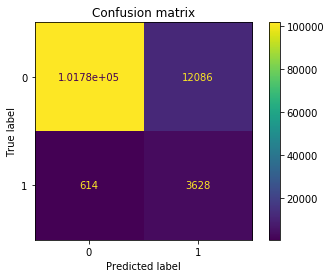

In [10]:
plot_confusion_matrix(catfit_best, X_test, y_test, values_format = '.5g')  
plt.title('Confusion matrix')
plt.show()

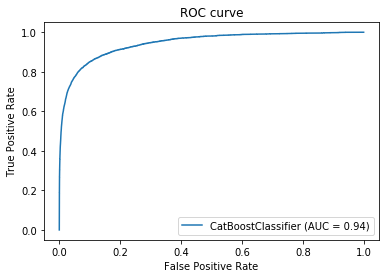

In [11]:
plot_roc_curve(catfit_best, X_test, y_test)
plt.title('ROC curve')
plt.show()

### Features importance

In [12]:
# Take the 20 most important feature
index_sorted = np.argsort(catfit_best.get_feature_importance())[-20:]

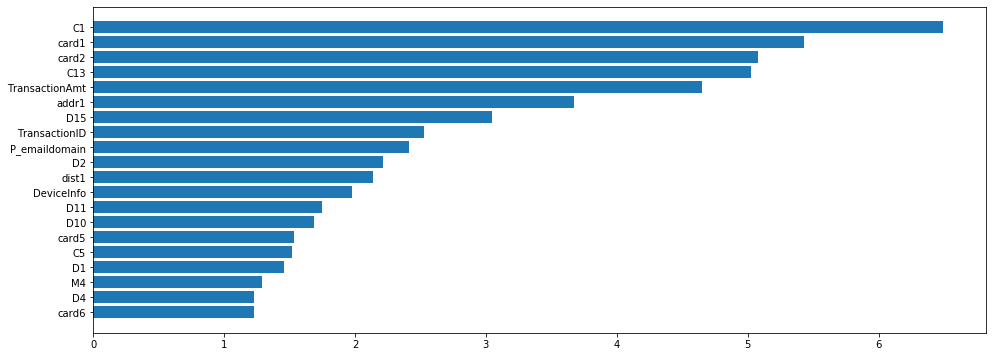

In [13]:
plt.figure(figsize=(16, 6))
plt.barh(y=X_train.columns[index_sorted],width = catfit_best.get_feature_importance()[index_sorted])
plt.show()

## Submission sample

In [14]:
test_identity = pd.read_csv('test_identity.csv')
test_transaction = pd.read_csv('test_transaction.csv')
test = pd.merge(test_transaction,test_identity,how='left',on='TransactionID')

In [31]:
test.head()

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,id-31,id-32,id-33,id-34,id-35,id-36,id-37,id-38,DeviceType,DeviceInfo
0,3663549,18403224,31.95,W,10409,111.0,150.0,visa,226.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3663550,18403263,49.00,W,4272,111.0,150.0,visa,226.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3663551,18403310,171.00,W,4476,574.0,150.0,visa,226.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3663552,18403310,284.95,W,10989,360.0,150.0,visa,166.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,3663553,18403317,67.95,W,18018,452.0,150.0,mastercard,117.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [35]:
col_id_x = [col for col in test.columns if col.startswith("id") and col[-1].isdigit()]
dict_col = {}
for col in col_id_x:
    tmp = {col:"id_"+col[-2:]}
    dict_col.update(tmp)

In [36]:
test = test.rename(columns=dict_col)

In [38]:
test_col = test[X_train.columns]

In [39]:
test_tmp = test_col.fillna(test_col.median())
test_fill = test_tmp.fillna(test_tmp.mode().iloc[0])

In [40]:
test_fill.head()

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,id_30,id_31,id_32,id_33,id_34,id_35,id_37,id_38,DeviceType,DeviceInfo
0,3663549,18403224,31.95,W,10409,111.0,150.0,visa,226.0,debit,...,Windows 10,chrome 70.0,24.0,1920x1080,match_status:2,T,T,F,desktop,Windows
1,3663550,18403263,49.00,W,4272,111.0,150.0,visa,226.0,debit,...,Windows 10,chrome 70.0,24.0,1920x1080,match_status:2,T,T,F,desktop,Windows
2,3663551,18403310,171.00,W,4476,574.0,150.0,visa,226.0,debit,...,Windows 10,chrome 70.0,24.0,1920x1080,match_status:2,T,T,F,desktop,Windows
3,3663552,18403310,284.95,W,10989,360.0,150.0,visa,166.0,debit,...,Windows 10,chrome 70.0,24.0,1920x1080,match_status:2,T,T,F,desktop,Windows
4,3663553,18403317,67.95,W,18018,452.0,150.0,mastercard,117.0,debit,...,Windows 10,chrome 70.0,24.0,1920x1080,match_status:2,T,T,F,desktop,Windows


In [58]:
pred_sample = pd.DataFrame(catfit_best.predict_proba(test_fill)[:,1],columns=["isFraud"]).merge(
    test_fill.TransactionID,left_index=True, right_index=True)[["TransactionID","isFraud"]]

In [62]:
pred_sample.to_csv("sample_submission.csv",index=False)

In [60]:
pred_sample.columns

Index(['TransactionID', 'isFraud'], dtype='object')

In [63]:
pd.read_csv('sample_submission.csv')

,TransactionID,isFraud
0,3663549,0.000658
1,3663550,0.083945
2,3663551,0.201775
3,3663552,0.006265
4,3663553,0.059395
...,...,...
506686,4170235,0.651634
506687,4170236,0.204861
506688,4170237,0.068536
506689,4170238,0.116498
